In [7]:
import os, sys

sys.path.append(os.getcwd())

from torchvision.models.inception import inception_v3
from scipy.stats import entropy

import random

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sklearn.datasets

import torch
import torch.autograd as autograd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

torch.manual_seed(1)
device='cuda'

In [29]:
def Data_gen(batch_size, centers=25):   
    scale = 2.
    center_points = []
    for i in range(5):
        for j in range(5):
            center_points.append((scale * (i - 2), scale * (j - 2)))
    
    dataset = []
    for i in range(batch_size):
        point = np.random.randn(2) * .02
        center = random.choice(center_points)
        point[0] += center[0]
        point[1] += center[1]
        dataset.append(point)
    dataset = np.array(dataset, dtype='float32')
    dataset /= 1.414  # stdev
    return torch.tensor(dataset, device=device)



In [28]:
class WGANS(nn.Module):
    
    def __init__(self,G_Ns,D_Ns):
        super().__init__()
        
        
        self.G_Ws=[]
        self.G_bs=[]
        
        self.D_Ws=[]
        self.D_bs=[]
        
        
        self.G_Ns=G_Ns
        self.D_Ns=D_Ns
        
        for n in range(1,np.shape(G_Ns)[0]):
        
            self.G_Ws.append(nn.Parameter(torch.randn([G_Ns[n-1],G_Ns[n]],device=device)*0.02))
            self.G_bs.append(nn.Parameter(torch.zeros([G_Ns[n]],device=device)))
            
        for n in range(1,np.shape(D_Ns)[0]):
        
            self.D_Ws.append(nn.Parameter(torch.randn([D_Ns[n-1],D_Ns[n]],device=device)*0.02))
            self.D_bs.append(nn.Parameter(torch.zeros([D_Ns[n]],device=device)))
            
        
    def Initialise_Hyperparameters(self,eta,lamda):

        self.eta=eta
        
        self.opt_D=optim.Adam(self.D_Ws+self.D_bs, lr=eta, betas=(0., 0.9))
        self.opt_G=optim.Adam(self.G_Ws+self.G_bs, lr=eta, betas=(0., 0.9))
        
        self.lamda=lamda
    
    def calc_gradient_penalty(self, real_data, fake_data):
        
        batch_size=real_data.size()[0]
        alpha = torch.rand([batch_size, 1],device=device)

        interpolates = alpha * real_data + ((1 - alpha) * fake_data)

        interpolates.requires_grad_()

        disc_interpolates = self.Forward_Discriminator(interpolates)

        gradients = autograd.grad(outputs=disc_interpolates, inputs=interpolates,
                                  grad_outputs=torch.ones(disc_interpolates.size(),device=device),
                                  create_graph=True, retain_graph=True, only_inputs=True)[0]
        
        GP = ((gradients.norm(2, dim=1) - 1) ** 2).mean() * self.lamda
        
        return GP
    
    
    def Forward_Generator(self, S):
        
        xs=[]
        xs.append(S)
                
        for n in range(0,np.shape(self.G_Ns)[0]-2):
            
            xs.append(torch.relu( torch.add(torch.matmul(xs[n],self.G_Ws[n]),self.G_bs[n]) ) )
            
        y_g=torch.add(torch.matmul(xs[-1],self.G_Ws[-1]),self.G_bs[-1])
        
        return y_g
    
    
    def Forward_Discriminator(self, S):

        xs=[]
        xs.append(S)
                
        for n in range(0,np.shape(self.D_Ns)[0]-2):
            
            xs.append(torch.relu( torch.add(torch.matmul(xs[n],self.D_Ws[n]),self.D_bs[n]) ) )
        
        D=torch.add(torch.matmul(xs[-1],self.D_Ws[-1]),self.D_bs[-1])
        
        return D
    
    def Train_D(self,S,real_data):
        
        with torch.no_grad():
            
            fake_data=self.Forward_Generator(S)
        
        self.opt_D.zero_grad()
        
        D_real=self.Forward_Discriminator(real_data)
        D_real=-D_real.mean()
        D_real.backward()
        
        D_fake=self.Forward_Discriminator(fake_data)
        D_fake=D_fake.mean()
        D_fake.backward()
        
        GP=self.calc_gradient_penalty(real_data,fake_data)
        GP.backward()
        
        #if want the GP, then add GP after D_cost, if not, using the Weight Clipping
        D_cost = (D_fake - D_real+GP).detach()
        D_W = (D_real - D_fake).detach()
        

        
        self.opt_D.step()
#         self.weight_clipping(0.01) #uncomment if using normal WGANs
        
        return D_cost, D_W, fake_data
    
            
        
    def Train_G(self,S):
        
        self.opt_G.zero_grad()
        
        fake_data=self.Forward_Generator(S)
        
        D_fake=self.Forward_Discriminator(fake_data)
        D_fake=-D_fake.mean()
        D_fake.backward()
        
        G_cost=(-D_fake).detach()
        
        #gradient-clipping
#         torch.nn.utils.clip_grad_norm_(self.G_Ws + self.G_bs, max_norm=1.0)
        
        self.opt_G.step()
        
        
        return G_cost, fake_data
        
    
    def weight_clipping(self, clip_value):
        for w in self.D_Ws:
            w.data.clamp_(-clip_value, clip_value)
        for b in self.D_bs:
            b.data.clamp_(-clip_value, clip_value)


In [30]:
G_Ns=np.array([2,512,512,512,2])
D_Ns=np.array([2,512,512,512,1])

N_train=100000

D_step=5
eta=0.0001
batch_size=256
lamda=10

MLP=WGANS(G_Ns,D_Ns)
MLP.Initialise_Hyperparameters(eta,lamda)

MSE_D=np.zeros([2,D_step,N_train])
MSE_G=np.zeros([N_train])

for n in range(N_train):
    if n>0:
        for k in range(D_step):

            true_data=Data_gen(batch_size)
            S=torch.randn([batch_size,2],device=device)
            
            D_cost, D_W, fake_data=MLP.Train_D(S, true_data)

            MSE_D[0,k,n]=np.copy(np.array(D_W.to('cpu').detach()))
            MSE_D[1,k,n]=np.copy(np.array(D_cost.to('cpu').detach()))
        
        S=torch.randn([batch_size,2],device=device)
        G_cost, fake_data=MLP.Train_G(S)

        MSE_G[n]=np.copy(np.array(G_cost.to('cpu').detach()))
        
        print("Current iteration: ", n)
        print(D_W)
        print(D_cost)
        print(G_cost)
        
        
        
        

        
        

Current iteration:  1
tensor(0.0087, device='cuda:0')
tensor(9.8983, device='cuda:0')
tensor(-0.0013, device='cuda:0')
Current iteration:  2
tensor(0.0206, device='cuda:0')
tensor(9.7559, device='cuda:0')
tensor(-0.0028, device='cuda:0')
Current iteration:  3
tensor(0.0276, device='cuda:0')
tensor(9.5367, device='cuda:0')
tensor(-0.0049, device='cuda:0')
Current iteration:  4
tensor(0.0419, device='cuda:0')
tensor(9.2029, device='cuda:0')
tensor(-0.0078, device='cuda:0')
Current iteration:  5
tensor(0.0699, device='cuda:0')
tensor(8.7665, device='cuda:0')
tensor(-0.0110, device='cuda:0')
Current iteration:  6
tensor(0.0946, device='cuda:0')
tensor(8.1840, device='cuda:0')
tensor(-0.0152, device='cuda:0')
Current iteration:  7
tensor(0.1414, device='cuda:0')
tensor(7.4410, device='cuda:0')
tensor(-0.0190, device='cuda:0')
Current iteration:  8
tensor(0.1609, device='cuda:0')
tensor(6.6346, device='cuda:0')
tensor(-0.0240, device='cuda:0')
Current iteration:  9
tensor(0.2063, device='cud

Current iteration:  70
tensor(1.6892, device='cuda:0')
tensor(-1.3951, device='cuda:0')
tensor(-2.1859, device='cuda:0')
Current iteration:  71
tensor(1.3089, device='cuda:0')
tensor(-0.9852, device='cuda:0')
tensor(-2.0902, device='cuda:0')
Current iteration:  72
tensor(1.2124, device='cuda:0')
tensor(-0.9434, device='cuda:0')
tensor(-2.0786, device='cuda:0')
Current iteration:  73
tensor(1.4015, device='cuda:0')
tensor(-0.9770, device='cuda:0')
tensor(-1.9885, device='cuda:0')
Current iteration:  74
tensor(1.3618, device='cuda:0')
tensor(-1.0013, device='cuda:0')
tensor(-1.9446, device='cuda:0')
Current iteration:  75
tensor(1.0549, device='cuda:0')
tensor(-0.7541, device='cuda:0')
tensor(-1.8716, device='cuda:0')
Current iteration:  76
tensor(0.7377, device='cuda:0')
tensor(-0.3581, device='cuda:0')
tensor(-1.7816, device='cuda:0')
Current iteration:  77
tensor(0.6456, device='cuda:0')
tensor(-0.2804, device='cuda:0')
tensor(-1.6832, device='cuda:0')
Current iteration:  78
tensor(0.

Current iteration:  140
tensor(-0.0994, device='cuda:0')
tensor(0.3814, device='cuda:0')
tensor(-1.2480, device='cuda:0')
Current iteration:  141
tensor(0.0731, device='cuda:0')
tensor(0.3157, device='cuda:0')
tensor(-1.1801, device='cuda:0')
Current iteration:  142
tensor(0.1269, device='cuda:0')
tensor(0.2585, device='cuda:0')
tensor(-1.2605, device='cuda:0')
Current iteration:  143
tensor(0.0209, device='cuda:0')
tensor(0.2066, device='cuda:0')
tensor(-1.2656, device='cuda:0')
Current iteration:  144
tensor(-0.2610, device='cuda:0')
tensor(0.7224, device='cuda:0')
tensor(-1.1102, device='cuda:0')
Current iteration:  145
tensor(0.1314, device='cuda:0')
tensor(0.2040, device='cuda:0')
tensor(-1.2367, device='cuda:0')
Current iteration:  146
tensor(-0.1256, device='cuda:0')
tensor(0.3857, device='cuda:0')
tensor(-1.1915, device='cuda:0')
Current iteration:  147
tensor(-0.2059, device='cuda:0')
tensor(0.4817, device='cuda:0')
tensor(-1.2579, device='cuda:0')
Current iteration:  148
tens

Current iteration:  208
tensor(1.8703, device='cuda:0')
tensor(-1.6607, device='cuda:0')
tensor(-2.2488, device='cuda:0')
Current iteration:  209
tensor(2.2161, device='cuda:0')
tensor(-2.0368, device='cuda:0')
tensor(-2.2310, device='cuda:0')
Current iteration:  210
tensor(2.0520, device='cuda:0')
tensor(-1.9082, device='cuda:0')
tensor(-2.1144, device='cuda:0')
Current iteration:  211
tensor(1.8461, device='cuda:0')
tensor(-1.6184, device='cuda:0')
tensor(-2.1317, device='cuda:0')
Current iteration:  212
tensor(1.8956, device='cuda:0')
tensor(-1.7101, device='cuda:0')
tensor(-2.1055, device='cuda:0')
Current iteration:  213
tensor(1.6977, device='cuda:0')
tensor(-1.4785, device='cuda:0')
tensor(-2.0684, device='cuda:0')
Current iteration:  214
tensor(1.6096, device='cuda:0')
tensor(-1.4443, device='cuda:0')
tensor(-2.0022, device='cuda:0')
Current iteration:  215
tensor(1.7809, device='cuda:0')
tensor(-1.6388, device='cuda:0')
tensor(-1.9873, device='cuda:0')
Current iteration:  216


Current iteration:  277
tensor(2.5040, device='cuda:0')
tensor(-1.9674, device='cuda:0')
tensor(-2.3378, device='cuda:0')
Current iteration:  278
tensor(3.8610, device='cuda:0')
tensor(-3.5049, device='cuda:0')
tensor(-2.9625, device='cuda:0')
Current iteration:  279
tensor(3.9521, device='cuda:0')
tensor(-3.5929, device='cuda:0')
tensor(-3.1217, device='cuda:0')
Current iteration:  280
tensor(4.2785, device='cuda:0')
tensor(-4.0040, device='cuda:0')
tensor(-3.1998, device='cuda:0')
Current iteration:  281
tensor(4.2533, device='cuda:0')
tensor(-3.9218, device='cuda:0')
tensor(-3.2099, device='cuda:0')
Current iteration:  282
tensor(4.2016, device='cuda:0')
tensor(-3.9997, device='cuda:0')
tensor(-2.9702, device='cuda:0')
Current iteration:  283
tensor(3.9671, device='cuda:0')
tensor(-3.6742, device='cuda:0')
tensor(-3.0784, device='cuda:0')
Current iteration:  284
tensor(3.8918, device='cuda:0')
tensor(-3.6762, device='cuda:0')
tensor(-2.9915, device='cuda:0')
Current iteration:  285


Current iteration:  345
tensor(1.8943, device='cuda:0')
tensor(-1.6672, device='cuda:0')
tensor(-1.8099, device='cuda:0')
Current iteration:  346
tensor(1.5559, device='cuda:0')
tensor(-1.3891, device='cuda:0')
tensor(-1.8201, device='cuda:0')
Current iteration:  347
tensor(1.5793, device='cuda:0')
tensor(-1.3602, device='cuda:0')
tensor(-1.6026, device='cuda:0')
Current iteration:  348
tensor(1.5693, device='cuda:0')
tensor(-1.3633, device='cuda:0')
tensor(-1.5881, device='cuda:0')
Current iteration:  349
tensor(1.5970, device='cuda:0')
tensor(-1.4044, device='cuda:0')
tensor(-1.4976, device='cuda:0')
Current iteration:  350
tensor(1.6065, device='cuda:0')
tensor(-1.4099, device='cuda:0')
tensor(-1.5286, device='cuda:0')
Current iteration:  351
tensor(1.6887, device='cuda:0')
tensor(-1.4858, device='cuda:0')
tensor(-1.4125, device='cuda:0')
Current iteration:  352
tensor(1.4480, device='cuda:0')
tensor(-1.2210, device='cuda:0')
tensor(-1.4202, device='cuda:0')
Current iteration:  353


Current iteration:  415
tensor(-2.6798, device='cuda:0')
tensor(2.7890, device='cuda:0')
tensor(1.5615, device='cuda:0')
Current iteration:  416
tensor(-3.3834, device='cuda:0')
tensor(3.5333, device='cuda:0')
tensor(1.4508, device='cuda:0')
Current iteration:  417
tensor(-3.2470, device='cuda:0')
tensor(3.3812, device='cuda:0')
tensor(1.5661, device='cuda:0')
Current iteration:  418
tensor(-3.4297, device='cuda:0')
tensor(3.6066, device='cuda:0')
tensor(1.8208, device='cuda:0')
Current iteration:  419
tensor(-3.3473, device='cuda:0')
tensor(3.5209, device='cuda:0')
tensor(1.9594, device='cuda:0')
Current iteration:  420
tensor(-3.8110, device='cuda:0')
tensor(3.9316, device='cuda:0')
tensor(1.8999, device='cuda:0')
Current iteration:  421
tensor(-3.8171, device='cuda:0')
tensor(3.9963, device='cuda:0')
tensor(2.2085, device='cuda:0')
Current iteration:  422
tensor(-4.0433, device='cuda:0')
tensor(4.2447, device='cuda:0')
tensor(2.1389, device='cuda:0')
Current iteration:  423
tensor(-

Current iteration:  485
tensor(4.4185, device='cuda:0')
tensor(-4.2754, device='cuda:0')
tensor(-2.4154, device='cuda:0')
Current iteration:  486
tensor(4.2776, device='cuda:0')
tensor(-4.1536, device='cuda:0')
tensor(-2.7225, device='cuda:0')
Current iteration:  487
tensor(4.0300, device='cuda:0')
tensor(-3.9347, device='cuda:0')
tensor(-2.3825, device='cuda:0')
Current iteration:  488
tensor(4.1974, device='cuda:0')
tensor(-4.0646, device='cuda:0')
tensor(-2.5107, device='cuda:0')
Current iteration:  489
tensor(4.2093, device='cuda:0')
tensor(-4.1077, device='cuda:0')
tensor(-2.1307, device='cuda:0')
Current iteration:  490
tensor(4.2680, device='cuda:0')
tensor(-4.0838, device='cuda:0')
tensor(-2.1469, device='cuda:0')
Current iteration:  491
tensor(3.8252, device='cuda:0')
tensor(-3.7483, device='cuda:0')
tensor(-2.2805, device='cuda:0')
Current iteration:  492
tensor(3.6575, device='cuda:0')
tensor(-3.4931, device='cuda:0')
tensor(-2.0999, device='cuda:0')
Current iteration:  493


Current iteration:  557
tensor(-0.2431, device='cuda:0')
tensor(0.6890, device='cuda:0')
tensor(-0.2548, device='cuda:0')
Current iteration:  558
tensor(-0.1029, device='cuda:0')
tensor(0.5038, device='cuda:0')
tensor(-0.2810, device='cuda:0')
Current iteration:  559
tensor(-0.1228, device='cuda:0')
tensor(0.4946, device='cuda:0')
tensor(-0.1696, device='cuda:0')
Current iteration:  560
tensor(-0.4329, device='cuda:0')
tensor(0.8361, device='cuda:0')
tensor(-0.3592, device='cuda:0')
Current iteration:  561
tensor(-0.4658, device='cuda:0')
tensor(0.7615, device='cuda:0')
tensor(-0.2897, device='cuda:0')
Current iteration:  562
tensor(-0.5656, device='cuda:0')
tensor(0.9374, device='cuda:0')
tensor(-0.3138, device='cuda:0')
Current iteration:  563
tensor(-0.5458, device='cuda:0')
tensor(0.8359, device='cuda:0')
tensor(-0.1595, device='cuda:0')
Current iteration:  564
tensor(-1.1295, device='cuda:0')
tensor(1.5582, device='cuda:0')
tensor(-0.1512, device='cuda:0')
Current iteration:  565


Current iteration:  626
tensor(0.0021, device='cuda:0')
tensor(0.4200, device='cuda:0')
tensor(-0.4334, device='cuda:0')
Current iteration:  627
tensor(-0.1033, device='cuda:0')
tensor(0.6779, device='cuda:0')
tensor(-0.3348, device='cuda:0')
Current iteration:  628
tensor(0.1020, device='cuda:0')
tensor(0.3384, device='cuda:0')
tensor(-0.2188, device='cuda:0')
Current iteration:  629
tensor(-0.7017, device='cuda:0')
tensor(1.1282, device='cuda:0')
tensor(0.0154, device='cuda:0')
Current iteration:  630
tensor(-1.2548, device='cuda:0')
tensor(1.7534, device='cuda:0')
tensor(0.5061, device='cuda:0')
Current iteration:  631
tensor(-2.2426, device='cuda:0')
tensor(2.7615, device='cuda:0')
tensor(0.9831, device='cuda:0')
Current iteration:  632
tensor(-3.1952, device='cuda:0')
tensor(3.7124, device='cuda:0')
tensor(1.3091, device='cuda:0')
Current iteration:  633
tensor(-4.0548, device='cuda:0')
tensor(4.6804, device='cuda:0')
tensor(1.7464, device='cuda:0')
Current iteration:  634
tensor(

Current iteration:  695
tensor(-4.6858, device='cuda:0')
tensor(5.0864, device='cuda:0')
tensor(2.7507, device='cuda:0')
Current iteration:  696
tensor(-5.4324, device='cuda:0')
tensor(5.8201, device='cuda:0')
tensor(2.8816, device='cuda:0')
Current iteration:  697
tensor(-5.3286, device='cuda:0')
tensor(5.6724, device='cuda:0')
tensor(2.8795, device='cuda:0')
Current iteration:  698
tensor(-5.4176, device='cuda:0')
tensor(5.8285, device='cuda:0')
tensor(3.0583, device='cuda:0')
Current iteration:  699
tensor(-5.8160, device='cuda:0')
tensor(6.3688, device='cuda:0')
tensor(3.3314, device='cuda:0')
Current iteration:  700
tensor(-6.4316, device='cuda:0')
tensor(7.0128, device='cuda:0')
tensor(3.7003, device='cuda:0')
Current iteration:  701
tensor(-6.6236, device='cuda:0')
tensor(6.9524, device='cuda:0')
tensor(3.8251, device='cuda:0')
Current iteration:  702
tensor(-6.8559, device='cuda:0')
tensor(7.2844, device='cuda:0')
tensor(3.8604, device='cuda:0')
Current iteration:  703
tensor(-

Current iteration:  765
tensor(-1.9751, device='cuda:0')
tensor(2.3295, device='cuda:0')
tensor(0.8628, device='cuda:0')
Current iteration:  766
tensor(-1.9446, device='cuda:0')
tensor(2.2333, device='cuda:0')
tensor(1.0623, device='cuda:0')
Current iteration:  767
tensor(-1.8927, device='cuda:0')
tensor(2.3137, device='cuda:0')
tensor(0.9893, device='cuda:0')
Current iteration:  768
tensor(-2.1537, device='cuda:0')
tensor(2.3791, device='cuda:0')
tensor(1.0444, device='cuda:0')
Current iteration:  769
tensor(-2.2952, device='cuda:0')
tensor(2.5709, device='cuda:0')
tensor(1.0852, device='cuda:0')
Current iteration:  770
tensor(-2.3375, device='cuda:0')
tensor(2.7566, device='cuda:0')
tensor(1.2417, device='cuda:0')
Current iteration:  771
tensor(-2.0956, device='cuda:0')
tensor(2.4300, device='cuda:0')
tensor(1.2527, device='cuda:0')
Current iteration:  772
tensor(-2.7184, device='cuda:0')
tensor(3.0052, device='cuda:0')
tensor(1.2266, device='cuda:0')
Current iteration:  773
tensor(-

Current iteration:  834
tensor(6.0982, device='cuda:0')
tensor(-5.5497, device='cuda:0')
tensor(-3.3703, device='cuda:0')
Current iteration:  835
tensor(6.4350, device='cuda:0')
tensor(-5.7254, device='cuda:0')
tensor(-3.1665, device='cuda:0')
Current iteration:  836
tensor(5.9680, device='cuda:0')
tensor(-5.4457, device='cuda:0')
tensor(-3.0769, device='cuda:0')
Current iteration:  837
tensor(5.7146, device='cuda:0')
tensor(-5.2127, device='cuda:0')
tensor(-3.2535, device='cuda:0')
Current iteration:  838
tensor(6.0373, device='cuda:0')
tensor(-5.5155, device='cuda:0')
tensor(-3.3548, device='cuda:0')
Current iteration:  839
tensor(6.1133, device='cuda:0')
tensor(-5.5562, device='cuda:0')
tensor(-3.3515, device='cuda:0')
Current iteration:  840
tensor(5.7991, device='cuda:0')
tensor(-5.4520, device='cuda:0')
tensor(-3.4543, device='cuda:0')
Current iteration:  841
tensor(5.7659, device='cuda:0')
tensor(-5.3344, device='cuda:0')
tensor(-3.2440, device='cuda:0')
Current iteration:  842


Current iteration:  904
tensor(1.3053, device='cuda:0')
tensor(-0.9831, device='cuda:0')
tensor(-0.7940, device='cuda:0')
Current iteration:  905
tensor(1.3183, device='cuda:0')
tensor(-1.1055, device='cuda:0')
tensor(-1.0673, device='cuda:0')
Current iteration:  906
tensor(1.2500, device='cuda:0')
tensor(-1.0441, device='cuda:0')
tensor(-0.7100, device='cuda:0')
Current iteration:  907
tensor(1.2089, device='cuda:0')
tensor(-0.9538, device='cuda:0')
tensor(-0.8216, device='cuda:0')
Current iteration:  908
tensor(1.0224, device='cuda:0')
tensor(-0.7475, device='cuda:0')
tensor(-0.5499, device='cuda:0')
Current iteration:  909
tensor(1.2053, device='cuda:0')
tensor(-0.9758, device='cuda:0')
tensor(-0.6980, device='cuda:0')
Current iteration:  910
tensor(0.9692, device='cuda:0')
tensor(-0.7900, device='cuda:0')
tensor(-0.7194, device='cuda:0')
Current iteration:  911
tensor(1.3410, device='cuda:0')
tensor(-1.0088, device='cuda:0')
tensor(-0.4165, device='cuda:0')
Current iteration:  912


Current iteration:  977
tensor(-1.0082, device='cuda:0')
tensor(1.3061, device='cuda:0')
tensor(0.8108, device='cuda:0')
Current iteration:  978
tensor(-1.3124, device='cuda:0')
tensor(1.5855, device='cuda:0')
tensor(0.6392, device='cuda:0')
Current iteration:  979
tensor(-1.3040, device='cuda:0')
tensor(1.5577, device='cuda:0')
tensor(0.6112, device='cuda:0')
Current iteration:  980
tensor(-1.6630, device='cuda:0')
tensor(1.9563, device='cuda:0')
tensor(0.9475, device='cuda:0')
Current iteration:  981
tensor(-1.5241, device='cuda:0')
tensor(1.9482, device='cuda:0')
tensor(1.1181, device='cuda:0')
Current iteration:  982
tensor(-1.9202, device='cuda:0')
tensor(2.1930, device='cuda:0')
tensor(0.9106, device='cuda:0')
Current iteration:  983
tensor(-1.8279, device='cuda:0')
tensor(2.0490, device='cuda:0')
tensor(0.6549, device='cuda:0')
Current iteration:  984
tensor(-1.5894, device='cuda:0')
tensor(1.9170, device='cuda:0')
tensor(0.7078, device='cuda:0')
Current iteration:  985
tensor(-

Current iteration:  1048
tensor(-6.5847, device='cuda:0')
tensor(6.9170, device='cuda:0')
tensor(3.5672, device='cuda:0')
Current iteration:  1049
tensor(-6.8743, device='cuda:0')
tensor(7.2505, device='cuda:0')
tensor(3.3213, device='cuda:0')
Current iteration:  1050
tensor(-7.4165, device='cuda:0')
tensor(7.7217, device='cuda:0')
tensor(3.3868, device='cuda:0')
Current iteration:  1051
tensor(-6.6010, device='cuda:0')
tensor(6.8716, device='cuda:0')
tensor(3.3913, device='cuda:0')
Current iteration:  1052
tensor(-7.2143, device='cuda:0')
tensor(7.4668, device='cuda:0')
tensor(3.5416, device='cuda:0')
Current iteration:  1053
tensor(-7.4450, device='cuda:0')
tensor(7.7315, device='cuda:0')
tensor(3.4626, device='cuda:0')
Current iteration:  1054
tensor(-7.2970, device='cuda:0')
tensor(7.5132, device='cuda:0')
tensor(3.3585, device='cuda:0')
Current iteration:  1055
tensor(-7.4333, device='cuda:0')
tensor(7.7816, device='cuda:0')
tensor(3.8217, device='cuda:0')
Current iteration:  1056

Current iteration:  1119
tensor(-6.3621, device='cuda:0')
tensor(6.8061, device='cuda:0')
tensor(3.5095, device='cuda:0')
Current iteration:  1120
tensor(-7.2746, device='cuda:0')
tensor(7.5070, device='cuda:0')
tensor(3.1758, device='cuda:0')
Current iteration:  1121
tensor(-6.9249, device='cuda:0')
tensor(7.1070, device='cuda:0')
tensor(3.4796, device='cuda:0')
Current iteration:  1122
tensor(-7.1894, device='cuda:0')
tensor(7.5044, device='cuda:0')
tensor(3.4035, device='cuda:0')
Current iteration:  1123
tensor(-6.9621, device='cuda:0')
tensor(7.4070, device='cuda:0')
tensor(3.4404, device='cuda:0')
Current iteration:  1124
tensor(-7.1261, device='cuda:0')
tensor(7.4730, device='cuda:0')
tensor(3.3533, device='cuda:0')
Current iteration:  1125
tensor(-7.2590, device='cuda:0')
tensor(7.6525, device='cuda:0')
tensor(3.5462, device='cuda:0')
Current iteration:  1126
tensor(-6.5491, device='cuda:0')
tensor(7.1826, device='cuda:0')
tensor(3.2848, device='cuda:0')
Current iteration:  1127

Current iteration:  1192
tensor(-6.2957, device='cuda:0')
tensor(6.5924, device='cuda:0')
tensor(2.8395, device='cuda:0')
Current iteration:  1193
tensor(-6.3597, device='cuda:0')
tensor(6.5619, device='cuda:0')
tensor(2.8876, device='cuda:0')
Current iteration:  1194
tensor(-6.0850, device='cuda:0')
tensor(6.4577, device='cuda:0')
tensor(2.6718, device='cuda:0')
Current iteration:  1195
tensor(-6.1588, device='cuda:0')
tensor(6.4571, device='cuda:0')
tensor(3.0174, device='cuda:0')
Current iteration:  1196
tensor(-6.1290, device='cuda:0')
tensor(6.5180, device='cuda:0')
tensor(3.1125, device='cuda:0')
Current iteration:  1197
tensor(-6.2260, device='cuda:0')
tensor(6.5058, device='cuda:0')
tensor(2.8543, device='cuda:0')
Current iteration:  1198
tensor(-6.9161, device='cuda:0')
tensor(7.3209, device='cuda:0')
tensor(3.1944, device='cuda:0')
Current iteration:  1199
tensor(-6.4931, device='cuda:0')
tensor(7.0519, device='cuda:0')
tensor(2.8701, device='cuda:0')
Current iteration:  1200

Current iteration:  1265
tensor(-6.5968, device='cuda:0')
tensor(6.9893, device='cuda:0')
tensor(3.3721, device='cuda:0')
Current iteration:  1266
tensor(-6.7081, device='cuda:0')
tensor(7.0435, device='cuda:0')
tensor(3.4325, device='cuda:0')
Current iteration:  1267
tensor(-6.4270, device='cuda:0')
tensor(6.8685, device='cuda:0')
tensor(3.3092, device='cuda:0')
Current iteration:  1268
tensor(-6.6307, device='cuda:0')
tensor(6.9649, device='cuda:0')
tensor(3.0776, device='cuda:0')
Current iteration:  1269
tensor(-6.4814, device='cuda:0')
tensor(7.0460, device='cuda:0')
tensor(3.0594, device='cuda:0')
Current iteration:  1270
tensor(-6.1561, device='cuda:0')
tensor(6.6270, device='cuda:0')
tensor(3.1889, device='cuda:0')
Current iteration:  1271
tensor(-6.0606, device='cuda:0')
tensor(6.3974, device='cuda:0')
tensor(2.8801, device='cuda:0')
Current iteration:  1272
tensor(-5.7902, device='cuda:0')
tensor(6.0971, device='cuda:0')
tensor(3.0778, device='cuda:0')
Current iteration:  1273

Current iteration:  1335
tensor(-2.9242, device='cuda:0')
tensor(3.2261, device='cuda:0')
tensor(1.2716, device='cuda:0')
Current iteration:  1336
tensor(-2.9173, device='cuda:0')
tensor(3.1432, device='cuda:0')
tensor(1.0120, device='cuda:0')
Current iteration:  1337
tensor(-2.6523, device='cuda:0')
tensor(2.9122, device='cuda:0')
tensor(1.0314, device='cuda:0')
Current iteration:  1338
tensor(-2.9259, device='cuda:0')
tensor(3.1663, device='cuda:0')
tensor(1.1085, device='cuda:0')
Current iteration:  1339
tensor(-2.5772, device='cuda:0')
tensor(2.9150, device='cuda:0')
tensor(1.3220, device='cuda:0')
Current iteration:  1340
tensor(-2.8287, device='cuda:0')
tensor(3.1339, device='cuda:0')
tensor(1.2399, device='cuda:0')
Current iteration:  1341
tensor(-2.3470, device='cuda:0')
tensor(2.5728, device='cuda:0')
tensor(1.3018, device='cuda:0')
Current iteration:  1342
tensor(-3.4141, device='cuda:0')
tensor(3.6951, device='cuda:0')
tensor(1.4017, device='cuda:0')
Current iteration:  1343

Current iteration:  1408
tensor(-2.5584, device='cuda:0')
tensor(2.9207, device='cuda:0')
tensor(1.0970, device='cuda:0')
Current iteration:  1409
tensor(-2.4224, device='cuda:0')
tensor(2.6726, device='cuda:0')
tensor(1.1612, device='cuda:0')
Current iteration:  1410
tensor(-2.6348, device='cuda:0')
tensor(2.8768, device='cuda:0')
tensor(0.9871, device='cuda:0')
Current iteration:  1411
tensor(-1.7315, device='cuda:0')
tensor(2.0178, device='cuda:0')
tensor(0.5927, device='cuda:0')
Current iteration:  1412
tensor(-1.4745, device='cuda:0')
tensor(1.7430, device='cuda:0')
tensor(0.4133, device='cuda:0')
Current iteration:  1413
tensor(-1.7139, device='cuda:0')
tensor(1.9361, device='cuda:0')
tensor(0.7294, device='cuda:0')
Current iteration:  1414
tensor(-1.5770, device='cuda:0')
tensor(1.8858, device='cuda:0')
tensor(0.6912, device='cuda:0')
Current iteration:  1415
tensor(-1.1008, device='cuda:0')
tensor(1.3450, device='cuda:0')
tensor(0.4307, device='cuda:0')
Current iteration:  1416

Current iteration:  1476
tensor(-1.5348, device='cuda:0')
tensor(1.6134, device='cuda:0')
tensor(0.3859, device='cuda:0')
Current iteration:  1477
tensor(-1.6465, device='cuda:0')
tensor(1.6820, device='cuda:0')
tensor(0.5426, device='cuda:0')
Current iteration:  1478
tensor(-1.5964, device='cuda:0')
tensor(1.7424, device='cuda:0')
tensor(0.6343, device='cuda:0')
Current iteration:  1479
tensor(-1.4868, device='cuda:0')
tensor(1.5812, device='cuda:0')
tensor(0.6274, device='cuda:0')
Current iteration:  1480
tensor(-1.4223, device='cuda:0')
tensor(1.4817, device='cuda:0')
tensor(0.5017, device='cuda:0')
Current iteration:  1481
tensor(-1.5265, device='cuda:0')
tensor(1.6621, device='cuda:0')
tensor(0.5411, device='cuda:0')
Current iteration:  1482
tensor(-1.2117, device='cuda:0')
tensor(1.2869, device='cuda:0')
tensor(0.5271, device='cuda:0')
Current iteration:  1483
tensor(-1.6506, device='cuda:0')
tensor(1.7197, device='cuda:0')
tensor(0.6030, device='cuda:0')
Current iteration:  1484

Current iteration:  1545
tensor(0.7438, device='cuda:0')
tensor(-0.6726, device='cuda:0')
tensor(-0.7644, device='cuda:0')
Current iteration:  1546
tensor(1.1422, device='cuda:0')
tensor(-1.0917, device='cuda:0')
tensor(-0.6593, device='cuda:0')
Current iteration:  1547
tensor(1.0840, device='cuda:0')
tensor(-1.0164, device='cuda:0')
tensor(-0.7115, device='cuda:0')
Current iteration:  1548
tensor(1.2137, device='cuda:0')
tensor(-1.0724, device='cuda:0')
tensor(-0.7894, device='cuda:0')
Current iteration:  1549
tensor(1.1229, device='cuda:0')
tensor(-1.0825, device='cuda:0')
tensor(-0.6416, device='cuda:0')
Current iteration:  1550
tensor(1.0148, device='cuda:0')
tensor(-0.9542, device='cuda:0')
tensor(-0.6143, device='cuda:0')
Current iteration:  1551
tensor(0.9653, device='cuda:0')
tensor(-0.9076, device='cuda:0')
tensor(-0.7322, device='cuda:0')
Current iteration:  1552
tensor(0.4380, device='cuda:0')
tensor(-0.3682, device='cuda:0')
tensor(-0.7801, device='cuda:0')
Current iteratio

Current iteration:  1613
tensor(1.7537, device='cuda:0')
tensor(-1.7071, device='cuda:0')
tensor(-1.0294, device='cuda:0')
Current iteration:  1614
tensor(1.7417, device='cuda:0')
tensor(-1.6885, device='cuda:0')
tensor(-0.9546, device='cuda:0')
Current iteration:  1615
tensor(1.6785, device='cuda:0')
tensor(-1.6222, device='cuda:0')
tensor(-0.8933, device='cuda:0')
Current iteration:  1616
tensor(1.4806, device='cuda:0')
tensor(-1.4039, device='cuda:0')
tensor(-0.9481, device='cuda:0')
Current iteration:  1617
tensor(1.7258, device='cuda:0')
tensor(-1.6645, device='cuda:0')
tensor(-0.8841, device='cuda:0')
Current iteration:  1618
tensor(1.4658, device='cuda:0')
tensor(-1.4188, device='cuda:0')
tensor(-0.9259, device='cuda:0')
Current iteration:  1619
tensor(1.3788, device='cuda:0')
tensor(-1.3511, device='cuda:0')
tensor(-0.9200, device='cuda:0')
Current iteration:  1620
tensor(1.9906, device='cuda:0')
tensor(-1.8828, device='cuda:0')
tensor(-1.0241, device='cuda:0')
Current iteratio

Current iteration:  1681
tensor(2.3751, device='cuda:0')
tensor(-2.3229, device='cuda:0')
tensor(-1.3038, device='cuda:0')
Current iteration:  1682
tensor(2.6475, device='cuda:0')
tensor(-2.6209, device='cuda:0')
tensor(-1.4843, device='cuda:0')
Current iteration:  1683
tensor(2.7689, device='cuda:0')
tensor(-2.6826, device='cuda:0')
tensor(-1.3393, device='cuda:0')
Current iteration:  1684
tensor(2.4054, device='cuda:0')
tensor(-2.3742, device='cuda:0')
tensor(-1.3484, device='cuda:0')
Current iteration:  1685
tensor(2.4558, device='cuda:0')
tensor(-2.3864, device='cuda:0')
tensor(-1.2986, device='cuda:0')
Current iteration:  1686
tensor(2.2012, device='cuda:0')
tensor(-2.1466, device='cuda:0')
tensor(-1.4605, device='cuda:0')
Current iteration:  1687
tensor(2.6573, device='cuda:0')
tensor(-2.6111, device='cuda:0')
tensor(-1.3223, device='cuda:0')
Current iteration:  1688
tensor(2.5428, device='cuda:0')
tensor(-2.4942, device='cuda:0')
tensor(-1.3571, device='cuda:0')
Current iteratio

Current iteration:  1749
tensor(3.0524, device='cuda:0')
tensor(-3.0241, device='cuda:0')
tensor(-1.5727, device='cuda:0')
Current iteration:  1750
tensor(3.0309, device='cuda:0')
tensor(-3.0053, device='cuda:0')
tensor(-1.6188, device='cuda:0')
Current iteration:  1751
tensor(2.8863, device='cuda:0')
tensor(-2.8590, device='cuda:0')
tensor(-1.6036, device='cuda:0')
Current iteration:  1752
tensor(2.8825, device='cuda:0')
tensor(-2.8522, device='cuda:0')
tensor(-1.5631, device='cuda:0')
Current iteration:  1753
tensor(2.7199, device='cuda:0')
tensor(-2.6765, device='cuda:0')
tensor(-1.7308, device='cuda:0')
Current iteration:  1754
tensor(2.9531, device='cuda:0')
tensor(-2.9228, device='cuda:0')
tensor(-1.5671, device='cuda:0')
Current iteration:  1755
tensor(2.9657, device='cuda:0')
tensor(-2.9255, device='cuda:0')
tensor(-1.4559, device='cuda:0')
Current iteration:  1756
tensor(3.0148, device='cuda:0')
tensor(-2.9858, device='cuda:0')
tensor(-1.7355, device='cuda:0')
Current iteratio

Current iteration:  1816
tensor(3.7104, device='cuda:0')
tensor(-3.6668, device='cuda:0')
tensor(-1.7108, device='cuda:0')
Current iteration:  1817
tensor(3.3600, device='cuda:0')
tensor(-3.3015, device='cuda:0')
tensor(-1.8452, device='cuda:0')
Current iteration:  1818
tensor(3.5872, device='cuda:0')
tensor(-3.5566, device='cuda:0')
tensor(-1.8769, device='cuda:0')
Current iteration:  1819
tensor(3.4695, device='cuda:0')
tensor(-3.4337, device='cuda:0')
tensor(-1.7281, device='cuda:0')
Current iteration:  1820
tensor(3.5379, device='cuda:0')
tensor(-3.4871, device='cuda:0')
tensor(-1.7600, device='cuda:0')
Current iteration:  1821
tensor(3.4835, device='cuda:0')
tensor(-3.4424, device='cuda:0')
tensor(-1.7706, device='cuda:0')
Current iteration:  1822
tensor(3.5190, device='cuda:0')
tensor(-3.4755, device='cuda:0')
tensor(-1.8069, device='cuda:0')
Current iteration:  1823
tensor(3.5044, device='cuda:0')
tensor(-3.4669, device='cuda:0')
tensor(-1.7576, device='cuda:0')
Current iteratio

Current iteration:  1884
tensor(3.5532, device='cuda:0')
tensor(-3.5137, device='cuda:0')
tensor(-1.9119, device='cuda:0')
Current iteration:  1885
tensor(3.6326, device='cuda:0')
tensor(-3.5618, device='cuda:0')
tensor(-1.9141, device='cuda:0')
Current iteration:  1886
tensor(3.4451, device='cuda:0')
tensor(-3.4109, device='cuda:0')
tensor(-1.9201, device='cuda:0')
Current iteration:  1887
tensor(3.5307, device='cuda:0')
tensor(-3.4926, device='cuda:0')
tensor(-1.8108, device='cuda:0')
Current iteration:  1888
tensor(3.4506, device='cuda:0')
tensor(-3.4013, device='cuda:0')
tensor(-1.9417, device='cuda:0')
Current iteration:  1889
tensor(3.5330, device='cuda:0')
tensor(-3.5037, device='cuda:0')
tensor(-1.9846, device='cuda:0')
Current iteration:  1890
tensor(3.4773, device='cuda:0')
tensor(-3.4343, device='cuda:0')
tensor(-1.9632, device='cuda:0')
Current iteration:  1891
tensor(3.5346, device='cuda:0')
tensor(-3.5033, device='cuda:0')
tensor(-2.0147, device='cuda:0')
Current iteratio

Current iteration:  1956
tensor(3.6666, device='cuda:0')
tensor(-3.6074, device='cuda:0')
tensor(-1.8951, device='cuda:0')
Current iteration:  1957
tensor(3.5235, device='cuda:0')
tensor(-3.4979, device='cuda:0')
tensor(-1.9210, device='cuda:0')
Current iteration:  1958
tensor(3.4785, device='cuda:0')
tensor(-3.4417, device='cuda:0')
tensor(-1.9437, device='cuda:0')
Current iteration:  1959
tensor(3.6212, device='cuda:0')
tensor(-3.5388, device='cuda:0')
tensor(-1.8099, device='cuda:0')
Current iteration:  1960
tensor(3.6207, device='cuda:0')
tensor(-3.5856, device='cuda:0')
tensor(-1.8435, device='cuda:0')
Current iteration:  1961
tensor(3.5863, device='cuda:0')
tensor(-3.5310, device='cuda:0')
tensor(-2.0640, device='cuda:0')
Current iteration:  1962
tensor(3.6530, device='cuda:0')
tensor(-3.6289, device='cuda:0')
tensor(-2.1048, device='cuda:0')
Current iteration:  1963
tensor(3.7025, device='cuda:0')
tensor(-3.6731, device='cuda:0')
tensor(-1.9060, device='cuda:0')
Current iteratio

Current iteration:  2028
tensor(3.8917, device='cuda:0')
tensor(-3.8555, device='cuda:0')
tensor(-2.1391, device='cuda:0')
Current iteration:  2029
tensor(4.0811, device='cuda:0')
tensor(-4.0288, device='cuda:0')
tensor(-2.0911, device='cuda:0')
Current iteration:  2030
tensor(3.8604, device='cuda:0')
tensor(-3.8228, device='cuda:0')
tensor(-1.9210, device='cuda:0')
Current iteration:  2031
tensor(3.9105, device='cuda:0')
tensor(-3.8541, device='cuda:0')
tensor(-2.1801, device='cuda:0')
Current iteration:  2032
tensor(3.8933, device='cuda:0')
tensor(-3.8420, device='cuda:0')
tensor(-1.9928, device='cuda:0')
Current iteration:  2033
tensor(3.9260, device='cuda:0')
tensor(-3.9065, device='cuda:0')
tensor(-2.0042, device='cuda:0')
Current iteration:  2034
tensor(4.2406, device='cuda:0')
tensor(-4.1793, device='cuda:0')
tensor(-2.0831, device='cuda:0')
Current iteration:  2035
tensor(4.1068, device='cuda:0')
tensor(-4.0846, device='cuda:0')
tensor(-2.1905, device='cuda:0')
Current iteratio

Current iteration:  2098
tensor(4.0166, device='cuda:0')
tensor(-3.9793, device='cuda:0')
tensor(-2.0599, device='cuda:0')
Current iteration:  2099
tensor(4.2772, device='cuda:0')
tensor(-4.2402, device='cuda:0')
tensor(-2.0910, device='cuda:0')
Current iteration:  2100
tensor(3.9980, device='cuda:0')
tensor(-3.9691, device='cuda:0')
tensor(-2.1918, device='cuda:0')
Current iteration:  2101
tensor(4.0260, device='cuda:0')
tensor(-3.9971, device='cuda:0')
tensor(-2.0710, device='cuda:0')
Current iteration:  2102
tensor(4.0295, device='cuda:0')
tensor(-3.9952, device='cuda:0')
tensor(-2.0941, device='cuda:0')
Current iteration:  2103
tensor(3.9291, device='cuda:0')
tensor(-3.8937, device='cuda:0')
tensor(-2.0950, device='cuda:0')
Current iteration:  2104
tensor(4.0965, device='cuda:0')
tensor(-4.0626, device='cuda:0')
tensor(-2.0274, device='cuda:0')
Current iteration:  2105
tensor(3.8665, device='cuda:0')
tensor(-3.7944, device='cuda:0')
tensor(-2.1182, device='cuda:0')
Current iteratio

Current iteration:  2171
tensor(4.1796, device='cuda:0')
tensor(-4.1481, device='cuda:0')
tensor(-2.3332, device='cuda:0')
Current iteration:  2172
tensor(4.1900, device='cuda:0')
tensor(-4.1562, device='cuda:0')
tensor(-2.3224, device='cuda:0')
Current iteration:  2173
tensor(4.1109, device='cuda:0')
tensor(-4.0797, device='cuda:0')
tensor(-2.1772, device='cuda:0')
Current iteration:  2174
tensor(4.0749, device='cuda:0')
tensor(-4.0362, device='cuda:0')
tensor(-2.1269, device='cuda:0')
Current iteration:  2175
tensor(3.9918, device='cuda:0')
tensor(-3.9378, device='cuda:0')
tensor(-2.1423, device='cuda:0')
Current iteration:  2176
tensor(3.9243, device='cuda:0')
tensor(-3.8981, device='cuda:0')
tensor(-2.1270, device='cuda:0')
Current iteration:  2177
tensor(4.2871, device='cuda:0')
tensor(-4.2406, device='cuda:0')
tensor(-2.0934, device='cuda:0')
Current iteration:  2178
tensor(4.3450, device='cuda:0')
tensor(-4.3143, device='cuda:0')
tensor(-2.2510, device='cuda:0')
Current iteratio

Current iteration:  2243
tensor(4.1865, device='cuda:0')
tensor(-4.1542, device='cuda:0')
tensor(-2.1268, device='cuda:0')
Current iteration:  2244
tensor(4.2757, device='cuda:0')
tensor(-4.2483, device='cuda:0')
tensor(-2.1550, device='cuda:0')
Current iteration:  2245
tensor(4.2400, device='cuda:0')
tensor(-4.1705, device='cuda:0')
tensor(-2.1319, device='cuda:0')
Current iteration:  2246
tensor(4.0236, device='cuda:0')
tensor(-3.9543, device='cuda:0')
tensor(-2.2105, device='cuda:0')
Current iteration:  2247
tensor(4.1412, device='cuda:0')
tensor(-4.0949, device='cuda:0')
tensor(-2.1417, device='cuda:0')
Current iteration:  2248
tensor(4.3076, device='cuda:0')
tensor(-4.2601, device='cuda:0')
tensor(-2.1508, device='cuda:0')
Current iteration:  2249
tensor(3.9455, device='cuda:0')
tensor(-3.9130, device='cuda:0')
tensor(-2.0942, device='cuda:0')
Current iteration:  2250
tensor(4.0037, device='cuda:0')
tensor(-3.9573, device='cuda:0')
tensor(-2.2452, device='cuda:0')
Current iteratio

Current iteration:  2315
tensor(4.2927, device='cuda:0')
tensor(-4.2228, device='cuda:0')
tensor(-2.1393, device='cuda:0')
Current iteration:  2316
tensor(4.1218, device='cuda:0')
tensor(-4.0911, device='cuda:0')
tensor(-2.0747, device='cuda:0')
Current iteration:  2317
tensor(4.4046, device='cuda:0')
tensor(-4.3607, device='cuda:0')
tensor(-2.0410, device='cuda:0')
Current iteration:  2318
tensor(4.1106, device='cuda:0')
tensor(-4.0646, device='cuda:0')
tensor(-2.1476, device='cuda:0')
Current iteration:  2319
tensor(4.1230, device='cuda:0')
tensor(-4.0862, device='cuda:0')
tensor(-2.2270, device='cuda:0')
Current iteration:  2320
tensor(4.2609, device='cuda:0')
tensor(-4.2133, device='cuda:0')
tensor(-2.1705, device='cuda:0')
Current iteration:  2321
tensor(4.0975, device='cuda:0')
tensor(-4.0556, device='cuda:0')
tensor(-2.2853, device='cuda:0')
Current iteration:  2322
tensor(4.1650, device='cuda:0')
tensor(-4.1459, device='cuda:0')
tensor(-2.1986, device='cuda:0')
Current iteratio

Current iteration:  2386
tensor(4.0422, device='cuda:0')
tensor(-3.9676, device='cuda:0')
tensor(-2.1469, device='cuda:0')
Current iteration:  2387
tensor(4.1238, device='cuda:0')
tensor(-4.0963, device='cuda:0')
tensor(-2.1317, device='cuda:0')
Current iteration:  2388
tensor(3.9914, device='cuda:0')
tensor(-3.9587, device='cuda:0')
tensor(-2.1467, device='cuda:0')
Current iteration:  2389
tensor(4.2877, device='cuda:0')
tensor(-4.2603, device='cuda:0')
tensor(-2.2497, device='cuda:0')
Current iteration:  2390
tensor(3.9351, device='cuda:0')
tensor(-3.8949, device='cuda:0')
tensor(-2.0547, device='cuda:0')
Current iteration:  2391
tensor(4.1955, device='cuda:0')
tensor(-4.1712, device='cuda:0')
tensor(-2.1489, device='cuda:0')
Current iteration:  2392
tensor(4.0979, device='cuda:0')
tensor(-4.0570, device='cuda:0')
tensor(-2.2313, device='cuda:0')
Current iteration:  2393
tensor(4.2130, device='cuda:0')
tensor(-4.1861, device='cuda:0')
tensor(-2.1195, device='cuda:0')
Current iteratio

Current iteration:  2459
tensor(4.5121, device='cuda:0')
tensor(-4.4824, device='cuda:0')
tensor(-2.3325, device='cuda:0')
Current iteration:  2460
tensor(4.2402, device='cuda:0')
tensor(-4.1866, device='cuda:0')
tensor(-2.3506, device='cuda:0')
Current iteration:  2461
tensor(4.2158, device='cuda:0')
tensor(-4.1680, device='cuda:0')
tensor(-2.2848, device='cuda:0')
Current iteration:  2462
tensor(4.5853, device='cuda:0')
tensor(-4.5090, device='cuda:0')
tensor(-2.2335, device='cuda:0')
Current iteration:  2463
tensor(4.4142, device='cuda:0')
tensor(-4.3976, device='cuda:0')
tensor(-2.3112, device='cuda:0')
Current iteration:  2464
tensor(4.2836, device='cuda:0')
tensor(-4.2297, device='cuda:0')
tensor(-2.2105, device='cuda:0')
Current iteration:  2465
tensor(4.3168, device='cuda:0')
tensor(-4.2738, device='cuda:0')
tensor(-2.2510, device='cuda:0')
Current iteration:  2466
tensor(4.3141, device='cuda:0')
tensor(-4.2952, device='cuda:0')
tensor(-2.2602, device='cuda:0')
Current iteratio

Current iteration:  2532
tensor(4.1406, device='cuda:0')
tensor(-4.1024, device='cuda:0')
tensor(-2.2737, device='cuda:0')
Current iteration:  2533
tensor(4.3019, device='cuda:0')
tensor(-4.2644, device='cuda:0')
tensor(-2.1870, device='cuda:0')
Current iteration:  2534
tensor(4.3924, device='cuda:0')
tensor(-4.3496, device='cuda:0')
tensor(-2.1761, device='cuda:0')
Current iteration:  2535
tensor(4.3429, device='cuda:0')
tensor(-4.3102, device='cuda:0')
tensor(-2.0631, device='cuda:0')
Current iteration:  2536
tensor(4.3492, device='cuda:0')
tensor(-4.2946, device='cuda:0')
tensor(-2.2963, device='cuda:0')
Current iteration:  2537
tensor(4.1170, device='cuda:0')
tensor(-4.0874, device='cuda:0')
tensor(-2.2352, device='cuda:0')
Current iteration:  2538
tensor(4.4857, device='cuda:0')
tensor(-4.4454, device='cuda:0')
tensor(-2.1244, device='cuda:0')
Current iteration:  2539
tensor(4.3389, device='cuda:0')
tensor(-4.3142, device='cuda:0')
tensor(-2.3114, device='cuda:0')
Current iteratio

Current iteration:  2601
tensor(4.5229, device='cuda:0')
tensor(-4.4798, device='cuda:0')
tensor(-2.3881, device='cuda:0')
Current iteration:  2602
tensor(4.5402, device='cuda:0')
tensor(-4.5123, device='cuda:0')
tensor(-2.2987, device='cuda:0')
Current iteration:  2603
tensor(4.5714, device='cuda:0')
tensor(-4.5413, device='cuda:0')
tensor(-2.2066, device='cuda:0')
Current iteration:  2604
tensor(4.3594, device='cuda:0')
tensor(-4.3368, device='cuda:0')
tensor(-2.2346, device='cuda:0')
Current iteration:  2605
tensor(4.2379, device='cuda:0')
tensor(-4.1906, device='cuda:0')
tensor(-2.3118, device='cuda:0')
Current iteration:  2606
tensor(4.3385, device='cuda:0')
tensor(-4.2990, device='cuda:0')
tensor(-2.2814, device='cuda:0')
Current iteration:  2607
tensor(4.3203, device='cuda:0')
tensor(-4.2893, device='cuda:0')
tensor(-2.2717, device='cuda:0')
Current iteration:  2608
tensor(4.6843, device='cuda:0')
tensor(-4.6665, device='cuda:0')
tensor(-2.2931, device='cuda:0')
Current iteratio

Current iteration:  2673
tensor(4.4855, device='cuda:0')
tensor(-4.4480, device='cuda:0')
tensor(-2.1942, device='cuda:0')
Current iteration:  2674
tensor(4.1664, device='cuda:0')
tensor(-4.1253, device='cuda:0')
tensor(-2.2028, device='cuda:0')
Current iteration:  2675
tensor(4.4219, device='cuda:0')
tensor(-4.3874, device='cuda:0')
tensor(-2.3341, device='cuda:0')
Current iteration:  2676
tensor(4.3373, device='cuda:0')
tensor(-4.2851, device='cuda:0')
tensor(-2.2650, device='cuda:0')
Current iteration:  2677
tensor(4.0428, device='cuda:0')
tensor(-4.0008, device='cuda:0')
tensor(-2.2532, device='cuda:0')
Current iteration:  2678
tensor(4.1258, device='cuda:0')
tensor(-4.0857, device='cuda:0')
tensor(-2.1753, device='cuda:0')
Current iteration:  2679
tensor(4.0587, device='cuda:0')
tensor(-4.0235, device='cuda:0')
tensor(-2.1496, device='cuda:0')
Current iteration:  2680
tensor(4.1837, device='cuda:0')
tensor(-4.1512, device='cuda:0')
tensor(-2.1566, device='cuda:0')
Current iteratio

tensor(-4.2487, device='cuda:0')
tensor(-2.4464, device='cuda:0')
Current iteration:  2747
tensor(4.4763, device='cuda:0')
tensor(-4.4559, device='cuda:0')
tensor(-2.3538, device='cuda:0')
Current iteration:  2748
tensor(4.6169, device='cuda:0')
tensor(-4.5854, device='cuda:0')
tensor(-2.2741, device='cuda:0')
Current iteration:  2749
tensor(4.3430, device='cuda:0')
tensor(-4.2549, device='cuda:0')
tensor(-2.2825, device='cuda:0')
Current iteration:  2750
tensor(4.2535, device='cuda:0')
tensor(-4.2123, device='cuda:0')
tensor(-2.2777, device='cuda:0')
Current iteration:  2751
tensor(4.5626, device='cuda:0')
tensor(-4.5303, device='cuda:0')
tensor(-2.1904, device='cuda:0')
Current iteration:  2752
tensor(4.4727, device='cuda:0')
tensor(-4.4470, device='cuda:0')
tensor(-2.3642, device='cuda:0')
Current iteration:  2753
tensor(4.6525, device='cuda:0')
tensor(-4.6236, device='cuda:0')
tensor(-2.3203, device='cuda:0')
Current iteration:  2754
tensor(4.5847, device='cuda:0')
tensor(-4.5570, 

Current iteration:  2817
tensor(4.4106, device='cuda:0')
tensor(-4.3650, device='cuda:0')
tensor(-2.3238, device='cuda:0')
Current iteration:  2818
tensor(4.4214, device='cuda:0')
tensor(-4.3923, device='cuda:0')
tensor(-2.2943, device='cuda:0')
Current iteration:  2819
tensor(4.6658, device='cuda:0')
tensor(-4.6266, device='cuda:0')
tensor(-2.4440, device='cuda:0')
Current iteration:  2820
tensor(4.5744, device='cuda:0')
tensor(-4.5432, device='cuda:0')
tensor(-2.3381, device='cuda:0')
Current iteration:  2821
tensor(4.6794, device='cuda:0')
tensor(-4.6498, device='cuda:0')
tensor(-2.3365, device='cuda:0')
Current iteration:  2822
tensor(4.4952, device='cuda:0')
tensor(-4.4700, device='cuda:0')
tensor(-2.3736, device='cuda:0')
Current iteration:  2823
tensor(4.4851, device='cuda:0')
tensor(-4.4493, device='cuda:0')
tensor(-2.2568, device='cuda:0')
Current iteration:  2824
tensor(4.6587, device='cuda:0')
tensor(-4.6336, device='cuda:0')
tensor(-2.4809, device='cuda:0')
Current iteratio

Current iteration:  2887
tensor(4.7181, device='cuda:0')
tensor(-4.6779, device='cuda:0')
tensor(-2.3227, device='cuda:0')
Current iteration:  2888
tensor(4.5486, device='cuda:0')
tensor(-4.5215, device='cuda:0')
tensor(-2.3594, device='cuda:0')
Current iteration:  2889
tensor(4.7041, device='cuda:0')
tensor(-4.6748, device='cuda:0')
tensor(-2.3248, device='cuda:0')
Current iteration:  2890
tensor(4.6709, device='cuda:0')
tensor(-4.6202, device='cuda:0')
tensor(-2.4254, device='cuda:0')
Current iteration:  2891
tensor(4.5703, device='cuda:0')
tensor(-4.5151, device='cuda:0')
tensor(-2.2951, device='cuda:0')
Current iteration:  2892
tensor(4.5434, device='cuda:0')
tensor(-4.5052, device='cuda:0')
tensor(-2.4018, device='cuda:0')
Current iteration:  2893
tensor(4.6312, device='cuda:0')
tensor(-4.6004, device='cuda:0')
tensor(-2.4313, device='cuda:0')
Current iteration:  2894
tensor(4.5971, device='cuda:0')
tensor(-4.5693, device='cuda:0')
tensor(-2.2932, device='cuda:0')
Current iteratio

Current iteration:  2960
tensor(4.5473, device='cuda:0')
tensor(-4.4811, device='cuda:0')
tensor(-2.3947, device='cuda:0')
Current iteration:  2961
tensor(4.4813, device='cuda:0')
tensor(-4.4298, device='cuda:0')
tensor(-2.4154, device='cuda:0')
Current iteration:  2962
tensor(4.4627, device='cuda:0')
tensor(-4.4366, device='cuda:0')
tensor(-2.3678, device='cuda:0')
Current iteration:  2963
tensor(4.5151, device='cuda:0')
tensor(-4.4754, device='cuda:0')
tensor(-2.3078, device='cuda:0')
Current iteration:  2964
tensor(4.7423, device='cuda:0')
tensor(-4.6939, device='cuda:0')
tensor(-2.3747, device='cuda:0')
Current iteration:  2965
tensor(4.1607, device='cuda:0')
tensor(-4.0823, device='cuda:0')
tensor(-2.2498, device='cuda:0')
Current iteration:  2966
tensor(4.3769, device='cuda:0')
tensor(-4.3490, device='cuda:0')
tensor(-2.2803, device='cuda:0')
Current iteration:  2967
tensor(4.5023, device='cuda:0')
tensor(-4.4368, device='cuda:0')
tensor(-2.3743, device='cuda:0')
Current iteratio

Current iteration:  3033
tensor(4.4118, device='cuda:0')
tensor(-4.3614, device='cuda:0')
tensor(-2.3224, device='cuda:0')
Current iteration:  3034
tensor(4.3084, device='cuda:0')
tensor(-4.2787, device='cuda:0')
tensor(-2.2559, device='cuda:0')
Current iteration:  3035
tensor(4.6843, device='cuda:0')
tensor(-4.6526, device='cuda:0')
tensor(-2.3140, device='cuda:0')
Current iteration:  3036
tensor(4.4655, device='cuda:0')
tensor(-4.4400, device='cuda:0')
tensor(-2.2834, device='cuda:0')
Current iteration:  3037
tensor(4.2212, device='cuda:0')
tensor(-4.1642, device='cuda:0')
tensor(-2.2997, device='cuda:0')
Current iteration:  3038
tensor(4.5792, device='cuda:0')
tensor(-4.5466, device='cuda:0')
tensor(-2.2704, device='cuda:0')
Current iteration:  3039
tensor(4.2437, device='cuda:0')
tensor(-4.1984, device='cuda:0')
tensor(-2.2844, device='cuda:0')
Current iteration:  3040
tensor(4.4915, device='cuda:0')
tensor(-4.4650, device='cuda:0')
tensor(-2.3269, device='cuda:0')
Current iteratio

Current iteration:  3106
tensor(4.9671, device='cuda:0')
tensor(-4.9283, device='cuda:0')
tensor(-2.5249, device='cuda:0')
Current iteration:  3107
tensor(4.8240, device='cuda:0')
tensor(-4.7783, device='cuda:0')
tensor(-2.4981, device='cuda:0')
Current iteration:  3108
tensor(4.7742, device='cuda:0')
tensor(-4.7010, device='cuda:0')
tensor(-2.3204, device='cuda:0')
Current iteration:  3109
tensor(4.9475, device='cuda:0')
tensor(-4.9049, device='cuda:0')
tensor(-2.4080, device='cuda:0')
Current iteration:  3110
tensor(4.7116, device='cuda:0')
tensor(-4.6762, device='cuda:0')
tensor(-2.3906, device='cuda:0')
Current iteration:  3111
tensor(4.7280, device='cuda:0')
tensor(-4.6766, device='cuda:0')
tensor(-2.2800, device='cuda:0')
Current iteration:  3112
tensor(4.8472, device='cuda:0')
tensor(-4.7731, device='cuda:0')
tensor(-2.4881, device='cuda:0')
Current iteration:  3113
tensor(4.7844, device='cuda:0')
tensor(-4.7500, device='cuda:0')
tensor(-2.4256, device='cuda:0')
Current iteratio

Current iteration:  3179
tensor(4.6303, device='cuda:0')
tensor(-4.5683, device='cuda:0')
tensor(-2.4139, device='cuda:0')
Current iteration:  3180
tensor(4.4403, device='cuda:0')
tensor(-4.3709, device='cuda:0')
tensor(-2.3223, device='cuda:0')
Current iteration:  3181
tensor(4.4761, device='cuda:0')
tensor(-4.4276, device='cuda:0')
tensor(-2.4745, device='cuda:0')
Current iteration:  3182
tensor(4.3527, device='cuda:0')
tensor(-4.3048, device='cuda:0')
tensor(-2.4147, device='cuda:0')
Current iteration:  3183
tensor(4.4798, device='cuda:0')
tensor(-4.3921, device='cuda:0')
tensor(-2.2297, device='cuda:0')
Current iteration:  3184
tensor(4.3326, device='cuda:0')
tensor(-4.2899, device='cuda:0')
tensor(-2.2492, device='cuda:0')
Current iteration:  3185
tensor(4.2980, device='cuda:0')
tensor(-4.2133, device='cuda:0')
tensor(-2.3514, device='cuda:0')
Current iteration:  3186
tensor(4.4227, device='cuda:0')
tensor(-4.3580, device='cuda:0')
tensor(-2.1687, device='cuda:0')
Current iteratio

Current iteration:  3251
tensor(4.1365, device='cuda:0')
tensor(-4.0797, device='cuda:0')
tensor(-2.1636, device='cuda:0')
Current iteration:  3252
tensor(4.4193, device='cuda:0')
tensor(-4.3694, device='cuda:0')
tensor(-2.2385, device='cuda:0')
Current iteration:  3253
tensor(4.1767, device='cuda:0')
tensor(-4.1110, device='cuda:0')
tensor(-2.2089, device='cuda:0')
Current iteration:  3254
tensor(4.5281, device='cuda:0')
tensor(-4.4574, device='cuda:0')
tensor(-2.2536, device='cuda:0')
Current iteration:  3255
tensor(4.2919, device='cuda:0')
tensor(-4.2394, device='cuda:0')
tensor(-2.3008, device='cuda:0')
Current iteration:  3256
tensor(4.2869, device='cuda:0')
tensor(-4.2375, device='cuda:0')
tensor(-2.2864, device='cuda:0')
Current iteration:  3257
tensor(4.3705, device='cuda:0')
tensor(-4.3100, device='cuda:0')
tensor(-2.1415, device='cuda:0')
Current iteration:  3258
tensor(4.4146, device='cuda:0')
tensor(-4.3253, device='cuda:0')
tensor(-2.2226, device='cuda:0')
Current iteratio

Current iteration:  3320
tensor(3.6959, device='cuda:0')
tensor(-3.6154, device='cuda:0')
tensor(-1.9900, device='cuda:0')
Current iteration:  3321
tensor(3.9873, device='cuda:0')
tensor(-3.9255, device='cuda:0')
tensor(-2.0874, device='cuda:0')
Current iteration:  3322
tensor(3.7731, device='cuda:0')
tensor(-3.7120, device='cuda:0')
tensor(-2.0009, device='cuda:0')
Current iteration:  3323
tensor(3.8456, device='cuda:0')
tensor(-3.7742, device='cuda:0')
tensor(-1.8657, device='cuda:0')
Current iteration:  3324
tensor(3.9336, device='cuda:0')
tensor(-3.8731, device='cuda:0')
tensor(-2.0475, device='cuda:0')
Current iteration:  3325
tensor(3.9237, device='cuda:0')
tensor(-3.8623, device='cuda:0')
tensor(-1.9038, device='cuda:0')
Current iteration:  3326
tensor(3.8268, device='cuda:0')
tensor(-3.7626, device='cuda:0')
tensor(-1.9466, device='cuda:0')
Current iteration:  3327
tensor(3.9409, device='cuda:0')
tensor(-3.8792, device='cuda:0')
tensor(-1.8969, device='cuda:0')
Current iteratio

Current iteration:  3389
tensor(3.0205, device='cuda:0')
tensor(-2.9617, device='cuda:0')
tensor(-1.6251, device='cuda:0')
Current iteration:  3390
tensor(3.1804, device='cuda:0')
tensor(-3.1110, device='cuda:0')
tensor(-1.5238, device='cuda:0')
Current iteration:  3391
tensor(3.1512, device='cuda:0')
tensor(-3.1154, device='cuda:0')
tensor(-1.5731, device='cuda:0')
Current iteration:  3392
tensor(2.9821, device='cuda:0')
tensor(-2.9319, device='cuda:0')
tensor(-1.5352, device='cuda:0')
Current iteration:  3393
tensor(3.0411, device='cuda:0')
tensor(-2.9802, device='cuda:0')
tensor(-1.6094, device='cuda:0')
Current iteration:  3394
tensor(2.9273, device='cuda:0')
tensor(-2.8831, device='cuda:0')
tensor(-1.5179, device='cuda:0')
Current iteration:  3395
tensor(3.2615, device='cuda:0')
tensor(-3.2035, device='cuda:0')
tensor(-1.7301, device='cuda:0')
Current iteration:  3396
tensor(3.1454, device='cuda:0')
tensor(-3.0956, device='cuda:0')
tensor(-1.6211, device='cuda:0')
Current iteratio

Current iteration:  3459
tensor(3.7306, device='cuda:0')
tensor(-3.6854, device='cuda:0')
tensor(-1.8270, device='cuda:0')
Current iteration:  3460
tensor(3.4878, device='cuda:0')
tensor(-3.4303, device='cuda:0')
tensor(-1.8479, device='cuda:0')
Current iteration:  3461
tensor(3.6400, device='cuda:0')
tensor(-3.6110, device='cuda:0')
tensor(-1.8887, device='cuda:0')
Current iteration:  3462
tensor(3.4522, device='cuda:0')
tensor(-3.3137, device='cuda:0')
tensor(-1.7995, device='cuda:0')
Current iteration:  3463
tensor(3.5122, device='cuda:0')
tensor(-3.4566, device='cuda:0')
tensor(-1.8459, device='cuda:0')
Current iteration:  3464
tensor(3.7775, device='cuda:0')
tensor(-3.7382, device='cuda:0')
tensor(-1.8695, device='cuda:0')
Current iteration:  3465
tensor(3.3522, device='cuda:0')
tensor(-3.3058, device='cuda:0')
tensor(-1.8459, device='cuda:0')
Current iteration:  3466
tensor(3.6858, device='cuda:0')
tensor(-3.6490, device='cuda:0')
tensor(-1.8403, device='cuda:0')
Current iteratio

Current iteration:  3530
tensor(3.7796, device='cuda:0')
tensor(-3.7000, device='cuda:0')
tensor(-1.9001, device='cuda:0')
Current iteration:  3531
tensor(3.7560, device='cuda:0')
tensor(-3.6759, device='cuda:0')
tensor(-1.9490, device='cuda:0')
Current iteration:  3532
tensor(3.8846, device='cuda:0')
tensor(-3.8494, device='cuda:0')
tensor(-1.9915, device='cuda:0')
Current iteration:  3533
tensor(4.1655, device='cuda:0')
tensor(-4.0647, device='cuda:0')
tensor(-1.9771, device='cuda:0')
Current iteration:  3534
tensor(3.9217, device='cuda:0')
tensor(-3.8700, device='cuda:0')
tensor(-2.0452, device='cuda:0')
Current iteration:  3535
tensor(4.0823, device='cuda:0')
tensor(-4.0218, device='cuda:0')
tensor(-2.0874, device='cuda:0')
Current iteration:  3536
tensor(3.7769, device='cuda:0')
tensor(-3.7131, device='cuda:0')
tensor(-2.0420, device='cuda:0')
Current iteration:  3537
tensor(4.0739, device='cuda:0')
tensor(-3.9872, device='cuda:0')
tensor(-2.0317, device='cuda:0')
Current iteratio

Current iteration:  3602
tensor(3.8774, device='cuda:0')
tensor(-3.7416, device='cuda:0')
tensor(-1.9522, device='cuda:0')
Current iteration:  3603
tensor(3.7697, device='cuda:0')
tensor(-3.6769, device='cuda:0')
tensor(-2.0720, device='cuda:0')
Current iteration:  3604
tensor(3.5220, device='cuda:0')
tensor(-3.4028, device='cuda:0')
tensor(-2.0761, device='cuda:0')
Current iteration:  3605
tensor(3.6225, device='cuda:0')
tensor(-3.4972, device='cuda:0')
tensor(-1.9514, device='cuda:0')
Current iteration:  3606
tensor(3.7085, device='cuda:0')
tensor(-3.4619, device='cuda:0')
tensor(-1.8458, device='cuda:0')
Current iteration:  3607
tensor(3.7571, device='cuda:0')
tensor(-3.6529, device='cuda:0')
tensor(-2.0097, device='cuda:0')
Current iteration:  3608
tensor(3.7021, device='cuda:0')
tensor(-3.5699, device='cuda:0')
tensor(-1.8412, device='cuda:0')
Current iteration:  3609
tensor(3.8134, device='cuda:0')
tensor(-3.6918, device='cuda:0')
tensor(-1.9186, device='cuda:0')
Current iteratio

Current iteration:  3674
tensor(4.4434, device='cuda:0')
tensor(-4.3690, device='cuda:0')
tensor(-2.1906, device='cuda:0')
Current iteration:  3675
tensor(4.3140, device='cuda:0')
tensor(-4.2670, device='cuda:0')
tensor(-2.3146, device='cuda:0')
Current iteration:  3676
tensor(4.3863, device='cuda:0')
tensor(-4.2907, device='cuda:0')
tensor(-2.1256, device='cuda:0')
Current iteration:  3677
tensor(4.3166, device='cuda:0')
tensor(-4.2693, device='cuda:0')
tensor(-2.3413, device='cuda:0')
Current iteration:  3678
tensor(4.5480, device='cuda:0')
tensor(-4.4710, device='cuda:0')
tensor(-2.2305, device='cuda:0')
Current iteration:  3679
tensor(4.3538, device='cuda:0')
tensor(-4.2850, device='cuda:0')
tensor(-2.3740, device='cuda:0')
Current iteration:  3680
tensor(4.3484, device='cuda:0')
tensor(-4.3011, device='cuda:0')
tensor(-2.1692, device='cuda:0')
Current iteration:  3681
tensor(4.1568, device='cuda:0')
tensor(-4.1147, device='cuda:0')
tensor(-2.2523, device='cuda:0')
Current iteratio

Current iteration:  3748
tensor(4.6808, device='cuda:0')
tensor(-4.6448, device='cuda:0')
tensor(-2.4350, device='cuda:0')
Current iteration:  3749
tensor(4.5188, device='cuda:0')
tensor(-4.4563, device='cuda:0')
tensor(-2.3861, device='cuda:0')
Current iteration:  3750
tensor(4.6929, device='cuda:0')
tensor(-4.6590, device='cuda:0')
tensor(-2.4163, device='cuda:0')
Current iteration:  3751
tensor(4.8032, device='cuda:0')
tensor(-4.7276, device='cuda:0')
tensor(-2.4811, device='cuda:0')
Current iteration:  3752
tensor(4.6286, device='cuda:0')
tensor(-4.5596, device='cuda:0')
tensor(-2.5126, device='cuda:0')
Current iteration:  3753
tensor(4.6373, device='cuda:0')
tensor(-4.5731, device='cuda:0')
tensor(-2.3937, device='cuda:0')
Current iteration:  3754
tensor(4.8714, device='cuda:0')
tensor(-4.8130, device='cuda:0')
tensor(-2.4799, device='cuda:0')
Current iteration:  3755
tensor(4.4952, device='cuda:0')
tensor(-4.4030, device='cuda:0')
tensor(-2.4648, device='cuda:0')
Current iteratio

Current iteration:  3817
tensor(4.8857, device='cuda:0')
tensor(-4.7889, device='cuda:0')
tensor(-2.5712, device='cuda:0')
Current iteration:  3818
tensor(4.9658, device='cuda:0')
tensor(-4.9344, device='cuda:0')
tensor(-2.4972, device='cuda:0')
Current iteration:  3819
tensor(5.0089, device='cuda:0')
tensor(-4.9122, device='cuda:0')
tensor(-2.4593, device='cuda:0')
Current iteration:  3820
tensor(4.9317, device='cuda:0')
tensor(-4.8648, device='cuda:0')
tensor(-2.5590, device='cuda:0')
Current iteration:  3821
tensor(4.8476, device='cuda:0')
tensor(-4.7889, device='cuda:0')
tensor(-2.7080, device='cuda:0')
Current iteration:  3822
tensor(4.9761, device='cuda:0')
tensor(-4.9208, device='cuda:0')
tensor(-2.4284, device='cuda:0')
Current iteration:  3823
tensor(4.7585, device='cuda:0')
tensor(-4.7094, device='cuda:0')
tensor(-2.4475, device='cuda:0')
Current iteration:  3824
tensor(4.8181, device='cuda:0')
tensor(-4.7703, device='cuda:0')
tensor(-2.5746, device='cuda:0')
Current iteratio

Current iteration:  3891
tensor(4.9231, device='cuda:0')
tensor(-4.8628, device='cuda:0')
tensor(-2.4737, device='cuda:0')
Current iteration:  3892
tensor(4.9104, device='cuda:0')
tensor(-4.8384, device='cuda:0')
tensor(-2.5062, device='cuda:0')
Current iteration:  3893
tensor(4.8757, device='cuda:0')
tensor(-4.8270, device='cuda:0')
tensor(-2.7042, device='cuda:0')
Current iteration:  3894
tensor(4.6207, device='cuda:0')
tensor(-4.5779, device='cuda:0')
tensor(-2.5703, device='cuda:0')
Current iteration:  3895
tensor(4.8701, device='cuda:0')
tensor(-4.8335, device='cuda:0')
tensor(-2.4008, device='cuda:0')
Current iteration:  3896
tensor(5.0812, device='cuda:0')
tensor(-5.0308, device='cuda:0')
tensor(-2.6476, device='cuda:0')
Current iteration:  3897
tensor(4.9780, device='cuda:0')
tensor(-4.9449, device='cuda:0')
tensor(-2.5502, device='cuda:0')
Current iteration:  3898
tensor(5.0204, device='cuda:0')
tensor(-4.9628, device='cuda:0')
tensor(-2.6129, device='cuda:0')
Current iteratio

Current iteration:  3964
tensor(4.6023, device='cuda:0')
tensor(-4.5475, device='cuda:0')
tensor(-2.3473, device='cuda:0')
Current iteration:  3965
tensor(5.0284, device='cuda:0')
tensor(-4.9089, device='cuda:0')
tensor(-2.5082, device='cuda:0')
Current iteration:  3966
tensor(5.4394, device='cuda:0')
tensor(-5.3348, device='cuda:0')
tensor(-2.6025, device='cuda:0')
Current iteration:  3967
tensor(4.8355, device='cuda:0')
tensor(-4.7392, device='cuda:0')
tensor(-2.6410, device='cuda:0')
Current iteration:  3968
tensor(4.9536, device='cuda:0')
tensor(-4.8525, device='cuda:0')
tensor(-2.7050, device='cuda:0')
Current iteration:  3969
tensor(5.0210, device='cuda:0')
tensor(-4.9229, device='cuda:0')
tensor(-2.5221, device='cuda:0')
Current iteration:  3970
tensor(5.2478, device='cuda:0')
tensor(-5.1591, device='cuda:0')
tensor(-2.6872, device='cuda:0')
Current iteration:  3971
tensor(5.0668, device='cuda:0')
tensor(-5.0084, device='cuda:0')
tensor(-2.6285, device='cuda:0')
Current iteratio

Current iteration:  4032
tensor(4.5711, device='cuda:0')
tensor(-4.4966, device='cuda:0')
tensor(-2.3964, device='cuda:0')
Current iteration:  4033
tensor(4.4164, device='cuda:0')
tensor(-4.3734, device='cuda:0')
tensor(-2.4051, device='cuda:0')
Current iteration:  4034
tensor(4.4379, device='cuda:0')
tensor(-4.3676, device='cuda:0')
tensor(-2.3496, device='cuda:0')
Current iteration:  4035
tensor(4.4432, device='cuda:0')
tensor(-4.3686, device='cuda:0')
tensor(-2.3558, device='cuda:0')
Current iteration:  4036
tensor(4.3743, device='cuda:0')
tensor(-4.2950, device='cuda:0')
tensor(-2.3582, device='cuda:0')
Current iteration:  4037
tensor(4.3754, device='cuda:0')
tensor(-4.3210, device='cuda:0')
tensor(-2.3604, device='cuda:0')
Current iteration:  4038
tensor(4.3843, device='cuda:0')
tensor(-4.2858, device='cuda:0')
tensor(-2.3360, device='cuda:0')
Current iteration:  4039
tensor(4.2595, device='cuda:0')
tensor(-4.2224, device='cuda:0')
tensor(-2.2506, device='cuda:0')
Current iteratio

Current iteration:  4105
tensor(4.3423, device='cuda:0')
tensor(-4.2388, device='cuda:0')
tensor(-2.4116, device='cuda:0')
Current iteration:  4106
tensor(4.2395, device='cuda:0')
tensor(-4.1543, device='cuda:0')
tensor(-2.3751, device='cuda:0')
Current iteration:  4107
tensor(4.3362, device='cuda:0')
tensor(-4.2837, device='cuda:0')
tensor(-2.3611, device='cuda:0')
Current iteration:  4108
tensor(4.5700, device='cuda:0')
tensor(-4.5309, device='cuda:0')
tensor(-2.4467, device='cuda:0')
Current iteration:  4109
tensor(4.1788, device='cuda:0')
tensor(-4.1295, device='cuda:0')
tensor(-2.1700, device='cuda:0')
Current iteration:  4110
tensor(4.3813, device='cuda:0')
tensor(-4.3368, device='cuda:0')
tensor(-2.2713, device='cuda:0')
Current iteration:  4111
tensor(4.1701, device='cuda:0')
tensor(-4.0407, device='cuda:0')
tensor(-2.2636, device='cuda:0')
Current iteration:  4112
tensor(4.5737, device='cuda:0')
tensor(-4.5395, device='cuda:0')
tensor(-2.3328, device='cuda:0')
Current iteratio

Current iteration:  4174
tensor(3.5202, device='cuda:0')
tensor(-3.5047, device='cuda:0')
tensor(-1.8808, device='cuda:0')
Current iteration:  4175
tensor(3.4147, device='cuda:0')
tensor(-3.3877, device='cuda:0')
tensor(-1.7623, device='cuda:0')
Current iteration:  4176
tensor(3.4279, device='cuda:0')
tensor(-3.4011, device='cuda:0')
tensor(-1.8498, device='cuda:0')
Current iteration:  4177
tensor(3.2078, device='cuda:0')
tensor(-3.1768, device='cuda:0')
tensor(-1.8969, device='cuda:0')
Current iteration:  4178
tensor(3.3796, device='cuda:0')
tensor(-3.3459, device='cuda:0')
tensor(-1.8613, device='cuda:0')
Current iteration:  4179
tensor(3.5526, device='cuda:0')
tensor(-3.5228, device='cuda:0')
tensor(-1.7126, device='cuda:0')
Current iteration:  4180
tensor(3.6122, device='cuda:0')
tensor(-3.5635, device='cuda:0')
tensor(-1.8375, device='cuda:0')
Current iteration:  4181
tensor(3.4245, device='cuda:0')
tensor(-3.4028, device='cuda:0')
tensor(-1.8804, device='cuda:0')
Current iteratio

Current iteration:  4243
tensor(3.9264, device='cuda:0')
tensor(-3.8602, device='cuda:0')
tensor(-2.0325, device='cuda:0')
Current iteration:  4244
tensor(3.9317, device='cuda:0')
tensor(-3.9133, device='cuda:0')
tensor(-2.0113, device='cuda:0')
Current iteration:  4245
tensor(3.3556, device='cuda:0')
tensor(-3.3105, device='cuda:0')
tensor(-2.0027, device='cuda:0')
Current iteration:  4246
tensor(3.7792, device='cuda:0')
tensor(-3.7548, device='cuda:0')
tensor(-2.0326, device='cuda:0')
Current iteration:  4247
tensor(3.7030, device='cuda:0')
tensor(-3.6738, device='cuda:0')
tensor(-2.0294, device='cuda:0')
Current iteration:  4248
tensor(3.8649, device='cuda:0')
tensor(-3.8131, device='cuda:0')
tensor(-1.9996, device='cuda:0')
Current iteration:  4249
tensor(3.7642, device='cuda:0')
tensor(-3.7070, device='cuda:0')
tensor(-1.9962, device='cuda:0')
Current iteration:  4250
tensor(3.8266, device='cuda:0')
tensor(-3.7718, device='cuda:0')
tensor(-2.1700, device='cuda:0')
Current iteratio

Current iteration:  4313
tensor(4.2870, device='cuda:0')
tensor(-4.2522, device='cuda:0')
tensor(-2.2434, device='cuda:0')
Current iteration:  4314
tensor(4.5080, device='cuda:0')
tensor(-4.4232, device='cuda:0')
tensor(-2.3485, device='cuda:0')
Current iteration:  4315
tensor(4.4547, device='cuda:0')
tensor(-4.4162, device='cuda:0')
tensor(-2.3555, device='cuda:0')
Current iteration:  4316
tensor(4.4541, device='cuda:0')
tensor(-4.4297, device='cuda:0')
tensor(-2.3577, device='cuda:0')
Current iteration:  4317
tensor(4.4397, device='cuda:0')
tensor(-4.4051, device='cuda:0')
tensor(-2.3984, device='cuda:0')
Current iteration:  4318
tensor(4.5364, device='cuda:0')
tensor(-4.5004, device='cuda:0')
tensor(-2.3676, device='cuda:0')
Current iteration:  4319
tensor(4.5616, device='cuda:0')
tensor(-4.4903, device='cuda:0')
tensor(-2.2863, device='cuda:0')
Current iteration:  4320
tensor(4.6794, device='cuda:0')
tensor(-4.6095, device='cuda:0')
tensor(-2.2569, device='cuda:0')
Current iteratio

Current iteration:  4380
tensor(5.0634, device='cuda:0')
tensor(-4.9652, device='cuda:0')
tensor(-2.4990, device='cuda:0')
Current iteration:  4381
tensor(5.1125, device='cuda:0')
tensor(-5.0392, device='cuda:0')
tensor(-2.6211, device='cuda:0')
Current iteration:  4382
tensor(5.2038, device='cuda:0')
tensor(-5.1265, device='cuda:0')
tensor(-2.6375, device='cuda:0')
Current iteration:  4383
tensor(5.0613, device='cuda:0')
tensor(-4.9773, device='cuda:0')
tensor(-2.6339, device='cuda:0')
Current iteration:  4384
tensor(5.2215, device='cuda:0')
tensor(-5.1531, device='cuda:0')
tensor(-2.6163, device='cuda:0')
Current iteration:  4385
tensor(4.9446, device='cuda:0')
tensor(-4.8814, device='cuda:0')
tensor(-2.6467, device='cuda:0')
Current iteration:  4386
tensor(5.0452, device='cuda:0')
tensor(-4.9891, device='cuda:0')
tensor(-2.5176, device='cuda:0')
Current iteration:  4387
tensor(5.2405, device='cuda:0')
tensor(-5.1814, device='cuda:0')
tensor(-2.6003, device='cuda:0')
Current iteratio

Current iteration:  4448
tensor(5.2612, device='cuda:0')
tensor(-5.1985, device='cuda:0')
tensor(-2.6427, device='cuda:0')
Current iteration:  4449
tensor(5.3181, device='cuda:0')
tensor(-5.2406, device='cuda:0')
tensor(-2.6730, device='cuda:0')
Current iteration:  4450
tensor(5.2780, device='cuda:0')
tensor(-5.2270, device='cuda:0')
tensor(-2.6880, device='cuda:0')
Current iteration:  4451
tensor(5.1732, device='cuda:0')
tensor(-5.1109, device='cuda:0')
tensor(-2.7787, device='cuda:0')
Current iteration:  4452
tensor(5.4475, device='cuda:0')
tensor(-5.3483, device='cuda:0')
tensor(-2.6512, device='cuda:0')
Current iteration:  4453
tensor(5.3604, device='cuda:0')
tensor(-5.2771, device='cuda:0')
tensor(-2.7145, device='cuda:0')
Current iteration:  4454
tensor(5.0881, device='cuda:0')
tensor(-5.0443, device='cuda:0')
tensor(-2.6398, device='cuda:0')
Current iteration:  4455
tensor(5.1530, device='cuda:0')
tensor(-5.0792, device='cuda:0')
tensor(-2.5949, device='cuda:0')
Current iteratio

Current iteration:  4515
tensor(4.6840, device='cuda:0')
tensor(-4.6585, device='cuda:0')
tensor(-2.5783, device='cuda:0')
Current iteration:  4516
tensor(4.9853, device='cuda:0')
tensor(-4.9708, device='cuda:0')
tensor(-2.6847, device='cuda:0')
Current iteration:  4517
tensor(4.8980, device='cuda:0')
tensor(-4.8770, device='cuda:0')
tensor(-2.4315, device='cuda:0')
Current iteration:  4518
tensor(4.7144, device='cuda:0')
tensor(-4.6935, device='cuda:0')
tensor(-2.5749, device='cuda:0')
Current iteration:  4519
tensor(4.6792, device='cuda:0')
tensor(-4.6567, device='cuda:0')
tensor(-2.4881, device='cuda:0')
Current iteration:  4520
tensor(4.7927, device='cuda:0')
tensor(-4.7790, device='cuda:0')
tensor(-2.4815, device='cuda:0')
Current iteration:  4521
tensor(4.9417, device='cuda:0')
tensor(-4.8978, device='cuda:0')
tensor(-2.6009, device='cuda:0')
Current iteration:  4522
tensor(4.8334, device='cuda:0')
tensor(-4.8104, device='cuda:0')
tensor(-2.5595, device='cuda:0')
Current iteratio

Current iteration:  4586
tensor(3.8751, device='cuda:0')
tensor(-3.8263, device='cuda:0')
tensor(-2.1176, device='cuda:0')
Current iteration:  4587
tensor(3.7017, device='cuda:0')
tensor(-3.6852, device='cuda:0')
tensor(-1.9471, device='cuda:0')
Current iteration:  4588
tensor(4.0167, device='cuda:0')
tensor(-3.9817, device='cuda:0')
tensor(-1.9884, device='cuda:0')
Current iteration:  4589
tensor(3.9658, device='cuda:0')
tensor(-3.9306, device='cuda:0')
tensor(-2.0080, device='cuda:0')
Current iteration:  4590
tensor(3.6854, device='cuda:0')
tensor(-3.6692, device='cuda:0')
tensor(-1.9843, device='cuda:0')
Current iteration:  4591
tensor(3.7362, device='cuda:0')
tensor(-3.6799, device='cuda:0')
tensor(-1.9595, device='cuda:0')
Current iteration:  4592
tensor(3.7724, device='cuda:0')
tensor(-3.7429, device='cuda:0')
tensor(-2.0879, device='cuda:0')
Current iteration:  4593
tensor(3.6953, device='cuda:0')
tensor(-3.6820, device='cuda:0')
tensor(-2.0716, device='cuda:0')
Current iteratio

Current iteration:  4654
tensor(3.0293, device='cuda:0')
tensor(-3.0084, device='cuda:0')
tensor(-1.6515, device='cuda:0')
Current iteration:  4655
tensor(3.0488, device='cuda:0')
tensor(-3.0208, device='cuda:0')
tensor(-1.7160, device='cuda:0')
Current iteration:  4656
tensor(3.3095, device='cuda:0')
tensor(-3.2782, device='cuda:0')
tensor(-1.7057, device='cuda:0')
Current iteration:  4657
tensor(3.0550, device='cuda:0')
tensor(-3.0335, device='cuda:0')
tensor(-1.5669, device='cuda:0')
Current iteration:  4658
tensor(3.3739, device='cuda:0')
tensor(-3.3120, device='cuda:0')
tensor(-1.7161, device='cuda:0')
Current iteration:  4659
tensor(3.1433, device='cuda:0')
tensor(-3.1286, device='cuda:0')
tensor(-1.7846, device='cuda:0')
Current iteration:  4660
tensor(3.1595, device='cuda:0')
tensor(-3.1361, device='cuda:0')
tensor(-1.6947, device='cuda:0')
Current iteration:  4661
tensor(2.9935, device='cuda:0')
tensor(-2.9633, device='cuda:0')
tensor(-1.6455, device='cuda:0')
Current iteratio

Current iteration:  4722
tensor(2.7503, device='cuda:0')
tensor(-2.7201, device='cuda:0')
tensor(-1.5127, device='cuda:0')
Current iteration:  4723
tensor(2.4945, device='cuda:0')
tensor(-2.4761, device='cuda:0')
tensor(-1.3395, device='cuda:0')
Current iteration:  4724
tensor(2.2152, device='cuda:0')
tensor(-2.1815, device='cuda:0')
tensor(-1.4532, device='cuda:0')
Current iteration:  4725
tensor(2.5150, device='cuda:0')
tensor(-2.4069, device='cuda:0')
tensor(-1.3119, device='cuda:0')
Current iteration:  4726
tensor(2.4575, device='cuda:0')
tensor(-2.3973, device='cuda:0')
tensor(-1.2872, device='cuda:0')
Current iteration:  4727
tensor(2.4292, device='cuda:0')
tensor(-2.4046, device='cuda:0')
tensor(-1.3401, device='cuda:0')
Current iteration:  4728
tensor(2.3462, device='cuda:0')
tensor(-2.3057, device='cuda:0')
tensor(-1.3958, device='cuda:0')
Current iteration:  4729
tensor(2.7825, device='cuda:0')
tensor(-2.7257, device='cuda:0')
tensor(-1.4482, device='cuda:0')
Current iteratio

Current iteration:  4789
tensor(2.0309, device='cuda:0')
tensor(-1.9816, device='cuda:0')
tensor(-1.1721, device='cuda:0')
Current iteration:  4790
tensor(1.7278, device='cuda:0')
tensor(-1.6458, device='cuda:0')
tensor(-0.9060, device='cuda:0')
Current iteration:  4791
tensor(1.8111, device='cuda:0')
tensor(-1.7607, device='cuda:0')
tensor(-1.0484, device='cuda:0')
Current iteration:  4792
tensor(1.9265, device='cuda:0')
tensor(-1.8605, device='cuda:0')
tensor(-0.9175, device='cuda:0')
Current iteration:  4793
tensor(2.1625, device='cuda:0')
tensor(-2.1111, device='cuda:0')
tensor(-1.1832, device='cuda:0')
Current iteration:  4794
tensor(1.9113, device='cuda:0')
tensor(-1.8591, device='cuda:0')
tensor(-1.0133, device='cuda:0')
Current iteration:  4795
tensor(2.0829, device='cuda:0')
tensor(-2.0345, device='cuda:0')
tensor(-1.1590, device='cuda:0')
Current iteration:  4796
tensor(1.9637, device='cuda:0')
tensor(-1.8866, device='cuda:0')
tensor(-1.0204, device='cuda:0')
Current iteratio

Current iteration:  4857
tensor(1.5307, device='cuda:0')
tensor(-1.4906, device='cuda:0')
tensor(-0.8458, device='cuda:0')
Current iteration:  4858
tensor(1.7067, device='cuda:0')
tensor(-1.6358, device='cuda:0')
tensor(-0.8404, device='cuda:0')
Current iteration:  4859
tensor(1.5891, device='cuda:0')
tensor(-1.5481, device='cuda:0')
tensor(-0.7909, device='cuda:0')
Current iteration:  4860
tensor(1.4783, device='cuda:0')
tensor(-1.3999, device='cuda:0')
tensor(-0.7843, device='cuda:0')
Current iteration:  4861
tensor(1.1757, device='cuda:0')
tensor(-1.1247, device='cuda:0')
tensor(-0.7911, device='cuda:0')
Current iteration:  4862
tensor(1.4503, device='cuda:0')
tensor(-1.3926, device='cuda:0')
tensor(-0.7654, device='cuda:0')
Current iteration:  4863
tensor(1.5370, device='cuda:0')
tensor(-1.4397, device='cuda:0')
tensor(-0.7392, device='cuda:0')
Current iteration:  4864
tensor(1.5077, device='cuda:0')
tensor(-1.3905, device='cuda:0')
tensor(-0.7322, device='cuda:0')
Current iteratio

Current iteration:  4929
tensor(0.3374, device='cuda:0')
tensor(-0.2866, device='cuda:0')
tensor(-0.4067, device='cuda:0')
Current iteration:  4930
tensor(0.1925, device='cuda:0')
tensor(-0.1214, device='cuda:0')
tensor(-0.4337, device='cuda:0')
Current iteration:  4931
tensor(1.0256, device='cuda:0')
tensor(-0.9598, device='cuda:0')
tensor(-0.3916, device='cuda:0')
Current iteration:  4932
tensor(0.8397, device='cuda:0')
tensor(-0.7864, device='cuda:0')
tensor(-0.3760, device='cuda:0')
Current iteration:  4933
tensor(0.4698, device='cuda:0')
tensor(-0.4221, device='cuda:0')
tensor(-0.3107, device='cuda:0')
Current iteration:  4934
tensor(0.0953, device='cuda:0')
tensor(-0.0255, device='cuda:0')
tensor(-0.4362, device='cuda:0')
Current iteration:  4935
tensor(0.5363, device='cuda:0')
tensor(-0.4653, device='cuda:0')
tensor(-0.4367, device='cuda:0')
Current iteration:  4936
tensor(0.1783, device='cuda:0')
tensor(-0.0919, device='cuda:0')
tensor(-0.1654, device='cuda:0')
Current iteratio

Current iteration:  4996
tensor(-0.3270, device='cuda:0')
tensor(0.4126, device='cuda:0')
tensor(0.0388, device='cuda:0')
Current iteration:  4997
tensor(-0.4009, device='cuda:0')
tensor(0.4725, device='cuda:0')
tensor(0.0568, device='cuda:0')
Current iteration:  4998
tensor(-0.6045, device='cuda:0')
tensor(0.6580, device='cuda:0')
tensor(0.0514, device='cuda:0')
Current iteration:  4999
tensor(-0.4396, device='cuda:0')
tensor(0.5211, device='cuda:0')
tensor(0.1685, device='cuda:0')
Current iteration:  5000
tensor(-0.6334, device='cuda:0')
tensor(0.6808, device='cuda:0')
tensor(0.1716, device='cuda:0')
Current iteration:  5001
tensor(-1.0523, device='cuda:0')
tensor(1.1200, device='cuda:0')
tensor(0.2075, device='cuda:0')
Current iteration:  5002
tensor(-0.8455, device='cuda:0')
tensor(0.8983, device='cuda:0')
tensor(0.2323, device='cuda:0')
Current iteration:  5003
tensor(-0.6238, device='cuda:0')
tensor(0.7053, device='cuda:0')
tensor(0.2347, device='cuda:0')
Current iteration:  5004

Current iteration:  5066
tensor(-2.1694, device='cuda:0')
tensor(2.3028, device='cuda:0')
tensor(0.9857, device='cuda:0')
Current iteration:  5067
tensor(-2.5332, device='cuda:0')
tensor(2.6268, device='cuda:0')
tensor(0.9441, device='cuda:0')
Current iteration:  5068
tensor(-2.3980, device='cuda:0')
tensor(2.5022, device='cuda:0')
tensor(1.0029, device='cuda:0')
Current iteration:  5069
tensor(-2.5913, device='cuda:0')
tensor(2.7147, device='cuda:0')
tensor(1.1268, device='cuda:0')
Current iteration:  5070
tensor(-2.4011, device='cuda:0')
tensor(2.5220, device='cuda:0')
tensor(1.2040, device='cuda:0')
Current iteration:  5071
tensor(-2.4531, device='cuda:0')
tensor(2.5491, device='cuda:0')
tensor(1.0129, device='cuda:0')
Current iteration:  5072
tensor(-2.2774, device='cuda:0')
tensor(2.3891, device='cuda:0')
tensor(0.9090, device='cuda:0')
Current iteration:  5073
tensor(-2.5074, device='cuda:0')
tensor(2.6188, device='cuda:0')
tensor(0.9130, device='cuda:0')
Current iteration:  5074

Current iteration:  5134
tensor(-2.8214, device='cuda:0')
tensor(2.8479, device='cuda:0')
tensor(1.3239, device='cuda:0')
Current iteration:  5135
tensor(-3.0354, device='cuda:0')
tensor(3.0650, device='cuda:0')
tensor(1.4263, device='cuda:0')
Current iteration:  5136
tensor(-3.3168, device='cuda:0')
tensor(3.3402, device='cuda:0')
tensor(1.3937, device='cuda:0')
Current iteration:  5137
tensor(-3.2910, device='cuda:0')
tensor(3.3376, device='cuda:0')
tensor(1.5174, device='cuda:0')
Current iteration:  5138
tensor(-3.0032, device='cuda:0')
tensor(3.0246, device='cuda:0')
tensor(1.3472, device='cuda:0')
Current iteration:  5139
tensor(-3.0323, device='cuda:0')
tensor(3.0523, device='cuda:0')
tensor(1.2436, device='cuda:0')
Current iteration:  5140
tensor(-3.1000, device='cuda:0')
tensor(3.1193, device='cuda:0')
tensor(1.3089, device='cuda:0')
Current iteration:  5141
tensor(-3.0880, device='cuda:0')
tensor(3.1600, device='cuda:0')
tensor(1.4989, device='cuda:0')
Current iteration:  5142

Current iteration:  5209
tensor(-3.4883, device='cuda:0')
tensor(3.4986, device='cuda:0')
tensor(1.5920, device='cuda:0')
Current iteration:  5210
tensor(-3.6359, device='cuda:0')
tensor(3.6448, device='cuda:0')
tensor(1.6510, device='cuda:0')
Current iteration:  5211
tensor(-3.6169, device='cuda:0')
tensor(3.6360, device='cuda:0')
tensor(1.6391, device='cuda:0')
Current iteration:  5212
tensor(-3.4835, device='cuda:0')
tensor(3.5293, device='cuda:0')
tensor(1.6540, device='cuda:0')
Current iteration:  5213
tensor(-3.7154, device='cuda:0')
tensor(3.7395, device='cuda:0')
tensor(1.6173, device='cuda:0')
Current iteration:  5214
tensor(-3.7796, device='cuda:0')
tensor(3.7947, device='cuda:0')
tensor(1.6321, device='cuda:0')
Current iteration:  5215
tensor(-3.7230, device='cuda:0')
tensor(3.7600, device='cuda:0')
tensor(1.5889, device='cuda:0')
Current iteration:  5216
tensor(-3.4888, device='cuda:0')
tensor(3.5116, device='cuda:0')
tensor(1.6664, device='cuda:0')
Current iteration:  5217

Current iteration:  5281
tensor(-3.5181, device='cuda:0')
tensor(3.5788, device='cuda:0')
tensor(1.6347, device='cuda:0')
Current iteration:  5282
tensor(-3.6417, device='cuda:0')
tensor(3.6708, device='cuda:0')
tensor(1.6637, device='cuda:0')
Current iteration:  5283
tensor(-3.8448, device='cuda:0')
tensor(3.8582, device='cuda:0')
tensor(1.7188, device='cuda:0')
Current iteration:  5284
tensor(-3.6554, device='cuda:0')
tensor(3.6744, device='cuda:0')
tensor(1.8118, device='cuda:0')
Current iteration:  5285
tensor(-3.4719, device='cuda:0')
tensor(3.4830, device='cuda:0')
tensor(1.6160, device='cuda:0')
Current iteration:  5286
tensor(-3.7308, device='cuda:0')
tensor(3.7809, device='cuda:0')
tensor(1.7622, device='cuda:0')
Current iteration:  5287
tensor(-3.7394, device='cuda:0')
tensor(3.7557, device='cuda:0')
tensor(1.7221, device='cuda:0')
Current iteration:  5288
tensor(-4.0913, device='cuda:0')
tensor(4.1118, device='cuda:0')
tensor(1.7089, device='cuda:0')
Current iteration:  5289

Current iteration:  5351
tensor(-3.1748, device='cuda:0')
tensor(3.1841, device='cuda:0')
tensor(1.5009, device='cuda:0')
Current iteration:  5352
tensor(-3.2204, device='cuda:0')
tensor(3.2451, device='cuda:0')
tensor(1.5707, device='cuda:0')
Current iteration:  5353
tensor(-3.4423, device='cuda:0')
tensor(3.4474, device='cuda:0')
tensor(1.4480, device='cuda:0')
Current iteration:  5354
tensor(-3.3267, device='cuda:0')
tensor(3.3605, device='cuda:0')
tensor(1.4757, device='cuda:0')
Current iteration:  5355
tensor(-3.2435, device='cuda:0')
tensor(3.2610, device='cuda:0')
tensor(1.5542, device='cuda:0')
Current iteration:  5356
tensor(-3.4987, device='cuda:0')
tensor(3.5176, device='cuda:0')
tensor(1.5755, device='cuda:0')
Current iteration:  5357
tensor(-3.1281, device='cuda:0')
tensor(3.1440, device='cuda:0')
tensor(1.4885, device='cuda:0')
Current iteration:  5358
tensor(-3.0038, device='cuda:0')
tensor(3.0158, device='cuda:0')
tensor(1.3900, device='cuda:0')
Current iteration:  5359

Current iteration:  5423
tensor(-3.2626, device='cuda:0')
tensor(3.2731, device='cuda:0')
tensor(1.4496, device='cuda:0')
Current iteration:  5424
tensor(-3.3404, device='cuda:0')
tensor(3.3598, device='cuda:0')
tensor(1.5508, device='cuda:0')
Current iteration:  5425
tensor(-3.1451, device='cuda:0')
tensor(3.1694, device='cuda:0')
tensor(1.4855, device='cuda:0')
Current iteration:  5426
tensor(-3.6245, device='cuda:0')
tensor(3.6371, device='cuda:0')
tensor(1.6868, device='cuda:0')
Current iteration:  5427
tensor(-3.2822, device='cuda:0')
tensor(3.2922, device='cuda:0')
tensor(1.5016, device='cuda:0')
Current iteration:  5428
tensor(-3.2361, device='cuda:0')
tensor(3.2461, device='cuda:0')
tensor(1.4099, device='cuda:0')
Current iteration:  5429
tensor(-3.6605, device='cuda:0')
tensor(3.6695, device='cuda:0')
tensor(1.6803, device='cuda:0')
Current iteration:  5430
tensor(-2.9912, device='cuda:0')
tensor(3.0150, device='cuda:0')
tensor(1.4652, device='cuda:0')
Current iteration:  5431

Current iteration:  5492
tensor(-3.0522, device='cuda:0')
tensor(3.0774, device='cuda:0')
tensor(1.4502, device='cuda:0')
Current iteration:  5493
tensor(-2.9762, device='cuda:0')
tensor(3.0294, device='cuda:0')
tensor(1.6104, device='cuda:0')
Current iteration:  5494
tensor(-3.3928, device='cuda:0')
tensor(3.4039, device='cuda:0')
tensor(1.5728, device='cuda:0')
Current iteration:  5495
tensor(-3.4270, device='cuda:0')
tensor(3.4421, device='cuda:0')
tensor(1.5273, device='cuda:0')
Current iteration:  5496
tensor(-3.3480, device='cuda:0')
tensor(3.3598, device='cuda:0')
tensor(1.5074, device='cuda:0')
Current iteration:  5497
tensor(-3.2018, device='cuda:0')
tensor(3.2140, device='cuda:0')
tensor(1.4022, device='cuda:0')
Current iteration:  5498
tensor(-3.1027, device='cuda:0')
tensor(3.1151, device='cuda:0')
tensor(1.3943, device='cuda:0')
Current iteration:  5499
tensor(-3.3100, device='cuda:0')
tensor(3.3154, device='cuda:0')
tensor(1.5103, device='cuda:0')
Current iteration:  5500

Current iteration:  5565
tensor(-3.5249, device='cuda:0')
tensor(3.5378, device='cuda:0')
tensor(1.5111, device='cuda:0')
Current iteration:  5566
tensor(-3.3088, device='cuda:0')
tensor(3.3272, device='cuda:0')
tensor(1.3825, device='cuda:0')
Current iteration:  5567
tensor(-3.3715, device='cuda:0')
tensor(3.3853, device='cuda:0')
tensor(1.5895, device='cuda:0')
Current iteration:  5568
tensor(-3.2005, device='cuda:0')
tensor(3.2234, device='cuda:0')
tensor(1.4938, device='cuda:0')
Current iteration:  5569
tensor(-3.3830, device='cuda:0')
tensor(3.4033, device='cuda:0')
tensor(1.5604, device='cuda:0')
Current iteration:  5570
tensor(-3.2125, device='cuda:0')
tensor(3.2192, device='cuda:0')
tensor(1.4654, device='cuda:0')
Current iteration:  5571
tensor(-3.1333, device='cuda:0')
tensor(3.1705, device='cuda:0')
tensor(1.5315, device='cuda:0')
Current iteration:  5572
tensor(-3.2707, device='cuda:0')
tensor(3.2965, device='cuda:0')
tensor(1.4343, device='cuda:0')
Current iteration:  5573

Current iteration:  5634
tensor(-2.8804, device='cuda:0')
tensor(2.8963, device='cuda:0')
tensor(1.2825, device='cuda:0')
Current iteration:  5635
tensor(-3.5185, device='cuda:0')
tensor(3.5415, device='cuda:0')
tensor(1.5181, device='cuda:0')
Current iteration:  5636
tensor(-3.0238, device='cuda:0')
tensor(3.0425, device='cuda:0')
tensor(1.5593, device='cuda:0')
Current iteration:  5637
tensor(-3.2451, device='cuda:0')
tensor(3.2585, device='cuda:0')
tensor(1.3139, device='cuda:0')
Current iteration:  5638
tensor(-3.0960, device='cuda:0')
tensor(3.1100, device='cuda:0')
tensor(1.4668, device='cuda:0')
Current iteration:  5639
tensor(-3.0435, device='cuda:0')
tensor(3.0618, device='cuda:0')
tensor(1.4511, device='cuda:0')
Current iteration:  5640
tensor(-3.2610, device='cuda:0')
tensor(3.2709, device='cuda:0')
tensor(1.4706, device='cuda:0')
Current iteration:  5641
tensor(-3.0464, device='cuda:0')
tensor(3.0774, device='cuda:0')
tensor(1.3875, device='cuda:0')
Current iteration:  5642

Current iteration:  5708
tensor(-3.1847, device='cuda:0')
tensor(3.2128, device='cuda:0')
tensor(1.3032, device='cuda:0')
Current iteration:  5709
tensor(-2.8672, device='cuda:0')
tensor(2.8814, device='cuda:0')
tensor(1.2505, device='cuda:0')
Current iteration:  5710
tensor(-2.6723, device='cuda:0')
tensor(2.6839, device='cuda:0')
tensor(1.2764, device='cuda:0')
Current iteration:  5711
tensor(-2.8664, device='cuda:0')
tensor(2.8766, device='cuda:0')
tensor(1.2033, device='cuda:0')
Current iteration:  5712
tensor(-2.9048, device='cuda:0')
tensor(2.9314, device='cuda:0')
tensor(1.2548, device='cuda:0')
Current iteration:  5713
tensor(-2.7968, device='cuda:0')
tensor(2.8048, device='cuda:0')
tensor(1.1849, device='cuda:0')
Current iteration:  5714
tensor(-2.7754, device='cuda:0')
tensor(2.7909, device='cuda:0')
tensor(1.4055, device='cuda:0')
Current iteration:  5715
tensor(-2.9434, device='cuda:0')
tensor(2.9590, device='cuda:0')
tensor(1.3283, device='cuda:0')
Current iteration:  5716

Current iteration:  5780
tensor(-2.8189, device='cuda:0')
tensor(2.8352, device='cuda:0')
tensor(1.2948, device='cuda:0')
Current iteration:  5781
tensor(-2.6175, device='cuda:0')
tensor(2.6600, device='cuda:0')
tensor(1.1855, device='cuda:0')
Current iteration:  5782
tensor(-2.8877, device='cuda:0')
tensor(2.9066, device='cuda:0')
tensor(1.1454, device='cuda:0')
Current iteration:  5783
tensor(-2.8667, device='cuda:0')
tensor(2.8722, device='cuda:0')
tensor(1.2613, device='cuda:0')
Current iteration:  5784
tensor(-2.8793, device='cuda:0')
tensor(2.8867, device='cuda:0')
tensor(1.3718, device='cuda:0')
Current iteration:  5785
tensor(-2.8322, device='cuda:0')
tensor(2.8569, device='cuda:0')
tensor(1.2249, device='cuda:0')
Current iteration:  5786
tensor(-2.8213, device='cuda:0')
tensor(2.8365, device='cuda:0')
tensor(1.1892, device='cuda:0')
Current iteration:  5787
tensor(-2.6148, device='cuda:0')
tensor(2.6253, device='cuda:0')
tensor(1.1418, device='cuda:0')
Current iteration:  5788

Current iteration:  5850
tensor(-2.9524, device='cuda:0')
tensor(2.9710, device='cuda:0')
tensor(1.1908, device='cuda:0')
Current iteration:  5851
tensor(-2.8158, device='cuda:0')
tensor(2.8374, device='cuda:0')
tensor(1.1395, device='cuda:0')
Current iteration:  5852
tensor(-2.6508, device='cuda:0')
tensor(2.6790, device='cuda:0')
tensor(1.3058, device='cuda:0')
Current iteration:  5853
tensor(-2.9116, device='cuda:0')
tensor(2.9323, device='cuda:0')
tensor(1.2710, device='cuda:0')
Current iteration:  5854
tensor(-2.6782, device='cuda:0')
tensor(2.7032, device='cuda:0')
tensor(1.1946, device='cuda:0')
Current iteration:  5855
tensor(-2.5759, device='cuda:0')
tensor(2.5953, device='cuda:0')
tensor(1.1729, device='cuda:0')
Current iteration:  5856
tensor(-2.8103, device='cuda:0')
tensor(2.8162, device='cuda:0')
tensor(1.1903, device='cuda:0')
Current iteration:  5857
tensor(-2.8797, device='cuda:0')
tensor(2.9062, device='cuda:0')
tensor(1.1322, device='cuda:0')
Current iteration:  5858

Current iteration:  5926
tensor(-2.8204, device='cuda:0')
tensor(2.8397, device='cuda:0')
tensor(1.3423, device='cuda:0')
Current iteration:  5927
tensor(-2.7926, device='cuda:0')
tensor(2.8105, device='cuda:0')
tensor(1.1937, device='cuda:0')
Current iteration:  5928
tensor(-2.6347, device='cuda:0')
tensor(2.6669, device='cuda:0')
tensor(1.1554, device='cuda:0')
Current iteration:  5929
tensor(-2.9120, device='cuda:0')
tensor(2.9299, device='cuda:0')
tensor(1.2295, device='cuda:0')
Current iteration:  5930
tensor(-2.9328, device='cuda:0')
tensor(2.9419, device='cuda:0')
tensor(1.2708, device='cuda:0')
Current iteration:  5931
tensor(-2.8348, device='cuda:0')
tensor(2.8494, device='cuda:0')
tensor(1.2405, device='cuda:0')
Current iteration:  5932
tensor(-2.9678, device='cuda:0')
tensor(2.9891, device='cuda:0')
tensor(1.1694, device='cuda:0')
Current iteration:  5933
tensor(-2.8255, device='cuda:0')
tensor(2.8474, device='cuda:0')
tensor(1.2761, device='cuda:0')
Current iteration:  5934

Current iteration:  5996
tensor(-2.9165, device='cuda:0')
tensor(2.9499, device='cuda:0')
tensor(1.1895, device='cuda:0')
Current iteration:  5997
tensor(-2.5027, device='cuda:0')
tensor(2.5185, device='cuda:0')
tensor(1.1191, device='cuda:0')
Current iteration:  5998
tensor(-2.4782, device='cuda:0')
tensor(2.5002, device='cuda:0')
tensor(1.0515, device='cuda:0')
Current iteration:  5999
tensor(-2.7980, device='cuda:0')
tensor(2.8137, device='cuda:0')
tensor(1.3179, device='cuda:0')
Current iteration:  6000
tensor(-2.7473, device='cuda:0')
tensor(2.7668, device='cuda:0')
tensor(1.1246, device='cuda:0')
Current iteration:  6001
tensor(-2.9512, device='cuda:0')
tensor(2.9599, device='cuda:0')
tensor(1.2257, device='cuda:0')
Current iteration:  6002
tensor(-2.5628, device='cuda:0')
tensor(2.5868, device='cuda:0')
tensor(1.1233, device='cuda:0')
Current iteration:  6003
tensor(-2.5749, device='cuda:0')
tensor(2.5898, device='cuda:0')
tensor(1.1607, device='cuda:0')
Current iteration:  6004

tensor(2.3645, device='cuda:0')
tensor(1.1974, device='cuda:0')
Current iteration:  6068
tensor(-2.8562, device='cuda:0')
tensor(2.8694, device='cuda:0')
tensor(1.2037, device='cuda:0')
Current iteration:  6069
tensor(-2.6885, device='cuda:0')
tensor(2.7133, device='cuda:0')
tensor(1.1310, device='cuda:0')
Current iteration:  6070
tensor(-3.1658, device='cuda:0')
tensor(3.2302, device='cuda:0')
tensor(1.1627, device='cuda:0')
Current iteration:  6071
tensor(-2.5195, device='cuda:0')
tensor(2.5261, device='cuda:0')
tensor(1.0829, device='cuda:0')
Current iteration:  6072
tensor(-2.4757, device='cuda:0')
tensor(2.4937, device='cuda:0')
tensor(1.2017, device='cuda:0')
Current iteration:  6073
tensor(-2.7596, device='cuda:0')
tensor(2.7699, device='cuda:0')
tensor(1.1502, device='cuda:0')
Current iteration:  6074
tensor(-2.8097, device='cuda:0')
tensor(2.8280, device='cuda:0')
tensor(1.2261, device='cuda:0')
Current iteration:  6075
tensor(-2.6643, device='cuda:0')
tensor(2.6743, device='c

Current iteration:  6135
tensor(-2.7106, device='cuda:0')
tensor(2.7194, device='cuda:0')
tensor(1.2180, device='cuda:0')
Current iteration:  6136
tensor(-2.6932, device='cuda:0')
tensor(2.7069, device='cuda:0')
tensor(1.0618, device='cuda:0')
Current iteration:  6137
tensor(-2.6020, device='cuda:0')
tensor(2.6180, device='cuda:0')
tensor(1.1411, device='cuda:0')
Current iteration:  6138
tensor(-2.7408, device='cuda:0')
tensor(2.7972, device='cuda:0')
tensor(1.1193, device='cuda:0')
Current iteration:  6139
tensor(-2.6185, device='cuda:0')
tensor(2.6250, device='cuda:0')
tensor(1.0901, device='cuda:0')
Current iteration:  6140
tensor(-2.5268, device='cuda:0')
tensor(2.5389, device='cuda:0')
tensor(1.1879, device='cuda:0')
Current iteration:  6141
tensor(-2.5707, device='cuda:0')
tensor(2.5817, device='cuda:0')
tensor(1.1474, device='cuda:0')
Current iteration:  6142
tensor(-2.7475, device='cuda:0')
tensor(2.7615, device='cuda:0')
tensor(1.0695, device='cuda:0')
Current iteration:  6143

Current iteration:  6208
tensor(-2.7915, device='cuda:0')
tensor(2.8303, device='cuda:0')
tensor(1.1223, device='cuda:0')
Current iteration:  6209
tensor(-2.4886, device='cuda:0')
tensor(2.5136, device='cuda:0')
tensor(1.1389, device='cuda:0')
Current iteration:  6210
tensor(-2.5829, device='cuda:0')
tensor(2.5949, device='cuda:0')
tensor(1.1521, device='cuda:0')
Current iteration:  6211
tensor(-2.5040, device='cuda:0')
tensor(2.5139, device='cuda:0')
tensor(1.0585, device='cuda:0')
Current iteration:  6212
tensor(-2.6495, device='cuda:0')
tensor(2.6650, device='cuda:0')
tensor(1.0649, device='cuda:0')
Current iteration:  6213
tensor(-2.3621, device='cuda:0')
tensor(2.3899, device='cuda:0')
tensor(1.0719, device='cuda:0')
Current iteration:  6214
tensor(-2.5312, device='cuda:0')
tensor(2.5512, device='cuda:0')
tensor(1.1489, device='cuda:0')
Current iteration:  6215
tensor(-2.6074, device='cuda:0')
tensor(2.6244, device='cuda:0')
tensor(1.1493, device='cuda:0')
Current iteration:  6216

Current iteration:  6283
tensor(-2.5460, device='cuda:0')
tensor(2.5544, device='cuda:0')
tensor(1.1236, device='cuda:0')
Current iteration:  6284
tensor(-2.2690, device='cuda:0')
tensor(2.2835, device='cuda:0')
tensor(1.1681, device='cuda:0')
Current iteration:  6285
tensor(-2.5775, device='cuda:0')
tensor(2.5864, device='cuda:0')
tensor(1.0934, device='cuda:0')
Current iteration:  6286
tensor(-2.6413, device='cuda:0')
tensor(2.6575, device='cuda:0')
tensor(1.0843, device='cuda:0')
Current iteration:  6287
tensor(-2.3944, device='cuda:0')
tensor(2.4144, device='cuda:0')
tensor(1.0024, device='cuda:0')
Current iteration:  6288
tensor(-2.4228, device='cuda:0')
tensor(2.4316, device='cuda:0')
tensor(0.9872, device='cuda:0')
Current iteration:  6289
tensor(-2.5745, device='cuda:0')
tensor(2.5901, device='cuda:0')
tensor(1.1242, device='cuda:0')
Current iteration:  6290
tensor(-2.3260, device='cuda:0')
tensor(2.3360, device='cuda:0')
tensor(1.0472, device='cuda:0')
Current iteration:  6291

Current iteration:  6353
tensor(-2.3012, device='cuda:0')
tensor(2.3157, device='cuda:0')
tensor(0.8845, device='cuda:0')
Current iteration:  6354
tensor(-2.3901, device='cuda:0')
tensor(2.4048, device='cuda:0')
tensor(1.0282, device='cuda:0')
Current iteration:  6355
tensor(-2.2019, device='cuda:0')
tensor(2.2222, device='cuda:0')
tensor(1.0083, device='cuda:0')
Current iteration:  6356
tensor(-2.3171, device='cuda:0')
tensor(2.3232, device='cuda:0')
tensor(1.0086, device='cuda:0')
Current iteration:  6357
tensor(-2.4172, device='cuda:0')
tensor(2.4404, device='cuda:0')
tensor(0.8705, device='cuda:0')
Current iteration:  6358
tensor(-2.1074, device='cuda:0')
tensor(2.1275, device='cuda:0')
tensor(0.9129, device='cuda:0')
Current iteration:  6359
tensor(-2.0226, device='cuda:0')
tensor(2.0376, device='cuda:0')
tensor(0.9859, device='cuda:0')
Current iteration:  6360
tensor(-2.3036, device='cuda:0')
tensor(2.3216, device='cuda:0')
tensor(0.9714, device='cuda:0')
Current iteration:  6361

Current iteration:  6429
tensor(-2.4224, device='cuda:0')
tensor(2.4329, device='cuda:0')
tensor(1.0652, device='cuda:0')
Current iteration:  6430
tensor(-2.2460, device='cuda:0')
tensor(2.2600, device='cuda:0')
tensor(1.0199, device='cuda:0')
Current iteration:  6431
tensor(-2.7059, device='cuda:0')
tensor(2.7120, device='cuda:0')
tensor(1.1109, device='cuda:0')
Current iteration:  6432
tensor(-2.5009, device='cuda:0')
tensor(2.5186, device='cuda:0')
tensor(0.8947, device='cuda:0')
Current iteration:  6433
tensor(-2.6490, device='cuda:0')
tensor(2.6554, device='cuda:0')
tensor(1.0971, device='cuda:0')
Current iteration:  6434
tensor(-2.3937, device='cuda:0')
tensor(2.4157, device='cuda:0')
tensor(0.9751, device='cuda:0')
Current iteration:  6435
tensor(-2.6290, device='cuda:0')
tensor(2.6450, device='cuda:0')
tensor(1.0221, device='cuda:0')
Current iteration:  6436
tensor(-2.4735, device='cuda:0')
tensor(2.4906, device='cuda:0')
tensor(1.0280, device='cuda:0')
Current iteration:  6437

Current iteration:  6504
tensor(-2.3733, device='cuda:0')
tensor(2.3871, device='cuda:0')
tensor(1.0499, device='cuda:0')
Current iteration:  6505
tensor(-2.4805, device='cuda:0')
tensor(2.4922, device='cuda:0')
tensor(0.9456, device='cuda:0')
Current iteration:  6506
tensor(-2.3786, device='cuda:0')
tensor(2.3906, device='cuda:0')
tensor(0.9933, device='cuda:0')
Current iteration:  6507
tensor(-2.1487, device='cuda:0')
tensor(2.1535, device='cuda:0')
tensor(0.9314, device='cuda:0')
Current iteration:  6508
tensor(-2.1849, device='cuda:0')
tensor(2.2070, device='cuda:0')
tensor(0.9760, device='cuda:0')
Current iteration:  6509
tensor(-2.1337, device='cuda:0')
tensor(2.1426, device='cuda:0')
tensor(0.9955, device='cuda:0')
Current iteration:  6510
tensor(-2.2833, device='cuda:0')
tensor(2.2988, device='cuda:0')
tensor(0.9903, device='cuda:0')
Current iteration:  6511
tensor(-2.4217, device='cuda:0')
tensor(2.4423, device='cuda:0')
tensor(0.9776, device='cuda:0')
Current iteration:  6512

Current iteration:  6574
tensor(-2.3356, device='cuda:0')
tensor(2.3539, device='cuda:0')
tensor(0.9245, device='cuda:0')
Current iteration:  6575
tensor(-2.2714, device='cuda:0')
tensor(2.2800, device='cuda:0')
tensor(0.9108, device='cuda:0')
Current iteration:  6576
tensor(-2.1905, device='cuda:0')
tensor(2.2025, device='cuda:0')
tensor(0.8921, device='cuda:0')
Current iteration:  6577
tensor(-2.2186, device='cuda:0')
tensor(2.2394, device='cuda:0')
tensor(0.9335, device='cuda:0')
Current iteration:  6578
tensor(-2.1805, device='cuda:0')
tensor(2.1972, device='cuda:0')
tensor(1.0032, device='cuda:0')
Current iteration:  6579
tensor(-2.1543, device='cuda:0')
tensor(2.1647, device='cuda:0')
tensor(0.9264, device='cuda:0')
Current iteration:  6580
tensor(-2.2491, device='cuda:0')
tensor(2.2623, device='cuda:0')
tensor(0.9481, device='cuda:0')
Current iteration:  6581
tensor(-2.1481, device='cuda:0')
tensor(2.1567, device='cuda:0')
tensor(0.9863, device='cuda:0')
Current iteration:  6582

Current iteration:  6649
tensor(-2.1718, device='cuda:0')
tensor(2.1913, device='cuda:0')
tensor(0.8890, device='cuda:0')
Current iteration:  6650
tensor(-2.0831, device='cuda:0')
tensor(2.0954, device='cuda:0')
tensor(0.9374, device='cuda:0')
Current iteration:  6651
tensor(-2.0279, device='cuda:0')
tensor(2.0374, device='cuda:0')
tensor(0.8883, device='cuda:0')
Current iteration:  6652
tensor(-2.1693, device='cuda:0')
tensor(2.1782, device='cuda:0')
tensor(0.7938, device='cuda:0')
Current iteration:  6653
tensor(-2.1955, device='cuda:0')
tensor(2.2083, device='cuda:0')
tensor(0.9521, device='cuda:0')
Current iteration:  6654
tensor(-2.0841, device='cuda:0')
tensor(2.0902, device='cuda:0')
tensor(0.8768, device='cuda:0')
Current iteration:  6655
tensor(-2.2044, device='cuda:0')
tensor(2.2268, device='cuda:0')
tensor(0.9172, device='cuda:0')
Current iteration:  6656
tensor(-2.1741, device='cuda:0')
tensor(2.1981, device='cuda:0')
tensor(0.9434, device='cuda:0')
Current iteration:  6657

Current iteration:  6724
tensor(-2.2706, device='cuda:0')
tensor(2.2890, device='cuda:0')
tensor(1.0569, device='cuda:0')
Current iteration:  6725
tensor(-2.2670, device='cuda:0')
tensor(2.2848, device='cuda:0')
tensor(0.8177, device='cuda:0')
Current iteration:  6726
tensor(-2.3603, device='cuda:0')
tensor(2.3848, device='cuda:0')
tensor(1.0358, device='cuda:0')
Current iteration:  6727
tensor(-2.1212, device='cuda:0')
tensor(2.1420, device='cuda:0')
tensor(0.9432, device='cuda:0')
Current iteration:  6728
tensor(-2.0862, device='cuda:0')
tensor(2.1015, device='cuda:0')
tensor(0.8437, device='cuda:0')
Current iteration:  6729
tensor(-2.2393, device='cuda:0')
tensor(2.2582, device='cuda:0')
tensor(1.0897, device='cuda:0')
Current iteration:  6730
tensor(-2.3688, device='cuda:0')
tensor(2.3836, device='cuda:0')
tensor(1.1558, device='cuda:0')
Current iteration:  6731
tensor(-2.2409, device='cuda:0')
tensor(2.2545, device='cuda:0')
tensor(0.9223, device='cuda:0')
Current iteration:  6732

Current iteration:  6799
tensor(-1.9103, device='cuda:0')
tensor(1.9185, device='cuda:0')
tensor(0.8086, device='cuda:0')
Current iteration:  6800
tensor(-1.9570, device='cuda:0')
tensor(1.9710, device='cuda:0')
tensor(0.8946, device='cuda:0')
Current iteration:  6801
tensor(-1.9302, device='cuda:0')
tensor(1.9377, device='cuda:0')
tensor(0.7480, device='cuda:0')
Current iteration:  6802
tensor(-2.1606, device='cuda:0')
tensor(2.1713, device='cuda:0')
tensor(0.7827, device='cuda:0')
Current iteration:  6803
tensor(-1.9738, device='cuda:0')
tensor(1.9861, device='cuda:0')
tensor(0.8802, device='cuda:0')
Current iteration:  6804
tensor(-2.0020, device='cuda:0')
tensor(2.0148, device='cuda:0')
tensor(1.0643, device='cuda:0')
Current iteration:  6805
tensor(-1.9576, device='cuda:0')
tensor(1.9753, device='cuda:0')
tensor(0.7549, device='cuda:0')
Current iteration:  6806
tensor(-2.0022, device='cuda:0')
tensor(2.0187, device='cuda:0')
tensor(0.7443, device='cuda:0')
Current iteration:  6807

tensor(0.7306, device='cuda:0')
Current iteration:  6868
tensor(-2.0859, device='cuda:0')
tensor(2.0977, device='cuda:0')
tensor(0.7918, device='cuda:0')
Current iteration:  6869
tensor(-2.0423, device='cuda:0')
tensor(2.0593, device='cuda:0')
tensor(0.7737, device='cuda:0')
Current iteration:  6870
tensor(-1.9867, device='cuda:0')
tensor(2.0055, device='cuda:0')
tensor(0.7536, device='cuda:0')
Current iteration:  6871
tensor(-2.0315, device='cuda:0')
tensor(2.0424, device='cuda:0')
tensor(0.9479, device='cuda:0')
Current iteration:  6872
tensor(-2.0116, device='cuda:0')
tensor(2.0236, device='cuda:0')
tensor(0.9378, device='cuda:0')
Current iteration:  6873
tensor(-2.0636, device='cuda:0')
tensor(2.0796, device='cuda:0')
tensor(0.9456, device='cuda:0')
Current iteration:  6874
tensor(-1.9516, device='cuda:0')
tensor(1.9739, device='cuda:0')
tensor(0.8072, device='cuda:0')
Current iteration:  6875
tensor(-2.0199, device='cuda:0')
tensor(2.0337, device='cuda:0')
tensor(0.7720, device='c

Current iteration:  6936
tensor(-1.9095, device='cuda:0')
tensor(1.9251, device='cuda:0')
tensor(0.7706, device='cuda:0')
Current iteration:  6937
tensor(-1.9573, device='cuda:0')
tensor(1.9667, device='cuda:0')
tensor(0.8524, device='cuda:0')
Current iteration:  6938
tensor(-2.0308, device='cuda:0')
tensor(2.0496, device='cuda:0')
tensor(0.7245, device='cuda:0')
Current iteration:  6939
tensor(-1.9801, device='cuda:0')
tensor(2.0038, device='cuda:0')
tensor(0.7727, device='cuda:0')
Current iteration:  6940
tensor(-1.8512, device='cuda:0')
tensor(1.8725, device='cuda:0')
tensor(0.9386, device='cuda:0')
Current iteration:  6941
tensor(-2.0012, device='cuda:0')
tensor(2.0098, device='cuda:0')
tensor(0.9000, device='cuda:0')
Current iteration:  6942
tensor(-1.9331, device='cuda:0')
tensor(1.9497, device='cuda:0')
tensor(0.9053, device='cuda:0')
Current iteration:  6943
tensor(-1.9549, device='cuda:0')
tensor(1.9630, device='cuda:0')
tensor(0.7275, device='cuda:0')
Current iteration:  6944

Current iteration:  7009
tensor(-1.9207, device='cuda:0')
tensor(1.9550, device='cuda:0')
tensor(0.8229, device='cuda:0')
Current iteration:  7010
tensor(-1.7622, device='cuda:0')
tensor(1.7800, device='cuda:0')
tensor(0.8802, device='cuda:0')
Current iteration:  7011
tensor(-2.0257, device='cuda:0')
tensor(2.0391, device='cuda:0')
tensor(0.8818, device='cuda:0')
Current iteration:  7012
tensor(-1.8570, device='cuda:0')
tensor(1.8679, device='cuda:0')
tensor(0.7737, device='cuda:0')
Current iteration:  7013
tensor(-2.2512, device='cuda:0')
tensor(2.2664, device='cuda:0')
tensor(0.9032, device='cuda:0')
Current iteration:  7014
tensor(-1.8639, device='cuda:0')
tensor(1.8736, device='cuda:0')
tensor(0.7404, device='cuda:0')
Current iteration:  7015
tensor(-1.7298, device='cuda:0')
tensor(1.7499, device='cuda:0')
tensor(0.7775, device='cuda:0')
Current iteration:  7016
tensor(-2.0653, device='cuda:0')
tensor(2.0853, device='cuda:0')
tensor(0.8807, device='cuda:0')
Current iteration:  7017

Current iteration:  7082
tensor(-2.1106, device='cuda:0')
tensor(2.1305, device='cuda:0')
tensor(0.9322, device='cuda:0')
Current iteration:  7083
tensor(-2.1331, device='cuda:0')
tensor(2.1550, device='cuda:0')
tensor(0.8438, device='cuda:0')
Current iteration:  7084
tensor(-2.1750, device='cuda:0')
tensor(2.1878, device='cuda:0')
tensor(0.9110, device='cuda:0')
Current iteration:  7085
tensor(-2.3519, device='cuda:0')
tensor(2.3643, device='cuda:0')
tensor(0.8843, device='cuda:0')
Current iteration:  7086
tensor(-2.0541, device='cuda:0')
tensor(2.0667, device='cuda:0')
tensor(0.8024, device='cuda:0')
Current iteration:  7087
tensor(-2.0646, device='cuda:0')
tensor(2.0716, device='cuda:0')
tensor(0.7751, device='cuda:0')
Current iteration:  7088
tensor(-2.2479, device='cuda:0')
tensor(2.2589, device='cuda:0')
tensor(0.7497, device='cuda:0')
Current iteration:  7089
tensor(-1.9375, device='cuda:0')
tensor(1.9611, device='cuda:0')
tensor(0.9343, device='cuda:0')
Current iteration:  7090

Current iteration:  7154
tensor(-2.0920, device='cuda:0')
tensor(2.1034, device='cuda:0')
tensor(0.8840, device='cuda:0')
Current iteration:  7155
tensor(-2.0672, device='cuda:0')
tensor(2.0840, device='cuda:0')
tensor(0.8849, device='cuda:0')
Current iteration:  7156
tensor(-1.9249, device='cuda:0')
tensor(1.9343, device='cuda:0')
tensor(0.8780, device='cuda:0')
Current iteration:  7157
tensor(-1.9403, device='cuda:0')
tensor(1.9471, device='cuda:0')
tensor(0.7443, device='cuda:0')
Current iteration:  7158
tensor(-2.0534, device='cuda:0')
tensor(2.0667, device='cuda:0')
tensor(0.9214, device='cuda:0')
Current iteration:  7159
tensor(-2.0966, device='cuda:0')
tensor(2.1148, device='cuda:0')
tensor(0.8490, device='cuda:0')
Current iteration:  7160
tensor(-2.0559, device='cuda:0')
tensor(2.0678, device='cuda:0')
tensor(0.8316, device='cuda:0')
Current iteration:  7161
tensor(-2.0660, device='cuda:0')
tensor(2.0787, device='cuda:0')
tensor(0.8152, device='cuda:0')
Current iteration:  7162

Current iteration:  7226
tensor(-1.7194, device='cuda:0')
tensor(1.7469, device='cuda:0')
tensor(0.7293, device='cuda:0')
Current iteration:  7227
tensor(-1.6196, device='cuda:0')
tensor(1.6393, device='cuda:0')
tensor(0.6743, device='cuda:0')
Current iteration:  7228
tensor(-1.8615, device='cuda:0')
tensor(1.8810, device='cuda:0')
tensor(0.7975, device='cuda:0')
Current iteration:  7229
tensor(-1.7794, device='cuda:0')
tensor(1.8018, device='cuda:0')
tensor(0.8990, device='cuda:0')
Current iteration:  7230
tensor(-1.8414, device='cuda:0')
tensor(1.8489, device='cuda:0')
tensor(0.7759, device='cuda:0')
Current iteration:  7231
tensor(-1.8733, device='cuda:0')
tensor(1.8796, device='cuda:0')
tensor(0.7774, device='cuda:0')
Current iteration:  7232
tensor(-2.0186, device='cuda:0')
tensor(2.0360, device='cuda:0')
tensor(0.7369, device='cuda:0')
Current iteration:  7233
tensor(-2.0677, device='cuda:0')
tensor(2.0779, device='cuda:0')
tensor(0.8384, device='cuda:0')
Current iteration:  7234

Current iteration:  7297
tensor(-1.7057, device='cuda:0')
tensor(1.7323, device='cuda:0')
tensor(0.5439, device='cuda:0')
Current iteration:  7298
tensor(-1.9585, device='cuda:0')
tensor(1.9653, device='cuda:0')
tensor(0.8247, device='cuda:0')
Current iteration:  7299
tensor(-1.8520, device='cuda:0')
tensor(1.8647, device='cuda:0')
tensor(0.7351, device='cuda:0')
Current iteration:  7300
tensor(-1.8874, device='cuda:0')
tensor(1.9024, device='cuda:0')
tensor(0.6105, device='cuda:0')
Current iteration:  7301
tensor(-1.5261, device='cuda:0')
tensor(1.5502, device='cuda:0')
tensor(0.8226, device='cuda:0')
Current iteration:  7302
tensor(-1.9130, device='cuda:0')
tensor(1.9302, device='cuda:0')
tensor(0.7849, device='cuda:0')
Current iteration:  7303
tensor(-1.8411, device='cuda:0')
tensor(1.8541, device='cuda:0')
tensor(0.7284, device='cuda:0')
Current iteration:  7304
tensor(-2.0913, device='cuda:0')
tensor(2.1045, device='cuda:0')
tensor(0.7217, device='cuda:0')
Current iteration:  7305

Current iteration:  7369
tensor(-1.6742, device='cuda:0')
tensor(1.7123, device='cuda:0')
tensor(0.7273, device='cuda:0')
Current iteration:  7370
tensor(-1.7250, device='cuda:0')
tensor(1.7300, device='cuda:0')
tensor(0.6987, device='cuda:0')
Current iteration:  7371
tensor(-1.8173, device='cuda:0')
tensor(1.8310, device='cuda:0')
tensor(0.7195, device='cuda:0')
Current iteration:  7372
tensor(-2.0340, device='cuda:0')
tensor(2.0502, device='cuda:0')
tensor(0.7160, device='cuda:0')
Current iteration:  7373
tensor(-1.9046, device='cuda:0')
tensor(1.9142, device='cuda:0')
tensor(0.9121, device='cuda:0')
Current iteration:  7374
tensor(-1.7596, device='cuda:0')
tensor(1.7708, device='cuda:0')
tensor(0.7660, device='cuda:0')
Current iteration:  7375
tensor(-1.9763, device='cuda:0')
tensor(1.9948, device='cuda:0')
tensor(0.7755, device='cuda:0')
Current iteration:  7376
tensor(-1.7103, device='cuda:0')
tensor(1.7219, device='cuda:0')
tensor(0.7868, device='cuda:0')
Current iteration:  7377

Current iteration:  7443
tensor(-2.0548, device='cuda:0')
tensor(2.0707, device='cuda:0')
tensor(0.7474, device='cuda:0')
Current iteration:  7444
tensor(-1.7917, device='cuda:0')
tensor(1.7997, device='cuda:0')
tensor(0.7570, device='cuda:0')
Current iteration:  7445
tensor(-1.9175, device='cuda:0')
tensor(1.9271, device='cuda:0')
tensor(0.7418, device='cuda:0')
Current iteration:  7446
tensor(-2.0246, device='cuda:0')
tensor(2.0337, device='cuda:0')
tensor(0.8868, device='cuda:0')
Current iteration:  7447
tensor(-1.9583, device='cuda:0')
tensor(1.9686, device='cuda:0')
tensor(0.7686, device='cuda:0')
Current iteration:  7448
tensor(-2.1245, device='cuda:0')
tensor(2.1343, device='cuda:0')
tensor(0.8391, device='cuda:0')
Current iteration:  7449
tensor(-2.2998, device='cuda:0')
tensor(2.3211, device='cuda:0')
tensor(0.7894, device='cuda:0')
Current iteration:  7450
tensor(-2.0868, device='cuda:0')
tensor(2.1219, device='cuda:0')
tensor(0.7005, device='cuda:0')
Current iteration:  7451

Current iteration:  7515
tensor(-2.0764, device='cuda:0')
tensor(2.0872, device='cuda:0')
tensor(0.8519, device='cuda:0')
Current iteration:  7516
tensor(-1.8803, device='cuda:0')
tensor(1.8891, device='cuda:0')
tensor(0.9320, device='cuda:0')
Current iteration:  7517
tensor(-2.0814, device='cuda:0')
tensor(2.0915, device='cuda:0')
tensor(0.8420, device='cuda:0')
Current iteration:  7518
tensor(-1.8365, device='cuda:0')
tensor(1.8568, device='cuda:0')
tensor(0.8866, device='cuda:0')
Current iteration:  7519
tensor(-2.2246, device='cuda:0')
tensor(2.2377, device='cuda:0')
tensor(0.9034, device='cuda:0')
Current iteration:  7520
tensor(-2.2109, device='cuda:0')
tensor(2.2208, device='cuda:0')
tensor(0.9050, device='cuda:0')
Current iteration:  7521
tensor(-1.7897, device='cuda:0')
tensor(1.7975, device='cuda:0')
tensor(0.8182, device='cuda:0')
Current iteration:  7522
tensor(-1.5347, device='cuda:0')
tensor(1.5734, device='cuda:0')
tensor(0.7599, device='cuda:0')
Current iteration:  7523

tensor(-1.8180, device='cuda:0')
tensor(1.8296, device='cuda:0')
tensor(0.7954, device='cuda:0')
Current iteration:  7589
tensor(-1.9051, device='cuda:0')
tensor(1.9320, device='cuda:0')
tensor(0.7785, device='cuda:0')
Current iteration:  7590
tensor(-1.9273, device='cuda:0')
tensor(1.9525, device='cuda:0')
tensor(0.7387, device='cuda:0')
Current iteration:  7591
tensor(-1.8413, device='cuda:0')
tensor(1.8542, device='cuda:0')
tensor(0.8476, device='cuda:0')
Current iteration:  7592
tensor(-1.8558, device='cuda:0')
tensor(1.8690, device='cuda:0')
tensor(0.8087, device='cuda:0')
Current iteration:  7593
tensor(-1.8443, device='cuda:0')
tensor(1.8733, device='cuda:0')
tensor(0.8775, device='cuda:0')
Current iteration:  7594
tensor(-1.8121, device='cuda:0')
tensor(1.8212, device='cuda:0')
tensor(0.8876, device='cuda:0')
Current iteration:  7595
tensor(-1.8176, device='cuda:0')
tensor(1.8325, device='cuda:0')
tensor(0.7843, device='cuda:0')
Current iteration:  7596
tensor(-1.8240, device='

Current iteration:  7661
tensor(-1.9985, device='cuda:0')
tensor(2.0080, device='cuda:0')
tensor(0.7238, device='cuda:0')
Current iteration:  7662
tensor(-2.0906, device='cuda:0')
tensor(2.1125, device='cuda:0')
tensor(0.6803, device='cuda:0')
Current iteration:  7663
tensor(-1.8465, device='cuda:0')
tensor(1.8510, device='cuda:0')
tensor(0.8167, device='cuda:0')
Current iteration:  7664
tensor(-1.7450, device='cuda:0')
tensor(1.7637, device='cuda:0')
tensor(0.7863, device='cuda:0')
Current iteration:  7665
tensor(-1.8925, device='cuda:0')
tensor(1.9169, device='cuda:0')
tensor(0.7587, device='cuda:0')
Current iteration:  7666
tensor(-1.9927, device='cuda:0')
tensor(2.0116, device='cuda:0')
tensor(0.6911, device='cuda:0')
Current iteration:  7667
tensor(-2.1101, device='cuda:0')
tensor(2.1255, device='cuda:0')
tensor(0.7904, device='cuda:0')
Current iteration:  7668
tensor(-2.1284, device='cuda:0')
tensor(2.1391, device='cuda:0')
tensor(0.7603, device='cuda:0')
Current iteration:  7669

Current iteration:  7734
tensor(-1.9093, device='cuda:0')
tensor(1.9185, device='cuda:0')
tensor(0.8463, device='cuda:0')
Current iteration:  7735
tensor(-1.8564, device='cuda:0')
tensor(1.8661, device='cuda:0')
tensor(0.6808, device='cuda:0')
Current iteration:  7736
tensor(-2.0180, device='cuda:0')
tensor(2.0310, device='cuda:0')
tensor(0.8711, device='cuda:0')
Current iteration:  7737
tensor(-1.8335, device='cuda:0')
tensor(1.8467, device='cuda:0')
tensor(0.8250, device='cuda:0')
Current iteration:  7738
tensor(-1.4890, device='cuda:0')
tensor(1.5207, device='cuda:0')
tensor(0.9427, device='cuda:0')
Current iteration:  7739
tensor(-1.6274, device='cuda:0')
tensor(1.6360, device='cuda:0')
tensor(0.6659, device='cuda:0')
Current iteration:  7740
tensor(-1.6527, device='cuda:0')
tensor(1.6590, device='cuda:0')
tensor(0.6739, device='cuda:0')
Current iteration:  7741
tensor(-1.6303, device='cuda:0')
tensor(1.6514, device='cuda:0')
tensor(0.7182, device='cuda:0')
Current iteration:  7742

Current iteration:  7809
tensor(-1.4792, device='cuda:0')
tensor(1.4889, device='cuda:0')
tensor(0.6895, device='cuda:0')
Current iteration:  7810
tensor(-1.7685, device='cuda:0')
tensor(1.7834, device='cuda:0')
tensor(0.6984, device='cuda:0')
Current iteration:  7811
tensor(-1.7303, device='cuda:0')
tensor(1.7422, device='cuda:0')
tensor(0.8149, device='cuda:0')
Current iteration:  7812
tensor(-1.6230, device='cuda:0')
tensor(1.6309, device='cuda:0')
tensor(0.7551, device='cuda:0')
Current iteration:  7813
tensor(-1.6755, device='cuda:0')
tensor(1.6808, device='cuda:0')
tensor(0.8883, device='cuda:0')
Current iteration:  7814
tensor(-1.7766, device='cuda:0')
tensor(1.7954, device='cuda:0')
tensor(0.6867, device='cuda:0')
Current iteration:  7815
tensor(-1.9456, device='cuda:0')
tensor(1.9565, device='cuda:0')
tensor(0.6789, device='cuda:0')
Current iteration:  7816
tensor(-1.6953, device='cuda:0')
tensor(1.7019, device='cuda:0')
tensor(0.6868, device='cuda:0')
Current iteration:  7817

Current iteration:  7883
tensor(-1.7904, device='cuda:0')
tensor(1.8088, device='cuda:0')
tensor(0.7452, device='cuda:0')
Current iteration:  7884
tensor(-1.5895, device='cuda:0')
tensor(1.5993, device='cuda:0')
tensor(0.6186, device='cuda:0')
Current iteration:  7885
tensor(-1.7803, device='cuda:0')
tensor(1.7930, device='cuda:0')
tensor(0.6240, device='cuda:0')
Current iteration:  7886
tensor(-1.5417, device='cuda:0')
tensor(1.5516, device='cuda:0')
tensor(0.7386, device='cuda:0')
Current iteration:  7887
tensor(-1.4435, device='cuda:0')
tensor(1.4574, device='cuda:0')
tensor(0.6521, device='cuda:0')
Current iteration:  7888
tensor(-1.7199, device='cuda:0')
tensor(1.7370, device='cuda:0')
tensor(0.5745, device='cuda:0')
Current iteration:  7889
tensor(-1.8828, device='cuda:0')
tensor(1.8963, device='cuda:0')
tensor(0.7033, device='cuda:0')
Current iteration:  7890
tensor(-1.9243, device='cuda:0')
tensor(1.9566, device='cuda:0')
tensor(0.7821, device='cuda:0')
Current iteration:  7891

Current iteration:  7954
tensor(-1.6993, device='cuda:0')
tensor(1.7066, device='cuda:0')
tensor(0.6721, device='cuda:0')
Current iteration:  7955
tensor(-1.8110, device='cuda:0')
tensor(1.8276, device='cuda:0')
tensor(0.7493, device='cuda:0')
Current iteration:  7956
tensor(-1.6380, device='cuda:0')
tensor(1.6507, device='cuda:0')
tensor(0.7557, device='cuda:0')
Current iteration:  7957
tensor(-1.9413, device='cuda:0')
tensor(1.9634, device='cuda:0')
tensor(0.7032, device='cuda:0')
Current iteration:  7958
tensor(-1.9102, device='cuda:0')
tensor(1.9264, device='cuda:0')
tensor(0.6708, device='cuda:0')
Current iteration:  7959
tensor(-1.5957, device='cuda:0')
tensor(1.6301, device='cuda:0')
tensor(0.7541, device='cuda:0')
Current iteration:  7960
tensor(-1.6540, device='cuda:0')
tensor(1.6727, device='cuda:0')
tensor(0.7098, device='cuda:0')
Current iteration:  7961
tensor(-1.9471, device='cuda:0')
tensor(1.9576, device='cuda:0')
tensor(0.7574, device='cuda:0')
Current iteration:  7962

tensor(0.5982, device='cuda:0')
Current iteration:  8022
tensor(-1.6908, device='cuda:0')
tensor(1.7057, device='cuda:0')
tensor(0.7586, device='cuda:0')
Current iteration:  8023
tensor(-1.7397, device='cuda:0')
tensor(1.7583, device='cuda:0')
tensor(0.6635, device='cuda:0')
Current iteration:  8024
tensor(-1.8742, device='cuda:0')
tensor(1.9037, device='cuda:0')
tensor(0.8333, device='cuda:0')
Current iteration:  8025
tensor(-1.7634, device='cuda:0')
tensor(1.7897, device='cuda:0')
tensor(0.6777, device='cuda:0')
Current iteration:  8026
tensor(-1.6705, device='cuda:0')
tensor(1.6834, device='cuda:0')
tensor(0.6572, device='cuda:0')
Current iteration:  8027
tensor(-1.7853, device='cuda:0')
tensor(1.8021, device='cuda:0')
tensor(0.6820, device='cuda:0')
Current iteration:  8028
tensor(-1.5899, device='cuda:0')
tensor(1.6100, device='cuda:0')
tensor(0.6325, device='cuda:0')
Current iteration:  8029
tensor(-1.8308, device='cuda:0')
tensor(1.8460, device='cuda:0')
tensor(0.7331, device='c

Current iteration:  8092
tensor(-1.4028, device='cuda:0')
tensor(1.4269, device='cuda:0')
tensor(0.6519, device='cuda:0')
Current iteration:  8093
tensor(-1.7497, device='cuda:0')
tensor(1.7576, device='cuda:0')
tensor(0.6324, device='cuda:0')
Current iteration:  8094
tensor(-1.8660, device='cuda:0')
tensor(1.8876, device='cuda:0')
tensor(0.7295, device='cuda:0')
Current iteration:  8095
tensor(-1.6452, device='cuda:0')
tensor(1.6643, device='cuda:0')
tensor(0.6199, device='cuda:0')
Current iteration:  8096
tensor(-1.7490, device='cuda:0')
tensor(1.7693, device='cuda:0')
tensor(0.6866, device='cuda:0')
Current iteration:  8097
tensor(-1.8322, device='cuda:0')
tensor(1.8493, device='cuda:0')
tensor(0.7038, device='cuda:0')
Current iteration:  8098
tensor(-1.8707, device='cuda:0')
tensor(1.8824, device='cuda:0')
tensor(0.5988, device='cuda:0')
Current iteration:  8099
tensor(-1.6846, device='cuda:0')
tensor(1.6986, device='cuda:0')
tensor(0.6751, device='cuda:0')
Current iteration:  8100

Current iteration:  8160
tensor(-1.7483, device='cuda:0')
tensor(1.7628, device='cuda:0')
tensor(0.6690, device='cuda:0')
Current iteration:  8161
tensor(-1.4321, device='cuda:0')
tensor(1.4449, device='cuda:0')
tensor(0.7216, device='cuda:0')
Current iteration:  8162
tensor(-1.7864, device='cuda:0')
tensor(1.7989, device='cuda:0')
tensor(0.7425, device='cuda:0')
Current iteration:  8163
tensor(-1.6002, device='cuda:0')
tensor(1.6085, device='cuda:0')
tensor(0.6159, device='cuda:0')
Current iteration:  8164
tensor(-1.6241, device='cuda:0')
tensor(1.6357, device='cuda:0')
tensor(0.6806, device='cuda:0')
Current iteration:  8165
tensor(-1.6418, device='cuda:0')
tensor(1.6615, device='cuda:0')
tensor(0.7185, device='cuda:0')
Current iteration:  8166
tensor(-1.8029, device='cuda:0')
tensor(1.8156, device='cuda:0')
tensor(0.7412, device='cuda:0')
Current iteration:  8167
tensor(-1.6490, device='cuda:0')
tensor(1.6667, device='cuda:0')
tensor(0.7674, device='cuda:0')
Current iteration:  8168

tensor(-2.0787, device='cuda:0')
tensor(2.0930, device='cuda:0')
tensor(0.8908, device='cuda:0')
Current iteration:  8232
tensor(-1.9289, device='cuda:0')
tensor(1.9509, device='cuda:0')
tensor(0.8730, device='cuda:0')
Current iteration:  8233
tensor(-1.8589, device='cuda:0')
tensor(1.8763, device='cuda:0')
tensor(0.7054, device='cuda:0')
Current iteration:  8234
tensor(-1.7291, device='cuda:0')
tensor(1.7413, device='cuda:0')
tensor(0.6963, device='cuda:0')
Current iteration:  8235
tensor(-1.6198, device='cuda:0')
tensor(1.6330, device='cuda:0')
tensor(0.7771, device='cuda:0')
Current iteration:  8236
tensor(-1.7699, device='cuda:0')
tensor(1.7846, device='cuda:0')
tensor(0.8021, device='cuda:0')
Current iteration:  8237
tensor(-1.7191, device='cuda:0')
tensor(1.7277, device='cuda:0')
tensor(0.8142, device='cuda:0')
Current iteration:  8238
tensor(-1.5605, device='cuda:0')
tensor(1.5700, device='cuda:0')
tensor(0.6538, device='cuda:0')
Current iteration:  8239
tensor(-1.8335, device='

Current iteration:  8304
tensor(-1.6044, device='cuda:0')
tensor(1.6265, device='cuda:0')
tensor(0.7161, device='cuda:0')
Current iteration:  8305
tensor(-1.7412, device='cuda:0')
tensor(1.7561, device='cuda:0')
tensor(0.6790, device='cuda:0')
Current iteration:  8306
tensor(-1.7757, device='cuda:0')
tensor(1.7966, device='cuda:0')
tensor(0.7384, device='cuda:0')
Current iteration:  8307
tensor(-1.4877, device='cuda:0')
tensor(1.5078, device='cuda:0')
tensor(0.6198, device='cuda:0')
Current iteration:  8308
tensor(-1.7196, device='cuda:0')
tensor(1.7273, device='cuda:0')
tensor(0.6924, device='cuda:0')
Current iteration:  8309
tensor(-1.7565, device='cuda:0')
tensor(1.7634, device='cuda:0')
tensor(0.7244, device='cuda:0')
Current iteration:  8310
tensor(-1.8488, device='cuda:0')
tensor(1.8684, device='cuda:0')
tensor(0.6272, device='cuda:0')
Current iteration:  8311
tensor(-1.5062, device='cuda:0')
tensor(1.5201, device='cuda:0')
tensor(0.6464, device='cuda:0')
Current iteration:  8312

Current iteration:  8376
tensor(-1.6750, device='cuda:0')
tensor(1.6926, device='cuda:0')
tensor(0.5965, device='cuda:0')
Current iteration:  8377
tensor(-1.6359, device='cuda:0')
tensor(1.6537, device='cuda:0')
tensor(0.6684, device='cuda:0')
Current iteration:  8378
tensor(-1.0510, device='cuda:0')
tensor(1.0750, device='cuda:0')
tensor(0.5334, device='cuda:0')
Current iteration:  8379
tensor(-1.4607, device='cuda:0')
tensor(1.4787, device='cuda:0')
tensor(0.5730, device='cuda:0')
Current iteration:  8380
tensor(-1.4889, device='cuda:0')
tensor(1.5073, device='cuda:0')
tensor(0.5723, device='cuda:0')
Current iteration:  8381
tensor(-1.3575, device='cuda:0')
tensor(1.3749, device='cuda:0')
tensor(0.5686, device='cuda:0')
Current iteration:  8382
tensor(-1.7748, device='cuda:0')
tensor(1.7938, device='cuda:0')
tensor(0.6189, device='cuda:0')
Current iteration:  8383
tensor(-1.5236, device='cuda:0')
tensor(1.5288, device='cuda:0')
tensor(0.6211, device='cuda:0')
Current iteration:  8384

Current iteration:  8450
tensor(-1.6427, device='cuda:0')
tensor(1.6506, device='cuda:0')
tensor(0.6508, device='cuda:0')
Current iteration:  8451
tensor(-1.3843, device='cuda:0')
tensor(1.4041, device='cuda:0')
tensor(0.5773, device='cuda:0')
Current iteration:  8452
tensor(-1.4751, device='cuda:0')
tensor(1.4894, device='cuda:0')
tensor(0.6632, device='cuda:0')
Current iteration:  8453
tensor(-1.3802, device='cuda:0')
tensor(1.3937, device='cuda:0')
tensor(0.6449, device='cuda:0')
Current iteration:  8454
tensor(-1.5900, device='cuda:0')
tensor(1.6003, device='cuda:0')
tensor(0.5935, device='cuda:0')
Current iteration:  8455
tensor(-1.4277, device='cuda:0')
tensor(1.4445, device='cuda:0')
tensor(0.7191, device='cuda:0')
Current iteration:  8456
tensor(-1.5947, device='cuda:0')
tensor(1.6003, device='cuda:0')
tensor(0.6166, device='cuda:0')
Current iteration:  8457
tensor(-1.8102, device='cuda:0')
tensor(1.8289, device='cuda:0')
tensor(0.7704, device='cuda:0')
Current iteration:  8458

Current iteration:  8524
tensor(-1.6800, device='cuda:0')
tensor(1.6889, device='cuda:0')
tensor(0.7138, device='cuda:0')
Current iteration:  8525
tensor(-1.6806, device='cuda:0')
tensor(1.6948, device='cuda:0')
tensor(0.7062, device='cuda:0')
Current iteration:  8526
tensor(-1.6558, device='cuda:0')
tensor(1.6791, device='cuda:0')
tensor(0.6648, device='cuda:0')
Current iteration:  8527
tensor(-1.6513, device='cuda:0')
tensor(1.6579, device='cuda:0')
tensor(0.6654, device='cuda:0')
Current iteration:  8528
tensor(-1.6672, device='cuda:0')
tensor(1.6851, device='cuda:0')
tensor(0.6495, device='cuda:0')
Current iteration:  8529
tensor(-1.6910, device='cuda:0')
tensor(1.7016, device='cuda:0')
tensor(0.6535, device='cuda:0')
Current iteration:  8530
tensor(-1.3239, device='cuda:0')
tensor(1.3362, device='cuda:0')
tensor(0.6003, device='cuda:0')
Current iteration:  8531
tensor(-1.3991, device='cuda:0')
tensor(1.4204, device='cuda:0')
tensor(0.6429, device='cuda:0')
Current iteration:  8532

Current iteration:  8592
tensor(-1.8001, device='cuda:0')
tensor(1.8299, device='cuda:0')
tensor(0.7440, device='cuda:0')
Current iteration:  8593
tensor(-2.0922, device='cuda:0')
tensor(2.1272, device='cuda:0')
tensor(0.6441, device='cuda:0')
Current iteration:  8594
tensor(-1.7665, device='cuda:0')
tensor(1.7777, device='cuda:0')
tensor(0.6436, device='cuda:0')
Current iteration:  8595
tensor(-1.4933, device='cuda:0')
tensor(1.4988, device='cuda:0')
tensor(0.6001, device='cuda:0')
Current iteration:  8596
tensor(-1.3792, device='cuda:0')
tensor(1.3976, device='cuda:0')
tensor(0.6065, device='cuda:0')
Current iteration:  8597
tensor(-1.7605, device='cuda:0')
tensor(1.7690, device='cuda:0')
tensor(0.7223, device='cuda:0')
Current iteration:  8598
tensor(-1.3607, device='cuda:0')
tensor(1.3857, device='cuda:0')
tensor(0.6489, device='cuda:0')
Current iteration:  8599
tensor(-1.6471, device='cuda:0')
tensor(1.6556, device='cuda:0')
tensor(0.7480, device='cuda:0')
Current iteration:  8600

Current iteration:  8660
tensor(-1.8224, device='cuda:0')
tensor(1.8411, device='cuda:0')
tensor(0.8151, device='cuda:0')
Current iteration:  8661
tensor(-1.5918, device='cuda:0')
tensor(1.6054, device='cuda:0')
tensor(0.6863, device='cuda:0')
Current iteration:  8662
tensor(-1.7036, device='cuda:0')
tensor(1.7210, device='cuda:0')
tensor(0.6717, device='cuda:0')
Current iteration:  8663
tensor(-1.7319, device='cuda:0')
tensor(1.7451, device='cuda:0')
tensor(0.7449, device='cuda:0')
Current iteration:  8664
tensor(-1.7256, device='cuda:0')
tensor(1.7395, device='cuda:0')
tensor(0.7755, device='cuda:0')
Current iteration:  8665
tensor(-1.9058, device='cuda:0')
tensor(1.9323, device='cuda:0')
tensor(0.6644, device='cuda:0')
Current iteration:  8666
tensor(-1.6601, device='cuda:0')
tensor(1.6741, device='cuda:0')
tensor(0.7251, device='cuda:0')
Current iteration:  8667
tensor(-1.5528, device='cuda:0')
tensor(1.5623, device='cuda:0')
tensor(0.7498, device='cuda:0')
Current iteration:  8668

Current iteration:  8731
tensor(-1.2106, device='cuda:0')
tensor(1.2293, device='cuda:0')
tensor(0.6138, device='cuda:0')
Current iteration:  8732
tensor(-1.3310, device='cuda:0')
tensor(1.3580, device='cuda:0')
tensor(0.6446, device='cuda:0')
Current iteration:  8733
tensor(-1.3931, device='cuda:0')
tensor(1.4056, device='cuda:0')
tensor(0.6118, device='cuda:0')
Current iteration:  8734
tensor(-1.5430, device='cuda:0')
tensor(1.5516, device='cuda:0')
tensor(0.6167, device='cuda:0')
Current iteration:  8735
tensor(-1.6505, device='cuda:0')
tensor(1.6670, device='cuda:0')
tensor(0.6734, device='cuda:0')
Current iteration:  8736
tensor(-1.3930, device='cuda:0')
tensor(1.4005, device='cuda:0')
tensor(0.5431, device='cuda:0')
Current iteration:  8737
tensor(-1.3815, device='cuda:0')
tensor(1.4080, device='cuda:0')
tensor(0.6441, device='cuda:0')
Current iteration:  8738
tensor(-1.3919, device='cuda:0')
tensor(1.4167, device='cuda:0')
tensor(0.5933, device='cuda:0')
Current iteration:  8739

Current iteration:  8800
tensor(-1.3545, device='cuda:0')
tensor(1.3772, device='cuda:0')
tensor(0.5293, device='cuda:0')
Current iteration:  8801
tensor(-1.4334, device='cuda:0')
tensor(1.4515, device='cuda:0')
tensor(0.5583, device='cuda:0')
Current iteration:  8802
tensor(-1.5233, device='cuda:0')
tensor(1.5307, device='cuda:0')
tensor(0.6787, device='cuda:0')
Current iteration:  8803
tensor(-1.4763, device='cuda:0')
tensor(1.4955, device='cuda:0')
tensor(0.5449, device='cuda:0')
Current iteration:  8804
tensor(-1.5395, device='cuda:0')
tensor(1.5508, device='cuda:0')
tensor(0.5840, device='cuda:0')
Current iteration:  8805
tensor(-1.7112, device='cuda:0')
tensor(1.7248, device='cuda:0')
tensor(0.5806, device='cuda:0')
Current iteration:  8806
tensor(-1.5404, device='cuda:0')
tensor(1.5652, device='cuda:0')
tensor(0.6018, device='cuda:0')
Current iteration:  8807
tensor(-1.6025, device='cuda:0')
tensor(1.6092, device='cuda:0')
tensor(0.5932, device='cuda:0')
Current iteration:  8808

Current iteration:  8874
tensor(-1.4249, device='cuda:0')
tensor(1.4336, device='cuda:0')
tensor(0.6254, device='cuda:0')
Current iteration:  8875
tensor(-1.4620, device='cuda:0')
tensor(1.4789, device='cuda:0')
tensor(0.6573, device='cuda:0')
Current iteration:  8876
tensor(-1.4656, device='cuda:0')
tensor(1.4767, device='cuda:0')
tensor(0.5663, device='cuda:0')
Current iteration:  8877
tensor(-1.2051, device='cuda:0')
tensor(1.2227, device='cuda:0')
tensor(0.5295, device='cuda:0')
Current iteration:  8878
tensor(-1.5008, device='cuda:0')
tensor(1.5202, device='cuda:0')
tensor(0.5972, device='cuda:0')
Current iteration:  8879
tensor(-1.5520, device='cuda:0')
tensor(1.5668, device='cuda:0')
tensor(0.6623, device='cuda:0')
Current iteration:  8880
tensor(-1.5198, device='cuda:0')
tensor(1.5499, device='cuda:0')
tensor(0.5995, device='cuda:0')
Current iteration:  8881
tensor(-1.6439, device='cuda:0')
tensor(1.6530, device='cuda:0')
tensor(0.6115, device='cuda:0')
Current iteration:  8882

Current iteration:  8945
tensor(-1.3245, device='cuda:0')
tensor(1.3510, device='cuda:0')
tensor(0.6124, device='cuda:0')
Current iteration:  8946
tensor(-1.2402, device='cuda:0')
tensor(1.2561, device='cuda:0')
tensor(0.4951, device='cuda:0')
Current iteration:  8947
tensor(-1.1847, device='cuda:0')
tensor(1.1940, device='cuda:0')
tensor(0.5072, device='cuda:0')
Current iteration:  8948
tensor(-1.1611, device='cuda:0')
tensor(1.1717, device='cuda:0')
tensor(0.5287, device='cuda:0')
Current iteration:  8949
tensor(-1.2732, device='cuda:0')
tensor(1.2894, device='cuda:0')
tensor(0.3997, device='cuda:0')
Current iteration:  8950
tensor(-1.4901, device='cuda:0')
tensor(1.4988, device='cuda:0')
tensor(0.5576, device='cuda:0')
Current iteration:  8951
tensor(-1.4533, device='cuda:0')
tensor(1.4635, device='cuda:0')
tensor(0.5140, device='cuda:0')
Current iteration:  8952
tensor(-1.4324, device='cuda:0')
tensor(1.4438, device='cuda:0')
tensor(0.4822, device='cuda:0')
Current iteration:  8953

Current iteration:  9019
tensor(-1.4038, device='cuda:0')
tensor(1.4116, device='cuda:0')
tensor(0.4669, device='cuda:0')
Current iteration:  9020
tensor(-0.9413, device='cuda:0')
tensor(0.9531, device='cuda:0')
tensor(0.3676, device='cuda:0')
Current iteration:  9021
tensor(-1.2175, device='cuda:0')
tensor(1.2254, device='cuda:0')
tensor(0.4718, device='cuda:0')
Current iteration:  9022
tensor(-1.3701, device='cuda:0')
tensor(1.3917, device='cuda:0')
tensor(0.4126, device='cuda:0')
Current iteration:  9023
tensor(-1.1669, device='cuda:0')
tensor(1.1809, device='cuda:0')
tensor(0.5722, device='cuda:0')
Current iteration:  9024
tensor(-1.3995, device='cuda:0')
tensor(1.4244, device='cuda:0')
tensor(0.4010, device='cuda:0')
Current iteration:  9025
tensor(-1.3913, device='cuda:0')
tensor(1.3995, device='cuda:0')
tensor(0.5059, device='cuda:0')
Current iteration:  9026
tensor(-1.2876, device='cuda:0')
tensor(1.2982, device='cuda:0')
tensor(0.4765, device='cuda:0')
Current iteration:  9027

Current iteration:  9095
tensor(-1.4260, device='cuda:0')
tensor(1.4430, device='cuda:0')
tensor(0.5105, device='cuda:0')
Current iteration:  9096
tensor(-1.3021, device='cuda:0')
tensor(1.3169, device='cuda:0')
tensor(0.5635, device='cuda:0')
Current iteration:  9097
tensor(-1.1670, device='cuda:0')
tensor(1.1760, device='cuda:0')
tensor(0.4832, device='cuda:0')
Current iteration:  9098
tensor(-1.3049, device='cuda:0')
tensor(1.3161, device='cuda:0')
tensor(0.6262, device='cuda:0')
Current iteration:  9099
tensor(-1.3999, device='cuda:0')
tensor(1.4104, device='cuda:0')
tensor(0.5559, device='cuda:0')
Current iteration:  9100
tensor(-1.3633, device='cuda:0')
tensor(1.3744, device='cuda:0')
tensor(0.5502, device='cuda:0')
Current iteration:  9101
tensor(-1.3987, device='cuda:0')
tensor(1.4039, device='cuda:0')
tensor(0.5211, device='cuda:0')
Current iteration:  9102
tensor(-1.2411, device='cuda:0')
tensor(1.2532, device='cuda:0')
tensor(0.5473, device='cuda:0')
Current iteration:  9103

tensor(0.3868, device='cuda:0')
Current iteration:  9170
tensor(-1.2276, device='cuda:0')
tensor(1.2530, device='cuda:0')
tensor(0.4138, device='cuda:0')
Current iteration:  9171
tensor(-0.9210, device='cuda:0')
tensor(0.9470, device='cuda:0')
tensor(0.3873, device='cuda:0')
Current iteration:  9172
tensor(-1.3590, device='cuda:0')
tensor(1.3853, device='cuda:0')
tensor(0.4645, device='cuda:0')
Current iteration:  9173
tensor(-1.0172, device='cuda:0')
tensor(1.0294, device='cuda:0')
tensor(0.3322, device='cuda:0')
Current iteration:  9174
tensor(-1.2047, device='cuda:0')
tensor(1.2227, device='cuda:0')
tensor(0.5100, device='cuda:0')
Current iteration:  9175
tensor(-1.0430, device='cuda:0')
tensor(1.0547, device='cuda:0')
tensor(0.3950, device='cuda:0')
Current iteration:  9176
tensor(-1.2784, device='cuda:0')
tensor(1.2887, device='cuda:0')
tensor(0.5137, device='cuda:0')
Current iteration:  9177
tensor(-1.2648, device='cuda:0')
tensor(1.2809, device='cuda:0')
tensor(0.4575, device='c

Current iteration:  9243
tensor(-1.2658, device='cuda:0')
tensor(1.2752, device='cuda:0')
tensor(0.4308, device='cuda:0')
Current iteration:  9244
tensor(-1.0743, device='cuda:0')
tensor(1.0926, device='cuda:0')
tensor(0.3654, device='cuda:0')
Current iteration:  9245
tensor(-1.3836, device='cuda:0')
tensor(1.3929, device='cuda:0')
tensor(0.4477, device='cuda:0')
Current iteration:  9246
tensor(-1.3269, device='cuda:0')
tensor(1.3367, device='cuda:0')
tensor(0.5874, device='cuda:0')
Current iteration:  9247
tensor(-1.2417, device='cuda:0')
tensor(1.2515, device='cuda:0')
tensor(0.5283, device='cuda:0')
Current iteration:  9248
tensor(-1.0980, device='cuda:0')
tensor(1.1086, device='cuda:0')
tensor(0.4028, device='cuda:0')
Current iteration:  9249
tensor(-1.1304, device='cuda:0')
tensor(1.1422, device='cuda:0')
tensor(0.4608, device='cuda:0')
Current iteration:  9250
tensor(-1.1663, device='cuda:0')
tensor(1.1853, device='cuda:0')
tensor(0.4932, device='cuda:0')
Current iteration:  9251

Current iteration:  9312
tensor(-1.3782, device='cuda:0')
tensor(1.4053, device='cuda:0')
tensor(0.5629, device='cuda:0')
Current iteration:  9313
tensor(-1.1686, device='cuda:0')
tensor(1.1858, device='cuda:0')
tensor(0.4300, device='cuda:0')
Current iteration:  9314
tensor(-1.3176, device='cuda:0')
tensor(1.3321, device='cuda:0')
tensor(0.4981, device='cuda:0')
Current iteration:  9315
tensor(-1.1951, device='cuda:0')
tensor(1.2050, device='cuda:0')
tensor(0.4948, device='cuda:0')
Current iteration:  9316
tensor(-1.2377, device='cuda:0')
tensor(1.2529, device='cuda:0')
tensor(0.3954, device='cuda:0')
Current iteration:  9317
tensor(-1.2923, device='cuda:0')
tensor(1.3023, device='cuda:0')
tensor(0.4987, device='cuda:0')
Current iteration:  9318
tensor(-1.1731, device='cuda:0')
tensor(1.1899, device='cuda:0')
tensor(0.4996, device='cuda:0')
Current iteration:  9319
tensor(-1.3059, device='cuda:0')
tensor(1.3129, device='cuda:0')
tensor(0.4326, device='cuda:0')
Current iteration:  9320

Current iteration:  9385
tensor(-1.5157, device='cuda:0')
tensor(1.5373, device='cuda:0')
tensor(0.6576, device='cuda:0')
Current iteration:  9386
tensor(-1.4716, device='cuda:0')
tensor(1.4807, device='cuda:0')
tensor(0.5851, device='cuda:0')
Current iteration:  9387
tensor(-1.3511, device='cuda:0')
tensor(1.3644, device='cuda:0')
tensor(0.5566, device='cuda:0')
Current iteration:  9388
tensor(-1.3166, device='cuda:0')
tensor(1.3340, device='cuda:0')
tensor(0.4665, device='cuda:0')
Current iteration:  9389
tensor(-1.1838, device='cuda:0')
tensor(1.1919, device='cuda:0')
tensor(0.4850, device='cuda:0')
Current iteration:  9390
tensor(-1.0896, device='cuda:0')
tensor(1.1052, device='cuda:0')
tensor(0.5059, device='cuda:0')
Current iteration:  9391
tensor(-1.0040, device='cuda:0')
tensor(1.0367, device='cuda:0')
tensor(0.5854, device='cuda:0')
Current iteration:  9392
tensor(-1.1436, device='cuda:0')
tensor(1.1572, device='cuda:0')
tensor(0.4865, device='cuda:0')
Current iteration:  9393

Current iteration:  9454
tensor(-1.2598, device='cuda:0')
tensor(1.2792, device='cuda:0')
tensor(0.4691, device='cuda:0')
Current iteration:  9455
tensor(-1.1937, device='cuda:0')
tensor(1.2064, device='cuda:0')
tensor(0.4143, device='cuda:0')
Current iteration:  9456
tensor(-1.1316, device='cuda:0')
tensor(1.1448, device='cuda:0')
tensor(0.4733, device='cuda:0')
Current iteration:  9457
tensor(-1.3299, device='cuda:0')
tensor(1.3493, device='cuda:0')
tensor(0.4570, device='cuda:0')
Current iteration:  9458
tensor(-1.2972, device='cuda:0')
tensor(1.3174, device='cuda:0')
tensor(0.4324, device='cuda:0')
Current iteration:  9459
tensor(-1.3186, device='cuda:0')
tensor(1.3442, device='cuda:0')
tensor(0.5030, device='cuda:0')
Current iteration:  9460
tensor(-1.2086, device='cuda:0')
tensor(1.2291, device='cuda:0')
tensor(0.4377, device='cuda:0')
Current iteration:  9461
tensor(-1.3046, device='cuda:0')
tensor(1.3152, device='cuda:0')
tensor(0.6172, device='cuda:0')
Current iteration:  9462

Current iteration:  9527
tensor(-1.2790, device='cuda:0')
tensor(1.2890, device='cuda:0')
tensor(0.4898, device='cuda:0')
Current iteration:  9528
tensor(-1.1277, device='cuda:0')
tensor(1.1519, device='cuda:0')
tensor(0.5015, device='cuda:0')
Current iteration:  9529
tensor(-0.9248, device='cuda:0')
tensor(0.9360, device='cuda:0')
tensor(0.3970, device='cuda:0')
Current iteration:  9530
tensor(-1.1270, device='cuda:0')
tensor(1.1392, device='cuda:0')
tensor(0.4028, device='cuda:0')
Current iteration:  9531
tensor(-1.0171, device='cuda:0')
tensor(1.0239, device='cuda:0')
tensor(0.4488, device='cuda:0')
Current iteration:  9532
tensor(-1.0448, device='cuda:0')
tensor(1.0528, device='cuda:0')
tensor(0.3527, device='cuda:0')
Current iteration:  9533
tensor(-1.4105, device='cuda:0')
tensor(1.4303, device='cuda:0')
tensor(0.4736, device='cuda:0')
Current iteration:  9534
tensor(-1.2011, device='cuda:0')
tensor(1.2169, device='cuda:0')
tensor(0.4616, device='cuda:0')
Current iteration:  9535

Current iteration:  9598
tensor(-1.3031, device='cuda:0')
tensor(1.3112, device='cuda:0')
tensor(0.4772, device='cuda:0')
Current iteration:  9599
tensor(-1.2571, device='cuda:0')
tensor(1.2664, device='cuda:0')
tensor(0.5244, device='cuda:0')
Current iteration:  9600
tensor(-1.2964, device='cuda:0')
tensor(1.3128, device='cuda:0')
tensor(0.5313, device='cuda:0')
Current iteration:  9601
tensor(-1.3465, device='cuda:0')
tensor(1.3558, device='cuda:0')
tensor(0.4719, device='cuda:0')
Current iteration:  9602
tensor(-1.2361, device='cuda:0')
tensor(1.2436, device='cuda:0')
tensor(0.4214, device='cuda:0')
Current iteration:  9603
tensor(-1.3837, device='cuda:0')
tensor(1.3922, device='cuda:0')
tensor(0.4809, device='cuda:0')
Current iteration:  9604
tensor(-1.3531, device='cuda:0')
tensor(1.3702, device='cuda:0')
tensor(0.4264, device='cuda:0')
Current iteration:  9605
tensor(-1.4815, device='cuda:0')
tensor(1.4957, device='cuda:0')
tensor(0.4959, device='cuda:0')
Current iteration:  9606

Current iteration:  9668
tensor(-1.1593, device='cuda:0')
tensor(1.1673, device='cuda:0')
tensor(0.3048, device='cuda:0')
Current iteration:  9669
tensor(-0.9844, device='cuda:0')
tensor(0.9992, device='cuda:0')
tensor(0.3844, device='cuda:0')
Current iteration:  9670
tensor(-1.0512, device='cuda:0')
tensor(1.0654, device='cuda:0')
tensor(0.3317, device='cuda:0')
Current iteration:  9671
tensor(-1.0823, device='cuda:0')
tensor(1.0972, device='cuda:0')
tensor(0.4496, device='cuda:0')
Current iteration:  9672
tensor(-1.2645, device='cuda:0')
tensor(1.2825, device='cuda:0')
tensor(0.3637, device='cuda:0')
Current iteration:  9673
tensor(-1.1154, device='cuda:0')
tensor(1.1346, device='cuda:0')
tensor(0.4733, device='cuda:0')
Current iteration:  9674
tensor(-1.1764, device='cuda:0')
tensor(1.1872, device='cuda:0')
tensor(0.3937, device='cuda:0')
Current iteration:  9675
tensor(-1.3370, device='cuda:0')
tensor(1.3563, device='cuda:0')
tensor(0.4330, device='cuda:0')
Current iteration:  9676

Current iteration:  9737
tensor(-1.1056, device='cuda:0')
tensor(1.1166, device='cuda:0')
tensor(0.4185, device='cuda:0')
Current iteration:  9738
tensor(-0.9228, device='cuda:0')
tensor(0.9528, device='cuda:0')
tensor(0.3617, device='cuda:0')
Current iteration:  9739
tensor(-1.1489, device='cuda:0')
tensor(1.1597, device='cuda:0')
tensor(0.4140, device='cuda:0')
Current iteration:  9740
tensor(-0.9873, device='cuda:0')
tensor(1.0002, device='cuda:0')
tensor(0.2674, device='cuda:0')
Current iteration:  9741
tensor(-1.0648, device='cuda:0')
tensor(1.0785, device='cuda:0')
tensor(0.4476, device='cuda:0')
Current iteration:  9742
tensor(-1.1855, device='cuda:0')
tensor(1.1975, device='cuda:0')
tensor(0.4522, device='cuda:0')
Current iteration:  9743
tensor(-1.0160, device='cuda:0')
tensor(1.0314, device='cuda:0')
tensor(0.3624, device='cuda:0')
Current iteration:  9744
tensor(-0.8417, device='cuda:0')
tensor(0.8612, device='cuda:0')
tensor(0.3601, device='cuda:0')
Current iteration:  9745

Current iteration:  9806
tensor(-1.0717, device='cuda:0')
tensor(1.0842, device='cuda:0')
tensor(0.3675, device='cuda:0')
Current iteration:  9807
tensor(-1.0137, device='cuda:0')
tensor(1.0261, device='cuda:0')
tensor(0.3286, device='cuda:0')
Current iteration:  9808
tensor(-1.1073, device='cuda:0')
tensor(1.1181, device='cuda:0')
tensor(0.3930, device='cuda:0')
Current iteration:  9809
tensor(-1.1270, device='cuda:0')
tensor(1.1325, device='cuda:0')
tensor(0.4185, device='cuda:0')
Current iteration:  9810
tensor(-0.8569, device='cuda:0')
tensor(0.8807, device='cuda:0')
tensor(0.3283, device='cuda:0')
Current iteration:  9811
tensor(-1.1185, device='cuda:0')
tensor(1.1300, device='cuda:0')
tensor(0.3796, device='cuda:0')
Current iteration:  9812
tensor(-1.1427, device='cuda:0')
tensor(1.1524, device='cuda:0')
tensor(0.3704, device='cuda:0')
Current iteration:  9813
tensor(-1.1012, device='cuda:0')
tensor(1.1158, device='cuda:0')
tensor(0.3739, device='cuda:0')
Current iteration:  9814

Current iteration:  9876
tensor(-1.0543, device='cuda:0')
tensor(1.0938, device='cuda:0')
tensor(0.3401, device='cuda:0')
Current iteration:  9877
tensor(-0.9323, device='cuda:0')
tensor(0.9537, device='cuda:0')
tensor(0.4341, device='cuda:0')
Current iteration:  9878
tensor(-1.0459, device='cuda:0')
tensor(1.0623, device='cuda:0')
tensor(0.3536, device='cuda:0')
Current iteration:  9879
tensor(-1.0898, device='cuda:0')
tensor(1.1129, device='cuda:0')
tensor(0.4242, device='cuda:0')
Current iteration:  9880
tensor(-1.1095, device='cuda:0')
tensor(1.1268, device='cuda:0')
tensor(0.4805, device='cuda:0')
Current iteration:  9881
tensor(-1.1457, device='cuda:0')
tensor(1.1551, device='cuda:0')
tensor(0.4342, device='cuda:0')
Current iteration:  9882
tensor(-1.1017, device='cuda:0')
tensor(1.1104, device='cuda:0')
tensor(0.3623, device='cuda:0')
Current iteration:  9883
tensor(-1.2443, device='cuda:0')
tensor(1.2587, device='cuda:0')
tensor(0.4257, device='cuda:0')
Current iteration:  9884

Current iteration:  9946
tensor(-1.1988, device='cuda:0')
tensor(1.2100, device='cuda:0')
tensor(0.4651, device='cuda:0')
Current iteration:  9947
tensor(-1.3773, device='cuda:0')
tensor(1.3880, device='cuda:0')
tensor(0.5067, device='cuda:0')
Current iteration:  9948
tensor(-1.2832, device='cuda:0')
tensor(1.2984, device='cuda:0')
tensor(0.4681, device='cuda:0')
Current iteration:  9949
tensor(-1.1179, device='cuda:0')
tensor(1.1304, device='cuda:0')
tensor(0.3860, device='cuda:0')
Current iteration:  9950
tensor(-1.2031, device='cuda:0')
tensor(1.2241, device='cuda:0')
tensor(0.4033, device='cuda:0')
Current iteration:  9951
tensor(-1.3644, device='cuda:0')
tensor(1.3765, device='cuda:0')
tensor(0.5395, device='cuda:0')
Current iteration:  9952
tensor(-1.1461, device='cuda:0')
tensor(1.1626, device='cuda:0')
tensor(0.5206, device='cuda:0')
Current iteration:  9953
tensor(-1.4028, device='cuda:0')
tensor(1.4225, device='cuda:0')
tensor(0.4776, device='cuda:0')
Current iteration:  9954

Current iteration:  10016
tensor(-1.0492, device='cuda:0')
tensor(1.0703, device='cuda:0')
tensor(0.2768, device='cuda:0')
Current iteration:  10017
tensor(-0.9093, device='cuda:0')
tensor(0.9325, device='cuda:0')
tensor(0.2887, device='cuda:0')
Current iteration:  10018
tensor(-0.8030, device='cuda:0')
tensor(0.8231, device='cuda:0')
tensor(0.3490, device='cuda:0')
Current iteration:  10019
tensor(-1.0384, device='cuda:0')
tensor(1.0540, device='cuda:0')
tensor(0.3543, device='cuda:0')
Current iteration:  10020
tensor(-1.1147, device='cuda:0')
tensor(1.1234, device='cuda:0')
tensor(0.4771, device='cuda:0')
Current iteration:  10021
tensor(-0.9504, device='cuda:0')
tensor(0.9593, device='cuda:0')
tensor(0.3108, device='cuda:0')
Current iteration:  10022
tensor(-0.9899, device='cuda:0')
tensor(1.0025, device='cuda:0')
tensor(0.3142, device='cuda:0')
Current iteration:  10023
tensor(-0.9701, device='cuda:0')
tensor(0.9847, device='cuda:0')
tensor(0.3696, device='cuda:0')
Current iteratio

Current iteration:  10086
tensor(-0.8788, device='cuda:0')
tensor(0.8928, device='cuda:0')
tensor(0.4044, device='cuda:0')
Current iteration:  10087
tensor(-1.1119, device='cuda:0')
tensor(1.1236, device='cuda:0')
tensor(0.3454, device='cuda:0')
Current iteration:  10088
tensor(-0.9510, device='cuda:0')
tensor(0.9650, device='cuda:0')
tensor(0.2521, device='cuda:0')
Current iteration:  10089
tensor(-1.0954, device='cuda:0')
tensor(1.1032, device='cuda:0')
tensor(0.4172, device='cuda:0')
Current iteration:  10090
tensor(-1.1232, device='cuda:0')
tensor(1.1373, device='cuda:0')
tensor(0.4816, device='cuda:0')
Current iteration:  10091
tensor(-0.9987, device='cuda:0')
tensor(1.0131, device='cuda:0')
tensor(0.3529, device='cuda:0')
Current iteration:  10092
tensor(-1.0193, device='cuda:0')
tensor(1.0319, device='cuda:0')
tensor(0.3371, device='cuda:0')
Current iteration:  10093
tensor(-1.1929, device='cuda:0')
tensor(1.2135, device='cuda:0')
tensor(0.3097, device='cuda:0')
Current iteratio

Current iteration:  10155
tensor(-1.1482, device='cuda:0')
tensor(1.1616, device='cuda:0')
tensor(0.4669, device='cuda:0')
Current iteration:  10156
tensor(-1.2028, device='cuda:0')
tensor(1.2109, device='cuda:0')
tensor(0.4956, device='cuda:0')
Current iteration:  10157
tensor(-1.2090, device='cuda:0')
tensor(1.2175, device='cuda:0')
tensor(0.3673, device='cuda:0')
Current iteration:  10158
tensor(-1.1109, device='cuda:0')
tensor(1.1188, device='cuda:0')
tensor(0.4279, device='cuda:0')
Current iteration:  10159
tensor(-1.0147, device='cuda:0')
tensor(1.0249, device='cuda:0')
tensor(0.3643, device='cuda:0')
Current iteration:  10160
tensor(-0.9681, device='cuda:0')
tensor(0.9907, device='cuda:0')
tensor(0.2764, device='cuda:0')
Current iteration:  10161
tensor(-1.0671, device='cuda:0')
tensor(1.0792, device='cuda:0')
tensor(0.3885, device='cuda:0')
Current iteration:  10162
tensor(-1.0299, device='cuda:0')
tensor(1.0439, device='cuda:0')
tensor(0.3689, device='cuda:0')
Current iteratio

Current iteration:  10222
tensor(-1.0824, device='cuda:0')
tensor(1.0905, device='cuda:0')
tensor(0.4431, device='cuda:0')
Current iteration:  10223
tensor(-1.0943, device='cuda:0')
tensor(1.1004, device='cuda:0')
tensor(0.3470, device='cuda:0')
Current iteration:  10224
tensor(-1.1647, device='cuda:0')
tensor(1.1893, device='cuda:0')
tensor(0.3483, device='cuda:0')
Current iteration:  10225
tensor(-1.1265, device='cuda:0')
tensor(1.1436, device='cuda:0')
tensor(0.4680, device='cuda:0')
Current iteration:  10226
tensor(-1.2416, device='cuda:0')
tensor(1.2534, device='cuda:0')
tensor(0.4752, device='cuda:0')
Current iteration:  10227
tensor(-1.0876, device='cuda:0')
tensor(1.0999, device='cuda:0')
tensor(0.3675, device='cuda:0')
Current iteration:  10228
tensor(-0.9698, device='cuda:0')
tensor(0.9832, device='cuda:0')
tensor(0.3443, device='cuda:0')
Current iteration:  10229
tensor(-1.0764, device='cuda:0')
tensor(1.0909, device='cuda:0')
tensor(0.3457, device='cuda:0')
Current iteratio

Current iteration:  10293
tensor(-1.0675, device='cuda:0')
tensor(1.0905, device='cuda:0')
tensor(0.3358, device='cuda:0')
Current iteration:  10294
tensor(-1.1428, device='cuda:0')
tensor(1.1506, device='cuda:0')
tensor(0.4106, device='cuda:0')
Current iteration:  10295
tensor(-1.0495, device='cuda:0')
tensor(1.0572, device='cuda:0')
tensor(0.4085, device='cuda:0')
Current iteration:  10296
tensor(-1.3122, device='cuda:0')
tensor(1.3323, device='cuda:0')
tensor(0.3816, device='cuda:0')
Current iteration:  10297
tensor(-1.0482, device='cuda:0')
tensor(1.0789, device='cuda:0')
tensor(0.3879, device='cuda:0')
Current iteration:  10298
tensor(-1.3326, device='cuda:0')
tensor(1.3514, device='cuda:0')
tensor(0.5819, device='cuda:0')
Current iteration:  10299
tensor(-1.5673, device='cuda:0')
tensor(1.5845, device='cuda:0')
tensor(0.4834, device='cuda:0')
Current iteration:  10300
tensor(-1.3704, device='cuda:0')
tensor(1.3973, device='cuda:0')
tensor(0.5579, device='cuda:0')
Current iteratio

Current iteration:  10364
tensor(-1.0818, device='cuda:0')
tensor(1.0928, device='cuda:0')
tensor(0.4726, device='cuda:0')
Current iteration:  10365
tensor(-1.2152, device='cuda:0')
tensor(1.2350, device='cuda:0')
tensor(0.4398, device='cuda:0')
Current iteration:  10366
tensor(-1.0601, device='cuda:0')
tensor(1.0774, device='cuda:0')
tensor(0.3850, device='cuda:0')
Current iteration:  10367
tensor(-1.0773, device='cuda:0')
tensor(1.0907, device='cuda:0')
tensor(0.4354, device='cuda:0')
Current iteration:  10368
tensor(-0.9438, device='cuda:0')
tensor(0.9567, device='cuda:0')
tensor(0.3298, device='cuda:0')
Current iteration:  10369
tensor(-0.9616, device='cuda:0')
tensor(0.9713, device='cuda:0')
tensor(0.3058, device='cuda:0')
Current iteration:  10370
tensor(-1.0559, device='cuda:0')
tensor(1.0654, device='cuda:0')
tensor(0.3271, device='cuda:0')
Current iteration:  10371
tensor(-1.2687, device='cuda:0')
tensor(1.2853, device='cuda:0')
tensor(0.3579, device='cuda:0')
Current iteratio

Current iteration:  10436
tensor(-1.2570, device='cuda:0')
tensor(1.3024, device='cuda:0')
tensor(0.4264, device='cuda:0')
Current iteration:  10437
tensor(-1.1417, device='cuda:0')
tensor(1.1700, device='cuda:0')
tensor(0.3391, device='cuda:0')
Current iteration:  10438
tensor(-1.3826, device='cuda:0')
tensor(1.3933, device='cuda:0')
tensor(0.4871, device='cuda:0')
Current iteration:  10439
tensor(-1.1887, device='cuda:0')
tensor(1.2031, device='cuda:0')
tensor(0.4725, device='cuda:0')
Current iteration:  10440
tensor(-1.0004, device='cuda:0')
tensor(1.0218, device='cuda:0')
tensor(0.4809, device='cuda:0')
Current iteration:  10441
tensor(-1.0874, device='cuda:0')
tensor(1.0975, device='cuda:0')
tensor(0.3231, device='cuda:0')
Current iteration:  10442
tensor(-0.9257, device='cuda:0')
tensor(0.9528, device='cuda:0')
tensor(0.3584, device='cuda:0')
Current iteration:  10443
tensor(-0.9474, device='cuda:0')
tensor(0.9655, device='cuda:0')
tensor(0.3852, device='cuda:0')
Current iteratio

Current iteration:  10508
tensor(-1.2009, device='cuda:0')
tensor(1.2121, device='cuda:0')
tensor(0.4199, device='cuda:0')
Current iteration:  10509
tensor(-1.1023, device='cuda:0')
tensor(1.1111, device='cuda:0')
tensor(0.4042, device='cuda:0')
Current iteration:  10510
tensor(-1.0747, device='cuda:0')
tensor(1.0912, device='cuda:0')
tensor(0.2828, device='cuda:0')
Current iteration:  10511
tensor(-0.9177, device='cuda:0')
tensor(0.9326, device='cuda:0')
tensor(0.3268, device='cuda:0')
Current iteration:  10512
tensor(-1.2889, device='cuda:0')
tensor(1.3084, device='cuda:0')
tensor(0.5020, device='cuda:0')
Current iteration:  10513
tensor(-1.1003, device='cuda:0')
tensor(1.1094, device='cuda:0')
tensor(0.2924, device='cuda:0')
Current iteration:  10514
tensor(-1.0905, device='cuda:0')
tensor(1.0994, device='cuda:0')
tensor(0.4167, device='cuda:0')
Current iteration:  10515
tensor(-1.1230, device='cuda:0')
tensor(1.1428, device='cuda:0')
tensor(0.5429, device='cuda:0')
Current iteratio

Current iteration:  10580
tensor(-1.1286, device='cuda:0')
tensor(1.1509, device='cuda:0')
tensor(0.4099, device='cuda:0')
Current iteration:  10581
tensor(-1.0420, device='cuda:0')
tensor(1.0501, device='cuda:0')
tensor(0.4614, device='cuda:0')
Current iteration:  10582
tensor(-1.3412, device='cuda:0')
tensor(1.3575, device='cuda:0')
tensor(0.4385, device='cuda:0')
Current iteration:  10583
tensor(-0.9273, device='cuda:0')
tensor(0.9463, device='cuda:0')
tensor(0.3696, device='cuda:0')
Current iteration:  10584
tensor(-1.2931, device='cuda:0')
tensor(1.3098, device='cuda:0')
tensor(0.5402, device='cuda:0')
Current iteration:  10585
tensor(-1.2665, device='cuda:0')
tensor(1.2874, device='cuda:0')
tensor(0.5141, device='cuda:0')
Current iteration:  10586
tensor(-1.1985, device='cuda:0')
tensor(1.2053, device='cuda:0')
tensor(0.4757, device='cuda:0')
Current iteration:  10587
tensor(-1.2580, device='cuda:0')
tensor(1.2669, device='cuda:0')
tensor(0.4589, device='cuda:0')
Current iteratio

Current iteration:  10652
tensor(-1.1089, device='cuda:0')
tensor(1.1196, device='cuda:0')
tensor(0.3362, device='cuda:0')
Current iteration:  10653
tensor(-1.1685, device='cuda:0')
tensor(1.1827, device='cuda:0')
tensor(0.4472, device='cuda:0')
Current iteration:  10654
tensor(-1.0471, device='cuda:0')
tensor(1.0700, device='cuda:0')
tensor(0.4340, device='cuda:0')
Current iteration:  10655
tensor(-1.1874, device='cuda:0')
tensor(1.1999, device='cuda:0')
tensor(0.3676, device='cuda:0')
Current iteration:  10656
tensor(-1.2695, device='cuda:0')
tensor(1.2876, device='cuda:0')
tensor(0.4394, device='cuda:0')
Current iteration:  10657
tensor(-1.0514, device='cuda:0')
tensor(1.0703, device='cuda:0')
tensor(0.4480, device='cuda:0')
Current iteration:  10658
tensor(-1.3030, device='cuda:0')
tensor(1.3228, device='cuda:0')
tensor(0.4599, device='cuda:0')
Current iteration:  10659
tensor(-1.3203, device='cuda:0')
tensor(1.3314, device='cuda:0')
tensor(0.4909, device='cuda:0')
Current iteratio

Current iteration:  10724
tensor(-1.3433, device='cuda:0')
tensor(1.3607, device='cuda:0')
tensor(0.4042, device='cuda:0')
Current iteration:  10725
tensor(-1.0753, device='cuda:0')
tensor(1.0925, device='cuda:0')
tensor(0.4042, device='cuda:0')
Current iteration:  10726
tensor(-0.9111, device='cuda:0')
tensor(0.9223, device='cuda:0')
tensor(0.3378, device='cuda:0')
Current iteration:  10727
tensor(-0.7657, device='cuda:0')
tensor(0.7822, device='cuda:0')
tensor(0.3608, device='cuda:0')
Current iteration:  10728
tensor(-1.0157, device='cuda:0')
tensor(1.0248, device='cuda:0')
tensor(0.3624, device='cuda:0')
Current iteration:  10729
tensor(-1.0432, device='cuda:0')
tensor(1.0548, device='cuda:0')
tensor(0.3409, device='cuda:0')
Current iteration:  10730
tensor(-1.0681, device='cuda:0')
tensor(1.0845, device='cuda:0')
tensor(0.4261, device='cuda:0')
Current iteration:  10731
tensor(-0.8514, device='cuda:0')
tensor(0.8761, device='cuda:0')
tensor(0.4117, device='cuda:0')
Current iteratio

Current iteration:  10796
tensor(-0.9842, device='cuda:0')
tensor(1.0010, device='cuda:0')
tensor(0.2399, device='cuda:0')
Current iteration:  10797
tensor(-0.9613, device='cuda:0')
tensor(0.9758, device='cuda:0')
tensor(0.3341, device='cuda:0')
Current iteration:  10798
tensor(-0.9058, device='cuda:0')
tensor(0.9217, device='cuda:0')
tensor(0.2724, device='cuda:0')
Current iteration:  10799
tensor(-1.2431, device='cuda:0')
tensor(1.2584, device='cuda:0')
tensor(0.3644, device='cuda:0')
Current iteration:  10800
tensor(-1.2988, device='cuda:0')
tensor(1.3183, device='cuda:0')
tensor(0.4473, device='cuda:0')
Current iteration:  10801
tensor(-1.1462, device='cuda:0')
tensor(1.1577, device='cuda:0')
tensor(0.3137, device='cuda:0')
Current iteration:  10802
tensor(-0.6269, device='cuda:0')
tensor(0.6496, device='cuda:0')
tensor(0.2468, device='cuda:0')
Current iteration:  10803
tensor(-0.8453, device='cuda:0')
tensor(0.8625, device='cuda:0')
tensor(0.3208, device='cuda:0')
Current iteratio

Current iteration:  10868
tensor(-1.2627, device='cuda:0')
tensor(1.2791, device='cuda:0')
tensor(0.4617, device='cuda:0')
Current iteration:  10869
tensor(-1.1854, device='cuda:0')
tensor(1.1966, device='cuda:0')
tensor(0.4672, device='cuda:0')
Current iteration:  10870
tensor(-1.1100, device='cuda:0')
tensor(1.1188, device='cuda:0')
tensor(0.4182, device='cuda:0')
Current iteration:  10871
tensor(-1.0289, device='cuda:0')
tensor(1.0425, device='cuda:0')
tensor(0.4029, device='cuda:0')
Current iteration:  10872
tensor(-1.0406, device='cuda:0')
tensor(1.0472, device='cuda:0')
tensor(0.3634, device='cuda:0')
Current iteration:  10873
tensor(-1.0062, device='cuda:0')
tensor(1.0170, device='cuda:0')
tensor(0.3594, device='cuda:0')
Current iteration:  10874
tensor(-1.1895, device='cuda:0')
tensor(1.2059, device='cuda:0')
tensor(0.4701, device='cuda:0')
Current iteration:  10875
tensor(-1.0224, device='cuda:0')
tensor(1.0442, device='cuda:0')
tensor(0.4307, device='cuda:0')
Current iteratio

Current iteration:  10940
tensor(-1.1839, device='cuda:0')
tensor(1.1963, device='cuda:0')
tensor(0.4621, device='cuda:0')
Current iteration:  10941
tensor(-1.0085, device='cuda:0')
tensor(1.0173, device='cuda:0')
tensor(0.3248, device='cuda:0')
Current iteration:  10942
tensor(-0.9215, device='cuda:0')
tensor(0.9326, device='cuda:0')
tensor(0.2926, device='cuda:0')
Current iteration:  10943
tensor(-0.9939, device='cuda:0')
tensor(1.0015, device='cuda:0')
tensor(0.2895, device='cuda:0')
Current iteration:  10944
tensor(-0.8895, device='cuda:0')
tensor(0.8972, device='cuda:0')
tensor(0.3153, device='cuda:0')
Current iteration:  10945
tensor(-1.0182, device='cuda:0')
tensor(1.0308, device='cuda:0')
tensor(0.5043, device='cuda:0')
Current iteration:  10946
tensor(-1.1688, device='cuda:0')
tensor(1.1804, device='cuda:0')
tensor(0.3617, device='cuda:0')
Current iteration:  10947
tensor(-1.1261, device='cuda:0')
tensor(1.1448, device='cuda:0')
tensor(0.4571, device='cuda:0')
Current iteratio

Current iteration:  11012
tensor(-0.8959, device='cuda:0')
tensor(0.9073, device='cuda:0')
tensor(0.3328, device='cuda:0')
Current iteration:  11013
tensor(-0.7160, device='cuda:0')
tensor(0.7394, device='cuda:0')
tensor(0.2821, device='cuda:0')
Current iteration:  11014
tensor(-0.9104, device='cuda:0')
tensor(0.9333, device='cuda:0')
tensor(0.2884, device='cuda:0')
Current iteration:  11015
tensor(-0.7393, device='cuda:0')
tensor(0.7542, device='cuda:0')
tensor(0.2789, device='cuda:0')
Current iteration:  11016
tensor(-0.8153, device='cuda:0')
tensor(0.8332, device='cuda:0')
tensor(0.2146, device='cuda:0')
Current iteration:  11017
tensor(-0.8550, device='cuda:0')
tensor(0.8815, device='cuda:0')
tensor(0.4181, device='cuda:0')
Current iteration:  11018
tensor(-0.9336, device='cuda:0')
tensor(0.9417, device='cuda:0')
tensor(0.2459, device='cuda:0')
Current iteration:  11019
tensor(-1.0342, device='cuda:0')
tensor(1.0450, device='cuda:0')
tensor(0.4896, device='cuda:0')
Current iteratio

Current iteration:  11084
tensor(-1.0983, device='cuda:0')
tensor(1.1156, device='cuda:0')
tensor(0.3844, device='cuda:0')
Current iteration:  11085
tensor(-1.1490, device='cuda:0')
tensor(1.1598, device='cuda:0')
tensor(0.3744, device='cuda:0')
Current iteration:  11086
tensor(-1.1439, device='cuda:0')
tensor(1.1518, device='cuda:0')
tensor(0.3728, device='cuda:0')
Current iteration:  11087
tensor(-1.1132, device='cuda:0')
tensor(1.1236, device='cuda:0')
tensor(0.4694, device='cuda:0')
Current iteration:  11088
tensor(-1.2373, device='cuda:0')
tensor(1.2550, device='cuda:0')
tensor(0.4657, device='cuda:0')
Current iteration:  11089
tensor(-1.1240, device='cuda:0')
tensor(1.1320, device='cuda:0')
tensor(0.4085, device='cuda:0')
Current iteration:  11090
tensor(-0.9893, device='cuda:0')
tensor(1.0013, device='cuda:0')
tensor(0.3488, device='cuda:0')
Current iteration:  11091
tensor(-0.8713, device='cuda:0')
tensor(0.8913, device='cuda:0')
tensor(0.3932, device='cuda:0')
Current iteratio

Current iteration:  11153
tensor(-0.8191, device='cuda:0')
tensor(0.8277, device='cuda:0')
tensor(0.2527, device='cuda:0')
Current iteration:  11154
tensor(-0.7211, device='cuda:0')
tensor(0.7325, device='cuda:0')
tensor(0.2458, device='cuda:0')
Current iteration:  11155
tensor(-0.7603, device='cuda:0')
tensor(0.7763, device='cuda:0')
tensor(0.2148, device='cuda:0')
Current iteration:  11156
tensor(-0.8486, device='cuda:0')
tensor(0.8728, device='cuda:0')
tensor(0.2644, device='cuda:0')
Current iteration:  11157
tensor(-0.5850, device='cuda:0')
tensor(0.6044, device='cuda:0')
tensor(0.2989, device='cuda:0')
Current iteration:  11158
tensor(-0.9503, device='cuda:0')
tensor(0.9728, device='cuda:0')
tensor(0.3613, device='cuda:0')
Current iteration:  11159
tensor(-0.9429, device='cuda:0')
tensor(0.9515, device='cuda:0')
tensor(0.3745, device='cuda:0')
Current iteration:  11160
tensor(-1.1774, device='cuda:0')
tensor(1.1920, device='cuda:0')
tensor(0.3151, device='cuda:0')
Current iteratio

Current iteration:  11220
tensor(-1.2306, device='cuda:0')
tensor(1.2418, device='cuda:0')
tensor(0.3774, device='cuda:0')
Current iteration:  11221
tensor(-1.0061, device='cuda:0')
tensor(1.0188, device='cuda:0')
tensor(0.1824, device='cuda:0')
Current iteration:  11222
tensor(-0.9035, device='cuda:0')
tensor(0.9217, device='cuda:0')
tensor(0.3574, device='cuda:0')
Current iteration:  11223
tensor(-1.0142, device='cuda:0')
tensor(1.0236, device='cuda:0')
tensor(0.2700, device='cuda:0')
Current iteration:  11224
tensor(-0.7664, device='cuda:0')
tensor(0.7795, device='cuda:0')
tensor(0.1424, device='cuda:0')
Current iteration:  11225
tensor(-0.9616, device='cuda:0')
tensor(0.9720, device='cuda:0')
tensor(0.3469, device='cuda:0')
Current iteration:  11226
tensor(-1.0115, device='cuda:0')
tensor(1.0320, device='cuda:0')
tensor(0.3256, device='cuda:0')
Current iteration:  11227
tensor(-0.8753, device='cuda:0')
tensor(0.8859, device='cuda:0')
tensor(0.3363, device='cuda:0')
Current iteratio

Current iteration:  11287
tensor(-0.9255, device='cuda:0')
tensor(0.9407, device='cuda:0')
tensor(0.3036, device='cuda:0')
Current iteration:  11288
tensor(-1.0531, device='cuda:0')
tensor(1.0745, device='cuda:0')
tensor(0.2930, device='cuda:0')
Current iteration:  11289
tensor(-1.1360, device='cuda:0')
tensor(1.1440, device='cuda:0')
tensor(0.4660, device='cuda:0')
Current iteration:  11290
tensor(-0.7751, device='cuda:0')
tensor(0.7876, device='cuda:0')
tensor(0.2373, device='cuda:0')
Current iteration:  11291
tensor(-1.0256, device='cuda:0')
tensor(1.0362, device='cuda:0')
tensor(0.3613, device='cuda:0')
Current iteration:  11292
tensor(-0.7180, device='cuda:0')
tensor(0.7334, device='cuda:0')
tensor(0.2716, device='cuda:0')
Current iteration:  11293
tensor(-1.0086, device='cuda:0')
tensor(1.0293, device='cuda:0')
tensor(0.2787, device='cuda:0')
Current iteration:  11294
tensor(-0.9208, device='cuda:0')
tensor(0.9412, device='cuda:0')
tensor(0.3960, device='cuda:0')
Current iteratio

Current iteration:  11359
tensor(-0.7201, device='cuda:0')
tensor(0.7421, device='cuda:0')
tensor(0.2382, device='cuda:0')
Current iteration:  11360
tensor(-0.9334, device='cuda:0')
tensor(0.9451, device='cuda:0')
tensor(0.3020, device='cuda:0')
Current iteration:  11361
tensor(-1.0005, device='cuda:0')
tensor(1.0134, device='cuda:0')
tensor(0.3270, device='cuda:0')
Current iteration:  11362
tensor(-0.7686, device='cuda:0')
tensor(0.7928, device='cuda:0')
tensor(0.2618, device='cuda:0')
Current iteration:  11363
tensor(-0.9178, device='cuda:0')
tensor(0.9340, device='cuda:0')
tensor(0.3197, device='cuda:0')
Current iteration:  11364
tensor(-0.7459, device='cuda:0')
tensor(0.7633, device='cuda:0')
tensor(0.1443, device='cuda:0')
Current iteration:  11365
tensor(-0.8508, device='cuda:0')
tensor(0.8598, device='cuda:0')
tensor(0.2241, device='cuda:0')
Current iteration:  11366
tensor(-0.8704, device='cuda:0')
tensor(0.8839, device='cuda:0')
tensor(0.1834, device='cuda:0')
Current iteratio

Current iteration:  11431
tensor(-1.1826, device='cuda:0')
tensor(1.1921, device='cuda:0')
tensor(0.3330, device='cuda:0')
Current iteration:  11432
tensor(-0.9999, device='cuda:0')
tensor(1.0113, device='cuda:0')
tensor(0.3767, device='cuda:0')
Current iteration:  11433
tensor(-0.8960, device='cuda:0')
tensor(0.9072, device='cuda:0')
tensor(0.2511, device='cuda:0')
Current iteration:  11434
tensor(-1.0416, device='cuda:0')
tensor(1.0672, device='cuda:0')
tensor(0.3447, device='cuda:0')
Current iteration:  11435
tensor(-0.9527, device='cuda:0')
tensor(0.9628, device='cuda:0')
tensor(0.2897, device='cuda:0')
Current iteration:  11436
tensor(-1.0844, device='cuda:0')
tensor(1.1023, device='cuda:0')
tensor(0.2738, device='cuda:0')
Current iteration:  11437
tensor(-0.9744, device='cuda:0')
tensor(0.9928, device='cuda:0')
tensor(0.2772, device='cuda:0')
Current iteration:  11438
tensor(-1.1153, device='cuda:0')
tensor(1.1323, device='cuda:0')
tensor(0.4207, device='cuda:0')
Current iteratio

Current iteration:  11503
tensor(-1.0548, device='cuda:0')
tensor(1.0663, device='cuda:0')
tensor(0.4056, device='cuda:0')
Current iteration:  11504
tensor(-1.2555, device='cuda:0')
tensor(1.2673, device='cuda:0')
tensor(0.4348, device='cuda:0')
Current iteration:  11505
tensor(-1.1415, device='cuda:0')
tensor(1.1575, device='cuda:0')
tensor(0.3699, device='cuda:0')
Current iteration:  11506
tensor(-0.8541, device='cuda:0')
tensor(0.8682, device='cuda:0')
tensor(0.2716, device='cuda:0')
Current iteration:  11507
tensor(-0.9272, device='cuda:0')
tensor(0.9392, device='cuda:0')
tensor(0.3865, device='cuda:0')
Current iteration:  11508
tensor(-0.7672, device='cuda:0')
tensor(0.7897, device='cuda:0')
tensor(0.3928, device='cuda:0')
Current iteration:  11509
tensor(-0.9988, device='cuda:0')
tensor(1.0173, device='cuda:0')
tensor(0.2668, device='cuda:0')
Current iteration:  11510
tensor(-0.9577, device='cuda:0')
tensor(0.9743, device='cuda:0')
tensor(0.3198, device='cuda:0')
Current iteratio

Current iteration:  11575
tensor(-1.1106, device='cuda:0')
tensor(1.1225, device='cuda:0')
tensor(0.3482, device='cuda:0')
Current iteration:  11576
tensor(-1.0103, device='cuda:0')
tensor(1.0289, device='cuda:0')
tensor(0.3698, device='cuda:0')
Current iteration:  11577
tensor(-1.1307, device='cuda:0')
tensor(1.1581, device='cuda:0')
tensor(0.3439, device='cuda:0')
Current iteration:  11578
tensor(-0.9639, device='cuda:0')
tensor(0.9766, device='cuda:0')
tensor(0.3854, device='cuda:0')
Current iteration:  11579
tensor(-1.0807, device='cuda:0')
tensor(1.0913, device='cuda:0')
tensor(0.3017, device='cuda:0')
Current iteration:  11580
tensor(-1.0454, device='cuda:0')
tensor(1.0542, device='cuda:0')
tensor(0.4156, device='cuda:0')
Current iteration:  11581
tensor(-0.8583, device='cuda:0')
tensor(0.8757, device='cuda:0')
tensor(0.3572, device='cuda:0')
Current iteration:  11582
tensor(-0.9939, device='cuda:0')
tensor(1.0009, device='cuda:0')
tensor(0.3468, device='cuda:0')
Current iteratio

Current iteration:  11647
tensor(-1.1180, device='cuda:0')
tensor(1.1310, device='cuda:0')
tensor(0.3535, device='cuda:0')
Current iteration:  11648
tensor(-1.0137, device='cuda:0')
tensor(1.0343, device='cuda:0')
tensor(0.4082, device='cuda:0')
Current iteration:  11649
tensor(-0.9359, device='cuda:0')
tensor(0.9451, device='cuda:0')
tensor(0.3030, device='cuda:0')
Current iteration:  11650
tensor(-0.8222, device='cuda:0')
tensor(0.8326, device='cuda:0')
tensor(0.3222, device='cuda:0')
Current iteration:  11651
tensor(-1.0358, device='cuda:0')
tensor(1.0511, device='cuda:0')
tensor(0.4424, device='cuda:0')
Current iteration:  11652
tensor(-0.9061, device='cuda:0')
tensor(0.9198, device='cuda:0')
tensor(0.3723, device='cuda:0')
Current iteration:  11653
tensor(-0.7778, device='cuda:0')
tensor(0.8017, device='cuda:0')
tensor(0.3187, device='cuda:0')
Current iteration:  11654
tensor(-0.9308, device='cuda:0')
tensor(0.9431, device='cuda:0')
tensor(0.3840, device='cuda:0')
Current iteratio

Current iteration:  11715
tensor(-1.1691, device='cuda:0')
tensor(1.1804, device='cuda:0')
tensor(0.3672, device='cuda:0')
Current iteration:  11716
tensor(-1.0088, device='cuda:0')
tensor(1.0174, device='cuda:0')
tensor(0.3906, device='cuda:0')
Current iteration:  11717
tensor(-0.9069, device='cuda:0')
tensor(0.9187, device='cuda:0')
tensor(0.3351, device='cuda:0')
Current iteration:  11718
tensor(-0.9353, device='cuda:0')
tensor(0.9460, device='cuda:0')
tensor(0.3841, device='cuda:0')
Current iteration:  11719
tensor(-1.0946, device='cuda:0')
tensor(1.1054, device='cuda:0')
tensor(0.4290, device='cuda:0')
Current iteration:  11720
tensor(-1.1926, device='cuda:0')
tensor(1.2064, device='cuda:0')
tensor(0.4134, device='cuda:0')
Current iteration:  11721
tensor(-0.9432, device='cuda:0')
tensor(0.9627, device='cuda:0')
tensor(0.3248, device='cuda:0')
Current iteration:  11722
tensor(-1.1831, device='cuda:0')
tensor(1.2051, device='cuda:0')
tensor(0.3259, device='cuda:0')
Current iteratio

Current iteration:  11787
tensor(-1.1053, device='cuda:0')
tensor(1.1178, device='cuda:0')
tensor(0.3793, device='cuda:0')
Current iteration:  11788
tensor(-0.9696, device='cuda:0')
tensor(0.9859, device='cuda:0')
tensor(0.3663, device='cuda:0')
Current iteration:  11789
tensor(-0.9802, device='cuda:0')
tensor(0.9942, device='cuda:0')
tensor(0.3312, device='cuda:0')
Current iteration:  11790
tensor(-0.8729, device='cuda:0')
tensor(0.9039, device='cuda:0')
tensor(0.3959, device='cuda:0')
Current iteration:  11791
tensor(-0.9568, device='cuda:0')
tensor(0.9650, device='cuda:0')
tensor(0.3498, device='cuda:0')
Current iteration:  11792
tensor(-0.9764, device='cuda:0')
tensor(0.9868, device='cuda:0')
tensor(0.3884, device='cuda:0')
Current iteration:  11793
tensor(-0.7577, device='cuda:0')
tensor(0.7712, device='cuda:0')
tensor(0.2522, device='cuda:0')
Current iteration:  11794
tensor(-0.6919, device='cuda:0')
tensor(0.7062, device='cuda:0')
tensor(0.2586, device='cuda:0')
Current iteratio

Current iteration:  11859
tensor(-0.8982, device='cuda:0')
tensor(0.9115, device='cuda:0')
tensor(0.3719, device='cuda:0')
Current iteration:  11860
tensor(-0.9956, device='cuda:0')
tensor(1.0169, device='cuda:0')
tensor(0.2955, device='cuda:0')
Current iteration:  11861
tensor(-0.8758, device='cuda:0')
tensor(0.8865, device='cuda:0')
tensor(0.2935, device='cuda:0')
Current iteration:  11862
tensor(-0.9519, device='cuda:0')
tensor(0.9648, device='cuda:0')
tensor(0.3571, device='cuda:0')
Current iteration:  11863
tensor(-0.8152, device='cuda:0')
tensor(0.8262, device='cuda:0')
tensor(0.3707, device='cuda:0')
Current iteration:  11864
tensor(-0.8641, device='cuda:0')
tensor(0.8773, device='cuda:0')
tensor(0.3079, device='cuda:0')
Current iteration:  11865
tensor(-0.8586, device='cuda:0')
tensor(0.8851, device='cuda:0')
tensor(0.3568, device='cuda:0')
Current iteration:  11866
tensor(-0.9758, device='cuda:0')
tensor(0.9901, device='cuda:0')
tensor(0.3133, device='cuda:0')
Current iteratio

Current iteration:  11926
tensor(-0.8756, device='cuda:0')
tensor(0.8886, device='cuda:0')
tensor(0.3307, device='cuda:0')
Current iteration:  11927
tensor(-0.9043, device='cuda:0')
tensor(0.9211, device='cuda:0')
tensor(0.2391, device='cuda:0')
Current iteration:  11928
tensor(-0.7736, device='cuda:0')
tensor(0.7891, device='cuda:0')
tensor(0.2692, device='cuda:0')
Current iteration:  11929
tensor(-1.0978, device='cuda:0')
tensor(1.1181, device='cuda:0')
tensor(0.2467, device='cuda:0')
Current iteration:  11930
tensor(-0.9409, device='cuda:0')
tensor(0.9580, device='cuda:0')
tensor(0.3411, device='cuda:0')
Current iteration:  11931
tensor(-0.9375, device='cuda:0')
tensor(0.9539, device='cuda:0')
tensor(0.3388, device='cuda:0')
Current iteration:  11932
tensor(-0.8730, device='cuda:0')
tensor(0.8880, device='cuda:0')
tensor(0.3021, device='cuda:0')
Current iteration:  11933
tensor(-0.8465, device='cuda:0')
tensor(0.8682, device='cuda:0')
tensor(0.3824, device='cuda:0')
Current iteratio

Current iteration:  11993
tensor(-1.1028, device='cuda:0')
tensor(1.1123, device='cuda:0')
tensor(0.4207, device='cuda:0')
Current iteration:  11994
tensor(-0.9325, device='cuda:0')
tensor(0.9445, device='cuda:0')
tensor(0.3916, device='cuda:0')
Current iteration:  11995
tensor(-0.9858, device='cuda:0')
tensor(0.9974, device='cuda:0')
tensor(0.3871, device='cuda:0')
Current iteration:  11996
tensor(-0.9994, device='cuda:0')
tensor(1.0102, device='cuda:0')
tensor(0.3268, device='cuda:0')
Current iteration:  11997
tensor(-1.0676, device='cuda:0')
tensor(1.0768, device='cuda:0')
tensor(0.3669, device='cuda:0')
Current iteration:  11998
tensor(-1.0569, device='cuda:0')
tensor(1.0675, device='cuda:0')
tensor(0.3383, device='cuda:0')
Current iteration:  11999
tensor(-1.0565, device='cuda:0')
tensor(1.0673, device='cuda:0')
tensor(0.2722, device='cuda:0')
Current iteration:  12000
tensor(-0.7646, device='cuda:0')
tensor(0.7815, device='cuda:0')
tensor(0.3341, device='cuda:0')
Current iteratio

Current iteration:  12065
tensor(-1.0214, device='cuda:0')
tensor(1.0322, device='cuda:0')
tensor(0.3066, device='cuda:0')
Current iteration:  12066
tensor(-0.7539, device='cuda:0')
tensor(0.7670, device='cuda:0')
tensor(0.2137, device='cuda:0')
Current iteration:  12067
tensor(-0.9531, device='cuda:0')
tensor(0.9652, device='cuda:0')
tensor(0.3458, device='cuda:0')
Current iteration:  12068
tensor(-0.6735, device='cuda:0')
tensor(0.6837, device='cuda:0')
tensor(0.2929, device='cuda:0')
Current iteration:  12069
tensor(-0.5792, device='cuda:0')
tensor(0.5939, device='cuda:0')
tensor(0.2736, device='cuda:0')
Current iteration:  12070
tensor(-0.8153, device='cuda:0')
tensor(0.8283, device='cuda:0')
tensor(0.2929, device='cuda:0')
Current iteration:  12071
tensor(-0.8059, device='cuda:0')
tensor(0.8204, device='cuda:0')
tensor(0.3069, device='cuda:0')
Current iteration:  12072
tensor(-0.7095, device='cuda:0')
tensor(0.7336, device='cuda:0')
tensor(0.2900, device='cuda:0')
Current iteratio

Current iteration:  12132
tensor(-0.6970, device='cuda:0')
tensor(0.7123, device='cuda:0')
tensor(0.0890, device='cuda:0')
Current iteration:  12133
tensor(-0.8762, device='cuda:0')
tensor(0.8975, device='cuda:0')
tensor(0.1709, device='cuda:0')
Current iteration:  12134
tensor(-0.7764, device='cuda:0')
tensor(0.7821, device='cuda:0')
tensor(0.3138, device='cuda:0')
Current iteration:  12135
tensor(-0.9424, device='cuda:0')
tensor(0.9501, device='cuda:0')
tensor(0.3349, device='cuda:0')
Current iteration:  12136
tensor(-0.7888, device='cuda:0')
tensor(0.8062, device='cuda:0')
tensor(0.3092, device='cuda:0')
Current iteration:  12137
tensor(-0.8888, device='cuda:0')
tensor(0.9036, device='cuda:0')
tensor(0.3502, device='cuda:0')
Current iteration:  12138
tensor(-0.9050, device='cuda:0')
tensor(0.9241, device='cuda:0')
tensor(0.2784, device='cuda:0')
Current iteration:  12139
tensor(-0.9755, device='cuda:0')
tensor(1.0037, device='cuda:0')
tensor(0.3546, device='cuda:0')
Current iteratio

Current iteration:  12200
tensor(-0.7637, device='cuda:0')
tensor(0.7777, device='cuda:0')
tensor(0.2708, device='cuda:0')
Current iteration:  12201
tensor(-0.7820, device='cuda:0')
tensor(0.8052, device='cuda:0')
tensor(0.2569, device='cuda:0')
Current iteration:  12202
tensor(-0.7952, device='cuda:0')
tensor(0.8045, device='cuda:0')
tensor(0.2530, device='cuda:0')
Current iteration:  12203
tensor(-0.8339, device='cuda:0')
tensor(0.8474, device='cuda:0')
tensor(0.2382, device='cuda:0')
Current iteration:  12204
tensor(-0.8454, device='cuda:0')
tensor(0.8648, device='cuda:0')
tensor(0.3383, device='cuda:0')
Current iteration:  12205
tensor(-0.8659, device='cuda:0')
tensor(0.8836, device='cuda:0')
tensor(0.3677, device='cuda:0')
Current iteration:  12206
tensor(-0.9644, device='cuda:0')
tensor(0.9799, device='cuda:0')
tensor(0.4344, device='cuda:0')
Current iteration:  12207
tensor(-0.7567, device='cuda:0')
tensor(0.7738, device='cuda:0')
tensor(0.3120, device='cuda:0')
Current iteratio

Current iteration:  12269
tensor(-0.6346, device='cuda:0')
tensor(0.6485, device='cuda:0')
tensor(0.2554, device='cuda:0')
Current iteration:  12270
tensor(-0.6451, device='cuda:0')
tensor(0.6590, device='cuda:0')
tensor(0.2468, device='cuda:0')
Current iteration:  12271
tensor(-0.7611, device='cuda:0')
tensor(0.7691, device='cuda:0')
tensor(0.2883, device='cuda:0')
Current iteration:  12272
tensor(-0.6407, device='cuda:0')
tensor(0.6540, device='cuda:0')
tensor(0.0717, device='cuda:0')
Current iteration:  12273
tensor(-0.9905, device='cuda:0')
tensor(1.0079, device='cuda:0')
tensor(0.2708, device='cuda:0')
Current iteration:  12274
tensor(-0.7644, device='cuda:0')
tensor(0.7775, device='cuda:0')
tensor(0.2644, device='cuda:0')
Current iteration:  12275
tensor(-0.8934, device='cuda:0')
tensor(0.9043, device='cuda:0')
tensor(0.2633, device='cuda:0')
Current iteration:  12276
tensor(-0.8897, device='cuda:0')
tensor(0.9010, device='cuda:0')
tensor(0.2977, device='cuda:0')
Current iteratio

Current iteration:  12336
tensor(-0.9652, device='cuda:0')
tensor(0.9876, device='cuda:0')
tensor(0.2630, device='cuda:0')
Current iteration:  12337
tensor(-0.7038, device='cuda:0')
tensor(0.7134, device='cuda:0')
tensor(0.2975, device='cuda:0')
Current iteration:  12338
tensor(-0.7725, device='cuda:0')
tensor(0.7923, device='cuda:0')
tensor(0.2322, device='cuda:0')
Current iteration:  12339
tensor(-0.7441, device='cuda:0')
tensor(0.7601, device='cuda:0')
tensor(0.3036, device='cuda:0')
Current iteration:  12340
tensor(-0.6458, device='cuda:0')
tensor(0.6583, device='cuda:0')
tensor(0.2119, device='cuda:0')
Current iteration:  12341
tensor(-0.9881, device='cuda:0')
tensor(0.9987, device='cuda:0')
tensor(0.3930, device='cuda:0')
Current iteration:  12342
tensor(-0.8412, device='cuda:0')
tensor(0.8557, device='cuda:0')
tensor(0.2774, device='cuda:0')
Current iteration:  12343
tensor(-0.8778, device='cuda:0')
tensor(0.8922, device='cuda:0')
tensor(0.3572, device='cuda:0')
Current iteratio

Current iteration:  12408
tensor(-0.8433, device='cuda:0')
tensor(0.8725, device='cuda:0')
tensor(0.2991, device='cuda:0')
Current iteration:  12409
tensor(-0.8256, device='cuda:0')
tensor(0.8493, device='cuda:0')
tensor(0.3292, device='cuda:0')
Current iteration:  12410
tensor(-0.8016, device='cuda:0')
tensor(0.8246, device='cuda:0')
tensor(0.2739, device='cuda:0')
Current iteration:  12411
tensor(-0.5802, device='cuda:0')
tensor(0.6099, device='cuda:0')
tensor(0.0697, device='cuda:0')
Current iteration:  12412
tensor(-0.5018, device='cuda:0')
tensor(0.5314, device='cuda:0')
tensor(0.1078, device='cuda:0')
Current iteration:  12413
tensor(-0.6068, device='cuda:0')
tensor(0.6230, device='cuda:0')
tensor(0.1292, device='cuda:0')
Current iteration:  12414
tensor(-0.6877, device='cuda:0')
tensor(0.7072, device='cuda:0')
tensor(0.0632, device='cuda:0')
Current iteration:  12415
tensor(-0.5196, device='cuda:0')
tensor(0.5271, device='cuda:0')
tensor(0.1702, device='cuda:0')
Current iteratio

Current iteration:  12479
tensor(-0.7267, device='cuda:0')
tensor(0.7366, device='cuda:0')
tensor(0.1954, device='cuda:0')
Current iteration:  12480
tensor(-0.8997, device='cuda:0')
tensor(0.9202, device='cuda:0')
tensor(0.2276, device='cuda:0')
Current iteration:  12481
tensor(-0.8960, device='cuda:0')
tensor(0.9087, device='cuda:0')
tensor(0.3564, device='cuda:0')
Current iteration:  12482
tensor(-0.9919, device='cuda:0')
tensor(1.0083, device='cuda:0')
tensor(0.3744, device='cuda:0')
Current iteration:  12483
tensor(-0.7525, device='cuda:0')
tensor(0.7688, device='cuda:0')
tensor(0.3042, device='cuda:0')
Current iteration:  12484
tensor(-0.9451, device='cuda:0')
tensor(0.9663, device='cuda:0')
tensor(0.2803, device='cuda:0')
Current iteration:  12485
tensor(-0.9130, device='cuda:0')
tensor(0.9297, device='cuda:0')
tensor(0.3965, device='cuda:0')
Current iteration:  12486
tensor(-0.8857, device='cuda:0')
tensor(0.9084, device='cuda:0')
tensor(0.2848, device='cuda:0')
Current iteratio

Current iteration:  12550
tensor(-1.0917, device='cuda:0')
tensor(1.1106, device='cuda:0')
tensor(0.4060, device='cuda:0')
Current iteration:  12551
tensor(-0.8974, device='cuda:0')
tensor(0.9202, device='cuda:0')
tensor(0.3306, device='cuda:0')
Current iteration:  12552
tensor(-0.8215, device='cuda:0')
tensor(0.8374, device='cuda:0')
tensor(0.2622, device='cuda:0')
Current iteration:  12553
tensor(-0.9038, device='cuda:0')
tensor(0.9158, device='cuda:0')
tensor(0.2665, device='cuda:0')
Current iteration:  12554
tensor(-0.7612, device='cuda:0')
tensor(0.7858, device='cuda:0')
tensor(0.1443, device='cuda:0')
Current iteration:  12555
tensor(-0.9312, device='cuda:0')
tensor(0.9424, device='cuda:0')
tensor(0.3485, device='cuda:0')
Current iteration:  12556
tensor(-0.6940, device='cuda:0')
tensor(0.7144, device='cuda:0')
tensor(0.3258, device='cuda:0')
Current iteration:  12557
tensor(-0.6736, device='cuda:0')
tensor(0.7056, device='cuda:0')
tensor(0.2585, device='cuda:0')
Current iteratio

Current iteration:  12619
tensor(-0.6835, device='cuda:0')
tensor(0.6977, device='cuda:0')
tensor(0.2442, device='cuda:0')
Current iteration:  12620
tensor(-0.7062, device='cuda:0')
tensor(0.7155, device='cuda:0')
tensor(0.3094, device='cuda:0')
Current iteration:  12621
tensor(-0.7332, device='cuda:0')
tensor(0.7400, device='cuda:0')
tensor(0.1763, device='cuda:0')
Current iteration:  12622
tensor(-0.8143, device='cuda:0')
tensor(0.8258, device='cuda:0')
tensor(0.2782, device='cuda:0')
Current iteration:  12623
tensor(-0.6939, device='cuda:0')
tensor(0.7225, device='cuda:0')
tensor(0.2129, device='cuda:0')
Current iteration:  12624
tensor(-0.7232, device='cuda:0')
tensor(0.7314, device='cuda:0')
tensor(0.3975, device='cuda:0')
Current iteration:  12625
tensor(-0.7917, device='cuda:0')
tensor(0.8159, device='cuda:0')
tensor(0.2838, device='cuda:0')
Current iteration:  12626
tensor(-0.9615, device='cuda:0')
tensor(0.9704, device='cuda:0')
tensor(0.2902, device='cuda:0')
Current iteratio

Current iteration:  12691
tensor(-0.9715, device='cuda:0')
tensor(0.9890, device='cuda:0')
tensor(0.2624, device='cuda:0')
Current iteration:  12692
tensor(-0.7973, device='cuda:0')
tensor(0.8179, device='cuda:0')
tensor(0.2358, device='cuda:0')
Current iteration:  12693
tensor(-0.5445, device='cuda:0')
tensor(0.5614, device='cuda:0')
tensor(0.1684, device='cuda:0')
Current iteration:  12694
tensor(-0.8029, device='cuda:0')
tensor(0.8152, device='cuda:0')
tensor(0.2593, device='cuda:0')
Current iteration:  12695
tensor(-0.7139, device='cuda:0')
tensor(0.7367, device='cuda:0')
tensor(0.1500, device='cuda:0')
Current iteration:  12696
tensor(-0.7823, device='cuda:0')
tensor(0.8015, device='cuda:0')
tensor(0.2588, device='cuda:0')
Current iteration:  12697
tensor(-0.7034, device='cuda:0')
tensor(0.7199, device='cuda:0')
tensor(0.2646, device='cuda:0')
Current iteration:  12698
tensor(-0.7479, device='cuda:0')
tensor(0.7644, device='cuda:0')
tensor(0.2303, device='cuda:0')
Current iteratio

tensor(0.2370, device='cuda:0')
Current iteration:  12764
tensor(-0.9285, device='cuda:0')
tensor(0.9401, device='cuda:0')
tensor(0.2575, device='cuda:0')
Current iteration:  12765
tensor(-0.9693, device='cuda:0')
tensor(0.9775, device='cuda:0')
tensor(0.2874, device='cuda:0')
Current iteration:  12766
tensor(-0.8426, device='cuda:0')
tensor(0.8529, device='cuda:0')
tensor(0.2910, device='cuda:0')
Current iteration:  12767
tensor(-0.7984, device='cuda:0')
tensor(0.8081, device='cuda:0')
tensor(0.3200, device='cuda:0')
Current iteration:  12768
tensor(-0.8044, device='cuda:0')
tensor(0.8302, device='cuda:0')
tensor(0.2009, device='cuda:0')
Current iteration:  12769
tensor(-0.6514, device='cuda:0')
tensor(0.6657, device='cuda:0')
tensor(0.2626, device='cuda:0')
Current iteration:  12770
tensor(-0.7535, device='cuda:0')
tensor(0.7607, device='cuda:0')
tensor(0.2896, device='cuda:0')
Current iteration:  12771
tensor(-0.7180, device='cuda:0')
tensor(0.7268, device='cuda:0')
tensor(0.2448, d

Current iteration:  12836
tensor(-0.8085, device='cuda:0')
tensor(0.8253, device='cuda:0')
tensor(0.2762, device='cuda:0')
Current iteration:  12837
tensor(-0.7448, device='cuda:0')
tensor(0.7626, device='cuda:0')
tensor(0.2441, device='cuda:0')
Current iteration:  12838
tensor(-0.9427, device='cuda:0')
tensor(0.9615, device='cuda:0')
tensor(0.2356, device='cuda:0')
Current iteration:  12839
tensor(-0.8470, device='cuda:0')
tensor(0.8651, device='cuda:0')
tensor(0.2687, device='cuda:0')
Current iteration:  12840
tensor(-0.8423, device='cuda:0')
tensor(0.8550, device='cuda:0')
tensor(0.2941, device='cuda:0')
Current iteration:  12841
tensor(-1.0521, device='cuda:0')
tensor(1.0672, device='cuda:0')
tensor(0.4474, device='cuda:0')
Current iteration:  12842
tensor(-1.0547, device='cuda:0')
tensor(1.0717, device='cuda:0')
tensor(0.4067, device='cuda:0')
Current iteration:  12843
tensor(-0.8949, device='cuda:0')
tensor(0.9110, device='cuda:0')
tensor(0.2858, device='cuda:0')
Current iteratio

Current iteration:  12906
tensor(-0.7997, device='cuda:0')
tensor(0.8150, device='cuda:0')
tensor(0.2631, device='cuda:0')
Current iteration:  12907
tensor(-1.0342, device='cuda:0')
tensor(1.0450, device='cuda:0')
tensor(0.3360, device='cuda:0')
Current iteration:  12908
tensor(-0.8992, device='cuda:0')
tensor(0.9304, device='cuda:0')
tensor(0.3083, device='cuda:0')
Current iteration:  12909
tensor(-0.8523, device='cuda:0')
tensor(0.8639, device='cuda:0')
tensor(0.2124, device='cuda:0')
Current iteration:  12910
tensor(-0.8189, device='cuda:0')
tensor(0.8314, device='cuda:0')
tensor(0.2917, device='cuda:0')
Current iteration:  12911
tensor(-0.9397, device='cuda:0')
tensor(0.9522, device='cuda:0')
tensor(0.2423, device='cuda:0')
Current iteration:  12912
tensor(-0.8929, device='cuda:0')
tensor(0.9129, device='cuda:0')
tensor(0.3419, device='cuda:0')
Current iteration:  12913
tensor(-1.0232, device='cuda:0')
tensor(1.0368, device='cuda:0')
tensor(0.3733, device='cuda:0')
Current iteratio

Current iteration:  12977
tensor(-0.6838, device='cuda:0')
tensor(0.6942, device='cuda:0')
tensor(0.1716, device='cuda:0')
Current iteration:  12978
tensor(-0.7168, device='cuda:0')
tensor(0.7320, device='cuda:0')
tensor(0.3083, device='cuda:0')
Current iteration:  12979
tensor(-0.6550, device='cuda:0')
tensor(0.6808, device='cuda:0')
tensor(0.2366, device='cuda:0')
Current iteration:  12980
tensor(-0.7854, device='cuda:0')
tensor(0.7974, device='cuda:0')
tensor(0.2507, device='cuda:0')
Current iteration:  12981
tensor(-0.8089, device='cuda:0')
tensor(0.8239, device='cuda:0')
tensor(0.2639, device='cuda:0')
Current iteration:  12982
tensor(-0.8123, device='cuda:0')
tensor(0.8264, device='cuda:0')
tensor(0.1588, device='cuda:0')
Current iteration:  12983
tensor(-0.7097, device='cuda:0')
tensor(0.7313, device='cuda:0')
tensor(0.1823, device='cuda:0')
Current iteration:  12984
tensor(-0.5865, device='cuda:0')
tensor(0.6035, device='cuda:0')
tensor(0.2660, device='cuda:0')
Current iteratio

Current iteration:  13048
tensor(-0.8844, device='cuda:0')
tensor(0.8979, device='cuda:0')
tensor(0.2659, device='cuda:0')
Current iteration:  13049
tensor(-0.7963, device='cuda:0')
tensor(0.8066, device='cuda:0')
tensor(0.2104, device='cuda:0')
Current iteration:  13050
tensor(-0.7471, device='cuda:0')
tensor(0.7646, device='cuda:0')
tensor(0.2378, device='cuda:0')
Current iteration:  13051
tensor(-0.9012, device='cuda:0')
tensor(0.9149, device='cuda:0')
tensor(0.2084, device='cuda:0')
Current iteration:  13052
tensor(-0.9519, device='cuda:0')
tensor(0.9699, device='cuda:0')
tensor(0.2591, device='cuda:0')
Current iteration:  13053
tensor(-0.6279, device='cuda:0')
tensor(0.6471, device='cuda:0')
tensor(0.2493, device='cuda:0')
Current iteration:  13054
tensor(-1.0204, device='cuda:0')
tensor(1.0327, device='cuda:0')
tensor(0.3157, device='cuda:0')
Current iteration:  13055
tensor(-0.9570, device='cuda:0')
tensor(0.9698, device='cuda:0')
tensor(0.2680, device='cuda:0')
Current iteratio

Current iteration:  13119
tensor(-0.8657, device='cuda:0')
tensor(0.8935, device='cuda:0')
tensor(0.3190, device='cuda:0')
Current iteration:  13120
tensor(-0.8332, device='cuda:0')
tensor(0.8457, device='cuda:0')
tensor(0.2671, device='cuda:0')
Current iteration:  13121
tensor(-1.0972, device='cuda:0')
tensor(1.1122, device='cuda:0')
tensor(0.3478, device='cuda:0')
Current iteration:  13122
tensor(-1.1566, device='cuda:0')
tensor(1.1864, device='cuda:0')
tensor(0.2859, device='cuda:0')
Current iteration:  13123
tensor(-0.7670, device='cuda:0')
tensor(0.7823, device='cuda:0')
tensor(0.3141, device='cuda:0')
Current iteration:  13124
tensor(-0.6665, device='cuda:0')
tensor(0.6801, device='cuda:0')
tensor(0.3711, device='cuda:0')
Current iteration:  13125
tensor(-0.6544, device='cuda:0')
tensor(0.6815, device='cuda:0')
tensor(0.2162, device='cuda:0')
Current iteration:  13126
tensor(-0.9077, device='cuda:0')
tensor(0.9295, device='cuda:0')
tensor(0.2905, device='cuda:0')
Current iteratio

Current iteration:  13187
tensor(-0.8128, device='cuda:0')
tensor(0.8308, device='cuda:0')
tensor(0.2907, device='cuda:0')
Current iteration:  13188
tensor(-0.9354, device='cuda:0')
tensor(0.9574, device='cuda:0')
tensor(0.2684, device='cuda:0')
Current iteration:  13189
tensor(-0.6603, device='cuda:0')
tensor(0.6847, device='cuda:0')
tensor(0.2647, device='cuda:0')
Current iteration:  13190
tensor(-0.7848, device='cuda:0')
tensor(0.8069, device='cuda:0')
tensor(0.2840, device='cuda:0')
Current iteration:  13191
tensor(-0.6670, device='cuda:0')
tensor(0.6869, device='cuda:0')
tensor(0.2726, device='cuda:0')
Current iteration:  13192
tensor(-0.8466, device='cuda:0')
tensor(0.8681, device='cuda:0')
tensor(0.2607, device='cuda:0')
Current iteration:  13193
tensor(-0.7927, device='cuda:0')
tensor(0.8167, device='cuda:0')
tensor(0.1940, device='cuda:0')
Current iteration:  13194
tensor(-0.6365, device='cuda:0')
tensor(0.6512, device='cuda:0')
tensor(0.2314, device='cuda:0')
Current iteratio

Current iteration:  13259
tensor(-0.5384, device='cuda:0')
tensor(0.5520, device='cuda:0')
tensor(0.0773, device='cuda:0')
Current iteration:  13260
tensor(-0.6564, device='cuda:0')
tensor(0.6689, device='cuda:0')
tensor(0.0963, device='cuda:0')
Current iteration:  13261
tensor(-0.4039, device='cuda:0')
tensor(0.4248, device='cuda:0')
tensor(-0.0065, device='cuda:0')
Current iteration:  13262
tensor(-0.4234, device='cuda:0')
tensor(0.4385, device='cuda:0')
tensor(0.1368, device='cuda:0')
Current iteration:  13263
tensor(-0.7342, device='cuda:0')
tensor(0.7567, device='cuda:0')
tensor(0.2439, device='cuda:0')
Current iteration:  13264
tensor(-0.4485, device='cuda:0')
tensor(0.4652, device='cuda:0')
tensor(0.1931, device='cuda:0')
Current iteration:  13265
tensor(-0.6359, device='cuda:0')
tensor(0.6477, device='cuda:0')
tensor(0.1642, device='cuda:0')
Current iteration:  13266
tensor(-0.5181, device='cuda:0')
tensor(0.5413, device='cuda:0')
tensor(0.2267, device='cuda:0')
Current iterati

Current iteration:  13326
tensor(-0.3448, device='cuda:0')
tensor(0.3588, device='cuda:0')
tensor(0.1126, device='cuda:0')
Current iteration:  13327
tensor(-0.4567, device='cuda:0')
tensor(0.4671, device='cuda:0')
tensor(0.0537, device='cuda:0')
Current iteration:  13328
tensor(-0.5268, device='cuda:0')
tensor(0.5417, device='cuda:0')
tensor(0.1261, device='cuda:0')
Current iteration:  13329
tensor(-0.4691, device='cuda:0')
tensor(0.4909, device='cuda:0')
tensor(0.1328, device='cuda:0')
Current iteration:  13330
tensor(-0.6659, device='cuda:0')
tensor(0.6830, device='cuda:0')
tensor(0.1760, device='cuda:0')
Current iteration:  13331
tensor(-0.6377, device='cuda:0')
tensor(0.6487, device='cuda:0')
tensor(0.1389, device='cuda:0')
Current iteration:  13332
tensor(-0.5619, device='cuda:0')
tensor(0.5824, device='cuda:0')
tensor(0.1694, device='cuda:0')
Current iteration:  13333
tensor(-0.4575, device='cuda:0')
tensor(0.4749, device='cuda:0')
tensor(0.1067, device='cuda:0')
Current iteratio

Current iteration:  13393
tensor(-0.2716, device='cuda:0')
tensor(0.2814, device='cuda:0')
tensor(0.0583, device='cuda:0')
Current iteration:  13394
tensor(-0.6401, device='cuda:0')
tensor(0.6616, device='cuda:0')
tensor(0.1280, device='cuda:0')
Current iteration:  13395
tensor(-0.4322, device='cuda:0')
tensor(0.4454, device='cuda:0')
tensor(0.1065, device='cuda:0')
Current iteration:  13396
tensor(-0.4530, device='cuda:0')
tensor(0.4621, device='cuda:0')
tensor(0.1856, device='cuda:0')
Current iteration:  13397
tensor(-0.7140, device='cuda:0')
tensor(0.7227, device='cuda:0')
tensor(0.2112, device='cuda:0')
Current iteration:  13398
tensor(-0.5169, device='cuda:0')
tensor(0.5360, device='cuda:0')
tensor(0.1257, device='cuda:0')
Current iteration:  13399
tensor(-0.4426, device='cuda:0')
tensor(0.4586, device='cuda:0')
tensor(0.1779, device='cuda:0')
Current iteration:  13400
tensor(-0.6225, device='cuda:0')
tensor(0.6342, device='cuda:0')
tensor(0.1618, device='cuda:0')
Current iteratio

Current iteration:  13462
tensor(-0.8021, device='cuda:0')
tensor(0.8414, device='cuda:0')
tensor(0.2009, device='cuda:0')
Current iteration:  13463
tensor(-0.6708, device='cuda:0')
tensor(0.6833, device='cuda:0')
tensor(0.1404, device='cuda:0')
Current iteration:  13464
tensor(-0.6563, device='cuda:0')
tensor(0.6732, device='cuda:0')
tensor(0.1358, device='cuda:0')
Current iteration:  13465
tensor(-0.6230, device='cuda:0')
tensor(0.6401, device='cuda:0')
tensor(0.1634, device='cuda:0')
Current iteration:  13466
tensor(-0.5561, device='cuda:0')
tensor(0.5652, device='cuda:0')
tensor(0.1628, device='cuda:0')
Current iteration:  13467
tensor(-0.6592, device='cuda:0')
tensor(0.6751, device='cuda:0')
tensor(0.0696, device='cuda:0')
Current iteration:  13468
tensor(-0.6090, device='cuda:0')
tensor(0.6185, device='cuda:0')
tensor(0.1811, device='cuda:0')
Current iteration:  13469
tensor(-0.6471, device='cuda:0')
tensor(0.6704, device='cuda:0')
tensor(0.1285, device='cuda:0')
Current iteratio

Current iteration:  13532
tensor(-0.5432, device='cuda:0')
tensor(0.5549, device='cuda:0')
tensor(0.1465, device='cuda:0')
Current iteration:  13533
tensor(-0.6503, device='cuda:0')
tensor(0.6642, device='cuda:0')
tensor(0.1931, device='cuda:0')
Current iteration:  13534
tensor(-0.6326, device='cuda:0')
tensor(0.6475, device='cuda:0')
tensor(0.1307, device='cuda:0')
Current iteration:  13535
tensor(-0.6600, device='cuda:0')
tensor(0.6785, device='cuda:0')
tensor(0.2810, device='cuda:0')
Current iteration:  13536
tensor(-0.9037, device='cuda:0')
tensor(0.9126, device='cuda:0')
tensor(0.2684, device='cuda:0')
Current iteration:  13537
tensor(-0.9246, device='cuda:0')
tensor(0.9369, device='cuda:0')
tensor(0.3450, device='cuda:0')
Current iteration:  13538
tensor(-0.7468, device='cuda:0')
tensor(0.7598, device='cuda:0')
tensor(0.2937, device='cuda:0')
Current iteration:  13539
tensor(-0.9345, device='cuda:0')
tensor(0.9614, device='cuda:0')
tensor(0.3167, device='cuda:0')
Current iteratio

Current iteration:  13602
tensor(-0.4406, device='cuda:0')
tensor(0.4542, device='cuda:0')
tensor(0.0917, device='cuda:0')
Current iteration:  13603
tensor(-0.4520, device='cuda:0')
tensor(0.4632, device='cuda:0')
tensor(0.1436, device='cuda:0')
Current iteration:  13604
tensor(-0.3498, device='cuda:0')
tensor(0.3635, device='cuda:0')
tensor(0.0501, device='cuda:0')
Current iteration:  13605
tensor(-0.4111, device='cuda:0')
tensor(0.4348, device='cuda:0')
tensor(0.0859, device='cuda:0')
Current iteration:  13606
tensor(-0.5735, device='cuda:0')
tensor(0.5941, device='cuda:0')
tensor(0.1406, device='cuda:0')
Current iteration:  13607
tensor(-0.5317, device='cuda:0')
tensor(0.5480, device='cuda:0')
tensor(0.1428, device='cuda:0')
Current iteration:  13608
tensor(-0.6088, device='cuda:0')
tensor(0.6228, device='cuda:0')
tensor(0.2328, device='cuda:0')
Current iteration:  13609
tensor(-0.5120, device='cuda:0')
tensor(0.5240, device='cuda:0')
tensor(0.1656, device='cuda:0')
Current iteratio

Current iteration:  13670
tensor(-0.6229, device='cuda:0')
tensor(0.6482, device='cuda:0')
tensor(0.0502, device='cuda:0')
Current iteration:  13671
tensor(-0.3030, device='cuda:0')
tensor(0.3240, device='cuda:0')
tensor(-0.0367, device='cuda:0')
Current iteration:  13672
tensor(-0.6144, device='cuda:0')
tensor(0.6320, device='cuda:0')
tensor(0.1508, device='cuda:0')
Current iteration:  13673
tensor(-0.5403, device='cuda:0')
tensor(0.5637, device='cuda:0')
tensor(0.1084, device='cuda:0')
Current iteration:  13674
tensor(-0.3781, device='cuda:0')
tensor(0.3899, device='cuda:0')
tensor(0.1140, device='cuda:0')
Current iteration:  13675
tensor(-0.5309, device='cuda:0')
tensor(0.5422, device='cuda:0')
tensor(0.1512, device='cuda:0')
Current iteration:  13676
tensor(-0.4743, device='cuda:0')
tensor(0.4934, device='cuda:0')
tensor(0.0847, device='cuda:0')
Current iteration:  13677
tensor(-0.2989, device='cuda:0')
tensor(0.3114, device='cuda:0')
tensor(0.0191, device='cuda:0')
Current iterati

Current iteration:  13737
tensor(-0.6052, device='cuda:0')
tensor(0.6165, device='cuda:0')
tensor(0.1572, device='cuda:0')
Current iteration:  13738
tensor(-0.6112, device='cuda:0')
tensor(0.6284, device='cuda:0')
tensor(0.1605, device='cuda:0')
Current iteration:  13739
tensor(-0.4528, device='cuda:0')
tensor(0.4649, device='cuda:0')
tensor(0.0670, device='cuda:0')
Current iteration:  13740
tensor(-0.4746, device='cuda:0')
tensor(0.4912, device='cuda:0')
tensor(0.0829, device='cuda:0')
Current iteration:  13741
tensor(-0.4404, device='cuda:0')
tensor(0.4570, device='cuda:0')
tensor(0.0650, device='cuda:0')
Current iteration:  13742
tensor(-0.5381, device='cuda:0')
tensor(0.5616, device='cuda:0')
tensor(0.1280, device='cuda:0')
Current iteration:  13743
tensor(-0.4370, device='cuda:0')
tensor(0.4661, device='cuda:0')
tensor(0.0316, device='cuda:0')
Current iteration:  13744
tensor(-0.5344, device='cuda:0')
tensor(0.5515, device='cuda:0')
tensor(0.0953, device='cuda:0')
Current iteratio

Current iteration:  13804
tensor(-0.5081, device='cuda:0')
tensor(0.5269, device='cuda:0')
tensor(0.0495, device='cuda:0')
Current iteration:  13805
tensor(-0.4449, device='cuda:0')
tensor(0.4618, device='cuda:0')
tensor(0.0994, device='cuda:0')
Current iteration:  13806
tensor(-0.6441, device='cuda:0')
tensor(0.6563, device='cuda:0')
tensor(0.1680, device='cuda:0')
Current iteration:  13807
tensor(-0.4852, device='cuda:0')
tensor(0.4972, device='cuda:0')
tensor(0.1102, device='cuda:0')
Current iteration:  13808
tensor(-0.4711, device='cuda:0')
tensor(0.4771, device='cuda:0')
tensor(0.1093, device='cuda:0')
Current iteration:  13809
tensor(-0.6217, device='cuda:0')
tensor(0.6390, device='cuda:0')
tensor(0.2234, device='cuda:0')
Current iteration:  13810
tensor(-0.6398, device='cuda:0')
tensor(0.6615, device='cuda:0')
tensor(0.1706, device='cuda:0')
Current iteration:  13811
tensor(-0.5852, device='cuda:0')
tensor(0.5987, device='cuda:0')
tensor(0.1388, device='cuda:0')
Current iteratio

Current iteration:  13871
tensor(-0.5321, device='cuda:0')
tensor(0.5523, device='cuda:0')
tensor(0.0769, device='cuda:0')
Current iteration:  13872
tensor(-0.4414, device='cuda:0')
tensor(0.4642, device='cuda:0')
tensor(0.1656, device='cuda:0')
Current iteration:  13873
tensor(-0.6900, device='cuda:0')
tensor(0.7168, device='cuda:0')
tensor(0.1924, device='cuda:0')
Current iteration:  13874
tensor(-0.4960, device='cuda:0')
tensor(0.5117, device='cuda:0')
tensor(0.2172, device='cuda:0')
Current iteration:  13875
tensor(-0.4904, device='cuda:0')
tensor(0.5200, device='cuda:0')
tensor(0.2014, device='cuda:0')
Current iteration:  13876
tensor(-0.6132, device='cuda:0')
tensor(0.6234, device='cuda:0')
tensor(0.1341, device='cuda:0')
Current iteration:  13877
tensor(-0.5058, device='cuda:0')
tensor(0.5224, device='cuda:0')
tensor(0.1314, device='cuda:0')
Current iteration:  13878
tensor(-0.5310, device='cuda:0')
tensor(0.5473, device='cuda:0')
tensor(0.0938, device='cuda:0')
Current iteratio

Current iteration:  13941
tensor(-0.4797, device='cuda:0')
tensor(0.4927, device='cuda:0')
tensor(0.1053, device='cuda:0')
Current iteration:  13942
tensor(-0.4836, device='cuda:0')
tensor(0.5142, device='cuda:0')
tensor(0.0799, device='cuda:0')
Current iteration:  13943
tensor(-0.5378, device='cuda:0')
tensor(0.5575, device='cuda:0')
tensor(0.1186, device='cuda:0')
Current iteration:  13944
tensor(-0.6298, device='cuda:0')
tensor(0.6436, device='cuda:0')
tensor(0.2201, device='cuda:0')
Current iteration:  13945
tensor(-0.5516, device='cuda:0')
tensor(0.5712, device='cuda:0')
tensor(0.1316, device='cuda:0')
Current iteration:  13946
tensor(-0.7326, device='cuda:0')
tensor(0.7461, device='cuda:0')
tensor(0.1577, device='cuda:0')
Current iteration:  13947
tensor(-0.4042, device='cuda:0')
tensor(0.4221, device='cuda:0')
tensor(0.0817, device='cuda:0')
Current iteration:  13948
tensor(-0.5186, device='cuda:0')
tensor(0.5352, device='cuda:0')
tensor(0.0976, device='cuda:0')
Current iteratio

Current iteration:  14008
tensor(-0.3996, device='cuda:0')
tensor(0.4256, device='cuda:0')
tensor(0.1467, device='cuda:0')
Current iteration:  14009
tensor(-0.4912, device='cuda:0')
tensor(0.5031, device='cuda:0')
tensor(0.1002, device='cuda:0')
Current iteration:  14010
tensor(-0.2712, device='cuda:0')
tensor(0.2906, device='cuda:0')
tensor(0.1478, device='cuda:0')
Current iteration:  14011
tensor(-0.3604, device='cuda:0')
tensor(0.3834, device='cuda:0')
tensor(0.0967, device='cuda:0')
Current iteration:  14012
tensor(-0.3734, device='cuda:0')
tensor(0.3911, device='cuda:0')
tensor(0.0200, device='cuda:0')
Current iteration:  14013
tensor(-0.5403, device='cuda:0')
tensor(0.5543, device='cuda:0')
tensor(0.0405, device='cuda:0')
Current iteration:  14014
tensor(-0.4924, device='cuda:0')
tensor(0.5154, device='cuda:0')
tensor(0.0518, device='cuda:0')
Current iteration:  14015
tensor(-0.4446, device='cuda:0')
tensor(0.4588, device='cuda:0')
tensor(0.0362, device='cuda:0')
Current iteratio

Current iteration:  14079
tensor(-0.5969, device='cuda:0')
tensor(0.6145, device='cuda:0')
tensor(0.1368, device='cuda:0')
Current iteration:  14080
tensor(-0.5509, device='cuda:0')
tensor(0.5634, device='cuda:0')
tensor(0.0577, device='cuda:0')
Current iteration:  14081
tensor(-0.8383, device='cuda:0')
tensor(0.8579, device='cuda:0')
tensor(0.2274, device='cuda:0')
Current iteration:  14082
tensor(-0.4681, device='cuda:0')
tensor(0.4924, device='cuda:0')
tensor(0.1035, device='cuda:0')
Current iteration:  14083
tensor(-0.7091, device='cuda:0')
tensor(0.7279, device='cuda:0')
tensor(0.2031, device='cuda:0')
Current iteration:  14084
tensor(-0.4328, device='cuda:0')
tensor(0.4473, device='cuda:0')
tensor(0.1215, device='cuda:0')
Current iteration:  14085
tensor(-0.4325, device='cuda:0')
tensor(0.4434, device='cuda:0')
tensor(0.0847, device='cuda:0')
Current iteration:  14086
tensor(-0.4272, device='cuda:0')
tensor(0.4443, device='cuda:0')
tensor(0.0706, device='cuda:0')
Current iteratio

Current iteration:  14149
tensor(-0.6442, device='cuda:0')
tensor(0.6590, device='cuda:0')
tensor(0.0617, device='cuda:0')
Current iteration:  14150
tensor(-0.5450, device='cuda:0')
tensor(0.5645, device='cuda:0')
tensor(0.0564, device='cuda:0')
Current iteration:  14151
tensor(-0.2314, device='cuda:0')
tensor(0.2576, device='cuda:0')
tensor(0.0039, device='cuda:0')
Current iteration:  14152
tensor(-0.2435, device='cuda:0')
tensor(0.2661, device='cuda:0')
tensor(0.0278, device='cuda:0')
Current iteration:  14153
tensor(-0.2498, device='cuda:0')
tensor(0.2619, device='cuda:0')
tensor(0.0287, device='cuda:0')
Current iteration:  14154
tensor(-0.4150, device='cuda:0')
tensor(0.4434, device='cuda:0')
tensor(0.0624, device='cuda:0')
Current iteration:  14155
tensor(-0.3402, device='cuda:0')
tensor(0.3506, device='cuda:0')
tensor(0.0344, device='cuda:0')
Current iteration:  14156
tensor(-0.3590, device='cuda:0')
tensor(0.3704, device='cuda:0')
tensor(-0.0293, device='cuda:0')
Current iterati

Current iteration:  14219
tensor(-0.4584, device='cuda:0')
tensor(0.4692, device='cuda:0')
tensor(0.1439, device='cuda:0')
Current iteration:  14220
tensor(-0.2345, device='cuda:0')
tensor(0.2482, device='cuda:0')
tensor(-0.0531, device='cuda:0')
Current iteration:  14221
tensor(-0.3005, device='cuda:0')
tensor(0.3217, device='cuda:0')
tensor(-0.0247, device='cuda:0')
Current iteration:  14222
tensor(-0.4027, device='cuda:0')
tensor(0.4213, device='cuda:0')
tensor(0.1718, device='cuda:0')
Current iteration:  14223
tensor(-0.4868, device='cuda:0')
tensor(0.5025, device='cuda:0')
tensor(0.0983, device='cuda:0')
Current iteration:  14224
tensor(-0.6101, device='cuda:0')
tensor(0.6365, device='cuda:0')
tensor(0.1395, device='cuda:0')
Current iteration:  14225
tensor(-0.5793, device='cuda:0')
tensor(0.5981, device='cuda:0')
tensor(0.1094, device='cuda:0')
Current iteration:  14226
tensor(-0.6920, device='cuda:0')
tensor(0.7031, device='cuda:0')
tensor(0.1609, device='cuda:0')
Current iterat

Current iteration:  14290
tensor(-0.3793, device='cuda:0')
tensor(0.3972, device='cuda:0')
tensor(0.0475, device='cuda:0')
Current iteration:  14291
tensor(-0.5077, device='cuda:0')
tensor(0.5262, device='cuda:0')
tensor(0.0883, device='cuda:0')
Current iteration:  14292
tensor(-0.3175, device='cuda:0')
tensor(0.3548, device='cuda:0')
tensor(0.0453, device='cuda:0')
Current iteration:  14293
tensor(-0.4229, device='cuda:0')
tensor(0.4381, device='cuda:0')
tensor(0.0898, device='cuda:0')
Current iteration:  14294
tensor(-0.3887, device='cuda:0')
tensor(0.4071, device='cuda:0')
tensor(0.0450, device='cuda:0')
Current iteration:  14295
tensor(-0.3290, device='cuda:0')
tensor(0.3493, device='cuda:0')
tensor(0.0391, device='cuda:0')
Current iteration:  14296
tensor(-0.3832, device='cuda:0')
tensor(0.3971, device='cuda:0')
tensor(0.0592, device='cuda:0')
Current iteration:  14297
tensor(-0.3847, device='cuda:0')
tensor(0.4047, device='cuda:0')
tensor(0.1387, device='cuda:0')
Current iteratio

Current iteration:  14361
tensor(-0.4436, device='cuda:0')
tensor(0.4618, device='cuda:0')
tensor(0.0384, device='cuda:0')
Current iteration:  14362
tensor(-0.4956, device='cuda:0')
tensor(0.5109, device='cuda:0')
tensor(0.1510, device='cuda:0')
Current iteration:  14363
tensor(-0.3759, device='cuda:0')
tensor(0.3855, device='cuda:0')
tensor(-0.0131, device='cuda:0')
Current iteration:  14364
tensor(-0.3748, device='cuda:0')
tensor(0.3944, device='cuda:0')
tensor(-0.0217, device='cuda:0')
Current iteration:  14365
tensor(-0.3878, device='cuda:0')
tensor(0.4033, device='cuda:0')
tensor(0.0645, device='cuda:0')
Current iteration:  14366
tensor(-0.3544, device='cuda:0')
tensor(0.3723, device='cuda:0')
tensor(0.0529, device='cuda:0')
Current iteration:  14367
tensor(-0.3010, device='cuda:0')
tensor(0.3208, device='cuda:0')
tensor(-0.0052, device='cuda:0')
Current iteration:  14368
tensor(-0.3344, device='cuda:0')
tensor(0.3483, device='cuda:0')
tensor(-0.0105, device='cuda:0')
Current iter

Current iteration:  14432
tensor(-0.3196, device='cuda:0')
tensor(0.3350, device='cuda:0')
tensor(-0.0964, device='cuda:0')
Current iteration:  14433
tensor(-0.1623, device='cuda:0')
tensor(0.1839, device='cuda:0')
tensor(-0.1215, device='cuda:0')
Current iteration:  14434
tensor(0.0189, device='cuda:0')
tensor(0.0062, device='cuda:0')
tensor(-0.1335, device='cuda:0')
Current iteration:  14435
tensor(-0.1046, device='cuda:0')
tensor(0.1251, device='cuda:0')
tensor(0.0060, device='cuda:0')
Current iteration:  14436
tensor(-0.2644, device='cuda:0')
tensor(0.2845, device='cuda:0')
tensor(0.0088, device='cuda:0')
Current iteration:  14437
tensor(-0.0870, device='cuda:0')
tensor(0.1017, device='cuda:0')
tensor(-0.0288, device='cuda:0')
Current iteration:  14438
tensor(-0.3646, device='cuda:0')
tensor(0.3835, device='cuda:0')
tensor(0.0032, device='cuda:0')
Current iteration:  14439
tensor(-0.0411, device='cuda:0')
tensor(0.0540, device='cuda:0')
tensor(-0.0538, device='cuda:0')
Current iter

Current iteration:  14501
tensor(-0.3140, device='cuda:0')
tensor(0.3305, device='cuda:0')
tensor(-0.0379, device='cuda:0')
Current iteration:  14502
tensor(-0.2987, device='cuda:0')
tensor(0.3129, device='cuda:0')
tensor(0.0124, device='cuda:0')
Current iteration:  14503
tensor(-0.0912, device='cuda:0')
tensor(0.1026, device='cuda:0')
tensor(-0.0745, device='cuda:0')
Current iteration:  14504
tensor(-0.1168, device='cuda:0')
tensor(0.1291, device='cuda:0')
tensor(-0.1023, device='cuda:0')
Current iteration:  14505
tensor(-0.0768, device='cuda:0')
tensor(0.0869, device='cuda:0')
tensor(-0.1021, device='cuda:0')
Current iteration:  14506
tensor(-0.2104, device='cuda:0')
tensor(0.2258, device='cuda:0')
tensor(0.0205, device='cuda:0')
Current iteration:  14507
tensor(-0.2423, device='cuda:0')
tensor(0.2730, device='cuda:0')
tensor(-0.0392, device='cuda:0')
Current iteration:  14508
tensor(-0.3864, device='cuda:0')
tensor(0.3998, device='cuda:0')
tensor(0.1519, device='cuda:0')
Current ite

Current iteration:  14572
tensor(-0.2978, device='cuda:0')
tensor(0.3138, device='cuda:0')
tensor(0.0048, device='cuda:0')
Current iteration:  14573
tensor(-0.1146, device='cuda:0')
tensor(0.1371, device='cuda:0')
tensor(-0.0152, device='cuda:0')
Current iteration:  14574
tensor(-0.2734, device='cuda:0')
tensor(0.2895, device='cuda:0')
tensor(-0.0185, device='cuda:0')
Current iteration:  14575
tensor(-0.2547, device='cuda:0')
tensor(0.2801, device='cuda:0')
tensor(-0.0377, device='cuda:0')
Current iteration:  14576
tensor(-0.3624, device='cuda:0')
tensor(0.3876, device='cuda:0')
tensor(-0.0111, device='cuda:0')
Current iteration:  14577
tensor(-0.0059, device='cuda:0')
tensor(0.0223, device='cuda:0')
tensor(-0.1809, device='cuda:0')
Current iteration:  14578
tensor(-0.1358, device='cuda:0')
tensor(0.1584, device='cuda:0')
tensor(-0.0837, device='cuda:0')
Current iteration:  14579
tensor(-0.2634, device='cuda:0')
tensor(0.2762, device='cuda:0')
tensor(-0.0247, device='cuda:0')
Current i

Current iteration:  14642
tensor(-0.3353, device='cuda:0')
tensor(0.3497, device='cuda:0')
tensor(-0.0277, device='cuda:0')
Current iteration:  14643
tensor(-0.2629, device='cuda:0')
tensor(0.2719, device='cuda:0')
tensor(-0.0122, device='cuda:0')
Current iteration:  14644
tensor(-0.2315, device='cuda:0')
tensor(0.2543, device='cuda:0')
tensor(-0.0721, device='cuda:0')
Current iteration:  14645
tensor(-0.1492, device='cuda:0')
tensor(0.1644, device='cuda:0')
tensor(-0.0159, device='cuda:0')
Current iteration:  14646
tensor(-0.0088, device='cuda:0')
tensor(0.0256, device='cuda:0')
tensor(-0.1173, device='cuda:0')
Current iteration:  14647
tensor(0.0492, device='cuda:0')
tensor(-0.0357, device='cuda:0')
tensor(-0.1149, device='cuda:0')
Current iteration:  14648
tensor(0.0609, device='cuda:0')
tensor(-0.0454, device='cuda:0')
tensor(-0.2390, device='cuda:0')
Current iteration:  14649
tensor(-0.0506, device='cuda:0')
tensor(0.0679, device='cuda:0')
tensor(-0.1514, device='cuda:0')
Current 

Current iteration:  14712
tensor(-0.1238, device='cuda:0')
tensor(0.1356, device='cuda:0')
tensor(-0.1191, device='cuda:0')
Current iteration:  14713
tensor(0.0260, device='cuda:0')
tensor(-0.0063, device='cuda:0')
tensor(-0.2011, device='cuda:0')
Current iteration:  14714
tensor(0.1382, device='cuda:0')
tensor(-0.1181, device='cuda:0')
tensor(-0.2609, device='cuda:0')
Current iteration:  14715
tensor(0.1680, device='cuda:0')
tensor(-0.1545, device='cuda:0')
tensor(-0.2219, device='cuda:0')
Current iteration:  14716
tensor(0.1810, device='cuda:0')
tensor(-0.1652, device='cuda:0')
tensor(-0.1527, device='cuda:0')
Current iteration:  14717
tensor(0.1278, device='cuda:0')
tensor(-0.1136, device='cuda:0')
tensor(-0.2830, device='cuda:0')
Current iteration:  14718
tensor(0.1377, device='cuda:0')
tensor(-0.1291, device='cuda:0')
tensor(-0.1996, device='cuda:0')
Current iteration:  14719
tensor(0.2437, device='cuda:0')
tensor(-0.2300, device='cuda:0')
tensor(-0.2469, device='cuda:0')
Current 

Current iteration:  14783
tensor(0.0094, device='cuda:0')
tensor(0.0069, device='cuda:0')
tensor(-0.1834, device='cuda:0')
Current iteration:  14784
tensor(0.1308, device='cuda:0')
tensor(-0.1092, device='cuda:0')
tensor(-0.1973, device='cuda:0')
Current iteration:  14785
tensor(0.1715, device='cuda:0')
tensor(-0.1531, device='cuda:0')
tensor(-0.1675, device='cuda:0')
Current iteration:  14786
tensor(0.1454, device='cuda:0')
tensor(-0.1334, device='cuda:0')
tensor(-0.1363, device='cuda:0')
Current iteration:  14787
tensor(-0.0108, device='cuda:0')
tensor(0.0232, device='cuda:0')
tensor(-0.1575, device='cuda:0')
Current iteration:  14788
tensor(-0.0227, device='cuda:0')
tensor(0.0417, device='cuda:0')
tensor(-0.2289, device='cuda:0')
Current iteration:  14789
tensor(0.3784, device='cuda:0')
tensor(-0.3566, device='cuda:0')
tensor(-0.2566, device='cuda:0')
Current iteration:  14790
tensor(0.1548, device='cuda:0')
tensor(-0.1431, device='cuda:0')
tensor(-0.2532, device='cuda:0')
Current i

Current iteration:  14850
tensor(0.2725, device='cuda:0')
tensor(-0.2626, device='cuda:0')
tensor(-0.2042, device='cuda:0')
Current iteration:  14851
tensor(0.3084, device='cuda:0')
tensor(-0.2807, device='cuda:0')
tensor(-0.1226, device='cuda:0')
Current iteration:  14852
tensor(0.0829, device='cuda:0')
tensor(-0.0672, device='cuda:0')
tensor(-0.2035, device='cuda:0')
Current iteration:  14853
tensor(0.2271, device='cuda:0')
tensor(-0.2099, device='cuda:0')
tensor(-0.2079, device='cuda:0')
Current iteration:  14854
tensor(0.1527, device='cuda:0')
tensor(-0.1440, device='cuda:0')
tensor(-0.2697, device='cuda:0')
Current iteration:  14855
tensor(0.1727, device='cuda:0')
tensor(-0.1486, device='cuda:0')
tensor(-0.2766, device='cuda:0')
Current iteration:  14856
tensor(0.3028, device='cuda:0')
tensor(-0.2877, device='cuda:0')
tensor(-0.3211, device='cuda:0')
Current iteration:  14857
tensor(0.3192, device='cuda:0')
tensor(-0.2966, device='cuda:0')
tensor(-0.2671, device='cuda:0')
Current 

Current iteration:  14917
tensor(0.5810, device='cuda:0')
tensor(-0.5593, device='cuda:0')
tensor(-0.4421, device='cuda:0')
Current iteration:  14918
tensor(0.5062, device='cuda:0')
tensor(-0.4919, device='cuda:0')
tensor(-0.3836, device='cuda:0')
Current iteration:  14919
tensor(0.4396, device='cuda:0')
tensor(-0.4271, device='cuda:0')
tensor(-0.3507, device='cuda:0')
Current iteration:  14920
tensor(0.4954, device='cuda:0')
tensor(-0.4786, device='cuda:0')
tensor(-0.3479, device='cuda:0')
Current iteration:  14921
tensor(0.4808, device='cuda:0')
tensor(-0.4605, device='cuda:0')
tensor(-0.3474, device='cuda:0')
Current iteration:  14922
tensor(0.2995, device='cuda:0')
tensor(-0.2825, device='cuda:0')
tensor(-0.2395, device='cuda:0')
Current iteration:  14923
tensor(0.4233, device='cuda:0')
tensor(-0.4077, device='cuda:0')
tensor(-0.2712, device='cuda:0')
Current iteration:  14924
tensor(0.3940, device='cuda:0')
tensor(-0.3800, device='cuda:0')
tensor(-0.2364, device='cuda:0')
Current 

Current iteration:  14988
tensor(0.1275, device='cuda:0')
tensor(-0.1173, device='cuda:0')
tensor(-0.1816, device='cuda:0')
Current iteration:  14989
tensor(0.1393, device='cuda:0')
tensor(-0.1228, device='cuda:0')
tensor(-0.2136, device='cuda:0')
Current iteration:  14990
tensor(0.1815, device='cuda:0')
tensor(-0.1664, device='cuda:0')
tensor(-0.1747, device='cuda:0')
Current iteration:  14991
tensor(0.1464, device='cuda:0')
tensor(-0.1314, device='cuda:0')
tensor(-0.2323, device='cuda:0')
Current iteration:  14992
tensor(0.1878, device='cuda:0')
tensor(-0.1753, device='cuda:0')
tensor(-0.2935, device='cuda:0')
Current iteration:  14993
tensor(0.3231, device='cuda:0')
tensor(-0.3070, device='cuda:0')
tensor(-0.2408, device='cuda:0')
Current iteration:  14994
tensor(0.1585, device='cuda:0')
tensor(-0.1385, device='cuda:0')
tensor(-0.1630, device='cuda:0')
Current iteration:  14995
tensor(0.0624, device='cuda:0')
tensor(-0.0466, device='cuda:0')
tensor(-0.1402, device='cuda:0')
Current 

Current iteration:  15058
tensor(0.2440, device='cuda:0')
tensor(-0.2297, device='cuda:0')
tensor(-0.2629, device='cuda:0')
Current iteration:  15059
tensor(0.2756, device='cuda:0')
tensor(-0.2650, device='cuda:0')
tensor(-0.2124, device='cuda:0')
Current iteration:  15060
tensor(0.0734, device='cuda:0')
tensor(-0.0586, device='cuda:0')
tensor(-0.2090, device='cuda:0')
Current iteration:  15061
tensor(0.2448, device='cuda:0')
tensor(-0.2212, device='cuda:0')
tensor(-0.2160, device='cuda:0')
Current iteration:  15062
tensor(0.2743, device='cuda:0')
tensor(-0.2564, device='cuda:0')
tensor(-0.2793, device='cuda:0')
Current iteration:  15063
tensor(0.2809, device='cuda:0')
tensor(-0.2620, device='cuda:0')
tensor(-0.3082, device='cuda:0')
Current iteration:  15064
tensor(0.4049, device='cuda:0')
tensor(-0.3923, device='cuda:0')
tensor(-0.3005, device='cuda:0')
Current iteration:  15065
tensor(0.2988, device='cuda:0')
tensor(-0.2737, device='cuda:0')
tensor(-0.3290, device='cuda:0')
Current 

Current iteration:  15128
tensor(0.2311, device='cuda:0')
tensor(-0.2116, device='cuda:0')
tensor(-0.2543, device='cuda:0')
Current iteration:  15129
tensor(0.0765, device='cuda:0')
tensor(-0.0590, device='cuda:0')
tensor(-0.2225, device='cuda:0')
Current iteration:  15130
tensor(0.0264, device='cuda:0')
tensor(-0.0121, device='cuda:0')
tensor(-0.1290, device='cuda:0')
Current iteration:  15131
tensor(0.3775, device='cuda:0')
tensor(-0.3667, device='cuda:0')
tensor(-0.3304, device='cuda:0')
Current iteration:  15132
tensor(0.1678, device='cuda:0')
tensor(-0.1465, device='cuda:0')
tensor(-0.2174, device='cuda:0')
Current iteration:  15133
tensor(0.1837, device='cuda:0')
tensor(-0.1748, device='cuda:0')
tensor(-0.2741, device='cuda:0')
Current iteration:  15134
tensor(0.3248, device='cuda:0')
tensor(-0.3116, device='cuda:0')
tensor(-0.2892, device='cuda:0')
Current iteration:  15135
tensor(0.3370, device='cuda:0')
tensor(-0.3271, device='cuda:0')
tensor(-0.3333, device='cuda:0')
Current 

Current iteration:  15198
tensor(0.4429, device='cuda:0')
tensor(-0.4321, device='cuda:0')
tensor(-0.3973, device='cuda:0')
Current iteration:  15199
tensor(0.6298, device='cuda:0')
tensor(-0.6036, device='cuda:0')
tensor(-0.3973, device='cuda:0')
Current iteration:  15200
tensor(0.3706, device='cuda:0')
tensor(-0.3556, device='cuda:0')
tensor(-0.3489, device='cuda:0')
Current iteration:  15201
tensor(0.3858, device='cuda:0')
tensor(-0.3747, device='cuda:0')
tensor(-0.2999, device='cuda:0')
Current iteration:  15202
tensor(0.3699, device='cuda:0')
tensor(-0.3607, device='cuda:0')
tensor(-0.3720, device='cuda:0')
Current iteration:  15203
tensor(0.4289, device='cuda:0')
tensor(-0.4171, device='cuda:0')
tensor(-0.3700, device='cuda:0')
Current iteration:  15204
tensor(0.3470, device='cuda:0')
tensor(-0.3341, device='cuda:0')
tensor(-0.3306, device='cuda:0')
Current iteration:  15205
tensor(0.4210, device='cuda:0')
tensor(-0.3963, device='cuda:0')
tensor(-0.2997, device='cuda:0')
Current 

Current iteration:  15268
tensor(0.3243, device='cuda:0')
tensor(-0.3124, device='cuda:0')
tensor(-0.2393, device='cuda:0')
Current iteration:  15269
tensor(0.2604, device='cuda:0')
tensor(-0.2499, device='cuda:0')
tensor(-0.2349, device='cuda:0')
Current iteration:  15270
tensor(0.1987, device='cuda:0')
tensor(-0.1859, device='cuda:0')
tensor(-0.2475, device='cuda:0')
Current iteration:  15271
tensor(0.2083, device='cuda:0')
tensor(-0.1920, device='cuda:0')
tensor(-0.2866, device='cuda:0')
Current iteration:  15272
tensor(0.3295, device='cuda:0')
tensor(-0.3055, device='cuda:0')
tensor(-0.2135, device='cuda:0')
Current iteration:  15273
tensor(0.3582, device='cuda:0')
tensor(-0.3482, device='cuda:0')
tensor(-0.2834, device='cuda:0')
Current iteration:  15274
tensor(0.3839, device='cuda:0')
tensor(-0.3613, device='cuda:0')
tensor(-0.2808, device='cuda:0')
Current iteration:  15275
tensor(0.4038, device='cuda:0')
tensor(-0.3906, device='cuda:0')
tensor(-0.2883, device='cuda:0')
Current 

Current iteration:  15338
tensor(0.1570, device='cuda:0')
tensor(-0.1445, device='cuda:0')
tensor(-0.2771, device='cuda:0')
Current iteration:  15339
tensor(0.2229, device='cuda:0')
tensor(-0.2042, device='cuda:0')
tensor(-0.1701, device='cuda:0')
Current iteration:  15340
tensor(0.0461, device='cuda:0')
tensor(-0.0345, device='cuda:0')
tensor(-0.1390, device='cuda:0')
Current iteration:  15341
tensor(-0.0321, device='cuda:0')
tensor(0.0544, device='cuda:0')
tensor(-0.1637, device='cuda:0')
Current iteration:  15342
tensor(0.0379, device='cuda:0')
tensor(-0.0258, device='cuda:0')
tensor(-0.1592, device='cuda:0')
Current iteration:  15343
tensor(-0.1351, device='cuda:0')
tensor(0.1507, device='cuda:0')
tensor(-0.1579, device='cuda:0')
Current iteration:  15344
tensor(-0.0610, device='cuda:0')
tensor(0.0806, device='cuda:0')
tensor(-0.0155, device='cuda:0')
Current iteration:  15345
tensor(-0.0256, device='cuda:0')
tensor(0.0368, device='cuda:0')
tensor(-0.1200, device='cuda:0')
Current 

Current iteration:  15410
tensor(-0.0501, device='cuda:0')
tensor(0.0703, device='cuda:0')
tensor(-0.0808, device='cuda:0')
Current iteration:  15411
tensor(0.0087, device='cuda:0')
tensor(0.0072, device='cuda:0')
tensor(-0.0108, device='cuda:0')
Current iteration:  15412
tensor(-0.1864, device='cuda:0')
tensor(0.2026, device='cuda:0')
tensor(-0.0052, device='cuda:0')
Current iteration:  15413
tensor(-0.1044, device='cuda:0')
tensor(0.1134, device='cuda:0')
tensor(-0.0301, device='cuda:0')
Current iteration:  15414
tensor(-0.0816, device='cuda:0')
tensor(0.0987, device='cuda:0')
tensor(-0.0748, device='cuda:0')
Current iteration:  15415
tensor(0.0451, device='cuda:0')
tensor(-0.0302, device='cuda:0')
tensor(-0.1477, device='cuda:0')
Current iteration:  15416
tensor(0.0541, device='cuda:0')
tensor(-0.0367, device='cuda:0')
tensor(-0.1154, device='cuda:0')
Current iteration:  15417
tensor(0.2010, device='cuda:0')
tensor(-0.1755, device='cuda:0')
tensor(-0.1596, device='cuda:0')
Current i

Current iteration:  15479
tensor(-0.1568, device='cuda:0')
tensor(0.1729, device='cuda:0')
tensor(-0.1429, device='cuda:0')
Current iteration:  15480
tensor(0.0314, device='cuda:0')
tensor(-0.0207, device='cuda:0')
tensor(-0.0750, device='cuda:0')
Current iteration:  15481
tensor(0.1209, device='cuda:0')
tensor(-0.1064, device='cuda:0')
tensor(-0.1749, device='cuda:0')
Current iteration:  15482
tensor(0.1286, device='cuda:0')
tensor(-0.1137, device='cuda:0')
tensor(-0.1885, device='cuda:0')
Current iteration:  15483
tensor(0.0843, device='cuda:0')
tensor(-0.0719, device='cuda:0')
tensor(-0.1554, device='cuda:0')
Current iteration:  15484
tensor(-0.1326, device='cuda:0')
tensor(0.1419, device='cuda:0')
tensor(-0.0680, device='cuda:0')
Current iteration:  15485
tensor(-0.1021, device='cuda:0')
tensor(0.1171, device='cuda:0')
tensor(-0.0248, device='cuda:0')
Current iteration:  15486
tensor(0.0284, device='cuda:0')
tensor(0.0034, device='cuda:0')
tensor(-0.0918, device='cuda:0')
Current i

Current iteration:  15549
tensor(-0.2107, device='cuda:0')
tensor(0.2278, device='cuda:0')
tensor(-0.0984, device='cuda:0')
Current iteration:  15550
tensor(0.0277, device='cuda:0')
tensor(-0.0127, device='cuda:0')
tensor(-0.0923, device='cuda:0')
Current iteration:  15551
tensor(0.0840, device='cuda:0')
tensor(-0.0696, device='cuda:0')
tensor(-0.1681, device='cuda:0')
Current iteration:  15552
tensor(0.0984, device='cuda:0')
tensor(-0.0792, device='cuda:0')
tensor(-0.1437, device='cuda:0')
Current iteration:  15553
tensor(0.0344, device='cuda:0')
tensor(-0.0216, device='cuda:0')
tensor(-0.1017, device='cuda:0')
Current iteration:  15554
tensor(-0.0097, device='cuda:0')
tensor(0.0277, device='cuda:0')
tensor(-0.1451, device='cuda:0')
Current iteration:  15555
tensor(-4.3064e-05, device='cuda:0')
tensor(0.0168, device='cuda:0')
tensor(-0.0871, device='cuda:0')
Current iteration:  15556
tensor(-0.1105, device='cuda:0')
tensor(0.1287, device='cuda:0')
tensor(-0.1234, device='cuda:0')
Curr

Current iteration:  15619
tensor(-0.2281, device='cuda:0')
tensor(0.2418, device='cuda:0')
tensor(-0.0915, device='cuda:0')
Current iteration:  15620
tensor(-0.2521, device='cuda:0')
tensor(0.2710, device='cuda:0')
tensor(-0.0719, device='cuda:0')
Current iteration:  15621
tensor(-0.1495, device='cuda:0')
tensor(0.1653, device='cuda:0')
tensor(-0.0551, device='cuda:0')
Current iteration:  15622
tensor(-0.1296, device='cuda:0')
tensor(0.1438, device='cuda:0')
tensor(-0.0675, device='cuda:0')
Current iteration:  15623
tensor(-0.1840, device='cuda:0')
tensor(0.2015, device='cuda:0')
tensor(-0.0778, device='cuda:0')
Current iteration:  15624
tensor(-0.1899, device='cuda:0')
tensor(0.2012, device='cuda:0')
tensor(-0.0242, device='cuda:0')
Current iteration:  15625
tensor(-0.0739, device='cuda:0')
tensor(0.0888, device='cuda:0')
tensor(-0.0713, device='cuda:0')
Current iteration:  15626
tensor(-0.1536, device='cuda:0')
tensor(0.1655, device='cuda:0')
tensor(-0.1106, device='cuda:0')
Current 

Current iteration:  15691
tensor(-0.2571, device='cuda:0')
tensor(0.2736, device='cuda:0')
tensor(0.0053, device='cuda:0')
Current iteration:  15692
tensor(-0.3736, device='cuda:0')
tensor(0.3926, device='cuda:0')
tensor(-0.0552, device='cuda:0')
Current iteration:  15693
tensor(-0.3808, device='cuda:0')
tensor(0.3911, device='cuda:0')
tensor(0.1100, device='cuda:0')
Current iteration:  15694
tensor(-0.3714, device='cuda:0')
tensor(0.3857, device='cuda:0')
tensor(0.0667, device='cuda:0')
Current iteration:  15695
tensor(-0.3274, device='cuda:0')
tensor(0.3508, device='cuda:0')
tensor(0.0016, device='cuda:0')
Current iteration:  15696
tensor(-0.4529, device='cuda:0')
tensor(0.4649, device='cuda:0')
tensor(0.0108, device='cuda:0')
Current iteration:  15697
tensor(-0.2513, device='cuda:0')
tensor(0.2669, device='cuda:0')
tensor(0.0076, device='cuda:0')
Current iteration:  15698
tensor(-0.2542, device='cuda:0')
tensor(0.2687, device='cuda:0')
tensor(0.0203, device='cuda:0')
Current iterati

Current iteration:  15761
tensor(-0.2770, device='cuda:0')
tensor(0.2865, device='cuda:0')
tensor(0.0368, device='cuda:0')
Current iteration:  15762
tensor(-0.1586, device='cuda:0')
tensor(0.1758, device='cuda:0')
tensor(-0.0443, device='cuda:0')
Current iteration:  15763
tensor(-0.0166, device='cuda:0')
tensor(0.0290, device='cuda:0')
tensor(-0.0358, device='cuda:0')
Current iteration:  15764
tensor(-0.1337, device='cuda:0')
tensor(0.1634, device='cuda:0')
tensor(-0.0994, device='cuda:0')
Current iteration:  15765
tensor(-0.1076, device='cuda:0')
tensor(0.1179, device='cuda:0')
tensor(-0.0644, device='cuda:0')
Current iteration:  15766
tensor(-0.0618, device='cuda:0')
tensor(0.0781, device='cuda:0')
tensor(-0.1324, device='cuda:0')
Current iteration:  15767
tensor(-0.1475, device='cuda:0')
tensor(0.1595, device='cuda:0')
tensor(-0.1159, device='cuda:0')
Current iteration:  15768
tensor(-0.1346, device='cuda:0')
tensor(0.1532, device='cuda:0')
tensor(-0.0488, device='cuda:0')
Current i

Current iteration:  15832
tensor(-0.3200, device='cuda:0')
tensor(0.3373, device='cuda:0')
tensor(-0.0361, device='cuda:0')
Current iteration:  15833
tensor(-0.1319, device='cuda:0')
tensor(0.1502, device='cuda:0')
tensor(-0.0209, device='cuda:0')
Current iteration:  15834
tensor(-0.2646, device='cuda:0')
tensor(0.2790, device='cuda:0')
tensor(0.0077, device='cuda:0')
Current iteration:  15835
tensor(-0.1278, device='cuda:0')
tensor(0.1446, device='cuda:0')
tensor(-0.0255, device='cuda:0')
Current iteration:  15836
tensor(-0.1903, device='cuda:0')
tensor(0.2071, device='cuda:0')
tensor(-0.0046, device='cuda:0')
Current iteration:  15837
tensor(-0.2491, device='cuda:0')
tensor(0.2633, device='cuda:0')
tensor(0.0003, device='cuda:0')
Current iteration:  15838
tensor(-0.0771, device='cuda:0')
tensor(0.0974, device='cuda:0')
tensor(-0.0168, device='cuda:0')
Current iteration:  15839
tensor(-0.1291, device='cuda:0')
tensor(0.1450, device='cuda:0')
tensor(9.9261e-05, device='cuda:0')
Current

Current iteration:  15903
tensor(-0.3414, device='cuda:0')
tensor(0.3602, device='cuda:0')
tensor(0.0072, device='cuda:0')
Current iteration:  15904
tensor(-0.3661, device='cuda:0')
tensor(0.3844, device='cuda:0')
tensor(0.0648, device='cuda:0')
Current iteration:  15905
tensor(-0.2724, device='cuda:0')
tensor(0.2971, device='cuda:0')
tensor(0.0518, device='cuda:0')
Current iteration:  15906
tensor(-0.3103, device='cuda:0')
tensor(0.3261, device='cuda:0')
tensor(0.0708, device='cuda:0')
Current iteration:  15907
tensor(-0.2918, device='cuda:0')
tensor(0.3077, device='cuda:0')
tensor(0.0348, device='cuda:0')
Current iteration:  15908
tensor(-0.3228, device='cuda:0')
tensor(0.3426, device='cuda:0')
tensor(0.0136, device='cuda:0')
Current iteration:  15909
tensor(-0.3937, device='cuda:0')
tensor(0.4159, device='cuda:0')
tensor(0.0829, device='cuda:0')
Current iteration:  15910
tensor(-0.3768, device='cuda:0')
tensor(0.3944, device='cuda:0')
tensor(0.1081, device='cuda:0')
Current iteratio

Current iteration:  15974
tensor(-0.5716, device='cuda:0')
tensor(0.5881, device='cuda:0')
tensor(0.1342, device='cuda:0')
Current iteration:  15975
tensor(-0.4987, device='cuda:0')
tensor(0.5196, device='cuda:0')
tensor(0.1029, device='cuda:0')
Current iteration:  15976
tensor(-0.4766, device='cuda:0')
tensor(0.4963, device='cuda:0')
tensor(0.1204, device='cuda:0')
Current iteration:  15977
tensor(-0.5802, device='cuda:0')
tensor(0.5982, device='cuda:0')
tensor(0.1245, device='cuda:0')
Current iteration:  15978
tensor(-0.5799, device='cuda:0')
tensor(0.6010, device='cuda:0')
tensor(0.0708, device='cuda:0')
Current iteration:  15979
tensor(-0.5487, device='cuda:0')
tensor(0.5640, device='cuda:0')
tensor(0.1240, device='cuda:0')
Current iteration:  15980
tensor(-0.5811, device='cuda:0')
tensor(0.5942, device='cuda:0')
tensor(0.1850, device='cuda:0')
Current iteration:  15981
tensor(-0.5254, device='cuda:0')
tensor(0.5399, device='cuda:0')
tensor(0.1214, device='cuda:0')
Current iteratio

Current iteration:  16046
tensor(-0.5639, device='cuda:0')
tensor(0.5759, device='cuda:0')
tensor(0.1140, device='cuda:0')
Current iteration:  16047
tensor(-0.5587, device='cuda:0')
tensor(0.5741, device='cuda:0')
tensor(0.2008, device='cuda:0')
Current iteration:  16048
tensor(-0.5846, device='cuda:0')
tensor(0.6001, device='cuda:0')
tensor(0.1566, device='cuda:0')
Current iteration:  16049
tensor(-0.6682, device='cuda:0')
tensor(0.6801, device='cuda:0')
tensor(0.2244, device='cuda:0')
Current iteration:  16050
tensor(-0.5699, device='cuda:0')
tensor(0.5828, device='cuda:0')
tensor(0.1320, device='cuda:0')
Current iteration:  16051
tensor(-0.5610, device='cuda:0')
tensor(0.5872, device='cuda:0')
tensor(0.1681, device='cuda:0')
Current iteration:  16052
tensor(-0.6843, device='cuda:0')
tensor(0.6984, device='cuda:0')
tensor(0.1509, device='cuda:0')
Current iteration:  16053
tensor(-0.5531, device='cuda:0')
tensor(0.5646, device='cuda:0')
tensor(0.2315, device='cuda:0')
Current iteratio

Current iteration:  16117
tensor(-0.4477, device='cuda:0')
tensor(0.4639, device='cuda:0')
tensor(0.1103, device='cuda:0')
Current iteration:  16118
tensor(-0.4512, device='cuda:0')
tensor(0.4618, device='cuda:0')
tensor(0.1297, device='cuda:0')
Current iteration:  16119
tensor(-0.4829, device='cuda:0')
tensor(0.5094, device='cuda:0')
tensor(0.0874, device='cuda:0')
Current iteration:  16120
tensor(-0.4859, device='cuda:0')
tensor(0.5037, device='cuda:0')
tensor(0.0868, device='cuda:0')
Current iteration:  16121
tensor(-0.4367, device='cuda:0')
tensor(0.4479, device='cuda:0')
tensor(0.1247, device='cuda:0')
Current iteration:  16122
tensor(-0.5326, device='cuda:0')
tensor(0.5569, device='cuda:0')
tensor(0.1696, device='cuda:0')
Current iteration:  16123
tensor(-0.5421, device='cuda:0')
tensor(0.5574, device='cuda:0')
tensor(0.1422, device='cuda:0')
Current iteration:  16124
tensor(-0.6569, device='cuda:0')
tensor(0.6705, device='cuda:0')
tensor(0.1865, device='cuda:0')
Current iteratio

Current iteration:  16185
tensor(-0.4121, device='cuda:0')
tensor(0.4462, device='cuda:0')
tensor(0.0271, device='cuda:0')
Current iteration:  16186
tensor(-0.3504, device='cuda:0')
tensor(0.3622, device='cuda:0')
tensor(0.0805, device='cuda:0')
Current iteration:  16187
tensor(-0.5182, device='cuda:0')
tensor(0.5325, device='cuda:0')
tensor(0.1895, device='cuda:0')
Current iteration:  16188
tensor(-0.4410, device='cuda:0')
tensor(0.4545, device='cuda:0')
tensor(0.1443, device='cuda:0')
Current iteration:  16189
tensor(-0.4612, device='cuda:0')
tensor(0.4720, device='cuda:0')
tensor(0.0737, device='cuda:0')
Current iteration:  16190
tensor(-0.4586, device='cuda:0')
tensor(0.4739, device='cuda:0')
tensor(0.1406, device='cuda:0')
Current iteration:  16191
tensor(-0.1014, device='cuda:0')
tensor(0.1329, device='cuda:0')
tensor(0.0505, device='cuda:0')
Current iteration:  16192
tensor(-0.2398, device='cuda:0')
tensor(0.2560, device='cuda:0')
tensor(-0.0127, device='cuda:0')
Current iterati

Current iteration:  16255
tensor(-0.5502, device='cuda:0')
tensor(0.5669, device='cuda:0')
tensor(0.1309, device='cuda:0')
Current iteration:  16256
tensor(-0.4052, device='cuda:0')
tensor(0.4191, device='cuda:0')
tensor(0.1347, device='cuda:0')
Current iteration:  16257
tensor(-0.3556, device='cuda:0')
tensor(0.3756, device='cuda:0')
tensor(0.0546, device='cuda:0')
Current iteration:  16258
tensor(-0.2881, device='cuda:0')
tensor(0.3077, device='cuda:0')
tensor(0.0411, device='cuda:0')
Current iteration:  16259
tensor(-0.4570, device='cuda:0')
tensor(0.4741, device='cuda:0')
tensor(0.1244, device='cuda:0')
Current iteration:  16260
tensor(-0.2805, device='cuda:0')
tensor(0.2888, device='cuda:0')
tensor(0.0184, device='cuda:0')
Current iteration:  16261
tensor(-0.4873, device='cuda:0')
tensor(0.5034, device='cuda:0')
tensor(0.1330, device='cuda:0')
Current iteration:  16262
tensor(-0.5915, device='cuda:0')
tensor(0.6134, device='cuda:0')
tensor(0.1573, device='cuda:0')
Current iteratio

Current iteration:  16325
tensor(-0.2674, device='cuda:0')
tensor(0.2854, device='cuda:0')
tensor(0.1495, device='cuda:0')
Current iteration:  16326
tensor(-0.4297, device='cuda:0')
tensor(0.4397, device='cuda:0')
tensor(0.0705, device='cuda:0')
Current iteration:  16327
tensor(-0.3845, device='cuda:0')
tensor(0.4135, device='cuda:0')
tensor(0.1189, device='cuda:0')
Current iteration:  16328
tensor(-0.5357, device='cuda:0')
tensor(0.5507, device='cuda:0')
tensor(0.1912, device='cuda:0')
Current iteration:  16329
tensor(-0.5923, device='cuda:0')
tensor(0.6129, device='cuda:0')
tensor(0.1376, device='cuda:0')
Current iteration:  16330
tensor(-0.4656, device='cuda:0')
tensor(0.4826, device='cuda:0')
tensor(0.1371, device='cuda:0')
Current iteration:  16331
tensor(-0.5202, device='cuda:0')
tensor(0.5299, device='cuda:0')
tensor(0.1454, device='cuda:0')
Current iteration:  16332
tensor(-0.6178, device='cuda:0')
tensor(0.6371, device='cuda:0')
tensor(0.1656, device='cuda:0')
Current iteratio

Current iteration:  16393
tensor(-0.4138, device='cuda:0')
tensor(0.4329, device='cuda:0')
tensor(0.1748, device='cuda:0')
Current iteration:  16394
tensor(-0.4312, device='cuda:0')
tensor(0.4502, device='cuda:0')
tensor(0.1065, device='cuda:0')
Current iteration:  16395
tensor(-0.6629, device='cuda:0')
tensor(0.6875, device='cuda:0')
tensor(0.1738, device='cuda:0')
Current iteration:  16396
tensor(-0.3346, device='cuda:0')
tensor(0.3494, device='cuda:0')
tensor(0.0550, device='cuda:0')
Current iteration:  16397
tensor(-0.4189, device='cuda:0')
tensor(0.4350, device='cuda:0')
tensor(0.0619, device='cuda:0')
Current iteration:  16398
tensor(-0.3945, device='cuda:0')
tensor(0.4099, device='cuda:0')
tensor(0.0830, device='cuda:0')
Current iteration:  16399
tensor(-0.5563, device='cuda:0')
tensor(0.5710, device='cuda:0')
tensor(0.1581, device='cuda:0')
Current iteration:  16400
tensor(-0.3568, device='cuda:0')
tensor(0.3836, device='cuda:0')
tensor(0.1047, device='cuda:0')
Current iteratio

Current iteration:  16464
tensor(-0.4676, device='cuda:0')
tensor(0.4894, device='cuda:0')
tensor(0.1298, device='cuda:0')
Current iteration:  16465
tensor(-0.4484, device='cuda:0')
tensor(0.4559, device='cuda:0')
tensor(0.0858, device='cuda:0')
Current iteration:  16466
tensor(-0.4351, device='cuda:0')
tensor(0.4504, device='cuda:0')
tensor(0.0849, device='cuda:0')
Current iteration:  16467
tensor(-0.3679, device='cuda:0')
tensor(0.3812, device='cuda:0')
tensor(0.1020, device='cuda:0')
Current iteration:  16468
tensor(-0.3173, device='cuda:0')
tensor(0.3477, device='cuda:0')
tensor(0.1166, device='cuda:0')
Current iteration:  16469
tensor(-0.3562, device='cuda:0')
tensor(0.3767, device='cuda:0')
tensor(0.0237, device='cuda:0')
Current iteration:  16470
tensor(-0.3616, device='cuda:0')
tensor(0.3868, device='cuda:0')
tensor(0.0672, device='cuda:0')
Current iteration:  16471
tensor(-0.3600, device='cuda:0')
tensor(0.3831, device='cuda:0')
tensor(0.0355, device='cuda:0')
Current iteratio

Current iteration:  16532
tensor(-0.8578, device='cuda:0')
tensor(0.8697, device='cuda:0')
tensor(0.2648, device='cuda:0')
Current iteration:  16533
tensor(-0.6238, device='cuda:0')
tensor(0.6428, device='cuda:0')
tensor(0.1776, device='cuda:0')
Current iteration:  16534
tensor(-0.7335, device='cuda:0')
tensor(0.7493, device='cuda:0')
tensor(0.2813, device='cuda:0')
Current iteration:  16535
tensor(-0.5944, device='cuda:0')
tensor(0.6044, device='cuda:0')
tensor(0.1919, device='cuda:0')
Current iteration:  16536
tensor(-0.4712, device='cuda:0')
tensor(0.4940, device='cuda:0')
tensor(0.2268, device='cuda:0')
Current iteration:  16537
tensor(-0.5618, device='cuda:0')
tensor(0.5767, device='cuda:0')
tensor(0.1902, device='cuda:0')
Current iteration:  16538
tensor(-0.7318, device='cuda:0')
tensor(0.7451, device='cuda:0')
tensor(0.2473, device='cuda:0')
Current iteration:  16539
tensor(-0.6501, device='cuda:0')
tensor(0.6727, device='cuda:0')
tensor(0.2162, device='cuda:0')
Current iteratio

Current iteration:  16599
tensor(-0.3746, device='cuda:0')
tensor(0.4111, device='cuda:0')
tensor(0.0596, device='cuda:0')
Current iteration:  16600
tensor(-0.5289, device='cuda:0')
tensor(0.5507, device='cuda:0')
tensor(0.2501, device='cuda:0')
Current iteration:  16601
tensor(-0.6388, device='cuda:0')
tensor(0.6579, device='cuda:0')
tensor(0.1929, device='cuda:0')
Current iteration:  16602
tensor(-0.5167, device='cuda:0')
tensor(0.5278, device='cuda:0')
tensor(0.1962, device='cuda:0')
Current iteration:  16603
tensor(-0.6207, device='cuda:0')
tensor(0.6449, device='cuda:0')
tensor(0.1721, device='cuda:0')
Current iteration:  16604
tensor(-0.5737, device='cuda:0')
tensor(0.5844, device='cuda:0')
tensor(0.1813, device='cuda:0')
Current iteration:  16605
tensor(-0.6831, device='cuda:0')
tensor(0.6953, device='cuda:0')
tensor(0.1843, device='cuda:0')
Current iteration:  16606
tensor(-0.4621, device='cuda:0')
tensor(0.4919, device='cuda:0')
tensor(0.1404, device='cuda:0')
Current iteratio

Current iteration:  16667
tensor(-0.4697, device='cuda:0')
tensor(0.4846, device='cuda:0')
tensor(0.0896, device='cuda:0')
Current iteration:  16668
tensor(-0.4937, device='cuda:0')
tensor(0.5152, device='cuda:0')
tensor(0.2040, device='cuda:0')
Current iteration:  16669
tensor(-0.4817, device='cuda:0')
tensor(0.4940, device='cuda:0')
tensor(0.1230, device='cuda:0')
Current iteration:  16670
tensor(-0.4135, device='cuda:0')
tensor(0.4334, device='cuda:0')
tensor(0.1232, device='cuda:0')
Current iteration:  16671
tensor(-0.3731, device='cuda:0')
tensor(0.3941, device='cuda:0')
tensor(0.0837, device='cuda:0')
Current iteration:  16672
tensor(-0.6264, device='cuda:0')
tensor(0.6458, device='cuda:0')
tensor(0.1734, device='cuda:0')
Current iteration:  16673
tensor(-0.4437, device='cuda:0')
tensor(0.4685, device='cuda:0')
tensor(0.1914, device='cuda:0')
Current iteration:  16674
tensor(-0.4402, device='cuda:0')
tensor(0.4517, device='cuda:0')
tensor(0.1649, device='cuda:0')
Current iteratio

Current iteration:  16734
tensor(-0.5329, device='cuda:0')
tensor(0.5433, device='cuda:0')
tensor(0.1569, device='cuda:0')
Current iteration:  16735
tensor(-0.5328, device='cuda:0')
tensor(0.5486, device='cuda:0')
tensor(0.1875, device='cuda:0')
Current iteration:  16736
tensor(-0.5006, device='cuda:0')
tensor(0.5126, device='cuda:0')
tensor(0.1024, device='cuda:0')
Current iteration:  16737
tensor(-0.4317, device='cuda:0')
tensor(0.4507, device='cuda:0')
tensor(0.0991, device='cuda:0')
Current iteration:  16738
tensor(-0.4746, device='cuda:0')
tensor(0.4855, device='cuda:0')
tensor(0.1252, device='cuda:0')
Current iteration:  16739
tensor(-0.4253, device='cuda:0')
tensor(0.4353, device='cuda:0')
tensor(0.1588, device='cuda:0')
Current iteration:  16740
tensor(-0.5407, device='cuda:0')
tensor(0.5581, device='cuda:0')
tensor(0.1819, device='cuda:0')
Current iteration:  16741
tensor(-0.4935, device='cuda:0')
tensor(0.5138, device='cuda:0')
tensor(0.0847, device='cuda:0')
Current iteratio

Current iteration:  16801
tensor(-0.5854, device='cuda:0')
tensor(0.6035, device='cuda:0')
tensor(0.1966, device='cuda:0')
Current iteration:  16802
tensor(-0.7329, device='cuda:0')
tensor(0.7434, device='cuda:0')
tensor(0.2286, device='cuda:0')
Current iteration:  16803
tensor(-0.9285, device='cuda:0')
tensor(0.9432, device='cuda:0')
tensor(0.2766, device='cuda:0')
Current iteration:  16804
tensor(-0.9067, device='cuda:0')
tensor(0.9348, device='cuda:0')
tensor(0.2778, device='cuda:0')
Current iteration:  16805
tensor(-0.7987, device='cuda:0')
tensor(0.8205, device='cuda:0')
tensor(0.2249, device='cuda:0')
Current iteration:  16806
tensor(-0.7237, device='cuda:0')
tensor(0.7366, device='cuda:0')
tensor(0.3129, device='cuda:0')
Current iteration:  16807
tensor(-0.7305, device='cuda:0')
tensor(0.7508, device='cuda:0')
tensor(0.2234, device='cuda:0')
Current iteration:  16808
tensor(-0.7841, device='cuda:0')
tensor(0.7961, device='cuda:0')
tensor(0.3155, device='cuda:0')
Current iteratio

Current iteration:  16873
tensor(-0.6959, device='cuda:0')
tensor(0.7142, device='cuda:0')
tensor(0.2232, device='cuda:0')
Current iteration:  16874
tensor(-0.7066, device='cuda:0')
tensor(0.7233, device='cuda:0')
tensor(0.2918, device='cuda:0')
Current iteration:  16875
tensor(-0.7612, device='cuda:0')
tensor(0.7806, device='cuda:0')
tensor(0.2890, device='cuda:0')
Current iteration:  16876
tensor(-0.9053, device='cuda:0')
tensor(0.9190, device='cuda:0')
tensor(0.2965, device='cuda:0')
Current iteration:  16877
tensor(-0.6515, device='cuda:0')
tensor(0.6712, device='cuda:0')
tensor(0.1792, device='cuda:0')
Current iteration:  16878
tensor(-0.8066, device='cuda:0')
tensor(0.8223, device='cuda:0')
tensor(0.2544, device='cuda:0')
Current iteration:  16879
tensor(-0.6552, device='cuda:0')
tensor(0.6744, device='cuda:0')
tensor(0.2147, device='cuda:0')
Current iteration:  16880
tensor(-0.8077, device='cuda:0')
tensor(0.8199, device='cuda:0')
tensor(0.2655, device='cuda:0')
Current iteratio

Current iteration:  16941
tensor(-0.6596, device='cuda:0')
tensor(0.6756, device='cuda:0')
tensor(0.1283, device='cuda:0')
Current iteration:  16942
tensor(-0.6173, device='cuda:0')
tensor(0.6266, device='cuda:0')
tensor(0.1338, device='cuda:0')
Current iteration:  16943
tensor(-0.5765, device='cuda:0')
tensor(0.5877, device='cuda:0')
tensor(0.0297, device='cuda:0')
Current iteration:  16944
tensor(-0.6955, device='cuda:0')
tensor(0.7153, device='cuda:0')
tensor(0.2208, device='cuda:0')
Current iteration:  16945
tensor(-0.5060, device='cuda:0')
tensor(0.5193, device='cuda:0')
tensor(0.0963, device='cuda:0')
Current iteration:  16946
tensor(-0.5680, device='cuda:0')
tensor(0.5899, device='cuda:0')
tensor(0.1381, device='cuda:0')
Current iteration:  16947
tensor(-0.6549, device='cuda:0')
tensor(0.6720, device='cuda:0')
tensor(0.1527, device='cuda:0')
Current iteration:  16948
tensor(-0.6220, device='cuda:0')
tensor(0.6508, device='cuda:0')
tensor(0.3201, device='cuda:0')
Current iteratio

Current iteration:  17008
tensor(-0.6541, device='cuda:0')
tensor(0.6637, device='cuda:0')
tensor(0.2387, device='cuda:0')
Current iteration:  17009
tensor(-0.8067, device='cuda:0')
tensor(0.8201, device='cuda:0')
tensor(0.1930, device='cuda:0')
Current iteration:  17010
tensor(-0.6510, device='cuda:0')
tensor(0.6640, device='cuda:0')
tensor(0.1499, device='cuda:0')
Current iteration:  17011
tensor(-0.6196, device='cuda:0')
tensor(0.6442, device='cuda:0')
tensor(0.2549, device='cuda:0')
Current iteration:  17012
tensor(-0.5702, device='cuda:0')
tensor(0.5871, device='cuda:0')
tensor(0.1905, device='cuda:0')
Current iteration:  17013
tensor(-0.7852, device='cuda:0')
tensor(0.8060, device='cuda:0')
tensor(0.2883, device='cuda:0')
Current iteration:  17014
tensor(-0.6801, device='cuda:0')
tensor(0.6971, device='cuda:0')
tensor(0.2012, device='cuda:0')
Current iteration:  17015
tensor(-0.7707, device='cuda:0')
tensor(0.7814, device='cuda:0')
tensor(0.1743, device='cuda:0')
Current iteratio

Current iteration:  17080
tensor(-0.7524, device='cuda:0')
tensor(0.7681, device='cuda:0')
tensor(0.2179, device='cuda:0')
Current iteration:  17081
tensor(-0.8140, device='cuda:0')
tensor(0.8281, device='cuda:0')
tensor(0.2131, device='cuda:0')
Current iteration:  17082
tensor(-0.7034, device='cuda:0')
tensor(0.7292, device='cuda:0')
tensor(0.2591, device='cuda:0')
Current iteration:  17083
tensor(-0.4604, device='cuda:0')
tensor(0.4777, device='cuda:0')
tensor(0.1782, device='cuda:0')
Current iteration:  17084
tensor(-0.7597, device='cuda:0')
tensor(0.7900, device='cuda:0')
tensor(0.2482, device='cuda:0')
Current iteration:  17085
tensor(-0.7003, device='cuda:0')
tensor(0.7213, device='cuda:0')
tensor(0.2253, device='cuda:0')
Current iteration:  17086
tensor(-0.7937, device='cuda:0')
tensor(0.8113, device='cuda:0')
tensor(0.2763, device='cuda:0')
Current iteration:  17087
tensor(-0.6882, device='cuda:0')
tensor(0.6996, device='cuda:0')
tensor(0.1856, device='cuda:0')
Current iteratio

Current iteration:  17148
tensor(-0.6543, device='cuda:0')
tensor(0.6740, device='cuda:0')
tensor(0.1987, device='cuda:0')
Current iteration:  17149
tensor(-0.8017, device='cuda:0')
tensor(0.8093, device='cuda:0')
tensor(0.3123, device='cuda:0')
Current iteration:  17150
tensor(-0.7003, device='cuda:0')
tensor(0.7121, device='cuda:0')
tensor(0.2225, device='cuda:0')
Current iteration:  17151
tensor(-0.7235, device='cuda:0')
tensor(0.7349, device='cuda:0')
tensor(0.2673, device='cuda:0')
Current iteration:  17152
tensor(-0.6636, device='cuda:0')
tensor(0.6765, device='cuda:0')
tensor(0.2217, device='cuda:0')
Current iteration:  17153
tensor(-0.6404, device='cuda:0')
tensor(0.6574, device='cuda:0')
tensor(0.1650, device='cuda:0')
Current iteration:  17154
tensor(-0.8067, device='cuda:0')
tensor(0.8205, device='cuda:0')
tensor(0.2286, device='cuda:0')
Current iteration:  17155
tensor(-0.7730, device='cuda:0')
tensor(0.7830, device='cuda:0')
tensor(0.3102, device='cuda:0')
Current iteratio

Current iteration:  17216
tensor(-0.7642, device='cuda:0')
tensor(0.7760, device='cuda:0')
tensor(0.3209, device='cuda:0')
Current iteration:  17217
tensor(-0.9387, device='cuda:0')
tensor(0.9521, device='cuda:0')
tensor(0.2644, device='cuda:0')
Current iteration:  17218
tensor(-0.8599, device='cuda:0')
tensor(0.8835, device='cuda:0')
tensor(0.2316, device='cuda:0')
Current iteration:  17219
tensor(-0.6506, device='cuda:0')
tensor(0.6594, device='cuda:0')
tensor(0.2281, device='cuda:0')
Current iteration:  17220
tensor(-0.6641, device='cuda:0')
tensor(0.6797, device='cuda:0')
tensor(0.2807, device='cuda:0')
Current iteration:  17221
tensor(-0.8219, device='cuda:0')
tensor(0.8369, device='cuda:0')
tensor(0.2516, device='cuda:0')
Current iteration:  17222
tensor(-0.7353, device='cuda:0')
tensor(0.7515, device='cuda:0')
tensor(0.2847, device='cuda:0')
Current iteration:  17223
tensor(-0.8539, device='cuda:0')
tensor(0.8663, device='cuda:0')
tensor(0.3391, device='cuda:0')
Current iteratio

Current iteration:  17286
tensor(-0.8864, device='cuda:0')
tensor(0.8985, device='cuda:0')
tensor(0.3957, device='cuda:0')
Current iteration:  17287
tensor(-0.8264, device='cuda:0')
tensor(0.8518, device='cuda:0')
tensor(0.2856, device='cuda:0')
Current iteration:  17288
tensor(-0.7717, device='cuda:0')
tensor(0.7854, device='cuda:0')
tensor(0.2849, device='cuda:0')
Current iteration:  17289
tensor(-0.8165, device='cuda:0')
tensor(0.8346, device='cuda:0')
tensor(0.2501, device='cuda:0')
Current iteration:  17290
tensor(-0.7884, device='cuda:0')
tensor(0.7995, device='cuda:0')
tensor(0.2863, device='cuda:0')
Current iteration:  17291
tensor(-0.6746, device='cuda:0')
tensor(0.6871, device='cuda:0')
tensor(0.2543, device='cuda:0')
Current iteration:  17292
tensor(-0.6692, device='cuda:0')
tensor(0.6787, device='cuda:0')
tensor(0.2767, device='cuda:0')
Current iteration:  17293
tensor(-0.7627, device='cuda:0')
tensor(0.7726, device='cuda:0')
tensor(0.2896, device='cuda:0')
Current iteratio

Current iteration:  17353
tensor(-0.9128, device='cuda:0')
tensor(0.9212, device='cuda:0')
tensor(0.2734, device='cuda:0')
Current iteration:  17354
tensor(-0.9827, device='cuda:0')
tensor(0.9933, device='cuda:0')
tensor(0.3368, device='cuda:0')
Current iteration:  17355
tensor(-0.6185, device='cuda:0')
tensor(0.6493, device='cuda:0')
tensor(0.2724, device='cuda:0')
Current iteration:  17356
tensor(-0.9043, device='cuda:0')
tensor(0.9344, device='cuda:0')
tensor(0.3257, device='cuda:0')
Current iteration:  17357
tensor(-0.8189, device='cuda:0')
tensor(0.8393, device='cuda:0')
tensor(0.2674, device='cuda:0')
Current iteration:  17358
tensor(-0.8209, device='cuda:0')
tensor(0.8389, device='cuda:0')
tensor(0.2251, device='cuda:0')
Current iteration:  17359
tensor(-0.6873, device='cuda:0')
tensor(0.7044, device='cuda:0')
tensor(0.3522, device='cuda:0')
Current iteration:  17360
tensor(-0.8706, device='cuda:0')
tensor(0.8817, device='cuda:0')
tensor(0.2849, device='cuda:0')
Current iteratio

tensor(0.8349, device='cuda:0')
tensor(0.2582, device='cuda:0')
Current iteration:  17425
tensor(-0.8225, device='cuda:0')
tensor(0.8338, device='cuda:0')
tensor(0.2743, device='cuda:0')
Current iteration:  17426
tensor(-0.8242, device='cuda:0')
tensor(0.8380, device='cuda:0')
tensor(0.2954, device='cuda:0')
Current iteration:  17427
tensor(-0.8753, device='cuda:0')
tensor(0.8920, device='cuda:0')
tensor(0.2566, device='cuda:0')
Current iteration:  17428
tensor(-0.9023, device='cuda:0')
tensor(0.9123, device='cuda:0')
tensor(0.3207, device='cuda:0')
Current iteration:  17429
tensor(-0.9050, device='cuda:0')
tensor(0.9219, device='cuda:0')
tensor(0.3310, device='cuda:0')
Current iteration:  17430
tensor(-0.9193, device='cuda:0')
tensor(0.9283, device='cuda:0')
tensor(0.2540, device='cuda:0')
Current iteration:  17431
tensor(-0.7953, device='cuda:0')
tensor(0.8055, device='cuda:0')
tensor(0.2723, device='cuda:0')
Current iteration:  17432
tensor(-0.7351, device='cuda:0')
tensor(0.7464, d

Current iteration:  17497
tensor(-0.9355, device='cuda:0')
tensor(0.9484, device='cuda:0')
tensor(0.3598, device='cuda:0')
Current iteration:  17498
tensor(-1.0351, device='cuda:0')
tensor(1.0496, device='cuda:0')
tensor(0.3377, device='cuda:0')
Current iteration:  17499
tensor(-0.6544, device='cuda:0')
tensor(0.6780, device='cuda:0')
tensor(0.2670, device='cuda:0')
Current iteration:  17500
tensor(-0.8784, device='cuda:0')
tensor(0.9111, device='cuda:0')
tensor(0.2834, device='cuda:0')
Current iteration:  17501
tensor(-0.8635, device='cuda:0')
tensor(0.8780, device='cuda:0')
tensor(0.2898, device='cuda:0')
Current iteration:  17502
tensor(-0.9856, device='cuda:0')
tensor(0.9967, device='cuda:0')
tensor(0.3279, device='cuda:0')
Current iteration:  17503
tensor(-0.9820, device='cuda:0')
tensor(0.9969, device='cuda:0')
tensor(0.4227, device='cuda:0')
Current iteration:  17504
tensor(-0.9408, device='cuda:0')
tensor(0.9569, device='cuda:0')
tensor(0.3998, device='cuda:0')
Current iteratio

Current iteration:  17568
tensor(-0.7963, device='cuda:0')
tensor(0.8107, device='cuda:0')
tensor(0.3633, device='cuda:0')
Current iteration:  17569
tensor(-0.9580, device='cuda:0')
tensor(0.9738, device='cuda:0')
tensor(0.4138, device='cuda:0')
Current iteration:  17570
tensor(-0.8487, device='cuda:0')
tensor(0.8626, device='cuda:0')
tensor(0.3828, device='cuda:0')
Current iteration:  17571
tensor(-0.9165, device='cuda:0')
tensor(0.9273, device='cuda:0')
tensor(0.2626, device='cuda:0')
Current iteration:  17572
tensor(-0.7934, device='cuda:0')
tensor(0.8091, device='cuda:0')
tensor(0.3101, device='cuda:0')
Current iteration:  17573
tensor(-0.9023, device='cuda:0')
tensor(0.9196, device='cuda:0')
tensor(0.2652, device='cuda:0')
Current iteration:  17574
tensor(-0.7707, device='cuda:0')
tensor(0.7797, device='cuda:0')
tensor(0.2358, device='cuda:0')
Current iteration:  17575
tensor(-0.9358, device='cuda:0')
tensor(0.9620, device='cuda:0')
tensor(0.3082, device='cuda:0')
Current iteratio

Current iteration:  17640
tensor(-0.7492, device='cuda:0')
tensor(0.7558, device='cuda:0')
tensor(0.2852, device='cuda:0')
Current iteration:  17641
tensor(-0.6784, device='cuda:0')
tensor(0.6892, device='cuda:0')
tensor(0.2329, device='cuda:0')
Current iteration:  17642
tensor(-0.7740, device='cuda:0')
tensor(0.7863, device='cuda:0')
tensor(0.2018, device='cuda:0')
Current iteration:  17643
tensor(-0.5923, device='cuda:0')
tensor(0.5998, device='cuda:0')
tensor(0.1743, device='cuda:0')
Current iteration:  17644
tensor(-0.6598, device='cuda:0')
tensor(0.6694, device='cuda:0')
tensor(0.2702, device='cuda:0')
Current iteration:  17645
tensor(-0.7951, device='cuda:0')
tensor(0.8050, device='cuda:0')
tensor(0.3265, device='cuda:0')
Current iteration:  17646
tensor(-0.9358, device='cuda:0')
tensor(0.9533, device='cuda:0')
tensor(0.3708, device='cuda:0')
Current iteration:  17647
tensor(-0.8269, device='cuda:0')
tensor(0.8362, device='cuda:0')
tensor(0.2873, device='cuda:0')
Current iteratio

Current iteration:  17712
tensor(-0.7568, device='cuda:0')
tensor(0.7697, device='cuda:0')
tensor(0.2656, device='cuda:0')
Current iteration:  17713
tensor(-0.6556, device='cuda:0')
tensor(0.6709, device='cuda:0')
tensor(0.2368, device='cuda:0')
Current iteration:  17714
tensor(-0.7180, device='cuda:0')
tensor(0.7347, device='cuda:0')
tensor(0.2943, device='cuda:0')
Current iteration:  17715
tensor(-0.7050, device='cuda:0')
tensor(0.7147, device='cuda:0')
tensor(0.3018, device='cuda:0')
Current iteration:  17716
tensor(-0.8645, device='cuda:0')
tensor(0.8896, device='cuda:0')
tensor(0.3262, device='cuda:0')
Current iteration:  17717
tensor(-0.7100, device='cuda:0')
tensor(0.7273, device='cuda:0')
tensor(0.1092, device='cuda:0')
Current iteration:  17718
tensor(-0.7011, device='cuda:0')
tensor(0.7189, device='cuda:0')
tensor(0.2982, device='cuda:0')
Current iteration:  17719
tensor(-0.9079, device='cuda:0')
tensor(0.9354, device='cuda:0')
tensor(0.2837, device='cuda:0')
Current iteratio

Current iteration:  17784
tensor(-1.1738, device='cuda:0')
tensor(1.1869, device='cuda:0')
tensor(0.3565, device='cuda:0')
Current iteration:  17785
tensor(-1.1983, device='cuda:0')
tensor(1.2105, device='cuda:0')
tensor(0.3808, device='cuda:0')
Current iteration:  17786
tensor(-0.9072, device='cuda:0')
tensor(0.9224, device='cuda:0')
tensor(0.3816, device='cuda:0')
Current iteration:  17787
tensor(-0.9636, device='cuda:0')
tensor(0.9764, device='cuda:0')
tensor(0.4494, device='cuda:0')
Current iteration:  17788
tensor(-0.9305, device='cuda:0')
tensor(0.9553, device='cuda:0')
tensor(0.3603, device='cuda:0')
Current iteration:  17789
tensor(-1.0996, device='cuda:0')
tensor(1.1234, device='cuda:0')
tensor(0.3614, device='cuda:0')
Current iteration:  17790
tensor(-0.8603, device='cuda:0')
tensor(0.8687, device='cuda:0')
tensor(0.2418, device='cuda:0')
Current iteration:  17791
tensor(-0.9542, device='cuda:0')
tensor(0.9797, device='cuda:0')
tensor(0.3182, device='cuda:0')
Current iteratio

Current iteration:  17855
tensor(-0.7491, device='cuda:0')
tensor(0.7634, device='cuda:0')
tensor(0.2427, device='cuda:0')
Current iteration:  17856
tensor(-0.6230, device='cuda:0')
tensor(0.6457, device='cuda:0')
tensor(0.1841, device='cuda:0')
Current iteration:  17857
tensor(-0.7197, device='cuda:0')
tensor(0.7413, device='cuda:0')
tensor(0.2554, device='cuda:0')
Current iteration:  17858
tensor(-0.7528, device='cuda:0')
tensor(0.7625, device='cuda:0')
tensor(0.2310, device='cuda:0')
Current iteration:  17859
tensor(-0.6168, device='cuda:0')
tensor(0.6379, device='cuda:0')
tensor(0.2356, device='cuda:0')
Current iteration:  17860
tensor(-0.7088, device='cuda:0')
tensor(0.7264, device='cuda:0')
tensor(0.2583, device='cuda:0')
Current iteration:  17861
tensor(-0.6677, device='cuda:0')
tensor(0.6971, device='cuda:0')
tensor(0.2174, device='cuda:0')
Current iteration:  17862
tensor(-0.7584, device='cuda:0')
tensor(0.7678, device='cuda:0')
tensor(0.2232, device='cuda:0')
Current iteratio

Current iteration:  17926
tensor(-0.7090, device='cuda:0')
tensor(0.7211, device='cuda:0')
tensor(0.2946, device='cuda:0')
Current iteration:  17927
tensor(-0.9584, device='cuda:0')
tensor(0.9742, device='cuda:0')
tensor(0.3416, device='cuda:0')
Current iteration:  17928
tensor(-0.8266, device='cuda:0')
tensor(0.8454, device='cuda:0')
tensor(0.3425, device='cuda:0')
Current iteration:  17929
tensor(-0.8514, device='cuda:0')
tensor(0.8652, device='cuda:0')
tensor(0.3258, device='cuda:0')
Current iteration:  17930
tensor(-0.7862, device='cuda:0')
tensor(0.7976, device='cuda:0')
tensor(0.3405, device='cuda:0')
Current iteration:  17931
tensor(-0.7424, device='cuda:0')
tensor(0.7624, device='cuda:0')
tensor(0.2843, device='cuda:0')
Current iteration:  17932
tensor(-0.7999, device='cuda:0')
tensor(0.8125, device='cuda:0')
tensor(0.2232, device='cuda:0')
Current iteration:  17933
tensor(-0.8442, device='cuda:0')
tensor(0.8759, device='cuda:0')
tensor(0.3680, device='cuda:0')
Current iteratio

Current iteration:  17995
tensor(-0.7415, device='cuda:0')
tensor(0.7553, device='cuda:0')
tensor(0.2974, device='cuda:0')
Current iteration:  17996
tensor(-0.7166, device='cuda:0')
tensor(0.7302, device='cuda:0')
tensor(0.3025, device='cuda:0')
Current iteration:  17997
tensor(-0.7336, device='cuda:0')
tensor(0.7499, device='cuda:0')
tensor(0.3547, device='cuda:0')
Current iteration:  17998
tensor(-0.6420, device='cuda:0')
tensor(0.6667, device='cuda:0')
tensor(0.2349, device='cuda:0')
Current iteration:  17999
tensor(-0.7965, device='cuda:0')
tensor(0.8076, device='cuda:0')
tensor(0.2743, device='cuda:0')
Current iteration:  18000
tensor(-0.6451, device='cuda:0')
tensor(0.6691, device='cuda:0')
tensor(0.2009, device='cuda:0')
Current iteration:  18001
tensor(-0.8075, device='cuda:0')
tensor(0.8251, device='cuda:0')
tensor(0.2847, device='cuda:0')
Current iteration:  18002
tensor(-0.7552, device='cuda:0')
tensor(0.7691, device='cuda:0')
tensor(0.2058, device='cuda:0')
Current iteratio

Current iteration:  18067
tensor(-0.6331, device='cuda:0')
tensor(0.6459, device='cuda:0')
tensor(0.2496, device='cuda:0')
Current iteration:  18068
tensor(-0.5699, device='cuda:0')
tensor(0.5815, device='cuda:0')
tensor(0.2166, device='cuda:0')
Current iteration:  18069
tensor(-0.7098, device='cuda:0')
tensor(0.7219, device='cuda:0')
tensor(0.2160, device='cuda:0')
Current iteration:  18070
tensor(-0.5893, device='cuda:0')
tensor(0.6013, device='cuda:0')
tensor(0.1457, device='cuda:0')
Current iteration:  18071
tensor(-0.5898, device='cuda:0')
tensor(0.6078, device='cuda:0')
tensor(0.2964, device='cuda:0')
Current iteration:  18072
tensor(-0.5981, device='cuda:0')
tensor(0.6080, device='cuda:0')
tensor(0.1949, device='cuda:0')
Current iteration:  18073
tensor(-0.6773, device='cuda:0')
tensor(0.6932, device='cuda:0')
tensor(0.2230, device='cuda:0')
Current iteration:  18074
tensor(-0.5272, device='cuda:0')
tensor(0.5448, device='cuda:0')
tensor(0.2132, device='cuda:0')
Current iteratio

Current iteration:  18138
tensor(-0.7503, device='cuda:0')
tensor(0.7614, device='cuda:0')
tensor(0.2115, device='cuda:0')
Current iteration:  18139
tensor(-0.6217, device='cuda:0')
tensor(0.6318, device='cuda:0')
tensor(0.1700, device='cuda:0')
Current iteration:  18140
tensor(-0.7894, device='cuda:0')
tensor(0.8024, device='cuda:0')
tensor(0.2749, device='cuda:0')
Current iteration:  18141
tensor(-0.7462, device='cuda:0')
tensor(0.7565, device='cuda:0')
tensor(0.2754, device='cuda:0')
Current iteration:  18142
tensor(-0.5718, device='cuda:0')
tensor(0.5856, device='cuda:0')
tensor(0.2385, device='cuda:0')
Current iteration:  18143
tensor(-0.8256, device='cuda:0')
tensor(0.8379, device='cuda:0')
tensor(0.2398, device='cuda:0')
Current iteration:  18144
tensor(-0.6996, device='cuda:0')
tensor(0.7168, device='cuda:0')
tensor(0.2062, device='cuda:0')
Current iteration:  18145
tensor(-0.8491, device='cuda:0')
tensor(0.8618, device='cuda:0')
tensor(0.2839, device='cuda:0')
Current iteratio

Current iteration:  18209
tensor(-0.8173, device='cuda:0')
tensor(0.8292, device='cuda:0')
tensor(0.2520, device='cuda:0')
Current iteration:  18210
tensor(-0.7270, device='cuda:0')
tensor(0.7363, device='cuda:0')
tensor(0.2402, device='cuda:0')
Current iteration:  18211
tensor(-0.7530, device='cuda:0')
tensor(0.7678, device='cuda:0')
tensor(0.2633, device='cuda:0')
Current iteration:  18212
tensor(-0.7468, device='cuda:0')
tensor(0.7561, device='cuda:0')
tensor(0.2159, device='cuda:0')
Current iteration:  18213
tensor(-0.7041, device='cuda:0')
tensor(0.7148, device='cuda:0')
tensor(0.2229, device='cuda:0')
Current iteration:  18214
tensor(-0.7980, device='cuda:0')
tensor(0.8079, device='cuda:0')
tensor(0.2512, device='cuda:0')
Current iteration:  18215
tensor(-0.5391, device='cuda:0')
tensor(0.5562, device='cuda:0')
tensor(0.2436, device='cuda:0')
Current iteration:  18216
tensor(-0.8466, device='cuda:0')
tensor(0.8681, device='cuda:0')
tensor(0.3082, device='cuda:0')
Current iteratio

Current iteration:  18279
tensor(-0.9046, device='cuda:0')
tensor(0.9141, device='cuda:0')
tensor(0.3152, device='cuda:0')
Current iteration:  18280
tensor(-0.7921, device='cuda:0')
tensor(0.8107, device='cuda:0')
tensor(0.3399, device='cuda:0')
Current iteration:  18281
tensor(-0.9300, device='cuda:0')
tensor(0.9412, device='cuda:0')
tensor(0.3399, device='cuda:0')
Current iteration:  18282
tensor(-0.7985, device='cuda:0')
tensor(0.8155, device='cuda:0')
tensor(0.2451, device='cuda:0')
Current iteration:  18283
tensor(-0.9087, device='cuda:0')
tensor(0.9220, device='cuda:0')
tensor(0.3217, device='cuda:0')
Current iteration:  18284
tensor(-0.7220, device='cuda:0')
tensor(0.7404, device='cuda:0')
tensor(0.2967, device='cuda:0')
Current iteration:  18285
tensor(-0.9313, device='cuda:0')
tensor(0.9488, device='cuda:0')
tensor(0.3501, device='cuda:0')
Current iteration:  18286
tensor(-0.8546, device='cuda:0')
tensor(0.8684, device='cuda:0')
tensor(0.2518, device='cuda:0')
Current iteratio

Current iteration:  18354
tensor(-0.7942, device='cuda:0')
tensor(0.8203, device='cuda:0')
tensor(0.3703, device='cuda:0')
Current iteration:  18355
tensor(-0.8450, device='cuda:0')
tensor(0.8538, device='cuda:0')
tensor(0.3102, device='cuda:0')
Current iteration:  18356
tensor(-0.8199, device='cuda:0')
tensor(0.8367, device='cuda:0')
tensor(0.2602, device='cuda:0')
Current iteration:  18357
tensor(-0.9829, device='cuda:0')
tensor(1.0098, device='cuda:0')
tensor(0.3273, device='cuda:0')
Current iteration:  18358
tensor(-0.8399, device='cuda:0')
tensor(0.8516, device='cuda:0')
tensor(0.3617, device='cuda:0')
Current iteration:  18359
tensor(-0.9844, device='cuda:0')
tensor(1.0036, device='cuda:0')
tensor(0.3427, device='cuda:0')
Current iteration:  18360
tensor(-0.7957, device='cuda:0')
tensor(0.8106, device='cuda:0')
tensor(0.3069, device='cuda:0')
Current iteration:  18361
tensor(-0.8584, device='cuda:0')
tensor(0.8789, device='cuda:0')
tensor(0.3570, device='cuda:0')
Current iteratio

Current iteration:  18427
tensor(-1.0142, device='cuda:0')
tensor(1.0272, device='cuda:0')
tensor(0.3105, device='cuda:0')
Current iteration:  18428
tensor(-1.1413, device='cuda:0')
tensor(1.1620, device='cuda:0')
tensor(0.4086, device='cuda:0')
Current iteration:  18429
tensor(-0.9335, device='cuda:0')
tensor(0.9433, device='cuda:0')
tensor(0.3196, device='cuda:0')
Current iteration:  18430
tensor(-1.0017, device='cuda:0')
tensor(1.0227, device='cuda:0')
tensor(0.3600, device='cuda:0')
Current iteration:  18431
tensor(-0.8473, device='cuda:0')
tensor(0.8642, device='cuda:0')
tensor(0.3052, device='cuda:0')
Current iteration:  18432
tensor(-1.0110, device='cuda:0')
tensor(1.0371, device='cuda:0')
tensor(0.3717, device='cuda:0')
Current iteration:  18433
tensor(-0.9402, device='cuda:0')
tensor(0.9526, device='cuda:0')
tensor(0.3747, device='cuda:0')
Current iteration:  18434
tensor(-0.9523, device='cuda:0')
tensor(0.9619, device='cuda:0')
tensor(0.3532, device='cuda:0')
Current iteratio

Current iteration:  18500
tensor(-1.0373, device='cuda:0')
tensor(1.0540, device='cuda:0')
tensor(0.3514, device='cuda:0')
Current iteration:  18501
tensor(-1.0608, device='cuda:0')
tensor(1.0800, device='cuda:0')
tensor(0.3152, device='cuda:0')
Current iteration:  18502
tensor(-1.0616, device='cuda:0')
tensor(1.0772, device='cuda:0')
tensor(0.3696, device='cuda:0')
Current iteration:  18503
tensor(-0.9735, device='cuda:0')
tensor(0.9837, device='cuda:0')
tensor(0.2493, device='cuda:0')
Current iteration:  18504
tensor(-0.8986, device='cuda:0')
tensor(0.9128, device='cuda:0')
tensor(0.3647, device='cuda:0')
Current iteration:  18505
tensor(-0.7767, device='cuda:0')
tensor(0.7918, device='cuda:0')
tensor(0.3925, device='cuda:0')
Current iteration:  18506
tensor(-1.0465, device='cuda:0')
tensor(1.0584, device='cuda:0')
tensor(0.3374, device='cuda:0')
Current iteration:  18507
tensor(-0.8920, device='cuda:0')
tensor(0.9070, device='cuda:0')
tensor(0.3963, device='cuda:0')
Current iteratio

Current iteration:  18574
tensor(-0.6303, device='cuda:0')
tensor(0.6461, device='cuda:0')
tensor(0.2328, device='cuda:0')
Current iteration:  18575
tensor(-0.7214, device='cuda:0')
tensor(0.7357, device='cuda:0')
tensor(0.2325, device='cuda:0')
Current iteration:  18576
tensor(-0.6964, device='cuda:0')
tensor(0.7096, device='cuda:0')
tensor(0.2378, device='cuda:0')
Current iteration:  18577
tensor(-0.6082, device='cuda:0')
tensor(0.6217, device='cuda:0')
tensor(0.2083, device='cuda:0')
Current iteration:  18578
tensor(-0.7617, device='cuda:0')
tensor(0.7761, device='cuda:0')
tensor(0.2507, device='cuda:0')
Current iteration:  18579
tensor(-0.6849, device='cuda:0')
tensor(0.6933, device='cuda:0')
tensor(0.2539, device='cuda:0')
Current iteration:  18580
tensor(-0.8632, device='cuda:0')
tensor(0.8754, device='cuda:0')
tensor(0.3508, device='cuda:0')
Current iteration:  18581
tensor(-0.7501, device='cuda:0')
tensor(0.7660, device='cuda:0')
tensor(0.2099, device='cuda:0')
Current iteratio

Current iteration:  18641
tensor(-0.7571, device='cuda:0')
tensor(0.7741, device='cuda:0')
tensor(0.2626, device='cuda:0')
Current iteration:  18642
tensor(-0.6827, device='cuda:0')
tensor(0.6931, device='cuda:0')
tensor(0.2592, device='cuda:0')
Current iteration:  18643
tensor(-0.6792, device='cuda:0')
tensor(0.6961, device='cuda:0')
tensor(0.1501, device='cuda:0')
Current iteration:  18644
tensor(-0.8153, device='cuda:0')
tensor(0.8326, device='cuda:0')
tensor(0.2146, device='cuda:0')
Current iteration:  18645
tensor(-0.8028, device='cuda:0')
tensor(0.8135, device='cuda:0')
tensor(0.3398, device='cuda:0')
Current iteration:  18646
tensor(-0.6819, device='cuda:0')
tensor(0.6949, device='cuda:0')
tensor(0.2070, device='cuda:0')
Current iteration:  18647
tensor(-0.8466, device='cuda:0')
tensor(0.8576, device='cuda:0')
tensor(0.2963, device='cuda:0')
Current iteration:  18648
tensor(-0.7279, device='cuda:0')
tensor(0.7420, device='cuda:0')
tensor(0.2479, device='cuda:0')
Current iteratio

Current iteration:  18712
tensor(-0.8732, device='cuda:0')
tensor(0.8848, device='cuda:0')
tensor(0.4774, device='cuda:0')
Current iteration:  18713
tensor(-1.0147, device='cuda:0')
tensor(1.0310, device='cuda:0')
tensor(0.3216, device='cuda:0')
Current iteration:  18714
tensor(-0.8627, device='cuda:0')
tensor(0.8731, device='cuda:0')
tensor(0.3921, device='cuda:0')
Current iteration:  18715
tensor(-1.0457, device='cuda:0')
tensor(1.0639, device='cuda:0')
tensor(0.3152, device='cuda:0')
Current iteration:  18716
tensor(-0.9094, device='cuda:0')
tensor(0.9182, device='cuda:0')
tensor(0.3490, device='cuda:0')
Current iteration:  18717
tensor(-1.0279, device='cuda:0')
tensor(1.0356, device='cuda:0')
tensor(0.3620, device='cuda:0')
Current iteration:  18718
tensor(-0.8602, device='cuda:0')
tensor(0.8750, device='cuda:0')
tensor(0.3628, device='cuda:0')
Current iteration:  18719
tensor(-1.0146, device='cuda:0')
tensor(1.0290, device='cuda:0')
tensor(0.4393, device='cuda:0')
Current iteratio

Current iteration:  18783
tensor(-1.1005, device='cuda:0')
tensor(1.1085, device='cuda:0')
tensor(0.4056, device='cuda:0')
Current iteration:  18784
tensor(-1.0842, device='cuda:0')
tensor(1.0974, device='cuda:0')
tensor(0.4419, device='cuda:0')
Current iteration:  18785
tensor(-1.0637, device='cuda:0')
tensor(1.0742, device='cuda:0')
tensor(0.4539, device='cuda:0')
Current iteration:  18786
tensor(-1.0672, device='cuda:0')
tensor(1.0769, device='cuda:0')
tensor(0.3796, device='cuda:0')
Current iteration:  18787
tensor(-1.0279, device='cuda:0')
tensor(1.0581, device='cuda:0')
tensor(0.3678, device='cuda:0')
Current iteration:  18788
tensor(-0.9209, device='cuda:0')
tensor(0.9389, device='cuda:0')
tensor(0.3457, device='cuda:0')
Current iteration:  18789
tensor(-0.8668, device='cuda:0')
tensor(0.8765, device='cuda:0')
tensor(0.3175, device='cuda:0')
Current iteration:  18790
tensor(-0.9445, device='cuda:0')
tensor(0.9549, device='cuda:0')
tensor(0.3422, device='cuda:0')
Current iteratio

Current iteration:  18850
tensor(-0.7968, device='cuda:0')
tensor(0.8110, device='cuda:0')
tensor(0.3125, device='cuda:0')
Current iteration:  18851
tensor(-0.9891, device='cuda:0')
tensor(0.9988, device='cuda:0')
tensor(0.3750, device='cuda:0')
Current iteration:  18852
tensor(-0.9625, device='cuda:0')
tensor(0.9703, device='cuda:0')
tensor(0.3479, device='cuda:0')
Current iteration:  18853
tensor(-0.9815, device='cuda:0')
tensor(0.9874, device='cuda:0')
tensor(0.3175, device='cuda:0')
Current iteration:  18854
tensor(-0.9972, device='cuda:0')
tensor(1.0113, device='cuda:0')
tensor(0.3744, device='cuda:0')
Current iteration:  18855
tensor(-0.8855, device='cuda:0')
tensor(0.8961, device='cuda:0')
tensor(0.3383, device='cuda:0')
Current iteration:  18856
tensor(-1.0637, device='cuda:0')
tensor(1.0801, device='cuda:0')
tensor(0.4280, device='cuda:0')
Current iteration:  18857
tensor(-0.9501, device='cuda:0')
tensor(0.9610, device='cuda:0')
tensor(0.3340, device='cuda:0')
Current iteratio

Current iteration:  18923
tensor(-0.9371, device='cuda:0')
tensor(0.9576, device='cuda:0')
tensor(0.3542, device='cuda:0')
Current iteration:  18924
tensor(-0.9053, device='cuda:0')
tensor(0.9180, device='cuda:0')
tensor(0.2846, device='cuda:0')
Current iteration:  18925
tensor(-0.9043, device='cuda:0')
tensor(0.9156, device='cuda:0')
tensor(0.2789, device='cuda:0')
Current iteration:  18926
tensor(-0.7554, device='cuda:0')
tensor(0.7645, device='cuda:0')
tensor(0.2209, device='cuda:0')
Current iteration:  18927
tensor(-0.7521, device='cuda:0')
tensor(0.7678, device='cuda:0')
tensor(0.2540, device='cuda:0')
Current iteration:  18928
tensor(-0.7437, device='cuda:0')
tensor(0.7539, device='cuda:0')
tensor(0.3077, device='cuda:0')
Current iteration:  18929
tensor(-0.7558, device='cuda:0')
tensor(0.7728, device='cuda:0')
tensor(0.2899, device='cuda:0')
Current iteration:  18930
tensor(-0.7740, device='cuda:0')
tensor(0.7854, device='cuda:0')
tensor(0.2889, device='cuda:0')
Current iteratio

Current iteration:  18996
tensor(-0.6994, device='cuda:0')
tensor(0.7116, device='cuda:0')
tensor(0.2910, device='cuda:0')
Current iteration:  18997
tensor(-0.7914, device='cuda:0')
tensor(0.8000, device='cuda:0')
tensor(0.3544, device='cuda:0')
Current iteration:  18998
tensor(-0.7473, device='cuda:0')
tensor(0.7610, device='cuda:0')
tensor(0.3276, device='cuda:0')
Current iteration:  18999
tensor(-0.8360, device='cuda:0')
tensor(0.8443, device='cuda:0')
tensor(0.3684, device='cuda:0')
Current iteration:  19000
tensor(-0.8056, device='cuda:0')
tensor(0.8158, device='cuda:0')
tensor(0.3099, device='cuda:0')
Current iteration:  19001
tensor(-0.8744, device='cuda:0')
tensor(0.8923, device='cuda:0')
tensor(0.3907, device='cuda:0')
Current iteration:  19002
tensor(-0.9373, device='cuda:0')
tensor(0.9549, device='cuda:0')
tensor(0.3359, device='cuda:0')
Current iteration:  19003
tensor(-0.8494, device='cuda:0')
tensor(0.8707, device='cuda:0')
tensor(0.3443, device='cuda:0')
Current iteratio

Current iteration:  19065
tensor(-0.9923, device='cuda:0')
tensor(1.0031, device='cuda:0')
tensor(0.3742, device='cuda:0')
Current iteration:  19066
tensor(-0.9208, device='cuda:0')
tensor(0.9282, device='cuda:0')
tensor(0.4058, device='cuda:0')
Current iteration:  19067
tensor(-0.7544, device='cuda:0')
tensor(0.7675, device='cuda:0')
tensor(0.3023, device='cuda:0')
Current iteration:  19068
tensor(-0.7859, device='cuda:0')
tensor(0.7978, device='cuda:0')
tensor(0.3524, device='cuda:0')
Current iteration:  19069
tensor(-1.0639, device='cuda:0')
tensor(1.0723, device='cuda:0')
tensor(0.3333, device='cuda:0')
Current iteration:  19070
tensor(-0.9792, device='cuda:0')
tensor(0.9896, device='cuda:0')
tensor(0.3828, device='cuda:0')
Current iteration:  19071
tensor(-0.9195, device='cuda:0')
tensor(0.9274, device='cuda:0')
tensor(0.3521, device='cuda:0')
Current iteration:  19072
tensor(-1.0895, device='cuda:0')
tensor(1.1020, device='cuda:0')
tensor(0.4093, device='cuda:0')
Current iteratio

tensor(-0.8857, device='cuda:0')
tensor(0.8956, device='cuda:0')
tensor(0.2989, device='cuda:0')
Current iteration:  19138
tensor(-0.6861, device='cuda:0')
tensor(0.7021, device='cuda:0')
tensor(0.2956, device='cuda:0')
Current iteration:  19139
tensor(-0.8579, device='cuda:0')
tensor(0.8692, device='cuda:0')
tensor(0.2984, device='cuda:0')
Current iteration:  19140
tensor(-0.7505, device='cuda:0')
tensor(0.7684, device='cuda:0')
tensor(0.2862, device='cuda:0')
Current iteration:  19141
tensor(-0.8682, device='cuda:0')
tensor(0.8821, device='cuda:0')
tensor(0.3174, device='cuda:0')
Current iteration:  19142
tensor(-0.7559, device='cuda:0')
tensor(0.7693, device='cuda:0')
tensor(0.3199, device='cuda:0')
Current iteration:  19143
tensor(-0.8712, device='cuda:0')
tensor(0.8861, device='cuda:0')
tensor(0.2709, device='cuda:0')
Current iteration:  19144
tensor(-0.8483, device='cuda:0')
tensor(0.8589, device='cuda:0')
tensor(0.2772, device='cuda:0')
Current iteration:  19145
tensor(-0.8942, 

Current iteration:  19211
tensor(-0.9872, device='cuda:0')
tensor(0.9967, device='cuda:0')
tensor(0.3614, device='cuda:0')
Current iteration:  19212
tensor(-0.9470, device='cuda:0')
tensor(0.9674, device='cuda:0')
tensor(0.3389, device='cuda:0')
Current iteration:  19213
tensor(-1.0235, device='cuda:0')
tensor(1.0401, device='cuda:0')
tensor(0.3803, device='cuda:0')
Current iteration:  19214
tensor(-0.9745, device='cuda:0')
tensor(0.9857, device='cuda:0')
tensor(0.3573, device='cuda:0')
Current iteration:  19215
tensor(-0.9585, device='cuda:0')
tensor(0.9686, device='cuda:0')
tensor(0.4000, device='cuda:0')
Current iteration:  19216
tensor(-0.8967, device='cuda:0')
tensor(0.9047, device='cuda:0')
tensor(0.3702, device='cuda:0')
Current iteration:  19217
tensor(-0.9861, device='cuda:0')
tensor(0.9967, device='cuda:0')
tensor(0.3898, device='cuda:0')
Current iteration:  19218
tensor(-0.8945, device='cuda:0')
tensor(0.9051, device='cuda:0')
tensor(0.3515, device='cuda:0')
Current iteratio

Current iteration:  19284
tensor(-1.1020, device='cuda:0')
tensor(1.1240, device='cuda:0')
tensor(0.3755, device='cuda:0')
Current iteration:  19285
tensor(-1.1681, device='cuda:0')
tensor(1.1933, device='cuda:0')
tensor(0.3796, device='cuda:0')
Current iteration:  19286
tensor(-1.0870, device='cuda:0')
tensor(1.0981, device='cuda:0')
tensor(0.4304, device='cuda:0')
Current iteration:  19287
tensor(-0.9461, device='cuda:0')
tensor(0.9594, device='cuda:0')
tensor(0.3615, device='cuda:0')
Current iteration:  19288
tensor(-0.9343, device='cuda:0')
tensor(0.9459, device='cuda:0')
tensor(0.3743, device='cuda:0')
Current iteration:  19289
tensor(-0.9368, device='cuda:0')
tensor(0.9484, device='cuda:0')
tensor(0.3512, device='cuda:0')
Current iteration:  19290
tensor(-0.9875, device='cuda:0')
tensor(1.0031, device='cuda:0')
tensor(0.3317, device='cuda:0')
Current iteration:  19291
tensor(-0.9588, device='cuda:0')
tensor(0.9750, device='cuda:0')
tensor(0.3192, device='cuda:0')
Current iteratio

Current iteration:  19358
tensor(-0.9364, device='cuda:0')
tensor(0.9448, device='cuda:0')
tensor(0.3662, device='cuda:0')
Current iteration:  19359
tensor(-0.9917, device='cuda:0')
tensor(1.0027, device='cuda:0')
tensor(0.3758, device='cuda:0')
Current iteration:  19360
tensor(-0.8628, device='cuda:0')
tensor(0.8723, device='cuda:0')
tensor(0.3396, device='cuda:0')
Current iteration:  19361
tensor(-0.9910, device='cuda:0')
tensor(1.0012, device='cuda:0')
tensor(0.3945, device='cuda:0')
Current iteration:  19362
tensor(-1.0724, device='cuda:0')
tensor(1.0870, device='cuda:0')
tensor(0.4241, device='cuda:0')
Current iteration:  19363
tensor(-0.9053, device='cuda:0')
tensor(0.9161, device='cuda:0')
tensor(0.3675, device='cuda:0')
Current iteration:  19364
tensor(-0.9374, device='cuda:0')
tensor(0.9473, device='cuda:0')
tensor(0.3495, device='cuda:0')
Current iteration:  19365
tensor(-1.0368, device='cuda:0')
tensor(1.0459, device='cuda:0')
tensor(0.3963, device='cuda:0')
Current iteratio

Current iteration:  19429
tensor(-1.1271, device='cuda:0')
tensor(1.1465, device='cuda:0')
tensor(0.4555, device='cuda:0')
Current iteration:  19430
tensor(-1.1034, device='cuda:0')
tensor(1.1159, device='cuda:0')
tensor(0.4642, device='cuda:0')
Current iteration:  19431
tensor(-1.1898, device='cuda:0')
tensor(1.2012, device='cuda:0')
tensor(0.4514, device='cuda:0')
Current iteration:  19432
tensor(-1.1536, device='cuda:0')
tensor(1.1743, device='cuda:0')
tensor(0.4016, device='cuda:0')
Current iteration:  19433
tensor(-1.1432, device='cuda:0')
tensor(1.1506, device='cuda:0')
tensor(0.4688, device='cuda:0')
Current iteration:  19434
tensor(-1.1606, device='cuda:0')
tensor(1.1723, device='cuda:0')
tensor(0.4549, device='cuda:0')
Current iteration:  19435
tensor(-1.1105, device='cuda:0')
tensor(1.1208, device='cuda:0')
tensor(0.4907, device='cuda:0')
Current iteration:  19436
tensor(-1.1660, device='cuda:0')
tensor(1.1840, device='cuda:0')
tensor(0.4597, device='cuda:0')
Current iteratio

Current iteration:  19501
tensor(-1.0376, device='cuda:0')
tensor(1.0491, device='cuda:0')
tensor(0.4279, device='cuda:0')
Current iteration:  19502
tensor(-1.1712, device='cuda:0')
tensor(1.1845, device='cuda:0')
tensor(0.4534, device='cuda:0')
Current iteration:  19503
tensor(-1.1286, device='cuda:0')
tensor(1.1400, device='cuda:0')
tensor(0.4510, device='cuda:0')
Current iteration:  19504
tensor(-1.0799, device='cuda:0')
tensor(1.0950, device='cuda:0')
tensor(0.4022, device='cuda:0')
Current iteration:  19505
tensor(-1.1411, device='cuda:0')
tensor(1.1496, device='cuda:0')
tensor(0.4109, device='cuda:0')
Current iteration:  19506
tensor(-1.0851, device='cuda:0')
tensor(1.0931, device='cuda:0')
tensor(0.4674, device='cuda:0')
Current iteration:  19507
tensor(-1.0108, device='cuda:0')
tensor(1.0188, device='cuda:0')
tensor(0.4286, device='cuda:0')
Current iteration:  19508
tensor(-1.1812, device='cuda:0')
tensor(1.1882, device='cuda:0')
tensor(0.4908, device='cuda:0')
Current iteratio

Current iteration:  19568
tensor(-0.9803, device='cuda:0')
tensor(1.0013, device='cuda:0')
tensor(0.4420, device='cuda:0')
Current iteration:  19569
tensor(-1.0512, device='cuda:0')
tensor(1.0626, device='cuda:0')
tensor(0.5005, device='cuda:0')
Current iteration:  19570
tensor(-1.0193, device='cuda:0')
tensor(1.0277, device='cuda:0')
tensor(0.4372, device='cuda:0')
Current iteration:  19571
tensor(-1.0331, device='cuda:0')
tensor(1.0470, device='cuda:0')
tensor(0.4959, device='cuda:0')
Current iteration:  19572
tensor(-1.0234, device='cuda:0')
tensor(1.0351, device='cuda:0')
tensor(0.4295, device='cuda:0')
Current iteration:  19573
tensor(-0.9773, device='cuda:0')
tensor(0.9907, device='cuda:0')
tensor(0.4083, device='cuda:0')
Current iteration:  19574
tensor(-0.9353, device='cuda:0')
tensor(0.9446, device='cuda:0')
tensor(0.4006, device='cuda:0')
Current iteration:  19575
tensor(-0.9654, device='cuda:0')
tensor(0.9791, device='cuda:0')
tensor(0.3753, device='cuda:0')
Current iteratio

Current iteration:  19643
tensor(-1.1244, device='cuda:0')
tensor(1.1433, device='cuda:0')
tensor(0.4001, device='cuda:0')
Current iteration:  19644
tensor(-1.0687, device='cuda:0')
tensor(1.0789, device='cuda:0')
tensor(0.4237, device='cuda:0')
Current iteration:  19645
tensor(-0.9338, device='cuda:0')
tensor(0.9469, device='cuda:0')
tensor(0.4041, device='cuda:0')
Current iteration:  19646
tensor(-0.9935, device='cuda:0')
tensor(1.0079, device='cuda:0')
tensor(0.4146, device='cuda:0')
Current iteration:  19647
tensor(-1.1462, device='cuda:0')
tensor(1.1578, device='cuda:0')
tensor(0.3826, device='cuda:0')
Current iteration:  19648
tensor(-1.0935, device='cuda:0')
tensor(1.1047, device='cuda:0')
tensor(0.4931, device='cuda:0')
Current iteration:  19649
tensor(-1.1035, device='cuda:0')
tensor(1.1105, device='cuda:0')
tensor(0.4151, device='cuda:0')
Current iteration:  19650
tensor(-1.1543, device='cuda:0')
tensor(1.1660, device='cuda:0')
tensor(0.5139, device='cuda:0')
Current iteratio

Current iteration:  19715
tensor(-0.9367, device='cuda:0')
tensor(0.9566, device='cuda:0')
tensor(0.4328, device='cuda:0')
Current iteration:  19716
tensor(-1.0091, device='cuda:0')
tensor(1.0235, device='cuda:0')
tensor(0.4295, device='cuda:0')
Current iteration:  19717
tensor(-1.0537, device='cuda:0')
tensor(1.0639, device='cuda:0')
tensor(0.4526, device='cuda:0')
Current iteration:  19718
tensor(-1.0574, device='cuda:0')
tensor(1.0668, device='cuda:0')
tensor(0.4461, device='cuda:0')
Current iteration:  19719
tensor(-1.0689, device='cuda:0')
tensor(1.0816, device='cuda:0')
tensor(0.4391, device='cuda:0')
Current iteration:  19720
tensor(-1.0743, device='cuda:0')
tensor(1.0819, device='cuda:0')
tensor(0.4817, device='cuda:0')
Current iteration:  19721
tensor(-0.9667, device='cuda:0')
tensor(0.9807, device='cuda:0')
tensor(0.4070, device='cuda:0')
Current iteration:  19722
tensor(-0.9865, device='cuda:0')
tensor(0.9997, device='cuda:0')
tensor(0.4566, device='cuda:0')
Current iteratio

Current iteration:  19785
tensor(-1.0763, device='cuda:0')
tensor(1.0842, device='cuda:0')
tensor(0.3446, device='cuda:0')
Current iteration:  19786
tensor(-0.9439, device='cuda:0')
tensor(0.9621, device='cuda:0')
tensor(0.3720, device='cuda:0')
Current iteration:  19787
tensor(-0.9721, device='cuda:0')
tensor(0.9811, device='cuda:0')
tensor(0.3661, device='cuda:0')
Current iteration:  19788
tensor(-1.0175, device='cuda:0')
tensor(1.0272, device='cuda:0')
tensor(0.3955, device='cuda:0')
Current iteration:  19789
tensor(-0.8840, device='cuda:0')
tensor(0.9015, device='cuda:0')
tensor(0.3637, device='cuda:0')
Current iteration:  19790
tensor(-1.0644, device='cuda:0')
tensor(1.0827, device='cuda:0')
tensor(0.4775, device='cuda:0')
Current iteration:  19791
tensor(-0.9402, device='cuda:0')
tensor(0.9521, device='cuda:0')
tensor(0.3690, device='cuda:0')
Current iteration:  19792
tensor(-1.0830, device='cuda:0')
tensor(1.0938, device='cuda:0')
tensor(0.4184, device='cuda:0')
Current iteratio

Current iteration:  19854
tensor(-1.2500, device='cuda:0')
tensor(1.2602, device='cuda:0')
tensor(0.5183, device='cuda:0')
Current iteration:  19855
tensor(-1.1559, device='cuda:0')
tensor(1.1650, device='cuda:0')
tensor(0.5227, device='cuda:0')
Current iteration:  19856
tensor(-1.1971, device='cuda:0')
tensor(1.2112, device='cuda:0')
tensor(0.5248, device='cuda:0')
Current iteration:  19857
tensor(-1.0398, device='cuda:0')
tensor(1.0513, device='cuda:0')
tensor(0.4125, device='cuda:0')
Current iteration:  19858
tensor(-1.1922, device='cuda:0')
tensor(1.2035, device='cuda:0')
tensor(0.5011, device='cuda:0')
Current iteration:  19859
tensor(-1.0170, device='cuda:0')
tensor(1.0352, device='cuda:0')
tensor(0.4778, device='cuda:0')
Current iteration:  19860
tensor(-1.1655, device='cuda:0')
tensor(1.1730, device='cuda:0')
tensor(0.4527, device='cuda:0')
Current iteration:  19861
tensor(-1.0830, device='cuda:0')
tensor(1.1002, device='cuda:0')
tensor(0.4815, device='cuda:0')
Current iteratio

Current iteration:  19921
tensor(-1.1506, device='cuda:0')
tensor(1.1649, device='cuda:0')
tensor(0.5189, device='cuda:0')
Current iteration:  19922
tensor(-1.1386, device='cuda:0')
tensor(1.1566, device='cuda:0')
tensor(0.4532, device='cuda:0')
Current iteration:  19923
tensor(-1.1906, device='cuda:0')
tensor(1.2107, device='cuda:0')
tensor(0.4817, device='cuda:0')
Current iteration:  19924
tensor(-1.0774, device='cuda:0')
tensor(1.0882, device='cuda:0')
tensor(0.4144, device='cuda:0')
Current iteration:  19925
tensor(-1.2436, device='cuda:0')
tensor(1.2621, device='cuda:0')
tensor(0.4811, device='cuda:0')
Current iteration:  19926
tensor(-1.0312, device='cuda:0')
tensor(1.0389, device='cuda:0')
tensor(0.4074, device='cuda:0')
Current iteration:  19927
tensor(-1.0356, device='cuda:0')
tensor(1.0445, device='cuda:0')
tensor(0.4281, device='cuda:0')
Current iteration:  19928
tensor(-1.0570, device='cuda:0')
tensor(1.0674, device='cuda:0')
tensor(0.4437, device='cuda:0')
Current iteratio

Current iteration:  19992
tensor(-1.0877, device='cuda:0')
tensor(1.0990, device='cuda:0')
tensor(0.4445, device='cuda:0')
Current iteration:  19993
tensor(-1.1877, device='cuda:0')
tensor(1.1975, device='cuda:0')
tensor(0.4135, device='cuda:0')
Current iteration:  19994
tensor(-1.0978, device='cuda:0')
tensor(1.1108, device='cuda:0')
tensor(0.4174, device='cuda:0')
Current iteration:  19995
tensor(-1.1520, device='cuda:0')
tensor(1.1616, device='cuda:0')
tensor(0.4955, device='cuda:0')
Current iteration:  19996
tensor(-1.1604, device='cuda:0')
tensor(1.1735, device='cuda:0')
tensor(0.3992, device='cuda:0')
Current iteration:  19997
tensor(-1.1631, device='cuda:0')
tensor(1.1749, device='cuda:0')
tensor(0.5189, device='cuda:0')
Current iteration:  19998
tensor(-1.0213, device='cuda:0')
tensor(1.0406, device='cuda:0')
tensor(0.4445, device='cuda:0')
Current iteration:  19999
tensor(-1.1363, device='cuda:0')
tensor(1.1470, device='cuda:0')
tensor(0.4408, device='cuda:0')
Current iteratio

Current iteration:  20061
tensor(-1.0687, device='cuda:0')
tensor(1.0769, device='cuda:0')
tensor(0.4073, device='cuda:0')
Current iteration:  20062
tensor(-1.0931, device='cuda:0')
tensor(1.1141, device='cuda:0')
tensor(0.4221, device='cuda:0')
Current iteration:  20063
tensor(-1.0233, device='cuda:0')
tensor(1.0342, device='cuda:0')
tensor(0.3980, device='cuda:0')
Current iteration:  20064
tensor(-1.0573, device='cuda:0')
tensor(1.0675, device='cuda:0')
tensor(0.4604, device='cuda:0')
Current iteration:  20065
tensor(-0.9875, device='cuda:0')
tensor(0.9995, device='cuda:0')
tensor(0.3832, device='cuda:0')
Current iteration:  20066
tensor(-1.2008, device='cuda:0')
tensor(1.2213, device='cuda:0')
tensor(0.4582, device='cuda:0')
Current iteration:  20067
tensor(-0.8917, device='cuda:0')
tensor(0.9133, device='cuda:0')
tensor(0.3648, device='cuda:0')
Current iteration:  20068
tensor(-1.1340, device='cuda:0')
tensor(1.1437, device='cuda:0')
tensor(0.4628, device='cuda:0')
Current iteratio

Current iteration:  20132
tensor(-1.3167, device='cuda:0')
tensor(1.3268, device='cuda:0')
tensor(0.5546, device='cuda:0')
Current iteration:  20133
tensor(-1.2333, device='cuda:0')
tensor(1.2429, device='cuda:0')
tensor(0.5290, device='cuda:0')
Current iteration:  20134
tensor(-1.1866, device='cuda:0')
tensor(1.1991, device='cuda:0')
tensor(0.5697, device='cuda:0')
Current iteration:  20135
tensor(-1.3834, device='cuda:0')
tensor(1.4036, device='cuda:0')
tensor(0.5535, device='cuda:0')
Current iteration:  20136
tensor(-1.1835, device='cuda:0')
tensor(1.1977, device='cuda:0')
tensor(0.5561, device='cuda:0')
Current iteration:  20137
tensor(-1.3645, device='cuda:0')
tensor(1.3743, device='cuda:0')
tensor(0.5853, device='cuda:0')
Current iteration:  20138
tensor(-1.2278, device='cuda:0')
tensor(1.2417, device='cuda:0')
tensor(0.5032, device='cuda:0')
Current iteration:  20139
tensor(-1.1502, device='cuda:0')
tensor(1.1677, device='cuda:0')
tensor(0.5009, device='cuda:0')
Current iteratio

Current iteration:  20199
tensor(-0.9269, device='cuda:0')
tensor(0.9384, device='cuda:0')
tensor(0.3785, device='cuda:0')
Current iteration:  20200
tensor(-1.0464, device='cuda:0')
tensor(1.0578, device='cuda:0')
tensor(0.3209, device='cuda:0')
Current iteration:  20201
tensor(-1.0562, device='cuda:0')
tensor(1.0670, device='cuda:0')
tensor(0.3517, device='cuda:0')
Current iteration:  20202
tensor(-0.9403, device='cuda:0')
tensor(0.9625, device='cuda:0')
tensor(0.3497, device='cuda:0')
Current iteration:  20203
tensor(-0.9781, device='cuda:0')
tensor(0.9966, device='cuda:0')
tensor(0.3821, device='cuda:0')
Current iteration:  20204
tensor(-0.9732, device='cuda:0')
tensor(0.9810, device='cuda:0')
tensor(0.3446, device='cuda:0')
Current iteration:  20205
tensor(-1.0295, device='cuda:0')
tensor(1.0527, device='cuda:0')
tensor(0.3844, device='cuda:0')
Current iteration:  20206
tensor(-1.0022, device='cuda:0')
tensor(1.0117, device='cuda:0')
tensor(0.3672, device='cuda:0')
Current iteratio

Current iteration:  20270
tensor(-1.1200, device='cuda:0')
tensor(1.1291, device='cuda:0')
tensor(0.4128, device='cuda:0')
Current iteration:  20271
tensor(-1.1043, device='cuda:0')
tensor(1.1122, device='cuda:0')
tensor(0.4123, device='cuda:0')
Current iteration:  20272
tensor(-1.0352, device='cuda:0')
tensor(1.0446, device='cuda:0')
tensor(0.3589, device='cuda:0')
Current iteration:  20273
tensor(-0.9603, device='cuda:0')
tensor(0.9705, device='cuda:0')
tensor(0.4259, device='cuda:0')
Current iteration:  20274
tensor(-0.9703, device='cuda:0')
tensor(0.9801, device='cuda:0')
tensor(0.4523, device='cuda:0')
Current iteration:  20275
tensor(-1.0243, device='cuda:0')
tensor(1.0355, device='cuda:0')
tensor(0.3659, device='cuda:0')
Current iteration:  20276
tensor(-0.9719, device='cuda:0')
tensor(0.9854, device='cuda:0')
tensor(0.4357, device='cuda:0')
Current iteration:  20277
tensor(-1.0408, device='cuda:0')
tensor(1.0532, device='cuda:0')
tensor(0.4237, device='cuda:0')
Current iteratio

Current iteration:  20342
tensor(-1.0247, device='cuda:0')
tensor(1.0344, device='cuda:0')
tensor(0.4737, device='cuda:0')
Current iteration:  20343
tensor(-0.8717, device='cuda:0')
tensor(0.8903, device='cuda:0')
tensor(0.4093, device='cuda:0')
Current iteration:  20344
tensor(-1.0539, device='cuda:0')
tensor(1.0691, device='cuda:0')
tensor(0.4507, device='cuda:0')
Current iteration:  20345
tensor(-1.0219, device='cuda:0')
tensor(1.0402, device='cuda:0')
tensor(0.4108, device='cuda:0')
Current iteration:  20346
tensor(-1.0145, device='cuda:0')
tensor(1.0233, device='cuda:0')
tensor(0.4520, device='cuda:0')
Current iteration:  20347
tensor(-1.0662, device='cuda:0')
tensor(1.0806, device='cuda:0')
tensor(0.4517, device='cuda:0')
Current iteration:  20348
tensor(-1.1002, device='cuda:0')
tensor(1.1152, device='cuda:0')
tensor(0.4795, device='cuda:0')
Current iteration:  20349
tensor(-1.1825, device='cuda:0')
tensor(1.1925, device='cuda:0')
tensor(0.4783, device='cuda:0')
Current iteratio

Current iteration:  20415
tensor(-0.9267, device='cuda:0')
tensor(0.9451, device='cuda:0')
tensor(0.3294, device='cuda:0')
Current iteration:  20416
tensor(-0.9513, device='cuda:0')
tensor(0.9637, device='cuda:0')
tensor(0.3909, device='cuda:0')
Current iteration:  20417
tensor(-0.9017, device='cuda:0')
tensor(0.9127, device='cuda:0')
tensor(0.3601, device='cuda:0')
Current iteration:  20418
tensor(-0.8425, device='cuda:0')
tensor(0.8532, device='cuda:0')
tensor(0.3778, device='cuda:0')
Current iteration:  20419
tensor(-0.9384, device='cuda:0')
tensor(0.9492, device='cuda:0')
tensor(0.3314, device='cuda:0')
Current iteration:  20420
tensor(-0.9491, device='cuda:0')
tensor(0.9589, device='cuda:0')
tensor(0.3842, device='cuda:0')
Current iteration:  20421
tensor(-0.9124, device='cuda:0')
tensor(0.9214, device='cuda:0')
tensor(0.2695, device='cuda:0')
Current iteration:  20422
tensor(-0.9877, device='cuda:0')
tensor(1.0047, device='cuda:0')
tensor(0.3444, device='cuda:0')
Current iteratio

Current iteration:  20486
tensor(-0.9743, device='cuda:0')
tensor(0.9901, device='cuda:0')
tensor(0.3288, device='cuda:0')
Current iteration:  20487
tensor(-0.7494, device='cuda:0')
tensor(0.7624, device='cuda:0')
tensor(0.2897, device='cuda:0')
Current iteration:  20488
tensor(-0.9144, device='cuda:0')
tensor(0.9251, device='cuda:0')
tensor(0.3623, device='cuda:0')
Current iteration:  20489
tensor(-0.8182, device='cuda:0')
tensor(0.8281, device='cuda:0')
tensor(0.3301, device='cuda:0')
Current iteration:  20490
tensor(-0.8961, device='cuda:0')
tensor(0.9050, device='cuda:0')
tensor(0.3157, device='cuda:0')
Current iteration:  20491
tensor(-0.7509, device='cuda:0')
tensor(0.7673, device='cuda:0')
tensor(0.3280, device='cuda:0')
Current iteration:  20492
tensor(-0.7886, device='cuda:0')
tensor(0.8012, device='cuda:0')
tensor(0.3473, device='cuda:0')
Current iteration:  20493
tensor(-0.8838, device='cuda:0')
tensor(0.8938, device='cuda:0')
tensor(0.3225, device='cuda:0')
Current iteratio

Current iteration:  20557
tensor(-0.8548, device='cuda:0')
tensor(0.8676, device='cuda:0')
tensor(0.3573, device='cuda:0')
Current iteration:  20558
tensor(-0.9785, device='cuda:0')
tensor(0.9899, device='cuda:0')
tensor(0.3944, device='cuda:0')
Current iteration:  20559
tensor(-0.9289, device='cuda:0')
tensor(0.9398, device='cuda:0')
tensor(0.4043, device='cuda:0')
Current iteration:  20560
tensor(-1.0762, device='cuda:0')
tensor(1.0989, device='cuda:0')
tensor(0.4326, device='cuda:0')
Current iteration:  20561
tensor(-0.8358, device='cuda:0')
tensor(0.8580, device='cuda:0')
tensor(0.3498, device='cuda:0')
Current iteration:  20562
tensor(-1.0297, device='cuda:0')
tensor(1.0460, device='cuda:0')
tensor(0.4147, device='cuda:0')
Current iteration:  20563
tensor(-0.9491, device='cuda:0')
tensor(0.9615, device='cuda:0')
tensor(0.3852, device='cuda:0')
Current iteration:  20564
tensor(-1.1592, device='cuda:0')
tensor(1.2005, device='cuda:0')
tensor(0.4798, device='cuda:0')
Current iteratio

Current iteration:  20627
tensor(-0.8880, device='cuda:0')
tensor(0.8956, device='cuda:0')
tensor(0.2916, device='cuda:0')
Current iteration:  20628
tensor(-1.0944, device='cuda:0')
tensor(1.1082, device='cuda:0')
tensor(0.4455, device='cuda:0')
Current iteration:  20629
tensor(-1.0772, device='cuda:0')
tensor(1.0847, device='cuda:0')
tensor(0.3520, device='cuda:0')
Current iteration:  20630
tensor(-1.0324, device='cuda:0')
tensor(1.0416, device='cuda:0')
tensor(0.4192, device='cuda:0')
Current iteration:  20631
tensor(-1.1173, device='cuda:0')
tensor(1.1286, device='cuda:0')
tensor(0.3670, device='cuda:0')
Current iteration:  20632
tensor(-0.9467, device='cuda:0')
tensor(0.9587, device='cuda:0')
tensor(0.4338, device='cuda:0')
Current iteration:  20633
tensor(-0.9424, device='cuda:0')
tensor(0.9565, device='cuda:0')
tensor(0.4177, device='cuda:0')
Current iteration:  20634
tensor(-1.0457, device='cuda:0')
tensor(1.0572, device='cuda:0')
tensor(0.4488, device='cuda:0')
Current iteratio

tensor(0.4271, device='cuda:0')
Current iteration:  20698
tensor(-1.1905, device='cuda:0')
tensor(1.2000, device='cuda:0')
tensor(0.5322, device='cuda:0')
Current iteration:  20699
tensor(-1.0411, device='cuda:0')
tensor(1.0558, device='cuda:0')
tensor(0.4903, device='cuda:0')
Current iteration:  20700
tensor(-1.2044, device='cuda:0')
tensor(1.2188, device='cuda:0')
tensor(0.4837, device='cuda:0')
Current iteration:  20701
tensor(-0.9933, device='cuda:0')
tensor(1.0088, device='cuda:0')
tensor(0.4190, device='cuda:0')
Current iteration:  20702
tensor(-1.1679, device='cuda:0')
tensor(1.1780, device='cuda:0')
tensor(0.5110, device='cuda:0')
Current iteration:  20703
tensor(-1.0357, device='cuda:0')
tensor(1.0475, device='cuda:0')
tensor(0.3905, device='cuda:0')
Current iteration:  20704
tensor(-1.0277, device='cuda:0')
tensor(1.0380, device='cuda:0')
tensor(0.4715, device='cuda:0')
Current iteration:  20705
tensor(-1.0194, device='cuda:0')
tensor(1.0332, device='cuda:0')
tensor(0.4069, d

Current iteration:  20770
tensor(-1.1318, device='cuda:0')
tensor(1.1406, device='cuda:0')
tensor(0.4289, device='cuda:0')
Current iteration:  20771
tensor(-1.1384, device='cuda:0')
tensor(1.1473, device='cuda:0')
tensor(0.4924, device='cuda:0')
Current iteration:  20772
tensor(-1.0687, device='cuda:0')
tensor(1.0783, device='cuda:0')
tensor(0.4008, device='cuda:0')
Current iteration:  20773
tensor(-1.0958, device='cuda:0')
tensor(1.1074, device='cuda:0')
tensor(0.4606, device='cuda:0')
Current iteration:  20774
tensor(-1.2338, device='cuda:0')
tensor(1.2453, device='cuda:0')
tensor(0.4383, device='cuda:0')
Current iteration:  20775
tensor(-1.1597, device='cuda:0')
tensor(1.1852, device='cuda:0')
tensor(0.4699, device='cuda:0')
Current iteration:  20776
tensor(-1.0634, device='cuda:0')
tensor(1.0712, device='cuda:0')
tensor(0.4711, device='cuda:0')
Current iteration:  20777
tensor(-1.1416, device='cuda:0')
tensor(1.1502, device='cuda:0')
tensor(0.4079, device='cuda:0')
Current iteratio

Current iteration:  20844
tensor(-0.8769, device='cuda:0')
tensor(0.8973, device='cuda:0')
tensor(0.3379, device='cuda:0')
Current iteration:  20845
tensor(-1.0759, device='cuda:0')
tensor(1.0925, device='cuda:0')
tensor(0.3885, device='cuda:0')
Current iteration:  20846
tensor(-1.0757, device='cuda:0')
tensor(1.0832, device='cuda:0')
tensor(0.4225, device='cuda:0')
Current iteration:  20847
tensor(-1.0343, device='cuda:0')
tensor(1.0461, device='cuda:0')
tensor(0.4662, device='cuda:0')
Current iteration:  20848
tensor(-1.0449, device='cuda:0')
tensor(1.0530, device='cuda:0')
tensor(0.4109, device='cuda:0')
Current iteration:  20849
tensor(-1.0966, device='cuda:0')
tensor(1.1108, device='cuda:0')
tensor(0.4531, device='cuda:0')
Current iteration:  20850
tensor(-0.9378, device='cuda:0')
tensor(0.9500, device='cuda:0')
tensor(0.4133, device='cuda:0')
Current iteration:  20851
tensor(-1.1537, device='cuda:0')
tensor(1.1672, device='cuda:0')
tensor(0.4253, device='cuda:0')
Current iteratio

Current iteration:  20911
tensor(-1.2525, device='cuda:0')
tensor(1.2649, device='cuda:0')
tensor(0.4757, device='cuda:0')
Current iteration:  20912
tensor(-1.1866, device='cuda:0')
tensor(1.1965, device='cuda:0')
tensor(0.4638, device='cuda:0')
Current iteration:  20913
tensor(-1.2095, device='cuda:0')
tensor(1.2267, device='cuda:0')
tensor(0.4638, device='cuda:0')
Current iteration:  20914
tensor(-1.2837, device='cuda:0')
tensor(1.2969, device='cuda:0')
tensor(0.5010, device='cuda:0')
Current iteration:  20915
tensor(-1.1237, device='cuda:0')
tensor(1.1337, device='cuda:0')
tensor(0.4382, device='cuda:0')
Current iteration:  20916
tensor(-1.2494, device='cuda:0')
tensor(1.2669, device='cuda:0')
tensor(0.5023, device='cuda:0')
Current iteration:  20917
tensor(-1.0181, device='cuda:0')
tensor(1.0353, device='cuda:0')
tensor(0.4390, device='cuda:0')
Current iteration:  20918
tensor(-1.1586, device='cuda:0')
tensor(1.1695, device='cuda:0')
tensor(0.5089, device='cuda:0')
Current iteratio

Current iteration:  20978
tensor(-0.8906, device='cuda:0')
tensor(0.9023, device='cuda:0')
tensor(0.4013, device='cuda:0')
Current iteration:  20979
tensor(-1.1103, device='cuda:0')
tensor(1.1295, device='cuda:0')
tensor(0.4161, device='cuda:0')
Current iteration:  20980
tensor(-1.0349, device='cuda:0')
tensor(1.0444, device='cuda:0')
tensor(0.3225, device='cuda:0')
Current iteration:  20981
tensor(-1.0853, device='cuda:0')
tensor(1.1044, device='cuda:0')
tensor(0.3920, device='cuda:0')
Current iteration:  20982
tensor(-0.9999, device='cuda:0')
tensor(1.0085, device='cuda:0')
tensor(0.3564, device='cuda:0')
Current iteration:  20983
tensor(-1.0552, device='cuda:0')
tensor(1.0671, device='cuda:0')
tensor(0.4577, device='cuda:0')
Current iteration:  20984
tensor(-1.0411, device='cuda:0')
tensor(1.0503, device='cuda:0')
tensor(0.3742, device='cuda:0')
Current iteration:  20985
tensor(-1.0645, device='cuda:0')
tensor(1.0754, device='cuda:0')
tensor(0.3896, device='cuda:0')
Current iteratio

tensor(-0.8815, device='cuda:0')
tensor(0.9001, device='cuda:0')
tensor(0.3264, device='cuda:0')
Current iteration:  21052
tensor(-0.9338, device='cuda:0')
tensor(0.9463, device='cuda:0')
tensor(0.3348, device='cuda:0')
Current iteration:  21053
tensor(-0.8772, device='cuda:0')
tensor(0.8932, device='cuda:0')
tensor(0.3265, device='cuda:0')
Current iteration:  21054
tensor(-0.9957, device='cuda:0')
tensor(1.0148, device='cuda:0')
tensor(0.3583, device='cuda:0')
Current iteration:  21055
tensor(-0.9534, device='cuda:0')
tensor(0.9623, device='cuda:0')
tensor(0.3898, device='cuda:0')
Current iteration:  21056
tensor(-0.8774, device='cuda:0')
tensor(0.8916, device='cuda:0')
tensor(0.3330, device='cuda:0')
Current iteration:  21057
tensor(-0.7597, device='cuda:0')
tensor(0.7739, device='cuda:0')
tensor(0.3282, device='cuda:0')
Current iteration:  21058
tensor(-0.9166, device='cuda:0')
tensor(0.9281, device='cuda:0')
tensor(0.3703, device='cuda:0')
Current iteration:  21059
tensor(-0.7948, 

Current iteration:  21124
tensor(-0.8816, device='cuda:0')
tensor(0.8893, device='cuda:0')
tensor(0.3421, device='cuda:0')
Current iteration:  21125
tensor(-1.0292, device='cuda:0')
tensor(1.0450, device='cuda:0')
tensor(0.4007, device='cuda:0')
Current iteration:  21126
tensor(-0.8187, device='cuda:0')
tensor(0.8310, device='cuda:0')
tensor(0.3953, device='cuda:0')
Current iteration:  21127
tensor(-0.9495, device='cuda:0')
tensor(0.9602, device='cuda:0')
tensor(0.4145, device='cuda:0')
Current iteration:  21128
tensor(-0.8579, device='cuda:0')
tensor(0.8698, device='cuda:0')
tensor(0.3184, device='cuda:0')
Current iteration:  21129
tensor(-0.9403, device='cuda:0')
tensor(0.9498, device='cuda:0')
tensor(0.3346, device='cuda:0')
Current iteration:  21130
tensor(-0.9480, device='cuda:0')
tensor(0.9550, device='cuda:0')
tensor(0.4017, device='cuda:0')
Current iteration:  21131
tensor(-0.8942, device='cuda:0')
tensor(0.9035, device='cuda:0')
tensor(0.3067, device='cuda:0')
Current iteratio

Current iteration:  21198
tensor(-0.7387, device='cuda:0')
tensor(0.7475, device='cuda:0')
tensor(0.3698, device='cuda:0')
Current iteration:  21199
tensor(-0.9124, device='cuda:0')
tensor(0.9350, device='cuda:0')
tensor(0.3022, device='cuda:0')
Current iteration:  21200
tensor(-0.9877, device='cuda:0')
tensor(1.0041, device='cuda:0')
tensor(0.3801, device='cuda:0')
Current iteration:  21201
tensor(-0.9433, device='cuda:0')
tensor(0.9654, device='cuda:0')
tensor(0.3426, device='cuda:0')
Current iteration:  21202
tensor(-0.8049, device='cuda:0')
tensor(0.8211, device='cuda:0')
tensor(0.3256, device='cuda:0')
Current iteration:  21203
tensor(-1.0002, device='cuda:0')
tensor(1.0127, device='cuda:0')
tensor(0.3429, device='cuda:0')
Current iteration:  21204
tensor(-0.8569, device='cuda:0')
tensor(0.8657, device='cuda:0')
tensor(0.3513, device='cuda:0')
Current iteration:  21205
tensor(-0.9699, device='cuda:0')
tensor(0.9835, device='cuda:0')
tensor(0.4493, device='cuda:0')
Current iteratio

Current iteration:  21266
tensor(-1.0041, device='cuda:0')
tensor(1.0208, device='cuda:0')
tensor(0.3754, device='cuda:0')
Current iteration:  21267
tensor(-1.0257, device='cuda:0')
tensor(1.0355, device='cuda:0')
tensor(0.3931, device='cuda:0')
Current iteration:  21268
tensor(-0.8839, device='cuda:0')
tensor(0.8978, device='cuda:0')
tensor(0.3427, device='cuda:0')
Current iteration:  21269
tensor(-1.0581, device='cuda:0')
tensor(1.0706, device='cuda:0')
tensor(0.3646, device='cuda:0')
Current iteration:  21270
tensor(-0.9366, device='cuda:0')
tensor(0.9469, device='cuda:0')
tensor(0.3787, device='cuda:0')
Current iteration:  21271
tensor(-1.0120, device='cuda:0')
tensor(1.0202, device='cuda:0')
tensor(0.3592, device='cuda:0')
Current iteration:  21272
tensor(-0.9700, device='cuda:0')
tensor(0.9758, device='cuda:0')
tensor(0.4299, device='cuda:0')
Current iteration:  21273
tensor(-1.0586, device='cuda:0')
tensor(1.0725, device='cuda:0')
tensor(0.3632, device='cuda:0')
Current iteratio

Current iteration:  21336
tensor(-0.8794, device='cuda:0')
tensor(0.8955, device='cuda:0')
tensor(0.3538, device='cuda:0')
Current iteration:  21337
tensor(-0.8241, device='cuda:0')
tensor(0.8479, device='cuda:0')
tensor(0.3661, device='cuda:0')
Current iteration:  21338
tensor(-0.9055, device='cuda:0')
tensor(0.9183, device='cuda:0')
tensor(0.3526, device='cuda:0')
Current iteration:  21339
tensor(-1.0339, device='cuda:0')
tensor(1.0463, device='cuda:0')
tensor(0.3883, device='cuda:0')
Current iteration:  21340
tensor(-0.9814, device='cuda:0')
tensor(0.9929, device='cuda:0')
tensor(0.3037, device='cuda:0')
Current iteration:  21341
tensor(-1.0286, device='cuda:0')
tensor(1.0375, device='cuda:0')
tensor(0.4372, device='cuda:0')
Current iteration:  21342
tensor(-0.9204, device='cuda:0')
tensor(0.9395, device='cuda:0')
tensor(0.4105, device='cuda:0')
Current iteration:  21343
tensor(-0.9838, device='cuda:0')
tensor(0.9993, device='cuda:0')
tensor(0.4268, device='cuda:0')
Current iteratio

Current iteration:  21403
tensor(-0.9818, device='cuda:0')
tensor(0.9984, device='cuda:0')
tensor(0.3490, device='cuda:0')
Current iteration:  21404
tensor(-1.0068, device='cuda:0')
tensor(1.0221, device='cuda:0')
tensor(0.3858, device='cuda:0')
Current iteration:  21405
tensor(-1.0503, device='cuda:0')
tensor(1.0681, device='cuda:0')
tensor(0.4398, device='cuda:0')
Current iteration:  21406
tensor(-1.0380, device='cuda:0')
tensor(1.0535, device='cuda:0')
tensor(0.4264, device='cuda:0')
Current iteration:  21407
tensor(-1.0242, device='cuda:0')
tensor(1.0447, device='cuda:0')
tensor(0.4523, device='cuda:0')
Current iteration:  21408
tensor(-1.0476, device='cuda:0')
tensor(1.0554, device='cuda:0')
tensor(0.4106, device='cuda:0')
Current iteration:  21409
tensor(-1.0189, device='cuda:0')
tensor(1.0299, device='cuda:0')
tensor(0.4175, device='cuda:0')
Current iteration:  21410
tensor(-1.0049, device='cuda:0')
tensor(1.0197, device='cuda:0')
tensor(0.3860, device='cuda:0')
Current iteratio

Current iteration:  21478
tensor(-1.1720, device='cuda:0')
tensor(1.1863, device='cuda:0')
tensor(0.3908, device='cuda:0')
Current iteration:  21479
tensor(-0.9484, device='cuda:0')
tensor(0.9588, device='cuda:0')
tensor(0.3631, device='cuda:0')
Current iteration:  21480
tensor(-1.0999, device='cuda:0')
tensor(1.1149, device='cuda:0')
tensor(0.4126, device='cuda:0')
Current iteration:  21481
tensor(-0.9819, device='cuda:0')
tensor(0.9952, device='cuda:0')
tensor(0.3290, device='cuda:0')
Current iteration:  21482
tensor(-1.0760, device='cuda:0')
tensor(1.0893, device='cuda:0')
tensor(0.4250, device='cuda:0')
Current iteration:  21483
tensor(-1.0085, device='cuda:0')
tensor(1.0138, device='cuda:0')
tensor(0.4053, device='cuda:0')
Current iteration:  21484
tensor(-0.9208, device='cuda:0')
tensor(0.9411, device='cuda:0')
tensor(0.3582, device='cuda:0')
Current iteration:  21485
tensor(-1.0588, device='cuda:0')
tensor(1.0734, device='cuda:0')
tensor(0.3384, device='cuda:0')
Current iteratio

Current iteration:  21552
tensor(-1.0416, device='cuda:0')
tensor(1.0515, device='cuda:0')
tensor(0.4211, device='cuda:0')
Current iteration:  21553
tensor(-1.0603, device='cuda:0')
tensor(1.0690, device='cuda:0')
tensor(0.4189, device='cuda:0')
Current iteration:  21554
tensor(-0.9929, device='cuda:0')
tensor(1.0027, device='cuda:0')
tensor(0.4212, device='cuda:0')
Current iteration:  21555
tensor(-1.0319, device='cuda:0')
tensor(1.0454, device='cuda:0')
tensor(0.4031, device='cuda:0')
Current iteration:  21556
tensor(-1.0791, device='cuda:0')
tensor(1.0865, device='cuda:0')
tensor(0.4196, device='cuda:0')
Current iteration:  21557
tensor(-0.9960, device='cuda:0')
tensor(1.0053, device='cuda:0')
tensor(0.4661, device='cuda:0')
Current iteration:  21558
tensor(-1.0216, device='cuda:0')
tensor(1.0309, device='cuda:0')
tensor(0.4012, device='cuda:0')
Current iteration:  21559
tensor(-0.9735, device='cuda:0')
tensor(0.9830, device='cuda:0')
tensor(0.4338, device='cuda:0')
Current iteratio

Current iteration:  21624
tensor(-0.9688, device='cuda:0')
tensor(0.9833, device='cuda:0')
tensor(0.4443, device='cuda:0')
Current iteration:  21625
tensor(-1.1698, device='cuda:0')
tensor(1.1815, device='cuda:0')
tensor(0.4362, device='cuda:0')
Current iteration:  21626
tensor(-1.0079, device='cuda:0')
tensor(1.0197, device='cuda:0')
tensor(0.4113, device='cuda:0')
Current iteration:  21627
tensor(-0.9971, device='cuda:0')
tensor(1.0058, device='cuda:0')
tensor(0.4290, device='cuda:0')
Current iteration:  21628
tensor(-0.8575, device='cuda:0')
tensor(0.8680, device='cuda:0')
tensor(0.3080, device='cuda:0')
Current iteration:  21629
tensor(-1.1145, device='cuda:0')
tensor(1.1231, device='cuda:0')
tensor(0.4006, device='cuda:0')
Current iteration:  21630
tensor(-0.9297, device='cuda:0')
tensor(0.9392, device='cuda:0')
tensor(0.3856, device='cuda:0')
Current iteration:  21631
tensor(-0.9716, device='cuda:0')
tensor(0.9834, device='cuda:0')
tensor(0.4108, device='cuda:0')
Current iteratio

Current iteration:  21696
tensor(-1.0388, device='cuda:0')
tensor(1.0470, device='cuda:0')
tensor(0.4132, device='cuda:0')
Current iteration:  21697
tensor(-1.0384, device='cuda:0')
tensor(1.0461, device='cuda:0')
tensor(0.4227, device='cuda:0')
Current iteration:  21698
tensor(-0.9166, device='cuda:0')
tensor(0.9578, device='cuda:0')
tensor(0.4060, device='cuda:0')
Current iteration:  21699
tensor(-1.1305, device='cuda:0')
tensor(1.1411, device='cuda:0')
tensor(0.4685, device='cuda:0')
Current iteration:  21700
tensor(-1.1223, device='cuda:0')
tensor(1.1309, device='cuda:0')
tensor(0.4579, device='cuda:0')
Current iteration:  21701
tensor(-1.0622, device='cuda:0')
tensor(1.0710, device='cuda:0')
tensor(0.4375, device='cuda:0')
Current iteration:  21702
tensor(-1.0700, device='cuda:0')
tensor(1.0808, device='cuda:0')
tensor(0.4427, device='cuda:0')
Current iteration:  21703
tensor(-1.1060, device='cuda:0')
tensor(1.1124, device='cuda:0')
tensor(0.5063, device='cuda:0')
Current iteratio

Current iteration:  21770
tensor(-0.8425, device='cuda:0')
tensor(0.8659, device='cuda:0')
tensor(0.3354, device='cuda:0')
Current iteration:  21771
tensor(-0.9031, device='cuda:0')
tensor(0.9153, device='cuda:0')
tensor(0.3462, device='cuda:0')
Current iteration:  21772
tensor(-0.8981, device='cuda:0')
tensor(0.9079, device='cuda:0')
tensor(0.3300, device='cuda:0')
Current iteration:  21773
tensor(-0.9712, device='cuda:0')
tensor(0.9804, device='cuda:0')
tensor(0.3422, device='cuda:0')
Current iteration:  21774
tensor(-0.8576, device='cuda:0')
tensor(0.8744, device='cuda:0')
tensor(0.3604, device='cuda:0')
Current iteration:  21775
tensor(-0.9882, device='cuda:0')
tensor(0.9943, device='cuda:0')
tensor(0.3317, device='cuda:0')
Current iteration:  21776
tensor(-0.8893, device='cuda:0')
tensor(0.8978, device='cuda:0')
tensor(0.3545, device='cuda:0')
Current iteration:  21777
tensor(-0.9144, device='cuda:0')
tensor(0.9274, device='cuda:0')
tensor(0.3305, device='cuda:0')
Current iteratio

Current iteration:  21844
tensor(-0.9719, device='cuda:0')
tensor(0.9815, device='cuda:0')
tensor(0.4040, device='cuda:0')
Current iteration:  21845
tensor(-0.8571, device='cuda:0')
tensor(0.8664, device='cuda:0')
tensor(0.3258, device='cuda:0')
Current iteration:  21846
tensor(-0.9150, device='cuda:0')
tensor(0.9235, device='cuda:0')
tensor(0.2750, device='cuda:0')
Current iteration:  21847
tensor(-1.0187, device='cuda:0')
tensor(1.0341, device='cuda:0')
tensor(0.3265, device='cuda:0')
Current iteration:  21848
tensor(-0.8477, device='cuda:0')
tensor(0.8555, device='cuda:0')
tensor(0.3107, device='cuda:0')
Current iteration:  21849
tensor(-0.9142, device='cuda:0')
tensor(0.9214, device='cuda:0')
tensor(0.3876, device='cuda:0')
Current iteration:  21850
tensor(-0.8583, device='cuda:0')
tensor(0.8672, device='cuda:0')
tensor(0.3658, device='cuda:0')
Current iteration:  21851
tensor(-0.8984, device='cuda:0')
tensor(0.9066, device='cuda:0')
tensor(0.3339, device='cuda:0')
Current iteratio

Current iteration:  21911
tensor(-0.7857, device='cuda:0')
tensor(0.8076, device='cuda:0')
tensor(0.3303, device='cuda:0')
Current iteration:  21912
tensor(-0.8796, device='cuda:0')
tensor(0.8900, device='cuda:0')
tensor(0.3766, device='cuda:0')
Current iteration:  21913
tensor(-0.7743, device='cuda:0')
tensor(0.7828, device='cuda:0')
tensor(0.3623, device='cuda:0')
Current iteration:  21914
tensor(-0.9567, device='cuda:0')
tensor(0.9671, device='cuda:0')
tensor(0.3235, device='cuda:0')
Current iteration:  21915
tensor(-0.9068, device='cuda:0')
tensor(0.9162, device='cuda:0')
tensor(0.3987, device='cuda:0')
Current iteration:  21916
tensor(-1.0288, device='cuda:0')
tensor(1.0410, device='cuda:0')
tensor(0.4009, device='cuda:0')
Current iteration:  21917
tensor(-0.8013, device='cuda:0')
tensor(0.8096, device='cuda:0')
tensor(0.3044, device='cuda:0')
Current iteration:  21918
tensor(-0.8964, device='cuda:0')
tensor(0.9044, device='cuda:0')
tensor(0.3892, device='cuda:0')
Current iteratio

Current iteration:  21986
tensor(-0.8389, device='cuda:0')
tensor(0.8476, device='cuda:0')
tensor(0.3203, device='cuda:0')
Current iteration:  21987
tensor(-0.7428, device='cuda:0')
tensor(0.7596, device='cuda:0')
tensor(0.2932, device='cuda:0')
Current iteration:  21988
tensor(-0.8374, device='cuda:0')
tensor(0.8505, device='cuda:0')
tensor(0.3638, device='cuda:0')
Current iteration:  21989
tensor(-0.7119, device='cuda:0')
tensor(0.7265, device='cuda:0')
tensor(0.2961, device='cuda:0')
Current iteration:  21990
tensor(-0.8972, device='cuda:0')
tensor(0.9245, device='cuda:0')
tensor(0.3566, device='cuda:0')
Current iteration:  21991
tensor(-0.7924, device='cuda:0')
tensor(0.8065, device='cuda:0')
tensor(0.2188, device='cuda:0')
Current iteration:  21992
tensor(-0.7963, device='cuda:0')
tensor(0.8041, device='cuda:0')
tensor(0.3384, device='cuda:0')
Current iteration:  21993
tensor(-0.7824, device='cuda:0')
tensor(0.7942, device='cuda:0')
tensor(0.2297, device='cuda:0')
Current iteratio

Current iteration:  22053
tensor(-0.9448, device='cuda:0')
tensor(0.9538, device='cuda:0')
tensor(0.4072, device='cuda:0')
Current iteration:  22054
tensor(-1.0952, device='cuda:0')
tensor(1.1099, device='cuda:0')
tensor(0.4257, device='cuda:0')
Current iteration:  22055
tensor(-1.1253, device='cuda:0')
tensor(1.1362, device='cuda:0')
tensor(0.3929, device='cuda:0')
Current iteration:  22056
tensor(-0.8899, device='cuda:0')
tensor(0.8987, device='cuda:0')
tensor(0.3611, device='cuda:0')
Current iteration:  22057
tensor(-1.0111, device='cuda:0')
tensor(1.0332, device='cuda:0')
tensor(0.4882, device='cuda:0')
Current iteration:  22058
tensor(-0.9093, device='cuda:0')
tensor(0.9176, device='cuda:0')
tensor(0.3130, device='cuda:0')
Current iteration:  22059
tensor(-0.8282, device='cuda:0')
tensor(0.8407, device='cuda:0')
tensor(0.3207, device='cuda:0')
Current iteration:  22060
tensor(-0.8624, device='cuda:0')
tensor(0.8708, device='cuda:0')
tensor(0.2901, device='cuda:0')
Current iteratio

Current iteration:  22127
tensor(-0.8344, device='cuda:0')
tensor(0.8473, device='cuda:0')
tensor(0.3805, device='cuda:0')
Current iteration:  22128
tensor(-0.9064, device='cuda:0')
tensor(0.9183, device='cuda:0')
tensor(0.3239, device='cuda:0')
Current iteration:  22129
tensor(-0.9375, device='cuda:0')
tensor(0.9492, device='cuda:0')
tensor(0.3295, device='cuda:0')
Current iteration:  22130
tensor(-0.9013, device='cuda:0')
tensor(0.9109, device='cuda:0')
tensor(0.3679, device='cuda:0')
Current iteration:  22131
tensor(-0.8664, device='cuda:0')
tensor(0.8753, device='cuda:0')
tensor(0.3238, device='cuda:0')
Current iteration:  22132
tensor(-0.8586, device='cuda:0')
tensor(0.8696, device='cuda:0')
tensor(0.3643, device='cuda:0')
Current iteration:  22133
tensor(-0.8004, device='cuda:0')
tensor(0.8135, device='cuda:0')
tensor(0.3190, device='cuda:0')
Current iteration:  22134
tensor(-0.9053, device='cuda:0')
tensor(0.9115, device='cuda:0')
tensor(0.3685, device='cuda:0')
Current iteratio

tensor(0.2697, device='cuda:0')
Current iteration:  22194
tensor(-0.8135, device='cuda:0')
tensor(0.8282, device='cuda:0')
tensor(0.2140, device='cuda:0')
Current iteration:  22195
tensor(-0.8008, device='cuda:0')
tensor(0.8125, device='cuda:0')
tensor(0.3426, device='cuda:0')
Current iteration:  22196
tensor(-0.8081, device='cuda:0')
tensor(0.8174, device='cuda:0')
tensor(0.3005, device='cuda:0')
Current iteration:  22197
tensor(-0.8066, device='cuda:0')
tensor(0.8158, device='cuda:0')
tensor(0.3139, device='cuda:0')
Current iteration:  22198
tensor(-0.8819, device='cuda:0')
tensor(0.8931, device='cuda:0')
tensor(0.3430, device='cuda:0')
Current iteration:  22199
tensor(-0.8751, device='cuda:0')
tensor(0.8830, device='cuda:0')
tensor(0.3649, device='cuda:0')
Current iteration:  22200
tensor(-0.8622, device='cuda:0')
tensor(0.8722, device='cuda:0')
tensor(0.3698, device='cuda:0')
Current iteration:  22201
tensor(-0.8177, device='cuda:0')
tensor(0.8263, device='cuda:0')
tensor(0.3026, d

Current iteration:  22266
tensor(-1.0940, device='cuda:0')
tensor(1.1021, device='cuda:0')
tensor(0.3918, device='cuda:0')
Current iteration:  22267
tensor(-0.9993, device='cuda:0')
tensor(1.0203, device='cuda:0')
tensor(0.3506, device='cuda:0')
Current iteration:  22268
tensor(-1.0177, device='cuda:0')
tensor(1.0278, device='cuda:0')
tensor(0.4178, device='cuda:0')
Current iteration:  22269
tensor(-0.9874, device='cuda:0')
tensor(0.9952, device='cuda:0')
tensor(0.3873, device='cuda:0')
Current iteration:  22270
tensor(-0.9382, device='cuda:0')
tensor(0.9466, device='cuda:0')
tensor(0.3952, device='cuda:0')
Current iteration:  22271
tensor(-0.9666, device='cuda:0')
tensor(0.9797, device='cuda:0')
tensor(0.3633, device='cuda:0')
Current iteration:  22272
tensor(-1.0224, device='cuda:0')
tensor(1.0302, device='cuda:0')
tensor(0.4613, device='cuda:0')
Current iteration:  22273
tensor(-0.9954, device='cuda:0')
tensor(1.0072, device='cuda:0')
tensor(0.3203, device='cuda:0')
Current iteratio

Current iteration:  22338
tensor(-0.6758, device='cuda:0')
tensor(0.6869, device='cuda:0')
tensor(0.2263, device='cuda:0')
Current iteration:  22339
tensor(-0.7365, device='cuda:0')
tensor(0.7531, device='cuda:0')
tensor(0.2883, device='cuda:0')
Current iteration:  22340
tensor(-0.7141, device='cuda:0')
tensor(0.7262, device='cuda:0')
tensor(0.2379, device='cuda:0')
Current iteration:  22341
tensor(-0.6909, device='cuda:0')
tensor(0.7038, device='cuda:0')
tensor(0.2254, device='cuda:0')
Current iteration:  22342
tensor(-0.6179, device='cuda:0')
tensor(0.6366, device='cuda:0')
tensor(0.2196, device='cuda:0')
Current iteration:  22343
tensor(-0.5343, device='cuda:0')
tensor(0.5448, device='cuda:0')
tensor(0.1700, device='cuda:0')
Current iteration:  22344
tensor(-0.6220, device='cuda:0')
tensor(0.6378, device='cuda:0')
tensor(0.2332, device='cuda:0')
Current iteration:  22345
tensor(-0.7412, device='cuda:0')
tensor(0.7486, device='cuda:0')
tensor(0.2560, device='cuda:0')
Current iteratio

tensor(0.3308, device='cuda:0')
Current iteration:  22412
tensor(-1.0266, device='cuda:0')
tensor(1.0444, device='cuda:0')
tensor(0.3463, device='cuda:0')
Current iteration:  22413
tensor(-0.7793, device='cuda:0')
tensor(0.7993, device='cuda:0')
tensor(0.2223, device='cuda:0')
Current iteration:  22414
tensor(-0.9699, device='cuda:0')
tensor(0.9821, device='cuda:0')
tensor(0.3490, device='cuda:0')
Current iteration:  22415
tensor(-1.0012, device='cuda:0')
tensor(1.0127, device='cuda:0')
tensor(0.3698, device='cuda:0')
Current iteration:  22416
tensor(-0.9409, device='cuda:0')
tensor(0.9526, device='cuda:0')
tensor(0.3832, device='cuda:0')
Current iteration:  22417
tensor(-0.7851, device='cuda:0')
tensor(0.7933, device='cuda:0')
tensor(0.2612, device='cuda:0')
Current iteration:  22418
tensor(-0.8089, device='cuda:0')
tensor(0.8282, device='cuda:0')
tensor(0.3513, device='cuda:0')
Current iteration:  22419
tensor(-0.8682, device='cuda:0')
tensor(0.8821, device='cuda:0')
tensor(0.3432, d

Current iteration:  22479
tensor(-0.9949, device='cuda:0')
tensor(1.0018, device='cuda:0')
tensor(0.4091, device='cuda:0')
Current iteration:  22480
tensor(-0.8189, device='cuda:0')
tensor(0.8293, device='cuda:0')
tensor(0.3531, device='cuda:0')
Current iteration:  22481
tensor(-0.9760, device='cuda:0')
tensor(0.9864, device='cuda:0')
tensor(0.4717, device='cuda:0')
Current iteration:  22482
tensor(-0.8690, device='cuda:0')
tensor(0.8813, device='cuda:0')
tensor(0.3750, device='cuda:0')
Current iteration:  22483
tensor(-0.9303, device='cuda:0')
tensor(0.9492, device='cuda:0')
tensor(0.3530, device='cuda:0')
Current iteration:  22484
tensor(-0.8630, device='cuda:0')
tensor(0.8798, device='cuda:0')
tensor(0.2998, device='cuda:0')
Current iteration:  22485
tensor(-0.8829, device='cuda:0')
tensor(0.8920, device='cuda:0')
tensor(0.3158, device='cuda:0')
Current iteration:  22486
tensor(-0.7736, device='cuda:0')
tensor(0.7809, device='cuda:0')
tensor(0.2874, device='cuda:0')
Current iteratio

Current iteration:  22552
tensor(-0.9845, device='cuda:0')
tensor(0.9939, device='cuda:0')
tensor(0.3439, device='cuda:0')
Current iteration:  22553
tensor(-0.8214, device='cuda:0')
tensor(0.8285, device='cuda:0')
tensor(0.3352, device='cuda:0')
Current iteration:  22554
tensor(-0.8472, device='cuda:0')
tensor(0.8553, device='cuda:0')
tensor(0.3608, device='cuda:0')
Current iteration:  22555
tensor(-0.8255, device='cuda:0')
tensor(0.8334, device='cuda:0')
tensor(0.3801, device='cuda:0')
Current iteration:  22556
tensor(-0.9272, device='cuda:0')
tensor(0.9347, device='cuda:0')
tensor(0.3925, device='cuda:0')
Current iteration:  22557
tensor(-1.0703, device='cuda:0')
tensor(1.0782, device='cuda:0')
tensor(0.4260, device='cuda:0')
Current iteration:  22558
tensor(-0.9009, device='cuda:0')
tensor(0.9155, device='cuda:0')
tensor(0.3991, device='cuda:0')
Current iteration:  22559
tensor(-0.7944, device='cuda:0')
tensor(0.8070, device='cuda:0')
tensor(0.3445, device='cuda:0')
Current iteratio

Current iteration:  22626
tensor(-1.0232, device='cuda:0')
tensor(1.0303, device='cuda:0')
tensor(0.3707, device='cuda:0')
Current iteration:  22627
tensor(-0.9572, device='cuda:0')
tensor(0.9691, device='cuda:0')
tensor(0.3532, device='cuda:0')
Current iteration:  22628
tensor(-0.9160, device='cuda:0')
tensor(0.9232, device='cuda:0')
tensor(0.3260, device='cuda:0')
Current iteration:  22629
tensor(-1.0454, device='cuda:0')
tensor(1.0598, device='cuda:0')
tensor(0.3623, device='cuda:0')
Current iteration:  22630
tensor(-0.9955, device='cuda:0')
tensor(1.0027, device='cuda:0')
tensor(0.3936, device='cuda:0')
Current iteration:  22631
tensor(-0.9650, device='cuda:0')
tensor(0.9775, device='cuda:0')
tensor(0.4211, device='cuda:0')
Current iteration:  22632
tensor(-0.9568, device='cuda:0')
tensor(0.9647, device='cuda:0')
tensor(0.3984, device='cuda:0')
Current iteration:  22633
tensor(-1.0541, device='cuda:0')
tensor(1.0642, device='cuda:0')
tensor(0.4215, device='cuda:0')
Current iteratio

Current iteration:  22694
tensor(-0.8715, device='cuda:0')
tensor(0.8848, device='cuda:0')
tensor(0.3198, device='cuda:0')
Current iteration:  22695
tensor(-0.8371, device='cuda:0')
tensor(0.8517, device='cuda:0')
tensor(0.3008, device='cuda:0')
Current iteration:  22696
tensor(-0.8316, device='cuda:0')
tensor(0.8393, device='cuda:0')
tensor(0.2953, device='cuda:0')
Current iteration:  22697
tensor(-0.7862, device='cuda:0')
tensor(0.7951, device='cuda:0')
tensor(0.2975, device='cuda:0')
Current iteration:  22698
tensor(-0.9334, device='cuda:0')
tensor(0.9457, device='cuda:0')
tensor(0.3406, device='cuda:0')
Current iteration:  22699
tensor(-1.0065, device='cuda:0')
tensor(1.0217, device='cuda:0')
tensor(0.3440, device='cuda:0')
Current iteration:  22700
tensor(-0.8900, device='cuda:0')
tensor(0.9016, device='cuda:0')
tensor(0.3648, device='cuda:0')
Current iteration:  22701
tensor(-0.7831, device='cuda:0')
tensor(0.8058, device='cuda:0')
tensor(0.2875, device='cuda:0')
Current iteratio

Current iteration:  22767
tensor(-1.0661, device='cuda:0')
tensor(1.0788, device='cuda:0')
tensor(0.3876, device='cuda:0')
Current iteration:  22768
tensor(-1.2231, device='cuda:0')
tensor(1.2344, device='cuda:0')
tensor(0.4891, device='cuda:0')
Current iteration:  22769
tensor(-0.9504, device='cuda:0')
tensor(0.9760, device='cuda:0')
tensor(0.4396, device='cuda:0')
Current iteration:  22770
tensor(-1.1331, device='cuda:0')
tensor(1.1439, device='cuda:0')
tensor(0.4528, device='cuda:0')
Current iteration:  22771
tensor(-1.1358, device='cuda:0')
tensor(1.1503, device='cuda:0')
tensor(0.4388, device='cuda:0')
Current iteration:  22772
tensor(-1.1791, device='cuda:0')
tensor(1.1893, device='cuda:0')
tensor(0.4872, device='cuda:0')
Current iteration:  22773
tensor(-1.0628, device='cuda:0')
tensor(1.0711, device='cuda:0')
tensor(0.5001, device='cuda:0')
Current iteration:  22774
tensor(-1.1985, device='cuda:0')
tensor(1.2157, device='cuda:0')
tensor(0.4537, device='cuda:0')
Current iteratio

Current iteration:  22835
tensor(-0.8694, device='cuda:0')
tensor(0.8765, device='cuda:0')
tensor(0.3106, device='cuda:0')
Current iteration:  22836
tensor(-0.9058, device='cuda:0')
tensor(0.9131, device='cuda:0')
tensor(0.3133, device='cuda:0')
Current iteration:  22837
tensor(-0.8567, device='cuda:0')
tensor(0.8658, device='cuda:0')
tensor(0.3264, device='cuda:0')
Current iteration:  22838
tensor(-0.8568, device='cuda:0')
tensor(0.8676, device='cuda:0')
tensor(0.3630, device='cuda:0')
Current iteration:  22839
tensor(-0.8848, device='cuda:0')
tensor(0.8947, device='cuda:0')
tensor(0.3583, device='cuda:0')
Current iteration:  22840
tensor(-0.9050, device='cuda:0')
tensor(0.9192, device='cuda:0')
tensor(0.3204, device='cuda:0')
Current iteration:  22841
tensor(-0.9624, device='cuda:0')
tensor(0.9721, device='cuda:0')
tensor(0.2834, device='cuda:0')
Current iteration:  22842
tensor(-0.9605, device='cuda:0')
tensor(0.9725, device='cuda:0')
tensor(0.3109, device='cuda:0')
Current iteratio

Current iteration:  22903
tensor(-0.8569, device='cuda:0')
tensor(0.8639, device='cuda:0')
tensor(0.3422, device='cuda:0')
Current iteration:  22904
tensor(-1.0153, device='cuda:0')
tensor(1.0277, device='cuda:0')
tensor(0.4151, device='cuda:0')
Current iteration:  22905
tensor(-0.9185, device='cuda:0')
tensor(0.9392, device='cuda:0')
tensor(0.4027, device='cuda:0')
Current iteration:  22906
tensor(-1.0506, device='cuda:0')
tensor(1.0629, device='cuda:0')
tensor(0.3771, device='cuda:0')
Current iteration:  22907
tensor(-0.9372, device='cuda:0')
tensor(0.9492, device='cuda:0')
tensor(0.3831, device='cuda:0')
Current iteration:  22908
tensor(-1.0541, device='cuda:0')
tensor(1.0633, device='cuda:0')
tensor(0.4032, device='cuda:0')
Current iteration:  22909
tensor(-0.9781, device='cuda:0')
tensor(0.9859, device='cuda:0')
tensor(0.3484, device='cuda:0')
Current iteration:  22910
tensor(-1.0178, device='cuda:0')
tensor(1.0275, device='cuda:0')
tensor(0.4230, device='cuda:0')
Current iteratio

Current iteration:  22974
tensor(-0.8569, device='cuda:0')
tensor(0.8647, device='cuda:0')
tensor(0.3725, device='cuda:0')
Current iteration:  22975
tensor(-1.0149, device='cuda:0')
tensor(1.0292, device='cuda:0')
tensor(0.3801, device='cuda:0')
Current iteration:  22976
tensor(-0.9773, device='cuda:0')
tensor(0.9871, device='cuda:0')
tensor(0.4267, device='cuda:0')
Current iteration:  22977
tensor(-1.0455, device='cuda:0')
tensor(1.0550, device='cuda:0')
tensor(0.3868, device='cuda:0')
Current iteration:  22978
tensor(-1.0556, device='cuda:0')
tensor(1.0634, device='cuda:0')
tensor(0.4173, device='cuda:0')
Current iteration:  22979
tensor(-1.0508, device='cuda:0')
tensor(1.0589, device='cuda:0')
tensor(0.4711, device='cuda:0')
Current iteration:  22980
tensor(-1.0145, device='cuda:0')
tensor(1.0221, device='cuda:0')
tensor(0.4296, device='cuda:0')
Current iteration:  22981
tensor(-0.9738, device='cuda:0')
tensor(0.9797, device='cuda:0')
tensor(0.3600, device='cuda:0')
Current iteratio

Current iteration:  23044
tensor(-0.9745, device='cuda:0')
tensor(0.9838, device='cuda:0')
tensor(0.3938, device='cuda:0')
Current iteration:  23045
tensor(-0.9278, device='cuda:0')
tensor(0.9358, device='cuda:0')
tensor(0.4016, device='cuda:0')
Current iteration:  23046
tensor(-0.9451, device='cuda:0')
tensor(0.9536, device='cuda:0')
tensor(0.2616, device='cuda:0')
Current iteration:  23047
tensor(-0.9253, device='cuda:0')
tensor(0.9413, device='cuda:0')
tensor(0.4448, device='cuda:0')
Current iteration:  23048
tensor(-0.9059, device='cuda:0')
tensor(0.9165, device='cuda:0')
tensor(0.3352, device='cuda:0')
Current iteration:  23049
tensor(-0.9640, device='cuda:0')
tensor(0.9725, device='cuda:0')
tensor(0.3467, device='cuda:0')
Current iteration:  23050
tensor(-0.8100, device='cuda:0')
tensor(0.8194, device='cuda:0')
tensor(0.3785, device='cuda:0')
Current iteration:  23051
tensor(-1.0357, device='cuda:0')
tensor(1.0521, device='cuda:0')
tensor(0.3984, device='cuda:0')
Current iteratio

Current iteration:  23117
tensor(-0.8257, device='cuda:0')
tensor(0.8377, device='cuda:0')
tensor(0.3498, device='cuda:0')
Current iteration:  23118
tensor(-0.8584, device='cuda:0')
tensor(0.8678, device='cuda:0')
tensor(0.3194, device='cuda:0')
Current iteration:  23119
tensor(-0.7104, device='cuda:0')
tensor(0.7195, device='cuda:0')
tensor(0.2413, device='cuda:0')
Current iteration:  23120
tensor(-0.7830, device='cuda:0')
tensor(0.7950, device='cuda:0')
tensor(0.3430, device='cuda:0')
Current iteration:  23121
tensor(-0.5946, device='cuda:0')
tensor(0.6197, device='cuda:0')
tensor(0.2508, device='cuda:0')
Current iteration:  23122
tensor(-0.7372, device='cuda:0')
tensor(0.7435, device='cuda:0')
tensor(0.3218, device='cuda:0')
Current iteration:  23123
tensor(-0.7708, device='cuda:0')
tensor(0.7819, device='cuda:0')
tensor(0.2616, device='cuda:0')
Current iteration:  23124
tensor(-0.7427, device='cuda:0')
tensor(0.7518, device='cuda:0')
tensor(0.3177, device='cuda:0')
Current iteratio

Current iteration:  23191
tensor(-0.9415, device='cuda:0')
tensor(0.9520, device='cuda:0')
tensor(0.3238, device='cuda:0')
Current iteration:  23192
tensor(-0.9712, device='cuda:0')
tensor(0.9853, device='cuda:0')
tensor(0.3342, device='cuda:0')
Current iteration:  23193
tensor(-0.8302, device='cuda:0')
tensor(0.8455, device='cuda:0')
tensor(0.3262, device='cuda:0')
Current iteration:  23194
tensor(-0.8406, device='cuda:0')
tensor(0.8513, device='cuda:0')
tensor(0.3462, device='cuda:0')
Current iteration:  23195
tensor(-0.8676, device='cuda:0')
tensor(0.8740, device='cuda:0')
tensor(0.3729, device='cuda:0')
Current iteration:  23196
tensor(-0.8801, device='cuda:0')
tensor(0.8890, device='cuda:0')
tensor(0.3390, device='cuda:0')
Current iteration:  23197
tensor(-0.8074, device='cuda:0')
tensor(0.8145, device='cuda:0')
tensor(0.3654, device='cuda:0')
Current iteration:  23198
tensor(-0.8670, device='cuda:0')
tensor(0.8770, device='cuda:0')
tensor(0.3725, device='cuda:0')
Current iteratio

Current iteration:  23262
tensor(-1.0307, device='cuda:0')
tensor(1.0396, device='cuda:0')
tensor(0.4461, device='cuda:0')
Current iteration:  23263
tensor(-0.9421, device='cuda:0')
tensor(0.9488, device='cuda:0')
tensor(0.3819, device='cuda:0')
Current iteration:  23264
tensor(-0.8979, device='cuda:0')
tensor(0.9057, device='cuda:0')
tensor(0.3825, device='cuda:0')
Current iteration:  23265
tensor(-0.9472, device='cuda:0')
tensor(0.9520, device='cuda:0')
tensor(0.4310, device='cuda:0')
Current iteration:  23266
tensor(-0.9679, device='cuda:0')
tensor(0.9738, device='cuda:0')
tensor(0.3641, device='cuda:0')
Current iteration:  23267
tensor(-0.8750, device='cuda:0')
tensor(0.8846, device='cuda:0')
tensor(0.3436, device='cuda:0')
Current iteration:  23268
tensor(-0.7976, device='cuda:0')
tensor(0.8080, device='cuda:0')
tensor(0.3262, device='cuda:0')
Current iteration:  23269
tensor(-0.9220, device='cuda:0')
tensor(0.9294, device='cuda:0')
tensor(0.3994, device='cuda:0')
Current iteratio

Current iteration:  23332
tensor(-0.8828, device='cuda:0')
tensor(0.8914, device='cuda:0')
tensor(0.3527, device='cuda:0')
Current iteration:  23333
tensor(-0.9517, device='cuda:0')
tensor(0.9584, device='cuda:0')
tensor(0.3958, device='cuda:0')
Current iteration:  23334
tensor(-0.9341, device='cuda:0')
tensor(0.9409, device='cuda:0')
tensor(0.3518, device='cuda:0')
Current iteration:  23335
tensor(-0.9537, device='cuda:0')
tensor(0.9630, device='cuda:0')
tensor(0.4385, device='cuda:0')
Current iteration:  23336
tensor(-1.0324, device='cuda:0')
tensor(1.0459, device='cuda:0')
tensor(0.3739, device='cuda:0')
Current iteration:  23337
tensor(-1.0421, device='cuda:0')
tensor(1.0509, device='cuda:0')
tensor(0.4441, device='cuda:0')
Current iteration:  23338
tensor(-0.9719, device='cuda:0')
tensor(0.9877, device='cuda:0')
tensor(0.4289, device='cuda:0')
Current iteration:  23339
tensor(-1.0253, device='cuda:0')
tensor(1.0317, device='cuda:0')
tensor(0.4484, device='cuda:0')
Current iteratio

Current iteration:  23406
tensor(-0.6158, device='cuda:0')
tensor(0.6326, device='cuda:0')
tensor(0.2333, device='cuda:0')
Current iteration:  23407
tensor(-0.6750, device='cuda:0')
tensor(0.6903, device='cuda:0')
tensor(0.2241, device='cuda:0')
Current iteration:  23408
tensor(-0.4879, device='cuda:0')
tensor(0.4975, device='cuda:0')
tensor(0.1544, device='cuda:0')
Current iteration:  23409
tensor(-0.6438, device='cuda:0')
tensor(0.6536, device='cuda:0')
tensor(0.1759, device='cuda:0')
Current iteration:  23410
tensor(-0.5761, device='cuda:0')
tensor(0.5919, device='cuda:0')
tensor(0.2254, device='cuda:0')
Current iteration:  23411
tensor(-0.5831, device='cuda:0')
tensor(0.5929, device='cuda:0')
tensor(0.2017, device='cuda:0')
Current iteration:  23412
tensor(-0.5389, device='cuda:0')
tensor(0.5453, device='cuda:0')
tensor(0.1437, device='cuda:0')
Current iteration:  23413
tensor(-0.5179, device='cuda:0')
tensor(0.5280, device='cuda:0')
tensor(0.1541, device='cuda:0')
Current iteratio

Current iteration:  23479
tensor(-0.5901, device='cuda:0')
tensor(0.6011, device='cuda:0')
tensor(0.2693, device='cuda:0')
Current iteration:  23480
tensor(-0.6804, device='cuda:0')
tensor(0.6875, device='cuda:0')
tensor(0.2402, device='cuda:0')
Current iteration:  23481
tensor(-0.6731, device='cuda:0')
tensor(0.6833, device='cuda:0')
tensor(0.2906, device='cuda:0')
Current iteration:  23482
tensor(-0.7817, device='cuda:0')
tensor(0.7889, device='cuda:0')
tensor(0.2515, device='cuda:0')
Current iteration:  23483
tensor(-0.6668, device='cuda:0')
tensor(0.6747, device='cuda:0')
tensor(0.2459, device='cuda:0')
Current iteration:  23484
tensor(-0.7270, device='cuda:0')
tensor(0.7333, device='cuda:0')
tensor(0.2341, device='cuda:0')
Current iteration:  23485
tensor(-0.6594, device='cuda:0')
tensor(0.6717, device='cuda:0')
tensor(0.2553, device='cuda:0')
Current iteration:  23486
tensor(-0.6773, device='cuda:0')
tensor(0.6914, device='cuda:0')
tensor(0.2944, device='cuda:0')
Current iteratio

Current iteration:  23550
tensor(-0.6366, device='cuda:0')
tensor(0.6474, device='cuda:0')
tensor(0.2737, device='cuda:0')
Current iteration:  23551
tensor(-0.7070, device='cuda:0')
tensor(0.7146, device='cuda:0')
tensor(0.2583, device='cuda:0')
Current iteration:  23552
tensor(-0.6625, device='cuda:0')
tensor(0.6783, device='cuda:0')
tensor(0.3066, device='cuda:0')
Current iteration:  23553
tensor(-0.8711, device='cuda:0')
tensor(0.8830, device='cuda:0')
tensor(0.3231, device='cuda:0')
Current iteration:  23554
tensor(-0.7801, device='cuda:0')
tensor(0.7964, device='cuda:0')
tensor(0.2878, device='cuda:0')
Current iteration:  23555
tensor(-0.7634, device='cuda:0')
tensor(0.7713, device='cuda:0')
tensor(0.3139, device='cuda:0')
Current iteration:  23556
tensor(-0.8583, device='cuda:0')
tensor(0.8651, device='cuda:0')
tensor(0.3397, device='cuda:0')
Current iteration:  23557
tensor(-0.8356, device='cuda:0')
tensor(0.8454, device='cuda:0')
tensor(0.3348, device='cuda:0')
Current iteratio

Current iteration:  23625
tensor(-0.9484, device='cuda:0')
tensor(0.9541, device='cuda:0')
tensor(0.3940, device='cuda:0')
Current iteration:  23626
tensor(-0.9072, device='cuda:0')
tensor(0.9174, device='cuda:0')
tensor(0.4091, device='cuda:0')
Current iteration:  23627
tensor(-1.0464, device='cuda:0')
tensor(1.0565, device='cuda:0')
tensor(0.4029, device='cuda:0')
Current iteration:  23628
tensor(-0.9737, device='cuda:0')
tensor(0.9832, device='cuda:0')
tensor(0.3994, device='cuda:0')
Current iteration:  23629
tensor(-0.9369, device='cuda:0')
tensor(0.9452, device='cuda:0')
tensor(0.3545, device='cuda:0')
Current iteration:  23630
tensor(-0.9868, device='cuda:0')
tensor(0.9934, device='cuda:0')
tensor(0.3881, device='cuda:0')
Current iteration:  23631
tensor(-1.0078, device='cuda:0')
tensor(1.0146, device='cuda:0')
tensor(0.3979, device='cuda:0')
Current iteration:  23632
tensor(-0.9476, device='cuda:0')
tensor(0.9542, device='cuda:0')
tensor(0.4131, device='cuda:0')
Current iteratio

Current iteration:  23692
tensor(-0.8813, device='cuda:0')
tensor(0.8914, device='cuda:0')
tensor(0.3459, device='cuda:0')
Current iteration:  23693
tensor(-0.8708, device='cuda:0')
tensor(0.8927, device='cuda:0')
tensor(0.3530, device='cuda:0')
Current iteration:  23694
tensor(-0.8382, device='cuda:0')
tensor(0.8484, device='cuda:0')
tensor(0.3301, device='cuda:0')
Current iteration:  23695
tensor(-0.9388, device='cuda:0')
tensor(0.9447, device='cuda:0')
tensor(0.3410, device='cuda:0')
Current iteration:  23696
tensor(-0.8936, device='cuda:0')
tensor(0.9004, device='cuda:0')
tensor(0.3946, device='cuda:0')
Current iteration:  23697
tensor(-0.9837, device='cuda:0')
tensor(0.9938, device='cuda:0')
tensor(0.4111, device='cuda:0')
Current iteration:  23698
tensor(-0.9119, device='cuda:0')
tensor(0.9207, device='cuda:0')
tensor(0.3071, device='cuda:0')
Current iteration:  23699
tensor(-0.8013, device='cuda:0')
tensor(0.8170, device='cuda:0')
tensor(0.3033, device='cuda:0')
Current iteratio

Current iteration:  23761
tensor(-0.9218, device='cuda:0')
tensor(0.9304, device='cuda:0')
tensor(0.3828, device='cuda:0')
Current iteration:  23762
tensor(-0.7908, device='cuda:0')
tensor(0.8063, device='cuda:0')
tensor(0.3237, device='cuda:0')
Current iteration:  23763
tensor(-0.8372, device='cuda:0')
tensor(0.8466, device='cuda:0')
tensor(0.2941, device='cuda:0')
Current iteration:  23764
tensor(-0.7839, device='cuda:0')
tensor(0.7926, device='cuda:0')
tensor(0.2643, device='cuda:0')
Current iteration:  23765
tensor(-0.9726, device='cuda:0')
tensor(0.9875, device='cuda:0')
tensor(0.3671, device='cuda:0')
Current iteration:  23766
tensor(-0.8378, device='cuda:0')
tensor(0.8457, device='cuda:0')
tensor(0.3074, device='cuda:0')
Current iteration:  23767
tensor(-0.8897, device='cuda:0')
tensor(0.8995, device='cuda:0')
tensor(0.2820, device='cuda:0')
Current iteration:  23768
tensor(-0.7523, device='cuda:0')
tensor(0.7632, device='cuda:0')
tensor(0.3767, device='cuda:0')
Current iteratio

Current iteration:  23834
tensor(-0.9333, device='cuda:0')
tensor(0.9426, device='cuda:0')
tensor(0.4324, device='cuda:0')
Current iteration:  23835
tensor(-0.8249, device='cuda:0')
tensor(0.8386, device='cuda:0')
tensor(0.3281, device='cuda:0')
Current iteration:  23836
tensor(-0.9787, device='cuda:0')
tensor(0.9982, device='cuda:0')
tensor(0.2597, device='cuda:0')
Current iteration:  23837
tensor(-0.6846, device='cuda:0')
tensor(0.6930, device='cuda:0')
tensor(0.2421, device='cuda:0')
Current iteration:  23838
tensor(-0.8199, device='cuda:0')
tensor(0.8281, device='cuda:0')
tensor(0.2817, device='cuda:0')
Current iteration:  23839
tensor(-0.8187, device='cuda:0')
tensor(0.8271, device='cuda:0')
tensor(0.2461, device='cuda:0')
Current iteration:  23840
tensor(-0.8153, device='cuda:0')
tensor(0.8240, device='cuda:0')
tensor(0.2939, device='cuda:0')
Current iteration:  23841
tensor(-0.8261, device='cuda:0')
tensor(0.8331, device='cuda:0')
tensor(0.3255, device='cuda:0')
Current iteratio

Current iteration:  23909
tensor(-0.8252, device='cuda:0')
tensor(0.8320, device='cuda:0')
tensor(0.2607, device='cuda:0')
Current iteration:  23910
tensor(-0.7964, device='cuda:0')
tensor(0.8030, device='cuda:0')
tensor(0.2927, device='cuda:0')
Current iteration:  23911
tensor(-0.8063, device='cuda:0')
tensor(0.8130, device='cuda:0')
tensor(0.3178, device='cuda:0')
Current iteration:  23912
tensor(-0.7858, device='cuda:0')
tensor(0.7938, device='cuda:0')
tensor(0.3429, device='cuda:0')
Current iteration:  23913
tensor(-0.7179, device='cuda:0')
tensor(0.7376, device='cuda:0')
tensor(0.3273, device='cuda:0')
Current iteration:  23914
tensor(-0.8869, device='cuda:0')
tensor(0.8944, device='cuda:0')
tensor(0.2951, device='cuda:0')
Current iteration:  23915
tensor(-0.6155, device='cuda:0')
tensor(0.6262, device='cuda:0')
tensor(0.1800, device='cuda:0')
Current iteration:  23916
tensor(-0.7102, device='cuda:0')
tensor(0.7170, device='cuda:0')
tensor(0.2744, device='cuda:0')
Current iteratio

tensor(-0.9824, device='cuda:0')
tensor(0.9917, device='cuda:0')
tensor(0.3520, device='cuda:0')
Current iteration:  23977
tensor(-0.9279, device='cuda:0')
tensor(0.9346, device='cuda:0')
tensor(0.3799, device='cuda:0')
Current iteration:  23978
tensor(-0.8716, device='cuda:0')
tensor(0.8890, device='cuda:0')
tensor(0.3249, device='cuda:0')
Current iteration:  23979
tensor(-1.0233, device='cuda:0')
tensor(1.0464, device='cuda:0')
tensor(0.4294, device='cuda:0')
Current iteration:  23980
tensor(-0.8953, device='cuda:0')
tensor(0.8996, device='cuda:0')
tensor(0.4361, device='cuda:0')
Current iteration:  23981
tensor(-0.9213, device='cuda:0')
tensor(0.9270, device='cuda:0')
tensor(0.3903, device='cuda:0')
Current iteration:  23982
tensor(-0.9524, device='cuda:0')
tensor(0.9596, device='cuda:0')
tensor(0.4493, device='cuda:0')
Current iteration:  23983
tensor(-0.9366, device='cuda:0')
tensor(0.9438, device='cuda:0')
tensor(0.4283, device='cuda:0')
Current iteration:  23984
tensor(-0.9450, 

tensor(0.7482, device='cuda:0')
tensor(0.2252, device='cuda:0')
Current iteration:  24044
tensor(-0.7085, device='cuda:0')
tensor(0.7143, device='cuda:0')
tensor(0.2563, device='cuda:0')
Current iteration:  24045
tensor(-0.7184, device='cuda:0')
tensor(0.7306, device='cuda:0')
tensor(0.3172, device='cuda:0')
Current iteration:  24046
tensor(-0.7847, device='cuda:0')
tensor(0.7899, device='cuda:0')
tensor(0.2815, device='cuda:0')
Current iteration:  24047
tensor(-0.7561, device='cuda:0')
tensor(0.7644, device='cuda:0')
tensor(0.2850, device='cuda:0')
Current iteration:  24048
tensor(-0.7406, device='cuda:0')
tensor(0.7460, device='cuda:0')
tensor(0.2978, device='cuda:0')
Current iteration:  24049
tensor(-0.8119, device='cuda:0')
tensor(0.8201, device='cuda:0')
tensor(0.2716, device='cuda:0')
Current iteration:  24050
tensor(-0.8319, device='cuda:0')
tensor(0.8400, device='cuda:0')
tensor(0.2747, device='cuda:0')
Current iteration:  24051
tensor(-0.7878, device='cuda:0')
tensor(0.7953, d

Current iteration:  24117
tensor(-0.7121, device='cuda:0')
tensor(0.7256, device='cuda:0')
tensor(0.3074, device='cuda:0')
Current iteration:  24118
tensor(-0.7396, device='cuda:0')
tensor(0.7485, device='cuda:0')
tensor(0.2166, device='cuda:0')
Current iteration:  24119
tensor(-0.7454, device='cuda:0')
tensor(0.7545, device='cuda:0')
tensor(0.3032, device='cuda:0')
Current iteration:  24120
tensor(-0.7706, device='cuda:0')
tensor(0.7788, device='cuda:0')
tensor(0.2737, device='cuda:0')
Current iteration:  24121
tensor(-0.7424, device='cuda:0')
tensor(0.7495, device='cuda:0')
tensor(0.2601, device='cuda:0')
Current iteration:  24122
tensor(-0.6857, device='cuda:0')
tensor(0.6938, device='cuda:0')
tensor(0.2719, device='cuda:0')
Current iteration:  24123
tensor(-0.7995, device='cuda:0')
tensor(0.8052, device='cuda:0')
tensor(0.2760, device='cuda:0')
Current iteration:  24124
tensor(-0.7352, device='cuda:0')
tensor(0.7415, device='cuda:0')
tensor(0.2414, device='cuda:0')
Current iteratio

Current iteration:  24185
tensor(-0.8724, device='cuda:0')
tensor(0.8794, device='cuda:0')
tensor(0.3335, device='cuda:0')
Current iteration:  24186
tensor(-1.0179, device='cuda:0')
tensor(1.0386, device='cuda:0')
tensor(0.3310, device='cuda:0')
Current iteration:  24187
tensor(-0.9437, device='cuda:0')
tensor(0.9523, device='cuda:0')
tensor(0.3813, device='cuda:0')
Current iteration:  24188
tensor(-0.8636, device='cuda:0')
tensor(0.8698, device='cuda:0')
tensor(0.3948, device='cuda:0')
Current iteration:  24189
tensor(-0.9288, device='cuda:0')
tensor(0.9376, device='cuda:0')
tensor(0.4071, device='cuda:0')
Current iteration:  24190
tensor(-0.9319, device='cuda:0')
tensor(0.9395, device='cuda:0')
tensor(0.3409, device='cuda:0')
Current iteration:  24191
tensor(-0.9843, device='cuda:0')
tensor(0.9932, device='cuda:0')
tensor(0.3445, device='cuda:0')
Current iteration:  24192
tensor(-0.7993, device='cuda:0')
tensor(0.8065, device='cuda:0')
tensor(0.2970, device='cuda:0')
Current iteratio

Current iteration:  24259
tensor(-0.7399, device='cuda:0')
tensor(0.7469, device='cuda:0')
tensor(0.3063, device='cuda:0')
Current iteration:  24260
tensor(-0.7981, device='cuda:0')
tensor(0.8078, device='cuda:0')
tensor(0.3584, device='cuda:0')
Current iteration:  24261
tensor(-0.8734, device='cuda:0')
tensor(0.8809, device='cuda:0')
tensor(0.2953, device='cuda:0')
Current iteration:  24262
tensor(-0.8670, device='cuda:0')
tensor(0.8744, device='cuda:0')
tensor(0.3348, device='cuda:0')
Current iteration:  24263
tensor(-0.8387, device='cuda:0')
tensor(0.8447, device='cuda:0')
tensor(0.3354, device='cuda:0')
Current iteration:  24264
tensor(-0.9068, device='cuda:0')
tensor(0.9162, device='cuda:0')
tensor(0.3381, device='cuda:0')
Current iteration:  24265
tensor(-0.7591, device='cuda:0')
tensor(0.7680, device='cuda:0')
tensor(0.2750, device='cuda:0')
Current iteration:  24266
tensor(-0.8843, device='cuda:0')
tensor(0.8965, device='cuda:0')
tensor(0.3094, device='cuda:0')
Current iteratio

Current iteration:  24332
tensor(-0.6790, device='cuda:0')
tensor(0.6908, device='cuda:0')
tensor(0.2795, device='cuda:0')
Current iteration:  24333
tensor(-0.6533, device='cuda:0')
tensor(0.6709, device='cuda:0')
tensor(0.2595, device='cuda:0')
Current iteration:  24334
tensor(-0.7988, device='cuda:0')
tensor(0.8072, device='cuda:0')
tensor(0.3082, device='cuda:0')
Current iteration:  24335
tensor(-0.6428, device='cuda:0')
tensor(0.6491, device='cuda:0')
tensor(0.2662, device='cuda:0')
Current iteration:  24336
tensor(-0.6891, device='cuda:0')
tensor(0.6962, device='cuda:0')
tensor(0.3285, device='cuda:0')
Current iteration:  24337
tensor(-0.7174, device='cuda:0')
tensor(0.7228, device='cuda:0')
tensor(0.2387, device='cuda:0')
Current iteration:  24338
tensor(-0.7217, device='cuda:0')
tensor(0.7370, device='cuda:0')
tensor(0.3094, device='cuda:0')
Current iteration:  24339
tensor(-0.6602, device='cuda:0')
tensor(0.6656, device='cuda:0')
tensor(0.2802, device='cuda:0')
Current iteratio

Current iteration:  24404
tensor(-0.7336, device='cuda:0')
tensor(0.7390, device='cuda:0')
tensor(0.2277, device='cuda:0')
Current iteration:  24405
tensor(-0.6618, device='cuda:0')
tensor(0.6674, device='cuda:0')
tensor(0.3041, device='cuda:0')
Current iteration:  24406
tensor(-0.7408, device='cuda:0')
tensor(0.7492, device='cuda:0')
tensor(0.2091, device='cuda:0')
Current iteration:  24407
tensor(-0.7309, device='cuda:0')
tensor(0.7458, device='cuda:0')
tensor(0.1893, device='cuda:0')
Current iteration:  24408
tensor(-0.6020, device='cuda:0')
tensor(0.6125, device='cuda:0')
tensor(0.2362, device='cuda:0')
Current iteration:  24409
tensor(-0.7244, device='cuda:0')
tensor(0.7305, device='cuda:0')
tensor(0.2507, device='cuda:0')
Current iteration:  24410
tensor(-0.7603, device='cuda:0')
tensor(0.7676, device='cuda:0')
tensor(0.2674, device='cuda:0')
Current iteration:  24411
tensor(-0.6759, device='cuda:0')
tensor(0.6865, device='cuda:0')
tensor(0.2456, device='cuda:0')
Current iteratio

Current iteration:  24477
tensor(-0.6707, device='cuda:0')
tensor(0.6766, device='cuda:0')
tensor(0.2845, device='cuda:0')
Current iteration:  24478
tensor(-0.7736, device='cuda:0')
tensor(0.7819, device='cuda:0')
tensor(0.2708, device='cuda:0')
Current iteration:  24479
tensor(-0.7484, device='cuda:0')
tensor(0.7543, device='cuda:0')
tensor(0.3016, device='cuda:0')
Current iteration:  24480
tensor(-0.7646, device='cuda:0')
tensor(0.7736, device='cuda:0')
tensor(0.2547, device='cuda:0')
Current iteration:  24481
tensor(-0.6512, device='cuda:0')
tensor(0.6619, device='cuda:0')
tensor(0.2441, device='cuda:0')
Current iteration:  24482
tensor(-0.8990, device='cuda:0')
tensor(0.9123, device='cuda:0')
tensor(0.3181, device='cuda:0')
Current iteration:  24483
tensor(-0.6411, device='cuda:0')
tensor(0.6484, device='cuda:0')
tensor(0.3518, device='cuda:0')
Current iteration:  24484
tensor(-0.7564, device='cuda:0')
tensor(0.7671, device='cuda:0')
tensor(0.2644, device='cuda:0')
Current iteratio

Current iteration:  24551
tensor(-0.7109, device='cuda:0')
tensor(0.7217, device='cuda:0')
tensor(0.1696, device='cuda:0')
Current iteration:  24552
tensor(-0.4056, device='cuda:0')
tensor(0.4182, device='cuda:0')
tensor(0.1690, device='cuda:0')
Current iteration:  24553
tensor(-0.5647, device='cuda:0')
tensor(0.5711, device='cuda:0')
tensor(0.2132, device='cuda:0')
Current iteration:  24554
tensor(-0.6075, device='cuda:0')
tensor(0.6159, device='cuda:0')
tensor(0.2110, device='cuda:0')
Current iteration:  24555
tensor(-0.6822, device='cuda:0')
tensor(0.6886, device='cuda:0')
tensor(0.2037, device='cuda:0')
Current iteration:  24556
tensor(-0.5807, device='cuda:0')
tensor(0.5891, device='cuda:0')
tensor(0.1957, device='cuda:0')
Current iteration:  24557
tensor(-0.6205, device='cuda:0')
tensor(0.6277, device='cuda:0')
tensor(0.0966, device='cuda:0')
Current iteration:  24558
tensor(-0.4509, device='cuda:0')
tensor(0.4592, device='cuda:0')
tensor(0.1479, device='cuda:0')
Current iteratio

tensor(0.8086, device='cuda:0')
tensor(0.3717, device='cuda:0')
Current iteration:  24622
tensor(-0.8431, device='cuda:0')
tensor(0.8520, device='cuda:0')
tensor(0.3292, device='cuda:0')
Current iteration:  24623
tensor(-1.0065, device='cuda:0')
tensor(1.0154, device='cuda:0')
tensor(0.3776, device='cuda:0')
Current iteration:  24624
tensor(-0.8343, device='cuda:0')
tensor(0.8405, device='cuda:0')
tensor(0.3465, device='cuda:0')
Current iteration:  24625
tensor(-0.8523, device='cuda:0')
tensor(0.8595, device='cuda:0')
tensor(0.3359, device='cuda:0')
Current iteration:  24626
tensor(-0.9205, device='cuda:0')
tensor(0.9264, device='cuda:0')
tensor(0.4249, device='cuda:0')
Current iteration:  24627
tensor(-0.8930, device='cuda:0')
tensor(0.9088, device='cuda:0')
tensor(0.3335, device='cuda:0')
Current iteration:  24628
tensor(-0.8578, device='cuda:0')
tensor(0.8638, device='cuda:0')
tensor(0.3621, device='cuda:0')
Current iteration:  24629
tensor(-0.9426, device='cuda:0')
tensor(0.9592, d

Current iteration:  24692
tensor(-0.7119, device='cuda:0')
tensor(0.7195, device='cuda:0')
tensor(0.2964, device='cuda:0')
Current iteration:  24693
tensor(-0.6580, device='cuda:0')
tensor(0.6635, device='cuda:0')
tensor(0.1982, device='cuda:0')
Current iteration:  24694
tensor(-0.6071, device='cuda:0')
tensor(0.6144, device='cuda:0')
tensor(0.2435, device='cuda:0')
Current iteration:  24695
tensor(-0.5171, device='cuda:0')
tensor(0.5316, device='cuda:0')
tensor(0.2355, device='cuda:0')
Current iteration:  24696
tensor(-0.6358, device='cuda:0')
tensor(0.6418, device='cuda:0')
tensor(0.2845, device='cuda:0')
Current iteration:  24697
tensor(-0.6487, device='cuda:0')
tensor(0.6614, device='cuda:0')
tensor(0.1743, device='cuda:0')
Current iteration:  24698
tensor(-0.5474, device='cuda:0')
tensor(0.5583, device='cuda:0')
tensor(0.2145, device='cuda:0')
Current iteration:  24699
tensor(-0.4769, device='cuda:0')
tensor(0.4821, device='cuda:0')
tensor(0.1707, device='cuda:0')
Current iteratio

Current iteration:  24766
tensor(-0.6481, device='cuda:0')
tensor(0.6561, device='cuda:0')
tensor(0.2890, device='cuda:0')
Current iteration:  24767
tensor(-0.7559, device='cuda:0')
tensor(0.7621, device='cuda:0')
tensor(0.2224, device='cuda:0')
Current iteration:  24768
tensor(-0.6336, device='cuda:0')
tensor(0.6439, device='cuda:0')
tensor(0.2243, device='cuda:0')
Current iteration:  24769
tensor(-0.6338, device='cuda:0')
tensor(0.6413, device='cuda:0')
tensor(0.2300, device='cuda:0')
Current iteration:  24770
tensor(-0.6125, device='cuda:0')
tensor(0.6235, device='cuda:0')
tensor(0.2020, device='cuda:0')
Current iteration:  24771
tensor(-0.4983, device='cuda:0')
tensor(0.5083, device='cuda:0')
tensor(0.1679, device='cuda:0')
Current iteration:  24772
tensor(-0.6146, device='cuda:0')
tensor(0.6257, device='cuda:0')
tensor(0.1677, device='cuda:0')
Current iteration:  24773
tensor(-0.5043, device='cuda:0')
tensor(0.5125, device='cuda:0')
tensor(0.1699, device='cuda:0')
Current iteratio

Current iteration:  24839
tensor(-0.7342, device='cuda:0')
tensor(0.7506, device='cuda:0')
tensor(0.3037, device='cuda:0')
Current iteration:  24840
tensor(-0.7377, device='cuda:0')
tensor(0.7448, device='cuda:0')
tensor(0.2876, device='cuda:0')
Current iteration:  24841
tensor(-0.6749, device='cuda:0')
tensor(0.6843, device='cuda:0')
tensor(0.2836, device='cuda:0')
Current iteration:  24842
tensor(-0.6211, device='cuda:0')
tensor(0.6303, device='cuda:0')
tensor(0.2721, device='cuda:0')
Current iteration:  24843
tensor(-0.6874, device='cuda:0')
tensor(0.6972, device='cuda:0')
tensor(0.3070, device='cuda:0')
Current iteration:  24844
tensor(-0.8035, device='cuda:0')
tensor(0.8229, device='cuda:0')
tensor(0.2856, device='cuda:0')
Current iteration:  24845
tensor(-0.7671, device='cuda:0')
tensor(0.7769, device='cuda:0')
tensor(0.2934, device='cuda:0')
Current iteration:  24846
tensor(-0.6662, device='cuda:0')
tensor(0.6717, device='cuda:0')
tensor(0.2498, device='cuda:0')
Current iteratio

tensor(0.3226, device='cuda:0')
Current iteration:  24908
tensor(-0.7295, device='cuda:0')
tensor(0.7384, device='cuda:0')
tensor(0.3317, device='cuda:0')
Current iteration:  24909
tensor(-0.8955, device='cuda:0')
tensor(0.9040, device='cuda:0')
tensor(0.3161, device='cuda:0')
Current iteration:  24910
tensor(-0.7098, device='cuda:0')
tensor(0.7196, device='cuda:0')
tensor(0.2928, device='cuda:0')
Current iteration:  24911
tensor(-0.8821, device='cuda:0')
tensor(0.8879, device='cuda:0')
tensor(0.3496, device='cuda:0')
Current iteration:  24912
tensor(-0.8574, device='cuda:0')
tensor(0.8675, device='cuda:0')
tensor(0.2922, device='cuda:0')
Current iteration:  24913
tensor(-0.8544, device='cuda:0')
tensor(0.8630, device='cuda:0')
tensor(0.3642, device='cuda:0')
Current iteration:  24914
tensor(-0.8430, device='cuda:0')
tensor(0.8539, device='cuda:0')
tensor(0.3406, device='cuda:0')
Current iteration:  24915
tensor(-0.8474, device='cuda:0')
tensor(0.8565, device='cuda:0')
tensor(0.2982, d

Current iteration:  24979
tensor(-0.7829, device='cuda:0')
tensor(0.7950, device='cuda:0')
tensor(0.3127, device='cuda:0')
Current iteration:  24980
tensor(-0.8224, device='cuda:0')
tensor(0.8276, device='cuda:0')
tensor(0.3457, device='cuda:0')
Current iteration:  24981
tensor(-0.8343, device='cuda:0')
tensor(0.8389, device='cuda:0')
tensor(0.3251, device='cuda:0')
Current iteration:  24982
tensor(-0.7706, device='cuda:0')
tensor(0.7764, device='cuda:0')
tensor(0.2810, device='cuda:0')
Current iteration:  24983
tensor(-0.8366, device='cuda:0')
tensor(0.8425, device='cuda:0')
tensor(0.3546, device='cuda:0')
Current iteration:  24984
tensor(-0.7985, device='cuda:0')
tensor(0.8048, device='cuda:0')
tensor(0.2599, device='cuda:0')
Current iteration:  24985
tensor(-0.7941, device='cuda:0')
tensor(0.7998, device='cuda:0')
tensor(0.3122, device='cuda:0')
Current iteration:  24986
tensor(-0.7877, device='cuda:0')
tensor(0.7946, device='cuda:0')
tensor(0.3291, device='cuda:0')
Current iteratio

Current iteration:  25046
tensor(-0.8317, device='cuda:0')
tensor(0.8426, device='cuda:0')
tensor(0.3169, device='cuda:0')
Current iteration:  25047
tensor(-0.9094, device='cuda:0')
tensor(0.9166, device='cuda:0')
tensor(0.3694, device='cuda:0')
Current iteration:  25048
tensor(-0.7899, device='cuda:0')
tensor(0.7992, device='cuda:0')
tensor(0.3056, device='cuda:0')
Current iteration:  25049
tensor(-0.7548, device='cuda:0')
tensor(0.7628, device='cuda:0')
tensor(0.3145, device='cuda:0')
Current iteration:  25050
tensor(-0.9251, device='cuda:0')
tensor(0.9422, device='cuda:0')
tensor(0.3000, device='cuda:0')
Current iteration:  25051
tensor(-0.7314, device='cuda:0')
tensor(0.7449, device='cuda:0')
tensor(0.3296, device='cuda:0')
Current iteration:  25052
tensor(-0.7900, device='cuda:0')
tensor(0.7980, device='cuda:0')
tensor(0.2827, device='cuda:0')
Current iteration:  25053
tensor(-0.9043, device='cuda:0')
tensor(0.9145, device='cuda:0')
tensor(0.3680, device='cuda:0')
Current iteratio

Current iteration:  25119
tensor(-0.8357, device='cuda:0')
tensor(0.8432, device='cuda:0')
tensor(0.2802, device='cuda:0')
Current iteration:  25120
tensor(-0.6537, device='cuda:0')
tensor(0.6621, device='cuda:0')
tensor(0.2453, device='cuda:0')
Current iteration:  25121
tensor(-0.8316, device='cuda:0')
tensor(0.8368, device='cuda:0')
tensor(0.3397, device='cuda:0')
Current iteration:  25122
tensor(-0.8540, device='cuda:0')
tensor(0.8596, device='cuda:0')
tensor(0.3149, device='cuda:0')
Current iteration:  25123
tensor(-0.7666, device='cuda:0')
tensor(0.7757, device='cuda:0')
tensor(0.3519, device='cuda:0')
Current iteration:  25124
tensor(-0.8184, device='cuda:0')
tensor(0.8282, device='cuda:0')
tensor(0.3104, device='cuda:0')
Current iteration:  25125
tensor(-0.9643, device='cuda:0')
tensor(0.9747, device='cuda:0')
tensor(0.3425, device='cuda:0')
Current iteration:  25126
tensor(-0.8256, device='cuda:0')
tensor(0.8315, device='cuda:0')
tensor(0.2905, device='cuda:0')
Current iteratio

Current iteration:  25191
tensor(-0.8033, device='cuda:0')
tensor(0.8084, device='cuda:0')
tensor(0.2582, device='cuda:0')
Current iteration:  25192
tensor(-0.9364, device='cuda:0')
tensor(0.9438, device='cuda:0')
tensor(0.3217, device='cuda:0')
Current iteration:  25193
tensor(-0.7241, device='cuda:0')
tensor(0.7311, device='cuda:0')
tensor(0.3081, device='cuda:0')
Current iteration:  25194
tensor(-0.7676, device='cuda:0')
tensor(0.7785, device='cuda:0')
tensor(0.2668, device='cuda:0')
Current iteration:  25195
tensor(-0.8804, device='cuda:0')
tensor(0.8912, device='cuda:0')
tensor(0.2801, device='cuda:0')
Current iteration:  25196
tensor(-0.7948, device='cuda:0')
tensor(0.8024, device='cuda:0')
tensor(0.3140, device='cuda:0')
Current iteration:  25197
tensor(-0.8672, device='cuda:0')
tensor(0.8782, device='cuda:0')
tensor(0.3065, device='cuda:0')
Current iteration:  25198
tensor(-0.7813, device='cuda:0')
tensor(0.7871, device='cuda:0')
tensor(0.3243, device='cuda:0')
Current iteratio

Current iteration:  25259
tensor(-0.6953, device='cuda:0')
tensor(0.7029, device='cuda:0')
tensor(0.2359, device='cuda:0')
Current iteration:  25260
tensor(-0.7270, device='cuda:0')
tensor(0.7331, device='cuda:0')
tensor(0.3012, device='cuda:0')
Current iteration:  25261
tensor(-0.8102, device='cuda:0')
tensor(0.8224, device='cuda:0')
tensor(0.3005, device='cuda:0')
Current iteration:  25262
tensor(-0.7649, device='cuda:0')
tensor(0.7733, device='cuda:0')
tensor(0.2906, device='cuda:0')
Current iteration:  25263
tensor(-0.7626, device='cuda:0')
tensor(0.7723, device='cuda:0')
tensor(0.2707, device='cuda:0')
Current iteration:  25264
tensor(-0.7998, device='cuda:0')
tensor(0.8062, device='cuda:0')
tensor(0.3012, device='cuda:0')
Current iteration:  25265
tensor(-0.7816, device='cuda:0')
tensor(0.7881, device='cuda:0')
tensor(0.2704, device='cuda:0')
Current iteration:  25266
tensor(-0.6127, device='cuda:0')
tensor(0.6192, device='cuda:0')
tensor(0.2815, device='cuda:0')
Current iteratio

Current iteration:  25330
tensor(-0.6785, device='cuda:0')
tensor(0.6968, device='cuda:0')
tensor(0.2857, device='cuda:0')
Current iteration:  25331
tensor(-0.8484, device='cuda:0')
tensor(0.8676, device='cuda:0')
tensor(0.3400, device='cuda:0')
Current iteration:  25332
tensor(-0.6046, device='cuda:0')
tensor(0.6169, device='cuda:0')
tensor(0.2383, device='cuda:0')
Current iteration:  25333
tensor(-0.7198, device='cuda:0')
tensor(0.7269, device='cuda:0')
tensor(0.2579, device='cuda:0')
Current iteration:  25334
tensor(-0.6452, device='cuda:0')
tensor(0.6536, device='cuda:0')
tensor(0.2096, device='cuda:0')
Current iteration:  25335
tensor(-0.6037, device='cuda:0')
tensor(0.6131, device='cuda:0')
tensor(0.2684, device='cuda:0')
Current iteration:  25336
tensor(-0.6617, device='cuda:0')
tensor(0.6692, device='cuda:0')
tensor(0.2729, device='cuda:0')
Current iteration:  25337
tensor(-0.7457, device='cuda:0')
tensor(0.7520, device='cuda:0')
tensor(0.1610, device='cuda:0')
Current iteratio

Current iteration:  25397
tensor(-0.7258, device='cuda:0')
tensor(0.7405, device='cuda:0')
tensor(0.2447, device='cuda:0')
Current iteration:  25398
tensor(-0.5231, device='cuda:0')
tensor(0.5333, device='cuda:0')
tensor(0.2532, device='cuda:0')
Current iteration:  25399
tensor(-0.6150, device='cuda:0')
tensor(0.6223, device='cuda:0')
tensor(0.2261, device='cuda:0')
Current iteration:  25400
tensor(-0.5551, device='cuda:0')
tensor(0.5640, device='cuda:0')
tensor(0.1642, device='cuda:0')
Current iteration:  25401
tensor(-0.6203, device='cuda:0')
tensor(0.6344, device='cuda:0')
tensor(0.2481, device='cuda:0')
Current iteration:  25402
tensor(-0.6309, device='cuda:0')
tensor(0.6352, device='cuda:0')
tensor(0.2046, device='cuda:0')
Current iteration:  25403
tensor(-0.6943, device='cuda:0')
tensor(0.7057, device='cuda:0')
tensor(0.1917, device='cuda:0')
Current iteration:  25404
tensor(-0.4794, device='cuda:0')
tensor(0.4897, device='cuda:0')
tensor(0.1823, device='cuda:0')
Current iteratio

Current iteration:  25469
tensor(-0.5432, device='cuda:0')
tensor(0.5517, device='cuda:0')
tensor(0.1528, device='cuda:0')
Current iteration:  25470
tensor(-0.4713, device='cuda:0')
tensor(0.4781, device='cuda:0')
tensor(0.1141, device='cuda:0')
Current iteration:  25471
tensor(-0.6287, device='cuda:0')
tensor(0.6363, device='cuda:0')
tensor(0.2286, device='cuda:0')
Current iteration:  25472
tensor(-0.5123, device='cuda:0')
tensor(0.5224, device='cuda:0')
tensor(0.1710, device='cuda:0')
Current iteration:  25473
tensor(-0.5738, device='cuda:0')
tensor(0.5840, device='cuda:0')
tensor(0.2023, device='cuda:0')
Current iteration:  25474
tensor(-0.4722, device='cuda:0')
tensor(0.4790, device='cuda:0')
tensor(0.1751, device='cuda:0')
Current iteration:  25475
tensor(-0.4993, device='cuda:0')
tensor(0.5037, device='cuda:0')
tensor(0.2126, device='cuda:0')
Current iteration:  25476
tensor(-0.5458, device='cuda:0')
tensor(0.5505, device='cuda:0')
tensor(0.1554, device='cuda:0')
Current iteratio

Current iteration:  25540
tensor(-0.5347, device='cuda:0')
tensor(0.5463, device='cuda:0')
tensor(0.1344, device='cuda:0')
Current iteration:  25541
tensor(-0.4619, device='cuda:0')
tensor(0.4708, device='cuda:0')
tensor(0.1869, device='cuda:0')
Current iteration:  25542
tensor(-0.5197, device='cuda:0')
tensor(0.5311, device='cuda:0')
tensor(0.2200, device='cuda:0')
Current iteration:  25543
tensor(-0.5462, device='cuda:0')
tensor(0.5501, device='cuda:0')
tensor(0.1347, device='cuda:0')
Current iteration:  25544
tensor(-0.4818, device='cuda:0')
tensor(0.4887, device='cuda:0')
tensor(0.2115, device='cuda:0')
Current iteration:  25545
tensor(-0.4245, device='cuda:0')
tensor(0.4345, device='cuda:0')
tensor(0.1481, device='cuda:0')
Current iteration:  25546
tensor(-0.6055, device='cuda:0')
tensor(0.6169, device='cuda:0')
tensor(0.2252, device='cuda:0')
Current iteration:  25547
tensor(-0.6212, device='cuda:0')
tensor(0.6251, device='cuda:0')
tensor(0.1861, device='cuda:0')
Current iteratio

Current iteration:  25612
tensor(-0.6693, device='cuda:0')
tensor(0.6769, device='cuda:0')
tensor(0.2463, device='cuda:0')
Current iteration:  25613
tensor(-0.6597, device='cuda:0')
tensor(0.6671, device='cuda:0')
tensor(0.2889, device='cuda:0')
Current iteration:  25614
tensor(-0.7585, device='cuda:0')
tensor(0.7746, device='cuda:0')
tensor(0.2549, device='cuda:0')
Current iteration:  25615
tensor(-0.7045, device='cuda:0')
tensor(0.7087, device='cuda:0')
tensor(0.2800, device='cuda:0')
Current iteration:  25616
tensor(-0.7777, device='cuda:0')
tensor(0.7850, device='cuda:0')
tensor(0.2659, device='cuda:0')
Current iteration:  25617
tensor(-0.7643, device='cuda:0')
tensor(0.7699, device='cuda:0')
tensor(0.2904, device='cuda:0')
Current iteration:  25618
tensor(-0.7708, device='cuda:0')
tensor(0.7795, device='cuda:0')
tensor(0.2937, device='cuda:0')
Current iteration:  25619
tensor(-0.7867, device='cuda:0')
tensor(0.7962, device='cuda:0')
tensor(0.2472, device='cuda:0')
Current iteratio

Current iteration:  25681
tensor(-0.6460, device='cuda:0')
tensor(0.6535, device='cuda:0')
tensor(0.1903, device='cuda:0')
Current iteration:  25682
tensor(-0.4754, device='cuda:0')
tensor(0.4888, device='cuda:0')
tensor(0.1814, device='cuda:0')
Current iteration:  25683
tensor(-0.5864, device='cuda:0')
tensor(0.5918, device='cuda:0')
tensor(0.1619, device='cuda:0')
Current iteration:  25684
tensor(-0.5359, device='cuda:0')
tensor(0.5451, device='cuda:0')
tensor(0.2085, device='cuda:0')
Current iteration:  25685
tensor(-0.5263, device='cuda:0')
tensor(0.5319, device='cuda:0')
tensor(0.1917, device='cuda:0')
Current iteration:  25686
tensor(-0.5803, device='cuda:0')
tensor(0.5894, device='cuda:0')
tensor(0.1540, device='cuda:0')
Current iteration:  25687
tensor(-0.4498, device='cuda:0')
tensor(0.4573, device='cuda:0')
tensor(0.2378, device='cuda:0')
Current iteration:  25688
tensor(-0.4561, device='cuda:0')
tensor(0.4653, device='cuda:0')
tensor(0.1956, device='cuda:0')
Current iteratio

Current iteration:  25750
tensor(-0.4094, device='cuda:0')
tensor(0.4157, device='cuda:0')
tensor(0.1938, device='cuda:0')
Current iteration:  25751
tensor(-0.4368, device='cuda:0')
tensor(0.4455, device='cuda:0')
tensor(0.1151, device='cuda:0')
Current iteration:  25752
tensor(-0.4520, device='cuda:0')
tensor(0.4759, device='cuda:0')
tensor(0.1881, device='cuda:0')
Current iteration:  25753
tensor(-0.4398, device='cuda:0')
tensor(0.4527, device='cuda:0')
tensor(0.1460, device='cuda:0')
Current iteration:  25754
tensor(-0.6155, device='cuda:0')
tensor(0.6263, device='cuda:0')
tensor(0.1930, device='cuda:0')
Current iteration:  25755
tensor(-0.4931, device='cuda:0')
tensor(0.4980, device='cuda:0')
tensor(0.1996, device='cuda:0')
Current iteration:  25756
tensor(-0.5523, device='cuda:0')
tensor(0.5662, device='cuda:0')
tensor(0.1409, device='cuda:0')
Current iteration:  25757
tensor(-0.4468, device='cuda:0')
tensor(0.4553, device='cuda:0')
tensor(0.1463, device='cuda:0')
Current iteratio

Current iteration:  25819
tensor(-0.4769, device='cuda:0')
tensor(0.4827, device='cuda:0')
tensor(0.2032, device='cuda:0')
Current iteration:  25820
tensor(-0.6366, device='cuda:0')
tensor(0.6483, device='cuda:0')
tensor(0.1958, device='cuda:0')
Current iteration:  25821
tensor(-0.6219, device='cuda:0')
tensor(0.6304, device='cuda:0')
tensor(0.2140, device='cuda:0')
Current iteration:  25822
tensor(-0.5346, device='cuda:0')
tensor(0.5416, device='cuda:0')
tensor(0.2532, device='cuda:0')
Current iteration:  25823
tensor(-0.5508, device='cuda:0')
tensor(0.5546, device='cuda:0')
tensor(0.1867, device='cuda:0')
Current iteration:  25824
tensor(-0.6696, device='cuda:0')
tensor(0.6819, device='cuda:0')
tensor(0.2358, device='cuda:0')
Current iteration:  25825
tensor(-0.6919, device='cuda:0')
tensor(0.7010, device='cuda:0')
tensor(0.1758, device='cuda:0')
Current iteration:  25826
tensor(-0.7054, device='cuda:0')
tensor(0.7363, device='cuda:0')
tensor(0.2356, device='cuda:0')
Current iteratio

Current iteration:  25890
tensor(-0.5295, device='cuda:0')
tensor(0.5350, device='cuda:0')
tensor(0.2199, device='cuda:0')
Current iteration:  25891
tensor(-0.4717, device='cuda:0')
tensor(0.4847, device='cuda:0')
tensor(0.1812, device='cuda:0')
Current iteration:  25892
tensor(-0.6026, device='cuda:0')
tensor(0.6072, device='cuda:0')
tensor(0.2101, device='cuda:0')
Current iteration:  25893
tensor(-0.6240, device='cuda:0')
tensor(0.6310, device='cuda:0')
tensor(0.2119, device='cuda:0')
Current iteration:  25894
tensor(-0.6021, device='cuda:0')
tensor(0.6055, device='cuda:0')
tensor(0.1835, device='cuda:0')
Current iteration:  25895
tensor(-0.5088, device='cuda:0')
tensor(0.5145, device='cuda:0')
tensor(0.1919, device='cuda:0')
Current iteration:  25896
tensor(-0.5341, device='cuda:0')
tensor(0.5436, device='cuda:0')
tensor(0.1905, device='cuda:0')
Current iteration:  25897
tensor(-0.6541, device='cuda:0')
tensor(0.6610, device='cuda:0')
tensor(0.2702, device='cuda:0')
Current iteratio

tensor(0.7048, device='cuda:0')
tensor(0.2517, device='cuda:0')
Current iteration:  25961
tensor(-0.7791, device='cuda:0')
tensor(0.7857, device='cuda:0')
tensor(0.3072, device='cuda:0')
Current iteration:  25962
tensor(-0.7682, device='cuda:0')
tensor(0.7817, device='cuda:0')
tensor(0.2967, device='cuda:0')
Current iteration:  25963
tensor(-0.7532, device='cuda:0')
tensor(0.7600, device='cuda:0')
tensor(0.3027, device='cuda:0')
Current iteration:  25964
tensor(-0.7213, device='cuda:0')
tensor(0.7302, device='cuda:0')
tensor(0.2552, device='cuda:0')
Current iteration:  25965
tensor(-0.7874, device='cuda:0')
tensor(0.7976, device='cuda:0')
tensor(0.3209, device='cuda:0')
Current iteration:  25966
tensor(-0.7693, device='cuda:0')
tensor(0.7775, device='cuda:0')
tensor(0.2307, device='cuda:0')
Current iteration:  25967
tensor(-0.7085, device='cuda:0')
tensor(0.7139, device='cuda:0')
tensor(0.2950, device='cuda:0')
Current iteration:  25968
tensor(-0.8407, device='cuda:0')
tensor(0.8484, d

Current iteration:  26029
tensor(-0.5848, device='cuda:0')
tensor(0.5922, device='cuda:0')
tensor(0.2084, device='cuda:0')
Current iteration:  26030
tensor(-0.6330, device='cuda:0')
tensor(0.6417, device='cuda:0')
tensor(0.2580, device='cuda:0')
Current iteration:  26031
tensor(-0.5679, device='cuda:0')
tensor(0.5718, device='cuda:0')
tensor(0.1863, device='cuda:0')
Current iteration:  26032
tensor(-0.6466, device='cuda:0')
tensor(0.6561, device='cuda:0')
tensor(0.2910, device='cuda:0')
Current iteration:  26033
tensor(-0.7512, device='cuda:0')
tensor(0.7597, device='cuda:0')
tensor(0.2875, device='cuda:0')
Current iteration:  26034
tensor(-0.7322, device='cuda:0')
tensor(0.7416, device='cuda:0')
tensor(0.3217, device='cuda:0')
Current iteration:  26035
tensor(-0.6707, device='cuda:0')
tensor(0.6787, device='cuda:0')
tensor(0.2240, device='cuda:0')
Current iteration:  26036
tensor(-0.8075, device='cuda:0')
tensor(0.8147, device='cuda:0')
tensor(0.2996, device='cuda:0')
Current iteratio

Current iteration:  26104
tensor(-0.5562, device='cuda:0')
tensor(0.5611, device='cuda:0')
tensor(0.1975, device='cuda:0')
Current iteration:  26105
tensor(-0.5234, device='cuda:0')
tensor(0.5348, device='cuda:0')
tensor(0.1908, device='cuda:0')
Current iteration:  26106
tensor(-0.5477, device='cuda:0')
tensor(0.5540, device='cuda:0')
tensor(0.1912, device='cuda:0')
Current iteration:  26107
tensor(-0.3685, device='cuda:0')
tensor(0.3820, device='cuda:0')
tensor(0.0868, device='cuda:0')
Current iteration:  26108
tensor(-0.6380, device='cuda:0')
tensor(0.6421, device='cuda:0')
tensor(0.2130, device='cuda:0')
Current iteration:  26109
tensor(-0.4599, device='cuda:0')
tensor(0.4720, device='cuda:0')
tensor(0.2257, device='cuda:0')
Current iteration:  26110
tensor(-0.6534, device='cuda:0')
tensor(0.6607, device='cuda:0')
tensor(0.2181, device='cuda:0')
Current iteration:  26111
tensor(-0.5465, device='cuda:0')
tensor(0.5512, device='cuda:0')
tensor(0.1856, device='cuda:0')
Current iteratio

Current iteration:  26178
tensor(-0.5813, device='cuda:0')
tensor(0.5952, device='cuda:0')
tensor(0.1314, device='cuda:0')
Current iteration:  26179
tensor(-0.6379, device='cuda:0')
tensor(0.6496, device='cuda:0')
tensor(0.2006, device='cuda:0')
Current iteration:  26180
tensor(-0.4634, device='cuda:0')
tensor(0.4717, device='cuda:0')
tensor(0.2119, device='cuda:0')
Current iteration:  26181
tensor(-0.5765, device='cuda:0')
tensor(0.5814, device='cuda:0')
tensor(0.2067, device='cuda:0')
Current iteration:  26182
tensor(-0.5745, device='cuda:0')
tensor(0.5785, device='cuda:0')
tensor(0.2162, device='cuda:0')
Current iteration:  26183
tensor(-0.6531, device='cuda:0')
tensor(0.6622, device='cuda:0')
tensor(0.2312, device='cuda:0')
Current iteration:  26184
tensor(-0.5846, device='cuda:0')
tensor(0.5904, device='cuda:0')
tensor(0.1947, device='cuda:0')
Current iteration:  26185
tensor(-0.6781, device='cuda:0')
tensor(0.6862, device='cuda:0')
tensor(0.2418, device='cuda:0')
Current iteratio

Current iteration:  26246
tensor(-0.6529, device='cuda:0')
tensor(0.6577, device='cuda:0')
tensor(0.2642, device='cuda:0')
Current iteration:  26247
tensor(-0.6676, device='cuda:0')
tensor(0.6730, device='cuda:0')
tensor(0.2143, device='cuda:0')
Current iteration:  26248
tensor(-0.6885, device='cuda:0')
tensor(0.6924, device='cuda:0')
tensor(0.3026, device='cuda:0')
Current iteration:  26249
tensor(-0.6190, device='cuda:0')
tensor(0.6328, device='cuda:0')
tensor(0.2459, device='cuda:0')
Current iteration:  26250
tensor(-0.6528, device='cuda:0')
tensor(0.6614, device='cuda:0')
tensor(0.2793, device='cuda:0')
Current iteration:  26251
tensor(-0.7563, device='cuda:0')
tensor(0.7651, device='cuda:0')
tensor(0.2644, device='cuda:0')
Current iteration:  26252
tensor(-0.7087, device='cuda:0')
tensor(0.7177, device='cuda:0')
tensor(0.2984, device='cuda:0')
Current iteration:  26253
tensor(-0.6234, device='cuda:0')
tensor(0.6319, device='cuda:0')
tensor(0.2250, device='cuda:0')
Current iteratio

Current iteration:  26315
tensor(-0.7072, device='cuda:0')
tensor(0.7127, device='cuda:0')
tensor(0.3383, device='cuda:0')
Current iteration:  26316
tensor(-0.7467, device='cuda:0')
tensor(0.7540, device='cuda:0')
tensor(0.3104, device='cuda:0')
Current iteration:  26317
tensor(-0.6596, device='cuda:0')
tensor(0.6644, device='cuda:0')
tensor(0.2738, device='cuda:0')
Current iteration:  26318
tensor(-0.7110, device='cuda:0')
tensor(0.7175, device='cuda:0')
tensor(0.2667, device='cuda:0')
Current iteration:  26319
tensor(-0.7364, device='cuda:0')
tensor(0.7506, device='cuda:0')
tensor(0.2739, device='cuda:0')
Current iteration:  26320
tensor(-0.7468, device='cuda:0')
tensor(0.7584, device='cuda:0')
tensor(0.2650, device='cuda:0')
Current iteration:  26321
tensor(-0.6355, device='cuda:0')
tensor(0.6432, device='cuda:0')
tensor(0.2804, device='cuda:0')
Current iteration:  26322
tensor(-0.6895, device='cuda:0')
tensor(0.7000, device='cuda:0')
tensor(0.3103, device='cuda:0')
Current iteratio

tensor(0.5217, device='cuda:0')
tensor(0.2155, device='cuda:0')
Current iteration:  26384
tensor(-0.5348, device='cuda:0')
tensor(0.5393, device='cuda:0')
tensor(0.1862, device='cuda:0')
Current iteration:  26385
tensor(-0.5482, device='cuda:0')
tensor(0.5540, device='cuda:0')
tensor(0.2490, device='cuda:0')
Current iteration:  26386
tensor(-0.5415, device='cuda:0')
tensor(0.5451, device='cuda:0')
tensor(0.1362, device='cuda:0')
Current iteration:  26387
tensor(-0.6057, device='cuda:0')
tensor(0.6133, device='cuda:0')
tensor(0.2575, device='cuda:0')
Current iteration:  26388
tensor(-0.6265, device='cuda:0')
tensor(0.6319, device='cuda:0')
tensor(0.1994, device='cuda:0')
Current iteration:  26389
tensor(-0.5811, device='cuda:0')
tensor(0.5849, device='cuda:0')
tensor(0.2384, device='cuda:0')
Current iteration:  26390
tensor(-0.5976, device='cuda:0')
tensor(0.6077, device='cuda:0')
tensor(0.2121, device='cuda:0')
Current iteration:  26391
tensor(-0.5469, device='cuda:0')
tensor(0.5525, d

Current iteration:  26455
tensor(-0.6031, device='cuda:0')
tensor(0.6084, device='cuda:0')
tensor(0.2232, device='cuda:0')
Current iteration:  26456
tensor(-0.5857, device='cuda:0')
tensor(0.5896, device='cuda:0')
tensor(0.1807, device='cuda:0')
Current iteration:  26457
tensor(-0.5331, device='cuda:0')
tensor(0.5385, device='cuda:0')
tensor(0.2265, device='cuda:0')
Current iteration:  26458
tensor(-0.5697, device='cuda:0')
tensor(0.5744, device='cuda:0')
tensor(0.2352, device='cuda:0')
Current iteration:  26459
tensor(-0.6687, device='cuda:0')
tensor(0.6749, device='cuda:0')
tensor(0.2168, device='cuda:0')
Current iteration:  26460
tensor(-0.5175, device='cuda:0')
tensor(0.5220, device='cuda:0')
tensor(0.1913, device='cuda:0')
Current iteration:  26461
tensor(-0.8152, device='cuda:0')
tensor(0.8261, device='cuda:0')
tensor(0.3171, device='cuda:0')
Current iteration:  26462
tensor(-0.7224, device='cuda:0')
tensor(0.7273, device='cuda:0')
tensor(0.3238, device='cuda:0')
Current iteratio

Current iteration:  26525
tensor(-0.6287, device='cuda:0')
tensor(0.6408, device='cuda:0')
tensor(0.2268, device='cuda:0')
Current iteration:  26526
tensor(-0.6868, device='cuda:0')
tensor(0.7005, device='cuda:0')
tensor(0.2581, device='cuda:0')
Current iteration:  26527
tensor(-0.6789, device='cuda:0')
tensor(0.6846, device='cuda:0')
tensor(0.2495, device='cuda:0')
Current iteration:  26528
tensor(-0.6775, device='cuda:0')
tensor(0.6843, device='cuda:0')
tensor(0.2350, device='cuda:0')
Current iteration:  26529
tensor(-0.6052, device='cuda:0')
tensor(0.6109, device='cuda:0')
tensor(0.2820, device='cuda:0')
Current iteration:  26530
tensor(-0.7162, device='cuda:0')
tensor(0.7245, device='cuda:0')
tensor(0.2418, device='cuda:0')
Current iteration:  26531
tensor(-0.6020, device='cuda:0')
tensor(0.6066, device='cuda:0')
tensor(0.2164, device='cuda:0')
Current iteration:  26532
tensor(-0.6608, device='cuda:0')
tensor(0.6720, device='cuda:0')
tensor(0.2673, device='cuda:0')
Current iteratio

Current iteration:  26596
tensor(-0.4632, device='cuda:0')
tensor(0.4711, device='cuda:0')
tensor(0.1721, device='cuda:0')
Current iteration:  26597
tensor(-0.5971, device='cuda:0')
tensor(0.6040, device='cuda:0')
tensor(0.2125, device='cuda:0')
Current iteration:  26598
tensor(-0.5994, device='cuda:0')
tensor(0.6058, device='cuda:0')
tensor(0.2055, device='cuda:0')
Current iteration:  26599
tensor(-0.6561, device='cuda:0')
tensor(0.6621, device='cuda:0')
tensor(0.1866, device='cuda:0')
Current iteration:  26600
tensor(-0.6158, device='cuda:0')
tensor(0.6224, device='cuda:0')
tensor(0.2754, device='cuda:0')
Current iteration:  26601
tensor(-0.6509, device='cuda:0')
tensor(0.6586, device='cuda:0')
tensor(0.2211, device='cuda:0')
Current iteration:  26602
tensor(-0.6565, device='cuda:0')
tensor(0.6604, device='cuda:0')
tensor(0.2410, device='cuda:0')
Current iteration:  26603
tensor(-0.6553, device='cuda:0')
tensor(0.6639, device='cuda:0')
tensor(0.2426, device='cuda:0')
Current iteratio

tensor(-0.5995, device='cuda:0')
tensor(0.6077, device='cuda:0')
tensor(0.2086, device='cuda:0')
Current iteration:  26669
tensor(-0.4934, device='cuda:0')
tensor(0.5015, device='cuda:0')
tensor(0.1614, device='cuda:0')
Current iteration:  26670
tensor(-0.5763, device='cuda:0')
tensor(0.5820, device='cuda:0')
tensor(0.2083, device='cuda:0')
Current iteration:  26671
tensor(-0.5524, device='cuda:0')
tensor(0.5573, device='cuda:0')
tensor(0.1548, device='cuda:0')
Current iteration:  26672
tensor(-0.5457, device='cuda:0')
tensor(0.5545, device='cuda:0')
tensor(0.1601, device='cuda:0')
Current iteration:  26673
tensor(-0.4896, device='cuda:0')
tensor(0.4974, device='cuda:0')
tensor(0.2035, device='cuda:0')
Current iteration:  26674
tensor(-0.5537, device='cuda:0')
tensor(0.5606, device='cuda:0')
tensor(0.1570, device='cuda:0')
Current iteration:  26675
tensor(-0.5235, device='cuda:0')
tensor(0.5333, device='cuda:0')
tensor(0.1250, device='cuda:0')
Current iteration:  26676
tensor(-0.6441, 

Current iteration:  26736
tensor(-0.5067, device='cuda:0')
tensor(0.5130, device='cuda:0')
tensor(0.1731, device='cuda:0')
Current iteration:  26737
tensor(-0.6801, device='cuda:0')
tensor(0.6896, device='cuda:0')
tensor(0.1733, device='cuda:0')
Current iteration:  26738
tensor(-0.4481, device='cuda:0')
tensor(0.4582, device='cuda:0')
tensor(0.0642, device='cuda:0')
Current iteration:  26739
tensor(-0.5809, device='cuda:0')
tensor(0.5867, device='cuda:0')
tensor(0.1308, device='cuda:0')
Current iteration:  26740
tensor(-0.5261, device='cuda:0')
tensor(0.5371, device='cuda:0')
tensor(0.1830, device='cuda:0')
Current iteration:  26741
tensor(-0.5653, device='cuda:0')
tensor(0.5763, device='cuda:0')
tensor(0.1462, device='cuda:0')
Current iteration:  26742
tensor(-0.4524, device='cuda:0')
tensor(0.4586, device='cuda:0')
tensor(0.1855, device='cuda:0')
Current iteration:  26743
tensor(-0.5557, device='cuda:0')
tensor(0.5678, device='cuda:0')
tensor(0.2231, device='cuda:0')
Current iteratio

Current iteration:  26806
tensor(-0.5482, device='cuda:0')
tensor(0.5581, device='cuda:0')
tensor(0.2268, device='cuda:0')
Current iteration:  26807
tensor(-0.6488, device='cuda:0')
tensor(0.6525, device='cuda:0')
tensor(0.2083, device='cuda:0')
Current iteration:  26808
tensor(-0.6460, device='cuda:0')
tensor(0.6518, device='cuda:0')
tensor(0.2525, device='cuda:0')
Current iteration:  26809
tensor(-0.5739, device='cuda:0')
tensor(0.5779, device='cuda:0')
tensor(0.2137, device='cuda:0')
Current iteration:  26810
tensor(-0.7566, device='cuda:0')
tensor(0.7632, device='cuda:0')
tensor(0.3090, device='cuda:0')
Current iteration:  26811
tensor(-0.5713, device='cuda:0')
tensor(0.5811, device='cuda:0')
tensor(0.1979, device='cuda:0')
Current iteration:  26812
tensor(-0.6383, device='cuda:0')
tensor(0.6437, device='cuda:0')
tensor(0.2450, device='cuda:0')
Current iteration:  26813
tensor(-0.6559, device='cuda:0')
tensor(0.6596, device='cuda:0')
tensor(0.3033, device='cuda:0')
Current iteratio

tensor(0.6814, device='cuda:0')
tensor(0.2514, device='cuda:0')
Current iteration:  26881
tensor(-0.5760, device='cuda:0')
tensor(0.5793, device='cuda:0')
tensor(0.1821, device='cuda:0')
Current iteration:  26882
tensor(-0.5716, device='cuda:0')
tensor(0.5766, device='cuda:0')
tensor(0.2550, device='cuda:0')
Current iteration:  26883
tensor(-0.5124, device='cuda:0')
tensor(0.5256, device='cuda:0')
tensor(0.2097, device='cuda:0')
Current iteration:  26884
tensor(-0.6169, device='cuda:0')
tensor(0.6249, device='cuda:0')
tensor(0.2805, device='cuda:0')
Current iteration:  26885
tensor(-0.5054, device='cuda:0')
tensor(0.5163, device='cuda:0')
tensor(0.2005, device='cuda:0')
Current iteration:  26886
tensor(-0.5868, device='cuda:0')
tensor(0.5922, device='cuda:0')
tensor(0.2319, device='cuda:0')
Current iteration:  26887
tensor(-0.5845, device='cuda:0')
tensor(0.5875, device='cuda:0')
tensor(0.2151, device='cuda:0')
Current iteration:  26888
tensor(-0.5831, device='cuda:0')
tensor(0.5893, d

Current iteration:  26948
tensor(-0.5691, device='cuda:0')
tensor(0.5753, device='cuda:0')
tensor(0.1854, device='cuda:0')
Current iteration:  26949
tensor(-0.4895, device='cuda:0')
tensor(0.4950, device='cuda:0')
tensor(0.1834, device='cuda:0')
Current iteration:  26950
tensor(-0.5282, device='cuda:0')
tensor(0.5330, device='cuda:0')
tensor(0.1903, device='cuda:0')
Current iteration:  26951
tensor(-0.4023, device='cuda:0')
tensor(0.4093, device='cuda:0')
tensor(0.1887, device='cuda:0')
Current iteration:  26952
tensor(-0.5941, device='cuda:0')
tensor(0.6031, device='cuda:0')
tensor(0.1804, device='cuda:0')
Current iteration:  26953
tensor(-0.5011, device='cuda:0')
tensor(0.5106, device='cuda:0')
tensor(0.2010, device='cuda:0')
Current iteration:  26954
tensor(-0.4996, device='cuda:0')
tensor(0.5038, device='cuda:0')
tensor(0.2153, device='cuda:0')
Current iteration:  26955
tensor(-0.4551, device='cuda:0')
tensor(0.4590, device='cuda:0')
tensor(0.1197, device='cuda:0')
Current iteratio

Current iteration:  27015
tensor(-0.3953, device='cuda:0')
tensor(0.4002, device='cuda:0')
tensor(0.1575, device='cuda:0')
Current iteration:  27016
tensor(-0.3705, device='cuda:0')
tensor(0.3764, device='cuda:0')
tensor(0.1564, device='cuda:0')
Current iteration:  27017
tensor(-0.4557, device='cuda:0')
tensor(0.4627, device='cuda:0')
tensor(0.1011, device='cuda:0')
Current iteration:  27018
tensor(-0.3770, device='cuda:0')
tensor(0.3819, device='cuda:0')
tensor(0.1039, device='cuda:0')
Current iteration:  27019
tensor(-0.3016, device='cuda:0')
tensor(0.3089, device='cuda:0')
tensor(0.1109, device='cuda:0')
Current iteration:  27020
tensor(-0.3817, device='cuda:0')
tensor(0.3867, device='cuda:0')
tensor(0.0853, device='cuda:0')
Current iteration:  27021
tensor(-0.4382, device='cuda:0')
tensor(0.4439, device='cuda:0')
tensor(0.1341, device='cuda:0')
Current iteration:  27022
tensor(-0.3909, device='cuda:0')
tensor(0.4003, device='cuda:0')
tensor(0.1770, device='cuda:0')
Current iteratio

Current iteration:  27088
tensor(-0.4510, device='cuda:0')
tensor(0.4569, device='cuda:0')
tensor(0.1506, device='cuda:0')
Current iteration:  27089
tensor(-0.4048, device='cuda:0')
tensor(0.4108, device='cuda:0')
tensor(0.0911, device='cuda:0')
Current iteration:  27090
tensor(-0.4010, device='cuda:0')
tensor(0.4101, device='cuda:0')
tensor(0.1311, device='cuda:0')
Current iteration:  27091
tensor(-0.3385, device='cuda:0')
tensor(0.3431, device='cuda:0')
tensor(0.0824, device='cuda:0')
Current iteration:  27092
tensor(-0.3882, device='cuda:0')
tensor(0.3950, device='cuda:0')
tensor(0.1625, device='cuda:0')
Current iteration:  27093
tensor(-0.3612, device='cuda:0')
tensor(0.3659, device='cuda:0')
tensor(0.0538, device='cuda:0')
Current iteration:  27094
tensor(-0.1970, device='cuda:0')
tensor(0.2087, device='cuda:0')
tensor(0.0950, device='cuda:0')
Current iteration:  27095
tensor(-0.3373, device='cuda:0')
tensor(0.3432, device='cuda:0')
tensor(-0.0215, device='cuda:0')
Current iterati

Current iteration:  27161
tensor(-0.6558, device='cuda:0')
tensor(0.6597, device='cuda:0')
tensor(0.1966, device='cuda:0')
Current iteration:  27162
tensor(-0.4947, device='cuda:0')
tensor(0.5033, device='cuda:0')
tensor(0.2443, device='cuda:0')
Current iteration:  27163
tensor(-0.5437, device='cuda:0')
tensor(0.5458, device='cuda:0')
tensor(0.2120, device='cuda:0')
Current iteration:  27164
tensor(-0.6191, device='cuda:0')
tensor(0.6254, device='cuda:0')
tensor(0.2568, device='cuda:0')
Current iteration:  27165
tensor(-0.6380, device='cuda:0')
tensor(0.6475, device='cuda:0')
tensor(0.1928, device='cuda:0')
Current iteration:  27166
tensor(-0.6413, device='cuda:0')
tensor(0.6480, device='cuda:0')
tensor(0.2375, device='cuda:0')
Current iteration:  27167
tensor(-0.6032, device='cuda:0')
tensor(0.6080, device='cuda:0')
tensor(0.2235, device='cuda:0')
Current iteration:  27168
tensor(-0.5800, device='cuda:0')
tensor(0.5862, device='cuda:0')
tensor(0.2121, device='cuda:0')
Current iteratio

Current iteration:  27235
tensor(-0.8143, device='cuda:0')
tensor(0.8178, device='cuda:0')
tensor(0.3466, device='cuda:0')
Current iteration:  27236
tensor(-0.7871, device='cuda:0')
tensor(0.7942, device='cuda:0')
tensor(0.3595, device='cuda:0')
Current iteration:  27237
tensor(-0.7868, device='cuda:0')
tensor(0.7917, device='cuda:0')
tensor(0.3469, device='cuda:0')
Current iteration:  27238
tensor(-0.7674, device='cuda:0')
tensor(0.7763, device='cuda:0')
tensor(0.3563, device='cuda:0')
Current iteration:  27239
tensor(-0.7858, device='cuda:0')
tensor(0.7891, device='cuda:0')
tensor(0.2763, device='cuda:0')
Current iteration:  27240
tensor(-0.6430, device='cuda:0')
tensor(0.6587, device='cuda:0')
tensor(0.3094, device='cuda:0')
Current iteration:  27241
tensor(-0.6564, device='cuda:0')
tensor(0.6610, device='cuda:0')
tensor(0.2177, device='cuda:0')
Current iteration:  27242
tensor(-0.6135, device='cuda:0')
tensor(0.6220, device='cuda:0')
tensor(0.3100, device='cuda:0')
Current iteratio

Current iteration:  27302
tensor(-0.7135, device='cuda:0')
tensor(0.7238, device='cuda:0')
tensor(0.2123, device='cuda:0')
Current iteration:  27303
tensor(-0.4979, device='cuda:0')
tensor(0.5057, device='cuda:0')
tensor(0.2610, device='cuda:0')
Current iteration:  27304
tensor(-0.6279, device='cuda:0')
tensor(0.6356, device='cuda:0')
tensor(0.2591, device='cuda:0')
Current iteration:  27305
tensor(-0.6354, device='cuda:0')
tensor(0.6392, device='cuda:0')
tensor(0.1786, device='cuda:0')
Current iteration:  27306
tensor(-0.6195, device='cuda:0')
tensor(0.6266, device='cuda:0')
tensor(0.3190, device='cuda:0')
Current iteration:  27307
tensor(-0.6315, device='cuda:0')
tensor(0.6385, device='cuda:0')
tensor(0.1876, device='cuda:0')
Current iteration:  27308
tensor(-0.6908, device='cuda:0')
tensor(0.6967, device='cuda:0')
tensor(0.2971, device='cuda:0')
Current iteration:  27309
tensor(-0.5580, device='cuda:0')
tensor(0.5659, device='cuda:0')
tensor(0.1866, device='cuda:0')
Current iteratio

Current iteration:  27374
tensor(-0.5983, device='cuda:0')
tensor(0.6032, device='cuda:0')
tensor(0.2962, device='cuda:0')
Current iteration:  27375
tensor(-0.6235, device='cuda:0')
tensor(0.6301, device='cuda:0')
tensor(0.2541, device='cuda:0')
Current iteration:  27376
tensor(-0.7355, device='cuda:0')
tensor(0.7398, device='cuda:0')
tensor(0.2693, device='cuda:0')
Current iteration:  27377
tensor(-0.6913, device='cuda:0')
tensor(0.6950, device='cuda:0')
tensor(0.3178, device='cuda:0')
Current iteration:  27378
tensor(-0.6882, device='cuda:0')
tensor(0.6924, device='cuda:0')
tensor(0.2811, device='cuda:0')
Current iteration:  27379
tensor(-0.6643, device='cuda:0')
tensor(0.6747, device='cuda:0')
tensor(0.2546, device='cuda:0')
Current iteration:  27380
tensor(-0.5513, device='cuda:0')
tensor(0.5577, device='cuda:0')
tensor(0.2515, device='cuda:0')
Current iteration:  27381
tensor(-0.6771, device='cuda:0')
tensor(0.6825, device='cuda:0')
tensor(0.2658, device='cuda:0')
Current iteratio

Current iteration:  27447
tensor(-0.5958, device='cuda:0')
tensor(0.6010, device='cuda:0')
tensor(0.1946, device='cuda:0')
Current iteration:  27448
tensor(-0.5823, device='cuda:0')
tensor(0.5872, device='cuda:0')
tensor(0.2639, device='cuda:0')
Current iteration:  27449
tensor(-0.5411, device='cuda:0')
tensor(0.5500, device='cuda:0')
tensor(0.2193, device='cuda:0')
Current iteration:  27450
tensor(-0.6884, device='cuda:0')
tensor(0.6944, device='cuda:0')
tensor(0.2323, device='cuda:0')
Current iteration:  27451
tensor(-0.5587, device='cuda:0')
tensor(0.5673, device='cuda:0')
tensor(0.2471, device='cuda:0')
Current iteration:  27452
tensor(-0.6018, device='cuda:0')
tensor(0.6093, device='cuda:0')
tensor(0.1967, device='cuda:0')
Current iteration:  27453
tensor(-0.6946, device='cuda:0')
tensor(0.6995, device='cuda:0')
tensor(0.2739, device='cuda:0')
Current iteration:  27454
tensor(-0.4937, device='cuda:0')
tensor(0.5088, device='cuda:0')
tensor(0.1110, device='cuda:0')
Current iteratio

Current iteration:  27521
tensor(-0.6685, device='cuda:0')
tensor(0.6737, device='cuda:0')
tensor(0.2642, device='cuda:0')
Current iteration:  27522
tensor(-0.5048, device='cuda:0')
tensor(0.5108, device='cuda:0')
tensor(0.2249, device='cuda:0')
Current iteration:  27523
tensor(-0.6279, device='cuda:0')
tensor(0.6317, device='cuda:0')
tensor(0.2499, device='cuda:0')
Current iteration:  27524
tensor(-0.6715, device='cuda:0')
tensor(0.6755, device='cuda:0')
tensor(0.2158, device='cuda:0')
Current iteration:  27525
tensor(-0.5652, device='cuda:0')
tensor(0.5730, device='cuda:0')
tensor(0.2114, device='cuda:0')
Current iteration:  27526
tensor(-0.7122, device='cuda:0')
tensor(0.7190, device='cuda:0')
tensor(0.2345, device='cuda:0')
Current iteration:  27527
tensor(-0.5748, device='cuda:0')
tensor(0.5804, device='cuda:0')
tensor(0.2692, device='cuda:0')
Current iteration:  27528
tensor(-0.6743, device='cuda:0')
tensor(0.6803, device='cuda:0')
tensor(0.2584, device='cuda:0')
Current iteratio

tensor(0.7064, device='cuda:0')
tensor(0.2892, device='cuda:0')
Current iteration:  27590
tensor(-0.6946, device='cuda:0')
tensor(0.7024, device='cuda:0')
tensor(0.2763, device='cuda:0')
Current iteration:  27591
tensor(-0.6148, device='cuda:0')
tensor(0.6175, device='cuda:0')
tensor(0.1981, device='cuda:0')
Current iteration:  27592
tensor(-0.6368, device='cuda:0')
tensor(0.6418, device='cuda:0')
tensor(0.2563, device='cuda:0')
Current iteration:  27593
tensor(-0.7255, device='cuda:0')
tensor(0.7300, device='cuda:0')
tensor(0.2500, device='cuda:0')
Current iteration:  27594
tensor(-0.7593, device='cuda:0')
tensor(0.7772, device='cuda:0')
tensor(0.2596, device='cuda:0')
Current iteration:  27595
tensor(-0.6441, device='cuda:0')
tensor(0.6481, device='cuda:0')
tensor(0.2733, device='cuda:0')
Current iteration:  27596
tensor(-0.6313, device='cuda:0')
tensor(0.6353, device='cuda:0')
tensor(0.2962, device='cuda:0')
Current iteration:  27597
tensor(-0.7128, device='cuda:0')
tensor(0.7173, d

Current iteration:  27664
tensor(-0.6663, device='cuda:0')
tensor(0.6706, device='cuda:0')
tensor(0.2499, device='cuda:0')
Current iteration:  27665
tensor(-0.6660, device='cuda:0')
tensor(0.6685, device='cuda:0')
tensor(0.2825, device='cuda:0')
Current iteration:  27666
tensor(-0.6209, device='cuda:0')
tensor(0.6267, device='cuda:0')
tensor(0.2781, device='cuda:0')
Current iteration:  27667
tensor(-0.8083, device='cuda:0')
tensor(0.8217, device='cuda:0')
tensor(0.3090, device='cuda:0')
Current iteration:  27668
tensor(-0.6332, device='cuda:0')
tensor(0.6434, device='cuda:0')
tensor(0.2421, device='cuda:0')
Current iteration:  27669
tensor(-0.6955, device='cuda:0')
tensor(0.6993, device='cuda:0')
tensor(0.2403, device='cuda:0')
Current iteration:  27670
tensor(-0.6125, device='cuda:0')
tensor(0.6190, device='cuda:0')
tensor(0.2484, device='cuda:0')
Current iteration:  27671
tensor(-0.5947, device='cuda:0')
tensor(0.5994, device='cuda:0')
tensor(0.2295, device='cuda:0')
Current iteratio

Current iteration:  27737
tensor(-0.5640, device='cuda:0')
tensor(0.5764, device='cuda:0')
tensor(0.1994, device='cuda:0')
Current iteration:  27738
tensor(-0.4580, device='cuda:0')
tensor(0.4693, device='cuda:0')
tensor(0.1946, device='cuda:0')
Current iteration:  27739
tensor(-0.4656, device='cuda:0')
tensor(0.4763, device='cuda:0')
tensor(0.1605, device='cuda:0')
Current iteration:  27740
tensor(-0.2930, device='cuda:0')
tensor(0.3043, device='cuda:0')
tensor(0.1832, device='cuda:0')
Current iteration:  27741
tensor(-0.4612, device='cuda:0')
tensor(0.4667, device='cuda:0')
tensor(0.2108, device='cuda:0')
Current iteration:  27742
tensor(-0.4507, device='cuda:0')
tensor(0.4538, device='cuda:0')
tensor(0.1266, device='cuda:0')
Current iteration:  27743
tensor(-0.6056, device='cuda:0')
tensor(0.6128, device='cuda:0')
tensor(0.1782, device='cuda:0')
Current iteration:  27744
tensor(-0.3640, device='cuda:0')
tensor(0.3763, device='cuda:0')
tensor(0.1209, device='cuda:0')
Current iteratio

Current iteration:  27811
tensor(-0.6883, device='cuda:0')
tensor(0.6936, device='cuda:0')
tensor(0.2302, device='cuda:0')
Current iteration:  27812
tensor(-0.6768, device='cuda:0')
tensor(0.6816, device='cuda:0')
tensor(0.2766, device='cuda:0')
Current iteration:  27813
tensor(-0.6766, device='cuda:0')
tensor(0.6859, device='cuda:0')
tensor(0.2649, device='cuda:0')
Current iteration:  27814
tensor(-0.7226, device='cuda:0')
tensor(0.7308, device='cuda:0')
tensor(0.2597, device='cuda:0')
Current iteration:  27815
tensor(-0.6782, device='cuda:0')
tensor(0.6851, device='cuda:0')
tensor(0.2800, device='cuda:0')
Current iteration:  27816
tensor(-0.7446, device='cuda:0')
tensor(0.7497, device='cuda:0')
tensor(0.3277, device='cuda:0')
Current iteration:  27817
tensor(-0.6172, device='cuda:0')
tensor(0.6223, device='cuda:0')
tensor(0.2328, device='cuda:0')
Current iteration:  27818
tensor(-0.7461, device='cuda:0')
tensor(0.7598, device='cuda:0')
tensor(0.2333, device='cuda:0')
Current iteratio

Current iteration:  27881
tensor(-0.6603, device='cuda:0')
tensor(0.6709, device='cuda:0')
tensor(0.2665, device='cuda:0')
Current iteration:  27882
tensor(-0.7207, device='cuda:0')
tensor(0.7247, device='cuda:0')
tensor(0.2705, device='cuda:0')
Current iteration:  27883
tensor(-0.6893, device='cuda:0')
tensor(0.6916, device='cuda:0')
tensor(0.2457, device='cuda:0')
Current iteration:  27884
tensor(-0.7195, device='cuda:0')
tensor(0.7233, device='cuda:0')
tensor(0.3375, device='cuda:0')
Current iteration:  27885
tensor(-0.6068, device='cuda:0')
tensor(0.6108, device='cuda:0')
tensor(0.2507, device='cuda:0')
Current iteration:  27886
tensor(-0.6852, device='cuda:0')
tensor(0.6901, device='cuda:0')
tensor(0.2724, device='cuda:0')
Current iteration:  27887
tensor(-0.7413, device='cuda:0')
tensor(0.7474, device='cuda:0')
tensor(0.3123, device='cuda:0')
Current iteration:  27888
tensor(-0.7909, device='cuda:0')
tensor(0.8029, device='cuda:0')
tensor(0.3812, device='cuda:0')
Current iteratio

Current iteration:  27955
tensor(-0.9074, device='cuda:0')
tensor(0.9122, device='cuda:0')
tensor(0.3305, device='cuda:0')
Current iteration:  27956
tensor(-0.7401, device='cuda:0')
tensor(0.7443, device='cuda:0')
tensor(0.2774, device='cuda:0')
Current iteration:  27957
tensor(-0.7759, device='cuda:0')
tensor(0.7792, device='cuda:0')
tensor(0.3377, device='cuda:0')
Current iteration:  27958
tensor(-0.7267, device='cuda:0')
tensor(0.7320, device='cuda:0')
tensor(0.3165, device='cuda:0')
Current iteration:  27959
tensor(-0.8204, device='cuda:0')
tensor(0.8233, device='cuda:0')
tensor(0.3208, device='cuda:0')
Current iteration:  27960
tensor(-0.7536, device='cuda:0')
tensor(0.7587, device='cuda:0')
tensor(0.2322, device='cuda:0')
Current iteration:  27961
tensor(-0.8579, device='cuda:0')
tensor(0.8649, device='cuda:0')
tensor(0.3376, device='cuda:0')
Current iteration:  27962
tensor(-0.7627, device='cuda:0')
tensor(0.7737, device='cuda:0')
tensor(0.3083, device='cuda:0')
Current iteratio

Current iteration:  28025
tensor(-0.7781, device='cuda:0')
tensor(0.7848, device='cuda:0')
tensor(0.3348, device='cuda:0')
Current iteration:  28026
tensor(-0.7914, device='cuda:0')
tensor(0.7962, device='cuda:0')
tensor(0.3337, device='cuda:0')
Current iteration:  28027
tensor(-0.7507, device='cuda:0')
tensor(0.7557, device='cuda:0')
tensor(0.3409, device='cuda:0')
Current iteration:  28028
tensor(-0.7350, device='cuda:0')
tensor(0.7385, device='cuda:0')
tensor(0.3691, device='cuda:0')
Current iteration:  28029
tensor(-0.7624, device='cuda:0')
tensor(0.7880, device='cuda:0')
tensor(0.3291, device='cuda:0')
Current iteration:  28030
tensor(-0.8605, device='cuda:0')
tensor(0.8638, device='cuda:0')
tensor(0.3727, device='cuda:0')
Current iteration:  28031
tensor(-0.7298, device='cuda:0')
tensor(0.7395, device='cuda:0')
tensor(0.3587, device='cuda:0')
Current iteration:  28032
tensor(-0.8351, device='cuda:0')
tensor(0.8381, device='cuda:0')
tensor(0.3744, device='cuda:0')
Current iteratio

Current iteration:  28094
tensor(-0.6150, device='cuda:0')
tensor(0.6201, device='cuda:0')
tensor(0.2261, device='cuda:0')
Current iteration:  28095
tensor(-0.6677, device='cuda:0')
tensor(0.6722, device='cuda:0')
tensor(0.2569, device='cuda:0')
Current iteration:  28096
tensor(-0.6340, device='cuda:0')
tensor(0.6418, device='cuda:0')
tensor(0.1747, device='cuda:0')
Current iteration:  28097
tensor(-0.6085, device='cuda:0')
tensor(0.6133, device='cuda:0')
tensor(0.2479, device='cuda:0')
Current iteration:  28098
tensor(-0.6349, device='cuda:0')
tensor(0.6441, device='cuda:0')
tensor(0.2572, device='cuda:0')
Current iteration:  28099
tensor(-0.6633, device='cuda:0')
tensor(0.6667, device='cuda:0')
tensor(0.2451, device='cuda:0')
Current iteration:  28100
tensor(-0.7085, device='cuda:0')
tensor(0.7143, device='cuda:0')
tensor(0.2754, device='cuda:0')
Current iteration:  28101
tensor(-0.6381, device='cuda:0')
tensor(0.6411, device='cuda:0')
tensor(0.2713, device='cuda:0')
Current iteratio

Current iteration:  28163
tensor(-0.6298, device='cuda:0')
tensor(0.6332, device='cuda:0')
tensor(0.2574, device='cuda:0')
Current iteration:  28164
tensor(-0.7726, device='cuda:0')
tensor(0.7780, device='cuda:0')
tensor(0.2969, device='cuda:0')
Current iteration:  28165
tensor(-0.7808, device='cuda:0')
tensor(0.7891, device='cuda:0')
tensor(0.2625, device='cuda:0')
Current iteration:  28166
tensor(-0.6340, device='cuda:0')
tensor(0.6391, device='cuda:0')
tensor(0.2401, device='cuda:0')
Current iteration:  28167
tensor(-0.7189, device='cuda:0')
tensor(0.7239, device='cuda:0')
tensor(0.2789, device='cuda:0')
Current iteration:  28168
tensor(-0.7205, device='cuda:0')
tensor(0.7238, device='cuda:0')
tensor(0.2922, device='cuda:0')
Current iteration:  28169
tensor(-0.7052, device='cuda:0')
tensor(0.7104, device='cuda:0')
tensor(0.2853, device='cuda:0')
Current iteration:  28170
tensor(-0.7527, device='cuda:0')
tensor(0.7584, device='cuda:0')
tensor(0.2966, device='cuda:0')
Current iteratio

Current iteration:  28232
tensor(-0.6604, device='cuda:0')
tensor(0.6720, device='cuda:0')
tensor(0.3409, device='cuda:0')
Current iteration:  28233
tensor(-0.6309, device='cuda:0')
tensor(0.6402, device='cuda:0')
tensor(0.2532, device='cuda:0')
Current iteration:  28234
tensor(-0.6439, device='cuda:0')
tensor(0.6542, device='cuda:0')
tensor(0.3089, device='cuda:0')
Current iteration:  28235
tensor(-0.5768, device='cuda:0')
tensor(0.5824, device='cuda:0')
tensor(0.2717, device='cuda:0')
Current iteration:  28236
tensor(-0.7506, device='cuda:0')
tensor(0.7555, device='cuda:0')
tensor(0.3947, device='cuda:0')
Current iteration:  28237
tensor(-0.7386, device='cuda:0')
tensor(0.7446, device='cuda:0')
tensor(0.2179, device='cuda:0')
Current iteration:  28238
tensor(-0.6010, device='cuda:0')
tensor(0.6057, device='cuda:0')
tensor(0.2405, device='cuda:0')
Current iteration:  28239
tensor(-0.6545, device='cuda:0')
tensor(0.6607, device='cuda:0')
tensor(0.2671, device='cuda:0')
Current iteratio

Current iteration:  28301
tensor(-0.5292, device='cuda:0')
tensor(0.5337, device='cuda:0')
tensor(0.2369, device='cuda:0')
Current iteration:  28302
tensor(-0.6227, device='cuda:0')
tensor(0.6269, device='cuda:0')
tensor(0.2756, device='cuda:0')
Current iteration:  28303
tensor(-0.4445, device='cuda:0')
tensor(0.4504, device='cuda:0')
tensor(0.1469, device='cuda:0')
Current iteration:  28304
tensor(-0.6099, device='cuda:0')
tensor(0.6188, device='cuda:0')
tensor(0.1897, device='cuda:0')
Current iteration:  28305
tensor(-0.4553, device='cuda:0')
tensor(0.4600, device='cuda:0')
tensor(0.1518, device='cuda:0')
Current iteration:  28306
tensor(-0.7047, device='cuda:0')
tensor(0.7149, device='cuda:0')
tensor(0.2487, device='cuda:0')
Current iteration:  28307
tensor(-0.6051, device='cuda:0')
tensor(0.6093, device='cuda:0')
tensor(0.2412, device='cuda:0')
Current iteration:  28308
tensor(-0.5804, device='cuda:0')
tensor(0.5848, device='cuda:0')
tensor(0.2816, device='cuda:0')
Current iteratio

Current iteration:  28370
tensor(-0.5801, device='cuda:0')
tensor(0.5855, device='cuda:0')
tensor(0.2109, device='cuda:0')
Current iteration:  28371
tensor(-0.5373, device='cuda:0')
tensor(0.5402, device='cuda:0')
tensor(0.3002, device='cuda:0')
Current iteration:  28372
tensor(-0.5420, device='cuda:0')
tensor(0.5449, device='cuda:0')
tensor(0.2108, device='cuda:0')
Current iteration:  28373
tensor(-0.6356, device='cuda:0')
tensor(0.6466, device='cuda:0')
tensor(0.2445, device='cuda:0')
Current iteration:  28374
tensor(-0.6923, device='cuda:0')
tensor(0.6994, device='cuda:0')
tensor(0.2340, device='cuda:0')
Current iteration:  28375
tensor(-0.6902, device='cuda:0')
tensor(0.7102, device='cuda:0')
tensor(0.2440, device='cuda:0')
Current iteration:  28376
tensor(-0.5640, device='cuda:0')
tensor(0.5706, device='cuda:0')
tensor(0.1772, device='cuda:0')
Current iteration:  28377
tensor(-0.6790, device='cuda:0')
tensor(0.6835, device='cuda:0')
tensor(0.2506, device='cuda:0')
Current iteratio

Current iteration:  28440
tensor(-0.3137, device='cuda:0')
tensor(0.3225, device='cuda:0')
tensor(0.1313, device='cuda:0')
Current iteration:  28441
tensor(-0.4359, device='cuda:0')
tensor(0.4446, device='cuda:0')
tensor(0.1355, device='cuda:0')
Current iteration:  28442
tensor(-0.4325, device='cuda:0')
tensor(0.4409, device='cuda:0')
tensor(0.2040, device='cuda:0')
Current iteration:  28443
tensor(-0.5125, device='cuda:0')
tensor(0.5197, device='cuda:0')
tensor(0.1686, device='cuda:0')
Current iteration:  28444
tensor(-0.3810, device='cuda:0')
tensor(0.3865, device='cuda:0')
tensor(0.0976, device='cuda:0')
Current iteration:  28445
tensor(-0.4329, device='cuda:0')
tensor(0.4396, device='cuda:0')
tensor(0.1731, device='cuda:0')
Current iteration:  28446
tensor(-0.3955, device='cuda:0')
tensor(0.4023, device='cuda:0')
tensor(0.1621, device='cuda:0')
Current iteration:  28447
tensor(-0.4384, device='cuda:0')
tensor(0.4448, device='cuda:0')
tensor(0.1900, device='cuda:0')
Current iteratio

Current iteration:  28507
tensor(-0.6589, device='cuda:0')
tensor(0.6681, device='cuda:0')
tensor(0.2879, device='cuda:0')
Current iteration:  28508
tensor(-0.5161, device='cuda:0')
tensor(0.5297, device='cuda:0')
tensor(0.1694, device='cuda:0')
Current iteration:  28509
tensor(-0.3887, device='cuda:0')
tensor(0.4020, device='cuda:0')
tensor(0.2168, device='cuda:0')
Current iteration:  28510
tensor(-0.3923, device='cuda:0')
tensor(0.3996, device='cuda:0')
tensor(0.1582, device='cuda:0')
Current iteration:  28511
tensor(-0.6038, device='cuda:0')
tensor(0.6139, device='cuda:0')
tensor(0.2137, device='cuda:0')
Current iteration:  28512
tensor(-0.6027, device='cuda:0')
tensor(0.6095, device='cuda:0')
tensor(0.2237, device='cuda:0')
Current iteration:  28513
tensor(-0.6227, device='cuda:0')
tensor(0.6266, device='cuda:0')
tensor(0.2572, device='cuda:0')
Current iteration:  28514
tensor(-0.5755, device='cuda:0')
tensor(0.5798, device='cuda:0')
tensor(0.2341, device='cuda:0')
Current iteratio

Current iteration:  28577
tensor(-0.6474, device='cuda:0')
tensor(0.6527, device='cuda:0')
tensor(0.1797, device='cuda:0')
Current iteration:  28578
tensor(-0.4326, device='cuda:0')
tensor(0.4361, device='cuda:0')
tensor(0.2141, device='cuda:0')
Current iteration:  28579
tensor(-0.4947, device='cuda:0')
tensor(0.4983, device='cuda:0')
tensor(0.1635, device='cuda:0')
Current iteration:  28580
tensor(-0.5346, device='cuda:0')
tensor(0.5400, device='cuda:0')
tensor(0.1777, device='cuda:0')
Current iteration:  28581
tensor(-0.4260, device='cuda:0')
tensor(0.4312, device='cuda:0')
tensor(0.1719, device='cuda:0')
Current iteration:  28582
tensor(-0.4446, device='cuda:0')
tensor(0.4477, device='cuda:0')
tensor(0.1289, device='cuda:0')
Current iteration:  28583
tensor(-0.5443, device='cuda:0')
tensor(0.5508, device='cuda:0')
tensor(0.2106, device='cuda:0')
Current iteration:  28584
tensor(-0.4390, device='cuda:0')
tensor(0.4461, device='cuda:0')
tensor(0.1509, device='cuda:0')
Current iteratio

Current iteration:  28645
tensor(-0.6280, device='cuda:0')
tensor(0.6380, device='cuda:0')
tensor(0.2241, device='cuda:0')
Current iteration:  28646
tensor(-0.5608, device='cuda:0')
tensor(0.5675, device='cuda:0')
tensor(0.2570, device='cuda:0')
Current iteration:  28647
tensor(-0.5601, device='cuda:0')
tensor(0.5762, device='cuda:0')
tensor(0.2279, device='cuda:0')
Current iteration:  28648
tensor(-0.5757, device='cuda:0')
tensor(0.5792, device='cuda:0')
tensor(0.2119, device='cuda:0')
Current iteration:  28649
tensor(-0.6652, device='cuda:0')
tensor(0.6726, device='cuda:0')
tensor(0.2695, device='cuda:0')
Current iteration:  28650
tensor(-0.5203, device='cuda:0')
tensor(0.5291, device='cuda:0')
tensor(0.2088, device='cuda:0')
Current iteration:  28651
tensor(-0.5268, device='cuda:0')
tensor(0.5362, device='cuda:0')
tensor(0.2631, device='cuda:0')
Current iteration:  28652
tensor(-0.4293, device='cuda:0')
tensor(0.4389, device='cuda:0')
tensor(0.2065, device='cuda:0')
Current iteratio

Current iteration:  28716
tensor(-0.6756, device='cuda:0')
tensor(0.6803, device='cuda:0')
tensor(0.3168, device='cuda:0')
Current iteration:  28717
tensor(-0.7064, device='cuda:0')
tensor(0.7104, device='cuda:0')
tensor(0.3354, device='cuda:0')
Current iteration:  28718
tensor(-0.7398, device='cuda:0')
tensor(0.7454, device='cuda:0')
tensor(0.2708, device='cuda:0')
Current iteration:  28719
tensor(-0.6741, device='cuda:0')
tensor(0.6802, device='cuda:0')
tensor(0.2765, device='cuda:0')
Current iteration:  28720
tensor(-0.7247, device='cuda:0')
tensor(0.7323, device='cuda:0')
tensor(0.2794, device='cuda:0')
Current iteration:  28721
tensor(-0.6721, device='cuda:0')
tensor(0.6752, device='cuda:0')
tensor(0.3107, device='cuda:0')
Current iteration:  28722
tensor(-0.6050, device='cuda:0')
tensor(0.6110, device='cuda:0')
tensor(0.2334, device='cuda:0')
Current iteration:  28723
tensor(-0.6274, device='cuda:0')
tensor(0.6333, device='cuda:0')
tensor(0.2326, device='cuda:0')
Current iteratio

Current iteration:  28787
tensor(-0.6085, device='cuda:0')
tensor(0.6146, device='cuda:0')
tensor(0.2111, device='cuda:0')
Current iteration:  28788
tensor(-0.7272, device='cuda:0')
tensor(0.7357, device='cuda:0')
tensor(0.2828, device='cuda:0')
Current iteration:  28789
tensor(-0.7754, device='cuda:0')
tensor(0.7849, device='cuda:0')
tensor(0.2706, device='cuda:0')
Current iteration:  28790
tensor(-0.6468, device='cuda:0')
tensor(0.6505, device='cuda:0')
tensor(0.3031, device='cuda:0')
Current iteration:  28791
tensor(-0.6316, device='cuda:0')
tensor(0.6364, device='cuda:0')
tensor(0.2926, device='cuda:0')
Current iteration:  28792
tensor(-0.7773, device='cuda:0')
tensor(0.7848, device='cuda:0')
tensor(0.2994, device='cuda:0')
Current iteration:  28793
tensor(-0.7056, device='cuda:0')
tensor(0.7098, device='cuda:0')
tensor(0.2325, device='cuda:0')
Current iteration:  28794
tensor(-0.8934, device='cuda:0')
tensor(0.9056, device='cuda:0')
tensor(0.3295, device='cuda:0')
Current iteratio

Current iteration:  28856
tensor(-0.5815, device='cuda:0')
tensor(0.5899, device='cuda:0')
tensor(0.2639, device='cuda:0')
Current iteration:  28857
tensor(-0.6540, device='cuda:0')
tensor(0.6588, device='cuda:0')
tensor(0.2636, device='cuda:0')
Current iteration:  28858
tensor(-0.6457, device='cuda:0')
tensor(0.6486, device='cuda:0')
tensor(0.2203, device='cuda:0')
Current iteration:  28859
tensor(-0.6966, device='cuda:0')
tensor(0.6998, device='cuda:0')
tensor(0.2680, device='cuda:0')
Current iteration:  28860
tensor(-0.6809, device='cuda:0')
tensor(0.6858, device='cuda:0')
tensor(0.2685, device='cuda:0')
Current iteration:  28861
tensor(-0.7098, device='cuda:0')
tensor(0.7172, device='cuda:0')
tensor(0.2534, device='cuda:0')
Current iteration:  28862
tensor(-0.7346, device='cuda:0')
tensor(0.7399, device='cuda:0')
tensor(0.2740, device='cuda:0')
Current iteration:  28863
tensor(-0.7234, device='cuda:0')
tensor(0.7312, device='cuda:0')
tensor(0.2764, device='cuda:0')
Current iteratio

Current iteration:  28930
tensor(-0.5547, device='cuda:0')
tensor(0.5637, device='cuda:0')
tensor(0.2188, device='cuda:0')
Current iteration:  28931
tensor(-0.6299, device='cuda:0')
tensor(0.6391, device='cuda:0')
tensor(0.2339, device='cuda:0')
Current iteration:  28932
tensor(-0.6100, device='cuda:0')
tensor(0.6128, device='cuda:0')
tensor(0.2184, device='cuda:0')
Current iteration:  28933
tensor(-0.6012, device='cuda:0')
tensor(0.6066, device='cuda:0')
tensor(0.2827, device='cuda:0')
Current iteration:  28934
tensor(-0.5941, device='cuda:0')
tensor(0.6026, device='cuda:0')
tensor(0.1995, device='cuda:0')
Current iteration:  28935
tensor(-0.6128, device='cuda:0')
tensor(0.6177, device='cuda:0')
tensor(0.2601, device='cuda:0')
Current iteration:  28936
tensor(-0.6374, device='cuda:0')
tensor(0.6452, device='cuda:0')
tensor(0.2490, device='cuda:0')
Current iteration:  28937
tensor(-0.7304, device='cuda:0')
tensor(0.7384, device='cuda:0')
tensor(0.2689, device='cuda:0')
Current iteratio

Current iteration:  28998
tensor(-0.6634, device='cuda:0')
tensor(0.6768, device='cuda:0')
tensor(0.3074, device='cuda:0')
Current iteration:  28999
tensor(-0.7537, device='cuda:0')
tensor(0.7594, device='cuda:0')
tensor(0.2726, device='cuda:0')
Current iteration:  29000
tensor(-0.7297, device='cuda:0')
tensor(0.7351, device='cuda:0')
tensor(0.3264, device='cuda:0')
Current iteration:  29001
tensor(-0.7344, device='cuda:0')
tensor(0.7504, device='cuda:0')
tensor(0.2874, device='cuda:0')
Current iteration:  29002
tensor(-0.6822, device='cuda:0')
tensor(0.6946, device='cuda:0')
tensor(0.3431, device='cuda:0')
Current iteration:  29003
tensor(-0.6018, device='cuda:0')
tensor(0.6094, device='cuda:0')
tensor(0.2493, device='cuda:0')
Current iteration:  29004
tensor(-0.8171, device='cuda:0')
tensor(0.8233, device='cuda:0')
tensor(0.3622, device='cuda:0')
Current iteration:  29005
tensor(-0.6701, device='cuda:0')
tensor(0.6744, device='cuda:0')
tensor(0.2992, device='cuda:0')
Current iteratio

Current iteration:  29066
tensor(-0.5710, device='cuda:0')
tensor(0.5752, device='cuda:0')
tensor(0.2144, device='cuda:0')
Current iteration:  29067
tensor(-0.6016, device='cuda:0')
tensor(0.6070, device='cuda:0')
tensor(0.2534, device='cuda:0')
Current iteration:  29068
tensor(-0.5675, device='cuda:0')
tensor(0.5729, device='cuda:0')
tensor(0.1105, device='cuda:0')
Current iteration:  29069
tensor(-0.5844, device='cuda:0')
tensor(0.5943, device='cuda:0')
tensor(0.2326, device='cuda:0')
Current iteration:  29070
tensor(-0.4660, device='cuda:0')
tensor(0.4709, device='cuda:0')
tensor(0.1495, device='cuda:0')
Current iteration:  29071
tensor(-0.5876, device='cuda:0')
tensor(0.5977, device='cuda:0')
tensor(0.2274, device='cuda:0')
Current iteration:  29072
tensor(-0.5547, device='cuda:0')
tensor(0.5600, device='cuda:0')
tensor(0.1532, device='cuda:0')
Current iteration:  29073
tensor(-0.5788, device='cuda:0')
tensor(0.5837, device='cuda:0')
tensor(0.2394, device='cuda:0')
Current iteratio

Current iteration:  29137
tensor(-0.4062, device='cuda:0')
tensor(0.4118, device='cuda:0')
tensor(0.1344, device='cuda:0')
Current iteration:  29138
tensor(-0.5130, device='cuda:0')
tensor(0.5219, device='cuda:0')
tensor(0.1455, device='cuda:0')
Current iteration:  29139
tensor(-0.4647, device='cuda:0')
tensor(0.4729, device='cuda:0')
tensor(0.1948, device='cuda:0')
Current iteration:  29140
tensor(-0.4383, device='cuda:0')
tensor(0.4452, device='cuda:0')
tensor(0.1697, device='cuda:0')
Current iteration:  29141
tensor(-0.5196, device='cuda:0')
tensor(0.5249, device='cuda:0')
tensor(0.2512, device='cuda:0')
Current iteration:  29142
tensor(-0.4413, device='cuda:0')
tensor(0.4578, device='cuda:0')
tensor(0.1584, device='cuda:0')
Current iteration:  29143
tensor(-0.5492, device='cuda:0')
tensor(0.5574, device='cuda:0')
tensor(0.2115, device='cuda:0')
Current iteration:  29144
tensor(-0.5141, device='cuda:0')
tensor(0.5175, device='cuda:0')
tensor(0.1859, device='cuda:0')
Current iteratio

Current iteration:  29209
tensor(-0.6076, device='cuda:0')
tensor(0.6150, device='cuda:0')
tensor(0.1852, device='cuda:0')
Current iteration:  29210
tensor(-0.6888, device='cuda:0')
tensor(0.6965, device='cuda:0')
tensor(0.2433, device='cuda:0')
Current iteration:  29211
tensor(-0.5544, device='cuda:0')
tensor(0.5591, device='cuda:0')
tensor(0.2477, device='cuda:0')
Current iteration:  29212
tensor(-0.5779, device='cuda:0')
tensor(0.5842, device='cuda:0')
tensor(0.2455, device='cuda:0')
Current iteration:  29213
tensor(-0.6404, device='cuda:0')
tensor(0.6456, device='cuda:0')
tensor(0.2592, device='cuda:0')
Current iteration:  29214
tensor(-0.5517, device='cuda:0')
tensor(0.5591, device='cuda:0')
tensor(0.2418, device='cuda:0')
Current iteration:  29215
tensor(-0.5141, device='cuda:0')
tensor(0.5176, device='cuda:0')
tensor(0.2245, device='cuda:0')
Current iteration:  29216
tensor(-0.5384, device='cuda:0')
tensor(0.5467, device='cuda:0')
tensor(0.1556, device='cuda:0')
Current iteratio

Current iteration:  29281
tensor(-0.5135, device='cuda:0')
tensor(0.5246, device='cuda:0')
tensor(0.1499, device='cuda:0')
Current iteration:  29282
tensor(-0.4502, device='cuda:0')
tensor(0.4555, device='cuda:0')
tensor(0.1800, device='cuda:0')
Current iteration:  29283
tensor(-0.4855, device='cuda:0')
tensor(0.4903, device='cuda:0')
tensor(0.1693, device='cuda:0')
Current iteration:  29284
tensor(-0.5321, device='cuda:0')
tensor(0.5406, device='cuda:0')
tensor(0.1622, device='cuda:0')
Current iteration:  29285
tensor(-0.4410, device='cuda:0')
tensor(0.4480, device='cuda:0')
tensor(0.2102, device='cuda:0')
Current iteration:  29286
tensor(-0.4549, device='cuda:0')
tensor(0.4616, device='cuda:0')
tensor(0.2379, device='cuda:0')
Current iteration:  29287
tensor(-0.5536, device='cuda:0')
tensor(0.5637, device='cuda:0')
tensor(0.1968, device='cuda:0')
Current iteration:  29288
tensor(-0.6339, device='cuda:0')
tensor(0.6445, device='cuda:0')
tensor(0.2280, device='cuda:0')
Current iteratio

Current iteration:  29353
tensor(-0.5761, device='cuda:0')
tensor(0.5853, device='cuda:0')
tensor(0.2696, device='cuda:0')
Current iteration:  29354
tensor(-0.5631, device='cuda:0')
tensor(0.5660, device='cuda:0')
tensor(0.1904, device='cuda:0')
Current iteration:  29355
tensor(-0.6198, device='cuda:0')
tensor(0.6243, device='cuda:0')
tensor(0.1892, device='cuda:0')
Current iteration:  29356
tensor(-0.4506, device='cuda:0')
tensor(0.4574, device='cuda:0')
tensor(0.2195, device='cuda:0')
Current iteration:  29357
tensor(-0.5971, device='cuda:0')
tensor(0.6012, device='cuda:0')
tensor(0.1926, device='cuda:0')
Current iteration:  29358
tensor(-0.4427, device='cuda:0')
tensor(0.4523, device='cuda:0')
tensor(0.2226, device='cuda:0')
Current iteration:  29359
tensor(-0.6022, device='cuda:0')
tensor(0.6052, device='cuda:0')
tensor(0.1874, device='cuda:0')
Current iteration:  29360
tensor(-0.5294, device='cuda:0')
tensor(0.5381, device='cuda:0')
tensor(0.1932, device='cuda:0')
Current iteratio

Current iteration:  29426
tensor(-0.6015, device='cuda:0')
tensor(0.6044, device='cuda:0')
tensor(0.2632, device='cuda:0')
Current iteration:  29427
tensor(-0.7356, device='cuda:0')
tensor(0.7445, device='cuda:0')
tensor(0.2759, device='cuda:0')
Current iteration:  29428
tensor(-0.5751, device='cuda:0')
tensor(0.5798, device='cuda:0')
tensor(0.2917, device='cuda:0')
Current iteration:  29429
tensor(-0.6819, device='cuda:0')
tensor(0.6863, device='cuda:0')
tensor(0.2968, device='cuda:0')
Current iteration:  29430
tensor(-0.5895, device='cuda:0')
tensor(0.5936, device='cuda:0')
tensor(0.2895, device='cuda:0')
Current iteration:  29431
tensor(-0.6409, device='cuda:0')
tensor(0.6452, device='cuda:0')
tensor(0.2372, device='cuda:0')
Current iteration:  29432
tensor(-0.6118, device='cuda:0')
tensor(0.6157, device='cuda:0')
tensor(0.2084, device='cuda:0')
Current iteration:  29433
tensor(-0.6655, device='cuda:0')
tensor(0.6693, device='cuda:0')
tensor(0.2673, device='cuda:0')
Current iteratio

tensor(0.2849, device='cuda:0')
Current iteration:  29494
tensor(-0.5545, device='cuda:0')
tensor(0.5593, device='cuda:0')
tensor(0.1947, device='cuda:0')
Current iteration:  29495
tensor(-0.8087, device='cuda:0')
tensor(0.8240, device='cuda:0')
tensor(0.2919, device='cuda:0')
Current iteration:  29496
tensor(-0.5878, device='cuda:0')
tensor(0.5996, device='cuda:0')
tensor(0.1877, device='cuda:0')
Current iteration:  29497
tensor(-0.6558, device='cuda:0')
tensor(0.6591, device='cuda:0')
tensor(0.2605, device='cuda:0')
Current iteration:  29498
tensor(-0.4888, device='cuda:0')
tensor(0.5023, device='cuda:0')
tensor(0.2229, device='cuda:0')
Current iteration:  29499
tensor(-0.5876, device='cuda:0')
tensor(0.5911, device='cuda:0')
tensor(0.2212, device='cuda:0')
Current iteration:  29500
tensor(-0.4384, device='cuda:0')
tensor(0.4502, device='cuda:0')
tensor(0.2266, device='cuda:0')
Current iteration:  29501
tensor(-0.5725, device='cuda:0')
tensor(0.5770, device='cuda:0')
tensor(0.2312, d

Current iteration:  29567
tensor(-0.5037, device='cuda:0')
tensor(0.5122, device='cuda:0')
tensor(0.1449, device='cuda:0')
Current iteration:  29568
tensor(-0.4485, device='cuda:0')
tensor(0.4552, device='cuda:0')
tensor(0.1415, device='cuda:0')
Current iteration:  29569
tensor(-0.5271, device='cuda:0')
tensor(0.5311, device='cuda:0')
tensor(0.1801, device='cuda:0')
Current iteration:  29570
tensor(-0.5899, device='cuda:0')
tensor(0.5999, device='cuda:0')
tensor(0.1977, device='cuda:0')
Current iteration:  29571
tensor(-0.4778, device='cuda:0')
tensor(0.4804, device='cuda:0')
tensor(0.1809, device='cuda:0')
Current iteration:  29572
tensor(-0.6046, device='cuda:0')
tensor(0.6121, device='cuda:0')
tensor(0.2232, device='cuda:0')
Current iteration:  29573
tensor(-0.5156, device='cuda:0')
tensor(0.5179, device='cuda:0')
tensor(0.1941, device='cuda:0')
Current iteration:  29574
tensor(-0.5852, device='cuda:0')
tensor(0.5912, device='cuda:0')
tensor(0.2256, device='cuda:0')
Current iteratio

Current iteration:  29634
tensor(-0.5573, device='cuda:0')
tensor(0.5651, device='cuda:0')
tensor(0.1892, device='cuda:0')
Current iteration:  29635
tensor(-0.4195, device='cuda:0')
tensor(0.4264, device='cuda:0')
tensor(0.1553, device='cuda:0')
Current iteration:  29636
tensor(-0.5885, device='cuda:0')
tensor(0.5915, device='cuda:0')
tensor(0.2513, device='cuda:0')
Current iteration:  29637
tensor(-0.6018, device='cuda:0')
tensor(0.6070, device='cuda:0')
tensor(0.2432, device='cuda:0')
Current iteration:  29638
tensor(-0.6195, device='cuda:0')
tensor(0.6230, device='cuda:0')
tensor(0.2202, device='cuda:0')
Current iteration:  29639
tensor(-0.5567, device='cuda:0')
tensor(0.5599, device='cuda:0')
tensor(0.2123, device='cuda:0')
Current iteration:  29640
tensor(-0.6778, device='cuda:0')
tensor(0.6834, device='cuda:0')
tensor(0.2254, device='cuda:0')
Current iteration:  29641
tensor(-0.6760, device='cuda:0')
tensor(0.6818, device='cuda:0')
tensor(0.2071, device='cuda:0')
Current iteratio

Current iteration:  29705
tensor(-0.7154, device='cuda:0')
tensor(0.7225, device='cuda:0')
tensor(0.2012, device='cuda:0')
Current iteration:  29706
tensor(-0.7066, device='cuda:0')
tensor(0.7132, device='cuda:0')
tensor(0.2912, device='cuda:0')
Current iteration:  29707
tensor(-0.6454, device='cuda:0')
tensor(0.6522, device='cuda:0')
tensor(0.2805, device='cuda:0')
Current iteration:  29708
tensor(-0.7091, device='cuda:0')
tensor(0.7137, device='cuda:0')
tensor(0.2474, device='cuda:0')
Current iteration:  29709
tensor(-0.6309, device='cuda:0')
tensor(0.6343, device='cuda:0')
tensor(0.2584, device='cuda:0')
Current iteration:  29710
tensor(-0.7456, device='cuda:0')
tensor(0.7509, device='cuda:0')
tensor(0.2870, device='cuda:0')
Current iteration:  29711
tensor(-0.5338, device='cuda:0')
tensor(0.5389, device='cuda:0')
tensor(0.2307, device='cuda:0')
Current iteration:  29712
tensor(-0.7395, device='cuda:0')
tensor(0.7478, device='cuda:0')
tensor(0.2872, device='cuda:0')
Current iteratio

tensor(-0.4903, device='cuda:0')
tensor(0.4927, device='cuda:0')
tensor(0.1821, device='cuda:0')
Current iteration:  29778
tensor(-0.6047, device='cuda:0')
tensor(0.6096, device='cuda:0')
tensor(0.2166, device='cuda:0')
Current iteration:  29779
tensor(-0.4296, device='cuda:0')
tensor(0.4356, device='cuda:0')
tensor(0.1597, device='cuda:0')
Current iteration:  29780
tensor(-0.5343, device='cuda:0')
tensor(0.5381, device='cuda:0')
tensor(0.1750, device='cuda:0')
Current iteration:  29781
tensor(-0.4526, device='cuda:0')
tensor(0.4561, device='cuda:0')
tensor(0.1928, device='cuda:0')
Current iteration:  29782
tensor(-0.4577, device='cuda:0')
tensor(0.4675, device='cuda:0')
tensor(0.2162, device='cuda:0')
Current iteration:  29783
tensor(-0.4733, device='cuda:0')
tensor(0.4781, device='cuda:0')
tensor(0.1308, device='cuda:0')
Current iteration:  29784
tensor(-0.5111, device='cuda:0')
tensor(0.5201, device='cuda:0')
tensor(0.2213, device='cuda:0')
Current iteration:  29785
tensor(-0.5526, 

Current iteration:  29849
tensor(-0.5429, device='cuda:0')
tensor(0.5611, device='cuda:0')
tensor(0.2081, device='cuda:0')
Current iteration:  29850
tensor(-0.5420, device='cuda:0')
tensor(0.5489, device='cuda:0')
tensor(0.1726, device='cuda:0')
Current iteration:  29851
tensor(-0.4126, device='cuda:0')
tensor(0.4189, device='cuda:0')
tensor(0.1788, device='cuda:0')
Current iteration:  29852
tensor(-0.4955, device='cuda:0')
tensor(0.5014, device='cuda:0')
tensor(0.1917, device='cuda:0')
Current iteration:  29853
tensor(-0.4914, device='cuda:0')
tensor(0.4961, device='cuda:0')
tensor(0.1793, device='cuda:0')
Current iteration:  29854
tensor(-0.4416, device='cuda:0')
tensor(0.4493, device='cuda:0')
tensor(0.1824, device='cuda:0')
Current iteration:  29855
tensor(-0.5591, device='cuda:0')
tensor(0.5668, device='cuda:0')
tensor(0.2104, device='cuda:0')
Current iteration:  29856
tensor(-0.4610, device='cuda:0')
tensor(0.4658, device='cuda:0')
tensor(0.1755, device='cuda:0')
Current iteratio

Current iteration:  29921
tensor(-0.4069, device='cuda:0')
tensor(0.4161, device='cuda:0')
tensor(0.1358, device='cuda:0')
Current iteration:  29922
tensor(-0.3346, device='cuda:0')
tensor(0.3394, device='cuda:0')
tensor(0.1384, device='cuda:0')
Current iteration:  29923
tensor(-0.5198, device='cuda:0')
tensor(0.5294, device='cuda:0')
tensor(0.1630, device='cuda:0')
Current iteration:  29924
tensor(-0.4456, device='cuda:0')
tensor(0.4488, device='cuda:0')
tensor(0.1317, device='cuda:0')
Current iteration:  29925
tensor(-0.4245, device='cuda:0')
tensor(0.4288, device='cuda:0')
tensor(0.1807, device='cuda:0')
Current iteration:  29926
tensor(-0.3346, device='cuda:0')
tensor(0.3411, device='cuda:0')
tensor(0.1457, device='cuda:0')
Current iteration:  29927
tensor(-0.4558, device='cuda:0')
tensor(0.4589, device='cuda:0')
tensor(0.1571, device='cuda:0')
Current iteration:  29928
tensor(-0.4908, device='cuda:0')
tensor(0.4971, device='cuda:0')
tensor(0.1086, device='cuda:0')
Current iteratio

Current iteration:  29993
tensor(-0.5683, device='cuda:0')
tensor(0.5731, device='cuda:0')
tensor(0.2532, device='cuda:0')
Current iteration:  29994
tensor(-0.7068, device='cuda:0')
tensor(0.7150, device='cuda:0')
tensor(0.2912, device='cuda:0')
Current iteration:  29995
tensor(-0.6047, device='cuda:0')
tensor(0.6092, device='cuda:0')
tensor(0.2207, device='cuda:0')
Current iteration:  29996
tensor(-0.6010, device='cuda:0')
tensor(0.6081, device='cuda:0')
tensor(0.2578, device='cuda:0')
Current iteration:  29997
tensor(-0.4942, device='cuda:0')
tensor(0.5022, device='cuda:0')
tensor(0.1460, device='cuda:0')
Current iteration:  29998
tensor(-0.6274, device='cuda:0')
tensor(0.6319, device='cuda:0')
tensor(0.2256, device='cuda:0')
Current iteration:  29999
tensor(-0.6269, device='cuda:0')
tensor(0.6305, device='cuda:0')
tensor(0.1786, device='cuda:0')
Current iteration:  30000
tensor(-0.5659, device='cuda:0')
tensor(0.5698, device='cuda:0')
tensor(0.2114, device='cuda:0')
Current iteratio

Current iteration:  30065
tensor(-0.4739, device='cuda:0')
tensor(0.4769, device='cuda:0')
tensor(0.1659, device='cuda:0')
Current iteration:  30066
tensor(-0.5219, device='cuda:0')
tensor(0.5289, device='cuda:0')
tensor(0.2114, device='cuda:0')
Current iteration:  30067
tensor(-0.5487, device='cuda:0')
tensor(0.5511, device='cuda:0')
tensor(0.1904, device='cuda:0')
Current iteration:  30068
tensor(-0.5239, device='cuda:0')
tensor(0.5295, device='cuda:0')
tensor(0.1497, device='cuda:0')
Current iteration:  30069
tensor(-0.5187, device='cuda:0')
tensor(0.5220, device='cuda:0')
tensor(0.1796, device='cuda:0')
Current iteration:  30070
tensor(-0.5798, device='cuda:0')
tensor(0.5867, device='cuda:0')
tensor(0.1417, device='cuda:0')
Current iteration:  30071
tensor(-0.5175, device='cuda:0')
tensor(0.5218, device='cuda:0')
tensor(0.2179, device='cuda:0')
Current iteration:  30072
tensor(-0.4559, device='cuda:0')
tensor(0.4600, device='cuda:0')
tensor(0.1232, device='cuda:0')
Current iteratio

Current iteration:  30136
tensor(-0.6699, device='cuda:0')
tensor(0.6725, device='cuda:0')
tensor(0.2628, device='cuda:0')
Current iteration:  30137
tensor(-0.6591, device='cuda:0')
tensor(0.6622, device='cuda:0')
tensor(0.2625, device='cuda:0')
Current iteration:  30138
tensor(-0.6441, device='cuda:0')
tensor(0.6479, device='cuda:0')
tensor(0.2961, device='cuda:0')
Current iteration:  30139
tensor(-0.6491, device='cuda:0')
tensor(0.6530, device='cuda:0')
tensor(0.2613, device='cuda:0')
Current iteration:  30140
tensor(-0.7561, device='cuda:0')
tensor(0.7657, device='cuda:0')
tensor(0.3161, device='cuda:0')
Current iteration:  30141
tensor(-0.6931, device='cuda:0')
tensor(0.6993, device='cuda:0')
tensor(0.2968, device='cuda:0')
Current iteration:  30142
tensor(-0.5962, device='cuda:0')
tensor(0.6023, device='cuda:0')
tensor(0.3165, device='cuda:0')
Current iteration:  30143
tensor(-0.5492, device='cuda:0')
tensor(0.5538, device='cuda:0')
tensor(0.1922, device='cuda:0')
Current iteratio

Current iteration:  30208
tensor(-0.4806, device='cuda:0')
tensor(0.4853, device='cuda:0')
tensor(0.1865, device='cuda:0')
Current iteration:  30209
tensor(-0.6813, device='cuda:0')
tensor(0.6887, device='cuda:0')
tensor(0.2411, device='cuda:0')
Current iteration:  30210
tensor(-0.5151, device='cuda:0')
tensor(0.5181, device='cuda:0')
tensor(0.1730, device='cuda:0')
Current iteration:  30211
tensor(-0.5251, device='cuda:0')
tensor(0.5288, device='cuda:0')
tensor(0.1935, device='cuda:0')
Current iteration:  30212
tensor(-0.4609, device='cuda:0')
tensor(0.4646, device='cuda:0')
tensor(0.2196, device='cuda:0')
Current iteration:  30213
tensor(-0.5319, device='cuda:0')
tensor(0.5407, device='cuda:0')
tensor(0.2190, device='cuda:0')
Current iteration:  30214
tensor(-0.5078, device='cuda:0')
tensor(0.5146, device='cuda:0')
tensor(0.1577, device='cuda:0')
Current iteration:  30215
tensor(-0.4667, device='cuda:0')
tensor(0.4721, device='cuda:0')
tensor(0.2057, device='cuda:0')
Current iteratio

Current iteration:  30278
tensor(-0.7527, device='cuda:0')
tensor(0.7612, device='cuda:0')
tensor(0.2511, device='cuda:0')
Current iteration:  30279
tensor(-0.7325, device='cuda:0')
tensor(0.7382, device='cuda:0')
tensor(0.2636, device='cuda:0')
Current iteration:  30280
tensor(-0.6254, device='cuda:0')
tensor(0.6281, device='cuda:0')
tensor(0.2649, device='cuda:0')
Current iteration:  30281
tensor(-0.5894, device='cuda:0')
tensor(0.5945, device='cuda:0')
tensor(0.2064, device='cuda:0')
Current iteration:  30282
tensor(-0.5844, device='cuda:0')
tensor(0.5876, device='cuda:0')
tensor(0.2433, device='cuda:0')
Current iteration:  30283
tensor(-0.5805, device='cuda:0')
tensor(0.5834, device='cuda:0')
tensor(0.2926, device='cuda:0')
Current iteration:  30284
tensor(-0.6360, device='cuda:0')
tensor(0.6429, device='cuda:0')
tensor(0.2395, device='cuda:0')
Current iteration:  30285
tensor(-0.6544, device='cuda:0')
tensor(0.6594, device='cuda:0')
tensor(0.2496, device='cuda:0')
Current iteratio

Current iteration:  30350
tensor(-0.5635, device='cuda:0')
tensor(0.5697, device='cuda:0')
tensor(0.2099, device='cuda:0')
Current iteration:  30351
tensor(-0.6135, device='cuda:0')
tensor(0.6215, device='cuda:0')
tensor(0.2057, device='cuda:0')
Current iteration:  30352
tensor(-0.4826, device='cuda:0')
tensor(0.5012, device='cuda:0')
tensor(0.1796, device='cuda:0')
Current iteration:  30353
tensor(-0.5298, device='cuda:0')
tensor(0.5341, device='cuda:0')
tensor(0.2048, device='cuda:0')
Current iteration:  30354
tensor(-0.4441, device='cuda:0')
tensor(0.4607, device='cuda:0')
tensor(0.2079, device='cuda:0')
Current iteration:  30355
tensor(-0.4578, device='cuda:0')
tensor(0.4643, device='cuda:0')
tensor(0.2117, device='cuda:0')
Current iteration:  30356
tensor(-0.5871, device='cuda:0')
tensor(0.5904, device='cuda:0')
tensor(0.1981, device='cuda:0')
Current iteration:  30357
tensor(-0.5789, device='cuda:0')
tensor(0.5822, device='cuda:0')
tensor(0.1861, device='cuda:0')
Current iteratio

Current iteration:  30418
tensor(-0.5277, device='cuda:0')
tensor(0.5306, device='cuda:0')
tensor(0.1898, device='cuda:0')
Current iteration:  30419
tensor(-0.6774, device='cuda:0')
tensor(0.6845, device='cuda:0')
tensor(0.2593, device='cuda:0')
Current iteration:  30420
tensor(-0.5740, device='cuda:0')
tensor(0.5766, device='cuda:0')
tensor(0.2189, device='cuda:0')
Current iteration:  30421
tensor(-0.6054, device='cuda:0')
tensor(0.6096, device='cuda:0')
tensor(0.1862, device='cuda:0')
Current iteration:  30422
tensor(-0.6330, device='cuda:0')
tensor(0.6424, device='cuda:0')
tensor(0.2386, device='cuda:0')
Current iteration:  30423
tensor(-0.6904, device='cuda:0')
tensor(0.6972, device='cuda:0')
tensor(0.2623, device='cuda:0')
Current iteration:  30424
tensor(-0.4689, device='cuda:0')
tensor(0.4810, device='cuda:0')
tensor(0.1753, device='cuda:0')
Current iteration:  30425
tensor(-0.5818, device='cuda:0')
tensor(0.5858, device='cuda:0')
tensor(0.2679, device='cuda:0')
Current iteratio

Current iteration:  30489
tensor(-0.6864, device='cuda:0')
tensor(0.6903, device='cuda:0')
tensor(0.2413, device='cuda:0')
Current iteration:  30490
tensor(-0.6589, device='cuda:0')
tensor(0.6647, device='cuda:0')
tensor(0.2424, device='cuda:0')
Current iteration:  30491
tensor(-0.6921, device='cuda:0')
tensor(0.6973, device='cuda:0')
tensor(0.2627, device='cuda:0')
Current iteration:  30492
tensor(-0.6883, device='cuda:0')
tensor(0.6945, device='cuda:0')
tensor(0.3000, device='cuda:0')
Current iteration:  30493
tensor(-0.7587, device='cuda:0')
tensor(0.7652, device='cuda:0')
tensor(0.2966, device='cuda:0')
Current iteration:  30494
tensor(-0.7382, device='cuda:0')
tensor(0.7439, device='cuda:0')
tensor(0.2729, device='cuda:0')
Current iteration:  30495
tensor(-0.5853, device='cuda:0')
tensor(0.5945, device='cuda:0')
tensor(0.2469, device='cuda:0')
Current iteration:  30496
tensor(-0.5658, device='cuda:0')
tensor(0.5735, device='cuda:0')
tensor(0.2522, device='cuda:0')
Current iteratio

tensor(0.3119, device='cuda:0')
Current iteration:  30560
tensor(-0.7270, device='cuda:0')
tensor(0.7327, device='cuda:0')
tensor(0.2595, device='cuda:0')
Current iteration:  30561
tensor(-0.6590, device='cuda:0')
tensor(0.6642, device='cuda:0')
tensor(0.3115, device='cuda:0')
Current iteration:  30562
tensor(-0.7117, device='cuda:0')
tensor(0.7161, device='cuda:0')
tensor(0.2984, device='cuda:0')
Current iteration:  30563
tensor(-0.7779, device='cuda:0')
tensor(0.7850, device='cuda:0')
tensor(0.3218, device='cuda:0')
Current iteration:  30564
tensor(-0.7585, device='cuda:0')
tensor(0.7693, device='cuda:0')
tensor(0.2931, device='cuda:0')
Current iteration:  30565
tensor(-0.7246, device='cuda:0')
tensor(0.7327, device='cuda:0')
tensor(0.3247, device='cuda:0')
Current iteration:  30566
tensor(-0.6958, device='cuda:0')
tensor(0.6988, device='cuda:0')
tensor(0.2571, device='cuda:0')
Current iteration:  30567
tensor(-0.6854, device='cuda:0')
tensor(0.6894, device='cuda:0')
tensor(0.2267, d

Current iteration:  30633
tensor(-0.6731, device='cuda:0')
tensor(0.6781, device='cuda:0')
tensor(0.2880, device='cuda:0')
Current iteration:  30634
tensor(-0.6647, device='cuda:0')
tensor(0.6710, device='cuda:0')
tensor(0.2958, device='cuda:0')
Current iteration:  30635
tensor(-0.6335, device='cuda:0')
tensor(0.6371, device='cuda:0')
tensor(0.2323, device='cuda:0')
Current iteration:  30636
tensor(-0.7560, device='cuda:0')
tensor(0.7628, device='cuda:0')
tensor(0.2872, device='cuda:0')
Current iteration:  30637
tensor(-0.7673, device='cuda:0')
tensor(0.7725, device='cuda:0')
tensor(0.2621, device='cuda:0')
Current iteration:  30638
tensor(-0.7603, device='cuda:0')
tensor(0.7632, device='cuda:0')
tensor(0.3611, device='cuda:0')
Current iteration:  30639
tensor(-0.7333, device='cuda:0')
tensor(0.7408, device='cuda:0')
tensor(0.3250, device='cuda:0')
Current iteration:  30640
tensor(-0.7830, device='cuda:0')
tensor(0.7866, device='cuda:0')
tensor(0.3828, device='cuda:0')
Current iteratio

Current iteration:  30706
tensor(-0.5453, device='cuda:0')
tensor(0.5658, device='cuda:0')
tensor(0.2261, device='cuda:0')
Current iteration:  30707
tensor(-0.6605, device='cuda:0')
tensor(0.6687, device='cuda:0')
tensor(0.2353, device='cuda:0')
Current iteration:  30708
tensor(-0.7018, device='cuda:0')
tensor(0.7057, device='cuda:0')
tensor(0.3015, device='cuda:0')
Current iteration:  30709
tensor(-0.6572, device='cuda:0')
tensor(0.6618, device='cuda:0')
tensor(0.2650, device='cuda:0')
Current iteration:  30710
tensor(-0.6550, device='cuda:0')
tensor(0.6595, device='cuda:0')
tensor(0.2924, device='cuda:0')
Current iteration:  30711
tensor(-0.8253, device='cuda:0')
tensor(0.8359, device='cuda:0')
tensor(0.2640, device='cuda:0')
Current iteration:  30712
tensor(-0.6759, device='cuda:0')
tensor(0.6795, device='cuda:0')
tensor(0.3102, device='cuda:0')
Current iteration:  30713
tensor(-0.6716, device='cuda:0')
tensor(0.6785, device='cuda:0')
tensor(0.3097, device='cuda:0')
Current iteratio

Current iteration:  30778
tensor(-0.9092, device='cuda:0')
tensor(0.9185, device='cuda:0')
tensor(0.3572, device='cuda:0')
Current iteration:  30779
tensor(-0.7283, device='cuda:0')
tensor(0.7329, device='cuda:0')
tensor(0.3259, device='cuda:0')
Current iteration:  30780
tensor(-0.6990, device='cuda:0')
tensor(0.7060, device='cuda:0')
tensor(0.3199, device='cuda:0')
Current iteration:  30781
tensor(-0.7156, device='cuda:0')
tensor(0.7189, device='cuda:0')
tensor(0.2684, device='cuda:0')
Current iteration:  30782
tensor(-0.8333, device='cuda:0')
tensor(0.8366, device='cuda:0')
tensor(0.3625, device='cuda:0')
Current iteration:  30783
tensor(-0.8080, device='cuda:0')
tensor(0.8152, device='cuda:0')
tensor(0.3057, device='cuda:0')
Current iteration:  30784
tensor(-0.8777, device='cuda:0')
tensor(0.8824, device='cuda:0')
tensor(0.4103, device='cuda:0')
Current iteration:  30785
tensor(-0.7320, device='cuda:0')
tensor(0.7369, device='cuda:0')
tensor(0.4165, device='cuda:0')
Current iteratio

Current iteration:  30849
tensor(-0.3839, device='cuda:0')
tensor(0.3895, device='cuda:0')
tensor(0.1305, device='cuda:0')
Current iteration:  30850
tensor(-0.4584, device='cuda:0')
tensor(0.4772, device='cuda:0')
tensor(0.1522, device='cuda:0')
Current iteration:  30851
tensor(-0.3708, device='cuda:0')
tensor(0.3793, device='cuda:0')
tensor(0.1076, device='cuda:0')
Current iteration:  30852
tensor(-0.2790, device='cuda:0')
tensor(0.2883, device='cuda:0')
tensor(0.1000, device='cuda:0')
Current iteration:  30853
tensor(-0.2951, device='cuda:0')
tensor(0.2996, device='cuda:0')
tensor(0.1038, device='cuda:0')
Current iteration:  30854
tensor(-0.3685, device='cuda:0')
tensor(0.3772, device='cuda:0')
tensor(0.0402, device='cuda:0')
Current iteration:  30855
tensor(-0.3243, device='cuda:0')
tensor(0.3298, device='cuda:0')
tensor(0.1270, device='cuda:0')
Current iteration:  30856
tensor(-0.3453, device='cuda:0')
tensor(0.3508, device='cuda:0')
tensor(0.1572, device='cuda:0')
Current iteratio

Current iteration:  30920
tensor(-0.1498, device='cuda:0')
tensor(0.1581, device='cuda:0')
tensor(0.0462, device='cuda:0')
Current iteration:  30921
tensor(-0.1312, device='cuda:0')
tensor(0.1374, device='cuda:0')
tensor(-0.0157, device='cuda:0')
Current iteration:  30922
tensor(-0.1303, device='cuda:0')
tensor(0.1346, device='cuda:0')
tensor(-0.0442, device='cuda:0')
Current iteration:  30923
tensor(-0.0498, device='cuda:0')
tensor(0.0603, device='cuda:0')
tensor(-0.0556, device='cuda:0')
Current iteration:  30924
tensor(-0.0763, device='cuda:0')
tensor(0.0979, device='cuda:0')
tensor(-0.0277, device='cuda:0')
Current iteration:  30925
tensor(-0.0975, device='cuda:0')
tensor(0.1013, device='cuda:0')
tensor(0.0035, device='cuda:0')
Current iteration:  30926
tensor(-0.1275, device='cuda:0')
tensor(0.1304, device='cuda:0')
tensor(-0.0528, device='cuda:0')
Current iteration:  30927
tensor(-0.2251, device='cuda:0')
tensor(0.2309, device='cuda:0')
tensor(0.0481, device='cuda:0')
Current ite

Current iteration:  30990
tensor(-0.0507, device='cuda:0')
tensor(0.0544, device='cuda:0')
tensor(-0.0307, device='cuda:0')
Current iteration:  30991
tensor(-0.1159, device='cuda:0')
tensor(0.1231, device='cuda:0')
tensor(-0.0866, device='cuda:0')
Current iteration:  30992
tensor(-0.0474, device='cuda:0')
tensor(0.0536, device='cuda:0')
tensor(0.0013, device='cuda:0')
Current iteration:  30993
tensor(-0.0766, device='cuda:0')
tensor(0.0808, device='cuda:0')
tensor(0.0051, device='cuda:0')
Current iteration:  30994
tensor(-0.1316, device='cuda:0')
tensor(0.1348, device='cuda:0')
tensor(-0.0105, device='cuda:0')
Current iteration:  30995
tensor(-0.0404, device='cuda:0')
tensor(0.0456, device='cuda:0')
tensor(-0.0247, device='cuda:0')
Current iteration:  30996
tensor(-0.0347, device='cuda:0')
tensor(0.0383, device='cuda:0')
tensor(-0.0395, device='cuda:0')
Current iteration:  30997
tensor(-0.1779, device='cuda:0')
tensor(0.1859, device='cuda:0')
tensor(-0.0290, device='cuda:0')
Current it

Current iteration:  31061
tensor(0.0717, device='cuda:0')
tensor(-0.0685, device='cuda:0')
tensor(-0.0848, device='cuda:0')
Current iteration:  31062
tensor(0.0698, device='cuda:0')
tensor(-0.0653, device='cuda:0')
tensor(-0.0609, device='cuda:0')
Current iteration:  31063
tensor(0.0724, device='cuda:0')
tensor(-0.0649, device='cuda:0')
tensor(-0.0574, device='cuda:0')
Current iteration:  31064
tensor(0.1287, device='cuda:0')
tensor(-0.1208, device='cuda:0')
tensor(-0.1169, device='cuda:0')
Current iteration:  31065
tensor(-0.0442, device='cuda:0')
tensor(0.0487, device='cuda:0')
tensor(-0.0400, device='cuda:0')
Current iteration:  31066
tensor(0.0582, device='cuda:0')
tensor(-0.0528, device='cuda:0')
tensor(-0.1136, device='cuda:0')
Current iteration:  31067
tensor(0.1173, device='cuda:0')
tensor(-0.1065, device='cuda:0')
tensor(-0.0520, device='cuda:0')
Current iteration:  31068
tensor(0.0669, device='cuda:0')
tensor(-0.0625, device='cuda:0')
tensor(-0.1229, device='cuda:0')
Current 

Current iteration:  31130
tensor(-0.0181, device='cuda:0')
tensor(0.0231, device='cuda:0')
tensor(-0.1106, device='cuda:0')
Current iteration:  31131
tensor(-0.1107, device='cuda:0')
tensor(0.1215, device='cuda:0')
tensor(-0.0099, device='cuda:0')
Current iteration:  31132
tensor(-0.0528, device='cuda:0')
tensor(0.0585, device='cuda:0')
tensor(-0.1120, device='cuda:0')
Current iteration:  31133
tensor(0.0442, device='cuda:0')
tensor(-0.0387, device='cuda:0')
tensor(-0.0355, device='cuda:0')
Current iteration:  31134
tensor(0.1021, device='cuda:0')
tensor(-0.0946, device='cuda:0')
tensor(-0.1029, device='cuda:0')
Current iteration:  31135
tensor(-0.0857, device='cuda:0')
tensor(0.0902, device='cuda:0')
tensor(0.0239, device='cuda:0')
Current iteration:  31136
tensor(-0.0792, device='cuda:0')
tensor(0.0820, device='cuda:0')
tensor(-0.0371, device='cuda:0')
Current iteration:  31137
tensor(-0.1277, device='cuda:0')
tensor(0.1308, device='cuda:0')
tensor(-0.0275, device='cuda:0')
Current i

Current iteration:  31198
tensor(-0.0341, device='cuda:0')
tensor(0.0414, device='cuda:0')
tensor(-0.0574, device='cuda:0')
Current iteration:  31199
tensor(0.0145, device='cuda:0')
tensor(-0.0114, device='cuda:0')
tensor(-0.0162, device='cuda:0')
Current iteration:  31200
tensor(-0.0664, device='cuda:0')
tensor(0.0716, device='cuda:0')
tensor(-0.0594, device='cuda:0')
Current iteration:  31201
tensor(-0.0341, device='cuda:0')
tensor(0.0404, device='cuda:0')
tensor(-0.0309, device='cuda:0')
Current iteration:  31202
tensor(0.0209, device='cuda:0')
tensor(-0.0174, device='cuda:0')
tensor(-0.0796, device='cuda:0')
Current iteration:  31203
tensor(0.0521, device='cuda:0')
tensor(-0.0410, device='cuda:0')
tensor(-0.0711, device='cuda:0')
Current iteration:  31204
tensor(0.1042, device='cuda:0')
tensor(-0.0971, device='cuda:0')
tensor(-0.1115, device='cuda:0')
Current iteration:  31205
tensor(-0.0831, device='cuda:0')
tensor(0.0866, device='cuda:0')
tensor(-0.0462, device='cuda:0')
Current 

Current iteration:  31269
tensor(0.0022, device='cuda:0')
tensor(0.0024, device='cuda:0')
tensor(-0.0844, device='cuda:0')
Current iteration:  31270
tensor(0.2008, device='cuda:0')
tensor(-0.1717, device='cuda:0')
tensor(-0.0900, device='cuda:0')
Current iteration:  31271
tensor(0.1267, device='cuda:0')
tensor(-0.1234, device='cuda:0')
tensor(-0.1014, device='cuda:0')
Current iteration:  31272
tensor(0.0659, device='cuda:0')
tensor(-0.0630, device='cuda:0')
tensor(-0.1053, device='cuda:0')
Current iteration:  31273
tensor(0.0884, device='cuda:0')
tensor(-0.0769, device='cuda:0')
tensor(-0.1274, device='cuda:0')
Current iteration:  31274
tensor(0.1303, device='cuda:0')
tensor(-0.1252, device='cuda:0')
tensor(-0.1226, device='cuda:0')
Current iteration:  31275
tensor(0.0493, device='cuda:0')
tensor(-0.0460, device='cuda:0')
tensor(-0.0978, device='cuda:0')
Current iteration:  31276
tensor(0.0961, device='cuda:0')
tensor(-0.0929, device='cuda:0')
tensor(-0.0542, device='cuda:0')
Current i

Current iteration:  31340
tensor(-0.0616, device='cuda:0')
tensor(0.0681, device='cuda:0')
tensor(-0.0122, device='cuda:0')
Current iteration:  31341
tensor(0.0302, device='cuda:0')
tensor(-0.0268, device='cuda:0')
tensor(-0.0618, device='cuda:0')
Current iteration:  31342
tensor(0.0587, device='cuda:0')
tensor(-0.0552, device='cuda:0')
tensor(-0.0138, device='cuda:0')
Current iteration:  31343
tensor(-0.0790, device='cuda:0')
tensor(0.0856, device='cuda:0')
tensor(-0.0768, device='cuda:0')
Current iteration:  31344
tensor(0.0136, device='cuda:0')
tensor(-0.0103, device='cuda:0')
tensor(-0.1016, device='cuda:0')
Current iteration:  31345
tensor(0.0840, device='cuda:0')
tensor(-0.0813, device='cuda:0')
tensor(-0.1092, device='cuda:0')
Current iteration:  31346
tensor(-0.0175, device='cuda:0')
tensor(0.0249, device='cuda:0')
tensor(-0.1144, device='cuda:0')
Current iteration:  31347
tensor(0.0725, device='cuda:0')
tensor(-0.0697, device='cuda:0')
tensor(-0.0395, device='cuda:0')
Current 

Current iteration:  31410
tensor(-0.1534, device='cuda:0')
tensor(0.1578, device='cuda:0')
tensor(6.0590e-05, device='cuda:0')
Current iteration:  31411
tensor(-0.2386, device='cuda:0')
tensor(0.2424, device='cuda:0')
tensor(0.0703, device='cuda:0')
Current iteration:  31412
tensor(-0.2023, device='cuda:0')
tensor(0.2054, device='cuda:0')
tensor(0.0395, device='cuda:0')
Current iteration:  31413
tensor(-0.2049, device='cuda:0')
tensor(0.2268, device='cuda:0')
tensor(0.0301, device='cuda:0')
Current iteration:  31414
tensor(-0.1651, device='cuda:0')
tensor(0.1682, device='cuda:0')
tensor(-0.0032, device='cuda:0')
Current iteration:  31415
tensor(-0.0802, device='cuda:0')
tensor(0.0926, device='cuda:0')
tensor(-0.0336, device='cuda:0')
Current iteration:  31416
tensor(-0.2267, device='cuda:0')
tensor(0.2297, device='cuda:0')
tensor(0.0819, device='cuda:0')
Current iteration:  31417
tensor(-0.1611, device='cuda:0')
tensor(0.1655, device='cuda:0')
tensor(0.0340, device='cuda:0')
Current it

Current iteration:  31480
tensor(-0.1866, device='cuda:0')
tensor(0.1934, device='cuda:0')
tensor(0.0240, device='cuda:0')
Current iteration:  31481
tensor(-0.1264, device='cuda:0')
tensor(0.1300, device='cuda:0')
tensor(-0.0014, device='cuda:0')
Current iteration:  31482
tensor(-0.2050, device='cuda:0')
tensor(0.2093, device='cuda:0')
tensor(0.0724, device='cuda:0')
Current iteration:  31483
tensor(-0.0975, device='cuda:0')
tensor(0.1023, device='cuda:0')
tensor(0.0136, device='cuda:0')
Current iteration:  31484
tensor(-0.1136, device='cuda:0')
tensor(0.1171, device='cuda:0')
tensor(0.0054, device='cuda:0')
Current iteration:  31485
tensor(-0.1034, device='cuda:0')
tensor(0.1084, device='cuda:0')
tensor(-0.0326, device='cuda:0')
Current iteration:  31486
tensor(-0.1324, device='cuda:0')
tensor(0.1360, device='cuda:0')
tensor(-0.0239, device='cuda:0')
Current iteration:  31487
tensor(-0.0742, device='cuda:0')
tensor(0.0794, device='cuda:0')
tensor(-0.0753, device='cuda:0')
Current iter

Current iteration:  31554
tensor(-0.1677, device='cuda:0')
tensor(0.1719, device='cuda:0')
tensor(-0.0694, device='cuda:0')
Current iteration:  31555
tensor(-0.1401, device='cuda:0')
tensor(0.1466, device='cuda:0')
tensor(-0.0294, device='cuda:0')
Current iteration:  31556
tensor(-0.0123, device='cuda:0')
tensor(0.0170, device='cuda:0')
tensor(-0.0081, device='cuda:0')
Current iteration:  31557
tensor(-0.1160, device='cuda:0')
tensor(0.1202, device='cuda:0')
tensor(0.0263, device='cuda:0')
Current iteration:  31558
tensor(-0.0102, device='cuda:0')
tensor(0.0147, device='cuda:0')
tensor(-0.0482, device='cuda:0')
Current iteration:  31559
tensor(0.0326, device='cuda:0')
tensor(-0.0296, device='cuda:0')
tensor(-0.0568, device='cuda:0')
Current iteration:  31560
tensor(-0.1326, device='cuda:0')
tensor(0.1363, device='cuda:0')
tensor(0.0363, device='cuda:0')
Current iteration:  31561
tensor(-0.0344, device='cuda:0')
tensor(0.0380, device='cuda:0')
tensor(-0.0135, device='cuda:0')
Current it

Current iteration:  31624
tensor(-0.1637, device='cuda:0')
tensor(0.1702, device='cuda:0')
tensor(0.0176, device='cuda:0')
Current iteration:  31625
tensor(-0.1262, device='cuda:0')
tensor(0.1342, device='cuda:0')
tensor(-0.0305, device='cuda:0')
Current iteration:  31626
tensor(0.0393, device='cuda:0')
tensor(-0.0323, device='cuda:0')
tensor(-0.0175, device='cuda:0')
Current iteration:  31627
tensor(-0.0346, device='cuda:0')
tensor(0.0384, device='cuda:0')
tensor(0.0376, device='cuda:0')
Current iteration:  31628
tensor(-0.0003, device='cuda:0')
tensor(0.0056, device='cuda:0')
tensor(-0.0335, device='cuda:0')
Current iteration:  31629
tensor(-0.0786, device='cuda:0')
tensor(0.0859, device='cuda:0')
tensor(-0.0193, device='cuda:0')
Current iteration:  31630
tensor(-0.1179, device='cuda:0')
tensor(0.1245, device='cuda:0')
tensor(0.0235, device='cuda:0')
Current iteration:  31631
tensor(-0.0752, device='cuda:0')
tensor(0.0839, device='cuda:0')
tensor(0.0089, device='cuda:0')
Current iter

Current iteration:  31695
tensor(-0.1262, device='cuda:0')
tensor(0.1350, device='cuda:0')
tensor(-0.0195, device='cuda:0')
Current iteration:  31696
tensor(-0.0345, device='cuda:0')
tensor(0.0380, device='cuda:0')
tensor(-0.0379, device='cuda:0')
Current iteration:  31697
tensor(-0.1236, device='cuda:0')
tensor(0.1367, device='cuda:0')
tensor(-0.0731, device='cuda:0')
Current iteration:  31698
tensor(-0.0169, device='cuda:0')
tensor(0.0203, device='cuda:0')
tensor(-0.0291, device='cuda:0')
Current iteration:  31699
tensor(-0.0927, device='cuda:0')
tensor(0.0982, device='cuda:0')
tensor(-0.0223, device='cuda:0')
Current iteration:  31700
tensor(-0.0189, device='cuda:0')
tensor(0.0233, device='cuda:0')
tensor(-0.0958, device='cuda:0')
Current iteration:  31701
tensor(-0.0537, device='cuda:0')
tensor(0.0614, device='cuda:0')
tensor(-0.0086, device='cuda:0')
Current iteration:  31702
tensor(-0.0188, device='cuda:0')
tensor(0.0234, device='cuda:0')
tensor(0.0116, device='cuda:0')
Current i

Current iteration:  31763
tensor(-0.1980, device='cuda:0')
tensor(0.2023, device='cuda:0')
tensor(0.0636, device='cuda:0')
Current iteration:  31764
tensor(-0.0786, device='cuda:0')
tensor(0.0810, device='cuda:0')
tensor(-0.0068, device='cuda:0')
Current iteration:  31765
tensor(-0.1200, device='cuda:0')
tensor(0.1256, device='cuda:0')
tensor(-0.0377, device='cuda:0')
Current iteration:  31766
tensor(-0.0241, device='cuda:0')
tensor(0.0288, device='cuda:0')
tensor(0.0017, device='cuda:0')
Current iteration:  31767
tensor(-0.0892, device='cuda:0')
tensor(0.0952, device='cuda:0')
tensor(-0.0055, device='cuda:0')
Current iteration:  31768
tensor(-0.0843, device='cuda:0')
tensor(0.0880, device='cuda:0')
tensor(-0.0091, device='cuda:0')
Current iteration:  31769
tensor(-0.1261, device='cuda:0')
tensor(0.1297, device='cuda:0')
tensor(0.0037, device='cuda:0')
Current iteration:  31770
tensor(-0.0640, device='cuda:0')
tensor(0.0683, device='cuda:0')
tensor(0.0013, device='cuda:0')
Current iter

Current iteration:  31831
tensor(-0.1110, device='cuda:0')
tensor(0.1262, device='cuda:0')
tensor(0.0291, device='cuda:0')
Current iteration:  31832
tensor(-0.1038, device='cuda:0')
tensor(0.1084, device='cuda:0')
tensor(0.0452, device='cuda:0')
Current iteration:  31833
tensor(-0.1891, device='cuda:0')
tensor(0.1924, device='cuda:0')
tensor(0.0367, device='cuda:0')
Current iteration:  31834
tensor(-0.1436, device='cuda:0')
tensor(0.1505, device='cuda:0')
tensor(-0.0247, device='cuda:0')
Current iteration:  31835
tensor(-0.1580, device='cuda:0')
tensor(0.1622, device='cuda:0')
tensor(-0.0098, device='cuda:0')
Current iteration:  31836
tensor(-0.2003, device='cuda:0')
tensor(0.2083, device='cuda:0')
tensor(0.0340, device='cuda:0')
Current iteration:  31837
tensor(-0.1271, device='cuda:0')
tensor(0.1360, device='cuda:0')
tensor(0.0245, device='cuda:0')
Current iteration:  31838
tensor(-0.1069, device='cuda:0')
tensor(0.1107, device='cuda:0')
tensor(0.0122, device='cuda:0')
Current iterat

Current iteration:  31900
tensor(-0.2114, device='cuda:0')
tensor(0.2156, device='cuda:0')
tensor(0.0507, device='cuda:0')
Current iteration:  31901
tensor(-0.0892, device='cuda:0')
tensor(0.1019, device='cuda:0')
tensor(-0.0100, device='cuda:0')
Current iteration:  31902
tensor(-0.1621, device='cuda:0')
tensor(0.1678, device='cuda:0')
tensor(0.0496, device='cuda:0')
Current iteration:  31903
tensor(-0.0969, device='cuda:0')
tensor(0.1129, device='cuda:0')
tensor(-0.0302, device='cuda:0')
Current iteration:  31904
tensor(-0.2516, device='cuda:0')
tensor(0.2606, device='cuda:0')
tensor(0.1051, device='cuda:0')
Current iteration:  31905
tensor(-0.2800, device='cuda:0')
tensor(0.2885, device='cuda:0')
tensor(0.0074, device='cuda:0')
Current iteration:  31906
tensor(-0.2405, device='cuda:0')
tensor(0.2443, device='cuda:0')
tensor(0.0650, device='cuda:0')
Current iteration:  31907
tensor(-0.2115, device='cuda:0')
tensor(0.2199, device='cuda:0')
tensor(0.0349, device='cuda:0')
Current iterat

Current iteration:  31969
tensor(-0.2885, device='cuda:0')
tensor(0.2914, device='cuda:0')
tensor(0.1066, device='cuda:0')
Current iteration:  31970
tensor(-0.3317, device='cuda:0')
tensor(0.3388, device='cuda:0')
tensor(0.0911, device='cuda:0')
Current iteration:  31971
tensor(-0.2383, device='cuda:0')
tensor(0.2406, device='cuda:0')
tensor(0.0637, device='cuda:0')
Current iteration:  31972
tensor(-0.1927, device='cuda:0')
tensor(0.1987, device='cuda:0')
tensor(0.0991, device='cuda:0')
Current iteration:  31973
tensor(-0.2719, device='cuda:0')
tensor(0.2786, device='cuda:0')
tensor(0.0242, device='cuda:0')
Current iteration:  31974
tensor(-0.1609, device='cuda:0')
tensor(0.1673, device='cuda:0')
tensor(0.0600, device='cuda:0')
Current iteration:  31975
tensor(-0.3262, device='cuda:0')
tensor(0.3305, device='cuda:0')
tensor(0.0877, device='cuda:0')
Current iteration:  31976
tensor(-0.2738, device='cuda:0')
tensor(0.2800, device='cuda:0')
tensor(0.1394, device='cuda:0')
Current iteratio

Current iteration:  32040
tensor(-0.2498, device='cuda:0')
tensor(0.2544, device='cuda:0')
tensor(0.0590, device='cuda:0')
Current iteration:  32041
tensor(-0.2751, device='cuda:0')
tensor(0.2778, device='cuda:0')
tensor(0.0709, device='cuda:0')
Current iteration:  32042
tensor(-0.2143, device='cuda:0')
tensor(0.2239, device='cuda:0')
tensor(0.0565, device='cuda:0')
Current iteration:  32043
tensor(-0.1517, device='cuda:0')
tensor(0.1572, device='cuda:0')
tensor(0.0787, device='cuda:0')
Current iteration:  32044
tensor(-0.2873, device='cuda:0')
tensor(0.2919, device='cuda:0')
tensor(0.0867, device='cuda:0')
Current iteration:  32045
tensor(-0.2794, device='cuda:0')
tensor(0.2816, device='cuda:0')
tensor(0.0276, device='cuda:0')
Current iteration:  32046
tensor(-0.3160, device='cuda:0')
tensor(0.3244, device='cuda:0')
tensor(0.0651, device='cuda:0')
Current iteration:  32047
tensor(-0.1793, device='cuda:0')
tensor(0.1884, device='cuda:0')
tensor(0.0770, device='cuda:0')
Current iteratio

Current iteration:  32112
tensor(-0.3478, device='cuda:0')
tensor(0.3524, device='cuda:0')
tensor(0.1193, device='cuda:0')
Current iteration:  32113
tensor(-0.3130, device='cuda:0')
tensor(0.3172, device='cuda:0')
tensor(0.0823, device='cuda:0')
Current iteration:  32114
tensor(-0.4159, device='cuda:0')
tensor(0.4208, device='cuda:0')
tensor(0.1702, device='cuda:0')
Current iteration:  32115
tensor(-0.2735, device='cuda:0')
tensor(0.2772, device='cuda:0')
tensor(0.0545, device='cuda:0')
Current iteration:  32116
tensor(-0.3063, device='cuda:0')
tensor(0.3097, device='cuda:0')
tensor(0.0686, device='cuda:0')
Current iteration:  32117
tensor(-0.3043, device='cuda:0')
tensor(0.3082, device='cuda:0')
tensor(0.0241, device='cuda:0')
Current iteration:  32118
tensor(-0.3995, device='cuda:0')
tensor(0.4121, device='cuda:0')
tensor(0.0816, device='cuda:0')
Current iteration:  32119
tensor(-0.3864, device='cuda:0')
tensor(0.3920, device='cuda:0')
tensor(0.0896, device='cuda:0')
Current iteratio

Current iteration:  32182
tensor(-0.0476, device='cuda:0')
tensor(0.0536, device='cuda:0')
tensor(5.5195e-05, device='cuda:0')
Current iteration:  32183
tensor(-0.1685, device='cuda:0')
tensor(0.1730, device='cuda:0')
tensor(-0.0214, device='cuda:0')
Current iteration:  32184
tensor(-0.2173, device='cuda:0')
tensor(0.2218, device='cuda:0')
tensor(0.0465, device='cuda:0')
Current iteration:  32185
tensor(-0.1031, device='cuda:0')
tensor(0.1079, device='cuda:0')
tensor(-0.0269, device='cuda:0')
Current iteration:  32186
tensor(-0.1897, device='cuda:0')
tensor(0.1968, device='cuda:0')
tensor(0.0492, device='cuda:0')
Current iteration:  32187
tensor(-0.1730, device='cuda:0')
tensor(0.1786, device='cuda:0')
tensor(0.0202, device='cuda:0')
Current iteration:  32188
tensor(-0.1348, device='cuda:0')
tensor(0.1464, device='cuda:0')
tensor(0.0280, device='cuda:0')
Current iteration:  32189
tensor(-0.1135, device='cuda:0')
tensor(0.1186, device='cuda:0')
tensor(-0.0325, device='cuda:0')
Current i

Current iteration:  32250
tensor(-0.3243, device='cuda:0')
tensor(0.3278, device='cuda:0')
tensor(0.1037, device='cuda:0')
Current iteration:  32251
tensor(-0.3731, device='cuda:0')
tensor(0.3814, device='cuda:0')
tensor(0.1360, device='cuda:0')
Current iteration:  32252
tensor(-0.4794, device='cuda:0')
tensor(0.4871, device='cuda:0')
tensor(0.0853, device='cuda:0')
Current iteration:  32253
tensor(-0.3229, device='cuda:0')
tensor(0.3270, device='cuda:0')
tensor(0.1377, device='cuda:0')
Current iteration:  32254
tensor(-0.2694, device='cuda:0')
tensor(0.2750, device='cuda:0')
tensor(0.0900, device='cuda:0')
Current iteration:  32255
tensor(-0.3558, device='cuda:0')
tensor(0.3608, device='cuda:0')
tensor(0.1384, device='cuda:0')
Current iteration:  32256
tensor(-0.2695, device='cuda:0')
tensor(0.2753, device='cuda:0')
tensor(0.0950, device='cuda:0')
Current iteration:  32257
tensor(-0.3736, device='cuda:0')
tensor(0.3780, device='cuda:0')
tensor(0.0963, device='cuda:0')
Current iteratio

Current iteration:  32324
tensor(-0.4870, device='cuda:0')
tensor(0.4938, device='cuda:0')
tensor(0.1409, device='cuda:0')
Current iteration:  32325
tensor(-0.3845, device='cuda:0')
tensor(0.3900, device='cuda:0')
tensor(0.1775, device='cuda:0')
Current iteration:  32326
tensor(-0.3951, device='cuda:0')
tensor(0.3996, device='cuda:0')
tensor(0.1381, device='cuda:0')
Current iteration:  32327
tensor(-0.4743, device='cuda:0')
tensor(0.4767, device='cuda:0')
tensor(0.2072, device='cuda:0')
Current iteration:  32328
tensor(-0.3218, device='cuda:0')
tensor(0.3326, device='cuda:0')
tensor(0.1187, device='cuda:0')
Current iteration:  32329
tensor(-0.4546, device='cuda:0')
tensor(0.4651, device='cuda:0')
tensor(0.1643, device='cuda:0')
Current iteration:  32330
tensor(-0.3599, device='cuda:0')
tensor(0.3679, device='cuda:0')
tensor(0.1241, device='cuda:0')
Current iteration:  32331
tensor(-0.4051, device='cuda:0')
tensor(0.4071, device='cuda:0')
tensor(0.1425, device='cuda:0')
Current iteratio

Current iteration:  32393
tensor(-0.3226, device='cuda:0')
tensor(0.3275, device='cuda:0')
tensor(0.1009, device='cuda:0')
Current iteration:  32394
tensor(-0.3909, device='cuda:0')
tensor(0.3963, device='cuda:0')
tensor(0.1567, device='cuda:0')
Current iteration:  32395
tensor(-0.5036, device='cuda:0')
tensor(0.5067, device='cuda:0')
tensor(0.1786, device='cuda:0')
Current iteration:  32396
tensor(-0.4684, device='cuda:0')
tensor(0.4727, device='cuda:0')
tensor(0.1060, device='cuda:0')
Current iteration:  32397
tensor(-0.4697, device='cuda:0')
tensor(0.4770, device='cuda:0')
tensor(0.1474, device='cuda:0')
Current iteration:  32398
tensor(-0.3793, device='cuda:0')
tensor(0.3811, device='cuda:0')
tensor(0.1222, device='cuda:0')
Current iteration:  32399
tensor(-0.4667, device='cuda:0')
tensor(0.4808, device='cuda:0')
tensor(0.2048, device='cuda:0')
Current iteration:  32400
tensor(-0.4382, device='cuda:0')
tensor(0.4407, device='cuda:0')
tensor(0.1405, device='cuda:0')
Current iteratio

Current iteration:  32460
tensor(-0.5001, device='cuda:0')
tensor(0.5035, device='cuda:0')
tensor(0.2294, device='cuda:0')
Current iteration:  32461
tensor(-0.4714, device='cuda:0')
tensor(0.4910, device='cuda:0')
tensor(0.1693, device='cuda:0')
Current iteration:  32462
tensor(-0.4955, device='cuda:0')
tensor(0.4985, device='cuda:0')
tensor(0.1820, device='cuda:0')
Current iteration:  32463
tensor(-0.4362, device='cuda:0')
tensor(0.4392, device='cuda:0')
tensor(0.1122, device='cuda:0')
Current iteration:  32464
tensor(-0.4528, device='cuda:0')
tensor(0.4620, device='cuda:0')
tensor(0.1508, device='cuda:0')
Current iteration:  32465
tensor(-0.5155, device='cuda:0')
tensor(0.5224, device='cuda:0')
tensor(0.1627, device='cuda:0')
Current iteration:  32466
tensor(-0.5367, device='cuda:0')
tensor(0.5410, device='cuda:0')
tensor(0.2508, device='cuda:0')
Current iteration:  32467
tensor(-0.4617, device='cuda:0')
tensor(0.4684, device='cuda:0')
tensor(0.2126, device='cuda:0')
Current iteratio

Current iteration:  32531
tensor(-0.4256, device='cuda:0')
tensor(0.4295, device='cuda:0')
tensor(0.2205, device='cuda:0')
Current iteration:  32532
tensor(-0.6399, device='cuda:0')
tensor(0.6441, device='cuda:0')
tensor(0.2666, device='cuda:0')
Current iteration:  32533
tensor(-0.7055, device='cuda:0')
tensor(0.7151, device='cuda:0')
tensor(0.2753, device='cuda:0')
Current iteration:  32534
tensor(-0.6299, device='cuda:0')
tensor(0.6330, device='cuda:0')
tensor(0.3281, device='cuda:0')
Current iteration:  32535
tensor(-0.5619, device='cuda:0')
tensor(0.5700, device='cuda:0')
tensor(0.2260, device='cuda:0')
Current iteration:  32536
tensor(-0.5275, device='cuda:0')
tensor(0.5312, device='cuda:0')
tensor(0.2155, device='cuda:0')
Current iteration:  32537
tensor(-0.6163, device='cuda:0')
tensor(0.6202, device='cuda:0')
tensor(0.1844, device='cuda:0')
Current iteration:  32538
tensor(-0.4640, device='cuda:0')
tensor(0.4670, device='cuda:0')
tensor(0.1856, device='cuda:0')
Current iteratio

Current iteration:  32598
tensor(-0.6619, device='cuda:0')
tensor(0.6645, device='cuda:0')
tensor(0.2446, device='cuda:0')
Current iteration:  32599
tensor(-0.6025, device='cuda:0')
tensor(0.6060, device='cuda:0')
tensor(0.2560, device='cuda:0')
Current iteration:  32600
tensor(-0.6475, device='cuda:0')
tensor(0.6543, device='cuda:0')
tensor(0.2365, device='cuda:0')
Current iteration:  32601
tensor(-0.7070, device='cuda:0')
tensor(0.7183, device='cuda:0')
tensor(0.3193, device='cuda:0')
Current iteration:  32602
tensor(-0.6157, device='cuda:0')
tensor(0.6226, device='cuda:0')
tensor(0.2850, device='cuda:0')
Current iteration:  32603
tensor(-0.6010, device='cuda:0')
tensor(0.6066, device='cuda:0')
tensor(0.2883, device='cuda:0')
Current iteration:  32604
tensor(-0.6665, device='cuda:0')
tensor(0.6697, device='cuda:0')
tensor(0.3334, device='cuda:0')
Current iteration:  32605
tensor(-0.5686, device='cuda:0')
tensor(0.5782, device='cuda:0')
tensor(0.2513, device='cuda:0')
Current iteratio

Current iteration:  32668
tensor(-0.7243, device='cuda:0')
tensor(0.7367, device='cuda:0')
tensor(0.2483, device='cuda:0')
Current iteration:  32669
tensor(-0.6014, device='cuda:0')
tensor(0.6076, device='cuda:0')
tensor(0.2304, device='cuda:0')
Current iteration:  32670
tensor(-0.5495, device='cuda:0')
tensor(0.5567, device='cuda:0')
tensor(0.1869, device='cuda:0')
Current iteration:  32671
tensor(-0.5801, device='cuda:0')
tensor(0.5835, device='cuda:0')
tensor(0.2293, device='cuda:0')
Current iteration:  32672
tensor(-0.5201, device='cuda:0')
tensor(0.5289, device='cuda:0')
tensor(0.2374, device='cuda:0')
Current iteration:  32673
tensor(-0.6007, device='cuda:0')
tensor(0.6042, device='cuda:0')
tensor(0.2898, device='cuda:0')
Current iteration:  32674
tensor(-0.4694, device='cuda:0')
tensor(0.4753, device='cuda:0')
tensor(0.1920, device='cuda:0')
Current iteration:  32675
tensor(-0.5945, device='cuda:0')
tensor(0.5982, device='cuda:0')
tensor(0.2448, device='cuda:0')
Current iteratio

Current iteration:  32735
tensor(-0.4980, device='cuda:0')
tensor(0.5022, device='cuda:0')
tensor(0.1885, device='cuda:0')
Current iteration:  32736
tensor(-0.5985, device='cuda:0')
tensor(0.6029, device='cuda:0')
tensor(0.2457, device='cuda:0')
Current iteration:  32737
tensor(-0.4812, device='cuda:0')
tensor(0.4846, device='cuda:0')
tensor(0.1682, device='cuda:0')
Current iteration:  32738
tensor(-0.5604, device='cuda:0')
tensor(0.5660, device='cuda:0')
tensor(0.1905, device='cuda:0')
Current iteration:  32739
tensor(-0.4938, device='cuda:0')
tensor(0.4979, device='cuda:0')
tensor(0.1517, device='cuda:0')
Current iteration:  32740
tensor(-0.3946, device='cuda:0')
tensor(0.4011, device='cuda:0')
tensor(0.1971, device='cuda:0')
Current iteration:  32741
tensor(-0.4570, device='cuda:0')
tensor(0.4720, device='cuda:0')
tensor(0.1034, device='cuda:0')
Current iteration:  32742
tensor(-0.5707, device='cuda:0')
tensor(0.5748, device='cuda:0')
tensor(0.2213, device='cuda:0')
Current iteratio

Current iteration:  32805
tensor(-0.5468, device='cuda:0')
tensor(0.5512, device='cuda:0')
tensor(0.2138, device='cuda:0')
Current iteration:  32806
tensor(-0.5834, device='cuda:0')
tensor(0.5881, device='cuda:0')
tensor(0.2578, device='cuda:0')
Current iteration:  32807
tensor(-0.5763, device='cuda:0')
tensor(0.5809, device='cuda:0')
tensor(0.1974, device='cuda:0')
Current iteration:  32808
tensor(-0.6116, device='cuda:0')
tensor(0.6169, device='cuda:0')
tensor(0.2573, device='cuda:0')
Current iteration:  32809
tensor(-0.6294, device='cuda:0')
tensor(0.6337, device='cuda:0')
tensor(0.2229, device='cuda:0')
Current iteration:  32810
tensor(-0.5617, device='cuda:0')
tensor(0.5716, device='cuda:0')
tensor(0.2162, device='cuda:0')
Current iteration:  32811
tensor(-0.4945, device='cuda:0')
tensor(0.5006, device='cuda:0')
tensor(0.2172, device='cuda:0')
Current iteration:  32812
tensor(-0.5615, device='cuda:0')
tensor(0.5667, device='cuda:0')
tensor(0.2783, device='cuda:0')
Current iteratio

Current iteration:  32873
tensor(-0.4203, device='cuda:0')
tensor(0.4238, device='cuda:0')
tensor(0.1865, device='cuda:0')
Current iteration:  32874
tensor(-0.4191, device='cuda:0')
tensor(0.4249, device='cuda:0')
tensor(0.1921, device='cuda:0')
Current iteration:  32875
tensor(-0.4719, device='cuda:0')
tensor(0.4751, device='cuda:0')
tensor(0.1584, device='cuda:0')
Current iteration:  32876
tensor(-0.4303, device='cuda:0')
tensor(0.4341, device='cuda:0')
tensor(0.1841, device='cuda:0')
Current iteration:  32877
tensor(-0.4677, device='cuda:0')
tensor(0.4703, device='cuda:0')
tensor(0.2285, device='cuda:0')
Current iteration:  32878
tensor(-0.4694, device='cuda:0')
tensor(0.4756, device='cuda:0')
tensor(0.2020, device='cuda:0')
Current iteration:  32879
tensor(-0.4888, device='cuda:0')
tensor(0.4911, device='cuda:0')
tensor(0.2017, device='cuda:0')
Current iteration:  32880
tensor(-0.5439, device='cuda:0')
tensor(0.5497, device='cuda:0')
tensor(0.2342, device='cuda:0')
Current iteratio

Current iteration:  32943
tensor(-0.3880, device='cuda:0')
tensor(0.3933, device='cuda:0')
tensor(0.1833, device='cuda:0')
Current iteration:  32944
tensor(-0.3410, device='cuda:0')
tensor(0.3457, device='cuda:0')
tensor(0.1768, device='cuda:0')
Current iteration:  32945
tensor(-0.5044, device='cuda:0')
tensor(0.5075, device='cuda:0')
tensor(0.1930, device='cuda:0')
Current iteration:  32946
tensor(-0.3846, device='cuda:0')
tensor(0.3888, device='cuda:0')
tensor(0.1911, device='cuda:0')
Current iteration:  32947
tensor(-0.4392, device='cuda:0')
tensor(0.4420, device='cuda:0')
tensor(0.1858, device='cuda:0')
Current iteration:  32948
tensor(-0.4096, device='cuda:0')
tensor(0.4164, device='cuda:0')
tensor(0.1042, device='cuda:0')
Current iteration:  32949
tensor(-0.4622, device='cuda:0')
tensor(0.4689, device='cuda:0')
tensor(0.1475, device='cuda:0')
Current iteration:  32950
tensor(-0.4069, device='cuda:0')
tensor(0.4117, device='cuda:0')
tensor(0.1293, device='cuda:0')
Current iteratio

Current iteration:  33015
tensor(-0.3746, device='cuda:0')
tensor(0.3789, device='cuda:0')
tensor(0.2044, device='cuda:0')
Current iteration:  33016
tensor(-0.5176, device='cuda:0')
tensor(0.5213, device='cuda:0')
tensor(0.1809, device='cuda:0')
Current iteration:  33017
tensor(-0.5667, device='cuda:0')
tensor(0.5703, device='cuda:0')
tensor(0.1727, device='cuda:0')
Current iteration:  33018
tensor(-0.5375, device='cuda:0')
tensor(0.5412, device='cuda:0')
tensor(0.1964, device='cuda:0')
Current iteration:  33019
tensor(-0.4326, device='cuda:0')
tensor(0.4389, device='cuda:0')
tensor(0.1966, device='cuda:0')
Current iteration:  33020
tensor(-0.5308, device='cuda:0')
tensor(0.5572, device='cuda:0')
tensor(0.1760, device='cuda:0')
Current iteration:  33021
tensor(-0.5342, device='cuda:0')
tensor(0.5368, device='cuda:0')
tensor(0.1986, device='cuda:0')
Current iteration:  33022
tensor(-0.4899, device='cuda:0')
tensor(0.4948, device='cuda:0')
tensor(0.2387, device='cuda:0')
Current iteratio

Current iteration:  33087
tensor(-0.5183, device='cuda:0')
tensor(0.5222, device='cuda:0')
tensor(0.2146, device='cuda:0')
Current iteration:  33088
tensor(-0.6354, device='cuda:0')
tensor(0.6396, device='cuda:0')
tensor(0.1909, device='cuda:0')
Current iteration:  33089
tensor(-0.5872, device='cuda:0')
tensor(0.6271, device='cuda:0')
tensor(0.2348, device='cuda:0')
Current iteration:  33090
tensor(-0.5676, device='cuda:0')
tensor(0.5708, device='cuda:0')
tensor(0.2117, device='cuda:0')
Current iteration:  33091
tensor(-0.6369, device='cuda:0')
tensor(0.6442, device='cuda:0')
tensor(0.2275, device='cuda:0')
Current iteration:  33092
tensor(-0.4856, device='cuda:0')
tensor(0.4909, device='cuda:0')
tensor(0.1965, device='cuda:0')
Current iteration:  33093
tensor(-0.6086, device='cuda:0')
tensor(0.6225, device='cuda:0')
tensor(0.2273, device='cuda:0')
Current iteration:  33094
tensor(-0.5551, device='cuda:0')
tensor(0.5601, device='cuda:0')
tensor(0.2484, device='cuda:0')
Current iteratio

Current iteration:  33159
tensor(-0.3139, device='cuda:0')
tensor(0.3173, device='cuda:0')
tensor(0.1286, device='cuda:0')
Current iteration:  33160
tensor(-0.3165, device='cuda:0')
tensor(0.3196, device='cuda:0')
tensor(0.1061, device='cuda:0')
Current iteration:  33161
tensor(-0.2035, device='cuda:0')
tensor(0.2069, device='cuda:0')
tensor(0.0640, device='cuda:0')
Current iteration:  33162
tensor(-0.1463, device='cuda:0')
tensor(0.1567, device='cuda:0')
tensor(-0.0003, device='cuda:0')
Current iteration:  33163
tensor(-0.1976, device='cuda:0')
tensor(0.2028, device='cuda:0')
tensor(0.0463, device='cuda:0')
Current iteration:  33164
tensor(-0.2180, device='cuda:0')
tensor(0.2267, device='cuda:0')
tensor(0.0033, device='cuda:0')
Current iteration:  33165
tensor(-0.0707, device='cuda:0')
tensor(0.0788, device='cuda:0')
tensor(-0.0097, device='cuda:0')
Current iteration:  33166
tensor(-0.1365, device='cuda:0')
tensor(0.1395, device='cuda:0')
tensor(0.0280, device='cuda:0')
Current iterat

Current iteration:  33231
tensor(-0.3675, device='cuda:0')
tensor(0.3719, device='cuda:0')
tensor(0.1359, device='cuda:0')
Current iteration:  33232
tensor(-0.2295, device='cuda:0')
tensor(0.2352, device='cuda:0')
tensor(0.0849, device='cuda:0')
Current iteration:  33233
tensor(-0.2975, device='cuda:0')
tensor(0.3060, device='cuda:0')
tensor(0.1279, device='cuda:0')
Current iteration:  33234
tensor(-0.3036, device='cuda:0')
tensor(0.3074, device='cuda:0')
tensor(0.0839, device='cuda:0')
Current iteration:  33235
tensor(-0.2602, device='cuda:0')
tensor(0.2647, device='cuda:0')
tensor(0.0188, device='cuda:0')
Current iteration:  33236
tensor(-0.3126, device='cuda:0')
tensor(0.3193, device='cuda:0')
tensor(0.0642, device='cuda:0')
Current iteration:  33237
tensor(-0.2568, device='cuda:0')
tensor(0.2683, device='cuda:0')
tensor(0.0913, device='cuda:0')
Current iteration:  33238
tensor(-0.2104, device='cuda:0')
tensor(0.2147, device='cuda:0')
tensor(0.0996, device='cuda:0')
Current iteratio

Current iteration:  33303
tensor(-0.3040, device='cuda:0')
tensor(0.3099, device='cuda:0')
tensor(0.1782, device='cuda:0')
Current iteration:  33304
tensor(-0.3796, device='cuda:0')
tensor(0.3842, device='cuda:0')
tensor(0.1786, device='cuda:0')
Current iteration:  33305
tensor(-0.4284, device='cuda:0')
tensor(0.4320, device='cuda:0')
tensor(0.1204, device='cuda:0')
Current iteration:  33306
tensor(-0.4481, device='cuda:0')
tensor(0.4534, device='cuda:0')
tensor(0.1082, device='cuda:0')
Current iteration:  33307
tensor(-0.3623, device='cuda:0')
tensor(0.3748, device='cuda:0')
tensor(0.1232, device='cuda:0')
Current iteration:  33308
tensor(-0.3921, device='cuda:0')
tensor(0.3979, device='cuda:0')
tensor(0.1856, device='cuda:0')
Current iteration:  33309
tensor(-0.3785, device='cuda:0')
tensor(0.3826, device='cuda:0')
tensor(0.0819, device='cuda:0')
Current iteration:  33310
tensor(-0.4021, device='cuda:0')
tensor(0.4095, device='cuda:0')
tensor(0.1240, device='cuda:0')
Current iteratio

Current iteration:  33374
tensor(-0.2976, device='cuda:0')
tensor(0.3023, device='cuda:0')
tensor(-0.0036, device='cuda:0')
Current iteration:  33375
tensor(-0.1677, device='cuda:0')
tensor(0.1720, device='cuda:0')
tensor(0.1014, device='cuda:0')
Current iteration:  33376
tensor(-0.1567, device='cuda:0')
tensor(0.1642, device='cuda:0')
tensor(-0.0777, device='cuda:0')
Current iteration:  33377
tensor(-0.2104, device='cuda:0')
tensor(0.2156, device='cuda:0')
tensor(-0.0226, device='cuda:0')
Current iteration:  33378
tensor(-0.1473, device='cuda:0')
tensor(0.1506, device='cuda:0')
tensor(0.0156, device='cuda:0')
Current iteration:  33379
tensor(-0.1329, device='cuda:0')
tensor(0.1382, device='cuda:0')
tensor(0.0085, device='cuda:0')
Current iteration:  33380
tensor(-0.1422, device='cuda:0')
tensor(0.1485, device='cuda:0')
tensor(-0.0081, device='cuda:0')
Current iteration:  33381
tensor(-0.1336, device='cuda:0')
tensor(0.1367, device='cuda:0')
tensor(-0.0083, device='cuda:0')
Current ite

Current iteration:  33446
tensor(-0.3220, device='cuda:0')
tensor(0.3247, device='cuda:0')
tensor(0.0926, device='cuda:0')
Current iteration:  33447
tensor(-0.3423, device='cuda:0')
tensor(0.3475, device='cuda:0')
tensor(0.1099, device='cuda:0')
Current iteration:  33448
tensor(-0.3906, device='cuda:0')
tensor(0.3987, device='cuda:0')
tensor(0.1140, device='cuda:0')
Current iteration:  33449
tensor(-0.2559, device='cuda:0')
tensor(0.2626, device='cuda:0')
tensor(0.0729, device='cuda:0')
Current iteration:  33450
tensor(-0.3786, device='cuda:0')
tensor(0.3836, device='cuda:0')
tensor(0.1592, device='cuda:0')
Current iteration:  33451
tensor(-0.4596, device='cuda:0')
tensor(0.4646, device='cuda:0')
tensor(0.1541, device='cuda:0')
Current iteration:  33452
tensor(-0.4066, device='cuda:0')
tensor(0.4162, device='cuda:0')
tensor(0.1089, device='cuda:0')
Current iteration:  33453
tensor(-0.5342, device='cuda:0')
tensor(0.5412, device='cuda:0')
tensor(0.2164, device='cuda:0')
Current iteratio

Current iteration:  33516
tensor(-0.1383, device='cuda:0')
tensor(0.1441, device='cuda:0')
tensor(0.0264, device='cuda:0')
Current iteration:  33517
tensor(-0.0701, device='cuda:0')
tensor(0.0771, device='cuda:0')
tensor(0.0485, device='cuda:0')
Current iteration:  33518
tensor(-0.1211, device='cuda:0')
tensor(0.1264, device='cuda:0')
tensor(-0.0023, device='cuda:0')
Current iteration:  33519
tensor(-0.0585, device='cuda:0')
tensor(0.0651, device='cuda:0')
tensor(0.0608, device='cuda:0')
Current iteration:  33520
tensor(-0.3866, device='cuda:0')
tensor(0.3984, device='cuda:0')
tensor(0.1030, device='cuda:0')
Current iteration:  33521
tensor(-0.1092, device='cuda:0')
tensor(0.1152, device='cuda:0')
tensor(0.0416, device='cuda:0')
Current iteration:  33522
tensor(-0.0616, device='cuda:0')
tensor(0.0689, device='cuda:0')
tensor(0.0070, device='cuda:0')
Current iteration:  33523
tensor(-0.0413, device='cuda:0')
tensor(0.0501, device='cuda:0')
tensor(0.0246, device='cuda:0')
Current iterati

Current iteration:  33590
tensor(-0.0976, device='cuda:0')
tensor(0.1010, device='cuda:0')
tensor(-0.0084, device='cuda:0')
Current iteration:  33591
tensor(-0.0970, device='cuda:0')
tensor(0.1064, device='cuda:0')
tensor(-0.0217, device='cuda:0')
Current iteration:  33592
tensor(-0.0572, device='cuda:0')
tensor(0.0631, device='cuda:0')
tensor(-0.0162, device='cuda:0')
Current iteration:  33593
tensor(-0.1197, device='cuda:0')
tensor(0.1302, device='cuda:0')
tensor(-0.0769, device='cuda:0')
Current iteration:  33594
tensor(-0.1019, device='cuda:0')
tensor(0.1073, device='cuda:0')
tensor(0.0245, device='cuda:0')
Current iteration:  33595
tensor(-0.0517, device='cuda:0')
tensor(0.0565, device='cuda:0')
tensor(-0.0737, device='cuda:0')
Current iteration:  33596
tensor(-0.1111, device='cuda:0')
tensor(0.1144, device='cuda:0')
tensor(-0.0284, device='cuda:0')
Current iteration:  33597
tensor(-0.0305, device='cuda:0')
tensor(0.0344, device='cuda:0')
tensor(-0.0418, device='cuda:0')
Current i

Current iteration:  33663
tensor(0.0761, device='cuda:0')
tensor(-0.0726, device='cuda:0')
tensor(-0.0486, device='cuda:0')
Current iteration:  33664
tensor(0.0038, device='cuda:0')
tensor(-0.0003, device='cuda:0')
tensor(-0.0502, device='cuda:0')
Current iteration:  33665
tensor(-0.0413, device='cuda:0')
tensor(0.0475, device='cuda:0')
tensor(-0.0486, device='cuda:0')
Current iteration:  33666
tensor(0.1741, device='cuda:0')
tensor(-0.1669, device='cuda:0')
tensor(-0.0757, device='cuda:0')
Current iteration:  33667
tensor(-0.0860, device='cuda:0')
tensor(0.0973, device='cuda:0')
tensor(-0.0398, device='cuda:0')
Current iteration:  33668
tensor(0.0638, device='cuda:0')
tensor(-0.0569, device='cuda:0')
tensor(-0.0896, device='cuda:0')
Current iteration:  33669
tensor(0.0624, device='cuda:0')
tensor(-0.0576, device='cuda:0')
tensor(-0.1072, device='cuda:0')
Current iteration:  33670
tensor(0.1066, device='cuda:0')
tensor(-0.1042, device='cuda:0')
tensor(-0.1309, device='cuda:0')
Current 

Current iteration:  33735
tensor(0.1360, device='cuda:0')
tensor(-0.1247, device='cuda:0')
tensor(-0.1110, device='cuda:0')
Current iteration:  33736
tensor(0.0194, device='cuda:0')
tensor(-0.0168, device='cuda:0')
tensor(-0.0587, device='cuda:0')
Current iteration:  33737
tensor(-0.0514, device='cuda:0')
tensor(0.0557, device='cuda:0')
tensor(-0.0395, device='cuda:0')
Current iteration:  33738
tensor(-0.0024, device='cuda:0')
tensor(0.0077, device='cuda:0')
tensor(-0.0854, device='cuda:0')
Current iteration:  33739
tensor(0.0379, device='cuda:0')
tensor(-0.0327, device='cuda:0')
tensor(-0.0776, device='cuda:0')
Current iteration:  33740
tensor(0.0125, device='cuda:0')
tensor(-0.0091, device='cuda:0')
tensor(-0.0789, device='cuda:0')
Current iteration:  33741
tensor(0.0129, device='cuda:0')
tensor(-0.0084, device='cuda:0')
tensor(-0.0961, device='cuda:0')
Current iteration:  33742
tensor(-0.0366, device='cuda:0')
tensor(0.0416, device='cuda:0')
tensor(-0.0274, device='cuda:0')
Current 

Current iteration:  33806
tensor(-0.1707, device='cuda:0')
tensor(0.1756, device='cuda:0')
tensor(-0.0021, device='cuda:0')
Current iteration:  33807
tensor(-0.2582, device='cuda:0')
tensor(0.2622, device='cuda:0')
tensor(0.0254, device='cuda:0')
Current iteration:  33808
tensor(-0.1504, device='cuda:0')
tensor(0.1522, device='cuda:0')
tensor(0.0013, device='cuda:0')
Current iteration:  33809
tensor(-0.2147, device='cuda:0')
tensor(0.2200, device='cuda:0')
tensor(0.0312, device='cuda:0')
Current iteration:  33810
tensor(-0.0563, device='cuda:0')
tensor(0.0638, device='cuda:0')
tensor(-0.0492, device='cuda:0')
Current iteration:  33811
tensor(-0.0903, device='cuda:0')
tensor(0.0991, device='cuda:0')
tensor(-0.0169, device='cuda:0')
Current iteration:  33812
tensor(-0.1632, device='cuda:0')
tensor(0.1685, device='cuda:0')
tensor(-0.0144, device='cuda:0')
Current iteration:  33813
tensor(0.0296, device='cuda:0')
tensor(-0.0229, device='cuda:0')
tensor(-0.0446, device='cuda:0')
Current ite

Current iteration:  33877
tensor(-0.1068, device='cuda:0')
tensor(0.1098, device='cuda:0')
tensor(0.0239, device='cuda:0')
Current iteration:  33878
tensor(-0.1398, device='cuda:0')
tensor(0.1425, device='cuda:0')
tensor(0.0514, device='cuda:0')
Current iteration:  33879
tensor(-0.1273, device='cuda:0')
tensor(0.1303, device='cuda:0')
tensor(-0.0265, device='cuda:0')
Current iteration:  33880
tensor(-0.2491, device='cuda:0')
tensor(0.2537, device='cuda:0')
tensor(-0.0020, device='cuda:0')
Current iteration:  33881
tensor(-0.2806, device='cuda:0')
tensor(0.2855, device='cuda:0')
tensor(0.0225, device='cuda:0')
Current iteration:  33882
tensor(-0.1212, device='cuda:0')
tensor(0.1244, device='cuda:0')
tensor(0.0820, device='cuda:0')
Current iteration:  33883
tensor(-0.2016, device='cuda:0')
tensor(0.2038, device='cuda:0')
tensor(0.0522, device='cuda:0')
Current iteration:  33884
tensor(-0.1778, device='cuda:0')
tensor(0.1851, device='cuda:0')
tensor(0.0784, device='cuda:0')
Current iterat

Current iteration:  33949
tensor(-0.0383, device='cuda:0')
tensor(0.0409, device='cuda:0')
tensor(-0.0565, device='cuda:0')
Current iteration:  33950
tensor(-0.0338, device='cuda:0')
tensor(0.0404, device='cuda:0')
tensor(-0.0288, device='cuda:0')
Current iteration:  33951
tensor(-0.0179, device='cuda:0')
tensor(0.0252, device='cuda:0')
tensor(-0.0004, device='cuda:0')
Current iteration:  33952
tensor(-0.0286, device='cuda:0')
tensor(0.0572, device='cuda:0')
tensor(-0.0366, device='cuda:0')
Current iteration:  33953
tensor(-0.1058, device='cuda:0')
tensor(0.1099, device='cuda:0')
tensor(0.0307, device='cuda:0')
Current iteration:  33954
tensor(-0.1003, device='cuda:0')
tensor(0.1024, device='cuda:0')
tensor(0.0396, device='cuda:0')
Current iteration:  33955
tensor(-0.1221, device='cuda:0')
tensor(0.1251, device='cuda:0')
tensor(0.0298, device='cuda:0')
Current iteration:  33956
tensor(-0.0431, device='cuda:0')
tensor(0.0489, device='cuda:0')
tensor(-0.0132, device='cuda:0')
Current ite

Current iteration:  34021
tensor(-0.0135, device='cuda:0')
tensor(0.0171, device='cuda:0')
tensor(-0.0175, device='cuda:0')
Current iteration:  34022
tensor(0.0185, device='cuda:0')
tensor(-0.0128, device='cuda:0')
tensor(-0.0455, device='cuda:0')
Current iteration:  34023
tensor(-0.0731, device='cuda:0')
tensor(0.0768, device='cuda:0')
tensor(-0.0781, device='cuda:0')
Current iteration:  34024
tensor(-0.0370, device='cuda:0')
tensor(0.0403, device='cuda:0')
tensor(-0.0480, device='cuda:0')
Current iteration:  34025
tensor(-0.0437, device='cuda:0')
tensor(0.0586, device='cuda:0')
tensor(-0.0396, device='cuda:0')
Current iteration:  34026
tensor(-0.0702, device='cuda:0')
tensor(0.0769, device='cuda:0')
tensor(-0.0549, device='cuda:0')
Current iteration:  34027
tensor(-0.0574, device='cuda:0')
tensor(0.0614, device='cuda:0')
tensor(-0.0348, device='cuda:0')
Current iteration:  34028
tensor(0.0197, device='cuda:0')
tensor(-0.0172, device='cuda:0')
tensor(-0.0529, device='cuda:0')
Current 

Current iteration:  34093
tensor(-0.0517, device='cuda:0')
tensor(0.0603, device='cuda:0')
tensor(-0.0337, device='cuda:0')
Current iteration:  34094
tensor(0.0171, device='cuda:0')
tensor(-0.0137, device='cuda:0')
tensor(-0.0368, device='cuda:0')
Current iteration:  34095
tensor(0.0353, device='cuda:0')
tensor(-0.0300, device='cuda:0')
tensor(-0.0221, device='cuda:0')
Current iteration:  34096
tensor(0.0447, device='cuda:0')
tensor(-0.0370, device='cuda:0')
tensor(-0.0630, device='cuda:0')
Current iteration:  34097
tensor(-0.1693, device='cuda:0')
tensor(0.1782, device='cuda:0')
tensor(-0.0353, device='cuda:0')
Current iteration:  34098
tensor(-0.1234, device='cuda:0')
tensor(0.1322, device='cuda:0')
tensor(-0.0412, device='cuda:0')
Current iteration:  34099
tensor(-0.0791, device='cuda:0')
tensor(0.0827, device='cuda:0')
tensor(-0.0167, device='cuda:0')
Current iteration:  34100
tensor(-0.0686, device='cuda:0')
tensor(0.0742, device='cuda:0')
tensor(-0.1062, device='cuda:0')
Current 

Current iteration:  34165
tensor(0.0054, device='cuda:0')
tensor(-0.0006, device='cuda:0')
tensor(-0.0231, device='cuda:0')
Current iteration:  34166
tensor(-0.0823, device='cuda:0')
tensor(0.0851, device='cuda:0')
tensor(0.0474, device='cuda:0')
Current iteration:  34167
tensor(-0.0739, device='cuda:0')
tensor(0.0768, device='cuda:0')
tensor(-0.0017, device='cuda:0')
Current iteration:  34168
tensor(-0.1124, device='cuda:0')
tensor(0.1165, device='cuda:0')
tensor(-0.0218, device='cuda:0')
Current iteration:  34169
tensor(0.0432, device='cuda:0')
tensor(-0.0360, device='cuda:0')
tensor(-0.0842, device='cuda:0')
Current iteration:  34170
tensor(0.0429, device='cuda:0')
tensor(-0.0377, device='cuda:0')
tensor(-0.0815, device='cuda:0')
Current iteration:  34171
tensor(0.0099, device='cuda:0')
tensor(-0.0071, device='cuda:0')
tensor(-0.0698, device='cuda:0')
Current iteration:  34172
tensor(-0.0632, device='cuda:0')
tensor(0.0681, device='cuda:0')
tensor(-0.0973, device='cuda:0')
Current i

Current iteration:  34236
tensor(-0.3112, device='cuda:0')
tensor(0.3164, device='cuda:0')
tensor(0.0928, device='cuda:0')
Current iteration:  34237
tensor(-0.0431, device='cuda:0')
tensor(0.0489, device='cuda:0')
tensor(-0.0193, device='cuda:0')
Current iteration:  34238
tensor(-0.2290, device='cuda:0')
tensor(0.2323, device='cuda:0')
tensor(0.0239, device='cuda:0')
Current iteration:  34239
tensor(0.0173, device='cuda:0')
tensor(-0.0079, device='cuda:0')
tensor(-0.0830, device='cuda:0')
Current iteration:  34240
tensor(-0.1786, device='cuda:0')
tensor(0.1815, device='cuda:0')
tensor(0.0860, device='cuda:0')
Current iteration:  34241
tensor(-0.1461, device='cuda:0')
tensor(0.1503, device='cuda:0')
tensor(0.0550, device='cuda:0')
Current iteration:  34242
tensor(-0.0190, device='cuda:0')
tensor(0.0264, device='cuda:0')
tensor(-0.0525, device='cuda:0')
Current iteration:  34243
tensor(-0.0612, device='cuda:0')
tensor(0.0659, device='cuda:0')
tensor(-0.0714, device='cuda:0')
Current iter

Current iteration:  34308
tensor(-0.1029, device='cuda:0')
tensor(0.1094, device='cuda:0')
tensor(0.0466, device='cuda:0')
Current iteration:  34309
tensor(-0.1708, device='cuda:0')
tensor(0.1737, device='cuda:0')
tensor(-0.0208, device='cuda:0')
Current iteration:  34310
tensor(-0.1359, device='cuda:0')
tensor(0.1424, device='cuda:0')
tensor(0.0576, device='cuda:0')
Current iteration:  34311
tensor(-0.1209, device='cuda:0')
tensor(0.1257, device='cuda:0')
tensor(0.0429, device='cuda:0')
Current iteration:  34312
tensor(-0.1940, device='cuda:0')
tensor(0.1969, device='cuda:0')
tensor(0.0614, device='cuda:0')
Current iteration:  34313
tensor(-0.1115, device='cuda:0')
tensor(0.1169, device='cuda:0')
tensor(0.0169, device='cuda:0')
Current iteration:  34314
tensor(-0.1349, device='cuda:0')
tensor(0.1389, device='cuda:0')
tensor(0.0615, device='cuda:0')
Current iteration:  34315
tensor(-0.2686, device='cuda:0')
tensor(0.2755, device='cuda:0')
tensor(0.0203, device='cuda:0')
Current iterati

Current iteration:  34380
tensor(-0.1138, device='cuda:0')
tensor(0.1268, device='cuda:0')
tensor(0.0045, device='cuda:0')
Current iteration:  34381
tensor(0.0755, device='cuda:0')
tensor(-0.0679, device='cuda:0')
tensor(-0.1203, device='cuda:0')
Current iteration:  34382
tensor(-0.0676, device='cuda:0')
tensor(0.0701, device='cuda:0')
tensor(0.0059, device='cuda:0')
Current iteration:  34383
tensor(-0.0994, device='cuda:0')
tensor(0.1086, device='cuda:0')
tensor(-0.0835, device='cuda:0')
Current iteration:  34384
tensor(-0.1138, device='cuda:0')
tensor(0.1187, device='cuda:0')
tensor(-0.0040, device='cuda:0')
Current iteration:  34385
tensor(-0.0261, device='cuda:0')
tensor(0.0306, device='cuda:0')
tensor(-0.0895, device='cuda:0')
Current iteration:  34386
tensor(-0.1610, device='cuda:0')
tensor(0.1674, device='cuda:0')
tensor(0.0534, device='cuda:0')
Current iteration:  34387
tensor(-0.0651, device='cuda:0')
tensor(0.0724, device='cuda:0')
tensor(-0.0009, device='cuda:0')
Current ite

Current iteration:  34452
tensor(-0.2762, device='cuda:0')
tensor(0.2817, device='cuda:0')
tensor(0.1179, device='cuda:0')
Current iteration:  34453
tensor(-0.2292, device='cuda:0')
tensor(0.2330, device='cuda:0')
tensor(0.0410, device='cuda:0')
Current iteration:  34454
tensor(-0.2023, device='cuda:0')
tensor(0.2059, device='cuda:0')
tensor(0.0022, device='cuda:0')
Current iteration:  34455
tensor(-0.0830, device='cuda:0')
tensor(0.0920, device='cuda:0')
tensor(-0.0262, device='cuda:0')
Current iteration:  34456
tensor(0.0126, device='cuda:0')
tensor(-0.0045, device='cuda:0')
tensor(0.0068, device='cuda:0')
Current iteration:  34457
tensor(-0.1585, device='cuda:0')
tensor(0.1614, device='cuda:0')
tensor(0.0454, device='cuda:0')
Current iteration:  34458
tensor(-0.0882, device='cuda:0')
tensor(0.0940, device='cuda:0')
tensor(-0.0027, device='cuda:0')
Current iteration:  34459
tensor(-0.1446, device='cuda:0')
tensor(0.1482, device='cuda:0')
tensor(0.0108, device='cuda:0')
Current iterat

Current iteration:  34525
tensor(-0.3058, device='cuda:0')
tensor(0.3132, device='cuda:0')
tensor(0.0577, device='cuda:0')
Current iteration:  34526
tensor(-0.2371, device='cuda:0')
tensor(0.2411, device='cuda:0')
tensor(0.0606, device='cuda:0')
Current iteration:  34527
tensor(-0.2991, device='cuda:0')
tensor(0.3047, device='cuda:0')
tensor(0.1025, device='cuda:0')
Current iteration:  34528
tensor(-0.2264, device='cuda:0')
tensor(0.2281, device='cuda:0')
tensor(0.0386, device='cuda:0')
Current iteration:  34529
tensor(-0.2000, device='cuda:0')
tensor(0.2039, device='cuda:0')
tensor(0.0553, device='cuda:0')
Current iteration:  34530
tensor(-0.2213, device='cuda:0')
tensor(0.2234, device='cuda:0')
tensor(0.0659, device='cuda:0')
Current iteration:  34531
tensor(-0.1521, device='cuda:0')
tensor(0.1561, device='cuda:0')
tensor(0.0237, device='cuda:0')
Current iteration:  34532
tensor(-0.2208, device='cuda:0')
tensor(0.2244, device='cuda:0')
tensor(0.0793, device='cuda:0')
Current iteratio

Current iteration:  34596
tensor(-0.1413, device='cuda:0')
tensor(0.1522, device='cuda:0')
tensor(0.0107, device='cuda:0')
Current iteration:  34597
tensor(-0.0988, device='cuda:0')
tensor(0.1021, device='cuda:0')
tensor(-0.0371, device='cuda:0')
Current iteration:  34598
tensor(-0.0133, device='cuda:0')
tensor(0.0201, device='cuda:0')
tensor(-0.0146, device='cuda:0')
Current iteration:  34599
tensor(-0.1309, device='cuda:0')
tensor(0.1348, device='cuda:0')
tensor(-0.0311, device='cuda:0')
Current iteration:  34600
tensor(-0.0875, device='cuda:0')
tensor(0.0918, device='cuda:0')
tensor(-0.0010, device='cuda:0')
Current iteration:  34601
tensor(0.0653, device='cuda:0')
tensor(-0.0547, device='cuda:0')
tensor(-0.0510, device='cuda:0')
Current iteration:  34602
tensor(-0.0891, device='cuda:0')
tensor(0.0950, device='cuda:0')
tensor(-0.0250, device='cuda:0')
Current iteration:  34603
tensor(0.0084, device='cuda:0')
tensor(-0.0059, device='cuda:0')
tensor(-0.0336, device='cuda:0')
Current i

Current iteration:  34666
tensor(-0.1058, device='cuda:0')
tensor(0.1128, device='cuda:0')
tensor(0.0239, device='cuda:0')
Current iteration:  34667
tensor(-0.1878, device='cuda:0')
tensor(0.1973, device='cuda:0')
tensor(0.0202, device='cuda:0')
Current iteration:  34668
tensor(-0.2122, device='cuda:0')
tensor(0.2222, device='cuda:0')
tensor(0.0344, device='cuda:0')
Current iteration:  34669
tensor(-0.0895, device='cuda:0')
tensor(0.1092, device='cuda:0')
tensor(0.0121, device='cuda:0')
Current iteration:  34670
tensor(-0.3373, device='cuda:0')
tensor(0.3524, device='cuda:0')
tensor(0.0417, device='cuda:0')
Current iteration:  34671
tensor(-0.1623, device='cuda:0')
tensor(0.1671, device='cuda:0')
tensor(0.0826, device='cuda:0')
Current iteration:  34672
tensor(-0.0989, device='cuda:0')
tensor(0.1033, device='cuda:0')
tensor(0.0201, device='cuda:0')
Current iteration:  34673
tensor(-0.1716, device='cuda:0')
tensor(0.1765, device='cuda:0')
tensor(0.0463, device='cuda:0')
Current iteratio

Current iteration:  34740
tensor(-0.1691, device='cuda:0')
tensor(0.1731, device='cuda:0')
tensor(0.0620, device='cuda:0')
Current iteration:  34741
tensor(-0.0176, device='cuda:0')
tensor(0.0272, device='cuda:0')
tensor(-0.0468, device='cuda:0')
Current iteration:  34742
tensor(-0.1021, device='cuda:0')
tensor(0.1128, device='cuda:0')
tensor(-0.0243, device='cuda:0')
Current iteration:  34743
tensor(-0.1101, device='cuda:0')
tensor(0.1183, device='cuda:0')
tensor(-0.0342, device='cuda:0')
Current iteration:  34744
tensor(-0.0483, device='cuda:0')
tensor(0.0581, device='cuda:0')
tensor(-0.0323, device='cuda:0')
Current iteration:  34745
tensor(-0.0233, device='cuda:0')
tensor(0.0282, device='cuda:0')
tensor(-0.0098, device='cuda:0')
Current iteration:  34746
tensor(-0.1008, device='cuda:0')
tensor(0.1043, device='cuda:0')
tensor(0.0242, device='cuda:0')
Current iteration:  34747
tensor(-0.0247, device='cuda:0')
tensor(0.0289, device='cuda:0')
tensor(-0.0238, device='cuda:0')
Current it

Current iteration:  34812
tensor(-7.4789e-05, device='cuda:0')
tensor(0.0059, device='cuda:0')
tensor(-0.0379, device='cuda:0')
Current iteration:  34813
tensor(0.0269, device='cuda:0')
tensor(-0.0227, device='cuda:0')
tensor(-0.0704, device='cuda:0')
Current iteration:  34814
tensor(0.0189, device='cuda:0')
tensor(-0.0151, device='cuda:0')
tensor(-0.0447, device='cuda:0')
Current iteration:  34815
tensor(0.0570, device='cuda:0')
tensor(-0.0529, device='cuda:0')
tensor(-0.1585, device='cuda:0')
Current iteration:  34816
tensor(0.0398, device='cuda:0')
tensor(-0.0368, device='cuda:0')
tensor(-0.0522, device='cuda:0')
Current iteration:  34817
tensor(0.1109, device='cuda:0')
tensor(-0.1057, device='cuda:0')
tensor(-0.0427, device='cuda:0')
Current iteration:  34818
tensor(-0.0311, device='cuda:0')
tensor(0.0340, device='cuda:0')
tensor(-0.0755, device='cuda:0')
Current iteration:  34819
tensor(0.0805, device='cuda:0')
tensor(-0.0749, device='cuda:0')
tensor(-0.1024, device='cuda:0')
Curr

Current iteration:  34884
tensor(-0.2679, device='cuda:0')
tensor(0.2745, device='cuda:0')
tensor(0.0086, device='cuda:0')
Current iteration:  34885
tensor(-0.2146, device='cuda:0')
tensor(0.2231, device='cuda:0')
tensor(0.0843, device='cuda:0')
Current iteration:  34886
tensor(-0.1341, device='cuda:0')
tensor(0.1477, device='cuda:0')
tensor(0.0488, device='cuda:0')
Current iteration:  34887
tensor(-0.1280, device='cuda:0')
tensor(0.1335, device='cuda:0')
tensor(0.0844, device='cuda:0')
Current iteration:  34888
tensor(-0.1187, device='cuda:0')
tensor(0.1214, device='cuda:0')
tensor(-0.0019, device='cuda:0')
Current iteration:  34889
tensor(-0.1182, device='cuda:0')
tensor(0.1224, device='cuda:0')
tensor(-0.0495, device='cuda:0')
Current iteration:  34890
tensor(-0.0825, device='cuda:0')
tensor(0.0860, device='cuda:0')
tensor(0.0226, device='cuda:0')
Current iteration:  34891
tensor(-0.1445, device='cuda:0')
tensor(0.1490, device='cuda:0')
tensor(0.0526, device='cuda:0')
Current iterat

Current iteration:  34957
tensor(-0.3803, device='cuda:0')
tensor(0.3842, device='cuda:0')
tensor(0.1014, device='cuda:0')
Current iteration:  34958
tensor(-0.2360, device='cuda:0')
tensor(0.2425, device='cuda:0')
tensor(0.1204, device='cuda:0')
Current iteration:  34959
tensor(-0.2747, device='cuda:0')
tensor(0.2801, device='cuda:0')
tensor(0.1213, device='cuda:0')
Current iteration:  34960
tensor(-0.4045, device='cuda:0')
tensor(0.4083, device='cuda:0')
tensor(0.0822, device='cuda:0')
Current iteration:  34961
tensor(-0.3300, device='cuda:0')
tensor(0.3341, device='cuda:0')
tensor(0.1036, device='cuda:0')
Current iteration:  34962
tensor(-0.3651, device='cuda:0')
tensor(0.3726, device='cuda:0')
tensor(0.1725, device='cuda:0')
Current iteration:  34963
tensor(-0.2745, device='cuda:0')
tensor(0.2785, device='cuda:0')
tensor(0.1244, device='cuda:0')
Current iteration:  34964
tensor(-0.3355, device='cuda:0')
tensor(0.3419, device='cuda:0')
tensor(0.1144, device='cuda:0')
Current iteratio

Current iteration:  35028
tensor(-0.3455, device='cuda:0')
tensor(0.3486, device='cuda:0')
tensor(0.1468, device='cuda:0')
Current iteration:  35029
tensor(-0.2707, device='cuda:0')
tensor(0.2739, device='cuda:0')
tensor(0.0509, device='cuda:0')
Current iteration:  35030
tensor(-0.2578, device='cuda:0')
tensor(0.2609, device='cuda:0')
tensor(0.0942, device='cuda:0')
Current iteration:  35031
tensor(-0.2245, device='cuda:0')
tensor(0.2269, device='cuda:0')
tensor(0.0914, device='cuda:0')
Current iteration:  35032
tensor(-0.2499, device='cuda:0')
tensor(0.2563, device='cuda:0')
tensor(0.0983, device='cuda:0')
Current iteration:  35033
tensor(-0.4161, device='cuda:0')
tensor(0.4244, device='cuda:0')
tensor(0.1013, device='cuda:0')
Current iteration:  35034
tensor(-0.3829, device='cuda:0')
tensor(0.3908, device='cuda:0')
tensor(0.1357, device='cuda:0')
Current iteration:  35035
tensor(-0.2902, device='cuda:0')
tensor(0.2952, device='cuda:0')
tensor(0.1041, device='cuda:0')
Current iteratio

Current iteration:  35098
tensor(-0.3128, device='cuda:0')
tensor(0.3166, device='cuda:0')
tensor(0.1446, device='cuda:0')
Current iteration:  35099
tensor(-0.3424, device='cuda:0')
tensor(0.3477, device='cuda:0')
tensor(0.0818, device='cuda:0')
Current iteration:  35100
tensor(-0.3005, device='cuda:0')
tensor(0.3046, device='cuda:0')
tensor(0.0970, device='cuda:0')
Current iteration:  35101
tensor(-0.3688, device='cuda:0')
tensor(0.3720, device='cuda:0')
tensor(0.1020, device='cuda:0')
Current iteration:  35102
tensor(-0.3886, device='cuda:0')
tensor(0.3920, device='cuda:0')
tensor(0.1154, device='cuda:0')
Current iteration:  35103
tensor(-0.3600, device='cuda:0')
tensor(0.3643, device='cuda:0')
tensor(0.0885, device='cuda:0')
Current iteration:  35104
tensor(-0.3408, device='cuda:0')
tensor(0.3469, device='cuda:0')
tensor(0.1249, device='cuda:0')
Current iteration:  35105
tensor(-0.4326, device='cuda:0')
tensor(0.4369, device='cuda:0')
tensor(0.1074, device='cuda:0')
Current iteratio

Current iteration:  35169
tensor(-0.4192, device='cuda:0')
tensor(0.4230, device='cuda:0')
tensor(0.1076, device='cuda:0')
Current iteration:  35170
tensor(-0.4030, device='cuda:0')
tensor(0.4064, device='cuda:0')
tensor(0.1678, device='cuda:0')
Current iteration:  35171
tensor(-0.4517, device='cuda:0')
tensor(0.4617, device='cuda:0')
tensor(0.1368, device='cuda:0')
Current iteration:  35172
tensor(-0.2180, device='cuda:0')
tensor(0.2298, device='cuda:0')
tensor(0.0985, device='cuda:0')
Current iteration:  35173
tensor(-0.2904, device='cuda:0')
tensor(0.2953, device='cuda:0')
tensor(0.1343, device='cuda:0')
Current iteration:  35174
tensor(-0.4011, device='cuda:0')
tensor(0.4037, device='cuda:0')
tensor(0.1391, device='cuda:0')
Current iteration:  35175
tensor(-0.3464, device='cuda:0')
tensor(0.3498, device='cuda:0')
tensor(0.1178, device='cuda:0')
Current iteration:  35176
tensor(-0.3562, device='cuda:0')
tensor(0.3632, device='cuda:0')
tensor(0.1047, device='cuda:0')
Current iteratio

Current iteration:  35241
tensor(-0.2932, device='cuda:0')
tensor(0.2997, device='cuda:0')
tensor(0.1361, device='cuda:0')
Current iteration:  35242
tensor(-0.4258, device='cuda:0')
tensor(0.4317, device='cuda:0')
tensor(0.1244, device='cuda:0')
Current iteration:  35243
tensor(-0.2947, device='cuda:0')
tensor(0.2986, device='cuda:0')
tensor(0.1543, device='cuda:0')
Current iteration:  35244
tensor(-0.4493, device='cuda:0')
tensor(0.4535, device='cuda:0')
tensor(0.1679, device='cuda:0')
Current iteration:  35245
tensor(-0.4413, device='cuda:0')
tensor(0.4477, device='cuda:0')
tensor(0.1370, device='cuda:0')
Current iteration:  35246
tensor(-0.4189, device='cuda:0')
tensor(0.4254, device='cuda:0')
tensor(0.1777, device='cuda:0')
Current iteration:  35247
tensor(-0.2216, device='cuda:0')
tensor(0.2336, device='cuda:0')
tensor(0.0747, device='cuda:0')
Current iteration:  35248
tensor(-0.4984, device='cuda:0')
tensor(0.5073, device='cuda:0')
tensor(0.1464, device='cuda:0')
Current iteratio

Current iteration:  35312
tensor(-0.3271, device='cuda:0')
tensor(0.3383, device='cuda:0')
tensor(0.0970, device='cuda:0')
Current iteration:  35313
tensor(-0.3072, device='cuda:0')
tensor(0.3130, device='cuda:0')
tensor(0.1176, device='cuda:0')
Current iteration:  35314
tensor(-0.3490, device='cuda:0')
tensor(0.3542, device='cuda:0')
tensor(0.0978, device='cuda:0')
Current iteration:  35315
tensor(-0.2947, device='cuda:0')
tensor(0.2981, device='cuda:0')
tensor(0.1725, device='cuda:0')
Current iteration:  35316
tensor(-0.4108, device='cuda:0')
tensor(0.4163, device='cuda:0')
tensor(0.1598, device='cuda:0')
Current iteration:  35317
tensor(-0.4165, device='cuda:0')
tensor(0.4218, device='cuda:0')
tensor(0.1828, device='cuda:0')
Current iteration:  35318
tensor(-0.3288, device='cuda:0')
tensor(0.3331, device='cuda:0')
tensor(0.1049, device='cuda:0')
Current iteration:  35319
tensor(-0.4656, device='cuda:0')
tensor(0.4717, device='cuda:0')
tensor(0.1606, device='cuda:0')
Current iteratio

Current iteration:  35384
tensor(-0.2937, device='cuda:0')
tensor(0.2982, device='cuda:0')
tensor(0.1056, device='cuda:0')
Current iteration:  35385
tensor(-0.2669, device='cuda:0')
tensor(0.2705, device='cuda:0')
tensor(0.0597, device='cuda:0')
Current iteration:  35386
tensor(-0.2801, device='cuda:0')
tensor(0.2833, device='cuda:0')
tensor(0.0681, device='cuda:0')
Current iteration:  35387
tensor(-0.2139, device='cuda:0')
tensor(0.2215, device='cuda:0')
tensor(0.0489, device='cuda:0')
Current iteration:  35388
tensor(-0.2982, device='cuda:0')
tensor(0.3019, device='cuda:0')
tensor(0.0281, device='cuda:0')
Current iteration:  35389
tensor(-0.2865, device='cuda:0')
tensor(0.2887, device='cuda:0')
tensor(0.1082, device='cuda:0')
Current iteration:  35390
tensor(-0.2676, device='cuda:0')
tensor(0.2711, device='cuda:0')
tensor(0.0813, device='cuda:0')
Current iteration:  35391
tensor(-0.2246, device='cuda:0')
tensor(0.2297, device='cuda:0')
tensor(0.0446, device='cuda:0')
Current iteratio

Current iteration:  35456
tensor(-0.1720, device='cuda:0')
tensor(0.1755, device='cuda:0')
tensor(0.0735, device='cuda:0')
Current iteration:  35457
tensor(-0.1133, device='cuda:0')
tensor(0.1210, device='cuda:0')
tensor(0.0265, device='cuda:0')
Current iteration:  35458
tensor(-0.3801, device='cuda:0')
tensor(0.3905, device='cuda:0')
tensor(0.1594, device='cuda:0')
Current iteration:  35459
tensor(-0.1779, device='cuda:0')
tensor(0.1810, device='cuda:0')
tensor(0.0767, device='cuda:0')
Current iteration:  35460
tensor(-0.3199, device='cuda:0')
tensor(0.3223, device='cuda:0')
tensor(0.0919, device='cuda:0')
Current iteration:  35461
tensor(-0.2516, device='cuda:0')
tensor(0.2602, device='cuda:0')
tensor(0.0474, device='cuda:0')
Current iteration:  35462
tensor(-0.2824, device='cuda:0')
tensor(0.2850, device='cuda:0')
tensor(0.1295, device='cuda:0')
Current iteration:  35463
tensor(-0.2580, device='cuda:0')
tensor(0.2600, device='cuda:0')
tensor(0.0807, device='cuda:0')
Current iteratio

Current iteration:  35528
tensor(-0.1484, device='cuda:0')
tensor(0.1561, device='cuda:0')
tensor(6.9201e-05, device='cuda:0')
Current iteration:  35529
tensor(-0.2135, device='cuda:0')
tensor(0.2184, device='cuda:0')
tensor(0.0506, device='cuda:0')
Current iteration:  35530
tensor(-0.2207, device='cuda:0')
tensor(0.2251, device='cuda:0')
tensor(0.0285, device='cuda:0')
Current iteration:  35531
tensor(-0.1245, device='cuda:0')
tensor(0.1354, device='cuda:0')
tensor(0.0457, device='cuda:0')
Current iteration:  35532
tensor(-0.2703, device='cuda:0')
tensor(0.2762, device='cuda:0')
tensor(0.0327, device='cuda:0')
Current iteration:  35533
tensor(-0.1779, device='cuda:0')
tensor(0.1849, device='cuda:0')
tensor(0.0320, device='cuda:0')
Current iteration:  35534
tensor(-0.1918, device='cuda:0')
tensor(0.1958, device='cuda:0')
tensor(0.0095, device='cuda:0')
Current iteration:  35535
tensor(-0.1388, device='cuda:0')
tensor(0.1419, device='cuda:0')
tensor(0.0393, device='cuda:0')
Current iter

Current iteration:  35600
tensor(-0.2732, device='cuda:0')
tensor(0.2781, device='cuda:0')
tensor(0.1348, device='cuda:0')
Current iteration:  35601
tensor(-0.2052, device='cuda:0')
tensor(0.2108, device='cuda:0')
tensor(0.0812, device='cuda:0')
Current iteration:  35602
tensor(-0.3774, device='cuda:0')
tensor(0.3824, device='cuda:0')
tensor(0.1028, device='cuda:0')
Current iteration:  35603
tensor(-0.2277, device='cuda:0')
tensor(0.2311, device='cuda:0')
tensor(0.1009, device='cuda:0')
Current iteration:  35604
tensor(-0.4158, device='cuda:0')
tensor(0.4227, device='cuda:0')
tensor(0.0909, device='cuda:0')
Current iteration:  35605
tensor(-0.2645, device='cuda:0')
tensor(0.2691, device='cuda:0')
tensor(0.0564, device='cuda:0')
Current iteration:  35606
tensor(-0.2474, device='cuda:0')
tensor(0.2507, device='cuda:0')
tensor(0.0697, device='cuda:0')
Current iteration:  35607
tensor(-0.3717, device='cuda:0')
tensor(0.3795, device='cuda:0')
tensor(0.0779, device='cuda:0')
Current iteratio

Current iteration:  35674
tensor(0.0855, device='cuda:0')
tensor(-0.0757, device='cuda:0')
tensor(-0.0823, device='cuda:0')
Current iteration:  35675
tensor(0.0440, device='cuda:0')
tensor(-0.0400, device='cuda:0')
tensor(-0.0957, device='cuda:0')
Current iteration:  35676
tensor(0.0097, device='cuda:0')
tensor(-0.0056, device='cuda:0')
tensor(-0.1103, device='cuda:0')
Current iteration:  35677
tensor(0.0261, device='cuda:0')
tensor(-0.0226, device='cuda:0')
tensor(-0.0965, device='cuda:0')
Current iteration:  35678
tensor(0.1171, device='cuda:0')
tensor(-0.1131, device='cuda:0')
tensor(-0.0947, device='cuda:0')
Current iteration:  35679
tensor(0.0357, device='cuda:0')
tensor(-0.0317, device='cuda:0')
tensor(-0.1083, device='cuda:0')
Current iteration:  35680
tensor(0.0643, device='cuda:0')
tensor(-0.0588, device='cuda:0')
tensor(-0.1336, device='cuda:0')
Current iteration:  35681
tensor(0.0048, device='cuda:0')
tensor(0.0012, device='cuda:0')
tensor(-0.1398, device='cuda:0')
Current i

Current iteration:  35747
tensor(0.0942, device='cuda:0')
tensor(-0.0862, device='cuda:0')
tensor(-0.0453, device='cuda:0')
Current iteration:  35748
tensor(0.0195, device='cuda:0')
tensor(-0.0128, device='cuda:0')
tensor(-0.0963, device='cuda:0')
Current iteration:  35749
tensor(-0.0462, device='cuda:0')
tensor(0.0501, device='cuda:0')
tensor(-0.0339, device='cuda:0')
Current iteration:  35750
tensor(0.0521, device='cuda:0')
tensor(-0.0476, device='cuda:0')
tensor(-0.0782, device='cuda:0')
Current iteration:  35751
tensor(0.0328, device='cuda:0')
tensor(-0.0104, device='cuda:0')
tensor(-0.0151, device='cuda:0')
Current iteration:  35752
tensor(0.1358, device='cuda:0')
tensor(-0.1294, device='cuda:0')
tensor(-0.0458, device='cuda:0')
Current iteration:  35753
tensor(-0.1103, device='cuda:0')
tensor(0.1167, device='cuda:0')
tensor(0.0408, device='cuda:0')
Current iteration:  35754
tensor(0.0652, device='cuda:0')
tensor(-0.0578, device='cuda:0')
tensor(-0.0428, device='cuda:0')
Current i

Current iteration:  35820
tensor(-0.0416, device='cuda:0')
tensor(0.0453, device='cuda:0')
tensor(0.0016, device='cuda:0')
Current iteration:  35821
tensor(0.1036, device='cuda:0')
tensor(-0.0986, device='cuda:0')
tensor(-0.0676, device='cuda:0')
Current iteration:  35822
tensor(-0.0959, device='cuda:0')
tensor(0.1018, device='cuda:0')
tensor(0.0162, device='cuda:0')
Current iteration:  35823
tensor(-0.1326, device='cuda:0')
tensor(0.1365, device='cuda:0')
tensor(-0.0425, device='cuda:0')
Current iteration:  35824
tensor(0.0356, device='cuda:0')
tensor(-0.0319, device='cuda:0')
tensor(-0.0236, device='cuda:0')
Current iteration:  35825
tensor(-0.1043, device='cuda:0')
tensor(0.1099, device='cuda:0')
tensor(-0.0578, device='cuda:0')
Current iteration:  35826
tensor(-0.0470, device='cuda:0')
tensor(0.0495, device='cuda:0')
tensor(0.0071, device='cuda:0')
Current iteration:  35827
tensor(-0.1626, device='cuda:0')
tensor(0.1669, device='cuda:0')
tensor(0.0047, device='cuda:0')
Current iter

Current iteration:  35893
tensor(-0.1566, device='cuda:0')
tensor(0.1584, device='cuda:0')
tensor(0.0564, device='cuda:0')
Current iteration:  35894
tensor(-0.1770, device='cuda:0')
tensor(0.1810, device='cuda:0')
tensor(0.0058, device='cuda:0')
Current iteration:  35895
tensor(-0.0922, device='cuda:0')
tensor(0.0979, device='cuda:0')
tensor(0.0554, device='cuda:0')
Current iteration:  35896
tensor(-0.1993, device='cuda:0')
tensor(0.2024, device='cuda:0')
tensor(0.0381, device='cuda:0')
Current iteration:  35897
tensor(-0.2042, device='cuda:0')
tensor(0.2105, device='cuda:0')
tensor(0.0349, device='cuda:0')
Current iteration:  35898
tensor(-0.1660, device='cuda:0')
tensor(0.1693, device='cuda:0')
tensor(0.0368, device='cuda:0')
Current iteration:  35899
tensor(-0.1670, device='cuda:0')
tensor(0.1693, device='cuda:0')
tensor(0.0105, device='cuda:0')
Current iteration:  35900
tensor(-0.1273, device='cuda:0')
tensor(0.1300, device='cuda:0')
tensor(-0.0001, device='cuda:0')
Current iterati

Current iteration:  35964
tensor(-0.1958, device='cuda:0')
tensor(0.2034, device='cuda:0')
tensor(0.0623, device='cuda:0')
Current iteration:  35965
tensor(-0.3130, device='cuda:0')
tensor(0.3177, device='cuda:0')
tensor(0.1095, device='cuda:0')
Current iteration:  35966
tensor(-0.2667, device='cuda:0')
tensor(0.2725, device='cuda:0')
tensor(0.1000, device='cuda:0')
Current iteration:  35967
tensor(-0.1777, device='cuda:0')
tensor(0.1810, device='cuda:0')
tensor(0.0708, device='cuda:0')
Current iteration:  35968
tensor(-0.2172, device='cuda:0')
tensor(0.2246, device='cuda:0')
tensor(0.0938, device='cuda:0')
Current iteration:  35969
tensor(-0.1424, device='cuda:0')
tensor(0.1469, device='cuda:0')
tensor(0.0576, device='cuda:0')
Current iteration:  35970
tensor(-0.1611, device='cuda:0')
tensor(0.1648, device='cuda:0')
tensor(0.0130, device='cuda:0')
Current iteration:  35971
tensor(-0.2502, device='cuda:0')
tensor(0.2539, device='cuda:0')
tensor(0.0566, device='cuda:0')
Current iteratio

Current iteration:  36035
tensor(-0.1988, device='cuda:0')
tensor(0.2064, device='cuda:0')
tensor(0.0824, device='cuda:0')
Current iteration:  36036
tensor(-0.0559, device='cuda:0')
tensor(0.0783, device='cuda:0')
tensor(0.0276, device='cuda:0')
Current iteration:  36037
tensor(-0.1795, device='cuda:0')
tensor(0.1894, device='cuda:0')
tensor(0.0719, device='cuda:0')
Current iteration:  36038
tensor(-0.1305, device='cuda:0')
tensor(0.1330, device='cuda:0')
tensor(0.0212, device='cuda:0')
Current iteration:  36039
tensor(-0.1369, device='cuda:0')
tensor(0.1405, device='cuda:0')
tensor(0.0547, device='cuda:0')
Current iteration:  36040
tensor(-0.1462, device='cuda:0')
tensor(0.1504, device='cuda:0')
tensor(-0.0043, device='cuda:0')
Current iteration:  36041
tensor(-0.1951, device='cuda:0')
tensor(0.1974, device='cuda:0')
tensor(0.0403, device='cuda:0')
Current iteration:  36042
tensor(-0.1523, device='cuda:0')
tensor(0.1603, device='cuda:0')
tensor(-0.0313, device='cuda:0')
Current iterat

Current iteration:  36107
tensor(-0.2169, device='cuda:0')
tensor(0.2212, device='cuda:0')
tensor(0.0565, device='cuda:0')
Current iteration:  36108
tensor(-0.3556, device='cuda:0')
tensor(0.3601, device='cuda:0')
tensor(0.1111, device='cuda:0')
Current iteration:  36109
tensor(-0.2443, device='cuda:0')
tensor(0.2463, device='cuda:0')
tensor(0.0444, device='cuda:0')
Current iteration:  36110
tensor(-0.2720, device='cuda:0')
tensor(0.2752, device='cuda:0')
tensor(0.0477, device='cuda:0')
Current iteration:  36111
tensor(-0.2737, device='cuda:0')
tensor(0.2781, device='cuda:0')
tensor(0.0414, device='cuda:0')
Current iteration:  36112
tensor(-0.1592, device='cuda:0')
tensor(0.1639, device='cuda:0')
tensor(0.0630, device='cuda:0')
Current iteration:  36113
tensor(-0.1569, device='cuda:0')
tensor(0.1627, device='cuda:0')
tensor(0.0880, device='cuda:0')
Current iteration:  36114
tensor(-0.2901, device='cuda:0')
tensor(0.2934, device='cuda:0')
tensor(0.0647, device='cuda:0')
Current iteratio

Current iteration:  36180
tensor(-0.4536, device='cuda:0')
tensor(0.4603, device='cuda:0')
tensor(0.0826, device='cuda:0')
Current iteration:  36181
tensor(-0.3575, device='cuda:0')
tensor(0.3601, device='cuda:0')
tensor(0.1389, device='cuda:0')
Current iteration:  36182
tensor(-0.4302, device='cuda:0')
tensor(0.4346, device='cuda:0')
tensor(0.1596, device='cuda:0')
Current iteration:  36183
tensor(-0.4139, device='cuda:0')
tensor(0.4186, device='cuda:0')
tensor(0.1388, device='cuda:0')
Current iteration:  36184
tensor(-0.3257, device='cuda:0')
tensor(0.3287, device='cuda:0')
tensor(0.0969, device='cuda:0')
Current iteration:  36185
tensor(-0.3792, device='cuda:0')
tensor(0.3830, device='cuda:0')
tensor(0.0933, device='cuda:0')
Current iteration:  36186
tensor(-0.4189, device='cuda:0')
tensor(0.4400, device='cuda:0')
tensor(0.0997, device='cuda:0')
Current iteration:  36187
tensor(-0.4404, device='cuda:0')
tensor(0.4524, device='cuda:0')
tensor(0.1236, device='cuda:0')
Current iteratio

Current iteration:  36253
tensor(-0.4665, device='cuda:0')
tensor(0.4713, device='cuda:0')
tensor(0.2399, device='cuda:0')
Current iteration:  36254
tensor(-0.4203, device='cuda:0')
tensor(0.4248, device='cuda:0')
tensor(0.2056, device='cuda:0')
Current iteration:  36255
tensor(-0.4069, device='cuda:0')
tensor(0.4138, device='cuda:0')
tensor(0.1560, device='cuda:0')
Current iteration:  36256
tensor(-0.4036, device='cuda:0')
tensor(0.4060, device='cuda:0')
tensor(0.1140, device='cuda:0')
Current iteration:  36257
tensor(-0.4780, device='cuda:0')
tensor(0.4814, device='cuda:0')
tensor(0.1809, device='cuda:0')
Current iteration:  36258
tensor(-0.2759, device='cuda:0')
tensor(0.2842, device='cuda:0')
tensor(0.0794, device='cuda:0')
Current iteration:  36259
tensor(-0.4291, device='cuda:0')
tensor(0.4351, device='cuda:0')
tensor(0.1940, device='cuda:0')
Current iteration:  36260
tensor(-0.4763, device='cuda:0')
tensor(0.4806, device='cuda:0')
tensor(0.1188, device='cuda:0')
Current iteratio

Current iteration:  36325
tensor(-0.1669, device='cuda:0')
tensor(0.1708, device='cuda:0')
tensor(0.0193, device='cuda:0')
Current iteration:  36326
tensor(-0.1227, device='cuda:0')
tensor(0.1274, device='cuda:0')
tensor(0.1079, device='cuda:0')
Current iteration:  36327
tensor(-0.2797, device='cuda:0')
tensor(0.2830, device='cuda:0')
tensor(0.0570, device='cuda:0')
Current iteration:  36328
tensor(-0.1493, device='cuda:0')
tensor(0.1541, device='cuda:0')
tensor(0.0869, device='cuda:0')
Current iteration:  36329
tensor(-0.2362, device='cuda:0')
tensor(0.2399, device='cuda:0')
tensor(0.1290, device='cuda:0')
Current iteration:  36330
tensor(-0.1788, device='cuda:0')
tensor(0.1836, device='cuda:0')
tensor(-0.0011, device='cuda:0')
Current iteration:  36331
tensor(-0.1924, device='cuda:0')
tensor(0.1972, device='cuda:0')
tensor(0.0991, device='cuda:0')
Current iteration:  36332
tensor(-0.2181, device='cuda:0')
tensor(0.2227, device='cuda:0')
tensor(0.0524, device='cuda:0')
Current iterati

Current iteration:  36398
tensor(-0.1363, device='cuda:0')
tensor(0.1387, device='cuda:0')
tensor(-0.0024, device='cuda:0')
Current iteration:  36399
tensor(-0.0324, device='cuda:0')
tensor(0.0427, device='cuda:0')
tensor(-0.0137, device='cuda:0')
Current iteration:  36400
tensor(-0.0337, device='cuda:0')
tensor(0.0388, device='cuda:0')
tensor(-0.0635, device='cuda:0')
Current iteration:  36401
tensor(-0.1355, device='cuda:0')
tensor(0.1405, device='cuda:0')
tensor(0.0605, device='cuda:0')
Current iteration:  36402
tensor(-0.1084, device='cuda:0')
tensor(0.1110, device='cuda:0')
tensor(-0.0341, device='cuda:0')
Current iteration:  36403
tensor(-0.1720, device='cuda:0')
tensor(0.1780, device='cuda:0')
tensor(0.0733, device='cuda:0')
Current iteration:  36404
tensor(-0.0799, device='cuda:0')
tensor(0.0854, device='cuda:0')
tensor(0.0341, device='cuda:0')
Current iteration:  36405
tensor(-0.0207, device='cuda:0')
tensor(0.0254, device='cuda:0')
tensor(-0.0274, device='cuda:0')
Current ite

Current iteration:  36470
tensor(-0.2689, device='cuda:0')
tensor(0.2714, device='cuda:0')
tensor(0.1075, device='cuda:0')
Current iteration:  36471
tensor(-0.2516, device='cuda:0')
tensor(0.2541, device='cuda:0')
tensor(0.1046, device='cuda:0')
Current iteration:  36472
tensor(-0.1912, device='cuda:0')
tensor(0.1955, device='cuda:0')
tensor(0.0964, device='cuda:0')
Current iteration:  36473
tensor(-0.3008, device='cuda:0')
tensor(0.3056, device='cuda:0')
tensor(0.0645, device='cuda:0')
Current iteration:  36474
tensor(-0.2725, device='cuda:0')
tensor(0.2763, device='cuda:0')
tensor(0.0591, device='cuda:0')
Current iteration:  36475
tensor(-0.2562, device='cuda:0')
tensor(0.2657, device='cuda:0')
tensor(0.1292, device='cuda:0')
Current iteration:  36476
tensor(-0.1942, device='cuda:0')
tensor(0.2013, device='cuda:0')
tensor(0.1277, device='cuda:0')
Current iteration:  36477
tensor(-0.3319, device='cuda:0')
tensor(0.3363, device='cuda:0')
tensor(0.1294, device='cuda:0')
Current iteratio

Current iteration:  36544
tensor(-0.1630, device='cuda:0')
tensor(0.1690, device='cuda:0')
tensor(0.0059, device='cuda:0')
Current iteration:  36545
tensor(-0.1996, device='cuda:0')
tensor(0.2056, device='cuda:0')
tensor(0.0354, device='cuda:0')
Current iteration:  36546
tensor(-0.0910, device='cuda:0')
tensor(0.0961, device='cuda:0')
tensor(0.0295, device='cuda:0')
Current iteration:  36547
tensor(-0.1572, device='cuda:0')
tensor(0.1641, device='cuda:0')
tensor(0.0271, device='cuda:0')
Current iteration:  36548
tensor(-0.1223, device='cuda:0')
tensor(0.1258, device='cuda:0')
tensor(0.0224, device='cuda:0')
Current iteration:  36549
tensor(-0.1707, device='cuda:0')
tensor(0.1764, device='cuda:0')
tensor(0.0417, device='cuda:0')
Current iteration:  36550
tensor(-0.1345, device='cuda:0')
tensor(0.1384, device='cuda:0')
tensor(0.0565, device='cuda:0')
Current iteration:  36551
tensor(-0.1835, device='cuda:0')
tensor(0.1871, device='cuda:0')
tensor(0.1195, device='cuda:0')
Current iteratio

Current iteration:  36617
tensor(-0.2451, device='cuda:0')
tensor(0.2487, device='cuda:0')
tensor(0.1089, device='cuda:0')
Current iteration:  36618
tensor(-0.2035, device='cuda:0')
tensor(0.2108, device='cuda:0')
tensor(0.0630, device='cuda:0')
Current iteration:  36619
tensor(-0.2819, device='cuda:0')
tensor(0.2847, device='cuda:0')
tensor(0.0805, device='cuda:0')
Current iteration:  36620
tensor(-0.3209, device='cuda:0')
tensor(0.3274, device='cuda:0')
tensor(0.1382, device='cuda:0')
Current iteration:  36621
tensor(-0.2073, device='cuda:0')
tensor(0.2121, device='cuda:0')
tensor(0.0201, device='cuda:0')
Current iteration:  36622
tensor(-0.2585, device='cuda:0')
tensor(0.2672, device='cuda:0')
tensor(0.1054, device='cuda:0')
Current iteration:  36623
tensor(-0.1807, device='cuda:0')
tensor(0.1856, device='cuda:0')
tensor(0.0529, device='cuda:0')
Current iteration:  36624
tensor(-0.2465, device='cuda:0')
tensor(0.2513, device='cuda:0')
tensor(0.1028, device='cuda:0')
Current iteratio

Current iteration:  36684
tensor(-0.2009, device='cuda:0')
tensor(0.2176, device='cuda:0')
tensor(0.0633, device='cuda:0')
Current iteration:  36685
tensor(-0.3247, device='cuda:0')
tensor(0.3275, device='cuda:0')
tensor(0.0821, device='cuda:0')
Current iteration:  36686
tensor(-0.2744, device='cuda:0')
tensor(0.2761, device='cuda:0')
tensor(0.0783, device='cuda:0')
Current iteration:  36687
tensor(-0.2656, device='cuda:0')
tensor(0.2744, device='cuda:0')
tensor(0.0763, device='cuda:0')
Current iteration:  36688
tensor(-0.3475, device='cuda:0')
tensor(0.3497, device='cuda:0')
tensor(0.0938, device='cuda:0')
Current iteration:  36689
tensor(-0.3446, device='cuda:0')
tensor(0.3473, device='cuda:0')
tensor(0.1087, device='cuda:0')
Current iteration:  36690
tensor(-0.3850, device='cuda:0')
tensor(0.3914, device='cuda:0')
tensor(0.1191, device='cuda:0')
Current iteration:  36691
tensor(-0.2614, device='cuda:0')
tensor(0.2654, device='cuda:0')
tensor(0.1268, device='cuda:0')
Current iteratio

Current iteration:  36757
tensor(-0.3126, device='cuda:0')
tensor(0.3183, device='cuda:0')
tensor(0.0687, device='cuda:0')
Current iteration:  36758
tensor(-0.3225, device='cuda:0')
tensor(0.3272, device='cuda:0')
tensor(0.0942, device='cuda:0')
Current iteration:  36759
tensor(-0.2877, device='cuda:0')
tensor(0.2920, device='cuda:0')
tensor(0.0975, device='cuda:0')
Current iteration:  36760
tensor(-0.1656, device='cuda:0')
tensor(0.1762, device='cuda:0')
tensor(0.0989, device='cuda:0')
Current iteration:  36761
tensor(-0.2717, device='cuda:0')
tensor(0.2806, device='cuda:0')
tensor(0.0566, device='cuda:0')
Current iteration:  36762
tensor(-0.3627, device='cuda:0')
tensor(0.3689, device='cuda:0')
tensor(0.1045, device='cuda:0')
Current iteration:  36763
tensor(-0.2568, device='cuda:0')
tensor(0.2625, device='cuda:0')
tensor(0.1019, device='cuda:0')
Current iteration:  36764
tensor(-0.2299, device='cuda:0')
tensor(0.2364, device='cuda:0')
tensor(0.1102, device='cuda:0')
Current iteratio

Current iteration:  36828
tensor(-0.2688, device='cuda:0')
tensor(0.2748, device='cuda:0')
tensor(0.0391, device='cuda:0')
Current iteration:  36829
tensor(-0.1477, device='cuda:0')
tensor(0.1536, device='cuda:0')
tensor(0.0076, device='cuda:0')
Current iteration:  36830
tensor(-0.0904, device='cuda:0')
tensor(0.0942, device='cuda:0')
tensor(0.0193, device='cuda:0')
Current iteration:  36831
tensor(-0.1707, device='cuda:0')
tensor(0.1741, device='cuda:0')
tensor(0.0052, device='cuda:0')
Current iteration:  36832
tensor(-0.2197, device='cuda:0')
tensor(0.2274, device='cuda:0')
tensor(0.0599, device='cuda:0')
Current iteration:  36833
tensor(-0.1227, device='cuda:0')
tensor(0.1278, device='cuda:0')
tensor(0.0073, device='cuda:0')
Current iteration:  36834
tensor(-0.1394, device='cuda:0')
tensor(0.1443, device='cuda:0')
tensor(0.0209, device='cuda:0')
Current iteration:  36835
tensor(-0.0974, device='cuda:0')
tensor(0.1012, device='cuda:0')
tensor(0.0744, device='cuda:0')
Current iteratio

Current iteration:  36898
tensor(-0.2728, device='cuda:0')
tensor(0.2766, device='cuda:0')
tensor(0.0425, device='cuda:0')
Current iteration:  36899
tensor(-0.1501, device='cuda:0')
tensor(0.1562, device='cuda:0')
tensor(0.0322, device='cuda:0')
Current iteration:  36900
tensor(-0.0734, device='cuda:0')
tensor(0.0783, device='cuda:0')
tensor(-0.0104, device='cuda:0')
Current iteration:  36901
tensor(-0.1668, device='cuda:0')
tensor(0.1689, device='cuda:0')
tensor(0.0379, device='cuda:0')
Current iteration:  36902
tensor(-0.0532, device='cuda:0')
tensor(0.0553, device='cuda:0')
tensor(0.0211, device='cuda:0')
Current iteration:  36903
tensor(-0.2596, device='cuda:0')
tensor(0.2626, device='cuda:0')
tensor(0.0164, device='cuda:0')
Current iteration:  36904
tensor(-0.1257, device='cuda:0')
tensor(0.1296, device='cuda:0')
tensor(0.0108, device='cuda:0')
Current iteration:  36905
tensor(-0.1751, device='cuda:0')
tensor(0.1795, device='cuda:0')
tensor(0.0452, device='cuda:0')
Current iterati

Current iteration:  36972
tensor(-0.3295, device='cuda:0')
tensor(0.3340, device='cuda:0')
tensor(0.1736, device='cuda:0')
Current iteration:  36973
tensor(-0.3358, device='cuda:0')
tensor(0.3398, device='cuda:0')
tensor(0.1646, device='cuda:0')
Current iteration:  36974
tensor(-0.4084, device='cuda:0')
tensor(0.4125, device='cuda:0')
tensor(0.1390, device='cuda:0')
Current iteration:  36975
tensor(-0.3384, device='cuda:0')
tensor(0.3413, device='cuda:0')
tensor(0.0981, device='cuda:0')
Current iteration:  36976
tensor(-0.3552, device='cuda:0')
tensor(0.3654, device='cuda:0')
tensor(0.1387, device='cuda:0')
Current iteration:  36977
tensor(-0.2690, device='cuda:0')
tensor(0.2805, device='cuda:0')
tensor(0.1615, device='cuda:0')
Current iteration:  36978
tensor(-0.3270, device='cuda:0')
tensor(0.3327, device='cuda:0')
tensor(0.1071, device='cuda:0')
Current iteration:  36979
tensor(-0.3784, device='cuda:0')
tensor(0.3821, device='cuda:0')
tensor(0.1387, device='cuda:0')
Current iteratio

Current iteration:  37045
tensor(-0.3715, device='cuda:0')
tensor(0.3759, device='cuda:0')
tensor(0.1690, device='cuda:0')
Current iteration:  37046
tensor(-0.3242, device='cuda:0')
tensor(0.3281, device='cuda:0')
tensor(0.1232, device='cuda:0')
Current iteration:  37047
tensor(-0.3688, device='cuda:0')
tensor(0.3719, device='cuda:0')
tensor(0.1555, device='cuda:0')
Current iteration:  37048
tensor(-0.4112, device='cuda:0')
tensor(0.4154, device='cuda:0')
tensor(0.1286, device='cuda:0')
Current iteration:  37049
tensor(-0.4427, device='cuda:0')
tensor(0.4458, device='cuda:0')
tensor(0.1873, device='cuda:0')
Current iteration:  37050
tensor(-0.3124, device='cuda:0')
tensor(0.3219, device='cuda:0')
tensor(0.1315, device='cuda:0')
Current iteration:  37051
tensor(-0.3807, device='cuda:0')
tensor(0.3858, device='cuda:0')
tensor(0.1697, device='cuda:0')
Current iteration:  37052
tensor(-0.2989, device='cuda:0')
tensor(0.3048, device='cuda:0')
tensor(0.0732, device='cuda:0')
Current iteratio

Current iteration:  37119
tensor(-0.2670, device='cuda:0')
tensor(0.2733, device='cuda:0')
tensor(0.0858, device='cuda:0')
Current iteration:  37120
tensor(-0.4096, device='cuda:0')
tensor(0.4144, device='cuda:0')
tensor(0.1234, device='cuda:0')
Current iteration:  37121
tensor(-0.3559, device='cuda:0')
tensor(0.3619, device='cuda:0')
tensor(0.1028, device='cuda:0')
Current iteration:  37122
tensor(-0.3940, device='cuda:0')
tensor(0.3982, device='cuda:0')
tensor(0.1724, device='cuda:0')
Current iteration:  37123
tensor(-0.3326, device='cuda:0')
tensor(0.3382, device='cuda:0')
tensor(0.1123, device='cuda:0')
Current iteration:  37124
tensor(-0.3232, device='cuda:0')
tensor(0.3264, device='cuda:0')
tensor(0.1211, device='cuda:0')
Current iteration:  37125
tensor(-0.3426, device='cuda:0')
tensor(0.3448, device='cuda:0')
tensor(0.0966, device='cuda:0')
Current iteration:  37126
tensor(-0.3568, device='cuda:0')
tensor(0.3590, device='cuda:0')
tensor(0.1735, device='cuda:0')
Current iteratio

Current iteration:  37193
tensor(-0.2568, device='cuda:0')
tensor(0.2614, device='cuda:0')
tensor(0.1472, device='cuda:0')
Current iteration:  37194
tensor(-0.3181, device='cuda:0')
tensor(0.3203, device='cuda:0')
tensor(0.0690, device='cuda:0')
Current iteration:  37195
tensor(-0.3245, device='cuda:0')
tensor(0.3301, device='cuda:0')
tensor(0.1229, device='cuda:0')
Current iteration:  37196
tensor(-0.3244, device='cuda:0')
tensor(0.3275, device='cuda:0')
tensor(0.0917, device='cuda:0')
Current iteration:  37197
tensor(-0.3348, device='cuda:0')
tensor(0.3393, device='cuda:0')
tensor(0.1033, device='cuda:0')
Current iteration:  37198
tensor(-0.2653, device='cuda:0')
tensor(0.2681, device='cuda:0')
tensor(0.1141, device='cuda:0')
Current iteration:  37199
tensor(-0.2666, device='cuda:0')
tensor(0.2696, device='cuda:0')
tensor(0.0982, device='cuda:0')
Current iteration:  37200
tensor(-0.2475, device='cuda:0')
tensor(0.2511, device='cuda:0')
tensor(0.0675, device='cuda:0')
Current iteratio

Current iteration:  37266
tensor(-0.2974, device='cuda:0')
tensor(0.3036, device='cuda:0')
tensor(0.1054, device='cuda:0')
Current iteration:  37267
tensor(-0.3179, device='cuda:0')
tensor(0.3245, device='cuda:0')
tensor(0.0607, device='cuda:0')
Current iteration:  37268
tensor(-0.2437, device='cuda:0')
tensor(0.2488, device='cuda:0')
tensor(0.1025, device='cuda:0')
Current iteration:  37269
tensor(-0.2700, device='cuda:0')
tensor(0.2758, device='cuda:0')
tensor(0.1050, device='cuda:0')
Current iteration:  37270
tensor(-0.2627, device='cuda:0')
tensor(0.2649, device='cuda:0')
tensor(0.0058, device='cuda:0')
Current iteration:  37271
tensor(-0.3477, device='cuda:0')
tensor(0.3515, device='cuda:0')
tensor(0.1472, device='cuda:0')
Current iteration:  37272
tensor(-0.2851, device='cuda:0')
tensor(0.2873, device='cuda:0')
tensor(0.0267, device='cuda:0')
Current iteration:  37273
tensor(-0.3457, device='cuda:0')
tensor(0.3481, device='cuda:0')
tensor(0.1632, device='cuda:0')
Current iteratio

Current iteration:  37338
tensor(-0.3754, device='cuda:0')
tensor(0.3792, device='cuda:0')
tensor(0.1232, device='cuda:0')
Current iteration:  37339
tensor(-0.4314, device='cuda:0')
tensor(0.4361, device='cuda:0')
tensor(0.1710, device='cuda:0')
Current iteration:  37340
tensor(-0.3063, device='cuda:0')
tensor(0.3106, device='cuda:0')
tensor(0.1036, device='cuda:0')
Current iteration:  37341
tensor(-0.4147, device='cuda:0')
tensor(0.4186, device='cuda:0')
tensor(0.2685, device='cuda:0')
Current iteration:  37342
tensor(-0.4387, device='cuda:0')
tensor(0.4418, device='cuda:0')
tensor(0.1593, device='cuda:0')
Current iteration:  37343
tensor(-0.4540, device='cuda:0')
tensor(0.4580, device='cuda:0')
tensor(0.1859, device='cuda:0')
Current iteration:  37344
tensor(-0.4194, device='cuda:0')
tensor(0.4222, device='cuda:0')
tensor(0.1220, device='cuda:0')
Current iteration:  37345
tensor(-0.4245, device='cuda:0')
tensor(0.4295, device='cuda:0')
tensor(0.1711, device='cuda:0')
Current iteratio

Current iteration:  37409
tensor(-0.2192, device='cuda:0')
tensor(0.2249, device='cuda:0')
tensor(0.0356, device='cuda:0')
Current iteration:  37410
tensor(-0.2991, device='cuda:0')
tensor(0.3068, device='cuda:0')
tensor(0.0910, device='cuda:0')
Current iteration:  37411
tensor(-0.2426, device='cuda:0')
tensor(0.2486, device='cuda:0')
tensor(0.1220, device='cuda:0')
Current iteration:  37412
tensor(-0.2200, device='cuda:0')
tensor(0.2247, device='cuda:0')
tensor(0.1064, device='cuda:0')
Current iteration:  37413
tensor(-0.4818, device='cuda:0')
tensor(0.5005, device='cuda:0')
tensor(0.1432, device='cuda:0')
Current iteration:  37414
tensor(-0.3425, device='cuda:0')
tensor(0.3453, device='cuda:0')
tensor(0.1634, device='cuda:0')
Current iteration:  37415
tensor(-0.3194, device='cuda:0')
tensor(0.3239, device='cuda:0')
tensor(0.1012, device='cuda:0')
Current iteration:  37416
tensor(-0.2409, device='cuda:0')
tensor(0.2514, device='cuda:0')
tensor(0.0950, device='cuda:0')
Current iteratio

Current iteration:  37480
tensor(-0.3163, device='cuda:0')
tensor(0.3224, device='cuda:0')
tensor(0.0943, device='cuda:0')
Current iteration:  37481
tensor(-0.3182, device='cuda:0')
tensor(0.3287, device='cuda:0')
tensor(0.1383, device='cuda:0')
Current iteration:  37482
tensor(-0.2316, device='cuda:0')
tensor(0.2358, device='cuda:0')
tensor(0.0289, device='cuda:0')
Current iteration:  37483
tensor(-0.2690, device='cuda:0')
tensor(0.2740, device='cuda:0')
tensor(0.0514, device='cuda:0')
Current iteration:  37484
tensor(-0.2659, device='cuda:0')
tensor(0.2751, device='cuda:0')
tensor(0.0802, device='cuda:0')
Current iteration:  37485
tensor(-0.1567, device='cuda:0')
tensor(0.1624, device='cuda:0')
tensor(0.0553, device='cuda:0')
Current iteration:  37486
tensor(-0.2781, device='cuda:0')
tensor(0.2810, device='cuda:0')
tensor(0.1022, device='cuda:0')
Current iteration:  37487
tensor(-0.3448, device='cuda:0')
tensor(0.3517, device='cuda:0')
tensor(0.0872, device='cuda:0')
Current iteratio

Current iteration:  37550
tensor(-0.0780, device='cuda:0')
tensor(0.0822, device='cuda:0')
tensor(0.0347, device='cuda:0')
Current iteration:  37551
tensor(-0.1254, device='cuda:0')
tensor(0.1281, device='cuda:0')
tensor(0.0174, device='cuda:0')
Current iteration:  37552
tensor(-0.1163, device='cuda:0')
tensor(0.1200, device='cuda:0')
tensor(-0.0065, device='cuda:0')
Current iteration:  37553
tensor(-0.0542, device='cuda:0')
tensor(0.0605, device='cuda:0')
tensor(-0.0070, device='cuda:0')
Current iteration:  37554
tensor(-0.0871, device='cuda:0')
tensor(0.0927, device='cuda:0')
tensor(-0.0237, device='cuda:0')
Current iteration:  37555
tensor(-0.1660, device='cuda:0')
tensor(0.1704, device='cuda:0')
tensor(0.0644, device='cuda:0')
Current iteration:  37556
tensor(-0.0125, device='cuda:0')
tensor(0.0213, device='cuda:0')
tensor(-0.0116, device='cuda:0')
Current iteration:  37557
tensor(-0.1490, device='cuda:0')
tensor(0.1529, device='cuda:0')
tensor(-0.0044, device='cuda:0')
Current ite

Current iteration:  37618
tensor(-0.0790, device='cuda:0')
tensor(0.0836, device='cuda:0')
tensor(-0.0405, device='cuda:0')
Current iteration:  37619
tensor(-0.1611, device='cuda:0')
tensor(0.1660, device='cuda:0')
tensor(-0.0041, device='cuda:0')
Current iteration:  37620
tensor(-0.1152, device='cuda:0')
tensor(0.1185, device='cuda:0')
tensor(-0.0348, device='cuda:0')
Current iteration:  37621
tensor(0.0310, device='cuda:0')
tensor(-0.0183, device='cuda:0')
tensor(0.0015, device='cuda:0')
Current iteration:  37622
tensor(-0.1523, device='cuda:0')
tensor(0.1566, device='cuda:0')
tensor(0.0326, device='cuda:0')
Current iteration:  37623
tensor(-0.1600, device='cuda:0')
tensor(0.1647, device='cuda:0')
tensor(-0.0159, device='cuda:0')
Current iteration:  37624
tensor(-0.1472, device='cuda:0')
tensor(0.1566, device='cuda:0')
tensor(0.0280, device='cuda:0')
Current iteration:  37625
tensor(-0.1479, device='cuda:0')
tensor(0.1567, device='cuda:0')
tensor(-0.0270, device='cuda:0')
Current ite

Current iteration:  37685
tensor(-0.3345, device='cuda:0')
tensor(0.3401, device='cuda:0')
tensor(0.0939, device='cuda:0')
Current iteration:  37686
tensor(-0.3433, device='cuda:0')
tensor(0.3508, device='cuda:0')
tensor(0.0767, device='cuda:0')
Current iteration:  37687
tensor(-0.2177, device='cuda:0')
tensor(0.2235, device='cuda:0')
tensor(0.1088, device='cuda:0')
Current iteration:  37688
tensor(-0.1996, device='cuda:0')
tensor(0.2041, device='cuda:0')
tensor(0.0834, device='cuda:0')
Current iteration:  37689
tensor(-0.2287, device='cuda:0')
tensor(0.2389, device='cuda:0')
tensor(0.0767, device='cuda:0')
Current iteration:  37690
tensor(-0.2633, device='cuda:0')
tensor(0.2719, device='cuda:0')
tensor(0.0657, device='cuda:0')
Current iteration:  37691
tensor(-0.2011, device='cuda:0')
tensor(0.2062, device='cuda:0')
tensor(0.0472, device='cuda:0')
Current iteration:  37692
tensor(-0.1795, device='cuda:0')
tensor(0.1857, device='cuda:0')
tensor(0.0321, device='cuda:0')
Current iteratio

Current iteration:  37754
tensor(-0.2926, device='cuda:0')
tensor(0.2957, device='cuda:0')
tensor(0.0244, device='cuda:0')
Current iteration:  37755
tensor(-0.1881, device='cuda:0')
tensor(0.1957, device='cuda:0')
tensor(0.0631, device='cuda:0')
Current iteration:  37756
tensor(-0.2000, device='cuda:0')
tensor(0.2048, device='cuda:0')
tensor(0.0687, device='cuda:0')
Current iteration:  37757
tensor(-0.2356, device='cuda:0')
tensor(0.2400, device='cuda:0')
tensor(0.0594, device='cuda:0')
Current iteration:  37758
tensor(-0.2757, device='cuda:0')
tensor(0.2885, device='cuda:0')
tensor(0.1185, device='cuda:0')
Current iteration:  37759
tensor(-0.1106, device='cuda:0')
tensor(0.1209, device='cuda:0')
tensor(0.0348, device='cuda:0')
Current iteration:  37760
tensor(-0.3425, device='cuda:0')
tensor(0.3483, device='cuda:0')
tensor(0.1091, device='cuda:0')
Current iteration:  37761
tensor(-0.2264, device='cuda:0')
tensor(0.2327, device='cuda:0')
tensor(0.0948, device='cuda:0')
Current iteratio

Current iteration:  37824
tensor(-0.3281, device='cuda:0')
tensor(0.3311, device='cuda:0')
tensor(0.1326, device='cuda:0')
Current iteration:  37825
tensor(-0.3714, device='cuda:0')
tensor(0.3751, device='cuda:0')
tensor(0.1095, device='cuda:0')
Current iteration:  37826
tensor(-0.1518, device='cuda:0')
tensor(0.1617, device='cuda:0')
tensor(0.0405, device='cuda:0')
Current iteration:  37827
tensor(-0.3317, device='cuda:0')
tensor(0.3364, device='cuda:0')
tensor(0.1297, device='cuda:0')
Current iteration:  37828
tensor(-0.3131, device='cuda:0')
tensor(0.3177, device='cuda:0')
tensor(0.0640, device='cuda:0')
Current iteration:  37829
tensor(-0.3524, device='cuda:0')
tensor(0.3564, device='cuda:0')
tensor(0.2015, device='cuda:0')
Current iteration:  37830
tensor(-0.3578, device='cuda:0')
tensor(0.3609, device='cuda:0')
tensor(0.1061, device='cuda:0')
Current iteration:  37831
tensor(-0.3157, device='cuda:0')
tensor(0.3239, device='cuda:0')
tensor(0.1521, device='cuda:0')
Current iteratio

Current iteration:  37894
tensor(-0.3272, device='cuda:0')
tensor(0.3308, device='cuda:0')
tensor(0.1163, device='cuda:0')
Current iteration:  37895
tensor(-0.2595, device='cuda:0')
tensor(0.2626, device='cuda:0')
tensor(0.1157, device='cuda:0')
Current iteration:  37896
tensor(-0.2577, device='cuda:0')
tensor(0.2623, device='cuda:0')
tensor(0.0591, device='cuda:0')
Current iteration:  37897
tensor(-0.3348, device='cuda:0')
tensor(0.3402, device='cuda:0')
tensor(0.1535, device='cuda:0')
Current iteration:  37898
tensor(-0.2579, device='cuda:0')
tensor(0.2603, device='cuda:0')
tensor(0.1139, device='cuda:0')
Current iteration:  37899
tensor(-0.3487, device='cuda:0')
tensor(0.3608, device='cuda:0')
tensor(0.0759, device='cuda:0')
Current iteration:  37900
tensor(-0.2262, device='cuda:0')
tensor(0.2290, device='cuda:0')
tensor(0.0594, device='cuda:0')
Current iteration:  37901
tensor(-0.3455, device='cuda:0')
tensor(0.3496, device='cuda:0')
tensor(0.0848, device='cuda:0')
Current iteratio

Current iteration:  37963
tensor(-0.4085, device='cuda:0')
tensor(0.4161, device='cuda:0')
tensor(0.1465, device='cuda:0')
Current iteration:  37964
tensor(-0.4386, device='cuda:0')
tensor(0.4419, device='cuda:0')
tensor(0.1505, device='cuda:0')
Current iteration:  37965
tensor(-0.3097, device='cuda:0')
tensor(0.3180, device='cuda:0')
tensor(0.1364, device='cuda:0')
Current iteration:  37966
tensor(-0.3406, device='cuda:0')
tensor(0.3478, device='cuda:0')
tensor(0.1420, device='cuda:0')
Current iteration:  37967
tensor(-0.3997, device='cuda:0')
tensor(0.4041, device='cuda:0')
tensor(0.2052, device='cuda:0')
Current iteration:  37968
tensor(-0.4163, device='cuda:0')
tensor(0.4196, device='cuda:0')
tensor(0.1819, device='cuda:0')
Current iteration:  37969
tensor(-0.4116, device='cuda:0')
tensor(0.4145, device='cuda:0')
tensor(0.1039, device='cuda:0')
Current iteration:  37970
tensor(-0.4117, device='cuda:0')
tensor(0.4156, device='cuda:0')
tensor(0.1426, device='cuda:0')
Current iteratio

Current iteration:  38035
tensor(-0.3904, device='cuda:0')
tensor(0.4122, device='cuda:0')
tensor(0.1901, device='cuda:0')
Current iteration:  38036
tensor(-0.3899, device='cuda:0')
tensor(0.3948, device='cuda:0')
tensor(0.1396, device='cuda:0')
Current iteration:  38037
tensor(-0.3625, device='cuda:0')
tensor(0.3693, device='cuda:0')
tensor(0.1658, device='cuda:0')
Current iteration:  38038
tensor(-0.3465, device='cuda:0')
tensor(0.3544, device='cuda:0')
tensor(0.0681, device='cuda:0')
Current iteration:  38039
tensor(-0.3112, device='cuda:0')
tensor(0.3157, device='cuda:0')
tensor(0.1015, device='cuda:0')
Current iteration:  38040
tensor(-0.1648, device='cuda:0')
tensor(0.1731, device='cuda:0')
tensor(0.0403, device='cuda:0')
Current iteration:  38041
tensor(-0.2511, device='cuda:0')
tensor(0.2574, device='cuda:0')
tensor(0.0814, device='cuda:0')
Current iteration:  38042
tensor(-0.2828, device='cuda:0')
tensor(0.2868, device='cuda:0')
tensor(0.0831, device='cuda:0')
Current iteratio

Current iteration:  38104
tensor(-0.1213, device='cuda:0')
tensor(0.1275, device='cuda:0')
tensor(-0.0107, device='cuda:0')
Current iteration:  38105
tensor(-0.3331, device='cuda:0')
tensor(0.3389, device='cuda:0')
tensor(0.1095, device='cuda:0')
Current iteration:  38106
tensor(-0.2318, device='cuda:0')
tensor(0.2352, device='cuda:0')
tensor(0.0738, device='cuda:0')
Current iteration:  38107
tensor(-0.2606, device='cuda:0')
tensor(0.2646, device='cuda:0')
tensor(0.0914, device='cuda:0')
Current iteration:  38108
tensor(-0.2515, device='cuda:0')
tensor(0.2548, device='cuda:0')
tensor(0.0396, device='cuda:0')
Current iteration:  38109
tensor(-0.1752, device='cuda:0')
tensor(0.1802, device='cuda:0')
tensor(0.0442, device='cuda:0')
Current iteration:  38110
tensor(-0.3116, device='cuda:0')
tensor(0.3146, device='cuda:0')
tensor(0.0530, device='cuda:0')
Current iteration:  38111
tensor(-0.3287, device='cuda:0')
tensor(0.3330, device='cuda:0')
tensor(0.0931, device='cuda:0')
Current iterati

Current iteration:  38176
tensor(-0.1017, device='cuda:0')
tensor(0.1084, device='cuda:0')
tensor(0.0386, device='cuda:0')
Current iteration:  38177
tensor(0.0041, device='cuda:0')
tensor(0.0034, device='cuda:0')
tensor(-0.0116, device='cuda:0')
Current iteration:  38178
tensor(-0.1591, device='cuda:0')
tensor(0.1638, device='cuda:0')
tensor(0.0467, device='cuda:0')
Current iteration:  38179
tensor(-0.0425, device='cuda:0')
tensor(0.0470, device='cuda:0')
tensor(0.0261, device='cuda:0')
Current iteration:  38180
tensor(-0.0528, device='cuda:0')
tensor(0.0573, device='cuda:0')
tensor(-0.0313, device='cuda:0')
Current iteration:  38181
tensor(-0.2942, device='cuda:0')
tensor(0.3052, device='cuda:0')
tensor(0.0410, device='cuda:0')
Current iteration:  38182
tensor(-0.0969, device='cuda:0')
tensor(0.1076, device='cuda:0')
tensor(0.0432, device='cuda:0')
Current iteration:  38183
tensor(-0.3061, device='cuda:0')
tensor(0.3143, device='cuda:0')
tensor(0.0380, device='cuda:0')
Current iterati

Current iteration:  38248
tensor(-0.2386, device='cuda:0')
tensor(0.2483, device='cuda:0')
tensor(0.0928, device='cuda:0')
Current iteration:  38249
tensor(-0.1340, device='cuda:0')
tensor(0.1402, device='cuda:0')
tensor(0.0260, device='cuda:0')
Current iteration:  38250
tensor(-0.1924, device='cuda:0')
tensor(0.1954, device='cuda:0')
tensor(0.0228, device='cuda:0')
Current iteration:  38251
tensor(-0.0568, device='cuda:0')
tensor(0.0646, device='cuda:0')
tensor(-0.0170, device='cuda:0')
Current iteration:  38252
tensor(-0.2164, device='cuda:0')
tensor(0.2201, device='cuda:0')
tensor(0.0490, device='cuda:0')
Current iteration:  38253
tensor(-0.2252, device='cuda:0')
tensor(0.2300, device='cuda:0')
tensor(0.0367, device='cuda:0')
Current iteration:  38254
tensor(-0.2425, device='cuda:0')
tensor(0.2486, device='cuda:0')
tensor(0.0770, device='cuda:0')
Current iteration:  38255
tensor(-0.1576, device='cuda:0')
tensor(0.1680, device='cuda:0')
tensor(0.0389, device='cuda:0')
Current iterati

tensor(0.2259, device='cuda:0')
tensor(0.1031, device='cuda:0')
Current iteration:  38317
tensor(-0.1880, device='cuda:0')
tensor(0.1913, device='cuda:0')
tensor(0.0644, device='cuda:0')
Current iteration:  38318
tensor(-0.2373, device='cuda:0')
tensor(0.2426, device='cuda:0')
tensor(0.0863, device='cuda:0')
Current iteration:  38319
tensor(-0.1511, device='cuda:0')
tensor(0.1555, device='cuda:0')
tensor(0.0406, device='cuda:0')
Current iteration:  38320
tensor(-0.2864, device='cuda:0')
tensor(0.2916, device='cuda:0')
tensor(0.0785, device='cuda:0')
Current iteration:  38321
tensor(-0.1357, device='cuda:0')
tensor(0.1387, device='cuda:0')
tensor(0.0373, device='cuda:0')
Current iteration:  38322
tensor(-0.1856, device='cuda:0')
tensor(0.1914, device='cuda:0')
tensor(0.0878, device='cuda:0')
Current iteration:  38323
tensor(-0.2454, device='cuda:0')
tensor(0.2485, device='cuda:0')
tensor(0.0515, device='cuda:0')
Current iteration:  38324
tensor(-0.2659, device='cuda:0')
tensor(0.2723, d

Current iteration:  38385
tensor(-0.1219, device='cuda:0')
tensor(0.1285, device='cuda:0')
tensor(0.0458, device='cuda:0')
Current iteration:  38386
tensor(-0.3123, device='cuda:0')
tensor(0.3162, device='cuda:0')
tensor(0.0780, device='cuda:0')
Current iteration:  38387
tensor(-0.2482, device='cuda:0')
tensor(0.2528, device='cuda:0')
tensor(0.0492, device='cuda:0')
Current iteration:  38388
tensor(-0.3117, device='cuda:0')
tensor(0.3157, device='cuda:0')
tensor(0.0354, device='cuda:0')
Current iteration:  38389
tensor(-0.3501, device='cuda:0')
tensor(0.3559, device='cuda:0')
tensor(0.1281, device='cuda:0')
Current iteration:  38390
tensor(-0.3384, device='cuda:0')
tensor(0.3435, device='cuda:0')
tensor(0.0701, device='cuda:0')
Current iteration:  38391
tensor(-0.1741, device='cuda:0')
tensor(0.1871, device='cuda:0')
tensor(0.0388, device='cuda:0')
Current iteration:  38392
tensor(-0.1929, device='cuda:0')
tensor(0.1960, device='cuda:0')
tensor(0.0331, device='cuda:0')
Current iteratio

Current iteration:  38452
tensor(-0.0429, device='cuda:0')
tensor(0.0460, device='cuda:0')
tensor(-0.0296, device='cuda:0')
Current iteration:  38453
tensor(-0.1607, device='cuda:0')
tensor(0.1632, device='cuda:0')
tensor(0.0253, device='cuda:0')
Current iteration:  38454
tensor(-0.1918, device='cuda:0')
tensor(0.1985, device='cuda:0')
tensor(-0.0085, device='cuda:0')
Current iteration:  38455
tensor(-0.1836, device='cuda:0')
tensor(0.1868, device='cuda:0')
tensor(0.0582, device='cuda:0')
Current iteration:  38456
tensor(-0.1102, device='cuda:0')
tensor(0.1157, device='cuda:0')
tensor(0.0021, device='cuda:0')
Current iteration:  38457
tensor(-0.0889, device='cuda:0')
tensor(0.0974, device='cuda:0')
tensor(0.0027, device='cuda:0')
Current iteration:  38458
tensor(-0.2029, device='cuda:0')
tensor(0.2094, device='cuda:0')
tensor(0.0308, device='cuda:0')
Current iteration:  38459
tensor(-0.1824, device='cuda:0')
tensor(0.1854, device='cuda:0')
tensor(0.0172, device='cuda:0')
Current iterat

tensor(-0.0326, device='cuda:0')
Current iteration:  38524
tensor(0.0205, device='cuda:0')
tensor(-0.0170, device='cuda:0')
tensor(-0.0590, device='cuda:0')
Current iteration:  38525
tensor(-0.0757, device='cuda:0')
tensor(0.0795, device='cuda:0')
tensor(-0.0600, device='cuda:0')
Current iteration:  38526
tensor(-0.1053, device='cuda:0')
tensor(0.1131, device='cuda:0')
tensor(0.0033, device='cuda:0')
Current iteration:  38527
tensor(-0.1130, device='cuda:0')
tensor(0.1187, device='cuda:0')
tensor(-0.0009, device='cuda:0')
Current iteration:  38528
tensor(-0.0775, device='cuda:0')
tensor(0.0803, device='cuda:0')
tensor(-0.0130, device='cuda:0')
Current iteration:  38529
tensor(-0.0529, device='cuda:0')
tensor(0.0582, device='cuda:0')
tensor(-0.0018, device='cuda:0')
Current iteration:  38530
tensor(-0.0229, device='cuda:0')
tensor(0.0265, device='cuda:0')
tensor(-0.0161, device='cuda:0')
Current iteration:  38531
tensor(-0.0719, device='cuda:0')
tensor(0.0752, device='cuda:0')
tensor(-0

Current iteration:  38598
tensor(-0.3641, device='cuda:0')
tensor(0.3676, device='cuda:0')
tensor(0.1183, device='cuda:0')
Current iteration:  38599
tensor(-0.4258, device='cuda:0')
tensor(0.4293, device='cuda:0')
tensor(0.1280, device='cuda:0')
Current iteration:  38600
tensor(-0.3953, device='cuda:0')
tensor(0.4024, device='cuda:0')
tensor(0.1403, device='cuda:0')
Current iteration:  38601
tensor(-0.3530, device='cuda:0')
tensor(0.3585, device='cuda:0')
tensor(0.2123, device='cuda:0')
Current iteration:  38602
tensor(-0.3442, device='cuda:0')
tensor(0.3518, device='cuda:0')
tensor(0.1103, device='cuda:0')
Current iteration:  38603
tensor(-0.3811, device='cuda:0')
tensor(0.3841, device='cuda:0')
tensor(0.1282, device='cuda:0')
Current iteration:  38604
tensor(-0.3897, device='cuda:0')
tensor(0.3959, device='cuda:0')
tensor(0.1589, device='cuda:0')
Current iteration:  38605
tensor(-0.4114, device='cuda:0')
tensor(0.4141, device='cuda:0')
tensor(0.1318, device='cuda:0')
Current iteratio

Current iteration:  38666
tensor(-0.3339, device='cuda:0')
tensor(0.3363, device='cuda:0')
tensor(0.1339, device='cuda:0')
Current iteration:  38667
tensor(-0.3277, device='cuda:0')
tensor(0.3319, device='cuda:0')
tensor(0.1283, device='cuda:0')
Current iteration:  38668
tensor(-0.3452, device='cuda:0')
tensor(0.3488, device='cuda:0')
tensor(0.1275, device='cuda:0')
Current iteration:  38669
tensor(-0.1278, device='cuda:0')
tensor(0.1365, device='cuda:0')
tensor(0.0786, device='cuda:0')
Current iteration:  38670
tensor(-0.3621, device='cuda:0')
tensor(0.3651, device='cuda:0')
tensor(0.1717, device='cuda:0')
Current iteration:  38671
tensor(-0.3525, device='cuda:0')
tensor(0.3551, device='cuda:0')
tensor(0.1317, device='cuda:0')
Current iteration:  38672
tensor(-0.3092, device='cuda:0')
tensor(0.3120, device='cuda:0')
tensor(0.1254, device='cuda:0')
Current iteration:  38673
tensor(-0.4067, device='cuda:0')
tensor(0.4165, device='cuda:0')
tensor(0.1349, device='cuda:0')
Current iteratio

Current iteration:  38736
tensor(-0.2395, device='cuda:0')
tensor(0.2416, device='cuda:0')
tensor(0.0207, device='cuda:0')
Current iteration:  38737
tensor(-0.2487, device='cuda:0')
tensor(0.2522, device='cuda:0')
tensor(-0.0207, device='cuda:0')
Current iteration:  38738
tensor(-0.2158, device='cuda:0')
tensor(0.2192, device='cuda:0')
tensor(0.0647, device='cuda:0')
Current iteration:  38739
tensor(-0.1597, device='cuda:0')
tensor(0.1620, device='cuda:0')
tensor(0.0804, device='cuda:0')
Current iteration:  38740
tensor(-0.1940, device='cuda:0')
tensor(0.1983, device='cuda:0')
tensor(0.0694, device='cuda:0')
Current iteration:  38741
tensor(-0.1236, device='cuda:0')
tensor(0.1303, device='cuda:0')
tensor(0.0657, device='cuda:0')
Current iteration:  38742
tensor(-0.1260, device='cuda:0')
tensor(0.1315, device='cuda:0')
tensor(0.0380, device='cuda:0')
Current iteration:  38743
tensor(-0.1699, device='cuda:0')
tensor(0.1833, device='cuda:0')
tensor(0.0600, device='cuda:0')
Current iterati

Current iteration:  38808
tensor(-0.1324, device='cuda:0')
tensor(0.1356, device='cuda:0')
tensor(0.0048, device='cuda:0')
Current iteration:  38809
tensor(0.0204, device='cuda:0')
tensor(-0.0079, device='cuda:0')
tensor(-0.0204, device='cuda:0')
Current iteration:  38810
tensor(-0.1279, device='cuda:0')
tensor(0.1313, device='cuda:0')
tensor(0.0445, device='cuda:0')
Current iteration:  38811
tensor(-0.0173, device='cuda:0')
tensor(0.0228, device='cuda:0')
tensor(-0.0383, device='cuda:0')
Current iteration:  38812
tensor(-0.1627, device='cuda:0')
tensor(0.1717, device='cuda:0')
tensor(0.0561, device='cuda:0')
Current iteration:  38813
tensor(-0.1503, device='cuda:0')
tensor(0.1563, device='cuda:0')
tensor(0.0540, device='cuda:0')
Current iteration:  38814
tensor(-0.2046, device='cuda:0')
tensor(0.2102, device='cuda:0')
tensor(0.0402, device='cuda:0')
Current iteration:  38815
tensor(-0.1570, device='cuda:0')
tensor(0.1599, device='cuda:0')
tensor(0.0211, device='cuda:0')
Current iterat

Current iteration:  38880
tensor(-0.1549, device='cuda:0')
tensor(0.1592, device='cuda:0')
tensor(0.0056, device='cuda:0')
Current iteration:  38881
tensor(-0.1631, device='cuda:0')
tensor(0.1655, device='cuda:0')
tensor(0.0830, device='cuda:0')
Current iteration:  38882
tensor(-0.0873, device='cuda:0')
tensor(0.0918, device='cuda:0')
tensor(0.0479, device='cuda:0')
Current iteration:  38883
tensor(-0.2046, device='cuda:0')
tensor(0.2076, device='cuda:0')
tensor(0.0520, device='cuda:0')
Current iteration:  38884
tensor(-0.1113, device='cuda:0')
tensor(0.1214, device='cuda:0')
tensor(0.0448, device='cuda:0')
Current iteration:  38885
tensor(-0.1875, device='cuda:0')
tensor(0.2008, device='cuda:0')
tensor(0.0328, device='cuda:0')
Current iteration:  38886
tensor(-0.1354, device='cuda:0')
tensor(0.1416, device='cuda:0')
tensor(0.0175, device='cuda:0')
Current iteration:  38887
tensor(-0.1743, device='cuda:0')
tensor(0.1821, device='cuda:0')
tensor(0.0421, device='cuda:0')
Current iteratio

Current iteration:  38952
tensor(-0.3682, device='cuda:0')
tensor(0.3718, device='cuda:0')
tensor(0.1063, device='cuda:0')
Current iteration:  38953
tensor(-0.3359, device='cuda:0')
tensor(0.3394, device='cuda:0')
tensor(0.1280, device='cuda:0')
Current iteration:  38954
tensor(-0.3473, device='cuda:0')
tensor(0.3553, device='cuda:0')
tensor(0.1416, device='cuda:0')
Current iteration:  38955
tensor(-0.3264, device='cuda:0')
tensor(0.3330, device='cuda:0')
tensor(0.1034, device='cuda:0')
Current iteration:  38956
tensor(-0.3994, device='cuda:0')
tensor(0.4051, device='cuda:0')
tensor(0.1690, device='cuda:0')
Current iteration:  38957
tensor(-0.4137, device='cuda:0')
tensor(0.4179, device='cuda:0')
tensor(0.1661, device='cuda:0')
Current iteration:  38958
tensor(-0.3587, device='cuda:0')
tensor(0.3633, device='cuda:0')
tensor(0.1296, device='cuda:0')
Current iteration:  38959
tensor(-0.3805, device='cuda:0')
tensor(0.3832, device='cuda:0')
tensor(0.1046, device='cuda:0')
Current iteratio

Current iteration:  39023
tensor(-0.2234, device='cuda:0')
tensor(0.2281, device='cuda:0')
tensor(0.0447, device='cuda:0')
Current iteration:  39024
tensor(-0.1645, device='cuda:0')
tensor(0.1714, device='cuda:0')
tensor(0.0495, device='cuda:0')
Current iteration:  39025
tensor(-0.2496, device='cuda:0')
tensor(0.2556, device='cuda:0')
tensor(0.0565, device='cuda:0')
Current iteration:  39026
tensor(-0.1014, device='cuda:0')
tensor(0.1067, device='cuda:0')
tensor(0.0652, device='cuda:0')
Current iteration:  39027
tensor(-0.1176, device='cuda:0')
tensor(0.1202, device='cuda:0')
tensor(-0.0316, device='cuda:0')
Current iteration:  39028
tensor(-0.0891, device='cuda:0')
tensor(0.0937, device='cuda:0')
tensor(-0.0299, device='cuda:0')
Current iteration:  39029
tensor(-0.1093, device='cuda:0')
tensor(0.1142, device='cuda:0')
tensor(0.0370, device='cuda:0')
Current iteration:  39030
tensor(-0.0957, device='cuda:0')
tensor(0.0997, device='cuda:0')
tensor(-0.0333, device='cuda:0')
Current itera

Current iteration:  39095
tensor(0.0657, device='cuda:0')
tensor(-0.0586, device='cuda:0')
tensor(-0.0666, device='cuda:0')
Current iteration:  39096
tensor(-0.0227, device='cuda:0')
tensor(0.0282, device='cuda:0')
tensor(-0.0632, device='cuda:0')
Current iteration:  39097
tensor(0.1035, device='cuda:0')
tensor(-0.0982, device='cuda:0')
tensor(-0.1146, device='cuda:0')
Current iteration:  39098
tensor(0.0965, device='cuda:0')
tensor(-0.0890, device='cuda:0')
tensor(-0.1076, device='cuda:0')
Current iteration:  39099
tensor(0.0713, device='cuda:0')
tensor(-0.0669, device='cuda:0')
tensor(-0.0217, device='cuda:0')
Current iteration:  39100
tensor(0.0549, device='cuda:0')
tensor(-0.0524, device='cuda:0')
tensor(-0.0453, device='cuda:0')
Current iteration:  39101
tensor(0.0338, device='cuda:0')
tensor(-0.0272, device='cuda:0')
tensor(-0.0830, device='cuda:0')
Current iteration:  39102
tensor(0.0397, device='cuda:0')
tensor(-0.0369, device='cuda:0')
tensor(-0.0785, device='cuda:0')
Current 

Current iteration:  39168
tensor(0.1002, device='cuda:0')
tensor(-0.0965, device='cuda:0')
tensor(-0.0429, device='cuda:0')
Current iteration:  39169
tensor(0.0516, device='cuda:0')
tensor(-0.0468, device='cuda:0')
tensor(-0.0825, device='cuda:0')
Current iteration:  39170
tensor(0.1107, device='cuda:0')
tensor(-0.1074, device='cuda:0')
tensor(-0.1063, device='cuda:0')
Current iteration:  39171
tensor(0.1495, device='cuda:0')
tensor(-0.1466, device='cuda:0')
tensor(-0.1366, device='cuda:0')
Current iteration:  39172
tensor(0.1324, device='cuda:0')
tensor(-0.1277, device='cuda:0')
tensor(-0.1168, device='cuda:0')
Current iteration:  39173
tensor(-0.0140, device='cuda:0')
tensor(0.0201, device='cuda:0')
tensor(-0.0584, device='cuda:0')
Current iteration:  39174
tensor(0.0339, device='cuda:0')
tensor(-0.0278, device='cuda:0')
tensor(-0.0898, device='cuda:0')
Current iteration:  39175
tensor(0.1843, device='cuda:0')
tensor(-0.1778, device='cuda:0')
tensor(-0.1216, device='cuda:0')
Current 

Current iteration:  39241
tensor(0.1804, device='cuda:0')
tensor(-0.1751, device='cuda:0')
tensor(-0.0846, device='cuda:0')
Current iteration:  39242
tensor(0.1384, device='cuda:0')
tensor(-0.1360, device='cuda:0')
tensor(-0.1205, device='cuda:0')
Current iteration:  39243
tensor(0.1418, device='cuda:0')
tensor(-0.1387, device='cuda:0')
tensor(-0.1173, device='cuda:0')
Current iteration:  39244
tensor(0.0791, device='cuda:0')
tensor(-0.0746, device='cuda:0')
tensor(-0.0669, device='cuda:0')
Current iteration:  39245
tensor(0.2092, device='cuda:0')
tensor(-0.2034, device='cuda:0')
tensor(-0.1539, device='cuda:0')
Current iteration:  39246
tensor(0.1549, device='cuda:0')
tensor(-0.1460, device='cuda:0')
tensor(-0.0415, device='cuda:0')
Current iteration:  39247
tensor(0.0932, device='cuda:0')
tensor(-0.0899, device='cuda:0')
tensor(-0.0856, device='cuda:0')
Current iteration:  39248
tensor(0.0467, device='cuda:0')
tensor(-0.0350, device='cuda:0')
tensor(-0.1210, device='cuda:0')
Current 

Current iteration:  39308
tensor(0.1334, device='cuda:0')
tensor(-0.1314, device='cuda:0')
tensor(-0.1061, device='cuda:0')
Current iteration:  39309
tensor(0.1542, device='cuda:0')
tensor(-0.1483, device='cuda:0')
tensor(-0.1132, device='cuda:0')
Current iteration:  39310
tensor(0.1857, device='cuda:0')
tensor(-0.1833, device='cuda:0')
tensor(-0.1323, device='cuda:0')
Current iteration:  39311
tensor(0.2052, device='cuda:0')
tensor(-0.1933, device='cuda:0')
tensor(-0.1138, device='cuda:0')
Current iteration:  39312
tensor(0.2134, device='cuda:0')
tensor(-0.2090, device='cuda:0')
tensor(-0.1492, device='cuda:0')
Current iteration:  39313
tensor(0.1225, device='cuda:0')
tensor(-0.1141, device='cuda:0')
tensor(-0.0898, device='cuda:0')
Current iteration:  39314
tensor(0.2351, device='cuda:0')
tensor(-0.2261, device='cuda:0')
tensor(-0.1833, device='cuda:0')
Current iteration:  39315
tensor(0.1953, device='cuda:0')
tensor(-0.1910, device='cuda:0')
tensor(-0.1502, device='cuda:0')
Current 

Current iteration:  39379
tensor(0.2268, device='cuda:0')
tensor(-0.2193, device='cuda:0')
tensor(-0.1436, device='cuda:0')
Current iteration:  39380
tensor(0.1205, device='cuda:0')
tensor(-0.1159, device='cuda:0')
tensor(-0.1048, device='cuda:0')
Current iteration:  39381
tensor(0.2202, device='cuda:0')
tensor(-0.2176, device='cuda:0')
tensor(-0.1177, device='cuda:0')
Current iteration:  39382
tensor(0.0043, device='cuda:0')
tensor(0.0004, device='cuda:0')
tensor(-0.0307, device='cuda:0')
Current iteration:  39383
tensor(0.0880, device='cuda:0')
tensor(-0.0847, device='cuda:0')
tensor(-0.0637, device='cuda:0')
Current iteration:  39384
tensor(0.0333, device='cuda:0')
tensor(-0.0239, device='cuda:0')
tensor(-0.0781, device='cuda:0')
Current iteration:  39385
tensor(0.1944, device='cuda:0')
tensor(-0.1856, device='cuda:0')
tensor(-0.0934, device='cuda:0')
Current iteration:  39386
tensor(0.1498, device='cuda:0')
tensor(-0.1473, device='cuda:0')
tensor(-0.0741, device='cuda:0')
Current i

Current iteration:  39446
tensor(0.1318, device='cuda:0')
tensor(-0.1279, device='cuda:0')
tensor(-0.1134, device='cuda:0')
Current iteration:  39447
tensor(0.0762, device='cuda:0')
tensor(-0.0736, device='cuda:0')
tensor(-0.1057, device='cuda:0')
Current iteration:  39448
tensor(0.1226, device='cuda:0')
tensor(-0.1121, device='cuda:0')
tensor(-0.0606, device='cuda:0')
Current iteration:  39449
tensor(0.1325, device='cuda:0')
tensor(-0.1262, device='cuda:0')
tensor(-0.0838, device='cuda:0')
Current iteration:  39450
tensor(0.0849, device='cuda:0')
tensor(-0.0815, device='cuda:0')
tensor(-0.0580, device='cuda:0')
Current iteration:  39451
tensor(0.1891, device='cuda:0')
tensor(-0.1859, device='cuda:0')
tensor(-0.1316, device='cuda:0')
Current iteration:  39452
tensor(0.0924, device='cuda:0')
tensor(-0.0891, device='cuda:0')
tensor(-0.0863, device='cuda:0')
Current iteration:  39453
tensor(0.0529, device='cuda:0')
tensor(-0.0444, device='cuda:0')
tensor(-0.1041, device='cuda:0')
Current 

Current iteration:  39515
tensor(-0.1410, device='cuda:0')
tensor(0.1445, device='cuda:0')
tensor(0.0657, device='cuda:0')
Current iteration:  39516
tensor(-0.0272, device='cuda:0')
tensor(0.0328, device='cuda:0')
tensor(-0.0135, device='cuda:0')
Current iteration:  39517
tensor(-0.1092, device='cuda:0')
tensor(0.1197, device='cuda:0')
tensor(0.0164, device='cuda:0')
Current iteration:  39518
tensor(-0.0652, device='cuda:0')
tensor(0.0718, device='cuda:0')
tensor(0.0043, device='cuda:0')
Current iteration:  39519
tensor(-0.1779, device='cuda:0')
tensor(0.1822, device='cuda:0')
tensor(0.0454, device='cuda:0')
Current iteration:  39520
tensor(-0.0187, device='cuda:0')
tensor(0.0252, device='cuda:0')
tensor(-0.0141, device='cuda:0')
Current iteration:  39521
tensor(-0.1393, device='cuda:0')
tensor(0.1434, device='cuda:0')
tensor(0.0125, device='cuda:0')
Current iteration:  39522
tensor(-0.0266, device='cuda:0')
tensor(0.0288, device='cuda:0')
tensor(-0.0184, device='cuda:0')
Current itera

Current iteration:  39584
tensor(-0.0427, device='cuda:0')
tensor(0.0468, device='cuda:0')
tensor(-0.0372, device='cuda:0')
Current iteration:  39585
tensor(-0.0529, device='cuda:0')
tensor(0.0567, device='cuda:0')
tensor(-0.0594, device='cuda:0')
Current iteration:  39586
tensor(0.0083, device='cuda:0')
tensor(0.0023, device='cuda:0')
tensor(0.0204, device='cuda:0')
Current iteration:  39587
tensor(0.0495, device='cuda:0')
tensor(-0.0457, device='cuda:0')
tensor(-0.0728, device='cuda:0')
Current iteration:  39588
tensor(-0.0124, device='cuda:0')
tensor(0.0243, device='cuda:0')
tensor(0.0348, device='cuda:0')
Current iteration:  39589
tensor(-0.0083, device='cuda:0')
tensor(0.0118, device='cuda:0')
tensor(-0.0152, device='cuda:0')
Current iteration:  39590
tensor(-0.0918, device='cuda:0')
tensor(0.0968, device='cuda:0')
tensor(-0.0179, device='cuda:0')
Current iteration:  39591
tensor(-0.0208, device='cuda:0')
tensor(0.0285, device='cuda:0')
tensor(-0.0519, device='cuda:0')
Current ite

Current iteration:  39652
tensor(0.0500, device='cuda:0')
tensor(-0.0376, device='cuda:0')
tensor(-0.0942, device='cuda:0')
Current iteration:  39653
tensor(0.2241, device='cuda:0')
tensor(-0.2183, device='cuda:0')
tensor(-0.1156, device='cuda:0')
Current iteration:  39654
tensor(0.1616, device='cuda:0')
tensor(-0.1570, device='cuda:0')
tensor(-0.1322, device='cuda:0')
Current iteration:  39655
tensor(0.1352, device='cuda:0')
tensor(-0.1325, device='cuda:0')
tensor(-0.0585, device='cuda:0')
Current iteration:  39656
tensor(0.1392, device='cuda:0')
tensor(-0.1368, device='cuda:0')
tensor(-0.1171, device='cuda:0')
Current iteration:  39657
tensor(0.1169, device='cuda:0')
tensor(-0.1131, device='cuda:0')
tensor(-0.1714, device='cuda:0')
Current iteration:  39658
tensor(0.0855, device='cuda:0')
tensor(-0.0820, device='cuda:0')
tensor(-0.0822, device='cuda:0')
Current iteration:  39659
tensor(0.1282, device='cuda:0')
tensor(-0.1247, device='cuda:0')
tensor(-0.1085, device='cuda:0')
Current 

Current iteration:  39720
tensor(0.1871, device='cuda:0')
tensor(-0.1816, device='cuda:0')
tensor(-0.1171, device='cuda:0')
Current iteration:  39721
tensor(0.2110, device='cuda:0')
tensor(-0.2043, device='cuda:0')
tensor(-0.1192, device='cuda:0')
Current iteration:  39722
tensor(0.0294, device='cuda:0')
tensor(-0.0228, device='cuda:0')
tensor(-0.1354, device='cuda:0')
Current iteration:  39723
tensor(0.2237, device='cuda:0')
tensor(-0.2206, device='cuda:0')
tensor(-0.1494, device='cuda:0')
Current iteration:  39724
tensor(0.0321, device='cuda:0')
tensor(-0.0259, device='cuda:0')
tensor(-0.0945, device='cuda:0')
Current iteration:  39725
tensor(0.0975, device='cuda:0')
tensor(-0.0929, device='cuda:0')
tensor(-0.1264, device='cuda:0')
Current iteration:  39726
tensor(-0.0445, device='cuda:0')
tensor(0.0511, device='cuda:0')
tensor(-0.0500, device='cuda:0')
Current iteration:  39727
tensor(0.0903, device='cuda:0')
tensor(-0.0842, device='cuda:0')
tensor(-0.0732, device='cuda:0')
Current 

Current iteration:  39788
tensor(0.2030, device='cuda:0')
tensor(-0.1983, device='cuda:0')
tensor(-0.1125, device='cuda:0')
Current iteration:  39789
tensor(0.1718, device='cuda:0')
tensor(-0.1682, device='cuda:0')
tensor(-0.1386, device='cuda:0')
Current iteration:  39790
tensor(0.0247, device='cuda:0')
tensor(-0.0186, device='cuda:0')
tensor(-0.0836, device='cuda:0')
Current iteration:  39791
tensor(0.1153, device='cuda:0')
tensor(-0.1089, device='cuda:0')
tensor(-0.1441, device='cuda:0')
Current iteration:  39792
tensor(0.1694, device='cuda:0')
tensor(-0.1657, device='cuda:0')
tensor(-0.0966, device='cuda:0')
Current iteration:  39793
tensor(0.1625, device='cuda:0')
tensor(-0.1602, device='cuda:0')
tensor(-0.1175, device='cuda:0')
Current iteration:  39794
tensor(0.1496, device='cuda:0')
tensor(-0.1468, device='cuda:0')
tensor(-0.1373, device='cuda:0')
Current iteration:  39795
tensor(0.1713, device='cuda:0')
tensor(-0.1666, device='cuda:0')
tensor(-0.1671, device='cuda:0')
Current 

Current iteration:  39859
tensor(-0.0585, device='cuda:0')
tensor(0.0644, device='cuda:0')
tensor(-0.0389, device='cuda:0')
Current iteration:  39860
tensor(-0.0085, device='cuda:0')
tensor(0.0124, device='cuda:0')
tensor(-0.0662, device='cuda:0')
Current iteration:  39861
tensor(0.0345, device='cuda:0')
tensor(-0.0302, device='cuda:0')
tensor(-0.0269, device='cuda:0')
Current iteration:  39862
tensor(-0.0915, device='cuda:0')
tensor(0.0957, device='cuda:0')
tensor(0.0503, device='cuda:0')
Current iteration:  39863
tensor(-0.0991, device='cuda:0')
tensor(0.1045, device='cuda:0')
tensor(-0.0576, device='cuda:0')
Current iteration:  39864
tensor(0.0103, device='cuda:0')
tensor(0.0009, device='cuda:0')
tensor(-0.0711, device='cuda:0')
Current iteration:  39865
tensor(-0.0127, device='cuda:0')
tensor(0.0158, device='cuda:0')
tensor(-0.0501, device='cuda:0')
Current iteration:  39866
tensor(-0.0105, device='cuda:0')
tensor(0.0155, device='cuda:0')
tensor(-0.0394, device='cuda:0')
Current it

Current iteration:  39930
tensor(-0.1280, device='cuda:0')
tensor(0.1340, device='cuda:0')
tensor(-0.0174, device='cuda:0')
Current iteration:  39931
tensor(-0.0534, device='cuda:0')
tensor(0.0653, device='cuda:0')
tensor(-0.0449, device='cuda:0')
Current iteration:  39932
tensor(-0.0329, device='cuda:0')
tensor(0.0444, device='cuda:0')
tensor(-0.0060, device='cuda:0')
Current iteration:  39933
tensor(0.0143, device='cuda:0')
tensor(-0.0105, device='cuda:0')
tensor(-0.0024, device='cuda:0')
Current iteration:  39934
tensor(0.0677, device='cuda:0')
tensor(-0.0580, device='cuda:0')
tensor(-0.0791, device='cuda:0')
Current iteration:  39935
tensor(0.1034, device='cuda:0')
tensor(-0.0939, device='cuda:0')
tensor(-0.0293, device='cuda:0')
Current iteration:  39936
tensor(0.0306, device='cuda:0')
tensor(-0.0280, device='cuda:0')
tensor(-0.0525, device='cuda:0')
Current iteration:  39937
tensor(-0.0398, device='cuda:0')
tensor(0.0504, device='cuda:0')
tensor(-0.0247, device='cuda:0')
Current 

Current iteration:  40002
tensor(0.1257, device='cuda:0')
tensor(-0.1112, device='cuda:0')
tensor(-0.0445, device='cuda:0')
Current iteration:  40003
tensor(0.0993, device='cuda:0')
tensor(-0.0963, device='cuda:0')
tensor(-0.0930, device='cuda:0')
Current iteration:  40004
tensor(0.0335, device='cuda:0')
tensor(-0.0277, device='cuda:0')
tensor(-0.0369, device='cuda:0')
Current iteration:  40005
tensor(0.1379, device='cuda:0')
tensor(-0.1297, device='cuda:0')
tensor(-0.0414, device='cuda:0')
Current iteration:  40006
tensor(-0.0298, device='cuda:0')
tensor(0.0370, device='cuda:0')
tensor(-0.0363, device='cuda:0')
Current iteration:  40007
tensor(0.1488, device='cuda:0')
tensor(-0.1441, device='cuda:0')
tensor(-0.1287, device='cuda:0')
Current iteration:  40008
tensor(-0.0321, device='cuda:0')
tensor(0.0459, device='cuda:0')
tensor(-0.0326, device='cuda:0')
Current iteration:  40009
tensor(0.1708, device='cuda:0')
tensor(-0.1627, device='cuda:0')
tensor(-0.1252, device='cuda:0')
Current 

Current iteration:  40075
tensor(0.2687, device='cuda:0')
tensor(-0.2658, device='cuda:0')
tensor(-0.1485, device='cuda:0')
Current iteration:  40076
tensor(0.1822, device='cuda:0')
tensor(-0.1783, device='cuda:0')
tensor(-0.1438, device='cuda:0')
Current iteration:  40077
tensor(0.2369, device='cuda:0')
tensor(-0.2345, device='cuda:0')
tensor(-0.1369, device='cuda:0')
Current iteration:  40078
tensor(0.2199, device='cuda:0')
tensor(-0.2167, device='cuda:0')
tensor(-0.1897, device='cuda:0')
Current iteration:  40079
tensor(0.3110, device='cuda:0')
tensor(-0.3071, device='cuda:0')
tensor(-0.2102, device='cuda:0')
Current iteration:  40080
tensor(0.1965, device='cuda:0')
tensor(-0.1908, device='cuda:0')
tensor(-0.1484, device='cuda:0')
Current iteration:  40081
tensor(0.2639, device='cuda:0')
tensor(-0.2618, device='cuda:0')
tensor(-0.1812, device='cuda:0')
Current iteration:  40082
tensor(0.1616, device='cuda:0')
tensor(-0.1570, device='cuda:0')
tensor(-0.1139, device='cuda:0')
Current 

Current iteration:  40147
tensor(0.0815, device='cuda:0')
tensor(-0.0772, device='cuda:0')
tensor(-0.0810, device='cuda:0')
Current iteration:  40148
tensor(0.1089, device='cuda:0')
tensor(-0.1006, device='cuda:0')
tensor(-0.0937, device='cuda:0')
Current iteration:  40149
tensor(0.1251, device='cuda:0')
tensor(-0.1168, device='cuda:0')
tensor(-0.0564, device='cuda:0')
Current iteration:  40150
tensor(0.0889, device='cuda:0')
tensor(-0.0848, device='cuda:0')
tensor(-0.0636, device='cuda:0')
Current iteration:  40151
tensor(-0.0160, device='cuda:0')
tensor(0.0240, device='cuda:0')
tensor(-0.0410, device='cuda:0')
Current iteration:  40152
tensor(0.0138, device='cuda:0')
tensor(-0.0099, device='cuda:0')
tensor(-0.1237, device='cuda:0')
Current iteration:  40153
tensor(0.0186, device='cuda:0')
tensor(0.0008, device='cuda:0')
tensor(-0.0427, device='cuda:0')
Current iteration:  40154
tensor(-0.0002, device='cuda:0')
tensor(0.0055, device='cuda:0')
tensor(-0.0411, device='cuda:0')
Current i

Current iteration:  40219
tensor(-0.0738, device='cuda:0')
tensor(0.0777, device='cuda:0')
tensor(-0.0241, device='cuda:0')
Current iteration:  40220
tensor(-0.1457, device='cuda:0')
tensor(0.1548, device='cuda:0')
tensor(0.0518, device='cuda:0')
Current iteration:  40221
tensor(-0.0269, device='cuda:0')
tensor(0.0311, device='cuda:0')
tensor(-0.0778, device='cuda:0')
Current iteration:  40222
tensor(-0.0130, device='cuda:0')
tensor(0.0164, device='cuda:0')
tensor(-0.0245, device='cuda:0')
Current iteration:  40223
tensor(-0.1504, device='cuda:0')
tensor(0.1588, device='cuda:0')
tensor(0.0006, device='cuda:0')
Current iteration:  40224
tensor(-0.1662, device='cuda:0')
tensor(0.1710, device='cuda:0')
tensor(0.0153, device='cuda:0')
Current iteration:  40225
tensor(-0.0911, device='cuda:0')
tensor(0.0928, device='cuda:0')
tensor(-0.0057, device='cuda:0')
Current iteration:  40226
tensor(-0.0723, device='cuda:0')
tensor(0.0761, device='cuda:0')
tensor(0.0083, device='cuda:0')
Current iter

Current iteration:  40292
tensor(-0.2350, device='cuda:0')
tensor(0.2392, device='cuda:0')
tensor(0.0174, device='cuda:0')
Current iteration:  40293
tensor(-0.2086, device='cuda:0')
tensor(0.2116, device='cuda:0')
tensor(0.0819, device='cuda:0')
Current iteration:  40294
tensor(-0.2278, device='cuda:0')
tensor(0.2334, device='cuda:0')
tensor(0.0653, device='cuda:0')
Current iteration:  40295
tensor(-0.1832, device='cuda:0')
tensor(0.1899, device='cuda:0')
tensor(0.0789, device='cuda:0')
Current iteration:  40296
tensor(-0.1758, device='cuda:0')
tensor(0.1791, device='cuda:0')
tensor(0.1023, device='cuda:0')
Current iteration:  40297
tensor(-0.3593, device='cuda:0')
tensor(0.3688, device='cuda:0')
tensor(0.0547, device='cuda:0')
Current iteration:  40298
tensor(-0.2575, device='cuda:0')
tensor(0.2607, device='cuda:0')
tensor(0.0488, device='cuda:0')
Current iteration:  40299
tensor(-0.2174, device='cuda:0')
tensor(0.2216, device='cuda:0')
tensor(0.1008, device='cuda:0')
Current iteratio

tensor(0.1265, device='cuda:0')
tensor(-0.1241, device='cuda:0')
tensor(-0.1110, device='cuda:0')
Current iteration:  40364
tensor(0.0795, device='cuda:0')
tensor(-0.0770, device='cuda:0')
tensor(-0.0546, device='cuda:0')
Current iteration:  40365
tensor(0.2106, device='cuda:0')
tensor(-0.1989, device='cuda:0')
tensor(-0.1384, device='cuda:0')
Current iteration:  40366
tensor(0.1966, device='cuda:0')
tensor(-0.1921, device='cuda:0')
tensor(-0.1227, device='cuda:0')
Current iteration:  40367
tensor(0.1336, device='cuda:0')
tensor(-0.1305, device='cuda:0')
tensor(-0.0789, device='cuda:0')
Current iteration:  40368
tensor(0.0865, device='cuda:0')
tensor(-0.0818, device='cuda:0')
tensor(-0.0830, device='cuda:0')
Current iteration:  40369
tensor(0.0892, device='cuda:0')
tensor(-0.0856, device='cuda:0')
tensor(-0.0715, device='cuda:0')
Current iteration:  40370
tensor(0.1300, device='cuda:0')
tensor(-0.1259, device='cuda:0')
tensor(-0.1278, device='cuda:0')
Current iteration:  40371
tensor(0

Current iteration:  40436
tensor(0.4148, device='cuda:0')
tensor(-0.4120, device='cuda:0')
tensor(-0.1904, device='cuda:0')
Current iteration:  40437
tensor(0.3369, device='cuda:0')
tensor(-0.3338, device='cuda:0')
tensor(-0.2375, device='cuda:0')
Current iteration:  40438
tensor(0.3643, device='cuda:0')
tensor(-0.3554, device='cuda:0')
tensor(-0.2214, device='cuda:0')
Current iteration:  40439
tensor(0.3812, device='cuda:0')
tensor(-0.3777, device='cuda:0')
tensor(-0.2434, device='cuda:0')
Current iteration:  40440
tensor(0.4555, device='cuda:0')
tensor(-0.4489, device='cuda:0')
tensor(-0.2163, device='cuda:0')
Current iteration:  40441
tensor(0.5127, device='cuda:0')
tensor(-0.5106, device='cuda:0')
tensor(-0.3533, device='cuda:0')
Current iteration:  40442
tensor(0.4376, device='cuda:0')
tensor(-0.4338, device='cuda:0')
tensor(-0.3121, device='cuda:0')
Current iteration:  40443
tensor(0.6201, device='cuda:0')
tensor(-0.6124, device='cuda:0')
tensor(-0.2994, device='cuda:0')
Current 

Current iteration:  40509
tensor(0.0513, device='cuda:0')
tensor(-0.0457, device='cuda:0')
tensor(-0.0534, device='cuda:0')
Current iteration:  40510
tensor(-0.1020, device='cuda:0')
tensor(0.1085, device='cuda:0')
tensor(-0.0033, device='cuda:0')
Current iteration:  40511
tensor(0.0118, device='cuda:0')
tensor(-0.0086, device='cuda:0')
tensor(-0.0560, device='cuda:0')
Current iteration:  40512
tensor(-0.0125, device='cuda:0')
tensor(0.0150, device='cuda:0')
tensor(-0.0034, device='cuda:0')
Current iteration:  40513
tensor(-0.0190, device='cuda:0')
tensor(0.0269, device='cuda:0')
tensor(-0.0733, device='cuda:0')
Current iteration:  40514
tensor(0.0803, device='cuda:0')
tensor(-0.0743, device='cuda:0')
tensor(-0.0500, device='cuda:0')
Current iteration:  40515
tensor(0.0294, device='cuda:0')
tensor(-0.0277, device='cuda:0')
tensor(-0.0488, device='cuda:0')
Current iteration:  40516
tensor(0.0723, device='cuda:0')
tensor(-0.0700, device='cuda:0')
tensor(-0.0957, device='cuda:0')
Current 

Current iteration:  40582
tensor(-0.1285, device='cuda:0')
tensor(0.1431, device='cuda:0')
tensor(0.1022, device='cuda:0')
Current iteration:  40583
tensor(-0.1454, device='cuda:0')
tensor(0.1518, device='cuda:0')
tensor(0.0450, device='cuda:0')
Current iteration:  40584
tensor(-0.2635, device='cuda:0')
tensor(0.2749, device='cuda:0')
tensor(0.0696, device='cuda:0')
Current iteration:  40585
tensor(-0.0613, device='cuda:0')
tensor(0.0696, device='cuda:0')
tensor(0.0094, device='cuda:0')
Current iteration:  40586
tensor(-0.2057, device='cuda:0')
tensor(0.2100, device='cuda:0')
tensor(0.0717, device='cuda:0')
Current iteration:  40587
tensor(-0.2263, device='cuda:0')
tensor(0.2292, device='cuda:0')
tensor(0.1077, device='cuda:0')
Current iteration:  40588
tensor(-0.2480, device='cuda:0')
tensor(0.2600, device='cuda:0')
tensor(0.0704, device='cuda:0')
Current iteration:  40589
tensor(-0.2200, device='cuda:0')
tensor(0.2217, device='cuda:0')
tensor(0.0640, device='cuda:0')
Current iteratio

Current iteration:  40652
tensor(0.0520, device='cuda:0')
tensor(-0.0423, device='cuda:0')
tensor(-0.0450, device='cuda:0')
Current iteration:  40653
tensor(-0.0969, device='cuda:0')
tensor(0.1004, device='cuda:0')
tensor(0.0016, device='cuda:0')
Current iteration:  40654
tensor(-0.0541, device='cuda:0')
tensor(0.0577, device='cuda:0')
tensor(-0.0042, device='cuda:0')
Current iteration:  40655
tensor(-0.0842, device='cuda:0')
tensor(0.0878, device='cuda:0')
tensor(-0.0038, device='cuda:0')
Current iteration:  40656
tensor(-0.0167, device='cuda:0')
tensor(0.0224, device='cuda:0')
tensor(0.0117, device='cuda:0')
Current iteration:  40657
tensor(-0.1838, device='cuda:0')
tensor(0.1900, device='cuda:0')
tensor(-0.0058, device='cuda:0')
Current iteration:  40658
tensor(0.0109, device='cuda:0')
tensor(-0.0091, device='cuda:0')
tensor(-0.0936, device='cuda:0')
Current iteration:  40659
tensor(-0.0129, device='cuda:0')
tensor(0.0189, device='cuda:0')
tensor(-0.0493, device='cuda:0')
Current it

Current iteration:  40724
tensor(-0.0290, device='cuda:0')
tensor(0.0335, device='cuda:0')
tensor(-0.0168, device='cuda:0')
Current iteration:  40725
tensor(0.0643, device='cuda:0')
tensor(-0.0594, device='cuda:0')
tensor(-0.1099, device='cuda:0')
Current iteration:  40726
tensor(0.0356, device='cuda:0')
tensor(-0.0334, device='cuda:0')
tensor(-0.0424, device='cuda:0')
Current iteration:  40727
tensor(0.0123, device='cuda:0')
tensor(-0.0066, device='cuda:0')
tensor(-0.1088, device='cuda:0')
Current iteration:  40728
tensor(-0.1136, device='cuda:0')
tensor(0.1194, device='cuda:0')
tensor(-0.0045, device='cuda:0')
Current iteration:  40729
tensor(0.1448, device='cuda:0')
tensor(-0.1382, device='cuda:0')
tensor(-0.0868, device='cuda:0')
Current iteration:  40730
tensor(0.0215, device='cuda:0')
tensor(-0.0175, device='cuda:0')
tensor(-0.0237, device='cuda:0')
Current iteration:  40731
tensor(-0.0131, device='cuda:0')
tensor(0.0162, device='cuda:0')
tensor(-0.0822, device='cuda:0')
Current 

Current iteration:  40792
tensor(0.0019, device='cuda:0')
tensor(0.0066, device='cuda:0')
tensor(-0.0965, device='cuda:0')
Current iteration:  40793
tensor(0.1067, device='cuda:0')
tensor(-0.1043, device='cuda:0')
tensor(-0.0812, device='cuda:0')
Current iteration:  40794
tensor(0.2710, device='cuda:0')
tensor(-0.2647, device='cuda:0')
tensor(-0.1362, device='cuda:0')
Current iteration:  40795
tensor(0.1487, device='cuda:0')
tensor(-0.1443, device='cuda:0')
tensor(-0.0853, device='cuda:0')
Current iteration:  40796
tensor(0.1408, device='cuda:0')
tensor(-0.1375, device='cuda:0')
tensor(-0.1510, device='cuda:0')
Current iteration:  40797
tensor(0.1031, device='cuda:0')
tensor(-0.1010, device='cuda:0')
tensor(-0.0799, device='cuda:0')
Current iteration:  40798
tensor(0.1473, device='cuda:0')
tensor(-0.1369, device='cuda:0')
tensor(-0.1064, device='cuda:0')
Current iteration:  40799
tensor(0.1769, device='cuda:0')
tensor(-0.1726, device='cuda:0')
tensor(-0.0775, device='cuda:0')
Current i

Current iteration:  40863
tensor(0.2010, device='cuda:0')
tensor(-0.1979, device='cuda:0')
tensor(-0.1234, device='cuda:0')
Current iteration:  40864
tensor(0.1315, device='cuda:0')
tensor(-0.1259, device='cuda:0')
tensor(-0.1275, device='cuda:0')
Current iteration:  40865
tensor(0.2106, device='cuda:0')
tensor(-0.1997, device='cuda:0')
tensor(-0.1117, device='cuda:0')
Current iteration:  40866
tensor(0.1237, device='cuda:0')
tensor(-0.1201, device='cuda:0')
tensor(-0.1044, device='cuda:0')
Current iteration:  40867
tensor(0.2619, device='cuda:0')
tensor(-0.2522, device='cuda:0')
tensor(-0.1246, device='cuda:0')
Current iteration:  40868
tensor(0.2213, device='cuda:0')
tensor(-0.1959, device='cuda:0')
tensor(-0.1314, device='cuda:0')
Current iteration:  40869
tensor(0.0313, device='cuda:0')
tensor(-0.0196, device='cuda:0')
tensor(-0.0787, device='cuda:0')
Current iteration:  40870
tensor(0.1634, device='cuda:0')
tensor(-0.1537, device='cuda:0')
tensor(-0.1236, device='cuda:0')
Current 

Current iteration:  40934
tensor(-0.1315, device='cuda:0')
tensor(0.1408, device='cuda:0')
tensor(0.0170, device='cuda:0')
Current iteration:  40935
tensor(-0.2260, device='cuda:0')
tensor(0.2345, device='cuda:0')
tensor(0.0420, device='cuda:0')
Current iteration:  40936
tensor(-0.1686, device='cuda:0')
tensor(0.1750, device='cuda:0')
tensor(0.0379, device='cuda:0')
Current iteration:  40937
tensor(-0.2528, device='cuda:0')
tensor(0.2602, device='cuda:0')
tensor(0.0924, device='cuda:0')
Current iteration:  40938
tensor(-0.0512, device='cuda:0')
tensor(0.0583, device='cuda:0')
tensor(0.0495, device='cuda:0')
Current iteration:  40939
tensor(-0.0718, device='cuda:0')
tensor(0.0745, device='cuda:0')
tensor(-0.0287, device='cuda:0')
Current iteration:  40940
tensor(-0.0883, device='cuda:0')
tensor(0.0920, device='cuda:0')
tensor(0.0564, device='cuda:0')
Current iteration:  40941
tensor(-0.0412, device='cuda:0')
tensor(0.0449, device='cuda:0')
tensor(0.0157, device='cuda:0')
Current iterati

tensor(-0.1478, device='cuda:0')
tensor(0.1546, device='cuda:0')
tensor(0.0521, device='cuda:0')
Current iteration:  41002
tensor(-0.2184, device='cuda:0')
tensor(0.2247, device='cuda:0')
tensor(0.1214, device='cuda:0')
Current iteration:  41003
tensor(-0.2306, device='cuda:0')
tensor(0.2331, device='cuda:0')
tensor(0.0310, device='cuda:0')
Current iteration:  41004
tensor(-0.2251, device='cuda:0')
tensor(0.2295, device='cuda:0')
tensor(0.0702, device='cuda:0')
Current iteration:  41005
tensor(-0.1593, device='cuda:0')
tensor(0.1665, device='cuda:0')
tensor(0.0516, device='cuda:0')
Current iteration:  41006
tensor(-0.1310, device='cuda:0')
tensor(0.1328, device='cuda:0')
tensor(0.0809, device='cuda:0')
Current iteration:  41007
tensor(-0.2706, device='cuda:0')
tensor(0.2739, device='cuda:0')
tensor(0.0524, device='cuda:0')
Current iteration:  41008
tensor(-0.2190, device='cuda:0')
tensor(0.2206, device='cuda:0')
tensor(0.0213, device='cuda:0')
Current iteration:  41009
tensor(-0.2378, 

Current iteration:  41072
tensor(-0.3265, device='cuda:0')
tensor(0.3315, device='cuda:0')
tensor(0.0797, device='cuda:0')
Current iteration:  41073
tensor(-0.3550, device='cuda:0')
tensor(0.3612, device='cuda:0')
tensor(0.0893, device='cuda:0')
Current iteration:  41074
tensor(-0.2923, device='cuda:0')
tensor(0.2998, device='cuda:0')
tensor(0.0846, device='cuda:0')
Current iteration:  41075
tensor(-0.3752, device='cuda:0')
tensor(0.3788, device='cuda:0')
tensor(0.0924, device='cuda:0')
Current iteration:  41076
tensor(-0.2546, device='cuda:0')
tensor(0.2613, device='cuda:0')
tensor(0.0606, device='cuda:0')
Current iteration:  41077
tensor(-0.1584, device='cuda:0')
tensor(0.1787, device='cuda:0')
tensor(0.0624, device='cuda:0')
Current iteration:  41078
tensor(-0.1951, device='cuda:0')
tensor(0.1975, device='cuda:0')
tensor(0.0726, device='cuda:0')
Current iteration:  41079
tensor(-0.2128, device='cuda:0')
tensor(0.2144, device='cuda:0')
tensor(0.0755, device='cuda:0')
Current iteratio

Current iteration:  41140
tensor(-0.0061, device='cuda:0')
tensor(0.0095, device='cuda:0')
tensor(0.0015, device='cuda:0')
Current iteration:  41141
tensor(-0.1461, device='cuda:0')
tensor(0.1586, device='cuda:0')
tensor(0.0170, device='cuda:0')
Current iteration:  41142
tensor(-0.1094, device='cuda:0')
tensor(0.1153, device='cuda:0')
tensor(-0.0023, device='cuda:0')
Current iteration:  41143
tensor(-0.0978, device='cuda:0')
tensor(0.1034, device='cuda:0')
tensor(-0.0423, device='cuda:0')
Current iteration:  41144
tensor(-0.0757, device='cuda:0')
tensor(0.0808, device='cuda:0')
tensor(0.0147, device='cuda:0')
Current iteration:  41145
tensor(-0.1296, device='cuda:0')
tensor(0.1337, device='cuda:0')
tensor(-0.0311, device='cuda:0')
Current iteration:  41146
tensor(-0.1459, device='cuda:0')
tensor(0.1506, device='cuda:0')
tensor(-0.0265, device='cuda:0')
Current iteration:  41147
tensor(-0.2050, device='cuda:0')
tensor(0.2133, device='cuda:0')
tensor(-0.0351, device='cuda:0')
Current ite

Current iteration:  41209
tensor(-0.3859, device='cuda:0')
tensor(0.3965, device='cuda:0')
tensor(0.0917, device='cuda:0')
Current iteration:  41210
tensor(-0.1610, device='cuda:0')
tensor(0.1661, device='cuda:0')
tensor(0.0571, device='cuda:0')
Current iteration:  41211
tensor(-0.1930, device='cuda:0')
tensor(0.2025, device='cuda:0')
tensor(0.0766, device='cuda:0')
Current iteration:  41212
tensor(-0.2210, device='cuda:0')
tensor(0.2286, device='cuda:0')
tensor(0.0837, device='cuda:0')
Current iteration:  41213
tensor(-0.2089, device='cuda:0')
tensor(0.2147, device='cuda:0')
tensor(0.0638, device='cuda:0')
Current iteration:  41214
tensor(-0.2759, device='cuda:0')
tensor(0.2790, device='cuda:0')
tensor(0.1097, device='cuda:0')
Current iteration:  41215
tensor(-0.2229, device='cuda:0')
tensor(0.2276, device='cuda:0')
tensor(0.1218, device='cuda:0')
Current iteration:  41216
tensor(-0.1411, device='cuda:0')
tensor(0.1446, device='cuda:0')
tensor(0.0786, device='cuda:0')
Current iteratio

Current iteration:  41276
tensor(-0.2147, device='cuda:0')
tensor(0.2170, device='cuda:0')
tensor(0.0724, device='cuda:0')
Current iteration:  41277
tensor(-0.2586, device='cuda:0')
tensor(0.2610, device='cuda:0')
tensor(0.0285, device='cuda:0')
Current iteration:  41278
tensor(-0.2012, device='cuda:0')
tensor(0.2039, device='cuda:0')
tensor(0.0699, device='cuda:0')
Current iteration:  41279
tensor(-0.2411, device='cuda:0')
tensor(0.2428, device='cuda:0')
tensor(0.0516, device='cuda:0')
Current iteration:  41280
tensor(-0.2819, device='cuda:0')
tensor(0.2879, device='cuda:0')
tensor(0.0554, device='cuda:0')
Current iteration:  41281
tensor(-0.2654, device='cuda:0')
tensor(0.2688, device='cuda:0')
tensor(0.0714, device='cuda:0')
Current iteration:  41282
tensor(-0.1313, device='cuda:0')
tensor(0.1354, device='cuda:0')
tensor(0.0890, device='cuda:0')
Current iteration:  41283
tensor(-0.1563, device='cuda:0')
tensor(0.1590, device='cuda:0')
tensor(0.0932, device='cuda:0')
Current iteratio

Current iteration:  41343
tensor(-0.1219, device='cuda:0')
tensor(0.1269, device='cuda:0')
tensor(0.0414, device='cuda:0')
Current iteration:  41344
tensor(-0.1764, device='cuda:0')
tensor(0.1860, device='cuda:0')
tensor(0.0923, device='cuda:0')
Current iteration:  41345
tensor(-0.1369, device='cuda:0')
tensor(0.1399, device='cuda:0')
tensor(0.0688, device='cuda:0')
Current iteration:  41346
tensor(-0.2787, device='cuda:0')
tensor(0.2893, device='cuda:0')
tensor(0.0492, device='cuda:0')
Current iteration:  41347
tensor(-0.0920, device='cuda:0')
tensor(0.1009, device='cuda:0')
tensor(0.0404, device='cuda:0')
Current iteration:  41348
tensor(-0.2171, device='cuda:0')
tensor(0.2228, device='cuda:0')
tensor(0.0278, device='cuda:0')
Current iteration:  41349
tensor(-0.1620, device='cuda:0')
tensor(0.1674, device='cuda:0')
tensor(0.0819, device='cuda:0')
Current iteration:  41350
tensor(-0.1789, device='cuda:0')
tensor(0.1825, device='cuda:0')
tensor(0.0534, device='cuda:0')
Current iteratio

Current iteration:  41414
tensor(0.0758, device='cuda:0')
tensor(-0.0714, device='cuda:0')
tensor(-0.0996, device='cuda:0')
Current iteration:  41415
tensor(0.0193, device='cuda:0')
tensor(-0.0108, device='cuda:0')
tensor(-0.0691, device='cuda:0')
Current iteration:  41416
tensor(0.0719, device='cuda:0')
tensor(-0.0683, device='cuda:0')
tensor(-0.0628, device='cuda:0')
Current iteration:  41417
tensor(-0.0499, device='cuda:0')
tensor(0.0525, device='cuda:0')
tensor(-0.0277, device='cuda:0')
Current iteration:  41418
tensor(0.0287, device='cuda:0')
tensor(-0.0263, device='cuda:0')
tensor(-0.1075, device='cuda:0')
Current iteration:  41419
tensor(-0.1227, device='cuda:0')
tensor(0.1276, device='cuda:0')
tensor(0.0237, device='cuda:0')
Current iteration:  41420
tensor(-0.0579, device='cuda:0')
tensor(0.0615, device='cuda:0')
tensor(-0.0159, device='cuda:0')
Current iteration:  41421
tensor(-0.1030, device='cuda:0')
tensor(0.1087, device='cuda:0')
tensor(-0.0421, device='cuda:0')
Current i

Current iteration:  41481
tensor(0.3647, device='cuda:0')
tensor(-0.3578, device='cuda:0')
tensor(-0.2369, device='cuda:0')
Current iteration:  41482
tensor(0.1950, device='cuda:0')
tensor(-0.1898, device='cuda:0')
tensor(-0.1869, device='cuda:0')
Current iteration:  41483
tensor(0.2566, device='cuda:0')
tensor(-0.2528, device='cuda:0')
tensor(-0.1514, device='cuda:0')
Current iteration:  41484
tensor(0.2836, device='cuda:0')
tensor(-0.2795, device='cuda:0')
tensor(-0.1859, device='cuda:0')
Current iteration:  41485
tensor(0.3547, device='cuda:0')
tensor(-0.3468, device='cuda:0')
tensor(-0.1377, device='cuda:0')
Current iteration:  41486
tensor(0.1065, device='cuda:0')
tensor(-0.1003, device='cuda:0')
tensor(-0.1069, device='cuda:0')
Current iteration:  41487
tensor(0.2664, device='cuda:0')
tensor(-0.2645, device='cuda:0')
tensor(-0.1620, device='cuda:0')
Current iteration:  41488
tensor(0.1250, device='cuda:0')
tensor(-0.1180, device='cuda:0')
tensor(-0.0971, device='cuda:0')
Current 

Current iteration:  41551
tensor(0.2089, device='cuda:0')
tensor(-0.2040, device='cuda:0')
tensor(-0.0988, device='cuda:0')
Current iteration:  41552
tensor(0.3000, device='cuda:0')
tensor(-0.2947, device='cuda:0')
tensor(-0.1837, device='cuda:0')
Current iteration:  41553
tensor(0.2538, device='cuda:0')
tensor(-0.2499, device='cuda:0')
tensor(-0.1646, device='cuda:0')
Current iteration:  41554
tensor(0.1311, device='cuda:0')
tensor(-0.1207, device='cuda:0')
tensor(-0.1645, device='cuda:0')
Current iteration:  41555
tensor(0.2047, device='cuda:0')
tensor(-0.2009, device='cuda:0')
tensor(-0.1128, device='cuda:0')
Current iteration:  41556
tensor(0.2067, device='cuda:0')
tensor(-0.2020, device='cuda:0')
tensor(-0.1070, device='cuda:0')
Current iteration:  41557
tensor(0.2260, device='cuda:0')
tensor(-0.2198, device='cuda:0')
tensor(-0.0963, device='cuda:0')
Current iteration:  41558
tensor(0.1454, device='cuda:0')
tensor(-0.1221, device='cuda:0')
tensor(-0.1364, device='cuda:0')
Current 

Current iteration:  41621
tensor(0.1976, device='cuda:0')
tensor(-0.1941, device='cuda:0')
tensor(-0.1261, device='cuda:0')
Current iteration:  41622
tensor(0.2906, device='cuda:0')
tensor(-0.2870, device='cuda:0')
tensor(-0.1979, device='cuda:0')
Current iteration:  41623
tensor(0.2181, device='cuda:0')
tensor(-0.2143, device='cuda:0')
tensor(-0.1492, device='cuda:0')
Current iteration:  41624
tensor(0.2609, device='cuda:0')
tensor(-0.2570, device='cuda:0')
tensor(-0.0974, device='cuda:0')
Current iteration:  41625
tensor(0.1410, device='cuda:0')
tensor(-0.1267, device='cuda:0')
tensor(-0.0739, device='cuda:0')
Current iteration:  41626
tensor(0.2194, device='cuda:0')
tensor(-0.2156, device='cuda:0')
tensor(-0.1333, device='cuda:0')
Current iteration:  41627
tensor(0.2359, device='cuda:0')
tensor(-0.2317, device='cuda:0')
tensor(-0.1439, device='cuda:0')
Current iteration:  41628
tensor(0.2259, device='cuda:0')
tensor(-0.2235, device='cuda:0')
tensor(-0.1908, device='cuda:0')
Current 

Current iteration:  41692
tensor(-0.3186, device='cuda:0')
tensor(0.3232, device='cuda:0')
tensor(0.1015, device='cuda:0')
Current iteration:  41693
tensor(-0.4356, device='cuda:0')
tensor(0.4402, device='cuda:0')
tensor(0.1822, device='cuda:0')
Current iteration:  41694
tensor(-0.3705, device='cuda:0')
tensor(0.3732, device='cuda:0')
tensor(0.1113, device='cuda:0')
Current iteration:  41695
tensor(-0.4498, device='cuda:0')
tensor(0.4563, device='cuda:0')
tensor(0.1795, device='cuda:0')
Current iteration:  41696
tensor(-0.3378, device='cuda:0')
tensor(0.3410, device='cuda:0')
tensor(0.1363, device='cuda:0')
Current iteration:  41697
tensor(-0.3293, device='cuda:0')
tensor(0.3322, device='cuda:0')
tensor(0.1025, device='cuda:0')
Current iteration:  41698
tensor(-0.2800, device='cuda:0')
tensor(0.2822, device='cuda:0')
tensor(0.1112, device='cuda:0')
Current iteration:  41699
tensor(-0.2296, device='cuda:0')
tensor(0.2325, device='cuda:0')
tensor(0.0998, device='cuda:0')
Current iteratio

Current iteration:  41763
tensor(-0.4288, device='cuda:0')
tensor(0.4352, device='cuda:0')
tensor(0.1691, device='cuda:0')
Current iteration:  41764
tensor(-0.3301, device='cuda:0')
tensor(0.3369, device='cuda:0')
tensor(0.1410, device='cuda:0')
Current iteration:  41765
tensor(-0.3921, device='cuda:0')
tensor(0.3970, device='cuda:0')
tensor(0.1587, device='cuda:0')
Current iteration:  41766
tensor(-0.4549, device='cuda:0')
tensor(0.4599, device='cuda:0')
tensor(0.1562, device='cuda:0')
Current iteration:  41767
tensor(-0.3740, device='cuda:0')
tensor(0.3776, device='cuda:0')
tensor(0.1064, device='cuda:0')
Current iteration:  41768
tensor(-0.4000, device='cuda:0')
tensor(0.4047, device='cuda:0')
tensor(0.1515, device='cuda:0')
Current iteration:  41769
tensor(-0.3868, device='cuda:0')
tensor(0.3910, device='cuda:0')
tensor(0.1156, device='cuda:0')
Current iteration:  41770
tensor(-0.3350, device='cuda:0')
tensor(0.3382, device='cuda:0')
tensor(0.1175, device='cuda:0')
Current iteratio

Current iteration:  41831
tensor(-0.3737, device='cuda:0')
tensor(0.3785, device='cuda:0')
tensor(0.1147, device='cuda:0')
Current iteration:  41832
tensor(-0.3329, device='cuda:0')
tensor(0.3382, device='cuda:0')
tensor(0.1227, device='cuda:0')
Current iteration:  41833
tensor(-0.3236, device='cuda:0')
tensor(0.3261, device='cuda:0')
tensor(0.1542, device='cuda:0')
Current iteration:  41834
tensor(-0.1378, device='cuda:0')
tensor(0.1426, device='cuda:0')
tensor(0.0634, device='cuda:0')
Current iteration:  41835
tensor(-0.3039, device='cuda:0')
tensor(0.3064, device='cuda:0')
tensor(0.1458, device='cuda:0')
Current iteration:  41836
tensor(-0.2407, device='cuda:0')
tensor(0.2438, device='cuda:0')
tensor(0.0506, device='cuda:0')
Current iteration:  41837
tensor(-0.3958, device='cuda:0')
tensor(0.4060, device='cuda:0')
tensor(0.1192, device='cuda:0')
Current iteration:  41838
tensor(-0.2172, device='cuda:0')
tensor(0.2244, device='cuda:0')
tensor(0.0708, device='cuda:0')
Current iteratio

Current iteration:  41904
tensor(-0.2894, device='cuda:0')
tensor(0.2959, device='cuda:0')
tensor(0.0994, device='cuda:0')
Current iteration:  41905
tensor(-0.3694, device='cuda:0')
tensor(0.3716, device='cuda:0')
tensor(0.1646, device='cuda:0')
Current iteration:  41906
tensor(-0.3102, device='cuda:0')
tensor(0.3155, device='cuda:0')
tensor(0.0981, device='cuda:0')
Current iteration:  41907
tensor(-0.3439, device='cuda:0')
tensor(0.3496, device='cuda:0')
tensor(0.1413, device='cuda:0')
Current iteration:  41908
tensor(-0.3173, device='cuda:0')
tensor(0.3212, device='cuda:0')
tensor(0.0998, device='cuda:0')
Current iteration:  41909
tensor(-0.3177, device='cuda:0')
tensor(0.3236, device='cuda:0')
tensor(0.1535, device='cuda:0')
Current iteration:  41910
tensor(-0.3006, device='cuda:0')
tensor(0.3027, device='cuda:0')
tensor(0.1668, device='cuda:0')
Current iteration:  41911
tensor(-0.4058, device='cuda:0')
tensor(0.4089, device='cuda:0')
tensor(0.1680, device='cuda:0')
Current iteratio

Current iteration:  41971
tensor(-0.2803, device='cuda:0')
tensor(0.2835, device='cuda:0')
tensor(0.1109, device='cuda:0')
Current iteration:  41972
tensor(-0.3593, device='cuda:0')
tensor(0.3624, device='cuda:0')
tensor(0.1380, device='cuda:0')
Current iteration:  41973
tensor(-0.2552, device='cuda:0')
tensor(0.2601, device='cuda:0')
tensor(0.0670, device='cuda:0')
Current iteration:  41974
tensor(-0.3904, device='cuda:0')
tensor(0.3934, device='cuda:0')
tensor(0.1559, device='cuda:0')
Current iteration:  41975
tensor(-0.2959, device='cuda:0')
tensor(0.2994, device='cuda:0')
tensor(0.1402, device='cuda:0')
Current iteration:  41976
tensor(-0.2790, device='cuda:0')
tensor(0.2811, device='cuda:0')
tensor(0.0847, device='cuda:0')
Current iteration:  41977
tensor(-0.3196, device='cuda:0')
tensor(0.3265, device='cuda:0')
tensor(0.1408, device='cuda:0')
Current iteration:  41978
tensor(-0.2665, device='cuda:0')
tensor(0.2717, device='cuda:0')
tensor(0.0560, device='cuda:0')
Current iteratio

Current iteration:  42038
tensor(-0.0624, device='cuda:0')
tensor(0.0685, device='cuda:0')
tensor(0.0702, device='cuda:0')
Current iteration:  42039
tensor(-0.1399, device='cuda:0')
tensor(0.1423, device='cuda:0')
tensor(0.0229, device='cuda:0')
Current iteration:  42040
tensor(-0.1194, device='cuda:0')
tensor(0.1251, device='cuda:0')
tensor(0.0711, device='cuda:0')
Current iteration:  42041
tensor(-0.1323, device='cuda:0')
tensor(0.1482, device='cuda:0')
tensor(0.0437, device='cuda:0')
Current iteration:  42042
tensor(-0.0293, device='cuda:0')
tensor(0.0328, device='cuda:0')
tensor(-0.0555, device='cuda:0')
Current iteration:  42043
tensor(-0.1498, device='cuda:0')
tensor(0.1578, device='cuda:0')
tensor(0.0142, device='cuda:0')
Current iteration:  42044
tensor(-0.1730, device='cuda:0')
tensor(0.1760, device='cuda:0')
tensor(0.0578, device='cuda:0')
Current iteration:  42045
tensor(-0.1498, device='cuda:0')
tensor(0.1664, device='cuda:0')
tensor(0.0350, device='cuda:0')
Current iterati

Current iteration:  42108
tensor(-0.1405, device='cuda:0')
tensor(0.1486, device='cuda:0')
tensor(0.0096, device='cuda:0')
Current iteration:  42109
tensor(-0.2031, device='cuda:0')
tensor(0.2098, device='cuda:0')
tensor(0.0788, device='cuda:0')
Current iteration:  42110
tensor(-0.2599, device='cuda:0')
tensor(0.2619, device='cuda:0')
tensor(0.0910, device='cuda:0')
Current iteration:  42111
tensor(-0.2406, device='cuda:0')
tensor(0.2474, device='cuda:0')
tensor(0.0850, device='cuda:0')
Current iteration:  42112
tensor(-0.1890, device='cuda:0')
tensor(0.1918, device='cuda:0')
tensor(-0.0228, device='cuda:0')
Current iteration:  42113
tensor(-0.2612, device='cuda:0')
tensor(0.2644, device='cuda:0')
tensor(0.1117, device='cuda:0')
Current iteration:  42114
tensor(-0.2230, device='cuda:0')
tensor(0.2257, device='cuda:0')
tensor(0.0620, device='cuda:0')
Current iteration:  42115
tensor(-0.1945, device='cuda:0')
tensor(0.1995, device='cuda:0')
tensor(0.0369, device='cuda:0')
Current iterati

Current iteration:  42178
tensor(-0.2558, device='cuda:0')
tensor(0.2582, device='cuda:0')
tensor(0.0973, device='cuda:0')
Current iteration:  42179
tensor(-0.2243, device='cuda:0')
tensor(0.2283, device='cuda:0')
tensor(0.1023, device='cuda:0')
Current iteration:  42180
tensor(-0.1599, device='cuda:0')
tensor(0.1624, device='cuda:0')
tensor(0.0388, device='cuda:0')
Current iteration:  42181
tensor(-0.2338, device='cuda:0')
tensor(0.2388, device='cuda:0')
tensor(0.0598, device='cuda:0')
Current iteration:  42182
tensor(-0.1211, device='cuda:0')
tensor(0.1292, device='cuda:0')
tensor(-0.0074, device='cuda:0')
Current iteration:  42183
tensor(-0.1945, device='cuda:0')
tensor(0.2090, device='cuda:0')
tensor(0.0519, device='cuda:0')
Current iteration:  42184
tensor(-0.1916, device='cuda:0')
tensor(0.1932, device='cuda:0')
tensor(0.0897, device='cuda:0')
Current iteration:  42185
tensor(-0.2598, device='cuda:0')
tensor(0.2631, device='cuda:0')
tensor(0.0595, device='cuda:0')
Current iterati

Current iteration:  42248
tensor(-0.3864, device='cuda:0')
tensor(0.3895, device='cuda:0')
tensor(0.1543, device='cuda:0')
Current iteration:  42249
tensor(-0.3517, device='cuda:0')
tensor(0.3532, device='cuda:0')
tensor(0.1227, device='cuda:0')
Current iteration:  42250
tensor(-0.3340, device='cuda:0')
tensor(0.3418, device='cuda:0')
tensor(0.1646, device='cuda:0')
Current iteration:  42251
tensor(-0.3143, device='cuda:0')
tensor(0.3178, device='cuda:0')
tensor(0.1458, device='cuda:0')
Current iteration:  42252
tensor(-0.2567, device='cuda:0')
tensor(0.2619, device='cuda:0')
tensor(0.1760, device='cuda:0')
Current iteration:  42253
tensor(-0.2708, device='cuda:0')
tensor(0.2731, device='cuda:0')
tensor(0.1168, device='cuda:0')
Current iteration:  42254
tensor(-0.3863, device='cuda:0')
tensor(0.4058, device='cuda:0')
tensor(0.1292, device='cuda:0')
Current iteration:  42255
tensor(-0.4246, device='cuda:0')
tensor(0.4283, device='cuda:0')
tensor(0.1368, device='cuda:0')
Current iteratio

Current iteration:  42319
tensor(-0.2583, device='cuda:0')
tensor(0.2633, device='cuda:0')
tensor(0.0772, device='cuda:0')
Current iteration:  42320
tensor(-0.4264, device='cuda:0')
tensor(0.4284, device='cuda:0')
tensor(0.1346, device='cuda:0')
Current iteration:  42321
tensor(-0.3954, device='cuda:0')
tensor(0.4060, device='cuda:0')
tensor(0.1985, device='cuda:0')
Current iteration:  42322
tensor(-0.4598, device='cuda:0')
tensor(0.4655, device='cuda:0')
tensor(0.1421, device='cuda:0')
Current iteration:  42323
tensor(-0.3648, device='cuda:0')
tensor(0.3676, device='cuda:0')
tensor(0.1420, device='cuda:0')
Current iteration:  42324
tensor(-0.3845, device='cuda:0')
tensor(0.3915, device='cuda:0')
tensor(0.1644, device='cuda:0')
Current iteration:  42325
tensor(-0.4172, device='cuda:0')
tensor(0.4188, device='cuda:0')
tensor(0.1279, device='cuda:0')
Current iteration:  42326
tensor(-0.4438, device='cuda:0')
tensor(0.4469, device='cuda:0')
tensor(0.2066, device='cuda:0')
Current iteratio

Current iteration:  42388
tensor(-0.2965, device='cuda:0')
tensor(0.3006, device='cuda:0')
tensor(0.1346, device='cuda:0')
Current iteration:  42389
tensor(-0.3542, device='cuda:0')
tensor(0.3581, device='cuda:0')
tensor(0.1588, device='cuda:0')
Current iteration:  42390
tensor(-0.3577, device='cuda:0')
tensor(0.3597, device='cuda:0')
tensor(0.0942, device='cuda:0')
Current iteration:  42391
tensor(-0.4567, device='cuda:0')
tensor(0.4627, device='cuda:0')
tensor(0.1626, device='cuda:0')
Current iteration:  42392
tensor(-0.3407, device='cuda:0')
tensor(0.3427, device='cuda:0')
tensor(0.1580, device='cuda:0')
Current iteration:  42393
tensor(-0.3772, device='cuda:0')
tensor(0.3821, device='cuda:0')
tensor(0.1727, device='cuda:0')
Current iteration:  42394
tensor(-0.4435, device='cuda:0')
tensor(0.4466, device='cuda:0')
tensor(0.1286, device='cuda:0')
Current iteration:  42395
tensor(-0.3600, device='cuda:0')
tensor(0.3631, device='cuda:0')
tensor(0.1282, device='cuda:0')
Current iteratio

Current iteration:  42458
tensor(-0.3114, device='cuda:0')
tensor(0.3149, device='cuda:0')
tensor(0.0730, device='cuda:0')
Current iteration:  42459
tensor(-0.3968, device='cuda:0')
tensor(0.4013, device='cuda:0')
tensor(0.0841, device='cuda:0')
Current iteration:  42460
tensor(-0.2769, device='cuda:0')
tensor(0.2835, device='cuda:0')
tensor(0.0906, device='cuda:0')
Current iteration:  42461
tensor(-0.2894, device='cuda:0')
tensor(0.2928, device='cuda:0')
tensor(0.1056, device='cuda:0')
Current iteration:  42462
tensor(-0.2556, device='cuda:0')
tensor(0.2613, device='cuda:0')
tensor(0.0894, device='cuda:0')
Current iteration:  42463
tensor(-0.2739, device='cuda:0')
tensor(0.2766, device='cuda:0')
tensor(0.1036, device='cuda:0')
Current iteration:  42464
tensor(-0.3005, device='cuda:0')
tensor(0.3017, device='cuda:0')
tensor(0.1228, device='cuda:0')
Current iteration:  42465
tensor(-0.3512, device='cuda:0')
tensor(0.3644, device='cuda:0')
tensor(0.1057, device='cuda:0')
Current iteratio

Current iteration:  42530
tensor(-0.2504, device='cuda:0')
tensor(0.2574, device='cuda:0')
tensor(0.0709, device='cuda:0')
Current iteration:  42531
tensor(-0.1115, device='cuda:0')
tensor(0.1172, device='cuda:0')
tensor(0.0649, device='cuda:0')
Current iteration:  42532
tensor(-0.0580, device='cuda:0')
tensor(0.0616, device='cuda:0')
tensor(-0.0095, device='cuda:0')
Current iteration:  42533
tensor(-0.2208, device='cuda:0')
tensor(0.2242, device='cuda:0')
tensor(0.0729, device='cuda:0')
Current iteration:  42534
tensor(-0.2473, device='cuda:0')
tensor(0.2491, device='cuda:0')
tensor(0.0561, device='cuda:0')
Current iteration:  42535
tensor(-0.1519, device='cuda:0')
tensor(0.1554, device='cuda:0')
tensor(0.0328, device='cuda:0')
Current iteration:  42536
tensor(-0.3184, device='cuda:0')
tensor(0.3261, device='cuda:0')
tensor(0.0844, device='cuda:0')
Current iteration:  42537
tensor(-0.2506, device='cuda:0')
tensor(0.2537, device='cuda:0')
tensor(0.0723, device='cuda:0')
Current iterati

Current iteration:  42602
tensor(-0.1553, device='cuda:0')
tensor(0.1587, device='cuda:0')
tensor(-0.0019, device='cuda:0')
Current iteration:  42603
tensor(-0.0415, device='cuda:0')
tensor(0.0443, device='cuda:0')
tensor(0.0251, device='cuda:0')
Current iteration:  42604
tensor(-0.0132, device='cuda:0')
tensor(0.0184, device='cuda:0')
tensor(0.0057, device='cuda:0')
Current iteration:  42605
tensor(-0.1112, device='cuda:0')
tensor(0.1153, device='cuda:0')
tensor(-0.0148, device='cuda:0')
Current iteration:  42606
tensor(-0.1045, device='cuda:0')
tensor(0.1094, device='cuda:0')
tensor(-0.0209, device='cuda:0')
Current iteration:  42607
tensor(-0.0881, device='cuda:0')
tensor(0.0916, device='cuda:0')
tensor(-0.0133, device='cuda:0')
Current iteration:  42608
tensor(0.0760, device='cuda:0')
tensor(-0.0708, device='cuda:0')
tensor(-0.0315, device='cuda:0')
Current iteration:  42609
tensor(0.0386, device='cuda:0')
tensor(-0.0343, device='cuda:0')
tensor(-0.0314, device='cuda:0')
Current it

Current iteration:  42671
tensor(0.2233, device='cuda:0')
tensor(-0.2194, device='cuda:0')
tensor(-0.1625, device='cuda:0')
Current iteration:  42672
tensor(0.1631, device='cuda:0')
tensor(-0.1581, device='cuda:0')
tensor(-0.1262, device='cuda:0')
Current iteration:  42673
tensor(0.2560, device='cuda:0')
tensor(-0.2520, device='cuda:0')
tensor(-0.1699, device='cuda:0')
Current iteration:  42674
tensor(0.2213, device='cuda:0')
tensor(-0.2162, device='cuda:0')
tensor(-0.1795, device='cuda:0')
Current iteration:  42675
tensor(0.2506, device='cuda:0')
tensor(-0.2488, device='cuda:0')
tensor(-0.1361, device='cuda:0')
Current iteration:  42676
tensor(0.3252, device='cuda:0')
tensor(-0.3185, device='cuda:0')
tensor(-0.2610, device='cuda:0')
Current iteration:  42677
tensor(0.3350, device='cuda:0')
tensor(-0.3324, device='cuda:0')
tensor(-0.2256, device='cuda:0')
Current iteration:  42678
tensor(0.2895, device='cuda:0')
tensor(-0.2870, device='cuda:0')
tensor(-0.1609, device='cuda:0')
Current 

Current iteration:  42738
tensor(0.1521, device='cuda:0')
tensor(-0.1483, device='cuda:0')
tensor(-0.1393, device='cuda:0')
Current iteration:  42739
tensor(0.0839, device='cuda:0')
tensor(-0.0783, device='cuda:0')
tensor(-0.1088, device='cuda:0')
Current iteration:  42740
tensor(0.1090, device='cuda:0')
tensor(-0.1050, device='cuda:0')
tensor(-0.1042, device='cuda:0')
Current iteration:  42741
tensor(0.1251, device='cuda:0')
tensor(-0.1207, device='cuda:0')
tensor(-0.0786, device='cuda:0')
Current iteration:  42742
tensor(0.1593, device='cuda:0')
tensor(-0.1557, device='cuda:0')
tensor(-0.1240, device='cuda:0')
Current iteration:  42743
tensor(0.0635, device='cuda:0')
tensor(-0.0542, device='cuda:0')
tensor(-0.1340, device='cuda:0')
Current iteration:  42744
tensor(0.1596, device='cuda:0')
tensor(-0.1479, device='cuda:0')
tensor(-0.1601, device='cuda:0')
Current iteration:  42745
tensor(0.0463, device='cuda:0')
tensor(-0.0405, device='cuda:0')
tensor(-0.0876, device='cuda:0')
Current 

tensor(-0.1992, device='cuda:0')
Current iteration:  42806
tensor(0.3615, device='cuda:0')
tensor(-0.3577, device='cuda:0')
tensor(-0.1673, device='cuda:0')
Current iteration:  42807
tensor(0.2880, device='cuda:0')
tensor(-0.2683, device='cuda:0')
tensor(-0.1464, device='cuda:0')
Current iteration:  42808
tensor(0.2736, device='cuda:0')
tensor(-0.2709, device='cuda:0')
tensor(-0.1792, device='cuda:0')
Current iteration:  42809
tensor(0.1424, device='cuda:0')
tensor(-0.1334, device='cuda:0')
tensor(-0.1483, device='cuda:0')
Current iteration:  42810
tensor(0.3406, device='cuda:0')
tensor(-0.3362, device='cuda:0')
tensor(-0.2264, device='cuda:0')
Current iteration:  42811
tensor(0.2469, device='cuda:0')
tensor(-0.2438, device='cuda:0')
tensor(-0.1355, device='cuda:0')
Current iteration:  42812
tensor(0.4569, device='cuda:0')
tensor(-0.4503, device='cuda:0')
tensor(-0.2357, device='cuda:0')
Current iteration:  42813
tensor(0.1923, device='cuda:0')
tensor(-0.1876, device='cuda:0')
tensor(-

Current iteration:  42875
tensor(-0.1881, device='cuda:0')
tensor(0.2013, device='cuda:0')
tensor(-0.0183, device='cuda:0')
Current iteration:  42876
tensor(-0.0541, device='cuda:0')
tensor(0.0584, device='cuda:0')
tensor(-0.0015, device='cuda:0')
Current iteration:  42877
tensor(-0.0875, device='cuda:0')
tensor(0.0931, device='cuda:0')
tensor(0.0243, device='cuda:0')
Current iteration:  42878
tensor(-0.0932, device='cuda:0')
tensor(0.1012, device='cuda:0')
tensor(-0.0312, device='cuda:0')
Current iteration:  42879
tensor(0.0057, device='cuda:0')
tensor(-0.0004, device='cuda:0')
tensor(-0.0220, device='cuda:0')
Current iteration:  42880
tensor(-0.0582, device='cuda:0')
tensor(0.0651, device='cuda:0')
tensor(-0.0077, device='cuda:0')
Current iteration:  42881
tensor(0.0474, device='cuda:0')
tensor(-0.0355, device='cuda:0')
tensor(-0.0335, device='cuda:0')
Current iteration:  42882
tensor(-0.0086, device='cuda:0')
tensor(0.0111, device='cuda:0')
tensor(-0.0165, device='cuda:0')
Current i

tensor(-0.0623, device='cuda:0')
Current iteration:  42945
tensor(0.0778, device='cuda:0')
tensor(-0.0713, device='cuda:0')
tensor(-0.0914, device='cuda:0')
Current iteration:  42946
tensor(0.0851, device='cuda:0')
tensor(-0.0781, device='cuda:0')
tensor(-0.0497, device='cuda:0')
Current iteration:  42947
tensor(0.1441, device='cuda:0')
tensor(-0.1386, device='cuda:0')
tensor(-0.0876, device='cuda:0')
Current iteration:  42948
tensor(-0.0221, device='cuda:0')
tensor(0.0321, device='cuda:0')
tensor(-0.0779, device='cuda:0')
Current iteration:  42949
tensor(0.1148, device='cuda:0')
tensor(-0.1120, device='cuda:0')
tensor(-0.0573, device='cuda:0')
Current iteration:  42950
tensor(0.1142, device='cuda:0')
tensor(-0.1052, device='cuda:0')
tensor(-0.0395, device='cuda:0')
Current iteration:  42951
tensor(0.0791, device='cuda:0')
tensor(-0.0765, device='cuda:0')
tensor(-0.0091, device='cuda:0')
Current iteration:  42952
tensor(-0.0706, device='cuda:0')
tensor(0.0780, device='cuda:0')
tensor(-

Current iteration:  43019
tensor(0.2859, device='cuda:0')
tensor(-0.2810, device='cuda:0')
tensor(-0.1595, device='cuda:0')
Current iteration:  43020
tensor(0.3799, device='cuda:0')
tensor(-0.3716, device='cuda:0')
tensor(-0.2581, device='cuda:0')
Current iteration:  43021
tensor(0.2738, device='cuda:0')
tensor(-0.2651, device='cuda:0')
tensor(-0.1734, device='cuda:0')
Current iteration:  43022
tensor(0.4122, device='cuda:0')
tensor(-0.4051, device='cuda:0')
tensor(-0.2226, device='cuda:0')
Current iteration:  43023
tensor(0.2581, device='cuda:0')
tensor(-0.2544, device='cuda:0')
tensor(-0.1947, device='cuda:0')
Current iteration:  43024
tensor(0.4376, device='cuda:0')
tensor(-0.4343, device='cuda:0')
tensor(-0.3025, device='cuda:0')
Current iteration:  43025
tensor(0.3876, device='cuda:0')
tensor(-0.3753, device='cuda:0')
tensor(-0.2093, device='cuda:0')
Current iteration:  43026
tensor(0.4342, device='cuda:0')
tensor(-0.4313, device='cuda:0')
tensor(-0.2281, device='cuda:0')
Current 

Current iteration:  43088
tensor(0.6064, device='cuda:0')
tensor(-0.5997, device='cuda:0')
tensor(-0.3087, device='cuda:0')
Current iteration:  43089
tensor(0.7147, device='cuda:0')
tensor(-0.7095, device='cuda:0')
tensor(-0.3835, device='cuda:0')
Current iteration:  43090
tensor(0.7376, device='cuda:0')
tensor(-0.7297, device='cuda:0')
tensor(-0.3527, device='cuda:0')
Current iteration:  43091
tensor(0.6919, device='cuda:0')
tensor(-0.6848, device='cuda:0')
tensor(-0.4065, device='cuda:0')
Current iteration:  43092
tensor(0.7003, device='cuda:0')
tensor(-0.6972, device='cuda:0')
tensor(-0.4430, device='cuda:0')
Current iteration:  43093
tensor(0.8300, device='cuda:0')
tensor(-0.8231, device='cuda:0')
tensor(-0.4579, device='cuda:0')
Current iteration:  43094
tensor(0.7703, device='cuda:0')
tensor(-0.7669, device='cuda:0')
tensor(-0.4106, device='cuda:0')
Current iteration:  43095
tensor(0.8365, device='cuda:0')
tensor(-0.8317, device='cuda:0')
tensor(-0.4369, device='cuda:0')
Current 

Current iteration:  43159
tensor(0.1275, device='cuda:0')
tensor(-0.1216, device='cuda:0')
tensor(-0.1499, device='cuda:0')
Current iteration:  43160
tensor(0.2518, device='cuda:0')
tensor(-0.2485, device='cuda:0')
tensor(-0.1456, device='cuda:0')
Current iteration:  43161
tensor(0.3250, device='cuda:0')
tensor(-0.3194, device='cuda:0')
tensor(-0.1997, device='cuda:0')
Current iteration:  43162
tensor(0.1889, device='cuda:0')
tensor(-0.1857, device='cuda:0')
tensor(-0.1496, device='cuda:0')
Current iteration:  43163
tensor(0.1287, device='cuda:0')
tensor(-0.1238, device='cuda:0')
tensor(-0.1575, device='cuda:0')
Current iteration:  43164
tensor(0.1419, device='cuda:0')
tensor(-0.1387, device='cuda:0')
tensor(-0.0714, device='cuda:0')
Current iteration:  43165
tensor(0.2047, device='cuda:0')
tensor(-0.2007, device='cuda:0')
tensor(-0.1377, device='cuda:0')
Current iteration:  43166
tensor(0.1534, device='cuda:0')
tensor(-0.1498, device='cuda:0')
tensor(-0.1579, device='cuda:0')
Current 

Current iteration:  43228
tensor(-0.1407, device='cuda:0')
tensor(0.1473, device='cuda:0')
tensor(0.0527, device='cuda:0')
Current iteration:  43229
tensor(-0.2273, device='cuda:0')
tensor(0.2305, device='cuda:0')
tensor(0.0377, device='cuda:0')
Current iteration:  43230
tensor(-0.2261, device='cuda:0')
tensor(0.2288, device='cuda:0')
tensor(0.0538, device='cuda:0')
Current iteration:  43231
tensor(-0.2329, device='cuda:0')
tensor(0.2373, device='cuda:0')
tensor(0.1269, device='cuda:0')
Current iteration:  43232
tensor(-0.1278, device='cuda:0')
tensor(0.1328, device='cuda:0')
tensor(0.0240, device='cuda:0')
Current iteration:  43233
tensor(-0.1867, device='cuda:0')
tensor(0.1896, device='cuda:0')
tensor(0.0789, device='cuda:0')
Current iteration:  43234
tensor(-0.2857, device='cuda:0')
tensor(0.2915, device='cuda:0')
tensor(0.0835, device='cuda:0')
Current iteration:  43235
tensor(-0.1737, device='cuda:0')
tensor(0.1787, device='cuda:0')
tensor(0.0645, device='cuda:0')
Current iteratio

Current iteration:  43300
tensor(-0.0537, device='cuda:0')
tensor(0.0629, device='cuda:0')
tensor(0.0151, device='cuda:0')
Current iteration:  43301
tensor(-0.1160, device='cuda:0')
tensor(0.1205, device='cuda:0')
tensor(0.0625, device='cuda:0')
Current iteration:  43302
tensor(-0.1077, device='cuda:0')
tensor(0.1154, device='cuda:0')
tensor(-0.0220, device='cuda:0')
Current iteration:  43303
tensor(-0.2064, device='cuda:0')
tensor(0.2207, device='cuda:0')
tensor(0.0155, device='cuda:0')
Current iteration:  43304
tensor(-0.0827, device='cuda:0')
tensor(0.0860, device='cuda:0')
tensor(0.0221, device='cuda:0')
Current iteration:  43305
tensor(-0.0858, device='cuda:0')
tensor(0.0932, device='cuda:0')
tensor(0.0174, device='cuda:0')
Current iteration:  43306
tensor(0.0843, device='cuda:0')
tensor(-0.0804, device='cuda:0')
tensor(-0.0320, device='cuda:0')
Current iteration:  43307
tensor(-0.0497, device='cuda:0')
tensor(0.0536, device='cuda:0')
tensor(-0.0118, device='cuda:0')
Current itera

Current iteration:  43372
tensor(0.2514, device='cuda:0')
tensor(-0.2459, device='cuda:0')
tensor(-0.0867, device='cuda:0')
Current iteration:  43373
tensor(0.2663, device='cuda:0')
tensor(-0.2612, device='cuda:0')
tensor(-0.1233, device='cuda:0')
Current iteration:  43374
tensor(0.1382, device='cuda:0')
tensor(-0.1326, device='cuda:0')
tensor(-0.0720, device='cuda:0')
Current iteration:  43375
tensor(0.1770, device='cuda:0')
tensor(-0.1731, device='cuda:0')
tensor(-0.1791, device='cuda:0')
Current iteration:  43376
tensor(0.1060, device='cuda:0')
tensor(-0.1036, device='cuda:0')
tensor(-0.0749, device='cuda:0')
Current iteration:  43377
tensor(0.1826, device='cuda:0')
tensor(-0.1784, device='cuda:0')
tensor(-0.1195, device='cuda:0')
Current iteration:  43378
tensor(0.1917, device='cuda:0')
tensor(-0.1884, device='cuda:0')
tensor(-0.1762, device='cuda:0')
Current iteration:  43379
tensor(0.2903, device='cuda:0')
tensor(-0.2864, device='cuda:0')
tensor(-0.1801, device='cuda:0')
Current 

Current iteration:  43444
tensor(0.4054, device='cuda:0')
tensor(-0.4022, device='cuda:0')
tensor(-0.2899, device='cuda:0')
Current iteration:  43445
tensor(0.5320, device='cuda:0')
tensor(-0.5272, device='cuda:0')
tensor(-0.3412, device='cuda:0')
Current iteration:  43446
tensor(0.4171, device='cuda:0')
tensor(-0.4118, device='cuda:0')
tensor(-0.3009, device='cuda:0')
Current iteration:  43447
tensor(0.4873, device='cuda:0')
tensor(-0.4828, device='cuda:0')
tensor(-0.3511, device='cuda:0')
Current iteration:  43448
tensor(0.4970, device='cuda:0')
tensor(-0.4901, device='cuda:0')
tensor(-0.2756, device='cuda:0')
Current iteration:  43449
tensor(0.6282, device='cuda:0')
tensor(-0.6250, device='cuda:0')
tensor(-0.3178, device='cuda:0')
Current iteration:  43450
tensor(0.5480, device='cuda:0')
tensor(-0.5333, device='cuda:0')
tensor(-0.3140, device='cuda:0')
Current iteration:  43451
tensor(0.5342, device='cuda:0')
tensor(-0.5312, device='cuda:0')
tensor(-0.3210, device='cuda:0')
Current 

Current iteration:  43518
tensor(0.6576, device='cuda:0')
tensor(-0.6455, device='cuda:0')
tensor(-0.3446, device='cuda:0')
Current iteration:  43519
tensor(0.7203, device='cuda:0')
tensor(-0.7148, device='cuda:0')
tensor(-0.3625, device='cuda:0')
Current iteration:  43520
tensor(0.5979, device='cuda:0')
tensor(-0.5913, device='cuda:0')
tensor(-0.3110, device='cuda:0')
Current iteration:  43521
tensor(0.7456, device='cuda:0')
tensor(-0.7388, device='cuda:0')
tensor(-0.3690, device='cuda:0')
Current iteration:  43522
tensor(0.6369, device='cuda:0')
tensor(-0.6302, device='cuda:0')
tensor(-0.3226, device='cuda:0')
Current iteration:  43523
tensor(0.5382, device='cuda:0')
tensor(-0.5299, device='cuda:0')
tensor(-0.3453, device='cuda:0')
Current iteration:  43524
tensor(0.6060, device='cuda:0')
tensor(-0.6027, device='cuda:0')
tensor(-0.3759, device='cuda:0')
Current iteration:  43525
tensor(0.4981, device='cuda:0')
tensor(-0.4935, device='cuda:0')
tensor(-0.3259, device='cuda:0')
Current 

Current iteration:  43590
tensor(0.3509, device='cuda:0')
tensor(-0.3486, device='cuda:0')
tensor(-0.2107, device='cuda:0')
Current iteration:  43591
tensor(0.3630, device='cuda:0')
tensor(-0.3610, device='cuda:0')
tensor(-0.1925, device='cuda:0')
Current iteration:  43592
tensor(0.3695, device='cuda:0')
tensor(-0.3664, device='cuda:0')
tensor(-0.2107, device='cuda:0')
Current iteration:  43593
tensor(0.2954, device='cuda:0')
tensor(-0.2905, device='cuda:0')
tensor(-0.2038, device='cuda:0')
Current iteration:  43594
tensor(0.3318, device='cuda:0')
tensor(-0.3289, device='cuda:0')
tensor(-0.2070, device='cuda:0')
Current iteration:  43595
tensor(0.2534, device='cuda:0')
tensor(-0.2457, device='cuda:0')
tensor(-0.2041, device='cuda:0')
Current iteration:  43596
tensor(0.3285, device='cuda:0')
tensor(-0.3269, device='cuda:0')
tensor(-0.1932, device='cuda:0')
Current iteration:  43597
tensor(0.3636, device='cuda:0')
tensor(-0.3610, device='cuda:0')
tensor(-0.2362, device='cuda:0')
Current 

Current iteration:  43662
tensor(0.2818, device='cuda:0')
tensor(-0.2768, device='cuda:0')
tensor(-0.1960, device='cuda:0')
Current iteration:  43663
tensor(0.3653, device='cuda:0')
tensor(-0.3609, device='cuda:0')
tensor(-0.2510, device='cuda:0')
Current iteration:  43664
tensor(0.3625, device='cuda:0')
tensor(-0.3590, device='cuda:0')
tensor(-0.2048, device='cuda:0')
Current iteration:  43665
tensor(0.3765, device='cuda:0')
tensor(-0.3697, device='cuda:0')
tensor(-0.2043, device='cuda:0')
Current iteration:  43666
tensor(0.3296, device='cuda:0')
tensor(-0.3243, device='cuda:0')
tensor(-0.1620, device='cuda:0')
Current iteration:  43667
tensor(0.2918, device='cuda:0')
tensor(-0.2881, device='cuda:0')
tensor(-0.1754, device='cuda:0')
Current iteration:  43668
tensor(0.2979, device='cuda:0')
tensor(-0.2931, device='cuda:0')
tensor(-0.2089, device='cuda:0')
Current iteration:  43669
tensor(0.3500, device='cuda:0')
tensor(-0.3429, device='cuda:0')
tensor(-0.1918, device='cuda:0')
Current 

Current iteration:  43733
tensor(0.4184, device='cuda:0')
tensor(-0.4158, device='cuda:0')
tensor(-0.2548, device='cuda:0')
Current iteration:  43734
tensor(0.6075, device='cuda:0')
tensor(-0.5987, device='cuda:0')
tensor(-0.2845, device='cuda:0')
Current iteration:  43735
tensor(0.5149, device='cuda:0')
tensor(-0.5122, device='cuda:0')
tensor(-0.2893, device='cuda:0')
Current iteration:  43736
tensor(0.5888, device='cuda:0')
tensor(-0.5855, device='cuda:0')
tensor(-0.3085, device='cuda:0')
Current iteration:  43737
tensor(0.6411, device='cuda:0')
tensor(-0.6359, device='cuda:0')
tensor(-0.2993, device='cuda:0')
Current iteration:  43738
tensor(0.4715, device='cuda:0')
tensor(-0.4678, device='cuda:0')
tensor(-0.2625, device='cuda:0')
Current iteration:  43739
tensor(0.5026, device='cuda:0')
tensor(-0.4980, device='cuda:0')
tensor(-0.3344, device='cuda:0')
Current iteration:  43740
tensor(0.5702, device='cuda:0')
tensor(-0.5677, device='cuda:0')
tensor(-0.3726, device='cuda:0')
Current 

Current iteration:  43805
tensor(0.4018, device='cuda:0')
tensor(-0.3968, device='cuda:0')
tensor(-0.2285, device='cuda:0')
Current iteration:  43806
tensor(0.5341, device='cuda:0')
tensor(-0.5266, device='cuda:0')
tensor(-0.2606, device='cuda:0')
Current iteration:  43807
tensor(0.3362, device='cuda:0')
tensor(-0.3325, device='cuda:0')
tensor(-0.2074, device='cuda:0')
Current iteration:  43808
tensor(0.4229, device='cuda:0')
tensor(-0.4185, device='cuda:0')
tensor(-0.2515, device='cuda:0')
Current iteration:  43809
tensor(0.2997, device='cuda:0')
tensor(-0.2945, device='cuda:0')
tensor(-0.1820, device='cuda:0')
Current iteration:  43810
tensor(0.3910, device='cuda:0')
tensor(-0.3885, device='cuda:0')
tensor(-0.1957, device='cuda:0')
Current iteration:  43811
tensor(0.3342, device='cuda:0')
tensor(-0.3318, device='cuda:0')
tensor(-0.2153, device='cuda:0')
Current iteration:  43812
tensor(0.3289, device='cuda:0')
tensor(-0.3258, device='cuda:0')
tensor(-0.2060, device='cuda:0')
Current 

Current iteration:  43877
tensor(0.6816, device='cuda:0')
tensor(-0.6724, device='cuda:0')
tensor(-0.3193, device='cuda:0')
Current iteration:  43878
tensor(0.6289, device='cuda:0')
tensor(-0.6201, device='cuda:0')
tensor(-0.3600, device='cuda:0')
Current iteration:  43879
tensor(0.5563, device='cuda:0')
tensor(-0.5489, device='cuda:0')
tensor(-0.2676, device='cuda:0')
Current iteration:  43880
tensor(0.5310, device='cuda:0')
tensor(-0.5203, device='cuda:0')
tensor(-0.3980, device='cuda:0')
Current iteration:  43881
tensor(0.5795, device='cuda:0')
tensor(-0.5694, device='cuda:0')
tensor(-0.3487, device='cuda:0')
Current iteration:  43882
tensor(0.4209, device='cuda:0')
tensor(-0.4094, device='cuda:0')
tensor(-0.2755, device='cuda:0')
Current iteration:  43883
tensor(0.5957, device='cuda:0')
tensor(-0.5910, device='cuda:0')
tensor(-0.3666, device='cuda:0')
Current iteration:  43884
tensor(0.6696, device='cuda:0')
tensor(-0.6609, device='cuda:0')
tensor(-0.2620, device='cuda:0')
Current 

Current iteration:  43950
tensor(0.4753, device='cuda:0')
tensor(-0.4705, device='cuda:0')
tensor(-0.2174, device='cuda:0')
Current iteration:  43951
tensor(0.3819, device='cuda:0')
tensor(-0.3785, device='cuda:0')
tensor(-0.2036, device='cuda:0')
Current iteration:  43952
tensor(0.2587, device='cuda:0')
tensor(-0.2486, device='cuda:0')
tensor(-0.2267, device='cuda:0')
Current iteration:  43953
tensor(0.3628, device='cuda:0')
tensor(-0.3576, device='cuda:0')
tensor(-0.2462, device='cuda:0')
Current iteration:  43954
tensor(0.3664, device='cuda:0')
tensor(-0.3594, device='cuda:0')
tensor(-0.2343, device='cuda:0')
Current iteration:  43955
tensor(0.2999, device='cuda:0')
tensor(-0.2898, device='cuda:0')
tensor(-0.1866, device='cuda:0')
Current iteration:  43956
tensor(0.3426, device='cuda:0')
tensor(-0.3377, device='cuda:0')
tensor(-0.1736, device='cuda:0')
Current iteration:  43957
tensor(0.2364, device='cuda:0')
tensor(-0.2283, device='cuda:0')
tensor(-0.1486, device='cuda:0')
Current 

Current iteration:  44018
tensor(0.1091, device='cuda:0')
tensor(-0.1025, device='cuda:0')
tensor(-0.0559, device='cuda:0')
Current iteration:  44019
tensor(0.2526, device='cuda:0')
tensor(-0.2414, device='cuda:0')
tensor(-0.0825, device='cuda:0')
Current iteration:  44020
tensor(0.0376, device='cuda:0')
tensor(-0.0319, device='cuda:0')
tensor(-0.0968, device='cuda:0')
Current iteration:  44021
tensor(0.0883, device='cuda:0')
tensor(-0.0823, device='cuda:0')
tensor(-0.0889, device='cuda:0')
Current iteration:  44022
tensor(0.1519, device='cuda:0')
tensor(-0.1482, device='cuda:0')
tensor(-0.1203, device='cuda:0')
Current iteration:  44023
tensor(0.1537, device='cuda:0')
tensor(-0.1504, device='cuda:0')
tensor(-0.1315, device='cuda:0')
Current iteration:  44024
tensor(0.2498, device='cuda:0')
tensor(-0.2413, device='cuda:0')
tensor(-0.0946, device='cuda:0')
Current iteration:  44025
tensor(0.2194, device='cuda:0')
tensor(-0.2148, device='cuda:0')
tensor(-0.1261, device='cuda:0')
Current 

Current iteration:  44088
tensor(0.0059, device='cuda:0')
tensor(-0.0028, device='cuda:0')
tensor(-0.0111, device='cuda:0')
Current iteration:  44089
tensor(-0.0215, device='cuda:0')
tensor(0.0271, device='cuda:0')
tensor(0.0485, device='cuda:0')
Current iteration:  44090
tensor(-0.0540, device='cuda:0')
tensor(0.0567, device='cuda:0')
tensor(-0.0546, device='cuda:0')
Current iteration:  44091
tensor(-0.1638, device='cuda:0')
tensor(0.1789, device='cuda:0')
tensor(0.0089, device='cuda:0')
Current iteration:  44092
tensor(-0.0684, device='cuda:0')
tensor(0.0709, device='cuda:0')
tensor(-0.0256, device='cuda:0')
Current iteration:  44093
tensor(-0.1099, device='cuda:0')
tensor(0.1146, device='cuda:0')
tensor(0.0359, device='cuda:0')
Current iteration:  44094
tensor(-0.0699, device='cuda:0')
tensor(0.0725, device='cuda:0')
tensor(0.0193, device='cuda:0')
Current iteration:  44095
tensor(-0.1095, device='cuda:0')
tensor(0.1127, device='cuda:0')
tensor(0.0098, device='cuda:0')
Current itera

Current iteration:  44157
tensor(0.1359, device='cuda:0')
tensor(-0.1282, device='cuda:0')
tensor(-0.0898, device='cuda:0')
Current iteration:  44158
tensor(0.1799, device='cuda:0')
tensor(-0.1776, device='cuda:0')
tensor(-0.1049, device='cuda:0')
Current iteration:  44159
tensor(0.1394, device='cuda:0')
tensor(-0.1355, device='cuda:0')
tensor(-0.0350, device='cuda:0')
Current iteration:  44160
tensor(0.0761, device='cuda:0')
tensor(-0.0724, device='cuda:0')
tensor(-0.1069, device='cuda:0')
Current iteration:  44161
tensor(0.0102, device='cuda:0')
tensor(-0.0030, device='cuda:0')
tensor(-0.0548, device='cuda:0')
Current iteration:  44162
tensor(0.0645, device='cuda:0')
tensor(-0.0623, device='cuda:0')
tensor(-0.0885, device='cuda:0')
Current iteration:  44163
tensor(0.1088, device='cuda:0')
tensor(-0.1057, device='cuda:0')
tensor(-0.0879, device='cuda:0')
Current iteration:  44164
tensor(0.1567, device='cuda:0')
tensor(-0.1518, device='cuda:0')
tensor(-0.0729, device='cuda:0')
Current 

Current iteration:  44224
tensor(0.1833, device='cuda:0')
tensor(-0.1794, device='cuda:0')
tensor(-0.1179, device='cuda:0')
Current iteration:  44225
tensor(0.1273, device='cuda:0')
tensor(-0.1233, device='cuda:0')
tensor(-0.1114, device='cuda:0')
Current iteration:  44226
tensor(0.1102, device='cuda:0')
tensor(-0.1069, device='cuda:0')
tensor(-0.0929, device='cuda:0')
Current iteration:  44227
tensor(0.1259, device='cuda:0')
tensor(-0.1206, device='cuda:0')
tensor(-0.1150, device='cuda:0')
Current iteration:  44228
tensor(0.2163, device='cuda:0')
tensor(-0.2126, device='cuda:0')
tensor(-0.1335, device='cuda:0')
Current iteration:  44229
tensor(0.1063, device='cuda:0')
tensor(-0.1021, device='cuda:0')
tensor(-0.1383, device='cuda:0')
Current iteration:  44230
tensor(0.1255, device='cuda:0')
tensor(-0.1125, device='cuda:0')
tensor(-0.1663, device='cuda:0')
Current iteration:  44231
tensor(0.1114, device='cuda:0')
tensor(-0.1056, device='cuda:0')
tensor(-0.1139, device='cuda:0')
Current 

Current iteration:  44294
tensor(0.2158, device='cuda:0')
tensor(-0.2109, device='cuda:0')
tensor(-0.1383, device='cuda:0')
Current iteration:  44295
tensor(0.2747, device='cuda:0')
tensor(-0.2708, device='cuda:0')
tensor(-0.1575, device='cuda:0')
Current iteration:  44296
tensor(0.2244, device='cuda:0')
tensor(-0.2223, device='cuda:0')
tensor(-0.1745, device='cuda:0')
Current iteration:  44297
tensor(0.1876, device='cuda:0')
tensor(-0.1854, device='cuda:0')
tensor(-0.0680, device='cuda:0')
Current iteration:  44298
tensor(0.2870, device='cuda:0')
tensor(-0.2821, device='cuda:0')
tensor(-0.2108, device='cuda:0')
Current iteration:  44299
tensor(0.1094, device='cuda:0')
tensor(-0.0928, device='cuda:0')
tensor(-0.0886, device='cuda:0')
Current iteration:  44300
tensor(0.1954, device='cuda:0')
tensor(-0.1900, device='cuda:0')
tensor(-0.1198, device='cuda:0')
Current iteration:  44301
tensor(0.2196, device='cuda:0')
tensor(-0.2120, device='cuda:0')
tensor(-0.1171, device='cuda:0')
Current 

Current iteration:  44361
tensor(0.3148, device='cuda:0')
tensor(-0.3097, device='cuda:0')
tensor(-0.1893, device='cuda:0')
Current iteration:  44362
tensor(0.2314, device='cuda:0')
tensor(-0.2245, device='cuda:0')
tensor(-0.1733, device='cuda:0')
Current iteration:  44363
tensor(0.2313, device='cuda:0')
tensor(-0.2226, device='cuda:0')
tensor(-0.1182, device='cuda:0')
Current iteration:  44364
tensor(0.2484, device='cuda:0')
tensor(-0.2359, device='cuda:0')
tensor(-0.1182, device='cuda:0')
Current iteration:  44365
tensor(0.1811, device='cuda:0')
tensor(-0.1770, device='cuda:0')
tensor(-0.1618, device='cuda:0')
Current iteration:  44366
tensor(0.1596, device='cuda:0')
tensor(-0.1527, device='cuda:0')
tensor(-0.1297, device='cuda:0')
Current iteration:  44367
tensor(0.2024, device='cuda:0')
tensor(-0.1984, device='cuda:0')
tensor(-0.1324, device='cuda:0')
Current iteration:  44368
tensor(0.1314, device='cuda:0')
tensor(-0.1265, device='cuda:0')
tensor(-0.0542, device='cuda:0')
Current 

Current iteration:  44429
tensor(-0.0984, device='cuda:0')
tensor(0.1010, device='cuda:0')
tensor(0.0304, device='cuda:0')
Current iteration:  44430
tensor(-0.0987, device='cuda:0')
tensor(0.1015, device='cuda:0')
tensor(-0.0357, device='cuda:0')
Current iteration:  44431
tensor(-0.2803, device='cuda:0')
tensor(0.2977, device='cuda:0')
tensor(0.0826, device='cuda:0')
Current iteration:  44432
tensor(-0.0973, device='cuda:0')
tensor(0.0996, device='cuda:0')
tensor(0.0386, device='cuda:0')
Current iteration:  44433
tensor(-0.1473, device='cuda:0')
tensor(0.1535, device='cuda:0')
tensor(0.0077, device='cuda:0')
Current iteration:  44434
tensor(-0.0776, device='cuda:0')
tensor(0.0797, device='cuda:0')
tensor(0.0212, device='cuda:0')
Current iteration:  44435
tensor(-0.2584, device='cuda:0')
tensor(0.2614, device='cuda:0')
tensor(0.0705, device='cuda:0')
Current iteration:  44436
tensor(-0.2618, device='cuda:0')
tensor(0.2660, device='cuda:0')
tensor(0.0483, device='cuda:0')
Current iterati

Current iteration:  44503
tensor(-0.1835, device='cuda:0')
tensor(0.1918, device='cuda:0')
tensor(0.0701, device='cuda:0')
Current iteration:  44504
tensor(-0.2649, device='cuda:0')
tensor(0.2738, device='cuda:0')
tensor(0.0881, device='cuda:0')
Current iteration:  44505
tensor(-0.1920, device='cuda:0')
tensor(0.2006, device='cuda:0')
tensor(0.1058, device='cuda:0')
Current iteration:  44506
tensor(-0.2502, device='cuda:0')
tensor(0.2603, device='cuda:0')
tensor(0.0851, device='cuda:0')
Current iteration:  44507
tensor(-0.1946, device='cuda:0')
tensor(0.2031, device='cuda:0')
tensor(0.0661, device='cuda:0')
Current iteration:  44508
tensor(-0.1792, device='cuda:0')
tensor(0.1984, device='cuda:0')
tensor(0.0704, device='cuda:0')
Current iteration:  44509
tensor(-0.1324, device='cuda:0')
tensor(0.1373, device='cuda:0')
tensor(0.0573, device='cuda:0')
Current iteration:  44510
tensor(-0.1978, device='cuda:0')
tensor(0.2092, device='cuda:0')
tensor(0.0492, device='cuda:0')
Current iteratio

Current iteration:  44570
tensor(0.2219, device='cuda:0')
tensor(-0.2178, device='cuda:0')
tensor(-0.1355, device='cuda:0')
Current iteration:  44571
tensor(0.3168, device='cuda:0')
tensor(-0.3135, device='cuda:0')
tensor(-0.2507, device='cuda:0')
Current iteration:  44572
tensor(0.2316, device='cuda:0')
tensor(-0.2265, device='cuda:0')
tensor(-0.1457, device='cuda:0')
Current iteration:  44573
tensor(0.2403, device='cuda:0')
tensor(-0.2323, device='cuda:0')
tensor(-0.1496, device='cuda:0')
Current iteration:  44574
tensor(0.2294, device='cuda:0')
tensor(-0.2222, device='cuda:0')
tensor(-0.2209, device='cuda:0')
Current iteration:  44575
tensor(0.3420, device='cuda:0')
tensor(-0.3367, device='cuda:0')
tensor(-0.2160, device='cuda:0')
Current iteration:  44576
tensor(0.3213, device='cuda:0')
tensor(-0.3133, device='cuda:0')
tensor(-0.1640, device='cuda:0')
Current iteration:  44577
tensor(0.1263, device='cuda:0')
tensor(-0.1157, device='cuda:0')
tensor(-0.1745, device='cuda:0')
Current 

Current iteration:  44637
tensor(0.0092, device='cuda:0')
tensor(-0.0031, device='cuda:0')
tensor(-0.0155, device='cuda:0')
Current iteration:  44638
tensor(-0.0285, device='cuda:0')
tensor(0.0321, device='cuda:0')
tensor(-0.0435, device='cuda:0')
Current iteration:  44639
tensor(0.0108, device='cuda:0')
tensor(-0.0082, device='cuda:0')
tensor(-0.0645, device='cuda:0')
Current iteration:  44640
tensor(-0.0198, device='cuda:0')
tensor(0.0238, device='cuda:0')
tensor(-0.0358, device='cuda:0')
Current iteration:  44641
tensor(0.1174, device='cuda:0')
tensor(-0.1056, device='cuda:0')
tensor(-0.0662, device='cuda:0')
Current iteration:  44642
tensor(0.0148, device='cuda:0')
tensor(-0.0108, device='cuda:0')
tensor(-0.0051, device='cuda:0')
Current iteration:  44643
tensor(0.1965, device='cuda:0')
tensor(-0.1934, device='cuda:0')
tensor(-0.1074, device='cuda:0')
Current iteration:  44644
tensor(0.0202, device='cuda:0')
tensor(-0.0041, device='cuda:0')
tensor(-0.0223, device='cuda:0')
Current 

Current iteration:  44709
tensor(0.0182, device='cuda:0')
tensor(-0.0133, device='cuda:0')
tensor(-0.0744, device='cuda:0')
Current iteration:  44710
tensor(-0.0305, device='cuda:0')
tensor(0.0344, device='cuda:0')
tensor(-0.0245, device='cuda:0')
Current iteration:  44711
tensor(-0.0424, device='cuda:0')
tensor(0.0454, device='cuda:0')
tensor(-0.0150, device='cuda:0')
Current iteration:  44712
tensor(-0.0212, device='cuda:0')
tensor(0.0229, device='cuda:0')
tensor(-0.0037, device='cuda:0')
Current iteration:  44713
tensor(-0.0384, device='cuda:0')
tensor(0.0409, device='cuda:0')
tensor(-0.0254, device='cuda:0')
Current iteration:  44714
tensor(-0.0030, device='cuda:0')
tensor(0.0069, device='cuda:0')
tensor(-0.0145, device='cuda:0')
Current iteration:  44715
tensor(-0.0725, device='cuda:0')
tensor(0.0803, device='cuda:0')
tensor(-0.0143, device='cuda:0')
Current iteration:  44716
tensor(-0.0108, device='cuda:0')
tensor(0.0146, device='cuda:0')
tensor(0.0362, device='cuda:0')
Current i

Current iteration:  44776
tensor(-0.0970, device='cuda:0')
tensor(0.1001, device='cuda:0')
tensor(-0.0181, device='cuda:0')
Current iteration:  44777
tensor(-0.0724, device='cuda:0')
tensor(0.0771, device='cuda:0')
tensor(-0.0168, device='cuda:0')
Current iteration:  44778
tensor(0.0080, device='cuda:0')
tensor(-0.0007, device='cuda:0')
tensor(-0.0238, device='cuda:0')
Current iteration:  44779
tensor(-0.1357, device='cuda:0')
tensor(0.1388, device='cuda:0')
tensor(-0.0177, device='cuda:0')
Current iteration:  44780
tensor(-0.0603, device='cuda:0')
tensor(0.0645, device='cuda:0')
tensor(-0.0066, device='cuda:0')
Current iteration:  44781
tensor(-0.0854, device='cuda:0')
tensor(0.0885, device='cuda:0')
tensor(0.0066, device='cuda:0')
Current iteration:  44782
tensor(-0.1615, device='cuda:0')
tensor(0.1680, device='cuda:0')
tensor(-0.0278, device='cuda:0')
Current iteration:  44783
tensor(-0.0463, device='cuda:0')
tensor(0.0561, device='cuda:0')
tensor(-0.0010, device='cuda:0')
Current i

Current iteration:  44847
tensor(-0.1281, device='cuda:0')
tensor(0.1324, device='cuda:0')
tensor(0.0305, device='cuda:0')
Current iteration:  44848
tensor(-0.1462, device='cuda:0')
tensor(0.1493, device='cuda:0')
tensor(0.0160, device='cuda:0')
Current iteration:  44849
tensor(-0.1593, device='cuda:0')
tensor(0.1664, device='cuda:0')
tensor(0.0375, device='cuda:0')
Current iteration:  44850
tensor(-0.0820, device='cuda:0')
tensor(0.0861, device='cuda:0')
tensor(-0.0187, device='cuda:0')
Current iteration:  44851
tensor(-0.0345, device='cuda:0')
tensor(0.0386, device='cuda:0')
tensor(-0.0376, device='cuda:0')
Current iteration:  44852
tensor(-0.0954, device='cuda:0')
tensor(0.1006, device='cuda:0')
tensor(0.0158, device='cuda:0')
Current iteration:  44853
tensor(-0.1040, device='cuda:0')
tensor(0.1076, device='cuda:0')
tensor(0.0057, device='cuda:0')
Current iteration:  44854
tensor(-0.1206, device='cuda:0')
tensor(0.1229, device='cuda:0')
tensor(0.0290, device='cuda:0')
Current iterat

Current iteration:  44917
tensor(-0.2281, device='cuda:0')
tensor(0.2316, device='cuda:0')
tensor(0.0879, device='cuda:0')
Current iteration:  44918
tensor(-0.2291, device='cuda:0')
tensor(0.2353, device='cuda:0')
tensor(0.1010, device='cuda:0')
Current iteration:  44919
tensor(-0.2682, device='cuda:0')
tensor(0.2714, device='cuda:0')
tensor(0.0089, device='cuda:0')
Current iteration:  44920
tensor(-0.3083, device='cuda:0')
tensor(0.3136, device='cuda:0')
tensor(0.0944, device='cuda:0')
Current iteration:  44921
tensor(-0.2648, device='cuda:0')
tensor(0.2705, device='cuda:0')
tensor(0.1054, device='cuda:0')
Current iteration:  44922
tensor(-0.2961, device='cuda:0')
tensor(0.2999, device='cuda:0')
tensor(0.1004, device='cuda:0')
Current iteration:  44923
tensor(-0.1053, device='cuda:0')
tensor(0.1107, device='cuda:0')
tensor(0.0572, device='cuda:0')
Current iteration:  44924
tensor(-0.1778, device='cuda:0')
tensor(0.1817, device='cuda:0')
tensor(0.0543, device='cuda:0')
Current iteratio

Current iteration:  44990
tensor(-0.4088, device='cuda:0')
tensor(0.4125, device='cuda:0')
tensor(0.1339, device='cuda:0')
Current iteration:  44991
tensor(-0.4076, device='cuda:0')
tensor(0.4102, device='cuda:0')
tensor(0.1284, device='cuda:0')
Current iteration:  44992
tensor(-0.4448, device='cuda:0')
tensor(0.4526, device='cuda:0')
tensor(0.1234, device='cuda:0')
Current iteration:  44993
tensor(-0.3454, device='cuda:0')
tensor(0.3490, device='cuda:0')
tensor(0.1532, device='cuda:0')
Current iteration:  44994
tensor(-0.2733, device='cuda:0')
tensor(0.2786, device='cuda:0')
tensor(0.1712, device='cuda:0')
Current iteration:  44995
tensor(-0.2657, device='cuda:0')
tensor(0.2767, device='cuda:0')
tensor(0.1121, device='cuda:0')
Current iteration:  44996
tensor(-0.3214, device='cuda:0')
tensor(0.3239, device='cuda:0')
tensor(0.1755, device='cuda:0')
Current iteration:  44997
tensor(-0.2207, device='cuda:0')
tensor(0.2291, device='cuda:0')
tensor(0.1221, device='cuda:0')
Current iteratio

tensor(0.0807, device='cuda:0')
Current iteration:  45060
tensor(-0.2045, device='cuda:0')
tensor(0.2065, device='cuda:0')
tensor(0.0988, device='cuda:0')
Current iteration:  45061
tensor(-0.1776, device='cuda:0')
tensor(0.1885, device='cuda:0')
tensor(0.0645, device='cuda:0')
Current iteration:  45062
tensor(-0.2067, device='cuda:0')
tensor(0.2146, device='cuda:0')
tensor(0.0705, device='cuda:0')
Current iteration:  45063
tensor(-0.2290, device='cuda:0')
tensor(0.2321, device='cuda:0')
tensor(0.0533, device='cuda:0')
Current iteration:  45064
tensor(-0.0935, device='cuda:0')
tensor(0.0957, device='cuda:0')
tensor(0.0346, device='cuda:0')
Current iteration:  45065
tensor(-0.0807, device='cuda:0')
tensor(0.0898, device='cuda:0')
tensor(0.0513, device='cuda:0')
Current iteration:  45066
tensor(-0.2930, device='cuda:0')
tensor(0.3064, device='cuda:0')
tensor(0.1182, device='cuda:0')
Current iteration:  45067
tensor(-0.2511, device='cuda:0')
tensor(0.2558, device='cuda:0')
tensor(0.0993, d

Current iteration:  45131
tensor(-0.0826, device='cuda:0')
tensor(0.0852, device='cuda:0')
tensor(0.0180, device='cuda:0')
Current iteration:  45132
tensor(-0.2186, device='cuda:0')
tensor(0.2229, device='cuda:0')
tensor(0.0875, device='cuda:0')
Current iteration:  45133
tensor(-0.1083, device='cuda:0')
tensor(0.1150, device='cuda:0')
tensor(0.0404, device='cuda:0')
Current iteration:  45134
tensor(-0.1529, device='cuda:0')
tensor(0.1633, device='cuda:0')
tensor(0.0191, device='cuda:0')
Current iteration:  45135
tensor(-0.0329, device='cuda:0')
tensor(0.0502, device='cuda:0')
tensor(0.0264, device='cuda:0')
Current iteration:  45136
tensor(-0.1258, device='cuda:0')
tensor(0.1369, device='cuda:0')
tensor(0.0366, device='cuda:0')
Current iteration:  45137
tensor(-0.0236, device='cuda:0')
tensor(0.0330, device='cuda:0')
tensor(-0.0402, device='cuda:0')
Current iteration:  45138
tensor(-0.1352, device='cuda:0')
tensor(0.1379, device='cuda:0')
tensor(0.0332, device='cuda:0')
Current iterati

Current iteration:  45201
tensor(-0.2666, device='cuda:0')
tensor(0.2706, device='cuda:0')
tensor(0.0872, device='cuda:0')
Current iteration:  45202
tensor(-0.3466, device='cuda:0')
tensor(0.3531, device='cuda:0')
tensor(0.1719, device='cuda:0')
Current iteration:  45203
tensor(-0.2623, device='cuda:0')
tensor(0.2680, device='cuda:0')
tensor(0.0559, device='cuda:0')
Current iteration:  45204
tensor(-0.3698, device='cuda:0')
tensor(0.3720, device='cuda:0')
tensor(0.1830, device='cuda:0')
Current iteration:  45205
tensor(-0.2691, device='cuda:0')
tensor(0.2716, device='cuda:0')
tensor(0.0953, device='cuda:0')
Current iteration:  45206
tensor(-0.3610, device='cuda:0')
tensor(0.3656, device='cuda:0')
tensor(0.1253, device='cuda:0')
Current iteration:  45207
tensor(-0.1847, device='cuda:0')
tensor(0.1907, device='cuda:0')
tensor(0.0860, device='cuda:0')
Current iteration:  45208
tensor(-0.2648, device='cuda:0')
tensor(0.2716, device='cuda:0')
tensor(0.0877, device='cuda:0')
Current iteratio

Current iteration:  45273
tensor(-0.5183, device='cuda:0')
tensor(0.5230, device='cuda:0')
tensor(0.2185, device='cuda:0')
Current iteration:  45274
tensor(-0.3717, device='cuda:0')
tensor(0.3758, device='cuda:0')
tensor(0.1912, device='cuda:0')
Current iteration:  45275
tensor(-0.5009, device='cuda:0')
tensor(0.5036, device='cuda:0')
tensor(0.2036, device='cuda:0')
Current iteration:  45276
tensor(-0.3507, device='cuda:0')
tensor(0.3551, device='cuda:0')
tensor(0.1778, device='cuda:0')
Current iteration:  45277
tensor(-0.4665, device='cuda:0')
tensor(0.4763, device='cuda:0')
tensor(0.1761, device='cuda:0')
Current iteration:  45278
tensor(-0.3454, device='cuda:0')
tensor(0.3476, device='cuda:0')
tensor(0.1530, device='cuda:0')
Current iteration:  45279
tensor(-0.3706, device='cuda:0')
tensor(0.3732, device='cuda:0')
tensor(0.1856, device='cuda:0')
Current iteration:  45280
tensor(-0.4618, device='cuda:0')
tensor(0.4649, device='cuda:0')
tensor(0.1790, device='cuda:0')
Current iteratio

tensor(0.1669, device='cuda:0')
Current iteration:  45344
tensor(-0.3518, device='cuda:0')
tensor(0.3559, device='cuda:0')
tensor(0.1716, device='cuda:0')
Current iteration:  45345
tensor(-0.4393, device='cuda:0')
tensor(0.4470, device='cuda:0')
tensor(0.1551, device='cuda:0')
Current iteration:  45346
tensor(-0.3667, device='cuda:0')
tensor(0.3693, device='cuda:0')
tensor(0.1431, device='cuda:0')
Current iteration:  45347
tensor(-0.4457, device='cuda:0')
tensor(0.4473, device='cuda:0')
tensor(0.1905, device='cuda:0')
Current iteration:  45348
tensor(-0.4518, device='cuda:0')
tensor(0.4545, device='cuda:0')
tensor(0.1746, device='cuda:0')
Current iteration:  45349
tensor(-0.4549, device='cuda:0')
tensor(0.4612, device='cuda:0')
tensor(0.1505, device='cuda:0')
Current iteration:  45350
tensor(-0.2640, device='cuda:0')
tensor(0.2716, device='cuda:0')
tensor(0.1632, device='cuda:0')
Current iteration:  45351
tensor(-0.4266, device='cuda:0')
tensor(0.4288, device='cuda:0')
tensor(0.1753, d

Current iteration:  45415
tensor(-0.3285, device='cuda:0')
tensor(0.3305, device='cuda:0')
tensor(0.1595, device='cuda:0')
Current iteration:  45416
tensor(-0.3562, device='cuda:0')
tensor(0.3592, device='cuda:0')
tensor(0.1501, device='cuda:0')
Current iteration:  45417
tensor(-0.3827, device='cuda:0')
tensor(0.3899, device='cuda:0')
tensor(0.1497, device='cuda:0')
Current iteration:  45418
tensor(-0.3970, device='cuda:0')
tensor(0.3999, device='cuda:0')
tensor(0.1790, device='cuda:0')
Current iteration:  45419
tensor(-0.4017, device='cuda:0')
tensor(0.4042, device='cuda:0')
tensor(0.1363, device='cuda:0')
Current iteration:  45420
tensor(-0.4347, device='cuda:0')
tensor(0.4386, device='cuda:0')
tensor(0.1658, device='cuda:0')
Current iteration:  45421
tensor(-0.3259, device='cuda:0')
tensor(0.3291, device='cuda:0')
tensor(0.1397, device='cuda:0')
Current iteration:  45422
tensor(-0.4679, device='cuda:0')
tensor(0.4721, device='cuda:0')
tensor(0.1809, device='cuda:0')
Current iteratio

Current iteration:  45487
tensor(-0.4100, device='cuda:0')
tensor(0.4131, device='cuda:0')
tensor(0.1445, device='cuda:0')
Current iteration:  45488
tensor(-0.1881, device='cuda:0')
tensor(0.1959, device='cuda:0')
tensor(0.1292, device='cuda:0')
Current iteration:  45489
tensor(-0.2719, device='cuda:0')
tensor(0.2810, device='cuda:0')
tensor(0.0897, device='cuda:0')
Current iteration:  45490
tensor(-0.2804, device='cuda:0')
tensor(0.2900, device='cuda:0')
tensor(0.1044, device='cuda:0')
Current iteration:  45491
tensor(-0.3066, device='cuda:0')
tensor(0.3092, device='cuda:0')
tensor(0.1420, device='cuda:0')
Current iteration:  45492
tensor(-0.3571, device='cuda:0')
tensor(0.3663, device='cuda:0')
tensor(0.1086, device='cuda:0')
Current iteration:  45493
tensor(-0.2686, device='cuda:0')
tensor(0.2705, device='cuda:0')
tensor(0.1093, device='cuda:0')
Current iteration:  45494
tensor(-0.2292, device='cuda:0')
tensor(0.2338, device='cuda:0')
tensor(0.0582, device='cuda:0')
Current iteratio

Current iteration:  45559
tensor(-0.1543, device='cuda:0')
tensor(0.1590, device='cuda:0')
tensor(0.0469, device='cuda:0')
Current iteration:  45560
tensor(-0.1797, device='cuda:0')
tensor(0.1828, device='cuda:0')
tensor(0.0465, device='cuda:0')
Current iteration:  45561
tensor(-0.1449, device='cuda:0')
tensor(0.1474, device='cuda:0')
tensor(-0.0121, device='cuda:0')
Current iteration:  45562
tensor(-0.2376, device='cuda:0')
tensor(0.2401, device='cuda:0')
tensor(0.0340, device='cuda:0')
Current iteration:  45563
tensor(-0.0917, device='cuda:0')
tensor(0.0949, device='cuda:0')
tensor(0.0569, device='cuda:0')
Current iteration:  45564
tensor(-0.0828, device='cuda:0')
tensor(0.0858, device='cuda:0')
tensor(0.0263, device='cuda:0')
Current iteration:  45565
tensor(-0.1139, device='cuda:0')
tensor(0.1188, device='cuda:0')
tensor(0.0540, device='cuda:0')
Current iteration:  45566
tensor(-0.2100, device='cuda:0')
tensor(0.2138, device='cuda:0')
tensor(0.0148, device='cuda:0')
Current iterati

Current iteration:  45629
tensor(0.0085, device='cuda:0')
tensor(-0.0058, device='cuda:0')
tensor(0.0020, device='cuda:0')
Current iteration:  45630
tensor(0.1155, device='cuda:0')
tensor(-0.1022, device='cuda:0')
tensor(-0.0256, device='cuda:0')
Current iteration:  45631
tensor(0.0952, device='cuda:0')
tensor(-0.0896, device='cuda:0')
tensor(-0.1374, device='cuda:0')
Current iteration:  45632
tensor(0.0935, device='cuda:0')
tensor(-0.0893, device='cuda:0')
tensor(-0.1038, device='cuda:0')
Current iteration:  45633
tensor(-0.0066, device='cuda:0')
tensor(0.0120, device='cuda:0')
tensor(-0.1136, device='cuda:0')
Current iteration:  45634
tensor(0.1076, device='cuda:0')
tensor(-0.1035, device='cuda:0')
tensor(-0.0911, device='cuda:0')
Current iteration:  45635
tensor(0.1472, device='cuda:0')
tensor(-0.1424, device='cuda:0')
tensor(-0.1031, device='cuda:0')
Current iteration:  45636
tensor(0.1057, device='cuda:0')
tensor(-0.1010, device='cuda:0')
tensor(-0.1076, device='cuda:0')
Current i

tensor(0.2925, device='cuda:0')
tensor(-0.2875, device='cuda:0')
tensor(-0.1904, device='cuda:0')
Current iteration:  45702
tensor(0.3613, device='cuda:0')
tensor(-0.3599, device='cuda:0')
tensor(-0.1820, device='cuda:0')
Current iteration:  45703
tensor(0.3060, device='cuda:0')
tensor(-0.3020, device='cuda:0')
tensor(-0.2350, device='cuda:0')
Current iteration:  45704
tensor(0.2813, device='cuda:0')
tensor(-0.2757, device='cuda:0')
tensor(-0.2046, device='cuda:0')
Current iteration:  45705
tensor(0.3526, device='cuda:0')
tensor(-0.3495, device='cuda:0')
tensor(-0.1750, device='cuda:0')
Current iteration:  45706
tensor(0.3815, device='cuda:0')
tensor(-0.3742, device='cuda:0')
tensor(-0.1878, device='cuda:0')
Current iteration:  45707
tensor(0.2701, device='cuda:0')
tensor(-0.2659, device='cuda:0')
tensor(-0.2081, device='cuda:0')
Current iteration:  45708
tensor(0.2600, device='cuda:0')
tensor(-0.2572, device='cuda:0')
tensor(-0.2031, device='cuda:0')
Current iteration:  45709
tensor(0

Current iteration:  45768
tensor(0.3855, device='cuda:0')
tensor(-0.3819, device='cuda:0')
tensor(-0.2136, device='cuda:0')
Current iteration:  45769
tensor(0.4597, device='cuda:0')
tensor(-0.4569, device='cuda:0')
tensor(-0.2721, device='cuda:0')
Current iteration:  45770
tensor(0.4211, device='cuda:0')
tensor(-0.4140, device='cuda:0')
tensor(-0.2126, device='cuda:0')
Current iteration:  45771
tensor(0.3713, device='cuda:0')
tensor(-0.3683, device='cuda:0')
tensor(-0.2690, device='cuda:0')
Current iteration:  45772
tensor(0.3655, device='cuda:0')
tensor(-0.3617, device='cuda:0')
tensor(-0.2194, device='cuda:0')
Current iteration:  45773
tensor(0.4353, device='cuda:0')
tensor(-0.4319, device='cuda:0')
tensor(-0.2427, device='cuda:0')
Current iteration:  45774
tensor(0.3660, device='cuda:0')
tensor(-0.3578, device='cuda:0')
tensor(-0.2570, device='cuda:0')
Current iteration:  45775
tensor(0.4035, device='cuda:0')
tensor(-0.3998, device='cuda:0')
tensor(-0.1973, device='cuda:0')
Current 

Current iteration:  45841
tensor(0.2886, device='cuda:0')
tensor(-0.2782, device='cuda:0')
tensor(-0.1754, device='cuda:0')
Current iteration:  45842
tensor(0.2910, device='cuda:0')
tensor(-0.2887, device='cuda:0')
tensor(-0.2109, device='cuda:0')
Current iteration:  45843
tensor(0.2981, device='cuda:0')
tensor(-0.2967, device='cuda:0')
tensor(-0.1610, device='cuda:0')
Current iteration:  45844
tensor(0.3053, device='cuda:0')
tensor(-0.3028, device='cuda:0')
tensor(-0.1456, device='cuda:0')
Current iteration:  45845
tensor(0.1811, device='cuda:0')
tensor(-0.1763, device='cuda:0')
tensor(-0.1492, device='cuda:0')
Current iteration:  45846
tensor(0.2389, device='cuda:0')
tensor(-0.2319, device='cuda:0')
tensor(-0.1220, device='cuda:0')
Current iteration:  45847
tensor(0.2416, device='cuda:0')
tensor(-0.2391, device='cuda:0')
tensor(-0.1703, device='cuda:0')
Current iteration:  45848
tensor(0.2000, device='cuda:0')
tensor(-0.1962, device='cuda:0')
tensor(-0.1275, device='cuda:0')
Current 

Current iteration:  45915
tensor(0.1643, device='cuda:0')
tensor(-0.1601, device='cuda:0')
tensor(-0.1245, device='cuda:0')
Current iteration:  45916
tensor(0.2199, device='cuda:0')
tensor(-0.2168, device='cuda:0')
tensor(-0.1455, device='cuda:0')
Current iteration:  45917
tensor(0.2249, device='cuda:0')
tensor(-0.2176, device='cuda:0')
tensor(-0.1094, device='cuda:0')
Current iteration:  45918
tensor(0.2279, device='cuda:0')
tensor(-0.2234, device='cuda:0')
tensor(-0.1451, device='cuda:0')
Current iteration:  45919
tensor(0.0967, device='cuda:0')
tensor(-0.0939, device='cuda:0')
tensor(-0.1215, device='cuda:0')
Current iteration:  45920
tensor(0.1602, device='cuda:0')
tensor(-0.1574, device='cuda:0')
tensor(-0.1555, device='cuda:0')
Current iteration:  45921
tensor(0.1556, device='cuda:0')
tensor(-0.1525, device='cuda:0')
tensor(-0.1262, device='cuda:0')
Current iteration:  45922
tensor(0.2053, device='cuda:0')
tensor(-0.2016, device='cuda:0')
tensor(-0.0917, device='cuda:0')
Current 

Current iteration:  45984
tensor(0.2198, device='cuda:0')
tensor(-0.2158, device='cuda:0')
tensor(-0.1364, device='cuda:0')
Current iteration:  45985
tensor(0.2723, device='cuda:0')
tensor(-0.2663, device='cuda:0')
tensor(-0.1248, device='cuda:0')
Current iteration:  45986
tensor(0.2192, device='cuda:0')
tensor(-0.2145, device='cuda:0')
tensor(-0.0985, device='cuda:0')
Current iteration:  45987
tensor(0.2518, device='cuda:0')
tensor(-0.2467, device='cuda:0')
tensor(-0.1961, device='cuda:0')
Current iteration:  45988
tensor(0.1676, device='cuda:0')
tensor(-0.1653, device='cuda:0')
tensor(-0.1661, device='cuda:0')
Current iteration:  45989
tensor(0.2845, device='cuda:0')
tensor(-0.2745, device='cuda:0')
tensor(-0.1880, device='cuda:0')
Current iteration:  45990
tensor(0.2566, device='cuda:0')
tensor(-0.2509, device='cuda:0')
tensor(-0.1394, device='cuda:0')
Current iteration:  45991
tensor(0.3145, device='cuda:0')
tensor(-0.3104, device='cuda:0')
tensor(-0.1942, device='cuda:0')
Current 

tensor(-0.1044, device='cuda:0')
Current iteration:  46056
tensor(0.1854, device='cuda:0')
tensor(-0.1757, device='cuda:0')
tensor(-0.0958, device='cuda:0')
Current iteration:  46057
tensor(0.2059, device='cuda:0')
tensor(-0.2031, device='cuda:0')
tensor(-0.1374, device='cuda:0')
Current iteration:  46058
tensor(0.2047, device='cuda:0')
tensor(-0.1960, device='cuda:0')
tensor(-0.0993, device='cuda:0')
Current iteration:  46059
tensor(0.2319, device='cuda:0')
tensor(-0.2262, device='cuda:0')
tensor(-0.1609, device='cuda:0')
Current iteration:  46060
tensor(0.2163, device='cuda:0')
tensor(-0.2116, device='cuda:0')
tensor(-0.1365, device='cuda:0')
Current iteration:  46061
tensor(0.1699, device='cuda:0')
tensor(-0.1677, device='cuda:0')
tensor(-0.1253, device='cuda:0')
Current iteration:  46062
tensor(0.1462, device='cuda:0')
tensor(-0.1404, device='cuda:0')
tensor(-0.1189, device='cuda:0')
Current iteration:  46063
tensor(0.0274, device='cuda:0')
tensor(-0.0210, device='cuda:0')
tensor(-

Current iteration:  46128
tensor(0.0613, device='cuda:0')
tensor(-0.0535, device='cuda:0')
tensor(-0.0869, device='cuda:0')
Current iteration:  46129
tensor(0.0983, device='cuda:0')
tensor(-0.0936, device='cuda:0')
tensor(-0.0699, device='cuda:0')
Current iteration:  46130
tensor(0.0745, device='cuda:0')
tensor(-0.0689, device='cuda:0')
tensor(-0.0793, device='cuda:0')
Current iteration:  46131
tensor(0.0966, device='cuda:0')
tensor(-0.0904, device='cuda:0')
tensor(-0.0654, device='cuda:0')
Current iteration:  46132
tensor(0.2114, device='cuda:0')
tensor(-0.2017, device='cuda:0')
tensor(-0.1412, device='cuda:0')
Current iteration:  46133
tensor(0.0759, device='cuda:0')
tensor(-0.0734, device='cuda:0')
tensor(-0.0799, device='cuda:0')
Current iteration:  46134
tensor(0.2166, device='cuda:0')
tensor(-0.2065, device='cuda:0')
tensor(-0.0552, device='cuda:0')
Current iteration:  46135
tensor(0.2059, device='cuda:0')
tensor(-0.1993, device='cuda:0')
tensor(-0.0840, device='cuda:0')
Current 

Current iteration:  46199
tensor(0.3247, device='cuda:0')
tensor(-0.3218, device='cuda:0')
tensor(-0.1915, device='cuda:0')
Current iteration:  46200
tensor(0.3221, device='cuda:0')
tensor(-0.3203, device='cuda:0')
tensor(-0.2114, device='cuda:0')
Current iteration:  46201
tensor(0.3617, device='cuda:0')
tensor(-0.3566, device='cuda:0')
tensor(-0.2265, device='cuda:0')
Current iteration:  46202
tensor(0.3265, device='cuda:0')
tensor(-0.3226, device='cuda:0')
tensor(-0.1305, device='cuda:0')
Current iteration:  46203
tensor(0.3259, device='cuda:0')
tensor(-0.3198, device='cuda:0')
tensor(-0.2436, device='cuda:0')
Current iteration:  46204
tensor(0.2556, device='cuda:0')
tensor(-0.2524, device='cuda:0')
tensor(-0.1601, device='cuda:0')
Current iteration:  46205
tensor(0.3535, device='cuda:0')
tensor(-0.3480, device='cuda:0')
tensor(-0.1907, device='cuda:0')
Current iteration:  46206
tensor(0.3152, device='cuda:0')
tensor(-0.3097, device='cuda:0')
tensor(-0.1724, device='cuda:0')
Current 

Current iteration:  46268
tensor(0.4479, device='cuda:0')
tensor(-0.4399, device='cuda:0')
tensor(-0.2510, device='cuda:0')
Current iteration:  46269
tensor(0.4979, device='cuda:0')
tensor(-0.4922, device='cuda:0')
tensor(-0.2853, device='cuda:0')
Current iteration:  46270
tensor(0.4355, device='cuda:0')
tensor(-0.4303, device='cuda:0')
tensor(-0.2672, device='cuda:0')
Current iteration:  46271
tensor(0.4813, device='cuda:0')
tensor(-0.4759, device='cuda:0')
tensor(-0.2568, device='cuda:0')
Current iteration:  46272
tensor(0.4386, device='cuda:0')
tensor(-0.4293, device='cuda:0')
tensor(-0.3178, device='cuda:0')
Current iteration:  46273
tensor(0.5326, device='cuda:0')
tensor(-0.5289, device='cuda:0')
tensor(-0.2611, device='cuda:0')
Current iteration:  46274
tensor(0.4419, device='cuda:0')
tensor(-0.4319, device='cuda:0')
tensor(-0.2290, device='cuda:0')
Current iteration:  46275
tensor(0.5103, device='cuda:0')
tensor(-0.5062, device='cuda:0')
tensor(-0.2463, device='cuda:0')
Current 

Current iteration:  46340
tensor(0.0561, device='cuda:0')
tensor(-0.0523, device='cuda:0')
tensor(-0.0774, device='cuda:0')
Current iteration:  46341
tensor(0.1696, device='cuda:0')
tensor(-0.1661, device='cuda:0')
tensor(-0.1216, device='cuda:0')
Current iteration:  46342
tensor(0.1598, device='cuda:0')
tensor(-0.1549, device='cuda:0')
tensor(-0.0463, device='cuda:0')
Current iteration:  46343
tensor(0.0745, device='cuda:0')
tensor(-0.0665, device='cuda:0')
tensor(-0.1422, device='cuda:0')
Current iteration:  46344
tensor(0.0567, device='cuda:0')
tensor(-0.0529, device='cuda:0')
tensor(-0.0657, device='cuda:0')
Current iteration:  46345
tensor(0.1879, device='cuda:0')
tensor(-0.1852, device='cuda:0')
tensor(-0.1020, device='cuda:0')
Current iteration:  46346
tensor(0.0838, device='cuda:0')
tensor(-0.0813, device='cuda:0')
tensor(-0.0505, device='cuda:0')
Current iteration:  46347
tensor(0.0812, device='cuda:0')
tensor(-0.0791, device='cuda:0')
tensor(-0.1432, device='cuda:0')
Current 

Current iteration:  46412
tensor(0.0916, device='cuda:0')
tensor(-0.0877, device='cuda:0')
tensor(-0.0907, device='cuda:0')
Current iteration:  46413
tensor(0.0186, device='cuda:0')
tensor(-0.0131, device='cuda:0')
tensor(-0.0480, device='cuda:0')
Current iteration:  46414
tensor(0.1602, device='cuda:0')
tensor(-0.1554, device='cuda:0')
tensor(-0.1057, device='cuda:0')
Current iteration:  46415
tensor(0.1104, device='cuda:0')
tensor(-0.1051, device='cuda:0')
tensor(-0.0844, device='cuda:0')
Current iteration:  46416
tensor(0.0600, device='cuda:0')
tensor(-0.0541, device='cuda:0')
tensor(-0.0886, device='cuda:0')
Current iteration:  46417
tensor(0.0858, device='cuda:0')
tensor(-0.0837, device='cuda:0')
tensor(-0.0280, device='cuda:0')
Current iteration:  46418
tensor(0.1161, device='cuda:0')
tensor(-0.1121, device='cuda:0')
tensor(-0.0831, device='cuda:0')
Current iteration:  46419
tensor(0.0475, device='cuda:0')
tensor(-0.0437, device='cuda:0')
tensor(-0.0656, device='cuda:0')
Current 

Current iteration:  46483
tensor(-0.1173, device='cuda:0')
tensor(0.1237, device='cuda:0')
tensor(-0.0039, device='cuda:0')
Current iteration:  46484
tensor(-0.0057, device='cuda:0')
tensor(0.0082, device='cuda:0')
tensor(-0.0025, device='cuda:0')
Current iteration:  46485
tensor(-0.0542, device='cuda:0')
tensor(0.0581, device='cuda:0')
tensor(0.0014, device='cuda:0')
Current iteration:  46486
tensor(-0.0858, device='cuda:0')
tensor(0.0906, device='cuda:0')
tensor(0.0496, device='cuda:0')
Current iteration:  46487
tensor(-0.0741, device='cuda:0')
tensor(0.0776, device='cuda:0')
tensor(-0.0200, device='cuda:0')
Current iteration:  46488
tensor(-0.0231, device='cuda:0')
tensor(0.0247, device='cuda:0')
tensor(-0.0156, device='cuda:0')
Current iteration:  46489
tensor(-0.0620, device='cuda:0')
tensor(0.0650, device='cuda:0')
tensor(0.0096, device='cuda:0')
Current iteration:  46490
tensor(-0.0939, device='cuda:0')
tensor(0.0960, device='cuda:0')
tensor(0.0045, device='cuda:0')
Current iter

Current iteration:  46553
tensor(-0.1099, device='cuda:0')
tensor(0.1136, device='cuda:0')
tensor(0.0358, device='cuda:0')
Current iteration:  46554
tensor(-0.1196, device='cuda:0')
tensor(0.1230, device='cuda:0')
tensor(-0.0057, device='cuda:0')
Current iteration:  46555
tensor(-0.1158, device='cuda:0')
tensor(0.1262, device='cuda:0')
tensor(-0.0094, device='cuda:0')
Current iteration:  46556
tensor(-0.1078, device='cuda:0')
tensor(0.1117, device='cuda:0')
tensor(-0.0131, device='cuda:0')
Current iteration:  46557
tensor(-0.1292, device='cuda:0')
tensor(0.1348, device='cuda:0')
tensor(0.0510, device='cuda:0')
Current iteration:  46558
tensor(-0.1121, device='cuda:0')
tensor(0.1143, device='cuda:0')
tensor(0.0060, device='cuda:0')
Current iteration:  46559
tensor(-0.1230, device='cuda:0')
tensor(0.1263, device='cuda:0')
tensor(0.0448, device='cuda:0')
Current iteration:  46560
tensor(-0.0190, device='cuda:0')
tensor(0.0216, device='cuda:0')
tensor(-0.0320, device='cuda:0')
Current iter

Current iteration:  46624
tensor(0.0546, device='cuda:0')
tensor(-0.0498, device='cuda:0')
tensor(-0.0500, device='cuda:0')
Current iteration:  46625
tensor(0.0037, device='cuda:0')
tensor(0.0009, device='cuda:0')
tensor(-0.0521, device='cuda:0')
Current iteration:  46626
tensor(0.1483, device='cuda:0')
tensor(-0.1418, device='cuda:0')
tensor(-0.0672, device='cuda:0')
Current iteration:  46627
tensor(0.1397, device='cuda:0')
tensor(-0.1358, device='cuda:0')
tensor(-0.1526, device='cuda:0')
Current iteration:  46628
tensor(0.1300, device='cuda:0')
tensor(-0.1269, device='cuda:0')
tensor(-0.1312, device='cuda:0')
Current iteration:  46629
tensor(0.1004, device='cuda:0')
tensor(-0.0949, device='cuda:0')
tensor(-0.1055, device='cuda:0')
Current iteration:  46630
tensor(0.0068, device='cuda:0')
tensor(-0.0007, device='cuda:0')
tensor(-0.0986, device='cuda:0')
Current iteration:  46631
tensor(0.0170, device='cuda:0')
tensor(-0.0125, device='cuda:0')
tensor(-0.0858, device='cuda:0')
Current i

Current iteration:  46696
tensor(0.1006, device='cuda:0')
tensor(-0.0953, device='cuda:0')
tensor(-0.1142, device='cuda:0')
Current iteration:  46697
tensor(-0.0147, device='cuda:0')
tensor(0.0180, device='cuda:0')
tensor(-0.0477, device='cuda:0')
Current iteration:  46698
tensor(0.0678, device='cuda:0')
tensor(-0.0624, device='cuda:0')
tensor(-0.0782, device='cuda:0')
Current iteration:  46699
tensor(-0.0279, device='cuda:0')
tensor(0.0307, device='cuda:0')
tensor(-0.0090, device='cuda:0')
Current iteration:  46700
tensor(0.0427, device='cuda:0')
tensor(-0.0401, device='cuda:0')
tensor(-0.0288, device='cuda:0')
Current iteration:  46701
tensor(0.0413, device='cuda:0')
tensor(-0.0334, device='cuda:0')
tensor(0.0074, device='cuda:0')
Current iteration:  46702
tensor(-0.0442, device='cuda:0')
tensor(0.0498, device='cuda:0')
tensor(-0.0314, device='cuda:0')
Current iteration:  46703
tensor(0.0422, device='cuda:0')
tensor(-0.0398, device='cuda:0')
tensor(-0.0399, device='cuda:0')
Current i

Current iteration:  46768
tensor(-0.1630, device='cuda:0')
tensor(0.1641, device='cuda:0')
tensor(0.0837, device='cuda:0')
Current iteration:  46769
tensor(-0.1514, device='cuda:0')
tensor(0.1541, device='cuda:0')
tensor(0.0816, device='cuda:0')
Current iteration:  46770
tensor(-0.1157, device='cuda:0')
tensor(0.1218, device='cuda:0')
tensor(0.0294, device='cuda:0')
Current iteration:  46771
tensor(-0.1554, device='cuda:0')
tensor(0.1574, device='cuda:0')
tensor(0.0359, device='cuda:0')
Current iteration:  46772
tensor(-0.0388, device='cuda:0')
tensor(0.0404, device='cuda:0')
tensor(0.0481, device='cuda:0')
Current iteration:  46773
tensor(-0.1267, device='cuda:0')
tensor(0.1299, device='cuda:0')
tensor(0.0119, device='cuda:0')
Current iteration:  46774
tensor(-0.3015, device='cuda:0')
tensor(0.3094, device='cuda:0')
tensor(0.0976, device='cuda:0')
Current iteration:  46775
tensor(-0.2134, device='cuda:0')
tensor(0.2216, device='cuda:0')
tensor(0.0680, device='cuda:0')
Current iteratio

Current iteration:  46835
tensor(-0.1068, device='cuda:0')
tensor(0.1101, device='cuda:0')
tensor(0.0341, device='cuda:0')
Current iteration:  46836
tensor(-0.0996, device='cuda:0')
tensor(0.1012, device='cuda:0')
tensor(0.0037, device='cuda:0')
Current iteration:  46837
tensor(-0.0905, device='cuda:0')
tensor(0.0946, device='cuda:0')
tensor(-0.0054, device='cuda:0')
Current iteration:  46838
tensor(-0.0361, device='cuda:0')
tensor(0.0388, device='cuda:0')
tensor(0.0209, device='cuda:0')
Current iteration:  46839
tensor(-0.1877, device='cuda:0')
tensor(0.1907, device='cuda:0')
tensor(0.0336, device='cuda:0')
Current iteration:  46840
tensor(-0.0297, device='cuda:0')
tensor(0.0369, device='cuda:0')
tensor(0.0221, device='cuda:0')
Current iteration:  46841
tensor(-0.1945, device='cuda:0')
tensor(0.1997, device='cuda:0')
tensor(0.0513, device='cuda:0')
Current iteration:  46842
tensor(-0.1546, device='cuda:0')
tensor(0.1582, device='cuda:0')
tensor(0.0360, device='cuda:0')
Current iterati

Current iteration:  46909
tensor(0.1092, device='cuda:0')
tensor(-0.1023, device='cuda:0')
tensor(-0.1017, device='cuda:0')
Current iteration:  46910
tensor(0.0043, device='cuda:0')
tensor(-0.0009, device='cuda:0')
tensor(-0.0418, device='cuda:0')
Current iteration:  46911
tensor(0.0823, device='cuda:0')
tensor(-0.0773, device='cuda:0')
tensor(-0.0390, device='cuda:0')
Current iteration:  46912
tensor(-0.0049, device='cuda:0')
tensor(0.0098, device='cuda:0')
tensor(-0.0887, device='cuda:0')
Current iteration:  46913
tensor(0.2155, device='cuda:0')
tensor(-0.2053, device='cuda:0')
tensor(-0.0562, device='cuda:0')
Current iteration:  46914
tensor(0.0467, device='cuda:0')
tensor(-0.0417, device='cuda:0')
tensor(-0.0782, device='cuda:0')
Current iteration:  46915
tensor(-0.0596, device='cuda:0')
tensor(0.0675, device='cuda:0')
tensor(-0.0433, device='cuda:0')
Current iteration:  46916
tensor(0.1306, device='cuda:0')
tensor(-0.1280, device='cuda:0')
tensor(-0.0836, device='cuda:0')
Current 

Current iteration:  46982
tensor(0.5955, device='cuda:0')
tensor(-0.5861, device='cuda:0')
tensor(-0.3054, device='cuda:0')
Current iteration:  46983
tensor(0.6160, device='cuda:0')
tensor(-0.6100, device='cuda:0')
tensor(-0.2893, device='cuda:0')
Current iteration:  46984
tensor(0.5296, device='cuda:0')
tensor(-0.5258, device='cuda:0')
tensor(-0.2647, device='cuda:0')
Current iteration:  46985
tensor(0.6311, device='cuda:0')
tensor(-0.6247, device='cuda:0')
tensor(-0.3032, device='cuda:0')
Current iteration:  46986
tensor(0.6177, device='cuda:0')
tensor(-0.6148, device='cuda:0')
tensor(-0.2963, device='cuda:0')
Current iteration:  46987
tensor(0.5908, device='cuda:0')
tensor(-0.5796, device='cuda:0')
tensor(-0.3313, device='cuda:0')
Current iteration:  46988
tensor(0.7172, device='cuda:0')
tensor(-0.7083, device='cuda:0')
tensor(-0.3734, device='cuda:0')
Current iteration:  46989
tensor(0.5542, device='cuda:0')
tensor(-0.5513, device='cuda:0')
tensor(-0.3461, device='cuda:0')
Current 

Current iteration:  47052
tensor(0.4868, device='cuda:0')
tensor(-0.4852, device='cuda:0')
tensor(-0.2251, device='cuda:0')
Current iteration:  47053
tensor(0.5219, device='cuda:0')
tensor(-0.4970, device='cuda:0')
tensor(-0.2399, device='cuda:0')
Current iteration:  47054
tensor(0.4707, device='cuda:0')
tensor(-0.4672, device='cuda:0')
tensor(-0.2533, device='cuda:0')
Current iteration:  47055
tensor(0.5135, device='cuda:0')
tensor(-0.5115, device='cuda:0')
tensor(-0.2687, device='cuda:0')
Current iteration:  47056
tensor(0.4878, device='cuda:0')
tensor(-0.4851, device='cuda:0')
tensor(-0.2688, device='cuda:0')
Current iteration:  47057
tensor(0.4508, device='cuda:0')
tensor(-0.4456, device='cuda:0')
tensor(-0.2840, device='cuda:0')
Current iteration:  47058
tensor(0.4977, device='cuda:0')
tensor(-0.4954, device='cuda:0')
tensor(-0.2740, device='cuda:0')
Current iteration:  47059
tensor(0.4936, device='cuda:0')
tensor(-0.4914, device='cuda:0')
tensor(-0.2535, device='cuda:0')
Current 

Current iteration:  47124
tensor(0.2418, device='cuda:0')
tensor(-0.2381, device='cuda:0')
tensor(-0.1790, device='cuda:0')
Current iteration:  47125
tensor(0.2380, device='cuda:0')
tensor(-0.2336, device='cuda:0')
tensor(-0.1665, device='cuda:0')
Current iteration:  47126
tensor(0.2418, device='cuda:0')
tensor(-0.2365, device='cuda:0')
tensor(-0.2000, device='cuda:0')
Current iteration:  47127
tensor(0.2833, device='cuda:0')
tensor(-0.2801, device='cuda:0')
tensor(-0.1628, device='cuda:0')
Current iteration:  47128
tensor(0.2983, device='cuda:0')
tensor(-0.2915, device='cuda:0')
tensor(-0.2405, device='cuda:0')
Current iteration:  47129
tensor(0.2855, device='cuda:0')
tensor(-0.2815, device='cuda:0')
tensor(-0.1472, device='cuda:0')
Current iteration:  47130
tensor(0.2451, device='cuda:0')
tensor(-0.2354, device='cuda:0')
tensor(-0.1997, device='cuda:0')
Current iteration:  47131
tensor(0.2790, device='cuda:0')
tensor(-0.2719, device='cuda:0')
tensor(-0.1622, device='cuda:0')
Current 

Current iteration:  47191
tensor(0.4248, device='cuda:0')
tensor(-0.4172, device='cuda:0')
tensor(-0.2434, device='cuda:0')
Current iteration:  47192
tensor(0.3036, device='cuda:0')
tensor(-0.3005, device='cuda:0')
tensor(-0.2200, device='cuda:0')
Current iteration:  47193
tensor(0.4279, device='cuda:0')
tensor(-0.4253, device='cuda:0')
tensor(-0.2052, device='cuda:0')
Current iteration:  47194
tensor(0.4226, device='cuda:0')
tensor(-0.4174, device='cuda:0')
tensor(-0.2422, device='cuda:0')
Current iteration:  47195
tensor(0.3925, device='cuda:0')
tensor(-0.3872, device='cuda:0')
tensor(-0.2298, device='cuda:0')
Current iteration:  47196
tensor(0.3618, device='cuda:0')
tensor(-0.3595, device='cuda:0')
tensor(-0.2462, device='cuda:0')
Current iteration:  47197
tensor(0.3550, device='cuda:0')
tensor(-0.3515, device='cuda:0')
tensor(-0.2486, device='cuda:0')
Current iteration:  47198
tensor(0.4078, device='cuda:0')
tensor(-0.4059, device='cuda:0')
tensor(-0.2674, device='cuda:0')
Current 

Current iteration:  47265
tensor(0.4739, device='cuda:0')
tensor(-0.4701, device='cuda:0')
tensor(-0.2630, device='cuda:0')
Current iteration:  47266
tensor(0.5059, device='cuda:0')
tensor(-0.5025, device='cuda:0')
tensor(-0.2227, device='cuda:0')
Current iteration:  47267
tensor(0.4939, device='cuda:0')
tensor(-0.4880, device='cuda:0')
tensor(-0.2815, device='cuda:0')
Current iteration:  47268
tensor(0.4542, device='cuda:0')
tensor(-0.4528, device='cuda:0')
tensor(-0.2361, device='cuda:0')
Current iteration:  47269
tensor(0.5453, device='cuda:0')
tensor(-0.5368, device='cuda:0')
tensor(-0.2611, device='cuda:0')
Current iteration:  47270
tensor(0.4711, device='cuda:0')
tensor(-0.4693, device='cuda:0')
tensor(-0.3015, device='cuda:0')
Current iteration:  47271
tensor(0.4274, device='cuda:0')
tensor(-0.4244, device='cuda:0')
tensor(-0.2720, device='cuda:0')
Current iteration:  47272
tensor(0.3644, device='cuda:0')
tensor(-0.3616, device='cuda:0')
tensor(-0.2562, device='cuda:0')
Current 

Current iteration:  47338
tensor(0.3349, device='cuda:0')
tensor(-0.3320, device='cuda:0')
tensor(-0.1961, device='cuda:0')
Current iteration:  47339
tensor(0.2144, device='cuda:0')
tensor(-0.2036, device='cuda:0')
tensor(-0.1817, device='cuda:0')
Current iteration:  47340
tensor(0.3162, device='cuda:0')
tensor(-0.3100, device='cuda:0')
tensor(-0.2149, device='cuda:0')
Current iteration:  47341
tensor(0.2835, device='cuda:0')
tensor(-0.2749, device='cuda:0')
tensor(-0.1711, device='cuda:0')
Current iteration:  47342
tensor(0.3749, device='cuda:0')
tensor(-0.3704, device='cuda:0')
tensor(-0.1777, device='cuda:0')
Current iteration:  47343
tensor(0.3168, device='cuda:0')
tensor(-0.3127, device='cuda:0')
tensor(-0.1679, device='cuda:0')
Current iteration:  47344
tensor(0.3019, device='cuda:0')
tensor(-0.3004, device='cuda:0')
tensor(-0.1789, device='cuda:0')
Current iteration:  47345
tensor(0.4053, device='cuda:0')
tensor(-0.3995, device='cuda:0')
tensor(-0.2294, device='cuda:0')
Current 

Current iteration:  47408
tensor(0.2808, device='cuda:0')
tensor(-0.2738, device='cuda:0')
tensor(-0.2173, device='cuda:0')
Current iteration:  47409
tensor(0.2732, device='cuda:0')
tensor(-0.2675, device='cuda:0')
tensor(-0.1970, device='cuda:0')
Current iteration:  47410
tensor(0.4392, device='cuda:0')
tensor(-0.4359, device='cuda:0')
tensor(-0.2518, device='cuda:0')
Current iteration:  47411
tensor(0.4198, device='cuda:0')
tensor(-0.4115, device='cuda:0')
tensor(-0.1919, device='cuda:0')
Current iteration:  47412
tensor(0.2521, device='cuda:0')
tensor(-0.2482, device='cuda:0')
tensor(-0.1974, device='cuda:0')
Current iteration:  47413
tensor(0.4194, device='cuda:0')
tensor(-0.4109, device='cuda:0')
tensor(-0.2324, device='cuda:0')
Current iteration:  47414
tensor(0.3354, device='cuda:0')
tensor(-0.3327, device='cuda:0')
tensor(-0.2217, device='cuda:0')
Current iteration:  47415
tensor(0.2637, device='cuda:0')
tensor(-0.2588, device='cuda:0')
tensor(-0.1725, device='cuda:0')
Current 

Current iteration:  47478
tensor(0.3646, device='cuda:0')
tensor(-0.3577, device='cuda:0')
tensor(-0.1896, device='cuda:0')
Current iteration:  47479
tensor(0.3901, device='cuda:0')
tensor(-0.3859, device='cuda:0')
tensor(-0.1975, device='cuda:0')
Current iteration:  47480
tensor(0.4024, device='cuda:0')
tensor(-0.3961, device='cuda:0')
tensor(-0.2382, device='cuda:0')
Current iteration:  47481
tensor(0.3743, device='cuda:0')
tensor(-0.3704, device='cuda:0')
tensor(-0.2353, device='cuda:0')
Current iteration:  47482
tensor(0.4021, device='cuda:0')
tensor(-0.3894, device='cuda:0')
tensor(-0.2239, device='cuda:0')
Current iteration:  47483
tensor(0.4091, device='cuda:0')
tensor(-0.4075, device='cuda:0')
tensor(-0.2045, device='cuda:0')
Current iteration:  47484
tensor(0.4009, device='cuda:0')
tensor(-0.3961, device='cuda:0')
tensor(-0.2090, device='cuda:0')
Current iteration:  47485
tensor(0.3314, device='cuda:0')
tensor(-0.3297, device='cuda:0')
tensor(-0.1979, device='cuda:0')
Current 

Current iteration:  47551
tensor(0.4408, device='cuda:0')
tensor(-0.4321, device='cuda:0')
tensor(-0.2156, device='cuda:0')
Current iteration:  47552
tensor(0.3413, device='cuda:0')
tensor(-0.3368, device='cuda:0')
tensor(-0.2218, device='cuda:0')
Current iteration:  47553
tensor(0.4548, device='cuda:0')
tensor(-0.4451, device='cuda:0')
tensor(-0.2148, device='cuda:0')
Current iteration:  47554
tensor(0.4142, device='cuda:0')
tensor(-0.4102, device='cuda:0')
tensor(-0.2761, device='cuda:0')
Current iteration:  47555
tensor(0.4231, device='cuda:0')
tensor(-0.4194, device='cuda:0')
tensor(-0.2417, device='cuda:0')
Current iteration:  47556
tensor(0.4280, device='cuda:0')
tensor(-0.4226, device='cuda:0')
tensor(-0.1973, device='cuda:0')
Current iteration:  47557
tensor(0.3875, device='cuda:0')
tensor(-0.3853, device='cuda:0')
tensor(-0.2366, device='cuda:0')
Current iteration:  47558
tensor(0.4243, device='cuda:0')
tensor(-0.4151, device='cuda:0')
tensor(-0.2324, device='cuda:0')
Current 

Current iteration:  47623
tensor(0.3418, device='cuda:0')
tensor(-0.3343, device='cuda:0')
tensor(-0.2091, device='cuda:0')
Current iteration:  47624
tensor(0.2895, device='cuda:0')
tensor(-0.2864, device='cuda:0')
tensor(-0.1697, device='cuda:0')
Current iteration:  47625
tensor(0.3509, device='cuda:0')
tensor(-0.3463, device='cuda:0')
tensor(-0.1931, device='cuda:0')
Current iteration:  47626
tensor(0.2547, device='cuda:0')
tensor(-0.2406, device='cuda:0')
tensor(-0.1713, device='cuda:0')
Current iteration:  47627
tensor(0.2780, device='cuda:0')
tensor(-0.2740, device='cuda:0')
tensor(-0.1860, device='cuda:0')
Current iteration:  47628
tensor(0.2413, device='cuda:0')
tensor(-0.2343, device='cuda:0')
tensor(-0.1446, device='cuda:0')
Current iteration:  47629
tensor(0.2248, device='cuda:0')
tensor(-0.2186, device='cuda:0')
tensor(-0.1277, device='cuda:0')
Current iteration:  47630
tensor(0.2199, device='cuda:0')
tensor(-0.2163, device='cuda:0')
tensor(-0.1595, device='cuda:0')
Current 

Current iteration:  47695
tensor(0.2036, device='cuda:0')
tensor(-0.1990, device='cuda:0')
tensor(-0.0924, device='cuda:0')
Current iteration:  47696
tensor(0.0478, device='cuda:0')
tensor(-0.0444, device='cuda:0')
tensor(-0.0922, device='cuda:0')
Current iteration:  47697
tensor(0.1162, device='cuda:0')
tensor(-0.1080, device='cuda:0')
tensor(-0.0804, device='cuda:0')
Current iteration:  47698
tensor(0.1343, device='cuda:0')
tensor(-0.1310, device='cuda:0')
tensor(-0.1013, device='cuda:0')
Current iteration:  47699
tensor(0.0580, device='cuda:0')
tensor(-0.0498, device='cuda:0')
tensor(-0.1100, device='cuda:0')
Current iteration:  47700
tensor(0.1436, device='cuda:0')
tensor(-0.1405, device='cuda:0')
tensor(-0.0747, device='cuda:0')
Current iteration:  47701
tensor(0.1399, device='cuda:0')
tensor(-0.1340, device='cuda:0')
tensor(-0.0523, device='cuda:0')
Current iteration:  47702
tensor(0.1372, device='cuda:0')
tensor(-0.1285, device='cuda:0')
tensor(-0.0563, device='cuda:0')
Current 

Current iteration:  47766
tensor(0.3799, device='cuda:0')
tensor(-0.3770, device='cuda:0')
tensor(-0.2319, device='cuda:0')
Current iteration:  47767
tensor(0.4640, device='cuda:0')
tensor(-0.4601, device='cuda:0')
tensor(-0.2920, device='cuda:0')
Current iteration:  47768
tensor(0.4312, device='cuda:0')
tensor(-0.4289, device='cuda:0')
tensor(-0.2476, device='cuda:0')
Current iteration:  47769
tensor(0.4044, device='cuda:0')
tensor(-0.3981, device='cuda:0')
tensor(-0.2573, device='cuda:0')
Current iteration:  47770
tensor(0.4300, device='cuda:0')
tensor(-0.4246, device='cuda:0')
tensor(-0.2850, device='cuda:0')
Current iteration:  47771
tensor(0.5067, device='cuda:0')
tensor(-0.5043, device='cuda:0')
tensor(-0.3305, device='cuda:0')
Current iteration:  47772
tensor(0.5082, device='cuda:0')
tensor(-0.5053, device='cuda:0')
tensor(-0.2969, device='cuda:0')
Current iteration:  47773
tensor(0.3483, device='cuda:0')
tensor(-0.3407, device='cuda:0')
tensor(-0.2349, device='cuda:0')
Current 

Current iteration:  47837
tensor(0.6019, device='cuda:0')
tensor(-0.5958, device='cuda:0')
tensor(-0.3338, device='cuda:0')
Current iteration:  47838
tensor(0.5845, device='cuda:0')
tensor(-0.5795, device='cuda:0')
tensor(-0.3609, device='cuda:0')
Current iteration:  47839
tensor(0.6765, device='cuda:0')
tensor(-0.6739, device='cuda:0')
tensor(-0.3270, device='cuda:0')
Current iteration:  47840
tensor(0.7059, device='cuda:0')
tensor(-0.7020, device='cuda:0')
tensor(-0.3645, device='cuda:0')
Current iteration:  47841
tensor(0.5194, device='cuda:0')
tensor(-0.5138, device='cuda:0')
tensor(-0.3333, device='cuda:0')
Current iteration:  47842
tensor(0.7001, device='cuda:0')
tensor(-0.6975, device='cuda:0')
tensor(-0.3788, device='cuda:0')
Current iteration:  47843
tensor(0.6433, device='cuda:0')
tensor(-0.6404, device='cuda:0')
tensor(-0.3086, device='cuda:0')
Current iteration:  47844
tensor(0.6494, device='cuda:0')
tensor(-0.6451, device='cuda:0')
tensor(-0.3368, device='cuda:0')
Current 

tensor(0.5972, device='cuda:0')
tensor(-0.5890, device='cuda:0')
tensor(-0.3195, device='cuda:0')
Current iteration:  47909
tensor(0.6143, device='cuda:0')
tensor(-0.6115, device='cuda:0')
tensor(-0.3745, device='cuda:0')
Current iteration:  47910
tensor(0.6799, device='cuda:0')
tensor(-0.6732, device='cuda:0')
tensor(-0.3436, device='cuda:0')
Current iteration:  47911
tensor(0.6857, device='cuda:0')
tensor(-0.6760, device='cuda:0')
tensor(-0.3324, device='cuda:0')
Current iteration:  47912
tensor(0.5703, device='cuda:0')
tensor(-0.5680, device='cuda:0')
tensor(-0.3160, device='cuda:0')
Current iteration:  47913
tensor(0.5402, device='cuda:0')
tensor(-0.5379, device='cuda:0')
tensor(-0.3073, device='cuda:0')
Current iteration:  47914
tensor(0.5337, device='cuda:0')
tensor(-0.5269, device='cuda:0')
tensor(-0.2716, device='cuda:0')
Current iteration:  47915
tensor(0.5827, device='cuda:0')
tensor(-0.5790, device='cuda:0')
tensor(-0.2844, device='cuda:0')
Current iteration:  47916
tensor(0

Current iteration:  47980
tensor(0.2640, device='cuda:0')
tensor(-0.2599, device='cuda:0')
tensor(-0.2100, device='cuda:0')
Current iteration:  47981
tensor(0.3967, device='cuda:0')
tensor(-0.3909, device='cuda:0')
tensor(-0.2046, device='cuda:0')
Current iteration:  47982
tensor(0.3558, device='cuda:0')
tensor(-0.3494, device='cuda:0')
tensor(-0.2128, device='cuda:0')
Current iteration:  47983
tensor(0.3287, device='cuda:0')
tensor(-0.3233, device='cuda:0')
tensor(-0.2187, device='cuda:0')
Current iteration:  47984
tensor(0.3546, device='cuda:0')
tensor(-0.3516, device='cuda:0')
tensor(-0.1748, device='cuda:0')
Current iteration:  47985
tensor(0.2841, device='cuda:0')
tensor(-0.2798, device='cuda:0')
tensor(-0.2287, device='cuda:0')
Current iteration:  47986
tensor(0.3456, device='cuda:0')
tensor(-0.3422, device='cuda:0')
tensor(-0.2351, device='cuda:0')
Current iteration:  47987
tensor(0.3146, device='cuda:0')
tensor(-0.3104, device='cuda:0')
tensor(-0.2157, device='cuda:0')
Current 

tensor(-0.3660, device='cuda:0')
tensor(-0.2118, device='cuda:0')
Current iteration:  48055
tensor(0.3743, device='cuda:0')
tensor(-0.3679, device='cuda:0')
tensor(-0.2393, device='cuda:0')
Current iteration:  48056
tensor(0.3719, device='cuda:0')
tensor(-0.3695, device='cuda:0')
tensor(-0.2435, device='cuda:0')
Current iteration:  48057
tensor(0.4098, device='cuda:0')
tensor(-0.4066, device='cuda:0')
tensor(-0.2315, device='cuda:0')
Current iteration:  48058
tensor(0.4175, device='cuda:0')
tensor(-0.4147, device='cuda:0')
tensor(-0.2119, device='cuda:0')
Current iteration:  48059
tensor(0.3429, device='cuda:0')
tensor(-0.3382, device='cuda:0')
tensor(-0.1556, device='cuda:0')
Current iteration:  48060
tensor(0.3897, device='cuda:0')
tensor(-0.3848, device='cuda:0')
tensor(-0.2517, device='cuda:0')
Current iteration:  48061
tensor(0.3019, device='cuda:0')
tensor(-0.2941, device='cuda:0')
tensor(-0.1358, device='cuda:0')
Current iteration:  48062
tensor(0.4217, device='cuda:0')
tensor(-

Current iteration:  48122
tensor(0.2270, device='cuda:0')
tensor(-0.2213, device='cuda:0')
tensor(-0.1428, device='cuda:0')
Current iteration:  48123
tensor(0.3983, device='cuda:0')
tensor(-0.3897, device='cuda:0')
tensor(-0.2186, device='cuda:0')
Current iteration:  48124
tensor(0.3176, device='cuda:0')
tensor(-0.3138, device='cuda:0')
tensor(-0.1383, device='cuda:0')
Current iteration:  48125
tensor(0.3353, device='cuda:0')
tensor(-0.3305, device='cuda:0')
tensor(-0.1989, device='cuda:0')
Current iteration:  48126
tensor(0.2801, device='cuda:0')
tensor(-0.2765, device='cuda:0')
tensor(-0.1614, device='cuda:0')
Current iteration:  48127
tensor(0.4222, device='cuda:0')
tensor(-0.4188, device='cuda:0')
tensor(-0.2649, device='cuda:0')
Current iteration:  48128
tensor(0.3489, device='cuda:0')
tensor(-0.3462, device='cuda:0')
tensor(-0.2189, device='cuda:0')
Current iteration:  48129
tensor(0.4335, device='cuda:0')
tensor(-0.4307, device='cuda:0')
tensor(-0.2493, device='cuda:0')
Current 

Current iteration:  48196
tensor(0.4791, device='cuda:0')
tensor(-0.4753, device='cuda:0')
tensor(-0.2467, device='cuda:0')
Current iteration:  48197
tensor(0.4814, device='cuda:0')
tensor(-0.4794, device='cuda:0')
tensor(-0.2926, device='cuda:0')
Current iteration:  48198
tensor(0.3493, device='cuda:0')
tensor(-0.3425, device='cuda:0')
tensor(-0.1911, device='cuda:0')
Current iteration:  48199
tensor(0.4604, device='cuda:0')
tensor(-0.4565, device='cuda:0')
tensor(-0.2531, device='cuda:0')
Current iteration:  48200
tensor(0.3719, device='cuda:0')
tensor(-0.3663, device='cuda:0')
tensor(-0.2392, device='cuda:0')
Current iteration:  48201
tensor(0.5013, device='cuda:0')
tensor(-0.4945, device='cuda:0')
tensor(-0.3019, device='cuda:0')
Current iteration:  48202
tensor(0.4616, device='cuda:0')
tensor(-0.4570, device='cuda:0')
tensor(-0.2671, device='cuda:0')
Current iteration:  48203
tensor(0.5879, device='cuda:0')
tensor(-0.5819, device='cuda:0')
tensor(-0.3191, device='cuda:0')
Current 

Current iteration:  48268
tensor(0.4485, device='cuda:0')
tensor(-0.4448, device='cuda:0')
tensor(-0.2653, device='cuda:0')
Current iteration:  48269
tensor(0.4364, device='cuda:0')
tensor(-0.4335, device='cuda:0')
tensor(-0.3027, device='cuda:0')
Current iteration:  48270
tensor(0.4144, device='cuda:0')
tensor(-0.4068, device='cuda:0')
tensor(-0.1951, device='cuda:0')
Current iteration:  48271
tensor(0.4283, device='cuda:0')
tensor(-0.4263, device='cuda:0')
tensor(-0.2311, device='cuda:0')
Current iteration:  48272
tensor(0.3831, device='cuda:0')
tensor(-0.3800, device='cuda:0')
tensor(-0.2057, device='cuda:0')
Current iteration:  48273
tensor(0.4532, device='cuda:0')
tensor(-0.4508, device='cuda:0')
tensor(-0.2283, device='cuda:0')
Current iteration:  48274
tensor(0.3898, device='cuda:0')
tensor(-0.3854, device='cuda:0')
tensor(-0.2020, device='cuda:0')
Current iteration:  48275
tensor(0.4891, device='cuda:0')
tensor(-0.4860, device='cuda:0')
tensor(-0.2725, device='cuda:0')
Current 

Current iteration:  48341
tensor(0.1733, device='cuda:0')
tensor(-0.1702, device='cuda:0')
tensor(-0.0883, device='cuda:0')
Current iteration:  48342
tensor(0.0837, device='cuda:0')
tensor(-0.0782, device='cuda:0')
tensor(-0.0719, device='cuda:0')
Current iteration:  48343
tensor(0.2658, device='cuda:0')
tensor(-0.2592, device='cuda:0')
tensor(-0.2105, device='cuda:0')
Current iteration:  48344
tensor(0.1583, device='cuda:0')
tensor(-0.1558, device='cuda:0')
tensor(-0.1186, device='cuda:0')
Current iteration:  48345
tensor(0.2062, device='cuda:0')
tensor(-0.2032, device='cuda:0')
tensor(-0.1386, device='cuda:0')
Current iteration:  48346
tensor(0.2771, device='cuda:0')
tensor(-0.2718, device='cuda:0')
tensor(-0.1146, device='cuda:0')
Current iteration:  48347
tensor(0.2821, device='cuda:0')
tensor(-0.2705, device='cuda:0')
tensor(-0.1494, device='cuda:0')
Current iteration:  48348
tensor(0.1837, device='cuda:0')
tensor(-0.1804, device='cuda:0')
tensor(-0.1090, device='cuda:0')
Current 

Current iteration:  48414
tensor(0.4191, device='cuda:0')
tensor(-0.4169, device='cuda:0')
tensor(-0.2078, device='cuda:0')
Current iteration:  48415
tensor(0.4056, device='cuda:0')
tensor(-0.4030, device='cuda:0')
tensor(-0.2046, device='cuda:0')
Current iteration:  48416
tensor(0.3143, device='cuda:0')
tensor(-0.3058, device='cuda:0')
tensor(-0.2247, device='cuda:0')
Current iteration:  48417
tensor(0.3159, device='cuda:0')
tensor(-0.3124, device='cuda:0')
tensor(-0.1721, device='cuda:0')
Current iteration:  48418
tensor(0.3765, device='cuda:0')
tensor(-0.3726, device='cuda:0')
tensor(-0.2295, device='cuda:0')
Current iteration:  48419
tensor(0.3579, device='cuda:0')
tensor(-0.3556, device='cuda:0')
tensor(-0.2648, device='cuda:0')
Current iteration:  48420
tensor(0.3111, device='cuda:0')
tensor(-0.3048, device='cuda:0')
tensor(-0.2033, device='cuda:0')
Current iteration:  48421
tensor(0.3829, device='cuda:0')
tensor(-0.3788, device='cuda:0')
tensor(-0.1997, device='cuda:0')
Current 

Current iteration:  48483
tensor(0.5858, device='cuda:0')
tensor(-0.5818, device='cuda:0')
tensor(-0.3797, device='cuda:0')
Current iteration:  48484
tensor(0.5205, device='cuda:0')
tensor(-0.5149, device='cuda:0')
tensor(-0.3199, device='cuda:0')
Current iteration:  48485
tensor(0.6031, device='cuda:0')
tensor(-0.6001, device='cuda:0')
tensor(-0.2985, device='cuda:0')
Current iteration:  48486
tensor(0.7055, device='cuda:0')
tensor(-0.7031, device='cuda:0')
tensor(-0.4123, device='cuda:0')
Current iteration:  48487
tensor(0.6076, device='cuda:0')
tensor(-0.6044, device='cuda:0')
tensor(-0.2882, device='cuda:0')
Current iteration:  48488
tensor(0.7147, device='cuda:0')
tensor(-0.7091, device='cuda:0')
tensor(-0.3624, device='cuda:0')
Current iteration:  48489
tensor(0.6222, device='cuda:0')
tensor(-0.6190, device='cuda:0')
tensor(-0.3236, device='cuda:0')
Current iteration:  48490
tensor(0.6241, device='cuda:0')
tensor(-0.6187, device='cuda:0')
tensor(-0.3807, device='cuda:0')
Current 

Current iteration:  48550
tensor(0.6942, device='cuda:0')
tensor(-0.6883, device='cuda:0')
tensor(-0.3857, device='cuda:0')
Current iteration:  48551
tensor(0.7946, device='cuda:0')
tensor(-0.7888, device='cuda:0')
tensor(-0.4676, device='cuda:0')
Current iteration:  48552
tensor(0.6898, device='cuda:0')
tensor(-0.6861, device='cuda:0')
tensor(-0.3837, device='cuda:0')
Current iteration:  48553
tensor(0.8436, device='cuda:0')
tensor(-0.8387, device='cuda:0')
tensor(-0.4281, device='cuda:0')
Current iteration:  48554
tensor(0.8052, device='cuda:0')
tensor(-0.8021, device='cuda:0')
tensor(-0.4460, device='cuda:0')
Current iteration:  48555
tensor(0.7836, device='cuda:0')
tensor(-0.7802, device='cuda:0')
tensor(-0.5439, device='cuda:0')
Current iteration:  48556
tensor(0.8187, device='cuda:0')
tensor(-0.8130, device='cuda:0')
tensor(-0.4203, device='cuda:0')
Current iteration:  48557
tensor(0.9223, device='cuda:0')
tensor(-0.9154, device='cuda:0')
tensor(-0.5242, device='cuda:0')
Current 

Current iteration:  48620
tensor(0.6515, device='cuda:0')
tensor(-0.6462, device='cuda:0')
tensor(-0.3788, device='cuda:0')
Current iteration:  48621
tensor(0.6241, device='cuda:0')
tensor(-0.6180, device='cuda:0')
tensor(-0.3949, device='cuda:0')
Current iteration:  48622
tensor(0.7029, device='cuda:0')
tensor(-0.6996, device='cuda:0')
tensor(-0.3770, device='cuda:0')
Current iteration:  48623
tensor(0.7042, device='cuda:0')
tensor(-0.6973, device='cuda:0')
tensor(-0.3662, device='cuda:0')
Current iteration:  48624
tensor(0.6663, device='cuda:0')
tensor(-0.6598, device='cuda:0')
tensor(-0.3482, device='cuda:0')
Current iteration:  48625
tensor(0.7291, device='cuda:0')
tensor(-0.7242, device='cuda:0')
tensor(-0.3622, device='cuda:0')
Current iteration:  48626
tensor(0.7074, device='cuda:0')
tensor(-0.7055, device='cuda:0')
tensor(-0.3933, device='cuda:0')
Current iteration:  48627
tensor(0.6109, device='cuda:0')
tensor(-0.5949, device='cuda:0')
tensor(-0.3215, device='cuda:0')
Current 

Current iteration:  48693
tensor(0.4010, device='cuda:0')
tensor(-0.3974, device='cuda:0')
tensor(-0.2695, device='cuda:0')
Current iteration:  48694
tensor(0.3934, device='cuda:0')
tensor(-0.3816, device='cuda:0')
tensor(-0.2160, device='cuda:0')
Current iteration:  48695
tensor(0.4174, device='cuda:0')
tensor(-0.4148, device='cuda:0')
tensor(-0.2250, device='cuda:0')
Current iteration:  48696
tensor(0.3385, device='cuda:0')
tensor(-0.3302, device='cuda:0')
tensor(-0.2429, device='cuda:0')
Current iteration:  48697
tensor(0.4003, device='cuda:0')
tensor(-0.3940, device='cuda:0')
tensor(-0.2298, device='cuda:0')
Current iteration:  48698
tensor(0.2784, device='cuda:0')
tensor(-0.2680, device='cuda:0')
tensor(-0.1909, device='cuda:0')
Current iteration:  48699
tensor(0.4554, device='cuda:0')
tensor(-0.4506, device='cuda:0')
tensor(-0.2317, device='cuda:0')
Current iteration:  48700
tensor(0.4743, device='cuda:0')
tensor(-0.4675, device='cuda:0')
tensor(-0.2753, device='cuda:0')
Current 

Current iteration:  48760
tensor(0.4360, device='cuda:0')
tensor(-0.4338, device='cuda:0')
tensor(-0.2968, device='cuda:0')
Current iteration:  48761
tensor(0.3922, device='cuda:0')
tensor(-0.3783, device='cuda:0')
tensor(-0.2371, device='cuda:0')
Current iteration:  48762
tensor(0.5000, device='cuda:0')
tensor(-0.4953, device='cuda:0')
tensor(-0.2694, device='cuda:0')
Current iteration:  48763
tensor(0.4576, device='cuda:0')
tensor(-0.4541, device='cuda:0')
tensor(-0.2352, device='cuda:0')
Current iteration:  48764
tensor(0.4222, device='cuda:0')
tensor(-0.4200, device='cuda:0')
tensor(-0.2099, device='cuda:0')
Current iteration:  48765
tensor(0.4147, device='cuda:0')
tensor(-0.4004, device='cuda:0')
tensor(-0.2872, device='cuda:0')
Current iteration:  48766
tensor(0.3771, device='cuda:0')
tensor(-0.3631, device='cuda:0')
tensor(-0.2100, device='cuda:0')
Current iteration:  48767
tensor(0.4273, device='cuda:0')
tensor(-0.4195, device='cuda:0')
tensor(-0.2753, device='cuda:0')
Current 

Current iteration:  48834
tensor(0.4406, device='cuda:0')
tensor(-0.4376, device='cuda:0')
tensor(-0.2354, device='cuda:0')
Current iteration:  48835
tensor(0.3068, device='cuda:0')
tensor(-0.3015, device='cuda:0')
tensor(-0.2119, device='cuda:0')
Current iteration:  48836
tensor(0.3968, device='cuda:0')
tensor(-0.3911, device='cuda:0')
tensor(-0.2403, device='cuda:0')
Current iteration:  48837
tensor(0.5735, device='cuda:0')
tensor(-0.5700, device='cuda:0')
tensor(-0.2578, device='cuda:0')
Current iteration:  48838
tensor(0.3786, device='cuda:0')
tensor(-0.3758, device='cuda:0')
tensor(-0.1813, device='cuda:0')
Current iteration:  48839
tensor(0.4463, device='cuda:0')
tensor(-0.4422, device='cuda:0')
tensor(-0.2431, device='cuda:0')
Current iteration:  48840
tensor(0.4663, device='cuda:0')
tensor(-0.4588, device='cuda:0')
tensor(-0.2883, device='cuda:0')
Current iteration:  48841
tensor(0.4947, device='cuda:0')
tensor(-0.4897, device='cuda:0')
tensor(-0.2819, device='cuda:0')
Current 

Current iteration:  48901
tensor(0.4155, device='cuda:0')
tensor(-0.4120, device='cuda:0')
tensor(-0.2523, device='cuda:0')
Current iteration:  48902
tensor(0.4929, device='cuda:0')
tensor(-0.4881, device='cuda:0')
tensor(-0.2955, device='cuda:0')
Current iteration:  48903
tensor(0.5270, device='cuda:0')
tensor(-0.5237, device='cuda:0')
tensor(-0.2762, device='cuda:0')
Current iteration:  48904
tensor(0.6008, device='cuda:0')
tensor(-0.5980, device='cuda:0')
tensor(-0.3260, device='cuda:0')
Current iteration:  48905
tensor(0.5923, device='cuda:0')
tensor(-0.5893, device='cuda:0')
tensor(-0.3305, device='cuda:0')
Current iteration:  48906
tensor(0.6186, device='cuda:0')
tensor(-0.6145, device='cuda:0')
tensor(-0.3545, device='cuda:0')
Current iteration:  48907
tensor(0.5798, device='cuda:0')
tensor(-0.5757, device='cuda:0')
tensor(-0.3156, device='cuda:0')
Current iteration:  48908
tensor(0.5530, device='cuda:0')
tensor(-0.5512, device='cuda:0')
tensor(-0.3590, device='cuda:0')
Current 

Current iteration:  48968
tensor(0.2432, device='cuda:0')
tensor(-0.2409, device='cuda:0')
tensor(-0.1472, device='cuda:0')
Current iteration:  48969
tensor(0.2378, device='cuda:0')
tensor(-0.2348, device='cuda:0')
tensor(-0.1650, device='cuda:0')
Current iteration:  48970
tensor(0.2318, device='cuda:0')
tensor(-0.2295, device='cuda:0')
tensor(-0.1521, device='cuda:0')
Current iteration:  48971
tensor(0.2375, device='cuda:0')
tensor(-0.2345, device='cuda:0')
tensor(-0.1697, device='cuda:0')
Current iteration:  48972
tensor(0.2185, device='cuda:0')
tensor(-0.2160, device='cuda:0')
tensor(-0.1302, device='cuda:0')
Current iteration:  48973
tensor(0.0612, device='cuda:0')
tensor(-0.0561, device='cuda:0')
tensor(-0.1104, device='cuda:0')
Current iteration:  48974
tensor(0.1516, device='cuda:0')
tensor(-0.1466, device='cuda:0')
tensor(-0.1433, device='cuda:0')
Current iteration:  48975
tensor(0.0874, device='cuda:0')
tensor(-0.0812, device='cuda:0')
tensor(-0.0924, device='cuda:0')
Current 

Current iteration:  49037
tensor(0.2812, device='cuda:0')
tensor(-0.2752, device='cuda:0')
tensor(-0.1061, device='cuda:0')
Current iteration:  49038
tensor(0.3328, device='cuda:0')
tensor(-0.3281, device='cuda:0')
tensor(-0.1966, device='cuda:0')
Current iteration:  49039
tensor(0.2166, device='cuda:0')
tensor(-0.2137, device='cuda:0')
tensor(-0.1126, device='cuda:0')
Current iteration:  49040
tensor(0.2303, device='cuda:0')
tensor(-0.2269, device='cuda:0')
tensor(-0.2061, device='cuda:0')
Current iteration:  49041
tensor(0.1754, device='cuda:0')
tensor(-0.1650, device='cuda:0')
tensor(-0.1303, device='cuda:0')
Current iteration:  49042
tensor(0.2267, device='cuda:0')
tensor(-0.2220, device='cuda:0')
tensor(-0.1723, device='cuda:0')
Current iteration:  49043
tensor(0.3452, device='cuda:0')
tensor(-0.3381, device='cuda:0')
tensor(-0.1370, device='cuda:0')
Current iteration:  49044
tensor(0.2194, device='cuda:0')
tensor(-0.2137, device='cuda:0')
tensor(-0.1649, device='cuda:0')
Current 

Current iteration:  49110
tensor(0.4974, device='cuda:0')
tensor(-0.4855, device='cuda:0')
tensor(-0.3103, device='cuda:0')
Current iteration:  49111
tensor(0.5459, device='cuda:0')
tensor(-0.5405, device='cuda:0')
tensor(-0.3386, device='cuda:0')
Current iteration:  49112
tensor(0.4749, device='cuda:0')
tensor(-0.4446, device='cuda:0')
tensor(-0.2696, device='cuda:0')
Current iteration:  49113
tensor(0.5571, device='cuda:0')
tensor(-0.5485, device='cuda:0')
tensor(-0.3058, device='cuda:0')
Current iteration:  49114
tensor(0.5074, device='cuda:0')
tensor(-0.5009, device='cuda:0')
tensor(-0.3300, device='cuda:0')
Current iteration:  49115
tensor(0.5138, device='cuda:0')
tensor(-0.4888, device='cuda:0')
tensor(-0.2449, device='cuda:0')
Current iteration:  49116
tensor(0.3859, device='cuda:0')
tensor(-0.3620, device='cuda:0')
tensor(-0.2522, device='cuda:0')
Current iteration:  49117
tensor(0.4320, device='cuda:0')
tensor(-0.4135, device='cuda:0')
tensor(-0.2705, device='cuda:0')
Current 

tensor(0.5397, device='cuda:0')
tensor(-0.5355, device='cuda:0')
tensor(-0.3201, device='cuda:0')
Current iteration:  49179
tensor(0.5570, device='cuda:0')
tensor(-0.5505, device='cuda:0')
tensor(-0.3073, device='cuda:0')
Current iteration:  49180
tensor(0.5583, device='cuda:0')
tensor(-0.5506, device='cuda:0')
tensor(-0.2894, device='cuda:0')
Current iteration:  49181
tensor(0.5262, device='cuda:0')
tensor(-0.5110, device='cuda:0')
tensor(-0.3099, device='cuda:0')
Current iteration:  49182
tensor(0.5117, device='cuda:0')
tensor(-0.5069, device='cuda:0')
tensor(-0.3147, device='cuda:0')
Current iteration:  49183
tensor(0.6188, device='cuda:0')
tensor(-0.6119, device='cuda:0')
tensor(-0.3350, device='cuda:0')
Current iteration:  49184
tensor(0.5447, device='cuda:0')
tensor(-0.5337, device='cuda:0')
tensor(-0.3241, device='cuda:0')
Current iteration:  49185
tensor(0.5560, device='cuda:0')
tensor(-0.5477, device='cuda:0')
tensor(-0.3535, device='cuda:0')
Current iteration:  49186
tensor(0

Current iteration:  49245
tensor(0.7047, device='cuda:0')
tensor(-0.6958, device='cuda:0')
tensor(-0.3596, device='cuda:0')
Current iteration:  49246
tensor(0.7187, device='cuda:0')
tensor(-0.7146, device='cuda:0')
tensor(-0.4083, device='cuda:0')
Current iteration:  49247
tensor(0.5613, device='cuda:0')
tensor(-0.5555, device='cuda:0')
tensor(-0.3370, device='cuda:0')
Current iteration:  49248
tensor(0.7741, device='cuda:0')
tensor(-0.7679, device='cuda:0')
tensor(-0.4001, device='cuda:0')
Current iteration:  49249
tensor(0.7123, device='cuda:0')
tensor(-0.7062, device='cuda:0')
tensor(-0.3885, device='cuda:0')
Current iteration:  49250
tensor(0.7173, device='cuda:0')
tensor(-0.7102, device='cuda:0')
tensor(-0.3970, device='cuda:0')
Current iteration:  49251
tensor(0.6319, device='cuda:0')
tensor(-0.6234, device='cuda:0')
tensor(-0.3457, device='cuda:0')
Current iteration:  49252
tensor(0.7516, device='cuda:0')
tensor(-0.7452, device='cuda:0')
tensor(-0.4527, device='cuda:0')
Current 

Current iteration:  49317
tensor(0.5335, device='cuda:0')
tensor(-0.5290, device='cuda:0')
tensor(-0.3474, device='cuda:0')
Current iteration:  49318
tensor(0.5217, device='cuda:0')
tensor(-0.5182, device='cuda:0')
tensor(-0.2986, device='cuda:0')
Current iteration:  49319
tensor(0.6048, device='cuda:0')
tensor(-0.6003, device='cuda:0')
tensor(-0.3389, device='cuda:0')
Current iteration:  49320
tensor(0.5442, device='cuda:0')
tensor(-0.5422, device='cuda:0')
tensor(-0.3070, device='cuda:0')
Current iteration:  49321
tensor(0.5068, device='cuda:0')
tensor(-0.5027, device='cuda:0')
tensor(-0.3422, device='cuda:0')
Current iteration:  49322
tensor(0.5520, device='cuda:0')
tensor(-0.5416, device='cuda:0')
tensor(-0.2802, device='cuda:0')
Current iteration:  49323
tensor(0.5503, device='cuda:0')
tensor(-0.5473, device='cuda:0')
tensor(-0.3728, device='cuda:0')
Current iteration:  49324
tensor(0.5706, device='cuda:0')
tensor(-0.5642, device='cuda:0')
tensor(-0.3250, device='cuda:0')
Current 

Current iteration:  49389
tensor(0.5975, device='cuda:0')
tensor(-0.5930, device='cuda:0')
tensor(-0.3477, device='cuda:0')
Current iteration:  49390
tensor(0.4940, device='cuda:0')
tensor(-0.4863, device='cuda:0')
tensor(-0.3242, device='cuda:0')
Current iteration:  49391
tensor(0.6013, device='cuda:0')
tensor(-0.5973, device='cuda:0')
tensor(-0.3470, device='cuda:0')
Current iteration:  49392
tensor(0.6340, device='cuda:0')
tensor(-0.6280, device='cuda:0')
tensor(-0.3642, device='cuda:0')
Current iteration:  49393
tensor(0.5992, device='cuda:0')
tensor(-0.5944, device='cuda:0')
tensor(-0.3489, device='cuda:0')
Current iteration:  49394
tensor(0.5606, device='cuda:0')
tensor(-0.5545, device='cuda:0')
tensor(-0.3674, device='cuda:0')
Current iteration:  49395
tensor(0.5972, device='cuda:0')
tensor(-0.5935, device='cuda:0')
tensor(-0.3697, device='cuda:0')
Current iteration:  49396
tensor(0.6391, device='cuda:0')
tensor(-0.6360, device='cuda:0')
tensor(-0.3499, device='cuda:0')
Current 

Current iteration:  49458
tensor(0.4753, device='cuda:0')
tensor(-0.4730, device='cuda:0')
tensor(-0.2975, device='cuda:0')
Current iteration:  49459
tensor(0.4033, device='cuda:0')
tensor(-0.3985, device='cuda:0')
tensor(-0.2142, device='cuda:0')
Current iteration:  49460
tensor(0.4405, device='cuda:0')
tensor(-0.4363, device='cuda:0')
tensor(-0.2356, device='cuda:0')
Current iteration:  49461
tensor(0.3843, device='cuda:0')
tensor(-0.3766, device='cuda:0')
tensor(-0.2350, device='cuda:0')
Current iteration:  49462
tensor(0.4894, device='cuda:0')
tensor(-0.4839, device='cuda:0')
tensor(-0.2245, device='cuda:0')
Current iteration:  49463
tensor(0.3733, device='cuda:0')
tensor(-0.3711, device='cuda:0')
tensor(-0.2491, device='cuda:0')
Current iteration:  49464
tensor(0.4359, device='cuda:0')
tensor(-0.4337, device='cuda:0')
tensor(-0.2794, device='cuda:0')
Current iteration:  49465
tensor(0.4596, device='cuda:0')
tensor(-0.4563, device='cuda:0')
tensor(-0.2281, device='cuda:0')
Current 

Current iteration:  49529
tensor(0.5014, device='cuda:0')
tensor(-0.4964, device='cuda:0')
tensor(-0.2801, device='cuda:0')
Current iteration:  49530
tensor(0.4476, device='cuda:0')
tensor(-0.4429, device='cuda:0')
tensor(-0.2594, device='cuda:0')
Current iteration:  49531
tensor(0.4685, device='cuda:0')
tensor(-0.4621, device='cuda:0')
tensor(-0.2278, device='cuda:0')
Current iteration:  49532
tensor(0.4054, device='cuda:0')
tensor(-0.4021, device='cuda:0')
tensor(-0.2597, device='cuda:0')
Current iteration:  49533
tensor(0.5339, device='cuda:0')
tensor(-0.5237, device='cuda:0')
tensor(-0.2793, device='cuda:0')
Current iteration:  49534
tensor(0.3752, device='cuda:0')
tensor(-0.3699, device='cuda:0')
tensor(-0.2435, device='cuda:0')
Current iteration:  49535
tensor(0.5252, device='cuda:0')
tensor(-0.5171, device='cuda:0')
tensor(-0.2895, device='cuda:0')
Current iteration:  49536
tensor(0.3815, device='cuda:0')
tensor(-0.3781, device='cuda:0')
tensor(-0.2450, device='cuda:0')
Current 

tensor(-0.4527, device='cuda:0')
Current iteration:  49603
tensor(0.8264, device='cuda:0')
tensor(-0.8159, device='cuda:0')
tensor(-0.4296, device='cuda:0')
Current iteration:  49604
tensor(0.8746, device='cuda:0')
tensor(-0.8601, device='cuda:0')
tensor(-0.3673, device='cuda:0')
Current iteration:  49605
tensor(0.7196, device='cuda:0')
tensor(-0.7115, device='cuda:0')
tensor(-0.4007, device='cuda:0')
Current iteration:  49606
tensor(0.7097, device='cuda:0')
tensor(-0.7009, device='cuda:0')
tensor(-0.4163, device='cuda:0')
Current iteration:  49607
tensor(0.7795, device='cuda:0')
tensor(-0.7669, device='cuda:0')
tensor(-0.4547, device='cuda:0')
Current iteration:  49608
tensor(0.7515, device='cuda:0')
tensor(-0.7367, device='cuda:0')
tensor(-0.4615, device='cuda:0')
Current iteration:  49609
tensor(0.6660, device='cuda:0')
tensor(-0.6580, device='cuda:0')
tensor(-0.4004, device='cuda:0')
Current iteration:  49610
tensor(0.8026, device='cuda:0')
tensor(-0.7920, device='cuda:0')
tensor(-

Current iteration:  49674
tensor(1.1907, device='cuda:0')
tensor(-1.1859, device='cuda:0')
tensor(-0.6682, device='cuda:0')
Current iteration:  49675
tensor(1.1715, device='cuda:0')
tensor(-1.1660, device='cuda:0')
tensor(-0.5770, device='cuda:0')
Current iteration:  49676
tensor(1.2262, device='cuda:0')
tensor(-1.2213, device='cuda:0')
tensor(-0.6446, device='cuda:0')
Current iteration:  49677
tensor(1.2251, device='cuda:0')
tensor(-1.2204, device='cuda:0')
tensor(-0.6528, device='cuda:0')
Current iteration:  49678
tensor(1.1865, device='cuda:0')
tensor(-1.1816, device='cuda:0')
tensor(-0.6428, device='cuda:0')
Current iteration:  49679
tensor(1.2759, device='cuda:0')
tensor(-1.2723, device='cuda:0')
tensor(-0.5619, device='cuda:0')
Current iteration:  49680
tensor(1.2729, device='cuda:0')
tensor(-1.2679, device='cuda:0')
tensor(-0.6575, device='cuda:0')
Current iteration:  49681
tensor(1.0791, device='cuda:0')
tensor(-1.0689, device='cuda:0')
tensor(-0.6093, device='cuda:0')
Current 

Current iteration:  49745
tensor(0.8792, device='cuda:0')
tensor(-0.8691, device='cuda:0')
tensor(-0.5346, device='cuda:0')
Current iteration:  49746
tensor(1.0196, device='cuda:0')
tensor(-1.0126, device='cuda:0')
tensor(-0.5509, device='cuda:0')
Current iteration:  49747
tensor(0.8366, device='cuda:0')
tensor(-0.8316, device='cuda:0')
tensor(-0.4688, device='cuda:0')
Current iteration:  49748
tensor(0.9243, device='cuda:0')
tensor(-0.9216, device='cuda:0')
tensor(-0.5103, device='cuda:0')
Current iteration:  49749
tensor(1.0052, device='cuda:0')
tensor(-0.9939, device='cuda:0')
tensor(-0.5523, device='cuda:0')
Current iteration:  49750
tensor(0.9825, device='cuda:0')
tensor(-0.9778, device='cuda:0')
tensor(-0.5331, device='cuda:0')
Current iteration:  49751
tensor(0.9239, device='cuda:0')
tensor(-0.9170, device='cuda:0')
tensor(-0.5284, device='cuda:0')
Current iteration:  49752
tensor(0.9425, device='cuda:0')
tensor(-0.9389, device='cuda:0')
tensor(-0.4821, device='cuda:0')
Current 

Current iteration:  49817
tensor(0.5517, device='cuda:0')
tensor(-0.5466, device='cuda:0')
tensor(-0.3174, device='cuda:0')
Current iteration:  49818
tensor(0.5932, device='cuda:0')
tensor(-0.5912, device='cuda:0')
tensor(-0.3326, device='cuda:0')
Current iteration:  49819
tensor(0.7643, device='cuda:0')
tensor(-0.7574, device='cuda:0')
tensor(-0.3745, device='cuda:0')
Current iteration:  49820
tensor(0.5300, device='cuda:0')
tensor(-0.5230, device='cuda:0')
tensor(-0.2904, device='cuda:0')
Current iteration:  49821
tensor(0.6983, device='cuda:0')
tensor(-0.6917, device='cuda:0')
tensor(-0.3662, device='cuda:0')
Current iteration:  49822
tensor(0.6284, device='cuda:0')
tensor(-0.6235, device='cuda:0')
tensor(-0.2923, device='cuda:0')
Current iteration:  49823
tensor(0.6152, device='cuda:0')
tensor(-0.6115, device='cuda:0')
tensor(-0.3349, device='cuda:0')
Current iteration:  49824
tensor(0.5292, device='cuda:0')
tensor(-0.5273, device='cuda:0')
tensor(-0.3211, device='cuda:0')
Current 

tensor(-0.6741, device='cuda:0')
tensor(-0.3815, device='cuda:0')
Current iteration:  49890
tensor(0.5837, device='cuda:0')
tensor(-0.5752, device='cuda:0')
tensor(-0.3382, device='cuda:0')
Current iteration:  49891
tensor(0.7354, device='cuda:0')
tensor(-0.7278, device='cuda:0')
tensor(-0.3938, device='cuda:0')
Current iteration:  49892
tensor(0.8365, device='cuda:0')
tensor(-0.8272, device='cuda:0')
tensor(-0.4336, device='cuda:0')
Current iteration:  49893
tensor(0.8144, device='cuda:0')
tensor(-0.8111, device='cuda:0')
tensor(-0.4169, device='cuda:0')
Current iteration:  49894
tensor(0.7544, device='cuda:0')
tensor(-0.7377, device='cuda:0')
tensor(-0.4291, device='cuda:0')
Current iteration:  49895
tensor(0.8077, device='cuda:0')
tensor(-0.8052, device='cuda:0')
tensor(-0.4358, device='cuda:0')
Current iteration:  49896
tensor(0.8122, device='cuda:0')
tensor(-0.8074, device='cuda:0')
tensor(-0.4404, device='cuda:0')
Current iteration:  49897
tensor(0.7552, device='cuda:0')
tensor(-

Current iteration:  49958
tensor(1.0275, device='cuda:0')
tensor(-1.0197, device='cuda:0')
tensor(-0.5351, device='cuda:0')
Current iteration:  49959
tensor(1.0235, device='cuda:0')
tensor(-1.0182, device='cuda:0')
tensor(-0.5218, device='cuda:0')
Current iteration:  49960
tensor(0.8423, device='cuda:0')
tensor(-0.8329, device='cuda:0')
tensor(-0.5514, device='cuda:0')
Current iteration:  49961
tensor(1.1059, device='cuda:0')
tensor(-1.0994, device='cuda:0')
tensor(-0.5973, device='cuda:0')
Current iteration:  49962
tensor(1.0190, device='cuda:0')
tensor(-1.0131, device='cuda:0')
tensor(-0.5429, device='cuda:0')
Current iteration:  49963
tensor(0.9836, device='cuda:0')
tensor(-0.9800, device='cuda:0')
tensor(-0.5094, device='cuda:0')
Current iteration:  49964
tensor(1.0264, device='cuda:0')
tensor(-1.0177, device='cuda:0')
tensor(-0.5797, device='cuda:0')
Current iteration:  49965
tensor(1.0200, device='cuda:0')
tensor(-1.0173, device='cuda:0')
tensor(-0.5380, device='cuda:0')
Current 

Current iteration:  50028
tensor(1.3528, device='cuda:0')
tensor(-1.3496, device='cuda:0')
tensor(-0.7697, device='cuda:0')
Current iteration:  50029
tensor(1.3991, device='cuda:0')
tensor(-1.3896, device='cuda:0')
tensor(-0.7472, device='cuda:0')
Current iteration:  50030
tensor(1.3680, device='cuda:0')
tensor(-1.3642, device='cuda:0')
tensor(-0.7474, device='cuda:0')
Current iteration:  50031
tensor(1.5409, device='cuda:0')
tensor(-1.5336, device='cuda:0')
tensor(-0.8489, device='cuda:0')
Current iteration:  50032
tensor(1.4219, device='cuda:0')
tensor(-1.4144, device='cuda:0')
tensor(-0.8056, device='cuda:0')
Current iteration:  50033
tensor(1.4639, device='cuda:0')
tensor(-1.4576, device='cuda:0')
tensor(-0.6727, device='cuda:0')
Current iteration:  50034
tensor(1.4154, device='cuda:0')
tensor(-1.4113, device='cuda:0')
tensor(-0.7836, device='cuda:0')
Current iteration:  50035
tensor(1.6081, device='cuda:0')
tensor(-1.6032, device='cuda:0')
tensor(-0.8145, device='cuda:0')
Current 

Current iteration:  50097
tensor(1.1989, device='cuda:0')
tensor(-1.1960, device='cuda:0')
tensor(-0.5981, device='cuda:0')
Current iteration:  50098
tensor(1.1481, device='cuda:0')
tensor(-1.1442, device='cuda:0')
tensor(-0.6196, device='cuda:0')
Current iteration:  50099
tensor(1.1587, device='cuda:0')
tensor(-1.1566, device='cuda:0')
tensor(-0.6332, device='cuda:0')
Current iteration:  50100
tensor(1.3579, device='cuda:0')
tensor(-1.3504, device='cuda:0')
tensor(-0.6267, device='cuda:0')
Current iteration:  50101
tensor(1.2263, device='cuda:0')
tensor(-1.2228, device='cuda:0')
tensor(-0.6489, device='cuda:0')
Current iteration:  50102
tensor(1.2185, device='cuda:0')
tensor(-1.2156, device='cuda:0')
tensor(-0.6144, device='cuda:0')
Current iteration:  50103
tensor(1.1920, device='cuda:0')
tensor(-1.1901, device='cuda:0')
tensor(-0.6127, device='cuda:0')
Current iteration:  50104
tensor(1.2081, device='cuda:0')
tensor(-1.2011, device='cuda:0')
tensor(-0.6016, device='cuda:0')
Current 

Current iteration:  50171
tensor(0.8483, device='cuda:0')
tensor(-0.8445, device='cuda:0')
tensor(-0.4551, device='cuda:0')
Current iteration:  50172
tensor(0.9337, device='cuda:0')
tensor(-0.9286, device='cuda:0')
tensor(-0.4419, device='cuda:0')
Current iteration:  50173
tensor(0.8191, device='cuda:0')
tensor(-0.8164, device='cuda:0')
tensor(-0.5081, device='cuda:0')
Current iteration:  50174
tensor(0.8523, device='cuda:0')
tensor(-0.8495, device='cuda:0')
tensor(-0.4611, device='cuda:0')
Current iteration:  50175
tensor(0.8865, device='cuda:0')
tensor(-0.8844, device='cuda:0')
tensor(-0.5122, device='cuda:0')
Current iteration:  50176
tensor(0.9084, device='cuda:0')
tensor(-0.9041, device='cuda:0')
tensor(-0.4781, device='cuda:0')
Current iteration:  50177
tensor(0.8947, device='cuda:0')
tensor(-0.8929, device='cuda:0')
tensor(-0.4530, device='cuda:0')
Current iteration:  50178
tensor(0.8088, device='cuda:0')
tensor(-0.8047, device='cuda:0')
tensor(-0.4369, device='cuda:0')
Current 

Current iteration:  50243
tensor(0.8239, device='cuda:0')
tensor(-0.8198, device='cuda:0')
tensor(-0.4819, device='cuda:0')
Current iteration:  50244
tensor(0.7542, device='cuda:0')
tensor(-0.7507, device='cuda:0')
tensor(-0.4273, device='cuda:0')
Current iteration:  50245
tensor(0.7434, device='cuda:0')
tensor(-0.7382, device='cuda:0')
tensor(-0.4071, device='cuda:0')
Current iteration:  50246
tensor(0.7198, device='cuda:0')
tensor(-0.7166, device='cuda:0')
tensor(-0.4457, device='cuda:0')
Current iteration:  50247
tensor(0.7246, device='cuda:0')
tensor(-0.7216, device='cuda:0')
tensor(-0.4347, device='cuda:0')
Current iteration:  50248
tensor(0.8501, device='cuda:0')
tensor(-0.8459, device='cuda:0')
tensor(-0.4480, device='cuda:0')
Current iteration:  50249
tensor(0.7827, device='cuda:0')
tensor(-0.7734, device='cuda:0')
tensor(-0.4175, device='cuda:0')
Current iteration:  50250
tensor(0.7886, device='cuda:0')
tensor(-0.7867, device='cuda:0')
tensor(-0.4648, device='cuda:0')
Current 

Current iteration:  50310
tensor(0.8558, device='cuda:0')
tensor(-0.8537, device='cuda:0')
tensor(-0.4800, device='cuda:0')
Current iteration:  50311
tensor(0.7723, device='cuda:0')
tensor(-0.7659, device='cuda:0')
tensor(-0.4320, device='cuda:0')
Current iteration:  50312
tensor(0.8640, device='cuda:0')
tensor(-0.8595, device='cuda:0')
tensor(-0.5052, device='cuda:0')
Current iteration:  50313
tensor(0.8848, device='cuda:0')
tensor(-0.8779, device='cuda:0')
tensor(-0.4621, device='cuda:0')
Current iteration:  50314
tensor(0.8776, device='cuda:0')
tensor(-0.8757, device='cuda:0')
tensor(-0.5292, device='cuda:0')
Current iteration:  50315
tensor(0.8062, device='cuda:0')
tensor(-0.8017, device='cuda:0')
tensor(-0.4423, device='cuda:0')
Current iteration:  50316
tensor(0.9985, device='cuda:0')
tensor(-0.9905, device='cuda:0')
tensor(-0.4748, device='cuda:0')
Current iteration:  50317
tensor(0.9226, device='cuda:0')
tensor(-0.9165, device='cuda:0')
tensor(-0.5018, device='cuda:0')
Current 

Current iteration:  50378
tensor(1.1461, device='cuda:0')
tensor(-1.1420, device='cuda:0')
tensor(-0.6249, device='cuda:0')
Current iteration:  50379
tensor(1.1055, device='cuda:0')
tensor(-1.1011, device='cuda:0')
tensor(-0.5748, device='cuda:0')
Current iteration:  50380
tensor(1.1373, device='cuda:0')
tensor(-1.1341, device='cuda:0')
tensor(-0.6221, device='cuda:0')
Current iteration:  50381
tensor(1.0407, device='cuda:0')
tensor(-1.0344, device='cuda:0')
tensor(-0.5963, device='cuda:0')
Current iteration:  50382
tensor(1.1066, device='cuda:0')
tensor(-1.1044, device='cuda:0')
tensor(-0.5662, device='cuda:0')
Current iteration:  50383
tensor(1.1337, device='cuda:0')
tensor(-1.1308, device='cuda:0')
tensor(-0.6282, device='cuda:0')
Current iteration:  50384
tensor(1.0372, device='cuda:0')
tensor(-1.0304, device='cuda:0')
tensor(-0.5713, device='cuda:0')
Current iteration:  50385
tensor(1.1144, device='cuda:0')
tensor(-1.1057, device='cuda:0')
tensor(-0.6124, device='cuda:0')
Current 

Current iteration:  50446
tensor(1.1364, device='cuda:0')
tensor(-1.1312, device='cuda:0')
tensor(-0.6298, device='cuda:0')
Current iteration:  50447
tensor(1.1345, device='cuda:0')
tensor(-1.1283, device='cuda:0')
tensor(-0.6374, device='cuda:0')
Current iteration:  50448
tensor(1.0757, device='cuda:0')
tensor(-1.0725, device='cuda:0')
tensor(-0.5827, device='cuda:0')
Current iteration:  50449
tensor(1.1153, device='cuda:0')
tensor(-1.1110, device='cuda:0')
tensor(-0.6168, device='cuda:0')
Current iteration:  50450
tensor(1.1195, device='cuda:0')
tensor(-1.1141, device='cuda:0')
tensor(-0.5833, device='cuda:0')
Current iteration:  50451
tensor(1.1196, device='cuda:0')
tensor(-1.1106, device='cuda:0')
tensor(-0.6444, device='cuda:0')
Current iteration:  50452
tensor(1.0383, device='cuda:0')
tensor(-1.0328, device='cuda:0')
tensor(-0.5286, device='cuda:0')
Current iteration:  50453
tensor(1.0610, device='cuda:0')
tensor(-1.0523, device='cuda:0')
tensor(-0.5158, device='cuda:0')
Current 

Current iteration:  50515
tensor(0.9983, device='cuda:0')
tensor(-0.9958, device='cuda:0')
tensor(-0.5892, device='cuda:0')
Current iteration:  50516
tensor(1.0145, device='cuda:0')
tensor(-1.0087, device='cuda:0')
tensor(-0.5122, device='cuda:0')
Current iteration:  50517
tensor(0.8792, device='cuda:0')
tensor(-0.8749, device='cuda:0')
tensor(-0.5439, device='cuda:0')
Current iteration:  50518
tensor(1.0009, device='cuda:0')
tensor(-0.9960, device='cuda:0')
tensor(-0.5093, device='cuda:0')
Current iteration:  50519
tensor(0.9521, device='cuda:0')
tensor(-0.9484, device='cuda:0')
tensor(-0.5067, device='cuda:0')
Current iteration:  50520
tensor(0.9776, device='cuda:0')
tensor(-0.9724, device='cuda:0')
tensor(-0.5477, device='cuda:0')
Current iteration:  50521
tensor(1.1203, device='cuda:0')
tensor(-1.1130, device='cuda:0')
tensor(-0.5542, device='cuda:0')
Current iteration:  50522
tensor(1.0600, device='cuda:0')
tensor(-1.0531, device='cuda:0')
tensor(-0.4795, device='cuda:0')
Current 

Current iteration:  50585
tensor(0.6106, device='cuda:0')
tensor(-0.6061, device='cuda:0')
tensor(-0.3617, device='cuda:0')
Current iteration:  50586
tensor(0.6877, device='cuda:0')
tensor(-0.6819, device='cuda:0')
tensor(-0.3683, device='cuda:0')
Current iteration:  50587
tensor(0.7037, device='cuda:0')
tensor(-0.6927, device='cuda:0')
tensor(-0.3632, device='cuda:0')
Current iteration:  50588
tensor(0.6300, device='cuda:0')
tensor(-0.6265, device='cuda:0')
tensor(-0.3908, device='cuda:0')
Current iteration:  50589
tensor(0.5265, device='cuda:0')
tensor(-0.5224, device='cuda:0')
tensor(-0.2964, device='cuda:0')
Current iteration:  50590
tensor(0.6073, device='cuda:0')
tensor(-0.6044, device='cuda:0')
tensor(-0.3853, device='cuda:0')
Current iteration:  50591
tensor(0.5265, device='cuda:0')
tensor(-0.5222, device='cuda:0')
tensor(-0.2952, device='cuda:0')
Current iteration:  50592
tensor(0.5668, device='cuda:0')
tensor(-0.5646, device='cuda:0')
tensor(-0.3316, device='cuda:0')
Current 

Current iteration:  50657
tensor(0.5832, device='cuda:0')
tensor(-0.5801, device='cuda:0')
tensor(-0.2919, device='cuda:0')
Current iteration:  50658
tensor(0.6634, device='cuda:0')
tensor(-0.6590, device='cuda:0')
tensor(-0.3389, device='cuda:0')
Current iteration:  50659
tensor(0.6634, device='cuda:0')
tensor(-0.6600, device='cuda:0')
tensor(-0.3703, device='cuda:0')
Current iteration:  50660
tensor(0.5597, device='cuda:0')
tensor(-0.5551, device='cuda:0')
tensor(-0.3374, device='cuda:0')
Current iteration:  50661
tensor(0.8198, device='cuda:0')
tensor(-0.8120, device='cuda:0')
tensor(-0.4051, device='cuda:0')
Current iteration:  50662
tensor(0.5880, device='cuda:0')
tensor(-0.5831, device='cuda:0')
tensor(-0.3283, device='cuda:0')
Current iteration:  50663
tensor(0.6579, device='cuda:0')
tensor(-0.6537, device='cuda:0')
tensor(-0.3896, device='cuda:0')
Current iteration:  50664
tensor(0.5667, device='cuda:0')
tensor(-0.5620, device='cuda:0')
tensor(-0.3518, device='cuda:0')
Current 

Current iteration:  50728
tensor(0.5376, device='cuda:0')
tensor(-0.5338, device='cuda:0')
tensor(-0.3140, device='cuda:0')
Current iteration:  50729
tensor(0.5035, device='cuda:0')
tensor(-0.4979, device='cuda:0')
tensor(-0.2816, device='cuda:0')
Current iteration:  50730
tensor(0.5229, device='cuda:0')
tensor(-0.5192, device='cuda:0')
tensor(-0.2936, device='cuda:0')
Current iteration:  50731
tensor(0.5022, device='cuda:0')
tensor(-0.4972, device='cuda:0')
tensor(-0.3081, device='cuda:0')
Current iteration:  50732
tensor(0.4900, device='cuda:0')
tensor(-0.4861, device='cuda:0')
tensor(-0.3166, device='cuda:0')
Current iteration:  50733
tensor(0.5086, device='cuda:0')
tensor(-0.5018, device='cuda:0')
tensor(-0.3623, device='cuda:0')
Current iteration:  50734
tensor(0.5981, device='cuda:0')
tensor(-0.5953, device='cuda:0')
tensor(-0.3497, device='cuda:0')
Current iteration:  50735
tensor(0.5666, device='cuda:0')
tensor(-0.5584, device='cuda:0')
tensor(-0.3504, device='cuda:0')
Current 

Current iteration:  50798
tensor(0.5441, device='cuda:0')
tensor(-0.5414, device='cuda:0')
tensor(-0.3141, device='cuda:0')
Current iteration:  50799
tensor(0.4240, device='cuda:0')
tensor(-0.4175, device='cuda:0')
tensor(-0.2464, device='cuda:0')
Current iteration:  50800
tensor(0.5424, device='cuda:0')
tensor(-0.5401, device='cuda:0')
tensor(-0.3326, device='cuda:0')
Current iteration:  50801
tensor(0.4247, device='cuda:0')
tensor(-0.4223, device='cuda:0')
tensor(-0.2490, device='cuda:0')
Current iteration:  50802
tensor(0.5036, device='cuda:0')
tensor(-0.4984, device='cuda:0')
tensor(-0.3149, device='cuda:0')
Current iteration:  50803
tensor(0.4786, device='cuda:0')
tensor(-0.4707, device='cuda:0')
tensor(-0.2767, device='cuda:0')
Current iteration:  50804
tensor(0.4992, device='cuda:0')
tensor(-0.4974, device='cuda:0')
tensor(-0.3227, device='cuda:0')
Current iteration:  50805
tensor(0.4875, device='cuda:0')
tensor(-0.4852, device='cuda:0')
tensor(-0.2619, device='cuda:0')
Current 

Current iteration:  50865
tensor(0.4193, device='cuda:0')
tensor(-0.4153, device='cuda:0')
tensor(-0.2391, device='cuda:0')
Current iteration:  50866
tensor(0.4523, device='cuda:0')
tensor(-0.4481, device='cuda:0')
tensor(-0.2484, device='cuda:0')
Current iteration:  50867
tensor(0.3857, device='cuda:0')
tensor(-0.3671, device='cuda:0')
tensor(-0.2199, device='cuda:0')
Current iteration:  50868
tensor(0.2682, device='cuda:0')
tensor(-0.2599, device='cuda:0')
tensor(-0.1766, device='cuda:0')
Current iteration:  50869
tensor(0.3779, device='cuda:0')
tensor(-0.3623, device='cuda:0')
tensor(-0.2119, device='cuda:0')
Current iteration:  50870
tensor(0.3530, device='cuda:0')
tensor(-0.3473, device='cuda:0')
tensor(-0.1934, device='cuda:0')
Current iteration:  50871
tensor(0.3953, device='cuda:0')
tensor(-0.3915, device='cuda:0')
tensor(-0.2419, device='cuda:0')
Current iteration:  50872
tensor(0.3564, device='cuda:0')
tensor(-0.3538, device='cuda:0')
tensor(-0.1948, device='cuda:0')
Current 

Current iteration:  50937
tensor(0.4208, device='cuda:0')
tensor(-0.4143, device='cuda:0')
tensor(-0.2599, device='cuda:0')
Current iteration:  50938
tensor(0.3665, device='cuda:0')
tensor(-0.3642, device='cuda:0')
tensor(-0.2119, device='cuda:0')
Current iteration:  50939
tensor(0.3666, device='cuda:0')
tensor(-0.3641, device='cuda:0')
tensor(-0.2877, device='cuda:0')
Current iteration:  50940
tensor(0.4210, device='cuda:0')
tensor(-0.4190, device='cuda:0')
tensor(-0.2128, device='cuda:0')
Current iteration:  50941
tensor(0.4321, device='cuda:0')
tensor(-0.4300, device='cuda:0')
tensor(-0.2773, device='cuda:0')
Current iteration:  50942
tensor(0.2832, device='cuda:0')
tensor(-0.2767, device='cuda:0')
tensor(-0.2181, device='cuda:0')
Current iteration:  50943
tensor(0.3826, device='cuda:0')
tensor(-0.3814, device='cuda:0')
tensor(-0.2370, device='cuda:0')
Current iteration:  50944
tensor(0.3837, device='cuda:0')
tensor(-0.3784, device='cuda:0')
tensor(-0.2551, device='cuda:0')
Current 

Current iteration:  51007
tensor(0.6036, device='cuda:0')
tensor(-0.5980, device='cuda:0')
tensor(-0.2812, device='cuda:0')
Current iteration:  51008
tensor(0.4737, device='cuda:0')
tensor(-0.4693, device='cuda:0')
tensor(-0.3028, device='cuda:0')
Current iteration:  51009
tensor(0.5813, device='cuda:0')
tensor(-0.5793, device='cuda:0')
tensor(-0.3391, device='cuda:0')
Current iteration:  51010
tensor(0.5957, device='cuda:0')
tensor(-0.5886, device='cuda:0')
tensor(-0.3272, device='cuda:0')
Current iteration:  51011
tensor(0.5843, device='cuda:0')
tensor(-0.5821, device='cuda:0')
tensor(-0.3277, device='cuda:0')
Current iteration:  51012
tensor(0.5937, device='cuda:0')
tensor(-0.5893, device='cuda:0')
tensor(-0.3230, device='cuda:0')
Current iteration:  51013
tensor(0.4506, device='cuda:0')
tensor(-0.4358, device='cuda:0')
tensor(-0.2941, device='cuda:0')
Current iteration:  51014
tensor(0.6028, device='cuda:0')
tensor(-0.5974, device='cuda:0')
tensor(-0.3328, device='cuda:0')
Current 

Current iteration:  51080
tensor(0.6273, device='cuda:0')
tensor(-0.6108, device='cuda:0')
tensor(-0.3765, device='cuda:0')
Current iteration:  51081
tensor(0.6234, device='cuda:0')
tensor(-0.6218, device='cuda:0')
tensor(-0.3008, device='cuda:0')
Current iteration:  51082
tensor(0.6165, device='cuda:0')
tensor(-0.6109, device='cuda:0')
tensor(-0.2617, device='cuda:0')
Current iteration:  51083
tensor(0.5118, device='cuda:0')
tensor(-0.5057, device='cuda:0')
tensor(-0.3102, device='cuda:0')
Current iteration:  51084
tensor(0.5720, device='cuda:0')
tensor(-0.5689, device='cuda:0')
tensor(-0.2973, device='cuda:0')
Current iteration:  51085
tensor(0.4313, device='cuda:0')
tensor(-0.4278, device='cuda:0')
tensor(-0.2705, device='cuda:0')
Current iteration:  51086
tensor(0.5706, device='cuda:0')
tensor(-0.5668, device='cuda:0')
tensor(-0.3305, device='cuda:0')
Current iteration:  51087
tensor(0.4459, device='cuda:0')
tensor(-0.4423, device='cuda:0')
tensor(-0.2338, device='cuda:0')
Current 

Current iteration:  51152
tensor(0.4609, device='cuda:0')
tensor(-0.4576, device='cuda:0')
tensor(-0.2848, device='cuda:0')
Current iteration:  51153
tensor(0.5118, device='cuda:0')
tensor(-0.5020, device='cuda:0')
tensor(-0.3118, device='cuda:0')
Current iteration:  51154
tensor(0.4759, device='cuda:0')
tensor(-0.4726, device='cuda:0')
tensor(-0.2966, device='cuda:0')
Current iteration:  51155
tensor(0.5564, device='cuda:0')
tensor(-0.5536, device='cuda:0')
tensor(-0.2902, device='cuda:0')
Current iteration:  51156
tensor(0.5375, device='cuda:0')
tensor(-0.5363, device='cuda:0')
tensor(-0.2744, device='cuda:0')
Current iteration:  51157
tensor(0.6292, device='cuda:0')
tensor(-0.6267, device='cuda:0')
tensor(-0.3572, device='cuda:0')
Current iteration:  51158
tensor(0.4806, device='cuda:0')
tensor(-0.4781, device='cuda:0')
tensor(-0.3082, device='cuda:0')
Current iteration:  51159
tensor(0.5723, device='cuda:0')
tensor(-0.5681, device='cuda:0')
tensor(-0.3238, device='cuda:0')
Current 

Current iteration:  51222
tensor(0.6408, device='cuda:0')
tensor(-0.6390, device='cuda:0')
tensor(-0.3268, device='cuda:0')
Current iteration:  51223
tensor(0.6373, device='cuda:0')
tensor(-0.6355, device='cuda:0')
tensor(-0.3707, device='cuda:0')
Current iteration:  51224
tensor(0.6846, device='cuda:0')
tensor(-0.6828, device='cuda:0')
tensor(-0.3508, device='cuda:0')
Current iteration:  51225
tensor(0.6828, device='cuda:0')
tensor(-0.6793, device='cuda:0')
tensor(-0.3688, device='cuda:0')
Current iteration:  51226
tensor(0.6588, device='cuda:0')
tensor(-0.6565, device='cuda:0')
tensor(-0.3770, device='cuda:0')
Current iteration:  51227
tensor(0.6605, device='cuda:0')
tensor(-0.6557, device='cuda:0')
tensor(-0.3251, device='cuda:0')
Current iteration:  51228
tensor(0.5003, device='cuda:0')
tensor(-0.4974, device='cuda:0')
tensor(-0.3514, device='cuda:0')
Current iteration:  51229
tensor(0.6343, device='cuda:0')
tensor(-0.6310, device='cuda:0')
tensor(-0.3202, device='cuda:0')
Current 

Current iteration:  51294
tensor(0.4695, device='cuda:0')
tensor(-0.4654, device='cuda:0')
tensor(-0.2869, device='cuda:0')
Current iteration:  51295
tensor(0.6090, device='cuda:0')
tensor(-0.6052, device='cuda:0')
tensor(-0.2970, device='cuda:0')
Current iteration:  51296
tensor(0.6084, device='cuda:0')
tensor(-0.6016, device='cuda:0')
tensor(-0.3466, device='cuda:0')
Current iteration:  51297
tensor(0.5291, device='cuda:0')
tensor(-0.5248, device='cuda:0')
tensor(-0.3203, device='cuda:0')
Current iteration:  51298
tensor(0.6795, device='cuda:0')
tensor(-0.6723, device='cuda:0')
tensor(-0.3150, device='cuda:0')
Current iteration:  51299
tensor(0.4706, device='cuda:0')
tensor(-0.4644, device='cuda:0')
tensor(-0.2924, device='cuda:0')
Current iteration:  51300
tensor(0.5690, device='cuda:0')
tensor(-0.5659, device='cuda:0')
tensor(-0.2893, device='cuda:0')
Current iteration:  51301
tensor(0.4930, device='cuda:0')
tensor(-0.4911, device='cuda:0')
tensor(-0.2799, device='cuda:0')
Current 

Current iteration:  51361
tensor(0.4295, device='cuda:0')
tensor(-0.4233, device='cuda:0')
tensor(-0.2781, device='cuda:0')
Current iteration:  51362
tensor(0.4844, device='cuda:0')
tensor(-0.4786, device='cuda:0')
tensor(-0.3168, device='cuda:0')
Current iteration:  51363
tensor(0.4172, device='cuda:0')
tensor(-0.4120, device='cuda:0')
tensor(-0.2453, device='cuda:0')
Current iteration:  51364
tensor(0.5691, device='cuda:0')
tensor(-0.5584, device='cuda:0')
tensor(-0.3000, device='cuda:0')
Current iteration:  51365
tensor(0.4838, device='cuda:0')
tensor(-0.4790, device='cuda:0')
tensor(-0.2747, device='cuda:0')
Current iteration:  51366
tensor(0.4709, device='cuda:0')
tensor(-0.4635, device='cuda:0')
tensor(-0.2820, device='cuda:0')
Current iteration:  51367
tensor(0.6085, device='cuda:0')
tensor(-0.6009, device='cuda:0')
tensor(-0.2783, device='cuda:0')
Current iteration:  51368
tensor(0.4196, device='cuda:0')
tensor(-0.4148, device='cuda:0')
tensor(-0.2832, device='cuda:0')
Current 

Current iteration:  51430
tensor(0.4279, device='cuda:0')
tensor(-0.4263, device='cuda:0')
tensor(-0.2222, device='cuda:0')
Current iteration:  51431
tensor(0.3722, device='cuda:0')
tensor(-0.3674, device='cuda:0')
tensor(-0.2447, device='cuda:0')
Current iteration:  51432
tensor(0.4580, device='cuda:0')
tensor(-0.4555, device='cuda:0')
tensor(-0.2524, device='cuda:0')
Current iteration:  51433
tensor(0.4717, device='cuda:0')
tensor(-0.4698, device='cuda:0')
tensor(-0.2052, device='cuda:0')
Current iteration:  51434
tensor(0.4205, device='cuda:0')
tensor(-0.4171, device='cuda:0')
tensor(-0.2770, device='cuda:0')
Current iteration:  51435
tensor(0.3051, device='cuda:0')
tensor(-0.2968, device='cuda:0')
tensor(-0.2084, device='cuda:0')
Current iteration:  51436
tensor(0.4165, device='cuda:0')
tensor(-0.4130, device='cuda:0')
tensor(-0.2703, device='cuda:0')
Current iteration:  51437
tensor(0.4094, device='cuda:0')
tensor(-0.4061, device='cuda:0')
tensor(-0.2140, device='cuda:0')
Current 

tensor(-0.3928, device='cuda:0')
Current iteration:  51500
tensor(0.7855, device='cuda:0')
tensor(-0.7804, device='cuda:0')
tensor(-0.4443, device='cuda:0')
Current iteration:  51501
tensor(0.7483, device='cuda:0')
tensor(-0.7440, device='cuda:0')
tensor(-0.4321, device='cuda:0')
Current iteration:  51502
tensor(0.6844, device='cuda:0')
tensor(-0.6821, device='cuda:0')
tensor(-0.3956, device='cuda:0')
Current iteration:  51503
tensor(0.6630, device='cuda:0')
tensor(-0.6508, device='cuda:0')
tensor(-0.3579, device='cuda:0')
Current iteration:  51504
tensor(0.6448, device='cuda:0')
tensor(-0.6396, device='cuda:0')
tensor(-0.3739, device='cuda:0')
Current iteration:  51505
tensor(0.6868, device='cuda:0')
tensor(-0.6776, device='cuda:0')
tensor(-0.3286, device='cuda:0')
Current iteration:  51506
tensor(0.6719, device='cuda:0')
tensor(-0.6685, device='cuda:0')
tensor(-0.3973, device='cuda:0')
Current iteration:  51507
tensor(0.5943, device='cuda:0')
tensor(-0.5871, device='cuda:0')
tensor(-

Current iteration:  51569
tensor(1.0263, device='cuda:0')
tensor(-1.0142, device='cuda:0')
tensor(-0.5042, device='cuda:0')
Current iteration:  51570
tensor(1.0700, device='cuda:0')
tensor(-1.0664, device='cuda:0')
tensor(-0.5309, device='cuda:0')
Current iteration:  51571
tensor(1.0545, device='cuda:0')
tensor(-1.0452, device='cuda:0')
tensor(-0.5982, device='cuda:0')
Current iteration:  51572
tensor(0.9909, device='cuda:0')
tensor(-0.9817, device='cuda:0')
tensor(-0.5422, device='cuda:0')
Current iteration:  51573
tensor(1.0696, device='cuda:0')
tensor(-1.0601, device='cuda:0')
tensor(-0.5227, device='cuda:0')
Current iteration:  51574
tensor(0.9812, device='cuda:0')
tensor(-0.9755, device='cuda:0')
tensor(-0.5176, device='cuda:0')
Current iteration:  51575
tensor(0.9295, device='cuda:0')
tensor(-0.9253, device='cuda:0')
tensor(-0.5524, device='cuda:0')
Current iteration:  51576
tensor(0.9928, device='cuda:0')
tensor(-0.9844, device='cuda:0')
tensor(-0.5758, device='cuda:0')
Current 

Current iteration:  51637
tensor(0.8974, device='cuda:0')
tensor(-0.8893, device='cuda:0')
tensor(-0.4646, device='cuda:0')
Current iteration:  51638
tensor(0.8426, device='cuda:0')
tensor(-0.8363, device='cuda:0')
tensor(-0.5121, device='cuda:0')
Current iteration:  51639
tensor(0.9274, device='cuda:0')
tensor(-0.9233, device='cuda:0')
tensor(-0.4655, device='cuda:0')
Current iteration:  51640
tensor(0.8804, device='cuda:0')
tensor(-0.8773, device='cuda:0')
tensor(-0.4479, device='cuda:0')
Current iteration:  51641
tensor(0.7931, device='cuda:0')
tensor(-0.7866, device='cuda:0')
tensor(-0.4351, device='cuda:0')
Current iteration:  51642
tensor(0.8575, device='cuda:0')
tensor(-0.8522, device='cuda:0')
tensor(-0.4598, device='cuda:0')
Current iteration:  51643
tensor(0.7792, device='cuda:0')
tensor(-0.7744, device='cuda:0')
tensor(-0.4137, device='cuda:0')
Current iteration:  51644
tensor(0.8696, device='cuda:0')
tensor(-0.8662, device='cuda:0')
tensor(-0.4424, device='cuda:0')
Current 

Current iteration:  51707
tensor(0.7631, device='cuda:0')
tensor(-0.7599, device='cuda:0')
tensor(-0.3677, device='cuda:0')
Current iteration:  51708
tensor(0.8521, device='cuda:0')
tensor(-0.8488, device='cuda:0')
tensor(-0.4066, device='cuda:0')
Current iteration:  51709
tensor(0.7659, device='cuda:0')
tensor(-0.7619, device='cuda:0')
tensor(-0.3902, device='cuda:0')
Current iteration:  51710
tensor(0.6866, device='cuda:0')
tensor(-0.6829, device='cuda:0')
tensor(-0.4250, device='cuda:0')
Current iteration:  51711
tensor(0.6649, device='cuda:0')
tensor(-0.6588, device='cuda:0')
tensor(-0.3688, device='cuda:0')
Current iteration:  51712
tensor(0.6109, device='cuda:0')
tensor(-0.6046, device='cuda:0')
tensor(-0.3146, device='cuda:0')
Current iteration:  51713
tensor(0.6925, device='cuda:0')
tensor(-0.6852, device='cuda:0')
tensor(-0.4142, device='cuda:0')
Current iteration:  51714
tensor(0.6056, device='cuda:0')
tensor(-0.6028, device='cuda:0')
tensor(-0.3324, device='cuda:0')
Current 

tensor(0.5919, device='cuda:0')
tensor(-0.5900, device='cuda:0')
tensor(-0.2907, device='cuda:0')
Current iteration:  51780
tensor(0.5287, device='cuda:0')
tensor(-0.5259, device='cuda:0')
tensor(-0.3065, device='cuda:0')
Current iteration:  51781
tensor(0.5818, device='cuda:0')
tensor(-0.5796, device='cuda:0')
tensor(-0.2987, device='cuda:0')
Current iteration:  51782
tensor(0.5129, device='cuda:0')
tensor(-0.5083, device='cuda:0')
tensor(-0.3110, device='cuda:0')
Current iteration:  51783
tensor(0.5824, device='cuda:0')
tensor(-0.5794, device='cuda:0')
tensor(-0.3065, device='cuda:0')
Current iteration:  51784
tensor(0.5218, device='cuda:0')
tensor(-0.5185, device='cuda:0')
tensor(-0.2805, device='cuda:0')
Current iteration:  51785
tensor(0.4578, device='cuda:0')
tensor(-0.4522, device='cuda:0')
tensor(-0.2411, device='cuda:0')
Current iteration:  51786
tensor(0.4845, device='cuda:0')
tensor(-0.4814, device='cuda:0')
tensor(-0.2935, device='cuda:0')
Current iteration:  51787
tensor(0

Current iteration:  51851
tensor(0.5317, device='cuda:0')
tensor(-0.5290, device='cuda:0')
tensor(-0.2882, device='cuda:0')
Current iteration:  51852
tensor(0.6231, device='cuda:0')
tensor(-0.6171, device='cuda:0')
tensor(-0.3419, device='cuda:0')
Current iteration:  51853
tensor(0.4562, device='cuda:0')
tensor(-0.4526, device='cuda:0')
tensor(-0.2958, device='cuda:0')
Current iteration:  51854
tensor(0.5586, device='cuda:0')
tensor(-0.5535, device='cuda:0')
tensor(-0.2548, device='cuda:0')
Current iteration:  51855
tensor(0.4644, device='cuda:0')
tensor(-0.4602, device='cuda:0')
tensor(-0.2786, device='cuda:0')
Current iteration:  51856
tensor(0.3827, device='cuda:0')
tensor(-0.3780, device='cuda:0')
tensor(-0.3029, device='cuda:0')
Current iteration:  51857
tensor(0.4299, device='cuda:0')
tensor(-0.4208, device='cuda:0')
tensor(-0.2473, device='cuda:0')
Current iteration:  51858
tensor(0.5148, device='cuda:0')
tensor(-0.5113, device='cuda:0')
tensor(-0.2710, device='cuda:0')
Current 

Current iteration:  51918
tensor(0.7826, device='cuda:0')
tensor(-0.7774, device='cuda:0')
tensor(-0.3802, device='cuda:0')
Current iteration:  51919
tensor(0.8399, device='cuda:0')
tensor(-0.8337, device='cuda:0')
tensor(-0.4112, device='cuda:0')
Current iteration:  51920
tensor(0.6872, device='cuda:0')
tensor(-0.6813, device='cuda:0')
tensor(-0.4023, device='cuda:0')
Current iteration:  51921
tensor(0.6780, device='cuda:0')
tensor(-0.6757, device='cuda:0')
tensor(-0.4269, device='cuda:0')
Current iteration:  51922
tensor(0.6326, device='cuda:0')
tensor(-0.6283, device='cuda:0')
tensor(-0.3741, device='cuda:0')
Current iteration:  51923
tensor(0.6843, device='cuda:0')
tensor(-0.6757, device='cuda:0')
tensor(-0.4319, device='cuda:0')
Current iteration:  51924
tensor(0.5863, device='cuda:0')
tensor(-0.5750, device='cuda:0')
tensor(-0.3358, device='cuda:0')
Current iteration:  51925
tensor(0.6157, device='cuda:0')
tensor(-0.6103, device='cuda:0')
tensor(-0.3785, device='cuda:0')
Current 

Current iteration:  51987
tensor(0.8354, device='cuda:0')
tensor(-0.8314, device='cuda:0')
tensor(-0.4640, device='cuda:0')
Current iteration:  51988
tensor(0.8610, device='cuda:0')
tensor(-0.8566, device='cuda:0')
tensor(-0.4734, device='cuda:0')
Current iteration:  51989
tensor(0.7757, device='cuda:0')
tensor(-0.7708, device='cuda:0')
tensor(-0.4432, device='cuda:0')
Current iteration:  51990
tensor(0.8036, device='cuda:0')
tensor(-0.7997, device='cuda:0')
tensor(-0.4388, device='cuda:0')
Current iteration:  51991
tensor(0.8310, device='cuda:0')
tensor(-0.8283, device='cuda:0')
tensor(-0.4470, device='cuda:0')
Current iteration:  51992
tensor(0.8425, device='cuda:0')
tensor(-0.8381, device='cuda:0')
tensor(-0.4400, device='cuda:0')
Current iteration:  51993
tensor(0.8662, device='cuda:0')
tensor(-0.8636, device='cuda:0')
tensor(-0.4357, device='cuda:0')
Current iteration:  51994
tensor(0.7572, device='cuda:0')
tensor(-0.7549, device='cuda:0')
tensor(-0.4315, device='cuda:0')
Current 

Current iteration:  52059
tensor(0.5510, device='cuda:0')
tensor(-0.5451, device='cuda:0')
tensor(-0.3018, device='cuda:0')
Current iteration:  52060
tensor(0.5596, device='cuda:0')
tensor(-0.5556, device='cuda:0')
tensor(-0.3636, device='cuda:0')
Current iteration:  52061
tensor(0.6317, device='cuda:0')
tensor(-0.6239, device='cuda:0')
tensor(-0.3183, device='cuda:0')
Current iteration:  52062
tensor(0.6075, device='cuda:0')
tensor(-0.6010, device='cuda:0')
tensor(-0.3489, device='cuda:0')
Current iteration:  52063
tensor(0.6226, device='cuda:0')
tensor(-0.6199, device='cuda:0')
tensor(-0.3256, device='cuda:0')
Current iteration:  52064
tensor(0.6622, device='cuda:0')
tensor(-0.6583, device='cuda:0')
tensor(-0.3362, device='cuda:0')
Current iteration:  52065
tensor(0.5685, device='cuda:0')
tensor(-0.5625, device='cuda:0')
tensor(-0.3698, device='cuda:0')
Current iteration:  52066
tensor(0.5589, device='cuda:0')
tensor(-0.5537, device='cuda:0')
tensor(-0.2935, device='cuda:0')
Current 

tensor(-0.3868, device='cuda:0')
Current iteration:  52128
tensor(0.5450, device='cuda:0')
tensor(-0.5352, device='cuda:0')
tensor(-0.3480, device='cuda:0')
Current iteration:  52129
tensor(0.6078, device='cuda:0')
tensor(-0.5994, device='cuda:0')
tensor(-0.3038, device='cuda:0')
Current iteration:  52130
tensor(0.5396, device='cuda:0')
tensor(-0.5364, device='cuda:0')
tensor(-0.2990, device='cuda:0')
Current iteration:  52131
tensor(0.6464, device='cuda:0')
tensor(-0.6419, device='cuda:0')
tensor(-0.3293, device='cuda:0')
Current iteration:  52132
tensor(0.6244, device='cuda:0')
tensor(-0.6204, device='cuda:0')
tensor(-0.3379, device='cuda:0')
Current iteration:  52133
tensor(0.6946, device='cuda:0')
tensor(-0.6920, device='cuda:0')
tensor(-0.3586, device='cuda:0')
Current iteration:  52134
tensor(0.7317, device='cuda:0')
tensor(-0.7205, device='cuda:0')
tensor(-0.3657, device='cuda:0')
Current iteration:  52135
tensor(0.7254, device='cuda:0')
tensor(-0.7217, device='cuda:0')
tensor(-

Current iteration:  52194
tensor(0.8617, device='cuda:0')
tensor(-0.8544, device='cuda:0')
tensor(-0.5005, device='cuda:0')
Current iteration:  52195
tensor(1.1600, device='cuda:0')
tensor(-1.1478, device='cuda:0')
tensor(-0.5299, device='cuda:0')
Current iteration:  52196
tensor(0.9753, device='cuda:0')
tensor(-0.9656, device='cuda:0')
tensor(-0.5249, device='cuda:0')
Current iteration:  52197
tensor(1.0197, device='cuda:0')
tensor(-1.0115, device='cuda:0')
tensor(-0.5571, device='cuda:0')
Current iteration:  52198
tensor(1.1069, device='cuda:0')
tensor(-1.0982, device='cuda:0')
tensor(-0.6224, device='cuda:0')
Current iteration:  52199
tensor(1.0040, device='cuda:0')
tensor(-0.9967, device='cuda:0')
tensor(-0.5171, device='cuda:0')
Current iteration:  52200
tensor(0.9772, device='cuda:0')
tensor(-0.9693, device='cuda:0')
tensor(-0.6082, device='cuda:0')
Current iteration:  52201
tensor(0.9889, device='cuda:0')
tensor(-0.9846, device='cuda:0')
tensor(-0.5344, device='cuda:0')
Current 

Current iteration:  52264
tensor(1.0294, device='cuda:0')
tensor(-1.0215, device='cuda:0')
tensor(-0.5101, device='cuda:0')
Current iteration:  52265
tensor(1.0104, device='cuda:0')
tensor(-1.0074, device='cuda:0')
tensor(-0.5615, device='cuda:0')
Current iteration:  52266
tensor(1.0025, device='cuda:0')
tensor(-0.9986, device='cuda:0')
tensor(-0.5165, device='cuda:0')
Current iteration:  52267
tensor(1.0827, device='cuda:0')
tensor(-1.0792, device='cuda:0')
tensor(-0.5484, device='cuda:0')
Current iteration:  52268
tensor(0.9902, device='cuda:0')
tensor(-0.9877, device='cuda:0')
tensor(-0.5053, device='cuda:0')
Current iteration:  52269
tensor(1.0047, device='cuda:0')
tensor(-1.0018, device='cuda:0')
tensor(-0.5435, device='cuda:0')
Current iteration:  52270
tensor(1.0007, device='cuda:0')
tensor(-0.9938, device='cuda:0')
tensor(-0.5674, device='cuda:0')
Current iteration:  52271
tensor(1.0824, device='cuda:0')
tensor(-1.0710, device='cuda:0')
tensor(-0.5204, device='cuda:0')
Current 

Current iteration:  52334
tensor(0.8989, device='cuda:0')
tensor(-0.8924, device='cuda:0')
tensor(-0.4994, device='cuda:0')
Current iteration:  52335
tensor(0.9231, device='cuda:0')
tensor(-0.9175, device='cuda:0')
tensor(-0.4861, device='cuda:0')
Current iteration:  52336
tensor(0.8416, device='cuda:0')
tensor(-0.8272, device='cuda:0')
tensor(-0.4559, device='cuda:0')
Current iteration:  52337
tensor(0.9153, device='cuda:0')
tensor(-0.9098, device='cuda:0')
tensor(-0.4706, device='cuda:0')
Current iteration:  52338
tensor(0.8498, device='cuda:0')
tensor(-0.8413, device='cuda:0')
tensor(-0.4760, device='cuda:0')
Current iteration:  52339
tensor(1.0065, device='cuda:0')
tensor(-1.0014, device='cuda:0')
tensor(-0.5181, device='cuda:0')
Current iteration:  52340
tensor(0.9005, device='cuda:0')
tensor(-0.8787, device='cuda:0')
tensor(-0.5175, device='cuda:0')
Current iteration:  52341
tensor(1.0372, device='cuda:0')
tensor(-1.0339, device='cuda:0')
tensor(-0.5580, device='cuda:0')
Current 

Current iteration:  52405
tensor(1.0973, device='cuda:0')
tensor(-1.0963, device='cuda:0')
tensor(-0.5787, device='cuda:0')
Current iteration:  52406
tensor(1.0761, device='cuda:0')
tensor(-1.0717, device='cuda:0')
tensor(-0.6136, device='cuda:0')
Current iteration:  52407
tensor(1.0974, device='cuda:0')
tensor(-1.0936, device='cuda:0')
tensor(-0.5706, device='cuda:0')
Current iteration:  52408
tensor(1.1655, device='cuda:0')
tensor(-1.1604, device='cuda:0')
tensor(-0.5801, device='cuda:0')
Current iteration:  52409
tensor(1.0630, device='cuda:0')
tensor(-1.0583, device='cuda:0')
tensor(-0.5747, device='cuda:0')
Current iteration:  52410
tensor(1.1869, device='cuda:0')
tensor(-1.1816, device='cuda:0')
tensor(-0.6561, device='cuda:0')
Current iteration:  52411
tensor(1.0807, device='cuda:0')
tensor(-1.0765, device='cuda:0')
tensor(-0.6075, device='cuda:0')
Current iteration:  52412
tensor(1.2085, device='cuda:0')
tensor(-1.2048, device='cuda:0')
tensor(-0.6737, device='cuda:0')
Current 

tensor(-1.3296, device='cuda:0')
tensor(-0.7301, device='cuda:0')
Current iteration:  52477
tensor(1.2312, device='cuda:0')
tensor(-1.2284, device='cuda:0')
tensor(-0.6513, device='cuda:0')
Current iteration:  52478
tensor(1.3584, device='cuda:0')
tensor(-1.3529, device='cuda:0')
tensor(-0.6795, device='cuda:0')
Current iteration:  52479
tensor(1.2550, device='cuda:0')
tensor(-1.2531, device='cuda:0')
tensor(-0.6482, device='cuda:0')
Current iteration:  52480
tensor(1.2174, device='cuda:0')
tensor(-1.2090, device='cuda:0')
tensor(-0.7023, device='cuda:0')
Current iteration:  52481
tensor(1.1917, device='cuda:0')
tensor(-1.1892, device='cuda:0')
tensor(-0.6422, device='cuda:0')
Current iteration:  52482
tensor(1.2430, device='cuda:0')
tensor(-1.2407, device='cuda:0')
tensor(-0.6612, device='cuda:0')
Current iteration:  52483
tensor(1.2046, device='cuda:0')
tensor(-1.2027, device='cuda:0')
tensor(-0.6491, device='cuda:0')
Current iteration:  52484
tensor(1.2646, device='cuda:0')
tensor(-

Current iteration:  52546
tensor(0.7102, device='cuda:0')
tensor(-0.7025, device='cuda:0')
tensor(-0.3874, device='cuda:0')
Current iteration:  52547
tensor(0.7943, device='cuda:0')
tensor(-0.7923, device='cuda:0')
tensor(-0.3969, device='cuda:0')
Current iteration:  52548
tensor(0.7556, device='cuda:0')
tensor(-0.7501, device='cuda:0')
tensor(-0.3895, device='cuda:0')
Current iteration:  52549
tensor(0.6888, device='cuda:0')
tensor(-0.6868, device='cuda:0')
tensor(-0.3915, device='cuda:0')
Current iteration:  52550
tensor(0.8368, device='cuda:0')
tensor(-0.8305, device='cuda:0')
tensor(-0.4288, device='cuda:0')
Current iteration:  52551
tensor(0.7489, device='cuda:0')
tensor(-0.7427, device='cuda:0')
tensor(-0.3968, device='cuda:0')
Current iteration:  52552
tensor(0.7281, device='cuda:0')
tensor(-0.7251, device='cuda:0')
tensor(-0.3501, device='cuda:0')
Current iteration:  52553
tensor(0.7089, device='cuda:0')
tensor(-0.7058, device='cuda:0')
tensor(-0.3578, device='cuda:0')
Current 

Current iteration:  52613
tensor(0.7940, device='cuda:0')
tensor(-0.7904, device='cuda:0')
tensor(-0.4468, device='cuda:0')
Current iteration:  52614
tensor(0.7314, device='cuda:0')
tensor(-0.7276, device='cuda:0')
tensor(-0.4273, device='cuda:0')
Current iteration:  52615
tensor(0.7453, device='cuda:0')
tensor(-0.7412, device='cuda:0')
tensor(-0.4169, device='cuda:0')
Current iteration:  52616
tensor(0.6751, device='cuda:0')
tensor(-0.6693, device='cuda:0')
tensor(-0.3756, device='cuda:0')
Current iteration:  52617
tensor(0.7141, device='cuda:0')
tensor(-0.7084, device='cuda:0')
tensor(-0.3373, device='cuda:0')
Current iteration:  52618
tensor(0.7262, device='cuda:0')
tensor(-0.7236, device='cuda:0')
tensor(-0.3902, device='cuda:0')
Current iteration:  52619
tensor(0.6993, device='cuda:0')
tensor(-0.6971, device='cuda:0')
tensor(-0.4019, device='cuda:0')
Current iteration:  52620
tensor(0.6966, device='cuda:0')
tensor(-0.6913, device='cuda:0')
tensor(-0.4116, device='cuda:0')
Current 

tensor(-0.6322, device='cuda:0')
tensor(-0.3741, device='cuda:0')
Current iteration:  52684
tensor(0.7159, device='cuda:0')
tensor(-0.7089, device='cuda:0')
tensor(-0.2973, device='cuda:0')
Current iteration:  52685
tensor(0.7355, device='cuda:0')
tensor(-0.7305, device='cuda:0')
tensor(-0.4199, device='cuda:0')
Current iteration:  52686
tensor(0.7029, device='cuda:0')
tensor(-0.6950, device='cuda:0')
tensor(-0.3357, device='cuda:0')
Current iteration:  52687
tensor(0.8062, device='cuda:0')
tensor(-0.8013, device='cuda:0')
tensor(-0.4109, device='cuda:0')
Current iteration:  52688
tensor(0.6575, device='cuda:0')
tensor(-0.6505, device='cuda:0')
tensor(-0.3373, device='cuda:0')
Current iteration:  52689
tensor(0.6955, device='cuda:0')
tensor(-0.6934, device='cuda:0')
tensor(-0.3994, device='cuda:0')
Current iteration:  52690
tensor(0.7146, device='cuda:0')
tensor(-0.7084, device='cuda:0')
tensor(-0.3501, device='cuda:0')
Current iteration:  52691
tensor(0.7131, device='cuda:0')
tensor(-

Current iteration:  52754
tensor(0.7366, device='cuda:0')
tensor(-0.7333, device='cuda:0')
tensor(-0.4101, device='cuda:0')
Current iteration:  52755
tensor(0.6739, device='cuda:0')
tensor(-0.6684, device='cuda:0')
tensor(-0.3445, device='cuda:0')
Current iteration:  52756
tensor(0.7140, device='cuda:0')
tensor(-0.7105, device='cuda:0')
tensor(-0.4378, device='cuda:0')
Current iteration:  52757
tensor(0.8126, device='cuda:0')
tensor(-0.8105, device='cuda:0')
tensor(-0.4937, device='cuda:0')
Current iteration:  52758
tensor(0.8125, device='cuda:0')
tensor(-0.8090, device='cuda:0')
tensor(-0.4222, device='cuda:0')
Current iteration:  52759
tensor(0.8095, device='cuda:0')
tensor(-0.8066, device='cuda:0')
tensor(-0.4401, device='cuda:0')
Current iteration:  52760
tensor(0.8273, device='cuda:0')
tensor(-0.8241, device='cuda:0')
tensor(-0.4504, device='cuda:0')
Current iteration:  52761
tensor(0.8067, device='cuda:0')
tensor(-0.8037, device='cuda:0')
tensor(-0.3810, device='cuda:0')
Current 

Current iteration:  52824
tensor(1.0443, device='cuda:0')
tensor(-1.0286, device='cuda:0')
tensor(-0.5388, device='cuda:0')
Current iteration:  52825
tensor(1.0652, device='cuda:0')
tensor(-1.0621, device='cuda:0')
tensor(-0.5553, device='cuda:0')
Current iteration:  52826
tensor(1.0529, device='cuda:0')
tensor(-1.0486, device='cuda:0')
tensor(-0.4838, device='cuda:0')
Current iteration:  52827
tensor(0.9458, device='cuda:0')
tensor(-0.9418, device='cuda:0')
tensor(-0.5514, device='cuda:0')
Current iteration:  52828
tensor(0.9173, device='cuda:0')
tensor(-0.9152, device='cuda:0')
tensor(-0.5509, device='cuda:0')
Current iteration:  52829
tensor(1.0433, device='cuda:0')
tensor(-1.0387, device='cuda:0')
tensor(-0.5422, device='cuda:0')
Current iteration:  52830
tensor(0.9951, device='cuda:0')
tensor(-0.9906, device='cuda:0')
tensor(-0.5761, device='cuda:0')
Current iteration:  52831
tensor(1.0816, device='cuda:0')
tensor(-1.0779, device='cuda:0')
tensor(-0.6018, device='cuda:0')
Current 

Current iteration:  52892
tensor(0.4584, device='cuda:0')
tensor(-0.4557, device='cuda:0')
tensor(-0.2803, device='cuda:0')
Current iteration:  52893
tensor(0.4698, device='cuda:0')
tensor(-0.4678, device='cuda:0')
tensor(-0.2682, device='cuda:0')
Current iteration:  52894
tensor(0.4991, device='cuda:0')
tensor(-0.4965, device='cuda:0')
tensor(-0.2462, device='cuda:0')
Current iteration:  52895
tensor(0.5075, device='cuda:0')
tensor(-0.4928, device='cuda:0')
tensor(-0.3117, device='cuda:0')
Current iteration:  52896
tensor(0.5574, device='cuda:0')
tensor(-0.5554, device='cuda:0')
tensor(-0.2968, device='cuda:0')
Current iteration:  52897
tensor(0.4786, device='cuda:0')
tensor(-0.4769, device='cuda:0')
tensor(-0.2596, device='cuda:0')
Current iteration:  52898
tensor(0.5253, device='cuda:0')
tensor(-0.5181, device='cuda:0')
tensor(-0.3231, device='cuda:0')
Current iteration:  52899
tensor(0.5559, device='cuda:0')
tensor(-0.5523, device='cuda:0')
tensor(-0.2695, device='cuda:0')
Current 

Current iteration:  52962
tensor(0.9853, device='cuda:0')
tensor(-0.9800, device='cuda:0')
tensor(-0.4487, device='cuda:0')
Current iteration:  52963
tensor(0.9168, device='cuda:0')
tensor(-0.9130, device='cuda:0')
tensor(-0.4061, device='cuda:0')
Current iteration:  52964
tensor(0.8638, device='cuda:0')
tensor(-0.8575, device='cuda:0')
tensor(-0.4637, device='cuda:0')
Current iteration:  52965
tensor(0.9242, device='cuda:0')
tensor(-0.9203, device='cuda:0')
tensor(-0.4556, device='cuda:0')
Current iteration:  52966
tensor(0.8958, device='cuda:0')
tensor(-0.8902, device='cuda:0')
tensor(-0.5140, device='cuda:0')
Current iteration:  52967
tensor(0.9443, device='cuda:0')
tensor(-0.9402, device='cuda:0')
tensor(-0.4690, device='cuda:0')
Current iteration:  52968
tensor(0.8666, device='cuda:0')
tensor(-0.8618, device='cuda:0')
tensor(-0.5079, device='cuda:0')
Current iteration:  52969
tensor(1.0678, device='cuda:0')
tensor(-1.0603, device='cuda:0')
tensor(-0.5612, device='cuda:0')
Current 

Current iteration:  53029
tensor(1.5238, device='cuda:0')
tensor(-1.5204, device='cuda:0')
tensor(-0.7602, device='cuda:0')
Current iteration:  53030
tensor(1.4995, device='cuda:0')
tensor(-1.4960, device='cuda:0')
tensor(-0.7663, device='cuda:0')
Current iteration:  53031
tensor(1.6321, device='cuda:0')
tensor(-1.6277, device='cuda:0')
tensor(-0.8095, device='cuda:0')
Current iteration:  53032
tensor(1.5821, device='cuda:0')
tensor(-1.5784, device='cuda:0')
tensor(-0.7774, device='cuda:0')
Current iteration:  53033
tensor(1.6248, device='cuda:0')
tensor(-1.6157, device='cuda:0')
tensor(-0.8896, device='cuda:0')
Current iteration:  53034
tensor(1.5991, device='cuda:0')
tensor(-1.5947, device='cuda:0')
tensor(-0.8067, device='cuda:0')
Current iteration:  53035
tensor(1.6500, device='cuda:0')
tensor(-1.6446, device='cuda:0')
tensor(-0.8840, device='cuda:0')
Current iteration:  53036
tensor(1.6691, device='cuda:0')
tensor(-1.6622, device='cuda:0')
tensor(-0.7937, device='cuda:0')
Current 

Current iteration:  53101
tensor(0.7428, device='cuda:0')
tensor(-0.7401, device='cuda:0')
tensor(-0.4534, device='cuda:0')
Current iteration:  53102
tensor(0.7907, device='cuda:0')
tensor(-0.7865, device='cuda:0')
tensor(-0.4021, device='cuda:0')
Current iteration:  53103
tensor(0.7433, device='cuda:0')
tensor(-0.7374, device='cuda:0')
tensor(-0.4178, device='cuda:0')
Current iteration:  53104
tensor(0.7087, device='cuda:0')
tensor(-0.7024, device='cuda:0')
tensor(-0.3906, device='cuda:0')
Current iteration:  53105
tensor(0.7926, device='cuda:0')
tensor(-0.7895, device='cuda:0')
tensor(-0.4466, device='cuda:0')
Current iteration:  53106
tensor(0.7667, device='cuda:0')
tensor(-0.7636, device='cuda:0')
tensor(-0.4385, device='cuda:0')
Current iteration:  53107
tensor(0.7198, device='cuda:0')
tensor(-0.7135, device='cuda:0')
tensor(-0.3713, device='cuda:0')
Current iteration:  53108
tensor(0.6141, device='cuda:0')
tensor(-0.6103, device='cuda:0')
tensor(-0.3474, device='cuda:0')
Current 

Current iteration:  53171
tensor(0.5800, device='cuda:0')
tensor(-0.5621, device='cuda:0')
tensor(-0.2986, device='cuda:0')
Current iteration:  53172
tensor(0.7384, device='cuda:0')
tensor(-0.7361, device='cuda:0')
tensor(-0.3866, device='cuda:0')
Current iteration:  53173
tensor(0.7561, device='cuda:0')
tensor(-0.7537, device='cuda:0')
tensor(-0.4031, device='cuda:0')
Current iteration:  53174
tensor(0.7684, device='cuda:0')
tensor(-0.7635, device='cuda:0')
tensor(-0.4220, device='cuda:0')
Current iteration:  53175
tensor(0.7819, device='cuda:0')
tensor(-0.7776, device='cuda:0')
tensor(-0.4047, device='cuda:0')
Current iteration:  53176
tensor(0.7879, device='cuda:0')
tensor(-0.7836, device='cuda:0')
tensor(-0.4308, device='cuda:0')
Current iteration:  53177
tensor(0.8010, device='cuda:0')
tensor(-0.7977, device='cuda:0')
tensor(-0.3978, device='cuda:0')
Current iteration:  53178
tensor(0.7763, device='cuda:0')
tensor(-0.7726, device='cuda:0')
tensor(-0.4465, device='cuda:0')
Current 

tensor(-0.7070, device='cuda:0')
Current iteration:  53242
tensor(1.3218, device='cuda:0')
tensor(-1.3166, device='cuda:0')
tensor(-0.6918, device='cuda:0')
Current iteration:  53243
tensor(1.4096, device='cuda:0')
tensor(-1.4071, device='cuda:0')
tensor(-0.7467, device='cuda:0')
Current iteration:  53244
tensor(1.3127, device='cuda:0')
tensor(-1.3055, device='cuda:0')
tensor(-0.7104, device='cuda:0')
Current iteration:  53245
tensor(1.3533, device='cuda:0')
tensor(-1.3442, device='cuda:0')
tensor(-0.7120, device='cuda:0')
Current iteration:  53246
tensor(1.3446, device='cuda:0')
tensor(-1.3349, device='cuda:0')
tensor(-0.6766, device='cuda:0')
Current iteration:  53247
tensor(1.4452, device='cuda:0')
tensor(-1.4418, device='cuda:0')
tensor(-0.7552, device='cuda:0')
Current iteration:  53248
tensor(1.2446, device='cuda:0')
tensor(-1.2390, device='cuda:0')
tensor(-0.7198, device='cuda:0')
Current iteration:  53249
tensor(1.3859, device='cuda:0')
tensor(-1.3821, device='cuda:0')
tensor(-

Current iteration:  53313
tensor(1.5719, device='cuda:0')
tensor(-1.5650, device='cuda:0')
tensor(-0.8400, device='cuda:0')
Current iteration:  53314
tensor(1.6227, device='cuda:0')
tensor(-1.6119, device='cuda:0')
tensor(-0.8781, device='cuda:0')
Current iteration:  53315
tensor(1.7619, device='cuda:0')
tensor(-1.7550, device='cuda:0')
tensor(-0.8757, device='cuda:0')
Current iteration:  53316
tensor(1.5902, device='cuda:0')
tensor(-1.5820, device='cuda:0')
tensor(-0.8684, device='cuda:0')
Current iteration:  53317
tensor(1.7074, device='cuda:0')
tensor(-1.7007, device='cuda:0')
tensor(-0.8494, device='cuda:0')
Current iteration:  53318
tensor(1.6147, device='cuda:0')
tensor(-1.6081, device='cuda:0')
tensor(-0.8137, device='cuda:0')
Current iteration:  53319
tensor(1.7155, device='cuda:0')
tensor(-1.7096, device='cuda:0')
tensor(-0.8535, device='cuda:0')
Current iteration:  53320
tensor(1.7086, device='cuda:0')
tensor(-1.6921, device='cuda:0')
tensor(-0.8659, device='cuda:0')
Current 

Current iteration:  53380
tensor(1.7435, device='cuda:0')
tensor(-1.7325, device='cuda:0')
tensor(-0.8992, device='cuda:0')
Current iteration:  53381
tensor(1.7443, device='cuda:0')
tensor(-1.7362, device='cuda:0')
tensor(-0.9440, device='cuda:0')
Current iteration:  53382
tensor(1.8295, device='cuda:0')
tensor(-1.8236, device='cuda:0')
tensor(-0.9403, device='cuda:0')
Current iteration:  53383
tensor(1.8300, device='cuda:0')
tensor(-1.8213, device='cuda:0')
tensor(-0.8867, device='cuda:0')
Current iteration:  53384
tensor(1.7288, device='cuda:0')
tensor(-1.7191, device='cuda:0')
tensor(-0.9403, device='cuda:0')
Current iteration:  53385
tensor(1.7563, device='cuda:0')
tensor(-1.7500, device='cuda:0')
tensor(-0.9403, device='cuda:0')
Current iteration:  53386
tensor(1.8823, device='cuda:0')
tensor(-1.8782, device='cuda:0')
tensor(-0.9704, device='cuda:0')
Current iteration:  53387
tensor(1.8429, device='cuda:0')
tensor(-1.8404, device='cuda:0')
tensor(-0.8571, device='cuda:0')
Current 

Current iteration:  53449
tensor(1.4405, device='cuda:0')
tensor(-1.4356, device='cuda:0')
tensor(-0.7723, device='cuda:0')
Current iteration:  53450
tensor(1.4501, device='cuda:0')
tensor(-1.4472, device='cuda:0')
tensor(-0.7757, device='cuda:0')
Current iteration:  53451
tensor(1.4083, device='cuda:0')
tensor(-1.4003, device='cuda:0')
tensor(-0.7528, device='cuda:0')
Current iteration:  53452
tensor(1.4449, device='cuda:0')
tensor(-1.4398, device='cuda:0')
tensor(-0.7337, device='cuda:0')
Current iteration:  53453
tensor(1.5152, device='cuda:0')
tensor(-1.5018, device='cuda:0')
tensor(-0.7540, device='cuda:0')
Current iteration:  53454
tensor(1.3575, device='cuda:0')
tensor(-1.3520, device='cuda:0')
tensor(-0.7427, device='cuda:0')
Current iteration:  53455
tensor(1.3696, device='cuda:0')
tensor(-1.3639, device='cuda:0')
tensor(-0.6961, device='cuda:0')
Current iteration:  53456
tensor(1.4149, device='cuda:0')
tensor(-1.4110, device='cuda:0')
tensor(-0.6788, device='cuda:0')
Current 

Current iteration:  53517
tensor(1.2933, device='cuda:0')
tensor(-1.2897, device='cuda:0')
tensor(-0.7135, device='cuda:0')
Current iteration:  53518
tensor(1.3163, device='cuda:0')
tensor(-1.3102, device='cuda:0')
tensor(-0.6864, device='cuda:0')
Current iteration:  53519
tensor(1.4074, device='cuda:0')
tensor(-1.3917, device='cuda:0')
tensor(-0.7106, device='cuda:0')
Current iteration:  53520
tensor(1.4283, device='cuda:0')
tensor(-1.4230, device='cuda:0')
tensor(-0.6830, device='cuda:0')
Current iteration:  53521
tensor(1.3558, device='cuda:0')
tensor(-1.3484, device='cuda:0')
tensor(-0.6724, device='cuda:0')
Current iteration:  53522
tensor(1.2200, device='cuda:0')
tensor(-1.2131, device='cuda:0')
tensor(-0.6980, device='cuda:0')
Current iteration:  53523
tensor(1.2698, device='cuda:0')
tensor(-1.2643, device='cuda:0')
tensor(-0.6864, device='cuda:0')
Current iteration:  53524
tensor(1.2844, device='cuda:0')
tensor(-1.2781, device='cuda:0')
tensor(-0.6981, device='cuda:0')
Current 

Current iteration:  53585
tensor(1.5352, device='cuda:0')
tensor(-1.5292, device='cuda:0')
tensor(-0.7509, device='cuda:0')
Current iteration:  53586
tensor(1.5608, device='cuda:0')
tensor(-1.5537, device='cuda:0')
tensor(-0.7294, device='cuda:0')
Current iteration:  53587
tensor(1.4620, device='cuda:0')
tensor(-1.4603, device='cuda:0')
tensor(-0.7387, device='cuda:0')
Current iteration:  53588
tensor(1.3375, device='cuda:0')
tensor(-1.3343, device='cuda:0')
tensor(-0.7460, device='cuda:0')
Current iteration:  53589
tensor(1.4271, device='cuda:0')
tensor(-1.4250, device='cuda:0')
tensor(-0.8159, device='cuda:0')
Current iteration:  53590
tensor(1.3775, device='cuda:0')
tensor(-1.3738, device='cuda:0')
tensor(-0.7629, device='cuda:0')
Current iteration:  53591
tensor(1.3704, device='cuda:0')
tensor(-1.3674, device='cuda:0')
tensor(-0.7267, device='cuda:0')
Current iteration:  53592
tensor(1.4192, device='cuda:0')
tensor(-1.4103, device='cuda:0')
tensor(-0.7871, device='cuda:0')
Current 

Current iteration:  53653
tensor(1.6407, device='cuda:0')
tensor(-1.6355, device='cuda:0')
tensor(-0.8246, device='cuda:0')
Current iteration:  53654
tensor(1.4936, device='cuda:0')
tensor(-1.4851, device='cuda:0')
tensor(-0.8002, device='cuda:0')
Current iteration:  53655
tensor(1.5301, device='cuda:0')
tensor(-1.5278, device='cuda:0')
tensor(-0.7842, device='cuda:0')
Current iteration:  53656
tensor(1.4958, device='cuda:0')
tensor(-1.4931, device='cuda:0')
tensor(-0.7682, device='cuda:0')
Current iteration:  53657
tensor(1.5360, device='cuda:0')
tensor(-1.5321, device='cuda:0')
tensor(-0.7998, device='cuda:0')
Current iteration:  53658
tensor(1.5358, device='cuda:0')
tensor(-1.5331, device='cuda:0')
tensor(-0.7764, device='cuda:0')
Current iteration:  53659
tensor(1.5050, device='cuda:0')
tensor(-1.5017, device='cuda:0')
tensor(-0.7569, device='cuda:0')
Current iteration:  53660
tensor(1.4400, device='cuda:0')
tensor(-1.4345, device='cuda:0')
tensor(-0.7823, device='cuda:0')
Current 

Current iteration:  53720
tensor(1.1707, device='cuda:0')
tensor(-1.1680, device='cuda:0')
tensor(-0.6223, device='cuda:0')
Current iteration:  53721
tensor(1.2465, device='cuda:0')
tensor(-1.2437, device='cuda:0')
tensor(-0.6602, device='cuda:0')
Current iteration:  53722
tensor(1.1773, device='cuda:0')
tensor(-1.1733, device='cuda:0')
tensor(-0.6636, device='cuda:0')
Current iteration:  53723
tensor(1.2238, device='cuda:0')
tensor(-1.2164, device='cuda:0')
tensor(-0.6189, device='cuda:0')
Current iteration:  53724
tensor(1.2750, device='cuda:0')
tensor(-1.2616, device='cuda:0')
tensor(-0.6549, device='cuda:0')
Current iteration:  53725
tensor(1.2454, device='cuda:0')
tensor(-1.2415, device='cuda:0')
tensor(-0.6434, device='cuda:0')
Current iteration:  53726
tensor(1.2569, device='cuda:0')
tensor(-1.2522, device='cuda:0')
tensor(-0.6662, device='cuda:0')
Current iteration:  53727
tensor(1.2403, device='cuda:0')
tensor(-1.2362, device='cuda:0')
tensor(-0.6312, device='cuda:0')
Current 

Current iteration:  53788
tensor(1.2266, device='cuda:0')
tensor(-1.2245, device='cuda:0')
tensor(-0.6278, device='cuda:0')
Current iteration:  53789
tensor(1.1021, device='cuda:0')
tensor(-1.0951, device='cuda:0')
tensor(-0.6082, device='cuda:0')
Current iteration:  53790
tensor(1.3042, device='cuda:0')
tensor(-1.2940, device='cuda:0')
tensor(-0.6029, device='cuda:0')
Current iteration:  53791
tensor(1.1145, device='cuda:0')
tensor(-1.1116, device='cuda:0')
tensor(-0.5898, device='cuda:0')
Current iteration:  53792
tensor(1.2028, device='cuda:0')
tensor(-1.1987, device='cuda:0')
tensor(-0.6659, device='cuda:0')
Current iteration:  53793
tensor(1.1852, device='cuda:0')
tensor(-1.1834, device='cuda:0')
tensor(-0.5964, device='cuda:0')
Current iteration:  53794
tensor(1.1721, device='cuda:0')
tensor(-1.1680, device='cuda:0')
tensor(-0.6631, device='cuda:0')
Current iteration:  53795
tensor(1.2684, device='cuda:0')
tensor(-1.2616, device='cuda:0')
tensor(-0.6132, device='cuda:0')
Current 

Current iteration:  53858
tensor(1.3185, device='cuda:0')
tensor(-1.3124, device='cuda:0')
tensor(-0.7595, device='cuda:0')
Current iteration:  53859
tensor(1.3624, device='cuda:0')
tensor(-1.3551, device='cuda:0')
tensor(-0.7167, device='cuda:0')
Current iteration:  53860
tensor(1.4046, device='cuda:0')
tensor(-1.4020, device='cuda:0')
tensor(-0.7850, device='cuda:0')
Current iteration:  53861
tensor(1.4397, device='cuda:0')
tensor(-1.4381, device='cuda:0')
tensor(-0.7074, device='cuda:0')
Current iteration:  53862
tensor(1.5112, device='cuda:0')
tensor(-1.5071, device='cuda:0')
tensor(-0.7897, device='cuda:0')
Current iteration:  53863
tensor(1.4217, device='cuda:0')
tensor(-1.4194, device='cuda:0')
tensor(-0.7271, device='cuda:0')
Current iteration:  53864
tensor(1.5059, device='cuda:0')
tensor(-1.5009, device='cuda:0')
tensor(-0.7633, device='cuda:0')
Current iteration:  53865
tensor(1.4123, device='cuda:0')
tensor(-1.4090, device='cuda:0')
tensor(-0.7454, device='cuda:0')
Current 

Current iteration:  53928
tensor(1.5028, device='cuda:0')
tensor(-1.5005, device='cuda:0')
tensor(-0.7956, device='cuda:0')
Current iteration:  53929
tensor(1.3594, device='cuda:0')
tensor(-1.3560, device='cuda:0')
tensor(-0.7696, device='cuda:0')
Current iteration:  53930
tensor(1.5587, device='cuda:0')
tensor(-1.5552, device='cuda:0')
tensor(-0.8178, device='cuda:0')
Current iteration:  53931
tensor(1.4493, device='cuda:0')
tensor(-1.4425, device='cuda:0')
tensor(-0.7447, device='cuda:0')
Current iteration:  53932
tensor(1.4870, device='cuda:0')
tensor(-1.4844, device='cuda:0')
tensor(-0.7466, device='cuda:0')
Current iteration:  53933
tensor(1.4318, device='cuda:0')
tensor(-1.4282, device='cuda:0')
tensor(-0.7466, device='cuda:0')
Current iteration:  53934
tensor(1.5140, device='cuda:0')
tensor(-1.5043, device='cuda:0')
tensor(-0.8205, device='cuda:0')
Current iteration:  53935
tensor(1.4233, device='cuda:0')
tensor(-1.4160, device='cuda:0')
tensor(-0.7085, device='cuda:0')
Current 

Current iteration:  53996
tensor(1.1277, device='cuda:0')
tensor(-1.1137, device='cuda:0')
tensor(-0.6184, device='cuda:0')
Current iteration:  53997
tensor(1.1922, device='cuda:0')
tensor(-1.1883, device='cuda:0')
tensor(-0.5940, device='cuda:0')
Current iteration:  53998
tensor(1.1449, device='cuda:0')
tensor(-1.1431, device='cuda:0')
tensor(-0.5875, device='cuda:0')
Current iteration:  53999
tensor(1.1136, device='cuda:0')
tensor(-1.1090, device='cuda:0')
tensor(-0.5840, device='cuda:0')
Current iteration:  54000
tensor(1.1207, device='cuda:0')
tensor(-1.1191, device='cuda:0')
tensor(-0.6028, device='cuda:0')
Current iteration:  54001
tensor(1.1348, device='cuda:0')
tensor(-1.1327, device='cuda:0')
tensor(-0.6145, device='cuda:0')
Current iteration:  54002
tensor(1.0811, device='cuda:0')
tensor(-1.0763, device='cuda:0')
tensor(-0.6064, device='cuda:0')
Current iteration:  54003
tensor(1.0684, device='cuda:0')
tensor(-1.0655, device='cuda:0')
tensor(-0.6137, device='cuda:0')
Current 

tensor(-0.9913, device='cuda:0')
tensor(-0.5100, device='cuda:0')
Current iteration:  54068
tensor(0.9151, device='cuda:0')
tensor(-0.9125, device='cuda:0')
tensor(-0.5224, device='cuda:0')
Current iteration:  54069
tensor(0.9234, device='cuda:0')
tensor(-0.9205, device='cuda:0')
tensor(-0.4738, device='cuda:0')
Current iteration:  54070
tensor(0.9528, device='cuda:0')
tensor(-0.9508, device='cuda:0')
tensor(-0.5145, device='cuda:0')
Current iteration:  54071
tensor(0.8895, device='cuda:0')
tensor(-0.8845, device='cuda:0')
tensor(-0.4899, device='cuda:0')
Current iteration:  54072
tensor(0.9489, device='cuda:0')
tensor(-0.9468, device='cuda:0')
tensor(-0.5301, device='cuda:0')
Current iteration:  54073
tensor(0.9741, device='cuda:0')
tensor(-0.9698, device='cuda:0')
tensor(-0.4844, device='cuda:0')
Current iteration:  54074
tensor(0.9304, device='cuda:0')
tensor(-0.9267, device='cuda:0')
tensor(-0.5679, device='cuda:0')
Current iteration:  54075
tensor(0.9385, device='cuda:0')
tensor(-

Current iteration:  54137
tensor(1.2526, device='cuda:0')
tensor(-1.2464, device='cuda:0')
tensor(-0.6679, device='cuda:0')
Current iteration:  54138
tensor(1.1896, device='cuda:0')
tensor(-1.1803, device='cuda:0')
tensor(-0.6912, device='cuda:0')
Current iteration:  54139
tensor(1.2595, device='cuda:0')
tensor(-1.2412, device='cuda:0')
tensor(-0.6808, device='cuda:0')
Current iteration:  54140
tensor(1.2915, device='cuda:0')
tensor(-1.2867, device='cuda:0')
tensor(-0.6769, device='cuda:0')
Current iteration:  54141
tensor(1.3945, device='cuda:0')
tensor(-1.3927, device='cuda:0')
tensor(-0.6548, device='cuda:0')
Current iteration:  54142
tensor(1.3219, device='cuda:0')
tensor(-1.3146, device='cuda:0')
tensor(-0.6741, device='cuda:0')
Current iteration:  54143
tensor(1.3350, device='cuda:0')
tensor(-1.3314, device='cuda:0')
tensor(-0.6943, device='cuda:0')
Current iteration:  54144
tensor(1.2563, device='cuda:0')
tensor(-1.2502, device='cuda:0')
tensor(-0.6750, device='cuda:0')
Current 

Current iteration:  54207
tensor(1.3271, device='cuda:0')
tensor(-1.3230, device='cuda:0')
tensor(-0.6580, device='cuda:0')
Current iteration:  54208
tensor(1.3412, device='cuda:0')
tensor(-1.3388, device='cuda:0')
tensor(-0.6710, device='cuda:0')
Current iteration:  54209
tensor(1.3073, device='cuda:0')
tensor(-1.3033, device='cuda:0')
tensor(-0.7107, device='cuda:0')
Current iteration:  54210
tensor(1.2319, device='cuda:0')
tensor(-1.2211, device='cuda:0')
tensor(-0.6697, device='cuda:0')
Current iteration:  54211
tensor(1.2090, device='cuda:0')
tensor(-1.1969, device='cuda:0')
tensor(-0.6572, device='cuda:0')
Current iteration:  54212
tensor(1.3753, device='cuda:0')
tensor(-1.3724, device='cuda:0')
tensor(-0.7080, device='cuda:0')
Current iteration:  54213
tensor(1.2934, device='cuda:0')
tensor(-1.2888, device='cuda:0')
tensor(-0.6731, device='cuda:0')
Current iteration:  54214
tensor(1.3469, device='cuda:0')
tensor(-1.3414, device='cuda:0')
tensor(-0.7355, device='cuda:0')
Current 

tensor(-0.7648, device='cuda:0')
Current iteration:  54277
tensor(1.4513, device='cuda:0')
tensor(-1.4496, device='cuda:0')
tensor(-0.6995, device='cuda:0')
Current iteration:  54278
tensor(1.4723, device='cuda:0')
tensor(-1.4691, device='cuda:0')
tensor(-0.7854, device='cuda:0')
Current iteration:  54279
tensor(1.4013, device='cuda:0')
tensor(-1.3981, device='cuda:0')
tensor(-0.7054, device='cuda:0')
Current iteration:  54280
tensor(1.3801, device='cuda:0')
tensor(-1.3779, device='cuda:0')
tensor(-0.7204, device='cuda:0')
Current iteration:  54281
tensor(1.2320, device='cuda:0')
tensor(-1.2208, device='cuda:0')
tensor(-0.7392, device='cuda:0')
Current iteration:  54282
tensor(1.3664, device='cuda:0')
tensor(-1.3581, device='cuda:0')
tensor(-0.7320, device='cuda:0')
Current iteration:  54283
tensor(1.3416, device='cuda:0')
tensor(-1.3394, device='cuda:0')
tensor(-0.6513, device='cuda:0')
Current iteration:  54284
tensor(1.4305, device='cuda:0')
tensor(-1.4234, device='cuda:0')
tensor(-

Current iteration:  54343
tensor(1.0790, device='cuda:0')
tensor(-1.0752, device='cuda:0')
tensor(-0.5845, device='cuda:0')
Current iteration:  54344
tensor(1.1128, device='cuda:0')
tensor(-1.1078, device='cuda:0')
tensor(-0.5852, device='cuda:0')
Current iteration:  54345
tensor(1.1082, device='cuda:0')
tensor(-1.1035, device='cuda:0')
tensor(-0.5542, device='cuda:0')
Current iteration:  54346
tensor(1.1321, device='cuda:0')
tensor(-1.1239, device='cuda:0')
tensor(-0.5832, device='cuda:0')
Current iteration:  54347
tensor(1.0263, device='cuda:0')
tensor(-1.0226, device='cuda:0')
tensor(-0.5587, device='cuda:0')
Current iteration:  54348
tensor(1.1574, device='cuda:0')
tensor(-1.1530, device='cuda:0')
tensor(-0.6536, device='cuda:0')
Current iteration:  54349
tensor(1.1135, device='cuda:0')
tensor(-1.1053, device='cuda:0')
tensor(-0.5930, device='cuda:0')
Current iteration:  54350
tensor(1.0404, device='cuda:0')
tensor(-1.0362, device='cuda:0')
tensor(-0.5898, device='cuda:0')
Current 

tensor(0.9831, device='cuda:0')
tensor(-0.9732, device='cuda:0')
tensor(-0.5116, device='cuda:0')
Current iteration:  54411
tensor(0.9945, device='cuda:0')
tensor(-0.9905, device='cuda:0')
tensor(-0.5731, device='cuda:0')
Current iteration:  54412
tensor(1.1252, device='cuda:0')
tensor(-1.1186, device='cuda:0')
tensor(-0.5432, device='cuda:0')
Current iteration:  54413
tensor(1.1407, device='cuda:0')
tensor(-1.1339, device='cuda:0')
tensor(-0.6137, device='cuda:0')
Current iteration:  54414
tensor(1.0999, device='cuda:0')
tensor(-1.0927, device='cuda:0')
tensor(-0.5588, device='cuda:0')
Current iteration:  54415
tensor(1.1048, device='cuda:0')
tensor(-1.1005, device='cuda:0')
tensor(-0.5609, device='cuda:0')
Current iteration:  54416
tensor(1.2065, device='cuda:0')
tensor(-1.2018, device='cuda:0')
tensor(-0.6118, device='cuda:0')
Current iteration:  54417
tensor(1.0859, device='cuda:0')
tensor(-1.0794, device='cuda:0')
tensor(-0.5785, device='cuda:0')
Current iteration:  54418
tensor(0

Current iteration:  54480
tensor(1.1846, device='cuda:0')
tensor(-1.1830, device='cuda:0')
tensor(-0.6321, device='cuda:0')
Current iteration:  54481
tensor(1.2308, device='cuda:0')
tensor(-1.2268, device='cuda:0')
tensor(-0.6992, device='cuda:0')
Current iteration:  54482
tensor(1.3559, device='cuda:0')
tensor(-1.3482, device='cuda:0')
tensor(-0.7311, device='cuda:0')
Current iteration:  54483
tensor(1.3583, device='cuda:0')
tensor(-1.3543, device='cuda:0')
tensor(-0.7067, device='cuda:0')
Current iteration:  54484
tensor(1.3334, device='cuda:0')
tensor(-1.3285, device='cuda:0')
tensor(-0.6487, device='cuda:0')
Current iteration:  54485
tensor(1.2954, device='cuda:0')
tensor(-1.2918, device='cuda:0')
tensor(-0.6605, device='cuda:0')
Current iteration:  54486
tensor(1.3106, device='cuda:0')
tensor(-1.3047, device='cuda:0')
tensor(-0.6750, device='cuda:0')
Current iteration:  54487
tensor(1.2838, device='cuda:0')
tensor(-1.2819, device='cuda:0')
tensor(-0.7119, device='cuda:0')
Current 

Current iteration:  54550
tensor(1.3150, device='cuda:0')
tensor(-1.3099, device='cuda:0')
tensor(-0.6716, device='cuda:0')
Current iteration:  54551
tensor(1.2142, device='cuda:0')
tensor(-1.2113, device='cuda:0')
tensor(-0.6714, device='cuda:0')
Current iteration:  54552
tensor(1.2829, device='cuda:0')
tensor(-1.2786, device='cuda:0')
tensor(-0.6798, device='cuda:0')
Current iteration:  54553
tensor(1.2194, device='cuda:0')
tensor(-1.2170, device='cuda:0')
tensor(-0.6659, device='cuda:0')
Current iteration:  54554
tensor(1.1941, device='cuda:0')
tensor(-1.1911, device='cuda:0')
tensor(-0.6022, device='cuda:0')
Current iteration:  54555
tensor(1.2153, device='cuda:0')
tensor(-1.2132, device='cuda:0')
tensor(-0.6409, device='cuda:0')
Current iteration:  54556
tensor(1.3074, device='cuda:0')
tensor(-1.3006, device='cuda:0')
tensor(-0.6792, device='cuda:0')
Current iteration:  54557
tensor(1.1929, device='cuda:0')
tensor(-1.1861, device='cuda:0')
tensor(-0.6104, device='cuda:0')
Current 

Current iteration:  54620
tensor(1.0780, device='cuda:0')
tensor(-1.0757, device='cuda:0')
tensor(-0.6220, device='cuda:0')
Current iteration:  54621
tensor(1.0753, device='cuda:0')
tensor(-1.0714, device='cuda:0')
tensor(-0.5644, device='cuda:0')
Current iteration:  54622
tensor(1.0425, device='cuda:0')
tensor(-1.0401, device='cuda:0')
tensor(-0.5791, device='cuda:0')
Current iteration:  54623
tensor(0.9898, device='cuda:0')
tensor(-0.9879, device='cuda:0')
tensor(-0.5378, device='cuda:0')
Current iteration:  54624
tensor(1.0377, device='cuda:0')
tensor(-1.0359, device='cuda:0')
tensor(-0.5191, device='cuda:0')
Current iteration:  54625
tensor(1.0689, device='cuda:0')
tensor(-1.0655, device='cuda:0')
tensor(-0.5040, device='cuda:0')
Current iteration:  54626
tensor(1.0195, device='cuda:0')
tensor(-1.0125, device='cuda:0')
tensor(-0.5338, device='cuda:0')
Current iteration:  54627
tensor(1.0352, device='cuda:0')
tensor(-1.0319, device='cuda:0')
tensor(-0.5422, device='cuda:0')
Current 

Current iteration:  54690
tensor(0.9150, device='cuda:0')
tensor(-0.9114, device='cuda:0')
tensor(-0.4894, device='cuda:0')
Current iteration:  54691
tensor(0.9921, device='cuda:0')
tensor(-0.9895, device='cuda:0')
tensor(-0.5060, device='cuda:0')
Current iteration:  54692
tensor(0.9158, device='cuda:0')
tensor(-0.9126, device='cuda:0')
tensor(-0.4748, device='cuda:0')
Current iteration:  54693
tensor(1.0347, device='cuda:0')
tensor(-1.0254, device='cuda:0')
tensor(-0.5132, device='cuda:0')
Current iteration:  54694
tensor(0.9496, device='cuda:0')
tensor(-0.9423, device='cuda:0')
tensor(-0.5238, device='cuda:0')
Current iteration:  54695
tensor(0.9501, device='cuda:0')
tensor(-0.9446, device='cuda:0')
tensor(-0.4731, device='cuda:0')
Current iteration:  54696
tensor(0.9331, device='cuda:0')
tensor(-0.9297, device='cuda:0')
tensor(-0.4737, device='cuda:0')
Current iteration:  54697
tensor(0.9795, device='cuda:0')
tensor(-0.9753, device='cuda:0')
tensor(-0.4856, device='cuda:0')
Current 

Current iteration:  54758
tensor(0.8644, device='cuda:0')
tensor(-0.8618, device='cuda:0')
tensor(-0.4595, device='cuda:0')
Current iteration:  54759
tensor(0.8726, device='cuda:0')
tensor(-0.8690, device='cuda:0')
tensor(-0.4451, device='cuda:0')
Current iteration:  54760
tensor(0.8932, device='cuda:0')
tensor(-0.8876, device='cuda:0')
tensor(-0.4893, device='cuda:0')
Current iteration:  54761
tensor(0.9549, device='cuda:0')
tensor(-0.9488, device='cuda:0')
tensor(-0.4862, device='cuda:0')
Current iteration:  54762
tensor(0.9057, device='cuda:0')
tensor(-0.9014, device='cuda:0')
tensor(-0.4994, device='cuda:0')
Current iteration:  54763
tensor(0.9126, device='cuda:0')
tensor(-0.9102, device='cuda:0')
tensor(-0.4833, device='cuda:0')
Current iteration:  54764
tensor(0.9270, device='cuda:0')
tensor(-0.9244, device='cuda:0')
tensor(-0.4795, device='cuda:0')
Current iteration:  54765
tensor(0.8931, device='cuda:0')
tensor(-0.8903, device='cuda:0')
tensor(-0.4847, device='cuda:0')
Current 

Current iteration:  54829
tensor(1.0710, device='cuda:0')
tensor(-1.0643, device='cuda:0')
tensor(-0.5456, device='cuda:0')
Current iteration:  54830
tensor(1.1046, device='cuda:0')
tensor(-1.1013, device='cuda:0')
tensor(-0.5961, device='cuda:0')
Current iteration:  54831
tensor(1.1342, device='cuda:0')
tensor(-1.1315, device='cuda:0')
tensor(-0.5490, device='cuda:0')
Current iteration:  54832
tensor(1.0705, device='cuda:0')
tensor(-1.0662, device='cuda:0')
tensor(-0.5928, device='cuda:0')
Current iteration:  54833
tensor(1.1429, device='cuda:0')
tensor(-1.1389, device='cuda:0')
tensor(-0.5633, device='cuda:0')
Current iteration:  54834
tensor(1.1393, device='cuda:0')
tensor(-1.1345, device='cuda:0')
tensor(-0.5412, device='cuda:0')
Current iteration:  54835
tensor(1.0284, device='cuda:0')
tensor(-1.0263, device='cuda:0')
tensor(-0.5866, device='cuda:0')
Current iteration:  54836
tensor(1.1343, device='cuda:0')
tensor(-1.1317, device='cuda:0')
tensor(-0.6081, device='cuda:0')
Current 

Current iteration:  54899
tensor(1.1385, device='cuda:0')
tensor(-1.1309, device='cuda:0')
tensor(-0.6025, device='cuda:0')
Current iteration:  54900
tensor(1.1085, device='cuda:0')
tensor(-1.1069, device='cuda:0')
tensor(-0.5972, device='cuda:0')
Current iteration:  54901
tensor(1.1001, device='cuda:0')
tensor(-1.0979, device='cuda:0')
tensor(-0.5301, device='cuda:0')
Current iteration:  54902
tensor(1.1471, device='cuda:0')
tensor(-1.1452, device='cuda:0')
tensor(-0.6254, device='cuda:0')
Current iteration:  54903
tensor(1.0453, device='cuda:0')
tensor(-1.0418, device='cuda:0')
tensor(-0.5631, device='cuda:0')
Current iteration:  54904
tensor(1.0511, device='cuda:0')
tensor(-1.0475, device='cuda:0')
tensor(-0.5741, device='cuda:0')
Current iteration:  54905
tensor(0.9743, device='cuda:0')
tensor(-0.9693, device='cuda:0')
tensor(-0.5210, device='cuda:0')
Current iteration:  54906
tensor(1.1180, device='cuda:0')
tensor(-1.1122, device='cuda:0')
tensor(-0.5864, device='cuda:0')
Current 

Current iteration:  54969
tensor(0.8581, device='cuda:0')
tensor(-0.8551, device='cuda:0')
tensor(-0.4691, device='cuda:0')
Current iteration:  54970
tensor(0.8430, device='cuda:0')
tensor(-0.8408, device='cuda:0')
tensor(-0.4386, device='cuda:0')
Current iteration:  54971
tensor(0.9271, device='cuda:0')
tensor(-0.9238, device='cuda:0')
tensor(-0.4382, device='cuda:0')
Current iteration:  54972
tensor(0.9057, device='cuda:0')
tensor(-0.9040, device='cuda:0')
tensor(-0.5039, device='cuda:0')
Current iteration:  54973
tensor(0.8521, device='cuda:0')
tensor(-0.8501, device='cuda:0')
tensor(-0.4106, device='cuda:0')
Current iteration:  54974
tensor(0.8525, device='cuda:0')
tensor(-0.8470, device='cuda:0')
tensor(-0.4893, device='cuda:0')
Current iteration:  54975
tensor(0.8036, device='cuda:0')
tensor(-0.8018, device='cuda:0')
tensor(-0.4023, device='cuda:0')
Current iteration:  54976
tensor(0.9026, device='cuda:0')
tensor(-0.8952, device='cuda:0')
tensor(-0.4050, device='cuda:0')
Current 

Current iteration:  55039
tensor(0.9863, device='cuda:0')
tensor(-0.9839, device='cuda:0')
tensor(-0.5032, device='cuda:0')
Current iteration:  55040
tensor(1.0303, device='cuda:0')
tensor(-1.0273, device='cuda:0')
tensor(-0.5419, device='cuda:0')
Current iteration:  55041
tensor(1.0244, device='cuda:0')
tensor(-1.0187, device='cuda:0')
tensor(-0.5491, device='cuda:0')
Current iteration:  55042
tensor(1.0150, device='cuda:0')
tensor(-1.0092, device='cuda:0')
tensor(-0.5011, device='cuda:0')
Current iteration:  55043
tensor(0.8326, device='cuda:0')
tensor(-0.8210, device='cuda:0')
tensor(-0.4954, device='cuda:0')
Current iteration:  55044
tensor(0.9742, device='cuda:0')
tensor(-0.9730, device='cuda:0')
tensor(-0.5054, device='cuda:0')
Current iteration:  55045
tensor(0.9890, device='cuda:0')
tensor(-0.9849, device='cuda:0')
tensor(-0.5177, device='cuda:0')
Current iteration:  55046
tensor(0.9532, device='cuda:0')
tensor(-0.9494, device='cuda:0')
tensor(-0.5358, device='cuda:0')
Current 

Current iteration:  55109
tensor(1.0849, device='cuda:0')
tensor(-1.0818, device='cuda:0')
tensor(-0.5574, device='cuda:0')
Current iteration:  55110
tensor(1.0943, device='cuda:0')
tensor(-1.0875, device='cuda:0')
tensor(-0.5923, device='cuda:0')
Current iteration:  55111
tensor(1.2825, device='cuda:0')
tensor(-1.2739, device='cuda:0')
tensor(-0.6290, device='cuda:0')
Current iteration:  55112
tensor(1.1622, device='cuda:0')
tensor(-1.1550, device='cuda:0')
tensor(-0.6424, device='cuda:0')
Current iteration:  55113
tensor(1.2484, device='cuda:0')
tensor(-1.2425, device='cuda:0')
tensor(-0.6713, device='cuda:0')
Current iteration:  55114
tensor(1.1838, device='cuda:0')
tensor(-1.1818, device='cuda:0')
tensor(-0.6147, device='cuda:0')
Current iteration:  55115
tensor(1.1485, device='cuda:0')
tensor(-1.1445, device='cuda:0')
tensor(-0.5834, device='cuda:0')
Current iteration:  55116
tensor(1.1634, device='cuda:0')
tensor(-1.1606, device='cuda:0')
tensor(-0.6196, device='cuda:0')
Current 

Current iteration:  55179
tensor(1.2388, device='cuda:0')
tensor(-1.2348, device='cuda:0')
tensor(-0.6215, device='cuda:0')
Current iteration:  55180
tensor(1.2123, device='cuda:0')
tensor(-1.2059, device='cuda:0')
tensor(-0.6413, device='cuda:0')
Current iteration:  55181
tensor(1.1740, device='cuda:0')
tensor(-1.1704, device='cuda:0')
tensor(-0.6132, device='cuda:0')
Current iteration:  55182
tensor(1.1854, device='cuda:0')
tensor(-1.1765, device='cuda:0')
tensor(-0.6449, device='cuda:0')
Current iteration:  55183
tensor(1.1467, device='cuda:0')
tensor(-1.1449, device='cuda:0')
tensor(-0.6216, device='cuda:0')
Current iteration:  55184
tensor(1.1548, device='cuda:0')
tensor(-1.1522, device='cuda:0')
tensor(-0.6357, device='cuda:0')
Current iteration:  55185
tensor(1.3480, device='cuda:0')
tensor(-1.3353, device='cuda:0')
tensor(-0.6641, device='cuda:0')
Current iteration:  55186
tensor(1.1309, device='cuda:0')
tensor(-1.1285, device='cuda:0')
tensor(-0.6216, device='cuda:0')
Current 

Current iteration:  55249
tensor(1.2018, device='cuda:0')
tensor(-1.1995, device='cuda:0')
tensor(-0.6561, device='cuda:0')
Current iteration:  55250
tensor(1.3090, device='cuda:0')
tensor(-1.3049, device='cuda:0')
tensor(-0.6640, device='cuda:0')
Current iteration:  55251
tensor(1.1732, device='cuda:0')
tensor(-1.1684, device='cuda:0')
tensor(-0.6626, device='cuda:0')
Current iteration:  55252
tensor(1.2255, device='cuda:0')
tensor(-1.2236, device='cuda:0')
tensor(-0.6255, device='cuda:0')
Current iteration:  55253
tensor(1.2467, device='cuda:0')
tensor(-1.2447, device='cuda:0')
tensor(-0.6532, device='cuda:0')
Current iteration:  55254
tensor(1.2946, device='cuda:0')
tensor(-1.2917, device='cuda:0')
tensor(-0.6905, device='cuda:0')
Current iteration:  55255
tensor(1.3246, device='cuda:0')
tensor(-1.3231, device='cuda:0')
tensor(-0.7110, device='cuda:0')
Current iteration:  55256
tensor(1.2373, device='cuda:0')
tensor(-1.2362, device='cuda:0')
tensor(-0.6112, device='cuda:0')
Current 

Current iteration:  55318
tensor(1.1231, device='cuda:0')
tensor(-1.1146, device='cuda:0')
tensor(-0.5852, device='cuda:0')
Current iteration:  55319
tensor(1.0779, device='cuda:0')
tensor(-1.0734, device='cuda:0')
tensor(-0.5721, device='cuda:0')
Current iteration:  55320
tensor(1.0825, device='cuda:0')
tensor(-1.0725, device='cuda:0')
tensor(-0.6067, device='cuda:0')
Current iteration:  55321
tensor(1.0282, device='cuda:0')
tensor(-1.0208, device='cuda:0')
tensor(-0.5735, device='cuda:0')
Current iteration:  55322
tensor(1.1099, device='cuda:0')
tensor(-1.1077, device='cuda:0')
tensor(-0.6018, device='cuda:0')
Current iteration:  55323
tensor(1.0466, device='cuda:0')
tensor(-1.0434, device='cuda:0')
tensor(-0.5631, device='cuda:0')
Current iteration:  55324
tensor(1.2415, device='cuda:0')
tensor(-1.2341, device='cuda:0')
tensor(-0.6467, device='cuda:0')
Current iteration:  55325
tensor(1.1341, device='cuda:0')
tensor(-1.1302, device='cuda:0')
tensor(-0.6044, device='cuda:0')
Current 

Current iteration:  55387
tensor(1.0330, device='cuda:0')
tensor(-1.0286, device='cuda:0')
tensor(-0.5827, device='cuda:0')
Current iteration:  55388
tensor(0.9696, device='cuda:0')
tensor(-0.9668, device='cuda:0')
tensor(-0.5239, device='cuda:0')
Current iteration:  55389
tensor(0.9919, device='cuda:0')
tensor(-0.9898, device='cuda:0')
tensor(-0.5514, device='cuda:0')
Current iteration:  55390
tensor(0.9747, device='cuda:0')
tensor(-0.9729, device='cuda:0')
tensor(-0.5086, device='cuda:0')
Current iteration:  55391
tensor(1.1711, device='cuda:0')
tensor(-1.1660, device='cuda:0')
tensor(-0.6050, device='cuda:0')
Current iteration:  55392
tensor(1.0076, device='cuda:0')
tensor(-1.0057, device='cuda:0')
tensor(-0.5379, device='cuda:0')
Current iteration:  55393
tensor(1.1243, device='cuda:0')
tensor(-1.1220, device='cuda:0')
tensor(-0.6398, device='cuda:0')
Current iteration:  55394
tensor(1.0501, device='cuda:0')
tensor(-1.0464, device='cuda:0')
tensor(-0.5571, device='cuda:0')
Current 

Current iteration:  55455
tensor(1.1609, device='cuda:0')
tensor(-1.1569, device='cuda:0')
tensor(-0.5798, device='cuda:0')
Current iteration:  55456
tensor(1.1133, device='cuda:0')
tensor(-1.1089, device='cuda:0')
tensor(-0.5833, device='cuda:0')
Current iteration:  55457
tensor(1.0854, device='cuda:0')
tensor(-1.0823, device='cuda:0')
tensor(-0.5682, device='cuda:0')
Current iteration:  55458
tensor(1.0595, device='cuda:0')
tensor(-1.0557, device='cuda:0')
tensor(-0.6285, device='cuda:0')
Current iteration:  55459
tensor(1.1546, device='cuda:0')
tensor(-1.1517, device='cuda:0')
tensor(-0.6146, device='cuda:0')
Current iteration:  55460
tensor(1.1283, device='cuda:0')
tensor(-1.1260, device='cuda:0')
tensor(-0.6241, device='cuda:0')
Current iteration:  55461
tensor(1.2201, device='cuda:0')
tensor(-1.2136, device='cuda:0')
tensor(-0.5970, device='cuda:0')
Current iteration:  55462
tensor(1.1489, device='cuda:0')
tensor(-1.1456, device='cuda:0')
tensor(-0.6164, device='cuda:0')
Current 

Current iteration:  55524
tensor(1.3667, device='cuda:0')
tensor(-1.3609, device='cuda:0')
tensor(-0.7312, device='cuda:0')
Current iteration:  55525
tensor(1.4407, device='cuda:0')
tensor(-1.4379, device='cuda:0')
tensor(-0.7961, device='cuda:0')
Current iteration:  55526
tensor(1.4270, device='cuda:0')
tensor(-1.4146, device='cuda:0')
tensor(-0.7241, device='cuda:0')
Current iteration:  55527
tensor(1.4635, device='cuda:0')
tensor(-1.4608, device='cuda:0')
tensor(-0.7551, device='cuda:0')
Current iteration:  55528
tensor(1.4546, device='cuda:0')
tensor(-1.4519, device='cuda:0')
tensor(-0.7274, device='cuda:0')
Current iteration:  55529
tensor(1.4134, device='cuda:0')
tensor(-1.4105, device='cuda:0')
tensor(-0.6922, device='cuda:0')
Current iteration:  55530
tensor(1.3493, device='cuda:0')
tensor(-1.3479, device='cuda:0')
tensor(-0.6991, device='cuda:0')
Current iteration:  55531
tensor(1.3012, device='cuda:0')
tensor(-1.2951, device='cuda:0')
tensor(-0.7055, device='cuda:0')
Current 

Current iteration:  55593
tensor(1.3175, device='cuda:0')
tensor(-1.3118, device='cuda:0')
tensor(-0.6609, device='cuda:0')
Current iteration:  55594
tensor(1.2863, device='cuda:0')
tensor(-1.2814, device='cuda:0')
tensor(-0.7053, device='cuda:0')
Current iteration:  55595
tensor(1.4034, device='cuda:0')
tensor(-1.4000, device='cuda:0')
tensor(-0.7217, device='cuda:0')
Current iteration:  55596
tensor(1.3743, device='cuda:0')
tensor(-1.3702, device='cuda:0')
tensor(-0.7061, device='cuda:0')
Current iteration:  55597
tensor(1.4210, device='cuda:0')
tensor(-1.4188, device='cuda:0')
tensor(-0.6873, device='cuda:0')
Current iteration:  55598
tensor(1.3818, device='cuda:0')
tensor(-1.3794, device='cuda:0')
tensor(-0.7207, device='cuda:0')
Current iteration:  55599
tensor(1.3996, device='cuda:0')
tensor(-1.3948, device='cuda:0')
tensor(-0.7173, device='cuda:0')
Current iteration:  55600
tensor(1.2286, device='cuda:0')
tensor(-1.2216, device='cuda:0')
tensor(-0.6522, device='cuda:0')
Current 

Current iteration:  55660
tensor(1.0898, device='cuda:0')
tensor(-1.0872, device='cuda:0')
tensor(-0.5555, device='cuda:0')
Current iteration:  55661
tensor(1.1413, device='cuda:0')
tensor(-1.1391, device='cuda:0')
tensor(-0.6011, device='cuda:0')
Current iteration:  55662
tensor(1.1158, device='cuda:0')
tensor(-1.1138, device='cuda:0')
tensor(-0.6294, device='cuda:0')
Current iteration:  55663
tensor(1.1812, device='cuda:0')
tensor(-1.1721, device='cuda:0')
tensor(-0.5993, device='cuda:0')
Current iteration:  55664
tensor(1.0806, device='cuda:0')
tensor(-1.0777, device='cuda:0')
tensor(-0.5773, device='cuda:0')
Current iteration:  55665
tensor(1.1259, device='cuda:0')
tensor(-1.1210, device='cuda:0')
tensor(-0.6101, device='cuda:0')
Current iteration:  55666
tensor(1.0996, device='cuda:0')
tensor(-1.0934, device='cuda:0')
tensor(-0.5662, device='cuda:0')
Current iteration:  55667
tensor(1.1327, device='cuda:0')
tensor(-1.1286, device='cuda:0')
tensor(-0.6218, device='cuda:0')
Current 

Current iteration:  55727
tensor(0.8878, device='cuda:0')
tensor(-0.8842, device='cuda:0')
tensor(-0.4290, device='cuda:0')
Current iteration:  55728
tensor(0.8821, device='cuda:0')
tensor(-0.8744, device='cuda:0')
tensor(-0.4681, device='cuda:0')
Current iteration:  55729
tensor(0.8658, device='cuda:0')
tensor(-0.8634, device='cuda:0')
tensor(-0.4479, device='cuda:0')
Current iteration:  55730
tensor(0.9136, device='cuda:0')
tensor(-0.9111, device='cuda:0')
tensor(-0.4561, device='cuda:0')
Current iteration:  55731
tensor(0.8669, device='cuda:0')
tensor(-0.8632, device='cuda:0')
tensor(-0.4465, device='cuda:0')
Current iteration:  55732
tensor(0.8042, device='cuda:0')
tensor(-0.8002, device='cuda:0')
tensor(-0.4870, device='cuda:0')
Current iteration:  55733
tensor(0.7697, device='cuda:0')
tensor(-0.7661, device='cuda:0')
tensor(-0.4211, device='cuda:0')
Current iteration:  55734
tensor(0.9355, device='cuda:0')
tensor(-0.9322, device='cuda:0')
tensor(-0.4842, device='cuda:0')
Current 

Current iteration:  55798
tensor(0.9461, device='cuda:0')
tensor(-0.9432, device='cuda:0')
tensor(-0.5025, device='cuda:0')
Current iteration:  55799
tensor(0.9179, device='cuda:0')
tensor(-0.9102, device='cuda:0')
tensor(-0.4565, device='cuda:0')
Current iteration:  55800
tensor(1.0975, device='cuda:0')
tensor(-1.0756, device='cuda:0')
tensor(-0.5508, device='cuda:0')
Current iteration:  55801
tensor(0.8715, device='cuda:0')
tensor(-0.8630, device='cuda:0')
tensor(-0.4892, device='cuda:0')
Current iteration:  55802
tensor(0.9451, device='cuda:0')
tensor(-0.9435, device='cuda:0')
tensor(-0.5019, device='cuda:0')
Current iteration:  55803
tensor(0.9019, device='cuda:0')
tensor(-0.8992, device='cuda:0')
tensor(-0.4417, device='cuda:0')
Current iteration:  55804
tensor(0.9678, device='cuda:0')
tensor(-0.9641, device='cuda:0')
tensor(-0.5341, device='cuda:0')
Current iteration:  55805
tensor(0.9072, device='cuda:0')
tensor(-0.9026, device='cuda:0')
tensor(-0.5412, device='cuda:0')
Current 

Current iteration:  55870
tensor(1.5230, device='cuda:0')
tensor(-1.5176, device='cuda:0')
tensor(-0.7584, device='cuda:0')
Current iteration:  55871
tensor(1.3894, device='cuda:0')
tensor(-1.3675, device='cuda:0')
tensor(-0.7309, device='cuda:0')
Current iteration:  55872
tensor(1.5901, device='cuda:0')
tensor(-1.5824, device='cuda:0')
tensor(-0.8486, device='cuda:0')
Current iteration:  55873
tensor(1.4943, device='cuda:0')
tensor(-1.4883, device='cuda:0')
tensor(-0.7593, device='cuda:0')
Current iteration:  55874
tensor(1.6564, device='cuda:0')
tensor(-1.6511, device='cuda:0')
tensor(-0.7674, device='cuda:0')
Current iteration:  55875
tensor(1.5883, device='cuda:0')
tensor(-1.5788, device='cuda:0')
tensor(-0.7589, device='cuda:0')
Current iteration:  55876
tensor(1.5921, device='cuda:0')
tensor(-1.5844, device='cuda:0')
tensor(-0.8206, device='cuda:0')
Current iteration:  55877
tensor(1.3718, device='cuda:0')
tensor(-1.3652, device='cuda:0')
tensor(-0.7288, device='cuda:0')
Current 

Current iteration:  55943
tensor(1.0863, device='cuda:0')
tensor(-1.0807, device='cuda:0')
tensor(-0.5761, device='cuda:0')
Current iteration:  55944
tensor(1.1304, device='cuda:0')
tensor(-1.1225, device='cuda:0')
tensor(-0.5760, device='cuda:0')
Current iteration:  55945
tensor(1.0721, device='cuda:0')
tensor(-1.0687, device='cuda:0')
tensor(-0.5709, device='cuda:0')
Current iteration:  55946
tensor(1.0527, device='cuda:0')
tensor(-1.0503, device='cuda:0')
tensor(-0.5155, device='cuda:0')
Current iteration:  55947
tensor(1.1026, device='cuda:0')
tensor(-1.0987, device='cuda:0')
tensor(-0.5907, device='cuda:0')
Current iteration:  55948
tensor(1.1302, device='cuda:0')
tensor(-1.1274, device='cuda:0')
tensor(-0.6057, device='cuda:0')
Current iteration:  55949
tensor(1.1370, device='cuda:0')
tensor(-1.1328, device='cuda:0')
tensor(-0.5763, device='cuda:0')
Current iteration:  55950
tensor(1.1900, device='cuda:0')
tensor(-1.1862, device='cuda:0')
tensor(-0.5900, device='cuda:0')
Current 

Current iteration:  56010
tensor(0.9190, device='cuda:0')
tensor(-0.9163, device='cuda:0')
tensor(-0.5202, device='cuda:0')
Current iteration:  56011
tensor(1.0301, device='cuda:0')
tensor(-1.0259, device='cuda:0')
tensor(-0.5422, device='cuda:0')
Current iteration:  56012
tensor(1.0254, device='cuda:0')
tensor(-1.0220, device='cuda:0')
tensor(-0.4896, device='cuda:0')
Current iteration:  56013
tensor(0.9050, device='cuda:0')
tensor(-0.8999, device='cuda:0')
tensor(-0.4877, device='cuda:0')
Current iteration:  56014
tensor(0.9314, device='cuda:0')
tensor(-0.9271, device='cuda:0')
tensor(-0.4733, device='cuda:0')
Current iteration:  56015
tensor(0.9896, device='cuda:0')
tensor(-0.9868, device='cuda:0')
tensor(-0.5406, device='cuda:0')
Current iteration:  56016
tensor(0.8993, device='cuda:0')
tensor(-0.8966, device='cuda:0')
tensor(-0.4928, device='cuda:0')
Current iteration:  56017
tensor(0.9028, device='cuda:0')
tensor(-0.9009, device='cuda:0')
tensor(-0.4788, device='cuda:0')
Current 

Current iteration:  56083
tensor(0.7017, device='cuda:0')
tensor(-0.6967, device='cuda:0')
tensor(-0.3406, device='cuda:0')
Current iteration:  56084
tensor(0.7574, device='cuda:0')
tensor(-0.7562, device='cuda:0')
tensor(-0.4348, device='cuda:0')
Current iteration:  56085
tensor(0.7416, device='cuda:0')
tensor(-0.7378, device='cuda:0')
tensor(-0.4063, device='cuda:0')
Current iteration:  56086
tensor(0.7668, device='cuda:0')
tensor(-0.7595, device='cuda:0')
tensor(-0.4043, device='cuda:0')
Current iteration:  56087
tensor(0.7131, device='cuda:0')
tensor(-0.6996, device='cuda:0')
tensor(-0.4561, device='cuda:0')
Current iteration:  56088
tensor(0.9100, device='cuda:0')
tensor(-0.9085, device='cuda:0')
tensor(-0.4818, device='cuda:0')
Current iteration:  56089
tensor(0.8302, device='cuda:0')
tensor(-0.8220, device='cuda:0')
tensor(-0.4594, device='cuda:0')
Current iteration:  56090
tensor(0.8721, device='cuda:0')
tensor(-0.8685, device='cuda:0')
tensor(-0.4589, device='cuda:0')
Current 

Current iteration:  56151
tensor(1.0653, device='cuda:0')
tensor(-1.0619, device='cuda:0')
tensor(-0.5847, device='cuda:0')
Current iteration:  56152
tensor(0.9988, device='cuda:0')
tensor(-0.9960, device='cuda:0')
tensor(-0.5675, device='cuda:0')
Current iteration:  56153
tensor(0.9981, device='cuda:0')
tensor(-0.9964, device='cuda:0')
tensor(-0.4994, device='cuda:0')
Current iteration:  56154
tensor(0.9486, device='cuda:0')
tensor(-0.9463, device='cuda:0')
tensor(-0.4970, device='cuda:0')
Current iteration:  56155
tensor(1.0043, device='cuda:0')
tensor(-1.0028, device='cuda:0')
tensor(-0.5765, device='cuda:0')
Current iteration:  56156
tensor(1.0277, device='cuda:0')
tensor(-1.0254, device='cuda:0')
tensor(-0.5639, device='cuda:0')
Current iteration:  56157
tensor(0.9520, device='cuda:0')
tensor(-0.9493, device='cuda:0')
tensor(-0.5347, device='cuda:0')
Current iteration:  56158
tensor(1.0504, device='cuda:0')
tensor(-1.0464, device='cuda:0')
tensor(-0.5657, device='cuda:0')
Current 

Current iteration:  56221
tensor(1.2867, device='cuda:0')
tensor(-1.2842, device='cuda:0')
tensor(-0.6453, device='cuda:0')
Current iteration:  56222
tensor(1.2681, device='cuda:0')
tensor(-1.2660, device='cuda:0')
tensor(-0.6519, device='cuda:0')
Current iteration:  56223
tensor(1.2819, device='cuda:0')
tensor(-1.2780, device='cuda:0')
tensor(-0.6604, device='cuda:0')
Current iteration:  56224
tensor(1.3007, device='cuda:0')
tensor(-1.2973, device='cuda:0')
tensor(-0.7076, device='cuda:0')
Current iteration:  56225
tensor(1.2885, device='cuda:0')
tensor(-1.2825, device='cuda:0')
tensor(-0.6680, device='cuda:0')
Current iteration:  56226
tensor(1.4061, device='cuda:0')
tensor(-1.4010, device='cuda:0')
tensor(-0.7184, device='cuda:0')
Current iteration:  56227
tensor(1.3314, device='cuda:0')
tensor(-1.3297, device='cuda:0')
tensor(-0.7023, device='cuda:0')
Current iteration:  56228
tensor(1.2983, device='cuda:0')
tensor(-1.2950, device='cuda:0')
tensor(-0.6752, device='cuda:0')
Current 

Current iteration:  56289
tensor(1.2012, device='cuda:0')
tensor(-1.1989, device='cuda:0')
tensor(-0.6619, device='cuda:0')
Current iteration:  56290
tensor(1.2776, device='cuda:0')
tensor(-1.2756, device='cuda:0')
tensor(-0.6461, device='cuda:0')
Current iteration:  56291
tensor(1.2858, device='cuda:0')
tensor(-1.2808, device='cuda:0')
tensor(-0.6520, device='cuda:0')
Current iteration:  56292
tensor(1.2908, device='cuda:0')
tensor(-1.2788, device='cuda:0')
tensor(-0.6641, device='cuda:0')
Current iteration:  56293
tensor(1.4080, device='cuda:0')
tensor(-1.4025, device='cuda:0')
tensor(-0.6617, device='cuda:0')
Current iteration:  56294
tensor(1.2198, device='cuda:0')
tensor(-1.2136, device='cuda:0')
tensor(-0.6577, device='cuda:0')
Current iteration:  56295
tensor(1.2506, device='cuda:0')
tensor(-1.2463, device='cuda:0')
tensor(-0.6544, device='cuda:0')
Current iteration:  56296
tensor(1.2474, device='cuda:0')
tensor(-1.2454, device='cuda:0')
tensor(-0.6153, device='cuda:0')
Current 

Current iteration:  56359
tensor(1.0245, device='cuda:0')
tensor(-1.0163, device='cuda:0')
tensor(-0.5514, device='cuda:0')
Current iteration:  56360
tensor(1.0689, device='cuda:0')
tensor(-1.0667, device='cuda:0')
tensor(-0.5631, device='cuda:0')
Current iteration:  56361
tensor(1.0915, device='cuda:0')
tensor(-1.0900, device='cuda:0')
tensor(-0.5606, device='cuda:0')
Current iteration:  56362
tensor(1.1056, device='cuda:0')
tensor(-1.0998, device='cuda:0')
tensor(-0.5815, device='cuda:0')
Current iteration:  56363
tensor(1.0569, device='cuda:0')
tensor(-1.0543, device='cuda:0')
tensor(-0.5052, device='cuda:0')
Current iteration:  56364
tensor(1.1172, device='cuda:0')
tensor(-1.1117, device='cuda:0')
tensor(-0.5865, device='cuda:0')
Current iteration:  56365
tensor(0.9946, device='cuda:0')
tensor(-0.9904, device='cuda:0')
tensor(-0.5558, device='cuda:0')
Current iteration:  56366
tensor(0.9875, device='cuda:0')
tensor(-0.9751, device='cuda:0')
tensor(-0.5435, device='cuda:0')
Current 

Current iteration:  56428
tensor(1.0440, device='cuda:0')
tensor(-1.0412, device='cuda:0')
tensor(-0.5863, device='cuda:0')
Current iteration:  56429
tensor(1.0456, device='cuda:0')
tensor(-1.0426, device='cuda:0')
tensor(-0.5679, device='cuda:0')
Current iteration:  56430
tensor(1.0269, device='cuda:0')
tensor(-1.0234, device='cuda:0')
tensor(-0.5434, device='cuda:0')
Current iteration:  56431
tensor(1.1041, device='cuda:0')
tensor(-1.0928, device='cuda:0')
tensor(-0.6273, device='cuda:0')
Current iteration:  56432
tensor(1.0050, device='cuda:0')
tensor(-0.9997, device='cuda:0')
tensor(-0.5487, device='cuda:0')
Current iteration:  56433
tensor(1.0522, device='cuda:0')
tensor(-1.0491, device='cuda:0')
tensor(-0.5831, device='cuda:0')
Current iteration:  56434
tensor(1.0192, device='cuda:0')
tensor(-1.0141, device='cuda:0')
tensor(-0.5550, device='cuda:0')
Current iteration:  56435
tensor(1.0852, device='cuda:0')
tensor(-1.0802, device='cuda:0')
tensor(-0.5646, device='cuda:0')
Current 

tensor(-0.7212, device='cuda:0')
Current iteration:  56498
tensor(1.4485, device='cuda:0')
tensor(-1.4462, device='cuda:0')
tensor(-0.7693, device='cuda:0')
Current iteration:  56499
tensor(1.4656, device='cuda:0')
tensor(-1.4627, device='cuda:0')
tensor(-0.7634, device='cuda:0')
Current iteration:  56500
tensor(1.4943, device='cuda:0')
tensor(-1.4899, device='cuda:0')
tensor(-0.7643, device='cuda:0')
Current iteration:  56501
tensor(1.4002, device='cuda:0')
tensor(-1.3977, device='cuda:0')
tensor(-0.7208, device='cuda:0')
Current iteration:  56502
tensor(1.5132, device='cuda:0')
tensor(-1.5096, device='cuda:0')
tensor(-0.8042, device='cuda:0')
Current iteration:  56503
tensor(1.3974, device='cuda:0')
tensor(-1.3952, device='cuda:0')
tensor(-0.6925, device='cuda:0')
Current iteration:  56504
tensor(1.3521, device='cuda:0')
tensor(-1.3494, device='cuda:0')
tensor(-0.7140, device='cuda:0')
Current iteration:  56505
tensor(1.4879, device='cuda:0')
tensor(-1.4856, device='cuda:0')
tensor(-

Current iteration:  56567
tensor(1.4722, device='cuda:0')
tensor(-1.4691, device='cuda:0')
tensor(-0.7008, device='cuda:0')
Current iteration:  56568
tensor(1.3541, device='cuda:0')
tensor(-1.3511, device='cuda:0')
tensor(-0.7283, device='cuda:0')
Current iteration:  56569
tensor(1.4024, device='cuda:0')
tensor(-1.3978, device='cuda:0')
tensor(-0.7063, device='cuda:0')
Current iteration:  56570
tensor(1.3759, device='cuda:0')
tensor(-1.3725, device='cuda:0')
tensor(-0.7614, device='cuda:0')
Current iteration:  56571
tensor(1.4008, device='cuda:0')
tensor(-1.3980, device='cuda:0')
tensor(-0.6827, device='cuda:0')
Current iteration:  56572
tensor(1.4280, device='cuda:0')
tensor(-1.4260, device='cuda:0')
tensor(-0.7758, device='cuda:0')
Current iteration:  56573
tensor(1.4205, device='cuda:0')
tensor(-1.4185, device='cuda:0')
tensor(-0.7086, device='cuda:0')
Current iteration:  56574
tensor(1.3869, device='cuda:0')
tensor(-1.3840, device='cuda:0')
tensor(-0.7373, device='cuda:0')
Current 

Current iteration:  56636
tensor(1.3604, device='cuda:0')
tensor(-1.3565, device='cuda:0')
tensor(-0.7088, device='cuda:0')
Current iteration:  56637
tensor(1.4746, device='cuda:0')
tensor(-1.4729, device='cuda:0')
tensor(-0.7742, device='cuda:0')
Current iteration:  56638
tensor(1.3448, device='cuda:0')
tensor(-1.3420, device='cuda:0')
tensor(-0.7296, device='cuda:0')
Current iteration:  56639
tensor(1.4796, device='cuda:0')
tensor(-1.4776, device='cuda:0')
tensor(-0.7750, device='cuda:0')
Current iteration:  56640
tensor(1.4066, device='cuda:0')
tensor(-1.4051, device='cuda:0')
tensor(-0.7158, device='cuda:0')
Current iteration:  56641
tensor(1.5428, device='cuda:0')
tensor(-1.5373, device='cuda:0')
tensor(-0.8046, device='cuda:0')
Current iteration:  56642
tensor(1.4435, device='cuda:0')
tensor(-1.4413, device='cuda:0')
tensor(-0.7264, device='cuda:0')
Current iteration:  56643
tensor(1.4574, device='cuda:0')
tensor(-1.4529, device='cuda:0')
tensor(-0.7430, device='cuda:0')
Current 

Current iteration:  56705
tensor(1.0918, device='cuda:0')
tensor(-1.0846, device='cuda:0')
tensor(-0.6294, device='cuda:0')
Current iteration:  56706
tensor(1.0247, device='cuda:0')
tensor(-1.0148, device='cuda:0')
tensor(-0.5724, device='cuda:0')
Current iteration:  56707
tensor(1.1183, device='cuda:0')
tensor(-1.1162, device='cuda:0')
tensor(-0.5692, device='cuda:0')
Current iteration:  56708
tensor(1.0512, device='cuda:0')
tensor(-1.0465, device='cuda:0')
tensor(-0.5889, device='cuda:0')
Current iteration:  56709
tensor(1.2093, device='cuda:0')
tensor(-1.2063, device='cuda:0')
tensor(-0.6132, device='cuda:0')
Current iteration:  56710
tensor(1.0766, device='cuda:0')
tensor(-1.0726, device='cuda:0')
tensor(-0.5597, device='cuda:0')
Current iteration:  56711
tensor(1.0511, device='cuda:0')
tensor(-1.0485, device='cuda:0')
tensor(-0.5462, device='cuda:0')
Current iteration:  56712
tensor(1.1082, device='cuda:0')
tensor(-1.1037, device='cuda:0')
tensor(-0.5579, device='cuda:0')
Current 

Current iteration:  56775
tensor(1.0053, device='cuda:0')
tensor(-1.0027, device='cuda:0')
tensor(-0.4898, device='cuda:0')
Current iteration:  56776
tensor(0.9740, device='cuda:0')
tensor(-0.9691, device='cuda:0')
tensor(-0.4966, device='cuda:0')
Current iteration:  56777
tensor(0.9857, device='cuda:0')
tensor(-0.9845, device='cuda:0')
tensor(-0.5075, device='cuda:0')
Current iteration:  56778
tensor(1.0436, device='cuda:0')
tensor(-1.0420, device='cuda:0')
tensor(-0.5470, device='cuda:0')
Current iteration:  56779
tensor(1.0242, device='cuda:0')
tensor(-1.0199, device='cuda:0')
tensor(-0.5661, device='cuda:0')
Current iteration:  56780
tensor(0.9699, device='cuda:0')
tensor(-0.9676, device='cuda:0')
tensor(-0.5019, device='cuda:0')
Current iteration:  56781
tensor(0.9900, device='cuda:0')
tensor(-0.9875, device='cuda:0')
tensor(-0.5358, device='cuda:0')
Current iteration:  56782
tensor(1.0101, device='cuda:0')
tensor(-1.0091, device='cuda:0')
tensor(-0.5379, device='cuda:0')
Current 

Current iteration:  56845
tensor(1.1604, device='cuda:0')
tensor(-1.1570, device='cuda:0')
tensor(-0.6082, device='cuda:0')
Current iteration:  56846
tensor(1.2571, device='cuda:0')
tensor(-1.2535, device='cuda:0')
tensor(-0.6386, device='cuda:0')
Current iteration:  56847
tensor(1.0851, device='cuda:0')
tensor(-1.0802, device='cuda:0')
tensor(-0.6173, device='cuda:0')
Current iteration:  56848
tensor(1.1797, device='cuda:0')
tensor(-1.1776, device='cuda:0')
tensor(-0.6532, device='cuda:0')
Current iteration:  56849
tensor(1.2142, device='cuda:0')
tensor(-1.2064, device='cuda:0')
tensor(-0.6108, device='cuda:0')
Current iteration:  56850
tensor(1.0959, device='cuda:0')
tensor(-1.0938, device='cuda:0')
tensor(-0.5650, device='cuda:0')
Current iteration:  56851
tensor(1.1702, device='cuda:0')
tensor(-1.1653, device='cuda:0')
tensor(-0.5583, device='cuda:0')
Current iteration:  56852
tensor(1.0628, device='cuda:0')
tensor(-1.0573, device='cuda:0')
tensor(-0.5991, device='cuda:0')
Current 

Current iteration:  56914
tensor(1.0292, device='cuda:0')
tensor(-1.0205, device='cuda:0')
tensor(-0.5956, device='cuda:0')
Current iteration:  56915
tensor(1.1273, device='cuda:0')
tensor(-1.1245, device='cuda:0')
tensor(-0.5798, device='cuda:0')
Current iteration:  56916
tensor(1.1414, device='cuda:0')
tensor(-1.1384, device='cuda:0')
tensor(-0.6070, device='cuda:0')
Current iteration:  56917
tensor(1.0672, device='cuda:0')
tensor(-1.0635, device='cuda:0')
tensor(-0.5775, device='cuda:0')
Current iteration:  56918
tensor(1.0303, device='cuda:0')
tensor(-1.0258, device='cuda:0')
tensor(-0.5379, device='cuda:0')
Current iteration:  56919
tensor(1.1106, device='cuda:0')
tensor(-1.1082, device='cuda:0')
tensor(-0.6018, device='cuda:0')
Current iteration:  56920
tensor(1.1585, device='cuda:0')
tensor(-1.1551, device='cuda:0')
tensor(-0.6240, device='cuda:0')
Current iteration:  56921
tensor(1.0575, device='cuda:0')
tensor(-1.0551, device='cuda:0')
tensor(-0.5624, device='cuda:0')
Current 

Current iteration:  56981
tensor(1.1110, device='cuda:0')
tensor(-1.1064, device='cuda:0')
tensor(-0.5504, device='cuda:0')
Current iteration:  56982
tensor(1.0977, device='cuda:0')
tensor(-1.0912, device='cuda:0')
tensor(-0.5485, device='cuda:0')
Current iteration:  56983
tensor(1.0852, device='cuda:0')
tensor(-1.0838, device='cuda:0')
tensor(-0.5855, device='cuda:0')
Current iteration:  56984
tensor(1.0993, device='cuda:0')
tensor(-1.0975, device='cuda:0')
tensor(-0.5716, device='cuda:0')
Current iteration:  56985
tensor(1.0707, device='cuda:0')
tensor(-1.0695, device='cuda:0')
tensor(-0.5809, device='cuda:0')
Current iteration:  56986
tensor(1.1925, device='cuda:0')
tensor(-1.1866, device='cuda:0')
tensor(-0.5609, device='cuda:0')
Current iteration:  56987
tensor(1.1119, device='cuda:0')
tensor(-1.1091, device='cuda:0')
tensor(-0.6047, device='cuda:0')
Current iteration:  56988
tensor(1.1492, device='cuda:0')
tensor(-1.1455, device='cuda:0')
tensor(-0.5930, device='cuda:0')
Current 

tensor(-1.1533, device='cuda:0')
tensor(-0.5865, device='cuda:0')
Current iteration:  57049
tensor(1.0627, device='cuda:0')
tensor(-1.0517, device='cuda:0')
tensor(-0.6039, device='cuda:0')
Current iteration:  57050
tensor(1.1068, device='cuda:0')
tensor(-1.1039, device='cuda:0')
tensor(-0.5816, device='cuda:0')
Current iteration:  57051
tensor(1.1663, device='cuda:0')
tensor(-1.1640, device='cuda:0')
tensor(-0.5940, device='cuda:0')
Current iteration:  57052
tensor(1.1127, device='cuda:0')
tensor(-1.1106, device='cuda:0')
tensor(-0.5662, device='cuda:0')
Current iteration:  57053
tensor(1.0971, device='cuda:0')
tensor(-1.0957, device='cuda:0')
tensor(-0.6207, device='cuda:0')
Current iteration:  57054
tensor(1.0997, device='cuda:0')
tensor(-1.0982, device='cuda:0')
tensor(-0.6036, device='cuda:0')
Current iteration:  57055
tensor(1.1889, device='cuda:0')
tensor(-1.1855, device='cuda:0')
tensor(-0.6512, device='cuda:0')
Current iteration:  57056
tensor(1.1439, device='cuda:0')
tensor(-

Current iteration:  57116
tensor(1.2832, device='cuda:0')
tensor(-1.2798, device='cuda:0')
tensor(-0.6513, device='cuda:0')
Current iteration:  57117
tensor(1.1782, device='cuda:0')
tensor(-1.1756, device='cuda:0')
tensor(-0.6317, device='cuda:0')
Current iteration:  57118
tensor(1.2203, device='cuda:0')
tensor(-1.2162, device='cuda:0')
tensor(-0.6442, device='cuda:0')
Current iteration:  57119
tensor(1.2490, device='cuda:0')
tensor(-1.2420, device='cuda:0')
tensor(-0.6467, device='cuda:0')
Current iteration:  57120
tensor(1.2452, device='cuda:0')
tensor(-1.2416, device='cuda:0')
tensor(-0.6734, device='cuda:0')
Current iteration:  57121
tensor(1.1952, device='cuda:0')
tensor(-1.1909, device='cuda:0')
tensor(-0.6529, device='cuda:0')
Current iteration:  57122
tensor(1.2684, device='cuda:0')
tensor(-1.2621, device='cuda:0')
tensor(-0.6427, device='cuda:0')
Current iteration:  57123
tensor(1.2541, device='cuda:0')
tensor(-1.2525, device='cuda:0')
tensor(-0.6172, device='cuda:0')
Current 

Current iteration:  57188
tensor(1.2455, device='cuda:0')
tensor(-1.2424, device='cuda:0')
tensor(-0.6361, device='cuda:0')
Current iteration:  57189
tensor(1.1237, device='cuda:0')
tensor(-1.1212, device='cuda:0')
tensor(-0.5936, device='cuda:0')
Current iteration:  57190
tensor(1.1910, device='cuda:0')
tensor(-1.1842, device='cuda:0')
tensor(-0.6039, device='cuda:0')
Current iteration:  57191
tensor(1.1099, device='cuda:0')
tensor(-1.1070, device='cuda:0')
tensor(-0.5637, device='cuda:0')
Current iteration:  57192
tensor(1.3134, device='cuda:0')
tensor(-1.3063, device='cuda:0')
tensor(-0.6716, device='cuda:0')
Current iteration:  57193
tensor(1.1051, device='cuda:0')
tensor(-1.1002, device='cuda:0')
tensor(-0.6062, device='cuda:0')
Current iteration:  57194
tensor(1.2364, device='cuda:0')
tensor(-1.2331, device='cuda:0')
tensor(-0.6195, device='cuda:0')
Current iteration:  57195
tensor(1.1073, device='cuda:0')
tensor(-1.1041, device='cuda:0')
tensor(-0.5963, device='cuda:0')
Current 

Current iteration:  57255
tensor(1.0960, device='cuda:0')
tensor(-1.0934, device='cuda:0')
tensor(-0.5778, device='cuda:0')
Current iteration:  57256
tensor(1.1287, device='cuda:0')
tensor(-1.1229, device='cuda:0')
tensor(-0.6231, device='cuda:0')
Current iteration:  57257
tensor(1.0972, device='cuda:0')
tensor(-1.0952, device='cuda:0')
tensor(-0.5793, device='cuda:0')
Current iteration:  57258
tensor(1.0144, device='cuda:0')
tensor(-1.0093, device='cuda:0')
tensor(-0.5626, device='cuda:0')
Current iteration:  57259
tensor(1.0614, device='cuda:0')
tensor(-1.0594, device='cuda:0')
tensor(-0.5967, device='cuda:0')
Current iteration:  57260
tensor(1.0421, device='cuda:0')
tensor(-1.0388, device='cuda:0')
tensor(-0.5566, device='cuda:0')
Current iteration:  57261
tensor(1.0473, device='cuda:0')
tensor(-1.0450, device='cuda:0')
tensor(-0.5311, device='cuda:0')
Current iteration:  57262
tensor(0.9503, device='cuda:0')
tensor(-0.9400, device='cuda:0')
tensor(-0.5722, device='cuda:0')
Current 

Current iteration:  57327
tensor(1.0037, device='cuda:0')
tensor(-0.9999, device='cuda:0')
tensor(-0.5356, device='cuda:0')
Current iteration:  57328
tensor(0.9964, device='cuda:0')
tensor(-0.9887, device='cuda:0')
tensor(-0.5314, device='cuda:0')
Current iteration:  57329
tensor(0.9875, device='cuda:0')
tensor(-0.9807, device='cuda:0')
tensor(-0.5177, device='cuda:0')
Current iteration:  57330
tensor(0.9650, device='cuda:0')
tensor(-0.9635, device='cuda:0')
tensor(-0.5259, device='cuda:0')
Current iteration:  57331
tensor(0.9958, device='cuda:0')
tensor(-0.9931, device='cuda:0')
tensor(-0.5075, device='cuda:0')
Current iteration:  57332
tensor(0.9898, device='cuda:0')
tensor(-0.9887, device='cuda:0')
tensor(-0.5356, device='cuda:0')
Current iteration:  57333
tensor(0.9996, device='cuda:0')
tensor(-0.9908, device='cuda:0')
tensor(-0.5506, device='cuda:0')
Current iteration:  57334
tensor(0.9740, device='cuda:0')
tensor(-0.9693, device='cuda:0')
tensor(-0.5084, device='cuda:0')
Current 

tensor(-0.5844, device='cuda:0')
Current iteration:  57396
tensor(1.0860, device='cuda:0')
tensor(-1.0830, device='cuda:0')
tensor(-0.5991, device='cuda:0')
Current iteration:  57397
tensor(1.1226, device='cuda:0')
tensor(-1.1184, device='cuda:0')
tensor(-0.5318, device='cuda:0')
Current iteration:  57398
tensor(1.0628, device='cuda:0')
tensor(-1.0586, device='cuda:0')
tensor(-0.5342, device='cuda:0')
Current iteration:  57399
tensor(1.0509, device='cuda:0')
tensor(-1.0460, device='cuda:0')
tensor(-0.5362, device='cuda:0')
Current iteration:  57400
tensor(1.0722, device='cuda:0')
tensor(-1.0653, device='cuda:0')
tensor(-0.5569, device='cuda:0')
Current iteration:  57401
tensor(1.1590, device='cuda:0')
tensor(-1.1502, device='cuda:0')
tensor(-0.5983, device='cuda:0')
Current iteration:  57402
tensor(1.1650, device='cuda:0')
tensor(-1.1603, device='cuda:0')
tensor(-0.5866, device='cuda:0')
Current iteration:  57403
tensor(1.0320, device='cuda:0')
tensor(-1.0240, device='cuda:0')
tensor(-

tensor(-1.4588, device='cuda:0')
tensor(-0.7512, device='cuda:0')
Current iteration:  57464
tensor(1.4353, device='cuda:0')
tensor(-1.4300, device='cuda:0')
tensor(-0.7484, device='cuda:0')
Current iteration:  57465
tensor(1.4673, device='cuda:0')
tensor(-1.4598, device='cuda:0')
tensor(-0.7467, device='cuda:0')
Current iteration:  57466
tensor(1.5242, device='cuda:0')
tensor(-1.5181, device='cuda:0')
tensor(-0.7829, device='cuda:0')
Current iteration:  57467
tensor(1.5891, device='cuda:0')
tensor(-1.5834, device='cuda:0')
tensor(-0.8204, device='cuda:0')
Current iteration:  57468
tensor(1.5092, device='cuda:0')
tensor(-1.5066, device='cuda:0')
tensor(-0.7834, device='cuda:0')
Current iteration:  57469
tensor(1.5106, device='cuda:0')
tensor(-1.5073, device='cuda:0')
tensor(-0.7703, device='cuda:0')
Current iteration:  57470
tensor(1.5538, device='cuda:0')
tensor(-1.5454, device='cuda:0')
tensor(-0.7717, device='cuda:0')
Current iteration:  57471
tensor(1.5554, device='cuda:0')
tensor(-

Current iteration:  57530
tensor(1.6945, device='cuda:0')
tensor(-1.6906, device='cuda:0')
tensor(-0.8760, device='cuda:0')
Current iteration:  57531
tensor(1.5885, device='cuda:0')
tensor(-1.5854, device='cuda:0')
tensor(-0.7704, device='cuda:0')
Current iteration:  57532
tensor(1.6052, device='cuda:0')
tensor(-1.6014, device='cuda:0')
tensor(-0.7918, device='cuda:0')
Current iteration:  57533
tensor(1.5167, device='cuda:0')
tensor(-1.5129, device='cuda:0')
tensor(-0.7575, device='cuda:0')
Current iteration:  57534
tensor(1.5671, device='cuda:0')
tensor(-1.5634, device='cuda:0')
tensor(-0.7663, device='cuda:0')
Current iteration:  57535
tensor(1.6129, device='cuda:0')
tensor(-1.6089, device='cuda:0')
tensor(-0.8567, device='cuda:0')
Current iteration:  57536
tensor(1.6119, device='cuda:0')
tensor(-1.6063, device='cuda:0')
tensor(-0.7899, device='cuda:0')
Current iteration:  57537
tensor(1.7192, device='cuda:0')
tensor(-1.7138, device='cuda:0')
tensor(-0.8765, device='cuda:0')
Current 

Current iteration:  57600
tensor(1.3458, device='cuda:0')
tensor(-1.3430, device='cuda:0')
tensor(-0.6776, device='cuda:0')
Current iteration:  57601
tensor(1.4049, device='cuda:0')
tensor(-1.4016, device='cuda:0')
tensor(-0.7619, device='cuda:0')
Current iteration:  57602
tensor(1.3615, device='cuda:0')
tensor(-1.3582, device='cuda:0')
tensor(-0.7530, device='cuda:0')
Current iteration:  57603
tensor(1.3685, device='cuda:0')
tensor(-1.3675, device='cuda:0')
tensor(-0.6755, device='cuda:0')
Current iteration:  57604
tensor(1.4074, device='cuda:0')
tensor(-1.4054, device='cuda:0')
tensor(-0.7014, device='cuda:0')
Current iteration:  57605
tensor(1.4448, device='cuda:0')
tensor(-1.4395, device='cuda:0')
tensor(-0.7614, device='cuda:0')
Current iteration:  57606
tensor(1.3384, device='cuda:0')
tensor(-1.3295, device='cuda:0')
tensor(-0.7083, device='cuda:0')
Current iteration:  57607
tensor(1.3221, device='cuda:0')
tensor(-1.3190, device='cuda:0')
tensor(-0.7053, device='cuda:0')
Current 

Current iteration:  57671
tensor(1.3109, device='cuda:0')
tensor(-1.3078, device='cuda:0')
tensor(-0.7334, device='cuda:0')
Current iteration:  57672
tensor(1.3141, device='cuda:0')
tensor(-1.3101, device='cuda:0')
tensor(-0.7005, device='cuda:0')
Current iteration:  57673
tensor(1.2827, device='cuda:0')
tensor(-1.2812, device='cuda:0')
tensor(-0.6932, device='cuda:0')
Current iteration:  57674
tensor(1.3810, device='cuda:0')
tensor(-1.3721, device='cuda:0')
tensor(-0.6935, device='cuda:0')
Current iteration:  57675
tensor(1.3685, device='cuda:0')
tensor(-1.3633, device='cuda:0')
tensor(-0.6658, device='cuda:0')
Current iteration:  57676
tensor(1.3080, device='cuda:0')
tensor(-1.3051, device='cuda:0')
tensor(-0.6873, device='cuda:0')
Current iteration:  57677
tensor(1.3301, device='cuda:0')
tensor(-1.3291, device='cuda:0')
tensor(-0.6887, device='cuda:0')
Current iteration:  57678
tensor(1.3013, device='cuda:0')
tensor(-1.2972, device='cuda:0')
tensor(-0.6922, device='cuda:0')
Current 

Current iteration:  57742
tensor(1.3395, device='cuda:0')
tensor(-1.3357, device='cuda:0')
tensor(-0.7338, device='cuda:0')
Current iteration:  57743
tensor(1.4512, device='cuda:0')
tensor(-1.4494, device='cuda:0')
tensor(-0.7207, device='cuda:0')
Current iteration:  57744
tensor(1.4336, device='cuda:0')
tensor(-1.4317, device='cuda:0')
tensor(-0.7421, device='cuda:0')
Current iteration:  57745
tensor(1.4214, device='cuda:0')
tensor(-1.4194, device='cuda:0')
tensor(-0.7698, device='cuda:0')
Current iteration:  57746
tensor(1.4811, device='cuda:0')
tensor(-1.4788, device='cuda:0')
tensor(-0.8162, device='cuda:0')
Current iteration:  57747
tensor(1.4200, device='cuda:0')
tensor(-1.4183, device='cuda:0')
tensor(-0.7230, device='cuda:0')
Current iteration:  57748
tensor(1.4696, device='cuda:0')
tensor(-1.4670, device='cuda:0')
tensor(-0.7617, device='cuda:0')
Current iteration:  57749
tensor(1.3988, device='cuda:0')
tensor(-1.3956, device='cuda:0')
tensor(-0.7631, device='cuda:0')
Current 

Current iteration:  57811
tensor(1.2601, device='cuda:0')
tensor(-1.2571, device='cuda:0')
tensor(-0.6365, device='cuda:0')
Current iteration:  57812
tensor(1.1693, device='cuda:0')
tensor(-1.1663, device='cuda:0')
tensor(-0.6194, device='cuda:0')
Current iteration:  57813
tensor(1.1689, device='cuda:0')
tensor(-1.1667, device='cuda:0')
tensor(-0.6008, device='cuda:0')
Current iteration:  57814
tensor(1.2058, device='cuda:0')
tensor(-1.2000, device='cuda:0')
tensor(-0.6441, device='cuda:0')
Current iteration:  57815
tensor(1.2800, device='cuda:0')
tensor(-1.2749, device='cuda:0')
tensor(-0.6825, device='cuda:0')
Current iteration:  57816
tensor(1.1349, device='cuda:0')
tensor(-1.1278, device='cuda:0')
tensor(-0.6049, device='cuda:0')
Current iteration:  57817
tensor(1.2048, device='cuda:0')
tensor(-1.2006, device='cuda:0')
tensor(-0.6297, device='cuda:0')
Current iteration:  57818
tensor(1.2646, device='cuda:0')
tensor(-1.2600, device='cuda:0')
tensor(-0.6186, device='cuda:0')
Current 

Current iteration:  57878
tensor(0.9884, device='cuda:0')
tensor(-0.9856, device='cuda:0')
tensor(-0.5710, device='cuda:0')
Current iteration:  57879
tensor(0.9722, device='cuda:0')
tensor(-0.9662, device='cuda:0')
tensor(-0.5171, device='cuda:0')
Current iteration:  57880
tensor(0.9591, device='cuda:0')
tensor(-0.9544, device='cuda:0')
tensor(-0.5412, device='cuda:0')
Current iteration:  57881
tensor(0.9911, device='cuda:0')
tensor(-0.9885, device='cuda:0')
tensor(-0.5611, device='cuda:0')
Current iteration:  57882
tensor(0.9342, device='cuda:0')
tensor(-0.9315, device='cuda:0')
tensor(-0.5052, device='cuda:0')
Current iteration:  57883
tensor(0.9500, device='cuda:0')
tensor(-0.9449, device='cuda:0')
tensor(-0.4999, device='cuda:0')
Current iteration:  57884
tensor(1.0493, device='cuda:0')
tensor(-1.0462, device='cuda:0')
tensor(-0.5100, device='cuda:0')
Current iteration:  57885
tensor(0.9732, device='cuda:0')
tensor(-0.9716, device='cuda:0')
tensor(-0.5185, device='cuda:0')
Current 

Current iteration:  57945
tensor(1.2173, device='cuda:0')
tensor(-1.2140, device='cuda:0')
tensor(-0.6097, device='cuda:0')
Current iteration:  57946
tensor(1.2306, device='cuda:0')
tensor(-1.2267, device='cuda:0')
tensor(-0.6489, device='cuda:0')
Current iteration:  57947
tensor(1.2630, device='cuda:0')
tensor(-1.2579, device='cuda:0')
tensor(-0.5919, device='cuda:0')
Current iteration:  57948
tensor(1.3392, device='cuda:0')
tensor(-1.3356, device='cuda:0')
tensor(-0.6188, device='cuda:0')
Current iteration:  57949
tensor(1.2197, device='cuda:0')
tensor(-1.2159, device='cuda:0')
tensor(-0.6667, device='cuda:0')
Current iteration:  57950
tensor(1.2452, device='cuda:0')
tensor(-1.2435, device='cuda:0')
tensor(-0.6297, device='cuda:0')
Current iteration:  57951
tensor(1.2900, device='cuda:0')
tensor(-1.2880, device='cuda:0')
tensor(-0.6712, device='cuda:0')
Current iteration:  57952
tensor(1.3136, device='cuda:0')
tensor(-1.3116, device='cuda:0')
tensor(-0.6544, device='cuda:0')
Current 

Current iteration:  58015
tensor(1.3305, device='cuda:0')
tensor(-1.3121, device='cuda:0')
tensor(-0.7099, device='cuda:0')
Current iteration:  58016
tensor(1.3534, device='cuda:0')
tensor(-1.3496, device='cuda:0')
tensor(-0.7049, device='cuda:0')
Current iteration:  58017
tensor(1.3975, device='cuda:0')
tensor(-1.3945, device='cuda:0')
tensor(-0.7578, device='cuda:0')
Current iteration:  58018
tensor(1.3706, device='cuda:0')
tensor(-1.3554, device='cuda:0')
tensor(-0.6775, device='cuda:0')
Current iteration:  58019
tensor(1.3701, device='cuda:0')
tensor(-1.3680, device='cuda:0')
tensor(-0.7218, device='cuda:0')
Current iteration:  58020
tensor(1.3333, device='cuda:0')
tensor(-1.3276, device='cuda:0')
tensor(-0.6869, device='cuda:0')
Current iteration:  58021
tensor(1.4325, device='cuda:0')
tensor(-1.4291, device='cuda:0')
tensor(-0.7365, device='cuda:0')
Current iteration:  58022
tensor(1.4452, device='cuda:0')
tensor(-1.4411, device='cuda:0')
tensor(-0.7695, device='cuda:0')
Current 

Current iteration:  58084
tensor(1.7648, device='cuda:0')
tensor(-1.7599, device='cuda:0')
tensor(-0.8242, device='cuda:0')
Current iteration:  58085
tensor(1.6798, device='cuda:0')
tensor(-1.6747, device='cuda:0')
tensor(-0.8839, device='cuda:0')
Current iteration:  58086
tensor(1.6853, device='cuda:0')
tensor(-1.6825, device='cuda:0')
tensor(-0.8961, device='cuda:0')
Current iteration:  58087
tensor(1.7774, device='cuda:0')
tensor(-1.7733, device='cuda:0')
tensor(-0.9499, device='cuda:0')
Current iteration:  58088
tensor(1.8014, device='cuda:0')
tensor(-1.7989, device='cuda:0')
tensor(-0.8912, device='cuda:0')
Current iteration:  58089
tensor(1.6697, device='cuda:0')
tensor(-1.6671, device='cuda:0')
tensor(-0.8375, device='cuda:0')
Current iteration:  58090
tensor(1.8058, device='cuda:0')
tensor(-1.8006, device='cuda:0')
tensor(-0.9117, device='cuda:0')
Current iteration:  58091
tensor(1.8404, device='cuda:0')
tensor(-1.8365, device='cuda:0')
tensor(-0.9036, device='cuda:0')
Current 

tensor(-1.4118, device='cuda:0')
tensor(-0.6995, device='cuda:0')
Current iteration:  58151
tensor(1.4118, device='cuda:0')
tensor(-1.4078, device='cuda:0')
tensor(-0.7330, device='cuda:0')
Current iteration:  58152
tensor(1.3217, device='cuda:0')
tensor(-1.3171, device='cuda:0')
tensor(-0.7266, device='cuda:0')
Current iteration:  58153
tensor(1.3216, device='cuda:0')
tensor(-1.3169, device='cuda:0')
tensor(-0.7069, device='cuda:0')
Current iteration:  58154
tensor(1.3839, device='cuda:0')
tensor(-1.3775, device='cuda:0')
tensor(-0.7117, device='cuda:0')
Current iteration:  58155
tensor(1.3012, device='cuda:0')
tensor(-1.2970, device='cuda:0')
tensor(-0.6908, device='cuda:0')
Current iteration:  58156
tensor(1.2846, device='cuda:0')
tensor(-1.2765, device='cuda:0')
tensor(-0.6713, device='cuda:0')
Current iteration:  58157
tensor(1.3493, device='cuda:0')
tensor(-1.3466, device='cuda:0')
tensor(-0.6926, device='cuda:0')
Current iteration:  58158
tensor(1.2988, device='cuda:0')
tensor(-

tensor(1.4572, device='cuda:0')
tensor(-1.4460, device='cuda:0')
tensor(-0.7490, device='cuda:0')
Current iteration:  58218
tensor(1.3666, device='cuda:0')
tensor(-1.3609, device='cuda:0')
tensor(-0.7000, device='cuda:0')
Current iteration:  58219
tensor(1.3581, device='cuda:0')
tensor(-1.3487, device='cuda:0')
tensor(-0.7425, device='cuda:0')
Current iteration:  58220
tensor(1.4191, device='cuda:0')
tensor(-1.4140, device='cuda:0')
tensor(-0.7475, device='cuda:0')
Current iteration:  58221
tensor(1.4487, device='cuda:0')
tensor(-1.4406, device='cuda:0')
tensor(-0.7650, device='cuda:0')
Current iteration:  58222
tensor(1.4478, device='cuda:0')
tensor(-1.4424, device='cuda:0')
tensor(-0.7514, device='cuda:0')
Current iteration:  58223
tensor(1.4894, device='cuda:0')
tensor(-1.4828, device='cuda:0')
tensor(-0.7715, device='cuda:0')
Current iteration:  58224
tensor(1.4218, device='cuda:0')
tensor(-1.4157, device='cuda:0')
tensor(-0.7450, device='cuda:0')
Current iteration:  58225
tensor(1

Current iteration:  58285
tensor(1.8747, device='cuda:0')
tensor(-1.8665, device='cuda:0')
tensor(-0.9625, device='cuda:0')
Current iteration:  58286
tensor(1.8243, device='cuda:0')
tensor(-1.8218, device='cuda:0')
tensor(-0.9515, device='cuda:0')
Current iteration:  58287
tensor(1.8948, device='cuda:0')
tensor(-1.8897, device='cuda:0')
tensor(-0.9575, device='cuda:0')
Current iteration:  58288
tensor(1.8097, device='cuda:0')
tensor(-1.8065, device='cuda:0')
tensor(-0.9827, device='cuda:0')
Current iteration:  58289
tensor(1.8552, device='cuda:0')
tensor(-1.8470, device='cuda:0')
tensor(-0.9480, device='cuda:0')
Current iteration:  58290
tensor(1.8874, device='cuda:0')
tensor(-1.8813, device='cuda:0')
tensor(-0.9420, device='cuda:0')
Current iteration:  58291
tensor(1.9058, device='cuda:0')
tensor(-1.9042, device='cuda:0')
tensor(-0.9495, device='cuda:0')
Current iteration:  58292
tensor(1.8696, device='cuda:0')
tensor(-1.8660, device='cuda:0')
tensor(-0.9438, device='cuda:0')
Current 

Current iteration:  58355
tensor(2.0598, device='cuda:0')
tensor(-2.0555, device='cuda:0')
tensor(-1.0067, device='cuda:0')
Current iteration:  58356
tensor(1.9214, device='cuda:0')
tensor(-1.9188, device='cuda:0')
tensor(-0.9672, device='cuda:0')
Current iteration:  58357
tensor(1.9245, device='cuda:0')
tensor(-1.9214, device='cuda:0')
tensor(-1.0070, device='cuda:0')
Current iteration:  58358
tensor(1.9292, device='cuda:0')
tensor(-1.9265, device='cuda:0')
tensor(-1.0200, device='cuda:0')
Current iteration:  58359
tensor(1.9221, device='cuda:0')
tensor(-1.9211, device='cuda:0')
tensor(-1.0013, device='cuda:0')
Current iteration:  58360
tensor(1.9063, device='cuda:0')
tensor(-1.9037, device='cuda:0')
tensor(-1.0134, device='cuda:0')
Current iteration:  58361
tensor(1.9685, device='cuda:0')
tensor(-1.9675, device='cuda:0')
tensor(-1.0065, device='cuda:0')
Current iteration:  58362
tensor(1.8804, device='cuda:0')
tensor(-1.8762, device='cuda:0')
tensor(-0.9947, device='cuda:0')
Current 

Current iteration:  58427
tensor(1.5337, device='cuda:0')
tensor(-1.5239, device='cuda:0')
tensor(-0.7911, device='cuda:0')
Current iteration:  58428
tensor(1.6165, device='cuda:0')
tensor(-1.6147, device='cuda:0')
tensor(-0.8321, device='cuda:0')
Current iteration:  58429
tensor(1.5264, device='cuda:0')
tensor(-1.5194, device='cuda:0')
tensor(-0.7916, device='cuda:0')
Current iteration:  58430
tensor(1.6046, device='cuda:0')
tensor(-1.5977, device='cuda:0')
tensor(-0.8483, device='cuda:0')
Current iteration:  58431
tensor(1.5117, device='cuda:0')
tensor(-1.5082, device='cuda:0')
tensor(-0.7457, device='cuda:0')
Current iteration:  58432
tensor(1.5440, device='cuda:0')
tensor(-1.5399, device='cuda:0')
tensor(-0.7910, device='cuda:0')
Current iteration:  58433
tensor(1.4994, device='cuda:0')
tensor(-1.4960, device='cuda:0')
tensor(-0.7580, device='cuda:0')
Current iteration:  58434
tensor(1.6260, device='cuda:0')
tensor(-1.6230, device='cuda:0')
tensor(-0.8382, device='cuda:0')
Current 

Current iteration:  58499
tensor(1.4830, device='cuda:0')
tensor(-1.4803, device='cuda:0')
tensor(-0.6833, device='cuda:0')
Current iteration:  58500
tensor(1.4338, device='cuda:0')
tensor(-1.4320, device='cuda:0')
tensor(-0.7371, device='cuda:0')
Current iteration:  58501
tensor(1.4005, device='cuda:0')
tensor(-1.3964, device='cuda:0')
tensor(-0.7221, device='cuda:0')
Current iteration:  58502
tensor(1.3835, device='cuda:0')
tensor(-1.3808, device='cuda:0')
tensor(-0.7776, device='cuda:0')
Current iteration:  58503
tensor(1.3718, device='cuda:0')
tensor(-1.3691, device='cuda:0')
tensor(-0.7743, device='cuda:0')
Current iteration:  58504
tensor(1.3613, device='cuda:0')
tensor(-1.3582, device='cuda:0')
tensor(-0.7042, device='cuda:0')
Current iteration:  58505
tensor(1.2785, device='cuda:0')
tensor(-1.2721, device='cuda:0')
tensor(-0.7106, device='cuda:0')
Current iteration:  58506
tensor(1.3871, device='cuda:0')
tensor(-1.3816, device='cuda:0')
tensor(-0.7219, device='cuda:0')
Current 

Current iteration:  58569
tensor(1.5116, device='cuda:0')
tensor(-1.5100, device='cuda:0')
tensor(-0.7737, device='cuda:0')
Current iteration:  58570
tensor(1.5290, device='cuda:0')
tensor(-1.5269, device='cuda:0')
tensor(-0.8320, device='cuda:0')
Current iteration:  58571
tensor(1.5584, device='cuda:0')
tensor(-1.5550, device='cuda:0')
tensor(-0.7408, device='cuda:0')
Current iteration:  58572
tensor(1.5287, device='cuda:0')
tensor(-1.5217, device='cuda:0')
tensor(-0.7839, device='cuda:0')
Current iteration:  58573
tensor(1.5084, device='cuda:0')
tensor(-1.5033, device='cuda:0')
tensor(-0.7879, device='cuda:0')
Current iteration:  58574
tensor(1.5464, device='cuda:0')
tensor(-1.5419, device='cuda:0')
tensor(-0.8054, device='cuda:0')
Current iteration:  58575
tensor(1.4848, device='cuda:0')
tensor(-1.4830, device='cuda:0')
tensor(-0.7270, device='cuda:0')
Current iteration:  58576
tensor(1.5927, device='cuda:0')
tensor(-1.5879, device='cuda:0')
tensor(-0.8544, device='cuda:0')
Current 

tensor(-0.9446, device='cuda:0')
Current iteration:  58641
tensor(1.9001, device='cuda:0')
tensor(-1.8982, device='cuda:0')
tensor(-0.9207, device='cuda:0')
Current iteration:  58642
tensor(1.7499, device='cuda:0')
tensor(-1.7476, device='cuda:0')
tensor(-0.9579, device='cuda:0')
Current iteration:  58643
tensor(1.8412, device='cuda:0')
tensor(-1.8369, device='cuda:0')
tensor(-0.9170, device='cuda:0')
Current iteration:  58644
tensor(1.7945, device='cuda:0')
tensor(-1.7906, device='cuda:0')
tensor(-0.9252, device='cuda:0')
Current iteration:  58645
tensor(1.8144, device='cuda:0')
tensor(-1.8117, device='cuda:0')
tensor(-0.9050, device='cuda:0')
Current iteration:  58646
tensor(1.8383, device='cuda:0')
tensor(-1.8373, device='cuda:0')
tensor(-0.9530, device='cuda:0')
Current iteration:  58647
tensor(1.7306, device='cuda:0')
tensor(-1.7283, device='cuda:0')
tensor(-0.9412, device='cuda:0')
Current iteration:  58648
tensor(1.9181, device='cuda:0')
tensor(-1.9151, device='cuda:0')
tensor(-

tensor(-1.4358, device='cuda:0')
tensor(-0.7448, device='cuda:0')
Current iteration:  58712
tensor(1.4491, device='cuda:0')
tensor(-1.4454, device='cuda:0')
tensor(-0.7569, device='cuda:0')
Current iteration:  58713
tensor(1.4594, device='cuda:0')
tensor(-1.4527, device='cuda:0')
tensor(-0.7486, device='cuda:0')
Current iteration:  58714
tensor(1.4395, device='cuda:0')
tensor(-1.4344, device='cuda:0')
tensor(-0.7220, device='cuda:0')
Current iteration:  58715
tensor(1.3545, device='cuda:0')
tensor(-1.3507, device='cuda:0')
tensor(-0.6996, device='cuda:0')
Current iteration:  58716
tensor(1.4165, device='cuda:0')
tensor(-1.4158, device='cuda:0')
tensor(-0.7217, device='cuda:0')
Current iteration:  58717
tensor(1.4136, device='cuda:0')
tensor(-1.4101, device='cuda:0')
tensor(-0.7598, device='cuda:0')
Current iteration:  58718
tensor(1.4523, device='cuda:0')
tensor(-1.4497, device='cuda:0')
tensor(-0.7197, device='cuda:0')
Current iteration:  58719
tensor(1.4110, device='cuda:0')
tensor(-

Current iteration:  58779
tensor(1.2132, device='cuda:0')
tensor(-1.2105, device='cuda:0')
tensor(-0.6676, device='cuda:0')
Current iteration:  58780
tensor(1.2651, device='cuda:0')
tensor(-1.2632, device='cuda:0')
tensor(-0.6568, device='cuda:0')
Current iteration:  58781
tensor(1.3651, device='cuda:0')
tensor(-1.3599, device='cuda:0')
tensor(-0.6512, device='cuda:0')
Current iteration:  58782
tensor(1.2303, device='cuda:0')
tensor(-1.2292, device='cuda:0')
tensor(-0.6684, device='cuda:0')
Current iteration:  58783
tensor(1.2340, device='cuda:0')
tensor(-1.2323, device='cuda:0')
tensor(-0.6287, device='cuda:0')
Current iteration:  58784
tensor(1.2587, device='cuda:0')
tensor(-1.2541, device='cuda:0')
tensor(-0.6505, device='cuda:0')
Current iteration:  58785
tensor(1.2985, device='cuda:0')
tensor(-1.2966, device='cuda:0')
tensor(-0.6682, device='cuda:0')
Current iteration:  58786
tensor(1.1259, device='cuda:0')
tensor(-1.1221, device='cuda:0')
tensor(-0.6415, device='cuda:0')
Current 

Current iteration:  58850
tensor(1.2344, device='cuda:0')
tensor(-1.2307, device='cuda:0')
tensor(-0.6529, device='cuda:0')
Current iteration:  58851
tensor(1.2820, device='cuda:0')
tensor(-1.2798, device='cuda:0')
tensor(-0.6664, device='cuda:0')
Current iteration:  58852
tensor(1.1933, device='cuda:0')
tensor(-1.1908, device='cuda:0')
tensor(-0.6074, device='cuda:0')
Current iteration:  58853
tensor(1.2299, device='cuda:0')
tensor(-1.2254, device='cuda:0')
tensor(-0.6809, device='cuda:0')
Current iteration:  58854
tensor(1.1916, device='cuda:0')
tensor(-1.1889, device='cuda:0')
tensor(-0.6250, device='cuda:0')
Current iteration:  58855
tensor(1.2035, device='cuda:0')
tensor(-1.1960, device='cuda:0')
tensor(-0.6138, device='cuda:0')
Current iteration:  58856
tensor(1.2422, device='cuda:0')
tensor(-1.2399, device='cuda:0')
tensor(-0.6279, device='cuda:0')
Current iteration:  58857
tensor(1.2808, device='cuda:0')
tensor(-1.2786, device='cuda:0')
tensor(-0.6590, device='cuda:0')
Current 

Current iteration:  58922
tensor(1.7524, device='cuda:0')
tensor(-1.7507, device='cuda:0')
tensor(-0.8825, device='cuda:0')
Current iteration:  58923
tensor(1.6948, device='cuda:0')
tensor(-1.6863, device='cuda:0')
tensor(-0.8264, device='cuda:0')
Current iteration:  58924
tensor(1.7791, device='cuda:0')
tensor(-1.7763, device='cuda:0')
tensor(-0.9053, device='cuda:0')
Current iteration:  58925
tensor(1.7766, device='cuda:0')
tensor(-1.7735, device='cuda:0')
tensor(-0.9458, device='cuda:0')
Current iteration:  58926
tensor(1.7075, device='cuda:0')
tensor(-1.7049, device='cuda:0')
tensor(-0.8742, device='cuda:0')
Current iteration:  58927
tensor(1.6967, device='cuda:0')
tensor(-1.6940, device='cuda:0')
tensor(-0.8812, device='cuda:0')
Current iteration:  58928
tensor(1.6727, device='cuda:0')
tensor(-1.6703, device='cuda:0')
tensor(-0.8579, device='cuda:0')
Current iteration:  58929
tensor(1.7647, device='cuda:0')
tensor(-1.7634, device='cuda:0')
tensor(-0.9388, device='cuda:0')
Current 

tensor(1.5452, device='cuda:0')
tensor(-1.5404, device='cuda:0')
tensor(-0.7678, device='cuda:0')
Current iteration:  58993
tensor(1.5107, device='cuda:0')
tensor(-1.5063, device='cuda:0')
tensor(-0.7651, device='cuda:0')
Current iteration:  58994
tensor(1.5856, device='cuda:0')
tensor(-1.5833, device='cuda:0')
tensor(-0.8217, device='cuda:0')
Current iteration:  58995
tensor(1.5733, device='cuda:0')
tensor(-1.5708, device='cuda:0')
tensor(-0.7697, device='cuda:0')
Current iteration:  58996
tensor(1.4707, device='cuda:0')
tensor(-1.4663, device='cuda:0')
tensor(-0.7845, device='cuda:0')
Current iteration:  58997
tensor(1.6177, device='cuda:0')
tensor(-1.6145, device='cuda:0')
tensor(-0.8322, device='cuda:0')
Current iteration:  58998
tensor(1.4100, device='cuda:0')
tensor(-1.3975, device='cuda:0')
tensor(-0.7435, device='cuda:0')
Current iteration:  58999
tensor(1.5315, device='cuda:0')
tensor(-1.5277, device='cuda:0')
tensor(-0.7936, device='cuda:0')
Current iteration:  59000
tensor(1

Current iteration:  59061
tensor(1.4455, device='cuda:0')
tensor(-1.4369, device='cuda:0')
tensor(-0.7848, device='cuda:0')
Current iteration:  59062
tensor(1.3751, device='cuda:0')
tensor(-1.3719, device='cuda:0')
tensor(-0.7260, device='cuda:0')
Current iteration:  59063
tensor(1.4642, device='cuda:0')
tensor(-1.4614, device='cuda:0')
tensor(-0.7230, device='cuda:0')
Current iteration:  59064
tensor(1.3865, device='cuda:0')
tensor(-1.3830, device='cuda:0')
tensor(-0.7041, device='cuda:0')
Current iteration:  59065
tensor(1.4169, device='cuda:0')
tensor(-1.4127, device='cuda:0')
tensor(-0.7169, device='cuda:0')
Current iteration:  59066
tensor(1.4097, device='cuda:0')
tensor(-1.4085, device='cuda:0')
tensor(-0.7256, device='cuda:0')
Current iteration:  59067
tensor(1.4289, device='cuda:0')
tensor(-1.4257, device='cuda:0')
tensor(-0.7342, device='cuda:0')
Current iteration:  59068
tensor(1.3789, device='cuda:0')
tensor(-1.3759, device='cuda:0')
tensor(-0.7401, device='cuda:0')
Current 

Current iteration:  59133
tensor(1.6007, device='cuda:0')
tensor(-1.5931, device='cuda:0')
tensor(-0.8309, device='cuda:0')
Current iteration:  59134
tensor(1.4829, device='cuda:0')
tensor(-1.4787, device='cuda:0')
tensor(-0.7368, device='cuda:0')
Current iteration:  59135
tensor(1.5089, device='cuda:0')
tensor(-1.5034, device='cuda:0')
tensor(-0.7629, device='cuda:0')
Current iteration:  59136
tensor(1.5118, device='cuda:0')
tensor(-1.5059, device='cuda:0')
tensor(-0.7823, device='cuda:0')
Current iteration:  59137
tensor(1.4558, device='cuda:0')
tensor(-1.4541, device='cuda:0')
tensor(-0.7795, device='cuda:0')
Current iteration:  59138
tensor(1.4656, device='cuda:0')
tensor(-1.4588, device='cuda:0')
tensor(-0.7716, device='cuda:0')
Current iteration:  59139
tensor(1.5368, device='cuda:0')
tensor(-1.5321, device='cuda:0')
tensor(-0.8065, device='cuda:0')
Current iteration:  59140
tensor(1.5670, device='cuda:0')
tensor(-1.5632, device='cuda:0')
tensor(-0.7747, device='cuda:0')
Current 

Current iteration:  59206
tensor(1.5623, device='cuda:0')
tensor(-1.5612, device='cuda:0')
tensor(-0.7721, device='cuda:0')
Current iteration:  59207
tensor(1.5883, device='cuda:0')
tensor(-1.5756, device='cuda:0')
tensor(-0.8417, device='cuda:0')
Current iteration:  59208
tensor(1.5985, device='cuda:0')
tensor(-1.5953, device='cuda:0')
tensor(-0.8300, device='cuda:0')
Current iteration:  59209
tensor(1.6348, device='cuda:0')
tensor(-1.6318, device='cuda:0')
tensor(-0.8585, device='cuda:0')
Current iteration:  59210
tensor(1.6204, device='cuda:0')
tensor(-1.6178, device='cuda:0')
tensor(-0.8306, device='cuda:0')
Current iteration:  59211
tensor(1.6420, device='cuda:0')
tensor(-1.6362, device='cuda:0')
tensor(-0.8285, device='cuda:0')
Current iteration:  59212
tensor(1.5763, device='cuda:0')
tensor(-1.5748, device='cuda:0')
tensor(-0.8148, device='cuda:0')
Current iteration:  59213
tensor(1.6745, device='cuda:0')
tensor(-1.6724, device='cuda:0')
tensor(-0.8492, device='cuda:0')
Current 

Current iteration:  59276
tensor(1.0943, device='cuda:0')
tensor(-1.0917, device='cuda:0')
tensor(-0.5757, device='cuda:0')
Current iteration:  59277
tensor(1.1554, device='cuda:0')
tensor(-1.1539, device='cuda:0')
tensor(-0.5759, device='cuda:0')
Current iteration:  59278
tensor(1.0784, device='cuda:0')
tensor(-1.0754, device='cuda:0')
tensor(-0.5575, device='cuda:0')
Current iteration:  59279
tensor(1.1033, device='cuda:0')
tensor(-1.1016, device='cuda:0')
tensor(-0.5963, device='cuda:0')
Current iteration:  59280
tensor(1.0943, device='cuda:0')
tensor(-1.0921, device='cuda:0')
tensor(-0.5602, device='cuda:0')
Current iteration:  59281
tensor(1.0443, device='cuda:0')
tensor(-1.0393, device='cuda:0')
tensor(-0.5632, device='cuda:0')
Current iteration:  59282
tensor(1.1459, device='cuda:0')
tensor(-1.1425, device='cuda:0')
tensor(-0.5632, device='cuda:0')
Current iteration:  59283
tensor(1.0616, device='cuda:0')
tensor(-1.0598, device='cuda:0')
tensor(-0.5780, device='cuda:0')
Current 

Current iteration:  59346
tensor(1.0492, device='cuda:0')
tensor(-1.0451, device='cuda:0')
tensor(-0.5564, device='cuda:0')
Current iteration:  59347
tensor(1.0347, device='cuda:0')
tensor(-1.0304, device='cuda:0')
tensor(-0.5255, device='cuda:0')
Current iteration:  59348
tensor(1.0273, device='cuda:0')
tensor(-1.0237, device='cuda:0')
tensor(-0.5588, device='cuda:0')
Current iteration:  59349
tensor(1.0955, device='cuda:0')
tensor(-1.0865, device='cuda:0')
tensor(-0.5799, device='cuda:0')
Current iteration:  59350
tensor(1.0807, device='cuda:0')
tensor(-1.0782, device='cuda:0')
tensor(-0.5822, device='cuda:0')
Current iteration:  59351
tensor(1.0985, device='cuda:0')
tensor(-1.0949, device='cuda:0')
tensor(-0.5722, device='cuda:0')
Current iteration:  59352
tensor(1.1468, device='cuda:0')
tensor(-1.1440, device='cuda:0')
tensor(-0.5665, device='cuda:0')
Current iteration:  59353
tensor(1.1028, device='cuda:0')
tensor(-1.0987, device='cuda:0')
tensor(-0.5294, device='cuda:0')
Current 

tensor(1.2230, device='cuda:0')
tensor(-1.2218, device='cuda:0')
tensor(-0.6184, device='cuda:0')
Current iteration:  59413
tensor(1.2742, device='cuda:0')
tensor(-1.2697, device='cuda:0')
tensor(-0.6386, device='cuda:0')
Current iteration:  59414
tensor(1.2053, device='cuda:0')
tensor(-1.2025, device='cuda:0')
tensor(-0.6528, device='cuda:0')
Current iteration:  59415
tensor(1.2714, device='cuda:0')
tensor(-1.2697, device='cuda:0')
tensor(-0.7493, device='cuda:0')
Current iteration:  59416
tensor(1.2986, device='cuda:0')
tensor(-1.2964, device='cuda:0')
tensor(-0.6852, device='cuda:0')
Current iteration:  59417
tensor(1.3704, device='cuda:0')
tensor(-1.3675, device='cuda:0')
tensor(-0.6537, device='cuda:0')
Current iteration:  59418
tensor(1.2829, device='cuda:0')
tensor(-1.2806, device='cuda:0')
tensor(-0.6817, device='cuda:0')
Current iteration:  59419
tensor(1.3081, device='cuda:0')
tensor(-1.3066, device='cuda:0')
tensor(-0.6475, device='cuda:0')
Current iteration:  59420
tensor(1

Current iteration:  59482
tensor(1.4074, device='cuda:0')
tensor(-1.4049, device='cuda:0')
tensor(-0.7464, device='cuda:0')
Current iteration:  59483
tensor(1.2354, device='cuda:0')
tensor(-1.2285, device='cuda:0')
tensor(-0.6464, device='cuda:0')
Current iteration:  59484
tensor(1.3979, device='cuda:0')
tensor(-1.3962, device='cuda:0')
tensor(-0.7083, device='cuda:0')
Current iteration:  59485
tensor(1.2521, device='cuda:0')
tensor(-1.2480, device='cuda:0')
tensor(-0.6298, device='cuda:0')
Current iteration:  59486
tensor(1.2805, device='cuda:0')
tensor(-1.2711, device='cuda:0')
tensor(-0.6727, device='cuda:0')
Current iteration:  59487
tensor(1.2886, device='cuda:0')
tensor(-1.2844, device='cuda:0')
tensor(-0.6691, device='cuda:0')
Current iteration:  59488
tensor(1.2851, device='cuda:0')
tensor(-1.2816, device='cuda:0')
tensor(-0.6662, device='cuda:0')
Current iteration:  59489
tensor(1.3531, device='cuda:0')
tensor(-1.3505, device='cuda:0')
tensor(-0.7221, device='cuda:0')
Current 

Current iteration:  59550
tensor(1.2523, device='cuda:0')
tensor(-1.2503, device='cuda:0')
tensor(-0.6733, device='cuda:0')
Current iteration:  59551
tensor(1.2672, device='cuda:0')
tensor(-1.2640, device='cuda:0')
tensor(-0.6791, device='cuda:0')
Current iteration:  59552
tensor(1.1930, device='cuda:0')
tensor(-1.1882, device='cuda:0')
tensor(-0.6536, device='cuda:0')
Current iteration:  59553
tensor(1.3367, device='cuda:0')
tensor(-1.3337, device='cuda:0')
tensor(-0.6815, device='cuda:0')
Current iteration:  59554
tensor(1.2046, device='cuda:0')
tensor(-1.1939, device='cuda:0')
tensor(-0.6556, device='cuda:0')
Current iteration:  59555
tensor(1.2179, device='cuda:0')
tensor(-1.2104, device='cuda:0')
tensor(-0.6773, device='cuda:0')
Current iteration:  59556
tensor(1.3156, device='cuda:0')
tensor(-1.3120, device='cuda:0')
tensor(-0.6270, device='cuda:0')
Current iteration:  59557
tensor(1.2808, device='cuda:0')
tensor(-1.2765, device='cuda:0')
tensor(-0.6232, device='cuda:0')
Current 

Current iteration:  59617
tensor(1.0165, device='cuda:0')
tensor(-1.0140, device='cuda:0')
tensor(-0.5471, device='cuda:0')
Current iteration:  59618
tensor(1.0121, device='cuda:0')
tensor(-1.0104, device='cuda:0')
tensor(-0.5093, device='cuda:0')
Current iteration:  59619
tensor(0.9173, device='cuda:0')
tensor(-0.9119, device='cuda:0')
tensor(-0.4921, device='cuda:0')
Current iteration:  59620
tensor(1.0630, device='cuda:0')
tensor(-1.0588, device='cuda:0')
tensor(-0.5843, device='cuda:0')
Current iteration:  59621
tensor(0.9092, device='cuda:0')
tensor(-0.9051, device='cuda:0')
tensor(-0.4774, device='cuda:0')
Current iteration:  59622
tensor(0.9694, device='cuda:0')
tensor(-0.9673, device='cuda:0')
tensor(-0.5155, device='cuda:0')
Current iteration:  59623
tensor(1.0494, device='cuda:0')
tensor(-1.0459, device='cuda:0')
tensor(-0.5141, device='cuda:0')
Current iteration:  59624
tensor(0.9272, device='cuda:0')
tensor(-0.9252, device='cuda:0')
tensor(-0.4837, device='cuda:0')
Current 

Current iteration:  59685
tensor(1.0762, device='cuda:0')
tensor(-1.0733, device='cuda:0')
tensor(-0.5816, device='cuda:0')
Current iteration:  59686
tensor(1.1264, device='cuda:0')
tensor(-1.1239, device='cuda:0')
tensor(-0.6268, device='cuda:0')
Current iteration:  59687
tensor(1.1810, device='cuda:0')
tensor(-1.1790, device='cuda:0')
tensor(-0.5932, device='cuda:0')
Current iteration:  59688
tensor(1.0881, device='cuda:0')
tensor(-1.0853, device='cuda:0')
tensor(-0.5938, device='cuda:0')
Current iteration:  59689
tensor(1.1486, device='cuda:0')
tensor(-1.1470, device='cuda:0')
tensor(-0.6188, device='cuda:0')
Current iteration:  59690
tensor(1.1755, device='cuda:0')
tensor(-1.1735, device='cuda:0')
tensor(-0.6453, device='cuda:0')
Current iteration:  59691
tensor(1.2421, device='cuda:0')
tensor(-1.2372, device='cuda:0')
tensor(-0.6628, device='cuda:0')
Current iteration:  59692
tensor(1.2062, device='cuda:0')
tensor(-1.2044, device='cuda:0')
tensor(-0.6280, device='cuda:0')
Current 

Current iteration:  59754
tensor(1.3385, device='cuda:0')
tensor(-1.3310, device='cuda:0')
tensor(-0.7120, device='cuda:0')
Current iteration:  59755
tensor(1.4026, device='cuda:0')
tensor(-1.3990, device='cuda:0')
tensor(-0.7737, device='cuda:0')
Current iteration:  59756
tensor(1.4073, device='cuda:0')
tensor(-1.4043, device='cuda:0')
tensor(-0.7444, device='cuda:0')
Current iteration:  59757
tensor(1.4394, device='cuda:0')
tensor(-1.4383, device='cuda:0')
tensor(-0.7248, device='cuda:0')
Current iteration:  59758
tensor(1.4867, device='cuda:0')
tensor(-1.4824, device='cuda:0')
tensor(-0.7418, device='cuda:0')
Current iteration:  59759
tensor(1.4723, device='cuda:0')
tensor(-1.4695, device='cuda:0')
tensor(-0.7621, device='cuda:0')
Current iteration:  59760
tensor(1.3879, device='cuda:0')
tensor(-1.3862, device='cuda:0')
tensor(-0.7266, device='cuda:0')
Current iteration:  59761
tensor(1.5040, device='cuda:0')
tensor(-1.4998, device='cuda:0')
tensor(-0.7009, device='cuda:0')
Current 

Current iteration:  59822
tensor(1.3456, device='cuda:0')
tensor(-1.3412, device='cuda:0')
tensor(-0.7408, device='cuda:0')
Current iteration:  59823
tensor(1.4283, device='cuda:0')
tensor(-1.4257, device='cuda:0')
tensor(-0.7672, device='cuda:0')
Current iteration:  59824
tensor(1.4884, device='cuda:0')
tensor(-1.4846, device='cuda:0')
tensor(-0.7769, device='cuda:0')
Current iteration:  59825
tensor(1.4417, device='cuda:0')
tensor(-1.4387, device='cuda:0')
tensor(-0.7824, device='cuda:0')
Current iteration:  59826
tensor(1.4363, device='cuda:0')
tensor(-1.4352, device='cuda:0')
tensor(-0.7893, device='cuda:0')
Current iteration:  59827
tensor(1.5284, device='cuda:0')
tensor(-1.5264, device='cuda:0')
tensor(-0.7844, device='cuda:0')
Current iteration:  59828
tensor(1.5383, device='cuda:0')
tensor(-1.5363, device='cuda:0')
tensor(-0.7713, device='cuda:0')
Current iteration:  59829
tensor(1.5032, device='cuda:0')
tensor(-1.4994, device='cuda:0')
tensor(-0.7836, device='cuda:0')
Current 

tensor(-1.3129, device='cuda:0')
tensor(-0.6621, device='cuda:0')
Current iteration:  59889
tensor(1.3073, device='cuda:0')
tensor(-1.3011, device='cuda:0')
tensor(-0.7073, device='cuda:0')
Current iteration:  59890
tensor(1.3771, device='cuda:0')
tensor(-1.3754, device='cuda:0')
tensor(-0.7142, device='cuda:0')
Current iteration:  59891
tensor(1.3256, device='cuda:0')
tensor(-1.3240, device='cuda:0')
tensor(-0.6986, device='cuda:0')
Current iteration:  59892
tensor(1.3173, device='cuda:0')
tensor(-1.3149, device='cuda:0')
tensor(-0.7157, device='cuda:0')
Current iteration:  59893
tensor(1.2707, device='cuda:0')
tensor(-1.2629, device='cuda:0')
tensor(-0.6571, device='cuda:0')
Current iteration:  59894
tensor(1.3524, device='cuda:0')
tensor(-1.3510, device='cuda:0')
tensor(-0.7071, device='cuda:0')
Current iteration:  59895
tensor(1.3792, device='cuda:0')
tensor(-1.3767, device='cuda:0')
tensor(-0.6710, device='cuda:0')
Current iteration:  59896
tensor(1.3250, device='cuda:0')
tensor(-

Current iteration:  59955
tensor(1.2513, device='cuda:0')
tensor(-1.2494, device='cuda:0')
tensor(-0.6108, device='cuda:0')
Current iteration:  59956
tensor(1.2103, device='cuda:0')
tensor(-1.2078, device='cuda:0')
tensor(-0.6178, device='cuda:0')
Current iteration:  59957
tensor(1.2272, device='cuda:0')
tensor(-1.2247, device='cuda:0')
tensor(-0.6721, device='cuda:0')
Current iteration:  59958
tensor(1.2238, device='cuda:0')
tensor(-1.2202, device='cuda:0')
tensor(-0.6666, device='cuda:0')
Current iteration:  59959
tensor(1.0923, device='cuda:0')
tensor(-1.0827, device='cuda:0')
tensor(-0.6026, device='cuda:0')
Current iteration:  59960
tensor(1.1727, device='cuda:0')
tensor(-1.1639, device='cuda:0')
tensor(-0.6208, device='cuda:0')
Current iteration:  59961
tensor(1.2258, device='cuda:0')
tensor(-1.2243, device='cuda:0')
tensor(-0.6168, device='cuda:0')
Current iteration:  59962
tensor(1.1493, device='cuda:0')
tensor(-1.1429, device='cuda:0')
tensor(-0.6311, device='cuda:0')
Current 

Current iteration:  60026
tensor(1.1676, device='cuda:0')
tensor(-1.1636, device='cuda:0')
tensor(-0.5929, device='cuda:0')
Current iteration:  60027
tensor(1.1721, device='cuda:0')
tensor(-1.1688, device='cuda:0')
tensor(-0.6492, device='cuda:0')
Current iteration:  60028
tensor(1.2287, device='cuda:0')
tensor(-1.2242, device='cuda:0')
tensor(-0.5992, device='cuda:0')
Current iteration:  60029
tensor(1.1704, device='cuda:0')
tensor(-1.1659, device='cuda:0')
tensor(-0.6171, device='cuda:0')
Current iteration:  60030
tensor(1.1771, device='cuda:0')
tensor(-1.1692, device='cuda:0')
tensor(-0.6166, device='cuda:0')
Current iteration:  60031
tensor(1.2879, device='cuda:0')
tensor(-1.2829, device='cuda:0')
tensor(-0.6347, device='cuda:0')
Current iteration:  60032
tensor(1.2533, device='cuda:0')
tensor(-1.2474, device='cuda:0')
tensor(-0.6318, device='cuda:0')
Current iteration:  60033
tensor(1.2373, device='cuda:0')
tensor(-1.2334, device='cuda:0')
tensor(-0.6612, device='cuda:0')
Current 

Current iteration:  60097
tensor(1.2960, device='cuda:0')
tensor(-1.2924, device='cuda:0')
tensor(-0.6404, device='cuda:0')
Current iteration:  60098
tensor(1.2056, device='cuda:0')
tensor(-1.1995, device='cuda:0')
tensor(-0.5983, device='cuda:0')
Current iteration:  60099
tensor(1.1838, device='cuda:0')
tensor(-1.1816, device='cuda:0')
tensor(-0.6483, device='cuda:0')
Current iteration:  60100
tensor(1.2050, device='cuda:0')
tensor(-1.2022, device='cuda:0')
tensor(-0.6357, device='cuda:0')
Current iteration:  60101
tensor(1.2220, device='cuda:0')
tensor(-1.2191, device='cuda:0')
tensor(-0.5920, device='cuda:0')
Current iteration:  60102
tensor(1.2322, device='cuda:0')
tensor(-1.2294, device='cuda:0')
tensor(-0.6227, device='cuda:0')
Current iteration:  60103
tensor(1.1737, device='cuda:0')
tensor(-1.1717, device='cuda:0')
tensor(-0.6654, device='cuda:0')
Current iteration:  60104
tensor(1.2128, device='cuda:0')
tensor(-1.2071, device='cuda:0')
tensor(-0.6066, device='cuda:0')
Current 

Current iteration:  60165
tensor(1.2019, device='cuda:0')
tensor(-1.1970, device='cuda:0')
tensor(-0.6658, device='cuda:0')
Current iteration:  60166
tensor(1.1956, device='cuda:0')
tensor(-1.1941, device='cuda:0')
tensor(-0.6225, device='cuda:0')
Current iteration:  60167
tensor(1.2060, device='cuda:0')
tensor(-1.2019, device='cuda:0')
tensor(-0.6356, device='cuda:0')
Current iteration:  60168
tensor(1.2312, device='cuda:0')
tensor(-1.2279, device='cuda:0')
tensor(-0.6249, device='cuda:0')
Current iteration:  60169
tensor(1.1062, device='cuda:0')
tensor(-1.0987, device='cuda:0')
tensor(-0.6251, device='cuda:0')
Current iteration:  60170
tensor(1.1717, device='cuda:0')
tensor(-1.1688, device='cuda:0')
tensor(-0.6035, device='cuda:0')
Current iteration:  60171
tensor(1.2456, device='cuda:0')
tensor(-1.2430, device='cuda:0')
tensor(-0.6218, device='cuda:0')
Current iteration:  60172
tensor(1.1765, device='cuda:0')
tensor(-1.1730, device='cuda:0')
tensor(-0.6052, device='cuda:0')
Current 

Current iteration:  60234
tensor(1.1513, device='cuda:0')
tensor(-1.1487, device='cuda:0')
tensor(-0.6034, device='cuda:0')
Current iteration:  60235
tensor(1.1339, device='cuda:0')
tensor(-1.1277, device='cuda:0')
tensor(-0.5512, device='cuda:0')
Current iteration:  60236
tensor(1.1393, device='cuda:0')
tensor(-1.1375, device='cuda:0')
tensor(-0.5869, device='cuda:0')
Current iteration:  60237
tensor(1.1913, device='cuda:0')
tensor(-1.1891, device='cuda:0')
tensor(-0.5887, device='cuda:0')
Current iteration:  60238
tensor(1.1608, device='cuda:0')
tensor(-1.1594, device='cuda:0')
tensor(-0.5722, device='cuda:0')
Current iteration:  60239
tensor(1.1516, device='cuda:0')
tensor(-1.1492, device='cuda:0')
tensor(-0.6075, device='cuda:0')
Current iteration:  60240
tensor(1.1983, device='cuda:0')
tensor(-1.1920, device='cuda:0')
tensor(-0.6209, device='cuda:0')
Current iteration:  60241
tensor(1.1798, device='cuda:0')
tensor(-1.1764, device='cuda:0')
tensor(-0.5874, device='cuda:0')
Current 

Current iteration:  60305
tensor(1.1608, device='cuda:0')
tensor(-1.1560, device='cuda:0')
tensor(-0.6166, device='cuda:0')
Current iteration:  60306
tensor(1.1928, device='cuda:0')
tensor(-1.1893, device='cuda:0')
tensor(-0.6260, device='cuda:0')
Current iteration:  60307
tensor(1.2042, device='cuda:0')
tensor(-1.2004, device='cuda:0')
tensor(-0.6265, device='cuda:0')
Current iteration:  60308
tensor(1.1490, device='cuda:0')
tensor(-1.1435, device='cuda:0')
tensor(-0.6073, device='cuda:0')
Current iteration:  60309
tensor(1.1977, device='cuda:0')
tensor(-1.1955, device='cuda:0')
tensor(-0.6092, device='cuda:0')
Current iteration:  60310
tensor(1.2250, device='cuda:0')
tensor(-1.2215, device='cuda:0')
tensor(-0.6467, device='cuda:0')
Current iteration:  60311
tensor(1.1811, device='cuda:0')
tensor(-1.1777, device='cuda:0')
tensor(-0.6598, device='cuda:0')
Current iteration:  60312
tensor(1.1501, device='cuda:0')
tensor(-1.1466, device='cuda:0')
tensor(-0.5942, device='cuda:0')
Current 

Current iteration:  60373
tensor(1.2281, device='cuda:0')
tensor(-1.2239, device='cuda:0')
tensor(-0.6575, device='cuda:0')
Current iteration:  60374
tensor(1.3760, device='cuda:0')
tensor(-1.3744, device='cuda:0')
tensor(-0.7182, device='cuda:0')
Current iteration:  60375
tensor(1.3392, device='cuda:0')
tensor(-1.3371, device='cuda:0')
tensor(-0.6931, device='cuda:0')
Current iteration:  60376
tensor(1.3392, device='cuda:0')
tensor(-1.3372, device='cuda:0')
tensor(-0.7123, device='cuda:0')
Current iteration:  60377
tensor(1.3732, device='cuda:0')
tensor(-1.3705, device='cuda:0')
tensor(-0.7045, device='cuda:0')
Current iteration:  60378
tensor(1.3986, device='cuda:0')
tensor(-1.3961, device='cuda:0')
tensor(-0.7219, device='cuda:0')
Current iteration:  60379
tensor(1.3662, device='cuda:0')
tensor(-1.3636, device='cuda:0')
tensor(-0.7026, device='cuda:0')
Current iteration:  60380
tensor(1.3950, device='cuda:0')
tensor(-1.3925, device='cuda:0')
tensor(-0.7243, device='cuda:0')
Current 

Current iteration:  60441
tensor(1.3607, device='cuda:0')
tensor(-1.3594, device='cuda:0')
tensor(-0.7660, device='cuda:0')
Current iteration:  60442
tensor(1.4315, device='cuda:0')
tensor(-1.4278, device='cuda:0')
tensor(-0.7364, device='cuda:0')
Current iteration:  60443
tensor(1.4624, device='cuda:0')
tensor(-1.4540, device='cuda:0')
tensor(-0.7508, device='cuda:0')
Current iteration:  60444
tensor(1.3184, device='cuda:0')
tensor(-1.3155, device='cuda:0')
tensor(-0.7053, device='cuda:0')
Current iteration:  60445
tensor(1.3612, device='cuda:0')
tensor(-1.3557, device='cuda:0')
tensor(-0.7064, device='cuda:0')
Current iteration:  60446
tensor(1.3899, device='cuda:0')
tensor(-1.3874, device='cuda:0')
tensor(-0.7356, device='cuda:0')
Current iteration:  60447
tensor(1.3824, device='cuda:0')
tensor(-1.3801, device='cuda:0')
tensor(-0.7094, device='cuda:0')
Current iteration:  60448
tensor(1.4362, device='cuda:0')
tensor(-1.4338, device='cuda:0')
tensor(-0.7076, device='cuda:0')
Current 

Current iteration:  60511
tensor(1.3783, device='cuda:0')
tensor(-1.3721, device='cuda:0')
tensor(-0.7116, device='cuda:0')
Current iteration:  60512
tensor(1.4424, device='cuda:0')
tensor(-1.4401, device='cuda:0')
tensor(-0.7601, device='cuda:0')
Current iteration:  60513
tensor(1.4163, device='cuda:0')
tensor(-1.4143, device='cuda:0')
tensor(-0.7285, device='cuda:0')
Current iteration:  60514
tensor(1.4666, device='cuda:0')
tensor(-1.4638, device='cuda:0')
tensor(-0.7490, device='cuda:0')
Current iteration:  60515
tensor(1.3662, device='cuda:0')
tensor(-1.3601, device='cuda:0')
tensor(-0.7238, device='cuda:0')
Current iteration:  60516
tensor(1.3894, device='cuda:0')
tensor(-1.3857, device='cuda:0')
tensor(-0.7087, device='cuda:0')
Current iteration:  60517
tensor(1.3645, device='cuda:0')
tensor(-1.3619, device='cuda:0')
tensor(-0.7393, device='cuda:0')
Current iteration:  60518
tensor(1.4675, device='cuda:0')
tensor(-1.4626, device='cuda:0')
tensor(-0.7227, device='cuda:0')
Current 

Current iteration:  60579
tensor(1.4348, device='cuda:0')
tensor(-1.4305, device='cuda:0')
tensor(-0.7804, device='cuda:0')
Current iteration:  60580
tensor(1.3985, device='cuda:0')
tensor(-1.3933, device='cuda:0')
tensor(-0.7066, device='cuda:0')
Current iteration:  60581
tensor(1.4505, device='cuda:0')
tensor(-1.4469, device='cuda:0')
tensor(-0.7888, device='cuda:0')
Current iteration:  60582
tensor(1.4405, device='cuda:0')
tensor(-1.4389, device='cuda:0')
tensor(-0.7597, device='cuda:0')
Current iteration:  60583
tensor(1.4292, device='cuda:0')
tensor(-1.4245, device='cuda:0')
tensor(-0.7295, device='cuda:0')
Current iteration:  60584
tensor(1.4328, device='cuda:0')
tensor(-1.4277, device='cuda:0')
tensor(-0.7287, device='cuda:0')
Current iteration:  60585
tensor(1.4618, device='cuda:0')
tensor(-1.4601, device='cuda:0')
tensor(-0.7715, device='cuda:0')
Current iteration:  60586
tensor(1.3360, device='cuda:0')
tensor(-1.3288, device='cuda:0')
tensor(-0.7046, device='cuda:0')
Current 

Current iteration:  60647
tensor(1.1543, device='cuda:0')
tensor(-1.1520, device='cuda:0')
tensor(-0.5905, device='cuda:0')
Current iteration:  60648
tensor(1.1600, device='cuda:0')
tensor(-1.1580, device='cuda:0')
tensor(-0.5948, device='cuda:0')
Current iteration:  60649
tensor(1.0978, device='cuda:0')
tensor(-1.0942, device='cuda:0')
tensor(-0.5652, device='cuda:0')
Current iteration:  60650
tensor(1.2394, device='cuda:0')
tensor(-1.2293, device='cuda:0')
tensor(-0.6313, device='cuda:0')
Current iteration:  60651
tensor(1.1057, device='cuda:0')
tensor(-1.1043, device='cuda:0')
tensor(-0.6004, device='cuda:0')
Current iteration:  60652
tensor(1.1626, device='cuda:0')
tensor(-1.1568, device='cuda:0')
tensor(-0.6094, device='cuda:0')
Current iteration:  60653
tensor(1.1524, device='cuda:0')
tensor(-1.1491, device='cuda:0')
tensor(-0.5691, device='cuda:0')
Current iteration:  60654
tensor(1.0868, device='cuda:0')
tensor(-1.0833, device='cuda:0')
tensor(-0.5529, device='cuda:0')
Current 

tensor(-1.2502, device='cuda:0')
tensor(-0.6818, device='cuda:0')
Current iteration:  60716
tensor(1.1768, device='cuda:0')
tensor(-1.1725, device='cuda:0')
tensor(-0.6150, device='cuda:0')
Current iteration:  60717
tensor(1.2769, device='cuda:0')
tensor(-1.2723, device='cuda:0')
tensor(-0.6168, device='cuda:0')
Current iteration:  60718
tensor(1.2291, device='cuda:0')
tensor(-1.2280, device='cuda:0')
tensor(-0.6423, device='cuda:0')
Current iteration:  60719
tensor(1.2935, device='cuda:0')
tensor(-1.2861, device='cuda:0')
tensor(-0.6072, device='cuda:0')
Current iteration:  60720
tensor(1.0799, device='cuda:0')
tensor(-1.0749, device='cuda:0')
tensor(-0.5927, device='cuda:0')
Current iteration:  60721
tensor(1.1954, device='cuda:0')
tensor(-1.1942, device='cuda:0')
tensor(-0.6440, device='cuda:0')
Current iteration:  60722
tensor(1.2088, device='cuda:0')
tensor(-1.2062, device='cuda:0')
tensor(-0.6311, device='cuda:0')
Current iteration:  60723
tensor(1.2141, device='cuda:0')
tensor(-

Current iteration:  60784
tensor(1.0029, device='cuda:0')
tensor(-1.0011, device='cuda:0')
tensor(-0.5356, device='cuda:0')
Current iteration:  60785
tensor(1.0711, device='cuda:0')
tensor(-1.0695, device='cuda:0')
tensor(-0.5350, device='cuda:0')
Current iteration:  60786
tensor(0.9951, device='cuda:0')
tensor(-0.9930, device='cuda:0')
tensor(-0.5173, device='cuda:0')
Current iteration:  60787
tensor(1.0698, device='cuda:0')
tensor(-1.0672, device='cuda:0')
tensor(-0.5704, device='cuda:0')
Current iteration:  60788
tensor(0.9879, device='cuda:0')
tensor(-0.9843, device='cuda:0')
tensor(-0.5298, device='cuda:0')
Current iteration:  60789
tensor(1.0296, device='cuda:0')
tensor(-1.0231, device='cuda:0')
tensor(-0.5696, device='cuda:0')
Current iteration:  60790
tensor(1.1141, device='cuda:0')
tensor(-1.1122, device='cuda:0')
tensor(-0.5694, device='cuda:0')
Current iteration:  60791
tensor(1.1272, device='cuda:0')
tensor(-1.1247, device='cuda:0')
tensor(-0.5745, device='cuda:0')
Current 

Current iteration:  60855
tensor(0.8260, device='cuda:0')
tensor(-0.8223, device='cuda:0')
tensor(-0.4836, device='cuda:0')
Current iteration:  60856
tensor(0.8296, device='cuda:0')
tensor(-0.8250, device='cuda:0')
tensor(-0.3879, device='cuda:0')
Current iteration:  60857
tensor(0.8822, device='cuda:0')
tensor(-0.8754, device='cuda:0')
tensor(-0.4258, device='cuda:0')
Current iteration:  60858
tensor(0.8198, device='cuda:0')
tensor(-0.8095, device='cuda:0')
tensor(-0.4291, device='cuda:0')
Current iteration:  60859
tensor(0.8610, device='cuda:0')
tensor(-0.8592, device='cuda:0')
tensor(-0.4434, device='cuda:0')
Current iteration:  60860
tensor(0.8849, device='cuda:0')
tensor(-0.8819, device='cuda:0')
tensor(-0.4919, device='cuda:0')
Current iteration:  60861
tensor(0.8954, device='cuda:0')
tensor(-0.8938, device='cuda:0')
tensor(-0.4359, device='cuda:0')
Current iteration:  60862
tensor(0.8762, device='cuda:0')
tensor(-0.8701, device='cuda:0')
tensor(-0.4707, device='cuda:0')
Current 

Current iteration:  60924
tensor(0.7855, device='cuda:0')
tensor(-0.7823, device='cuda:0')
tensor(-0.4130, device='cuda:0')
Current iteration:  60925
tensor(0.7531, device='cuda:0')
tensor(-0.7506, device='cuda:0')
tensor(-0.3797, device='cuda:0')
Current iteration:  60926
tensor(0.7643, device='cuda:0')
tensor(-0.7620, device='cuda:0')
tensor(-0.3875, device='cuda:0')
Current iteration:  60927
tensor(0.6960, device='cuda:0')
tensor(-0.6943, device='cuda:0')
tensor(-0.3783, device='cuda:0')
Current iteration:  60928
tensor(0.6744, device='cuda:0')
tensor(-0.6729, device='cuda:0')
tensor(-0.4085, device='cuda:0')
Current iteration:  60929
tensor(0.7855, device='cuda:0')
tensor(-0.7782, device='cuda:0')
tensor(-0.3954, device='cuda:0')
Current iteration:  60930
tensor(0.7087, device='cuda:0')
tensor(-0.7062, device='cuda:0')
tensor(-0.3732, device='cuda:0')
Current iteration:  60931
tensor(0.6952, device='cuda:0')
tensor(-0.6928, device='cuda:0')
tensor(-0.3904, device='cuda:0')
Current 

tensor(-0.9490, device='cuda:0')
tensor(-0.4708, device='cuda:0')
Current iteration:  60996
tensor(0.8973, device='cuda:0')
tensor(-0.8965, device='cuda:0')
tensor(-0.4532, device='cuda:0')
Current iteration:  60997
tensor(0.8002, device='cuda:0')
tensor(-0.7963, device='cuda:0')
tensor(-0.4805, device='cuda:0')
Current iteration:  60998
tensor(0.7781, device='cuda:0')
tensor(-0.7733, device='cuda:0')
tensor(-0.4389, device='cuda:0')
Current iteration:  60999
tensor(0.7731, device='cuda:0')
tensor(-0.7700, device='cuda:0')
tensor(-0.3880, device='cuda:0')
Current iteration:  61000
tensor(0.8683, device='cuda:0')
tensor(-0.8630, device='cuda:0')
tensor(-0.4326, device='cuda:0')
Current iteration:  61001
tensor(0.7866, device='cuda:0')
tensor(-0.7846, device='cuda:0')
tensor(-0.4147, device='cuda:0')
Current iteration:  61002
tensor(0.7005, device='cuda:0')
tensor(-0.6941, device='cuda:0')
tensor(-0.4028, device='cuda:0')
Current iteration:  61003
tensor(0.9150, device='cuda:0')
tensor(-

Current iteration:  61062
tensor(1.0826, device='cuda:0')
tensor(-1.0727, device='cuda:0')
tensor(-0.5581, device='cuda:0')
Current iteration:  61063
tensor(1.1692, device='cuda:0')
tensor(-1.1643, device='cuda:0')
tensor(-0.5971, device='cuda:0')
Current iteration:  61064
tensor(1.1376, device='cuda:0')
tensor(-1.1335, device='cuda:0')
tensor(-0.5794, device='cuda:0')
Current iteration:  61065
tensor(1.2512, device='cuda:0')
tensor(-1.2483, device='cuda:0')
tensor(-0.5895, device='cuda:0')
Current iteration:  61066
tensor(1.0935, device='cuda:0')
tensor(-1.0876, device='cuda:0')
tensor(-0.5724, device='cuda:0')
Current iteration:  61067
tensor(1.1883, device='cuda:0')
tensor(-1.1787, device='cuda:0')
tensor(-0.6255, device='cuda:0')
Current iteration:  61068
tensor(1.2349, device='cuda:0')
tensor(-1.2308, device='cuda:0')
tensor(-0.6118, device='cuda:0')
Current iteration:  61069
tensor(1.1306, device='cuda:0')
tensor(-1.1230, device='cuda:0')
tensor(-0.6084, device='cuda:0')
Current 

Current iteration:  61132
tensor(1.5456, device='cuda:0')
tensor(-1.5404, device='cuda:0')
tensor(-0.7946, device='cuda:0')
Current iteration:  61133
tensor(1.6423, device='cuda:0')
tensor(-1.6400, device='cuda:0')
tensor(-0.8781, device='cuda:0')
Current iteration:  61134
tensor(1.5562, device='cuda:0')
tensor(-1.5499, device='cuda:0')
tensor(-0.7795, device='cuda:0')
Current iteration:  61135
tensor(1.6439, device='cuda:0')
tensor(-1.6372, device='cuda:0')
tensor(-0.8077, device='cuda:0')
Current iteration:  61136
tensor(1.6195, device='cuda:0')
tensor(-1.6144, device='cuda:0')
tensor(-0.7991, device='cuda:0')
Current iteration:  61137
tensor(1.5970, device='cuda:0')
tensor(-1.5933, device='cuda:0')
tensor(-0.8507, device='cuda:0')
Current iteration:  61138
tensor(1.5929, device='cuda:0')
tensor(-1.5874, device='cuda:0')
tensor(-0.7593, device='cuda:0')
Current iteration:  61139
tensor(1.5805, device='cuda:0')
tensor(-1.5771, device='cuda:0')
tensor(-0.8336, device='cuda:0')
Current 

Current iteration:  61203
tensor(1.8354, device='cuda:0')
tensor(-1.8295, device='cuda:0')
tensor(-0.9174, device='cuda:0')
Current iteration:  61204
tensor(1.7490, device='cuda:0')
tensor(-1.7456, device='cuda:0')
tensor(-0.8836, device='cuda:0')
Current iteration:  61205
tensor(1.8354, device='cuda:0')
tensor(-1.8329, device='cuda:0')
tensor(-0.9335, device='cuda:0')
Current iteration:  61206
tensor(1.8362, device='cuda:0')
tensor(-1.8330, device='cuda:0')
tensor(-0.9358, device='cuda:0')
Current iteration:  61207
tensor(1.7928, device='cuda:0')
tensor(-1.7896, device='cuda:0')
tensor(-0.9319, device='cuda:0')
Current iteration:  61208
tensor(1.8130, device='cuda:0')
tensor(-1.8108, device='cuda:0')
tensor(-0.9333, device='cuda:0')
Current iteration:  61209
tensor(1.7919, device='cuda:0')
tensor(-1.7886, device='cuda:0')
tensor(-0.9107, device='cuda:0')
Current iteration:  61210
tensor(1.7722, device='cuda:0')
tensor(-1.7700, device='cuda:0')
tensor(-0.9468, device='cuda:0')
Current 

Current iteration:  61270
tensor(1.8296, device='cuda:0')
tensor(-1.8268, device='cuda:0')
tensor(-0.9602, device='cuda:0')
Current iteration:  61271
tensor(1.8134, device='cuda:0')
tensor(-1.8112, device='cuda:0')
tensor(-0.9642, device='cuda:0')
Current iteration:  61272
tensor(1.9950, device='cuda:0')
tensor(-1.9902, device='cuda:0')
tensor(-0.9739, device='cuda:0')
Current iteration:  61273
tensor(1.8189, device='cuda:0')
tensor(-1.8163, device='cuda:0')
tensor(-0.9502, device='cuda:0')
Current iteration:  61274
tensor(1.8870, device='cuda:0')
tensor(-1.8854, device='cuda:0')
tensor(-0.9772, device='cuda:0')
Current iteration:  61275
tensor(1.8676, device='cuda:0')
tensor(-1.8633, device='cuda:0')
tensor(-0.9590, device='cuda:0')
Current iteration:  61276
tensor(1.9826, device='cuda:0')
tensor(-1.9738, device='cuda:0')
tensor(-1.0103, device='cuda:0')
Current iteration:  61277
tensor(1.8598, device='cuda:0')
tensor(-1.8570, device='cuda:0')
tensor(-0.9812, device='cuda:0')
Current 

Current iteration:  61339
tensor(1.9700, device='cuda:0')
tensor(-1.9627, device='cuda:0')
tensor(-0.9837, device='cuda:0')
Current iteration:  61340
tensor(1.9697, device='cuda:0')
tensor(-1.9672, device='cuda:0')
tensor(-1.0217, device='cuda:0')
Current iteration:  61341
tensor(1.9400, device='cuda:0')
tensor(-1.9364, device='cuda:0')
tensor(-0.9756, device='cuda:0')
Current iteration:  61342
tensor(1.9321, device='cuda:0')
tensor(-1.9292, device='cuda:0')
tensor(-0.9788, device='cuda:0')
Current iteration:  61343
tensor(1.9319, device='cuda:0')
tensor(-1.9273, device='cuda:0')
tensor(-0.9739, device='cuda:0')
Current iteration:  61344
tensor(1.9202, device='cuda:0')
tensor(-1.9184, device='cuda:0')
tensor(-1.0268, device='cuda:0')
Current iteration:  61345
tensor(1.9025, device='cuda:0')
tensor(-1.8983, device='cuda:0')
tensor(-0.9921, device='cuda:0')
Current iteration:  61346
tensor(1.8964, device='cuda:0')
tensor(-1.8944, device='cuda:0')
tensor(-1.0007, device='cuda:0')
Current 

Current iteration:  61409
tensor(2.1063, device='cuda:0')
tensor(-2.1000, device='cuda:0')
tensor(-1.0414, device='cuda:0')
Current iteration:  61410
tensor(2.0976, device='cuda:0')
tensor(-2.0924, device='cuda:0')
tensor(-1.0835, device='cuda:0')
Current iteration:  61411
tensor(2.1016, device='cuda:0')
tensor(-2.0998, device='cuda:0')
tensor(-1.0879, device='cuda:0')
Current iteration:  61412
tensor(2.0135, device='cuda:0')
tensor(-2.0097, device='cuda:0')
tensor(-1.0594, device='cuda:0')
Current iteration:  61413
tensor(2.0687, device='cuda:0')
tensor(-2.0646, device='cuda:0')
tensor(-1.0342, device='cuda:0')
Current iteration:  61414
tensor(2.0259, device='cuda:0')
tensor(-2.0238, device='cuda:0')
tensor(-1.0359, device='cuda:0')
Current iteration:  61415
tensor(2.1673, device='cuda:0')
tensor(-2.1596, device='cuda:0')
tensor(-1.0956, device='cuda:0')
Current iteration:  61416
tensor(2.1200, device='cuda:0')
tensor(-2.1177, device='cuda:0')
tensor(-1.0900, device='cuda:0')
Current 

tensor(2.1336, device='cuda:0')
tensor(-2.1305, device='cuda:0')
tensor(-1.0703, device='cuda:0')
Current iteration:  61476
tensor(2.2606, device='cuda:0')
tensor(-2.2567, device='cuda:0')
tensor(-1.1692, device='cuda:0')
Current iteration:  61477
tensor(2.2076, device='cuda:0')
tensor(-2.2045, device='cuda:0')
tensor(-1.1539, device='cuda:0')
Current iteration:  61478
tensor(2.3049, device='cuda:0')
tensor(-2.2965, device='cuda:0')
tensor(-1.1288, device='cuda:0')
Current iteration:  61479
tensor(2.2351, device='cuda:0')
tensor(-2.2315, device='cuda:0')
tensor(-1.1479, device='cuda:0')
Current iteration:  61480
tensor(2.1245, device='cuda:0')
tensor(-2.1214, device='cuda:0')
tensor(-1.1091, device='cuda:0')
Current iteration:  61481
tensor(2.2322, device='cuda:0')
tensor(-2.2181, device='cuda:0')
tensor(-1.1359, device='cuda:0')
Current iteration:  61482
tensor(2.1880, device='cuda:0')
tensor(-2.1851, device='cuda:0')
tensor(-1.1367, device='cuda:0')
Current iteration:  61483
tensor(2

Current iteration:  61546
tensor(1.7405, device='cuda:0')
tensor(-1.7386, device='cuda:0')
tensor(-0.9218, device='cuda:0')
Current iteration:  61547
tensor(1.7234, device='cuda:0')
tensor(-1.7217, device='cuda:0')
tensor(-0.9135, device='cuda:0')
Current iteration:  61548
tensor(1.6774, device='cuda:0')
tensor(-1.6756, device='cuda:0')
tensor(-0.8575, device='cuda:0')
Current iteration:  61549
tensor(1.7439, device='cuda:0')
tensor(-1.7425, device='cuda:0')
tensor(-0.9222, device='cuda:0')
Current iteration:  61550
tensor(1.7192, device='cuda:0')
tensor(-1.7152, device='cuda:0')
tensor(-0.8895, device='cuda:0')
Current iteration:  61551
tensor(1.7364, device='cuda:0')
tensor(-1.7346, device='cuda:0')
tensor(-0.8926, device='cuda:0')
Current iteration:  61552
tensor(1.7044, device='cuda:0')
tensor(-1.7026, device='cuda:0')
tensor(-0.8679, device='cuda:0')
Current iteration:  61553
tensor(1.7452, device='cuda:0')
tensor(-1.7426, device='cuda:0')
tensor(-0.8627, device='cuda:0')
Current 

Current iteration:  61619
tensor(1.6461, device='cuda:0')
tensor(-1.6438, device='cuda:0')
tensor(-0.8600, device='cuda:0')
Current iteration:  61620
tensor(1.6375, device='cuda:0')
tensor(-1.6352, device='cuda:0')
tensor(-0.8135, device='cuda:0')
Current iteration:  61621
tensor(1.4968, device='cuda:0')
tensor(-1.4933, device='cuda:0')
tensor(-0.7917, device='cuda:0')
Current iteration:  61622
tensor(1.5825, device='cuda:0')
tensor(-1.5806, device='cuda:0')
tensor(-0.8515, device='cuda:0')
Current iteration:  61623
tensor(1.6274, device='cuda:0')
tensor(-1.6250, device='cuda:0')
tensor(-0.8201, device='cuda:0')
Current iteration:  61624
tensor(1.5761, device='cuda:0')
tensor(-1.5749, device='cuda:0')
tensor(-0.8137, device='cuda:0')
Current iteration:  61625
tensor(1.5366, device='cuda:0')
tensor(-1.5343, device='cuda:0')
tensor(-0.7943, device='cuda:0')
Current iteration:  61626
tensor(1.5357, device='cuda:0')
tensor(-1.5340, device='cuda:0')
tensor(-0.8108, device='cuda:0')
Current 

Current iteration:  61689
tensor(1.4777, device='cuda:0')
tensor(-1.4761, device='cuda:0')
tensor(-0.7900, device='cuda:0')
Current iteration:  61690
tensor(1.4660, device='cuda:0')
tensor(-1.4635, device='cuda:0')
tensor(-0.7622, device='cuda:0')
Current iteration:  61691
tensor(1.5298, device='cuda:0')
tensor(-1.5234, device='cuda:0')
tensor(-0.7454, device='cuda:0')
Current iteration:  61692
tensor(1.4342, device='cuda:0')
tensor(-1.4319, device='cuda:0')
tensor(-0.7137, device='cuda:0')
Current iteration:  61693
tensor(1.4699, device='cuda:0')
tensor(-1.4660, device='cuda:0')
tensor(-0.7859, device='cuda:0')
Current iteration:  61694
tensor(1.5016, device='cuda:0')
tensor(-1.4997, device='cuda:0')
tensor(-0.7681, device='cuda:0')
Current iteration:  61695
tensor(1.4010, device='cuda:0')
tensor(-1.3966, device='cuda:0')
tensor(-0.7417, device='cuda:0')
Current iteration:  61696
tensor(1.4754, device='cuda:0')
tensor(-1.4735, device='cuda:0')
tensor(-0.7789, device='cuda:0')
Current 

Current iteration:  61756
tensor(1.6234, device='cuda:0')
tensor(-1.6216, device='cuda:0')
tensor(-0.8421, device='cuda:0')
Current iteration:  61757
tensor(1.6363, device='cuda:0')
tensor(-1.6335, device='cuda:0')
tensor(-0.8380, device='cuda:0')
Current iteration:  61758
tensor(1.6919, device='cuda:0')
tensor(-1.6846, device='cuda:0')
tensor(-0.8167, device='cuda:0')
Current iteration:  61759
tensor(1.5798, device='cuda:0')
tensor(-1.5713, device='cuda:0')
tensor(-0.8382, device='cuda:0')
Current iteration:  61760
tensor(1.6299, device='cuda:0')
tensor(-1.6278, device='cuda:0')
tensor(-0.8677, device='cuda:0')
Current iteration:  61761
tensor(1.6043, device='cuda:0')
tensor(-1.5976, device='cuda:0')
tensor(-0.8573, device='cuda:0')
Current iteration:  61762
tensor(1.5741, device='cuda:0')
tensor(-1.5729, device='cuda:0')
tensor(-0.8386, device='cuda:0')
Current iteration:  61763
tensor(1.6226, device='cuda:0')
tensor(-1.6201, device='cuda:0')
tensor(-0.8041, device='cuda:0')
Current 

Current iteration:  61828
tensor(1.6717, device='cuda:0')
tensor(-1.6700, device='cuda:0')
tensor(-0.8617, device='cuda:0')
Current iteration:  61829
tensor(1.6695, device='cuda:0')
tensor(-1.6670, device='cuda:0')
tensor(-0.8385, device='cuda:0')
Current iteration:  61830
tensor(1.7123, device='cuda:0')
tensor(-1.7088, device='cuda:0')
tensor(-0.8750, device='cuda:0')
Current iteration:  61831
tensor(1.7588, device='cuda:0')
tensor(-1.7536, device='cuda:0')
tensor(-0.9193, device='cuda:0')
Current iteration:  61832
tensor(1.7742, device='cuda:0')
tensor(-1.7685, device='cuda:0')
tensor(-0.8927, device='cuda:0')
Current iteration:  61833
tensor(1.7369, device='cuda:0')
tensor(-1.7322, device='cuda:0')
tensor(-0.8384, device='cuda:0')
Current iteration:  61834
tensor(1.6854, device='cuda:0')
tensor(-1.6786, device='cuda:0')
tensor(-0.8385, device='cuda:0')
Current iteration:  61835
tensor(1.6725, device='cuda:0')
tensor(-1.6710, device='cuda:0')
tensor(-0.8694, device='cuda:0')
Current 

Current iteration:  61898
tensor(1.5166, device='cuda:0')
tensor(-1.5144, device='cuda:0')
tensor(-0.7657, device='cuda:0')
Current iteration:  61899
tensor(1.5169, device='cuda:0')
tensor(-1.5150, device='cuda:0')
tensor(-0.7828, device='cuda:0')
Current iteration:  61900
tensor(1.4616, device='cuda:0')
tensor(-1.4573, device='cuda:0')
tensor(-0.7632, device='cuda:0')
Current iteration:  61901
tensor(1.4976, device='cuda:0')
tensor(-1.4955, device='cuda:0')
tensor(-0.7837, device='cuda:0')
Current iteration:  61902
tensor(1.5549, device='cuda:0')
tensor(-1.5502, device='cuda:0')
tensor(-0.7608, device='cuda:0')
Current iteration:  61903
tensor(1.4765, device='cuda:0')
tensor(-1.4740, device='cuda:0')
tensor(-0.7589, device='cuda:0')
Current iteration:  61904
tensor(1.4932, device='cuda:0')
tensor(-1.4898, device='cuda:0')
tensor(-0.7682, device='cuda:0')
Current iteration:  61905
tensor(1.4280, device='cuda:0')
tensor(-1.4261, device='cuda:0')
tensor(-0.7164, device='cuda:0')
Current 

Current iteration:  61965
tensor(1.5000, device='cuda:0')
tensor(-1.4973, device='cuda:0')
tensor(-0.7468, device='cuda:0')
Current iteration:  61966
tensor(1.5571, device='cuda:0')
tensor(-1.5527, device='cuda:0')
tensor(-0.7705, device='cuda:0')
Current iteration:  61967
tensor(1.5456, device='cuda:0')
tensor(-1.5442, device='cuda:0')
tensor(-0.7965, device='cuda:0')
Current iteration:  61968
tensor(1.4812, device='cuda:0')
tensor(-1.4794, device='cuda:0')
tensor(-0.8058, device='cuda:0')
Current iteration:  61969
tensor(1.5309, device='cuda:0')
tensor(-1.5282, device='cuda:0')
tensor(-0.8099, device='cuda:0')
Current iteration:  61970
tensor(1.4134, device='cuda:0')
tensor(-1.4112, device='cuda:0')
tensor(-0.7584, device='cuda:0')
Current iteration:  61971
tensor(1.4546, device='cuda:0')
tensor(-1.4519, device='cuda:0')
tensor(-0.7492, device='cuda:0')
Current iteration:  61972
tensor(1.4600, device='cuda:0')
tensor(-1.4589, device='cuda:0')
tensor(-0.7340, device='cuda:0')
Current 

Current iteration:  62035
tensor(1.4608, device='cuda:0')
tensor(-1.4569, device='cuda:0')
tensor(-0.7524, device='cuda:0')
Current iteration:  62036
tensor(1.3778, device='cuda:0')
tensor(-1.3760, device='cuda:0')
tensor(-0.7093, device='cuda:0')
Current iteration:  62037
tensor(1.4384, device='cuda:0')
tensor(-1.4368, device='cuda:0')
tensor(-0.7232, device='cuda:0')
Current iteration:  62038
tensor(1.3807, device='cuda:0')
tensor(-1.3774, device='cuda:0')
tensor(-0.7146, device='cuda:0')
Current iteration:  62039
tensor(1.3925, device='cuda:0')
tensor(-1.3917, device='cuda:0')
tensor(-0.7340, device='cuda:0')
Current iteration:  62040
tensor(1.3688, device='cuda:0')
tensor(-1.3666, device='cuda:0')
tensor(-0.6926, device='cuda:0')
Current iteration:  62041
tensor(1.4576, device='cuda:0')
tensor(-1.4557, device='cuda:0')
tensor(-0.7483, device='cuda:0')
Current iteration:  62042
tensor(1.3992, device='cuda:0')
tensor(-1.3968, device='cuda:0')
tensor(-0.7399, device='cuda:0')
Current 

Current iteration:  62105
tensor(1.6878, device='cuda:0')
tensor(-1.6857, device='cuda:0')
tensor(-0.8346, device='cuda:0')
Current iteration:  62106
tensor(1.6420, device='cuda:0')
tensor(-1.6390, device='cuda:0')
tensor(-0.8751, device='cuda:0')
Current iteration:  62107
tensor(1.6556, device='cuda:0')
tensor(-1.6535, device='cuda:0')
tensor(-0.8774, device='cuda:0')
Current iteration:  62108
tensor(1.6149, device='cuda:0')
tensor(-1.6100, device='cuda:0')
tensor(-0.8200, device='cuda:0')
Current iteration:  62109
tensor(1.6436, device='cuda:0')
tensor(-1.6396, device='cuda:0')
tensor(-0.8698, device='cuda:0')
Current iteration:  62110
tensor(1.6831, device='cuda:0')
tensor(-1.6796, device='cuda:0')
tensor(-0.8341, device='cuda:0')
Current iteration:  62111
tensor(1.6566, device='cuda:0')
tensor(-1.6535, device='cuda:0')
tensor(-0.8676, device='cuda:0')
Current iteration:  62112
tensor(1.6869, device='cuda:0')
tensor(-1.6842, device='cuda:0')
tensor(-0.8869, device='cuda:0')
Current 

Current iteration:  62173
tensor(1.8461, device='cuda:0')
tensor(-1.8425, device='cuda:0')
tensor(-0.9463, device='cuda:0')
Current iteration:  62174
tensor(1.8744, device='cuda:0')
tensor(-1.8725, device='cuda:0')
tensor(-0.9553, device='cuda:0')
Current iteration:  62175
tensor(1.9289, device='cuda:0')
tensor(-1.9268, device='cuda:0')
tensor(-0.9732, device='cuda:0')
Current iteration:  62176
tensor(1.8779, device='cuda:0')
tensor(-1.8746, device='cuda:0')
tensor(-0.9538, device='cuda:0')
Current iteration:  62177
tensor(1.8474, device='cuda:0')
tensor(-1.8467, device='cuda:0')
tensor(-0.9711, device='cuda:0')
Current iteration:  62178
tensor(1.8871, device='cuda:0')
tensor(-1.8846, device='cuda:0')
tensor(-0.9689, device='cuda:0')
Current iteration:  62179
tensor(1.9669, device='cuda:0')
tensor(-1.9609, device='cuda:0')
tensor(-0.9720, device='cuda:0')
Current iteration:  62180
tensor(1.8794, device='cuda:0')
tensor(-1.8762, device='cuda:0')
tensor(-1.0000, device='cuda:0')
Current 

Current iteration:  62244
tensor(1.6532, device='cuda:0')
tensor(-1.6524, device='cuda:0')
tensor(-0.8541, device='cuda:0')
Current iteration:  62245
tensor(1.7364, device='cuda:0')
tensor(-1.7300, device='cuda:0')
tensor(-0.8654, device='cuda:0')
Current iteration:  62246
tensor(1.6449, device='cuda:0')
tensor(-1.6435, device='cuda:0')
tensor(-0.8217, device='cuda:0')
Current iteration:  62247
tensor(1.6784, device='cuda:0')
tensor(-1.6762, device='cuda:0')
tensor(-0.8569, device='cuda:0')
Current iteration:  62248
tensor(1.6045, device='cuda:0')
tensor(-1.6011, device='cuda:0')
tensor(-0.8125, device='cuda:0')
Current iteration:  62249
tensor(1.6610, device='cuda:0')
tensor(-1.6604, device='cuda:0')
tensor(-0.8769, device='cuda:0')
Current iteration:  62250
tensor(1.5643, device='cuda:0')
tensor(-1.5622, device='cuda:0')
tensor(-0.8071, device='cuda:0')
Current iteration:  62251
tensor(1.6538, device='cuda:0')
tensor(-1.6485, device='cuda:0')
tensor(-0.8708, device='cuda:0')
Current 

Current iteration:  62311
tensor(1.6256, device='cuda:0')
tensor(-1.6190, device='cuda:0')
tensor(-0.8413, device='cuda:0')
Current iteration:  62312
tensor(1.5594, device='cuda:0')
tensor(-1.5554, device='cuda:0')
tensor(-0.8282, device='cuda:0')
Current iteration:  62313
tensor(1.6725, device='cuda:0')
tensor(-1.6707, device='cuda:0')
tensor(-0.8272, device='cuda:0')
Current iteration:  62314
tensor(1.5859, device='cuda:0')
tensor(-1.5843, device='cuda:0')
tensor(-0.8212, device='cuda:0')
Current iteration:  62315
tensor(1.7347, device='cuda:0')
tensor(-1.7252, device='cuda:0')
tensor(-0.8458, device='cuda:0')
Current iteration:  62316
tensor(1.5390, device='cuda:0')
tensor(-1.5319, device='cuda:0')
tensor(-0.8000, device='cuda:0')
Current iteration:  62317
tensor(1.6272, device='cuda:0')
tensor(-1.6252, device='cuda:0')
tensor(-0.8244, device='cuda:0')
Current iteration:  62318
tensor(1.5292, device='cuda:0')
tensor(-1.5241, device='cuda:0')
tensor(-0.7950, device='cuda:0')
Current 

tensor(-0.8672, device='cuda:0')
Current iteration:  62382
tensor(1.6999, device='cuda:0')
tensor(-1.6971, device='cuda:0')
tensor(-0.8722, device='cuda:0')
Current iteration:  62383
tensor(1.7026, device='cuda:0')
tensor(-1.7005, device='cuda:0')
tensor(-0.8827, device='cuda:0')
Current iteration:  62384
tensor(1.7401, device='cuda:0')
tensor(-1.7335, device='cuda:0')
tensor(-0.9106, device='cuda:0')
Current iteration:  62385
tensor(1.7435, device='cuda:0')
tensor(-1.7414, device='cuda:0')
tensor(-0.8756, device='cuda:0')
Current iteration:  62386
tensor(1.6626, device='cuda:0')
tensor(-1.6606, device='cuda:0')
tensor(-0.8732, device='cuda:0')
Current iteration:  62387
tensor(1.6730, device='cuda:0')
tensor(-1.6719, device='cuda:0')
tensor(-0.8908, device='cuda:0')
Current iteration:  62388
tensor(1.7237, device='cuda:0')
tensor(-1.7158, device='cuda:0')
tensor(-0.8963, device='cuda:0')
Current iteration:  62389
tensor(1.7444, device='cuda:0')
tensor(-1.7393, device='cuda:0')
tensor(-

tensor(-0.9061, device='cuda:0')
Current iteration:  62449
tensor(1.8268, device='cuda:0')
tensor(-1.8258, device='cuda:0')
tensor(-0.9164, device='cuda:0')
Current iteration:  62450
tensor(1.7726, device='cuda:0')
tensor(-1.7709, device='cuda:0')
tensor(-0.9851, device='cuda:0')
Current iteration:  62451
tensor(1.6900, device='cuda:0')
tensor(-1.6888, device='cuda:0')
tensor(-0.8653, device='cuda:0')
Current iteration:  62452
tensor(1.7237, device='cuda:0')
tensor(-1.7222, device='cuda:0')
tensor(-0.9093, device='cuda:0')
Current iteration:  62453
tensor(1.8130, device='cuda:0')
tensor(-1.8103, device='cuda:0')
tensor(-0.8826, device='cuda:0')
Current iteration:  62454
tensor(1.6326, device='cuda:0')
tensor(-1.6270, device='cuda:0')
tensor(-0.8937, device='cuda:0')
Current iteration:  62455
tensor(1.6743, device='cuda:0')
tensor(-1.6728, device='cuda:0')
tensor(-0.8572, device='cuda:0')
Current iteration:  62456
tensor(1.7574, device='cuda:0')
tensor(-1.7553, device='cuda:0')
tensor(-

Current iteration:  62515
tensor(1.3201, device='cuda:0')
tensor(-1.3180, device='cuda:0')
tensor(-0.6788, device='cuda:0')
Current iteration:  62516
tensor(1.2691, device='cuda:0')
tensor(-1.2656, device='cuda:0')
tensor(-0.6844, device='cuda:0')
Current iteration:  62517
tensor(1.2948, device='cuda:0')
tensor(-1.2940, device='cuda:0')
tensor(-0.6704, device='cuda:0')
Current iteration:  62518
tensor(1.3055, device='cuda:0')
tensor(-1.3022, device='cuda:0')
tensor(-0.7097, device='cuda:0')
Current iteration:  62519
tensor(1.2200, device='cuda:0')
tensor(-1.2179, device='cuda:0')
tensor(-0.6385, device='cuda:0')
Current iteration:  62520
tensor(1.1476, device='cuda:0')
tensor(-1.1385, device='cuda:0')
tensor(-0.6343, device='cuda:0')
Current iteration:  62521
tensor(1.3030, device='cuda:0')
tensor(-1.2994, device='cuda:0')
tensor(-0.6598, device='cuda:0')
Current iteration:  62522
tensor(1.2591, device='cuda:0')
tensor(-1.2555, device='cuda:0')
tensor(-0.6543, device='cuda:0')
Current 

Current iteration:  62583
tensor(1.3076, device='cuda:0')
tensor(-1.3044, device='cuda:0')
tensor(-0.6639, device='cuda:0')
Current iteration:  62584
tensor(1.2895, device='cuda:0')
tensor(-1.2845, device='cuda:0')
tensor(-0.6199, device='cuda:0')
Current iteration:  62585
tensor(1.2535, device='cuda:0')
tensor(-1.2497, device='cuda:0')
tensor(-0.6047, device='cuda:0')
Current iteration:  62586
tensor(1.2414, device='cuda:0')
tensor(-1.2356, device='cuda:0')
tensor(-0.6574, device='cuda:0')
Current iteration:  62587
tensor(1.3249, device='cuda:0')
tensor(-1.3229, device='cuda:0')
tensor(-0.6319, device='cuda:0')
Current iteration:  62588
tensor(1.2205, device='cuda:0')
tensor(-1.2187, device='cuda:0')
tensor(-0.6378, device='cuda:0')
Current iteration:  62589
tensor(1.1594, device='cuda:0')
tensor(-1.1502, device='cuda:0')
tensor(-0.6125, device='cuda:0')
Current iteration:  62590
tensor(1.1939, device='cuda:0')
tensor(-1.1905, device='cuda:0')
tensor(-0.6373, device='cuda:0')
Current 

Current iteration:  62655
tensor(1.5436, device='cuda:0')
tensor(-1.5420, device='cuda:0')
tensor(-0.7860, device='cuda:0')
Current iteration:  62656
tensor(1.5769, device='cuda:0')
tensor(-1.5740, device='cuda:0')
tensor(-0.7929, device='cuda:0')
Current iteration:  62657
tensor(1.5630, device='cuda:0')
tensor(-1.5582, device='cuda:0')
tensor(-0.7197, device='cuda:0')
Current iteration:  62658
tensor(1.5512, device='cuda:0')
tensor(-1.5479, device='cuda:0')
tensor(-0.7771, device='cuda:0')
Current iteration:  62659
tensor(1.4726, device='cuda:0')
tensor(-1.4673, device='cuda:0')
tensor(-0.7747, device='cuda:0')
Current iteration:  62660
tensor(1.4951, device='cuda:0')
tensor(-1.4935, device='cuda:0')
tensor(-0.7924, device='cuda:0')
Current iteration:  62661
tensor(1.4753, device='cuda:0')
tensor(-1.4720, device='cuda:0')
tensor(-0.7784, device='cuda:0')
Current iteration:  62662
tensor(1.5708, device='cuda:0')
tensor(-1.5683, device='cuda:0')
tensor(-0.7927, device='cuda:0')
Current 

Current iteration:  62724
tensor(1.5553, device='cuda:0')
tensor(-1.5544, device='cuda:0')
tensor(-0.7802, device='cuda:0')
Current iteration:  62725
tensor(1.5076, device='cuda:0')
tensor(-1.5060, device='cuda:0')
tensor(-0.7587, device='cuda:0')
Current iteration:  62726
tensor(1.4402, device='cuda:0')
tensor(-1.4379, device='cuda:0')
tensor(-0.7264, device='cuda:0')
Current iteration:  62727
tensor(1.5358, device='cuda:0')
tensor(-1.5336, device='cuda:0')
tensor(-0.7950, device='cuda:0')
Current iteration:  62728
tensor(1.5077, device='cuda:0')
tensor(-1.5056, device='cuda:0')
tensor(-0.7930, device='cuda:0')
Current iteration:  62729
tensor(1.5699, device='cuda:0')
tensor(-1.5672, device='cuda:0')
tensor(-0.7577, device='cuda:0')
Current iteration:  62730
tensor(1.5249, device='cuda:0')
tensor(-1.5236, device='cuda:0')
tensor(-0.7726, device='cuda:0')
Current iteration:  62731
tensor(1.4306, device='cuda:0')
tensor(-1.4278, device='cuda:0')
tensor(-0.7188, device='cuda:0')
Current 

Current iteration:  62794
tensor(1.1413, device='cuda:0')
tensor(-1.1372, device='cuda:0')
tensor(-0.6145, device='cuda:0')
Current iteration:  62795
tensor(1.3247, device='cuda:0')
tensor(-1.3218, device='cuda:0')
tensor(-0.6708, device='cuda:0')
Current iteration:  62796
tensor(1.2235, device='cuda:0')
tensor(-1.2218, device='cuda:0')
tensor(-0.6407, device='cuda:0')
Current iteration:  62797
tensor(1.1655, device='cuda:0')
tensor(-1.1557, device='cuda:0')
tensor(-0.6260, device='cuda:0')
Current iteration:  62798
tensor(1.2702, device='cuda:0')
tensor(-1.2669, device='cuda:0')
tensor(-0.6950, device='cuda:0')
Current iteration:  62799
tensor(1.1799, device='cuda:0')
tensor(-1.1786, device='cuda:0')
tensor(-0.6129, device='cuda:0')
Current iteration:  62800
tensor(1.2635, device='cuda:0')
tensor(-1.2577, device='cuda:0')
tensor(-0.6701, device='cuda:0')
Current iteration:  62801
tensor(1.2388, device='cuda:0')
tensor(-1.2330, device='cuda:0')
tensor(-0.6599, device='cuda:0')
Current 

Current iteration:  62863
tensor(1.1109, device='cuda:0')
tensor(-1.1070, device='cuda:0')
tensor(-0.5971, device='cuda:0')
Current iteration:  62864
tensor(1.1436, device='cuda:0')
tensor(-1.1422, device='cuda:0')
tensor(-0.5781, device='cuda:0')
Current iteration:  62865
tensor(1.1583, device='cuda:0')
tensor(-1.1570, device='cuda:0')
tensor(-0.5821, device='cuda:0')
Current iteration:  62866
tensor(1.1262, device='cuda:0')
tensor(-1.1190, device='cuda:0')
tensor(-0.6164, device='cuda:0')
Current iteration:  62867
tensor(1.0898, device='cuda:0')
tensor(-1.0856, device='cuda:0')
tensor(-0.5798, device='cuda:0')
Current iteration:  62868
tensor(1.1956, device='cuda:0')
tensor(-1.1918, device='cuda:0')
tensor(-0.6341, device='cuda:0')
Current iteration:  62869
tensor(1.1284, device='cuda:0')
tensor(-1.1260, device='cuda:0')
tensor(-0.5715, device='cuda:0')
Current iteration:  62870
tensor(1.1538, device='cuda:0')
tensor(-1.1512, device='cuda:0')
tensor(-0.5919, device='cuda:0')
Current 

Current iteration:  62930
tensor(1.3697, device='cuda:0')
tensor(-1.3678, device='cuda:0')
tensor(-0.7315, device='cuda:0')
Current iteration:  62931
tensor(1.3438, device='cuda:0')
tensor(-1.3420, device='cuda:0')
tensor(-0.7158, device='cuda:0')
Current iteration:  62932
tensor(1.3304, device='cuda:0')
tensor(-1.3266, device='cuda:0')
tensor(-0.6876, device='cuda:0')
Current iteration:  62933
tensor(1.3853, device='cuda:0')
tensor(-1.3822, device='cuda:0')
tensor(-0.6936, device='cuda:0')
Current iteration:  62934
tensor(1.3620, device='cuda:0')
tensor(-1.3534, device='cuda:0')
tensor(-0.6754, device='cuda:0')
Current iteration:  62935
tensor(1.3784, device='cuda:0')
tensor(-1.3752, device='cuda:0')
tensor(-0.7376, device='cuda:0')
Current iteration:  62936
tensor(1.2821, device='cuda:0')
tensor(-1.2798, device='cuda:0')
tensor(-0.6703, device='cuda:0')
Current iteration:  62937
tensor(1.3032, device='cuda:0')
tensor(-1.3005, device='cuda:0')
tensor(-0.6652, device='cuda:0')
Current 

Current iteration:  63000
tensor(1.2623, device='cuda:0')
tensor(-1.2586, device='cuda:0')
tensor(-0.6611, device='cuda:0')
Current iteration:  63001
tensor(1.2677, device='cuda:0')
tensor(-1.2625, device='cuda:0')
tensor(-0.6734, device='cuda:0')
Current iteration:  63002
tensor(1.2179, device='cuda:0')
tensor(-1.2146, device='cuda:0')
tensor(-0.6425, device='cuda:0')
Current iteration:  63003
tensor(1.3351, device='cuda:0')
tensor(-1.3293, device='cuda:0')
tensor(-0.6707, device='cuda:0')
Current iteration:  63004
tensor(1.2537, device='cuda:0')
tensor(-1.2520, device='cuda:0')
tensor(-0.6340, device='cuda:0')
Current iteration:  63005
tensor(1.3623, device='cuda:0')
tensor(-1.3578, device='cuda:0')
tensor(-0.6937, device='cuda:0')
Current iteration:  63006
tensor(1.2461, device='cuda:0')
tensor(-1.2444, device='cuda:0')
tensor(-0.6116, device='cuda:0')
Current iteration:  63007
tensor(1.3178, device='cuda:0')
tensor(-1.3158, device='cuda:0')
tensor(-0.6835, device='cuda:0')
Current 

Current iteration:  63070
tensor(1.2768, device='cuda:0')
tensor(-1.2740, device='cuda:0')
tensor(-0.6986, device='cuda:0')
Current iteration:  63071
tensor(1.3005, device='cuda:0')
tensor(-1.2997, device='cuda:0')
tensor(-0.6752, device='cuda:0')
Current iteration:  63072
tensor(1.3047, device='cuda:0')
tensor(-1.3031, device='cuda:0')
tensor(-0.6571, device='cuda:0')
Current iteration:  63073
tensor(1.3320, device='cuda:0')
tensor(-1.3305, device='cuda:0')
tensor(-0.6725, device='cuda:0')
Current iteration:  63074
tensor(1.3025, device='cuda:0')
tensor(-1.3002, device='cuda:0')
tensor(-0.6625, device='cuda:0')
Current iteration:  63075
tensor(1.3840, device='cuda:0')
tensor(-1.3781, device='cuda:0')
tensor(-0.6771, device='cuda:0')
Current iteration:  63076
tensor(1.1799, device='cuda:0')
tensor(-1.1765, device='cuda:0')
tensor(-0.6463, device='cuda:0')
Current iteration:  63077
tensor(1.2925, device='cuda:0')
tensor(-1.2884, device='cuda:0')
tensor(-0.7012, device='cuda:0')
Current 

Current iteration:  63137
tensor(1.2600, device='cuda:0')
tensor(-1.2565, device='cuda:0')
tensor(-0.6304, device='cuda:0')
Current iteration:  63138
tensor(1.2997, device='cuda:0')
tensor(-1.2962, device='cuda:0')
tensor(-0.6136, device='cuda:0')
Current iteration:  63139
tensor(1.2820, device='cuda:0')
tensor(-1.2802, device='cuda:0')
tensor(-0.6663, device='cuda:0')
Current iteration:  63140
tensor(1.3193, device='cuda:0')
tensor(-1.3174, device='cuda:0')
tensor(-0.6771, device='cuda:0')
Current iteration:  63141
tensor(1.2495, device='cuda:0')
tensor(-1.2436, device='cuda:0')
tensor(-0.6740, device='cuda:0')
Current iteration:  63142
tensor(1.2385, device='cuda:0')
tensor(-1.2358, device='cuda:0')
tensor(-0.6197, device='cuda:0')
Current iteration:  63143
tensor(1.2885, device='cuda:0')
tensor(-1.2874, device='cuda:0')
tensor(-0.6737, device='cuda:0')
Current iteration:  63144
tensor(1.2384, device='cuda:0')
tensor(-1.2355, device='cuda:0')
tensor(-0.6305, device='cuda:0')
Current 

Current iteration:  63207
tensor(1.1738, device='cuda:0')
tensor(-1.1713, device='cuda:0')
tensor(-0.6134, device='cuda:0')
Current iteration:  63208
tensor(1.2092, device='cuda:0')
tensor(-1.2061, device='cuda:0')
tensor(-0.6209, device='cuda:0')
Current iteration:  63209
tensor(1.1758, device='cuda:0')
tensor(-1.1717, device='cuda:0')
tensor(-0.6304, device='cuda:0')
Current iteration:  63210
tensor(1.2127, device='cuda:0')
tensor(-1.2081, device='cuda:0')
tensor(-0.6091, device='cuda:0')
Current iteration:  63211
tensor(1.2156, device='cuda:0')
tensor(-1.2124, device='cuda:0')
tensor(-0.6235, device='cuda:0')
Current iteration:  63212
tensor(1.2083, device='cuda:0')
tensor(-1.2062, device='cuda:0')
tensor(-0.6089, device='cuda:0')
Current iteration:  63213
tensor(1.1734, device='cuda:0')
tensor(-1.1704, device='cuda:0')
tensor(-0.6273, device='cuda:0')
Current iteration:  63214
tensor(1.1350, device='cuda:0')
tensor(-1.1326, device='cuda:0')
tensor(-0.6153, device='cuda:0')
Current 

Current iteration:  63274
tensor(0.9474, device='cuda:0')
tensor(-0.9418, device='cuda:0')
tensor(-0.4951, device='cuda:0')
Current iteration:  63275
tensor(0.9123, device='cuda:0')
tensor(-0.9090, device='cuda:0')
tensor(-0.4831, device='cuda:0')
Current iteration:  63276
tensor(0.8506, device='cuda:0')
tensor(-0.8463, device='cuda:0')
tensor(-0.4805, device='cuda:0')
Current iteration:  63277
tensor(0.9353, device='cuda:0')
tensor(-0.9328, device='cuda:0')
tensor(-0.4675, device='cuda:0')
Current iteration:  63278
tensor(1.0249, device='cuda:0')
tensor(-1.0181, device='cuda:0')
tensor(-0.5374, device='cuda:0')
Current iteration:  63279
tensor(1.0051, device='cuda:0')
tensor(-1.0037, device='cuda:0')
tensor(-0.5236, device='cuda:0')
Current iteration:  63280
tensor(1.0212, device='cuda:0')
tensor(-1.0193, device='cuda:0')
tensor(-0.5476, device='cuda:0')
Current iteration:  63281
tensor(0.9736, device='cuda:0')
tensor(-0.9701, device='cuda:0')
tensor(-0.5056, device='cuda:0')
Current 

Current iteration:  63343
tensor(1.1295, device='cuda:0')
tensor(-1.1277, device='cuda:0')
tensor(-0.5967, device='cuda:0')
Current iteration:  63344
tensor(1.1289, device='cuda:0')
tensor(-1.1252, device='cuda:0')
tensor(-0.5930, device='cuda:0')
Current iteration:  63345
tensor(1.1706, device='cuda:0')
tensor(-1.1645, device='cuda:0')
tensor(-0.6187, device='cuda:0')
Current iteration:  63346
tensor(1.1371, device='cuda:0')
tensor(-1.1345, device='cuda:0')
tensor(-0.5838, device='cuda:0')
Current iteration:  63347
tensor(1.1877, device='cuda:0')
tensor(-1.1841, device='cuda:0')
tensor(-0.6193, device='cuda:0')
Current iteration:  63348
tensor(1.1253, device='cuda:0')
tensor(-1.1237, device='cuda:0')
tensor(-0.5706, device='cuda:0')
Current iteration:  63349
tensor(1.1538, device='cuda:0')
tensor(-1.1521, device='cuda:0')
tensor(-0.5949, device='cuda:0')
Current iteration:  63350
tensor(1.1271, device='cuda:0')
tensor(-1.1229, device='cuda:0')
tensor(-0.5954, device='cuda:0')
Current 

Current iteration:  63413
tensor(1.3240, device='cuda:0')
tensor(-1.3179, device='cuda:0')
tensor(-0.6881, device='cuda:0')
Current iteration:  63414
tensor(1.3531, device='cuda:0')
tensor(-1.3492, device='cuda:0')
tensor(-0.7260, device='cuda:0')
Current iteration:  63415
tensor(1.3313, device='cuda:0')
tensor(-1.3295, device='cuda:0')
tensor(-0.6748, device='cuda:0')
Current iteration:  63416
tensor(1.3204, device='cuda:0')
tensor(-1.3182, device='cuda:0')
tensor(-0.7098, device='cuda:0')
Current iteration:  63417
tensor(1.2966, device='cuda:0')
tensor(-1.2929, device='cuda:0')
tensor(-0.6831, device='cuda:0')
Current iteration:  63418
tensor(1.3756, device='cuda:0')
tensor(-1.3720, device='cuda:0')
tensor(-0.6618, device='cuda:0')
Current iteration:  63419
tensor(1.2519, device='cuda:0')
tensor(-1.2457, device='cuda:0')
tensor(-0.6426, device='cuda:0')
Current iteration:  63420
tensor(1.3359, device='cuda:0')
tensor(-1.3323, device='cuda:0')
tensor(-0.7103, device='cuda:0')
Current 

Current iteration:  63481
tensor(1.3796, device='cuda:0')
tensor(-1.3775, device='cuda:0')
tensor(-0.7000, device='cuda:0')
Current iteration:  63482
tensor(1.4560, device='cuda:0')
tensor(-1.4504, device='cuda:0')
tensor(-0.7256, device='cuda:0')
Current iteration:  63483
tensor(1.3815, device='cuda:0')
tensor(-1.3772, device='cuda:0')
tensor(-0.7178, device='cuda:0')
Current iteration:  63484
tensor(1.4034, device='cuda:0')
tensor(-1.3953, device='cuda:0')
tensor(-0.7098, device='cuda:0')
Current iteration:  63485
tensor(1.4386, device='cuda:0')
tensor(-1.4322, device='cuda:0')
tensor(-0.7463, device='cuda:0')
Current iteration:  63486
tensor(1.3978, device='cuda:0')
tensor(-1.3908, device='cuda:0')
tensor(-0.7438, device='cuda:0')
Current iteration:  63487
tensor(1.4506, device='cuda:0')
tensor(-1.4483, device='cuda:0')
tensor(-0.7549, device='cuda:0')
Current iteration:  63488
tensor(1.3735, device='cuda:0')
tensor(-1.3628, device='cuda:0')
tensor(-0.7115, device='cuda:0')
Current 

Current iteration:  63550
tensor(1.3548, device='cuda:0')
tensor(-1.3511, device='cuda:0')
tensor(-0.7019, device='cuda:0')
Current iteration:  63551
tensor(1.3886, device='cuda:0')
tensor(-1.3849, device='cuda:0')
tensor(-0.7407, device='cuda:0')
Current iteration:  63552
tensor(1.3425, device='cuda:0')
tensor(-1.3374, device='cuda:0')
tensor(-0.7183, device='cuda:0')
Current iteration:  63553
tensor(1.3139, device='cuda:0')
tensor(-1.3117, device='cuda:0')
tensor(-0.6705, device='cuda:0')
Current iteration:  63554
tensor(1.3980, device='cuda:0')
tensor(-1.3936, device='cuda:0')
tensor(-0.7171, device='cuda:0')
Current iteration:  63555
tensor(1.4451, device='cuda:0')
tensor(-1.4390, device='cuda:0')
tensor(-0.7447, device='cuda:0')
Current iteration:  63556
tensor(1.4098, device='cuda:0')
tensor(-1.4076, device='cuda:0')
tensor(-0.7150, device='cuda:0')
Current iteration:  63557
tensor(1.3957, device='cuda:0')
tensor(-1.3931, device='cuda:0')
tensor(-0.6767, device='cuda:0')
Current 

Current iteration:  63620
tensor(1.3465, device='cuda:0')
tensor(-1.3449, device='cuda:0')
tensor(-0.6757, device='cuda:0')
Current iteration:  63621
tensor(1.3995, device='cuda:0')
tensor(-1.3929, device='cuda:0')
tensor(-0.6909, device='cuda:0')
Current iteration:  63622
tensor(1.3991, device='cuda:0')
tensor(-1.3949, device='cuda:0')
tensor(-0.6963, device='cuda:0')
Current iteration:  63623
tensor(1.3510, device='cuda:0')
tensor(-1.3474, device='cuda:0')
tensor(-0.7018, device='cuda:0')
Current iteration:  63624
tensor(1.3376, device='cuda:0')
tensor(-1.3362, device='cuda:0')
tensor(-0.6533, device='cuda:0')
Current iteration:  63625
tensor(1.3829, device='cuda:0')
tensor(-1.3792, device='cuda:0')
tensor(-0.7216, device='cuda:0')
Current iteration:  63626
tensor(1.3709, device='cuda:0')
tensor(-1.3697, device='cuda:0')
tensor(-0.7462, device='cuda:0')
Current iteration:  63627
tensor(1.3631, device='cuda:0')
tensor(-1.3610, device='cuda:0')
tensor(-0.7080, device='cuda:0')
Current 

Current iteration:  63688
tensor(1.6772, device='cuda:0')
tensor(-1.6740, device='cuda:0')
tensor(-0.8690, device='cuda:0')
Current iteration:  63689
tensor(1.6229, device='cuda:0')
tensor(-1.6209, device='cuda:0')
tensor(-0.8310, device='cuda:0')
Current iteration:  63690
tensor(1.5948, device='cuda:0')
tensor(-1.5930, device='cuda:0')
tensor(-0.8716, device='cuda:0')
Current iteration:  63691
tensor(1.5957, device='cuda:0')
tensor(-1.5906, device='cuda:0')
tensor(-0.8446, device='cuda:0')
Current iteration:  63692
tensor(1.5621, device='cuda:0')
tensor(-1.5590, device='cuda:0')
tensor(-0.8302, device='cuda:0')
Current iteration:  63693
tensor(1.7421, device='cuda:0')
tensor(-1.7365, device='cuda:0')
tensor(-0.8578, device='cuda:0')
Current iteration:  63694
tensor(1.5872, device='cuda:0')
tensor(-1.5828, device='cuda:0')
tensor(-0.8137, device='cuda:0')
Current iteration:  63695
tensor(1.6993, device='cuda:0')
tensor(-1.6948, device='cuda:0')
tensor(-0.8945, device='cuda:0')
Current 

Current iteration:  63757
tensor(1.5544, device='cuda:0')
tensor(-1.5507, device='cuda:0')
tensor(-0.7955, device='cuda:0')
Current iteration:  63758
tensor(1.5767, device='cuda:0')
tensor(-1.5738, device='cuda:0')
tensor(-0.8260, device='cuda:0')
Current iteration:  63759
tensor(1.6293, device='cuda:0')
tensor(-1.6202, device='cuda:0')
tensor(-0.8439, device='cuda:0')
Current iteration:  63760
tensor(1.7185, device='cuda:0')
tensor(-1.7143, device='cuda:0')
tensor(-0.8602, device='cuda:0')
Current iteration:  63761
tensor(1.6655, device='cuda:0')
tensor(-1.6632, device='cuda:0')
tensor(-0.8472, device='cuda:0')
Current iteration:  63762
tensor(1.6531, device='cuda:0')
tensor(-1.6513, device='cuda:0')
tensor(-0.8395, device='cuda:0')
Current iteration:  63763
tensor(1.6037, device='cuda:0')
tensor(-1.6011, device='cuda:0')
tensor(-0.8347, device='cuda:0')
Current iteration:  63764
tensor(1.6152, device='cuda:0')
tensor(-1.6132, device='cuda:0')
tensor(-0.7895, device='cuda:0')
Current 

Current iteration:  63824
tensor(1.4722, device='cuda:0')
tensor(-1.4704, device='cuda:0')
tensor(-0.7449, device='cuda:0')
Current iteration:  63825
tensor(1.5325, device='cuda:0')
tensor(-1.5297, device='cuda:0')
tensor(-0.8172, device='cuda:0')
Current iteration:  63826
tensor(1.5381, device='cuda:0')
tensor(-1.5343, device='cuda:0')
tensor(-0.7802, device='cuda:0')
Current iteration:  63827
tensor(1.4569, device='cuda:0')
tensor(-1.4529, device='cuda:0')
tensor(-0.7738, device='cuda:0')
Current iteration:  63828
tensor(1.5038, device='cuda:0')
tensor(-1.4973, device='cuda:0')
tensor(-0.7945, device='cuda:0')
Current iteration:  63829
tensor(1.4286, device='cuda:0')
tensor(-1.4256, device='cuda:0')
tensor(-0.7491, device='cuda:0')
Current iteration:  63830
tensor(1.5156, device='cuda:0')
tensor(-1.5110, device='cuda:0')
tensor(-0.7579, device='cuda:0')
Current iteration:  63831
tensor(1.5582, device='cuda:0')
tensor(-1.5541, device='cuda:0')
tensor(-0.7496, device='cuda:0')
Current 

Current iteration:  63892
tensor(1.5038, device='cuda:0')
tensor(-1.5005, device='cuda:0')
tensor(-0.7935, device='cuda:0')
Current iteration:  63893
tensor(1.4650, device='cuda:0')
tensor(-1.4612, device='cuda:0')
tensor(-0.7547, device='cuda:0')
Current iteration:  63894
tensor(1.4667, device='cuda:0')
tensor(-1.4643, device='cuda:0')
tensor(-0.7651, device='cuda:0')
Current iteration:  63895
tensor(1.4964, device='cuda:0')
tensor(-1.4922, device='cuda:0')
tensor(-0.7268, device='cuda:0')
Current iteration:  63896
tensor(1.4694, device='cuda:0')
tensor(-1.4666, device='cuda:0')
tensor(-0.7763, device='cuda:0')
Current iteration:  63897
tensor(1.3997, device='cuda:0')
tensor(-1.3963, device='cuda:0')
tensor(-0.7213, device='cuda:0')
Current iteration:  63898
tensor(1.4639, device='cuda:0')
tensor(-1.4612, device='cuda:0')
tensor(-0.7095, device='cuda:0')
Current iteration:  63899
tensor(1.4346, device='cuda:0')
tensor(-1.4312, device='cuda:0')
tensor(-0.6957, device='cuda:0')
Current 

Current iteration:  63963
tensor(1.7767, device='cuda:0')
tensor(-1.7700, device='cuda:0')
tensor(-0.8969, device='cuda:0')
Current iteration:  63964
tensor(1.9150, device='cuda:0')
tensor(-1.9090, device='cuda:0')
tensor(-0.9575, device='cuda:0')
Current iteration:  63965
tensor(1.7850, device='cuda:0')
tensor(-1.7807, device='cuda:0')
tensor(-0.9096, device='cuda:0')
Current iteration:  63966
tensor(1.8424, device='cuda:0')
tensor(-1.8391, device='cuda:0')
tensor(-0.9608, device='cuda:0')
Current iteration:  63967
tensor(1.8619, device='cuda:0')
tensor(-1.8582, device='cuda:0')
tensor(-0.9524, device='cuda:0')
Current iteration:  63968
tensor(1.9586, device='cuda:0')
tensor(-1.9518, device='cuda:0')
tensor(-0.9757, device='cuda:0')
Current iteration:  63969
tensor(1.8942, device='cuda:0')
tensor(-1.8912, device='cuda:0')
tensor(-0.9658, device='cuda:0')
Current iteration:  63970
tensor(1.8683, device='cuda:0')
tensor(-1.8670, device='cuda:0')
tensor(-0.9347, device='cuda:0')
Current 

Current iteration:  64033
tensor(2.0641, device='cuda:0')
tensor(-2.0603, device='cuda:0')
tensor(-1.0649, device='cuda:0')
Current iteration:  64034
tensor(2.0822, device='cuda:0')
tensor(-2.0805, device='cuda:0')
tensor(-1.0489, device='cuda:0')
Current iteration:  64035
tensor(2.1572, device='cuda:0')
tensor(-2.1514, device='cuda:0')
tensor(-1.1660, device='cuda:0')
Current iteration:  64036
tensor(2.1717, device='cuda:0')
tensor(-2.1697, device='cuda:0')
tensor(-1.0875, device='cuda:0')
Current iteration:  64037
tensor(2.1242, device='cuda:0')
tensor(-2.1222, device='cuda:0')
tensor(-1.1469, device='cuda:0')
Current iteration:  64038
tensor(2.1293, device='cuda:0')
tensor(-2.1268, device='cuda:0')
tensor(-1.0398, device='cuda:0')
Current iteration:  64039
tensor(2.1567, device='cuda:0')
tensor(-2.1543, device='cuda:0')
tensor(-1.0830, device='cuda:0')
Current iteration:  64040
tensor(2.1405, device='cuda:0')
tensor(-2.1384, device='cuda:0')
tensor(-1.0608, device='cuda:0')
Current 

Current iteration:  64101
tensor(1.8050, device='cuda:0')
tensor(-1.7981, device='cuda:0')
tensor(-0.9195, device='cuda:0')
Current iteration:  64102
tensor(1.9261, device='cuda:0')
tensor(-1.9243, device='cuda:0')
tensor(-1.0123, device='cuda:0')
Current iteration:  64103
tensor(1.8718, device='cuda:0')
tensor(-1.8688, device='cuda:0')
tensor(-0.9506, device='cuda:0')
Current iteration:  64104
tensor(1.9389, device='cuda:0')
tensor(-1.9364, device='cuda:0')
tensor(-0.9781, device='cuda:0')
Current iteration:  64105
tensor(1.8879, device='cuda:0')
tensor(-1.8860, device='cuda:0')
tensor(-0.9300, device='cuda:0')
Current iteration:  64106
tensor(1.9535, device='cuda:0')
tensor(-1.9471, device='cuda:0')
tensor(-0.9443, device='cuda:0')
Current iteration:  64107
tensor(1.8378, device='cuda:0')
tensor(-1.8315, device='cuda:0')
tensor(-0.9616, device='cuda:0')
Current iteration:  64108
tensor(1.8099, device='cuda:0')
tensor(-1.8062, device='cuda:0')
tensor(-0.9708, device='cuda:0')
Current 

tensor(-0.7640, device='cuda:0')
Current iteration:  64173
tensor(1.4929, device='cuda:0')
tensor(-1.4902, device='cuda:0')
tensor(-0.8119, device='cuda:0')
Current iteration:  64174
tensor(1.4693, device='cuda:0')
tensor(-1.4681, device='cuda:0')
tensor(-0.7906, device='cuda:0')
Current iteration:  64175
tensor(1.5217, device='cuda:0')
tensor(-1.5170, device='cuda:0')
tensor(-0.8048, device='cuda:0')
Current iteration:  64176
tensor(1.5897, device='cuda:0')
tensor(-1.5880, device='cuda:0')
tensor(-0.8021, device='cuda:0')
Current iteration:  64177
tensor(1.5733, device='cuda:0')
tensor(-1.5709, device='cuda:0')
tensor(-0.7855, device='cuda:0')
Current iteration:  64178
tensor(1.5282, device='cuda:0')
tensor(-1.5262, device='cuda:0')
tensor(-0.8265, device='cuda:0')
Current iteration:  64179
tensor(1.5218, device='cuda:0')
tensor(-1.5193, device='cuda:0')
tensor(-0.7681, device='cuda:0')
Current iteration:  64180
tensor(1.4797, device='cuda:0')
tensor(-1.4786, device='cuda:0')
tensor(-

Current iteration:  64239
tensor(1.7067, device='cuda:0')
tensor(-1.7040, device='cuda:0')
tensor(-0.8876, device='cuda:0')
Current iteration:  64240
tensor(1.7553, device='cuda:0')
tensor(-1.7495, device='cuda:0')
tensor(-0.9536, device='cuda:0')
Current iteration:  64241
tensor(1.7726, device='cuda:0')
tensor(-1.7706, device='cuda:0')
tensor(-0.8898, device='cuda:0')
Current iteration:  64242
tensor(1.8713, device='cuda:0')
tensor(-1.8646, device='cuda:0')
tensor(-0.9141, device='cuda:0')
Current iteration:  64243
tensor(1.8213, device='cuda:0')
tensor(-1.8136, device='cuda:0')
tensor(-0.8874, device='cuda:0')
Current iteration:  64244
tensor(1.7759, device='cuda:0')
tensor(-1.7743, device='cuda:0')
tensor(-0.9120, device='cuda:0')
Current iteration:  64245
tensor(1.8405, device='cuda:0')
tensor(-1.8362, device='cuda:0')
tensor(-0.9155, device='cuda:0')
Current iteration:  64246
tensor(1.7397, device='cuda:0')
tensor(-1.7387, device='cuda:0')
tensor(-0.8873, device='cuda:0')
Current 

Current iteration:  64308
tensor(1.9380, device='cuda:0')
tensor(-1.9344, device='cuda:0')
tensor(-0.9340, device='cuda:0')
Current iteration:  64309
tensor(1.6783, device='cuda:0')
tensor(-1.6748, device='cuda:0')
tensor(-0.9804, device='cuda:0')
Current iteration:  64310
tensor(1.8950, device='cuda:0')
tensor(-1.8931, device='cuda:0')
tensor(-0.9190, device='cuda:0')
Current iteration:  64311
tensor(1.8490, device='cuda:0')
tensor(-1.8414, device='cuda:0')
tensor(-0.9689, device='cuda:0')
Current iteration:  64312
tensor(1.8343, device='cuda:0')
tensor(-1.8328, device='cuda:0')
tensor(-0.9207, device='cuda:0')
Current iteration:  64313
tensor(1.8606, device='cuda:0')
tensor(-1.8588, device='cuda:0')
tensor(-0.9232, device='cuda:0')
Current iteration:  64314
tensor(1.7324, device='cuda:0')
tensor(-1.7296, device='cuda:0')
tensor(-0.8919, device='cuda:0')
Current iteration:  64315
tensor(1.7882, device='cuda:0')
tensor(-1.7861, device='cuda:0')
tensor(-0.9042, device='cuda:0')
Current 

tensor(1.2639, device='cuda:0')
tensor(-1.2614, device='cuda:0')
tensor(-0.6597, device='cuda:0')
Current iteration:  64377
tensor(1.3415, device='cuda:0')
tensor(-1.3374, device='cuda:0')
tensor(-0.6808, device='cuda:0')
Current iteration:  64378
tensor(1.2364, device='cuda:0')
tensor(-1.2315, device='cuda:0')
tensor(-0.6887, device='cuda:0')
Current iteration:  64379
tensor(1.3050, device='cuda:0')
tensor(-1.3023, device='cuda:0')
tensor(-0.6953, device='cuda:0')
Current iteration:  64380
tensor(1.3832, device='cuda:0')
tensor(-1.3789, device='cuda:0')
tensor(-0.7471, device='cuda:0')
Current iteration:  64381
tensor(1.2162, device='cuda:0')
tensor(-1.2132, device='cuda:0')
tensor(-0.6122, device='cuda:0')
Current iteration:  64382
tensor(1.3471, device='cuda:0')
tensor(-1.3462, device='cuda:0')
tensor(-0.6822, device='cuda:0')
Current iteration:  64383
tensor(1.1932, device='cuda:0')
tensor(-1.1911, device='cuda:0')
tensor(-0.6338, device='cuda:0')
Current iteration:  64384
tensor(1

Current iteration:  64445
tensor(1.3200, device='cuda:0')
tensor(-1.3186, device='cuda:0')
tensor(-0.7252, device='cuda:0')
Current iteration:  64446
tensor(1.3825, device='cuda:0')
tensor(-1.3807, device='cuda:0')
tensor(-0.7287, device='cuda:0')
Current iteration:  64447
tensor(1.3514, device='cuda:0')
tensor(-1.3483, device='cuda:0')
tensor(-0.6573, device='cuda:0')
Current iteration:  64448
tensor(1.4420, device='cuda:0')
tensor(-1.4399, device='cuda:0')
tensor(-0.7144, device='cuda:0')
Current iteration:  64449
tensor(1.3713, device='cuda:0')
tensor(-1.3703, device='cuda:0')
tensor(-0.7333, device='cuda:0')
Current iteration:  64450
tensor(1.3462, device='cuda:0')
tensor(-1.3446, device='cuda:0')
tensor(-0.7109, device='cuda:0')
Current iteration:  64451
tensor(1.4191, device='cuda:0')
tensor(-1.4130, device='cuda:0')
tensor(-0.7464, device='cuda:0')
Current iteration:  64452
tensor(1.3531, device='cuda:0')
tensor(-1.3496, device='cuda:0')
tensor(-0.6990, device='cuda:0')
Current 

Current iteration:  64516
tensor(1.8834, device='cuda:0')
tensor(-1.8815, device='cuda:0')
tensor(-1.0036, device='cuda:0')
Current iteration:  64517
tensor(2.0130, device='cuda:0')
tensor(-2.0047, device='cuda:0')
tensor(-0.9738, device='cuda:0')
Current iteration:  64518
tensor(2.0016, device='cuda:0')
tensor(-1.9969, device='cuda:0')
tensor(-1.0577, device='cuda:0')
Current iteration:  64519
tensor(1.9865, device='cuda:0')
tensor(-1.9810, device='cuda:0')
tensor(-1.0359, device='cuda:0')
Current iteration:  64520
tensor(2.0465, device='cuda:0')
tensor(-2.0433, device='cuda:0')
tensor(-0.9942, device='cuda:0')
Current iteration:  64521
tensor(2.0123, device='cuda:0')
tensor(-2.0088, device='cuda:0')
tensor(-0.9485, device='cuda:0')
Current iteration:  64522
tensor(1.9440, device='cuda:0')
tensor(-1.9365, device='cuda:0')
tensor(-1.0075, device='cuda:0')
Current iteration:  64523
tensor(1.9129, device='cuda:0')
tensor(-1.9111, device='cuda:0')
tensor(-0.9952, device='cuda:0')
Current 

Current iteration:  64584
tensor(1.3655, device='cuda:0')
tensor(-1.3642, device='cuda:0')
tensor(-0.6783, device='cuda:0')
Current iteration:  64585
tensor(1.4019, device='cuda:0')
tensor(-1.3935, device='cuda:0')
tensor(-0.6928, device='cuda:0')
Current iteration:  64586
tensor(1.4028, device='cuda:0')
tensor(-1.4015, device='cuda:0')
tensor(-0.6752, device='cuda:0')
Current iteration:  64587
tensor(1.2973, device='cuda:0')
tensor(-1.2935, device='cuda:0')
tensor(-0.6484, device='cuda:0')
Current iteration:  64588
tensor(1.3229, device='cuda:0')
tensor(-1.3206, device='cuda:0')
tensor(-0.6990, device='cuda:0')
Current iteration:  64589
tensor(1.2931, device='cuda:0')
tensor(-1.2906, device='cuda:0')
tensor(-0.6794, device='cuda:0')
Current iteration:  64590
tensor(1.2474, device='cuda:0')
tensor(-1.2414, device='cuda:0')
tensor(-0.6381, device='cuda:0')
Current iteration:  64591
tensor(1.3025, device='cuda:0')
tensor(-1.2997, device='cuda:0')
tensor(-0.6742, device='cuda:0')
Current 

Current iteration:  64651
tensor(1.5728, device='cuda:0')
tensor(-1.5679, device='cuda:0')
tensor(-0.8064, device='cuda:0')
Current iteration:  64652
tensor(1.5776, device='cuda:0')
tensor(-1.5736, device='cuda:0')
tensor(-0.8877, device='cuda:0')
Current iteration:  64653
tensor(1.6939, device='cuda:0')
tensor(-1.6855, device='cuda:0')
tensor(-0.8057, device='cuda:0')
Current iteration:  64654
tensor(1.6615, device='cuda:0')
tensor(-1.6570, device='cuda:0')
tensor(-0.8826, device='cuda:0')
Current iteration:  64655
tensor(1.6995, device='cuda:0')
tensor(-1.6977, device='cuda:0')
tensor(-0.8032, device='cuda:0')
Current iteration:  64656
tensor(1.7123, device='cuda:0')
tensor(-1.7071, device='cuda:0')
tensor(-0.9235, device='cuda:0')
Current iteration:  64657
tensor(1.7456, device='cuda:0')
tensor(-1.7437, device='cuda:0')
tensor(-0.9582, device='cuda:0')
Current iteration:  64658
tensor(1.7142, device='cuda:0')
tensor(-1.7105, device='cuda:0')
tensor(-0.9168, device='cuda:0')
Current 

Current iteration:  64720
tensor(2.0182, device='cuda:0')
tensor(-2.0115, device='cuda:0')
tensor(-1.0561, device='cuda:0')
Current iteration:  64721
tensor(2.0081, device='cuda:0')
tensor(-2.0056, device='cuda:0')
tensor(-0.9390, device='cuda:0')
Current iteration:  64722
tensor(2.0792, device='cuda:0')
tensor(-2.0760, device='cuda:0')
tensor(-1.0660, device='cuda:0')
Current iteration:  64723
tensor(1.9643, device='cuda:0')
tensor(-1.9593, device='cuda:0')
tensor(-0.9734, device='cuda:0')
Current iteration:  64724
tensor(1.9790, device='cuda:0')
tensor(-1.9760, device='cuda:0')
tensor(-1.0492, device='cuda:0')
Current iteration:  64725
tensor(2.0976, device='cuda:0')
tensor(-2.0948, device='cuda:0')
tensor(-1.0917, device='cuda:0')
Current iteration:  64726
tensor(2.0112, device='cuda:0')
tensor(-2.0072, device='cuda:0')
tensor(-1.0668, device='cuda:0')
Current iteration:  64727
tensor(2.1099, device='cuda:0')
tensor(-2.1062, device='cuda:0')
tensor(-1.0462, device='cuda:0')
Current 

Current iteration:  64788
tensor(2.4589, device='cuda:0')
tensor(-2.4553, device='cuda:0')
tensor(-1.2473, device='cuda:0')
Current iteration:  64789
tensor(2.5671, device='cuda:0')
tensor(-2.5644, device='cuda:0')
tensor(-1.3152, device='cuda:0')
Current iteration:  64790
tensor(2.4845, device='cuda:0')
tensor(-2.4817, device='cuda:0')
tensor(-1.2882, device='cuda:0')
Current iteration:  64791
tensor(2.6628, device='cuda:0')
tensor(-2.6594, device='cuda:0')
tensor(-1.3347, device='cuda:0')
Current iteration:  64792
tensor(2.5664, device='cuda:0')
tensor(-2.5643, device='cuda:0')
tensor(-1.2960, device='cuda:0')
Current iteration:  64793
tensor(2.6245, device='cuda:0')
tensor(-2.6235, device='cuda:0')
tensor(-1.3847, device='cuda:0')
Current iteration:  64794
tensor(2.6987, device='cuda:0')
tensor(-2.6961, device='cuda:0')
tensor(-1.3605, device='cuda:0')
Current iteration:  64795
tensor(2.5805, device='cuda:0')
tensor(-2.5789, device='cuda:0')
tensor(-1.3239, device='cuda:0')
Current 

tensor(-2.4362, device='cuda:0')
tensor(-1.2366, device='cuda:0')
Current iteration:  64860
tensor(2.3121, device='cuda:0')
tensor(-2.3084, device='cuda:0')
tensor(-1.1735, device='cuda:0')
Current iteration:  64861
tensor(2.3190, device='cuda:0')
tensor(-2.3173, device='cuda:0')
tensor(-1.1724, device='cuda:0')
Current iteration:  64862
tensor(2.2640, device='cuda:0')
tensor(-2.2598, device='cuda:0')
tensor(-1.1460, device='cuda:0')
Current iteration:  64863
tensor(2.2837, device='cuda:0')
tensor(-2.2809, device='cuda:0')
tensor(-1.1960, device='cuda:0')
Current iteration:  64864
tensor(2.2883, device='cuda:0')
tensor(-2.2830, device='cuda:0')
tensor(-1.1479, device='cuda:0')
Current iteration:  64865
tensor(2.3139, device='cuda:0')
tensor(-2.3116, device='cuda:0')
tensor(-1.1723, device='cuda:0')
Current iteration:  64866
tensor(2.2199, device='cuda:0')
tensor(-2.2173, device='cuda:0')
tensor(-1.1270, device='cuda:0')
Current iteration:  64867
tensor(2.2090, device='cuda:0')
tensor(-

Current iteration:  64928
tensor(1.8644, device='cuda:0')
tensor(-1.8582, device='cuda:0')
tensor(-0.9639, device='cuda:0')
Current iteration:  64929
tensor(1.8552, device='cuda:0')
tensor(-1.8496, device='cuda:0')
tensor(-0.9982, device='cuda:0')
Current iteration:  64930
tensor(1.9027, device='cuda:0')
tensor(-1.8983, device='cuda:0')
tensor(-1.0161, device='cuda:0')
Current iteration:  64931
tensor(2.0082, device='cuda:0')
tensor(-1.9981, device='cuda:0')
tensor(-1.0425, device='cuda:0')
Current iteration:  64932
tensor(1.8865, device='cuda:0')
tensor(-1.8832, device='cuda:0')
tensor(-0.9723, device='cuda:0')
Current iteration:  64933
tensor(1.9052, device='cuda:0')
tensor(-1.9010, device='cuda:0')
tensor(-0.9823, device='cuda:0')
Current iteration:  64934
tensor(1.9218, device='cuda:0')
tensor(-1.9183, device='cuda:0')
tensor(-1.0058, device='cuda:0')
Current iteration:  64935
tensor(1.9172, device='cuda:0')
tensor(-1.9146, device='cuda:0')
tensor(-0.9501, device='cuda:0')
Current 

Current iteration:  64995
tensor(2.0456, device='cuda:0')
tensor(-2.0404, device='cuda:0')
tensor(-1.0524, device='cuda:0')
Current iteration:  64996
tensor(2.0094, device='cuda:0')
tensor(-2.0024, device='cuda:0')
tensor(-1.0344, device='cuda:0')
Current iteration:  64997
tensor(2.0756, device='cuda:0')
tensor(-2.0726, device='cuda:0')
tensor(-1.0072, device='cuda:0')
Current iteration:  64998
tensor(2.0195, device='cuda:0')
tensor(-2.0158, device='cuda:0')
tensor(-1.0286, device='cuda:0')
Current iteration:  64999
tensor(2.1485, device='cuda:0')
tensor(-2.1464, device='cuda:0')
tensor(-1.0967, device='cuda:0')
Current iteration:  65000
tensor(2.1954, device='cuda:0')
tensor(-2.1906, device='cuda:0')
tensor(-1.0602, device='cuda:0')
Current iteration:  65001
tensor(2.1639, device='cuda:0')
tensor(-2.1602, device='cuda:0')
tensor(-1.1497, device='cuda:0')
Current iteration:  65002
tensor(2.1381, device='cuda:0')
tensor(-2.1364, device='cuda:0')
tensor(-1.0737, device='cuda:0')
Current 

Current iteration:  65067
tensor(2.4379, device='cuda:0')
tensor(-2.4262, device='cuda:0')
tensor(-1.2271, device='cuda:0')
Current iteration:  65068
tensor(2.3719, device='cuda:0')
tensor(-2.3694, device='cuda:0')
tensor(-1.2054, device='cuda:0')
Current iteration:  65069
tensor(2.3690, device='cuda:0')
tensor(-2.3671, device='cuda:0')
tensor(-1.2143, device='cuda:0')
Current iteration:  65070
tensor(2.4090, device='cuda:0')
tensor(-2.4065, device='cuda:0')
tensor(-1.2181, device='cuda:0')
Current iteration:  65071
tensor(2.3481, device='cuda:0')
tensor(-2.3456, device='cuda:0')
tensor(-1.1725, device='cuda:0')
Current iteration:  65072
tensor(2.3284, device='cuda:0')
tensor(-2.3246, device='cuda:0')
tensor(-1.2221, device='cuda:0')
Current iteration:  65073
tensor(2.3288, device='cuda:0')
tensor(-2.3263, device='cuda:0')
tensor(-1.1818, device='cuda:0')
Current iteration:  65074
tensor(2.4222, device='cuda:0')
tensor(-2.4187, device='cuda:0')
tensor(-1.2487, device='cuda:0')
Current 

Current iteration:  65138
tensor(2.1425, device='cuda:0')
tensor(-2.1406, device='cuda:0')
tensor(-1.0744, device='cuda:0')
Current iteration:  65139
tensor(2.1714, device='cuda:0')
tensor(-2.1678, device='cuda:0')
tensor(-1.0669, device='cuda:0')
Current iteration:  65140
tensor(2.1779, device='cuda:0')
tensor(-2.1767, device='cuda:0')
tensor(-1.0748, device='cuda:0')
Current iteration:  65141
tensor(2.1352, device='cuda:0')
tensor(-2.1339, device='cuda:0')
tensor(-1.0982, device='cuda:0')
Current iteration:  65142
tensor(2.1023, device='cuda:0')
tensor(-2.0994, device='cuda:0')
tensor(-1.0980, device='cuda:0')
Current iteration:  65143
tensor(2.1107, device='cuda:0')
tensor(-2.1066, device='cuda:0')
tensor(-1.0853, device='cuda:0')
Current iteration:  65144
tensor(2.0981, device='cuda:0')
tensor(-2.0930, device='cuda:0')
tensor(-1.0446, device='cuda:0')
Current iteration:  65145
tensor(2.1170, device='cuda:0')
tensor(-2.1153, device='cuda:0')
tensor(-1.0769, device='cuda:0')
Current 

Current iteration:  65209
tensor(2.2675, device='cuda:0')
tensor(-2.2665, device='cuda:0')
tensor(-1.1501, device='cuda:0')
Current iteration:  65210
tensor(2.2590, device='cuda:0')
tensor(-2.2575, device='cuda:0')
tensor(-1.1254, device='cuda:0')
Current iteration:  65211
tensor(2.1779, device='cuda:0')
tensor(-2.1698, device='cuda:0')
tensor(-1.0820, device='cuda:0')
Current iteration:  65212
tensor(2.1544, device='cuda:0')
tensor(-2.1503, device='cuda:0')
tensor(-1.1220, device='cuda:0')
Current iteration:  65213
tensor(2.3547, device='cuda:0')
tensor(-2.3509, device='cuda:0')
tensor(-1.1075, device='cuda:0')
Current iteration:  65214
tensor(2.2233, device='cuda:0')
tensor(-2.2205, device='cuda:0')
tensor(-1.0905, device='cuda:0')
Current iteration:  65215
tensor(2.2192, device='cuda:0')
tensor(-2.2168, device='cuda:0')
tensor(-1.1175, device='cuda:0')
Current iteration:  65216
tensor(2.2753, device='cuda:0')
tensor(-2.2736, device='cuda:0')
tensor(-1.1617, device='cuda:0')
Current 

Current iteration:  65277
tensor(2.6281, device='cuda:0')
tensor(-2.6245, device='cuda:0')
tensor(-1.3535, device='cuda:0')
Current iteration:  65278
tensor(2.5807, device='cuda:0')
tensor(-2.5781, device='cuda:0')
tensor(-1.2814, device='cuda:0')
Current iteration:  65279
tensor(2.6137, device='cuda:0')
tensor(-2.6089, device='cuda:0')
tensor(-1.3750, device='cuda:0')
Current iteration:  65280
tensor(2.5601, device='cuda:0')
tensor(-2.5564, device='cuda:0')
tensor(-1.3040, device='cuda:0')
Current iteration:  65281
tensor(2.5779, device='cuda:0')
tensor(-2.5749, device='cuda:0')
tensor(-1.3476, device='cuda:0')
Current iteration:  65282
tensor(2.5975, device='cuda:0')
tensor(-2.5941, device='cuda:0')
tensor(-1.3222, device='cuda:0')
Current iteration:  65283
tensor(2.5989, device='cuda:0')
tensor(-2.5971, device='cuda:0')
tensor(-1.3118, device='cuda:0')
Current iteration:  65284
tensor(2.6544, device='cuda:0')
tensor(-2.6475, device='cuda:0')
tensor(-1.3704, device='cuda:0')
Current 

Current iteration:  65347
tensor(2.8557, device='cuda:0')
tensor(-2.8522, device='cuda:0')
tensor(-1.4838, device='cuda:0')
Current iteration:  65348
tensor(2.8131, device='cuda:0')
tensor(-2.8066, device='cuda:0')
tensor(-1.4010, device='cuda:0')
Current iteration:  65349
tensor(2.7485, device='cuda:0')
tensor(-2.7458, device='cuda:0')
tensor(-1.4023, device='cuda:0')
Current iteration:  65350
tensor(2.8830, device='cuda:0')
tensor(-2.8772, device='cuda:0')
tensor(-1.4365, device='cuda:0')
Current iteration:  65351
tensor(2.7835, device='cuda:0')
tensor(-2.7811, device='cuda:0')
tensor(-1.4480, device='cuda:0')
Current iteration:  65352
tensor(2.8529, device='cuda:0')
tensor(-2.8491, device='cuda:0')
tensor(-1.4622, device='cuda:0')
Current iteration:  65353
tensor(2.7658, device='cuda:0')
tensor(-2.7638, device='cuda:0')
tensor(-1.4328, device='cuda:0')
Current iteration:  65354
tensor(2.8604, device='cuda:0')
tensor(-2.8578, device='cuda:0')
tensor(-1.4335, device='cuda:0')
Current 

Current iteration:  65418
tensor(2.4718, device='cuda:0')
tensor(-2.4699, device='cuda:0')
tensor(-1.2798, device='cuda:0')
Current iteration:  65419
tensor(2.5192, device='cuda:0')
tensor(-2.5171, device='cuda:0')
tensor(-1.2625, device='cuda:0')
Current iteration:  65420
tensor(2.5251, device='cuda:0')
tensor(-2.5206, device='cuda:0')
tensor(-1.3218, device='cuda:0')
Current iteration:  65421
tensor(2.4333, device='cuda:0')
tensor(-2.4309, device='cuda:0')
tensor(-1.2716, device='cuda:0')
Current iteration:  65422
tensor(2.4337, device='cuda:0')
tensor(-2.4307, device='cuda:0')
tensor(-1.2587, device='cuda:0')
Current iteration:  65423
tensor(2.5229, device='cuda:0')
tensor(-2.5183, device='cuda:0')
tensor(-1.3534, device='cuda:0')
Current iteration:  65424
tensor(2.4775, device='cuda:0')
tensor(-2.4746, device='cuda:0')
tensor(-1.2912, device='cuda:0')
Current iteration:  65425
tensor(2.5002, device='cuda:0')
tensor(-2.4956, device='cuda:0')
tensor(-1.2549, device='cuda:0')
Current 

Current iteration:  65489
tensor(2.0685, device='cuda:0')
tensor(-2.0669, device='cuda:0')
tensor(-1.0454, device='cuda:0')
Current iteration:  65490
tensor(2.0973, device='cuda:0')
tensor(-2.0950, device='cuda:0')
tensor(-1.0992, device='cuda:0')
Current iteration:  65491
tensor(2.0424, device='cuda:0')
tensor(-2.0384, device='cuda:0')
tensor(-1.0323, device='cuda:0')
Current iteration:  65492
tensor(2.1053, device='cuda:0')
tensor(-2.1043, device='cuda:0')
tensor(-1.1719, device='cuda:0')
Current iteration:  65493
tensor(2.0342, device='cuda:0')
tensor(-2.0308, device='cuda:0')
tensor(-1.1054, device='cuda:0')
Current iteration:  65494
tensor(2.2594, device='cuda:0')
tensor(-2.2544, device='cuda:0')
tensor(-1.0975, device='cuda:0')
Current iteration:  65495
tensor(2.1538, device='cuda:0')
tensor(-2.1521, device='cuda:0')
tensor(-1.0906, device='cuda:0')
Current iteration:  65496
tensor(2.0792, device='cuda:0')
tensor(-2.0782, device='cuda:0')
tensor(-1.0991, device='cuda:0')
Current 

Current iteration:  65558
tensor(2.0303, device='cuda:0')
tensor(-2.0283, device='cuda:0')
tensor(-1.0380, device='cuda:0')
Current iteration:  65559
tensor(2.1437, device='cuda:0')
tensor(-2.1390, device='cuda:0')
tensor(-1.0702, device='cuda:0')
Current iteration:  65560
tensor(2.0682, device='cuda:0')
tensor(-2.0647, device='cuda:0')
tensor(-1.0397, device='cuda:0')
Current iteration:  65561
tensor(2.0073, device='cuda:0')
tensor(-1.9998, device='cuda:0')
tensor(-1.0785, device='cuda:0')
Current iteration:  65562
tensor(2.0264, device='cuda:0')
tensor(-2.0197, device='cuda:0')
tensor(-1.0467, device='cuda:0')
Current iteration:  65563
tensor(2.0615, device='cuda:0')
tensor(-2.0601, device='cuda:0')
tensor(-1.0074, device='cuda:0')
Current iteration:  65564
tensor(2.0821, device='cuda:0')
tensor(-2.0786, device='cuda:0')
tensor(-1.0343, device='cuda:0')
Current iteration:  65565
tensor(2.1260, device='cuda:0')
tensor(-2.1239, device='cuda:0')
tensor(-1.0434, device='cuda:0')
Current 

Current iteration:  65628
tensor(2.0310, device='cuda:0')
tensor(-2.0274, device='cuda:0')
tensor(-1.0311, device='cuda:0')
Current iteration:  65629
tensor(2.0515, device='cuda:0')
tensor(-2.0449, device='cuda:0')
tensor(-1.0580, device='cuda:0')
Current iteration:  65630
tensor(2.1401, device='cuda:0')
tensor(-2.1375, device='cuda:0')
tensor(-1.1007, device='cuda:0')
Current iteration:  65631
tensor(2.0531, device='cuda:0')
tensor(-2.0479, device='cuda:0')
tensor(-1.0631, device='cuda:0')
Current iteration:  65632
tensor(2.1710, device='cuda:0')
tensor(-2.1658, device='cuda:0')
tensor(-1.0793, device='cuda:0')
Current iteration:  65633
tensor(2.0896, device='cuda:0')
tensor(-2.0863, device='cuda:0')
tensor(-1.0462, device='cuda:0')
Current iteration:  65634
tensor(2.0568, device='cuda:0')
tensor(-2.0538, device='cuda:0')
tensor(-1.0546, device='cuda:0')
Current iteration:  65635
tensor(2.0770, device='cuda:0')
tensor(-2.0753, device='cuda:0')
tensor(-1.0372, device='cuda:0')
Current 

Current iteration:  65699
tensor(2.0421, device='cuda:0')
tensor(-2.0407, device='cuda:0')
tensor(-1.0389, device='cuda:0')
Current iteration:  65700
tensor(1.9761, device='cuda:0')
tensor(-1.9740, device='cuda:0')
tensor(-1.0074, device='cuda:0')
Current iteration:  65701
tensor(2.0637, device='cuda:0')
tensor(-2.0611, device='cuda:0')
tensor(-1.0011, device='cuda:0')
Current iteration:  65702
tensor(2.0438, device='cuda:0')
tensor(-2.0411, device='cuda:0')
tensor(-1.0427, device='cuda:0')
Current iteration:  65703
tensor(2.0789, device='cuda:0')
tensor(-2.0768, device='cuda:0')
tensor(-1.0236, device='cuda:0')
Current iteration:  65704
tensor(2.1217, device='cuda:0')
tensor(-2.1190, device='cuda:0')
tensor(-1.0839, device='cuda:0')
Current iteration:  65705
tensor(1.9407, device='cuda:0')
tensor(-1.9385, device='cuda:0')
tensor(-0.9869, device='cuda:0')
Current iteration:  65706
tensor(1.9924, device='cuda:0')
tensor(-1.9904, device='cuda:0')
tensor(-1.0445, device='cuda:0')
Current 

Current iteration:  65767
tensor(1.8892, device='cuda:0')
tensor(-1.8864, device='cuda:0')
tensor(-0.9272, device='cuda:0')
Current iteration:  65768
tensor(1.9174, device='cuda:0')
tensor(-1.9121, device='cuda:0')
tensor(-0.9946, device='cuda:0')
Current iteration:  65769
tensor(1.8541, device='cuda:0')
tensor(-1.8529, device='cuda:0')
tensor(-0.9230, device='cuda:0')
Current iteration:  65770
tensor(1.8035, device='cuda:0')
tensor(-1.8015, device='cuda:0')
tensor(-0.9331, device='cuda:0')
Current iteration:  65771
tensor(1.9011, device='cuda:0')
tensor(-1.8983, device='cuda:0')
tensor(-0.9547, device='cuda:0')
Current iteration:  65772
tensor(1.8160, device='cuda:0')
tensor(-1.8125, device='cuda:0')
tensor(-0.9397, device='cuda:0')
Current iteration:  65773
tensor(1.7530, device='cuda:0')
tensor(-1.7493, device='cuda:0')
tensor(-0.9016, device='cuda:0')
Current iteration:  65774
tensor(1.8021, device='cuda:0')
tensor(-1.8014, device='cuda:0')
tensor(-0.9467, device='cuda:0')
Current 

Current iteration:  65834
tensor(1.9201, device='cuda:0')
tensor(-1.9182, device='cuda:0')
tensor(-1.0299, device='cuda:0')
Current iteration:  65835
tensor(1.8607, device='cuda:0')
tensor(-1.8579, device='cuda:0')
tensor(-0.9311, device='cuda:0')
Current iteration:  65836
tensor(1.8842, device='cuda:0')
tensor(-1.8820, device='cuda:0')
tensor(-0.9643, device='cuda:0')
Current iteration:  65837
tensor(1.8894, device='cuda:0')
tensor(-1.8854, device='cuda:0')
tensor(-0.9662, device='cuda:0')
Current iteration:  65838
tensor(1.9472, device='cuda:0')
tensor(-1.9444, device='cuda:0')
tensor(-0.9997, device='cuda:0')
Current iteration:  65839
tensor(1.8732, device='cuda:0')
tensor(-1.8704, device='cuda:0')
tensor(-0.9814, device='cuda:0')
Current iteration:  65840
tensor(1.8700, device='cuda:0')
tensor(-1.8685, device='cuda:0')
tensor(-0.9397, device='cuda:0')
Current iteration:  65841
tensor(1.8608, device='cuda:0')
tensor(-1.8575, device='cuda:0')
tensor(-0.9439, device='cuda:0')
Current 

Current iteration:  65902
tensor(2.0418, device='cuda:0')
tensor(-2.0404, device='cuda:0')
tensor(-1.0514, device='cuda:0')
Current iteration:  65903
tensor(1.9796, device='cuda:0')
tensor(-1.9767, device='cuda:0')
tensor(-0.9860, device='cuda:0')
Current iteration:  65904
tensor(1.9777, device='cuda:0')
tensor(-1.9759, device='cuda:0')
tensor(-1.0391, device='cuda:0')
Current iteration:  65905
tensor(1.9680, device='cuda:0')
tensor(-1.9644, device='cuda:0')
tensor(-0.9723, device='cuda:0')
Current iteration:  65906
tensor(2.0583, device='cuda:0')
tensor(-2.0564, device='cuda:0')
tensor(-1.0226, device='cuda:0')
Current iteration:  65907
tensor(2.0078, device='cuda:0')
tensor(-2.0054, device='cuda:0')
tensor(-1.0573, device='cuda:0')
Current iteration:  65908
tensor(2.0204, device='cuda:0')
tensor(-2.0136, device='cuda:0')
tensor(-1.0721, device='cuda:0')
Current iteration:  65909
tensor(2.0620, device='cuda:0')
tensor(-2.0599, device='cuda:0')
tensor(-1.0526, device='cuda:0')
Current 

Current iteration:  65970
tensor(1.8811, device='cuda:0')
tensor(-1.8797, device='cuda:0')
tensor(-0.9304, device='cuda:0')
Current iteration:  65971
tensor(1.8905, device='cuda:0')
tensor(-1.8885, device='cuda:0')
tensor(-0.9101, device='cuda:0')
Current iteration:  65972
tensor(1.9749, device='cuda:0')
tensor(-1.9708, device='cuda:0')
tensor(-1.0152, device='cuda:0')
Current iteration:  65973
tensor(1.8955, device='cuda:0')
tensor(-1.8926, device='cuda:0')
tensor(-0.9745, device='cuda:0')
Current iteration:  65974
tensor(1.9043, device='cuda:0')
tensor(-1.9033, device='cuda:0')
tensor(-0.9576, device='cuda:0')
Current iteration:  65975
tensor(1.8621, device='cuda:0')
tensor(-1.8602, device='cuda:0')
tensor(-0.9822, device='cuda:0')
Current iteration:  65976
tensor(1.7894, device='cuda:0')
tensor(-1.7866, device='cuda:0')
tensor(-0.9272, device='cuda:0')
Current iteration:  65977
tensor(1.8629, device='cuda:0')
tensor(-1.8620, device='cuda:0')
tensor(-0.9692, device='cuda:0')
Current 

Current iteration:  66039
tensor(1.5631, device='cuda:0')
tensor(-1.5606, device='cuda:0')
tensor(-0.8186, device='cuda:0')
Current iteration:  66040
tensor(1.5330, device='cuda:0')
tensor(-1.5284, device='cuda:0')
tensor(-0.8114, device='cuda:0')
Current iteration:  66041
tensor(1.5629, device='cuda:0')
tensor(-1.5607, device='cuda:0')
tensor(-0.7931, device='cuda:0')
Current iteration:  66042
tensor(1.5881, device='cuda:0')
tensor(-1.5854, device='cuda:0')
tensor(-0.8320, device='cuda:0')
Current iteration:  66043
tensor(1.5937, device='cuda:0')
tensor(-1.5889, device='cuda:0')
tensor(-0.8361, device='cuda:0')
Current iteration:  66044
tensor(1.5386, device='cuda:0')
tensor(-1.5365, device='cuda:0')
tensor(-0.8021, device='cuda:0')
Current iteration:  66045
tensor(1.5454, device='cuda:0')
tensor(-1.5445, device='cuda:0')
tensor(-0.7877, device='cuda:0')
Current iteration:  66046
tensor(1.4862, device='cuda:0')
tensor(-1.4817, device='cuda:0')
tensor(-0.7380, device='cuda:0')
Current 

Current iteration:  66107
tensor(1.7022, device='cuda:0')
tensor(-1.6994, device='cuda:0')
tensor(-0.8999, device='cuda:0')
Current iteration:  66108
tensor(1.7062, device='cuda:0')
tensor(-1.7053, device='cuda:0')
tensor(-0.8551, device='cuda:0')
Current iteration:  66109
tensor(1.6884, device='cuda:0')
tensor(-1.6859, device='cuda:0')
tensor(-0.8963, device='cuda:0')
Current iteration:  66110
tensor(1.6175, device='cuda:0')
tensor(-1.6160, device='cuda:0')
tensor(-0.8335, device='cuda:0')
Current iteration:  66111
tensor(1.6930, device='cuda:0')
tensor(-1.6921, device='cuda:0')
tensor(-0.8680, device='cuda:0')
Current iteration:  66112
tensor(1.6817, device='cuda:0')
tensor(-1.6792, device='cuda:0')
tensor(-0.8661, device='cuda:0')
Current iteration:  66113
tensor(1.6384, device='cuda:0')
tensor(-1.6326, device='cuda:0')
tensor(-0.8626, device='cuda:0')
Current iteration:  66114
tensor(1.6176, device='cuda:0')
tensor(-1.6157, device='cuda:0')
tensor(-0.8499, device='cuda:0')
Current 

Current iteration:  66174
tensor(1.7048, device='cuda:0')
tensor(-1.7030, device='cuda:0')
tensor(-0.8701, device='cuda:0')
Current iteration:  66175
tensor(1.6005, device='cuda:0')
tensor(-1.5980, device='cuda:0')
tensor(-0.8232, device='cuda:0')
Current iteration:  66176
tensor(1.6982, device='cuda:0')
tensor(-1.6960, device='cuda:0')
tensor(-0.8661, device='cuda:0')
Current iteration:  66177
tensor(1.7807, device='cuda:0')
tensor(-1.7789, device='cuda:0')
tensor(-0.8963, device='cuda:0')
Current iteration:  66178
tensor(1.7752, device='cuda:0')
tensor(-1.7733, device='cuda:0')
tensor(-0.8796, device='cuda:0')
Current iteration:  66179
tensor(1.7129, device='cuda:0')
tensor(-1.7070, device='cuda:0')
tensor(-0.9144, device='cuda:0')
Current iteration:  66180
tensor(1.8254, device='cuda:0')
tensor(-1.8206, device='cuda:0')
tensor(-0.9117, device='cuda:0')
Current iteration:  66181
tensor(1.6798, device='cuda:0')
tensor(-1.6707, device='cuda:0')
tensor(-0.8659, device='cuda:0')
Current 

Current iteration:  66241
tensor(2.2338, device='cuda:0')
tensor(-2.2321, device='cuda:0')
tensor(-1.1055, device='cuda:0')
Current iteration:  66242
tensor(2.4694, device='cuda:0')
tensor(-2.4662, device='cuda:0')
tensor(-1.2475, device='cuda:0')
Current iteration:  66243
tensor(2.4462, device='cuda:0')
tensor(-2.4423, device='cuda:0')
tensor(-1.3012, device='cuda:0')
Current iteration:  66244
tensor(2.6131, device='cuda:0')
tensor(-2.6119, device='cuda:0')
tensor(-1.3218, device='cuda:0')
Current iteration:  66245
tensor(2.6026, device='cuda:0')
tensor(-2.6012, device='cuda:0')
tensor(-1.3894, device='cuda:0')
Current iteration:  66246
tensor(2.6747, device='cuda:0')
tensor(-2.6685, device='cuda:0')
tensor(-1.3416, device='cuda:0')
Current iteration:  66247
tensor(2.5912, device='cuda:0')
tensor(-2.5888, device='cuda:0')
tensor(-1.3605, device='cuda:0')
Current iteration:  66248
tensor(2.5814, device='cuda:0')
tensor(-2.5788, device='cuda:0')
tensor(-1.4205, device='cuda:0')
Current 

Current iteration:  66309
tensor(2.8827, device='cuda:0')
tensor(-2.8776, device='cuda:0')
tensor(-1.4196, device='cuda:0')
Current iteration:  66310
tensor(2.6517, device='cuda:0')
tensor(-2.6448, device='cuda:0')
tensor(-1.3832, device='cuda:0')
Current iteration:  66311
tensor(2.7838, device='cuda:0')
tensor(-2.7815, device='cuda:0')
tensor(-1.3807, device='cuda:0')
Current iteration:  66312
tensor(2.7684, device='cuda:0')
tensor(-2.7668, device='cuda:0')
tensor(-1.4114, device='cuda:0')
Current iteration:  66313
tensor(2.7483, device='cuda:0')
tensor(-2.7456, device='cuda:0')
tensor(-1.3958, device='cuda:0')
Current iteration:  66314
tensor(2.7209, device='cuda:0')
tensor(-2.7175, device='cuda:0')
tensor(-1.4185, device='cuda:0')
Current iteration:  66315
tensor(2.7932, device='cuda:0')
tensor(-2.7861, device='cuda:0')
tensor(-1.4025, device='cuda:0')
Current iteration:  66316
tensor(2.8163, device='cuda:0')
tensor(-2.8146, device='cuda:0')
tensor(-1.4086, device='cuda:0')
Current 

Current iteration:  66378
tensor(2.9581, device='cuda:0')
tensor(-2.9563, device='cuda:0')
tensor(-1.4700, device='cuda:0')
Current iteration:  66379
tensor(2.8493, device='cuda:0')
tensor(-2.8474, device='cuda:0')
tensor(-1.5208, device='cuda:0')
Current iteration:  66380
tensor(2.8728, device='cuda:0')
tensor(-2.8701, device='cuda:0')
tensor(-1.4805, device='cuda:0')
Current iteration:  66381
tensor(2.8740, device='cuda:0')
tensor(-2.8711, device='cuda:0')
tensor(-1.4397, device='cuda:0')
Current iteration:  66382
tensor(2.8595, device='cuda:0')
tensor(-2.8565, device='cuda:0')
tensor(-1.5192, device='cuda:0')
Current iteration:  66383
tensor(2.9358, device='cuda:0')
tensor(-2.9342, device='cuda:0')
tensor(-1.4720, device='cuda:0')
Current iteration:  66384
tensor(2.9281, device='cuda:0')
tensor(-2.9246, device='cuda:0')
tensor(-1.4633, device='cuda:0')
Current iteration:  66385
tensor(2.8869, device='cuda:0')
tensor(-2.8849, device='cuda:0')
tensor(-1.4812, device='cuda:0')
Current 

Current iteration:  66445
tensor(3.0237, device='cuda:0')
tensor(-3.0211, device='cuda:0')
tensor(-1.5179, device='cuda:0')
Current iteration:  66446
tensor(3.0280, device='cuda:0')
tensor(-3.0252, device='cuda:0')
tensor(-1.5577, device='cuda:0')
Current iteration:  66447
tensor(2.9824, device='cuda:0')
tensor(-2.9760, device='cuda:0')
tensor(-1.5337, device='cuda:0')
Current iteration:  66448
tensor(3.0667, device='cuda:0')
tensor(-3.0646, device='cuda:0')
tensor(-1.5273, device='cuda:0')
Current iteration:  66449
tensor(3.0236, device='cuda:0')
tensor(-3.0222, device='cuda:0')
tensor(-1.5314, device='cuda:0')
Current iteration:  66450
tensor(3.1257, device='cuda:0')
tensor(-3.1216, device='cuda:0')
tensor(-1.5405, device='cuda:0')
Current iteration:  66451
tensor(3.1963, device='cuda:0')
tensor(-3.1902, device='cuda:0')
tensor(-1.5725, device='cuda:0')
Current iteration:  66452
tensor(3.1644, device='cuda:0')
tensor(-3.1613, device='cuda:0')
tensor(-1.6173, device='cuda:0')
Current 

Current iteration:  66513
tensor(3.5362, device='cuda:0')
tensor(-3.5276, device='cuda:0')
tensor(-1.8024, device='cuda:0')
Current iteration:  66514
tensor(3.5027, device='cuda:0')
tensor(-3.5003, device='cuda:0')
tensor(-1.7644, device='cuda:0')
Current iteration:  66515
tensor(3.4859, device='cuda:0')
tensor(-3.4842, device='cuda:0')
tensor(-1.7857, device='cuda:0')
Current iteration:  66516
tensor(3.5941, device='cuda:0')
tensor(-3.5896, device='cuda:0')
tensor(-1.8039, device='cuda:0')
Current iteration:  66517
tensor(3.5764, device='cuda:0')
tensor(-3.5740, device='cuda:0')
tensor(-1.8225, device='cuda:0')
Current iteration:  66518
tensor(3.5879, device='cuda:0')
tensor(-3.5858, device='cuda:0')
tensor(-1.8387, device='cuda:0')
Current iteration:  66519
tensor(3.6292, device='cuda:0')
tensor(-3.6268, device='cuda:0')
tensor(-1.8200, device='cuda:0')
Current iteration:  66520
tensor(3.5797, device='cuda:0')
tensor(-3.5762, device='cuda:0')
tensor(-1.8318, device='cuda:0')
Current 

tensor(-1.6342, device='cuda:0')
Current iteration:  66582
tensor(3.1690, device='cuda:0')
tensor(-3.1682, device='cuda:0')
tensor(-1.5879, device='cuda:0')
Current iteration:  66583
tensor(3.2511, device='cuda:0')
tensor(-3.2495, device='cuda:0')
tensor(-1.6461, device='cuda:0')
Current iteration:  66584
tensor(3.0914, device='cuda:0')
tensor(-3.0895, device='cuda:0')
tensor(-1.5884, device='cuda:0')
Current iteration:  66585
tensor(3.1946, device='cuda:0')
tensor(-3.1930, device='cuda:0')
tensor(-1.5862, device='cuda:0')
Current iteration:  66586
tensor(3.1476, device='cuda:0')
tensor(-3.1427, device='cuda:0')
tensor(-1.5886, device='cuda:0')
Current iteration:  66587
tensor(3.1075, device='cuda:0')
tensor(-3.1048, device='cuda:0')
tensor(-1.5427, device='cuda:0')
Current iteration:  66588
tensor(3.1520, device='cuda:0')
tensor(-3.1510, device='cuda:0')
tensor(-1.5906, device='cuda:0')
Current iteration:  66589
tensor(3.1610, device='cuda:0')
tensor(-3.1562, device='cuda:0')
tensor(-

Current iteration:  66652
tensor(2.7655, device='cuda:0')
tensor(-2.7621, device='cuda:0')
tensor(-1.4033, device='cuda:0')
Current iteration:  66653
tensor(2.8084, device='cuda:0')
tensor(-2.8048, device='cuda:0')
tensor(-1.4386, device='cuda:0')
Current iteration:  66654
tensor(2.8173, device='cuda:0')
tensor(-2.8131, device='cuda:0')
tensor(-1.4526, device='cuda:0')
Current iteration:  66655
tensor(2.7574, device='cuda:0')
tensor(-2.7553, device='cuda:0')
tensor(-1.4037, device='cuda:0')
Current iteration:  66656
tensor(2.8377, device='cuda:0')
tensor(-2.8286, device='cuda:0')
tensor(-1.4884, device='cuda:0')
Current iteration:  66657
tensor(2.6992, device='cuda:0')
tensor(-2.6947, device='cuda:0')
tensor(-1.3700, device='cuda:0')
Current iteration:  66658
tensor(2.7809, device='cuda:0')
tensor(-2.7780, device='cuda:0')
tensor(-1.4544, device='cuda:0')
Current iteration:  66659
tensor(2.7622, device='cuda:0')
tensor(-2.7589, device='cuda:0')
tensor(-1.4846, device='cuda:0')
Current 

Current iteration:  66721
tensor(2.5249, device='cuda:0')
tensor(-2.5226, device='cuda:0')
tensor(-1.2871, device='cuda:0')
Current iteration:  66722
tensor(2.5790, device='cuda:0')
tensor(-2.5766, device='cuda:0')
tensor(-1.2777, device='cuda:0')
Current iteration:  66723
tensor(2.5699, device='cuda:0')
tensor(-2.5659, device='cuda:0')
tensor(-1.2798, device='cuda:0')
Current iteration:  66724
tensor(2.5883, device='cuda:0')
tensor(-2.5853, device='cuda:0')
tensor(-1.3373, device='cuda:0')
Current iteration:  66725
tensor(2.5817, device='cuda:0')
tensor(-2.5793, device='cuda:0')
tensor(-1.3160, device='cuda:0')
Current iteration:  66726
tensor(2.5773, device='cuda:0')
tensor(-2.5747, device='cuda:0')
tensor(-1.3202, device='cuda:0')
Current iteration:  66727
tensor(2.6420, device='cuda:0')
tensor(-2.6378, device='cuda:0')
tensor(-1.2973, device='cuda:0')
Current iteration:  66728
tensor(2.5338, device='cuda:0')
tensor(-2.5301, device='cuda:0')
tensor(-1.2979, device='cuda:0')
Current 

Current iteration:  66791
tensor(2.7816, device='cuda:0')
tensor(-2.7781, device='cuda:0')
tensor(-1.4242, device='cuda:0')
Current iteration:  66792
tensor(2.6972, device='cuda:0')
tensor(-2.6892, device='cuda:0')
tensor(-1.3660, device='cuda:0')
Current iteration:  66793
tensor(2.6747, device='cuda:0')
tensor(-2.6710, device='cuda:0')
tensor(-1.3957, device='cuda:0')
Current iteration:  66794
tensor(2.7536, device='cuda:0')
tensor(-2.7512, device='cuda:0')
tensor(-1.4233, device='cuda:0')
Current iteration:  66795
tensor(2.7039, device='cuda:0')
tensor(-2.7020, device='cuda:0')
tensor(-1.3846, device='cuda:0')
Current iteration:  66796
tensor(2.6678, device='cuda:0')
tensor(-2.6637, device='cuda:0')
tensor(-1.3617, device='cuda:0')
Current iteration:  66797
tensor(2.7714, device='cuda:0')
tensor(-2.7663, device='cuda:0')
tensor(-1.3842, device='cuda:0')
Current iteration:  66798
tensor(2.5798, device='cuda:0')
tensor(-2.5752, device='cuda:0')
tensor(-1.3249, device='cuda:0')
Current 

Current iteration:  66860
tensor(2.4303, device='cuda:0')
tensor(-2.4261, device='cuda:0')
tensor(-1.2089, device='cuda:0')
Current iteration:  66861
tensor(2.4486, device='cuda:0')
tensor(-2.4444, device='cuda:0')
tensor(-1.2374, device='cuda:0')
Current iteration:  66862
tensor(2.3351, device='cuda:0')
tensor(-2.3314, device='cuda:0')
tensor(-1.1950, device='cuda:0')
Current iteration:  66863
tensor(2.3567, device='cuda:0')
tensor(-2.3536, device='cuda:0')
tensor(-1.2251, device='cuda:0')
Current iteration:  66864
tensor(2.3619, device='cuda:0')
tensor(-2.3602, device='cuda:0')
tensor(-1.2365, device='cuda:0')
Current iteration:  66865
tensor(2.4034, device='cuda:0')
tensor(-2.4014, device='cuda:0')
tensor(-1.2400, device='cuda:0')
Current iteration:  66866
tensor(2.4163, device='cuda:0')
tensor(-2.4143, device='cuda:0')
tensor(-1.2025, device='cuda:0')
Current iteration:  66867
tensor(2.3521, device='cuda:0')
tensor(-2.3488, device='cuda:0')
tensor(-1.2419, device='cuda:0')
Current 

Current iteration:  66930
tensor(1.9971, device='cuda:0')
tensor(-1.9943, device='cuda:0')
tensor(-1.0613, device='cuda:0')
Current iteration:  66931
tensor(2.0705, device='cuda:0')
tensor(-2.0684, device='cuda:0')
tensor(-1.0589, device='cuda:0')
Current iteration:  66932
tensor(2.0469, device='cuda:0')
tensor(-2.0363, device='cuda:0')
tensor(-1.0434, device='cuda:0')
Current iteration:  66933
tensor(2.0382, device='cuda:0')
tensor(-2.0326, device='cuda:0')
tensor(-1.0494, device='cuda:0')
Current iteration:  66934
tensor(2.1081, device='cuda:0')
tensor(-2.1035, device='cuda:0')
tensor(-1.0714, device='cuda:0')
Current iteration:  66935
tensor(1.9885, device='cuda:0')
tensor(-1.9842, device='cuda:0')
tensor(-1.0218, device='cuda:0')
Current iteration:  66936
tensor(2.0449, device='cuda:0')
tensor(-2.0433, device='cuda:0')
tensor(-1.0462, device='cuda:0')
Current iteration:  66937
tensor(2.0116, device='cuda:0')
tensor(-2.0088, device='cuda:0')
tensor(-1.0524, device='cuda:0')
Current 

Current iteration:  66998
tensor(2.1518, device='cuda:0')
tensor(-2.1498, device='cuda:0')
tensor(-1.0878, device='cuda:0')
Current iteration:  66999
tensor(2.1847, device='cuda:0')
tensor(-2.1834, device='cuda:0')
tensor(-1.1366, device='cuda:0')
Current iteration:  67000
tensor(2.2019, device='cuda:0')
tensor(-2.1992, device='cuda:0')
tensor(-1.1051, device='cuda:0')
Current iteration:  67001
tensor(2.1731, device='cuda:0')
tensor(-2.1712, device='cuda:0')
tensor(-1.1397, device='cuda:0')
Current iteration:  67002
tensor(2.2558, device='cuda:0')
tensor(-2.2528, device='cuda:0')
tensor(-1.1013, device='cuda:0')
Current iteration:  67003
tensor(2.2208, device='cuda:0')
tensor(-2.2164, device='cuda:0')
tensor(-1.1161, device='cuda:0')
Current iteration:  67004
tensor(2.1901, device='cuda:0')
tensor(-2.1875, device='cuda:0')
tensor(-1.1048, device='cuda:0')
Current iteration:  67005
tensor(2.2069, device='cuda:0')
tensor(-2.2046, device='cuda:0')
tensor(-1.1408, device='cuda:0')
Current 

Current iteration:  67068
tensor(2.1246, device='cuda:0')
tensor(-2.1233, device='cuda:0')
tensor(-1.0799, device='cuda:0')
Current iteration:  67069
tensor(2.1247, device='cuda:0')
tensor(-2.1222, device='cuda:0')
tensor(-1.0826, device='cuda:0')
Current iteration:  67070
tensor(2.1386, device='cuda:0')
tensor(-2.1367, device='cuda:0')
tensor(-1.0789, device='cuda:0')
Current iteration:  67071
tensor(2.1906, device='cuda:0')
tensor(-2.1896, device='cuda:0')
tensor(-1.1307, device='cuda:0')
Current iteration:  67072
tensor(2.2200, device='cuda:0')
tensor(-2.2172, device='cuda:0')
tensor(-1.1444, device='cuda:0')
Current iteration:  67073
tensor(2.1817, device='cuda:0')
tensor(-2.1806, device='cuda:0')
tensor(-1.1150, device='cuda:0')
Current iteration:  67074
tensor(2.1402, device='cuda:0')
tensor(-2.1364, device='cuda:0')
tensor(-1.1240, device='cuda:0')
Current iteration:  67075
tensor(2.1976, device='cuda:0')
tensor(-2.1963, device='cuda:0')
tensor(-1.1033, device='cuda:0')
Current 

Current iteration:  67139
tensor(2.0119, device='cuda:0')
tensor(-2.0103, device='cuda:0')
tensor(-1.0300, device='cuda:0')
Current iteration:  67140
tensor(1.9673, device='cuda:0')
tensor(-1.9641, device='cuda:0')
tensor(-0.9859, device='cuda:0')
Current iteration:  67141
tensor(2.0039, device='cuda:0')
tensor(-2.0024, device='cuda:0')
tensor(-0.9709, device='cuda:0')
Current iteration:  67142
tensor(1.9669, device='cuda:0')
tensor(-1.9658, device='cuda:0')
tensor(-0.9910, device='cuda:0')
Current iteration:  67143
tensor(2.0414, device='cuda:0')
tensor(-2.0376, device='cuda:0')
tensor(-1.0225, device='cuda:0')
Current iteration:  67144
tensor(1.9299, device='cuda:0')
tensor(-1.9277, device='cuda:0')
tensor(-1.0003, device='cuda:0')
Current iteration:  67145
tensor(1.9823, device='cuda:0')
tensor(-1.9773, device='cuda:0')
tensor(-1.0104, device='cuda:0')
Current iteration:  67146
tensor(1.9920, device='cuda:0')
tensor(-1.9899, device='cuda:0')
tensor(-1.0054, device='cuda:0')
Current 

Current iteration:  67207
tensor(2.0194, device='cuda:0')
tensor(-2.0149, device='cuda:0')
tensor(-1.0112, device='cuda:0')
Current iteration:  67208
tensor(2.0868, device='cuda:0')
tensor(-2.0853, device='cuda:0')
tensor(-1.0547, device='cuda:0')
Current iteration:  67209
tensor(1.9707, device='cuda:0')
tensor(-1.9648, device='cuda:0')
tensor(-1.0394, device='cuda:0')
Current iteration:  67210
tensor(2.0079, device='cuda:0')
tensor(-2.0059, device='cuda:0')
tensor(-1.0437, device='cuda:0')
Current iteration:  67211
tensor(2.0918, device='cuda:0')
tensor(-2.0891, device='cuda:0')
tensor(-1.0692, device='cuda:0')
Current iteration:  67212
tensor(1.9535, device='cuda:0')
tensor(-1.9521, device='cuda:0')
tensor(-1.0066, device='cuda:0')
Current iteration:  67213
tensor(2.0198, device='cuda:0')
tensor(-2.0178, device='cuda:0')
tensor(-1.0331, device='cuda:0')
Current iteration:  67214
tensor(1.9809, device='cuda:0')
tensor(-1.9790, device='cuda:0')
tensor(-1.0111, device='cuda:0')
Current 

tensor(2.1329, device='cuda:0')
tensor(-2.1314, device='cuda:0')
tensor(-1.0863, device='cuda:0')
Current iteration:  67275
tensor(2.0885, device='cuda:0')
tensor(-2.0850, device='cuda:0')
tensor(-1.0953, device='cuda:0')
Current iteration:  67276
tensor(2.2031, device='cuda:0')
tensor(-2.1991, device='cuda:0')
tensor(-1.1140, device='cuda:0')
Current iteration:  67277
tensor(2.1157, device='cuda:0')
tensor(-2.1117, device='cuda:0')
tensor(-1.1002, device='cuda:0')
Current iteration:  67278
tensor(2.1290, device='cuda:0')
tensor(-2.1246, device='cuda:0')
tensor(-1.0978, device='cuda:0')
Current iteration:  67279
tensor(2.0787, device='cuda:0')
tensor(-2.0769, device='cuda:0')
tensor(-1.0704, device='cuda:0')
Current iteration:  67280
tensor(2.1455, device='cuda:0')
tensor(-2.1366, device='cuda:0')
tensor(-1.0930, device='cuda:0')
Current iteration:  67281
tensor(2.0433, device='cuda:0')
tensor(-2.0385, device='cuda:0')
tensor(-1.0867, device='cuda:0')
Current iteration:  67282
tensor(2

Current iteration:  67342
tensor(2.1303, device='cuda:0')
tensor(-2.1262, device='cuda:0')
tensor(-1.1018, device='cuda:0')
Current iteration:  67343
tensor(2.1605, device='cuda:0')
tensor(-2.1557, device='cuda:0')
tensor(-1.1457, device='cuda:0')
Current iteration:  67344
tensor(2.1086, device='cuda:0')
tensor(-2.1051, device='cuda:0')
tensor(-1.0881, device='cuda:0')
Current iteration:  67345
tensor(2.1611, device='cuda:0')
tensor(-2.1584, device='cuda:0')
tensor(-1.0973, device='cuda:0')
Current iteration:  67346
tensor(2.0959, device='cuda:0')
tensor(-2.0925, device='cuda:0')
tensor(-1.0344, device='cuda:0')
Current iteration:  67347
tensor(2.1320, device='cuda:0')
tensor(-2.1274, device='cuda:0')
tensor(-1.0863, device='cuda:0')
Current iteration:  67348
tensor(2.1028, device='cuda:0')
tensor(-2.1008, device='cuda:0')
tensor(-1.0397, device='cuda:0')
Current iteration:  67349
tensor(2.0804, device='cuda:0')
tensor(-2.0761, device='cuda:0')
tensor(-1.0832, device='cuda:0')
Current 

Current iteration:  67409
tensor(2.1146, device='cuda:0')
tensor(-2.1133, device='cuda:0')
tensor(-1.0396, device='cuda:0')
Current iteration:  67410
tensor(2.1376, device='cuda:0')
tensor(-2.1354, device='cuda:0')
tensor(-1.0928, device='cuda:0')
Current iteration:  67411
tensor(2.0850, device='cuda:0')
tensor(-2.0820, device='cuda:0')
tensor(-1.0614, device='cuda:0')
Current iteration:  67412
tensor(2.0825, device='cuda:0')
tensor(-2.0773, device='cuda:0')
tensor(-1.0882, device='cuda:0')
Current iteration:  67413
tensor(2.0566, device='cuda:0')
tensor(-2.0516, device='cuda:0')
tensor(-1.0706, device='cuda:0')
Current iteration:  67414
tensor(2.1316, device='cuda:0')
tensor(-2.1283, device='cuda:0')
tensor(-1.1068, device='cuda:0')
Current iteration:  67415
tensor(2.1452, device='cuda:0')
tensor(-2.1430, device='cuda:0')
tensor(-1.0899, device='cuda:0')
Current iteration:  67416
tensor(2.0949, device='cuda:0')
tensor(-2.0930, device='cuda:0')
tensor(-1.1018, device='cuda:0')
Current 

Current iteration:  67476
tensor(2.3463, device='cuda:0')
tensor(-2.3443, device='cuda:0')
tensor(-1.1882, device='cuda:0')
Current iteration:  67477
tensor(2.4457, device='cuda:0')
tensor(-2.4448, device='cuda:0')
tensor(-1.2349, device='cuda:0')
Current iteration:  67478
tensor(2.2964, device='cuda:0')
tensor(-2.2932, device='cuda:0')
tensor(-1.1757, device='cuda:0')
Current iteration:  67479
tensor(2.3960, device='cuda:0')
tensor(-2.3941, device='cuda:0')
tensor(-1.2547, device='cuda:0')
Current iteration:  67480
tensor(2.2940, device='cuda:0')
tensor(-2.2914, device='cuda:0')
tensor(-1.1793, device='cuda:0')
Current iteration:  67481
tensor(2.4423, device='cuda:0')
tensor(-2.4396, device='cuda:0')
tensor(-1.2352, device='cuda:0')
Current iteration:  67482
tensor(2.3524, device='cuda:0')
tensor(-2.3490, device='cuda:0')
tensor(-1.1758, device='cuda:0')
Current iteration:  67483
tensor(2.4487, device='cuda:0')
tensor(-2.4434, device='cuda:0')
tensor(-1.3043, device='cuda:0')
Current 

Current iteration:  67547
tensor(2.3948, device='cuda:0')
tensor(-2.3929, device='cuda:0')
tensor(-1.2582, device='cuda:0')
Current iteration:  67548
tensor(2.3347, device='cuda:0')
tensor(-2.3283, device='cuda:0')
tensor(-1.2259, device='cuda:0')
Current iteration:  67549
tensor(2.3872, device='cuda:0')
tensor(-2.3844, device='cuda:0')
tensor(-1.2110, device='cuda:0')
Current iteration:  67550
tensor(2.4095, device='cuda:0')
tensor(-2.4081, device='cuda:0')
tensor(-1.1838, device='cuda:0')
Current iteration:  67551
tensor(2.3530, device='cuda:0')
tensor(-2.3475, device='cuda:0')
tensor(-1.2027, device='cuda:0')
Current iteration:  67552
tensor(2.3992, device='cuda:0')
tensor(-2.3962, device='cuda:0')
tensor(-1.2016, device='cuda:0')
Current iteration:  67553
tensor(2.4236, device='cuda:0')
tensor(-2.4216, device='cuda:0')
tensor(-1.2082, device='cuda:0')
Current iteration:  67554
tensor(2.3639, device='cuda:0')
tensor(-2.3618, device='cuda:0')
tensor(-1.1964, device='cuda:0')
Current 

Current iteration:  67616
tensor(2.3600, device='cuda:0')
tensor(-2.3571, device='cuda:0')
tensor(-1.1929, device='cuda:0')
Current iteration:  67617
tensor(2.2938, device='cuda:0')
tensor(-2.2885, device='cuda:0')
tensor(-1.1412, device='cuda:0')
Current iteration:  67618
tensor(2.3337, device='cuda:0')
tensor(-2.3325, device='cuda:0')
tensor(-1.2047, device='cuda:0')
Current iteration:  67619
tensor(2.3258, device='cuda:0')
tensor(-2.3246, device='cuda:0')
tensor(-1.1902, device='cuda:0')
Current iteration:  67620
tensor(2.3151, device='cuda:0')
tensor(-2.3135, device='cuda:0')
tensor(-1.1562, device='cuda:0')
Current iteration:  67621
tensor(2.4628, device='cuda:0')
tensor(-2.4583, device='cuda:0')
tensor(-1.2367, device='cuda:0')
Current iteration:  67622
tensor(2.2797, device='cuda:0')
tensor(-2.2779, device='cuda:0')
tensor(-1.1959, device='cuda:0')
Current iteration:  67623
tensor(2.3362, device='cuda:0')
tensor(-2.3344, device='cuda:0')
tensor(-1.2101, device='cuda:0')
Current 

Current iteration:  67683
tensor(2.4385, device='cuda:0')
tensor(-2.4352, device='cuda:0')
tensor(-1.2474, device='cuda:0')
Current iteration:  67684
tensor(2.4155, device='cuda:0')
tensor(-2.4048, device='cuda:0')
tensor(-1.2446, device='cuda:0')
Current iteration:  67685
tensor(2.5400, device='cuda:0')
tensor(-2.5356, device='cuda:0')
tensor(-1.2644, device='cuda:0')
Current iteration:  67686
tensor(2.3960, device='cuda:0')
tensor(-2.3916, device='cuda:0')
tensor(-1.2114, device='cuda:0')
Current iteration:  67687
tensor(2.3699, device='cuda:0')
tensor(-2.3631, device='cuda:0')
tensor(-1.2676, device='cuda:0')
Current iteration:  67688
tensor(2.4244, device='cuda:0')
tensor(-2.4231, device='cuda:0')
tensor(-1.1795, device='cuda:0')
Current iteration:  67689
tensor(2.4464, device='cuda:0')
tensor(-2.4441, device='cuda:0')
tensor(-1.2391, device='cuda:0')
Current iteration:  67690
tensor(2.4103, device='cuda:0')
tensor(-2.4084, device='cuda:0')
tensor(-1.2300, device='cuda:0')
Current 

Current iteration:  67752
tensor(2.3764, device='cuda:0')
tensor(-2.3741, device='cuda:0')
tensor(-1.2309, device='cuda:0')
Current iteration:  67753
tensor(2.3267, device='cuda:0')
tensor(-2.3245, device='cuda:0')
tensor(-1.1752, device='cuda:0')
Current iteration:  67754
tensor(2.4944, device='cuda:0')
tensor(-2.4915, device='cuda:0')
tensor(-1.2499, device='cuda:0')
Current iteration:  67755
tensor(2.3666, device='cuda:0')
tensor(-2.3646, device='cuda:0')
tensor(-1.1629, device='cuda:0')
Current iteration:  67756
tensor(2.4680, device='cuda:0')
tensor(-2.4624, device='cuda:0')
tensor(-1.2225, device='cuda:0')
Current iteration:  67757
tensor(2.4181, device='cuda:0')
tensor(-2.4150, device='cuda:0')
tensor(-1.2548, device='cuda:0')
Current iteration:  67758
tensor(2.4640, device='cuda:0')
tensor(-2.4621, device='cuda:0')
tensor(-1.2206, device='cuda:0')
Current iteration:  67759
tensor(2.4244, device='cuda:0')
tensor(-2.4230, device='cuda:0')
tensor(-1.2575, device='cuda:0')
Current 

Current iteration:  67821
tensor(2.3306, device='cuda:0')
tensor(-2.3263, device='cuda:0')
tensor(-1.1517, device='cuda:0')
Current iteration:  67822
tensor(2.2531, device='cuda:0')
tensor(-2.2514, device='cuda:0')
tensor(-1.1827, device='cuda:0')
Current iteration:  67823
tensor(2.3182, device='cuda:0')
tensor(-2.3172, device='cuda:0')
tensor(-1.1660, device='cuda:0')
Current iteration:  67824
tensor(2.2848, device='cuda:0')
tensor(-2.2836, device='cuda:0')
tensor(-1.1753, device='cuda:0')
Current iteration:  67825
tensor(2.2943, device='cuda:0')
tensor(-2.2936, device='cuda:0')
tensor(-1.1542, device='cuda:0')
Current iteration:  67826
tensor(2.2892, device='cuda:0')
tensor(-2.2878, device='cuda:0')
tensor(-1.1539, device='cuda:0')
Current iteration:  67827
tensor(2.3603, device='cuda:0')
tensor(-2.3577, device='cuda:0')
tensor(-1.1818, device='cuda:0')
Current iteration:  67828
tensor(2.2536, device='cuda:0')
tensor(-2.2527, device='cuda:0')
tensor(-1.1747, device='cuda:0')
Current 

Current iteration:  67893
tensor(2.1969, device='cuda:0')
tensor(-2.1962, device='cuda:0')
tensor(-1.0929, device='cuda:0')
Current iteration:  67894
tensor(2.1551, device='cuda:0')
tensor(-2.1534, device='cuda:0')
tensor(-1.0704, device='cuda:0')
Current iteration:  67895
tensor(2.1725, device='cuda:0')
tensor(-2.1695, device='cuda:0')
tensor(-1.1235, device='cuda:0')
Current iteration:  67896
tensor(2.1437, device='cuda:0')
tensor(-2.1430, device='cuda:0')
tensor(-1.1102, device='cuda:0')
Current iteration:  67897
tensor(2.1233, device='cuda:0')
tensor(-2.1193, device='cuda:0')
tensor(-1.0604, device='cuda:0')
Current iteration:  67898
tensor(2.0974, device='cuda:0')
tensor(-2.0944, device='cuda:0')
tensor(-1.0780, device='cuda:0')
Current iteration:  67899
tensor(2.1757, device='cuda:0')
tensor(-2.1747, device='cuda:0')
tensor(-1.1239, device='cuda:0')
Current iteration:  67900
tensor(2.1189, device='cuda:0')
tensor(-2.1182, device='cuda:0')
tensor(-1.0866, device='cuda:0')
Current 

Current iteration:  67960
tensor(1.7920, device='cuda:0')
tensor(-1.7889, device='cuda:0')
tensor(-0.9450, device='cuda:0')
Current iteration:  67961
tensor(1.7830, device='cuda:0')
tensor(-1.7816, device='cuda:0')
tensor(-0.9043, device='cuda:0')
Current iteration:  67962
tensor(1.8401, device='cuda:0')
tensor(-1.8383, device='cuda:0')
tensor(-0.9236, device='cuda:0')
Current iteration:  67963
tensor(1.7690, device='cuda:0')
tensor(-1.7654, device='cuda:0')
tensor(-0.9067, device='cuda:0')
Current iteration:  67964
tensor(1.7409, device='cuda:0')
tensor(-1.7393, device='cuda:0')
tensor(-0.8937, device='cuda:0')
Current iteration:  67965
tensor(1.8740, device='cuda:0')
tensor(-1.8702, device='cuda:0')
tensor(-0.9477, device='cuda:0')
Current iteration:  67966
tensor(1.8728, device='cuda:0')
tensor(-1.8688, device='cuda:0')
tensor(-0.9329, device='cuda:0')
Current iteration:  67967
tensor(1.7781, device='cuda:0')
tensor(-1.7769, device='cuda:0')
tensor(-0.9210, device='cuda:0')
Current 

Current iteration:  68027
tensor(1.7338, device='cuda:0')
tensor(-1.7329, device='cuda:0')
tensor(-0.9221, device='cuda:0')
Current iteration:  68028
tensor(1.7800, device='cuda:0')
tensor(-1.7788, device='cuda:0')
tensor(-0.9197, device='cuda:0')
Current iteration:  68029
tensor(1.6889, device='cuda:0')
tensor(-1.6878, device='cuda:0')
tensor(-0.8737, device='cuda:0')
Current iteration:  68030
tensor(1.7421, device='cuda:0')
tensor(-1.7371, device='cuda:0')
tensor(-0.8818, device='cuda:0')
Current iteration:  68031
tensor(1.7330, device='cuda:0')
tensor(-1.7322, device='cuda:0')
tensor(-0.8815, device='cuda:0')
Current iteration:  68032
tensor(1.8877, device='cuda:0')
tensor(-1.8820, device='cuda:0')
tensor(-0.9704, device='cuda:0')
Current iteration:  68033
tensor(1.7687, device='cuda:0')
tensor(-1.7668, device='cuda:0')
tensor(-0.9077, device='cuda:0')
Current iteration:  68034
tensor(1.8345, device='cuda:0')
tensor(-1.8330, device='cuda:0')
tensor(-0.9339, device='cuda:0')
Current 

Current iteration:  68099
tensor(2.2899, device='cuda:0')
tensor(-2.2870, device='cuda:0')
tensor(-1.1712, device='cuda:0')
Current iteration:  68100
tensor(2.2747, device='cuda:0')
tensor(-2.2719, device='cuda:0')
tensor(-1.1461, device='cuda:0')
Current iteration:  68101
tensor(2.2274, device='cuda:0')
tensor(-2.2253, device='cuda:0')
tensor(-1.1386, device='cuda:0')
Current iteration:  68102
tensor(2.1601, device='cuda:0')
tensor(-2.1585, device='cuda:0')
tensor(-1.1070, device='cuda:0')
Current iteration:  68103
tensor(2.3150, device='cuda:0')
tensor(-2.3106, device='cuda:0')
tensor(-1.1510, device='cuda:0')
Current iteration:  68104
tensor(2.0749, device='cuda:0')
tensor(-2.0665, device='cuda:0')
tensor(-1.0920, device='cuda:0')
Current iteration:  68105
tensor(2.2515, device='cuda:0')
tensor(-2.2496, device='cuda:0')
tensor(-1.1532, device='cuda:0')
Current iteration:  68106
tensor(2.2343, device='cuda:0')
tensor(-2.2331, device='cuda:0')
tensor(-1.1401, device='cuda:0')
Current 

Current iteration:  68166
tensor(2.2917, device='cuda:0')
tensor(-2.2903, device='cuda:0')
tensor(-1.1824, device='cuda:0')
Current iteration:  68167
tensor(2.3605, device='cuda:0')
tensor(-2.3592, device='cuda:0')
tensor(-1.1755, device='cuda:0')
Current iteration:  68168
tensor(2.3328, device='cuda:0')
tensor(-2.3285, device='cuda:0')
tensor(-1.1822, device='cuda:0')
Current iteration:  68169
tensor(2.2697, device='cuda:0')
tensor(-2.2680, device='cuda:0')
tensor(-1.1461, device='cuda:0')
Current iteration:  68170
tensor(2.2965, device='cuda:0')
tensor(-2.2950, device='cuda:0')
tensor(-1.1794, device='cuda:0')
Current iteration:  68171
tensor(2.3217, device='cuda:0')
tensor(-2.3203, device='cuda:0')
tensor(-1.1594, device='cuda:0')
Current iteration:  68172
tensor(2.2298, device='cuda:0')
tensor(-2.2276, device='cuda:0')
tensor(-1.1413, device='cuda:0')
Current iteration:  68173
tensor(2.4136, device='cuda:0')
tensor(-2.4058, device='cuda:0')
tensor(-1.1949, device='cuda:0')
Current 

Current iteration:  68238
tensor(2.1292, device='cuda:0')
tensor(-2.1280, device='cuda:0')
tensor(-1.0483, device='cuda:0')
Current iteration:  68239
tensor(2.0695, device='cuda:0')
tensor(-2.0686, device='cuda:0')
tensor(-1.0851, device='cuda:0')
Current iteration:  68240
tensor(2.0916, device='cuda:0')
tensor(-2.0900, device='cuda:0')
tensor(-1.0571, device='cuda:0')
Current iteration:  68241
tensor(2.0264, device='cuda:0')
tensor(-2.0248, device='cuda:0')
tensor(-1.0449, device='cuda:0')
Current iteration:  68242
tensor(2.0393, device='cuda:0')
tensor(-2.0366, device='cuda:0')
tensor(-1.0107, device='cuda:0')
Current iteration:  68243
tensor(1.9736, device='cuda:0')
tensor(-1.9697, device='cuda:0')
tensor(-1.0715, device='cuda:0')
Current iteration:  68244
tensor(1.9962, device='cuda:0')
tensor(-1.9930, device='cuda:0')
tensor(-1.0158, device='cuda:0')
Current iteration:  68245
tensor(2.0488, device='cuda:0')
tensor(-2.0470, device='cuda:0')
tensor(-1.0874, device='cuda:0')
Current 

Current iteration:  68310
tensor(1.8761, device='cuda:0')
tensor(-1.8729, device='cuda:0')
tensor(-0.9530, device='cuda:0')
Current iteration:  68311
tensor(1.9338, device='cuda:0')
tensor(-1.9326, device='cuda:0')
tensor(-0.9769, device='cuda:0')
Current iteration:  68312
tensor(1.8451, device='cuda:0')
tensor(-1.8412, device='cuda:0')
tensor(-0.9810, device='cuda:0')
Current iteration:  68313
tensor(1.9548, device='cuda:0')
tensor(-1.9535, device='cuda:0')
tensor(-0.9884, device='cuda:0')
Current iteration:  68314
tensor(1.8774, device='cuda:0')
tensor(-1.8719, device='cuda:0')
tensor(-0.8986, device='cuda:0')
Current iteration:  68315
tensor(1.8872, device='cuda:0')
tensor(-1.8859, device='cuda:0')
tensor(-0.9895, device='cuda:0')
Current iteration:  68316
tensor(1.8130, device='cuda:0')
tensor(-1.8112, device='cuda:0')
tensor(-0.9305, device='cuda:0')
Current iteration:  68317
tensor(1.9054, device='cuda:0')
tensor(-1.9033, device='cuda:0')
tensor(-0.9567, device='cuda:0')
Current 

Current iteration:  68382
tensor(1.7882, device='cuda:0')
tensor(-1.7843, device='cuda:0')
tensor(-0.9474, device='cuda:0')
Current iteration:  68383
tensor(1.8495, device='cuda:0')
tensor(-1.8459, device='cuda:0')
tensor(-0.9514, device='cuda:0')
Current iteration:  68384
tensor(1.8378, device='cuda:0')
tensor(-1.8362, device='cuda:0')
tensor(-0.9828, device='cuda:0')
Current iteration:  68385
tensor(1.8652, device='cuda:0')
tensor(-1.8630, device='cuda:0')
tensor(-0.9521, device='cuda:0')
Current iteration:  68386
tensor(1.7862, device='cuda:0')
tensor(-1.7843, device='cuda:0')
tensor(-0.9106, device='cuda:0')
Current iteration:  68387
tensor(1.9121, device='cuda:0')
tensor(-1.9088, device='cuda:0')
tensor(-0.9474, device='cuda:0')
Current iteration:  68388
tensor(1.8959, device='cuda:0')
tensor(-1.8928, device='cuda:0')
tensor(-0.9731, device='cuda:0')
Current iteration:  68389
tensor(1.7691, device='cuda:0')
tensor(-1.7647, device='cuda:0')
tensor(-0.9314, device='cuda:0')
Current 

Current iteration:  68454
tensor(1.9377, device='cuda:0')
tensor(-1.9333, device='cuda:0')
tensor(-0.9784, device='cuda:0')
Current iteration:  68455
tensor(1.9118, device='cuda:0')
tensor(-1.9090, device='cuda:0')
tensor(-0.9578, device='cuda:0')
Current iteration:  68456
tensor(1.8803, device='cuda:0')
tensor(-1.8762, device='cuda:0')
tensor(-0.9829, device='cuda:0')
Current iteration:  68457
tensor(1.9362, device='cuda:0')
tensor(-1.9338, device='cuda:0')
tensor(-1.0324, device='cuda:0')
Current iteration:  68458
tensor(1.8025, device='cuda:0')
tensor(-1.7998, device='cuda:0')
tensor(-0.9377, device='cuda:0')
Current iteration:  68459
tensor(1.8754, device='cuda:0')
tensor(-1.8738, device='cuda:0')
tensor(-0.9421, device='cuda:0')
Current iteration:  68460
tensor(1.8647, device='cuda:0')
tensor(-1.8628, device='cuda:0')
tensor(-0.9670, device='cuda:0')
Current iteration:  68461
tensor(1.9500, device='cuda:0')
tensor(-1.9448, device='cuda:0')
tensor(-0.9884, device='cuda:0')
Current 

Current iteration:  68521
tensor(1.8085, device='cuda:0')
tensor(-1.8072, device='cuda:0')
tensor(-0.9143, device='cuda:0')
Current iteration:  68522
tensor(1.8024, device='cuda:0')
tensor(-1.7996, device='cuda:0')
tensor(-0.9666, device='cuda:0')
Current iteration:  68523
tensor(1.9089, device='cuda:0')
tensor(-1.9062, device='cuda:0')
tensor(-0.9191, device='cuda:0')
Current iteration:  68524
tensor(1.8072, device='cuda:0')
tensor(-1.8023, device='cuda:0')
tensor(-0.9101, device='cuda:0')
Current iteration:  68525
tensor(1.8487, device='cuda:0')
tensor(-1.8477, device='cuda:0')
tensor(-0.9161, device='cuda:0')
Current iteration:  68526
tensor(1.7228, device='cuda:0')
tensor(-1.7207, device='cuda:0')
tensor(-0.8931, device='cuda:0')
Current iteration:  68527
tensor(1.8393, device='cuda:0')
tensor(-1.8366, device='cuda:0')
tensor(-0.9399, device='cuda:0')
Current iteration:  68528
tensor(1.7071, device='cuda:0')
tensor(-1.7036, device='cuda:0')
tensor(-0.8712, device='cuda:0')
Current 

Current iteration:  68593
tensor(1.6403, device='cuda:0')
tensor(-1.6380, device='cuda:0')
tensor(-0.8345, device='cuda:0')
Current iteration:  68594
tensor(1.6347, device='cuda:0')
tensor(-1.6323, device='cuda:0')
tensor(-0.8821, device='cuda:0')
Current iteration:  68595
tensor(1.5634, device='cuda:0')
tensor(-1.5591, device='cuda:0')
tensor(-0.8634, device='cuda:0')
Current iteration:  68596
tensor(1.7648, device='cuda:0')
tensor(-1.7584, device='cuda:0')
tensor(-0.9413, device='cuda:0')
Current iteration:  68597
tensor(1.7175, device='cuda:0')
tensor(-1.7149, device='cuda:0')
tensor(-0.8646, device='cuda:0')
Current iteration:  68598
tensor(1.7154, device='cuda:0')
tensor(-1.7134, device='cuda:0')
tensor(-0.8426, device='cuda:0')
Current iteration:  68599
tensor(1.5730, device='cuda:0')
tensor(-1.5671, device='cuda:0')
tensor(-0.8045, device='cuda:0')
Current iteration:  68600
tensor(1.6812, device='cuda:0')
tensor(-1.6788, device='cuda:0')
tensor(-0.8093, device='cuda:0')
Current 

Current iteration:  68665
tensor(1.8753, device='cuda:0')
tensor(-1.8741, device='cuda:0')
tensor(-0.9386, device='cuda:0')
Current iteration:  68666
tensor(1.9609, device='cuda:0')
tensor(-1.9584, device='cuda:0')
tensor(-1.0298, device='cuda:0')
Current iteration:  68667
tensor(1.8635, device='cuda:0')
tensor(-1.8624, device='cuda:0')
tensor(-0.9731, device='cuda:0')
Current iteration:  68668
tensor(1.8725, device='cuda:0')
tensor(-1.8698, device='cuda:0')
tensor(-0.9137, device='cuda:0')
Current iteration:  68669
tensor(1.9242, device='cuda:0')
tensor(-1.9220, device='cuda:0')
tensor(-1.0193, device='cuda:0')
Current iteration:  68670
tensor(1.8523, device='cuda:0')
tensor(-1.8482, device='cuda:0')
tensor(-0.9206, device='cuda:0')
Current iteration:  68671
tensor(1.9426, device='cuda:0')
tensor(-1.9396, device='cuda:0')
tensor(-0.9698, device='cuda:0')
Current iteration:  68672
tensor(1.8439, device='cuda:0')
tensor(-1.8418, device='cuda:0')
tensor(-0.9443, device='cuda:0')
Current 

Current iteration:  68732
tensor(1.8594, device='cuda:0')
tensor(-1.8551, device='cuda:0')
tensor(-0.9329, device='cuda:0')
Current iteration:  68733
tensor(1.8627, device='cuda:0')
tensor(-1.8601, device='cuda:0')
tensor(-0.9929, device='cuda:0')
Current iteration:  68734
tensor(1.8550, device='cuda:0')
tensor(-1.8530, device='cuda:0')
tensor(-0.9665, device='cuda:0')
Current iteration:  68735
tensor(1.9443, device='cuda:0')
tensor(-1.9397, device='cuda:0')
tensor(-0.9779, device='cuda:0')
Current iteration:  68736
tensor(1.8418, device='cuda:0')
tensor(-1.8371, device='cuda:0')
tensor(-0.9820, device='cuda:0')
Current iteration:  68737
tensor(1.8646, device='cuda:0')
tensor(-1.8612, device='cuda:0')
tensor(-0.9501, device='cuda:0')
Current iteration:  68738
tensor(1.8434, device='cuda:0')
tensor(-1.8408, device='cuda:0')
tensor(-0.9475, device='cuda:0')
Current iteration:  68739
tensor(1.8422, device='cuda:0')
tensor(-1.8387, device='cuda:0')
tensor(-0.9344, device='cuda:0')
Current 

Current iteration:  68803
tensor(1.8837, device='cuda:0')
tensor(-1.8787, device='cuda:0')
tensor(-0.9345, device='cuda:0')
Current iteration:  68804
tensor(1.8225, device='cuda:0')
tensor(-1.8207, device='cuda:0')
tensor(-0.9088, device='cuda:0')
Current iteration:  68805
tensor(1.7516, device='cuda:0')
tensor(-1.7480, device='cuda:0')
tensor(-0.9157, device='cuda:0')
Current iteration:  68806
tensor(1.7619, device='cuda:0')
tensor(-1.7591, device='cuda:0')
tensor(-0.9388, device='cuda:0')
Current iteration:  68807
tensor(1.7989, device='cuda:0')
tensor(-1.7953, device='cuda:0')
tensor(-0.9024, device='cuda:0')
Current iteration:  68808
tensor(1.8036, device='cuda:0')
tensor(-1.8022, device='cuda:0')
tensor(-0.9342, device='cuda:0')
Current iteration:  68809
tensor(1.7677, device='cuda:0')
tensor(-1.7659, device='cuda:0')
tensor(-0.8919, device='cuda:0')
Current iteration:  68810
tensor(1.8668, device='cuda:0')
tensor(-1.8648, device='cuda:0')
tensor(-0.9588, device='cuda:0')
Current 

Current iteration:  68874
tensor(1.7844, device='cuda:0')
tensor(-1.7817, device='cuda:0')
tensor(-0.9305, device='cuda:0')
Current iteration:  68875
tensor(1.8381, device='cuda:0')
tensor(-1.8341, device='cuda:0')
tensor(-0.9790, device='cuda:0')
Current iteration:  68876
tensor(1.8126, device='cuda:0')
tensor(-1.8108, device='cuda:0')
tensor(-0.9297, device='cuda:0')
Current iteration:  68877
tensor(1.8313, device='cuda:0')
tensor(-1.8288, device='cuda:0')
tensor(-0.9547, device='cuda:0')
Current iteration:  68878
tensor(1.8224, device='cuda:0')
tensor(-1.8215, device='cuda:0')
tensor(-0.9194, device='cuda:0')
Current iteration:  68879
tensor(1.7950, device='cuda:0')
tensor(-1.7938, device='cuda:0')
tensor(-0.9508, device='cuda:0')
Current iteration:  68880
tensor(1.8818, device='cuda:0')
tensor(-1.8793, device='cuda:0')
tensor(-0.9310, device='cuda:0')
Current iteration:  68881
tensor(1.9113, device='cuda:0')
tensor(-1.9084, device='cuda:0')
tensor(-0.9380, device='cuda:0')
Current 

Current iteration:  68941
tensor(1.9556, device='cuda:0')
tensor(-1.9535, device='cuda:0')
tensor(-0.9536, device='cuda:0')
Current iteration:  68942
tensor(1.8545, device='cuda:0')
tensor(-1.8498, device='cuda:0')
tensor(-0.9457, device='cuda:0')
Current iteration:  68943
tensor(1.9220, device='cuda:0')
tensor(-1.9160, device='cuda:0')
tensor(-0.9724, device='cuda:0')
Current iteration:  68944
tensor(1.9235, device='cuda:0')
tensor(-1.9219, device='cuda:0')
tensor(-0.9516, device='cuda:0')
Current iteration:  68945
tensor(1.9803, device='cuda:0')
tensor(-1.9782, device='cuda:0')
tensor(-0.9892, device='cuda:0')
Current iteration:  68946
tensor(1.9554, device='cuda:0')
tensor(-1.9528, device='cuda:0')
tensor(-0.9942, device='cuda:0')
Current iteration:  68947
tensor(1.8005, device='cuda:0')
tensor(-1.7930, device='cuda:0')
tensor(-0.9619, device='cuda:0')
Current iteration:  68948
tensor(1.8712, device='cuda:0')
tensor(-1.8700, device='cuda:0')
tensor(-0.9886, device='cuda:0')
Current 

Current iteration:  69013
tensor(1.7758, device='cuda:0')
tensor(-1.7731, device='cuda:0')
tensor(-0.9161, device='cuda:0')
Current iteration:  69014
tensor(1.7833, device='cuda:0')
tensor(-1.7813, device='cuda:0')
tensor(-0.9534, device='cuda:0')
Current iteration:  69015
tensor(1.8155, device='cuda:0')
tensor(-1.8146, device='cuda:0')
tensor(-0.9336, device='cuda:0')
Current iteration:  69016
tensor(1.7977, device='cuda:0')
tensor(-1.7934, device='cuda:0')
tensor(-0.9170, device='cuda:0')
Current iteration:  69017
tensor(1.8156, device='cuda:0')
tensor(-1.8137, device='cuda:0')
tensor(-0.9382, device='cuda:0')
Current iteration:  69018
tensor(1.8024, device='cuda:0')
tensor(-1.7995, device='cuda:0')
tensor(-0.8766, device='cuda:0')
Current iteration:  69019
tensor(1.8548, device='cuda:0')
tensor(-1.8511, device='cuda:0')
tensor(-0.9270, device='cuda:0')
Current iteration:  69020
tensor(1.8072, device='cuda:0')
tensor(-1.8055, device='cuda:0')
tensor(-0.9561, device='cuda:0')
Current 

Current iteration:  69085
tensor(2.0723, device='cuda:0')
tensor(-2.0703, device='cuda:0')
tensor(-1.0460, device='cuda:0')
Current iteration:  69086
tensor(2.0740, device='cuda:0')
tensor(-2.0726, device='cuda:0')
tensor(-1.0299, device='cuda:0')
Current iteration:  69087
tensor(2.1212, device='cuda:0')
tensor(-2.1151, device='cuda:0')
tensor(-1.0485, device='cuda:0')
Current iteration:  69088
tensor(2.0324, device='cuda:0')
tensor(-2.0261, device='cuda:0')
tensor(-0.9839, device='cuda:0')
Current iteration:  69089
tensor(2.0368, device='cuda:0')
tensor(-2.0356, device='cuda:0')
tensor(-1.0795, device='cuda:0')
Current iteration:  69090
tensor(2.0926, device='cuda:0')
tensor(-2.0907, device='cuda:0')
tensor(-1.0803, device='cuda:0')
Current iteration:  69091
tensor(2.0248, device='cuda:0')
tensor(-2.0230, device='cuda:0')
tensor(-0.9994, device='cuda:0')
Current iteration:  69092
tensor(1.8839, device='cuda:0')
tensor(-1.8791, device='cuda:0')
tensor(-0.9767, device='cuda:0')
Current 

Current iteration:  69157
tensor(2.0369, device='cuda:0')
tensor(-2.0349, device='cuda:0')
tensor(-0.9860, device='cuda:0')
Current iteration:  69158
tensor(2.0011, device='cuda:0')
tensor(-1.9995, device='cuda:0')
tensor(-1.0363, device='cuda:0')
Current iteration:  69159
tensor(1.9475, device='cuda:0')
tensor(-1.9439, device='cuda:0')
tensor(-1.0149, device='cuda:0')
Current iteration:  69160
tensor(1.9863, device='cuda:0')
tensor(-1.9847, device='cuda:0')
tensor(-1.0845, device='cuda:0')
Current iteration:  69161
tensor(1.9765, device='cuda:0')
tensor(-1.9753, device='cuda:0')
tensor(-0.9939, device='cuda:0')
Current iteration:  69162
tensor(2.0445, device='cuda:0')
tensor(-2.0380, device='cuda:0')
tensor(-1.0634, device='cuda:0')
Current iteration:  69163
tensor(1.9230, device='cuda:0')
tensor(-1.9180, device='cuda:0')
tensor(-0.9475, device='cuda:0')
Current iteration:  69164
tensor(2.0396, device='cuda:0')
tensor(-2.0360, device='cuda:0')
tensor(-0.9952, device='cuda:0')
Current 

Current iteration:  69225
tensor(1.8993, device='cuda:0')
tensor(-1.8982, device='cuda:0')
tensor(-0.9367, device='cuda:0')
Current iteration:  69226
tensor(1.8897, device='cuda:0')
tensor(-1.8875, device='cuda:0')
tensor(-0.9777, device='cuda:0')
Current iteration:  69227
tensor(1.8607, device='cuda:0')
tensor(-1.8572, device='cuda:0')
tensor(-0.9626, device='cuda:0')
Current iteration:  69228
tensor(1.9896, device='cuda:0')
tensor(-1.9870, device='cuda:0')
tensor(-0.9738, device='cuda:0')
Current iteration:  69229
tensor(1.8944, device='cuda:0')
tensor(-1.8918, device='cuda:0')
tensor(-0.9577, device='cuda:0')
Current iteration:  69230
tensor(1.8973, device='cuda:0')
tensor(-1.8943, device='cuda:0')
tensor(-0.9370, device='cuda:0')
Current iteration:  69231
tensor(1.8745, device='cuda:0')
tensor(-1.8724, device='cuda:0')
tensor(-0.9617, device='cuda:0')
Current iteration:  69232
tensor(1.7981, device='cuda:0')
tensor(-1.7925, device='cuda:0')
tensor(-0.9601, device='cuda:0')
Current 

Current iteration:  69297
tensor(1.8444, device='cuda:0')
tensor(-1.8431, device='cuda:0')
tensor(-1.0063, device='cuda:0')
Current iteration:  69298
tensor(1.9270, device='cuda:0')
tensor(-1.9252, device='cuda:0')
tensor(-0.9338, device='cuda:0')
Current iteration:  69299
tensor(1.8265, device='cuda:0')
tensor(-1.8247, device='cuda:0')
tensor(-0.9178, device='cuda:0')
Current iteration:  69300
tensor(1.7915, device='cuda:0')
tensor(-1.7897, device='cuda:0')
tensor(-0.9451, device='cuda:0')
Current iteration:  69301
tensor(1.8641, device='cuda:0')
tensor(-1.8623, device='cuda:0')
tensor(-0.9146, device='cuda:0')
Current iteration:  69302
tensor(1.9093, device='cuda:0')
tensor(-1.9072, device='cuda:0')
tensor(-0.9796, device='cuda:0')
Current iteration:  69303
tensor(1.8567, device='cuda:0')
tensor(-1.8536, device='cuda:0')
tensor(-0.8924, device='cuda:0')
Current iteration:  69304
tensor(1.7435, device='cuda:0')
tensor(-1.7401, device='cuda:0')
tensor(-0.9516, device='cuda:0')
Current 

tensor(1.9663, device='cuda:0')
tensor(-1.9648, device='cuda:0')
tensor(-0.9722, device='cuda:0')
Current iteration:  69365
tensor(2.0496, device='cuda:0')
tensor(-2.0456, device='cuda:0')
tensor(-1.0026, device='cuda:0')
Current iteration:  69366
tensor(2.0120, device='cuda:0')
tensor(-2.0065, device='cuda:0')
tensor(-1.0149, device='cuda:0')
Current iteration:  69367
tensor(1.9738, device='cuda:0')
tensor(-1.9723, device='cuda:0')
tensor(-0.9998, device='cuda:0')
Current iteration:  69368
tensor(1.9718, device='cuda:0')
tensor(-1.9696, device='cuda:0')
tensor(-1.0028, device='cuda:0')
Current iteration:  69369
tensor(2.0519, device='cuda:0')
tensor(-2.0504, device='cuda:0')
tensor(-1.0152, device='cuda:0')
Current iteration:  69370
tensor(1.9577, device='cuda:0')
tensor(-1.9562, device='cuda:0')
tensor(-0.9894, device='cuda:0')
Current iteration:  69371
tensor(1.9498, device='cuda:0')
tensor(-1.9469, device='cuda:0')
tensor(-1.0471, device='cuda:0')
Current iteration:  69372
tensor(1

Current iteration:  69432
tensor(1.8324, device='cuda:0')
tensor(-1.8288, device='cuda:0')
tensor(-0.9523, device='cuda:0')
Current iteration:  69433
tensor(1.8227, device='cuda:0')
tensor(-1.8219, device='cuda:0')
tensor(-0.9151, device='cuda:0')
Current iteration:  69434
tensor(1.7798, device='cuda:0')
tensor(-1.7772, device='cuda:0')
tensor(-0.8871, device='cuda:0')
Current iteration:  69435
tensor(1.9042, device='cuda:0')
tensor(-1.8942, device='cuda:0')
tensor(-0.9458, device='cuda:0')
Current iteration:  69436
tensor(1.7969, device='cuda:0')
tensor(-1.7947, device='cuda:0')
tensor(-0.9430, device='cuda:0')
Current iteration:  69437
tensor(1.7344, device='cuda:0')
tensor(-1.7322, device='cuda:0')
tensor(-0.9048, device='cuda:0')
Current iteration:  69438
tensor(1.7142, device='cuda:0')
tensor(-1.7112, device='cuda:0')
tensor(-0.8660, device='cuda:0')
Current iteration:  69439
tensor(1.7194, device='cuda:0')
tensor(-1.7144, device='cuda:0')
tensor(-0.9243, device='cuda:0')
Current 

Current iteration:  69499
tensor(1.7614, device='cuda:0')
tensor(-1.7584, device='cuda:0')
tensor(-0.9028, device='cuda:0')
Current iteration:  69500
tensor(1.7349, device='cuda:0')
tensor(-1.7337, device='cuda:0')
tensor(-0.8875, device='cuda:0')
Current iteration:  69501
tensor(1.7488, device='cuda:0')
tensor(-1.7479, device='cuda:0')
tensor(-0.9378, device='cuda:0')
Current iteration:  69502
tensor(1.7117, device='cuda:0')
tensor(-1.7091, device='cuda:0')
tensor(-0.8649, device='cuda:0')
Current iteration:  69503
tensor(1.7371, device='cuda:0')
tensor(-1.7349, device='cuda:0')
tensor(-0.8655, device='cuda:0')
Current iteration:  69504
tensor(1.7204, device='cuda:0')
tensor(-1.7182, device='cuda:0')
tensor(-0.8540, device='cuda:0')
Current iteration:  69505
tensor(1.7162, device='cuda:0')
tensor(-1.7098, device='cuda:0')
tensor(-0.9338, device='cuda:0')
Current iteration:  69506
tensor(1.6816, device='cuda:0')
tensor(-1.6780, device='cuda:0')
tensor(-0.8627, device='cuda:0')
Current 

Current iteration:  69571
tensor(1.5747, device='cuda:0')
tensor(-1.5696, device='cuda:0')
tensor(-0.8414, device='cuda:0')
Current iteration:  69572
tensor(1.5790, device='cuda:0')
tensor(-1.5770, device='cuda:0')
tensor(-0.8177, device='cuda:0')
Current iteration:  69573
tensor(1.5995, device='cuda:0')
tensor(-1.5978, device='cuda:0')
tensor(-0.8651, device='cuda:0')
Current iteration:  69574
tensor(1.6373, device='cuda:0')
tensor(-1.6333, device='cuda:0')
tensor(-0.7990, device='cuda:0')
Current iteration:  69575
tensor(1.6363, device='cuda:0')
tensor(-1.6346, device='cuda:0')
tensor(-0.7998, device='cuda:0')
Current iteration:  69576
tensor(1.6166, device='cuda:0')
tensor(-1.6150, device='cuda:0')
tensor(-0.8609, device='cuda:0')
Current iteration:  69577
tensor(1.6289, device='cuda:0')
tensor(-1.6259, device='cuda:0')
tensor(-0.8817, device='cuda:0')
Current iteration:  69578
tensor(1.7296, device='cuda:0')
tensor(-1.7237, device='cuda:0')
tensor(-0.8920, device='cuda:0')
Current 

Current iteration:  69643
tensor(1.7096, device='cuda:0')
tensor(-1.7088, device='cuda:0')
tensor(-0.8530, device='cuda:0')
Current iteration:  69644
tensor(1.6696, device='cuda:0')
tensor(-1.6637, device='cuda:0')
tensor(-0.7935, device='cuda:0')
Current iteration:  69645
tensor(1.8146, device='cuda:0')
tensor(-1.8003, device='cuda:0')
tensor(-0.8706, device='cuda:0')
Current iteration:  69646
tensor(1.5896, device='cuda:0')
tensor(-1.5873, device='cuda:0')
tensor(-0.8214, device='cuda:0')
Current iteration:  69647
tensor(1.7385, device='cuda:0')
tensor(-1.7353, device='cuda:0')
tensor(-0.8525, device='cuda:0')
Current iteration:  69648
tensor(1.6442, device='cuda:0')
tensor(-1.6419, device='cuda:0')
tensor(-0.8564, device='cuda:0')
Current iteration:  69649
tensor(1.6965, device='cuda:0')
tensor(-1.6945, device='cuda:0')
tensor(-0.8563, device='cuda:0')
Current iteration:  69650
tensor(1.6556, device='cuda:0')
tensor(-1.6542, device='cuda:0')
tensor(-0.8667, device='cuda:0')
Current 

Current iteration:  69710
tensor(1.4014, device='cuda:0')
tensor(-1.4001, device='cuda:0')
tensor(-0.7207, device='cuda:0')
Current iteration:  69711
tensor(1.4674, device='cuda:0')
tensor(-1.4644, device='cuda:0')
tensor(-0.7212, device='cuda:0')
Current iteration:  69712
tensor(1.4878, device='cuda:0')
tensor(-1.4857, device='cuda:0')
tensor(-0.7505, device='cuda:0')
Current iteration:  69713
tensor(1.4102, device='cuda:0')
tensor(-1.4091, device='cuda:0')
tensor(-0.7113, device='cuda:0')
Current iteration:  69714
tensor(1.4983, device='cuda:0')
tensor(-1.4967, device='cuda:0')
tensor(-0.7863, device='cuda:0')
Current iteration:  69715
tensor(1.3881, device='cuda:0')
tensor(-1.3855, device='cuda:0')
tensor(-0.7019, device='cuda:0')
Current iteration:  69716
tensor(1.4277, device='cuda:0')
tensor(-1.4259, device='cuda:0')
tensor(-0.7349, device='cuda:0')
Current iteration:  69717
tensor(1.4486, device='cuda:0')
tensor(-1.4465, device='cuda:0')
tensor(-0.7457, device='cuda:0')
Current 

Current iteration:  69777
tensor(1.6085, device='cuda:0')
tensor(-1.6052, device='cuda:0')
tensor(-0.8139, device='cuda:0')
Current iteration:  69778
tensor(1.7408, device='cuda:0')
tensor(-1.7375, device='cuda:0')
tensor(-0.9171, device='cuda:0')
Current iteration:  69779
tensor(1.8184, device='cuda:0')
tensor(-1.8148, device='cuda:0')
tensor(-0.9232, device='cuda:0')
Current iteration:  69780
tensor(1.6465, device='cuda:0')
tensor(-1.6446, device='cuda:0')
tensor(-0.8944, device='cuda:0')
Current iteration:  69781
tensor(1.7902, device='cuda:0')
tensor(-1.7883, device='cuda:0')
tensor(-0.9349, device='cuda:0')
Current iteration:  69782
tensor(1.6988, device='cuda:0')
tensor(-1.6980, device='cuda:0')
tensor(-0.8903, device='cuda:0')
Current iteration:  69783
tensor(1.7821, device='cuda:0')
tensor(-1.7808, device='cuda:0')
tensor(-0.9385, device='cuda:0')
Current iteration:  69784
tensor(1.7438, device='cuda:0')
tensor(-1.7424, device='cuda:0')
tensor(-0.8545, device='cuda:0')
Current 

Current iteration:  69844
tensor(1.9543, device='cuda:0')
tensor(-1.9517, device='cuda:0')
tensor(-0.9732, device='cuda:0')
Current iteration:  69845
tensor(1.8571, device='cuda:0')
tensor(-1.8558, device='cuda:0')
tensor(-0.9605, device='cuda:0')
Current iteration:  69846
tensor(1.9160, device='cuda:0')
tensor(-1.9140, device='cuda:0')
tensor(-0.9834, device='cuda:0')
Current iteration:  69847
tensor(1.9364, device='cuda:0')
tensor(-1.9324, device='cuda:0')
tensor(-0.9863, device='cuda:0')
Current iteration:  69848
tensor(1.9363, device='cuda:0')
tensor(-1.9321, device='cuda:0')
tensor(-0.9811, device='cuda:0')
Current iteration:  69849
tensor(1.9368, device='cuda:0')
tensor(-1.9343, device='cuda:0')
tensor(-0.9834, device='cuda:0')
Current iteration:  69850
tensor(1.9053, device='cuda:0')
tensor(-1.9024, device='cuda:0')
tensor(-0.9726, device='cuda:0')
Current iteration:  69851
tensor(1.8682, device='cuda:0')
tensor(-1.8643, device='cuda:0')
tensor(-0.9896, device='cuda:0')
Current 

Current iteration:  69916
tensor(2.0217, device='cuda:0')
tensor(-2.0189, device='cuda:0')
tensor(-1.0209, device='cuda:0')
Current iteration:  69917
tensor(2.0387, device='cuda:0')
tensor(-2.0344, device='cuda:0')
tensor(-1.0733, device='cuda:0')
Current iteration:  69918
tensor(2.0599, device='cuda:0')
tensor(-2.0580, device='cuda:0')
tensor(-1.0519, device='cuda:0')
Current iteration:  69919
tensor(2.0328, device='cuda:0')
tensor(-2.0310, device='cuda:0')
tensor(-1.0225, device='cuda:0')
Current iteration:  69920
tensor(1.9995, device='cuda:0')
tensor(-1.9982, device='cuda:0')
tensor(-1.0749, device='cuda:0')
Current iteration:  69921
tensor(2.0502, device='cuda:0')
tensor(-2.0460, device='cuda:0')
tensor(-1.0387, device='cuda:0')
Current iteration:  69922
tensor(2.0283, device='cuda:0')
tensor(-2.0272, device='cuda:0')
tensor(-1.0247, device='cuda:0')
Current iteration:  69923
tensor(2.1329, device='cuda:0')
tensor(-2.1296, device='cuda:0')
tensor(-1.0503, device='cuda:0')
Current 

Current iteration:  69983
tensor(2.1163, device='cuda:0')
tensor(-2.1127, device='cuda:0')
tensor(-1.0992, device='cuda:0')
Current iteration:  69984
tensor(2.1619, device='cuda:0')
tensor(-2.1605, device='cuda:0')
tensor(-1.1026, device='cuda:0')
Current iteration:  69985
tensor(2.1586, device='cuda:0')
tensor(-2.1576, device='cuda:0')
tensor(-1.1135, device='cuda:0')
Current iteration:  69986
tensor(2.1486, device='cuda:0')
tensor(-2.1473, device='cuda:0')
tensor(-1.1173, device='cuda:0')
Current iteration:  69987
tensor(2.1694, device='cuda:0')
tensor(-2.1683, device='cuda:0')
tensor(-1.1123, device='cuda:0')
Current iteration:  69988
tensor(2.1265, device='cuda:0')
tensor(-2.1255, device='cuda:0')
tensor(-1.0695, device='cuda:0')
Current iteration:  69989
tensor(2.0768, device='cuda:0')
tensor(-2.0746, device='cuda:0')
tensor(-1.1173, device='cuda:0')
Current iteration:  69990
tensor(2.1230, device='cuda:0')
tensor(-2.1209, device='cuda:0')
tensor(-1.0957, device='cuda:0')
Current 

Current iteration:  70053
tensor(2.0540, device='cuda:0')
tensor(-2.0521, device='cuda:0')
tensor(-1.0669, device='cuda:0')
Current iteration:  70054
tensor(2.1723, device='cuda:0')
tensor(-2.1702, device='cuda:0')
tensor(-1.0918, device='cuda:0')
Current iteration:  70055
tensor(2.0187, device='cuda:0')
tensor(-2.0143, device='cuda:0')
tensor(-1.0709, device='cuda:0')
Current iteration:  70056
tensor(2.0884, device='cuda:0')
tensor(-2.0861, device='cuda:0')
tensor(-1.0234, device='cuda:0')
Current iteration:  70057
tensor(2.0655, device='cuda:0')
tensor(-2.0637, device='cuda:0')
tensor(-1.0896, device='cuda:0')
Current iteration:  70058
tensor(2.0512, device='cuda:0')
tensor(-2.0496, device='cuda:0')
tensor(-1.0434, device='cuda:0')
Current iteration:  70059
tensor(2.1090, device='cuda:0')
tensor(-2.1068, device='cuda:0')
tensor(-1.0680, device='cuda:0')
Current iteration:  70060
tensor(2.1590, device='cuda:0')
tensor(-2.1560, device='cuda:0')
tensor(-1.0630, device='cuda:0')
Current 

tensor(-1.0965, device='cuda:0')
Current iteration:  70125
tensor(2.1702, device='cuda:0')
tensor(-2.1681, device='cuda:0')
tensor(-1.1202, device='cuda:0')
Current iteration:  70126
tensor(2.1846, device='cuda:0')
tensor(-2.1808, device='cuda:0')
tensor(-1.1261, device='cuda:0')
Current iteration:  70127
tensor(2.1673, device='cuda:0')
tensor(-2.1651, device='cuda:0')
tensor(-1.1208, device='cuda:0')
Current iteration:  70128
tensor(2.1231, device='cuda:0')
tensor(-2.1194, device='cuda:0')
tensor(-1.0813, device='cuda:0')
Current iteration:  70129
tensor(2.1680, device='cuda:0')
tensor(-2.1664, device='cuda:0')
tensor(-1.0922, device='cuda:0')
Current iteration:  70130
tensor(2.1972, device='cuda:0')
tensor(-2.1922, device='cuda:0')
tensor(-1.1152, device='cuda:0')
Current iteration:  70131
tensor(2.1134, device='cuda:0')
tensor(-2.1102, device='cuda:0')
tensor(-1.1501, device='cuda:0')
Current iteration:  70132
tensor(2.1440, device='cuda:0')
tensor(-2.1425, device='cuda:0')
tensor(-

Current iteration:  70194
tensor(2.0958, device='cuda:0')
tensor(-2.0944, device='cuda:0')
tensor(-1.0866, device='cuda:0')
Current iteration:  70195
tensor(2.1702, device='cuda:0')
tensor(-2.1685, device='cuda:0')
tensor(-1.1207, device='cuda:0')
Current iteration:  70196
tensor(2.0885, device='cuda:0')
tensor(-2.0869, device='cuda:0')
tensor(-1.0832, device='cuda:0')
Current iteration:  70197
tensor(2.1523, device='cuda:0')
tensor(-2.1511, device='cuda:0')
tensor(-1.1168, device='cuda:0')
Current iteration:  70198
tensor(2.2547, device='cuda:0')
tensor(-2.2515, device='cuda:0')
tensor(-1.0997, device='cuda:0')
Current iteration:  70199
tensor(2.1677, device='cuda:0')
tensor(-2.1652, device='cuda:0')
tensor(-1.1040, device='cuda:0')
Current iteration:  70200
tensor(2.0836, device='cuda:0')
tensor(-2.0810, device='cuda:0')
tensor(-1.0719, device='cuda:0')
Current iteration:  70201
tensor(2.2075, device='cuda:0')
tensor(-2.2061, device='cuda:0')
tensor(-1.1144, device='cuda:0')
Current 

tensor(-0.9963, device='cuda:0')
Current iteration:  70264
tensor(1.8612, device='cuda:0')
tensor(-1.8593, device='cuda:0')
tensor(-0.9237, device='cuda:0')
Current iteration:  70265
tensor(1.9396, device='cuda:0')
tensor(-1.9375, device='cuda:0')
tensor(-0.9918, device='cuda:0')
Current iteration:  70266
tensor(1.8949, device='cuda:0')
tensor(-1.8939, device='cuda:0')
tensor(-0.9660, device='cuda:0')
Current iteration:  70267
tensor(2.0095, device='cuda:0')
tensor(-2.0062, device='cuda:0')
tensor(-1.0054, device='cuda:0')
Current iteration:  70268
tensor(1.8615, device='cuda:0')
tensor(-1.8599, device='cuda:0')
tensor(-0.9788, device='cuda:0')
Current iteration:  70269
tensor(1.9337, device='cuda:0')
tensor(-1.9325, device='cuda:0')
tensor(-1.0027, device='cuda:0')
Current iteration:  70270
tensor(1.8962, device='cuda:0')
tensor(-1.8943, device='cuda:0')
tensor(-0.9622, device='cuda:0')
Current iteration:  70271
tensor(1.8222, device='cuda:0')
tensor(-1.8156, device='cuda:0')
tensor(-

Current iteration:  70333
tensor(1.9277, device='cuda:0')
tensor(-1.9248, device='cuda:0')
tensor(-0.9909, device='cuda:0')
Current iteration:  70334
tensor(1.8928, device='cuda:0')
tensor(-1.8910, device='cuda:0')
tensor(-0.9877, device='cuda:0')
Current iteration:  70335
tensor(1.8528, device='cuda:0')
tensor(-1.8481, device='cuda:0')
tensor(-0.9624, device='cuda:0')
Current iteration:  70336
tensor(1.8132, device='cuda:0')
tensor(-1.8121, device='cuda:0')
tensor(-0.9498, device='cuda:0')
Current iteration:  70337
tensor(1.8481, device='cuda:0')
tensor(-1.8471, device='cuda:0')
tensor(-0.9443, device='cuda:0')
Current iteration:  70338
tensor(1.8817, device='cuda:0')
tensor(-1.8809, device='cuda:0')
tensor(-0.9225, device='cuda:0')
Current iteration:  70339
tensor(1.8333, device='cuda:0')
tensor(-1.8317, device='cuda:0')
tensor(-0.9445, device='cuda:0')
Current iteration:  70340
tensor(1.8637, device='cuda:0')
tensor(-1.8594, device='cuda:0')
tensor(-1.0070, device='cuda:0')
Current 

Current iteration:  70400
tensor(1.9546, device='cuda:0')
tensor(-1.9514, device='cuda:0')
tensor(-0.9911, device='cuda:0')
Current iteration:  70401
tensor(1.9734, device='cuda:0')
tensor(-1.9719, device='cuda:0')
tensor(-1.0008, device='cuda:0')
Current iteration:  70402
tensor(1.9850, device='cuda:0')
tensor(-1.9827, device='cuda:0')
tensor(-1.0220, device='cuda:0')
Current iteration:  70403
tensor(1.9915, device='cuda:0')
tensor(-1.9869, device='cuda:0')
tensor(-1.0064, device='cuda:0')
Current iteration:  70404
tensor(1.9131, device='cuda:0')
tensor(-1.9105, device='cuda:0')
tensor(-1.0068, device='cuda:0')
Current iteration:  70405
tensor(1.9488, device='cuda:0')
tensor(-1.9449, device='cuda:0')
tensor(-0.9582, device='cuda:0')
Current iteration:  70406
tensor(1.8961, device='cuda:0')
tensor(-1.8927, device='cuda:0')
tensor(-0.9832, device='cuda:0')
Current iteration:  70407
tensor(1.9447, device='cuda:0')
tensor(-1.9381, device='cuda:0')
tensor(-0.9624, device='cuda:0')
Current 

Current iteration:  70469
tensor(2.0868, device='cuda:0')
tensor(-2.0845, device='cuda:0')
tensor(-1.1096, device='cuda:0')
Current iteration:  70470
tensor(2.0868, device='cuda:0')
tensor(-2.0838, device='cuda:0')
tensor(-1.0544, device='cuda:0')
Current iteration:  70471
tensor(2.1224, device='cuda:0')
tensor(-2.1203, device='cuda:0')
tensor(-1.1124, device='cuda:0')
Current iteration:  70472
tensor(2.0335, device='cuda:0')
tensor(-2.0301, device='cuda:0')
tensor(-1.0301, device='cuda:0')
Current iteration:  70473
tensor(2.0511, device='cuda:0')
tensor(-2.0487, device='cuda:0')
tensor(-1.0706, device='cuda:0')
Current iteration:  70474
tensor(1.9670, device='cuda:0')
tensor(-1.9624, device='cuda:0')
tensor(-1.0608, device='cuda:0')
Current iteration:  70475
tensor(2.0194, device='cuda:0')
tensor(-2.0175, device='cuda:0')
tensor(-1.0420, device='cuda:0')
Current iteration:  70476
tensor(2.0828, device='cuda:0')
tensor(-2.0792, device='cuda:0')
tensor(-1.0694, device='cuda:0')
Current 

Current iteration:  70539
tensor(2.1699, device='cuda:0')
tensor(-2.1654, device='cuda:0')
tensor(-1.0660, device='cuda:0')
Current iteration:  70540
tensor(2.0691, device='cuda:0')
tensor(-2.0664, device='cuda:0')
tensor(-1.0468, device='cuda:0')
Current iteration:  70541
tensor(2.2212, device='cuda:0')
tensor(-2.2194, device='cuda:0')
tensor(-1.1083, device='cuda:0')
Current iteration:  70542
tensor(2.0141, device='cuda:0')
tensor(-2.0111, device='cuda:0')
tensor(-1.0333, device='cuda:0')
Current iteration:  70543
tensor(2.1946, device='cuda:0')
tensor(-2.1916, device='cuda:0')
tensor(-1.0861, device='cuda:0')
Current iteration:  70544
tensor(2.1565, device='cuda:0')
tensor(-2.1547, device='cuda:0')
tensor(-1.0617, device='cuda:0')
Current iteration:  70545
tensor(2.1167, device='cuda:0')
tensor(-2.1159, device='cuda:0')
tensor(-1.0785, device='cuda:0')
Current iteration:  70546
tensor(2.0776, device='cuda:0')
tensor(-2.0742, device='cuda:0')
tensor(-1.0405, device='cuda:0')
Current 

Current iteration:  70606
tensor(2.0177, device='cuda:0')
tensor(-2.0157, device='cuda:0')
tensor(-1.0228, device='cuda:0')
Current iteration:  70607
tensor(1.9315, device='cuda:0')
tensor(-1.9282, device='cuda:0')
tensor(-1.0095, device='cuda:0')
Current iteration:  70608
tensor(1.9767, device='cuda:0')
tensor(-1.9720, device='cuda:0')
tensor(-1.0319, device='cuda:0')
Current iteration:  70609
tensor(1.9485, device='cuda:0')
tensor(-1.9469, device='cuda:0')
tensor(-1.0242, device='cuda:0')
Current iteration:  70610
tensor(1.9819, device='cuda:0')
tensor(-1.9783, device='cuda:0')
tensor(-1.0029, device='cuda:0')
Current iteration:  70611
tensor(1.9148, device='cuda:0')
tensor(-1.9134, device='cuda:0')
tensor(-0.9895, device='cuda:0')
Current iteration:  70612
tensor(1.9987, device='cuda:0')
tensor(-1.9977, device='cuda:0')
tensor(-1.0075, device='cuda:0')
Current iteration:  70613
tensor(1.9632, device='cuda:0')
tensor(-1.9625, device='cuda:0')
tensor(-1.0337, device='cuda:0')
Current 

Current iteration:  70677
tensor(1.8870, device='cuda:0')
tensor(-1.8855, device='cuda:0')
tensor(-0.9850, device='cuda:0')
Current iteration:  70678
tensor(1.8723, device='cuda:0')
tensor(-1.8705, device='cuda:0')
tensor(-0.9749, device='cuda:0')
Current iteration:  70679
tensor(1.9067, device='cuda:0')
tensor(-1.9052, device='cuda:0')
tensor(-0.9685, device='cuda:0')
Current iteration:  70680
tensor(1.8339, device='cuda:0')
tensor(-1.8312, device='cuda:0')
tensor(-0.9705, device='cuda:0')
Current iteration:  70681
tensor(1.8382, device='cuda:0')
tensor(-1.8365, device='cuda:0')
tensor(-0.9364, device='cuda:0')
Current iteration:  70682
tensor(1.9165, device='cuda:0')
tensor(-1.9140, device='cuda:0')
tensor(-0.9711, device='cuda:0')
Current iteration:  70683
tensor(1.8739, device='cuda:0')
tensor(-1.8732, device='cuda:0')
tensor(-0.9326, device='cuda:0')
Current iteration:  70684
tensor(1.8848, device='cuda:0')
tensor(-1.8825, device='cuda:0')
tensor(-0.9722, device='cuda:0')
Current 

Current iteration:  70748
tensor(2.0055, device='cuda:0')
tensor(-2.0007, device='cuda:0')
tensor(-1.0021, device='cuda:0')
Current iteration:  70749
tensor(1.9577, device='cuda:0')
tensor(-1.9555, device='cuda:0')
tensor(-0.9314, device='cuda:0')
Current iteration:  70750
tensor(1.9644, device='cuda:0')
tensor(-1.9620, device='cuda:0')
tensor(-0.9978, device='cuda:0')
Current iteration:  70751
tensor(1.9564, device='cuda:0')
tensor(-1.9525, device='cuda:0')
tensor(-0.9990, device='cuda:0')
Current iteration:  70752
tensor(1.9901, device='cuda:0')
tensor(-1.9877, device='cuda:0')
tensor(-0.9994, device='cuda:0')
Current iteration:  70753
tensor(1.9385, device='cuda:0')
tensor(-1.9364, device='cuda:0')
tensor(-0.9983, device='cuda:0')
Current iteration:  70754
tensor(1.9100, device='cuda:0')
tensor(-1.9088, device='cuda:0')
tensor(-0.9768, device='cuda:0')
Current iteration:  70755
tensor(1.9651, device='cuda:0')
tensor(-1.9610, device='cuda:0')
tensor(-1.0107, device='cuda:0')
Current 

Current iteration:  70818
tensor(1.8190, device='cuda:0')
tensor(-1.8178, device='cuda:0')
tensor(-0.9103, device='cuda:0')
Current iteration:  70819
tensor(1.8375, device='cuda:0')
tensor(-1.8359, device='cuda:0')
tensor(-0.9283, device='cuda:0')
Current iteration:  70820
tensor(1.8501, device='cuda:0')
tensor(-1.8480, device='cuda:0')
tensor(-0.9516, device='cuda:0')
Current iteration:  70821
tensor(1.7353, device='cuda:0')
tensor(-1.7306, device='cuda:0')
tensor(-0.9432, device='cuda:0')
Current iteration:  70822
tensor(1.8455, device='cuda:0')
tensor(-1.8431, device='cuda:0')
tensor(-0.9541, device='cuda:0')
Current iteration:  70823
tensor(1.7891, device='cuda:0')
tensor(-1.7870, device='cuda:0')
tensor(-0.9108, device='cuda:0')
Current iteration:  70824
tensor(1.8433, device='cuda:0')
tensor(-1.8416, device='cuda:0')
tensor(-0.9546, device='cuda:0')
Current iteration:  70825
tensor(1.7635, device='cuda:0')
tensor(-1.7621, device='cuda:0')
tensor(-0.8922, device='cuda:0')
Current 

Current iteration:  70888
tensor(1.6537, device='cuda:0')
tensor(-1.6524, device='cuda:0')
tensor(-0.8262, device='cuda:0')
Current iteration:  70889
tensor(1.6451, device='cuda:0')
tensor(-1.6431, device='cuda:0')
tensor(-0.8672, device='cuda:0')
Current iteration:  70890
tensor(1.6685, device='cuda:0')
tensor(-1.6675, device='cuda:0')
tensor(-0.8570, device='cuda:0')
Current iteration:  70891
tensor(1.6307, device='cuda:0')
tensor(-1.6277, device='cuda:0')
tensor(-0.8227, device='cuda:0')
Current iteration:  70892
tensor(1.6700, device='cuda:0')
tensor(-1.6679, device='cuda:0')
tensor(-0.8394, device='cuda:0')
Current iteration:  70893
tensor(1.5316, device='cuda:0')
tensor(-1.5276, device='cuda:0')
tensor(-0.8187, device='cuda:0')
Current iteration:  70894
tensor(1.6520, device='cuda:0')
tensor(-1.6494, device='cuda:0')
tensor(-0.8963, device='cuda:0')
Current iteration:  70895
tensor(1.5686, device='cuda:0')
tensor(-1.5645, device='cuda:0')
tensor(-0.7832, device='cuda:0')
Current 

Current iteration:  70959
tensor(1.5748, device='cuda:0')
tensor(-1.5734, device='cuda:0')
tensor(-0.8845, device='cuda:0')
Current iteration:  70960
tensor(1.6286, device='cuda:0')
tensor(-1.6267, device='cuda:0')
tensor(-0.8340, device='cuda:0')
Current iteration:  70961
tensor(1.6270, device='cuda:0')
tensor(-1.6255, device='cuda:0')
tensor(-0.8759, device='cuda:0')
Current iteration:  70962
tensor(1.6284, device='cuda:0')
tensor(-1.6260, device='cuda:0')
tensor(-0.8135, device='cuda:0')
Current iteration:  70963
tensor(1.6640, device='cuda:0')
tensor(-1.6628, device='cuda:0')
tensor(-0.8853, device='cuda:0')
Current iteration:  70964
tensor(1.6442, device='cuda:0')
tensor(-1.6434, device='cuda:0')
tensor(-0.8189, device='cuda:0')
Current iteration:  70965
tensor(1.6253, device='cuda:0')
tensor(-1.6229, device='cuda:0')
tensor(-0.8487, device='cuda:0')
Current iteration:  70966
tensor(1.6646, device='cuda:0')
tensor(-1.6635, device='cuda:0')
tensor(-0.8470, device='cuda:0')
Current 

Current iteration:  71029
tensor(1.8614, device='cuda:0')
tensor(-1.8595, device='cuda:0')
tensor(-0.9507, device='cuda:0')
Current iteration:  71030
tensor(1.8009, device='cuda:0')
tensor(-1.7998, device='cuda:0')
tensor(-0.9021, device='cuda:0')
Current iteration:  71031
tensor(1.8226, device='cuda:0')
tensor(-1.8213, device='cuda:0')
tensor(-0.9706, device='cuda:0')
Current iteration:  71032
tensor(1.8324, device='cuda:0')
tensor(-1.8314, device='cuda:0')
tensor(-0.8980, device='cuda:0')
Current iteration:  71033
tensor(1.8829, device='cuda:0')
tensor(-1.8806, device='cuda:0')
tensor(-0.9055, device='cuda:0')
Current iteration:  71034
tensor(1.8214, device='cuda:0')
tensor(-1.8190, device='cuda:0')
tensor(-0.9084, device='cuda:0')
Current iteration:  71035
tensor(1.7500, device='cuda:0')
tensor(-1.7460, device='cuda:0')
tensor(-0.8911, device='cuda:0')
Current iteration:  71036
tensor(1.7293, device='cuda:0')
tensor(-1.7263, device='cuda:0')
tensor(-0.9186, device='cuda:0')
Current 

Current iteration:  71099
tensor(1.7860, device='cuda:0')
tensor(-1.7837, device='cuda:0')
tensor(-0.9124, device='cuda:0')
Current iteration:  71100
tensor(1.8763, device='cuda:0')
tensor(-1.8738, device='cuda:0')
tensor(-0.9498, device='cuda:0')
Current iteration:  71101
tensor(1.7827, device='cuda:0')
tensor(-1.7800, device='cuda:0')
tensor(-0.9232, device='cuda:0')
Current iteration:  71102
tensor(1.8880, device='cuda:0')
tensor(-1.8851, device='cuda:0')
tensor(-0.9693, device='cuda:0')
Current iteration:  71103
tensor(1.8126, device='cuda:0')
tensor(-1.8109, device='cuda:0')
tensor(-0.9573, device='cuda:0')
Current iteration:  71104
tensor(1.9068, device='cuda:0')
tensor(-1.9020, device='cuda:0')
tensor(-0.9633, device='cuda:0')
Current iteration:  71105
tensor(1.8063, device='cuda:0')
tensor(-1.8043, device='cuda:0')
tensor(-0.9172, device='cuda:0')
Current iteration:  71106
tensor(1.9176, device='cuda:0')
tensor(-1.9152, device='cuda:0')
tensor(-0.9978, device='cuda:0')
Current 

Current iteration:  71167
tensor(1.5176, device='cuda:0')
tensor(-1.5159, device='cuda:0')
tensor(-0.8497, device='cuda:0')
Current iteration:  71168
tensor(1.6028, device='cuda:0')
tensor(-1.6003, device='cuda:0')
tensor(-0.8196, device='cuda:0')
Current iteration:  71169
tensor(1.5600, device='cuda:0')
tensor(-1.5583, device='cuda:0')
tensor(-0.8332, device='cuda:0')
Current iteration:  71170
tensor(1.5487, device='cuda:0')
tensor(-1.5471, device='cuda:0')
tensor(-0.7405, device='cuda:0')
Current iteration:  71171
tensor(1.6392, device='cuda:0')
tensor(-1.6337, device='cuda:0')
tensor(-0.8199, device='cuda:0')
Current iteration:  71172
tensor(1.5352, device='cuda:0')
tensor(-1.5321, device='cuda:0')
tensor(-0.7837, device='cuda:0')
Current iteration:  71173
tensor(1.5117, device='cuda:0')
tensor(-1.5087, device='cuda:0')
tensor(-0.7364, device='cuda:0')
Current iteration:  71174
tensor(1.5496, device='cuda:0')
tensor(-1.5475, device='cuda:0')
tensor(-0.7657, device='cuda:0')
Current 

Current iteration:  71237
tensor(1.5403, device='cuda:0')
tensor(-1.5342, device='cuda:0')
tensor(-0.8248, device='cuda:0')
Current iteration:  71238
tensor(1.6312, device='cuda:0')
tensor(-1.6272, device='cuda:0')
tensor(-0.7988, device='cuda:0')
Current iteration:  71239
tensor(1.6070, device='cuda:0')
tensor(-1.6042, device='cuda:0')
tensor(-0.7980, device='cuda:0')
Current iteration:  71240
tensor(1.5773, device='cuda:0')
tensor(-1.5753, device='cuda:0')
tensor(-0.7658, device='cuda:0')
Current iteration:  71241
tensor(1.5485, device='cuda:0')
tensor(-1.5470, device='cuda:0')
tensor(-0.8254, device='cuda:0')
Current iteration:  71242
tensor(1.6157, device='cuda:0')
tensor(-1.6126, device='cuda:0')
tensor(-0.8347, device='cuda:0')
Current iteration:  71243
tensor(1.4567, device='cuda:0')
tensor(-1.4527, device='cuda:0')
tensor(-0.8102, device='cuda:0')
Current iteration:  71244
tensor(1.5326, device='cuda:0')
tensor(-1.5302, device='cuda:0')
tensor(-0.8318, device='cuda:0')
Current 

Current iteration:  71306
tensor(1.8190, device='cuda:0')
tensor(-1.8172, device='cuda:0')
tensor(-0.8821, device='cuda:0')
Current iteration:  71307
tensor(1.8220, device='cuda:0')
tensor(-1.8189, device='cuda:0')
tensor(-0.9071, device='cuda:0')
Current iteration:  71308
tensor(1.8444, device='cuda:0')
tensor(-1.8418, device='cuda:0')
tensor(-0.9312, device='cuda:0')
Current iteration:  71309
tensor(1.7649, device='cuda:0')
tensor(-1.7612, device='cuda:0')
tensor(-0.8661, device='cuda:0')
Current iteration:  71310
tensor(1.7484, device='cuda:0')
tensor(-1.7473, device='cuda:0')
tensor(-0.9211, device='cuda:0')
Current iteration:  71311
tensor(1.8255, device='cuda:0')
tensor(-1.8214, device='cuda:0')
tensor(-0.9343, device='cuda:0')
Current iteration:  71312
tensor(1.8321, device='cuda:0')
tensor(-1.8297, device='cuda:0')
tensor(-0.9502, device='cuda:0')
Current iteration:  71313
tensor(1.8145, device='cuda:0')
tensor(-1.8120, device='cuda:0')
tensor(-0.9321, device='cuda:0')
Current 

Current iteration:  71378
tensor(1.9949, device='cuda:0')
tensor(-1.9928, device='cuda:0')
tensor(-1.0164, device='cuda:0')
Current iteration:  71379
tensor(2.0452, device='cuda:0')
tensor(-2.0441, device='cuda:0')
tensor(-1.0263, device='cuda:0')
Current iteration:  71380
tensor(2.0710, device='cuda:0')
tensor(-2.0686, device='cuda:0')
tensor(-1.0559, device='cuda:0')
Current iteration:  71381
tensor(1.9698, device='cuda:0')
tensor(-1.9666, device='cuda:0')
tensor(-1.0234, device='cuda:0')
Current iteration:  71382
tensor(2.0348, device='cuda:0')
tensor(-2.0335, device='cuda:0')
tensor(-1.0445, device='cuda:0')
Current iteration:  71383
tensor(2.0117, device='cuda:0')
tensor(-2.0098, device='cuda:0')
tensor(-1.0129, device='cuda:0')
Current iteration:  71384
tensor(2.0065, device='cuda:0')
tensor(-2.0056, device='cuda:0')
tensor(-1.0185, device='cuda:0')
Current iteration:  71385
tensor(2.0071, device='cuda:0')
tensor(-2.0031, device='cuda:0')
tensor(-1.0195, device='cuda:0')
Current 

Current iteration:  71453
tensor(2.1474, device='cuda:0')
tensor(-2.1448, device='cuda:0')
tensor(-1.0551, device='cuda:0')
Current iteration:  71454
tensor(2.0893, device='cuda:0')
tensor(-2.0883, device='cuda:0')
tensor(-1.0459, device='cuda:0')
Current iteration:  71455
tensor(2.0239, device='cuda:0')
tensor(-2.0232, device='cuda:0')
tensor(-1.0191, device='cuda:0')
Current iteration:  71456
tensor(2.0220, device='cuda:0')
tensor(-2.0170, device='cuda:0')
tensor(-1.0090, device='cuda:0')
Current iteration:  71457
tensor(2.1023, device='cuda:0')
tensor(-2.1006, device='cuda:0')
tensor(-1.0179, device='cuda:0')
Current iteration:  71458
tensor(2.0983, device='cuda:0')
tensor(-2.0939, device='cuda:0')
tensor(-1.0266, device='cuda:0')
Current iteration:  71459
tensor(2.1692, device='cuda:0')
tensor(-2.1685, device='cuda:0')
tensor(-1.0655, device='cuda:0')
Current iteration:  71460
tensor(2.0306, device='cuda:0')
tensor(-2.0254, device='cuda:0')
tensor(-0.9750, device='cuda:0')
Current 

Current iteration:  71524
tensor(1.8962, device='cuda:0')
tensor(-1.8916, device='cuda:0')
tensor(-0.9938, device='cuda:0')
Current iteration:  71525
tensor(1.9698, device='cuda:0')
tensor(-1.9669, device='cuda:0')
tensor(-1.0386, device='cuda:0')
Current iteration:  71526
tensor(1.9410, device='cuda:0')
tensor(-1.9390, device='cuda:0')
tensor(-1.0180, device='cuda:0')
Current iteration:  71527
tensor(2.0018, device='cuda:0')
tensor(-1.9983, device='cuda:0')
tensor(-1.0019, device='cuda:0')
Current iteration:  71528
tensor(1.8943, device='cuda:0')
tensor(-1.8904, device='cuda:0')
tensor(-1.0365, device='cuda:0')
Current iteration:  71529
tensor(1.9576, device='cuda:0')
tensor(-1.9561, device='cuda:0')
tensor(-0.9964, device='cuda:0')
Current iteration:  71530
tensor(1.9481, device='cuda:0')
tensor(-1.9433, device='cuda:0')
tensor(-1.0458, device='cuda:0')
Current iteration:  71531
tensor(1.9760, device='cuda:0')
tensor(-1.9677, device='cuda:0')
tensor(-1.0146, device='cuda:0')
Current 

Current iteration:  71594
tensor(2.0942, device='cuda:0')
tensor(-2.0916, device='cuda:0')
tensor(-1.0540, device='cuda:0')
Current iteration:  71595
tensor(2.0483, device='cuda:0')
tensor(-2.0460, device='cuda:0')
tensor(-1.0215, device='cuda:0')
Current iteration:  71596
tensor(2.0300, device='cuda:0')
tensor(-2.0276, device='cuda:0')
tensor(-1.0226, device='cuda:0')
Current iteration:  71597
tensor(2.0494, device='cuda:0')
tensor(-2.0449, device='cuda:0')
tensor(-1.0384, device='cuda:0')
Current iteration:  71598
tensor(2.1072, device='cuda:0')
tensor(-2.1050, device='cuda:0')
tensor(-1.0882, device='cuda:0')
Current iteration:  71599
tensor(1.9824, device='cuda:0')
tensor(-1.9776, device='cuda:0')
tensor(-1.0491, device='cuda:0')
Current iteration:  71600
tensor(2.0424, device='cuda:0')
tensor(-2.0400, device='cuda:0')
tensor(-1.0921, device='cuda:0')
Current iteration:  71601
tensor(2.0946, device='cuda:0')
tensor(-2.0915, device='cuda:0')
tensor(-1.0815, device='cuda:0')
Current 

Current iteration:  71662
tensor(2.2551, device='cuda:0')
tensor(-2.2536, device='cuda:0')
tensor(-1.1423, device='cuda:0')
Current iteration:  71663
tensor(2.1880, device='cuda:0')
tensor(-2.1851, device='cuda:0')
tensor(-1.1392, device='cuda:0')
Current iteration:  71664
tensor(2.2319, device='cuda:0')
tensor(-2.2302, device='cuda:0')
tensor(-1.1634, device='cuda:0')
Current iteration:  71665
tensor(2.2716, device='cuda:0')
tensor(-2.2688, device='cuda:0')
tensor(-1.1407, device='cuda:0')
Current iteration:  71666
tensor(2.2337, device='cuda:0')
tensor(-2.2323, device='cuda:0')
tensor(-1.1538, device='cuda:0')
Current iteration:  71667
tensor(2.3411, device='cuda:0')
tensor(-2.3358, device='cuda:0')
tensor(-1.1752, device='cuda:0')
Current iteration:  71668
tensor(2.3224, device='cuda:0')
tensor(-2.3192, device='cuda:0')
tensor(-1.1776, device='cuda:0')
Current iteration:  71669
tensor(2.2292, device='cuda:0')
tensor(-2.2270, device='cuda:0')
tensor(-1.1658, device='cuda:0')
Current 

Current iteration:  71730
tensor(2.1353, device='cuda:0')
tensor(-2.1330, device='cuda:0')
tensor(-1.0684, device='cuda:0')
Current iteration:  71731
tensor(2.0861, device='cuda:0')
tensor(-2.0825, device='cuda:0')
tensor(-1.0378, device='cuda:0')
Current iteration:  71732
tensor(2.1688, device='cuda:0')
tensor(-2.1667, device='cuda:0')
tensor(-1.0594, device='cuda:0')
Current iteration:  71733
tensor(2.0186, device='cuda:0')
tensor(-2.0174, device='cuda:0')
tensor(-1.0186, device='cuda:0')
Current iteration:  71734
tensor(1.9509, device='cuda:0')
tensor(-1.9453, device='cuda:0')
tensor(-1.0667, device='cuda:0')
Current iteration:  71735
tensor(1.9354, device='cuda:0')
tensor(-1.9319, device='cuda:0')
tensor(-0.9967, device='cuda:0')
Current iteration:  71736
tensor(1.9776, device='cuda:0')
tensor(-1.9748, device='cuda:0')
tensor(-1.0191, device='cuda:0')
Current iteration:  71737
tensor(2.0066, device='cuda:0')
tensor(-2.0039, device='cuda:0')
tensor(-1.0262, device='cuda:0')
Current 

tensor(-2.0768, device='cuda:0')
tensor(-1.1045, device='cuda:0')
Current iteration:  71797
tensor(2.1500, device='cuda:0')
tensor(-2.1456, device='cuda:0')
tensor(-1.1305, device='cuda:0')
Current iteration:  71798
tensor(2.1186, device='cuda:0')
tensor(-2.1168, device='cuda:0')
tensor(-1.0905, device='cuda:0')
Current iteration:  71799
tensor(2.1399, device='cuda:0')
tensor(-2.1375, device='cuda:0')
tensor(-1.1079, device='cuda:0')
Current iteration:  71800
tensor(2.0972, device='cuda:0')
tensor(-2.0944, device='cuda:0')
tensor(-1.1089, device='cuda:0')
Current iteration:  71801
tensor(2.1720, device='cuda:0')
tensor(-2.1662, device='cuda:0')
tensor(-1.0990, device='cuda:0')
Current iteration:  71802
tensor(2.1455, device='cuda:0')
tensor(-2.1415, device='cuda:0')
tensor(-1.0776, device='cuda:0')
Current iteration:  71803
tensor(2.1404, device='cuda:0')
tensor(-2.1383, device='cuda:0')
tensor(-1.0851, device='cuda:0')
Current iteration:  71804
tensor(2.1506, device='cuda:0')
tensor(-

Current iteration:  71866
tensor(2.1545, device='cuda:0')
tensor(-2.1527, device='cuda:0')
tensor(-1.0709, device='cuda:0')
Current iteration:  71867
tensor(2.1890, device='cuda:0')
tensor(-2.1872, device='cuda:0')
tensor(-1.0784, device='cuda:0')
Current iteration:  71868
tensor(2.2448, device='cuda:0')
tensor(-2.2391, device='cuda:0')
tensor(-1.1153, device='cuda:0')
Current iteration:  71869
tensor(2.1027, device='cuda:0')
tensor(-2.1018, device='cuda:0')
tensor(-1.0827, device='cuda:0')
Current iteration:  71870
tensor(2.2245, device='cuda:0')
tensor(-2.2217, device='cuda:0')
tensor(-1.1136, device='cuda:0')
Current iteration:  71871
tensor(2.1725, device='cuda:0')
tensor(-2.1702, device='cuda:0')
tensor(-1.0741, device='cuda:0')
Current iteration:  71872
tensor(2.2032, device='cuda:0')
tensor(-2.2009, device='cuda:0')
tensor(-1.1326, device='cuda:0')
Current iteration:  71873
tensor(2.1069, device='cuda:0')
tensor(-2.1049, device='cuda:0')
tensor(-1.0670, device='cuda:0')
Current 

Current iteration:  71936
tensor(2.3792, device='cuda:0')
tensor(-2.3770, device='cuda:0')
tensor(-1.2154, device='cuda:0')
Current iteration:  71937
tensor(2.3595, device='cuda:0')
tensor(-2.3584, device='cuda:0')
tensor(-1.1774, device='cuda:0')
Current iteration:  71938
tensor(2.3587, device='cuda:0')
tensor(-2.3568, device='cuda:0')
tensor(-1.1984, device='cuda:0')
Current iteration:  71939
tensor(2.3280, device='cuda:0')
tensor(-2.3257, device='cuda:0')
tensor(-1.2045, device='cuda:0')
Current iteration:  71940
tensor(2.4168, device='cuda:0')
tensor(-2.4155, device='cuda:0')
tensor(-1.2554, device='cuda:0')
Current iteration:  71941
tensor(2.3203, device='cuda:0')
tensor(-2.3191, device='cuda:0')
tensor(-1.1451, device='cuda:0')
Current iteration:  71942
tensor(2.2934, device='cuda:0')
tensor(-2.2921, device='cuda:0')
tensor(-1.2003, device='cuda:0')
Current iteration:  71943
tensor(2.2453, device='cuda:0')
tensor(-2.2435, device='cuda:0')
tensor(-1.1440, device='cuda:0')
Current 

Current iteration:  72006
tensor(2.0805, device='cuda:0')
tensor(-2.0794, device='cuda:0')
tensor(-1.0540, device='cuda:0')
Current iteration:  72007
tensor(2.0101, device='cuda:0')
tensor(-2.0065, device='cuda:0')
tensor(-1.0260, device='cuda:0')
Current iteration:  72008
tensor(2.0837, device='cuda:0')
tensor(-2.0820, device='cuda:0')
tensor(-1.0339, device='cuda:0')
Current iteration:  72009
tensor(2.0850, device='cuda:0')
tensor(-2.0834, device='cuda:0')
tensor(-1.0684, device='cuda:0')
Current iteration:  72010
tensor(2.0518, device='cuda:0')
tensor(-2.0473, device='cuda:0')
tensor(-1.0699, device='cuda:0')
Current iteration:  72011
tensor(2.0701, device='cuda:0')
tensor(-2.0659, device='cuda:0')
tensor(-1.0429, device='cuda:0')
Current iteration:  72012
tensor(2.0438, device='cuda:0')
tensor(-2.0409, device='cuda:0')
tensor(-1.0378, device='cuda:0')
Current iteration:  72013
tensor(1.9813, device='cuda:0')
tensor(-1.9799, device='cuda:0')
tensor(-1.0084, device='cuda:0')
Current 

Current iteration:  72077
tensor(1.6947, device='cuda:0')
tensor(-1.6916, device='cuda:0')
tensor(-0.8993, device='cuda:0')
Current iteration:  72078
tensor(1.8136, device='cuda:0')
tensor(-1.8117, device='cuda:0')
tensor(-0.9573, device='cuda:0')
Current iteration:  72079
tensor(1.7765, device='cuda:0')
tensor(-1.7745, device='cuda:0')
tensor(-0.8700, device='cuda:0')
Current iteration:  72080
tensor(1.8282, device='cuda:0')
tensor(-1.8247, device='cuda:0')
tensor(-0.9140, device='cuda:0')
Current iteration:  72081
tensor(1.7353, device='cuda:0')
tensor(-1.7329, device='cuda:0')
tensor(-0.8901, device='cuda:0')
Current iteration:  72082
tensor(1.8542, device='cuda:0')
tensor(-1.8529, device='cuda:0')
tensor(-0.9990, device='cuda:0')
Current iteration:  72083
tensor(1.9078, device='cuda:0')
tensor(-1.9040, device='cuda:0')
tensor(-0.9377, device='cuda:0')
Current iteration:  72084
tensor(1.8290, device='cuda:0')
tensor(-1.8270, device='cuda:0')
tensor(-0.9524, device='cuda:0')
Current 

Current iteration:  72149
tensor(2.1118, device='cuda:0')
tensor(-2.1094, device='cuda:0')
tensor(-1.0746, device='cuda:0')
Current iteration:  72150
tensor(2.2114, device='cuda:0')
tensor(-2.2095, device='cuda:0')
tensor(-1.1602, device='cuda:0')
Current iteration:  72151
tensor(2.2011, device='cuda:0')
tensor(-2.1983, device='cuda:0')
tensor(-1.1248, device='cuda:0')
Current iteration:  72152
tensor(2.2120, device='cuda:0')
tensor(-2.2101, device='cuda:0')
tensor(-1.1377, device='cuda:0')
Current iteration:  72153
tensor(2.2313, device='cuda:0')
tensor(-2.2278, device='cuda:0')
tensor(-1.1133, device='cuda:0')
Current iteration:  72154
tensor(2.2049, device='cuda:0')
tensor(-2.2037, device='cuda:0')
tensor(-1.1095, device='cuda:0')
Current iteration:  72155
tensor(2.2235, device='cuda:0')
tensor(-2.2212, device='cuda:0')
tensor(-1.1143, device='cuda:0')
Current iteration:  72156
tensor(2.2891, device='cuda:0')
tensor(-2.2869, device='cuda:0')
tensor(-1.1205, device='cuda:0')
Current 

Current iteration:  72221
tensor(2.3794, device='cuda:0')
tensor(-2.3754, device='cuda:0')
tensor(-1.1857, device='cuda:0')
Current iteration:  72222
tensor(2.3033, device='cuda:0')
tensor(-2.3012, device='cuda:0')
tensor(-1.1843, device='cuda:0')
Current iteration:  72223
tensor(2.3427, device='cuda:0')
tensor(-2.3347, device='cuda:0')
tensor(-1.1849, device='cuda:0')
Current iteration:  72224
tensor(2.2858, device='cuda:0')
tensor(-2.2838, device='cuda:0')
tensor(-1.1414, device='cuda:0')
Current iteration:  72225
tensor(2.2761, device='cuda:0')
tensor(-2.2743, device='cuda:0')
tensor(-1.1832, device='cuda:0')
Current iteration:  72226
tensor(2.3296, device='cuda:0')
tensor(-2.3286, device='cuda:0')
tensor(-1.1611, device='cuda:0')
Current iteration:  72227
tensor(2.3169, device='cuda:0')
tensor(-2.3139, device='cuda:0')
tensor(-1.1473, device='cuda:0')
Current iteration:  72228
tensor(2.2986, device='cuda:0')
tensor(-2.2981, device='cuda:0')
tensor(-1.1618, device='cuda:0')
Current 

Current iteration:  72294
tensor(2.3912, device='cuda:0')
tensor(-2.3902, device='cuda:0')
tensor(-1.1929, device='cuda:0')
Current iteration:  72295
tensor(2.3189, device='cuda:0')
tensor(-2.3174, device='cuda:0')
tensor(-1.1570, device='cuda:0')
Current iteration:  72296
tensor(2.3621, device='cuda:0')
tensor(-2.3606, device='cuda:0')
tensor(-1.1884, device='cuda:0')
Current iteration:  72297
tensor(2.3049, device='cuda:0')
tensor(-2.3039, device='cuda:0')
tensor(-1.1386, device='cuda:0')
Current iteration:  72298
tensor(2.3625, device='cuda:0')
tensor(-2.3594, device='cuda:0')
tensor(-1.1816, device='cuda:0')
Current iteration:  72299
tensor(2.3012, device='cuda:0')
tensor(-2.2989, device='cuda:0')
tensor(-1.1850, device='cuda:0')
Current iteration:  72300
tensor(2.2852, device='cuda:0')
tensor(-2.2840, device='cuda:0')
tensor(-1.2031, device='cuda:0')
Current iteration:  72301
tensor(2.3670, device='cuda:0')
tensor(-2.3641, device='cuda:0')
tensor(-1.1963, device='cuda:0')
Current 

Current iteration:  72366
tensor(2.2013, device='cuda:0')
tensor(-2.1994, device='cuda:0')
tensor(-1.1210, device='cuda:0')
Current iteration:  72367
tensor(2.2129, device='cuda:0')
tensor(-2.2112, device='cuda:0')
tensor(-1.1257, device='cuda:0')
Current iteration:  72368
tensor(2.1957, device='cuda:0')
tensor(-2.1933, device='cuda:0')
tensor(-1.1183, device='cuda:0')
Current iteration:  72369
tensor(2.2569, device='cuda:0')
tensor(-2.2519, device='cuda:0')
tensor(-1.1287, device='cuda:0')
Current iteration:  72370
tensor(2.3115, device='cuda:0')
tensor(-2.3088, device='cuda:0')
tensor(-1.1751, device='cuda:0')
Current iteration:  72371
tensor(2.1865, device='cuda:0')
tensor(-2.1844, device='cuda:0')
tensor(-1.1499, device='cuda:0')
Current iteration:  72372
tensor(2.2488, device='cuda:0')
tensor(-2.2470, device='cuda:0')
tensor(-1.1258, device='cuda:0')
Current iteration:  72373
tensor(2.2268, device='cuda:0')
tensor(-2.2257, device='cuda:0')
tensor(-1.1209, device='cuda:0')
Current 

tensor(2.1233, device='cuda:0')
tensor(-2.1212, device='cuda:0')
tensor(-1.1076, device='cuda:0')
Current iteration:  72439
tensor(2.0253, device='cuda:0')
tensor(-2.0208, device='cuda:0')
tensor(-1.0307, device='cuda:0')
Current iteration:  72440
tensor(2.1032, device='cuda:0')
tensor(-2.1007, device='cuda:0')
tensor(-1.0614, device='cuda:0')
Current iteration:  72441
tensor(2.0227, device='cuda:0')
tensor(-2.0205, device='cuda:0')
tensor(-1.0668, device='cuda:0')
Current iteration:  72442
tensor(2.2075, device='cuda:0')
tensor(-2.2041, device='cuda:0')
tensor(-1.1067, device='cuda:0')
Current iteration:  72443
tensor(2.1466, device='cuda:0')
tensor(-2.1454, device='cuda:0')
tensor(-1.0801, device='cuda:0')
Current iteration:  72444
tensor(2.0959, device='cuda:0')
tensor(-2.0943, device='cuda:0')
tensor(-1.0846, device='cuda:0')
Current iteration:  72445
tensor(2.1128, device='cuda:0')
tensor(-2.1054, device='cuda:0')
tensor(-1.0525, device='cuda:0')
Current iteration:  72446
tensor(2

Current iteration:  72510
tensor(2.2306, device='cuda:0')
tensor(-2.2299, device='cuda:0')
tensor(-1.1451, device='cuda:0')
Current iteration:  72511
tensor(2.1939, device='cuda:0')
tensor(-2.1901, device='cuda:0')
tensor(-1.1337, device='cuda:0')
Current iteration:  72512
tensor(2.2106, device='cuda:0')
tensor(-2.2085, device='cuda:0')
tensor(-1.1259, device='cuda:0')
Current iteration:  72513
tensor(2.1919, device='cuda:0')
tensor(-2.1904, device='cuda:0')
tensor(-1.1181, device='cuda:0')
Current iteration:  72514
tensor(2.1818, device='cuda:0')
tensor(-2.1808, device='cuda:0')
tensor(-1.1306, device='cuda:0')
Current iteration:  72515
tensor(2.2559, device='cuda:0')
tensor(-2.2536, device='cuda:0')
tensor(-1.1533, device='cuda:0')
Current iteration:  72516
tensor(2.2543, device='cuda:0')
tensor(-2.2528, device='cuda:0')
tensor(-1.1738, device='cuda:0')
Current iteration:  72517
tensor(2.2173, device='cuda:0')
tensor(-2.2164, device='cuda:0')
tensor(-1.1276, device='cuda:0')
Current 

Current iteration:  72582
tensor(2.2341, device='cuda:0')
tensor(-2.2314, device='cuda:0')
tensor(-1.0949, device='cuda:0')
Current iteration:  72583
tensor(2.3041, device='cuda:0')
tensor(-2.3010, device='cuda:0')
tensor(-1.1757, device='cuda:0')
Current iteration:  72584
tensor(2.2610, device='cuda:0')
tensor(-2.2566, device='cuda:0')
tensor(-1.1262, device='cuda:0')
Current iteration:  72585
tensor(2.3325, device='cuda:0')
tensor(-2.3312, device='cuda:0')
tensor(-1.1830, device='cuda:0')
Current iteration:  72586
tensor(2.2126, device='cuda:0')
tensor(-2.2102, device='cuda:0')
tensor(-1.1156, device='cuda:0')
Current iteration:  72587
tensor(2.2632, device='cuda:0')
tensor(-2.2555, device='cuda:0')
tensor(-1.1628, device='cuda:0')
Current iteration:  72588
tensor(2.2058, device='cuda:0')
tensor(-2.2033, device='cuda:0')
tensor(-1.1143, device='cuda:0')
Current iteration:  72589
tensor(2.2802, device='cuda:0')
tensor(-2.2780, device='cuda:0')
tensor(-1.1491, device='cuda:0')
Current 

Current iteration:  72654
tensor(2.0599, device='cuda:0')
tensor(-2.0584, device='cuda:0')
tensor(-1.0217, device='cuda:0')
Current iteration:  72655
tensor(2.0511, device='cuda:0')
tensor(-2.0497, device='cuda:0')
tensor(-1.0586, device='cuda:0')
Current iteration:  72656
tensor(1.9797, device='cuda:0')
tensor(-1.9780, device='cuda:0')
tensor(-1.0072, device='cuda:0')
Current iteration:  72657
tensor(2.0238, device='cuda:0')
tensor(-2.0224, device='cuda:0')
tensor(-1.0605, device='cuda:0')
Current iteration:  72658
tensor(1.9370, device='cuda:0')
tensor(-1.9343, device='cuda:0')
tensor(-1.0042, device='cuda:0')
Current iteration:  72659
tensor(2.0808, device='cuda:0')
tensor(-2.0789, device='cuda:0')
tensor(-1.0764, device='cuda:0')
Current iteration:  72660
tensor(2.0564, device='cuda:0')
tensor(-2.0543, device='cuda:0')
tensor(-1.0640, device='cuda:0')
Current iteration:  72661
tensor(2.0846, device='cuda:0')
tensor(-2.0822, device='cuda:0')
tensor(-1.0473, device='cuda:0')
Current 

tensor(-1.0729, device='cuda:0')
Current iteration:  72722
tensor(2.0121, device='cuda:0')
tensor(-2.0069, device='cuda:0')
tensor(-1.0437, device='cuda:0')
Current iteration:  72723
tensor(2.0484, device='cuda:0')
tensor(-2.0475, device='cuda:0')
tensor(-1.0270, device='cuda:0')
Current iteration:  72724
tensor(2.0672, device='cuda:0')
tensor(-2.0657, device='cuda:0')
tensor(-1.0415, device='cuda:0')
Current iteration:  72725
tensor(2.0958, device='cuda:0')
tensor(-2.0949, device='cuda:0')
tensor(-1.0710, device='cuda:0')
Current iteration:  72726
tensor(2.0794, device='cuda:0')
tensor(-2.0766, device='cuda:0')
tensor(-1.0612, device='cuda:0')
Current iteration:  72727
tensor(2.1415, device='cuda:0')
tensor(-2.1395, device='cuda:0')
tensor(-1.0503, device='cuda:0')
Current iteration:  72728
tensor(2.2247, device='cuda:0')
tensor(-2.2175, device='cuda:0')
tensor(-1.1185, device='cuda:0')
Current iteration:  72729
tensor(2.0583, device='cuda:0')
tensor(-2.0532, device='cuda:0')
tensor(-

Current iteration:  72789
tensor(2.0905, device='cuda:0')
tensor(-2.0894, device='cuda:0')
tensor(-1.0675, device='cuda:0')
Current iteration:  72790
tensor(2.0559, device='cuda:0')
tensor(-2.0543, device='cuda:0')
tensor(-1.0220, device='cuda:0')
Current iteration:  72791
tensor(2.0244, device='cuda:0')
tensor(-2.0214, device='cuda:0')
tensor(-1.0141, device='cuda:0')
Current iteration:  72792
tensor(2.0154, device='cuda:0')
tensor(-2.0126, device='cuda:0')
tensor(-1.0533, device='cuda:0')
Current iteration:  72793
tensor(2.1115, device='cuda:0')
tensor(-2.1085, device='cuda:0')
tensor(-1.0942, device='cuda:0')
Current iteration:  72794
tensor(2.0786, device='cuda:0')
tensor(-2.0774, device='cuda:0')
tensor(-1.0574, device='cuda:0')
Current iteration:  72795
tensor(2.1058, device='cuda:0')
tensor(-2.1036, device='cuda:0')
tensor(-1.0701, device='cuda:0')
Current iteration:  72796
tensor(2.0750, device='cuda:0')
tensor(-2.0735, device='cuda:0')
tensor(-1.0906, device='cuda:0')
Current 

Current iteration:  72859
tensor(2.1193, device='cuda:0')
tensor(-2.1172, device='cuda:0')
tensor(-1.0694, device='cuda:0')
Current iteration:  72860
tensor(2.1085, device='cuda:0')
tensor(-2.1078, device='cuda:0')
tensor(-1.0598, device='cuda:0')
Current iteration:  72861
tensor(2.1230, device='cuda:0')
tensor(-2.1201, device='cuda:0')
tensor(-1.0754, device='cuda:0')
Current iteration:  72862
tensor(2.0223, device='cuda:0')
tensor(-2.0191, device='cuda:0')
tensor(-1.0565, device='cuda:0')
Current iteration:  72863
tensor(2.1089, device='cuda:0')
tensor(-2.1067, device='cuda:0')
tensor(-1.0461, device='cuda:0')
Current iteration:  72864
tensor(2.0994, device='cuda:0')
tensor(-2.0979, device='cuda:0')
tensor(-1.0611, device='cuda:0')
Current iteration:  72865
tensor(2.0444, device='cuda:0')
tensor(-2.0430, device='cuda:0')
tensor(-1.0801, device='cuda:0')
Current iteration:  72866
tensor(1.9998, device='cuda:0')
tensor(-1.9968, device='cuda:0')
tensor(-1.0376, device='cuda:0')
Current 

Current iteration:  72930
tensor(2.1773, device='cuda:0')
tensor(-2.1754, device='cuda:0')
tensor(-1.1006, device='cuda:0')
Current iteration:  72931
tensor(2.0800, device='cuda:0')
tensor(-2.0762, device='cuda:0')
tensor(-1.0868, device='cuda:0')
Current iteration:  72932
tensor(2.1028, device='cuda:0')
tensor(-2.1015, device='cuda:0')
tensor(-1.0898, device='cuda:0')
Current iteration:  72933
tensor(2.0894, device='cuda:0')
tensor(-2.0849, device='cuda:0')
tensor(-1.1057, device='cuda:0')
Current iteration:  72934
tensor(2.2411, device='cuda:0')
tensor(-2.2383, device='cuda:0')
tensor(-1.0974, device='cuda:0')
Current iteration:  72935
tensor(2.2035, device='cuda:0')
tensor(-2.2015, device='cuda:0')
tensor(-1.1290, device='cuda:0')
Current iteration:  72936
tensor(2.1285, device='cuda:0')
tensor(-2.1260, device='cuda:0')
tensor(-1.1028, device='cuda:0')
Current iteration:  72937
tensor(2.1433, device='cuda:0')
tensor(-2.1410, device='cuda:0')
tensor(-1.1249, device='cuda:0')
Current 

Current iteration:  72999
tensor(2.3652, device='cuda:0')
tensor(-2.3639, device='cuda:0')
tensor(-1.1978, device='cuda:0')
Current iteration:  73000
tensor(2.4276, device='cuda:0')
tensor(-2.4225, device='cuda:0')
tensor(-1.2316, device='cuda:0')
Current iteration:  73001
tensor(2.4078, device='cuda:0')
tensor(-2.4060, device='cuda:0')
tensor(-1.2023, device='cuda:0')
Current iteration:  73002
tensor(2.3811, device='cuda:0')
tensor(-2.3778, device='cuda:0')
tensor(-1.2451, device='cuda:0')
Current iteration:  73003
tensor(2.3399, device='cuda:0')
tensor(-2.3377, device='cuda:0')
tensor(-1.2141, device='cuda:0')
Current iteration:  73004
tensor(2.4608, device='cuda:0')
tensor(-2.4567, device='cuda:0')
tensor(-1.2305, device='cuda:0')
Current iteration:  73005
tensor(2.4029, device='cuda:0')
tensor(-2.4004, device='cuda:0')
tensor(-1.2142, device='cuda:0')
Current iteration:  73006
tensor(2.4697, device='cuda:0')
tensor(-2.4649, device='cuda:0')
tensor(-1.2381, device='cuda:0')
Current 

Current iteration:  73066
tensor(2.5371, device='cuda:0')
tensor(-2.5339, device='cuda:0')
tensor(-1.2818, device='cuda:0')
Current iteration:  73067
tensor(2.5463, device='cuda:0')
tensor(-2.5427, device='cuda:0')
tensor(-1.3028, device='cuda:0')
Current iteration:  73068
tensor(2.4885, device='cuda:0')
tensor(-2.4866, device='cuda:0')
tensor(-1.2831, device='cuda:0')
Current iteration:  73069
tensor(2.5993, device='cuda:0')
tensor(-2.5961, device='cuda:0')
tensor(-1.3142, device='cuda:0')
Current iteration:  73070
tensor(2.5216, device='cuda:0')
tensor(-2.5184, device='cuda:0')
tensor(-1.2930, device='cuda:0')
Current iteration:  73071
tensor(2.5707, device='cuda:0')
tensor(-2.5687, device='cuda:0')
tensor(-1.2866, device='cuda:0')
Current iteration:  73072
tensor(2.6276, device='cuda:0')
tensor(-2.6232, device='cuda:0')
tensor(-1.2992, device='cuda:0')
Current iteration:  73073
tensor(2.5699, device='cuda:0')
tensor(-2.5677, device='cuda:0')
tensor(-1.2974, device='cuda:0')
Current 

tensor(2.3631, device='cuda:0')
tensor(-2.3617, device='cuda:0')
tensor(-1.2217, device='cuda:0')
Current iteration:  73133
tensor(2.3114, device='cuda:0')
tensor(-2.3080, device='cuda:0')
tensor(-1.2022, device='cuda:0')
Current iteration:  73134
tensor(2.3385, device='cuda:0')
tensor(-2.3367, device='cuda:0')
tensor(-1.1866, device='cuda:0')
Current iteration:  73135
tensor(2.3708, device='cuda:0')
tensor(-2.3665, device='cuda:0')
tensor(-1.2128, device='cuda:0')
Current iteration:  73136
tensor(2.3698, device='cuda:0')
tensor(-2.3686, device='cuda:0')
tensor(-1.1941, device='cuda:0')
Current iteration:  73137
tensor(2.3785, device='cuda:0')
tensor(-2.3753, device='cuda:0')
tensor(-1.1918, device='cuda:0')
Current iteration:  73138
tensor(2.3178, device='cuda:0')
tensor(-2.3162, device='cuda:0')
tensor(-1.1799, device='cuda:0')
Current iteration:  73139
tensor(2.2940, device='cuda:0')
tensor(-2.2924, device='cuda:0')
tensor(-1.1587, device='cuda:0')
Current iteration:  73140
tensor(2

Current iteration:  73206
tensor(2.2868, device='cuda:0')
tensor(-2.2822, device='cuda:0')
tensor(-1.1256, device='cuda:0')
Current iteration:  73207
tensor(2.2774, device='cuda:0')
tensor(-2.2753, device='cuda:0')
tensor(-1.1592, device='cuda:0')
Current iteration:  73208
tensor(2.2001, device='cuda:0')
tensor(-2.1981, device='cuda:0')
tensor(-1.1182, device='cuda:0')
Current iteration:  73209
tensor(2.2585, device='cuda:0')
tensor(-2.2569, device='cuda:0')
tensor(-1.1852, device='cuda:0')
Current iteration:  73210
tensor(2.2553, device='cuda:0')
tensor(-2.2517, device='cuda:0')
tensor(-1.1816, device='cuda:0')
Current iteration:  73211
tensor(2.2448, device='cuda:0')
tensor(-2.2420, device='cuda:0')
tensor(-1.1174, device='cuda:0')
Current iteration:  73212
tensor(2.2602, device='cuda:0')
tensor(-2.2585, device='cuda:0')
tensor(-1.1657, device='cuda:0')
Current iteration:  73213
tensor(2.3008, device='cuda:0')
tensor(-2.2976, device='cuda:0')
tensor(-1.1016, device='cuda:0')
Current 

Current iteration:  73275
tensor(2.4588, device='cuda:0')
tensor(-2.4576, device='cuda:0')
tensor(-1.2819, device='cuda:0')
Current iteration:  73276
tensor(2.3780, device='cuda:0')
tensor(-2.3762, device='cuda:0')
tensor(-1.2568, device='cuda:0')
Current iteration:  73277
tensor(2.4991, device='cuda:0')
tensor(-2.4948, device='cuda:0')
tensor(-1.3187, device='cuda:0')
Current iteration:  73278
tensor(2.4919, device='cuda:0')
tensor(-2.4901, device='cuda:0')
tensor(-1.2931, device='cuda:0')
Current iteration:  73279
tensor(2.4692, device='cuda:0')
tensor(-2.4685, device='cuda:0')
tensor(-1.2964, device='cuda:0')
Current iteration:  73280
tensor(2.4551, device='cuda:0')
tensor(-2.4532, device='cuda:0')
tensor(-1.2270, device='cuda:0')
Current iteration:  73281
tensor(2.5265, device='cuda:0')
tensor(-2.5225, device='cuda:0')
tensor(-1.3267, device='cuda:0')
Current iteration:  73282
tensor(2.4789, device='cuda:0')
tensor(-2.4772, device='cuda:0')
tensor(-1.2497, device='cuda:0')
Current 

Current iteration:  73346
tensor(2.6205, device='cuda:0')
tensor(-2.6154, device='cuda:0')
tensor(-1.3322, device='cuda:0')
Current iteration:  73347
tensor(2.5904, device='cuda:0')
tensor(-2.5883, device='cuda:0')
tensor(-1.3341, device='cuda:0')
Current iteration:  73348
tensor(2.6681, device='cuda:0')
tensor(-2.6649, device='cuda:0')
tensor(-1.3470, device='cuda:0')
Current iteration:  73349
tensor(2.5379, device='cuda:0')
tensor(-2.5344, device='cuda:0')
tensor(-1.3070, device='cuda:0')
Current iteration:  73350
tensor(2.6261, device='cuda:0')
tensor(-2.6235, device='cuda:0')
tensor(-1.3295, device='cuda:0')
Current iteration:  73351
tensor(2.6015, device='cuda:0')
tensor(-2.5997, device='cuda:0')
tensor(-1.3042, device='cuda:0')
Current iteration:  73352
tensor(2.6212, device='cuda:0')
tensor(-2.6161, device='cuda:0')
tensor(-1.3245, device='cuda:0')
Current iteration:  73353
tensor(2.6313, device='cuda:0')
tensor(-2.6290, device='cuda:0')
tensor(-1.3588, device='cuda:0')
Current 

Current iteration:  73414
tensor(2.4761, device='cuda:0')
tensor(-2.4746, device='cuda:0')
tensor(-1.2809, device='cuda:0')
Current iteration:  73415
tensor(2.5539, device='cuda:0')
tensor(-2.5514, device='cuda:0')
tensor(-1.2799, device='cuda:0')
Current iteration:  73416
tensor(2.5779, device='cuda:0')
tensor(-2.5752, device='cuda:0')
tensor(-1.3095, device='cuda:0')
Current iteration:  73417
tensor(2.5893, device='cuda:0')
tensor(-2.5887, device='cuda:0')
tensor(-1.3092, device='cuda:0')
Current iteration:  73418
tensor(2.4700, device='cuda:0')
tensor(-2.4651, device='cuda:0')
tensor(-1.2532, device='cuda:0')
Current iteration:  73419
tensor(2.5063, device='cuda:0')
tensor(-2.5023, device='cuda:0')
tensor(-1.2841, device='cuda:0')
Current iteration:  73420
tensor(2.4773, device='cuda:0')
tensor(-2.4738, device='cuda:0')
tensor(-1.2627, device='cuda:0')
Current iteration:  73421
tensor(2.4843, device='cuda:0')
tensor(-2.4821, device='cuda:0')
tensor(-1.2317, device='cuda:0')
Current 

Current iteration:  73488
tensor(2.0302, device='cuda:0')
tensor(-2.0284, device='cuda:0')
tensor(-1.0413, device='cuda:0')
Current iteration:  73489
tensor(2.0813, device='cuda:0')
tensor(-2.0801, device='cuda:0')
tensor(-1.0814, device='cuda:0')
Current iteration:  73490
tensor(2.0582, device='cuda:0')
tensor(-2.0566, device='cuda:0')
tensor(-1.0381, device='cuda:0')
Current iteration:  73491
tensor(2.1277, device='cuda:0')
tensor(-2.1245, device='cuda:0')
tensor(-1.0704, device='cuda:0')
Current iteration:  73492
tensor(2.0751, device='cuda:0')
tensor(-2.0729, device='cuda:0')
tensor(-1.0529, device='cuda:0')
Current iteration:  73493
tensor(2.0327, device='cuda:0')
tensor(-2.0318, device='cuda:0')
tensor(-1.0614, device='cuda:0')
Current iteration:  73494
tensor(2.0699, device='cuda:0')
tensor(-2.0681, device='cuda:0')
tensor(-1.0360, device='cuda:0')
Current iteration:  73495
tensor(2.0891, device='cuda:0')
tensor(-2.0853, device='cuda:0')
tensor(-1.0685, device='cuda:0')
Current 

Current iteration:  73562
tensor(1.8942, device='cuda:0')
tensor(-1.8924, device='cuda:0')
tensor(-0.9745, device='cuda:0')
Current iteration:  73563
tensor(1.8455, device='cuda:0')
tensor(-1.8441, device='cuda:0')
tensor(-0.9552, device='cuda:0')
Current iteration:  73564
tensor(1.8814, device='cuda:0')
tensor(-1.8804, device='cuda:0')
tensor(-0.9423, device='cuda:0')
Current iteration:  73565
tensor(1.9694, device='cuda:0')
tensor(-1.9626, device='cuda:0')
tensor(-1.0338, device='cuda:0')
Current iteration:  73566
tensor(1.9274, device='cuda:0')
tensor(-1.9245, device='cuda:0')
tensor(-0.9830, device='cuda:0')
Current iteration:  73567
tensor(1.9175, device='cuda:0')
tensor(-1.9162, device='cuda:0')
tensor(-0.9988, device='cuda:0')
Current iteration:  73568
tensor(1.9478, device='cuda:0')
tensor(-1.9436, device='cuda:0')
tensor(-0.9964, device='cuda:0')
Current iteration:  73569
tensor(1.9128, device='cuda:0')
tensor(-1.9116, device='cuda:0')
tensor(-0.9289, device='cuda:0')
Current 

Current iteration:  73629
tensor(1.9416, device='cuda:0')
tensor(-1.9362, device='cuda:0')
tensor(-0.9703, device='cuda:0')
Current iteration:  73630
tensor(2.0090, device='cuda:0')
tensor(-2.0083, device='cuda:0')
tensor(-1.0071, device='cuda:0')
Current iteration:  73631
tensor(1.9598, device='cuda:0')
tensor(-1.9565, device='cuda:0')
tensor(-1.0000, device='cuda:0')
Current iteration:  73632
tensor(1.9642, device='cuda:0')
tensor(-1.9606, device='cuda:0')
tensor(-1.0032, device='cuda:0')
Current iteration:  73633
tensor(1.9710, device='cuda:0')
tensor(-1.9685, device='cuda:0')
tensor(-0.9859, device='cuda:0')
Current iteration:  73634
tensor(2.0007, device='cuda:0')
tensor(-1.9995, device='cuda:0')
tensor(-1.0246, device='cuda:0')
Current iteration:  73635
tensor(1.9384, device='cuda:0')
tensor(-1.9358, device='cuda:0')
tensor(-1.0019, device='cuda:0')
Current iteration:  73636
tensor(1.9380, device='cuda:0')
tensor(-1.9365, device='cuda:0')
tensor(-0.9747, device='cuda:0')
Current 

Current iteration:  73696
tensor(1.8262, device='cuda:0')
tensor(-1.8243, device='cuda:0')
tensor(-0.9496, device='cuda:0')
Current iteration:  73697
tensor(1.8859, device='cuda:0')
tensor(-1.8854, device='cuda:0')
tensor(-0.9937, device='cuda:0')
Current iteration:  73698
tensor(1.8838, device='cuda:0')
tensor(-1.8799, device='cuda:0')
tensor(-0.9613, device='cuda:0')
Current iteration:  73699
tensor(1.9037, device='cuda:0')
tensor(-1.9029, device='cuda:0')
tensor(-0.9550, device='cuda:0')
Current iteration:  73700
tensor(1.8627, device='cuda:0')
tensor(-1.8601, device='cuda:0')
tensor(-0.9196, device='cuda:0')
Current iteration:  73701
tensor(1.8499, device='cuda:0')
tensor(-1.8479, device='cuda:0')
tensor(-0.9819, device='cuda:0')
Current iteration:  73702
tensor(1.8523, device='cuda:0')
tensor(-1.8509, device='cuda:0')
tensor(-0.9083, device='cuda:0')
Current iteration:  73703
tensor(1.8491, device='cuda:0')
tensor(-1.8466, device='cuda:0')
tensor(-0.9858, device='cuda:0')
Current 

Current iteration:  73764
tensor(2.3114, device='cuda:0')
tensor(-2.3061, device='cuda:0')
tensor(-1.1505, device='cuda:0')
Current iteration:  73765
tensor(2.1531, device='cuda:0')
tensor(-2.1500, device='cuda:0')
tensor(-1.1199, device='cuda:0')
Current iteration:  73766
tensor(2.2827, device='cuda:0')
tensor(-2.2776, device='cuda:0')
tensor(-1.1649, device='cuda:0')
Current iteration:  73767
tensor(2.2865, device='cuda:0')
tensor(-2.2848, device='cuda:0')
tensor(-1.1585, device='cuda:0')
Current iteration:  73768
tensor(2.2404, device='cuda:0')
tensor(-2.2380, device='cuda:0')
tensor(-1.1478, device='cuda:0')
Current iteration:  73769
tensor(2.2426, device='cuda:0')
tensor(-2.2411, device='cuda:0')
tensor(-1.1879, device='cuda:0')
Current iteration:  73770
tensor(2.2267, device='cuda:0')
tensor(-2.2237, device='cuda:0')
tensor(-1.0831, device='cuda:0')
Current iteration:  73771
tensor(2.2146, device='cuda:0')
tensor(-2.2111, device='cuda:0')
tensor(-1.1330, device='cuda:0')
Current 

Current iteration:  73837
tensor(2.1508, device='cuda:0')
tensor(-2.1472, device='cuda:0')
tensor(-1.0807, device='cuda:0')
Current iteration:  73838
tensor(2.2103, device='cuda:0')
tensor(-2.2085, device='cuda:0')
tensor(-1.1063, device='cuda:0')
Current iteration:  73839
tensor(2.1037, device='cuda:0')
tensor(-2.1011, device='cuda:0')
tensor(-1.0520, device='cuda:0')
Current iteration:  73840
tensor(2.1863, device='cuda:0')
tensor(-2.1837, device='cuda:0')
tensor(-1.1207, device='cuda:0')
Current iteration:  73841
tensor(2.1707, device='cuda:0')
tensor(-2.1694, device='cuda:0')
tensor(-1.0882, device='cuda:0')
Current iteration:  73842
tensor(2.1790, device='cuda:0')
tensor(-2.1767, device='cuda:0')
tensor(-1.1194, device='cuda:0')
Current iteration:  73843
tensor(2.1411, device='cuda:0')
tensor(-2.1365, device='cuda:0')
tensor(-1.0900, device='cuda:0')
Current iteration:  73844
tensor(2.1702, device='cuda:0')
tensor(-2.1680, device='cuda:0')
tensor(-1.0917, device='cuda:0')
Current 

Current iteration:  73908
tensor(2.0509, device='cuda:0')
tensor(-2.0456, device='cuda:0')
tensor(-1.0245, device='cuda:0')
Current iteration:  73909
tensor(1.9185, device='cuda:0')
tensor(-1.9158, device='cuda:0')
tensor(-1.0232, device='cuda:0')
Current iteration:  73910
tensor(1.9085, device='cuda:0')
tensor(-1.9032, device='cuda:0')
tensor(-0.9900, device='cuda:0')
Current iteration:  73911
tensor(1.9775, device='cuda:0')
tensor(-1.9753, device='cuda:0')
tensor(-1.0673, device='cuda:0')
Current iteration:  73912
tensor(1.9466, device='cuda:0')
tensor(-1.9446, device='cuda:0')
tensor(-0.9997, device='cuda:0')
Current iteration:  73913
tensor(1.9924, device='cuda:0')
tensor(-1.9914, device='cuda:0')
tensor(-1.0753, device='cuda:0')
Current iteration:  73914
tensor(2.0089, device='cuda:0')
tensor(-2.0066, device='cuda:0')
tensor(-1.0146, device='cuda:0')
Current iteration:  73915
tensor(1.9578, device='cuda:0')
tensor(-1.9548, device='cuda:0')
tensor(-1.0150, device='cuda:0')
Current 

Current iteration:  73977
tensor(2.1542, device='cuda:0')
tensor(-2.1498, device='cuda:0')
tensor(-1.1159, device='cuda:0')
Current iteration:  73978
tensor(2.0761, device='cuda:0')
tensor(-2.0743, device='cuda:0')
tensor(-1.0340, device='cuda:0')
Current iteration:  73979
tensor(2.1311, device='cuda:0')
tensor(-2.1286, device='cuda:0')
tensor(-1.0688, device='cuda:0')
Current iteration:  73980
tensor(2.0964, device='cuda:0')
tensor(-2.0948, device='cuda:0')
tensor(-1.0842, device='cuda:0')
Current iteration:  73981
tensor(2.0841, device='cuda:0')
tensor(-2.0812, device='cuda:0')
tensor(-1.0503, device='cuda:0')
Current iteration:  73982
tensor(2.1357, device='cuda:0')
tensor(-2.1295, device='cuda:0')
tensor(-1.0740, device='cuda:0')
Current iteration:  73983
tensor(2.1455, device='cuda:0')
tensor(-2.1415, device='cuda:0')
tensor(-1.0753, device='cuda:0')
Current iteration:  73984
tensor(2.1537, device='cuda:0')
tensor(-2.1507, device='cuda:0')
tensor(-1.0844, device='cuda:0')
Current 

Current iteration:  74048
tensor(2.4324, device='cuda:0')
tensor(-2.4305, device='cuda:0')
tensor(-1.2299, device='cuda:0')
Current iteration:  74049
tensor(2.4578, device='cuda:0')
tensor(-2.4548, device='cuda:0')
tensor(-1.2503, device='cuda:0')
Current iteration:  74050
tensor(2.4590, device='cuda:0')
tensor(-2.4567, device='cuda:0')
tensor(-1.2490, device='cuda:0')
Current iteration:  74051
tensor(2.4970, device='cuda:0')
tensor(-2.4921, device='cuda:0')
tensor(-1.2638, device='cuda:0')
Current iteration:  74052
tensor(2.4823, device='cuda:0')
tensor(-2.4813, device='cuda:0')
tensor(-1.2428, device='cuda:0')
Current iteration:  74053
tensor(2.5130, device='cuda:0')
tensor(-2.5106, device='cuda:0')
tensor(-1.2572, device='cuda:0')
Current iteration:  74054
tensor(2.5119, device='cuda:0')
tensor(-2.5101, device='cuda:0')
tensor(-1.3089, device='cuda:0')
Current iteration:  74055
tensor(2.5643, device='cuda:0')
tensor(-2.5567, device='cuda:0')
tensor(-1.2791, device='cuda:0')
Current 

Current iteration:  74116
tensor(2.5263, device='cuda:0')
tensor(-2.5213, device='cuda:0')
tensor(-1.2699, device='cuda:0')
Current iteration:  74117
tensor(2.3810, device='cuda:0')
tensor(-2.3717, device='cuda:0')
tensor(-1.2309, device='cuda:0')
Current iteration:  74118
tensor(2.5088, device='cuda:0')
tensor(-2.5053, device='cuda:0')
tensor(-1.2824, device='cuda:0')
Current iteration:  74119
tensor(2.4710, device='cuda:0')
tensor(-2.4687, device='cuda:0')
tensor(-1.2527, device='cuda:0')
Current iteration:  74120
tensor(2.4832, device='cuda:0')
tensor(-2.4806, device='cuda:0')
tensor(-1.2530, device='cuda:0')
Current iteration:  74121
tensor(2.3979, device='cuda:0')
tensor(-2.3926, device='cuda:0')
tensor(-1.2199, device='cuda:0')
Current iteration:  74122
tensor(2.4473, device='cuda:0')
tensor(-2.4448, device='cuda:0')
tensor(-1.2441, device='cuda:0')
Current iteration:  74123
tensor(2.3920, device='cuda:0')
tensor(-2.3884, device='cuda:0')
tensor(-1.2320, device='cuda:0')
Current 

Current iteration:  74183
tensor(2.2755, device='cuda:0')
tensor(-2.2728, device='cuda:0')
tensor(-1.1906, device='cuda:0')
Current iteration:  74184
tensor(2.3133, device='cuda:0')
tensor(-2.3115, device='cuda:0')
tensor(-1.1766, device='cuda:0')
Current iteration:  74185
tensor(2.3764, device='cuda:0')
tensor(-2.3744, device='cuda:0')
tensor(-1.1767, device='cuda:0')
Current iteration:  74186
tensor(2.3224, device='cuda:0')
tensor(-2.3214, device='cuda:0')
tensor(-1.1830, device='cuda:0')
Current iteration:  74187
tensor(2.2888, device='cuda:0')
tensor(-2.2859, device='cuda:0')
tensor(-1.1638, device='cuda:0')
Current iteration:  74188
tensor(2.2829, device='cuda:0')
tensor(-2.2793, device='cuda:0')
tensor(-1.1727, device='cuda:0')
Current iteration:  74189
tensor(2.2922, device='cuda:0')
tensor(-2.2908, device='cuda:0')
tensor(-1.1665, device='cuda:0')
Current iteration:  74190
tensor(2.3996, device='cuda:0')
tensor(-2.3957, device='cuda:0')
tensor(-1.2136, device='cuda:0')
Current 

Current iteration:  74254
tensor(2.0159, device='cuda:0')
tensor(-2.0145, device='cuda:0')
tensor(-1.0617, device='cuda:0')
Current iteration:  74255
tensor(2.0940, device='cuda:0')
tensor(-2.0919, device='cuda:0')
tensor(-1.0717, device='cuda:0')
Current iteration:  74256
tensor(2.0033, device='cuda:0')
tensor(-1.9997, device='cuda:0')
tensor(-1.0497, device='cuda:0')
Current iteration:  74257
tensor(2.0454, device='cuda:0')
tensor(-2.0395, device='cuda:0')
tensor(-1.0453, device='cuda:0')
Current iteration:  74258
tensor(2.0685, device='cuda:0')
tensor(-2.0661, device='cuda:0')
tensor(-1.0429, device='cuda:0')
Current iteration:  74259
tensor(1.9747, device='cuda:0')
tensor(-1.9690, device='cuda:0')
tensor(-1.0211, device='cuda:0')
Current iteration:  74260
tensor(2.0764, device='cuda:0')
tensor(-2.0749, device='cuda:0')
tensor(-1.0151, device='cuda:0')
Current iteration:  74261
tensor(2.0463, device='cuda:0')
tensor(-2.0448, device='cuda:0')
tensor(-1.0528, device='cuda:0')
Current 

Current iteration:  74323
tensor(1.9456, device='cuda:0')
tensor(-1.9430, device='cuda:0')
tensor(-0.9859, device='cuda:0')
Current iteration:  74324
tensor(1.9581, device='cuda:0')
tensor(-1.9550, device='cuda:0')
tensor(-1.0261, device='cuda:0')
Current iteration:  74325
tensor(1.9545, device='cuda:0')
tensor(-1.9532, device='cuda:0')
tensor(-0.9934, device='cuda:0')
Current iteration:  74326
tensor(2.0014, device='cuda:0')
tensor(-1.9963, device='cuda:0')
tensor(-1.0575, device='cuda:0')
Current iteration:  74327
tensor(1.9786, device='cuda:0')
tensor(-1.9775, device='cuda:0')
tensor(-1.0084, device='cuda:0')
Current iteration:  74328
tensor(2.0198, device='cuda:0')
tensor(-2.0175, device='cuda:0')
tensor(-1.0255, device='cuda:0')
Current iteration:  74329
tensor(2.0090, device='cuda:0')
tensor(-2.0048, device='cuda:0')
tensor(-1.0322, device='cuda:0')
Current iteration:  74330
tensor(2.0149, device='cuda:0')
tensor(-2.0094, device='cuda:0')
tensor(-1.0270, device='cuda:0')
Current 

Current iteration:  74395
tensor(2.1268, device='cuda:0')
tensor(-2.1238, device='cuda:0')
tensor(-1.0545, device='cuda:0')
Current iteration:  74396
tensor(2.1407, device='cuda:0')
tensor(-2.1375, device='cuda:0')
tensor(-1.1001, device='cuda:0')
Current iteration:  74397
tensor(2.0541, device='cuda:0')
tensor(-2.0514, device='cuda:0')
tensor(-1.0485, device='cuda:0')
Current iteration:  74398
tensor(2.1638, device='cuda:0')
tensor(-2.1612, device='cuda:0')
tensor(-1.0951, device='cuda:0')
Current iteration:  74399
tensor(2.0223, device='cuda:0')
tensor(-2.0203, device='cuda:0')
tensor(-1.0585, device='cuda:0')
Current iteration:  74400
tensor(2.0574, device='cuda:0')
tensor(-2.0559, device='cuda:0')
tensor(-1.0749, device='cuda:0')
Current iteration:  74401
tensor(2.0578, device='cuda:0')
tensor(-2.0566, device='cuda:0')
tensor(-1.0207, device='cuda:0')
Current iteration:  74402
tensor(2.0242, device='cuda:0')
tensor(-2.0222, device='cuda:0')
tensor(-1.0089, device='cuda:0')
Current 

Current iteration:  74467
tensor(1.9787, device='cuda:0')
tensor(-1.9770, device='cuda:0')
tensor(-0.9933, device='cuda:0')
Current iteration:  74468
tensor(1.8431, device='cuda:0')
tensor(-1.8392, device='cuda:0')
tensor(-0.9564, device='cuda:0')
Current iteration:  74469
tensor(1.8823, device='cuda:0')
tensor(-1.8773, device='cuda:0')
tensor(-0.9884, device='cuda:0')
Current iteration:  74470
tensor(1.9024, device='cuda:0')
tensor(-1.9008, device='cuda:0')
tensor(-0.9513, device='cuda:0')
Current iteration:  74471
tensor(1.9707, device='cuda:0')
tensor(-1.9679, device='cuda:0')
tensor(-1.0264, device='cuda:0')
Current iteration:  74472
tensor(1.9102, device='cuda:0')
tensor(-1.9071, device='cuda:0')
tensor(-0.9777, device='cuda:0')
Current iteration:  74473
tensor(1.8933, device='cuda:0')
tensor(-1.8912, device='cuda:0')
tensor(-0.9711, device='cuda:0')
Current iteration:  74474
tensor(1.8584, device='cuda:0')
tensor(-1.8501, device='cuda:0')
tensor(-0.9539, device='cuda:0')
Current 

Current iteration:  74539
tensor(1.6491, device='cuda:0')
tensor(-1.6463, device='cuda:0')
tensor(-0.8627, device='cuda:0')
Current iteration:  74540
tensor(1.7086, device='cuda:0')
tensor(-1.7057, device='cuda:0')
tensor(-0.8731, device='cuda:0')
Current iteration:  74541
tensor(1.6809, device='cuda:0')
tensor(-1.6797, device='cuda:0')
tensor(-0.8764, device='cuda:0')
Current iteration:  74542
tensor(1.7661, device='cuda:0')
tensor(-1.7617, device='cuda:0')
tensor(-0.9546, device='cuda:0')
Current iteration:  74543
tensor(1.7883, device='cuda:0')
tensor(-1.7857, device='cuda:0')
tensor(-0.9077, device='cuda:0')
Current iteration:  74544
tensor(1.6823, device='cuda:0')
tensor(-1.6801, device='cuda:0')
tensor(-0.8467, device='cuda:0')
Current iteration:  74545
tensor(1.6990, device='cuda:0')
tensor(-1.6954, device='cuda:0')
tensor(-0.8879, device='cuda:0')
Current iteration:  74546
tensor(1.7417, device='cuda:0')
tensor(-1.7385, device='cuda:0')
tensor(-0.9093, device='cuda:0')
Current 

Current iteration:  74606
tensor(1.8043, device='cuda:0')
tensor(-1.8012, device='cuda:0')
tensor(-0.9143, device='cuda:0')
Current iteration:  74607
tensor(1.6941, device='cuda:0')
tensor(-1.6875, device='cuda:0')
tensor(-0.9141, device='cuda:0')
Current iteration:  74608
tensor(1.8141, device='cuda:0')
tensor(-1.8103, device='cuda:0')
tensor(-0.8931, device='cuda:0')
Current iteration:  74609
tensor(1.7952, device='cuda:0')
tensor(-1.7935, device='cuda:0')
tensor(-0.9582, device='cuda:0')
Current iteration:  74610
tensor(1.7706, device='cuda:0')
tensor(-1.7693, device='cuda:0')
tensor(-0.9090, device='cuda:0')
Current iteration:  74611
tensor(1.8388, device='cuda:0')
tensor(-1.8356, device='cuda:0')
tensor(-0.9748, device='cuda:0')
Current iteration:  74612
tensor(1.7994, device='cuda:0')
tensor(-1.7976, device='cuda:0')
tensor(-0.9184, device='cuda:0')
Current iteration:  74613
tensor(1.8520, device='cuda:0')
tensor(-1.8497, device='cuda:0')
tensor(-0.9313, device='cuda:0')
Current 

Current iteration:  74677
tensor(1.9221, device='cuda:0')
tensor(-1.9198, device='cuda:0')
tensor(-1.0022, device='cuda:0')
Current iteration:  74678
tensor(1.9515, device='cuda:0')
tensor(-1.9484, device='cuda:0')
tensor(-0.9610, device='cuda:0')
Current iteration:  74679
tensor(1.9153, device='cuda:0')
tensor(-1.9126, device='cuda:0')
tensor(-1.0046, device='cuda:0')
Current iteration:  74680
tensor(1.9553, device='cuda:0')
tensor(-1.9519, device='cuda:0')
tensor(-1.0067, device='cuda:0')
Current iteration:  74681
tensor(1.9605, device='cuda:0')
tensor(-1.9584, device='cuda:0')
tensor(-1.0129, device='cuda:0')
Current iteration:  74682
tensor(1.9399, device='cuda:0')
tensor(-1.9380, device='cuda:0')
tensor(-0.9605, device='cuda:0')
Current iteration:  74683
tensor(2.0828, device='cuda:0')
tensor(-2.0773, device='cuda:0')
tensor(-1.0054, device='cuda:0')
Current iteration:  74684
tensor(2.0166, device='cuda:0')
tensor(-2.0121, device='cuda:0')
tensor(-0.9959, device='cuda:0')
Current 

Current iteration:  74745
tensor(2.0756, device='cuda:0')
tensor(-2.0694, device='cuda:0')
tensor(-1.0418, device='cuda:0')
Current iteration:  74746
tensor(2.0217, device='cuda:0')
tensor(-2.0183, device='cuda:0')
tensor(-1.0453, device='cuda:0')
Current iteration:  74747
tensor(2.1237, device='cuda:0')
tensor(-2.1196, device='cuda:0')
tensor(-1.0863, device='cuda:0')
Current iteration:  74748
tensor(2.0188, device='cuda:0')
tensor(-2.0128, device='cuda:0')
tensor(-1.0508, device='cuda:0')
Current iteration:  74749
tensor(2.0321, device='cuda:0')
tensor(-2.0301, device='cuda:0')
tensor(-1.0677, device='cuda:0')
Current iteration:  74750
tensor(2.0349, device='cuda:0')
tensor(-2.0319, device='cuda:0')
tensor(-1.0447, device='cuda:0')
Current iteration:  74751
tensor(2.1018, device='cuda:0')
tensor(-2.0997, device='cuda:0')
tensor(-1.0707, device='cuda:0')
Current iteration:  74752
tensor(2.0656, device='cuda:0')
tensor(-2.0638, device='cuda:0')
tensor(-1.0765, device='cuda:0')
Current 

Current iteration:  74813
tensor(2.3346, device='cuda:0')
tensor(-2.3279, device='cuda:0')
tensor(-1.1403, device='cuda:0')
Current iteration:  74814
tensor(2.1340, device='cuda:0')
tensor(-2.1315, device='cuda:0')
tensor(-1.0759, device='cuda:0')
Current iteration:  74815
tensor(2.2473, device='cuda:0')
tensor(-2.2455, device='cuda:0')
tensor(-1.1352, device='cuda:0')
Current iteration:  74816
tensor(2.2026, device='cuda:0')
tensor(-2.1977, device='cuda:0')
tensor(-1.1511, device='cuda:0')
Current iteration:  74817
tensor(2.2026, device='cuda:0')
tensor(-2.2011, device='cuda:0')
tensor(-1.1277, device='cuda:0')
Current iteration:  74818
tensor(2.2379, device='cuda:0')
tensor(-2.2333, device='cuda:0')
tensor(-1.1226, device='cuda:0')
Current iteration:  74819
tensor(2.2222, device='cuda:0')
tensor(-2.2192, device='cuda:0')
tensor(-1.0853, device='cuda:0')
Current iteration:  74820
tensor(2.2988, device='cuda:0')
tensor(-2.2969, device='cuda:0')
tensor(-1.1272, device='cuda:0')
Current 

Current iteration:  74884
tensor(2.1457, device='cuda:0')
tensor(-2.1436, device='cuda:0')
tensor(-1.0898, device='cuda:0')
Current iteration:  74885
tensor(2.1987, device='cuda:0')
tensor(-2.1944, device='cuda:0')
tensor(-1.1212, device='cuda:0')
Current iteration:  74886
tensor(2.2162, device='cuda:0')
tensor(-2.2143, device='cuda:0')
tensor(-1.1119, device='cuda:0')
Current iteration:  74887
tensor(2.1919, device='cuda:0')
tensor(-2.1888, device='cuda:0')
tensor(-1.1260, device='cuda:0')
Current iteration:  74888
tensor(2.1103, device='cuda:0')
tensor(-2.1082, device='cuda:0')
tensor(-1.0327, device='cuda:0')
Current iteration:  74889
tensor(2.2073, device='cuda:0')
tensor(-2.2015, device='cuda:0')
tensor(-1.1285, device='cuda:0')
Current iteration:  74890
tensor(2.1293, device='cuda:0')
tensor(-2.1270, device='cuda:0')
tensor(-1.0571, device='cuda:0')
Current iteration:  74891
tensor(2.0984, device='cuda:0')
tensor(-2.0944, device='cuda:0')
tensor(-1.0892, device='cuda:0')
Current 

Current iteration:  74951
tensor(2.1267, device='cuda:0')
tensor(-2.1221, device='cuda:0')
tensor(-1.0506, device='cuda:0')
Current iteration:  74952
tensor(2.0266, device='cuda:0')
tensor(-2.0230, device='cuda:0')
tensor(-0.9925, device='cuda:0')
Current iteration:  74953
tensor(2.0732, device='cuda:0')
tensor(-2.0711, device='cuda:0')
tensor(-1.1205, device='cuda:0')
Current iteration:  74954
tensor(2.0728, device='cuda:0')
tensor(-2.0700, device='cuda:0')
tensor(-1.1160, device='cuda:0')
Current iteration:  74955
tensor(2.1338, device='cuda:0')
tensor(-2.1306, device='cuda:0')
tensor(-1.0933, device='cuda:0')
Current iteration:  74956
tensor(2.0590, device='cuda:0')
tensor(-2.0567, device='cuda:0')
tensor(-1.1024, device='cuda:0')
Current iteration:  74957
tensor(2.0828, device='cuda:0')
tensor(-2.0784, device='cuda:0')
tensor(-1.1314, device='cuda:0')
Current iteration:  74958
tensor(2.1876, device='cuda:0')
tensor(-2.1848, device='cuda:0')
tensor(-1.1178, device='cuda:0')
Current 

Current iteration:  75023
tensor(2.1481, device='cuda:0')
tensor(-2.1448, device='cuda:0')
tensor(-1.0690, device='cuda:0')
Current iteration:  75024
tensor(2.1464, device='cuda:0')
tensor(-2.1430, device='cuda:0')
tensor(-1.1084, device='cuda:0')
Current iteration:  75025
tensor(2.2055, device='cuda:0')
tensor(-2.2028, device='cuda:0')
tensor(-1.1054, device='cuda:0')
Current iteration:  75026
tensor(2.1937, device='cuda:0')
tensor(-2.1902, device='cuda:0')
tensor(-1.0623, device='cuda:0')
Current iteration:  75027
tensor(2.1534, device='cuda:0')
tensor(-2.1505, device='cuda:0')
tensor(-1.0977, device='cuda:0')
Current iteration:  75028
tensor(2.2204, device='cuda:0')
tensor(-2.2150, device='cuda:0')
tensor(-1.1450, device='cuda:0')
Current iteration:  75029
tensor(2.1292, device='cuda:0')
tensor(-2.1282, device='cuda:0')
tensor(-1.0495, device='cuda:0')
Current iteration:  75030
tensor(2.1621, device='cuda:0')
tensor(-2.1593, device='cuda:0')
tensor(-1.1088, device='cuda:0')
Current 

Current iteration:  75094
tensor(2.0558, device='cuda:0')
tensor(-2.0541, device='cuda:0')
tensor(-1.0412, device='cuda:0')
Current iteration:  75095
tensor(1.9829, device='cuda:0')
tensor(-1.9798, device='cuda:0')
tensor(-1.0166, device='cuda:0')
Current iteration:  75096
tensor(1.9712, device='cuda:0')
tensor(-1.9659, device='cuda:0')
tensor(-1.0252, device='cuda:0')
Current iteration:  75097
tensor(2.0671, device='cuda:0')
tensor(-2.0655, device='cuda:0')
tensor(-1.0244, device='cuda:0')
Current iteration:  75098
tensor(1.9850, device='cuda:0')
tensor(-1.9833, device='cuda:0')
tensor(-1.0258, device='cuda:0')
Current iteration:  75099
tensor(2.0320, device='cuda:0')
tensor(-2.0300, device='cuda:0')
tensor(-1.0307, device='cuda:0')
Current iteration:  75100
tensor(2.0612, device='cuda:0')
tensor(-2.0599, device='cuda:0')
tensor(-1.0699, device='cuda:0')
Current iteration:  75101
tensor(1.9492, device='cuda:0')
tensor(-1.9479, device='cuda:0')
tensor(-1.0093, device='cuda:0')
Current 

Current iteration:  75165
tensor(1.8041, device='cuda:0')
tensor(-1.7999, device='cuda:0')
tensor(-0.9184, device='cuda:0')
Current iteration:  75166
tensor(1.9006, device='cuda:0')
tensor(-1.8974, device='cuda:0')
tensor(-1.0095, device='cuda:0')
Current iteration:  75167
tensor(1.8328, device='cuda:0')
tensor(-1.8288, device='cuda:0')
tensor(-0.9110, device='cuda:0')
Current iteration:  75168
tensor(1.8627, device='cuda:0')
tensor(-1.8606, device='cuda:0')
tensor(-0.9736, device='cuda:0')
Current iteration:  75169
tensor(1.8473, device='cuda:0')
tensor(-1.8450, device='cuda:0')
tensor(-0.9382, device='cuda:0')
Current iteration:  75170
tensor(1.8050, device='cuda:0')
tensor(-1.8026, device='cuda:0')
tensor(-0.9692, device='cuda:0')
Current iteration:  75171
tensor(1.8254, device='cuda:0')
tensor(-1.8232, device='cuda:0')
tensor(-0.9562, device='cuda:0')
Current iteration:  75172
tensor(1.8139, device='cuda:0')
tensor(-1.8118, device='cuda:0')
tensor(-0.9449, device='cuda:0')
Current 

Current iteration:  75237
tensor(1.5308, device='cuda:0')
tensor(-1.5290, device='cuda:0')
tensor(-0.7692, device='cuda:0')
Current iteration:  75238
tensor(1.4359, device='cuda:0')
tensor(-1.4334, device='cuda:0')
tensor(-0.7577, device='cuda:0')
Current iteration:  75239
tensor(1.5575, device='cuda:0')
tensor(-1.5544, device='cuda:0')
tensor(-0.7741, device='cuda:0')
Current iteration:  75240
tensor(1.4175, device='cuda:0')
tensor(-1.4157, device='cuda:0')
tensor(-0.7563, device='cuda:0')
Current iteration:  75241
tensor(1.5992, device='cuda:0')
tensor(-1.5897, device='cuda:0')
tensor(-0.7650, device='cuda:0')
Current iteration:  75242
tensor(1.4847, device='cuda:0')
tensor(-1.4806, device='cuda:0')
tensor(-0.7520, device='cuda:0')
Current iteration:  75243
tensor(1.5253, device='cuda:0')
tensor(-1.5224, device='cuda:0')
tensor(-0.7966, device='cuda:0')
Current iteration:  75244
tensor(1.5388, device='cuda:0')
tensor(-1.5363, device='cuda:0')
tensor(-0.8063, device='cuda:0')
Current 

Current iteration:  75309
tensor(1.9156, device='cuda:0')
tensor(-1.9129, device='cuda:0')
tensor(-0.9605, device='cuda:0')
Current iteration:  75310
tensor(1.8497, device='cuda:0')
tensor(-1.8469, device='cuda:0')
tensor(-0.9234, device='cuda:0')
Current iteration:  75311
tensor(1.7644, device='cuda:0')
tensor(-1.7628, device='cuda:0')
tensor(-0.9126, device='cuda:0')
Current iteration:  75312
tensor(1.7984, device='cuda:0')
tensor(-1.7969, device='cuda:0')
tensor(-0.8875, device='cuda:0')
Current iteration:  75313
tensor(1.8168, device='cuda:0')
tensor(-1.8158, device='cuda:0')
tensor(-0.9758, device='cuda:0')
Current iteration:  75314
tensor(1.7159, device='cuda:0')
tensor(-1.7144, device='cuda:0')
tensor(-0.8665, device='cuda:0')
Current iteration:  75315
tensor(1.8264, device='cuda:0')
tensor(-1.8252, device='cuda:0')
tensor(-0.9269, device='cuda:0')
Current iteration:  75316
tensor(1.7420, device='cuda:0')
tensor(-1.7371, device='cuda:0')
tensor(-0.8740, device='cuda:0')
Current 

Current iteration:  75381
tensor(1.8409, device='cuda:0')
tensor(-1.8366, device='cuda:0')
tensor(-0.8886, device='cuda:0')
Current iteration:  75382
tensor(1.9007, device='cuda:0')
tensor(-1.8960, device='cuda:0')
tensor(-0.9602, device='cuda:0')
Current iteration:  75383
tensor(1.7305, device='cuda:0')
tensor(-1.7274, device='cuda:0')
tensor(-0.8970, device='cuda:0')
Current iteration:  75384
tensor(1.8712, device='cuda:0')
tensor(-1.8692, device='cuda:0')
tensor(-0.9531, device='cuda:0')
Current iteration:  75385
tensor(1.8049, device='cuda:0')
tensor(-1.8026, device='cuda:0')
tensor(-0.9399, device='cuda:0')
Current iteration:  75386
tensor(1.8385, device='cuda:0')
tensor(-1.8371, device='cuda:0')
tensor(-0.9575, device='cuda:0')
Current iteration:  75387
tensor(1.8359, device='cuda:0')
tensor(-1.8302, device='cuda:0')
tensor(-0.9101, device='cuda:0')
Current iteration:  75388
tensor(1.7487, device='cuda:0')
tensor(-1.7456, device='cuda:0')
tensor(-0.9068, device='cuda:0')
Current 

Current iteration:  75455
tensor(1.4428, device='cuda:0')
tensor(-1.4415, device='cuda:0')
tensor(-0.7659, device='cuda:0')
Current iteration:  75456
tensor(1.4337, device='cuda:0')
tensor(-1.4312, device='cuda:0')
tensor(-0.7904, device='cuda:0')
Current iteration:  75457
tensor(1.3870, device='cuda:0')
tensor(-1.3846, device='cuda:0')
tensor(-0.7073, device='cuda:0')
Current iteration:  75458
tensor(1.5595, device='cuda:0')
tensor(-1.5572, device='cuda:0')
tensor(-0.7607, device='cuda:0')
Current iteration:  75459
tensor(1.4697, device='cuda:0')
tensor(-1.4650, device='cuda:0')
tensor(-0.7300, device='cuda:0')
Current iteration:  75460
tensor(1.4553, device='cuda:0')
tensor(-1.4527, device='cuda:0')
tensor(-0.7384, device='cuda:0')
Current iteration:  75461
tensor(1.4882, device='cuda:0')
tensor(-1.4851, device='cuda:0')
tensor(-0.7623, device='cuda:0')
Current iteration:  75462
tensor(1.5030, device='cuda:0')
tensor(-1.5001, device='cuda:0')
tensor(-0.7351, device='cuda:0')
Current 

Current iteration:  75526
tensor(1.5123, device='cuda:0')
tensor(-1.5066, device='cuda:0')
tensor(-0.7651, device='cuda:0')
Current iteration:  75527
tensor(1.5368, device='cuda:0')
tensor(-1.5351, device='cuda:0')
tensor(-0.7887, device='cuda:0')
Current iteration:  75528
tensor(1.5191, device='cuda:0')
tensor(-1.5175, device='cuda:0')
tensor(-0.8188, device='cuda:0')
Current iteration:  75529
tensor(1.4645, device='cuda:0')
tensor(-1.4627, device='cuda:0')
tensor(-0.7937, device='cuda:0')
Current iteration:  75530
tensor(1.5384, device='cuda:0')
tensor(-1.5361, device='cuda:0')
tensor(-0.7849, device='cuda:0')
Current iteration:  75531
tensor(1.5103, device='cuda:0')
tensor(-1.5079, device='cuda:0')
tensor(-0.8090, device='cuda:0')
Current iteration:  75532
tensor(1.4868, device='cuda:0')
tensor(-1.4854, device='cuda:0')
tensor(-0.7536, device='cuda:0')
Current iteration:  75533
tensor(1.5476, device='cuda:0')
tensor(-1.5459, device='cuda:0')
tensor(-0.7907, device='cuda:0')
Current 

Current iteration:  75598
tensor(1.8156, device='cuda:0')
tensor(-1.8076, device='cuda:0')
tensor(-0.8885, device='cuda:0')
Current iteration:  75599
tensor(1.6825, device='cuda:0')
tensor(-1.6775, device='cuda:0')
tensor(-0.8811, device='cuda:0')
Current iteration:  75600
tensor(1.6844, device='cuda:0')
tensor(-1.6821, device='cuda:0')
tensor(-0.8800, device='cuda:0')
Current iteration:  75601
tensor(1.7274, device='cuda:0')
tensor(-1.7248, device='cuda:0')
tensor(-0.9346, device='cuda:0')
Current iteration:  75602
tensor(1.7851, device='cuda:0')
tensor(-1.7819, device='cuda:0')
tensor(-0.9332, device='cuda:0')
Current iteration:  75603
tensor(1.7686, device='cuda:0')
tensor(-1.7655, device='cuda:0')
tensor(-0.9139, device='cuda:0')
Current iteration:  75604
tensor(1.7816, device='cuda:0')
tensor(-1.7789, device='cuda:0')
tensor(-0.9506, device='cuda:0')
Current iteration:  75605
tensor(1.7374, device='cuda:0')
tensor(-1.7353, device='cuda:0')
tensor(-0.8601, device='cuda:0')
Current 

Current iteration:  75667
tensor(1.9354, device='cuda:0')
tensor(-1.9336, device='cuda:0')
tensor(-0.9441, device='cuda:0')
Current iteration:  75668
tensor(1.8851, device='cuda:0')
tensor(-1.8834, device='cuda:0')
tensor(-1.0242, device='cuda:0')
Current iteration:  75669
tensor(2.0103, device='cuda:0')
tensor(-2.0084, device='cuda:0')
tensor(-1.0148, device='cuda:0')
Current iteration:  75670
tensor(1.8379, device='cuda:0')
tensor(-1.8345, device='cuda:0')
tensor(-0.9561, device='cuda:0')
Current iteration:  75671
tensor(1.8645, device='cuda:0')
tensor(-1.8627, device='cuda:0')
tensor(-0.9581, device='cuda:0')
Current iteration:  75672
tensor(1.9131, device='cuda:0')
tensor(-1.9092, device='cuda:0')
tensor(-0.9472, device='cuda:0')
Current iteration:  75673
tensor(1.8376, device='cuda:0')
tensor(-1.8339, device='cuda:0')
tensor(-1.0002, device='cuda:0')
Current iteration:  75674
tensor(1.8169, device='cuda:0')
tensor(-1.8141, device='cuda:0')
tensor(-0.9067, device='cuda:0')
Current 

Current iteration:  75737
tensor(1.9067, device='cuda:0')
tensor(-1.9024, device='cuda:0')
tensor(-0.9759, device='cuda:0')
Current iteration:  75738
tensor(2.0523, device='cuda:0')
tensor(-2.0500, device='cuda:0')
tensor(-1.0212, device='cuda:0')
Current iteration:  75739
tensor(1.9844, device='cuda:0')
tensor(-1.9825, device='cuda:0')
tensor(-0.9753, device='cuda:0')
Current iteration:  75740
tensor(2.0025, device='cuda:0')
tensor(-2.0008, device='cuda:0')
tensor(-1.0144, device='cuda:0')
Current iteration:  75741
tensor(1.9606, device='cuda:0')
tensor(-1.9579, device='cuda:0')
tensor(-0.9598, device='cuda:0')
Current iteration:  75742
tensor(1.8689, device='cuda:0')
tensor(-1.8648, device='cuda:0')
tensor(-0.9660, device='cuda:0')
Current iteration:  75743
tensor(1.8186, device='cuda:0')
tensor(-1.8160, device='cuda:0')
tensor(-1.0059, device='cuda:0')
Current iteration:  75744
tensor(1.9288, device='cuda:0')
tensor(-1.9243, device='cuda:0')
tensor(-0.9647, device='cuda:0')
Current 

Current iteration:  75809
tensor(1.9688, device='cuda:0')
tensor(-1.9673, device='cuda:0')
tensor(-1.0356, device='cuda:0')
Current iteration:  75810
tensor(1.9584, device='cuda:0')
tensor(-1.9567, device='cuda:0')
tensor(-1.0240, device='cuda:0')
Current iteration:  75811
tensor(2.0247, device='cuda:0')
tensor(-2.0203, device='cuda:0')
tensor(-1.1021, device='cuda:0')
Current iteration:  75812
tensor(1.9212, device='cuda:0')
tensor(-1.9186, device='cuda:0')
tensor(-1.0080, device='cuda:0')
Current iteration:  75813
tensor(1.8666, device='cuda:0')
tensor(-1.8613, device='cuda:0')
tensor(-0.9656, device='cuda:0')
Current iteration:  75814
tensor(1.9404, device='cuda:0')
tensor(-1.9361, device='cuda:0')
tensor(-0.9957, device='cuda:0')
Current iteration:  75815
tensor(1.9826, device='cuda:0')
tensor(-1.9778, device='cuda:0')
tensor(-0.9859, device='cuda:0')
Current iteration:  75816
tensor(1.9609, device='cuda:0')
tensor(-1.9582, device='cuda:0')
tensor(-0.9842, device='cuda:0')
Current 

Current iteration:  75881
tensor(2.1014, device='cuda:0')
tensor(-2.0959, device='cuda:0')
tensor(-1.0878, device='cuda:0')
Current iteration:  75882
tensor(2.0784, device='cuda:0')
tensor(-2.0767, device='cuda:0')
tensor(-1.0629, device='cuda:0')
Current iteration:  75883
tensor(2.0168, device='cuda:0')
tensor(-2.0152, device='cuda:0')
tensor(-1.0301, device='cuda:0')
Current iteration:  75884
tensor(2.1591, device='cuda:0')
tensor(-2.1559, device='cuda:0')
tensor(-1.1317, device='cuda:0')
Current iteration:  75885
tensor(2.0971, device='cuda:0')
tensor(-2.0951, device='cuda:0')
tensor(-1.0791, device='cuda:0')
Current iteration:  75886
tensor(2.1085, device='cuda:0')
tensor(-2.1040, device='cuda:0')
tensor(-1.0541, device='cuda:0')
Current iteration:  75887
tensor(2.0116, device='cuda:0')
tensor(-2.0086, device='cuda:0')
tensor(-1.0231, device='cuda:0')
Current iteration:  75888
tensor(2.1398, device='cuda:0')
tensor(-2.1365, device='cuda:0')
tensor(-1.0746, device='cuda:0')
Current 

Current iteration:  75955
tensor(2.2540, device='cuda:0')
tensor(-2.2531, device='cuda:0')
tensor(-1.1049, device='cuda:0')
Current iteration:  75956
tensor(2.2350, device='cuda:0')
tensor(-2.2317, device='cuda:0')
tensor(-1.1155, device='cuda:0')
Current iteration:  75957
tensor(2.1256, device='cuda:0')
tensor(-2.1231, device='cuda:0')
tensor(-1.0947, device='cuda:0')
Current iteration:  75958
tensor(2.2821, device='cuda:0')
tensor(-2.2796, device='cuda:0')
tensor(-1.1170, device='cuda:0')
Current iteration:  75959
tensor(2.2026, device='cuda:0')
tensor(-2.2005, device='cuda:0')
tensor(-1.1320, device='cuda:0')
Current iteration:  75960
tensor(2.2271, device='cuda:0')
tensor(-2.2249, device='cuda:0')
tensor(-1.1004, device='cuda:0')
Current iteration:  75961
tensor(2.2044, device='cuda:0')
tensor(-2.2005, device='cuda:0')
tensor(-1.0736, device='cuda:0')
Current iteration:  75962
tensor(2.1384, device='cuda:0')
tensor(-2.1372, device='cuda:0')
tensor(-1.0972, device='cuda:0')
Current 

Current iteration:  76023
tensor(2.2470, device='cuda:0')
tensor(-2.2433, device='cuda:0')
tensor(-1.1199, device='cuda:0')
Current iteration:  76024
tensor(2.2685, device='cuda:0')
tensor(-2.2597, device='cuda:0')
tensor(-1.1067, device='cuda:0')
Current iteration:  76025
tensor(2.2925, device='cuda:0')
tensor(-2.2917, device='cuda:0')
tensor(-1.1810, device='cuda:0')
Current iteration:  76026
tensor(2.3450, device='cuda:0')
tensor(-2.3416, device='cuda:0')
tensor(-1.1717, device='cuda:0')
Current iteration:  76027
tensor(2.3313, device='cuda:0')
tensor(-2.3299, device='cuda:0')
tensor(-1.2323, device='cuda:0')
Current iteration:  76028
tensor(2.1945, device='cuda:0')
tensor(-2.1926, device='cuda:0')
tensor(-1.1415, device='cuda:0')
Current iteration:  76029
tensor(2.3418, device='cuda:0')
tensor(-2.3398, device='cuda:0')
tensor(-1.2157, device='cuda:0')
Current iteration:  76030
tensor(2.3441, device='cuda:0')
tensor(-2.3417, device='cuda:0')
tensor(-1.1828, device='cuda:0')
Current 

Current iteration:  76097
tensor(2.2814, device='cuda:0')
tensor(-2.2801, device='cuda:0')
tensor(-1.1728, device='cuda:0')
Current iteration:  76098
tensor(2.2650, device='cuda:0')
tensor(-2.2612, device='cuda:0')
tensor(-1.1656, device='cuda:0')
Current iteration:  76099
tensor(2.2784, device='cuda:0')
tensor(-2.2760, device='cuda:0')
tensor(-1.1352, device='cuda:0')
Current iteration:  76100
tensor(2.3523, device='cuda:0')
tensor(-2.3501, device='cuda:0')
tensor(-1.1850, device='cuda:0')
Current iteration:  76101
tensor(2.2442, device='cuda:0')
tensor(-2.2420, device='cuda:0')
tensor(-1.1883, device='cuda:0')
Current iteration:  76102
tensor(2.3260, device='cuda:0')
tensor(-2.3238, device='cuda:0')
tensor(-1.1878, device='cuda:0')
Current iteration:  76103
tensor(2.3330, device='cuda:0')
tensor(-2.3308, device='cuda:0')
tensor(-1.1954, device='cuda:0')
Current iteration:  76104
tensor(2.3163, device='cuda:0')
tensor(-2.3149, device='cuda:0')
tensor(-1.1817, device='cuda:0')
Current 

tensor(-1.1046, device='cuda:0')
Current iteration:  76165
tensor(2.1718, device='cuda:0')
tensor(-2.1689, device='cuda:0')
tensor(-1.1053, device='cuda:0')
Current iteration:  76166
tensor(2.2191, device='cuda:0')
tensor(-2.2151, device='cuda:0')
tensor(-1.1503, device='cuda:0')
Current iteration:  76167
tensor(2.1456, device='cuda:0')
tensor(-2.1439, device='cuda:0')
tensor(-1.0826, device='cuda:0')
Current iteration:  76168
tensor(2.0857, device='cuda:0')
tensor(-2.0823, device='cuda:0')
tensor(-1.0516, device='cuda:0')
Current iteration:  76169
tensor(2.1492, device='cuda:0')
tensor(-2.1468, device='cuda:0')
tensor(-1.1002, device='cuda:0')
Current iteration:  76170
tensor(2.0843, device='cuda:0')
tensor(-2.0825, device='cuda:0')
tensor(-1.0764, device='cuda:0')
Current iteration:  76171
tensor(2.1548, device='cuda:0')
tensor(-2.1535, device='cuda:0')
tensor(-1.0910, device='cuda:0')
Current iteration:  76172
tensor(2.0865, device='cuda:0')
tensor(-2.0799, device='cuda:0')
tensor(-

Current iteration:  76238
tensor(1.8185, device='cuda:0')
tensor(-1.8172, device='cuda:0')
tensor(-0.9390, device='cuda:0')
Current iteration:  76239
tensor(1.8194, device='cuda:0')
tensor(-1.8176, device='cuda:0')
tensor(-0.9205, device='cuda:0')
Current iteration:  76240
tensor(1.7779, device='cuda:0')
tensor(-1.7747, device='cuda:0')
tensor(-0.9319, device='cuda:0')
Current iteration:  76241
tensor(1.8749, device='cuda:0')
tensor(-1.8724, device='cuda:0')
tensor(-0.9440, device='cuda:0')
Current iteration:  76242
tensor(1.8635, device='cuda:0')
tensor(-1.8594, device='cuda:0')
tensor(-0.9457, device='cuda:0')
Current iteration:  76243
tensor(1.7899, device='cuda:0')
tensor(-1.7859, device='cuda:0')
tensor(-0.9154, device='cuda:0')
Current iteration:  76244
tensor(1.7829, device='cuda:0')
tensor(-1.7813, device='cuda:0')
tensor(-0.8937, device='cuda:0')
Current iteration:  76245
tensor(1.8125, device='cuda:0')
tensor(-1.8088, device='cuda:0')
tensor(-0.9293, device='cuda:0')
Current 

Current iteration:  76310
tensor(1.9127, device='cuda:0')
tensor(-1.9092, device='cuda:0')
tensor(-0.9903, device='cuda:0')
Current iteration:  76311
tensor(1.8798, device='cuda:0')
tensor(-1.8792, device='cuda:0')
tensor(-0.9353, device='cuda:0')
Current iteration:  76312
tensor(1.8537, device='cuda:0')
tensor(-1.8516, device='cuda:0')
tensor(-0.9659, device='cuda:0')
Current iteration:  76313
tensor(1.8436, device='cuda:0')
tensor(-1.8420, device='cuda:0')
tensor(-0.9305, device='cuda:0')
Current iteration:  76314
tensor(1.9279, device='cuda:0')
tensor(-1.9266, device='cuda:0')
tensor(-0.9665, device='cuda:0')
Current iteration:  76315
tensor(1.9649, device='cuda:0')
tensor(-1.9602, device='cuda:0')
tensor(-0.9793, device='cuda:0')
Current iteration:  76316
tensor(1.9699, device='cuda:0')
tensor(-1.9673, device='cuda:0')
tensor(-1.0375, device='cuda:0')
Current iteration:  76317
tensor(1.9455, device='cuda:0')
tensor(-1.9427, device='cuda:0')
tensor(-0.9994, device='cuda:0')
Current 

Current iteration:  76383
tensor(1.7095, device='cuda:0')
tensor(-1.7075, device='cuda:0')
tensor(-0.8570, device='cuda:0')
Current iteration:  76384
tensor(1.6591, device='cuda:0')
tensor(-1.6538, device='cuda:0')
tensor(-0.8795, device='cuda:0')
Current iteration:  76385
tensor(1.6254, device='cuda:0')
tensor(-1.6225, device='cuda:0')
tensor(-0.8433, device='cuda:0')
Current iteration:  76386
tensor(1.6401, device='cuda:0')
tensor(-1.6375, device='cuda:0')
tensor(-0.8623, device='cuda:0')
Current iteration:  76387
tensor(1.7222, device='cuda:0')
tensor(-1.7186, device='cuda:0')
tensor(-0.8678, device='cuda:0')
Current iteration:  76388
tensor(1.7700, device='cuda:0')
tensor(-1.7681, device='cuda:0')
tensor(-0.9173, device='cuda:0')
Current iteration:  76389
tensor(1.7448, device='cuda:0')
tensor(-1.7427, device='cuda:0')
tensor(-0.8903, device='cuda:0')
Current iteration:  76390
tensor(1.7939, device='cuda:0')
tensor(-1.7909, device='cuda:0')
tensor(-0.9267, device='cuda:0')
Current 

Current iteration:  76450
tensor(1.5624, device='cuda:0')
tensor(-1.5597, device='cuda:0')
tensor(-0.7904, device='cuda:0')
Current iteration:  76451
tensor(1.5611, device='cuda:0')
tensor(-1.5573, device='cuda:0')
tensor(-0.7779, device='cuda:0')
Current iteration:  76452
tensor(1.4775, device='cuda:0')
tensor(-1.4754, device='cuda:0')
tensor(-0.7634, device='cuda:0')
Current iteration:  76453
tensor(1.5222, device='cuda:0')
tensor(-1.5196, device='cuda:0')
tensor(-0.7595, device='cuda:0')
Current iteration:  76454
tensor(1.6084, device='cuda:0')
tensor(-1.6065, device='cuda:0')
tensor(-0.7932, device='cuda:0')
Current iteration:  76455
tensor(1.5593, device='cuda:0')
tensor(-1.5577, device='cuda:0')
tensor(-0.7848, device='cuda:0')
Current iteration:  76456
tensor(1.5206, device='cuda:0')
tensor(-1.5194, device='cuda:0')
tensor(-0.7850, device='cuda:0')
Current iteration:  76457
tensor(1.5389, device='cuda:0')
tensor(-1.5362, device='cuda:0')
tensor(-0.7655, device='cuda:0')
Current 

Current iteration:  76523
tensor(1.7116, device='cuda:0')
tensor(-1.7097, device='cuda:0')
tensor(-0.8405, device='cuda:0')
Current iteration:  76524
tensor(1.7046, device='cuda:0')
tensor(-1.7034, device='cuda:0')
tensor(-0.8350, device='cuda:0')
Current iteration:  76525
tensor(1.6477, device='cuda:0')
tensor(-1.6463, device='cuda:0')
tensor(-0.7980, device='cuda:0')
Current iteration:  76526
tensor(1.7411, device='cuda:0')
tensor(-1.7392, device='cuda:0')
tensor(-0.8963, device='cuda:0')
Current iteration:  76527
tensor(1.6161, device='cuda:0')
tensor(-1.6133, device='cuda:0')
tensor(-0.8269, device='cuda:0')
Current iteration:  76528
tensor(1.7752, device='cuda:0')
tensor(-1.7727, device='cuda:0')
tensor(-0.8656, device='cuda:0')
Current iteration:  76529
tensor(1.7067, device='cuda:0')
tensor(-1.7051, device='cuda:0')
tensor(-0.8496, device='cuda:0')
Current iteration:  76530
tensor(1.7379, device='cuda:0')
tensor(-1.7344, device='cuda:0')
tensor(-0.8540, device='cuda:0')
Current 

Current iteration:  76591
tensor(1.7069, device='cuda:0')
tensor(-1.7045, device='cuda:0')
tensor(-0.8863, device='cuda:0')
Current iteration:  76592
tensor(1.7037, device='cuda:0')
tensor(-1.6979, device='cuda:0')
tensor(-0.8731, device='cuda:0')
Current iteration:  76593
tensor(1.8049, device='cuda:0')
tensor(-1.8030, device='cuda:0')
tensor(-0.8942, device='cuda:0')
Current iteration:  76594
tensor(1.7628, device='cuda:0')
tensor(-1.7601, device='cuda:0')
tensor(-0.8484, device='cuda:0')
Current iteration:  76595
tensor(1.7583, device='cuda:0')
tensor(-1.7521, device='cuda:0')
tensor(-0.8631, device='cuda:0')
Current iteration:  76596
tensor(1.7237, device='cuda:0')
tensor(-1.7221, device='cuda:0')
tensor(-0.8619, device='cuda:0')
Current iteration:  76597
tensor(1.7659, device='cuda:0')
tensor(-1.7607, device='cuda:0')
tensor(-0.8921, device='cuda:0')
Current iteration:  76598
tensor(1.6659, device='cuda:0')
tensor(-1.6628, device='cuda:0')
tensor(-0.8586, device='cuda:0')
Current 

Current iteration:  76659
tensor(1.9955, device='cuda:0')
tensor(-1.9906, device='cuda:0')
tensor(-0.9770, device='cuda:0')
Current iteration:  76660
tensor(2.0402, device='cuda:0')
tensor(-2.0387, device='cuda:0')
tensor(-1.0590, device='cuda:0')
Current iteration:  76661
tensor(2.0703, device='cuda:0')
tensor(-2.0662, device='cuda:0')
tensor(-1.0619, device='cuda:0')
Current iteration:  76662
tensor(1.9629, device='cuda:0')
tensor(-1.9607, device='cuda:0')
tensor(-1.0406, device='cuda:0')
Current iteration:  76663
tensor(2.0093, device='cuda:0')
tensor(-2.0080, device='cuda:0')
tensor(-1.0226, device='cuda:0')
Current iteration:  76664
tensor(1.9725, device='cuda:0')
tensor(-1.9709, device='cuda:0')
tensor(-1.0018, device='cuda:0')
Current iteration:  76665
tensor(1.9338, device='cuda:0')
tensor(-1.9321, device='cuda:0')
tensor(-1.0224, device='cuda:0')
Current iteration:  76666
tensor(2.0109, device='cuda:0')
tensor(-2.0090, device='cuda:0')
tensor(-1.0206, device='cuda:0')
Current 

Current iteration:  76727
tensor(1.9606, device='cuda:0')
tensor(-1.9588, device='cuda:0')
tensor(-0.9471, device='cuda:0')
Current iteration:  76728
tensor(1.9160, device='cuda:0')
tensor(-1.9123, device='cuda:0')
tensor(-0.9805, device='cuda:0')
Current iteration:  76729
tensor(1.8668, device='cuda:0')
tensor(-1.8646, device='cuda:0')
tensor(-0.9115, device='cuda:0')
Current iteration:  76730
tensor(1.9493, device='cuda:0')
tensor(-1.9441, device='cuda:0')
tensor(-1.0092, device='cuda:0')
Current iteration:  76731
tensor(1.9401, device='cuda:0')
tensor(-1.9390, device='cuda:0')
tensor(-0.9565, device='cuda:0')
Current iteration:  76732
tensor(1.8719, device='cuda:0')
tensor(-1.8706, device='cuda:0')
tensor(-0.9479, device='cuda:0')
Current iteration:  76733
tensor(1.8942, device='cuda:0')
tensor(-1.8928, device='cuda:0')
tensor(-0.9404, device='cuda:0')
Current iteration:  76734
tensor(1.9170, device='cuda:0')
tensor(-1.9140, device='cuda:0')
tensor(-0.9779, device='cuda:0')
Current 

Current iteration:  76795
tensor(1.9419, device='cuda:0')
tensor(-1.9388, device='cuda:0')
tensor(-0.9828, device='cuda:0')
Current iteration:  76796
tensor(1.9555, device='cuda:0')
tensor(-1.9541, device='cuda:0')
tensor(-0.9882, device='cuda:0')
Current iteration:  76797
tensor(1.9172, device='cuda:0')
tensor(-1.9147, device='cuda:0')
tensor(-0.9751, device='cuda:0')
Current iteration:  76798
tensor(1.8993, device='cuda:0')
tensor(-1.8952, device='cuda:0')
tensor(-0.9776, device='cuda:0')
Current iteration:  76799
tensor(2.0042, device='cuda:0')
tensor(-2.0017, device='cuda:0')
tensor(-1.0095, device='cuda:0')
Current iteration:  76800
tensor(2.0017, device='cuda:0')
tensor(-1.9974, device='cuda:0')
tensor(-1.0499, device='cuda:0')
Current iteration:  76801
tensor(2.0543, device='cuda:0')
tensor(-2.0500, device='cuda:0')
tensor(-0.9916, device='cuda:0')
Current iteration:  76802
tensor(1.9102, device='cuda:0')
tensor(-1.9059, device='cuda:0')
tensor(-0.9759, device='cuda:0')
Current 

Current iteration:  76868
tensor(2.1249, device='cuda:0')
tensor(-2.1224, device='cuda:0')
tensor(-1.0696, device='cuda:0')
Current iteration:  76869
tensor(2.1164, device='cuda:0')
tensor(-2.1136, device='cuda:0')
tensor(-1.0866, device='cuda:0')
Current iteration:  76870
tensor(2.2026, device='cuda:0')
tensor(-2.1990, device='cuda:0')
tensor(-1.0913, device='cuda:0')
Current iteration:  76871
tensor(2.1449, device='cuda:0')
tensor(-2.1430, device='cuda:0')
tensor(-1.0573, device='cuda:0')
Current iteration:  76872
tensor(2.0948, device='cuda:0')
tensor(-2.0933, device='cuda:0')
tensor(-1.0599, device='cuda:0')
Current iteration:  76873
tensor(2.1518, device='cuda:0')
tensor(-2.1492, device='cuda:0')
tensor(-1.0923, device='cuda:0')
Current iteration:  76874
tensor(2.1254, device='cuda:0')
tensor(-2.1243, device='cuda:0')
tensor(-1.0696, device='cuda:0')
Current iteration:  76875
tensor(2.1543, device='cuda:0')
tensor(-2.1504, device='cuda:0')
tensor(-1.0925, device='cuda:0')
Current 

Current iteration:  76935
tensor(2.2377, device='cuda:0')
tensor(-2.2363, device='cuda:0')
tensor(-1.1301, device='cuda:0')
Current iteration:  76936
tensor(2.3015, device='cuda:0')
tensor(-2.2977, device='cuda:0')
tensor(-1.1674, device='cuda:0')
Current iteration:  76937
tensor(2.2104, device='cuda:0')
tensor(-2.2080, device='cuda:0')
tensor(-1.1602, device='cuda:0')
Current iteration:  76938
tensor(2.3596, device='cuda:0')
tensor(-2.3559, device='cuda:0')
tensor(-1.2114, device='cuda:0')
Current iteration:  76939
tensor(2.2233, device='cuda:0')
tensor(-2.2219, device='cuda:0')
tensor(-1.1202, device='cuda:0')
Current iteration:  76940
tensor(2.2724, device='cuda:0')
tensor(-2.2710, device='cuda:0')
tensor(-1.1333, device='cuda:0')
Current iteration:  76941
tensor(2.2489, device='cuda:0')
tensor(-2.2468, device='cuda:0')
tensor(-1.1332, device='cuda:0')
Current iteration:  76942
tensor(2.1498, device='cuda:0')
tensor(-2.1471, device='cuda:0')
tensor(-1.1414, device='cuda:0')
Current 

Current iteration:  77006
tensor(1.9543, device='cuda:0')
tensor(-1.9512, device='cuda:0')
tensor(-1.0240, device='cuda:0')
Current iteration:  77007
tensor(2.0602, device='cuda:0')
tensor(-2.0573, device='cuda:0')
tensor(-1.0430, device='cuda:0')
Current iteration:  77008
tensor(2.0076, device='cuda:0')
tensor(-2.0066, device='cuda:0')
tensor(-1.0186, device='cuda:0')
Current iteration:  77009
tensor(1.8994, device='cuda:0')
tensor(-1.8955, device='cuda:0')
tensor(-1.0255, device='cuda:0')
Current iteration:  77010
tensor(1.9303, device='cuda:0')
tensor(-1.9290, device='cuda:0')
tensor(-1.0096, device='cuda:0')
Current iteration:  77011
tensor(1.8966, device='cuda:0')
tensor(-1.8943, device='cuda:0')
tensor(-0.9479, device='cuda:0')
Current iteration:  77012
tensor(1.8748, device='cuda:0')
tensor(-1.8721, device='cuda:0')
tensor(-0.9916, device='cuda:0')
Current iteration:  77013
tensor(1.9508, device='cuda:0')
tensor(-1.9488, device='cuda:0')
tensor(-0.9785, device='cuda:0')
Current 

tensor(-1.1490, device='cuda:0')
Current iteration:  77075
tensor(2.2970, device='cuda:0')
tensor(-2.2955, device='cuda:0')
tensor(-1.2250, device='cuda:0')
Current iteration:  77076
tensor(2.3647, device='cuda:0')
tensor(-2.3634, device='cuda:0')
tensor(-1.1441, device='cuda:0')
Current iteration:  77077
tensor(2.1936, device='cuda:0')
tensor(-2.1905, device='cuda:0')
tensor(-1.1060, device='cuda:0')
Current iteration:  77078
tensor(2.2300, device='cuda:0')
tensor(-2.2259, device='cuda:0')
tensor(-1.1024, device='cuda:0')
Current iteration:  77079
tensor(2.2151, device='cuda:0')
tensor(-2.2138, device='cuda:0')
tensor(-1.1528, device='cuda:0')
Current iteration:  77080
tensor(2.1420, device='cuda:0')
tensor(-2.1391, device='cuda:0')
tensor(-1.1316, device='cuda:0')
Current iteration:  77081
tensor(2.2632, device='cuda:0')
tensor(-2.2620, device='cuda:0')
tensor(-1.1303, device='cuda:0')
Current iteration:  77082
tensor(2.3196, device='cuda:0')
tensor(-2.3181, device='cuda:0')
tensor(-

tensor(-2.2993, device='cuda:0')
tensor(-1.1829, device='cuda:0')
Current iteration:  77147
tensor(2.3000, device='cuda:0')
tensor(-2.2979, device='cuda:0')
tensor(-1.1744, device='cuda:0')
Current iteration:  77148
tensor(2.2851, device='cuda:0')
tensor(-2.2817, device='cuda:0')
tensor(-1.1596, device='cuda:0')
Current iteration:  77149
tensor(2.3362, device='cuda:0')
tensor(-2.3330, device='cuda:0')
tensor(-1.2110, device='cuda:0')
Current iteration:  77150
tensor(2.3306, device='cuda:0')
tensor(-2.3278, device='cuda:0')
tensor(-1.1850, device='cuda:0')
Current iteration:  77151
tensor(2.3236, device='cuda:0')
tensor(-2.3213, device='cuda:0')
tensor(-1.1869, device='cuda:0')
Current iteration:  77152
tensor(2.3525, device='cuda:0')
tensor(-2.3507, device='cuda:0')
tensor(-1.1950, device='cuda:0')
Current iteration:  77153
tensor(2.2945, device='cuda:0')
tensor(-2.2902, device='cuda:0')
tensor(-1.1740, device='cuda:0')
Current iteration:  77154
tensor(2.3204, device='cuda:0')
tensor(-

Current iteration:  77218
tensor(2.5921, device='cuda:0')
tensor(-2.5905, device='cuda:0')
tensor(-1.2873, device='cuda:0')
Current iteration:  77219
tensor(2.5546, device='cuda:0')
tensor(-2.5525, device='cuda:0')
tensor(-1.3317, device='cuda:0')
Current iteration:  77220
tensor(2.5391, device='cuda:0')
tensor(-2.5372, device='cuda:0')
tensor(-1.2896, device='cuda:0')
Current iteration:  77221
tensor(2.6405, device='cuda:0')
tensor(-2.6382, device='cuda:0')
tensor(-1.3583, device='cuda:0')
Current iteration:  77222
tensor(2.6095, device='cuda:0')
tensor(-2.6075, device='cuda:0')
tensor(-1.3151, device='cuda:0')
Current iteration:  77223
tensor(2.5280, device='cuda:0')
tensor(-2.5255, device='cuda:0')
tensor(-1.2825, device='cuda:0')
Current iteration:  77224
tensor(2.5984, device='cuda:0')
tensor(-2.5972, device='cuda:0')
tensor(-1.3702, device='cuda:0')
Current iteration:  77225
tensor(2.5798, device='cuda:0')
tensor(-2.5767, device='cuda:0')
tensor(-1.2763, device='cuda:0')
Current 

Current iteration:  77290
tensor(2.2606, device='cuda:0')
tensor(-2.2569, device='cuda:0')
tensor(-1.1293, device='cuda:0')
Current iteration:  77291
tensor(2.3048, device='cuda:0')
tensor(-2.3035, device='cuda:0')
tensor(-1.1583, device='cuda:0')
Current iteration:  77292
tensor(2.2326, device='cuda:0')
tensor(-2.2312, device='cuda:0')
tensor(-1.1237, device='cuda:0')
Current iteration:  77293
tensor(2.2658, device='cuda:0')
tensor(-2.2645, device='cuda:0')
tensor(-1.1382, device='cuda:0')
Current iteration:  77294
tensor(2.2903, device='cuda:0')
tensor(-2.2885, device='cuda:0')
tensor(-1.1442, device='cuda:0')
Current iteration:  77295
tensor(2.2691, device='cuda:0')
tensor(-2.2674, device='cuda:0')
tensor(-1.1370, device='cuda:0')
Current iteration:  77296
tensor(2.2284, device='cuda:0')
tensor(-2.2272, device='cuda:0')
tensor(-1.1346, device='cuda:0')
Current iteration:  77297
tensor(2.2190, device='cuda:0')
tensor(-2.2160, device='cuda:0')
tensor(-1.1565, device='cuda:0')
Current 

Current iteration:  77362
tensor(1.7732, device='cuda:0')
tensor(-1.7677, device='cuda:0')
tensor(-0.8950, device='cuda:0')
Current iteration:  77363
tensor(1.8264, device='cuda:0')
tensor(-1.8256, device='cuda:0')
tensor(-0.9245, device='cuda:0')
Current iteration:  77364
tensor(1.8168, device='cuda:0')
tensor(-1.8143, device='cuda:0')
tensor(-0.9751, device='cuda:0')
Current iteration:  77365
tensor(1.7687, device='cuda:0')
tensor(-1.7671, device='cuda:0')
tensor(-0.9232, device='cuda:0')
Current iteration:  77366
tensor(1.8004, device='cuda:0')
tensor(-1.7973, device='cuda:0')
tensor(-0.9086, device='cuda:0')
Current iteration:  77367
tensor(1.8353, device='cuda:0')
tensor(-1.8315, device='cuda:0')
tensor(-0.8882, device='cuda:0')
Current iteration:  77368
tensor(1.8955, device='cuda:0')
tensor(-1.8940, device='cuda:0')
tensor(-0.9658, device='cuda:0')
Current iteration:  77369
tensor(1.7529, device='cuda:0')
tensor(-1.7510, device='cuda:0')
tensor(-0.9067, device='cuda:0')
Current 

Current iteration:  77433
tensor(1.8949, device='cuda:0')
tensor(-1.8899, device='cuda:0')
tensor(-0.9962, device='cuda:0')
Current iteration:  77434
tensor(1.9012, device='cuda:0')
tensor(-1.8985, device='cuda:0')
tensor(-0.9647, device='cuda:0')
Current iteration:  77435
tensor(1.8462, device='cuda:0')
tensor(-1.8446, device='cuda:0')
tensor(-0.9233, device='cuda:0')
Current iteration:  77436
tensor(1.8785, device='cuda:0')
tensor(-1.8762, device='cuda:0')
tensor(-0.9767, device='cuda:0')
Current iteration:  77437
tensor(1.9385, device='cuda:0')
tensor(-1.9371, device='cuda:0')
tensor(-0.9893, device='cuda:0')
Current iteration:  77438
tensor(1.9230, device='cuda:0')
tensor(-1.9205, device='cuda:0')
tensor(-0.9884, device='cuda:0')
Current iteration:  77439
tensor(1.9169, device='cuda:0')
tensor(-1.9142, device='cuda:0')
tensor(-0.9743, device='cuda:0')
Current iteration:  77440
tensor(1.9822, device='cuda:0')
tensor(-1.9790, device='cuda:0')
tensor(-0.9910, device='cuda:0')
Current 

Current iteration:  77504
tensor(2.0499, device='cuda:0')
tensor(-2.0445, device='cuda:0')
tensor(-1.0211, device='cuda:0')
Current iteration:  77505
tensor(1.9643, device='cuda:0')
tensor(-1.9617, device='cuda:0')
tensor(-1.0488, device='cuda:0')
Current iteration:  77506
tensor(1.9047, device='cuda:0')
tensor(-1.8988, device='cuda:0')
tensor(-0.9976, device='cuda:0')
Current iteration:  77507
tensor(1.9297, device='cuda:0')
tensor(-1.9279, device='cuda:0')
tensor(-0.9930, device='cuda:0')
Current iteration:  77508
tensor(2.0096, device='cuda:0')
tensor(-2.0060, device='cuda:0')
tensor(-0.9743, device='cuda:0')
Current iteration:  77509
tensor(1.9940, device='cuda:0')
tensor(-1.9932, device='cuda:0')
tensor(-1.0229, device='cuda:0')
Current iteration:  77510
tensor(1.8725, device='cuda:0')
tensor(-1.8687, device='cuda:0')
tensor(-1.0238, device='cuda:0')
Current iteration:  77511
tensor(1.9835, device='cuda:0')
tensor(-1.9796, device='cuda:0')
tensor(-1.0329, device='cuda:0')
Current 

tensor(-0.8427, device='cuda:0')
Current iteration:  77573
tensor(1.8511, device='cuda:0')
tensor(-1.8472, device='cuda:0')
tensor(-0.9765, device='cuda:0')
Current iteration:  77574
tensor(1.7505, device='cuda:0')
tensor(-1.7454, device='cuda:0')
tensor(-0.9025, device='cuda:0')
Current iteration:  77575
tensor(1.8379, device='cuda:0')
tensor(-1.8344, device='cuda:0')
tensor(-0.8798, device='cuda:0')
Current iteration:  77576
tensor(1.7458, device='cuda:0')
tensor(-1.7432, device='cuda:0')
tensor(-0.8977, device='cuda:0')
Current iteration:  77577
tensor(1.7621, device='cuda:0')
tensor(-1.7568, device='cuda:0')
tensor(-0.8816, device='cuda:0')
Current iteration:  77578
tensor(1.9228, device='cuda:0')
tensor(-1.9160, device='cuda:0')
tensor(-0.9551, device='cuda:0')
Current iteration:  77579
tensor(1.7736, device='cuda:0')
tensor(-1.7720, device='cuda:0')
tensor(-0.8998, device='cuda:0')
Current iteration:  77580
tensor(1.7706, device='cuda:0')
tensor(-1.7663, device='cuda:0')
tensor(-

Current iteration:  77639
tensor(1.7084, device='cuda:0')
tensor(-1.7074, device='cuda:0')
tensor(-0.9047, device='cuda:0')
Current iteration:  77640
tensor(1.6570, device='cuda:0')
tensor(-1.6537, device='cuda:0')
tensor(-0.8606, device='cuda:0')
Current iteration:  77641
tensor(1.6634, device='cuda:0')
tensor(-1.6597, device='cuda:0')
tensor(-0.8283, device='cuda:0')
Current iteration:  77642
tensor(1.6307, device='cuda:0')
tensor(-1.6275, device='cuda:0')
tensor(-0.8509, device='cuda:0')
Current iteration:  77643
tensor(1.6780, device='cuda:0')
tensor(-1.6764, device='cuda:0')
tensor(-0.8263, device='cuda:0')
Current iteration:  77644
tensor(1.6323, device='cuda:0')
tensor(-1.6305, device='cuda:0')
tensor(-0.8603, device='cuda:0')
Current iteration:  77645
tensor(1.7103, device='cuda:0')
tensor(-1.7083, device='cuda:0')
tensor(-0.8355, device='cuda:0')
Current iteration:  77646
tensor(1.6724, device='cuda:0')
tensor(-1.6714, device='cuda:0')
tensor(-0.8583, device='cuda:0')
Current 

Current iteration:  77707
tensor(1.5571, device='cuda:0')
tensor(-1.5551, device='cuda:0')
tensor(-0.8075, device='cuda:0')
Current iteration:  77708
tensor(1.4726, device='cuda:0')
tensor(-1.4704, device='cuda:0')
tensor(-0.7883, device='cuda:0')
Current iteration:  77709
tensor(1.5347, device='cuda:0')
tensor(-1.5331, device='cuda:0')
tensor(-0.7758, device='cuda:0')
Current iteration:  77710
tensor(1.4440, device='cuda:0')
tensor(-1.4409, device='cuda:0')
tensor(-0.7595, device='cuda:0')
Current iteration:  77711
tensor(1.5840, device='cuda:0')
tensor(-1.5788, device='cuda:0')
tensor(-0.7786, device='cuda:0')
Current iteration:  77712
tensor(1.4385, device='cuda:0')
tensor(-1.4344, device='cuda:0')
tensor(-0.7420, device='cuda:0')
Current iteration:  77713
tensor(1.4773, device='cuda:0')
tensor(-1.4739, device='cuda:0')
tensor(-0.7354, device='cuda:0')
Current iteration:  77714
tensor(1.4702, device='cuda:0')
tensor(-1.4688, device='cuda:0')
tensor(-0.7382, device='cuda:0')
Current 

Current iteration:  77776
tensor(1.8981, device='cuda:0')
tensor(-1.8962, device='cuda:0')
tensor(-0.9667, device='cuda:0')
Current iteration:  77777
tensor(1.9275, device='cuda:0')
tensor(-1.9246, device='cuda:0')
tensor(-0.9539, device='cuda:0')
Current iteration:  77778
tensor(1.8779, device='cuda:0')
tensor(-1.8756, device='cuda:0')
tensor(-0.9351, device='cuda:0')
Current iteration:  77779
tensor(1.8776, device='cuda:0')
tensor(-1.8726, device='cuda:0')
tensor(-0.9446, device='cuda:0')
Current iteration:  77780
tensor(1.8739, device='cuda:0')
tensor(-1.8709, device='cuda:0')
tensor(-0.9843, device='cuda:0')
Current iteration:  77781
tensor(1.8364, device='cuda:0')
tensor(-1.8313, device='cuda:0')
tensor(-0.9755, device='cuda:0')
Current iteration:  77782
tensor(1.8768, device='cuda:0')
tensor(-1.8751, device='cuda:0')
tensor(-0.9480, device='cuda:0')
Current iteration:  77783
tensor(1.8909, device='cuda:0')
tensor(-1.8894, device='cuda:0')
tensor(-0.9880, device='cuda:0')
Current 

Current iteration:  77843
tensor(2.0664, device='cuda:0')
tensor(-2.0628, device='cuda:0')
tensor(-1.0591, device='cuda:0')
Current iteration:  77844
tensor(2.2179, device='cuda:0')
tensor(-2.2125, device='cuda:0')
tensor(-1.1202, device='cuda:0')
Current iteration:  77845
tensor(2.0796, device='cuda:0')
tensor(-2.0774, device='cuda:0')
tensor(-1.0989, device='cuda:0')
Current iteration:  77846
tensor(2.2113, device='cuda:0')
tensor(-2.2101, device='cuda:0')
tensor(-1.1344, device='cuda:0')
Current iteration:  77847
tensor(2.2161, device='cuda:0')
tensor(-2.2152, device='cuda:0')
tensor(-1.0924, device='cuda:0')
Current iteration:  77848
tensor(2.1519, device='cuda:0')
tensor(-2.1479, device='cuda:0')
tensor(-1.0854, device='cuda:0')
Current iteration:  77849
tensor(2.2348, device='cuda:0')
tensor(-2.2285, device='cuda:0')
tensor(-1.1306, device='cuda:0')
Current iteration:  77850
tensor(2.1376, device='cuda:0')
tensor(-2.1366, device='cuda:0')
tensor(-1.1144, device='cuda:0')
Current 

Current iteration:  77915
tensor(2.2732, device='cuda:0')
tensor(-2.2719, device='cuda:0')
tensor(-1.1675, device='cuda:0')
Current iteration:  77916
tensor(2.2865, device='cuda:0')
tensor(-2.2813, device='cuda:0')
tensor(-1.1796, device='cuda:0')
Current iteration:  77917
tensor(2.2630, device='cuda:0')
tensor(-2.2603, device='cuda:0')
tensor(-1.1616, device='cuda:0')
Current iteration:  77918
tensor(2.2961, device='cuda:0')
tensor(-2.2949, device='cuda:0')
tensor(-1.1578, device='cuda:0')
Current iteration:  77919
tensor(2.3253, device='cuda:0')
tensor(-2.3240, device='cuda:0')
tensor(-1.1833, device='cuda:0')
Current iteration:  77920
tensor(2.2841, device='cuda:0')
tensor(-2.2823, device='cuda:0')
tensor(-1.1598, device='cuda:0')
Current iteration:  77921
tensor(2.2239, device='cuda:0')
tensor(-2.2221, device='cuda:0')
tensor(-1.1298, device='cuda:0')
Current iteration:  77922
tensor(2.1981, device='cuda:0')
tensor(-2.1952, device='cuda:0')
tensor(-1.1235, device='cuda:0')
Current 

Current iteration:  77987
tensor(2.3711, device='cuda:0')
tensor(-2.3689, device='cuda:0')
tensor(-1.2390, device='cuda:0')
Current iteration:  77988
tensor(2.3572, device='cuda:0')
tensor(-2.3555, device='cuda:0')
tensor(-1.1986, device='cuda:0')
Current iteration:  77989
tensor(2.3813, device='cuda:0')
tensor(-2.3791, device='cuda:0')
tensor(-1.2122, device='cuda:0')
Current iteration:  77990
tensor(2.4157, device='cuda:0')
tensor(-2.4131, device='cuda:0')
tensor(-1.1860, device='cuda:0')
Current iteration:  77991
tensor(2.3805, device='cuda:0')
tensor(-2.3769, device='cuda:0')
tensor(-1.2229, device='cuda:0')
Current iteration:  77992
tensor(2.3687, device='cuda:0')
tensor(-2.3646, device='cuda:0')
tensor(-1.2102, device='cuda:0')
Current iteration:  77993
tensor(2.3790, device='cuda:0')
tensor(-2.3768, device='cuda:0')
tensor(-1.2337, device='cuda:0')
Current iteration:  77994
tensor(2.4003, device='cuda:0')
tensor(-2.3983, device='cuda:0')
tensor(-1.1993, device='cuda:0')
Current 

Current iteration:  78059
tensor(2.0578, device='cuda:0')
tensor(-2.0564, device='cuda:0')
tensor(-1.0439, device='cuda:0')
Current iteration:  78060
tensor(2.0978, device='cuda:0')
tensor(-2.0961, device='cuda:0')
tensor(-1.1102, device='cuda:0')
Current iteration:  78061
tensor(1.9844, device='cuda:0')
tensor(-1.9821, device='cuda:0')
tensor(-0.9858, device='cuda:0')
Current iteration:  78062
tensor(1.9648, device='cuda:0')
tensor(-1.9622, device='cuda:0')
tensor(-1.0042, device='cuda:0')
Current iteration:  78063
tensor(1.9492, device='cuda:0')
tensor(-1.9479, device='cuda:0')
tensor(-1.0218, device='cuda:0')
Current iteration:  78064
tensor(1.9064, device='cuda:0')
tensor(-1.9040, device='cuda:0')
tensor(-0.9809, device='cuda:0')
Current iteration:  78065
tensor(1.9635, device='cuda:0')
tensor(-1.9609, device='cuda:0')
tensor(-1.0308, device='cuda:0')
Current iteration:  78066
tensor(1.9418, device='cuda:0')
tensor(-1.9393, device='cuda:0')
tensor(-1.0073, device='cuda:0')
Current 

Current iteration:  78131
tensor(2.0538, device='cuda:0')
tensor(-2.0520, device='cuda:0')
tensor(-1.0915, device='cuda:0')
Current iteration:  78132
tensor(2.0983, device='cuda:0')
tensor(-2.0949, device='cuda:0')
tensor(-1.1091, device='cuda:0')
Current iteration:  78133
tensor(2.1702, device='cuda:0')
tensor(-2.1664, device='cuda:0')
tensor(-1.1023, device='cuda:0')
Current iteration:  78134
tensor(2.0519, device='cuda:0')
tensor(-2.0507, device='cuda:0')
tensor(-1.0563, device='cuda:0')
Current iteration:  78135
tensor(2.1238, device='cuda:0')
tensor(-2.1211, device='cuda:0')
tensor(-1.0904, device='cuda:0')
Current iteration:  78136
tensor(2.1510, device='cuda:0')
tensor(-2.1482, device='cuda:0')
tensor(-1.1201, device='cuda:0')
Current iteration:  78137
tensor(2.2032, device='cuda:0')
tensor(-2.1984, device='cuda:0')
tensor(-1.0988, device='cuda:0')
Current iteration:  78138
tensor(2.1211, device='cuda:0')
tensor(-2.1188, device='cuda:0')
tensor(-1.0911, device='cuda:0')
Current 

Current iteration:  78203
tensor(2.4664, device='cuda:0')
tensor(-2.4646, device='cuda:0')
tensor(-1.2465, device='cuda:0')
Current iteration:  78204
tensor(2.3983, device='cuda:0')
tensor(-2.3937, device='cuda:0')
tensor(-1.2697, device='cuda:0')
Current iteration:  78205
tensor(2.3778, device='cuda:0')
tensor(-2.3753, device='cuda:0')
tensor(-1.2228, device='cuda:0')
Current iteration:  78206
tensor(2.4428, device='cuda:0')
tensor(-2.4377, device='cuda:0')
tensor(-1.2658, device='cuda:0')
Current iteration:  78207
tensor(2.4550, device='cuda:0')
tensor(-2.4510, device='cuda:0')
tensor(-1.2604, device='cuda:0')
Current iteration:  78208
tensor(2.5084, device='cuda:0')
tensor(-2.5061, device='cuda:0')
tensor(-1.2779, device='cuda:0')
Current iteration:  78209
tensor(2.4814, device='cuda:0')
tensor(-2.4788, device='cuda:0')
tensor(-1.2274, device='cuda:0')
Current iteration:  78210
tensor(2.4744, device='cuda:0')
tensor(-2.4736, device='cuda:0')
tensor(-1.2806, device='cuda:0')
Current 

Current iteration:  78275
tensor(2.5098, device='cuda:0')
tensor(-2.5086, device='cuda:0')
tensor(-1.3304, device='cuda:0')
Current iteration:  78276
tensor(2.6534, device='cuda:0')
tensor(-2.6487, device='cuda:0')
tensor(-1.2683, device='cuda:0')
Current iteration:  78277
tensor(2.6067, device='cuda:0')
tensor(-2.6037, device='cuda:0')
tensor(-1.2775, device='cuda:0')
Current iteration:  78278
tensor(2.4578, device='cuda:0')
tensor(-2.4549, device='cuda:0')
tensor(-1.2470, device='cuda:0')
Current iteration:  78279
tensor(2.4863, device='cuda:0')
tensor(-2.4820, device='cuda:0')
tensor(-1.2748, device='cuda:0')
Current iteration:  78280
tensor(2.4646, device='cuda:0')
tensor(-2.4542, device='cuda:0')
tensor(-1.2988, device='cuda:0')
Current iteration:  78281
tensor(2.5262, device='cuda:0')
tensor(-2.5250, device='cuda:0')
tensor(-1.2956, device='cuda:0')
Current iteration:  78282
tensor(2.3775, device='cuda:0')
tensor(-2.3737, device='cuda:0')
tensor(-1.2257, device='cuda:0')
Current 

Current iteration:  78346
tensor(1.9698, device='cuda:0')
tensor(-1.9671, device='cuda:0')
tensor(-1.0072, device='cuda:0')
Current iteration:  78347
tensor(2.1149, device='cuda:0')
tensor(-2.1120, device='cuda:0')
tensor(-1.1144, device='cuda:0')
Current iteration:  78348
tensor(2.1568, device='cuda:0')
tensor(-2.1477, device='cuda:0')
tensor(-1.0158, device='cuda:0')
Current iteration:  78349
tensor(2.0818, device='cuda:0')
tensor(-2.0801, device='cuda:0')
tensor(-1.0535, device='cuda:0')
Current iteration:  78350
tensor(2.0098, device='cuda:0')
tensor(-2.0063, device='cuda:0')
tensor(-1.0555, device='cuda:0')
Current iteration:  78351
tensor(2.0581, device='cuda:0')
tensor(-2.0553, device='cuda:0')
tensor(-1.0976, device='cuda:0')
Current iteration:  78352
tensor(2.1301, device='cuda:0')
tensor(-2.1278, device='cuda:0')
tensor(-1.1266, device='cuda:0')
Current iteration:  78353
tensor(2.0397, device='cuda:0')
tensor(-2.0377, device='cuda:0')
tensor(-1.0313, device='cuda:0')
Current 

Current iteration:  78417
tensor(2.3222, device='cuda:0')
tensor(-2.3179, device='cuda:0')
tensor(-1.1276, device='cuda:0')
Current iteration:  78418
tensor(2.2510, device='cuda:0')
tensor(-2.2476, device='cuda:0')
tensor(-1.1488, device='cuda:0')
Current iteration:  78419
tensor(2.2524, device='cuda:0')
tensor(-2.2493, device='cuda:0')
tensor(-1.1680, device='cuda:0')
Current iteration:  78420
tensor(2.2139, device='cuda:0')
tensor(-2.2118, device='cuda:0')
tensor(-1.1148, device='cuda:0')
Current iteration:  78421
tensor(2.2470, device='cuda:0')
tensor(-2.2447, device='cuda:0')
tensor(-1.1331, device='cuda:0')
Current iteration:  78422
tensor(2.1968, device='cuda:0')
tensor(-2.1935, device='cuda:0')
tensor(-1.1170, device='cuda:0')
Current iteration:  78423
tensor(2.2731, device='cuda:0')
tensor(-2.2673, device='cuda:0')
tensor(-1.1008, device='cuda:0')
Current iteration:  78424
tensor(2.1647, device='cuda:0')
tensor(-2.1615, device='cuda:0')
tensor(-1.1009, device='cuda:0')
Current 

Current iteration:  78487
tensor(2.4099, device='cuda:0')
tensor(-2.4077, device='cuda:0')
tensor(-1.1979, device='cuda:0')
Current iteration:  78488
tensor(2.2972, device='cuda:0')
tensor(-2.2909, device='cuda:0')
tensor(-1.1537, device='cuda:0')
Current iteration:  78489
tensor(2.3704, device='cuda:0')
tensor(-2.3676, device='cuda:0')
tensor(-1.1852, device='cuda:0')
Current iteration:  78490
tensor(2.3946, device='cuda:0')
tensor(-2.3919, device='cuda:0')
tensor(-1.2205, device='cuda:0')
Current iteration:  78491
tensor(2.3141, device='cuda:0')
tensor(-2.3093, device='cuda:0')
tensor(-1.1857, device='cuda:0')
Current iteration:  78492
tensor(2.2818, device='cuda:0')
tensor(-2.2751, device='cuda:0')
tensor(-1.1788, device='cuda:0')
Current iteration:  78493
tensor(2.3588, device='cuda:0')
tensor(-2.3574, device='cuda:0')
tensor(-1.2076, device='cuda:0')
Current iteration:  78494
tensor(2.2622, device='cuda:0')
tensor(-2.2569, device='cuda:0')
tensor(-1.1708, device='cuda:0')
Current 

Current iteration:  78560
tensor(2.1265, device='cuda:0')
tensor(-2.1242, device='cuda:0')
tensor(-1.0894, device='cuda:0')
Current iteration:  78561
tensor(2.1389, device='cuda:0')
tensor(-2.1375, device='cuda:0')
tensor(-1.0998, device='cuda:0')
Current iteration:  78562
tensor(2.1953, device='cuda:0')
tensor(-2.1936, device='cuda:0')
tensor(-1.1219, device='cuda:0')
Current iteration:  78563
tensor(2.1573, device='cuda:0')
tensor(-2.1552, device='cuda:0')
tensor(-1.0976, device='cuda:0')
Current iteration:  78564
tensor(2.2195, device='cuda:0')
tensor(-2.2167, device='cuda:0')
tensor(-1.0921, device='cuda:0')
Current iteration:  78565
tensor(2.0958, device='cuda:0')
tensor(-2.0924, device='cuda:0')
tensor(-1.1253, device='cuda:0')
Current iteration:  78566
tensor(2.1790, device='cuda:0')
tensor(-2.1775, device='cuda:0')
tensor(-1.0829, device='cuda:0')
Current iteration:  78567
tensor(2.1522, device='cuda:0')
tensor(-2.1496, device='cuda:0')
tensor(-1.1241, device='cuda:0')
Current 

Current iteration:  78630
tensor(1.9814, device='cuda:0')
tensor(-1.9791, device='cuda:0')
tensor(-1.0209, device='cuda:0')
Current iteration:  78631
tensor(1.9337, device='cuda:0')
tensor(-1.9304, device='cuda:0')
tensor(-0.9908, device='cuda:0')
Current iteration:  78632
tensor(2.0839, device='cuda:0')
tensor(-2.0800, device='cuda:0')
tensor(-1.0202, device='cuda:0')
Current iteration:  78633
tensor(1.9429, device='cuda:0')
tensor(-1.9401, device='cuda:0')
tensor(-1.0540, device='cuda:0')
Current iteration:  78634
tensor(2.0367, device='cuda:0')
tensor(-2.0327, device='cuda:0')
tensor(-1.0606, device='cuda:0')
Current iteration:  78635
tensor(1.9490, device='cuda:0')
tensor(-1.9462, device='cuda:0')
tensor(-1.0082, device='cuda:0')
Current iteration:  78636
tensor(2.0465, device='cuda:0')
tensor(-2.0448, device='cuda:0')
tensor(-1.0478, device='cuda:0')
Current iteration:  78637
tensor(2.0164, device='cuda:0')
tensor(-2.0154, device='cuda:0')
tensor(-1.0523, device='cuda:0')
Current 

tensor(1.8708, device='cuda:0')
tensor(-1.8661, device='cuda:0')
tensor(-1.0141, device='cuda:0')
Current iteration:  78699
tensor(1.8725, device='cuda:0')
tensor(-1.8715, device='cuda:0')
tensor(-0.9906, device='cuda:0')
Current iteration:  78700
tensor(1.8658, device='cuda:0')
tensor(-1.8643, device='cuda:0')
tensor(-0.9523, device='cuda:0')
Current iteration:  78701
tensor(1.9022, device='cuda:0')
tensor(-1.8995, device='cuda:0')
tensor(-0.9974, device='cuda:0')
Current iteration:  78702
tensor(1.9243, device='cuda:0')
tensor(-1.9225, device='cuda:0')
tensor(-0.9529, device='cuda:0')
Current iteration:  78703
tensor(1.8986, device='cuda:0')
tensor(-1.8976, device='cuda:0')
tensor(-0.9314, device='cuda:0')
Current iteration:  78704
tensor(1.9189, device='cuda:0')
tensor(-1.9167, device='cuda:0')
tensor(-0.9871, device='cuda:0')
Current iteration:  78705
tensor(1.8532, device='cuda:0')
tensor(-1.8515, device='cuda:0')
tensor(-0.9431, device='cuda:0')
Current iteration:  78706
tensor(1

Current iteration:  78766
tensor(1.8994, device='cuda:0')
tensor(-1.8952, device='cuda:0')
tensor(-0.9593, device='cuda:0')
Current iteration:  78767
tensor(1.9241, device='cuda:0')
tensor(-1.9215, device='cuda:0')
tensor(-0.9702, device='cuda:0')
Current iteration:  78768
tensor(1.8707, device='cuda:0')
tensor(-1.8690, device='cuda:0')
tensor(-0.9886, device='cuda:0')
Current iteration:  78769
tensor(1.8852, device='cuda:0')
tensor(-1.8829, device='cuda:0')
tensor(-0.9558, device='cuda:0')
Current iteration:  78770
tensor(1.8683, device='cuda:0')
tensor(-1.8672, device='cuda:0')
tensor(-0.9708, device='cuda:0')
Current iteration:  78771
tensor(1.9259, device='cuda:0')
tensor(-1.9247, device='cuda:0')
tensor(-0.9764, device='cuda:0')
Current iteration:  78772
tensor(1.8461, device='cuda:0')
tensor(-1.8449, device='cuda:0')
tensor(-0.9422, device='cuda:0')
Current iteration:  78773
tensor(1.9697, device='cuda:0')
tensor(-1.9691, device='cuda:0')
tensor(-0.9959, device='cuda:0')
Current 

Current iteration:  78840
tensor(2.0388, device='cuda:0')
tensor(-2.0344, device='cuda:0')
tensor(-0.9991, device='cuda:0')
Current iteration:  78841
tensor(2.0723, device='cuda:0')
tensor(-2.0676, device='cuda:0')
tensor(-1.0340, device='cuda:0')
Current iteration:  78842
tensor(1.9896, device='cuda:0')
tensor(-1.9870, device='cuda:0')
tensor(-1.0212, device='cuda:0')
Current iteration:  78843
tensor(1.9780, device='cuda:0')
tensor(-1.9768, device='cuda:0')
tensor(-0.9956, device='cuda:0')
Current iteration:  78844
tensor(2.0060, device='cuda:0')
tensor(-2.0054, device='cuda:0')
tensor(-1.0335, device='cuda:0')
Current iteration:  78845
tensor(2.0324, device='cuda:0')
tensor(-2.0313, device='cuda:0')
tensor(-0.9787, device='cuda:0')
Current iteration:  78846
tensor(2.0936, device='cuda:0')
tensor(-2.0897, device='cuda:0')
tensor(-1.0449, device='cuda:0')
Current iteration:  78847
tensor(2.1283, device='cuda:0')
tensor(-2.1255, device='cuda:0')
tensor(-1.0451, device='cuda:0')
Current 

Current iteration:  78912
tensor(2.0200, device='cuda:0')
tensor(-2.0162, device='cuda:0')
tensor(-1.0200, device='cuda:0')
Current iteration:  78913
tensor(2.0269, device='cuda:0')
tensor(-2.0243, device='cuda:0')
tensor(-1.0356, device='cuda:0')
Current iteration:  78914
tensor(1.9496, device='cuda:0')
tensor(-1.9484, device='cuda:0')
tensor(-1.0135, device='cuda:0')
Current iteration:  78915
tensor(2.0099, device='cuda:0')
tensor(-2.0041, device='cuda:0')
tensor(-1.0135, device='cuda:0')
Current iteration:  78916
tensor(2.0443, device='cuda:0')
tensor(-2.0435, device='cuda:0')
tensor(-1.0577, device='cuda:0')
Current iteration:  78917
tensor(1.9999, device='cuda:0')
tensor(-1.9978, device='cuda:0')
tensor(-1.0452, device='cuda:0')
Current iteration:  78918
tensor(1.9983, device='cuda:0')
tensor(-1.9959, device='cuda:0')
tensor(-0.9794, device='cuda:0')
Current iteration:  78919
tensor(1.9600, device='cuda:0')
tensor(-1.9586, device='cuda:0')
tensor(-0.9901, device='cuda:0')
Current 

Current iteration:  78984
tensor(2.0528, device='cuda:0')
tensor(-2.0502, device='cuda:0')
tensor(-1.0126, device='cuda:0')
Current iteration:  78985
tensor(2.0374, device='cuda:0')
tensor(-2.0360, device='cuda:0')
tensor(-1.0428, device='cuda:0')
Current iteration:  78986
tensor(2.0775, device='cuda:0')
tensor(-2.0760, device='cuda:0')
tensor(-1.0519, device='cuda:0')
Current iteration:  78987
tensor(2.0740, device='cuda:0')
tensor(-2.0704, device='cuda:0')
tensor(-1.0371, device='cuda:0')
Current iteration:  78988
tensor(2.0304, device='cuda:0')
tensor(-2.0265, device='cuda:0')
tensor(-1.0188, device='cuda:0')
Current iteration:  78989
tensor(2.0386, device='cuda:0')
tensor(-2.0341, device='cuda:0')
tensor(-1.0258, device='cuda:0')
Current iteration:  78990
tensor(2.0053, device='cuda:0')
tensor(-2.0044, device='cuda:0')
tensor(-1.0484, device='cuda:0')
Current iteration:  78991
tensor(2.1100, device='cuda:0')
tensor(-2.1062, device='cuda:0')
tensor(-1.0248, device='cuda:0')
Current 

Current iteration:  79057
tensor(1.9749, device='cuda:0')
tensor(-1.9744, device='cuda:0')
tensor(-0.9851, device='cuda:0')
Current iteration:  79058
tensor(1.9681, device='cuda:0')
tensor(-1.9674, device='cuda:0')
tensor(-1.0004, device='cuda:0')
Current iteration:  79059
tensor(2.0821, device='cuda:0')
tensor(-2.0792, device='cuda:0')
tensor(-1.0311, device='cuda:0')
Current iteration:  79060
tensor(1.9167, device='cuda:0')
tensor(-1.9145, device='cuda:0')
tensor(-1.0156, device='cuda:0')
Current iteration:  79061
tensor(1.9545, device='cuda:0')
tensor(-1.9510, device='cuda:0')
tensor(-1.0028, device='cuda:0')
Current iteration:  79062
tensor(2.0230, device='cuda:0')
tensor(-2.0193, device='cuda:0')
tensor(-0.9659, device='cuda:0')
Current iteration:  79063
tensor(1.8963, device='cuda:0')
tensor(-1.8939, device='cuda:0')
tensor(-0.9543, device='cuda:0')
Current iteration:  79064
tensor(1.8690, device='cuda:0')
tensor(-1.8665, device='cuda:0')
tensor(-0.9460, device='cuda:0')
Current 

Current iteration:  79126
tensor(1.9280, device='cuda:0')
tensor(-1.9266, device='cuda:0')
tensor(-1.0023, device='cuda:0')
Current iteration:  79127
tensor(1.9373, device='cuda:0')
tensor(-1.9339, device='cuda:0')
tensor(-0.9716, device='cuda:0')
Current iteration:  79128
tensor(1.9183, device='cuda:0')
tensor(-1.9157, device='cuda:0')
tensor(-0.9673, device='cuda:0')
Current iteration:  79129
tensor(1.9751, device='cuda:0')
tensor(-1.9734, device='cuda:0')
tensor(-0.9718, device='cuda:0')
Current iteration:  79130
tensor(1.8607, device='cuda:0')
tensor(-1.8565, device='cuda:0')
tensor(-0.9702, device='cuda:0')
Current iteration:  79131
tensor(1.9784, device='cuda:0')
tensor(-1.9771, device='cuda:0')
tensor(-1.0069, device='cuda:0')
Current iteration:  79132
tensor(1.9587, device='cuda:0')
tensor(-1.9561, device='cuda:0')
tensor(-0.9709, device='cuda:0')
Current iteration:  79133
tensor(2.0334, device='cuda:0')
tensor(-2.0310, device='cuda:0')
tensor(-1.0185, device='cuda:0')
Current 

tensor(2.1260, device='cuda:0')
tensor(-2.1243, device='cuda:0')
tensor(-1.0947, device='cuda:0')
Current iteration:  79194
tensor(2.0203, device='cuda:0')
tensor(-2.0170, device='cuda:0')
tensor(-1.0237, device='cuda:0')
Current iteration:  79195
tensor(2.0435, device='cuda:0')
tensor(-2.0424, device='cuda:0')
tensor(-1.0712, device='cuda:0')
Current iteration:  79196
tensor(2.0883, device='cuda:0')
tensor(-2.0872, device='cuda:0')
tensor(-1.0602, device='cuda:0')
Current iteration:  79197
tensor(2.0371, device='cuda:0')
tensor(-2.0359, device='cuda:0')
tensor(-1.0548, device='cuda:0')
Current iteration:  79198
tensor(2.0296, device='cuda:0')
tensor(-2.0252, device='cuda:0')
tensor(-1.0686, device='cuda:0')
Current iteration:  79199
tensor(2.0617, device='cuda:0')
tensor(-2.0601, device='cuda:0')
tensor(-1.0381, device='cuda:0')
Current iteration:  79200
tensor(2.0690, device='cuda:0')
tensor(-2.0661, device='cuda:0')
tensor(-1.0117, device='cuda:0')
Current iteration:  79201
tensor(2

tensor(-2.1991, device='cuda:0')
tensor(-1.1001, device='cuda:0')
Current iteration:  79261
tensor(2.1871, device='cuda:0')
tensor(-2.1824, device='cuda:0')
tensor(-1.0869, device='cuda:0')
Current iteration:  79262
tensor(2.1679, device='cuda:0')
tensor(-2.1645, device='cuda:0')
tensor(-1.1013, device='cuda:0')
Current iteration:  79263
tensor(2.1223, device='cuda:0')
tensor(-2.1195, device='cuda:0')
tensor(-1.0855, device='cuda:0')
Current iteration:  79264
tensor(2.2368, device='cuda:0')
tensor(-2.2356, device='cuda:0')
tensor(-1.1233, device='cuda:0')
Current iteration:  79265
tensor(2.1158, device='cuda:0')
tensor(-2.1138, device='cuda:0')
tensor(-1.0667, device='cuda:0')
Current iteration:  79266
tensor(2.2857, device='cuda:0')
tensor(-2.2835, device='cuda:0')
tensor(-1.1128, device='cuda:0')
Current iteration:  79267
tensor(2.1602, device='cuda:0')
tensor(-2.1589, device='cuda:0')
tensor(-1.1172, device='cuda:0')
Current iteration:  79268
tensor(2.1326, device='cuda:0')
tensor(-

Current iteration:  79330
tensor(1.8807, device='cuda:0')
tensor(-1.8782, device='cuda:0')
tensor(-0.9928, device='cuda:0')
Current iteration:  79331
tensor(1.9353, device='cuda:0')
tensor(-1.9326, device='cuda:0')
tensor(-1.0053, device='cuda:0')
Current iteration:  79332
tensor(1.8415, device='cuda:0')
tensor(-1.8362, device='cuda:0')
tensor(-0.9400, device='cuda:0')
Current iteration:  79333
tensor(1.8915, device='cuda:0')
tensor(-1.8902, device='cuda:0')
tensor(-0.9814, device='cuda:0')
Current iteration:  79334
tensor(1.9302, device='cuda:0')
tensor(-1.9273, device='cuda:0')
tensor(-0.9490, device='cuda:0')
Current iteration:  79335
tensor(1.8959, device='cuda:0')
tensor(-1.8946, device='cuda:0')
tensor(-0.9398, device='cuda:0')
Current iteration:  79336
tensor(1.8839, device='cuda:0')
tensor(-1.8826, device='cuda:0')
tensor(-0.9959, device='cuda:0')
Current iteration:  79337
tensor(1.8210, device='cuda:0')
tensor(-1.8176, device='cuda:0')
tensor(-0.9632, device='cuda:0')
Current 

Current iteration:  79400
tensor(1.9458, device='cuda:0')
tensor(-1.9429, device='cuda:0')
tensor(-0.9763, device='cuda:0')
Current iteration:  79401
tensor(1.9670, device='cuda:0')
tensor(-1.9654, device='cuda:0')
tensor(-1.0629, device='cuda:0')
Current iteration:  79402
tensor(2.0105, device='cuda:0')
tensor(-2.0084, device='cuda:0')
tensor(-0.9884, device='cuda:0')
Current iteration:  79403
tensor(2.0112, device='cuda:0')
tensor(-2.0084, device='cuda:0')
tensor(-1.0582, device='cuda:0')
Current iteration:  79404
tensor(2.0296, device='cuda:0')
tensor(-2.0277, device='cuda:0')
tensor(-0.9887, device='cuda:0')
Current iteration:  79405
tensor(1.9532, device='cuda:0')
tensor(-1.9495, device='cuda:0')
tensor(-1.0323, device='cuda:0')
Current iteration:  79406
tensor(1.8992, device='cuda:0')
tensor(-1.8981, device='cuda:0')
tensor(-0.9320, device='cuda:0')
Current iteration:  79407
tensor(1.9487, device='cuda:0')
tensor(-1.9464, device='cuda:0')
tensor(-1.0280, device='cuda:0')
Current 

Current iteration:  79473
tensor(1.9021, device='cuda:0')
tensor(-1.8992, device='cuda:0')
tensor(-0.9490, device='cuda:0')
Current iteration:  79474
tensor(1.8606, device='cuda:0')
tensor(-1.8591, device='cuda:0')
tensor(-0.9349, device='cuda:0')
Current iteration:  79475
tensor(1.8789, device='cuda:0')
tensor(-1.8779, device='cuda:0')
tensor(-1.0264, device='cuda:0')
Current iteration:  79476
tensor(1.8871, device='cuda:0')
tensor(-1.8843, device='cuda:0')
tensor(-0.9741, device='cuda:0')
Current iteration:  79477
tensor(1.9516, device='cuda:0')
tensor(-1.9502, device='cuda:0')
tensor(-1.0041, device='cuda:0')
Current iteration:  79478
tensor(1.8088, device='cuda:0')
tensor(-1.8064, device='cuda:0')
tensor(-0.9598, device='cuda:0')
Current iteration:  79479
tensor(1.8498, device='cuda:0')
tensor(-1.8462, device='cuda:0')
tensor(-0.9523, device='cuda:0')
Current iteration:  79480
tensor(1.8798, device='cuda:0')
tensor(-1.8769, device='cuda:0')
tensor(-0.9466, device='cuda:0')
Current 

Current iteration:  79541
tensor(1.6825, device='cuda:0')
tensor(-1.6806, device='cuda:0')
tensor(-0.8647, device='cuda:0')
Current iteration:  79542
tensor(1.7330, device='cuda:0')
tensor(-1.7302, device='cuda:0')
tensor(-0.8793, device='cuda:0')
Current iteration:  79543
tensor(1.6729, device='cuda:0')
tensor(-1.6706, device='cuda:0')
tensor(-0.8585, device='cuda:0')
Current iteration:  79544
tensor(1.7335, device='cuda:0')
tensor(-1.7324, device='cuda:0')
tensor(-0.8804, device='cuda:0')
Current iteration:  79545
tensor(1.7346, device='cuda:0')
tensor(-1.7324, device='cuda:0')
tensor(-0.8687, device='cuda:0')
Current iteration:  79546
tensor(1.7306, device='cuda:0')
tensor(-1.7294, device='cuda:0')
tensor(-0.8779, device='cuda:0')
Current iteration:  79547
tensor(1.6962, device='cuda:0')
tensor(-1.6940, device='cuda:0')
tensor(-0.8549, device='cuda:0')
Current iteration:  79548
tensor(1.7586, device='cuda:0')
tensor(-1.7573, device='cuda:0')
tensor(-0.8851, device='cuda:0')
Current 

Current iteration:  79612
tensor(1.5020, device='cuda:0')
tensor(-1.4999, device='cuda:0')
tensor(-0.7713, device='cuda:0')
Current iteration:  79613
tensor(1.5131, device='cuda:0')
tensor(-1.5057, device='cuda:0')
tensor(-0.7611, device='cuda:0')
Current iteration:  79614
tensor(1.5622, device='cuda:0')
tensor(-1.5571, device='cuda:0')
tensor(-0.7892, device='cuda:0')
Current iteration:  79615
tensor(1.4695, device='cuda:0')
tensor(-1.4664, device='cuda:0')
tensor(-0.7715, device='cuda:0')
Current iteration:  79616
tensor(1.5201, device='cuda:0')
tensor(-1.5175, device='cuda:0')
tensor(-0.8133, device='cuda:0')
Current iteration:  79617
tensor(1.5271, device='cuda:0')
tensor(-1.5245, device='cuda:0')
tensor(-0.7775, device='cuda:0')
Current iteration:  79618
tensor(1.5229, device='cuda:0')
tensor(-1.5205, device='cuda:0')
tensor(-0.7830, device='cuda:0')
Current iteration:  79619
tensor(1.5175, device='cuda:0')
tensor(-1.5159, device='cuda:0')
tensor(-0.7832, device='cuda:0')
Current 

Current iteration:  79683
tensor(1.7664, device='cuda:0')
tensor(-1.7578, device='cuda:0')
tensor(-0.9024, device='cuda:0')
Current iteration:  79684
tensor(1.6491, device='cuda:0')
tensor(-1.6474, device='cuda:0')
tensor(-0.8477, device='cuda:0')
Current iteration:  79685
tensor(1.6453, device='cuda:0')
tensor(-1.6435, device='cuda:0')
tensor(-0.8576, device='cuda:0')
Current iteration:  79686
tensor(1.6256, device='cuda:0')
tensor(-1.6237, device='cuda:0')
tensor(-0.8343, device='cuda:0')
Current iteration:  79687
tensor(1.6543, device='cuda:0')
tensor(-1.6505, device='cuda:0')
tensor(-0.8324, device='cuda:0')
Current iteration:  79688
tensor(1.6457, device='cuda:0')
tensor(-1.6439, device='cuda:0')
tensor(-0.8737, device='cuda:0')
Current iteration:  79689
tensor(1.6521, device='cuda:0')
tensor(-1.6492, device='cuda:0')
tensor(-0.8320, device='cuda:0')
Current iteration:  79690
tensor(1.6863, device='cuda:0')
tensor(-1.6835, device='cuda:0')
tensor(-0.8801, device='cuda:0')
Current 

Current iteration:  79753
tensor(1.8688, device='cuda:0')
tensor(-1.8659, device='cuda:0')
tensor(-0.9387, device='cuda:0')
Current iteration:  79754
tensor(1.7993, device='cuda:0')
tensor(-1.7978, device='cuda:0')
tensor(-0.9245, device='cuda:0')
Current iteration:  79755
tensor(1.8852, device='cuda:0')
tensor(-1.8822, device='cuda:0')
tensor(-0.9582, device='cuda:0')
Current iteration:  79756
tensor(1.8350, device='cuda:0')
tensor(-1.8336, device='cuda:0')
tensor(-0.9394, device='cuda:0')
Current iteration:  79757
tensor(1.9144, device='cuda:0')
tensor(-1.9100, device='cuda:0')
tensor(-0.9784, device='cuda:0')
Current iteration:  79758
tensor(1.8296, device='cuda:0')
tensor(-1.8283, device='cuda:0')
tensor(-0.9229, device='cuda:0')
Current iteration:  79759
tensor(1.8570, device='cuda:0')
tensor(-1.8543, device='cuda:0')
tensor(-0.9519, device='cuda:0')
Current iteration:  79760
tensor(1.8120, device='cuda:0')
tensor(-1.8108, device='cuda:0')
tensor(-0.9255, device='cuda:0')
Current 

Current iteration:  79820
tensor(1.7048, device='cuda:0')
tensor(-1.7005, device='cuda:0')
tensor(-0.9014, device='cuda:0')
Current iteration:  79821
tensor(1.6980, device='cuda:0')
tensor(-1.6958, device='cuda:0')
tensor(-0.8537, device='cuda:0')
Current iteration:  79822
tensor(1.5790, device='cuda:0')
tensor(-1.5757, device='cuda:0')
tensor(-0.8429, device='cuda:0')
Current iteration:  79823
tensor(1.6914, device='cuda:0')
tensor(-1.6836, device='cuda:0')
tensor(-0.8328, device='cuda:0')
Current iteration:  79824
tensor(1.6270, device='cuda:0')
tensor(-1.6229, device='cuda:0')
tensor(-0.8597, device='cuda:0')
Current iteration:  79825
tensor(1.6002, device='cuda:0')
tensor(-1.5974, device='cuda:0')
tensor(-0.8437, device='cuda:0')
Current iteration:  79826
tensor(1.6547, device='cuda:0')
tensor(-1.6536, device='cuda:0')
tensor(-0.8550, device='cuda:0')
Current iteration:  79827
tensor(1.6834, device='cuda:0')
tensor(-1.6803, device='cuda:0')
tensor(-0.8927, device='cuda:0')
Current 

tensor(-2.0024, device='cuda:0')
tensor(-1.0507, device='cuda:0')
Current iteration:  79893
tensor(1.9813, device='cuda:0')
tensor(-1.9789, device='cuda:0')
tensor(-0.9998, device='cuda:0')
Current iteration:  79894
tensor(2.0266, device='cuda:0')
tensor(-2.0239, device='cuda:0')
tensor(-1.0661, device='cuda:0')
Current iteration:  79895
tensor(2.0816, device='cuda:0')
tensor(-2.0763, device='cuda:0')
tensor(-1.0082, device='cuda:0')
Current iteration:  79896
tensor(1.9917, device='cuda:0')
tensor(-1.9895, device='cuda:0')
tensor(-1.0851, device='cuda:0')
Current iteration:  79897
tensor(2.0802, device='cuda:0')
tensor(-2.0770, device='cuda:0')
tensor(-1.0803, device='cuda:0')
Current iteration:  79898
tensor(2.0522, device='cuda:0')
tensor(-2.0504, device='cuda:0')
tensor(-1.0310, device='cuda:0')
Current iteration:  79899
tensor(2.0594, device='cuda:0')
tensor(-2.0574, device='cuda:0')
tensor(-0.9994, device='cuda:0')
Current iteration:  79900
tensor(2.1482, device='cuda:0')
tensor(-

Current iteration:  79961
tensor(2.4871, device='cuda:0')
tensor(-2.4823, device='cuda:0')
tensor(-1.2789, device='cuda:0')
Current iteration:  79962
tensor(2.4668, device='cuda:0')
tensor(-2.4637, device='cuda:0')
tensor(-1.2449, device='cuda:0')
Current iteration:  79963
tensor(2.4817, device='cuda:0')
tensor(-2.4794, device='cuda:0')
tensor(-1.2836, device='cuda:0')
Current iteration:  79964
tensor(2.4352, device='cuda:0')
tensor(-2.4316, device='cuda:0')
tensor(-1.2405, device='cuda:0')
Current iteration:  79965
tensor(2.5106, device='cuda:0')
tensor(-2.5084, device='cuda:0')
tensor(-1.2541, device='cuda:0')
Current iteration:  79966
tensor(2.4843, device='cuda:0')
tensor(-2.4776, device='cuda:0')
tensor(-1.2761, device='cuda:0')
Current iteration:  79967
tensor(2.4578, device='cuda:0')
tensor(-2.4553, device='cuda:0')
tensor(-1.2698, device='cuda:0')
Current iteration:  79968
tensor(2.4981, device='cuda:0')
tensor(-2.4943, device='cuda:0')
tensor(-1.2747, device='cuda:0')
Current 

Current iteration:  80031
tensor(2.2127, device='cuda:0')
tensor(-2.2085, device='cuda:0')
tensor(-1.1290, device='cuda:0')
Current iteration:  80032
tensor(2.2372, device='cuda:0')
tensor(-2.2351, device='cuda:0')
tensor(-1.1407, device='cuda:0')
Current iteration:  80033
tensor(2.2562, device='cuda:0')
tensor(-2.2531, device='cuda:0')
tensor(-1.1394, device='cuda:0')
Current iteration:  80034
tensor(2.3068, device='cuda:0')
tensor(-2.3049, device='cuda:0')
tensor(-1.1695, device='cuda:0')
Current iteration:  80035
tensor(2.3027, device='cuda:0')
tensor(-2.3003, device='cuda:0')
tensor(-1.1711, device='cuda:0')
Current iteration:  80036
tensor(2.2446, device='cuda:0')
tensor(-2.2423, device='cuda:0')
tensor(-1.1378, device='cuda:0')
Current iteration:  80037
tensor(2.2633, device='cuda:0')
tensor(-2.2619, device='cuda:0')
tensor(-1.1358, device='cuda:0')
Current iteration:  80038
tensor(2.2616, device='cuda:0')
tensor(-2.2579, device='cuda:0')
tensor(-1.1216, device='cuda:0')
Current 

Current iteration:  80102
tensor(2.2715, device='cuda:0')
tensor(-2.2697, device='cuda:0')
tensor(-1.1091, device='cuda:0')
Current iteration:  80103
tensor(2.3103, device='cuda:0')
tensor(-2.3070, device='cuda:0')
tensor(-1.1763, device='cuda:0')
Current iteration:  80104
tensor(2.1500, device='cuda:0')
tensor(-2.1471, device='cuda:0')
tensor(-1.1182, device='cuda:0')
Current iteration:  80105
tensor(2.2296, device='cuda:0')
tensor(-2.2276, device='cuda:0')
tensor(-1.1488, device='cuda:0')
Current iteration:  80106
tensor(2.2078, device='cuda:0')
tensor(-2.2059, device='cuda:0')
tensor(-1.1465, device='cuda:0')
Current iteration:  80107
tensor(2.2635, device='cuda:0')
tensor(-2.2582, device='cuda:0')
tensor(-1.1616, device='cuda:0')
Current iteration:  80108
tensor(2.2908, device='cuda:0')
tensor(-2.2875, device='cuda:0')
tensor(-1.1793, device='cuda:0')
Current iteration:  80109
tensor(2.3084, device='cuda:0')
tensor(-2.3052, device='cuda:0')
tensor(-1.1615, device='cuda:0')
Current 

Current iteration:  80175
tensor(2.4924, device='cuda:0')
tensor(-2.4903, device='cuda:0')
tensor(-1.2765, device='cuda:0')
Current iteration:  80176
tensor(2.3796, device='cuda:0')
tensor(-2.3766, device='cuda:0')
tensor(-1.2843, device='cuda:0')
Current iteration:  80177
tensor(2.4408, device='cuda:0')
tensor(-2.4384, device='cuda:0')
tensor(-1.2129, device='cuda:0')
Current iteration:  80178
tensor(2.4806, device='cuda:0')
tensor(-2.4790, device='cuda:0')
tensor(-1.2761, device='cuda:0')
Current iteration:  80179
tensor(2.5474, device='cuda:0')
tensor(-2.5425, device='cuda:0')
tensor(-1.2734, device='cuda:0')
Current iteration:  80180
tensor(2.4611, device='cuda:0')
tensor(-2.4588, device='cuda:0')
tensor(-1.2292, device='cuda:0')
Current iteration:  80181
tensor(2.4873, device='cuda:0')
tensor(-2.4856, device='cuda:0')
tensor(-1.2960, device='cuda:0')
Current iteration:  80182
tensor(2.4594, device='cuda:0')
tensor(-2.4562, device='cuda:0')
tensor(-1.2825, device='cuda:0')
Current 

tensor(-2.2191, device='cuda:0')
tensor(-1.1260, device='cuda:0')
Current iteration:  80249
tensor(2.2655, device='cuda:0')
tensor(-2.2636, device='cuda:0')
tensor(-1.1501, device='cuda:0')
Current iteration:  80250
tensor(2.1229, device='cuda:0')
tensor(-2.1180, device='cuda:0')
tensor(-1.1094, device='cuda:0')
Current iteration:  80251
tensor(2.2379, device='cuda:0')
tensor(-2.2326, device='cuda:0')
tensor(-1.1483, device='cuda:0')
Current iteration:  80252
tensor(2.1761, device='cuda:0')
tensor(-2.1653, device='cuda:0')
tensor(-1.0962, device='cuda:0')
Current iteration:  80253
tensor(2.2512, device='cuda:0')
tensor(-2.2475, device='cuda:0')
tensor(-1.1333, device='cuda:0')
Current iteration:  80254
tensor(2.2745, device='cuda:0')
tensor(-2.2727, device='cuda:0')
tensor(-1.1535, device='cuda:0')
Current iteration:  80255
tensor(2.1708, device='cuda:0')
tensor(-2.1685, device='cuda:0')
tensor(-1.0957, device='cuda:0')
Current iteration:  80256
tensor(2.1483, device='cuda:0')
tensor(-

tensor(-1.0395, device='cuda:0')
Current iteration:  80317
tensor(2.0225, device='cuda:0')
tensor(-2.0207, device='cuda:0')
tensor(-1.0441, device='cuda:0')
Current iteration:  80318
tensor(2.0723, device='cuda:0')
tensor(-2.0709, device='cuda:0')
tensor(-1.0142, device='cuda:0')
Current iteration:  80319
tensor(1.9890, device='cuda:0')
tensor(-1.9869, device='cuda:0')
tensor(-0.9756, device='cuda:0')
Current iteration:  80320
tensor(2.0734, device='cuda:0')
tensor(-2.0680, device='cuda:0')
tensor(-1.0499, device='cuda:0')
Current iteration:  80321
tensor(2.0123, device='cuda:0')
tensor(-2.0115, device='cuda:0')
tensor(-1.0179, device='cuda:0')
Current iteration:  80322
tensor(2.0086, device='cuda:0')
tensor(-2.0062, device='cuda:0')
tensor(-1.0652, device='cuda:0')
Current iteration:  80323
tensor(2.0299, device='cuda:0')
tensor(-2.0291, device='cuda:0')
tensor(-1.0298, device='cuda:0')
Current iteration:  80324
tensor(1.9322, device='cuda:0')
tensor(-1.9298, device='cuda:0')
tensor(-

tensor(-1.0405, device='cuda:0')
Current iteration:  80385
tensor(1.9049, device='cuda:0')
tensor(-1.8975, device='cuda:0')
tensor(-0.9639, device='cuda:0')
Current iteration:  80386
tensor(1.9767, device='cuda:0')
tensor(-1.9752, device='cuda:0')
tensor(-0.9798, device='cuda:0')
Current iteration:  80387
tensor(1.9543, device='cuda:0')
tensor(-1.9531, device='cuda:0')
tensor(-0.9961, device='cuda:0')
Current iteration:  80388
tensor(2.0076, device='cuda:0')
tensor(-2.0036, device='cuda:0')
tensor(-0.9971, device='cuda:0')
Current iteration:  80389
tensor(1.8865, device='cuda:0')
tensor(-1.8856, device='cuda:0')
tensor(-1.0416, device='cuda:0')
Current iteration:  80390
tensor(2.0429, device='cuda:0')
tensor(-2.0400, device='cuda:0')
tensor(-0.9864, device='cuda:0')
Current iteration:  80391
tensor(1.9593, device='cuda:0')
tensor(-1.9588, device='cuda:0')
tensor(-0.9813, device='cuda:0')
Current iteration:  80392
tensor(2.0074, device='cuda:0')
tensor(-2.0069, device='cuda:0')
tensor(-

Current iteration:  80454
tensor(2.0110, device='cuda:0')
tensor(-2.0090, device='cuda:0')
tensor(-1.0502, device='cuda:0')
Current iteration:  80455
tensor(2.1135, device='cuda:0')
tensor(-2.1038, device='cuda:0')
tensor(-1.0893, device='cuda:0')
Current iteration:  80456
tensor(2.0098, device='cuda:0')
tensor(-2.0081, device='cuda:0')
tensor(-1.0766, device='cuda:0')
Current iteration:  80457
tensor(2.1307, device='cuda:0')
tensor(-2.1266, device='cuda:0')
tensor(-1.0747, device='cuda:0')
Current iteration:  80458
tensor(2.0922, device='cuda:0')
tensor(-2.0901, device='cuda:0')
tensor(-1.0744, device='cuda:0')
Current iteration:  80459
tensor(2.1544, device='cuda:0')
tensor(-2.1527, device='cuda:0')
tensor(-1.0971, device='cuda:0')
Current iteration:  80460
tensor(2.1070, device='cuda:0')
tensor(-2.1052, device='cuda:0')
tensor(-1.1024, device='cuda:0')
Current iteration:  80461
tensor(2.1407, device='cuda:0')
tensor(-2.1380, device='cuda:0')
tensor(-1.1025, device='cuda:0')
Current 

Current iteration:  80522
tensor(1.9359, device='cuda:0')
tensor(-1.9337, device='cuda:0')
tensor(-0.9967, device='cuda:0')
Current iteration:  80523
tensor(1.8920, device='cuda:0')
tensor(-1.8898, device='cuda:0')
tensor(-0.9556, device='cuda:0')
Current iteration:  80524
tensor(1.8945, device='cuda:0')
tensor(-1.8911, device='cuda:0')
tensor(-0.9425, device='cuda:0')
Current iteration:  80525
tensor(1.8387, device='cuda:0')
tensor(-1.8357, device='cuda:0')
tensor(-0.9562, device='cuda:0')
Current iteration:  80526
tensor(1.8586, device='cuda:0')
tensor(-1.8578, device='cuda:0')
tensor(-0.9680, device='cuda:0')
Current iteration:  80527
tensor(1.9021, device='cuda:0')
tensor(-1.9014, device='cuda:0')
tensor(-0.9298, device='cuda:0')
Current iteration:  80528
tensor(1.8120, device='cuda:0')
tensor(-1.8080, device='cuda:0')
tensor(-0.9273, device='cuda:0')
Current iteration:  80529
tensor(1.8647, device='cuda:0')
tensor(-1.8624, device='cuda:0')
tensor(-0.9650, device='cuda:0')
Current 

Current iteration:  80591
tensor(1.9613, device='cuda:0')
tensor(-1.9603, device='cuda:0')
tensor(-1.0020, device='cuda:0')
Current iteration:  80592
tensor(1.8121, device='cuda:0')
tensor(-1.8069, device='cuda:0')
tensor(-0.9149, device='cuda:0')
Current iteration:  80593
tensor(1.9097, device='cuda:0')
tensor(-1.9075, device='cuda:0')
tensor(-0.9627, device='cuda:0')
Current iteration:  80594
tensor(1.9313, device='cuda:0')
tensor(-1.9289, device='cuda:0')
tensor(-0.9405, device='cuda:0')
Current iteration:  80595
tensor(1.9666, device='cuda:0')
tensor(-1.9645, device='cuda:0')
tensor(-0.9809, device='cuda:0')
Current iteration:  80596
tensor(1.8179, device='cuda:0')
tensor(-1.8132, device='cuda:0')
tensor(-0.8953, device='cuda:0')
Current iteration:  80597
tensor(1.9333, device='cuda:0')
tensor(-1.9318, device='cuda:0')
tensor(-0.9839, device='cuda:0')
Current iteration:  80598
tensor(1.8290, device='cuda:0')
tensor(-1.8226, device='cuda:0')
tensor(-0.9413, device='cuda:0')
Current 

Current iteration:  80661
tensor(1.7097, device='cuda:0')
tensor(-1.7063, device='cuda:0')
tensor(-0.8609, device='cuda:0')
Current iteration:  80662
tensor(1.6623, device='cuda:0')
tensor(-1.6612, device='cuda:0')
tensor(-0.8396, device='cuda:0')
Current iteration:  80663
tensor(1.6993, device='cuda:0')
tensor(-1.6947, device='cuda:0')
tensor(-0.8572, device='cuda:0')
Current iteration:  80664
tensor(1.6272, device='cuda:0')
tensor(-1.6255, device='cuda:0')
tensor(-0.8206, device='cuda:0')
Current iteration:  80665
tensor(1.6729, device='cuda:0')
tensor(-1.6705, device='cuda:0')
tensor(-0.8425, device='cuda:0')
Current iteration:  80666
tensor(1.5576, device='cuda:0')
tensor(-1.5539, device='cuda:0')
tensor(-0.8117, device='cuda:0')
Current iteration:  80667
tensor(1.6050, device='cuda:0')
tensor(-1.6038, device='cuda:0')
tensor(-0.8468, device='cuda:0')
Current iteration:  80668
tensor(1.6678, device='cuda:0')
tensor(-1.6668, device='cuda:0')
tensor(-0.8376, device='cuda:0')
Current 

Current iteration:  80732
tensor(1.3348, device='cuda:0')
tensor(-1.3337, device='cuda:0')
tensor(-0.6916, device='cuda:0')
Current iteration:  80733
tensor(1.2441, device='cuda:0')
tensor(-1.2403, device='cuda:0')
tensor(-0.6861, device='cuda:0')
Current iteration:  80734
tensor(1.3155, device='cuda:0')
tensor(-1.3145, device='cuda:0')
tensor(-0.6591, device='cuda:0')
Current iteration:  80735
tensor(1.3362, device='cuda:0')
tensor(-1.3352, device='cuda:0')
tensor(-0.7126, device='cuda:0')
Current iteration:  80736
tensor(1.4163, device='cuda:0')
tensor(-1.4149, device='cuda:0')
tensor(-0.6871, device='cuda:0')
Current iteration:  80737
tensor(1.3507, device='cuda:0')
tensor(-1.3487, device='cuda:0')
tensor(-0.7118, device='cuda:0')
Current iteration:  80738
tensor(1.3973, device='cuda:0')
tensor(-1.3948, device='cuda:0')
tensor(-0.7651, device='cuda:0')
Current iteration:  80739
tensor(1.4215, device='cuda:0')
tensor(-1.4201, device='cuda:0')
tensor(-0.7574, device='cuda:0')
Current 

Current iteration:  80802
tensor(1.6163, device='cuda:0')
tensor(-1.6147, device='cuda:0')
tensor(-0.8042, device='cuda:0')
Current iteration:  80803
tensor(1.5738, device='cuda:0')
tensor(-1.5703, device='cuda:0')
tensor(-0.8091, device='cuda:0')
Current iteration:  80804
tensor(1.5706, device='cuda:0')
tensor(-1.5670, device='cuda:0')
tensor(-0.8334, device='cuda:0')
Current iteration:  80805
tensor(1.5385, device='cuda:0')
tensor(-1.5372, device='cuda:0')
tensor(-0.7865, device='cuda:0')
Current iteration:  80806
tensor(1.6364, device='cuda:0')
tensor(-1.6348, device='cuda:0')
tensor(-0.8313, device='cuda:0')
Current iteration:  80807
tensor(1.5794, device='cuda:0')
tensor(-1.5772, device='cuda:0')
tensor(-0.8157, device='cuda:0')
Current iteration:  80808
tensor(1.5842, device='cuda:0')
tensor(-1.5818, device='cuda:0')
tensor(-0.8100, device='cuda:0')
Current iteration:  80809
tensor(1.6295, device='cuda:0')
tensor(-1.6286, device='cuda:0')
tensor(-0.8310, device='cuda:0')
Current 

Current iteration:  80873
tensor(1.7875, device='cuda:0')
tensor(-1.7837, device='cuda:0')
tensor(-0.8864, device='cuda:0')
Current iteration:  80874
tensor(1.6169, device='cuda:0')
tensor(-1.6150, device='cuda:0')
tensor(-0.8691, device='cuda:0')
Current iteration:  80875
tensor(1.7175, device='cuda:0')
tensor(-1.7168, device='cuda:0')
tensor(-0.8145, device='cuda:0')
Current iteration:  80876
tensor(1.9068, device='cuda:0')
tensor(-1.9040, device='cuda:0')
tensor(-1.0062, device='cuda:0')
Current iteration:  80877
tensor(1.8305, device='cuda:0')
tensor(-1.8281, device='cuda:0')
tensor(-0.9395, device='cuda:0')
Current iteration:  80878
tensor(1.7381, device='cuda:0')
tensor(-1.7342, device='cuda:0')
tensor(-0.9901, device='cuda:0')
Current iteration:  80879
tensor(1.7356, device='cuda:0')
tensor(-1.7309, device='cuda:0')
tensor(-0.8862, device='cuda:0')
Current iteration:  80880
tensor(1.8518, device='cuda:0')
tensor(-1.8488, device='cuda:0')
tensor(-0.9385, device='cuda:0')
Current 

Current iteration:  80941
tensor(1.7464, device='cuda:0')
tensor(-1.7453, device='cuda:0')
tensor(-0.8981, device='cuda:0')
Current iteration:  80942
tensor(1.7372, device='cuda:0')
tensor(-1.7366, device='cuda:0')
tensor(-0.9416, device='cuda:0')
Current iteration:  80943
tensor(1.7918, device='cuda:0')
tensor(-1.7901, device='cuda:0')
tensor(-0.9168, device='cuda:0')
Current iteration:  80944
tensor(1.7748, device='cuda:0')
tensor(-1.7730, device='cuda:0')
tensor(-0.8816, device='cuda:0')
Current iteration:  80945
tensor(1.8063, device='cuda:0')
tensor(-1.8031, device='cuda:0')
tensor(-0.9178, device='cuda:0')
Current iteration:  80946
tensor(1.7600, device='cuda:0')
tensor(-1.7566, device='cuda:0')
tensor(-0.9215, device='cuda:0')
Current iteration:  80947
tensor(1.7380, device='cuda:0')
tensor(-1.7370, device='cuda:0')
tensor(-0.9144, device='cuda:0')
Current iteration:  80948
tensor(1.8205, device='cuda:0')
tensor(-1.8178, device='cuda:0')
tensor(-0.9361, device='cuda:0')
Current 

Current iteration:  81009
tensor(1.8350, device='cuda:0')
tensor(-1.8331, device='cuda:0')
tensor(-0.9526, device='cuda:0')
Current iteration:  81010
tensor(1.7699, device='cuda:0')
tensor(-1.7669, device='cuda:0')
tensor(-0.9031, device='cuda:0')
Current iteration:  81011
tensor(1.7539, device='cuda:0')
tensor(-1.7520, device='cuda:0')
tensor(-0.8879, device='cuda:0')
Current iteration:  81012
tensor(1.8797, device='cuda:0')
tensor(-1.8779, device='cuda:0')
tensor(-0.9401, device='cuda:0')
Current iteration:  81013
tensor(1.8789, device='cuda:0')
tensor(-1.8758, device='cuda:0')
tensor(-0.9279, device='cuda:0')
Current iteration:  81014
tensor(1.7977, device='cuda:0')
tensor(-1.7925, device='cuda:0')
tensor(-0.9203, device='cuda:0')
Current iteration:  81015
tensor(1.8661, device='cuda:0')
tensor(-1.8630, device='cuda:0')
tensor(-0.9272, device='cuda:0')
Current iteration:  81016
tensor(1.8968, device='cuda:0')
tensor(-1.8928, device='cuda:0')
tensor(-0.9630, device='cuda:0')
Current 

Current iteration:  81080
tensor(1.8091, device='cuda:0')
tensor(-1.8069, device='cuda:0')
tensor(-0.9578, device='cuda:0')
Current iteration:  81081
tensor(1.9141, device='cuda:0')
tensor(-1.9132, device='cuda:0')
tensor(-0.9420, device='cuda:0')
Current iteration:  81082
tensor(1.8956, device='cuda:0')
tensor(-1.8931, device='cuda:0')
tensor(-0.9944, device='cuda:0')
Current iteration:  81083
tensor(1.9201, device='cuda:0')
tensor(-1.9171, device='cuda:0')
tensor(-1.0032, device='cuda:0')
Current iteration:  81084
tensor(1.9437, device='cuda:0')
tensor(-1.9410, device='cuda:0')
tensor(-1.0093, device='cuda:0')
Current iteration:  81085
tensor(1.9001, device='cuda:0')
tensor(-1.8983, device='cuda:0')
tensor(-0.9683, device='cuda:0')
Current iteration:  81086
tensor(1.9336, device='cuda:0')
tensor(-1.9315, device='cuda:0')
tensor(-0.9870, device='cuda:0')
Current iteration:  81087
tensor(1.9690, device='cuda:0')
tensor(-1.9675, device='cuda:0')
tensor(-0.9800, device='cuda:0')
Current 

Current iteration:  81148
tensor(2.1844, device='cuda:0')
tensor(-2.1825, device='cuda:0')
tensor(-1.1612, device='cuda:0')
Current iteration:  81149
tensor(2.1961, device='cuda:0')
tensor(-2.1935, device='cuda:0')
tensor(-1.1162, device='cuda:0')
Current iteration:  81150
tensor(2.1528, device='cuda:0')
tensor(-2.1506, device='cuda:0')
tensor(-1.1065, device='cuda:0')
Current iteration:  81151
tensor(2.1123, device='cuda:0')
tensor(-2.1108, device='cuda:0')
tensor(-1.0616, device='cuda:0')
Current iteration:  81152
tensor(2.1404, device='cuda:0')
tensor(-2.1390, device='cuda:0')
tensor(-1.1148, device='cuda:0')
Current iteration:  81153
tensor(2.2065, device='cuda:0')
tensor(-2.2043, device='cuda:0')
tensor(-1.1094, device='cuda:0')
Current iteration:  81154
tensor(2.1878, device='cuda:0')
tensor(-2.1851, device='cuda:0')
tensor(-1.1296, device='cuda:0')
Current iteration:  81155
tensor(2.1817, device='cuda:0')
tensor(-2.1774, device='cuda:0')
tensor(-1.1068, device='cuda:0')
Current 

Current iteration:  81217
tensor(2.2643, device='cuda:0')
tensor(-2.2604, device='cuda:0')
tensor(-1.1899, device='cuda:0')
Current iteration:  81218
tensor(2.2911, device='cuda:0')
tensor(-2.2891, device='cuda:0')
tensor(-1.1461, device='cuda:0')
Current iteration:  81219
tensor(2.2586, device='cuda:0')
tensor(-2.2565, device='cuda:0')
tensor(-1.1549, device='cuda:0')
Current iteration:  81220
tensor(2.3494, device='cuda:0')
tensor(-2.3473, device='cuda:0')
tensor(-1.2123, device='cuda:0')
Current iteration:  81221
tensor(2.4078, device='cuda:0')
tensor(-2.4039, device='cuda:0')
tensor(-1.2201, device='cuda:0')
Current iteration:  81222
tensor(2.3341, device='cuda:0')
tensor(-2.3278, device='cuda:0')
tensor(-1.1673, device='cuda:0')
Current iteration:  81223
tensor(2.4510, device='cuda:0')
tensor(-2.4493, device='cuda:0')
tensor(-1.2232, device='cuda:0')
Current iteration:  81224
tensor(2.3450, device='cuda:0')
tensor(-2.3432, device='cuda:0')
tensor(-1.2091, device='cuda:0')
Current 

Current iteration:  81291
tensor(2.3587, device='cuda:0')
tensor(-2.3571, device='cuda:0')
tensor(-1.1719, device='cuda:0')
Current iteration:  81292
tensor(2.3759, device='cuda:0')
tensor(-2.3731, device='cuda:0')
tensor(-1.2061, device='cuda:0')
Current iteration:  81293
tensor(2.2876, device='cuda:0')
tensor(-2.2853, device='cuda:0')
tensor(-1.1719, device='cuda:0')
Current iteration:  81294
tensor(2.3434, device='cuda:0')
tensor(-2.3416, device='cuda:0')
tensor(-1.2219, device='cuda:0')
Current iteration:  81295
tensor(2.3126, device='cuda:0')
tensor(-2.3103, device='cuda:0')
tensor(-1.1945, device='cuda:0')
Current iteration:  81296
tensor(2.3588, device='cuda:0')
tensor(-2.3575, device='cuda:0')
tensor(-1.1967, device='cuda:0')
Current iteration:  81297
tensor(2.2776, device='cuda:0')
tensor(-2.2715, device='cuda:0')
tensor(-1.1640, device='cuda:0')
Current iteration:  81298
tensor(2.3263, device='cuda:0')
tensor(-2.3250, device='cuda:0')
tensor(-1.1995, device='cuda:0')
Current 

Current iteration:  81358
tensor(2.0672, device='cuda:0')
tensor(-2.0657, device='cuda:0')
tensor(-1.0281, device='cuda:0')
Current iteration:  81359
tensor(2.0469, device='cuda:0')
tensor(-2.0457, device='cuda:0')
tensor(-1.0768, device='cuda:0')
Current iteration:  81360
tensor(2.0658, device='cuda:0')
tensor(-2.0643, device='cuda:0')
tensor(-1.0689, device='cuda:0')
Current iteration:  81361
tensor(2.0458, device='cuda:0')
tensor(-2.0434, device='cuda:0')
tensor(-1.0553, device='cuda:0')
Current iteration:  81362
tensor(2.1166, device='cuda:0')
tensor(-2.1144, device='cuda:0')
tensor(-1.0512, device='cuda:0')
Current iteration:  81363
tensor(2.0723, device='cuda:0')
tensor(-2.0690, device='cuda:0')
tensor(-1.0383, device='cuda:0')
Current iteration:  81364
tensor(2.0526, device='cuda:0')
tensor(-2.0518, device='cuda:0')
tensor(-1.0996, device='cuda:0')
Current iteration:  81365
tensor(2.0237, device='cuda:0')
tensor(-2.0226, device='cuda:0')
tensor(-1.0510, device='cuda:0')
Current 

Current iteration:  81427
tensor(1.9681, device='cuda:0')
tensor(-1.9668, device='cuda:0')
tensor(-0.9837, device='cuda:0')
Current iteration:  81428
tensor(2.0411, device='cuda:0')
tensor(-2.0394, device='cuda:0')
tensor(-1.0340, device='cuda:0')
Current iteration:  81429
tensor(1.9634, device='cuda:0')
tensor(-1.9616, device='cuda:0')
tensor(-0.9840, device='cuda:0')
Current iteration:  81430
tensor(1.9741, device='cuda:0')
tensor(-1.9705, device='cuda:0')
tensor(-1.0119, device='cuda:0')
Current iteration:  81431
tensor(2.0534, device='cuda:0')
tensor(-2.0511, device='cuda:0')
tensor(-1.0431, device='cuda:0')
Current iteration:  81432
tensor(1.9503, device='cuda:0')
tensor(-1.9481, device='cuda:0')
tensor(-1.0057, device='cuda:0')
Current iteration:  81433
tensor(2.0102, device='cuda:0')
tensor(-2.0079, device='cuda:0')
tensor(-1.0102, device='cuda:0')
Current iteration:  81434
tensor(1.9717, device='cuda:0')
tensor(-1.9683, device='cuda:0')
tensor(-1.0265, device='cuda:0')
Current 

Current iteration:  81499
tensor(2.1553, device='cuda:0')
tensor(-2.1539, device='cuda:0')
tensor(-1.1003, device='cuda:0')
Current iteration:  81500
tensor(2.1176, device='cuda:0')
tensor(-2.1157, device='cuda:0')
tensor(-1.0786, device='cuda:0')
Current iteration:  81501
tensor(2.2373, device='cuda:0')
tensor(-2.2325, device='cuda:0')
tensor(-1.1437, device='cuda:0')
Current iteration:  81502
tensor(2.1399, device='cuda:0')
tensor(-2.1385, device='cuda:0')
tensor(-1.1012, device='cuda:0')
Current iteration:  81503
tensor(2.1649, device='cuda:0')
tensor(-2.1640, device='cuda:0')
tensor(-1.1484, device='cuda:0')
Current iteration:  81504
tensor(2.1385, device='cuda:0')
tensor(-2.1342, device='cuda:0')
tensor(-1.0934, device='cuda:0')
Current iteration:  81505
tensor(2.1893, device='cuda:0')
tensor(-2.1882, device='cuda:0')
tensor(-1.1260, device='cuda:0')
Current iteration:  81506
tensor(2.1180, device='cuda:0')
tensor(-2.1149, device='cuda:0')
tensor(-1.1143, device='cuda:0')
Current 

Current iteration:  81571
tensor(2.1507, device='cuda:0')
tensor(-2.1493, device='cuda:0')
tensor(-1.1076, device='cuda:0')
Current iteration:  81572
tensor(2.2270, device='cuda:0')
tensor(-2.2247, device='cuda:0')
tensor(-1.1235, device='cuda:0')
Current iteration:  81573
tensor(2.2198, device='cuda:0')
tensor(-2.2182, device='cuda:0')
tensor(-1.1661, device='cuda:0')
Current iteration:  81574
tensor(2.1422, device='cuda:0')
tensor(-2.1402, device='cuda:0')
tensor(-1.0924, device='cuda:0')
Current iteration:  81575
tensor(2.2217, device='cuda:0')
tensor(-2.2178, device='cuda:0')
tensor(-1.1533, device='cuda:0')
Current iteration:  81576
tensor(2.1920, device='cuda:0')
tensor(-2.1906, device='cuda:0')
tensor(-1.1394, device='cuda:0')
Current iteration:  81577
tensor(2.2564, device='cuda:0')
tensor(-2.2548, device='cuda:0')
tensor(-1.1341, device='cuda:0')
Current iteration:  81578
tensor(2.1941, device='cuda:0')
tensor(-2.1929, device='cuda:0')
tensor(-1.1612, device='cuda:0')
Current 

Current iteration:  81643
tensor(2.1733, device='cuda:0')
tensor(-2.1704, device='cuda:0')
tensor(-1.1172, device='cuda:0')
Current iteration:  81644
tensor(2.2334, device='cuda:0')
tensor(-2.2271, device='cuda:0')
tensor(-1.2387, device='cuda:0')
Current iteration:  81645
tensor(2.3232, device='cuda:0')
tensor(-2.3199, device='cuda:0')
tensor(-1.1575, device='cuda:0')
Current iteration:  81646
tensor(2.2679, device='cuda:0')
tensor(-2.2671, device='cuda:0')
tensor(-1.1312, device='cuda:0')
Current iteration:  81647
tensor(2.3009, device='cuda:0')
tensor(-2.2979, device='cuda:0')
tensor(-1.1284, device='cuda:0')
Current iteration:  81648
tensor(2.2103, device='cuda:0')
tensor(-2.2089, device='cuda:0')
tensor(-1.1014, device='cuda:0')
Current iteration:  81649
tensor(2.3048, device='cuda:0')
tensor(-2.3014, device='cuda:0')
tensor(-1.1409, device='cuda:0')
Current iteration:  81650
tensor(2.3098, device='cuda:0')
tensor(-2.3083, device='cuda:0')
tensor(-1.1351, device='cuda:0')
Current 

Current iteration:  81713
tensor(2.4542, device='cuda:0')
tensor(-2.4481, device='cuda:0')
tensor(-1.2482, device='cuda:0')
Current iteration:  81714
tensor(2.4398, device='cuda:0')
tensor(-2.4373, device='cuda:0')
tensor(-1.2669, device='cuda:0')
Current iteration:  81715
tensor(2.4513, device='cuda:0')
tensor(-2.4459, device='cuda:0')
tensor(-1.2811, device='cuda:0')
Current iteration:  81716
tensor(2.5007, device='cuda:0')
tensor(-2.4994, device='cuda:0')
tensor(-1.2662, device='cuda:0')
Current iteration:  81717
tensor(2.4515, device='cuda:0')
tensor(-2.4486, device='cuda:0')
tensor(-1.2738, device='cuda:0')
Current iteration:  81718
tensor(2.5139, device='cuda:0')
tensor(-2.5121, device='cuda:0')
tensor(-1.2648, device='cuda:0')
Current iteration:  81719
tensor(2.5740, device='cuda:0')
tensor(-2.5716, device='cuda:0')
tensor(-1.2953, device='cuda:0')
Current iteration:  81720
tensor(2.4408, device='cuda:0')
tensor(-2.4348, device='cuda:0')
tensor(-1.2835, device='cuda:0')
Current 

Current iteration:  81781
tensor(2.5035, device='cuda:0')
tensor(-2.4990, device='cuda:0')
tensor(-1.2971, device='cuda:0')
Current iteration:  81782
tensor(2.4751, device='cuda:0')
tensor(-2.4733, device='cuda:0')
tensor(-1.2804, device='cuda:0')
Current iteration:  81783
tensor(2.4646, device='cuda:0')
tensor(-2.4596, device='cuda:0')
tensor(-1.2309, device='cuda:0')
Current iteration:  81784
tensor(2.4854, device='cuda:0')
tensor(-2.4835, device='cuda:0')
tensor(-1.2621, device='cuda:0')
Current iteration:  81785
tensor(2.4308, device='cuda:0')
tensor(-2.4286, device='cuda:0')
tensor(-1.2388, device='cuda:0')
Current iteration:  81786
tensor(2.4698, device='cuda:0')
tensor(-2.4681, device='cuda:0')
tensor(-1.2630, device='cuda:0')
Current iteration:  81787
tensor(2.4134, device='cuda:0')
tensor(-2.4118, device='cuda:0')
tensor(-1.2377, device='cuda:0')
Current iteration:  81788
tensor(2.4390, device='cuda:0')
tensor(-2.4367, device='cuda:0')
tensor(-1.2395, device='cuda:0')
Current 

tensor(2.3768, device='cuda:0')
tensor(-2.3756, device='cuda:0')
tensor(-1.1945, device='cuda:0')
Current iteration:  81852
tensor(2.3172, device='cuda:0')
tensor(-2.3163, device='cuda:0')
tensor(-1.2106, device='cuda:0')
Current iteration:  81853
tensor(2.3632, device='cuda:0')
tensor(-2.3561, device='cuda:0')
tensor(-1.1917, device='cuda:0')
Current iteration:  81854
tensor(2.3590, device='cuda:0')
tensor(-2.3563, device='cuda:0')
tensor(-1.1677, device='cuda:0')
Current iteration:  81855
tensor(2.2544, device='cuda:0')
tensor(-2.2528, device='cuda:0')
tensor(-1.1690, device='cuda:0')
Current iteration:  81856
tensor(2.3513, device='cuda:0')
tensor(-2.3495, device='cuda:0')
tensor(-1.2089, device='cuda:0')
Current iteration:  81857
tensor(2.2906, device='cuda:0')
tensor(-2.2893, device='cuda:0')
tensor(-1.1754, device='cuda:0')
Current iteration:  81858
tensor(2.3304, device='cuda:0')
tensor(-2.3285, device='cuda:0')
tensor(-1.1406, device='cuda:0')
Current iteration:  81859
tensor(2

Current iteration:  81919
tensor(2.2232, device='cuda:0')
tensor(-2.2209, device='cuda:0')
tensor(-1.1237, device='cuda:0')
Current iteration:  81920
tensor(2.1616, device='cuda:0')
tensor(-2.1595, device='cuda:0')
tensor(-1.1169, device='cuda:0')
Current iteration:  81921
tensor(2.1753, device='cuda:0')
tensor(-2.1730, device='cuda:0')
tensor(-1.1385, device='cuda:0')
Current iteration:  81922
tensor(2.2412, device='cuda:0')
tensor(-2.2403, device='cuda:0')
tensor(-1.1078, device='cuda:0')
Current iteration:  81923
tensor(2.2100, device='cuda:0')
tensor(-2.2068, device='cuda:0')
tensor(-1.0947, device='cuda:0')
Current iteration:  81924
tensor(2.2591, device='cuda:0')
tensor(-2.2567, device='cuda:0')
tensor(-1.1285, device='cuda:0')
Current iteration:  81925
tensor(2.1881, device='cuda:0')
tensor(-2.1869, device='cuda:0')
tensor(-1.0724, device='cuda:0')
Current iteration:  81926
tensor(2.2276, device='cuda:0')
tensor(-2.2254, device='cuda:0')
tensor(-1.1342, device='cuda:0')
Current 

Current iteration:  81986
tensor(2.4356, device='cuda:0')
tensor(-2.4350, device='cuda:0')
tensor(-1.1963, device='cuda:0')
Current iteration:  81987
tensor(2.4664, device='cuda:0')
tensor(-2.4648, device='cuda:0')
tensor(-1.2321, device='cuda:0')
Current iteration:  81988
tensor(2.4524, device='cuda:0')
tensor(-2.4501, device='cuda:0')
tensor(-1.2242, device='cuda:0')
Current iteration:  81989
tensor(2.3974, device='cuda:0')
tensor(-2.3942, device='cuda:0')
tensor(-1.2263, device='cuda:0')
Current iteration:  81990
tensor(2.4420, device='cuda:0')
tensor(-2.4400, device='cuda:0')
tensor(-1.2434, device='cuda:0')
Current iteration:  81991
tensor(2.4054, device='cuda:0')
tensor(-2.4047, device='cuda:0')
tensor(-1.2352, device='cuda:0')
Current iteration:  81992
tensor(2.4531, device='cuda:0')
tensor(-2.4520, device='cuda:0')
tensor(-1.2712, device='cuda:0')
Current iteration:  81993
tensor(2.4157, device='cuda:0')
tensor(-2.4150, device='cuda:0')
tensor(-1.2343, device='cuda:0')
Current 

Current iteration:  82057
tensor(2.7648, device='cuda:0')
tensor(-2.7619, device='cuda:0')
tensor(-1.4698, device='cuda:0')
Current iteration:  82058
tensor(2.7540, device='cuda:0')
tensor(-2.7502, device='cuda:0')
tensor(-1.3335, device='cuda:0')
Current iteration:  82059
tensor(2.7628, device='cuda:0')
tensor(-2.7575, device='cuda:0')
tensor(-1.3366, device='cuda:0')
Current iteration:  82060
tensor(2.5321, device='cuda:0')
tensor(-2.5287, device='cuda:0')
tensor(-1.2908, device='cuda:0')
Current iteration:  82061
tensor(2.5835, device='cuda:0')
tensor(-2.5803, device='cuda:0')
tensor(-1.3684, device='cuda:0')
Current iteration:  82062
tensor(2.6183, device='cuda:0')
tensor(-2.6167, device='cuda:0')
tensor(-1.3231, device='cuda:0')
Current iteration:  82063
tensor(2.6030, device='cuda:0')
tensor(-2.6009, device='cuda:0')
tensor(-1.2999, device='cuda:0')
Current iteration:  82064
tensor(2.5946, device='cuda:0')
tensor(-2.5933, device='cuda:0')
tensor(-1.2744, device='cuda:0')
Current 

Current iteration:  82128
tensor(1.9342, device='cuda:0')
tensor(-1.9312, device='cuda:0')
tensor(-0.9762, device='cuda:0')
Current iteration:  82129
tensor(1.8682, device='cuda:0')
tensor(-1.8657, device='cuda:0')
tensor(-0.9594, device='cuda:0')
Current iteration:  82130
tensor(1.9958, device='cuda:0')
tensor(-1.9941, device='cuda:0')
tensor(-1.0127, device='cuda:0')
Current iteration:  82131
tensor(1.9461, device='cuda:0')
tensor(-1.9421, device='cuda:0')
tensor(-0.9835, device='cuda:0')
Current iteration:  82132
tensor(1.9901, device='cuda:0')
tensor(-1.9878, device='cuda:0')
tensor(-1.0430, device='cuda:0')
Current iteration:  82133
tensor(1.9109, device='cuda:0')
tensor(-1.9077, device='cuda:0')
tensor(-0.9985, device='cuda:0')
Current iteration:  82134
tensor(1.9478, device='cuda:0')
tensor(-1.9458, device='cuda:0')
tensor(-1.0373, device='cuda:0')
Current iteration:  82135
tensor(1.9245, device='cuda:0')
tensor(-1.9226, device='cuda:0')
tensor(-0.9850, device='cuda:0')
Current 

Current iteration:  82198
tensor(1.8204, device='cuda:0')
tensor(-1.8135, device='cuda:0')
tensor(-0.9566, device='cuda:0')
Current iteration:  82199
tensor(1.8607, device='cuda:0')
tensor(-1.8591, device='cuda:0')
tensor(-0.9527, device='cuda:0')
Current iteration:  82200
tensor(1.7853, device='cuda:0')
tensor(-1.7830, device='cuda:0')
tensor(-0.9428, device='cuda:0')
Current iteration:  82201
tensor(1.8782, device='cuda:0')
tensor(-1.8767, device='cuda:0')
tensor(-0.9533, device='cuda:0')
Current iteration:  82202
tensor(1.7948, device='cuda:0')
tensor(-1.7855, device='cuda:0')
tensor(-0.9459, device='cuda:0')
Current iteration:  82203
tensor(1.8405, device='cuda:0')
tensor(-1.8376, device='cuda:0')
tensor(-0.9104, device='cuda:0')
Current iteration:  82204
tensor(1.8784, device='cuda:0')
tensor(-1.8765, device='cuda:0')
tensor(-0.9713, device='cuda:0')
Current iteration:  82205
tensor(1.8932, device='cuda:0')
tensor(-1.8898, device='cuda:0')
tensor(-0.9709, device='cuda:0')
Current 

Current iteration:  82266
tensor(1.8872, device='cuda:0')
tensor(-1.8828, device='cuda:0')
tensor(-0.9806, device='cuda:0')
Current iteration:  82267
tensor(1.9818, device='cuda:0')
tensor(-1.9780, device='cuda:0')
tensor(-0.9961, device='cuda:0')
Current iteration:  82268
tensor(1.9563, device='cuda:0')
tensor(-1.9543, device='cuda:0')
tensor(-0.9597, device='cuda:0')
Current iteration:  82269
tensor(1.9008, device='cuda:0')
tensor(-1.8989, device='cuda:0')
tensor(-0.9971, device='cuda:0')
Current iteration:  82270
tensor(1.9768, device='cuda:0')
tensor(-1.9734, device='cuda:0')
tensor(-0.9911, device='cuda:0')
Current iteration:  82271
tensor(2.0476, device='cuda:0')
tensor(-2.0420, device='cuda:0')
tensor(-1.0199, device='cuda:0')
Current iteration:  82272
tensor(1.8921, device='cuda:0')
tensor(-1.8868, device='cuda:0')
tensor(-0.9614, device='cuda:0')
Current iteration:  82273
tensor(1.9149, device='cuda:0')
tensor(-1.9134, device='cuda:0')
tensor(-1.0111, device='cuda:0')
Current 

tensor(-2.0494, device='cuda:0')
tensor(-1.0619, device='cuda:0')
Current iteration:  82334
tensor(2.0024, device='cuda:0')
tensor(-1.9975, device='cuda:0')
tensor(-1.0371, device='cuda:0')
Current iteration:  82335
tensor(1.9842, device='cuda:0')
tensor(-1.9828, device='cuda:0')
tensor(-1.0104, device='cuda:0')
Current iteration:  82336
tensor(1.9800, device='cuda:0')
tensor(-1.9780, device='cuda:0')
tensor(-1.0232, device='cuda:0')
Current iteration:  82337
tensor(1.9872, device='cuda:0')
tensor(-1.9855, device='cuda:0')
tensor(-0.9796, device='cuda:0')
Current iteration:  82338
tensor(1.9667, device='cuda:0')
tensor(-1.9658, device='cuda:0')
tensor(-1.0057, device='cuda:0')
Current iteration:  82339
tensor(1.9376, device='cuda:0')
tensor(-1.9368, device='cuda:0')
tensor(-1.0247, device='cuda:0')
Current iteration:  82340
tensor(1.9500, device='cuda:0')
tensor(-1.9431, device='cuda:0')
tensor(-0.9610, device='cuda:0')
Current iteration:  82341
tensor(1.9007, device='cuda:0')
tensor(-

Current iteration:  82405
tensor(1.8449, device='cuda:0')
tensor(-1.8435, device='cuda:0')
tensor(-0.9535, device='cuda:0')
Current iteration:  82406
tensor(1.8635, device='cuda:0')
tensor(-1.8602, device='cuda:0')
tensor(-0.9181, device='cuda:0')
Current iteration:  82407
tensor(1.7950, device='cuda:0')
tensor(-1.7925, device='cuda:0')
tensor(-0.9442, device='cuda:0')
Current iteration:  82408
tensor(1.7740, device='cuda:0')
tensor(-1.7714, device='cuda:0')
tensor(-0.9484, device='cuda:0')
Current iteration:  82409
tensor(1.7928, device='cuda:0')
tensor(-1.7911, device='cuda:0')
tensor(-0.9542, device='cuda:0')
Current iteration:  82410
tensor(1.8216, device='cuda:0')
tensor(-1.8186, device='cuda:0')
tensor(-0.9332, device='cuda:0')
Current iteration:  82411
tensor(1.8122, device='cuda:0')
tensor(-1.8074, device='cuda:0')
tensor(-0.9153, device='cuda:0')
Current iteration:  82412
tensor(1.8770, device='cuda:0')
tensor(-1.8753, device='cuda:0')
tensor(-0.9289, device='cuda:0')
Current 

Current iteration:  82475
tensor(1.8445, device='cuda:0')
tensor(-1.8417, device='cuda:0')
tensor(-0.9167, device='cuda:0')
Current iteration:  82476
tensor(1.7493, device='cuda:0')
tensor(-1.7472, device='cuda:0')
tensor(-0.8984, device='cuda:0')
Current iteration:  82477
tensor(1.7991, device='cuda:0')
tensor(-1.7960, device='cuda:0')
tensor(-0.8968, device='cuda:0')
Current iteration:  82478
tensor(1.7068, device='cuda:0')
tensor(-1.7034, device='cuda:0')
tensor(-0.8964, device='cuda:0')
Current iteration:  82479
tensor(1.7697, device='cuda:0')
tensor(-1.7677, device='cuda:0')
tensor(-0.9391, device='cuda:0')
Current iteration:  82480
tensor(1.6689, device='cuda:0')
tensor(-1.6648, device='cuda:0')
tensor(-0.8632, device='cuda:0')
Current iteration:  82481
tensor(1.7975, device='cuda:0')
tensor(-1.7940, device='cuda:0')
tensor(-0.9249, device='cuda:0')
Current iteration:  82482
tensor(1.8109, device='cuda:0')
tensor(-1.8090, device='cuda:0')
tensor(-0.9049, device='cuda:0')
Current 

Current iteration:  82543
tensor(1.9321, device='cuda:0')
tensor(-1.9299, device='cuda:0')
tensor(-0.9606, device='cuda:0')
Current iteration:  82544
tensor(1.8498, device='cuda:0')
tensor(-1.8456, device='cuda:0')
tensor(-0.9502, device='cuda:0')
Current iteration:  82545
tensor(1.9364, device='cuda:0')
tensor(-1.9276, device='cuda:0')
tensor(-0.9825, device='cuda:0')
Current iteration:  82546
tensor(1.9036, device='cuda:0')
tensor(-1.9007, device='cuda:0')
tensor(-0.9317, device='cuda:0')
Current iteration:  82547
tensor(1.9402, device='cuda:0')
tensor(-1.9383, device='cuda:0')
tensor(-0.9856, device='cuda:0')
Current iteration:  82548
tensor(1.9018, device='cuda:0')
tensor(-1.8988, device='cuda:0')
tensor(-0.9723, device='cuda:0')
Current iteration:  82549
tensor(1.9573, device='cuda:0')
tensor(-1.9529, device='cuda:0')
tensor(-0.9679, device='cuda:0')
Current iteration:  82550
tensor(1.8637, device='cuda:0')
tensor(-1.8626, device='cuda:0')
tensor(-0.9389, device='cuda:0')
Current 

Current iteration:  82612
tensor(1.8109, device='cuda:0')
tensor(-1.8093, device='cuda:0')
tensor(-0.9119, device='cuda:0')
Current iteration:  82613
tensor(1.7730, device='cuda:0')
tensor(-1.7715, device='cuda:0')
tensor(-0.9519, device='cuda:0')
Current iteration:  82614
tensor(1.7869, device='cuda:0')
tensor(-1.7851, device='cuda:0')
tensor(-0.9352, device='cuda:0')
Current iteration:  82615
tensor(1.8046, device='cuda:0')
tensor(-1.8020, device='cuda:0')
tensor(-0.8944, device='cuda:0')
Current iteration:  82616
tensor(1.8150, device='cuda:0')
tensor(-1.8137, device='cuda:0')
tensor(-0.8860, device='cuda:0')
Current iteration:  82617
tensor(1.8313, device='cuda:0')
tensor(-1.8299, device='cuda:0')
tensor(-0.9210, device='cuda:0')
Current iteration:  82618
tensor(1.8250, device='cuda:0')
tensor(-1.8217, device='cuda:0')
tensor(-0.9492, device='cuda:0')
Current iteration:  82619
tensor(1.7773, device='cuda:0')
tensor(-1.7745, device='cuda:0')
tensor(-0.9164, device='cuda:0')
Current 

Current iteration:  82683
tensor(1.7005, device='cuda:0')
tensor(-1.6983, device='cuda:0')
tensor(-0.8265, device='cuda:0')
Current iteration:  82684
tensor(1.7338, device='cuda:0')
tensor(-1.7300, device='cuda:0')
tensor(-0.8523, device='cuda:0')
Current iteration:  82685
tensor(1.7443, device='cuda:0')
tensor(-1.7429, device='cuda:0')
tensor(-0.8990, device='cuda:0')
Current iteration:  82686
tensor(1.6999, device='cuda:0')
tensor(-1.6991, device='cuda:0')
tensor(-0.8618, device='cuda:0')
Current iteration:  82687
tensor(1.6312, device='cuda:0')
tensor(-1.6282, device='cuda:0')
tensor(-0.8682, device='cuda:0')
Current iteration:  82688
tensor(1.6694, device='cuda:0')
tensor(-1.6686, device='cuda:0')
tensor(-0.8858, device='cuda:0')
Current iteration:  82689
tensor(1.6017, device='cuda:0')
tensor(-1.6008, device='cuda:0')
tensor(-0.8477, device='cuda:0')
Current iteration:  82690
tensor(1.6478, device='cuda:0')
tensor(-1.6466, device='cuda:0')
tensor(-0.8736, device='cuda:0')
Current 

Current iteration:  82752
tensor(1.8943, device='cuda:0')
tensor(-1.8930, device='cuda:0')
tensor(-0.9851, device='cuda:0')
Current iteration:  82753
tensor(1.8469, device='cuda:0')
tensor(-1.8428, device='cuda:0')
tensor(-0.9540, device='cuda:0')
Current iteration:  82754
tensor(1.9727, device='cuda:0')
tensor(-1.9703, device='cuda:0')
tensor(-0.9872, device='cuda:0')
Current iteration:  82755
tensor(1.9039, device='cuda:0')
tensor(-1.9016, device='cuda:0')
tensor(-0.9662, device='cuda:0')
Current iteration:  82756
tensor(1.9616, device='cuda:0')
tensor(-1.9567, device='cuda:0')
tensor(-1.0033, device='cuda:0')
Current iteration:  82757
tensor(1.8517, device='cuda:0')
tensor(-1.8471, device='cuda:0')
tensor(-0.9150, device='cuda:0')
Current iteration:  82758
tensor(1.9041, device='cuda:0')
tensor(-1.9019, device='cuda:0')
tensor(-0.9418, device='cuda:0')
Current iteration:  82759
tensor(1.9426, device='cuda:0')
tensor(-1.9398, device='cuda:0')
tensor(-0.9795, device='cuda:0')
Current 

Current iteration:  82825
tensor(1.9524, device='cuda:0')
tensor(-1.9504, device='cuda:0')
tensor(-1.0330, device='cuda:0')
Current iteration:  82826
tensor(2.0496, device='cuda:0')
tensor(-2.0480, device='cuda:0')
tensor(-1.0572, device='cuda:0')
Current iteration:  82827
tensor(2.0194, device='cuda:0')
tensor(-2.0173, device='cuda:0')
tensor(-1.0700, device='cuda:0')
Current iteration:  82828
tensor(2.0375, device='cuda:0')
tensor(-2.0343, device='cuda:0')
tensor(-1.0672, device='cuda:0')
Current iteration:  82829
tensor(2.0566, device='cuda:0')
tensor(-2.0559, device='cuda:0')
tensor(-1.0231, device='cuda:0')
Current iteration:  82830
tensor(1.9541, device='cuda:0')
tensor(-1.9525, device='cuda:0')
tensor(-1.0434, device='cuda:0')
Current iteration:  82831
tensor(2.0788, device='cuda:0')
tensor(-2.0760, device='cuda:0')
tensor(-1.0333, device='cuda:0')
Current iteration:  82832
tensor(2.0739, device='cuda:0')
tensor(-2.0715, device='cuda:0')
tensor(-1.0171, device='cuda:0')
Current 

tensor(-0.9487, device='cuda:0')
Current iteration:  82900
tensor(1.8744, device='cuda:0')
tensor(-1.8709, device='cuda:0')
tensor(-0.9580, device='cuda:0')
Current iteration:  82901
tensor(1.9304, device='cuda:0')
tensor(-1.9247, device='cuda:0')
tensor(-0.9920, device='cuda:0')
Current iteration:  82902
tensor(1.8361, device='cuda:0')
tensor(-1.8324, device='cuda:0')
tensor(-0.9347, device='cuda:0')
Current iteration:  82903
tensor(1.9286, device='cuda:0')
tensor(-1.9242, device='cuda:0')
tensor(-0.9824, device='cuda:0')
Current iteration:  82904
tensor(1.9026, device='cuda:0')
tensor(-1.8996, device='cuda:0')
tensor(-0.9606, device='cuda:0')
Current iteration:  82905
tensor(1.8873, device='cuda:0')
tensor(-1.8855, device='cuda:0')
tensor(-0.9835, device='cuda:0')
Current iteration:  82906
tensor(1.9445, device='cuda:0')
tensor(-1.9381, device='cuda:0')
tensor(-1.0018, device='cuda:0')
Current iteration:  82907
tensor(1.9265, device='cuda:0')
tensor(-1.9219, device='cuda:0')
tensor(-

Current iteration:  82966
tensor(1.7086, device='cuda:0')
tensor(-1.7069, device='cuda:0')
tensor(-0.8854, device='cuda:0')
Current iteration:  82967
tensor(1.6915, device='cuda:0')
tensor(-1.6888, device='cuda:0')
tensor(-0.8324, device='cuda:0')
Current iteration:  82968
tensor(1.7253, device='cuda:0')
tensor(-1.7203, device='cuda:0')
tensor(-0.8825, device='cuda:0')
Current iteration:  82969
tensor(1.6792, device='cuda:0')
tensor(-1.6778, device='cuda:0')
tensor(-0.8710, device='cuda:0')
Current iteration:  82970
tensor(1.6659, device='cuda:0')
tensor(-1.6647, device='cuda:0')
tensor(-0.8779, device='cuda:0')
Current iteration:  82971
tensor(1.6231, device='cuda:0')
tensor(-1.6193, device='cuda:0')
tensor(-0.8570, device='cuda:0')
Current iteration:  82972
tensor(1.7012, device='cuda:0')
tensor(-1.6969, device='cuda:0')
tensor(-0.8752, device='cuda:0')
Current iteration:  82973
tensor(1.7053, device='cuda:0')
tensor(-1.7026, device='cuda:0')
tensor(-0.8779, device='cuda:0')
Current 

Current iteration:  83033
tensor(1.6477, device='cuda:0')
tensor(-1.6463, device='cuda:0')
tensor(-0.8378, device='cuda:0')
Current iteration:  83034
tensor(1.6472, device='cuda:0')
tensor(-1.6437, device='cuda:0')
tensor(-0.8532, device='cuda:0')
Current iteration:  83035
tensor(1.6533, device='cuda:0')
tensor(-1.6507, device='cuda:0')
tensor(-0.8596, device='cuda:0')
Current iteration:  83036
tensor(1.6226, device='cuda:0')
tensor(-1.6185, device='cuda:0')
tensor(-0.8250, device='cuda:0')
Current iteration:  83037
tensor(1.5811, device='cuda:0')
tensor(-1.5776, device='cuda:0')
tensor(-0.8119, device='cuda:0')
Current iteration:  83038
tensor(1.5936, device='cuda:0')
tensor(-1.5918, device='cuda:0')
tensor(-0.8427, device='cuda:0')
Current iteration:  83039
tensor(1.5826, device='cuda:0')
tensor(-1.5815, device='cuda:0')
tensor(-0.8402, device='cuda:0')
Current iteration:  83040
tensor(1.5183, device='cuda:0')
tensor(-1.5171, device='cuda:0')
tensor(-0.8048, device='cuda:0')
Current 

Current iteration:  83103
tensor(1.7555, device='cuda:0')
tensor(-1.7542, device='cuda:0')
tensor(-0.8542, device='cuda:0')
Current iteration:  83104
tensor(1.7611, device='cuda:0')
tensor(-1.7577, device='cuda:0')
tensor(-0.9212, device='cuda:0')
Current iteration:  83105
tensor(1.7780, device='cuda:0')
tensor(-1.7744, device='cuda:0')
tensor(-0.8695, device='cuda:0')
Current iteration:  83106
tensor(1.7487, device='cuda:0')
tensor(-1.7459, device='cuda:0')
tensor(-0.9187, device='cuda:0')
Current iteration:  83107
tensor(1.8262, device='cuda:0')
tensor(-1.8240, device='cuda:0')
tensor(-0.9606, device='cuda:0')
Current iteration:  83108
tensor(1.8333, device='cuda:0')
tensor(-1.8246, device='cuda:0')
tensor(-0.9045, device='cuda:0')
Current iteration:  83109
tensor(1.7502, device='cuda:0')
tensor(-1.7493, device='cuda:0')
tensor(-0.9121, device='cuda:0')
Current iteration:  83110
tensor(1.8659, device='cuda:0')
tensor(-1.8637, device='cuda:0')
tensor(-0.9800, device='cuda:0')
Current 

Current iteration:  83173
tensor(2.0511, device='cuda:0')
tensor(-2.0486, device='cuda:0')
tensor(-1.0717, device='cuda:0')
Current iteration:  83174
tensor(1.9383, device='cuda:0')
tensor(-1.9341, device='cuda:0')
tensor(-0.9846, device='cuda:0')
Current iteration:  83175
tensor(2.0339, device='cuda:0')
tensor(-2.0321, device='cuda:0')
tensor(-1.0283, device='cuda:0')
Current iteration:  83176
tensor(2.0225, device='cuda:0')
tensor(-2.0191, device='cuda:0')
tensor(-1.0536, device='cuda:0')
Current iteration:  83177
tensor(2.0175, device='cuda:0')
tensor(-2.0154, device='cuda:0')
tensor(-1.0331, device='cuda:0')
Current iteration:  83178
tensor(2.0958, device='cuda:0')
tensor(-2.0920, device='cuda:0')
tensor(-1.0313, device='cuda:0')
Current iteration:  83179
tensor(1.9336, device='cuda:0')
tensor(-1.9274, device='cuda:0')
tensor(-0.9742, device='cuda:0')
Current iteration:  83180
tensor(1.9270, device='cuda:0')
tensor(-1.9250, device='cuda:0')
tensor(-1.0312, device='cuda:0')
Current 

Current iteration:  83244
tensor(1.8000, device='cuda:0')
tensor(-1.7981, device='cuda:0')
tensor(-0.9244, device='cuda:0')
Current iteration:  83245
tensor(1.8475, device='cuda:0')
tensor(-1.8460, device='cuda:0')
tensor(-0.9749, device='cuda:0')
Current iteration:  83246
tensor(1.8532, device='cuda:0')
tensor(-1.8499, device='cuda:0')
tensor(-0.9248, device='cuda:0')
Current iteration:  83247
tensor(1.7445, device='cuda:0')
tensor(-1.7395, device='cuda:0')
tensor(-0.9412, device='cuda:0')
Current iteration:  83248
tensor(1.7607, device='cuda:0')
tensor(-1.7556, device='cuda:0')
tensor(-0.9270, device='cuda:0')
Current iteration:  83249
tensor(1.7823, device='cuda:0')
tensor(-1.7783, device='cuda:0')
tensor(-0.9127, device='cuda:0')
Current iteration:  83250
tensor(1.8859, device='cuda:0')
tensor(-1.8812, device='cuda:0')
tensor(-0.9255, device='cuda:0')
Current iteration:  83251
tensor(1.7911, device='cuda:0')
tensor(-1.7884, device='cuda:0')
tensor(-0.8660, device='cuda:0')
Current 

Current iteration:  83316
tensor(1.5546, device='cuda:0')
tensor(-1.5521, device='cuda:0')
tensor(-0.8029, device='cuda:0')
Current iteration:  83317
tensor(1.4991, device='cuda:0')
tensor(-1.4973, device='cuda:0')
tensor(-0.7512, device='cuda:0')
Current iteration:  83318
tensor(1.5066, device='cuda:0')
tensor(-1.5020, device='cuda:0')
tensor(-0.7952, device='cuda:0')
Current iteration:  83319
tensor(1.4745, device='cuda:0')
tensor(-1.4715, device='cuda:0')
tensor(-0.7598, device='cuda:0')
Current iteration:  83320
tensor(1.5663, device='cuda:0')
tensor(-1.5612, device='cuda:0')
tensor(-0.8221, device='cuda:0')
Current iteration:  83321
tensor(1.6844, device='cuda:0')
tensor(-1.6835, device='cuda:0')
tensor(-0.8411, device='cuda:0')
Current iteration:  83322
tensor(1.6530, device='cuda:0')
tensor(-1.6503, device='cuda:0')
tensor(-0.8759, device='cuda:0')
Current iteration:  83323
tensor(1.5918, device='cuda:0')
tensor(-1.5880, device='cuda:0')
tensor(-0.8189, device='cuda:0')
Current 

Current iteration:  83383
tensor(1.9782, device='cuda:0')
tensor(-1.9773, device='cuda:0')
tensor(-1.0329, device='cuda:0')
Current iteration:  83384
tensor(1.9820, device='cuda:0')
tensor(-1.9814, device='cuda:0')
tensor(-1.0051, device='cuda:0')
Current iteration:  83385
tensor(1.9504, device='cuda:0')
tensor(-1.9462, device='cuda:0')
tensor(-0.9947, device='cuda:0')
Current iteration:  83386
tensor(1.9964, device='cuda:0')
tensor(-1.9935, device='cuda:0')
tensor(-1.0199, device='cuda:0')
Current iteration:  83387
tensor(2.0094, device='cuda:0')
tensor(-2.0080, device='cuda:0')
tensor(-1.0034, device='cuda:0')
Current iteration:  83388
tensor(1.9568, device='cuda:0')
tensor(-1.9552, device='cuda:0')
tensor(-1.0177, device='cuda:0')
Current iteration:  83389
tensor(1.9467, device='cuda:0')
tensor(-1.9431, device='cuda:0')
tensor(-0.9840, device='cuda:0')
Current iteration:  83390
tensor(2.0335, device='cuda:0')
tensor(-2.0314, device='cuda:0')
tensor(-0.9897, device='cuda:0')
Current 

Current iteration:  83450
tensor(2.2467, device='cuda:0')
tensor(-2.2434, device='cuda:0')
tensor(-1.1572, device='cuda:0')
Current iteration:  83451
tensor(2.2173, device='cuda:0')
tensor(-2.2142, device='cuda:0')
tensor(-1.1316, device='cuda:0')
Current iteration:  83452
tensor(2.2066, device='cuda:0')
tensor(-2.2045, device='cuda:0')
tensor(-1.1209, device='cuda:0')
Current iteration:  83453
tensor(2.2031, device='cuda:0')
tensor(-2.2006, device='cuda:0')
tensor(-1.1622, device='cuda:0')
Current iteration:  83454
tensor(2.2016, device='cuda:0')
tensor(-2.1994, device='cuda:0')
tensor(-1.1312, device='cuda:0')
Current iteration:  83455
tensor(2.2388, device='cuda:0')
tensor(-2.2372, device='cuda:0')
tensor(-1.1611, device='cuda:0')
Current iteration:  83456
tensor(2.3024, device='cuda:0')
tensor(-2.2986, device='cuda:0')
tensor(-1.1503, device='cuda:0')
Current iteration:  83457
tensor(2.1797, device='cuda:0')
tensor(-2.1768, device='cuda:0')
tensor(-1.1555, device='cuda:0')
Current 

Current iteration:  83522
tensor(2.3356, device='cuda:0')
tensor(-2.3309, device='cuda:0')
tensor(-1.1745, device='cuda:0')
Current iteration:  83523
tensor(2.3538, device='cuda:0')
tensor(-2.3519, device='cuda:0')
tensor(-1.1772, device='cuda:0')
Current iteration:  83524
tensor(2.3168, device='cuda:0')
tensor(-2.3134, device='cuda:0')
tensor(-1.1646, device='cuda:0')
Current iteration:  83525
tensor(2.3866, device='cuda:0')
tensor(-2.3835, device='cuda:0')
tensor(-1.1949, device='cuda:0')
Current iteration:  83526
tensor(2.2569, device='cuda:0')
tensor(-2.2556, device='cuda:0')
tensor(-1.1528, device='cuda:0')
Current iteration:  83527
tensor(2.2807, device='cuda:0')
tensor(-2.2790, device='cuda:0')
tensor(-1.1731, device='cuda:0')
Current iteration:  83528
tensor(2.2654, device='cuda:0')
tensor(-2.2643, device='cuda:0')
tensor(-1.1582, device='cuda:0')
Current iteration:  83529
tensor(2.2297, device='cuda:0')
tensor(-2.2274, device='cuda:0')
tensor(-1.1424, device='cuda:0')
Current 

Current iteration:  83591
tensor(1.9181, device='cuda:0')
tensor(-1.9168, device='cuda:0')
tensor(-0.9685, device='cuda:0')
Current iteration:  83592
tensor(1.9576, device='cuda:0')
tensor(-1.9551, device='cuda:0')
tensor(-1.0049, device='cuda:0')
Current iteration:  83593
tensor(1.9488, device='cuda:0')
tensor(-1.9457, device='cuda:0')
tensor(-0.9954, device='cuda:0')
Current iteration:  83594
tensor(1.9175, device='cuda:0')
tensor(-1.9153, device='cuda:0')
tensor(-0.9919, device='cuda:0')
Current iteration:  83595
tensor(1.9963, device='cuda:0')
tensor(-1.9930, device='cuda:0')
tensor(-0.9793, device='cuda:0')
Current iteration:  83596
tensor(1.8959, device='cuda:0')
tensor(-1.8943, device='cuda:0')
tensor(-0.9711, device='cuda:0')
Current iteration:  83597
tensor(1.9786, device='cuda:0')
tensor(-1.9718, device='cuda:0')
tensor(-0.9890, device='cuda:0')
Current iteration:  83598
tensor(1.9306, device='cuda:0')
tensor(-1.9290, device='cuda:0')
tensor(-0.9825, device='cuda:0')
Current 

tensor(1.8561, device='cuda:0')
tensor(-1.8543, device='cuda:0')
tensor(-0.9276, device='cuda:0')
Current iteration:  83662
tensor(1.7501, device='cuda:0')
tensor(-1.7465, device='cuda:0')
tensor(-0.9169, device='cuda:0')
Current iteration:  83663
tensor(1.7815, device='cuda:0')
tensor(-1.7801, device='cuda:0')
tensor(-0.9526, device='cuda:0')
Current iteration:  83664
tensor(1.7864, device='cuda:0')
tensor(-1.7848, device='cuda:0')
tensor(-0.9295, device='cuda:0')
Current iteration:  83665
tensor(1.7729, device='cuda:0')
tensor(-1.7701, device='cuda:0')
tensor(-0.9072, device='cuda:0')
Current iteration:  83666
tensor(1.8161, device='cuda:0')
tensor(-1.8151, device='cuda:0')
tensor(-0.9390, device='cuda:0')
Current iteration:  83667
tensor(1.7598, device='cuda:0')
tensor(-1.7578, device='cuda:0')
tensor(-0.9245, device='cuda:0')
Current iteration:  83668
tensor(1.8351, device='cuda:0')
tensor(-1.8307, device='cuda:0')
tensor(-0.9541, device='cuda:0')
Current iteration:  83669
tensor(1

tensor(-1.0473, device='cuda:0')
Current iteration:  83729
tensor(2.0141, device='cuda:0')
tensor(-2.0078, device='cuda:0')
tensor(-1.0350, device='cuda:0')
Current iteration:  83730
tensor(2.1588, device='cuda:0')
tensor(-2.1557, device='cuda:0')
tensor(-1.0656, device='cuda:0')
Current iteration:  83731
tensor(1.9890, device='cuda:0')
tensor(-1.9879, device='cuda:0')
tensor(-1.0360, device='cuda:0')
Current iteration:  83732
tensor(2.0566, device='cuda:0')
tensor(-2.0487, device='cuda:0')
tensor(-1.0606, device='cuda:0')
Current iteration:  83733
tensor(1.9899, device='cuda:0')
tensor(-1.9861, device='cuda:0')
tensor(-1.0043, device='cuda:0')
Current iteration:  83734
tensor(2.0913, device='cuda:0')
tensor(-2.0892, device='cuda:0')
tensor(-0.9995, device='cuda:0')
Current iteration:  83735
tensor(1.9720, device='cuda:0')
tensor(-1.9698, device='cuda:0')
tensor(-1.0161, device='cuda:0')
Current iteration:  83736
tensor(2.0047, device='cuda:0')
tensor(-2.0028, device='cuda:0')
tensor(-

Current iteration:  83798
tensor(1.8376, device='cuda:0')
tensor(-1.8322, device='cuda:0')
tensor(-0.9121, device='cuda:0')
Current iteration:  83799
tensor(1.9837, device='cuda:0')
tensor(-1.9814, device='cuda:0')
tensor(-1.0223, device='cuda:0')
Current iteration:  83800
tensor(1.8951, device='cuda:0')
tensor(-1.8939, device='cuda:0')
tensor(-0.9480, device='cuda:0')
Current iteration:  83801
tensor(2.0398, device='cuda:0')
tensor(-2.0368, device='cuda:0')
tensor(-0.9806, device='cuda:0')
Current iteration:  83802
tensor(1.9780, device='cuda:0')
tensor(-1.9764, device='cuda:0')
tensor(-0.9699, device='cuda:0')
Current iteration:  83803
tensor(1.9785, device='cuda:0')
tensor(-1.9756, device='cuda:0')
tensor(-0.9801, device='cuda:0')
Current iteration:  83804
tensor(1.9998, device='cuda:0')
tensor(-1.9954, device='cuda:0')
tensor(-0.9990, device='cuda:0')
Current iteration:  83805
tensor(1.8461, device='cuda:0')
tensor(-1.8447, device='cuda:0')
tensor(-0.9230, device='cuda:0')
Current 

Current iteration:  83869
tensor(1.7506, device='cuda:0')
tensor(-1.7496, device='cuda:0')
tensor(-0.8681, device='cuda:0')
Current iteration:  83870
tensor(1.6561, device='cuda:0')
tensor(-1.6533, device='cuda:0')
tensor(-0.8329, device='cuda:0')
Current iteration:  83871
tensor(1.6502, device='cuda:0')
tensor(-1.6474, device='cuda:0')
tensor(-0.8541, device='cuda:0')
Current iteration:  83872
tensor(1.6093, device='cuda:0')
tensor(-1.6058, device='cuda:0')
tensor(-0.8922, device='cuda:0')
Current iteration:  83873
tensor(1.7573, device='cuda:0')
tensor(-1.7531, device='cuda:0')
tensor(-0.8891, device='cuda:0')
Current iteration:  83874
tensor(1.7081, device='cuda:0')
tensor(-1.7060, device='cuda:0')
tensor(-0.8861, device='cuda:0')
Current iteration:  83875
tensor(1.7346, device='cuda:0')
tensor(-1.7307, device='cuda:0')
tensor(-0.9328, device='cuda:0')
Current iteration:  83876
tensor(1.7360, device='cuda:0')
tensor(-1.7343, device='cuda:0')
tensor(-0.8907, device='cuda:0')
Current 

Current iteration:  83938
tensor(1.6504, device='cuda:0')
tensor(-1.6492, device='cuda:0')
tensor(-0.8387, device='cuda:0')
Current iteration:  83939
tensor(1.5491, device='cuda:0')
tensor(-1.5473, device='cuda:0')
tensor(-0.8071, device='cuda:0')
Current iteration:  83940
tensor(1.5858, device='cuda:0')
tensor(-1.5843, device='cuda:0')
tensor(-0.8334, device='cuda:0')
Current iteration:  83941
tensor(1.7392, device='cuda:0')
tensor(-1.7353, device='cuda:0')
tensor(-0.8561, device='cuda:0')
Current iteration:  83942
tensor(1.6684, device='cuda:0')
tensor(-1.6655, device='cuda:0')
tensor(-0.8482, device='cuda:0')
Current iteration:  83943
tensor(1.7077, device='cuda:0')
tensor(-1.7004, device='cuda:0')
tensor(-0.8298, device='cuda:0')
Current iteration:  83944
tensor(1.6257, device='cuda:0')
tensor(-1.6230, device='cuda:0')
tensor(-0.7959, device='cuda:0')
Current iteration:  83945
tensor(1.5881, device='cuda:0')
tensor(-1.5869, device='cuda:0')
tensor(-0.8381, device='cuda:0')
Current 

Current iteration:  84009
tensor(1.8941, device='cuda:0')
tensor(-1.8895, device='cuda:0')
tensor(-0.9308, device='cuda:0')
Current iteration:  84010
tensor(1.7591, device='cuda:0')
tensor(-1.7569, device='cuda:0')
tensor(-0.8973, device='cuda:0')
Current iteration:  84011
tensor(1.8012, device='cuda:0')
tensor(-1.7996, device='cuda:0')
tensor(-0.8976, device='cuda:0')
Current iteration:  84012
tensor(1.7894, device='cuda:0')
tensor(-1.7874, device='cuda:0')
tensor(-0.9141, device='cuda:0')
Current iteration:  84013
tensor(1.7705, device='cuda:0')
tensor(-1.7668, device='cuda:0')
tensor(-0.8950, device='cuda:0')
Current iteration:  84014
tensor(1.9141, device='cuda:0')
tensor(-1.9075, device='cuda:0')
tensor(-0.9676, device='cuda:0')
Current iteration:  84015
tensor(1.7914, device='cuda:0')
tensor(-1.7909, device='cuda:0')
tensor(-0.9352, device='cuda:0')
Current iteration:  84016
tensor(1.7880, device='cuda:0')
tensor(-1.7869, device='cuda:0')
tensor(-0.9228, device='cuda:0')
Current 

tensor(-2.0954, device='cuda:0')
tensor(-1.0541, device='cuda:0')
Current iteration:  84081
tensor(2.0978, device='cuda:0')
tensor(-2.0953, device='cuda:0')
tensor(-1.0704, device='cuda:0')
Current iteration:  84082
tensor(2.1376, device='cuda:0')
tensor(-2.1363, device='cuda:0')
tensor(-1.0723, device='cuda:0')
Current iteration:  84083
tensor(2.0698, device='cuda:0')
tensor(-2.0651, device='cuda:0')
tensor(-1.0710, device='cuda:0')
Current iteration:  84084
tensor(2.1195, device='cuda:0')
tensor(-2.1175, device='cuda:0')
tensor(-1.0791, device='cuda:0')
Current iteration:  84085
tensor(2.1290, device='cuda:0')
tensor(-2.1253, device='cuda:0')
tensor(-1.0779, device='cuda:0')
Current iteration:  84086
tensor(2.0445, device='cuda:0')
tensor(-2.0421, device='cuda:0')
tensor(-1.0727, device='cuda:0')
Current iteration:  84087
tensor(2.1052, device='cuda:0')
tensor(-2.1025, device='cuda:0')
tensor(-1.1005, device='cuda:0')
Current iteration:  84088
tensor(2.1761, device='cuda:0')
tensor(-

Current iteration:  84148
tensor(1.8215, device='cuda:0')
tensor(-1.8183, device='cuda:0')
tensor(-0.9637, device='cuda:0')
Current iteration:  84149
tensor(1.8737, device='cuda:0')
tensor(-1.8717, device='cuda:0')
tensor(-0.9873, device='cuda:0')
Current iteration:  84150
tensor(1.9375, device='cuda:0')
tensor(-1.9337, device='cuda:0')
tensor(-1.0077, device='cuda:0')
Current iteration:  84151
tensor(1.8379, device='cuda:0')
tensor(-1.8361, device='cuda:0')
tensor(-0.9369, device='cuda:0')
Current iteration:  84152
tensor(1.9360, device='cuda:0')
tensor(-1.9340, device='cuda:0')
tensor(-0.9700, device='cuda:0')
Current iteration:  84153
tensor(1.9329, device='cuda:0')
tensor(-1.9299, device='cuda:0')
tensor(-0.9774, device='cuda:0')
Current iteration:  84154
tensor(1.8994, device='cuda:0')
tensor(-1.8913, device='cuda:0')
tensor(-0.9635, device='cuda:0')
Current iteration:  84155
tensor(1.9094, device='cuda:0')
tensor(-1.9064, device='cuda:0')
tensor(-0.9630, device='cuda:0')
Current 

Current iteration:  84218
tensor(1.6354, device='cuda:0')
tensor(-1.6319, device='cuda:0')
tensor(-0.8724, device='cuda:0')
Current iteration:  84219
tensor(1.7025, device='cuda:0')
tensor(-1.7007, device='cuda:0')
tensor(-0.8752, device='cuda:0')
Current iteration:  84220
tensor(1.7900, device='cuda:0')
tensor(-1.7886, device='cuda:0')
tensor(-0.9210, device='cuda:0')
Current iteration:  84221
tensor(1.6948, device='cuda:0')
tensor(-1.6907, device='cuda:0')
tensor(-0.8851, device='cuda:0')
Current iteration:  84222
tensor(1.7431, device='cuda:0')
tensor(-1.7397, device='cuda:0')
tensor(-0.8966, device='cuda:0')
Current iteration:  84223
tensor(1.7257, device='cuda:0')
tensor(-1.7235, device='cuda:0')
tensor(-0.8800, device='cuda:0')
Current iteration:  84224
tensor(1.7321, device='cuda:0')
tensor(-1.7292, device='cuda:0')
tensor(-0.9254, device='cuda:0')
Current iteration:  84225
tensor(1.6643, device='cuda:0')
tensor(-1.6602, device='cuda:0')
tensor(-0.8744, device='cuda:0')
Current 

Current iteration:  84285
tensor(2.0846, device='cuda:0')
tensor(-2.0827, device='cuda:0')
tensor(-1.0977, device='cuda:0')
Current iteration:  84286
tensor(2.0988, device='cuda:0')
tensor(-2.0947, device='cuda:0')
tensor(-1.0822, device='cuda:0')
Current iteration:  84287
tensor(2.1521, device='cuda:0')
tensor(-2.1477, device='cuda:0')
tensor(-1.0777, device='cuda:0')
Current iteration:  84288
tensor(2.1739, device='cuda:0')
tensor(-2.1725, device='cuda:0')
tensor(-1.1130, device='cuda:0')
Current iteration:  84289
tensor(2.1101, device='cuda:0')
tensor(-2.1087, device='cuda:0')
tensor(-1.0606, device='cuda:0')
Current iteration:  84290
tensor(2.2557, device='cuda:0')
tensor(-2.2510, device='cuda:0')
tensor(-1.1477, device='cuda:0')
Current iteration:  84291
tensor(2.1252, device='cuda:0')
tensor(-2.1201, device='cuda:0')
tensor(-1.0631, device='cuda:0')
Current iteration:  84292
tensor(2.1510, device='cuda:0')
tensor(-2.1496, device='cuda:0')
tensor(-1.1421, device='cuda:0')
Current 

Current iteration:  84357
tensor(2.6335, device='cuda:0')
tensor(-2.6302, device='cuda:0')
tensor(-1.2704, device='cuda:0')
Current iteration:  84358
tensor(2.6326, device='cuda:0')
tensor(-2.6306, device='cuda:0')
tensor(-1.3249, device='cuda:0')
Current iteration:  84359
tensor(2.6354, device='cuda:0')
tensor(-2.6339, device='cuda:0')
tensor(-1.2884, device='cuda:0')
Current iteration:  84360
tensor(2.6167, device='cuda:0')
tensor(-2.6141, device='cuda:0')
tensor(-1.3047, device='cuda:0')
Current iteration:  84361
tensor(2.5414, device='cuda:0')
tensor(-2.5392, device='cuda:0')
tensor(-1.3280, device='cuda:0')
Current iteration:  84362
tensor(2.6817, device='cuda:0')
tensor(-2.6776, device='cuda:0')
tensor(-1.3329, device='cuda:0')
Current iteration:  84363
tensor(2.5703, device='cuda:0')
tensor(-2.5675, device='cuda:0')
tensor(-1.2922, device='cuda:0')
Current iteration:  84364
tensor(2.6195, device='cuda:0')
tensor(-2.6145, device='cuda:0')
tensor(-1.3159, device='cuda:0')
Current 

Current iteration:  84429
tensor(2.3963, device='cuda:0')
tensor(-2.3946, device='cuda:0')
tensor(-1.2018, device='cuda:0')
Current iteration:  84430
tensor(2.4653, device='cuda:0')
tensor(-2.4637, device='cuda:0')
tensor(-1.2264, device='cuda:0')
Current iteration:  84431
tensor(2.4582, device='cuda:0')
tensor(-2.4559, device='cuda:0')
tensor(-1.2347, device='cuda:0')
Current iteration:  84432
tensor(2.4755, device='cuda:0')
tensor(-2.4745, device='cuda:0')
tensor(-1.1809, device='cuda:0')
Current iteration:  84433
tensor(2.4094, device='cuda:0')
tensor(-2.4069, device='cuda:0')
tensor(-1.2207, device='cuda:0')
Current iteration:  84434
tensor(2.3737, device='cuda:0')
tensor(-2.3718, device='cuda:0')
tensor(-1.1976, device='cuda:0')
Current iteration:  84435
tensor(2.3682, device='cuda:0')
tensor(-2.3673, device='cuda:0')
tensor(-1.2181, device='cuda:0')
Current iteration:  84436
tensor(2.3508, device='cuda:0')
tensor(-2.3482, device='cuda:0')
tensor(-1.1984, device='cuda:0')
Current 

Current iteration:  84500
tensor(1.9488, device='cuda:0')
tensor(-1.9454, device='cuda:0')
tensor(-0.9367, device='cuda:0')
Current iteration:  84501
tensor(1.8906, device='cuda:0')
tensor(-1.8883, device='cuda:0')
tensor(-0.9654, device='cuda:0')
Current iteration:  84502
tensor(1.8098, device='cuda:0')
tensor(-1.8051, device='cuda:0')
tensor(-0.9053, device='cuda:0')
Current iteration:  84503
tensor(1.8232, device='cuda:0')
tensor(-1.8208, device='cuda:0')
tensor(-0.9378, device='cuda:0')
Current iteration:  84504
tensor(1.9077, device='cuda:0')
tensor(-1.9031, device='cuda:0')
tensor(-0.9721, device='cuda:0')
Current iteration:  84505
tensor(1.7996, device='cuda:0')
tensor(-1.7964, device='cuda:0')
tensor(-0.9054, device='cuda:0')
Current iteration:  84506
tensor(1.8447, device='cuda:0')
tensor(-1.8401, device='cuda:0')
tensor(-0.9464, device='cuda:0')
Current iteration:  84507
tensor(1.8541, device='cuda:0')
tensor(-1.8511, device='cuda:0')
tensor(-0.9422, device='cuda:0')
Current 

tensor(-1.0671, device='cuda:0')
Current iteration:  84568
tensor(1.9737, device='cuda:0')
tensor(-1.9710, device='cuda:0')
tensor(-1.0161, device='cuda:0')
Current iteration:  84569
tensor(1.9499, device='cuda:0')
tensor(-1.9483, device='cuda:0')
tensor(-1.0512, device='cuda:0')
Current iteration:  84570
tensor(1.9629, device='cuda:0')
tensor(-1.9577, device='cuda:0')
tensor(-1.0119, device='cuda:0')
Current iteration:  84571
tensor(1.9570, device='cuda:0')
tensor(-1.9533, device='cuda:0')
tensor(-1.0021, device='cuda:0')
Current iteration:  84572
tensor(2.0619, device='cuda:0')
tensor(-2.0605, device='cuda:0')
tensor(-1.0860, device='cuda:0')
Current iteration:  84573
tensor(2.0737, device='cuda:0')
tensor(-2.0700, device='cuda:0')
tensor(-1.0631, device='cuda:0')
Current iteration:  84574
tensor(1.9862, device='cuda:0')
tensor(-1.9841, device='cuda:0')
tensor(-1.0709, device='cuda:0')
Current iteration:  84575
tensor(2.0067, device='cuda:0')
tensor(-2.0051, device='cuda:0')
tensor(-

Current iteration:  84634
tensor(2.1922, device='cuda:0')
tensor(-2.1905, device='cuda:0')
tensor(-1.1335, device='cuda:0')
Current iteration:  84635
tensor(2.2899, device='cuda:0')
tensor(-2.2879, device='cuda:0')
tensor(-1.1408, device='cuda:0')
Current iteration:  84636
tensor(2.2025, device='cuda:0')
tensor(-2.1997, device='cuda:0')
tensor(-1.1289, device='cuda:0')
Current iteration:  84637
tensor(2.1433, device='cuda:0')
tensor(-2.1378, device='cuda:0')
tensor(-1.0782, device='cuda:0')
Current iteration:  84638
tensor(2.1632, device='cuda:0')
tensor(-2.1582, device='cuda:0')
tensor(-1.0692, device='cuda:0')
Current iteration:  84639
tensor(2.2067, device='cuda:0')
tensor(-2.2033, device='cuda:0')
tensor(-1.1228, device='cuda:0')
Current iteration:  84640
tensor(2.2960, device='cuda:0')
tensor(-2.2933, device='cuda:0')
tensor(-1.1139, device='cuda:0')
Current iteration:  84641
tensor(2.1902, device='cuda:0')
tensor(-2.1892, device='cuda:0')
tensor(-1.1250, device='cuda:0')
Current 

Current iteration:  84703
tensor(2.6361, device='cuda:0')
tensor(-2.6308, device='cuda:0')
tensor(-1.3028, device='cuda:0')
Current iteration:  84704
tensor(2.4652, device='cuda:0')
tensor(-2.4605, device='cuda:0')
tensor(-1.3167, device='cuda:0')
Current iteration:  84705
tensor(2.5335, device='cuda:0')
tensor(-2.5309, device='cuda:0')
tensor(-1.2792, device='cuda:0')
Current iteration:  84706
tensor(2.5354, device='cuda:0')
tensor(-2.5321, device='cuda:0')
tensor(-1.2902, device='cuda:0')
Current iteration:  84707
tensor(2.5592, device='cuda:0')
tensor(-2.5557, device='cuda:0')
tensor(-1.3094, device='cuda:0')
Current iteration:  84708
tensor(2.4685, device='cuda:0')
tensor(-2.4672, device='cuda:0')
tensor(-1.2854, device='cuda:0')
Current iteration:  84709
tensor(2.5584, device='cuda:0')
tensor(-2.5521, device='cuda:0')
tensor(-1.2604, device='cuda:0')
Current iteration:  84710
tensor(2.4992, device='cuda:0')
tensor(-2.4963, device='cuda:0')
tensor(-1.2716, device='cuda:0')
Current 

Current iteration:  84772
tensor(2.0620, device='cuda:0')
tensor(-2.0592, device='cuda:0')
tensor(-1.0062, device='cuda:0')
Current iteration:  84773
tensor(2.0501, device='cuda:0')
tensor(-2.0483, device='cuda:0')
tensor(-1.0718, device='cuda:0')
Current iteration:  84774
tensor(2.0740, device='cuda:0')
tensor(-2.0723, device='cuda:0')
tensor(-1.0519, device='cuda:0')
Current iteration:  84775
tensor(2.1677, device='cuda:0')
tensor(-2.1646, device='cuda:0')
tensor(-1.0677, device='cuda:0')
Current iteration:  84776
tensor(1.9850, device='cuda:0')
tensor(-1.9817, device='cuda:0')
tensor(-1.0113, device='cuda:0')
Current iteration:  84777
tensor(2.0421, device='cuda:0')
tensor(-2.0404, device='cuda:0')
tensor(-1.0443, device='cuda:0')
Current iteration:  84778
tensor(1.9882, device='cuda:0')
tensor(-1.9846, device='cuda:0')
tensor(-0.9894, device='cuda:0')
Current iteration:  84779
tensor(2.0634, device='cuda:0')
tensor(-2.0567, device='cuda:0')
tensor(-1.0594, device='cuda:0')
Current 

Current iteration:  84846
tensor(1.6619, device='cuda:0')
tensor(-1.6599, device='cuda:0')
tensor(-0.8222, device='cuda:0')
Current iteration:  84847
tensor(1.6768, device='cuda:0')
tensor(-1.6753, device='cuda:0')
tensor(-0.8276, device='cuda:0')
Current iteration:  84848
tensor(1.6262, device='cuda:0')
tensor(-1.6241, device='cuda:0')
tensor(-0.8587, device='cuda:0')
Current iteration:  84849
tensor(1.5352, device='cuda:0')
tensor(-1.5319, device='cuda:0')
tensor(-0.8223, device='cuda:0')
Current iteration:  84850
tensor(1.6622, device='cuda:0')
tensor(-1.6607, device='cuda:0')
tensor(-0.8458, device='cuda:0')
Current iteration:  84851
tensor(1.5240, device='cuda:0')
tensor(-1.5210, device='cuda:0')
tensor(-0.8126, device='cuda:0')
Current iteration:  84852
tensor(1.6916, device='cuda:0')
tensor(-1.6898, device='cuda:0')
tensor(-0.8349, device='cuda:0')
Current iteration:  84853
tensor(1.5426, device='cuda:0')
tensor(-1.5408, device='cuda:0')
tensor(-0.7668, device='cuda:0')
Current 

Current iteration:  84918
tensor(1.8484, device='cuda:0')
tensor(-1.8435, device='cuda:0')
tensor(-0.9613, device='cuda:0')
Current iteration:  84919
tensor(1.8780, device='cuda:0')
tensor(-1.8744, device='cuda:0')
tensor(-0.9830, device='cuda:0')
Current iteration:  84920
tensor(1.9757, device='cuda:0')
tensor(-1.9715, device='cuda:0')
tensor(-0.9440, device='cuda:0')
Current iteration:  84921
tensor(1.9081, device='cuda:0')
tensor(-1.9019, device='cuda:0')
tensor(-0.9558, device='cuda:0')
Current iteration:  84922
tensor(1.8740, device='cuda:0')
tensor(-1.8715, device='cuda:0')
tensor(-0.9665, device='cuda:0')
Current iteration:  84923
tensor(1.9085, device='cuda:0')
tensor(-1.9060, device='cuda:0')
tensor(-0.9592, device='cuda:0')
Current iteration:  84924
tensor(1.8601, device='cuda:0')
tensor(-1.8585, device='cuda:0')
tensor(-0.9573, device='cuda:0')
Current iteration:  84925
tensor(1.9763, device='cuda:0')
tensor(-1.9747, device='cuda:0')
tensor(-0.9424, device='cuda:0')
Current 

Current iteration:  84988
tensor(1.8516, device='cuda:0')
tensor(-1.8485, device='cuda:0')
tensor(-0.9405, device='cuda:0')
Current iteration:  84989
tensor(1.8653, device='cuda:0')
tensor(-1.8608, device='cuda:0')
tensor(-0.9542, device='cuda:0')
Current iteration:  84990
tensor(1.8853, device='cuda:0')
tensor(-1.8796, device='cuda:0')
tensor(-0.9190, device='cuda:0')
Current iteration:  84991
tensor(1.7880, device='cuda:0')
tensor(-1.7866, device='cuda:0')
tensor(-0.9001, device='cuda:0')
Current iteration:  84992
tensor(1.9062, device='cuda:0')
tensor(-1.9026, device='cuda:0')
tensor(-0.9459, device='cuda:0')
Current iteration:  84993
tensor(1.8738, device='cuda:0')
tensor(-1.8721, device='cuda:0')
tensor(-0.9469, device='cuda:0')
Current iteration:  84994
tensor(1.8772, device='cuda:0')
tensor(-1.8743, device='cuda:0')
tensor(-0.9106, device='cuda:0')
Current iteration:  84995
tensor(1.7168, device='cuda:0')
tensor(-1.7126, device='cuda:0')
tensor(-0.8997, device='cuda:0')
Current 

Current iteration:  85058
tensor(1.6898, device='cuda:0')
tensor(-1.6860, device='cuda:0')
tensor(-0.8658, device='cuda:0')
Current iteration:  85059
tensor(1.6125, device='cuda:0')
tensor(-1.6109, device='cuda:0')
tensor(-0.8655, device='cuda:0')
Current iteration:  85060
tensor(1.7120, device='cuda:0')
tensor(-1.7098, device='cuda:0')
tensor(-0.8648, device='cuda:0')
Current iteration:  85061
tensor(1.6799, device='cuda:0')
tensor(-1.6776, device='cuda:0')
tensor(-0.8171, device='cuda:0')
Current iteration:  85062
tensor(1.6325, device='cuda:0')
tensor(-1.6310, device='cuda:0')
tensor(-0.8481, device='cuda:0')
Current iteration:  85063
tensor(1.6546, device='cuda:0')
tensor(-1.6525, device='cuda:0')
tensor(-0.8673, device='cuda:0')
Current iteration:  85064
tensor(1.7322, device='cuda:0')
tensor(-1.7293, device='cuda:0')
tensor(-0.8690, device='cuda:0')
Current iteration:  85065
tensor(1.6743, device='cuda:0')
tensor(-1.6680, device='cuda:0')
tensor(-0.8369, device='cuda:0')
Current 

Current iteration:  85127
tensor(1.9106, device='cuda:0')
tensor(-1.9088, device='cuda:0')
tensor(-0.9695, device='cuda:0')
Current iteration:  85128
tensor(1.8615, device='cuda:0')
tensor(-1.8584, device='cuda:0')
tensor(-0.9329, device='cuda:0')
Current iteration:  85129
tensor(1.9433, device='cuda:0')
tensor(-1.9397, device='cuda:0')
tensor(-0.9891, device='cuda:0')
Current iteration:  85130
tensor(1.8302, device='cuda:0')
tensor(-1.8279, device='cuda:0')
tensor(-0.9302, device='cuda:0')
Current iteration:  85131
tensor(1.9680, device='cuda:0')
tensor(-1.9646, device='cuda:0')
tensor(-1.0054, device='cuda:0')
Current iteration:  85132
tensor(1.9202, device='cuda:0')
tensor(-1.9183, device='cuda:0')
tensor(-0.9603, device='cuda:0')
Current iteration:  85133
tensor(1.9401, device='cuda:0')
tensor(-1.9359, device='cuda:0')
tensor(-1.0175, device='cuda:0')
Current iteration:  85134
tensor(1.8614, device='cuda:0')
tensor(-1.8583, device='cuda:0')
tensor(-0.9269, device='cuda:0')
Current 

Current iteration:  85195
tensor(2.0560, device='cuda:0')
tensor(-2.0545, device='cuda:0')
tensor(-1.0170, device='cuda:0')
Current iteration:  85196
tensor(2.1145, device='cuda:0')
tensor(-2.1121, device='cuda:0')
tensor(-1.0625, device='cuda:0')
Current iteration:  85197
tensor(2.0835, device='cuda:0')
tensor(-2.0826, device='cuda:0')
tensor(-1.0245, device='cuda:0')
Current iteration:  85198
tensor(2.0177, device='cuda:0')
tensor(-2.0143, device='cuda:0')
tensor(-1.0692, device='cuda:0')
Current iteration:  85199
tensor(2.0190, device='cuda:0')
tensor(-2.0164, device='cuda:0')
tensor(-1.0516, device='cuda:0')
Current iteration:  85200
tensor(2.1069, device='cuda:0')
tensor(-2.1057, device='cuda:0')
tensor(-1.0421, device='cuda:0')
Current iteration:  85201
tensor(2.1015, device='cuda:0')
tensor(-2.1002, device='cuda:0')
tensor(-1.0463, device='cuda:0')
Current iteration:  85202
tensor(2.1304, device='cuda:0')
tensor(-2.1279, device='cuda:0')
tensor(-1.0688, device='cuda:0')
Current 

Current iteration:  85266
tensor(1.9578, device='cuda:0')
tensor(-1.9544, device='cuda:0')
tensor(-1.0085, device='cuda:0')
Current iteration:  85267
tensor(1.9380, device='cuda:0')
tensor(-1.9283, device='cuda:0')
tensor(-1.0018, device='cuda:0')
Current iteration:  85268
tensor(2.0239, device='cuda:0')
tensor(-2.0216, device='cuda:0')
tensor(-1.0056, device='cuda:0')
Current iteration:  85269
tensor(2.0007, device='cuda:0')
tensor(-1.9980, device='cuda:0')
tensor(-1.0335, device='cuda:0')
Current iteration:  85270
tensor(1.9830, device='cuda:0')
tensor(-1.9814, device='cuda:0')
tensor(-0.9786, device='cuda:0')
Current iteration:  85271
tensor(2.0783, device='cuda:0')
tensor(-2.0745, device='cuda:0')
tensor(-1.0448, device='cuda:0')
Current iteration:  85272
tensor(1.9987, device='cuda:0')
tensor(-1.9967, device='cuda:0')
tensor(-1.0235, device='cuda:0')
Current iteration:  85273
tensor(1.9610, device='cuda:0')
tensor(-1.9595, device='cuda:0')
tensor(-1.0003, device='cuda:0')
Current 

tensor(-2.2061, device='cuda:0')
tensor(-1.1315, device='cuda:0')
Current iteration:  85335
tensor(2.1945, device='cuda:0')
tensor(-2.1938, device='cuda:0')
tensor(-1.1132, device='cuda:0')
Current iteration:  85336
tensor(2.1840, device='cuda:0')
tensor(-2.1828, device='cuda:0')
tensor(-1.1435, device='cuda:0')
Current iteration:  85337
tensor(2.1767, device='cuda:0')
tensor(-2.1744, device='cuda:0')
tensor(-1.1337, device='cuda:0')
Current iteration:  85338
tensor(2.2357, device='cuda:0')
tensor(-2.2305, device='cuda:0')
tensor(-1.1311, device='cuda:0')
Current iteration:  85339
tensor(2.2507, device='cuda:0')
tensor(-2.2483, device='cuda:0')
tensor(-1.1073, device='cuda:0')
Current iteration:  85340
tensor(2.1365, device='cuda:0')
tensor(-2.1325, device='cuda:0')
tensor(-1.1289, device='cuda:0')
Current iteration:  85341
tensor(2.1420, device='cuda:0')
tensor(-2.1401, device='cuda:0')
tensor(-1.1011, device='cuda:0')
Current iteration:  85342
tensor(2.1945, device='cuda:0')
tensor(-

Current iteration:  85404
tensor(2.3038, device='cuda:0')
tensor(-2.3024, device='cuda:0')
tensor(-1.1836, device='cuda:0')
Current iteration:  85405
tensor(2.3833, device='cuda:0')
tensor(-2.3823, device='cuda:0')
tensor(-1.2026, device='cuda:0')
Current iteration:  85406
tensor(2.3549, device='cuda:0')
tensor(-2.3530, device='cuda:0')
tensor(-1.2182, device='cuda:0')
Current iteration:  85407
tensor(2.3323, device='cuda:0')
tensor(-2.3300, device='cuda:0')
tensor(-1.1990, device='cuda:0')
Current iteration:  85408
tensor(2.3043, device='cuda:0')
tensor(-2.3016, device='cuda:0')
tensor(-1.2112, device='cuda:0')
Current iteration:  85409
tensor(2.4092, device='cuda:0')
tensor(-2.4061, device='cuda:0')
tensor(-1.2041, device='cuda:0')
Current iteration:  85410
tensor(2.3344, device='cuda:0')
tensor(-2.3325, device='cuda:0')
tensor(-1.2228, device='cuda:0')
Current iteration:  85411
tensor(2.3110, device='cuda:0')
tensor(-2.3089, device='cuda:0')
tensor(-1.1549, device='cuda:0')
Current 

Current iteration:  85471
tensor(2.4778, device='cuda:0')
tensor(-2.4753, device='cuda:0')
tensor(-1.1962, device='cuda:0')
Current iteration:  85472
tensor(2.5041, device='cuda:0')
tensor(-2.4999, device='cuda:0')
tensor(-1.2954, device='cuda:0')
Current iteration:  85473
tensor(2.6081, device='cuda:0')
tensor(-2.6021, device='cuda:0')
tensor(-1.3141, device='cuda:0')
Current iteration:  85474
tensor(2.5620, device='cuda:0')
tensor(-2.5582, device='cuda:0')
tensor(-1.2632, device='cuda:0')
Current iteration:  85475
tensor(2.5367, device='cuda:0')
tensor(-2.5356, device='cuda:0')
tensor(-1.2707, device='cuda:0')
Current iteration:  85476
tensor(2.5978, device='cuda:0')
tensor(-2.5898, device='cuda:0')
tensor(-1.3107, device='cuda:0')
Current iteration:  85477
tensor(2.5481, device='cuda:0')
tensor(-2.5449, device='cuda:0')
tensor(-1.2935, device='cuda:0')
Current iteration:  85478
tensor(2.5873, device='cuda:0')
tensor(-2.5809, device='cuda:0')
tensor(-1.2891, device='cuda:0')
Current 

Current iteration:  85538
tensor(2.5745, device='cuda:0')
tensor(-2.5728, device='cuda:0')
tensor(-1.3187, device='cuda:0')
Current iteration:  85539
tensor(2.6843, device='cuda:0')
tensor(-2.6817, device='cuda:0')
tensor(-1.3899, device='cuda:0')
Current iteration:  85540
tensor(2.6726, device='cuda:0')
tensor(-2.6694, device='cuda:0')
tensor(-1.3307, device='cuda:0')
Current iteration:  85541
tensor(2.6856, device='cuda:0')
tensor(-2.6843, device='cuda:0')
tensor(-1.3159, device='cuda:0')
Current iteration:  85542
tensor(2.5845, device='cuda:0')
tensor(-2.5818, device='cuda:0')
tensor(-1.3095, device='cuda:0')
Current iteration:  85543
tensor(2.7395, device='cuda:0')
tensor(-2.7361, device='cuda:0')
tensor(-1.3951, device='cuda:0')
Current iteration:  85544
tensor(2.6745, device='cuda:0')
tensor(-2.6719, device='cuda:0')
tensor(-1.3657, device='cuda:0')
Current iteration:  85545
tensor(2.6887, device='cuda:0')
tensor(-2.6842, device='cuda:0')
tensor(-1.3225, device='cuda:0')
Current 

tensor(-2.3242, device='cuda:0')
tensor(-1.2107, device='cuda:0')
Current iteration:  85613
tensor(2.4472, device='cuda:0')
tensor(-2.4428, device='cuda:0')
tensor(-1.2357, device='cuda:0')
Current iteration:  85614
tensor(2.4493, device='cuda:0')
tensor(-2.4472, device='cuda:0')
tensor(-1.2022, device='cuda:0')
Current iteration:  85615
tensor(2.4244, device='cuda:0')
tensor(-2.4210, device='cuda:0')
tensor(-1.2610, device='cuda:0')
Current iteration:  85616
tensor(2.4283, device='cuda:0')
tensor(-2.4263, device='cuda:0')
tensor(-1.2267, device='cuda:0')
Current iteration:  85617
tensor(2.4068, device='cuda:0')
tensor(-2.4031, device='cuda:0')
tensor(-1.2095, device='cuda:0')
Current iteration:  85618
tensor(2.4208, device='cuda:0')
tensor(-2.4162, device='cuda:0')
tensor(-1.2641, device='cuda:0')
Current iteration:  85619
tensor(2.4371, device='cuda:0')
tensor(-2.4352, device='cuda:0')
tensor(-1.2358, device='cuda:0')
Current iteration:  85620
tensor(2.4264, device='cuda:0')
tensor(-

Current iteration:  85686
tensor(2.1314, device='cuda:0')
tensor(-2.1272, device='cuda:0')
tensor(-1.0484, device='cuda:0')
Current iteration:  85687
tensor(2.1201, device='cuda:0')
tensor(-2.1187, device='cuda:0')
tensor(-1.0928, device='cuda:0')
Current iteration:  85688
tensor(2.0215, device='cuda:0')
tensor(-2.0152, device='cuda:0')
tensor(-1.0238, device='cuda:0')
Current iteration:  85689
tensor(2.1073, device='cuda:0')
tensor(-2.1053, device='cuda:0')
tensor(-1.0643, device='cuda:0')
Current iteration:  85690
tensor(2.0040, device='cuda:0')
tensor(-2.0017, device='cuda:0')
tensor(-1.0134, device='cuda:0')
Current iteration:  85691
tensor(2.0398, device='cuda:0')
tensor(-2.0359, device='cuda:0')
tensor(-1.0133, device='cuda:0')
Current iteration:  85692
tensor(1.9248, device='cuda:0')
tensor(-1.9178, device='cuda:0')
tensor(-1.0051, device='cuda:0')
Current iteration:  85693
tensor(2.0655, device='cuda:0')
tensor(-2.0630, device='cuda:0')
tensor(-1.0407, device='cuda:0')
Current 

tensor(2.0460, device='cuda:0')
tensor(-2.0428, device='cuda:0')
tensor(-1.0383, device='cuda:0')
Current iteration:  85754
tensor(2.0151, device='cuda:0')
tensor(-2.0083, device='cuda:0')
tensor(-1.0238, device='cuda:0')
Current iteration:  85755
tensor(1.9749, device='cuda:0')
tensor(-1.9734, device='cuda:0')
tensor(-1.0344, device='cuda:0')
Current iteration:  85756
tensor(1.9490, device='cuda:0')
tensor(-1.9468, device='cuda:0')
tensor(-1.0226, device='cuda:0')
Current iteration:  85757
tensor(2.0334, device='cuda:0')
tensor(-2.0297, device='cuda:0')
tensor(-1.0166, device='cuda:0')
Current iteration:  85758
tensor(1.9795, device='cuda:0')
tensor(-1.9757, device='cuda:0')
tensor(-0.9891, device='cuda:0')
Current iteration:  85759
tensor(2.0035, device='cuda:0')
tensor(-1.9994, device='cuda:0')
tensor(-1.0189, device='cuda:0')
Current iteration:  85760
tensor(2.0492, device='cuda:0')
tensor(-2.0469, device='cuda:0')
tensor(-1.0561, device='cuda:0')
Current iteration:  85761
tensor(2

Current iteration:  85820
tensor(2.2609, device='cuda:0')
tensor(-2.2571, device='cuda:0')
tensor(-1.1091, device='cuda:0')
Current iteration:  85821
tensor(2.1768, device='cuda:0')
tensor(-2.1744, device='cuda:0')
tensor(-1.1015, device='cuda:0')
Current iteration:  85822
tensor(2.1732, device='cuda:0')
tensor(-2.1713, device='cuda:0')
tensor(-1.1316, device='cuda:0')
Current iteration:  85823
tensor(2.2299, device='cuda:0')
tensor(-2.2271, device='cuda:0')
tensor(-1.1662, device='cuda:0')
Current iteration:  85824
tensor(2.1654, device='cuda:0')
tensor(-2.1636, device='cuda:0')
tensor(-1.1452, device='cuda:0')
Current iteration:  85825
tensor(2.1823, device='cuda:0')
tensor(-2.1803, device='cuda:0')
tensor(-1.1716, device='cuda:0')
Current iteration:  85826
tensor(2.2802, device='cuda:0')
tensor(-2.2753, device='cuda:0')
tensor(-1.2126, device='cuda:0')
Current iteration:  85827
tensor(2.1848, device='cuda:0')
tensor(-2.1817, device='cuda:0')
tensor(-1.0961, device='cuda:0')
Current 

Current iteration:  85888
tensor(1.9502, device='cuda:0')
tensor(-1.9468, device='cuda:0')
tensor(-0.9918, device='cuda:0')
Current iteration:  85889
tensor(1.9600, device='cuda:0')
tensor(-1.9565, device='cuda:0')
tensor(-1.0402, device='cuda:0')
Current iteration:  85890
tensor(1.9307, device='cuda:0')
tensor(-1.9273, device='cuda:0')
tensor(-1.0005, device='cuda:0')
Current iteration:  85891
tensor(1.9940, device='cuda:0')
tensor(-1.9904, device='cuda:0')
tensor(-1.0338, device='cuda:0')
Current iteration:  85892
tensor(1.9008, device='cuda:0')
tensor(-1.8977, device='cuda:0')
tensor(-0.9606, device='cuda:0')
Current iteration:  85893
tensor(1.9536, device='cuda:0')
tensor(-1.9504, device='cuda:0')
tensor(-0.9996, device='cuda:0')
Current iteration:  85894
tensor(1.8918, device='cuda:0')
tensor(-1.8892, device='cuda:0')
tensor(-0.9735, device='cuda:0')
Current iteration:  85895
tensor(1.9253, device='cuda:0')
tensor(-1.9209, device='cuda:0')
tensor(-0.9798, device='cuda:0')
Current 

Current iteration:  85957
tensor(1.7600, device='cuda:0')
tensor(-1.7583, device='cuda:0')
tensor(-0.9311, device='cuda:0')
Current iteration:  85958
tensor(1.7594, device='cuda:0')
tensor(-1.7545, device='cuda:0')
tensor(-0.8863, device='cuda:0')
Current iteration:  85959
tensor(1.8203, device='cuda:0')
tensor(-1.8170, device='cuda:0')
tensor(-0.9572, device='cuda:0')
Current iteration:  85960
tensor(1.7624, device='cuda:0')
tensor(-1.7602, device='cuda:0')
tensor(-0.8665, device='cuda:0')
Current iteration:  85961
tensor(1.8095, device='cuda:0')
tensor(-1.8075, device='cuda:0')
tensor(-0.8796, device='cuda:0')
Current iteration:  85962
tensor(1.8443, device='cuda:0')
tensor(-1.8415, device='cuda:0')
tensor(-0.9263, device='cuda:0')
Current iteration:  85963
tensor(1.7904, device='cuda:0')
tensor(-1.7888, device='cuda:0')
tensor(-0.8995, device='cuda:0')
Current iteration:  85964
tensor(1.7451, device='cuda:0')
tensor(-1.7426, device='cuda:0')
tensor(-0.8824, device='cuda:0')
Current 

Current iteration:  86026
tensor(1.8592, device='cuda:0')
tensor(-1.8549, device='cuda:0')
tensor(-0.9207, device='cuda:0')
Current iteration:  86027
tensor(1.8741, device='cuda:0')
tensor(-1.8707, device='cuda:0')
tensor(-0.9618, device='cuda:0')
Current iteration:  86028
tensor(1.7998, device='cuda:0')
tensor(-1.7944, device='cuda:0')
tensor(-0.9639, device='cuda:0')
Current iteration:  86029
tensor(1.8238, device='cuda:0')
tensor(-1.8225, device='cuda:0')
tensor(-0.9414, device='cuda:0')
Current iteration:  86030
tensor(1.9596, device='cuda:0')
tensor(-1.9561, device='cuda:0')
tensor(-0.9952, device='cuda:0')
Current iteration:  86031
tensor(1.8834, device='cuda:0')
tensor(-1.8819, device='cuda:0')
tensor(-0.9846, device='cuda:0')
Current iteration:  86032
tensor(1.8811, device='cuda:0')
tensor(-1.8801, device='cuda:0')
tensor(-0.9840, device='cuda:0')
Current iteration:  86033
tensor(1.9079, device='cuda:0')
tensor(-1.9055, device='cuda:0')
tensor(-0.9411, device='cuda:0')
Current 

Current iteration:  86095
tensor(1.8715, device='cuda:0')
tensor(-1.8702, device='cuda:0')
tensor(-0.9365, device='cuda:0')
Current iteration:  86096
tensor(1.9668, device='cuda:0')
tensor(-1.9589, device='cuda:0')
tensor(-1.0035, device='cuda:0')
Current iteration:  86097
tensor(1.8482, device='cuda:0')
tensor(-1.8466, device='cuda:0')
tensor(-0.9585, device='cuda:0')
Current iteration:  86098
tensor(1.9243, device='cuda:0')
tensor(-1.9231, device='cuda:0')
tensor(-0.9616, device='cuda:0')
Current iteration:  86099
tensor(1.9588, device='cuda:0')
tensor(-1.9514, device='cuda:0')
tensor(-0.9806, device='cuda:0')
Current iteration:  86100
tensor(1.8355, device='cuda:0')
tensor(-1.8342, device='cuda:0')
tensor(-0.9592, device='cuda:0')
Current iteration:  86101
tensor(1.8724, device='cuda:0')
tensor(-1.8705, device='cuda:0')
tensor(-0.9784, device='cuda:0')
Current iteration:  86102
tensor(1.8354, device='cuda:0')
tensor(-1.8309, device='cuda:0')
tensor(-0.9544, device='cuda:0')
Current 

Current iteration:  86167
tensor(1.7753, device='cuda:0')
tensor(-1.7735, device='cuda:0')
tensor(-0.9579, device='cuda:0')
Current iteration:  86168
tensor(1.7506, device='cuda:0')
tensor(-1.7466, device='cuda:0')
tensor(-0.8986, device='cuda:0')
Current iteration:  86169
tensor(1.9235, device='cuda:0')
tensor(-1.9207, device='cuda:0')
tensor(-0.9209, device='cuda:0')
Current iteration:  86170
tensor(1.8561, device='cuda:0')
tensor(-1.8545, device='cuda:0')
tensor(-0.9420, device='cuda:0')
Current iteration:  86171
tensor(1.8348, device='cuda:0')
tensor(-1.8330, device='cuda:0')
tensor(-0.9704, device='cuda:0')
Current iteration:  86172
tensor(1.9713, device='cuda:0')
tensor(-1.9670, device='cuda:0')
tensor(-1.0074, device='cuda:0')
Current iteration:  86173
tensor(1.8628, device='cuda:0')
tensor(-1.8607, device='cuda:0')
tensor(-0.9478, device='cuda:0')
Current iteration:  86174
tensor(1.8785, device='cuda:0')
tensor(-1.8774, device='cuda:0')
tensor(-0.9413, device='cuda:0')
Current 

Current iteration:  86234
tensor(2.0733, device='cuda:0')
tensor(-2.0717, device='cuda:0')
tensor(-1.0510, device='cuda:0')
Current iteration:  86235
tensor(2.0850, device='cuda:0')
tensor(-2.0840, device='cuda:0')
tensor(-1.1101, device='cuda:0')
Current iteration:  86236
tensor(2.0165, device='cuda:0')
tensor(-2.0124, device='cuda:0')
tensor(-1.0344, device='cuda:0')
Current iteration:  86237
tensor(2.0720, device='cuda:0')
tensor(-2.0696, device='cuda:0')
tensor(-1.0194, device='cuda:0')
Current iteration:  86238
tensor(2.0705, device='cuda:0')
tensor(-2.0691, device='cuda:0')
tensor(-1.0857, device='cuda:0')
Current iteration:  86239
tensor(2.0744, device='cuda:0')
tensor(-2.0736, device='cuda:0')
tensor(-1.0500, device='cuda:0')
Current iteration:  86240
tensor(2.0630, device='cuda:0')
tensor(-2.0625, device='cuda:0')
tensor(-1.0842, device='cuda:0')
Current iteration:  86241
tensor(2.1167, device='cuda:0')
tensor(-2.1128, device='cuda:0')
tensor(-1.0591, device='cuda:0')
Current 

tensor(-1.0082, device='cuda:0')
Current iteration:  86303
tensor(2.0670, device='cuda:0')
tensor(-2.0639, device='cuda:0')
tensor(-1.0176, device='cuda:0')
Current iteration:  86304
tensor(1.9520, device='cuda:0')
tensor(-1.9495, device='cuda:0')
tensor(-0.9681, device='cuda:0')
Current iteration:  86305
tensor(1.9428, device='cuda:0')
tensor(-1.9387, device='cuda:0')
tensor(-0.9862, device='cuda:0')
Current iteration:  86306
tensor(1.9651, device='cuda:0')
tensor(-1.9624, device='cuda:0')
tensor(-0.9765, device='cuda:0')
Current iteration:  86307
tensor(2.0120, device='cuda:0')
tensor(-2.0064, device='cuda:0')
tensor(-0.9921, device='cuda:0')
Current iteration:  86308
tensor(1.9972, device='cuda:0')
tensor(-1.9960, device='cuda:0')
tensor(-0.9887, device='cuda:0')
Current iteration:  86309
tensor(1.9465, device='cuda:0')
tensor(-1.9445, device='cuda:0')
tensor(-0.9887, device='cuda:0')
Current iteration:  86310
tensor(1.9080, device='cuda:0')
tensor(-1.9072, device='cuda:0')
tensor(-

Current iteration:  86369
tensor(1.9680, device='cuda:0')
tensor(-1.9661, device='cuda:0')
tensor(-0.9754, device='cuda:0')
Current iteration:  86370
tensor(1.8525, device='cuda:0')
tensor(-1.8485, device='cuda:0')
tensor(-0.9459, device='cuda:0')
Current iteration:  86371
tensor(1.8655, device='cuda:0')
tensor(-1.8612, device='cuda:0')
tensor(-0.9463, device='cuda:0')
Current iteration:  86372
tensor(1.9643, device='cuda:0')
tensor(-1.9578, device='cuda:0')
tensor(-0.9872, device='cuda:0')
Current iteration:  86373
tensor(1.9615, device='cuda:0')
tensor(-1.9593, device='cuda:0')
tensor(-1.0141, device='cuda:0')
Current iteration:  86374
tensor(1.9118, device='cuda:0')
tensor(-1.9102, device='cuda:0')
tensor(-0.9684, device='cuda:0')
Current iteration:  86375
tensor(1.8958, device='cuda:0')
tensor(-1.8929, device='cuda:0')
tensor(-0.9732, device='cuda:0')
Current iteration:  86376
tensor(1.9203, device='cuda:0')
tensor(-1.9173, device='cuda:0')
tensor(-0.9984, device='cuda:0')
Current 

Current iteration:  86438
tensor(2.0084, device='cuda:0')
tensor(-2.0046, device='cuda:0')
tensor(-1.0084, device='cuda:0')
Current iteration:  86439
tensor(1.8963, device='cuda:0')
tensor(-1.8942, device='cuda:0')
tensor(-0.9712, device='cuda:0')
Current iteration:  86440
tensor(2.0295, device='cuda:0')
tensor(-2.0283, device='cuda:0')
tensor(-1.0104, device='cuda:0')
Current iteration:  86441
tensor(2.0009, device='cuda:0')
tensor(-1.9983, device='cuda:0')
tensor(-0.9961, device='cuda:0')
Current iteration:  86442
tensor(1.9512, device='cuda:0')
tensor(-1.9496, device='cuda:0')
tensor(-0.9787, device='cuda:0')
Current iteration:  86443
tensor(1.9686, device='cuda:0')
tensor(-1.9674, device='cuda:0')
tensor(-1.0364, device='cuda:0')
Current iteration:  86444
tensor(1.9778, device='cuda:0')
tensor(-1.9767, device='cuda:0')
tensor(-1.0301, device='cuda:0')
Current iteration:  86445
tensor(1.9711, device='cuda:0')
tensor(-1.9688, device='cuda:0')
tensor(-1.0187, device='cuda:0')
Current 

Current iteration:  86507
tensor(1.8251, device='cuda:0')
tensor(-1.8205, device='cuda:0')
tensor(-0.9433, device='cuda:0')
Current iteration:  86508
tensor(1.7825, device='cuda:0')
tensor(-1.7804, device='cuda:0')
tensor(-0.9141, device='cuda:0')
Current iteration:  86509
tensor(1.8131, device='cuda:0')
tensor(-1.8116, device='cuda:0')
tensor(-0.9662, device='cuda:0')
Current iteration:  86510
tensor(1.7734, device='cuda:0')
tensor(-1.7684, device='cuda:0')
tensor(-0.9000, device='cuda:0')
Current iteration:  86511
tensor(1.8209, device='cuda:0')
tensor(-1.8189, device='cuda:0')
tensor(-0.9194, device='cuda:0')
Current iteration:  86512
tensor(1.7190, device='cuda:0')
tensor(-1.7147, device='cuda:0')
tensor(-0.8979, device='cuda:0')
Current iteration:  86513
tensor(1.7355, device='cuda:0')
tensor(-1.7292, device='cuda:0')
tensor(-0.8969, device='cuda:0')
Current iteration:  86514
tensor(1.7916, device='cuda:0')
tensor(-1.7891, device='cuda:0')
tensor(-0.8836, device='cuda:0')
Current 

Current iteration:  86577
tensor(1.6292, device='cuda:0')
tensor(-1.6226, device='cuda:0')
tensor(-0.7915, device='cuda:0')
Current iteration:  86578
tensor(1.5260, device='cuda:0')
tensor(-1.5236, device='cuda:0')
tensor(-0.7962, device='cuda:0')
Current iteration:  86579
tensor(1.6839, device='cuda:0')
tensor(-1.6806, device='cuda:0')
tensor(-0.8603, device='cuda:0')
Current iteration:  86580
tensor(1.6144, device='cuda:0')
tensor(-1.6122, device='cuda:0')
tensor(-0.8066, device='cuda:0')
Current iteration:  86581
tensor(1.6898, device='cuda:0')
tensor(-1.6884, device='cuda:0')
tensor(-0.8481, device='cuda:0')
Current iteration:  86582
tensor(1.5888, device='cuda:0')
tensor(-1.5877, device='cuda:0')
tensor(-0.8273, device='cuda:0')
Current iteration:  86583
tensor(1.5964, device='cuda:0')
tensor(-1.5940, device='cuda:0')
tensor(-0.8277, device='cuda:0')
Current iteration:  86584
tensor(1.5648, device='cuda:0')
tensor(-1.5627, device='cuda:0')
tensor(-0.8371, device='cuda:0')
Current 

Current iteration:  86647
tensor(1.6293, device='cuda:0')
tensor(-1.6275, device='cuda:0')
tensor(-0.8381, device='cuda:0')
Current iteration:  86648
tensor(1.5034, device='cuda:0')
tensor(-1.4995, device='cuda:0')
tensor(-0.8104, device='cuda:0')
Current iteration:  86649
tensor(1.5918, device='cuda:0')
tensor(-1.5886, device='cuda:0')
tensor(-0.8344, device='cuda:0')
Current iteration:  86650
tensor(1.5662, device='cuda:0')
tensor(-1.5622, device='cuda:0')
tensor(-0.7798, device='cuda:0')
Current iteration:  86651
tensor(1.5602, device='cuda:0')
tensor(-1.5575, device='cuda:0')
tensor(-0.8337, device='cuda:0')
Current iteration:  86652
tensor(1.5411, device='cuda:0')
tensor(-1.5394, device='cuda:0')
tensor(-0.7934, device='cuda:0')
Current iteration:  86653
tensor(1.6049, device='cuda:0')
tensor(-1.6036, device='cuda:0')
tensor(-0.8395, device='cuda:0')
Current iteration:  86654
tensor(1.5628, device='cuda:0')
tensor(-1.5618, device='cuda:0')
tensor(-0.8007, device='cuda:0')
Current 

Current iteration:  86718
tensor(1.6744, device='cuda:0')
tensor(-1.6705, device='cuda:0')
tensor(-0.8628, device='cuda:0')
Current iteration:  86719
tensor(1.6325, device='cuda:0')
tensor(-1.6299, device='cuda:0')
tensor(-0.8419, device='cuda:0')
Current iteration:  86720
tensor(1.6722, device='cuda:0')
tensor(-1.6707, device='cuda:0')
tensor(-0.8477, device='cuda:0')
Current iteration:  86721
tensor(1.7351, device='cuda:0')
tensor(-1.7329, device='cuda:0')
tensor(-0.8855, device='cuda:0')
Current iteration:  86722
tensor(1.6330, device='cuda:0')
tensor(-1.6304, device='cuda:0')
tensor(-0.8350, device='cuda:0')
Current iteration:  86723
tensor(1.5816, device='cuda:0')
tensor(-1.5790, device='cuda:0')
tensor(-0.8376, device='cuda:0')
Current iteration:  86724
tensor(1.6832, device='cuda:0')
tensor(-1.6827, device='cuda:0')
tensor(-0.8457, device='cuda:0')
Current iteration:  86725
tensor(1.6080, device='cuda:0')
tensor(-1.6068, device='cuda:0')
tensor(-0.8302, device='cuda:0')
Current 

tensor(-0.8486, device='cuda:0')
Current iteration:  86787
tensor(1.6022, device='cuda:0')
tensor(-1.5997, device='cuda:0')
tensor(-0.8579, device='cuda:0')
Current iteration:  86788
tensor(1.6734, device='cuda:0')
tensor(-1.6719, device='cuda:0')
tensor(-0.8355, device='cuda:0')
Current iteration:  86789
tensor(1.6432, device='cuda:0')
tensor(-1.6399, device='cuda:0')
tensor(-0.8220, device='cuda:0')
Current iteration:  86790
tensor(1.6162, device='cuda:0')
tensor(-1.6149, device='cuda:0')
tensor(-0.8474, device='cuda:0')
Current iteration:  86791
tensor(1.6614, device='cuda:0')
tensor(-1.6598, device='cuda:0')
tensor(-0.8224, device='cuda:0')
Current iteration:  86792
tensor(1.5488, device='cuda:0')
tensor(-1.5469, device='cuda:0')
tensor(-0.8019, device='cuda:0')
Current iteration:  86793
tensor(1.5893, device='cuda:0')
tensor(-1.5871, device='cuda:0')
tensor(-0.8469, device='cuda:0')
Current iteration:  86794
tensor(1.6133, device='cuda:0')
tensor(-1.6111, device='cuda:0')
tensor(-

Current iteration:  86854
tensor(1.5355, device='cuda:0')
tensor(-1.5330, device='cuda:0')
tensor(-0.7896, device='cuda:0')
Current iteration:  86855
tensor(1.6243, device='cuda:0')
tensor(-1.6235, device='cuda:0')
tensor(-0.8408, device='cuda:0')
Current iteration:  86856
tensor(1.5924, device='cuda:0')
tensor(-1.5909, device='cuda:0')
tensor(-0.8006, device='cuda:0')
Current iteration:  86857
tensor(1.5902, device='cuda:0')
tensor(-1.5891, device='cuda:0')
tensor(-0.7782, device='cuda:0')
Current iteration:  86858
tensor(1.6137, device='cuda:0')
tensor(-1.6122, device='cuda:0')
tensor(-0.8349, device='cuda:0')
Current iteration:  86859
tensor(1.6393, device='cuda:0')
tensor(-1.6339, device='cuda:0')
tensor(-0.8218, device='cuda:0')
Current iteration:  86860
tensor(1.5842, device='cuda:0')
tensor(-1.5776, device='cuda:0')
tensor(-0.8488, device='cuda:0')
Current iteration:  86861
tensor(1.6802, device='cuda:0')
tensor(-1.6789, device='cuda:0')
tensor(-0.8275, device='cuda:0')
Current 

Current iteration:  86924
tensor(1.9454, device='cuda:0')
tensor(-1.9428, device='cuda:0')
tensor(-0.9664, device='cuda:0')
Current iteration:  86925
tensor(1.9046, device='cuda:0')
tensor(-1.9039, device='cuda:0')
tensor(-0.9653, device='cuda:0')
Current iteration:  86926
tensor(1.9583, device='cuda:0')
tensor(-1.9544, device='cuda:0')
tensor(-0.9822, device='cuda:0')
Current iteration:  86927
tensor(1.9716, device='cuda:0')
tensor(-1.9698, device='cuda:0')
tensor(-1.0161, device='cuda:0')
Current iteration:  86928
tensor(1.9656, device='cuda:0')
tensor(-1.9631, device='cuda:0')
tensor(-1.0044, device='cuda:0')
Current iteration:  86929
tensor(1.9476, device='cuda:0')
tensor(-1.9456, device='cuda:0')
tensor(-0.9628, device='cuda:0')
Current iteration:  86930
tensor(1.8711, device='cuda:0')
tensor(-1.8701, device='cuda:0')
tensor(-0.9380, device='cuda:0')
Current iteration:  86931
tensor(1.8394, device='cuda:0')
tensor(-1.8383, device='cuda:0')
tensor(-0.9582, device='cuda:0')
Current 

tensor(1.8802, device='cuda:0')
tensor(-1.8780, device='cuda:0')
tensor(-0.9419, device='cuda:0')
Current iteration:  86991
tensor(1.8544, device='cuda:0')
tensor(-1.8517, device='cuda:0')
tensor(-0.9627, device='cuda:0')
Current iteration:  86992
tensor(1.8717, device='cuda:0')
tensor(-1.8691, device='cuda:0')
tensor(-0.9390, device='cuda:0')
Current iteration:  86993
tensor(1.8598, device='cuda:0')
tensor(-1.8579, device='cuda:0')
tensor(-0.9424, device='cuda:0')
Current iteration:  86994
tensor(1.8889, device='cuda:0')
tensor(-1.8856, device='cuda:0')
tensor(-0.9451, device='cuda:0')
Current iteration:  86995
tensor(1.7929, device='cuda:0')
tensor(-1.7857, device='cuda:0')
tensor(-0.9290, device='cuda:0')
Current iteration:  86996
tensor(1.8312, device='cuda:0')
tensor(-1.8292, device='cuda:0')
tensor(-0.9418, device='cuda:0')
Current iteration:  86997
tensor(1.8321, device='cuda:0')
tensor(-1.8292, device='cuda:0')
tensor(-0.9292, device='cuda:0')
Current iteration:  86998
tensor(1

tensor(2.2594, device='cuda:0')
tensor(-2.2558, device='cuda:0')
tensor(-1.1407, device='cuda:0')
Current iteration:  87060
tensor(2.2539, device='cuda:0')
tensor(-2.2527, device='cuda:0')
tensor(-1.1926, device='cuda:0')
Current iteration:  87061
tensor(2.2681, device='cuda:0')
tensor(-2.2664, device='cuda:0')
tensor(-1.1092, device='cuda:0')
Current iteration:  87062
tensor(2.1238, device='cuda:0')
tensor(-2.1223, device='cuda:0')
tensor(-1.0647, device='cuda:0')
Current iteration:  87063
tensor(2.1817, device='cuda:0')
tensor(-2.1787, device='cuda:0')
tensor(-1.1387, device='cuda:0')
Current iteration:  87064
tensor(2.2049, device='cuda:0')
tensor(-2.2039, device='cuda:0')
tensor(-1.0617, device='cuda:0')
Current iteration:  87065
tensor(2.2487, device='cuda:0')
tensor(-2.2470, device='cuda:0')
tensor(-1.1725, device='cuda:0')
Current iteration:  87066
tensor(2.1974, device='cuda:0')
tensor(-2.1963, device='cuda:0')
tensor(-1.0803, device='cuda:0')
Current iteration:  87067
tensor(2

tensor(-2.2939, device='cuda:0')
tensor(-1.1864, device='cuda:0')
Current iteration:  87128
tensor(2.3265, device='cuda:0')
tensor(-2.3235, device='cuda:0')
tensor(-1.1782, device='cuda:0')
Current iteration:  87129
tensor(2.2843, device='cuda:0')
tensor(-2.2836, device='cuda:0')
tensor(-1.1791, device='cuda:0')
Current iteration:  87130
tensor(2.3016, device='cuda:0')
tensor(-2.2998, device='cuda:0')
tensor(-1.1545, device='cuda:0')
Current iteration:  87131
tensor(2.4003, device='cuda:0')
tensor(-2.3964, device='cuda:0')
tensor(-1.2118, device='cuda:0')
Current iteration:  87132
tensor(2.3737, device='cuda:0')
tensor(-2.3694, device='cuda:0')
tensor(-1.2026, device='cuda:0')
Current iteration:  87133
tensor(2.3090, device='cuda:0')
tensor(-2.3077, device='cuda:0')
tensor(-1.1958, device='cuda:0')
Current iteration:  87134
tensor(2.3292, device='cuda:0')
tensor(-2.3259, device='cuda:0')
tensor(-1.1920, device='cuda:0')
Current iteration:  87135
tensor(2.3807, device='cuda:0')
tensor(-

Current iteration:  87202
tensor(2.4374, device='cuda:0')
tensor(-2.4350, device='cuda:0')
tensor(-1.2901, device='cuda:0')
Current iteration:  87203
tensor(2.4070, device='cuda:0')
tensor(-2.4052, device='cuda:0')
tensor(-1.2543, device='cuda:0')
Current iteration:  87204
tensor(2.4469, device='cuda:0')
tensor(-2.4443, device='cuda:0')
tensor(-1.2229, device='cuda:0')
Current iteration:  87205
tensor(2.4560, device='cuda:0')
tensor(-2.4540, device='cuda:0')
tensor(-1.2401, device='cuda:0')
Current iteration:  87206
tensor(2.4496, device='cuda:0')
tensor(-2.4467, device='cuda:0')
tensor(-1.2327, device='cuda:0')
Current iteration:  87207
tensor(2.4616, device='cuda:0')
tensor(-2.4602, device='cuda:0')
tensor(-1.1903, device='cuda:0')
Current iteration:  87208
tensor(2.3883, device='cuda:0')
tensor(-2.3855, device='cuda:0')
tensor(-1.2039, device='cuda:0')
Current iteration:  87209
tensor(2.4106, device='cuda:0')
tensor(-2.4052, device='cuda:0')
tensor(-1.2401, device='cuda:0')
Current 

Current iteration:  87269
tensor(2.5882, device='cuda:0')
tensor(-2.5857, device='cuda:0')
tensor(-1.3457, device='cuda:0')
Current iteration:  87270
tensor(2.6219, device='cuda:0')
tensor(-2.6196, device='cuda:0')
tensor(-1.3160, device='cuda:0')
Current iteration:  87271
tensor(2.6027, device='cuda:0')
tensor(-2.6018, device='cuda:0')
tensor(-1.3040, device='cuda:0')
Current iteration:  87272
tensor(2.5911, device='cuda:0')
tensor(-2.5899, device='cuda:0')
tensor(-1.3491, device='cuda:0')
Current iteration:  87273
tensor(2.5740, device='cuda:0')
tensor(-2.5728, device='cuda:0')
tensor(-1.3370, device='cuda:0')
Current iteration:  87274
tensor(2.6847, device='cuda:0')
tensor(-2.6825, device='cuda:0')
tensor(-1.3491, device='cuda:0')
Current iteration:  87275
tensor(2.6401, device='cuda:0')
tensor(-2.6373, device='cuda:0')
tensor(-1.2816, device='cuda:0')
Current iteration:  87276
tensor(2.6859, device='cuda:0')
tensor(-2.6833, device='cuda:0')
tensor(-1.3404, device='cuda:0')
Current 

Current iteration:  87337
tensor(2.6090, device='cuda:0')
tensor(-2.6076, device='cuda:0')
tensor(-1.3094, device='cuda:0')
Current iteration:  87338
tensor(2.6171, device='cuda:0')
tensor(-2.6163, device='cuda:0')
tensor(-1.3113, device='cuda:0')
Current iteration:  87339
tensor(2.7162, device='cuda:0')
tensor(-2.7123, device='cuda:0')
tensor(-1.3499, device='cuda:0')
Current iteration:  87340
tensor(2.6110, device='cuda:0')
tensor(-2.6103, device='cuda:0')
tensor(-1.3349, device='cuda:0')
Current iteration:  87341
tensor(2.6244, device='cuda:0')
tensor(-2.6217, device='cuda:0')
tensor(-1.3356, device='cuda:0')
Current iteration:  87342
tensor(2.6454, device='cuda:0')
tensor(-2.6439, device='cuda:0')
tensor(-1.3438, device='cuda:0')
Current iteration:  87343
tensor(2.6249, device='cuda:0')
tensor(-2.6235, device='cuda:0')
tensor(-1.3176, device='cuda:0')
Current iteration:  87344
tensor(2.6107, device='cuda:0')
tensor(-2.6096, device='cuda:0')
tensor(-1.3641, device='cuda:0')
Current 

Current iteration:  87409
tensor(2.3728, device='cuda:0')
tensor(-2.3707, device='cuda:0')
tensor(-1.2074, device='cuda:0')
Current iteration:  87410
tensor(2.4624, device='cuda:0')
tensor(-2.4607, device='cuda:0')
tensor(-1.2428, device='cuda:0')
Current iteration:  87411
tensor(2.4509, device='cuda:0')
tensor(-2.4486, device='cuda:0')
tensor(-1.2474, device='cuda:0')
Current iteration:  87412
tensor(2.4326, device='cuda:0')
tensor(-2.4311, device='cuda:0')
tensor(-1.2467, device='cuda:0')
Current iteration:  87413
tensor(2.3930, device='cuda:0')
tensor(-2.3915, device='cuda:0')
tensor(-1.2487, device='cuda:0')
Current iteration:  87414
tensor(2.4231, device='cuda:0')
tensor(-2.4209, device='cuda:0')
tensor(-1.2279, device='cuda:0')
Current iteration:  87415
tensor(2.4456, device='cuda:0')
tensor(-2.4441, device='cuda:0')
tensor(-1.2254, device='cuda:0')
Current iteration:  87416
tensor(2.4704, device='cuda:0')
tensor(-2.4684, device='cuda:0')
tensor(-1.2285, device='cuda:0')
Current 

Current iteration:  87482
tensor(2.2948, device='cuda:0')
tensor(-2.2924, device='cuda:0')
tensor(-1.1665, device='cuda:0')
Current iteration:  87483
tensor(2.3164, device='cuda:0')
tensor(-2.3126, device='cuda:0')
tensor(-1.1535, device='cuda:0')
Current iteration:  87484
tensor(2.2489, device='cuda:0')
tensor(-2.2468, device='cuda:0')
tensor(-1.1480, device='cuda:0')
Current iteration:  87485
tensor(2.3062, device='cuda:0')
tensor(-2.3043, device='cuda:0')
tensor(-1.1725, device='cuda:0')
Current iteration:  87486
tensor(2.2185, device='cuda:0')
tensor(-2.2166, device='cuda:0')
tensor(-1.1322, device='cuda:0')
Current iteration:  87487
tensor(2.1911, device='cuda:0')
tensor(-2.1898, device='cuda:0')
tensor(-1.1521, device='cuda:0')
Current iteration:  87488
tensor(2.2101, device='cuda:0')
tensor(-2.2087, device='cuda:0')
tensor(-1.1157, device='cuda:0')
Current iteration:  87489
tensor(2.1969, device='cuda:0')
tensor(-2.1952, device='cuda:0')
tensor(-1.1185, device='cuda:0')
Current 

Current iteration:  87550
tensor(2.2044, device='cuda:0')
tensor(-2.2015, device='cuda:0')
tensor(-1.1527, device='cuda:0')
Current iteration:  87551
tensor(2.1662, device='cuda:0')
tensor(-2.1641, device='cuda:0')
tensor(-1.1275, device='cuda:0')
Current iteration:  87552
tensor(2.2733, device='cuda:0')
tensor(-2.2709, device='cuda:0')
tensor(-1.1785, device='cuda:0')
Current iteration:  87553
tensor(2.1675, device='cuda:0')
tensor(-2.1644, device='cuda:0')
tensor(-1.1129, device='cuda:0')
Current iteration:  87554
tensor(2.1773, device='cuda:0')
tensor(-2.1759, device='cuda:0')
tensor(-1.1263, device='cuda:0')
Current iteration:  87555
tensor(2.2234, device='cuda:0')
tensor(-2.2207, device='cuda:0')
tensor(-1.0786, device='cuda:0')
Current iteration:  87556
tensor(2.2567, device='cuda:0')
tensor(-2.2546, device='cuda:0')
tensor(-1.1966, device='cuda:0')
Current iteration:  87557
tensor(2.2444, device='cuda:0')
tensor(-2.2427, device='cuda:0')
tensor(-1.0972, device='cuda:0')
Current 

Current iteration:  87620
tensor(2.3373, device='cuda:0')
tensor(-2.3350, device='cuda:0')
tensor(-1.2065, device='cuda:0')
Current iteration:  87621
tensor(2.3903, device='cuda:0')
tensor(-2.3883, device='cuda:0')
tensor(-1.1864, device='cuda:0')
Current iteration:  87622
tensor(2.3612, device='cuda:0')
tensor(-2.3591, device='cuda:0')
tensor(-1.2303, device='cuda:0')
Current iteration:  87623
tensor(2.4214, device='cuda:0')
tensor(-2.4196, device='cuda:0')
tensor(-1.2292, device='cuda:0')
Current iteration:  87624
tensor(2.3368, device='cuda:0')
tensor(-2.3354, device='cuda:0')
tensor(-1.1992, device='cuda:0')
Current iteration:  87625
tensor(2.3478, device='cuda:0')
tensor(-2.3465, device='cuda:0')
tensor(-1.1940, device='cuda:0')
Current iteration:  87626
tensor(2.3605, device='cuda:0')
tensor(-2.3585, device='cuda:0')
tensor(-1.2139, device='cuda:0')
Current iteration:  87627
tensor(2.3901, device='cuda:0')
tensor(-2.3851, device='cuda:0')
tensor(-1.2220, device='cuda:0')
Current 

Current iteration:  87690
tensor(2.3913, device='cuda:0')
tensor(-2.3876, device='cuda:0')
tensor(-1.2406, device='cuda:0')
Current iteration:  87691
tensor(2.3806, device='cuda:0')
tensor(-2.3795, device='cuda:0')
tensor(-1.1951, device='cuda:0')
Current iteration:  87692
tensor(2.2885, device='cuda:0')
tensor(-2.2870, device='cuda:0')
tensor(-1.1608, device='cuda:0')
Current iteration:  87693
tensor(2.4297, device='cuda:0')
tensor(-2.4285, device='cuda:0')
tensor(-1.2585, device='cuda:0')
Current iteration:  87694
tensor(2.3871, device='cuda:0')
tensor(-2.3863, device='cuda:0')
tensor(-1.1957, device='cuda:0')
Current iteration:  87695
tensor(2.4308, device='cuda:0')
tensor(-2.4287, device='cuda:0')
tensor(-1.2405, device='cuda:0')
Current iteration:  87696
tensor(2.3616, device='cuda:0')
tensor(-2.3597, device='cuda:0')
tensor(-1.1733, device='cuda:0')
Current iteration:  87697
tensor(2.3536, device='cuda:0')
tensor(-2.3504, device='cuda:0')
tensor(-1.2146, device='cuda:0')
Current 

Current iteration:  87757
tensor(2.4411, device='cuda:0')
tensor(-2.4382, device='cuda:0')
tensor(-1.2398, device='cuda:0')
Current iteration:  87758
tensor(2.3666, device='cuda:0')
tensor(-2.3620, device='cuda:0')
tensor(-1.2007, device='cuda:0')
Current iteration:  87759
tensor(2.4527, device='cuda:0')
tensor(-2.4510, device='cuda:0')
tensor(-1.2106, device='cuda:0')
Current iteration:  87760
tensor(2.4445, device='cuda:0')
tensor(-2.4427, device='cuda:0')
tensor(-1.2497, device='cuda:0')
Current iteration:  87761
tensor(2.4064, device='cuda:0')
tensor(-2.4044, device='cuda:0')
tensor(-1.2353, device='cuda:0')
Current iteration:  87762
tensor(2.4921, device='cuda:0')
tensor(-2.4896, device='cuda:0')
tensor(-1.2458, device='cuda:0')
Current iteration:  87763
tensor(2.4235, device='cuda:0')
tensor(-2.4214, device='cuda:0')
tensor(-1.2365, device='cuda:0')
Current iteration:  87764
tensor(2.4446, device='cuda:0')
tensor(-2.4436, device='cuda:0')
tensor(-1.2320, device='cuda:0')
Current 

tensor(-2.5185, device='cuda:0')
tensor(-1.2661, device='cuda:0')
Current iteration:  87825
tensor(2.4993, device='cuda:0')
tensor(-2.4974, device='cuda:0')
tensor(-1.2827, device='cuda:0')
Current iteration:  87826
tensor(2.5081, device='cuda:0')
tensor(-2.5042, device='cuda:0')
tensor(-1.2748, device='cuda:0')
Current iteration:  87827
tensor(2.4968, device='cuda:0')
tensor(-2.4954, device='cuda:0')
tensor(-1.2980, device='cuda:0')
Current iteration:  87828
tensor(2.5315, device='cuda:0')
tensor(-2.5275, device='cuda:0')
tensor(-1.2732, device='cuda:0')
Current iteration:  87829
tensor(2.5225, device='cuda:0')
tensor(-2.5203, device='cuda:0')
tensor(-1.2958, device='cuda:0')
Current iteration:  87830
tensor(2.4565, device='cuda:0')
tensor(-2.4527, device='cuda:0')
tensor(-1.2486, device='cuda:0')
Current iteration:  87831
tensor(2.4972, device='cuda:0')
tensor(-2.4942, device='cuda:0')
tensor(-1.2913, device='cuda:0')
Current iteration:  87832
tensor(2.4839, device='cuda:0')
tensor(-

Current iteration:  87893
tensor(2.3737, device='cuda:0')
tensor(-2.3728, device='cuda:0')
tensor(-1.2691, device='cuda:0')
Current iteration:  87894
tensor(2.4014, device='cuda:0')
tensor(-2.4005, device='cuda:0')
tensor(-1.2224, device='cuda:0')
Current iteration:  87895
tensor(2.3618, device='cuda:0')
tensor(-2.3605, device='cuda:0')
tensor(-1.1912, device='cuda:0')
Current iteration:  87896
tensor(2.3574, device='cuda:0')
tensor(-2.3560, device='cuda:0')
tensor(-1.2146, device='cuda:0')
Current iteration:  87897
tensor(2.3302, device='cuda:0')
tensor(-2.3279, device='cuda:0')
tensor(-1.1994, device='cuda:0')
Current iteration:  87898
tensor(2.3885, device='cuda:0')
tensor(-2.3875, device='cuda:0')
tensor(-1.1954, device='cuda:0')
Current iteration:  87899
tensor(2.4116, device='cuda:0')
tensor(-2.4058, device='cuda:0')
tensor(-1.1891, device='cuda:0')
Current iteration:  87900
tensor(2.4029, device='cuda:0')
tensor(-2.4008, device='cuda:0')
tensor(-1.2336, device='cuda:0')
Current 

Current iteration:  87963
tensor(2.4632, device='cuda:0')
tensor(-2.4613, device='cuda:0')
tensor(-1.2655, device='cuda:0')
Current iteration:  87964
tensor(2.3240, device='cuda:0')
tensor(-2.3231, device='cuda:0')
tensor(-1.1306, device='cuda:0')
Current iteration:  87965
tensor(2.3564, device='cuda:0')
tensor(-2.3548, device='cuda:0')
tensor(-1.1711, device='cuda:0')
Current iteration:  87966
tensor(2.4053, device='cuda:0')
tensor(-2.4036, device='cuda:0')
tensor(-1.1713, device='cuda:0')
Current iteration:  87967
tensor(2.4446, device='cuda:0')
tensor(-2.4427, device='cuda:0')
tensor(-1.2637, device='cuda:0')
Current iteration:  87968
tensor(2.4273, device='cuda:0')
tensor(-2.4255, device='cuda:0')
tensor(-1.1831, device='cuda:0')
Current iteration:  87969
tensor(2.4408, device='cuda:0')
tensor(-2.4377, device='cuda:0')
tensor(-1.2042, device='cuda:0')
Current iteration:  87970
tensor(2.2861, device='cuda:0')
tensor(-2.2836, device='cuda:0')
tensor(-1.1642, device='cuda:0')
Current 

Current iteration:  88037
tensor(2.4132, device='cuda:0')
tensor(-2.4120, device='cuda:0')
tensor(-1.2250, device='cuda:0')
Current iteration:  88038
tensor(2.3871, device='cuda:0')
tensor(-2.3864, device='cuda:0')
tensor(-1.2080, device='cuda:0')
Current iteration:  88039
tensor(2.3667, device='cuda:0')
tensor(-2.3617, device='cuda:0')
tensor(-1.1676, device='cuda:0')
Current iteration:  88040
tensor(2.4198, device='cuda:0')
tensor(-2.4183, device='cuda:0')
tensor(-1.2309, device='cuda:0')
Current iteration:  88041
tensor(2.3789, device='cuda:0')
tensor(-2.3773, device='cuda:0')
tensor(-1.2087, device='cuda:0')
Current iteration:  88042
tensor(2.3518, device='cuda:0')
tensor(-2.3510, device='cuda:0')
tensor(-1.1693, device='cuda:0')
Current iteration:  88043
tensor(2.4147, device='cuda:0')
tensor(-2.4133, device='cuda:0')
tensor(-1.1922, device='cuda:0')
Current iteration:  88044
tensor(2.3529, device='cuda:0')
tensor(-2.3512, device='cuda:0')
tensor(-1.1992, device='cuda:0')
Current 

Current iteration:  88104
tensor(2.1001, device='cuda:0')
tensor(-2.0994, device='cuda:0')
tensor(-1.0662, device='cuda:0')
Current iteration:  88105
tensor(2.2148, device='cuda:0')
tensor(-2.2129, device='cuda:0')
tensor(-1.1105, device='cuda:0')
Current iteration:  88106
tensor(2.1797, device='cuda:0')
tensor(-2.1786, device='cuda:0')
tensor(-1.0780, device='cuda:0')
Current iteration:  88107
tensor(2.2283, device='cuda:0')
tensor(-2.2245, device='cuda:0')
tensor(-1.1255, device='cuda:0')
Current iteration:  88108
tensor(2.1251, device='cuda:0')
tensor(-2.1221, device='cuda:0')
tensor(-1.0897, device='cuda:0')
Current iteration:  88109
tensor(2.1204, device='cuda:0')
tensor(-2.1186, device='cuda:0')
tensor(-1.0321, device='cuda:0')
Current iteration:  88110
tensor(2.1283, device='cuda:0')
tensor(-2.1275, device='cuda:0')
tensor(-1.1029, device='cuda:0')
Current iteration:  88111
tensor(2.1336, device='cuda:0')
tensor(-2.1327, device='cuda:0')
tensor(-1.1086, device='cuda:0')
Current 

Current iteration:  88177
tensor(1.8173, device='cuda:0')
tensor(-1.8168, device='cuda:0')
tensor(-0.9116, device='cuda:0')
Current iteration:  88178
tensor(1.8578, device='cuda:0')
tensor(-1.8562, device='cuda:0')
tensor(-0.9271, device='cuda:0')
Current iteration:  88179
tensor(1.7402, device='cuda:0')
tensor(-1.7387, device='cuda:0')
tensor(-0.8906, device='cuda:0')
Current iteration:  88180
tensor(1.8016, device='cuda:0')
tensor(-1.8001, device='cuda:0')
tensor(-0.9159, device='cuda:0')
Current iteration:  88181
tensor(1.7953, device='cuda:0')
tensor(-1.7943, device='cuda:0')
tensor(-0.9096, device='cuda:0')
Current iteration:  88182
tensor(1.7798, device='cuda:0')
tensor(-1.7777, device='cuda:0')
tensor(-0.8788, device='cuda:0')
Current iteration:  88183
tensor(1.7858, device='cuda:0')
tensor(-1.7844, device='cuda:0')
tensor(-0.9162, device='cuda:0')
Current iteration:  88184
tensor(1.7733, device='cuda:0')
tensor(-1.7709, device='cuda:0')
tensor(-0.8795, device='cuda:0')
Current 

Current iteration:  88244
tensor(1.7522, device='cuda:0')
tensor(-1.7511, device='cuda:0')
tensor(-0.8925, device='cuda:0')
Current iteration:  88245
tensor(1.7457, device='cuda:0')
tensor(-1.7453, device='cuda:0')
tensor(-0.8720, device='cuda:0')
Current iteration:  88246
tensor(1.7078, device='cuda:0')
tensor(-1.7061, device='cuda:0')
tensor(-0.8945, device='cuda:0')
Current iteration:  88247
tensor(1.7455, device='cuda:0')
tensor(-1.7444, device='cuda:0')
tensor(-0.8679, device='cuda:0')
Current iteration:  88248
tensor(1.7961, device='cuda:0')
tensor(-1.7931, device='cuda:0')
tensor(-0.9065, device='cuda:0')
Current iteration:  88249
tensor(1.7742, device='cuda:0')
tensor(-1.7721, device='cuda:0')
tensor(-0.9271, device='cuda:0')
Current iteration:  88250
tensor(1.8295, device='cuda:0')
tensor(-1.8281, device='cuda:0')
tensor(-0.9173, device='cuda:0')
Current iteration:  88251
tensor(1.7225, device='cuda:0')
tensor(-1.7213, device='cuda:0')
tensor(-0.8658, device='cuda:0')
Current 

Current iteration:  88312
tensor(1.7909, device='cuda:0')
tensor(-1.7876, device='cuda:0')
tensor(-0.9146, device='cuda:0')
Current iteration:  88313
tensor(1.8156, device='cuda:0')
tensor(-1.8142, device='cuda:0')
tensor(-0.9178, device='cuda:0')
Current iteration:  88314
tensor(1.7675, device='cuda:0')
tensor(-1.7662, device='cuda:0')
tensor(-0.8799, device='cuda:0')
Current iteration:  88315
tensor(1.7818, device='cuda:0')
tensor(-1.7753, device='cuda:0')
tensor(-0.9364, device='cuda:0')
Current iteration:  88316
tensor(1.7748, device='cuda:0')
tensor(-1.7715, device='cuda:0')
tensor(-0.9473, device='cuda:0')
Current iteration:  88317
tensor(1.7841, device='cuda:0')
tensor(-1.7830, device='cuda:0')
tensor(-0.9206, device='cuda:0')
Current iteration:  88318
tensor(1.7713, device='cuda:0')
tensor(-1.7697, device='cuda:0')
tensor(-0.9003, device='cuda:0')
Current iteration:  88319
tensor(1.8043, device='cuda:0')
tensor(-1.8029, device='cuda:0')
tensor(-0.9030, device='cuda:0')
Current 

Current iteration:  88382
tensor(2.0881, device='cuda:0')
tensor(-2.0863, device='cuda:0')
tensor(-1.1330, device='cuda:0')
Current iteration:  88383
tensor(2.1494, device='cuda:0')
tensor(-2.1483, device='cuda:0')
tensor(-1.1067, device='cuda:0')
Current iteration:  88384
tensor(2.1659, device='cuda:0')
tensor(-2.1646, device='cuda:0')
tensor(-1.1203, device='cuda:0')
Current iteration:  88385
tensor(2.1419, device='cuda:0')
tensor(-2.1401, device='cuda:0')
tensor(-1.0810, device='cuda:0')
Current iteration:  88386
tensor(2.0923, device='cuda:0')
tensor(-2.0907, device='cuda:0')
tensor(-1.0412, device='cuda:0')
Current iteration:  88387
tensor(2.1028, device='cuda:0')
tensor(-2.1011, device='cuda:0')
tensor(-1.0987, device='cuda:0')
Current iteration:  88388
tensor(2.2552, device='cuda:0')
tensor(-2.2523, device='cuda:0')
tensor(-1.1199, device='cuda:0')
Current iteration:  88389
tensor(2.0993, device='cuda:0')
tensor(-2.0978, device='cuda:0')
tensor(-1.0600, device='cuda:0')
Current 

Current iteration:  88449
tensor(1.7872, device='cuda:0')
tensor(-1.7840, device='cuda:0')
tensor(-0.9040, device='cuda:0')
Current iteration:  88450
tensor(1.7571, device='cuda:0')
tensor(-1.7551, device='cuda:0')
tensor(-0.9073, device='cuda:0')
Current iteration:  88451
tensor(1.7394, device='cuda:0')
tensor(-1.7362, device='cuda:0')
tensor(-0.8835, device='cuda:0')
Current iteration:  88452
tensor(1.6855, device='cuda:0')
tensor(-1.6825, device='cuda:0')
tensor(-0.8723, device='cuda:0')
Current iteration:  88453
tensor(1.7373, device='cuda:0')
tensor(-1.7359, device='cuda:0')
tensor(-0.8761, device='cuda:0')
Current iteration:  88454
tensor(1.7434, device='cuda:0')
tensor(-1.7422, device='cuda:0')
tensor(-0.8687, device='cuda:0')
Current iteration:  88455
tensor(1.7707, device='cuda:0')
tensor(-1.7668, device='cuda:0')
tensor(-0.9029, device='cuda:0')
Current iteration:  88456
tensor(1.7195, device='cuda:0')
tensor(-1.7167, device='cuda:0')
tensor(-0.8823, device='cuda:0')
Current 

Current iteration:  88523
tensor(1.4959, device='cuda:0')
tensor(-1.4933, device='cuda:0')
tensor(-0.8093, device='cuda:0')
Current iteration:  88524
tensor(1.5409, device='cuda:0')
tensor(-1.5382, device='cuda:0')
tensor(-0.8061, device='cuda:0')
Current iteration:  88525
tensor(1.4611, device='cuda:0')
tensor(-1.4562, device='cuda:0')
tensor(-0.7483, device='cuda:0')
Current iteration:  88526
tensor(1.6211, device='cuda:0')
tensor(-1.6196, device='cuda:0')
tensor(-0.8170, device='cuda:0')
Current iteration:  88527
tensor(1.5656, device='cuda:0')
tensor(-1.5642, device='cuda:0')
tensor(-0.8077, device='cuda:0')
Current iteration:  88528
tensor(1.6910, device='cuda:0')
tensor(-1.6866, device='cuda:0')
tensor(-0.8708, device='cuda:0')
Current iteration:  88529
tensor(1.6181, device='cuda:0')
tensor(-1.6174, device='cuda:0')
tensor(-0.8215, device='cuda:0')
Current iteration:  88530
tensor(1.6177, device='cuda:0')
tensor(-1.6167, device='cuda:0')
tensor(-0.8253, device='cuda:0')
Current 

Current iteration:  88590
tensor(1.9827, device='cuda:0')
tensor(-1.9803, device='cuda:0')
tensor(-1.0250, device='cuda:0')
Current iteration:  88591
tensor(1.9210, device='cuda:0')
tensor(-1.9185, device='cuda:0')
tensor(-0.9769, device='cuda:0')
Current iteration:  88592
tensor(1.9414, device='cuda:0')
tensor(-1.9398, device='cuda:0')
tensor(-1.0026, device='cuda:0')
Current iteration:  88593
tensor(1.9736, device='cuda:0')
tensor(-1.9717, device='cuda:0')
tensor(-0.9850, device='cuda:0')
Current iteration:  88594
tensor(1.9632, device='cuda:0')
tensor(-1.9616, device='cuda:0')
tensor(-1.0170, device='cuda:0')
Current iteration:  88595
tensor(1.9840, device='cuda:0')
tensor(-1.9821, device='cuda:0')
tensor(-0.9587, device='cuda:0')
Current iteration:  88596
tensor(1.8888, device='cuda:0')
tensor(-1.8869, device='cuda:0')
tensor(-0.9860, device='cuda:0')
Current iteration:  88597
tensor(1.9568, device='cuda:0')
tensor(-1.9545, device='cuda:0')
tensor(-1.0437, device='cuda:0')
Current 

Current iteration:  88659
tensor(2.2934, device='cuda:0')
tensor(-2.2916, device='cuda:0')
tensor(-1.2013, device='cuda:0')
Current iteration:  88660
tensor(2.3822, device='cuda:0')
tensor(-2.3795, device='cuda:0')
tensor(-1.2001, device='cuda:0')
Current iteration:  88661
tensor(2.3133, device='cuda:0')
tensor(-2.3104, device='cuda:0')
tensor(-1.1913, device='cuda:0')
Current iteration:  88662
tensor(2.3562, device='cuda:0')
tensor(-2.3550, device='cuda:0')
tensor(-1.1727, device='cuda:0')
Current iteration:  88663
tensor(2.2723, device='cuda:0')
tensor(-2.2661, device='cuda:0')
tensor(-1.1653, device='cuda:0')
Current iteration:  88664
tensor(2.3195, device='cuda:0')
tensor(-2.3176, device='cuda:0')
tensor(-1.1744, device='cuda:0')
Current iteration:  88665
tensor(2.3342, device='cuda:0')
tensor(-2.3321, device='cuda:0')
tensor(-1.1872, device='cuda:0')
Current iteration:  88666
tensor(2.3248, device='cuda:0')
tensor(-2.3226, device='cuda:0')
tensor(-1.1983, device='cuda:0')
Current 

Current iteration:  88733
tensor(2.6552, device='cuda:0')
tensor(-2.6534, device='cuda:0')
tensor(-1.3715, device='cuda:0')
Current iteration:  88734
tensor(2.6659, device='cuda:0')
tensor(-2.6649, device='cuda:0')
tensor(-1.3391, device='cuda:0')
Current iteration:  88735
tensor(2.6378, device='cuda:0')
tensor(-2.6358, device='cuda:0')
tensor(-1.3307, device='cuda:0')
Current iteration:  88736
tensor(2.6287, device='cuda:0')
tensor(-2.6276, device='cuda:0')
tensor(-1.3314, device='cuda:0')
Current iteration:  88737
tensor(2.5732, device='cuda:0')
tensor(-2.5682, device='cuda:0')
tensor(-1.2479, device='cuda:0')
Current iteration:  88738
tensor(2.6640, device='cuda:0')
tensor(-2.6630, device='cuda:0')
tensor(-1.3410, device='cuda:0')
Current iteration:  88739
tensor(2.5855, device='cuda:0')
tensor(-2.5834, device='cuda:0')
tensor(-1.3048, device='cuda:0')
Current iteration:  88740
tensor(2.5503, device='cuda:0')
tensor(-2.5487, device='cuda:0')
tensor(-1.2547, device='cuda:0')
Current 

tensor(-2.3948, device='cuda:0')
tensor(-1.2004, device='cuda:0')
Current iteration:  88803
tensor(2.4206, device='cuda:0')
tensor(-2.4187, device='cuda:0')
tensor(-1.2157, device='cuda:0')
Current iteration:  88804
tensor(2.4564, device='cuda:0')
tensor(-2.4532, device='cuda:0')
tensor(-1.2175, device='cuda:0')
Current iteration:  88805
tensor(2.3223, device='cuda:0')
tensor(-2.3178, device='cuda:0')
tensor(-1.1722, device='cuda:0')
Current iteration:  88806
tensor(2.3524, device='cuda:0')
tensor(-2.3506, device='cuda:0')
tensor(-1.1951, device='cuda:0')
Current iteration:  88807
tensor(2.3130, device='cuda:0')
tensor(-2.3101, device='cuda:0')
tensor(-1.1570, device='cuda:0')
Current iteration:  88808
tensor(2.3580, device='cuda:0')
tensor(-2.3564, device='cuda:0')
tensor(-1.1920, device='cuda:0')
Current iteration:  88809
tensor(2.4081, device='cuda:0')
tensor(-2.4058, device='cuda:0')
tensor(-1.1967, device='cuda:0')
Current iteration:  88810
tensor(2.4384, device='cuda:0')
tensor(-

Current iteration:  88871
tensor(2.4425, device='cuda:0')
tensor(-2.4403, device='cuda:0')
tensor(-1.2638, device='cuda:0')
Current iteration:  88872
tensor(2.4531, device='cuda:0')
tensor(-2.4517, device='cuda:0')
tensor(-1.2480, device='cuda:0')
Current iteration:  88873
tensor(2.4422, device='cuda:0')
tensor(-2.4388, device='cuda:0')
tensor(-1.2543, device='cuda:0')
Current iteration:  88874
tensor(2.4558, device='cuda:0')
tensor(-2.4534, device='cuda:0')
tensor(-1.2511, device='cuda:0')
Current iteration:  88875
tensor(2.4357, device='cuda:0')
tensor(-2.4344, device='cuda:0')
tensor(-1.2282, device='cuda:0')
Current iteration:  88876
tensor(2.4047, device='cuda:0')
tensor(-2.4028, device='cuda:0')
tensor(-1.1958, device='cuda:0')
Current iteration:  88877
tensor(2.4210, device='cuda:0')
tensor(-2.4169, device='cuda:0')
tensor(-1.2166, device='cuda:0')
Current iteration:  88878
tensor(2.3884, device='cuda:0')
tensor(-2.3868, device='cuda:0')
tensor(-1.2473, device='cuda:0')
Current 

Current iteration:  88943
tensor(2.7865, device='cuda:0')
tensor(-2.7854, device='cuda:0')
tensor(-1.3999, device='cuda:0')
Current iteration:  88944
tensor(2.7525, device='cuda:0')
tensor(-2.7497, device='cuda:0')
tensor(-1.4043, device='cuda:0')
Current iteration:  88945
tensor(2.7550, device='cuda:0')
tensor(-2.7533, device='cuda:0')
tensor(-1.4133, device='cuda:0')
Current iteration:  88946
tensor(2.8475, device='cuda:0')
tensor(-2.8439, device='cuda:0')
tensor(-1.4281, device='cuda:0')
Current iteration:  88947
tensor(2.7688, device='cuda:0')
tensor(-2.7673, device='cuda:0')
tensor(-1.4071, device='cuda:0')
Current iteration:  88948
tensor(2.7510, device='cuda:0')
tensor(-2.7491, device='cuda:0')
tensor(-1.3852, device='cuda:0')
Current iteration:  88949
tensor(2.8891, device='cuda:0')
tensor(-2.8842, device='cuda:0')
tensor(-1.4277, device='cuda:0')
Current iteration:  88950
tensor(2.7745, device='cuda:0')
tensor(-2.7736, device='cuda:0')
tensor(-1.4278, device='cuda:0')
Current 

Current iteration:  89014
tensor(2.9984, device='cuda:0')
tensor(-2.9960, device='cuda:0')
tensor(-1.5336, device='cuda:0')
Current iteration:  89015
tensor(3.0309, device='cuda:0')
tensor(-3.0281, device='cuda:0')
tensor(-1.5687, device='cuda:0')
Current iteration:  89016
tensor(3.0508, device='cuda:0')
tensor(-3.0489, device='cuda:0')
tensor(-1.5574, device='cuda:0')
Current iteration:  89017
tensor(3.0394, device='cuda:0')
tensor(-3.0376, device='cuda:0')
tensor(-1.5609, device='cuda:0')
Current iteration:  89018
tensor(3.0373, device='cuda:0')
tensor(-3.0321, device='cuda:0')
tensor(-1.5485, device='cuda:0')
Current iteration:  89019
tensor(3.0851, device='cuda:0')
tensor(-3.0824, device='cuda:0')
tensor(-1.5323, device='cuda:0')
Current iteration:  89020
tensor(3.0490, device='cuda:0')
tensor(-3.0437, device='cuda:0')
tensor(-1.5330, device='cuda:0')
Current iteration:  89021
tensor(3.0665, device='cuda:0')
tensor(-3.0640, device='cuda:0')
tensor(-1.5545, device='cuda:0')
Current 

Current iteration:  89082
tensor(3.2338, device='cuda:0')
tensor(-3.2315, device='cuda:0')
tensor(-1.6372, device='cuda:0')
Current iteration:  89083
tensor(3.1961, device='cuda:0')
tensor(-3.1929, device='cuda:0')
tensor(-1.6251, device='cuda:0')
Current iteration:  89084
tensor(3.2380, device='cuda:0')
tensor(-3.2358, device='cuda:0')
tensor(-1.6225, device='cuda:0')
Current iteration:  89085
tensor(3.1654, device='cuda:0')
tensor(-3.1627, device='cuda:0')
tensor(-1.6170, device='cuda:0')
Current iteration:  89086
tensor(3.1707, device='cuda:0')
tensor(-3.1686, device='cuda:0')
tensor(-1.6265, device='cuda:0')
Current iteration:  89087
tensor(3.1381, device='cuda:0')
tensor(-3.1367, device='cuda:0')
tensor(-1.5805, device='cuda:0')
Current iteration:  89088
tensor(3.1013, device='cuda:0')
tensor(-3.0989, device='cuda:0')
tensor(-1.5887, device='cuda:0')
Current iteration:  89089
tensor(3.1032, device='cuda:0')
tensor(-3.1012, device='cuda:0')
tensor(-1.5984, device='cuda:0')
Current 

Current iteration:  89151
tensor(2.9295, device='cuda:0')
tensor(-2.9276, device='cuda:0')
tensor(-1.5003, device='cuda:0')
Current iteration:  89152
tensor(3.0333, device='cuda:0')
tensor(-3.0304, device='cuda:0')
tensor(-1.4866, device='cuda:0')
Current iteration:  89153
tensor(2.9476, device='cuda:0')
tensor(-2.9445, device='cuda:0')
tensor(-1.4755, device='cuda:0')
Current iteration:  89154
tensor(3.0209, device='cuda:0')
tensor(-3.0190, device='cuda:0')
tensor(-1.5283, device='cuda:0')
Current iteration:  89155
tensor(2.9969, device='cuda:0')
tensor(-2.9951, device='cuda:0')
tensor(-1.4832, device='cuda:0')
Current iteration:  89156
tensor(3.0166, device='cuda:0')
tensor(-3.0129, device='cuda:0')
tensor(-1.5349, device='cuda:0')
Current iteration:  89157
tensor(3.0273, device='cuda:0')
tensor(-3.0253, device='cuda:0')
tensor(-1.5230, device='cuda:0')
Current iteration:  89158
tensor(2.9382, device='cuda:0')
tensor(-2.9363, device='cuda:0')
tensor(-1.4757, device='cuda:0')
Current 

Current iteration:  89224
tensor(2.8569, device='cuda:0')
tensor(-2.8521, device='cuda:0')
tensor(-1.4242, device='cuda:0')
Current iteration:  89225
tensor(2.8091, device='cuda:0')
tensor(-2.8070, device='cuda:0')
tensor(-1.4192, device='cuda:0')
Current iteration:  89226
tensor(2.8626, device='cuda:0')
tensor(-2.8603, device='cuda:0')
tensor(-1.4490, device='cuda:0')
Current iteration:  89227
tensor(2.7893, device='cuda:0')
tensor(-2.7872, device='cuda:0')
tensor(-1.3534, device='cuda:0')
Current iteration:  89228
tensor(2.7915, device='cuda:0')
tensor(-2.7865, device='cuda:0')
tensor(-1.4085, device='cuda:0')
Current iteration:  89229
tensor(2.7593, device='cuda:0')
tensor(-2.7576, device='cuda:0')
tensor(-1.4191, device='cuda:0')
Current iteration:  89230
tensor(2.7522, device='cuda:0')
tensor(-2.7472, device='cuda:0')
tensor(-1.4165, device='cuda:0')
Current iteration:  89231
tensor(2.8681, device='cuda:0')
tensor(-2.8592, device='cuda:0')
tensor(-1.4689, device='cuda:0')
Current 

Current iteration:  89296
tensor(2.6361, device='cuda:0')
tensor(-2.6346, device='cuda:0')
tensor(-1.3419, device='cuda:0')
Current iteration:  89297
tensor(2.6409, device='cuda:0')
tensor(-2.6362, device='cuda:0')
tensor(-1.3640, device='cuda:0')
Current iteration:  89298
tensor(2.5827, device='cuda:0')
tensor(-2.5809, device='cuda:0')
tensor(-1.3408, device='cuda:0')
Current iteration:  89299
tensor(2.7051, device='cuda:0')
tensor(-2.7013, device='cuda:0')
tensor(-1.3162, device='cuda:0')
Current iteration:  89300
tensor(2.7415, device='cuda:0')
tensor(-2.7385, device='cuda:0')
tensor(-1.3785, device='cuda:0')
Current iteration:  89301
tensor(2.7266, device='cuda:0')
tensor(-2.7235, device='cuda:0')
tensor(-1.3507, device='cuda:0')
Current iteration:  89302
tensor(2.6661, device='cuda:0')
tensor(-2.6638, device='cuda:0')
tensor(-1.3700, device='cuda:0')
Current iteration:  89303
tensor(2.6890, device='cuda:0')
tensor(-2.6840, device='cuda:0')
tensor(-1.3677, device='cuda:0')
Current 

Current iteration:  89366
tensor(2.5694, device='cuda:0')
tensor(-2.5679, device='cuda:0')
tensor(-1.2839, device='cuda:0')
Current iteration:  89367
tensor(2.5758, device='cuda:0')
tensor(-2.5676, device='cuda:0')
tensor(-1.3309, device='cuda:0')
Current iteration:  89368
tensor(2.5532, device='cuda:0')
tensor(-2.5516, device='cuda:0')
tensor(-1.3306, device='cuda:0')
Current iteration:  89369
tensor(2.6053, device='cuda:0')
tensor(-2.6038, device='cuda:0')
tensor(-1.2897, device='cuda:0')
Current iteration:  89370
tensor(2.5986, device='cuda:0')
tensor(-2.5957, device='cuda:0')
tensor(-1.3222, device='cuda:0')
Current iteration:  89371
tensor(2.5645, device='cuda:0')
tensor(-2.5610, device='cuda:0')
tensor(-1.2858, device='cuda:0')
Current iteration:  89372
tensor(2.6308, device='cuda:0')
tensor(-2.6274, device='cuda:0')
tensor(-1.3263, device='cuda:0')
Current iteration:  89373
tensor(2.6055, device='cuda:0')
tensor(-2.6025, device='cuda:0')
tensor(-1.2940, device='cuda:0')
Current 

Current iteration:  89434
tensor(2.2649, device='cuda:0')
tensor(-2.2620, device='cuda:0')
tensor(-1.1787, device='cuda:0')
Current iteration:  89435
tensor(2.2132, device='cuda:0')
tensor(-2.2119, device='cuda:0')
tensor(-1.1614, device='cuda:0')
Current iteration:  89436
tensor(2.2974, device='cuda:0')
tensor(-2.2919, device='cuda:0')
tensor(-1.1491, device='cuda:0')
Current iteration:  89437
tensor(2.1540, device='cuda:0')
tensor(-2.1511, device='cuda:0')
tensor(-1.1119, device='cuda:0')
Current iteration:  89438
tensor(2.1925, device='cuda:0')
tensor(-2.1896, device='cuda:0')
tensor(-1.1517, device='cuda:0')
Current iteration:  89439
tensor(2.1686, device='cuda:0')
tensor(-2.1667, device='cuda:0')
tensor(-1.1390, device='cuda:0')
Current iteration:  89440
tensor(2.2426, device='cuda:0')
tensor(-2.2410, device='cuda:0')
tensor(-1.1196, device='cuda:0')
Current iteration:  89441
tensor(2.1187, device='cuda:0')
tensor(-2.1164, device='cuda:0')
tensor(-1.1035, device='cuda:0')
Current 

Current iteration:  89506
tensor(2.0662, device='cuda:0')
tensor(-2.0636, device='cuda:0')
tensor(-1.0686, device='cuda:0')
Current iteration:  89507
tensor(2.0392, device='cuda:0')
tensor(-2.0375, device='cuda:0')
tensor(-1.0428, device='cuda:0')
Current iteration:  89508
tensor(2.1046, device='cuda:0')
tensor(-2.1008, device='cuda:0')
tensor(-1.0176, device='cuda:0')
Current iteration:  89509
tensor(2.0084, device='cuda:0')
tensor(-2.0066, device='cuda:0')
tensor(-1.0192, device='cuda:0')
Current iteration:  89510
tensor(2.0570, device='cuda:0')
tensor(-2.0557, device='cuda:0')
tensor(-1.0282, device='cuda:0')
Current iteration:  89511
tensor(2.0757, device='cuda:0')
tensor(-2.0725, device='cuda:0')
tensor(-1.0242, device='cuda:0')
Current iteration:  89512
tensor(2.0968, device='cuda:0')
tensor(-2.0959, device='cuda:0')
tensor(-1.0731, device='cuda:0')
Current iteration:  89513
tensor(2.1039, device='cuda:0')
tensor(-2.1026, device='cuda:0')
tensor(-1.0662, device='cuda:0')
Current 

Current iteration:  89578
tensor(2.0111, device='cuda:0')
tensor(-2.0089, device='cuda:0')
tensor(-1.0111, device='cuda:0')
Current iteration:  89579
tensor(2.0247, device='cuda:0')
tensor(-2.0216, device='cuda:0')
tensor(-1.0541, device='cuda:0')
Current iteration:  89580
tensor(2.0019, device='cuda:0')
tensor(-1.9991, device='cuda:0')
tensor(-1.0135, device='cuda:0')
Current iteration:  89581
tensor(2.1229, device='cuda:0')
tensor(-2.1186, device='cuda:0')
tensor(-1.0887, device='cuda:0')
Current iteration:  89582
tensor(2.0639, device='cuda:0')
tensor(-2.0616, device='cuda:0')
tensor(-1.0509, device='cuda:0')
Current iteration:  89583
tensor(2.0385, device='cuda:0')
tensor(-2.0370, device='cuda:0')
tensor(-1.0041, device='cuda:0')
Current iteration:  89584
tensor(2.0253, device='cuda:0')
tensor(-2.0234, device='cuda:0')
tensor(-1.0209, device='cuda:0')
Current iteration:  89585
tensor(2.0092, device='cuda:0')
tensor(-2.0049, device='cuda:0')
tensor(-1.0192, device='cuda:0')
Current 

tensor(-2.1946, device='cuda:0')
tensor(-1.1222, device='cuda:0')
Current iteration:  89650
tensor(2.2134, device='cuda:0')
tensor(-2.2092, device='cuda:0')
tensor(-1.1449, device='cuda:0')
Current iteration:  89651
tensor(2.1743, device='cuda:0')
tensor(-2.1734, device='cuda:0')
tensor(-1.0920, device='cuda:0')
Current iteration:  89652
tensor(2.2075, device='cuda:0')
tensor(-2.2051, device='cuda:0')
tensor(-1.0953, device='cuda:0')
Current iteration:  89653
tensor(2.1922, device='cuda:0')
tensor(-2.1914, device='cuda:0')
tensor(-1.1083, device='cuda:0')
Current iteration:  89654
tensor(2.2087, device='cuda:0')
tensor(-2.2069, device='cuda:0')
tensor(-1.1386, device='cuda:0')
Current iteration:  89655
tensor(2.2336, device='cuda:0')
tensor(-2.2315, device='cuda:0')
tensor(-1.1579, device='cuda:0')
Current iteration:  89656
tensor(2.2338, device='cuda:0')
tensor(-2.2321, device='cuda:0')
tensor(-1.1210, device='cuda:0')
Current iteration:  89657
tensor(2.1533, device='cuda:0')
tensor(-

Current iteration:  89718
tensor(2.1818, device='cuda:0')
tensor(-2.1806, device='cuda:0')
tensor(-1.1167, device='cuda:0')
Current iteration:  89719
tensor(2.2913, device='cuda:0')
tensor(-2.2875, device='cuda:0')
tensor(-1.1482, device='cuda:0')
Current iteration:  89720
tensor(2.2757, device='cuda:0')
tensor(-2.2734, device='cuda:0')
tensor(-1.1451, device='cuda:0')
Current iteration:  89721
tensor(2.1344, device='cuda:0')
tensor(-2.1311, device='cuda:0')
tensor(-1.0879, device='cuda:0')
Current iteration:  89722
tensor(2.1959, device='cuda:0')
tensor(-2.1934, device='cuda:0')
tensor(-1.1032, device='cuda:0')
Current iteration:  89723
tensor(2.1473, device='cuda:0')
tensor(-2.1455, device='cuda:0')
tensor(-1.0690, device='cuda:0')
Current iteration:  89724
tensor(2.2520, device='cuda:0')
tensor(-2.2500, device='cuda:0')
tensor(-1.1270, device='cuda:0')
Current iteration:  89725
tensor(2.2300, device='cuda:0')
tensor(-2.2284, device='cuda:0')
tensor(-1.1285, device='cuda:0')
Current 

Current iteration:  89785
tensor(1.9518, device='cuda:0')
tensor(-1.9508, device='cuda:0')
tensor(-0.9793, device='cuda:0')
Current iteration:  89786
tensor(1.8802, device='cuda:0')
tensor(-1.8781, device='cuda:0')
tensor(-0.9844, device='cuda:0')
Current iteration:  89787
tensor(1.9664, device='cuda:0')
tensor(-1.9634, device='cuda:0')
tensor(-0.9736, device='cuda:0')
Current iteration:  89788
tensor(1.9266, device='cuda:0')
tensor(-1.9212, device='cuda:0')
tensor(-0.9984, device='cuda:0')
Current iteration:  89789
tensor(1.9671, device='cuda:0')
tensor(-1.9636, device='cuda:0')
tensor(-0.9811, device='cuda:0')
Current iteration:  89790
tensor(1.9836, device='cuda:0')
tensor(-1.9803, device='cuda:0')
tensor(-0.9757, device='cuda:0')
Current iteration:  89791
tensor(1.9775, device='cuda:0')
tensor(-1.9734, device='cuda:0')
tensor(-0.9904, device='cuda:0')
Current iteration:  89792
tensor(1.9707, device='cuda:0')
tensor(-1.9686, device='cuda:0')
tensor(-0.9948, device='cuda:0')
Current 

Current iteration:  89855
tensor(2.2073, device='cuda:0')
tensor(-2.2056, device='cuda:0')
tensor(-1.1002, device='cuda:0')
Current iteration:  89856
tensor(2.1917, device='cuda:0')
tensor(-2.1881, device='cuda:0')
tensor(-1.0944, device='cuda:0')
Current iteration:  89857
tensor(2.1086, device='cuda:0')
tensor(-2.1043, device='cuda:0')
tensor(-1.0748, device='cuda:0')
Current iteration:  89858
tensor(2.1443, device='cuda:0')
tensor(-2.1412, device='cuda:0')
tensor(-1.0724, device='cuda:0')
Current iteration:  89859
tensor(2.1588, device='cuda:0')
tensor(-2.1563, device='cuda:0')
tensor(-1.1103, device='cuda:0')
Current iteration:  89860
tensor(2.1718, device='cuda:0')
tensor(-2.1694, device='cuda:0')
tensor(-1.0716, device='cuda:0')
Current iteration:  89861
tensor(2.1615, device='cuda:0')
tensor(-2.1592, device='cuda:0')
tensor(-1.1189, device='cuda:0')
Current iteration:  89862
tensor(2.1923, device='cuda:0')
tensor(-2.1908, device='cuda:0')
tensor(-1.0920, device='cuda:0')
Current 

Current iteration:  89929
tensor(2.0327, device='cuda:0')
tensor(-2.0310, device='cuda:0')
tensor(-1.0236, device='cuda:0')
Current iteration:  89930
tensor(2.0631, device='cuda:0')
tensor(-2.0590, device='cuda:0')
tensor(-1.0516, device='cuda:0')
Current iteration:  89931
tensor(2.1052, device='cuda:0')
tensor(-2.1037, device='cuda:0')
tensor(-1.0293, device='cuda:0')
Current iteration:  89932
tensor(2.1537, device='cuda:0')
tensor(-2.1516, device='cuda:0')
tensor(-1.0773, device='cuda:0')
Current iteration:  89933
tensor(2.2291, device='cuda:0')
tensor(-2.2267, device='cuda:0')
tensor(-1.1124, device='cuda:0')
Current iteration:  89934
tensor(2.1189, device='cuda:0')
tensor(-2.1158, device='cuda:0')
tensor(-1.0650, device='cuda:0')
Current iteration:  89935
tensor(2.1143, device='cuda:0')
tensor(-2.1119, device='cuda:0')
tensor(-1.0882, device='cuda:0')
Current iteration:  89936
tensor(2.0840, device='cuda:0')
tensor(-2.0817, device='cuda:0')
tensor(-1.0820, device='cuda:0')
Current 

Current iteration:  89996
tensor(2.1854, device='cuda:0')
tensor(-2.1836, device='cuda:0')
tensor(-1.1486, device='cuda:0')
Current iteration:  89997
tensor(2.1947, device='cuda:0')
tensor(-2.1931, device='cuda:0')
tensor(-1.0856, device='cuda:0')
Current iteration:  89998
tensor(2.1763, device='cuda:0')
tensor(-2.1737, device='cuda:0')
tensor(-1.1129, device='cuda:0')
Current iteration:  89999
tensor(2.2099, device='cuda:0')
tensor(-2.2074, device='cuda:0')
tensor(-1.1075, device='cuda:0')
Current iteration:  90000
tensor(2.1886, device='cuda:0')
tensor(-2.1869, device='cuda:0')
tensor(-1.1003, device='cuda:0')
Current iteration:  90001
tensor(2.1591, device='cuda:0')
tensor(-2.1582, device='cuda:0')
tensor(-1.1165, device='cuda:0')
Current iteration:  90002
tensor(2.1934, device='cuda:0')
tensor(-2.1919, device='cuda:0')
tensor(-1.1242, device='cuda:0')
Current iteration:  90003
tensor(2.1632, device='cuda:0')
tensor(-2.1620, device='cuda:0')
tensor(-1.0964, device='cuda:0')
Current 

tensor(2.1386, device='cuda:0')
tensor(-2.1373, device='cuda:0')
tensor(-1.1001, device='cuda:0')
Current iteration:  90071
tensor(2.1824, device='cuda:0')
tensor(-2.1797, device='cuda:0')
tensor(-1.0882, device='cuda:0')
Current iteration:  90072
tensor(2.0547, device='cuda:0')
tensor(-2.0536, device='cuda:0')
tensor(-1.0134, device='cuda:0')
Current iteration:  90073
tensor(2.1083, device='cuda:0')
tensor(-2.1072, device='cuda:0')
tensor(-1.0659, device='cuda:0')
Current iteration:  90074
tensor(2.0586, device='cuda:0')
tensor(-2.0562, device='cuda:0')
tensor(-1.0494, device='cuda:0')
Current iteration:  90075
tensor(2.0802, device='cuda:0')
tensor(-2.0792, device='cuda:0')
tensor(-1.0664, device='cuda:0')
Current iteration:  90076
tensor(2.0601, device='cuda:0')
tensor(-2.0580, device='cuda:0')
tensor(-1.0605, device='cuda:0')
Current iteration:  90077
tensor(2.1339, device='cuda:0')
tensor(-2.1277, device='cuda:0')
tensor(-1.0722, device='cuda:0')
Current iteration:  90078
tensor(2

Current iteration:  90140
tensor(2.0581, device='cuda:0')
tensor(-2.0558, device='cuda:0')
tensor(-1.0589, device='cuda:0')
Current iteration:  90141
tensor(2.0906, device='cuda:0')
tensor(-2.0877, device='cuda:0')
tensor(-1.1175, device='cuda:0')
Current iteration:  90142
tensor(2.0888, device='cuda:0')
tensor(-2.0842, device='cuda:0')
tensor(-1.0405, device='cuda:0')
Current iteration:  90143
tensor(2.1038, device='cuda:0')
tensor(-2.0992, device='cuda:0')
tensor(-1.0845, device='cuda:0')
Current iteration:  90144
tensor(2.0564, device='cuda:0')
tensor(-2.0533, device='cuda:0')
tensor(-1.0560, device='cuda:0')
Current iteration:  90145
tensor(2.0545, device='cuda:0')
tensor(-2.0527, device='cuda:0')
tensor(-1.0702, device='cuda:0')
Current iteration:  90146
tensor(2.0570, device='cuda:0')
tensor(-2.0545, device='cuda:0')
tensor(-1.0181, device='cuda:0')
Current iteration:  90147
tensor(2.0579, device='cuda:0')
tensor(-2.0550, device='cuda:0')
tensor(-1.0687, device='cuda:0')
Current 

Current iteration:  90212
tensor(1.8472, device='cuda:0')
tensor(-1.8454, device='cuda:0')
tensor(-0.9522, device='cuda:0')
Current iteration:  90213
tensor(1.9357, device='cuda:0')
tensor(-1.9332, device='cuda:0')
tensor(-0.9824, device='cuda:0')
Current iteration:  90214
tensor(1.8895, device='cuda:0')
tensor(-1.8868, device='cuda:0')
tensor(-0.9583, device='cuda:0')
Current iteration:  90215
tensor(1.9032, device='cuda:0')
tensor(-1.9011, device='cuda:0')
tensor(-0.9668, device='cuda:0')
Current iteration:  90216
tensor(1.9072, device='cuda:0')
tensor(-1.9061, device='cuda:0')
tensor(-0.9293, device='cuda:0')
Current iteration:  90217
tensor(1.8803, device='cuda:0')
tensor(-1.8764, device='cuda:0')
tensor(-0.9944, device='cuda:0')
Current iteration:  90218
tensor(1.8853, device='cuda:0')
tensor(-1.8825, device='cuda:0')
tensor(-0.9565, device='cuda:0')
Current iteration:  90219
tensor(1.8986, device='cuda:0')
tensor(-1.8965, device='cuda:0')
tensor(-0.9455, device='cuda:0')
Current 

Current iteration:  90286
tensor(1.8889, device='cuda:0')
tensor(-1.8879, device='cuda:0')
tensor(-1.0050, device='cuda:0')
Current iteration:  90287
tensor(1.9658, device='cuda:0')
tensor(-1.9635, device='cuda:0')
tensor(-0.9886, device='cuda:0')
Current iteration:  90288
tensor(1.9180, device='cuda:0')
tensor(-1.9168, device='cuda:0')
tensor(-0.9700, device='cuda:0')
Current iteration:  90289
tensor(2.0063, device='cuda:0')
tensor(-2.0042, device='cuda:0')
tensor(-1.0438, device='cuda:0')
Current iteration:  90290
tensor(1.9473, device='cuda:0')
tensor(-1.9452, device='cuda:0')
tensor(-0.9884, device='cuda:0')
Current iteration:  90291
tensor(1.9895, device='cuda:0')
tensor(-1.9867, device='cuda:0')
tensor(-0.9775, device='cuda:0')
Current iteration:  90292
tensor(1.9269, device='cuda:0')
tensor(-1.9235, device='cuda:0')
tensor(-1.0403, device='cuda:0')
Current iteration:  90293
tensor(1.9803, device='cuda:0')
tensor(-1.9788, device='cuda:0')
tensor(-1.0213, device='cuda:0')
Current 

Current iteration:  90355
tensor(1.8024, device='cuda:0')
tensor(-1.7989, device='cuda:0')
tensor(-0.9227, device='cuda:0')
Current iteration:  90356
tensor(1.8857, device='cuda:0')
tensor(-1.8848, device='cuda:0')
tensor(-0.9589, device='cuda:0')
Current iteration:  90357
tensor(1.8784, device='cuda:0')
tensor(-1.8768, device='cuda:0')
tensor(-0.9461, device='cuda:0')
Current iteration:  90358
tensor(1.6867, device='cuda:0')
tensor(-1.6854, device='cuda:0')
tensor(-0.8389, device='cuda:0')
Current iteration:  90359
tensor(1.6812, device='cuda:0')
tensor(-1.6785, device='cuda:0')
tensor(-0.9268, device='cuda:0')
Current iteration:  90360
tensor(1.6938, device='cuda:0')
tensor(-1.6918, device='cuda:0')
tensor(-0.8491, device='cuda:0')
Current iteration:  90361
tensor(1.7840, device='cuda:0')
tensor(-1.7824, device='cuda:0')
tensor(-0.9027, device='cuda:0')
Current iteration:  90362
tensor(1.7000, device='cuda:0')
tensor(-1.6978, device='cuda:0')
tensor(-0.9009, device='cuda:0')
Current 

Current iteration:  90427
tensor(1.6810, device='cuda:0')
tensor(-1.6789, device='cuda:0')
tensor(-0.8478, device='cuda:0')
Current iteration:  90428
tensor(1.6141, device='cuda:0')
tensor(-1.6117, device='cuda:0')
tensor(-0.8605, device='cuda:0')
Current iteration:  90429
tensor(1.6422, device='cuda:0')
tensor(-1.6383, device='cuda:0')
tensor(-0.8442, device='cuda:0')
Current iteration:  90430
tensor(1.6866, device='cuda:0')
tensor(-1.6812, device='cuda:0')
tensor(-0.8350, device='cuda:0')
Current iteration:  90431
tensor(1.7150, device='cuda:0')
tensor(-1.7128, device='cuda:0')
tensor(-0.8560, device='cuda:0')
Current iteration:  90432
tensor(1.7587, device='cuda:0')
tensor(-1.7548, device='cuda:0')
tensor(-0.8620, device='cuda:0')
Current iteration:  90433
tensor(1.6770, device='cuda:0')
tensor(-1.6741, device='cuda:0')
tensor(-0.8378, device='cuda:0')
Current iteration:  90434
tensor(1.6800, device='cuda:0')
tensor(-1.6793, device='cuda:0')
tensor(-0.9039, device='cuda:0')
Current 

Current iteration:  90498
tensor(2.1024, device='cuda:0')
tensor(-2.1005, device='cuda:0')
tensor(-1.1309, device='cuda:0')
Current iteration:  90499
tensor(2.0257, device='cuda:0')
tensor(-2.0220, device='cuda:0')
tensor(-1.0948, device='cuda:0')
Current iteration:  90500
tensor(2.0579, device='cuda:0')
tensor(-2.0531, device='cuda:0')
tensor(-1.0527, device='cuda:0')
Current iteration:  90501
tensor(2.1220, device='cuda:0')
tensor(-2.1199, device='cuda:0')
tensor(-1.0933, device='cuda:0')
Current iteration:  90502
tensor(2.0808, device='cuda:0')
tensor(-2.0795, device='cuda:0')
tensor(-1.1010, device='cuda:0')
Current iteration:  90503
tensor(2.1645, device='cuda:0')
tensor(-2.1618, device='cuda:0')
tensor(-1.1408, device='cuda:0')
Current iteration:  90504
tensor(2.2246, device='cuda:0')
tensor(-2.2219, device='cuda:0')
tensor(-1.1380, device='cuda:0')
Current iteration:  90505
tensor(2.1724, device='cuda:0')
tensor(-2.1677, device='cuda:0')
tensor(-1.1464, device='cuda:0')
Current 

Current iteration:  90565
tensor(2.3162, device='cuda:0')
tensor(-2.3136, device='cuda:0')
tensor(-1.1899, device='cuda:0')
Current iteration:  90566
tensor(2.4039, device='cuda:0')
tensor(-2.4022, device='cuda:0')
tensor(-1.1804, device='cuda:0')
Current iteration:  90567
tensor(2.3443, device='cuda:0')
tensor(-2.3429, device='cuda:0')
tensor(-1.2135, device='cuda:0')
Current iteration:  90568
tensor(2.4466, device='cuda:0')
tensor(-2.4404, device='cuda:0')
tensor(-1.2643, device='cuda:0')
Current iteration:  90569
tensor(2.4255, device='cuda:0')
tensor(-2.4214, device='cuda:0')
tensor(-1.1904, device='cuda:0')
Current iteration:  90570
tensor(2.4045, device='cuda:0')
tensor(-2.4022, device='cuda:0')
tensor(-1.2334, device='cuda:0')
Current iteration:  90571
tensor(2.3203, device='cuda:0')
tensor(-2.3171, device='cuda:0')
tensor(-1.1702, device='cuda:0')
Current iteration:  90572
tensor(2.3894, device='cuda:0')
tensor(-2.3789, device='cuda:0')
tensor(-1.2283, device='cuda:0')
Current 

Current iteration:  90632
tensor(2.5250, device='cuda:0')
tensor(-2.5196, device='cuda:0')
tensor(-1.2816, device='cuda:0')
Current iteration:  90633
tensor(2.4203, device='cuda:0')
tensor(-2.4179, device='cuda:0')
tensor(-1.2508, device='cuda:0')
Current iteration:  90634
tensor(2.3856, device='cuda:0')
tensor(-2.3816, device='cuda:0')
tensor(-1.2080, device='cuda:0')
Current iteration:  90635
tensor(2.3584, device='cuda:0')
tensor(-2.3557, device='cuda:0')
tensor(-1.2379, device='cuda:0')
Current iteration:  90636
tensor(2.4554, device='cuda:0')
tensor(-2.4514, device='cuda:0')
tensor(-1.2188, device='cuda:0')
Current iteration:  90637
tensor(2.3339, device='cuda:0')
tensor(-2.3306, device='cuda:0')
tensor(-1.2190, device='cuda:0')
Current iteration:  90638
tensor(2.4398, device='cuda:0')
tensor(-2.4374, device='cuda:0')
tensor(-1.1785, device='cuda:0')
Current iteration:  90639
tensor(2.3347, device='cuda:0')
tensor(-2.3316, device='cuda:0')
tensor(-1.2307, device='cuda:0')
Current 

Current iteration:  90704
tensor(2.6016, device='cuda:0')
tensor(-2.5973, device='cuda:0')
tensor(-1.3201, device='cuda:0')
Current iteration:  90705
tensor(2.5869, device='cuda:0')
tensor(-2.5846, device='cuda:0')
tensor(-1.2897, device='cuda:0')
Current iteration:  90706
tensor(2.5179, device='cuda:0')
tensor(-2.5151, device='cuda:0')
tensor(-1.3133, device='cuda:0')
Current iteration:  90707
tensor(2.5892, device='cuda:0')
tensor(-2.5830, device='cuda:0')
tensor(-1.3305, device='cuda:0')
Current iteration:  90708
tensor(2.6087, device='cuda:0')
tensor(-2.6067, device='cuda:0')
tensor(-1.3187, device='cuda:0')
Current iteration:  90709
tensor(2.5823, device='cuda:0')
tensor(-2.5789, device='cuda:0')
tensor(-1.2879, device='cuda:0')
Current iteration:  90710
tensor(2.6674, device='cuda:0')
tensor(-2.6606, device='cuda:0')
tensor(-1.3606, device='cuda:0')
Current iteration:  90711
tensor(2.4527, device='cuda:0')
tensor(-2.4486, device='cuda:0')
tensor(-1.2882, device='cuda:0')
Current 

Current iteration:  90771
tensor(3.0051, device='cuda:0')
tensor(-3.0017, device='cuda:0')
tensor(-1.5522, device='cuda:0')
Current iteration:  90772
tensor(2.9956, device='cuda:0')
tensor(-2.9935, device='cuda:0')
tensor(-1.4694, device='cuda:0')
Current iteration:  90773
tensor(2.9517, device='cuda:0')
tensor(-2.9491, device='cuda:0')
tensor(-1.5141, device='cuda:0')
Current iteration:  90774
tensor(2.9687, device='cuda:0')
tensor(-2.9629, device='cuda:0')
tensor(-1.4927, device='cuda:0')
Current iteration:  90775
tensor(3.0418, device='cuda:0')
tensor(-3.0383, device='cuda:0')
tensor(-1.5373, device='cuda:0')
Current iteration:  90776
tensor(3.0704, device='cuda:0')
tensor(-3.0679, device='cuda:0')
tensor(-1.5288, device='cuda:0')
Current iteration:  90777
tensor(3.0595, device='cuda:0')
tensor(-3.0549, device='cuda:0')
tensor(-1.5320, device='cuda:0')
Current iteration:  90778
tensor(3.0314, device='cuda:0')
tensor(-3.0260, device='cuda:0')
tensor(-1.5274, device='cuda:0')
Current 

Current iteration:  90838
tensor(3.1019, device='cuda:0')
tensor(-3.0986, device='cuda:0')
tensor(-1.5335, device='cuda:0')
Current iteration:  90839
tensor(3.0072, device='cuda:0')
tensor(-3.0046, device='cuda:0')
tensor(-1.5051, device='cuda:0')
Current iteration:  90840
tensor(3.0241, device='cuda:0')
tensor(-3.0190, device='cuda:0')
tensor(-1.5462, device='cuda:0')
Current iteration:  90841
tensor(3.0572, device='cuda:0')
tensor(-3.0538, device='cuda:0')
tensor(-1.5649, device='cuda:0')
Current iteration:  90842
tensor(2.9860, device='cuda:0')
tensor(-2.9820, device='cuda:0')
tensor(-1.5355, device='cuda:0')
Current iteration:  90843
tensor(3.0042, device='cuda:0')
tensor(-3.0013, device='cuda:0')
tensor(-1.5161, device='cuda:0')
Current iteration:  90844
tensor(2.9388, device='cuda:0')
tensor(-2.9369, device='cuda:0')
tensor(-1.4924, device='cuda:0')
Current iteration:  90845
tensor(2.9241, device='cuda:0')
tensor(-2.9220, device='cuda:0')
tensor(-1.5421, device='cuda:0')
Current 

tensor(-2.8122, device='cuda:0')
tensor(-1.4832, device='cuda:0')
Current iteration:  90911
tensor(2.6991, device='cuda:0')
tensor(-2.6957, device='cuda:0')
tensor(-1.3281, device='cuda:0')
Current iteration:  90912
tensor(2.5803, device='cuda:0')
tensor(-2.5716, device='cuda:0')
tensor(-1.2910, device='cuda:0')
Current iteration:  90913
tensor(2.6074, device='cuda:0')
tensor(-2.6050, device='cuda:0')
tensor(-1.3328, device='cuda:0')
Current iteration:  90914
tensor(2.6245, device='cuda:0')
tensor(-2.6208, device='cuda:0')
tensor(-1.3444, device='cuda:0')
Current iteration:  90915
tensor(2.6988, device='cuda:0')
tensor(-2.6972, device='cuda:0')
tensor(-1.2446, device='cuda:0')
Current iteration:  90916
tensor(2.6343, device='cuda:0')
tensor(-2.6291, device='cuda:0')
tensor(-1.2731, device='cuda:0')
Current iteration:  90917
tensor(2.5834, device='cuda:0')
tensor(-2.5819, device='cuda:0')
tensor(-1.3408, device='cuda:0')
Current iteration:  90918
tensor(2.5786, device='cuda:0')
tensor(-

Current iteration:  90982
tensor(3.1911, device='cuda:0')
tensor(-3.1881, device='cuda:0')
tensor(-1.6053, device='cuda:0')
Current iteration:  90983
tensor(3.0358, device='cuda:0')
tensor(-3.0339, device='cuda:0')
tensor(-1.5982, device='cuda:0')
Current iteration:  90984
tensor(3.1212, device='cuda:0')
tensor(-3.1187, device='cuda:0')
tensor(-1.6152, device='cuda:0')
Current iteration:  90985
tensor(3.2224, device='cuda:0')
tensor(-3.2181, device='cuda:0')
tensor(-1.5404, device='cuda:0')
Current iteration:  90986
tensor(3.2267, device='cuda:0')
tensor(-3.2249, device='cuda:0')
tensor(-1.5749, device='cuda:0')
Current iteration:  90987
tensor(3.0964, device='cuda:0')
tensor(-3.0936, device='cuda:0')
tensor(-1.5633, device='cuda:0')
Current iteration:  90988
tensor(3.2080, device='cuda:0')
tensor(-3.2068, device='cuda:0')
tensor(-1.5804, device='cuda:0')
Current iteration:  90989
tensor(3.1260, device='cuda:0')
tensor(-3.1236, device='cuda:0')
tensor(-1.6116, device='cuda:0')
Current 

Current iteration:  91053
tensor(3.3030, device='cuda:0')
tensor(-3.3006, device='cuda:0')
tensor(-1.6558, device='cuda:0')
Current iteration:  91054
tensor(3.3671, device='cuda:0')
tensor(-3.3633, device='cuda:0')
tensor(-1.6995, device='cuda:0')
Current iteration:  91055
tensor(3.3089, device='cuda:0')
tensor(-3.3037, device='cuda:0')
tensor(-1.6967, device='cuda:0')
Current iteration:  91056
tensor(3.4005, device='cuda:0')
tensor(-3.3984, device='cuda:0')
tensor(-1.7109, device='cuda:0')
Current iteration:  91057
tensor(3.3234, device='cuda:0')
tensor(-3.3158, device='cuda:0')
tensor(-1.6974, device='cuda:0')
Current iteration:  91058
tensor(3.3854, device='cuda:0')
tensor(-3.3834, device='cuda:0')
tensor(-1.7375, device='cuda:0')
Current iteration:  91059
tensor(3.4379, device='cuda:0')
tensor(-3.4341, device='cuda:0')
tensor(-1.7767, device='cuda:0')
Current iteration:  91060
tensor(3.3647, device='cuda:0')
tensor(-3.3632, device='cuda:0')
tensor(-1.7262, device='cuda:0')
Current 

Current iteration:  91125
tensor(3.8067, device='cuda:0')
tensor(-3.8049, device='cuda:0')
tensor(-1.8460, device='cuda:0')
Current iteration:  91126
tensor(3.8532, device='cuda:0')
tensor(-3.8511, device='cuda:0')
tensor(-1.9325, device='cuda:0')
Current iteration:  91127
tensor(3.8717, device='cuda:0')
tensor(-3.8698, device='cuda:0')
tensor(-1.9074, device='cuda:0')
Current iteration:  91128
tensor(3.9049, device='cuda:0')
tensor(-3.9029, device='cuda:0')
tensor(-1.9479, device='cuda:0')
Current iteration:  91129
tensor(3.8075, device='cuda:0')
tensor(-3.8043, device='cuda:0')
tensor(-1.9884, device='cuda:0')
Current iteration:  91130
tensor(3.8198, device='cuda:0')
tensor(-3.8149, device='cuda:0')
tensor(-1.9597, device='cuda:0')
Current iteration:  91131
tensor(3.9581, device='cuda:0')
tensor(-3.9528, device='cuda:0')
tensor(-1.9674, device='cuda:0')
Current iteration:  91132
tensor(4.0155, device='cuda:0')
tensor(-4.0127, device='cuda:0')
tensor(-1.9906, device='cuda:0')
Current 

Current iteration:  91197
tensor(3.2456, device='cuda:0')
tensor(-3.2403, device='cuda:0')
tensor(-1.6340, device='cuda:0')
Current iteration:  91198
tensor(3.2028, device='cuda:0')
tensor(-3.1982, device='cuda:0')
tensor(-1.6467, device='cuda:0')
Current iteration:  91199
tensor(3.1792, device='cuda:0')
tensor(-3.1757, device='cuda:0')
tensor(-1.6398, device='cuda:0')
Current iteration:  91200
tensor(3.2176, device='cuda:0')
tensor(-3.2139, device='cuda:0')
tensor(-1.6686, device='cuda:0')
Current iteration:  91201
tensor(3.2293, device='cuda:0')
tensor(-3.2259, device='cuda:0')
tensor(-1.6305, device='cuda:0')
Current iteration:  91202
tensor(3.2118, device='cuda:0')
tensor(-3.2076, device='cuda:0')
tensor(-1.6530, device='cuda:0')
Current iteration:  91203
tensor(3.1151, device='cuda:0')
tensor(-3.1107, device='cuda:0')
tensor(-1.6052, device='cuda:0')
Current iteration:  91204
tensor(3.2207, device='cuda:0')
tensor(-3.2188, device='cuda:0')
tensor(-1.6226, device='cuda:0')
Current 

Current iteration:  91269
tensor(3.2920, device='cuda:0')
tensor(-3.2862, device='cuda:0')
tensor(-1.6732, device='cuda:0')
Current iteration:  91270
tensor(3.3414, device='cuda:0')
tensor(-3.3352, device='cuda:0')
tensor(-1.6626, device='cuda:0')
Current iteration:  91271
tensor(3.2917, device='cuda:0')
tensor(-3.2906, device='cuda:0')
tensor(-1.6161, device='cuda:0')
Current iteration:  91272
tensor(3.3133, device='cuda:0')
tensor(-3.3096, device='cuda:0')
tensor(-1.6511, device='cuda:0')
Current iteration:  91273
tensor(3.3273, device='cuda:0')
tensor(-3.3239, device='cuda:0')
tensor(-1.6687, device='cuda:0')
Current iteration:  91274
tensor(3.3437, device='cuda:0')
tensor(-3.3405, device='cuda:0')
tensor(-1.7187, device='cuda:0')
Current iteration:  91275
tensor(3.4050, device='cuda:0')
tensor(-3.4030, device='cuda:0')
tensor(-1.6921, device='cuda:0')
Current iteration:  91276
tensor(3.3327, device='cuda:0')
tensor(-3.3309, device='cuda:0')
tensor(-1.6566, device='cuda:0')
Current 

Current iteration:  91341
tensor(3.4204, device='cuda:0')
tensor(-3.4183, device='cuda:0')
tensor(-1.7073, device='cuda:0')
Current iteration:  91342
tensor(3.5051, device='cuda:0')
tensor(-3.5033, device='cuda:0')
tensor(-1.7937, device='cuda:0')
Current iteration:  91343
tensor(3.4471, device='cuda:0')
tensor(-3.4438, device='cuda:0')
tensor(-1.7043, device='cuda:0')
Current iteration:  91344
tensor(3.5233, device='cuda:0')
tensor(-3.5209, device='cuda:0')
tensor(-1.7897, device='cuda:0')
Current iteration:  91345
tensor(3.5368, device='cuda:0')
tensor(-3.5300, device='cuda:0')
tensor(-1.7697, device='cuda:0')
Current iteration:  91346
tensor(3.4630, device='cuda:0')
tensor(-3.4568, device='cuda:0')
tensor(-1.7377, device='cuda:0')
Current iteration:  91347
tensor(3.4272, device='cuda:0')
tensor(-3.4254, device='cuda:0')
tensor(-1.7691, device='cuda:0')
Current iteration:  91348
tensor(3.5185, device='cuda:0')
tensor(-3.5159, device='cuda:0')
tensor(-1.7723, device='cuda:0')
Current 

Current iteration:  91411
tensor(3.8315, device='cuda:0')
tensor(-3.8285, device='cuda:0')
tensor(-1.9531, device='cuda:0')
Current iteration:  91412
tensor(3.7443, device='cuda:0')
tensor(-3.7418, device='cuda:0')
tensor(-1.9199, device='cuda:0')
Current iteration:  91413
tensor(3.8682, device='cuda:0')
tensor(-3.8649, device='cuda:0')
tensor(-1.9738, device='cuda:0')
Current iteration:  91414
tensor(3.8318, device='cuda:0')
tensor(-3.8301, device='cuda:0')
tensor(-1.8838, device='cuda:0')
Current iteration:  91415
tensor(3.8648, device='cuda:0')
tensor(-3.8621, device='cuda:0')
tensor(-1.9496, device='cuda:0')
Current iteration:  91416
tensor(3.8221, device='cuda:0')
tensor(-3.8181, device='cuda:0')
tensor(-1.8557, device='cuda:0')
Current iteration:  91417
tensor(3.8653, device='cuda:0')
tensor(-3.8635, device='cuda:0')
tensor(-1.8617, device='cuda:0')
Current iteration:  91418
tensor(3.8228, device='cuda:0')
tensor(-3.8214, device='cuda:0')
tensor(-1.9381, device='cuda:0')
Current 

Current iteration:  91479
tensor(3.5084, device='cuda:0')
tensor(-3.5057, device='cuda:0')
tensor(-1.7454, device='cuda:0')
Current iteration:  91480
tensor(3.6018, device='cuda:0')
tensor(-3.6005, device='cuda:0')
tensor(-1.7955, device='cuda:0')
Current iteration:  91481
tensor(3.5628, device='cuda:0')
tensor(-3.5597, device='cuda:0')
tensor(-1.8094, device='cuda:0')
Current iteration:  91482
tensor(3.6130, device='cuda:0')
tensor(-3.6117, device='cuda:0')
tensor(-1.8409, device='cuda:0')
Current iteration:  91483
tensor(3.4580, device='cuda:0')
tensor(-3.4519, device='cuda:0')
tensor(-1.7657, device='cuda:0')
Current iteration:  91484
tensor(3.5415, device='cuda:0')
tensor(-3.5402, device='cuda:0')
tensor(-1.8038, device='cuda:0')
Current iteration:  91485
tensor(3.4358, device='cuda:0')
tensor(-3.4296, device='cuda:0')
tensor(-1.7270, device='cuda:0')
Current iteration:  91486
tensor(3.5167, device='cuda:0')
tensor(-3.5156, device='cuda:0')
tensor(-1.7768, device='cuda:0')
Current 

Current iteration:  91546
tensor(2.7926, device='cuda:0')
tensor(-2.7849, device='cuda:0')
tensor(-1.4460, device='cuda:0')
Current iteration:  91547
tensor(2.8113, device='cuda:0')
tensor(-2.8066, device='cuda:0')
tensor(-1.4032, device='cuda:0')
Current iteration:  91548
tensor(2.8253, device='cuda:0')
tensor(-2.8207, device='cuda:0')
tensor(-1.4233, device='cuda:0')
Current iteration:  91549
tensor(2.7352, device='cuda:0')
tensor(-2.7256, device='cuda:0')
tensor(-1.4089, device='cuda:0')
Current iteration:  91550
tensor(2.7974, device='cuda:0')
tensor(-2.7930, device='cuda:0')
tensor(-1.4091, device='cuda:0')
Current iteration:  91551
tensor(2.8312, device='cuda:0')
tensor(-2.8274, device='cuda:0')
tensor(-1.3852, device='cuda:0')
Current iteration:  91552
tensor(2.8165, device='cuda:0')
tensor(-2.8096, device='cuda:0')
tensor(-1.4076, device='cuda:0')
Current iteration:  91553
tensor(2.7201, device='cuda:0')
tensor(-2.7123, device='cuda:0')
tensor(-1.3644, device='cuda:0')
Current 

Current iteration:  91616
tensor(3.3227, device='cuda:0')
tensor(-3.3204, device='cuda:0')
tensor(-1.6782, device='cuda:0')
Current iteration:  91617
tensor(3.3745, device='cuda:0')
tensor(-3.3730, device='cuda:0')
tensor(-1.6889, device='cuda:0')
Current iteration:  91618
tensor(3.2874, device='cuda:0')
tensor(-3.2805, device='cuda:0')
tensor(-1.6565, device='cuda:0')
Current iteration:  91619
tensor(3.3017, device='cuda:0')
tensor(-3.2996, device='cuda:0')
tensor(-1.6904, device='cuda:0')
Current iteration:  91620
tensor(3.3462, device='cuda:0')
tensor(-3.3408, device='cuda:0')
tensor(-1.6770, device='cuda:0')
Current iteration:  91621
tensor(3.3645, device='cuda:0')
tensor(-3.3627, device='cuda:0')
tensor(-1.7006, device='cuda:0')
Current iteration:  91622
tensor(3.3965, device='cuda:0')
tensor(-3.3923, device='cuda:0')
tensor(-1.7136, device='cuda:0')
Current iteration:  91623
tensor(3.3814, device='cuda:0')
tensor(-3.3788, device='cuda:0')
tensor(-1.7455, device='cuda:0')
Current 

tensor(3.6510, device='cuda:0')
tensor(-3.6501, device='cuda:0')
tensor(-1.8853, device='cuda:0')
Current iteration:  91685
tensor(3.6628, device='cuda:0')
tensor(-3.6612, device='cuda:0')
tensor(-1.8531, device='cuda:0')
Current iteration:  91686
tensor(3.6927, device='cuda:0')
tensor(-3.6906, device='cuda:0')
tensor(-1.8571, device='cuda:0')
Current iteration:  91687
tensor(3.7506, device='cuda:0')
tensor(-3.7487, device='cuda:0')
tensor(-1.8098, device='cuda:0')
Current iteration:  91688
tensor(3.7511, device='cuda:0')
tensor(-3.7493, device='cuda:0')
tensor(-1.8184, device='cuda:0')
Current iteration:  91689
tensor(3.6581, device='cuda:0')
tensor(-3.6562, device='cuda:0')
tensor(-1.8405, device='cuda:0')
Current iteration:  91690
tensor(3.6026, device='cuda:0')
tensor(-3.6015, device='cuda:0')
tensor(-1.8734, device='cuda:0')
Current iteration:  91691
tensor(3.5920, device='cuda:0')
tensor(-3.5887, device='cuda:0')
tensor(-1.7854, device='cuda:0')
Current iteration:  91692
tensor(3

Current iteration:  91755
tensor(3.0953, device='cuda:0')
tensor(-3.0929, device='cuda:0')
tensor(-1.5886, device='cuda:0')
Current iteration:  91756
tensor(3.1466, device='cuda:0')
tensor(-3.1432, device='cuda:0')
tensor(-1.6066, device='cuda:0')
Current iteration:  91757
tensor(3.1146, device='cuda:0')
tensor(-3.1121, device='cuda:0')
tensor(-1.5579, device='cuda:0')
Current iteration:  91758
tensor(3.0620, device='cuda:0')
tensor(-3.0594, device='cuda:0')
tensor(-1.5554, device='cuda:0')
Current iteration:  91759
tensor(3.1228, device='cuda:0')
tensor(-3.1208, device='cuda:0')
tensor(-1.5662, device='cuda:0')
Current iteration:  91760
tensor(3.0511, device='cuda:0')
tensor(-3.0471, device='cuda:0')
tensor(-1.5374, device='cuda:0')
Current iteration:  91761
tensor(3.0968, device='cuda:0')
tensor(-3.0953, device='cuda:0')
tensor(-1.5359, device='cuda:0')
Current iteration:  91762
tensor(3.0601, device='cuda:0')
tensor(-3.0586, device='cuda:0')
tensor(-1.6020, device='cuda:0')
Current 

Current iteration:  91825
tensor(2.8932, device='cuda:0')
tensor(-2.8910, device='cuda:0')
tensor(-1.5290, device='cuda:0')
Current iteration:  91826
tensor(2.9069, device='cuda:0')
tensor(-2.9057, device='cuda:0')
tensor(-1.4643, device='cuda:0')
Current iteration:  91827
tensor(2.8841, device='cuda:0')
tensor(-2.8811, device='cuda:0')
tensor(-1.4861, device='cuda:0')
Current iteration:  91828
tensor(2.9289, device='cuda:0')
tensor(-2.9274, device='cuda:0')
tensor(-1.5071, device='cuda:0')
Current iteration:  91829
tensor(2.9766, device='cuda:0')
tensor(-2.9751, device='cuda:0')
tensor(-1.4443, device='cuda:0')
Current iteration:  91830
tensor(2.9747, device='cuda:0')
tensor(-2.9736, device='cuda:0')
tensor(-1.4950, device='cuda:0')
Current iteration:  91831
tensor(2.9359, device='cuda:0')
tensor(-2.9346, device='cuda:0')
tensor(-1.4612, device='cuda:0')
Current iteration:  91832
tensor(2.9389, device='cuda:0')
tensor(-2.9350, device='cuda:0')
tensor(-1.5027, device='cuda:0')
Current 

Current iteration:  91895
tensor(3.0148, device='cuda:0')
tensor(-3.0105, device='cuda:0')
tensor(-1.5500, device='cuda:0')
Current iteration:  91896
tensor(3.0379, device='cuda:0')
tensor(-3.0357, device='cuda:0')
tensor(-1.5620, device='cuda:0')
Current iteration:  91897
tensor(3.0925, device='cuda:0')
tensor(-3.0881, device='cuda:0')
tensor(-1.5558, device='cuda:0')
Current iteration:  91898
tensor(3.0955, device='cuda:0')
tensor(-3.0930, device='cuda:0')
tensor(-1.5456, device='cuda:0')
Current iteration:  91899
tensor(3.1484, device='cuda:0')
tensor(-3.1474, device='cuda:0')
tensor(-1.6267, device='cuda:0')
Current iteration:  91900
tensor(3.1431, device='cuda:0')
tensor(-3.1413, device='cuda:0')
tensor(-1.5815, device='cuda:0')
Current iteration:  91901
tensor(3.0863, device='cuda:0')
tensor(-3.0809, device='cuda:0')
tensor(-1.6178, device='cuda:0')
Current iteration:  91902
tensor(3.0678, device='cuda:0')
tensor(-3.0659, device='cuda:0')
tensor(-1.4949, device='cuda:0')
Current 

Current iteration:  91965
tensor(3.1646, device='cuda:0')
tensor(-3.1620, device='cuda:0')
tensor(-1.6038, device='cuda:0')
Current iteration:  91966
tensor(3.2081, device='cuda:0')
tensor(-3.2050, device='cuda:0')
tensor(-1.6419, device='cuda:0')
Current iteration:  91967
tensor(3.1514, device='cuda:0')
tensor(-3.1489, device='cuda:0')
tensor(-1.5630, device='cuda:0')
Current iteration:  91968
tensor(3.1639, device='cuda:0')
tensor(-3.1606, device='cuda:0')
tensor(-1.6105, device='cuda:0')
Current iteration:  91969
tensor(3.1790, device='cuda:0')
tensor(-3.1771, device='cuda:0')
tensor(-1.5845, device='cuda:0')
Current iteration:  91970
tensor(3.3058, device='cuda:0')
tensor(-3.3013, device='cuda:0')
tensor(-1.6762, device='cuda:0')
Current iteration:  91971
tensor(3.2187, device='cuda:0')
tensor(-3.2172, device='cuda:0')
tensor(-1.6357, device='cuda:0')
Current iteration:  91972
tensor(3.2500, device='cuda:0')
tensor(-3.2478, device='cuda:0')
tensor(-1.6506, device='cuda:0')
Current 

Current iteration:  92035
tensor(2.7788, device='cuda:0')
tensor(-2.7759, device='cuda:0')
tensor(-1.3408, device='cuda:0')
Current iteration:  92036
tensor(2.6838, device='cuda:0')
tensor(-2.6794, device='cuda:0')
tensor(-1.3714, device='cuda:0')
Current iteration:  92037
tensor(2.7063, device='cuda:0')
tensor(-2.7039, device='cuda:0')
tensor(-1.3728, device='cuda:0')
Current iteration:  92038
tensor(2.7192, device='cuda:0')
tensor(-2.7117, device='cuda:0')
tensor(-1.3703, device='cuda:0')
Current iteration:  92039
tensor(2.7027, device='cuda:0')
tensor(-2.6988, device='cuda:0')
tensor(-1.3747, device='cuda:0')
Current iteration:  92040
tensor(2.7192, device='cuda:0')
tensor(-2.7171, device='cuda:0')
tensor(-1.3590, device='cuda:0')
Current iteration:  92041
tensor(2.7322, device='cuda:0')
tensor(-2.7295, device='cuda:0')
tensor(-1.3676, device='cuda:0')
Current iteration:  92042
tensor(2.7360, device='cuda:0')
tensor(-2.7343, device='cuda:0')
tensor(-1.3500, device='cuda:0')
Current 

Current iteration:  92109
tensor(2.5254, device='cuda:0')
tensor(-2.5215, device='cuda:0')
tensor(-1.2933, device='cuda:0')
Current iteration:  92110
tensor(2.3912, device='cuda:0')
tensor(-2.3865, device='cuda:0')
tensor(-1.2135, device='cuda:0')
Current iteration:  92111
tensor(2.3792, device='cuda:0')
tensor(-2.3773, device='cuda:0')
tensor(-1.1685, device='cuda:0')
Current iteration:  92112
tensor(2.4689, device='cuda:0')
tensor(-2.4643, device='cuda:0')
tensor(-1.2487, device='cuda:0')
Current iteration:  92113
tensor(2.5148, device='cuda:0')
tensor(-2.5101, device='cuda:0')
tensor(-1.2587, device='cuda:0')
Current iteration:  92114
tensor(2.5262, device='cuda:0')
tensor(-2.5227, device='cuda:0')
tensor(-1.3088, device='cuda:0')
Current iteration:  92115
tensor(2.5853, device='cuda:0')
tensor(-2.5824, device='cuda:0')
tensor(-1.3133, device='cuda:0')
Current iteration:  92116
tensor(2.5996, device='cuda:0')
tensor(-2.5980, device='cuda:0')
tensor(-1.3078, device='cuda:0')
Current 

Current iteration:  92180
tensor(3.0379, device='cuda:0')
tensor(-3.0360, device='cuda:0')
tensor(-1.5839, device='cuda:0')
Current iteration:  92181
tensor(3.1819, device='cuda:0')
tensor(-3.1772, device='cuda:0')
tensor(-1.5995, device='cuda:0')
Current iteration:  92182
tensor(3.2108, device='cuda:0')
tensor(-3.2082, device='cuda:0')
tensor(-1.6220, device='cuda:0')
Current iteration:  92183
tensor(3.2089, device='cuda:0')
tensor(-3.2063, device='cuda:0')
tensor(-1.6031, device='cuda:0')
Current iteration:  92184
tensor(3.2231, device='cuda:0')
tensor(-3.2210, device='cuda:0')
tensor(-1.5911, device='cuda:0')
Current iteration:  92185
tensor(3.1647, device='cuda:0')
tensor(-3.1621, device='cuda:0')
tensor(-1.6171, device='cuda:0')
Current iteration:  92186
tensor(3.1968, device='cuda:0')
tensor(-3.1949, device='cuda:0')
tensor(-1.6335, device='cuda:0')
Current iteration:  92187
tensor(3.1771, device='cuda:0')
tensor(-3.1740, device='cuda:0')
tensor(-1.6292, device='cuda:0')
Current 

Current iteration:  92253
tensor(3.4841, device='cuda:0')
tensor(-3.4785, device='cuda:0')
tensor(-1.7087, device='cuda:0')
Current iteration:  92254
tensor(3.3356, device='cuda:0')
tensor(-3.3338, device='cuda:0')
tensor(-1.7094, device='cuda:0')
Current iteration:  92255
tensor(3.3917, device='cuda:0')
tensor(-3.3898, device='cuda:0')
tensor(-1.7191, device='cuda:0')
Current iteration:  92256
tensor(3.3877, device='cuda:0')
tensor(-3.3863, device='cuda:0')
tensor(-1.7100, device='cuda:0')
Current iteration:  92257
tensor(3.4767, device='cuda:0')
tensor(-3.4750, device='cuda:0')
tensor(-1.7516, device='cuda:0')
Current iteration:  92258
tensor(3.3865, device='cuda:0')
tensor(-3.3846, device='cuda:0')
tensor(-1.7044, device='cuda:0')
Current iteration:  92259
tensor(3.4208, device='cuda:0')
tensor(-3.4171, device='cuda:0')
tensor(-1.7412, device='cuda:0')
Current iteration:  92260
tensor(3.3520, device='cuda:0')
tensor(-3.3499, device='cuda:0')
tensor(-1.6997, device='cuda:0')
Current 

Current iteration:  92320
tensor(3.4993, device='cuda:0')
tensor(-3.4951, device='cuda:0')
tensor(-1.7468, device='cuda:0')
Current iteration:  92321
tensor(3.4760, device='cuda:0')
tensor(-3.4738, device='cuda:0')
tensor(-1.7481, device='cuda:0')
Current iteration:  92322
tensor(3.5150, device='cuda:0')
tensor(-3.5107, device='cuda:0')
tensor(-1.7247, device='cuda:0')
Current iteration:  92323
tensor(3.5523, device='cuda:0')
tensor(-3.5502, device='cuda:0')
tensor(-1.7959, device='cuda:0')
Current iteration:  92324
tensor(3.5819, device='cuda:0')
tensor(-3.5811, device='cuda:0')
tensor(-1.7615, device='cuda:0')
Current iteration:  92325
tensor(3.5118, device='cuda:0')
tensor(-3.5107, device='cuda:0')
tensor(-1.7667, device='cuda:0')
Current iteration:  92326
tensor(3.5536, device='cuda:0')
tensor(-3.5517, device='cuda:0')
tensor(-1.7856, device='cuda:0')
Current iteration:  92327
tensor(3.4914, device='cuda:0')
tensor(-3.4898, device='cuda:0')
tensor(-1.7791, device='cuda:0')
Current 

Current iteration:  92393
tensor(3.4714, device='cuda:0')
tensor(-3.4700, device='cuda:0')
tensor(-1.7237, device='cuda:0')
Current iteration:  92394
tensor(3.4361, device='cuda:0')
tensor(-3.4333, device='cuda:0')
tensor(-1.7511, device='cuda:0')
Current iteration:  92395
tensor(3.4962, device='cuda:0')
tensor(-3.4944, device='cuda:0')
tensor(-1.7605, device='cuda:0')
Current iteration:  92396
tensor(3.4845, device='cuda:0')
tensor(-3.4823, device='cuda:0')
tensor(-1.7243, device='cuda:0')
Current iteration:  92397
tensor(3.4848, device='cuda:0')
tensor(-3.4817, device='cuda:0')
tensor(-1.7256, device='cuda:0')
Current iteration:  92398
tensor(3.4191, device='cuda:0')
tensor(-3.4173, device='cuda:0')
tensor(-1.7155, device='cuda:0')
Current iteration:  92399
tensor(3.4519, device='cuda:0')
tensor(-3.4496, device='cuda:0')
tensor(-1.7288, device='cuda:0')
Current iteration:  92400
tensor(3.5015, device='cuda:0')
tensor(-3.4973, device='cuda:0')
tensor(-1.7478, device='cuda:0')
Current 

Current iteration:  92465
tensor(3.4484, device='cuda:0')
tensor(-3.4460, device='cuda:0')
tensor(-1.7567, device='cuda:0')
Current iteration:  92466
tensor(3.5020, device='cuda:0')
tensor(-3.4993, device='cuda:0')
tensor(-1.7540, device='cuda:0')
Current iteration:  92467
tensor(3.4905, device='cuda:0')
tensor(-3.4883, device='cuda:0')
tensor(-1.7466, device='cuda:0')
Current iteration:  92468
tensor(3.4860, device='cuda:0')
tensor(-3.4841, device='cuda:0')
tensor(-1.7656, device='cuda:0')
Current iteration:  92469
tensor(3.5013, device='cuda:0')
tensor(-3.5002, device='cuda:0')
tensor(-1.7284, device='cuda:0')
Current iteration:  92470
tensor(3.5578, device='cuda:0')
tensor(-3.5557, device='cuda:0')
tensor(-1.8231, device='cuda:0')
Current iteration:  92471
tensor(3.4807, device='cuda:0')
tensor(-3.4782, device='cuda:0')
tensor(-1.7432, device='cuda:0')
Current iteration:  92472
tensor(3.4720, device='cuda:0')
tensor(-3.4709, device='cuda:0')
tensor(-1.7514, device='cuda:0')
Current 

Current iteration:  92539
tensor(3.1908, device='cuda:0')
tensor(-3.1890, device='cuda:0')
tensor(-1.5896, device='cuda:0')
Current iteration:  92540
tensor(3.2350, device='cuda:0')
tensor(-3.2316, device='cuda:0')
tensor(-1.6227, device='cuda:0')
Current iteration:  92541
tensor(3.1603, device='cuda:0')
tensor(-3.1580, device='cuda:0')
tensor(-1.6103, device='cuda:0')
Current iteration:  92542
tensor(3.1837, device='cuda:0')
tensor(-3.1827, device='cuda:0')
tensor(-1.6003, device='cuda:0')
Current iteration:  92543
tensor(3.1824, device='cuda:0')
tensor(-3.1812, device='cuda:0')
tensor(-1.5739, device='cuda:0')
Current iteration:  92544
tensor(3.1869, device='cuda:0')
tensor(-3.1855, device='cuda:0')
tensor(-1.6159, device='cuda:0')
Current iteration:  92545
tensor(3.2293, device='cuda:0')
tensor(-3.2260, device='cuda:0')
tensor(-1.6332, device='cuda:0')
Current iteration:  92546
tensor(3.1119, device='cuda:0')
tensor(-3.1096, device='cuda:0')
tensor(-1.5486, device='cuda:0')
Current 

Current iteration:  92606
tensor(3.2967, device='cuda:0')
tensor(-3.2944, device='cuda:0')
tensor(-1.6866, device='cuda:0')
Current iteration:  92607
tensor(3.3790, device='cuda:0')
tensor(-3.3755, device='cuda:0')
tensor(-1.7523, device='cuda:0')
Current iteration:  92608
tensor(3.3098, device='cuda:0')
tensor(-3.3055, device='cuda:0')
tensor(-1.6914, device='cuda:0')
Current iteration:  92609
tensor(3.4460, device='cuda:0')
tensor(-3.4436, device='cuda:0')
tensor(-1.7216, device='cuda:0')
Current iteration:  92610
tensor(3.4026, device='cuda:0')
tensor(-3.4006, device='cuda:0')
tensor(-1.7263, device='cuda:0')
Current iteration:  92611
tensor(3.3518, device='cuda:0')
tensor(-3.3492, device='cuda:0')
tensor(-1.6847, device='cuda:0')
Current iteration:  92612
tensor(3.3309, device='cuda:0')
tensor(-3.3289, device='cuda:0')
tensor(-1.6727, device='cuda:0')
Current iteration:  92613
tensor(3.3405, device='cuda:0')
tensor(-3.3392, device='cuda:0')
tensor(-1.6780, device='cuda:0')
Current 

Current iteration:  92678
tensor(3.4508, device='cuda:0')
tensor(-3.4499, device='cuda:0')
tensor(-1.7449, device='cuda:0')
Current iteration:  92679
tensor(3.5008, device='cuda:0')
tensor(-3.4981, device='cuda:0')
tensor(-1.7701, device='cuda:0')
Current iteration:  92680
tensor(3.4397, device='cuda:0')
tensor(-3.4389, device='cuda:0')
tensor(-1.7464, device='cuda:0')
Current iteration:  92681
tensor(3.4680, device='cuda:0')
tensor(-3.4641, device='cuda:0')
tensor(-1.7577, device='cuda:0')
Current iteration:  92682
tensor(3.4860, device='cuda:0')
tensor(-3.4811, device='cuda:0')
tensor(-1.7286, device='cuda:0')
Current iteration:  92683
tensor(3.4686, device='cuda:0')
tensor(-3.4677, device='cuda:0')
tensor(-1.7542, device='cuda:0')
Current iteration:  92684
tensor(3.4138, device='cuda:0')
tensor(-3.4121, device='cuda:0')
tensor(-1.7673, device='cuda:0')
Current iteration:  92685
tensor(3.4353, device='cuda:0')
tensor(-3.4335, device='cuda:0')
tensor(-1.7213, device='cuda:0')
Current 

Current iteration:  92745
tensor(3.1347, device='cuda:0')
tensor(-3.1330, device='cuda:0')
tensor(-1.6049, device='cuda:0')
Current iteration:  92746
tensor(3.2422, device='cuda:0')
tensor(-3.2401, device='cuda:0')
tensor(-1.5891, device='cuda:0')
Current iteration:  92747
tensor(3.0861, device='cuda:0')
tensor(-3.0780, device='cuda:0')
tensor(-1.5481, device='cuda:0')
Current iteration:  92748
tensor(3.2436, device='cuda:0')
tensor(-3.2403, device='cuda:0')
tensor(-1.6191, device='cuda:0')
Current iteration:  92749
tensor(3.1319, device='cuda:0')
tensor(-3.1314, device='cuda:0')
tensor(-1.5833, device='cuda:0')
Current iteration:  92750
tensor(3.1253, device='cuda:0')
tensor(-3.1244, device='cuda:0')
tensor(-1.5932, device='cuda:0')
Current iteration:  92751
tensor(3.1066, device='cuda:0')
tensor(-3.1037, device='cuda:0')
tensor(-1.5296, device='cuda:0')
Current iteration:  92752
tensor(3.1617, device='cuda:0')
tensor(-3.1533, device='cuda:0')
tensor(-1.5630, device='cuda:0')
Current 

Current iteration:  92817
tensor(2.7330, device='cuda:0')
tensor(-2.7310, device='cuda:0')
tensor(-1.3798, device='cuda:0')
Current iteration:  92818
tensor(2.7494, device='cuda:0')
tensor(-2.7480, device='cuda:0')
tensor(-1.3915, device='cuda:0')
Current iteration:  92819
tensor(2.8115, device='cuda:0')
tensor(-2.8105, device='cuda:0')
tensor(-1.4192, device='cuda:0')
Current iteration:  92820
tensor(2.7444, device='cuda:0')
tensor(-2.7433, device='cuda:0')
tensor(-1.4121, device='cuda:0')
Current iteration:  92821
tensor(2.7786, device='cuda:0')
tensor(-2.7742, device='cuda:0')
tensor(-1.4163, device='cuda:0')
Current iteration:  92822
tensor(2.7781, device='cuda:0')
tensor(-2.7770, device='cuda:0')
tensor(-1.3960, device='cuda:0')
Current iteration:  92823
tensor(2.8286, device='cuda:0')
tensor(-2.8237, device='cuda:0')
tensor(-1.4244, device='cuda:0')
Current iteration:  92824
tensor(2.7754, device='cuda:0')
tensor(-2.7712, device='cuda:0')
tensor(-1.4328, device='cuda:0')
Current 

tensor(-2.9611, device='cuda:0')
tensor(-1.4146, device='cuda:0')
Current iteration:  92889
tensor(2.8298, device='cuda:0')
tensor(-2.8289, device='cuda:0')
tensor(-1.4155, device='cuda:0')
Current iteration:  92890
tensor(2.9210, device='cuda:0')
tensor(-2.9180, device='cuda:0')
tensor(-1.5135, device='cuda:0')
Current iteration:  92891
tensor(2.8674, device='cuda:0')
tensor(-2.8666, device='cuda:0')
tensor(-1.4787, device='cuda:0')
Current iteration:  92892
tensor(2.8930, device='cuda:0')
tensor(-2.8896, device='cuda:0')
tensor(-1.4215, device='cuda:0')
Current iteration:  92893
tensor(2.9345, device='cuda:0')
tensor(-2.9257, device='cuda:0')
tensor(-1.5024, device='cuda:0')
Current iteration:  92894
tensor(2.8867, device='cuda:0')
tensor(-2.8855, device='cuda:0')
tensor(-1.4740, device='cuda:0')
Current iteration:  92895
tensor(2.9306, device='cuda:0')
tensor(-2.9273, device='cuda:0')
tensor(-1.4916, device='cuda:0')
Current iteration:  92896
tensor(2.8021, device='cuda:0')
tensor(-

Current iteration:  92956
tensor(3.1347, device='cuda:0')
tensor(-3.1317, device='cuda:0')
tensor(-1.5866, device='cuda:0')
Current iteration:  92957
tensor(3.1396, device='cuda:0')
tensor(-3.1380, device='cuda:0')
tensor(-1.6398, device='cuda:0')
Current iteration:  92958
tensor(3.1824, device='cuda:0')
tensor(-3.1802, device='cuda:0')
tensor(-1.6066, device='cuda:0')
Current iteration:  92959
tensor(3.2641, device='cuda:0')
tensor(-3.2602, device='cuda:0')
tensor(-1.5883, device='cuda:0')
Current iteration:  92960
tensor(3.2124, device='cuda:0')
tensor(-3.2108, device='cuda:0')
tensor(-1.6020, device='cuda:0')
Current iteration:  92961
tensor(3.1652, device='cuda:0')
tensor(-3.1610, device='cuda:0')
tensor(-1.6229, device='cuda:0')
Current iteration:  92962
tensor(3.2374, device='cuda:0')
tensor(-3.2360, device='cuda:0')
tensor(-1.6214, device='cuda:0')
Current iteration:  92963
tensor(3.1194, device='cuda:0')
tensor(-3.1164, device='cuda:0')
tensor(-1.6188, device='cuda:0')
Current 

Current iteration:  93023
tensor(3.0363, device='cuda:0')
tensor(-3.0353, device='cuda:0')
tensor(-1.5749, device='cuda:0')
Current iteration:  93024
tensor(3.1218, device='cuda:0')
tensor(-3.1210, device='cuda:0')
tensor(-1.5901, device='cuda:0')
Current iteration:  93025
tensor(3.0308, device='cuda:0')
tensor(-3.0286, device='cuda:0')
tensor(-1.5640, device='cuda:0')
Current iteration:  93026
tensor(3.0737, device='cuda:0')
tensor(-3.0723, device='cuda:0')
tensor(-1.5821, device='cuda:0')
Current iteration:  93027
tensor(3.1185, device='cuda:0')
tensor(-3.1164, device='cuda:0')
tensor(-1.5444, device='cuda:0')
Current iteration:  93028
tensor(3.1035, device='cuda:0')
tensor(-3.1018, device='cuda:0')
tensor(-1.5625, device='cuda:0')
Current iteration:  93029
tensor(3.0558, device='cuda:0')
tensor(-3.0543, device='cuda:0')
tensor(-1.5413, device='cuda:0')
Current iteration:  93030
tensor(3.0695, device='cuda:0')
tensor(-3.0666, device='cuda:0')
tensor(-1.5554, device='cuda:0')
Current 

Current iteration:  93091
tensor(2.9352, device='cuda:0')
tensor(-2.9339, device='cuda:0')
tensor(-1.4552, device='cuda:0')
Current iteration:  93092
tensor(2.9527, device='cuda:0')
tensor(-2.9509, device='cuda:0')
tensor(-1.4996, device='cuda:0')
Current iteration:  93093
tensor(2.8566, device='cuda:0')
tensor(-2.8555, device='cuda:0')
tensor(-1.4781, device='cuda:0')
Current iteration:  93094
tensor(2.8216, device='cuda:0')
tensor(-2.8196, device='cuda:0')
tensor(-1.4592, device='cuda:0')
Current iteration:  93095
tensor(2.9124, device='cuda:0')
tensor(-2.9087, device='cuda:0')
tensor(-1.4732, device='cuda:0')
Current iteration:  93096
tensor(2.8033, device='cuda:0')
tensor(-2.8003, device='cuda:0')
tensor(-1.4710, device='cuda:0')
Current iteration:  93097
tensor(2.7680, device='cuda:0')
tensor(-2.7658, device='cuda:0')
tensor(-1.4266, device='cuda:0')
Current iteration:  93098
tensor(2.9248, device='cuda:0')
tensor(-2.9193, device='cuda:0')
tensor(-1.4281, device='cuda:0')
Current 

tensor(2.6777, device='cuda:0')
tensor(-2.6759, device='cuda:0')
tensor(-1.3111, device='cuda:0')
Current iteration:  93161
tensor(2.6050, device='cuda:0')
tensor(-2.6042, device='cuda:0')
tensor(-1.3024, device='cuda:0')
Current iteration:  93162
tensor(2.6295, device='cuda:0')
tensor(-2.6252, device='cuda:0')
tensor(-1.3245, device='cuda:0')
Current iteration:  93163
tensor(2.6332, device='cuda:0')
tensor(-2.6312, device='cuda:0')
tensor(-1.3173, device='cuda:0')
Current iteration:  93164
tensor(2.6183, device='cuda:0')
tensor(-2.6156, device='cuda:0')
tensor(-1.3202, device='cuda:0')
Current iteration:  93165
tensor(2.5236, device='cuda:0')
tensor(-2.5205, device='cuda:0')
tensor(-1.3107, device='cuda:0')
Current iteration:  93166
tensor(2.6378, device='cuda:0')
tensor(-2.6358, device='cuda:0')
tensor(-1.3303, device='cuda:0')
Current iteration:  93167
tensor(2.6194, device='cuda:0')
tensor(-2.6172, device='cuda:0')
tensor(-1.3034, device='cuda:0')
Current iteration:  93168
tensor(2

Current iteration:  93227
tensor(2.8240, device='cuda:0')
tensor(-2.8222, device='cuda:0')
tensor(-1.4455, device='cuda:0')
Current iteration:  93228
tensor(2.8996, device='cuda:0')
tensor(-2.8986, device='cuda:0')
tensor(-1.4635, device='cuda:0')
Current iteration:  93229
tensor(2.9364, device='cuda:0')
tensor(-2.9325, device='cuda:0')
tensor(-1.4508, device='cuda:0')
Current iteration:  93230
tensor(2.8805, device='cuda:0')
tensor(-2.8790, device='cuda:0')
tensor(-1.4789, device='cuda:0')
Current iteration:  93231
tensor(2.8056, device='cuda:0')
tensor(-2.8037, device='cuda:0')
tensor(-1.4315, device='cuda:0')
Current iteration:  93232
tensor(2.8902, device='cuda:0')
tensor(-2.8872, device='cuda:0')
tensor(-1.4854, device='cuda:0')
Current iteration:  93233
tensor(2.9442, device='cuda:0')
tensor(-2.9408, device='cuda:0')
tensor(-1.4792, device='cuda:0')
Current iteration:  93234
tensor(2.9065, device='cuda:0')
tensor(-2.9051, device='cuda:0')
tensor(-1.4784, device='cuda:0')
Current 

Current iteration:  93294
tensor(2.8257, device='cuda:0')
tensor(-2.8214, device='cuda:0')
tensor(-1.4385, device='cuda:0')
Current iteration:  93295
tensor(2.7588, device='cuda:0')
tensor(-2.7574, device='cuda:0')
tensor(-1.3879, device='cuda:0')
Current iteration:  93296
tensor(2.7545, device='cuda:0')
tensor(-2.7522, device='cuda:0')
tensor(-1.4034, device='cuda:0')
Current iteration:  93297
tensor(2.7661, device='cuda:0')
tensor(-2.7651, device='cuda:0')
tensor(-1.4196, device='cuda:0')
Current iteration:  93298
tensor(2.6908, device='cuda:0')
tensor(-2.6873, device='cuda:0')
tensor(-1.3580, device='cuda:0')
Current iteration:  93299
tensor(2.7446, device='cuda:0')
tensor(-2.7397, device='cuda:0')
tensor(-1.4043, device='cuda:0')
Current iteration:  93300
tensor(2.7423, device='cuda:0')
tensor(-2.7376, device='cuda:0')
tensor(-1.3865, device='cuda:0')
Current iteration:  93301
tensor(2.7293, device='cuda:0')
tensor(-2.7274, device='cuda:0')
tensor(-1.4000, device='cuda:0')
Current 

Current iteration:  93364
tensor(2.8406, device='cuda:0')
tensor(-2.8358, device='cuda:0')
tensor(-1.4264, device='cuda:0')
Current iteration:  93365
tensor(2.8593, device='cuda:0')
tensor(-2.8542, device='cuda:0')
tensor(-1.4723, device='cuda:0')
Current iteration:  93366
tensor(2.7982, device='cuda:0')
tensor(-2.7920, device='cuda:0')
tensor(-1.4332, device='cuda:0')
Current iteration:  93367
tensor(2.9142, device='cuda:0')
tensor(-2.9124, device='cuda:0')
tensor(-1.4523, device='cuda:0')
Current iteration:  93368
tensor(2.8090, device='cuda:0')
tensor(-2.8074, device='cuda:0')
tensor(-1.3976, device='cuda:0')
Current iteration:  93369
tensor(2.7796, device='cuda:0')
tensor(-2.7770, device='cuda:0')
tensor(-1.3783, device='cuda:0')
Current iteration:  93370
tensor(2.8628, device='cuda:0')
tensor(-2.8618, device='cuda:0')
tensor(-1.3952, device='cuda:0')
Current iteration:  93371
tensor(2.7315, device='cuda:0')
tensor(-2.7282, device='cuda:0')
tensor(-1.4318, device='cuda:0')
Current 

Current iteration:  93434
tensor(3.1625, device='cuda:0')
tensor(-3.1587, device='cuda:0')
tensor(-1.5988, device='cuda:0')
Current iteration:  93435
tensor(3.1834, device='cuda:0')
tensor(-3.1814, device='cuda:0')
tensor(-1.5997, device='cuda:0')
Current iteration:  93436
tensor(3.1693, device='cuda:0')
tensor(-3.1682, device='cuda:0')
tensor(-1.5917, device='cuda:0')
Current iteration:  93437
tensor(3.2496, device='cuda:0')
tensor(-3.2475, device='cuda:0')
tensor(-1.6282, device='cuda:0')
Current iteration:  93438
tensor(3.1795, device='cuda:0')
tensor(-3.1779, device='cuda:0')
tensor(-1.6136, device='cuda:0')
Current iteration:  93439
tensor(3.2493, device='cuda:0')
tensor(-3.2481, device='cuda:0')
tensor(-1.5881, device='cuda:0')
Current iteration:  93440
tensor(3.2360, device='cuda:0')
tensor(-3.2329, device='cuda:0')
tensor(-1.6622, device='cuda:0')
Current iteration:  93441
tensor(3.2696, device='cuda:0')
tensor(-3.2650, device='cuda:0')
tensor(-1.6325, device='cuda:0')
Current 

Current iteration:  93505
tensor(3.4367, device='cuda:0')
tensor(-3.4351, device='cuda:0')
tensor(-1.7525, device='cuda:0')
Current iteration:  93506
tensor(3.4688, device='cuda:0')
tensor(-3.4666, device='cuda:0')
tensor(-1.7343, device='cuda:0')
Current iteration:  93507
tensor(3.4419, device='cuda:0')
tensor(-3.4396, device='cuda:0')
tensor(-1.7258, device='cuda:0')
Current iteration:  93508
tensor(3.4230, device='cuda:0')
tensor(-3.4204, device='cuda:0')
tensor(-1.7351, device='cuda:0')
Current iteration:  93509
tensor(3.4408, device='cuda:0')
tensor(-3.4376, device='cuda:0')
tensor(-1.7320, device='cuda:0')
Current iteration:  93510
tensor(3.4748, device='cuda:0')
tensor(-3.4718, device='cuda:0')
tensor(-1.7810, device='cuda:0')
Current iteration:  93511
tensor(3.4194, device='cuda:0')
tensor(-3.4170, device='cuda:0')
tensor(-1.7100, device='cuda:0')
Current iteration:  93512
tensor(3.5173, device='cuda:0')
tensor(-3.5141, device='cuda:0')
tensor(-1.7737, device='cuda:0')
Current 

Current iteration:  93576
tensor(3.6466, device='cuda:0')
tensor(-3.6445, device='cuda:0')
tensor(-1.7868, device='cuda:0')
Current iteration:  93577
tensor(3.6280, device='cuda:0')
tensor(-3.6240, device='cuda:0')
tensor(-1.8286, device='cuda:0')
Current iteration:  93578
tensor(3.6084, device='cuda:0')
tensor(-3.6042, device='cuda:0')
tensor(-1.8108, device='cuda:0')
Current iteration:  93579
tensor(3.5800, device='cuda:0')
tensor(-3.5773, device='cuda:0')
tensor(-1.7977, device='cuda:0')
Current iteration:  93580
tensor(3.5802, device='cuda:0')
tensor(-3.5790, device='cuda:0')
tensor(-1.8577, device='cuda:0')
Current iteration:  93581
tensor(3.5420, device='cuda:0')
tensor(-3.5406, device='cuda:0')
tensor(-1.7722, device='cuda:0')
Current iteration:  93582
tensor(3.6441, device='cuda:0')
tensor(-3.6414, device='cuda:0')
tensor(-1.8713, device='cuda:0')
Current iteration:  93583
tensor(3.5730, device='cuda:0')
tensor(-3.5704, device='cuda:0')
tensor(-1.7950, device='cuda:0')
Current 

Current iteration:  93648
tensor(3.4437, device='cuda:0')
tensor(-3.4415, device='cuda:0')
tensor(-1.7591, device='cuda:0')
Current iteration:  93649
tensor(3.5514, device='cuda:0')
tensor(-3.5508, device='cuda:0')
tensor(-1.7546, device='cuda:0')
Current iteration:  93650
tensor(3.5881, device='cuda:0')
tensor(-3.5845, device='cuda:0')
tensor(-1.7158, device='cuda:0')
Current iteration:  93651
tensor(3.4742, device='cuda:0')
tensor(-3.4728, device='cuda:0')
tensor(-1.7539, device='cuda:0')
Current iteration:  93652
tensor(3.5768, device='cuda:0')
tensor(-3.5729, device='cuda:0')
tensor(-1.7876, device='cuda:0')
Current iteration:  93653
tensor(3.4204, device='cuda:0')
tensor(-3.4179, device='cuda:0')
tensor(-1.7187, device='cuda:0')
Current iteration:  93654
tensor(3.4816, device='cuda:0')
tensor(-3.4767, device='cuda:0')
tensor(-1.7778, device='cuda:0')
Current iteration:  93655
tensor(3.4405, device='cuda:0')
tensor(-3.4388, device='cuda:0')
tensor(-1.7011, device='cuda:0')
Current 

Current iteration:  93721
tensor(3.3662, device='cuda:0')
tensor(-3.3648, device='cuda:0')
tensor(-1.7066, device='cuda:0')
Current iteration:  93722
tensor(3.4122, device='cuda:0')
tensor(-3.4109, device='cuda:0')
tensor(-1.7101, device='cuda:0')
Current iteration:  93723
tensor(3.3158, device='cuda:0')
tensor(-3.3139, device='cuda:0')
tensor(-1.6459, device='cuda:0')
Current iteration:  93724
tensor(3.3439, device='cuda:0')
tensor(-3.3430, device='cuda:0')
tensor(-1.6741, device='cuda:0')
Current iteration:  93725
tensor(3.3560, device='cuda:0')
tensor(-3.3548, device='cuda:0')
tensor(-1.7552, device='cuda:0')
Current iteration:  93726
tensor(3.3892, device='cuda:0')
tensor(-3.3860, device='cuda:0')
tensor(-1.6363, device='cuda:0')
Current iteration:  93727
tensor(3.4335, device='cuda:0')
tensor(-3.4307, device='cuda:0')
tensor(-1.7290, device='cuda:0')
Current iteration:  93728
tensor(3.3986, device='cuda:0')
tensor(-3.3964, device='cuda:0')
tensor(-1.6291, device='cuda:0')
Current 

Current iteration:  93788
tensor(3.6270, device='cuda:0')
tensor(-3.6214, device='cuda:0')
tensor(-1.8204, device='cuda:0')
Current iteration:  93789
tensor(3.7922, device='cuda:0')
tensor(-3.7889, device='cuda:0')
tensor(-1.8978, device='cuda:0')
Current iteration:  93790
tensor(3.6924, device='cuda:0')
tensor(-3.6876, device='cuda:0')
tensor(-1.8553, device='cuda:0')
Current iteration:  93791
tensor(3.7471, device='cuda:0')
tensor(-3.7413, device='cuda:0')
tensor(-1.8854, device='cuda:0')
Current iteration:  93792
tensor(3.6529, device='cuda:0')
tensor(-3.6494, device='cuda:0')
tensor(-1.8821, device='cuda:0')
Current iteration:  93793
tensor(3.6971, device='cuda:0')
tensor(-3.6957, device='cuda:0')
tensor(-1.8956, device='cuda:0')
Current iteration:  93794
tensor(3.8079, device='cuda:0')
tensor(-3.8052, device='cuda:0')
tensor(-1.9018, device='cuda:0')
Current iteration:  93795
tensor(3.7456, device='cuda:0')
tensor(-3.7430, device='cuda:0')
tensor(-1.8630, device='cuda:0')
Current 

Current iteration:  93858
tensor(4.2642, device='cuda:0')
tensor(-4.2579, device='cuda:0')
tensor(-2.1242, device='cuda:0')
Current iteration:  93859
tensor(4.2340, device='cuda:0')
tensor(-4.2283, device='cuda:0')
tensor(-2.1467, device='cuda:0')
Current iteration:  93860
tensor(4.2856, device='cuda:0')
tensor(-4.2805, device='cuda:0')
tensor(-2.1562, device='cuda:0')
Current iteration:  93861
tensor(4.2668, device='cuda:0')
tensor(-4.2630, device='cuda:0')
tensor(-2.1784, device='cuda:0')
Current iteration:  93862
tensor(4.2366, device='cuda:0')
tensor(-4.2341, device='cuda:0')
tensor(-2.1224, device='cuda:0')
Current iteration:  93863
tensor(4.2823, device='cuda:0')
tensor(-4.2797, device='cuda:0')
tensor(-2.1999, device='cuda:0')
Current iteration:  93864
tensor(4.3075, device='cuda:0')
tensor(-4.3057, device='cuda:0')
tensor(-2.1492, device='cuda:0')
Current iteration:  93865
tensor(4.2489, device='cuda:0')
tensor(-4.2452, device='cuda:0')
tensor(-2.1340, device='cuda:0')
Current 

tensor(-3.6761, device='cuda:0')
tensor(-1.8520, device='cuda:0')
Current iteration:  93932
tensor(3.5992, device='cuda:0')
tensor(-3.5973, device='cuda:0')
tensor(-1.8285, device='cuda:0')
Current iteration:  93933
tensor(3.7014, device='cuda:0')
tensor(-3.6997, device='cuda:0')
tensor(-1.8790, device='cuda:0')
Current iteration:  93934
tensor(3.6367, device='cuda:0')
tensor(-3.6342, device='cuda:0')
tensor(-1.7940, device='cuda:0')
Current iteration:  93935
tensor(3.6919, device='cuda:0')
tensor(-3.6898, device='cuda:0')
tensor(-1.8399, device='cuda:0')
Current iteration:  93936
tensor(3.5872, device='cuda:0')
tensor(-3.5841, device='cuda:0')
tensor(-1.8128, device='cuda:0')
Current iteration:  93937
tensor(3.7410, device='cuda:0')
tensor(-3.7377, device='cuda:0')
tensor(-1.8312, device='cuda:0')
Current iteration:  93938
tensor(3.5067, device='cuda:0')
tensor(-3.5011, device='cuda:0')
tensor(-1.8023, device='cuda:0')
Current iteration:  93939
tensor(3.6534, device='cuda:0')
tensor(-

tensor(3.6040, device='cuda:0')
tensor(-3.6026, device='cuda:0')
tensor(-1.8407, device='cuda:0')
Current iteration:  94005
tensor(3.5989, device='cuda:0')
tensor(-3.5966, device='cuda:0')
tensor(-1.8361, device='cuda:0')
Current iteration:  94006
tensor(3.6481, device='cuda:0')
tensor(-3.6464, device='cuda:0')
tensor(-1.8554, device='cuda:0')
Current iteration:  94007
tensor(3.6852, device='cuda:0')
tensor(-3.6837, device='cuda:0')
tensor(-1.8660, device='cuda:0')
Current iteration:  94008
tensor(3.6959, device='cuda:0')
tensor(-3.6919, device='cuda:0')
tensor(-1.8450, device='cuda:0')
Current iteration:  94009
tensor(3.5338, device='cuda:0')
tensor(-3.5305, device='cuda:0')
tensor(-1.8043, device='cuda:0')
Current iteration:  94010
tensor(3.8234, device='cuda:0')
tensor(-3.8139, device='cuda:0')
tensor(-1.9060, device='cuda:0')
Current iteration:  94011
tensor(3.7521, device='cuda:0')
tensor(-3.7499, device='cuda:0')
tensor(-1.8457, device='cuda:0')
Current iteration:  94012
tensor(3

tensor(4.0979, device='cuda:0')
tensor(-4.0968, device='cuda:0')
tensor(-2.0617, device='cuda:0')
Current iteration:  94074
tensor(4.1335, device='cuda:0')
tensor(-4.1301, device='cuda:0')
tensor(-2.1020, device='cuda:0')
Current iteration:  94075
tensor(4.1526, device='cuda:0')
tensor(-4.1518, device='cuda:0')
tensor(-2.0937, device='cuda:0')
Current iteration:  94076
tensor(4.1115, device='cuda:0')
tensor(-4.1105, device='cuda:0')
tensor(-2.0919, device='cuda:0')
Current iteration:  94077
tensor(4.0373, device='cuda:0')
tensor(-4.0354, device='cuda:0')
tensor(-2.0420, device='cuda:0')
Current iteration:  94078
tensor(4.1236, device='cuda:0')
tensor(-4.1221, device='cuda:0')
tensor(-2.1167, device='cuda:0')
Current iteration:  94079
tensor(4.1432, device='cuda:0')
tensor(-4.1410, device='cuda:0')
tensor(-2.0509, device='cuda:0')
Current iteration:  94080
tensor(4.1962, device='cuda:0')
tensor(-4.1945, device='cuda:0')
tensor(-2.1115, device='cuda:0')
Current iteration:  94081
tensor(4

tensor(-4.2596, device='cuda:0')
tensor(-2.1197, device='cuda:0')
Current iteration:  94140
tensor(4.2560, device='cuda:0')
tensor(-4.2541, device='cuda:0')
tensor(-2.1147, device='cuda:0')
Current iteration:  94141
tensor(4.2347, device='cuda:0')
tensor(-4.2331, device='cuda:0')
tensor(-2.1329, device='cuda:0')
Current iteration:  94142
tensor(4.2438, device='cuda:0')
tensor(-4.2413, device='cuda:0')
tensor(-2.1417, device='cuda:0')
Current iteration:  94143
tensor(4.0918, device='cuda:0')
tensor(-4.0892, device='cuda:0')
tensor(-2.1110, device='cuda:0')
Current iteration:  94144
tensor(4.1584, device='cuda:0')
tensor(-4.1564, device='cuda:0')
tensor(-2.1596, device='cuda:0')
Current iteration:  94145
tensor(4.2378, device='cuda:0')
tensor(-4.2361, device='cuda:0')
tensor(-2.1367, device='cuda:0')
Current iteration:  94146
tensor(4.3021, device='cuda:0')
tensor(-4.3008, device='cuda:0')
tensor(-2.1975, device='cuda:0')
Current iteration:  94147
tensor(4.3662, device='cuda:0')
tensor(-

Current iteration:  94207
tensor(3.6572, device='cuda:0')
tensor(-3.6503, device='cuda:0')
tensor(-1.8557, device='cuda:0')
Current iteration:  94208
tensor(3.6301, device='cuda:0')
tensor(-3.6245, device='cuda:0')
tensor(-1.8210, device='cuda:0')
Current iteration:  94209
tensor(3.6214, device='cuda:0')
tensor(-3.6183, device='cuda:0')
tensor(-1.8392, device='cuda:0')
Current iteration:  94210
tensor(3.7017, device='cuda:0')
tensor(-3.7000, device='cuda:0')
tensor(-1.8986, device='cuda:0')
Current iteration:  94211
tensor(3.6081, device='cuda:0')
tensor(-3.6060, device='cuda:0')
tensor(-1.8235, device='cuda:0')
Current iteration:  94212
tensor(3.6719, device='cuda:0')
tensor(-3.6694, device='cuda:0')
tensor(-1.8624, device='cuda:0')
Current iteration:  94213
tensor(3.7167, device='cuda:0')
tensor(-3.7149, device='cuda:0')
tensor(-1.8951, device='cuda:0')
Current iteration:  94214
tensor(3.6008, device='cuda:0')
tensor(-3.5991, device='cuda:0')
tensor(-1.8447, device='cuda:0')
Current 

Current iteration:  94280
tensor(4.3726, device='cuda:0')
tensor(-4.3694, device='cuda:0')
tensor(-2.1679, device='cuda:0')
Current iteration:  94281
tensor(4.3900, device='cuda:0')
tensor(-4.3884, device='cuda:0')
tensor(-2.1997, device='cuda:0')
Current iteration:  94282
tensor(4.3091, device='cuda:0')
tensor(-4.3071, device='cuda:0')
tensor(-2.1973, device='cuda:0')
Current iteration:  94283
tensor(4.4441, device='cuda:0')
tensor(-4.4411, device='cuda:0')
tensor(-2.2672, device='cuda:0')
Current iteration:  94284
tensor(4.4354, device='cuda:0')
tensor(-4.4320, device='cuda:0')
tensor(-2.1981, device='cuda:0')
Current iteration:  94285
tensor(4.4784, device='cuda:0')
tensor(-4.4770, device='cuda:0')
tensor(-2.2242, device='cuda:0')
Current iteration:  94286
tensor(4.5370, device='cuda:0')
tensor(-4.5355, device='cuda:0')
tensor(-2.2614, device='cuda:0')
Current iteration:  94287
tensor(4.4869, device='cuda:0')
tensor(-4.4826, device='cuda:0')
tensor(-2.2489, device='cuda:0')
Current 

Current iteration:  94347
tensor(5.1844, device='cuda:0')
tensor(-5.1822, device='cuda:0')
tensor(-2.6019, device='cuda:0')
Current iteration:  94348
tensor(5.2903, device='cuda:0')
tensor(-5.2875, device='cuda:0')
tensor(-2.6694, device='cuda:0')
Current iteration:  94349
tensor(5.2428, device='cuda:0')
tensor(-5.2396, device='cuda:0')
tensor(-2.6576, device='cuda:0')
Current iteration:  94350
tensor(5.3018, device='cuda:0')
tensor(-5.2974, device='cuda:0')
tensor(-2.6553, device='cuda:0')
Current iteration:  94351
tensor(5.4196, device='cuda:0')
tensor(-5.4094, device='cuda:0')
tensor(-2.6949, device='cuda:0')
Current iteration:  94352
tensor(5.2991, device='cuda:0')
tensor(-5.2966, device='cuda:0')
tensor(-2.6591, device='cuda:0')
Current iteration:  94353
tensor(5.2959, device='cuda:0')
tensor(-5.2943, device='cuda:0')
tensor(-2.6332, device='cuda:0')
Current iteration:  94354
tensor(5.2421, device='cuda:0')
tensor(-5.2395, device='cuda:0')
tensor(-2.6250, device='cuda:0')
Current 

Current iteration:  94418
tensor(5.3889, device='cuda:0')
tensor(-5.3846, device='cuda:0')
tensor(-2.7610, device='cuda:0')
Current iteration:  94419
tensor(5.6549, device='cuda:0')
tensor(-5.6525, device='cuda:0')
tensor(-2.8443, device='cuda:0')
Current iteration:  94420
tensor(5.5703, device='cuda:0')
tensor(-5.5660, device='cuda:0')
tensor(-2.8448, device='cuda:0')
Current iteration:  94421
tensor(5.5730, device='cuda:0')
tensor(-5.5707, device='cuda:0')
tensor(-2.8221, device='cuda:0')
Current iteration:  94422
tensor(5.5404, device='cuda:0')
tensor(-5.5383, device='cuda:0')
tensor(-2.8219, device='cuda:0')
Current iteration:  94423
tensor(5.6772, device='cuda:0')
tensor(-5.6753, device='cuda:0')
tensor(-2.8249, device='cuda:0')
Current iteration:  94424
tensor(5.6587, device='cuda:0')
tensor(-5.6575, device='cuda:0')
tensor(-2.8252, device='cuda:0')
Current iteration:  94425
tensor(5.7165, device='cuda:0')
tensor(-5.7097, device='cuda:0')
tensor(-2.8534, device='cuda:0')
Current 

Current iteration:  94486
tensor(5.3829, device='cuda:0')
tensor(-5.3802, device='cuda:0')
tensor(-2.6703, device='cuda:0')
Current iteration:  94487
tensor(5.4987, device='cuda:0')
tensor(-5.4976, device='cuda:0')
tensor(-2.8281, device='cuda:0')
Current iteration:  94488
tensor(5.4964, device='cuda:0')
tensor(-5.4939, device='cuda:0')
tensor(-2.7548, device='cuda:0')
Current iteration:  94489
tensor(5.4104, device='cuda:0')
tensor(-5.4066, device='cuda:0')
tensor(-2.7251, device='cuda:0')
Current iteration:  94490
tensor(5.3854, device='cuda:0')
tensor(-5.3837, device='cuda:0')
tensor(-2.7011, device='cuda:0')
Current iteration:  94491
tensor(5.3431, device='cuda:0')
tensor(-5.3399, device='cuda:0')
tensor(-2.7296, device='cuda:0')
Current iteration:  94492
tensor(5.3869, device='cuda:0')
tensor(-5.3858, device='cuda:0')
tensor(-2.6380, device='cuda:0')
Current iteration:  94493
tensor(5.3088, device='cuda:0')
tensor(-5.3068, device='cuda:0')
tensor(-2.5827, device='cuda:0')
Current 

Current iteration:  94556
tensor(4.4728, device='cuda:0')
tensor(-4.4703, device='cuda:0')
tensor(-2.2855, device='cuda:0')
Current iteration:  94557
tensor(4.4676, device='cuda:0')
tensor(-4.4638, device='cuda:0')
tensor(-2.1998, device='cuda:0')
Current iteration:  94558
tensor(4.4780, device='cuda:0')
tensor(-4.4747, device='cuda:0')
tensor(-2.2816, device='cuda:0')
Current iteration:  94559
tensor(4.4803, device='cuda:0')
tensor(-4.4793, device='cuda:0')
tensor(-2.2874, device='cuda:0')
Current iteration:  94560
tensor(4.4945, device='cuda:0')
tensor(-4.4928, device='cuda:0')
tensor(-2.2719, device='cuda:0')
Current iteration:  94561
tensor(4.5206, device='cuda:0')
tensor(-4.5185, device='cuda:0')
tensor(-2.2696, device='cuda:0')
Current iteration:  94562
tensor(4.4897, device='cuda:0')
tensor(-4.4866, device='cuda:0')
tensor(-2.2547, device='cuda:0')
Current iteration:  94563
tensor(4.4779, device='cuda:0')
tensor(-4.4745, device='cuda:0')
tensor(-2.2365, device='cuda:0')
Current 

Current iteration:  94626
tensor(4.6633, device='cuda:0')
tensor(-4.6620, device='cuda:0')
tensor(-2.3572, device='cuda:0')
Current iteration:  94627
tensor(4.6291, device='cuda:0')
tensor(-4.6278, device='cuda:0')
tensor(-2.3548, device='cuda:0')
Current iteration:  94628
tensor(4.6235, device='cuda:0')
tensor(-4.6215, device='cuda:0')
tensor(-2.3295, device='cuda:0')
Current iteration:  94629
tensor(4.6148, device='cuda:0')
tensor(-4.6090, device='cuda:0')
tensor(-2.3489, device='cuda:0')
Current iteration:  94630
tensor(4.6121, device='cuda:0')
tensor(-4.6097, device='cuda:0')
tensor(-2.2984, device='cuda:0')
Current iteration:  94631
tensor(4.6823, device='cuda:0')
tensor(-4.6796, device='cuda:0')
tensor(-2.3296, device='cuda:0')
Current iteration:  94632
tensor(4.6580, device='cuda:0')
tensor(-4.6559, device='cuda:0')
tensor(-2.3160, device='cuda:0')
Current iteration:  94633
tensor(4.6270, device='cuda:0')
tensor(-4.6245, device='cuda:0')
tensor(-2.3204, device='cuda:0')
Current 

Current iteration:  94696
tensor(4.8625, device='cuda:0')
tensor(-4.8601, device='cuda:0')
tensor(-2.4880, device='cuda:0')
Current iteration:  94697
tensor(4.8173, device='cuda:0')
tensor(-4.8120, device='cuda:0')
tensor(-2.4378, device='cuda:0')
Current iteration:  94698
tensor(4.8836, device='cuda:0')
tensor(-4.8799, device='cuda:0')
tensor(-2.4602, device='cuda:0')
Current iteration:  94699
tensor(4.8999, device='cuda:0')
tensor(-4.8973, device='cuda:0')
tensor(-2.4927, device='cuda:0')
Current iteration:  94700
tensor(4.9146, device='cuda:0')
tensor(-4.9114, device='cuda:0')
tensor(-2.4521, device='cuda:0')
Current iteration:  94701
tensor(4.8935, device='cuda:0')
tensor(-4.8916, device='cuda:0')
tensor(-2.4677, device='cuda:0')
Current iteration:  94702
tensor(4.8641, device='cuda:0')
tensor(-4.8624, device='cuda:0')
tensor(-2.4417, device='cuda:0')
Current iteration:  94703
tensor(4.9832, device='cuda:0')
tensor(-4.9805, device='cuda:0')
tensor(-2.4546, device='cuda:0')
Current 

Current iteration:  94764
tensor(4.7343, device='cuda:0')
tensor(-4.7261, device='cuda:0')
tensor(-2.4090, device='cuda:0')
Current iteration:  94765
tensor(4.5965, device='cuda:0')
tensor(-4.5951, device='cuda:0')
tensor(-2.3215, device='cuda:0')
Current iteration:  94766
tensor(4.6551, device='cuda:0')
tensor(-4.6530, device='cuda:0')
tensor(-2.3339, device='cuda:0')
Current iteration:  94767
tensor(4.5206, device='cuda:0')
tensor(-4.5189, device='cuda:0')
tensor(-2.2961, device='cuda:0')
Current iteration:  94768
tensor(4.6103, device='cuda:0')
tensor(-4.6082, device='cuda:0')
tensor(-2.3047, device='cuda:0')
Current iteration:  94769
tensor(4.4886, device='cuda:0')
tensor(-4.4835, device='cuda:0')
tensor(-2.2801, device='cuda:0')
Current iteration:  94770
tensor(4.6212, device='cuda:0')
tensor(-4.6200, device='cuda:0')
tensor(-2.3003, device='cuda:0')
Current iteration:  94771
tensor(4.5463, device='cuda:0')
tensor(-4.5431, device='cuda:0')
tensor(-2.2833, device='cuda:0')
Current 

Current iteration:  94832
tensor(3.8804, device='cuda:0')
tensor(-3.8789, device='cuda:0')
tensor(-1.9943, device='cuda:0')
Current iteration:  94833
tensor(3.8691, device='cuda:0')
tensor(-3.8679, device='cuda:0')
tensor(-1.9788, device='cuda:0')
Current iteration:  94834
tensor(3.8678, device='cuda:0')
tensor(-3.8650, device='cuda:0')
tensor(-1.9142, device='cuda:0')
Current iteration:  94835
tensor(3.9739, device='cuda:0')
tensor(-3.9720, device='cuda:0')
tensor(-1.9851, device='cuda:0')
Current iteration:  94836
tensor(3.8762, device='cuda:0')
tensor(-3.8745, device='cuda:0')
tensor(-1.9965, device='cuda:0')
Current iteration:  94837
tensor(3.8748, device='cuda:0')
tensor(-3.8729, device='cuda:0')
tensor(-1.9573, device='cuda:0')
Current iteration:  94838
tensor(3.8812, device='cuda:0')
tensor(-3.8803, device='cuda:0')
tensor(-1.9895, device='cuda:0')
Current iteration:  94839
tensor(3.8725, device='cuda:0')
tensor(-3.8691, device='cuda:0')
tensor(-1.8946, device='cuda:0')
Current 

Current iteration:  94899
tensor(4.0926, device='cuda:0')
tensor(-4.0918, device='cuda:0')
tensor(-2.0439, device='cuda:0')
Current iteration:  94900
tensor(4.1120, device='cuda:0')
tensor(-4.1106, device='cuda:0')
tensor(-2.0011, device='cuda:0')
Current iteration:  94901
tensor(4.0786, device='cuda:0')
tensor(-4.0769, device='cuda:0')
tensor(-2.0486, device='cuda:0')
Current iteration:  94902
tensor(4.0973, device='cuda:0')
tensor(-4.0955, device='cuda:0')
tensor(-2.0691, device='cuda:0')
Current iteration:  94903
tensor(4.1096, device='cuda:0')
tensor(-4.1064, device='cuda:0')
tensor(-2.0428, device='cuda:0')
Current iteration:  94904
tensor(4.1268, device='cuda:0')
tensor(-4.1205, device='cuda:0')
tensor(-2.0216, device='cuda:0')
Current iteration:  94905
tensor(4.1189, device='cuda:0')
tensor(-4.1176, device='cuda:0')
tensor(-2.0009, device='cuda:0')
Current iteration:  94906
tensor(4.1161, device='cuda:0')
tensor(-4.1150, device='cuda:0')
tensor(-2.0428, device='cuda:0')
Current 

Current iteration:  94966
tensor(4.4768, device='cuda:0')
tensor(-4.4740, device='cuda:0')
tensor(-2.2171, device='cuda:0')
Current iteration:  94967
tensor(4.5604, device='cuda:0')
tensor(-4.5586, device='cuda:0')
tensor(-2.3363, device='cuda:0')
Current iteration:  94968
tensor(4.5658, device='cuda:0')
tensor(-4.5639, device='cuda:0')
tensor(-2.2685, device='cuda:0')
Current iteration:  94969
tensor(4.5428, device='cuda:0')
tensor(-4.5414, device='cuda:0')
tensor(-2.3002, device='cuda:0')
Current iteration:  94970
tensor(4.5208, device='cuda:0')
tensor(-4.5188, device='cuda:0')
tensor(-2.2846, device='cuda:0')
Current iteration:  94971
tensor(4.5529, device='cuda:0')
tensor(-4.5507, device='cuda:0')
tensor(-2.2813, device='cuda:0')
Current iteration:  94972
tensor(4.6060, device='cuda:0')
tensor(-4.6041, device='cuda:0')
tensor(-2.3326, device='cuda:0')
Current iteration:  94973
tensor(4.5564, device='cuda:0')
tensor(-4.5555, device='cuda:0')
tensor(-2.3266, device='cuda:0')
Current 

Current iteration:  95038
tensor(4.9454, device='cuda:0')
tensor(-4.9435, device='cuda:0')
tensor(-2.4489, device='cuda:0')
Current iteration:  95039
tensor(4.9840, device='cuda:0')
tensor(-4.9826, device='cuda:0')
tensor(-2.4696, device='cuda:0')
Current iteration:  95040
tensor(4.9116, device='cuda:0')
tensor(-4.9100, device='cuda:0')
tensor(-2.4999, device='cuda:0')
Current iteration:  95041
tensor(4.9538, device='cuda:0')
tensor(-4.9510, device='cuda:0')
tensor(-2.5219, device='cuda:0')
Current iteration:  95042
tensor(4.8613, device='cuda:0')
tensor(-4.8597, device='cuda:0')
tensor(-2.4482, device='cuda:0')
Current iteration:  95043
tensor(4.9247, device='cuda:0')
tensor(-4.9232, device='cuda:0')
tensor(-2.4927, device='cuda:0')
Current iteration:  95044
tensor(4.9141, device='cuda:0')
tensor(-4.9108, device='cuda:0')
tensor(-2.4684, device='cuda:0')
Current iteration:  95045
tensor(4.9852, device='cuda:0')
tensor(-4.9836, device='cuda:0')
tensor(-2.4764, device='cuda:0')
Current 

Current iteration:  95107
tensor(4.7429, device='cuda:0')
tensor(-4.7400, device='cuda:0')
tensor(-2.3805, device='cuda:0')
Current iteration:  95108
tensor(4.6955, device='cuda:0')
tensor(-4.6942, device='cuda:0')
tensor(-2.3827, device='cuda:0')
Current iteration:  95109
tensor(4.7194, device='cuda:0')
tensor(-4.7161, device='cuda:0')
tensor(-2.3885, device='cuda:0')
Current iteration:  95110
tensor(4.8004, device='cuda:0')
tensor(-4.7961, device='cuda:0')
tensor(-2.3843, device='cuda:0')
Current iteration:  95111
tensor(4.7544, device='cuda:0')
tensor(-4.7522, device='cuda:0')
tensor(-2.4078, device='cuda:0')
Current iteration:  95112
tensor(4.7719, device='cuda:0')
tensor(-4.7706, device='cuda:0')
tensor(-2.4101, device='cuda:0')
Current iteration:  95113
tensor(4.7250, device='cuda:0')
tensor(-4.7231, device='cuda:0')
tensor(-2.3996, device='cuda:0')
Current iteration:  95114
tensor(4.7188, device='cuda:0')
tensor(-4.7168, device='cuda:0')
tensor(-2.4042, device='cuda:0')
Current 

Current iteration:  95175
tensor(5.0478, device='cuda:0')
tensor(-5.0451, device='cuda:0')
tensor(-2.5573, device='cuda:0')
Current iteration:  95176
tensor(4.9349, device='cuda:0')
tensor(-4.9323, device='cuda:0')
tensor(-2.5285, device='cuda:0')
Current iteration:  95177
tensor(5.0260, device='cuda:0')
tensor(-5.0243, device='cuda:0')
tensor(-2.5334, device='cuda:0')
Current iteration:  95178
tensor(4.9505, device='cuda:0')
tensor(-4.9477, device='cuda:0')
tensor(-2.5523, device='cuda:0')
Current iteration:  95179
tensor(5.0522, device='cuda:0')
tensor(-5.0492, device='cuda:0')
tensor(-2.5779, device='cuda:0')
Current iteration:  95180
tensor(5.0487, device='cuda:0')
tensor(-5.0450, device='cuda:0')
tensor(-2.4931, device='cuda:0')
Current iteration:  95181
tensor(5.0084, device='cuda:0')
tensor(-5.0071, device='cuda:0')
tensor(-2.5493, device='cuda:0')
Current iteration:  95182
tensor(4.9541, device='cuda:0')
tensor(-4.9517, device='cuda:0')
tensor(-2.4941, device='cuda:0')
Current 

Current iteration:  95242
tensor(5.3145, device='cuda:0')
tensor(-5.3129, device='cuda:0')
tensor(-2.6891, device='cuda:0')
Current iteration:  95243
tensor(5.3349, device='cuda:0')
tensor(-5.3334, device='cuda:0')
tensor(-2.6891, device='cuda:0')
Current iteration:  95244
tensor(5.3146, device='cuda:0')
tensor(-5.3133, device='cuda:0')
tensor(-2.6808, device='cuda:0')
Current iteration:  95245
tensor(5.2252, device='cuda:0')
tensor(-5.2240, device='cuda:0')
tensor(-2.6808, device='cuda:0')
Current iteration:  95246
tensor(5.3414, device='cuda:0')
tensor(-5.3390, device='cuda:0')
tensor(-2.6730, device='cuda:0')
Current iteration:  95247
tensor(5.3520, device='cuda:0')
tensor(-5.3499, device='cuda:0')
tensor(-2.6521, device='cuda:0')
Current iteration:  95248
tensor(5.2544, device='cuda:0')
tensor(-5.2503, device='cuda:0')
tensor(-2.6515, device='cuda:0')
Current iteration:  95249
tensor(5.3598, device='cuda:0')
tensor(-5.3566, device='cuda:0')
tensor(-2.6381, device='cuda:0')
Current 

Current iteration:  95311
tensor(5.3283, device='cuda:0')
tensor(-5.3256, device='cuda:0')
tensor(-2.7096, device='cuda:0')
Current iteration:  95312
tensor(5.4083, device='cuda:0')
tensor(-5.3978, device='cuda:0')
tensor(-2.7630, device='cuda:0')
Current iteration:  95313
tensor(5.3412, device='cuda:0')
tensor(-5.3388, device='cuda:0')
tensor(-2.7294, device='cuda:0')
Current iteration:  95314
tensor(5.4036, device='cuda:0')
tensor(-5.4006, device='cuda:0')
tensor(-2.7473, device='cuda:0')
Current iteration:  95315
tensor(5.4109, device='cuda:0')
tensor(-5.4080, device='cuda:0')
tensor(-2.6910, device='cuda:0')
Current iteration:  95316
tensor(5.3934, device='cuda:0')
tensor(-5.3913, device='cuda:0')
tensor(-2.7175, device='cuda:0')
Current iteration:  95317
tensor(5.4904, device='cuda:0')
tensor(-5.4856, device='cuda:0')
tensor(-2.7604, device='cuda:0')
Current iteration:  95318
tensor(5.4768, device='cuda:0')
tensor(-5.4724, device='cuda:0')
tensor(-2.7594, device='cuda:0')
Current 

Current iteration:  95380
tensor(5.4592, device='cuda:0')
tensor(-5.4548, device='cuda:0')
tensor(-2.7389, device='cuda:0')
Current iteration:  95381
tensor(5.3476, device='cuda:0')
tensor(-5.3460, device='cuda:0')
tensor(-2.6933, device='cuda:0')
Current iteration:  95382
tensor(5.4558, device='cuda:0')
tensor(-5.4500, device='cuda:0')
tensor(-2.7738, device='cuda:0')
Current iteration:  95383
tensor(5.4023, device='cuda:0')
tensor(-5.4003, device='cuda:0')
tensor(-2.7235, device='cuda:0')
Current iteration:  95384
tensor(5.3911, device='cuda:0')
tensor(-5.3887, device='cuda:0')
tensor(-2.7345, device='cuda:0')
Current iteration:  95385
tensor(5.3595, device='cuda:0')
tensor(-5.3565, device='cuda:0')
tensor(-2.6727, device='cuda:0')
Current iteration:  95386
tensor(5.3478, device='cuda:0')
tensor(-5.3457, device='cuda:0')
tensor(-2.6972, device='cuda:0')
Current iteration:  95387
tensor(5.4082, device='cuda:0')
tensor(-5.4063, device='cuda:0')
tensor(-2.7283, device='cuda:0')
Current 

Current iteration:  95452
tensor(5.1801, device='cuda:0')
tensor(-5.1784, device='cuda:0')
tensor(-2.5894, device='cuda:0')
Current iteration:  95453
tensor(5.1356, device='cuda:0')
tensor(-5.1345, device='cuda:0')
tensor(-2.5811, device='cuda:0')
Current iteration:  95454
tensor(5.1231, device='cuda:0')
tensor(-5.1216, device='cuda:0')
tensor(-2.6174, device='cuda:0')
Current iteration:  95455
tensor(5.0940, device='cuda:0')
tensor(-5.0922, device='cuda:0')
tensor(-2.5773, device='cuda:0')
Current iteration:  95456
tensor(5.2175, device='cuda:0')
tensor(-5.2150, device='cuda:0')
tensor(-2.5830, device='cuda:0')
Current iteration:  95457
tensor(5.1826, device='cuda:0')
tensor(-5.1813, device='cuda:0')
tensor(-2.6110, device='cuda:0')
Current iteration:  95458
tensor(5.2129, device='cuda:0')
tensor(-5.2110, device='cuda:0')
tensor(-2.5725, device='cuda:0')
Current iteration:  95459
tensor(5.1791, device='cuda:0')
tensor(-5.1768, device='cuda:0')
tensor(-2.5637, device='cuda:0')
Current 

Current iteration:  95521
tensor(5.0915, device='cuda:0')
tensor(-5.0894, device='cuda:0')
tensor(-2.5481, device='cuda:0')
Current iteration:  95522
tensor(5.0786, device='cuda:0')
tensor(-5.0743, device='cuda:0')
tensor(-2.5655, device='cuda:0')
Current iteration:  95523
tensor(5.1083, device='cuda:0')
tensor(-5.1071, device='cuda:0')
tensor(-2.5242, device='cuda:0')
Current iteration:  95524
tensor(5.0061, device='cuda:0')
tensor(-5.0003, device='cuda:0')
tensor(-2.5283, device='cuda:0')
Current iteration:  95525
tensor(5.0391, device='cuda:0')
tensor(-5.0373, device='cuda:0')
tensor(-2.5326, device='cuda:0')
Current iteration:  95526
tensor(5.1475, device='cuda:0')
tensor(-5.1446, device='cuda:0')
tensor(-2.6252, device='cuda:0')
Current iteration:  95527
tensor(5.1301, device='cuda:0')
tensor(-5.1282, device='cuda:0')
tensor(-2.5346, device='cuda:0')
Current iteration:  95528
tensor(5.0639, device='cuda:0')
tensor(-5.0612, device='cuda:0')
tensor(-2.5989, device='cuda:0')
Current 

Current iteration:  95592
tensor(5.2180, device='cuda:0')
tensor(-5.2170, device='cuda:0')
tensor(-2.6214, device='cuda:0')
Current iteration:  95593
tensor(5.3202, device='cuda:0')
tensor(-5.3174, device='cuda:0')
tensor(-2.6842, device='cuda:0')
Current iteration:  95594
tensor(5.2095, device='cuda:0')
tensor(-5.2019, device='cuda:0')
tensor(-2.6408, device='cuda:0')
Current iteration:  95595
tensor(5.1962, device='cuda:0')
tensor(-5.1928, device='cuda:0')
tensor(-2.6176, device='cuda:0')
Current iteration:  95596
tensor(5.2426, device='cuda:0')
tensor(-5.2409, device='cuda:0')
tensor(-2.6124, device='cuda:0')
Current iteration:  95597
tensor(5.1570, device='cuda:0')
tensor(-5.1557, device='cuda:0')
tensor(-2.6382, device='cuda:0')
Current iteration:  95598
tensor(5.2528, device='cuda:0')
tensor(-5.2513, device='cuda:0')
tensor(-2.6557, device='cuda:0')
Current iteration:  95599
tensor(5.2080, device='cuda:0')
tensor(-5.2068, device='cuda:0')
tensor(-2.5998, device='cuda:0')
Current 

Current iteration:  95662
tensor(5.3021, device='cuda:0')
tensor(-5.3011, device='cuda:0')
tensor(-2.7276, device='cuda:0')
Current iteration:  95663
tensor(5.3094, device='cuda:0')
tensor(-5.3070, device='cuda:0')
tensor(-2.6810, device='cuda:0')
Current iteration:  95664
tensor(5.3436, device='cuda:0')
tensor(-5.3426, device='cuda:0')
tensor(-2.6660, device='cuda:0')
Current iteration:  95665
tensor(5.3465, device='cuda:0')
tensor(-5.3423, device='cuda:0')
tensor(-2.6697, device='cuda:0')
Current iteration:  95666
tensor(5.2649, device='cuda:0')
tensor(-5.2621, device='cuda:0')
tensor(-2.6746, device='cuda:0')
Current iteration:  95667
tensor(5.2891, device='cuda:0')
tensor(-5.2867, device='cuda:0')
tensor(-2.7001, device='cuda:0')
Current iteration:  95668
tensor(5.2658, device='cuda:0')
tensor(-5.2622, device='cuda:0')
tensor(-2.6739, device='cuda:0')
Current iteration:  95669
tensor(5.3187, device='cuda:0')
tensor(-5.3176, device='cuda:0')
tensor(-2.6877, device='cuda:0')
Current 

Current iteration:  95735
tensor(4.8268, device='cuda:0')
tensor(-4.8234, device='cuda:0')
tensor(-2.4632, device='cuda:0')
Current iteration:  95736
tensor(4.9114, device='cuda:0')
tensor(-4.9104, device='cuda:0')
tensor(-2.4942, device='cuda:0')
Current iteration:  95737
tensor(4.8650, device='cuda:0')
tensor(-4.8599, device='cuda:0')
tensor(-2.4752, device='cuda:0')
Current iteration:  95738
tensor(4.9285, device='cuda:0')
tensor(-4.9274, device='cuda:0')
tensor(-2.4909, device='cuda:0')
Current iteration:  95739
tensor(4.8702, device='cuda:0')
tensor(-4.8686, device='cuda:0')
tensor(-2.4641, device='cuda:0')
Current iteration:  95740
tensor(4.9379, device='cuda:0')
tensor(-4.9362, device='cuda:0')
tensor(-2.4781, device='cuda:0')
Current iteration:  95741
tensor(4.8804, device='cuda:0')
tensor(-4.8775, device='cuda:0')
tensor(-2.4872, device='cuda:0')
Current iteration:  95742
tensor(4.8746, device='cuda:0')
tensor(-4.8720, device='cuda:0')
tensor(-2.4756, device='cuda:0')
Current 

Current iteration:  95804
tensor(4.8624, device='cuda:0')
tensor(-4.8596, device='cuda:0')
tensor(-2.4345, device='cuda:0')
Current iteration:  95805
tensor(4.7589, device='cuda:0')
tensor(-4.7564, device='cuda:0')
tensor(-2.4053, device='cuda:0')
Current iteration:  95806
tensor(4.8520, device='cuda:0')
tensor(-4.8491, device='cuda:0')
tensor(-2.4319, device='cuda:0')
Current iteration:  95807
tensor(4.8655, device='cuda:0')
tensor(-4.8616, device='cuda:0')
tensor(-2.4309, device='cuda:0')
Current iteration:  95808
tensor(4.9104, device='cuda:0')
tensor(-4.9082, device='cuda:0')
tensor(-2.4517, device='cuda:0')
Current iteration:  95809
tensor(4.7627, device='cuda:0')
tensor(-4.7603, device='cuda:0')
tensor(-2.4239, device='cuda:0')
Current iteration:  95810
tensor(4.8315, device='cuda:0')
tensor(-4.8298, device='cuda:0')
tensor(-2.4153, device='cuda:0')
Current iteration:  95811
tensor(4.8083, device='cuda:0')
tensor(-4.8064, device='cuda:0')
tensor(-2.4140, device='cuda:0')
Current 

Current iteration:  95874
tensor(4.9982, device='cuda:0')
tensor(-4.9949, device='cuda:0')
tensor(-2.4653, device='cuda:0')
Current iteration:  95875
tensor(4.9725, device='cuda:0')
tensor(-4.9677, device='cuda:0')
tensor(-2.4807, device='cuda:0')
Current iteration:  95876
tensor(4.9325, device='cuda:0')
tensor(-4.9288, device='cuda:0')
tensor(-2.4785, device='cuda:0')
Current iteration:  95877
tensor(5.0351, device='cuda:0')
tensor(-5.0316, device='cuda:0')
tensor(-2.5209, device='cuda:0')
Current iteration:  95878
tensor(4.9212, device='cuda:0')
tensor(-4.9194, device='cuda:0')
tensor(-2.4446, device='cuda:0')
Current iteration:  95879
tensor(4.9855, device='cuda:0')
tensor(-4.9836, device='cuda:0')
tensor(-2.5332, device='cuda:0')
Current iteration:  95880
tensor(4.9975, device='cuda:0')
tensor(-4.9960, device='cuda:0')
tensor(-2.4902, device='cuda:0')
Current iteration:  95881
tensor(4.9986, device='cuda:0')
tensor(-4.9973, device='cuda:0')
tensor(-2.5406, device='cuda:0')
Current 

Current iteration:  95948
tensor(4.8370, device='cuda:0')
tensor(-4.8357, device='cuda:0')
tensor(-2.4064, device='cuda:0')
Current iteration:  95949
tensor(4.9004, device='cuda:0')
tensor(-4.8983, device='cuda:0')
tensor(-2.4038, device='cuda:0')
Current iteration:  95950
tensor(4.9023, device='cuda:0')
tensor(-4.9004, device='cuda:0')
tensor(-2.4191, device='cuda:0')
Current iteration:  95951
tensor(4.8773, device='cuda:0')
tensor(-4.8757, device='cuda:0')
tensor(-2.4361, device='cuda:0')
Current iteration:  95952
tensor(4.9164, device='cuda:0')
tensor(-4.9145, device='cuda:0')
tensor(-2.4440, device='cuda:0')
Current iteration:  95953
tensor(4.8577, device='cuda:0')
tensor(-4.8561, device='cuda:0')
tensor(-2.4603, device='cuda:0')
Current iteration:  95954
tensor(4.8995, device='cuda:0')
tensor(-4.8956, device='cuda:0')
tensor(-2.4602, device='cuda:0')
Current iteration:  95955
tensor(4.8393, device='cuda:0')
tensor(-4.8359, device='cuda:0')
tensor(-2.4419, device='cuda:0')
Current 

Current iteration:  96019
tensor(5.1678, device='cuda:0')
tensor(-5.1652, device='cuda:0')
tensor(-2.6116, device='cuda:0')
Current iteration:  96020
tensor(5.2068, device='cuda:0')
tensor(-5.2055, device='cuda:0')
tensor(-2.6146, device='cuda:0')
Current iteration:  96021
tensor(5.1884, device='cuda:0')
tensor(-5.1876, device='cuda:0')
tensor(-2.6095, device='cuda:0')
Current iteration:  96022
tensor(5.2128, device='cuda:0')
tensor(-5.2115, device='cuda:0')
tensor(-2.6530, device='cuda:0')
Current iteration:  96023
tensor(5.3051, device='cuda:0')
tensor(-5.3013, device='cuda:0')
tensor(-2.6566, device='cuda:0')
Current iteration:  96024
tensor(5.2522, device='cuda:0')
tensor(-5.2505, device='cuda:0')
tensor(-2.6373, device='cuda:0')
Current iteration:  96025
tensor(5.2751, device='cuda:0')
tensor(-5.2731, device='cuda:0')
tensor(-2.6207, device='cuda:0')
Current iteration:  96026
tensor(5.1627, device='cuda:0')
tensor(-5.1594, device='cuda:0')
tensor(-2.6146, device='cuda:0')
Current 

Current iteration:  96091
tensor(5.3651, device='cuda:0')
tensor(-5.3622, device='cuda:0')
tensor(-2.7122, device='cuda:0')
Current iteration:  96092
tensor(5.2266, device='cuda:0')
tensor(-5.2228, device='cuda:0')
tensor(-2.6217, device='cuda:0')
Current iteration:  96093
tensor(5.2717, device='cuda:0')
tensor(-5.2702, device='cuda:0')
tensor(-2.7228, device='cuda:0')
Current iteration:  96094
tensor(5.3207, device='cuda:0')
tensor(-5.3189, device='cuda:0')
tensor(-2.7506, device='cuda:0')
Current iteration:  96095
tensor(5.2910, device='cuda:0')
tensor(-5.2876, device='cuda:0')
tensor(-2.6973, device='cuda:0')
Current iteration:  96096
tensor(5.3092, device='cuda:0')
tensor(-5.3060, device='cuda:0')
tensor(-2.7371, device='cuda:0')
Current iteration:  96097
tensor(5.2692, device='cuda:0')
tensor(-5.2677, device='cuda:0')
tensor(-2.6933, device='cuda:0')
Current iteration:  96098
tensor(5.3421, device='cuda:0')
tensor(-5.3381, device='cuda:0')
tensor(-2.7018, device='cuda:0')
Current 

Current iteration:  96161
tensor(5.3584, device='cuda:0')
tensor(-5.3572, device='cuda:0')
tensor(-2.6824, device='cuda:0')
Current iteration:  96162
tensor(5.4245, device='cuda:0')
tensor(-5.4225, device='cuda:0')
tensor(-2.6206, device='cuda:0')
Current iteration:  96163
tensor(5.3705, device='cuda:0')
tensor(-5.3692, device='cuda:0')
tensor(-2.6740, device='cuda:0')
Current iteration:  96164
tensor(5.4137, device='cuda:0')
tensor(-5.4096, device='cuda:0')
tensor(-2.7212, device='cuda:0')
Current iteration:  96165
tensor(5.5562, device='cuda:0')
tensor(-5.5532, device='cuda:0')
tensor(-2.7221, device='cuda:0')
Current iteration:  96166
tensor(5.4862, device='cuda:0')
tensor(-5.4829, device='cuda:0')
tensor(-2.7301, device='cuda:0')
Current iteration:  96167
tensor(5.4599, device='cuda:0')
tensor(-5.4579, device='cuda:0')
tensor(-2.8080, device='cuda:0')
Current iteration:  96168
tensor(5.5296, device='cuda:0')
tensor(-5.5264, device='cuda:0')
tensor(-2.7413, device='cuda:0')
Current 

Current iteration:  96232
tensor(5.2747, device='cuda:0')
tensor(-5.2715, device='cuda:0')
tensor(-2.6427, device='cuda:0')
Current iteration:  96233
tensor(5.3270, device='cuda:0')
tensor(-5.3229, device='cuda:0')
tensor(-2.7110, device='cuda:0')
Current iteration:  96234
tensor(5.2529, device='cuda:0')
tensor(-5.2508, device='cuda:0')
tensor(-2.6085, device='cuda:0')
Current iteration:  96235
tensor(5.3618, device='cuda:0')
tensor(-5.3594, device='cuda:0')
tensor(-2.7030, device='cuda:0')
Current iteration:  96236
tensor(5.2601, device='cuda:0')
tensor(-5.2563, device='cuda:0')
tensor(-2.6511, device='cuda:0')
Current iteration:  96237
tensor(5.2319, device='cuda:0')
tensor(-5.2277, device='cuda:0')
tensor(-2.6572, device='cuda:0')
Current iteration:  96238
tensor(5.2908, device='cuda:0')
tensor(-5.2888, device='cuda:0')
tensor(-2.6771, device='cuda:0')
Current iteration:  96239
tensor(5.3142, device='cuda:0')
tensor(-5.3093, device='cuda:0')
tensor(-2.6899, device='cuda:0')
Current 

Current iteration:  96304
tensor(5.4214, device='cuda:0')
tensor(-5.4181, device='cuda:0')
tensor(-2.6859, device='cuda:0')
Current iteration:  96305
tensor(5.2547, device='cuda:0')
tensor(-5.2511, device='cuda:0')
tensor(-2.6740, device='cuda:0')
Current iteration:  96306
tensor(5.3520, device='cuda:0')
tensor(-5.3483, device='cuda:0')
tensor(-2.6973, device='cuda:0')
Current iteration:  96307
tensor(5.3385, device='cuda:0')
tensor(-5.3373, device='cuda:0')
tensor(-2.7009, device='cuda:0')
Current iteration:  96308
tensor(5.3506, device='cuda:0')
tensor(-5.3493, device='cuda:0')
tensor(-2.6793, device='cuda:0')
Current iteration:  96309
tensor(5.4148, device='cuda:0')
tensor(-5.4130, device='cuda:0')
tensor(-2.7162, device='cuda:0')
Current iteration:  96310
tensor(5.2964, device='cuda:0')
tensor(-5.2948, device='cuda:0')
tensor(-2.6852, device='cuda:0')
Current iteration:  96311
tensor(5.4106, device='cuda:0')
tensor(-5.4066, device='cuda:0')
tensor(-2.7179, device='cuda:0')
Current 

Current iteration:  96377
tensor(5.3082, device='cuda:0')
tensor(-5.3063, device='cuda:0')
tensor(-2.6837, device='cuda:0')
Current iteration:  96378
tensor(5.2268, device='cuda:0')
tensor(-5.2225, device='cuda:0')
tensor(-2.6043, device='cuda:0')
Current iteration:  96379
tensor(5.2360, device='cuda:0')
tensor(-5.2337, device='cuda:0')
tensor(-2.6457, device='cuda:0')
Current iteration:  96380
tensor(5.1910, device='cuda:0')
tensor(-5.1886, device='cuda:0')
tensor(-2.6655, device='cuda:0')
Current iteration:  96381
tensor(5.2706, device='cuda:0')
tensor(-5.2673, device='cuda:0')
tensor(-2.6799, device='cuda:0')
Current iteration:  96382
tensor(5.2638, device='cuda:0')
tensor(-5.2616, device='cuda:0')
tensor(-2.6344, device='cuda:0')
Current iteration:  96383
tensor(5.2528, device='cuda:0')
tensor(-5.2512, device='cuda:0')
tensor(-2.6389, device='cuda:0')
Current iteration:  96384
tensor(5.2272, device='cuda:0')
tensor(-5.2227, device='cuda:0')
tensor(-2.6400, device='cuda:0')
Current 

Current iteration:  96444
tensor(5.4302, device='cuda:0')
tensor(-5.4253, device='cuda:0')
tensor(-2.6922, device='cuda:0')
Current iteration:  96445
tensor(5.4275, device='cuda:0')
tensor(-5.4252, device='cuda:0')
tensor(-2.7157, device='cuda:0')
Current iteration:  96446
tensor(5.5620, device='cuda:0')
tensor(-5.5575, device='cuda:0')
tensor(-2.7912, device='cuda:0')
Current iteration:  96447
tensor(5.4854, device='cuda:0')
tensor(-5.4812, device='cuda:0')
tensor(-2.7010, device='cuda:0')
Current iteration:  96448
tensor(5.4164, device='cuda:0')
tensor(-5.4139, device='cuda:0')
tensor(-2.7439, device='cuda:0')
Current iteration:  96449
tensor(5.4260, device='cuda:0')
tensor(-5.4228, device='cuda:0')
tensor(-2.6601, device='cuda:0')
Current iteration:  96450
tensor(5.5137, device='cuda:0')
tensor(-5.5118, device='cuda:0')
tensor(-2.7604, device='cuda:0')
Current iteration:  96451
tensor(5.4588, device='cuda:0')
tensor(-5.4557, device='cuda:0')
tensor(-2.7874, device='cuda:0')
Current 

Current iteration:  96516
tensor(5.9644, device='cuda:0')
tensor(-5.9612, device='cuda:0')
tensor(-2.9704, device='cuda:0')
Current iteration:  96517
tensor(5.8904, device='cuda:0')
tensor(-5.8891, device='cuda:0')
tensor(-2.9382, device='cuda:0')
Current iteration:  96518
tensor(5.8383, device='cuda:0')
tensor(-5.8356, device='cuda:0')
tensor(-2.9308, device='cuda:0')
Current iteration:  96519
tensor(5.8986, device='cuda:0')
tensor(-5.8965, device='cuda:0')
tensor(-2.9443, device='cuda:0')
Current iteration:  96520
tensor(5.8455, device='cuda:0')
tensor(-5.8432, device='cuda:0')
tensor(-2.9533, device='cuda:0')
Current iteration:  96521
tensor(5.8800, device='cuda:0')
tensor(-5.8751, device='cuda:0')
tensor(-3.0231, device='cuda:0')
Current iteration:  96522
tensor(5.9013, device='cuda:0')
tensor(-5.8985, device='cuda:0')
tensor(-2.9796, device='cuda:0')
Current iteration:  96523
tensor(5.9349, device='cuda:0')
tensor(-5.9291, device='cuda:0')
tensor(-3.0000, device='cuda:0')
Current 

Current iteration:  96583
tensor(5.4238, device='cuda:0')
tensor(-5.4220, device='cuda:0')
tensor(-2.7387, device='cuda:0')
Current iteration:  96584
tensor(5.4348, device='cuda:0')
tensor(-5.4331, device='cuda:0')
tensor(-2.7025, device='cuda:0')
Current iteration:  96585
tensor(5.4436, device='cuda:0')
tensor(-5.4428, device='cuda:0')
tensor(-2.7715, device='cuda:0')
Current iteration:  96586
tensor(5.4302, device='cuda:0')
tensor(-5.4282, device='cuda:0')
tensor(-2.7226, device='cuda:0')
Current iteration:  96587
tensor(5.5302, device='cuda:0')
tensor(-5.5280, device='cuda:0')
tensor(-2.7629, device='cuda:0')
Current iteration:  96588
tensor(5.3654, device='cuda:0')
tensor(-5.3629, device='cuda:0')
tensor(-2.6889, device='cuda:0')
Current iteration:  96589
tensor(5.5227, device='cuda:0')
tensor(-5.5181, device='cuda:0')
tensor(-2.8069, device='cuda:0')
Current iteration:  96590
tensor(5.3889, device='cuda:0')
tensor(-5.3870, device='cuda:0')
tensor(-2.7447, device='cuda:0')
Current 

Current iteration:  96653
tensor(5.4328, device='cuda:0')
tensor(-5.4295, device='cuda:0')
tensor(-2.7462, device='cuda:0')
Current iteration:  96654
tensor(5.4710, device='cuda:0')
tensor(-5.4691, device='cuda:0')
tensor(-2.6887, device='cuda:0')
Current iteration:  96655
tensor(5.4122, device='cuda:0')
tensor(-5.4088, device='cuda:0')
tensor(-2.7136, device='cuda:0')
Current iteration:  96656
tensor(5.5443, device='cuda:0')
tensor(-5.5416, device='cuda:0')
tensor(-2.7869, device='cuda:0')
Current iteration:  96657
tensor(5.5138, device='cuda:0')
tensor(-5.5124, device='cuda:0')
tensor(-2.7401, device='cuda:0')
Current iteration:  96658
tensor(5.5103, device='cuda:0')
tensor(-5.5066, device='cuda:0')
tensor(-2.7561, device='cuda:0')
Current iteration:  96659
tensor(5.5924, device='cuda:0')
tensor(-5.5887, device='cuda:0')
tensor(-2.7419, device='cuda:0')
Current iteration:  96660
tensor(5.6018, device='cuda:0')
tensor(-5.5966, device='cuda:0')
tensor(-2.8042, device='cuda:0')
Current 

Current iteration:  96724
tensor(5.8679, device='cuda:0')
tensor(-5.8656, device='cuda:0')
tensor(-2.8800, device='cuda:0')
Current iteration:  96725
tensor(5.7801, device='cuda:0')
tensor(-5.7761, device='cuda:0')
tensor(-2.8768, device='cuda:0')
Current iteration:  96726
tensor(5.7260, device='cuda:0')
tensor(-5.7241, device='cuda:0')
tensor(-2.9389, device='cuda:0')
Current iteration:  96727
tensor(5.6743, device='cuda:0')
tensor(-5.6715, device='cuda:0')
tensor(-2.8702, device='cuda:0')
Current iteration:  96728
tensor(5.7100, device='cuda:0')
tensor(-5.7089, device='cuda:0')
tensor(-2.8573, device='cuda:0')
Current iteration:  96729
tensor(5.6316, device='cuda:0')
tensor(-5.6304, device='cuda:0')
tensor(-2.8214, device='cuda:0')
Current iteration:  96730
tensor(5.6409, device='cuda:0')
tensor(-5.6385, device='cuda:0')
tensor(-2.8523, device='cuda:0')
Current iteration:  96731
tensor(5.7775, device='cuda:0')
tensor(-5.7752, device='cuda:0')
tensor(-2.8168, device='cuda:0')
Current 

Current iteration:  96791
tensor(5.9350, device='cuda:0')
tensor(-5.9331, device='cuda:0')
tensor(-2.9760, device='cuda:0')
Current iteration:  96792
tensor(5.9278, device='cuda:0')
tensor(-5.9258, device='cuda:0')
tensor(-2.9963, device='cuda:0')
Current iteration:  96793
tensor(5.9193, device='cuda:0')
tensor(-5.9170, device='cuda:0')
tensor(-2.9411, device='cuda:0')
Current iteration:  96794
tensor(6.0148, device='cuda:0')
tensor(-6.0121, device='cuda:0')
tensor(-3.0066, device='cuda:0')
Current iteration:  96795
tensor(5.9714, device='cuda:0')
tensor(-5.9672, device='cuda:0')
tensor(-2.9851, device='cuda:0')
Current iteration:  96796
tensor(5.8881, device='cuda:0')
tensor(-5.8826, device='cuda:0')
tensor(-2.9675, device='cuda:0')
Current iteration:  96797
tensor(5.9806, device='cuda:0')
tensor(-5.9789, device='cuda:0')
tensor(-3.0483, device='cuda:0')
Current iteration:  96798
tensor(5.9746, device='cuda:0')
tensor(-5.9734, device='cuda:0')
tensor(-3.0177, device='cuda:0')
Current 

Current iteration:  96858
tensor(5.7050, device='cuda:0')
tensor(-5.7039, device='cuda:0')
tensor(-2.8830, device='cuda:0')
Current iteration:  96859
tensor(5.7156, device='cuda:0')
tensor(-5.7145, device='cuda:0')
tensor(-2.8712, device='cuda:0')
Current iteration:  96860
tensor(5.7465, device='cuda:0')
tensor(-5.7415, device='cuda:0')
tensor(-2.8327, device='cuda:0')
Current iteration:  96861
tensor(5.6823, device='cuda:0')
tensor(-5.6815, device='cuda:0')
tensor(-2.8690, device='cuda:0')
Current iteration:  96862
tensor(5.7465, device='cuda:0')
tensor(-5.7436, device='cuda:0')
tensor(-2.8087, device='cuda:0')
Current iteration:  96863
tensor(5.6836, device='cuda:0')
tensor(-5.6815, device='cuda:0')
tensor(-2.8478, device='cuda:0')
Current iteration:  96864
tensor(5.7070, device='cuda:0')
tensor(-5.7055, device='cuda:0')
tensor(-2.8529, device='cuda:0')
Current iteration:  96865
tensor(5.6414, device='cuda:0')
tensor(-5.6364, device='cuda:0')
tensor(-2.8674, device='cuda:0')
Current 

Current iteration:  96931
tensor(5.2650, device='cuda:0')
tensor(-5.2639, device='cuda:0')
tensor(-2.6466, device='cuda:0')
Current iteration:  96932
tensor(5.2603, device='cuda:0')
tensor(-5.2581, device='cuda:0')
tensor(-2.6236, device='cuda:0')
Current iteration:  96933
tensor(5.2819, device='cuda:0')
tensor(-5.2768, device='cuda:0')
tensor(-2.6507, device='cuda:0')
Current iteration:  96934
tensor(5.2117, device='cuda:0')
tensor(-5.2096, device='cuda:0')
tensor(-2.6171, device='cuda:0')
Current iteration:  96935
tensor(5.2628, device='cuda:0')
tensor(-5.2611, device='cuda:0')
tensor(-2.6515, device='cuda:0')
Current iteration:  96936
tensor(5.2686, device='cuda:0')
tensor(-5.2653, device='cuda:0')
tensor(-2.6320, device='cuda:0')
Current iteration:  96937
tensor(5.3052, device='cuda:0')
tensor(-5.3033, device='cuda:0')
tensor(-2.6461, device='cuda:0')
Current iteration:  96938
tensor(5.2798, device='cuda:0')
tensor(-5.2771, device='cuda:0')
tensor(-2.6743, device='cuda:0')
Current 

Current iteration:  97003
tensor(5.4515, device='cuda:0')
tensor(-5.4462, device='cuda:0')
tensor(-2.7244, device='cuda:0')
Current iteration:  97004
tensor(5.3170, device='cuda:0')
tensor(-5.3127, device='cuda:0')
tensor(-2.6822, device='cuda:0')
Current iteration:  97005
tensor(5.4660, device='cuda:0')
tensor(-5.4621, device='cuda:0')
tensor(-2.7071, device='cuda:0')
Current iteration:  97006
tensor(5.4604, device='cuda:0')
tensor(-5.4563, device='cuda:0')
tensor(-2.7188, device='cuda:0')
Current iteration:  97007
tensor(5.3800, device='cuda:0')
tensor(-5.3771, device='cuda:0')
tensor(-2.6843, device='cuda:0')
Current iteration:  97008
tensor(5.3841, device='cuda:0')
tensor(-5.3815, device='cuda:0')
tensor(-2.7396, device='cuda:0')
Current iteration:  97009
tensor(5.3343, device='cuda:0')
tensor(-5.3302, device='cuda:0')
tensor(-2.7157, device='cuda:0')
Current iteration:  97010
tensor(5.4382, device='cuda:0')
tensor(-5.4362, device='cuda:0')
tensor(-2.7258, device='cuda:0')
Current 

Current iteration:  97074
tensor(5.8380, device='cuda:0')
tensor(-5.8364, device='cuda:0')
tensor(-2.9413, device='cuda:0')
Current iteration:  97075
tensor(5.8636, device='cuda:0')
tensor(-5.8600, device='cuda:0')
tensor(-2.9353, device='cuda:0')
Current iteration:  97076
tensor(5.7745, device='cuda:0')
tensor(-5.7708, device='cuda:0')
tensor(-2.9396, device='cuda:0')
Current iteration:  97077
tensor(5.8530, device='cuda:0')
tensor(-5.8506, device='cuda:0')
tensor(-2.9690, device='cuda:0')
Current iteration:  97078
tensor(5.9321, device='cuda:0')
tensor(-5.9276, device='cuda:0')
tensor(-2.9437, device='cuda:0')
Current iteration:  97079
tensor(5.9535, device='cuda:0')
tensor(-5.9513, device='cuda:0')
tensor(-2.9794, device='cuda:0')
Current iteration:  97080
tensor(5.8925, device='cuda:0')
tensor(-5.8905, device='cuda:0')
tensor(-2.9666, device='cuda:0')
Current iteration:  97081
tensor(5.9061, device='cuda:0')
tensor(-5.9033, device='cuda:0')
tensor(-2.9640, device='cuda:0')
Current 

Current iteration:  97144
tensor(6.3628, device='cuda:0')
tensor(-6.3580, device='cuda:0')
tensor(-3.1700, device='cuda:0')
Current iteration:  97145
tensor(6.4445, device='cuda:0')
tensor(-6.4419, device='cuda:0')
tensor(-3.2165, device='cuda:0')
Current iteration:  97146
tensor(6.4006, device='cuda:0')
tensor(-6.3991, device='cuda:0')
tensor(-3.2160, device='cuda:0')
Current iteration:  97147
tensor(6.4522, device='cuda:0')
tensor(-6.4493, device='cuda:0')
tensor(-3.2325, device='cuda:0')
Current iteration:  97148
tensor(6.3915, device='cuda:0')
tensor(-6.3842, device='cuda:0')
tensor(-3.2335, device='cuda:0')
Current iteration:  97149
tensor(6.4316, device='cuda:0')
tensor(-6.4286, device='cuda:0')
tensor(-3.2062, device='cuda:0')
Current iteration:  97150
tensor(6.2472, device='cuda:0')
tensor(-6.2458, device='cuda:0')
tensor(-3.1855, device='cuda:0')
Current iteration:  97151
tensor(6.4026, device='cuda:0')
tensor(-6.3981, device='cuda:0')
tensor(-3.2128, device='cuda:0')
Current 

Current iteration:  97216
tensor(6.2201, device='cuda:0')
tensor(-6.2163, device='cuda:0')
tensor(-3.1175, device='cuda:0')
Current iteration:  97217
tensor(6.3065, device='cuda:0')
tensor(-6.3042, device='cuda:0')
tensor(-3.1962, device='cuda:0')
Current iteration:  97218
tensor(6.2792, device='cuda:0')
tensor(-6.2766, device='cuda:0')
tensor(-3.1695, device='cuda:0')
Current iteration:  97219
tensor(6.3304, device='cuda:0')
tensor(-6.3288, device='cuda:0')
tensor(-3.1383, device='cuda:0')
Current iteration:  97220
tensor(6.1635, device='cuda:0')
tensor(-6.1617, device='cuda:0')
tensor(-3.0938, device='cuda:0')
Current iteration:  97221
tensor(6.2427, device='cuda:0')
tensor(-6.2375, device='cuda:0')
tensor(-3.1107, device='cuda:0')
Current iteration:  97222
tensor(6.2601, device='cuda:0')
tensor(-6.2573, device='cuda:0')
tensor(-3.0988, device='cuda:0')
Current iteration:  97223
tensor(6.3127, device='cuda:0')
tensor(-6.3052, device='cuda:0')
tensor(-3.1438, device='cuda:0')
Current 

Current iteration:  97286
tensor(5.7139, device='cuda:0')
tensor(-5.7124, device='cuda:0')
tensor(-2.8657, device='cuda:0')
Current iteration:  97287
tensor(5.6876, device='cuda:0')
tensor(-5.6812, device='cuda:0')
tensor(-2.8534, device='cuda:0')
Current iteration:  97288
tensor(5.6288, device='cuda:0')
tensor(-5.6279, device='cuda:0')
tensor(-2.8165, device='cuda:0')
Current iteration:  97289
tensor(5.6977, device='cuda:0')
tensor(-5.6940, device='cuda:0')
tensor(-2.8858, device='cuda:0')
Current iteration:  97290
tensor(5.7101, device='cuda:0')
tensor(-5.7076, device='cuda:0')
tensor(-2.8846, device='cuda:0')
Current iteration:  97291
tensor(5.6470, device='cuda:0')
tensor(-5.6444, device='cuda:0')
tensor(-2.8523, device='cuda:0')
Current iteration:  97292
tensor(5.6659, device='cuda:0')
tensor(-5.6609, device='cuda:0')
tensor(-2.8977, device='cuda:0')
Current iteration:  97293
tensor(5.6767, device='cuda:0')
tensor(-5.6748, device='cuda:0')
tensor(-2.8706, device='cuda:0')
Current 

Current iteration:  97357
tensor(6.0475, device='cuda:0')
tensor(-6.0430, device='cuda:0')
tensor(-3.0394, device='cuda:0')
Current iteration:  97358
tensor(5.9823, device='cuda:0')
tensor(-5.9795, device='cuda:0')
tensor(-3.0536, device='cuda:0')
Current iteration:  97359
tensor(5.9953, device='cuda:0')
tensor(-5.9924, device='cuda:0')
tensor(-2.9725, device='cuda:0')
Current iteration:  97360
tensor(5.9563, device='cuda:0')
tensor(-5.9533, device='cuda:0')
tensor(-2.9960, device='cuda:0')
Current iteration:  97361
tensor(5.8966, device='cuda:0')
tensor(-5.8944, device='cuda:0')
tensor(-2.9901, device='cuda:0')
Current iteration:  97362
tensor(6.0164, device='cuda:0')
tensor(-6.0141, device='cuda:0')
tensor(-2.9956, device='cuda:0')
Current iteration:  97363
tensor(5.9114, device='cuda:0')
tensor(-5.9094, device='cuda:0')
tensor(-2.9766, device='cuda:0')
Current iteration:  97364
tensor(5.9981, device='cuda:0')
tensor(-5.9950, device='cuda:0')
tensor(-2.9921, device='cuda:0')
Current 

Current iteration:  97429
tensor(6.3095, device='cuda:0')
tensor(-6.3067, device='cuda:0')
tensor(-3.1693, device='cuda:0')
Current iteration:  97430
tensor(6.2597, device='cuda:0')
tensor(-6.2577, device='cuda:0')
tensor(-3.1759, device='cuda:0')
Current iteration:  97431
tensor(6.1887, device='cuda:0')
tensor(-6.1863, device='cuda:0')
tensor(-3.0781, device='cuda:0')
Current iteration:  97432
tensor(6.2260, device='cuda:0')
tensor(-6.2226, device='cuda:0')
tensor(-3.0833, device='cuda:0')
Current iteration:  97433
tensor(6.3018, device='cuda:0')
tensor(-6.2995, device='cuda:0')
tensor(-3.2056, device='cuda:0')
Current iteration:  97434
tensor(6.2600, device='cuda:0')
tensor(-6.2590, device='cuda:0')
tensor(-3.1404, device='cuda:0')
Current iteration:  97435
tensor(6.3599, device='cuda:0')
tensor(-6.3565, device='cuda:0')
tensor(-3.2457, device='cuda:0')
Current iteration:  97436
tensor(6.2786, device='cuda:0')
tensor(-6.2773, device='cuda:0')
tensor(-3.1108, device='cuda:0')
Current 

Current iteration:  97498
tensor(5.9463, device='cuda:0')
tensor(-5.9438, device='cuda:0')
tensor(-2.9628, device='cuda:0')
Current iteration:  97499
tensor(6.0325, device='cuda:0')
tensor(-6.0282, device='cuda:0')
tensor(-3.0258, device='cuda:0')
Current iteration:  97500
tensor(6.0130, device='cuda:0')
tensor(-6.0078, device='cuda:0')
tensor(-2.9871, device='cuda:0')
Current iteration:  97501
tensor(5.9654, device='cuda:0')
tensor(-5.9624, device='cuda:0')
tensor(-2.9868, device='cuda:0')
Current iteration:  97502
tensor(6.0115, device='cuda:0')
tensor(-6.0088, device='cuda:0')
tensor(-2.9895, device='cuda:0')
Current iteration:  97503
tensor(5.9449, device='cuda:0')
tensor(-5.9431, device='cuda:0')
tensor(-2.9879, device='cuda:0')
Current iteration:  97504
tensor(5.9601, device='cuda:0')
tensor(-5.9581, device='cuda:0')
tensor(-2.9738, device='cuda:0')
Current iteration:  97505
tensor(5.9171, device='cuda:0')
tensor(-5.9151, device='cuda:0')
tensor(-2.9739, device='cuda:0')
Current 

Current iteration:  97573
tensor(5.7028, device='cuda:0')
tensor(-5.6993, device='cuda:0')
tensor(-2.8141, device='cuda:0')
Current iteration:  97574
tensor(5.6694, device='cuda:0')
tensor(-5.6673, device='cuda:0')
tensor(-2.8062, device='cuda:0')
Current iteration:  97575
tensor(5.6529, device='cuda:0')
tensor(-5.6502, device='cuda:0')
tensor(-2.8841, device='cuda:0')
Current iteration:  97576
tensor(5.6883, device='cuda:0')
tensor(-5.6841, device='cuda:0')
tensor(-2.8126, device='cuda:0')
Current iteration:  97577
tensor(5.7921, device='cuda:0')
tensor(-5.7889, device='cuda:0')
tensor(-2.8983, device='cuda:0')
Current iteration:  97578
tensor(5.7537, device='cuda:0')
tensor(-5.7520, device='cuda:0')
tensor(-2.9021, device='cuda:0')
Current iteration:  97579
tensor(5.9029, device='cuda:0')
tensor(-5.8993, device='cuda:0')
tensor(-2.9378, device='cuda:0')
Current iteration:  97580
tensor(5.8362, device='cuda:0')
tensor(-5.8339, device='cuda:0')
tensor(-2.8717, device='cuda:0')
Current 

Current iteration:  97646
tensor(6.0428, device='cuda:0')
tensor(-6.0409, device='cuda:0')
tensor(-3.0743, device='cuda:0')
Current iteration:  97647
tensor(6.0768, device='cuda:0')
tensor(-6.0734, device='cuda:0')
tensor(-3.0605, device='cuda:0')
Current iteration:  97648
tensor(6.0646, device='cuda:0')
tensor(-6.0615, device='cuda:0')
tensor(-3.0405, device='cuda:0')
Current iteration:  97649
tensor(6.0426, device='cuda:0')
tensor(-6.0400, device='cuda:0')
tensor(-3.0300, device='cuda:0')
Current iteration:  97650
tensor(5.9514, device='cuda:0')
tensor(-5.9490, device='cuda:0')
tensor(-2.9667, device='cuda:0')
Current iteration:  97651
tensor(6.0992, device='cuda:0')
tensor(-6.0949, device='cuda:0')
tensor(-3.0464, device='cuda:0')
Current iteration:  97652
tensor(6.1542, device='cuda:0')
tensor(-6.1503, device='cuda:0')
tensor(-3.0162, device='cuda:0')
Current iteration:  97653
tensor(6.0309, device='cuda:0')
tensor(-6.0293, device='cuda:0')
tensor(-3.0341, device='cuda:0')
Current 

Current iteration:  97718
tensor(5.9784, device='cuda:0')
tensor(-5.9769, device='cuda:0')
tensor(-2.9948, device='cuda:0')
Current iteration:  97719
tensor(5.9213, device='cuda:0')
tensor(-5.9196, device='cuda:0')
tensor(-3.0230, device='cuda:0')
Current iteration:  97720
tensor(5.9533, device='cuda:0')
tensor(-5.9523, device='cuda:0')
tensor(-3.0191, device='cuda:0')
Current iteration:  97721
tensor(6.0292, device='cuda:0')
tensor(-6.0259, device='cuda:0')
tensor(-2.9956, device='cuda:0')
Current iteration:  97722
tensor(5.9196, device='cuda:0')
tensor(-5.9159, device='cuda:0')
tensor(-2.9979, device='cuda:0')
Current iteration:  97723
tensor(5.9638, device='cuda:0')
tensor(-5.9621, device='cuda:0')
tensor(-2.9717, device='cuda:0')
Current iteration:  97724
tensor(5.8791, device='cuda:0')
tensor(-5.8764, device='cuda:0')
tensor(-2.9717, device='cuda:0')
Current iteration:  97725
tensor(5.8606, device='cuda:0')
tensor(-5.8564, device='cuda:0')
tensor(-2.9469, device='cuda:0')
Current 

Current iteration:  97791
tensor(5.3904, device='cuda:0')
tensor(-5.3866, device='cuda:0')
tensor(-2.7279, device='cuda:0')
Current iteration:  97792
tensor(5.3944, device='cuda:0')
tensor(-5.3929, device='cuda:0')
tensor(-2.7343, device='cuda:0')
Current iteration:  97793
tensor(5.3856, device='cuda:0')
tensor(-5.3838, device='cuda:0')
tensor(-2.7430, device='cuda:0')
Current iteration:  97794
tensor(5.4119, device='cuda:0')
tensor(-5.4105, device='cuda:0')
tensor(-2.7461, device='cuda:0')
Current iteration:  97795
tensor(5.4450, device='cuda:0')
tensor(-5.4431, device='cuda:0')
tensor(-2.7292, device='cuda:0')
Current iteration:  97796
tensor(5.4506, device='cuda:0')
tensor(-5.4492, device='cuda:0')
tensor(-2.7047, device='cuda:0')
Current iteration:  97797
tensor(5.3493, device='cuda:0')
tensor(-5.3454, device='cuda:0')
tensor(-2.6977, device='cuda:0')
Current iteration:  97798
tensor(5.4377, device='cuda:0')
tensor(-5.4329, device='cuda:0')
tensor(-2.7408, device='cuda:0')
Current 

Current iteration:  97858
tensor(5.4667, device='cuda:0')
tensor(-5.4648, device='cuda:0')
tensor(-2.7338, device='cuda:0')
Current iteration:  97859
tensor(5.3503, device='cuda:0')
tensor(-5.3434, device='cuda:0')
tensor(-2.7223, device='cuda:0')
Current iteration:  97860
tensor(5.4429, device='cuda:0')
tensor(-5.4410, device='cuda:0')
tensor(-2.7356, device='cuda:0')
Current iteration:  97861
tensor(5.4313, device='cuda:0')
tensor(-5.4290, device='cuda:0')
tensor(-2.6923, device='cuda:0')
Current iteration:  97862
tensor(5.4707, device='cuda:0')
tensor(-5.4678, device='cuda:0')
tensor(-2.7476, device='cuda:0')
Current iteration:  97863
tensor(5.4263, device='cuda:0')
tensor(-5.4236, device='cuda:0')
tensor(-2.6979, device='cuda:0')
Current iteration:  97864
tensor(5.4338, device='cuda:0')
tensor(-5.4311, device='cuda:0')
tensor(-2.8066, device='cuda:0')
Current iteration:  97865
tensor(5.4231, device='cuda:0')
tensor(-5.4177, device='cuda:0')
tensor(-2.6854, device='cuda:0')
Current 

Current iteration:  97930
tensor(6.0924, device='cuda:0')
tensor(-6.0893, device='cuda:0')
tensor(-3.1043, device='cuda:0')
Current iteration:  97931
tensor(6.0428, device='cuda:0')
tensor(-6.0384, device='cuda:0')
tensor(-3.0183, device='cuda:0')
Current iteration:  97932
tensor(5.9784, device='cuda:0')
tensor(-5.9762, device='cuda:0')
tensor(-2.9896, device='cuda:0')
Current iteration:  97933
tensor(6.0750, device='cuda:0')
tensor(-6.0730, device='cuda:0')
tensor(-3.0019, device='cuda:0')
Current iteration:  97934
tensor(6.0517, device='cuda:0')
tensor(-6.0479, device='cuda:0')
tensor(-3.0627, device='cuda:0')
Current iteration:  97935
tensor(6.1190, device='cuda:0')
tensor(-6.1169, device='cuda:0')
tensor(-3.0601, device='cuda:0')
Current iteration:  97936
tensor(6.2256, device='cuda:0')
tensor(-6.2224, device='cuda:0')
tensor(-3.1541, device='cuda:0')
Current iteration:  97937
tensor(6.1578, device='cuda:0')
tensor(-6.1561, device='cuda:0')
tensor(-3.0098, device='cuda:0')
Current 

Current iteration:  98000
tensor(6.0572, device='cuda:0')
tensor(-6.0543, device='cuda:0')
tensor(-3.0929, device='cuda:0')
Current iteration:  98001
tensor(6.1304, device='cuda:0')
tensor(-6.1237, device='cuda:0')
tensor(-3.0222, device='cuda:0')
Current iteration:  98002
tensor(6.0075, device='cuda:0')
tensor(-6.0033, device='cuda:0')
tensor(-3.0270, device='cuda:0')
Current iteration:  98003
tensor(6.0915, device='cuda:0')
tensor(-6.0843, device='cuda:0')
tensor(-3.0867, device='cuda:0')
Current iteration:  98004
tensor(6.0333, device='cuda:0')
tensor(-6.0308, device='cuda:0')
tensor(-3.0324, device='cuda:0')
Current iteration:  98005
tensor(6.0604, device='cuda:0')
tensor(-6.0588, device='cuda:0')
tensor(-3.0127, device='cuda:0')
Current iteration:  98006
tensor(5.9885, device='cuda:0')
tensor(-5.9871, device='cuda:0')
tensor(-3.0282, device='cuda:0')
Current iteration:  98007
tensor(6.1826, device='cuda:0')
tensor(-6.1800, device='cuda:0')
tensor(-3.0589, device='cuda:0')
Current 

Current iteration:  98072
tensor(5.7804, device='cuda:0')
tensor(-5.7769, device='cuda:0')
tensor(-2.9162, device='cuda:0')
Current iteration:  98073
tensor(5.7613, device='cuda:0')
tensor(-5.7573, device='cuda:0')
tensor(-2.8905, device='cuda:0')
Current iteration:  98074
tensor(5.6594, device='cuda:0')
tensor(-5.6547, device='cuda:0')
tensor(-2.8742, device='cuda:0')
Current iteration:  98075
tensor(5.6477, device='cuda:0')
tensor(-5.6415, device='cuda:0')
tensor(-2.9090, device='cuda:0')
Current iteration:  98076
tensor(5.7350, device='cuda:0')
tensor(-5.7321, device='cuda:0')
tensor(-2.8925, device='cuda:0')
Current iteration:  98077
tensor(5.7402, device='cuda:0')
tensor(-5.7384, device='cuda:0')
tensor(-2.9063, device='cuda:0')
Current iteration:  98078
tensor(5.6144, device='cuda:0')
tensor(-5.6084, device='cuda:0')
tensor(-2.8530, device='cuda:0')
Current iteration:  98079
tensor(5.7402, device='cuda:0')
tensor(-5.7387, device='cuda:0')
tensor(-2.8822, device='cuda:0')
Current 

Current iteration:  98142
tensor(5.5631, device='cuda:0')
tensor(-5.5599, device='cuda:0')
tensor(-2.8184, device='cuda:0')
Current iteration:  98143
tensor(5.6147, device='cuda:0')
tensor(-5.6129, device='cuda:0')
tensor(-2.7865, device='cuda:0')
Current iteration:  98144
tensor(5.5777, device='cuda:0')
tensor(-5.5755, device='cuda:0')
tensor(-2.7793, device='cuda:0')
Current iteration:  98145
tensor(5.5787, device='cuda:0')
tensor(-5.5769, device='cuda:0')
tensor(-2.7905, device='cuda:0')
Current iteration:  98146
tensor(5.5604, device='cuda:0')
tensor(-5.5588, device='cuda:0')
tensor(-2.7767, device='cuda:0')
Current iteration:  98147
tensor(5.5454, device='cuda:0')
tensor(-5.5444, device='cuda:0')
tensor(-2.7515, device='cuda:0')
Current iteration:  98148
tensor(5.4755, device='cuda:0')
tensor(-5.4734, device='cuda:0')
tensor(-2.7886, device='cuda:0')
Current iteration:  98149
tensor(5.6273, device='cuda:0')
tensor(-5.6258, device='cuda:0')
tensor(-2.8266, device='cuda:0')
Current 

tensor(-5.9340, device='cuda:0')
tensor(-2.9577, device='cuda:0')
Current iteration:  98212
tensor(5.8679, device='cuda:0')
tensor(-5.8619, device='cuda:0')
tensor(-2.9610, device='cuda:0')
Current iteration:  98213
tensor(5.9729, device='cuda:0')
tensor(-5.9679, device='cuda:0')
tensor(-3.0152, device='cuda:0')
Current iteration:  98214
tensor(5.8787, device='cuda:0')
tensor(-5.8775, device='cuda:0')
tensor(-2.9484, device='cuda:0')
Current iteration:  98215
tensor(5.9392, device='cuda:0')
tensor(-5.9369, device='cuda:0')
tensor(-2.9760, device='cuda:0')
Current iteration:  98216
tensor(5.9019, device='cuda:0')
tensor(-5.8989, device='cuda:0')
tensor(-2.9355, device='cuda:0')
Current iteration:  98217
tensor(6.0188, device='cuda:0')
tensor(-6.0156, device='cuda:0')
tensor(-3.0240, device='cuda:0')
Current iteration:  98218
tensor(5.9297, device='cuda:0')
tensor(-5.9266, device='cuda:0')
tensor(-2.9702, device='cuda:0')
Current iteration:  98219
tensor(5.9609, device='cuda:0')
tensor(-

Current iteration:  98280
tensor(6.3061, device='cuda:0')
tensor(-6.3047, device='cuda:0')
tensor(-3.1739, device='cuda:0')
Current iteration:  98281
tensor(6.2950, device='cuda:0')
tensor(-6.2924, device='cuda:0')
tensor(-3.1866, device='cuda:0')
Current iteration:  98282
tensor(6.1588, device='cuda:0')
tensor(-6.1568, device='cuda:0')
tensor(-3.1349, device='cuda:0')
Current iteration:  98283
tensor(6.3101, device='cuda:0')
tensor(-6.3081, device='cuda:0')
tensor(-3.1565, device='cuda:0')
Current iteration:  98284
tensor(6.3580, device='cuda:0')
tensor(-6.3562, device='cuda:0')
tensor(-3.1757, device='cuda:0')
Current iteration:  98285
tensor(6.3468, device='cuda:0')
tensor(-6.3440, device='cuda:0')
tensor(-3.1399, device='cuda:0')
Current iteration:  98286
tensor(6.3986, device='cuda:0')
tensor(-6.3959, device='cuda:0')
tensor(-3.1836, device='cuda:0')
Current iteration:  98287
tensor(6.3360, device='cuda:0')
tensor(-6.3341, device='cuda:0')
tensor(-3.1974, device='cuda:0')
Current 

Current iteration:  98347
tensor(6.3821, device='cuda:0')
tensor(-6.3795, device='cuda:0')
tensor(-3.1992, device='cuda:0')
Current iteration:  98348
tensor(6.3911, device='cuda:0')
tensor(-6.3893, device='cuda:0')
tensor(-3.1953, device='cuda:0')
Current iteration:  98349
tensor(6.3433, device='cuda:0')
tensor(-6.3401, device='cuda:0')
tensor(-3.1960, device='cuda:0')
Current iteration:  98350
tensor(6.2810, device='cuda:0')
tensor(-6.2755, device='cuda:0')
tensor(-3.1184, device='cuda:0')
Current iteration:  98351
tensor(6.2984, device='cuda:0')
tensor(-6.2938, device='cuda:0')
tensor(-3.1497, device='cuda:0')
Current iteration:  98352
tensor(6.3050, device='cuda:0')
tensor(-6.3016, device='cuda:0')
tensor(-3.1648, device='cuda:0')
Current iteration:  98353
tensor(6.2390, device='cuda:0')
tensor(-6.2365, device='cuda:0')
tensor(-3.1034, device='cuda:0')
Current iteration:  98354
tensor(6.2322, device='cuda:0')
tensor(-6.2308, device='cuda:0')
tensor(-3.1359, device='cuda:0')
Current 

Current iteration:  98414
tensor(6.2000, device='cuda:0')
tensor(-6.1968, device='cuda:0')
tensor(-3.0982, device='cuda:0')
Current iteration:  98415
tensor(6.2077, device='cuda:0')
tensor(-6.2053, device='cuda:0')
tensor(-3.1383, device='cuda:0')
Current iteration:  98416
tensor(6.2784, device='cuda:0')
tensor(-6.2754, device='cuda:0')
tensor(-3.1491, device='cuda:0')
Current iteration:  98417
tensor(6.2016, device='cuda:0')
tensor(-6.1990, device='cuda:0')
tensor(-3.1307, device='cuda:0')
Current iteration:  98418
tensor(6.2326, device='cuda:0')
tensor(-6.2312, device='cuda:0')
tensor(-3.1131, device='cuda:0')
Current iteration:  98419
tensor(6.1919, device='cuda:0')
tensor(-6.1897, device='cuda:0')
tensor(-3.1157, device='cuda:0')
Current iteration:  98420
tensor(6.1975, device='cuda:0')
tensor(-6.1948, device='cuda:0')
tensor(-3.1254, device='cuda:0')
Current iteration:  98421
tensor(6.2046, device='cuda:0')
tensor(-6.2026, device='cuda:0')
tensor(-3.1341, device='cuda:0')
Current 

tensor(-3.2748, device='cuda:0')
Current iteration:  98486
tensor(6.4984, device='cuda:0')
tensor(-6.4967, device='cuda:0')
tensor(-3.2872, device='cuda:0')
Current iteration:  98487
tensor(6.5835, device='cuda:0')
tensor(-6.5776, device='cuda:0')
tensor(-3.3217, device='cuda:0')
Current iteration:  98488
tensor(6.5872, device='cuda:0')
tensor(-6.5822, device='cuda:0')
tensor(-3.3202, device='cuda:0')
Current iteration:  98489
tensor(6.5863, device='cuda:0')
tensor(-6.5824, device='cuda:0')
tensor(-3.2908, device='cuda:0')
Current iteration:  98490
tensor(6.6295, device='cuda:0')
tensor(-6.6255, device='cuda:0')
tensor(-3.2901, device='cuda:0')
Current iteration:  98491
tensor(6.5814, device='cuda:0')
tensor(-6.5769, device='cuda:0')
tensor(-3.3237, device='cuda:0')
Current iteration:  98492
tensor(6.5688, device='cuda:0')
tensor(-6.5668, device='cuda:0')
tensor(-3.3199, device='cuda:0')
Current iteration:  98493
tensor(6.5622, device='cuda:0')
tensor(-6.5567, device='cuda:0')
tensor(-

Current iteration:  98555
tensor(6.6761, device='cuda:0')
tensor(-6.6741, device='cuda:0')
tensor(-3.3553, device='cuda:0')
Current iteration:  98556
tensor(6.7065, device='cuda:0')
tensor(-6.7044, device='cuda:0')
tensor(-3.3590, device='cuda:0')
Current iteration:  98557
tensor(6.6452, device='cuda:0')
tensor(-6.6434, device='cuda:0')
tensor(-3.3602, device='cuda:0')
Current iteration:  98558
tensor(6.5875, device='cuda:0')
tensor(-6.5859, device='cuda:0')
tensor(-3.3094, device='cuda:0')
Current iteration:  98559
tensor(6.6040, device='cuda:0')
tensor(-6.6016, device='cuda:0')
tensor(-3.2883, device='cuda:0')
Current iteration:  98560
tensor(6.5596, device='cuda:0')
tensor(-6.5584, device='cuda:0')
tensor(-3.3076, device='cuda:0')
Current iteration:  98561
tensor(6.4623, device='cuda:0')
tensor(-6.4599, device='cuda:0')
tensor(-3.2691, device='cuda:0')
Current iteration:  98562
tensor(6.5812, device='cuda:0')
tensor(-6.5778, device='cuda:0')
tensor(-3.3175, device='cuda:0')
Current 

tensor(6.0690, device='cuda:0')
tensor(-6.0656, device='cuda:0')
tensor(-3.0182, device='cuda:0')
Current iteration:  98622
tensor(6.0300, device='cuda:0')
tensor(-6.0267, device='cuda:0')
tensor(-3.0114, device='cuda:0')
Current iteration:  98623
tensor(6.0111, device='cuda:0')
tensor(-6.0053, device='cuda:0')
tensor(-3.0553, device='cuda:0')
Current iteration:  98624
tensor(6.0386, device='cuda:0')
tensor(-6.0365, device='cuda:0')
tensor(-3.0296, device='cuda:0')
Current iteration:  98625
tensor(6.0844, device='cuda:0')
tensor(-6.0831, device='cuda:0')
tensor(-3.0687, device='cuda:0')
Current iteration:  98626
tensor(6.0246, device='cuda:0')
tensor(-6.0226, device='cuda:0')
tensor(-3.0442, device='cuda:0')
Current iteration:  98627
tensor(6.0621, device='cuda:0')
tensor(-6.0598, device='cuda:0')
tensor(-2.9893, device='cuda:0')
Current iteration:  98628
tensor(6.0424, device='cuda:0')
tensor(-6.0408, device='cuda:0')
tensor(-3.0218, device='cuda:0')
Current iteration:  98629
tensor(6

Current iteration:  98694
tensor(5.6173, device='cuda:0')
tensor(-5.6097, device='cuda:0')
tensor(-2.7868, device='cuda:0')
Current iteration:  98695
tensor(5.5849, device='cuda:0')
tensor(-5.5817, device='cuda:0')
tensor(-2.8208, device='cuda:0')
Current iteration:  98696
tensor(5.6126, device='cuda:0')
tensor(-5.6101, device='cuda:0')
tensor(-2.8350, device='cuda:0')
Current iteration:  98697
tensor(5.6291, device='cuda:0')
tensor(-5.6268, device='cuda:0')
tensor(-2.8016, device='cuda:0')
Current iteration:  98698
tensor(5.6752, device='cuda:0')
tensor(-5.6726, device='cuda:0')
tensor(-2.9234, device='cuda:0')
Current iteration:  98699
tensor(5.7173, device='cuda:0')
tensor(-5.7151, device='cuda:0')
tensor(-2.8893, device='cuda:0')
Current iteration:  98700
tensor(5.7026, device='cuda:0')
tensor(-5.7010, device='cuda:0')
tensor(-2.8754, device='cuda:0')
Current iteration:  98701
tensor(5.7265, device='cuda:0')
tensor(-5.7237, device='cuda:0')
tensor(-2.9112, device='cuda:0')
Current 

Current iteration:  98764
tensor(5.8523, device='cuda:0')
tensor(-5.8504, device='cuda:0')
tensor(-2.9462, device='cuda:0')
Current iteration:  98765
tensor(5.8758, device='cuda:0')
tensor(-5.8741, device='cuda:0')
tensor(-2.9363, device='cuda:0')
Current iteration:  98766
tensor(5.8520, device='cuda:0')
tensor(-5.8507, device='cuda:0')
tensor(-2.9654, device='cuda:0')
Current iteration:  98767
tensor(5.8590, device='cuda:0')
tensor(-5.8569, device='cuda:0')
tensor(-2.9670, device='cuda:0')
Current iteration:  98768
tensor(5.8564, device='cuda:0')
tensor(-5.8545, device='cuda:0')
tensor(-2.9609, device='cuda:0')
Current iteration:  98769
tensor(5.8135, device='cuda:0')
tensor(-5.8107, device='cuda:0')
tensor(-2.9691, device='cuda:0')
Current iteration:  98770
tensor(5.8761, device='cuda:0')
tensor(-5.8750, device='cuda:0')
tensor(-2.9103, device='cuda:0')
Current iteration:  98771
tensor(5.8365, device='cuda:0')
tensor(-5.8326, device='cuda:0')
tensor(-2.9371, device='cuda:0')
Current 

tensor(5.6665, device='cuda:0')
tensor(-5.6638, device='cuda:0')
tensor(-2.8763, device='cuda:0')
Current iteration:  98837
tensor(5.7301, device='cuda:0')
tensor(-5.7275, device='cuda:0')
tensor(-2.9007, device='cuda:0')
Current iteration:  98838
tensor(5.6992, device='cuda:0')
tensor(-5.6967, device='cuda:0')
tensor(-2.7938, device='cuda:0')
Current iteration:  98839
tensor(5.7352, device='cuda:0')
tensor(-5.7342, device='cuda:0')
tensor(-2.8915, device='cuda:0')
Current iteration:  98840
tensor(5.7008, device='cuda:0')
tensor(-5.6990, device='cuda:0')
tensor(-2.8897, device='cuda:0')
Current iteration:  98841
tensor(5.6070, device='cuda:0')
tensor(-5.6023, device='cuda:0')
tensor(-2.8587, device='cuda:0')
Current iteration:  98842
tensor(5.7389, device='cuda:0')
tensor(-5.7368, device='cuda:0')
tensor(-2.8672, device='cuda:0')
Current iteration:  98843
tensor(5.6472, device='cuda:0')
tensor(-5.6451, device='cuda:0')
tensor(-2.8143, device='cuda:0')
Current iteration:  98844
tensor(5

Current iteration:  98904
tensor(5.6920, device='cuda:0')
tensor(-5.6907, device='cuda:0')
tensor(-2.8760, device='cuda:0')
Current iteration:  98905
tensor(5.7001, device='cuda:0')
tensor(-5.6992, device='cuda:0')
tensor(-2.8714, device='cuda:0')
Current iteration:  98906
tensor(5.6722, device='cuda:0')
tensor(-5.6701, device='cuda:0')
tensor(-2.8738, device='cuda:0')
Current iteration:  98907
tensor(5.6467, device='cuda:0')
tensor(-5.6451, device='cuda:0')
tensor(-2.8518, device='cuda:0')
Current iteration:  98908
tensor(5.6889, device='cuda:0')
tensor(-5.6858, device='cuda:0')
tensor(-2.8430, device='cuda:0')
Current iteration:  98909
tensor(5.6109, device='cuda:0')
tensor(-5.6099, device='cuda:0')
tensor(-2.8291, device='cuda:0')
Current iteration:  98910
tensor(5.6471, device='cuda:0')
tensor(-5.6444, device='cuda:0')
tensor(-2.8156, device='cuda:0')
Current iteration:  98911
tensor(5.6774, device='cuda:0')
tensor(-5.6735, device='cuda:0')
tensor(-2.8427, device='cuda:0')
Current 

Current iteration:  98972
tensor(5.7790, device='cuda:0')
tensor(-5.7761, device='cuda:0')
tensor(-2.9053, device='cuda:0')
Current iteration:  98973
tensor(5.7387, device='cuda:0')
tensor(-5.7357, device='cuda:0')
tensor(-2.9059, device='cuda:0')
Current iteration:  98974
tensor(5.8041, device='cuda:0')
tensor(-5.8028, device='cuda:0')
tensor(-2.9361, device='cuda:0')
Current iteration:  98975
tensor(5.8223, device='cuda:0')
tensor(-5.8203, device='cuda:0')
tensor(-2.9129, device='cuda:0')
Current iteration:  98976
tensor(5.8048, device='cuda:0')
tensor(-5.8024, device='cuda:0')
tensor(-2.9399, device='cuda:0')
Current iteration:  98977
tensor(5.7992, device='cuda:0')
tensor(-5.7984, device='cuda:0')
tensor(-2.9107, device='cuda:0')
Current iteration:  98978
tensor(5.8375, device='cuda:0')
tensor(-5.8357, device='cuda:0')
tensor(-2.9375, device='cuda:0')
Current iteration:  98979
tensor(5.7985, device='cuda:0')
tensor(-5.7970, device='cuda:0')
tensor(-2.9103, device='cuda:0')
Current 

Current iteration:  99045
tensor(6.0192, device='cuda:0')
tensor(-6.0156, device='cuda:0')
tensor(-2.9900, device='cuda:0')
Current iteration:  99046
tensor(5.9780, device='cuda:0')
tensor(-5.9754, device='cuda:0')
tensor(-3.0140, device='cuda:0')
Current iteration:  99047
tensor(5.9178, device='cuda:0')
tensor(-5.9161, device='cuda:0')
tensor(-2.9779, device='cuda:0')
Current iteration:  99048
tensor(5.9452, device='cuda:0')
tensor(-5.9439, device='cuda:0')
tensor(-2.9862, device='cuda:0')
Current iteration:  99049
tensor(5.8547, device='cuda:0')
tensor(-5.8503, device='cuda:0')
tensor(-3.0229, device='cuda:0')
Current iteration:  99050
tensor(6.0215, device='cuda:0')
tensor(-6.0195, device='cuda:0')
tensor(-2.9878, device='cuda:0')
Current iteration:  99051
tensor(5.9879, device='cuda:0')
tensor(-5.9815, device='cuda:0')
tensor(-3.0037, device='cuda:0')
Current iteration:  99052
tensor(5.9543, device='cuda:0')
tensor(-5.9533, device='cuda:0')
tensor(-2.9940, device='cuda:0')
Current 

Current iteration:  99112
tensor(5.7300, device='cuda:0')
tensor(-5.7261, device='cuda:0')
tensor(-2.8914, device='cuda:0')
Current iteration:  99113
tensor(5.7292, device='cuda:0')
tensor(-5.7276, device='cuda:0')
tensor(-2.9320, device='cuda:0')
Current iteration:  99114
tensor(5.8034, device='cuda:0')
tensor(-5.8009, device='cuda:0')
tensor(-2.8986, device='cuda:0')
Current iteration:  99115
tensor(5.8440, device='cuda:0')
tensor(-5.8433, device='cuda:0')
tensor(-2.9004, device='cuda:0')
Current iteration:  99116
tensor(5.7933, device='cuda:0')
tensor(-5.7919, device='cuda:0')
tensor(-2.9377, device='cuda:0')
Current iteration:  99117
tensor(5.8687, device='cuda:0')
tensor(-5.8678, device='cuda:0')
tensor(-2.9173, device='cuda:0')
Current iteration:  99118
tensor(5.8270, device='cuda:0')
tensor(-5.8243, device='cuda:0')
tensor(-2.9193, device='cuda:0')
Current iteration:  99119
tensor(5.8709, device='cuda:0')
tensor(-5.8702, device='cuda:0')
tensor(-2.9491, device='cuda:0')
Current 

Current iteration:  99183
tensor(5.9100, device='cuda:0')
tensor(-5.9021, device='cuda:0')
tensor(-2.9609, device='cuda:0')
Current iteration:  99184
tensor(5.9191, device='cuda:0')
tensor(-5.9168, device='cuda:0')
tensor(-3.0012, device='cuda:0')
Current iteration:  99185
tensor(5.9909, device='cuda:0')
tensor(-5.9875, device='cuda:0')
tensor(-3.0370, device='cuda:0')
Current iteration:  99186
tensor(6.0071, device='cuda:0')
tensor(-6.0031, device='cuda:0')
tensor(-3.0510, device='cuda:0')
Current iteration:  99187
tensor(5.9840, device='cuda:0')
tensor(-5.9815, device='cuda:0')
tensor(-3.0224, device='cuda:0')
Current iteration:  99188
tensor(6.0381, device='cuda:0')
tensor(-6.0345, device='cuda:0')
tensor(-3.0633, device='cuda:0')
Current iteration:  99189
tensor(5.8985, device='cuda:0')
tensor(-5.8945, device='cuda:0')
tensor(-2.9827, device='cuda:0')
Current iteration:  99190
tensor(5.9450, device='cuda:0')
tensor(-5.9428, device='cuda:0')
tensor(-2.9793, device='cuda:0')
Current 

Current iteration:  99251
tensor(6.1337, device='cuda:0')
tensor(-6.1304, device='cuda:0')
tensor(-3.0511, device='cuda:0')
Current iteration:  99252
tensor(5.8989, device='cuda:0')
tensor(-5.8952, device='cuda:0')
tensor(-2.9967, device='cuda:0')
Current iteration:  99253
tensor(5.9782, device='cuda:0')
tensor(-5.9758, device='cuda:0')
tensor(-3.0072, device='cuda:0')
Current iteration:  99254
tensor(5.9590, device='cuda:0')
tensor(-5.9566, device='cuda:0')
tensor(-2.9924, device='cuda:0')
Current iteration:  99255
tensor(5.9551, device='cuda:0')
tensor(-5.9538, device='cuda:0')
tensor(-3.0255, device='cuda:0')
Current iteration:  99256
tensor(5.9643, device='cuda:0')
tensor(-5.9626, device='cuda:0')
tensor(-3.0015, device='cuda:0')
Current iteration:  99257
tensor(6.0262, device='cuda:0')
tensor(-6.0241, device='cuda:0')
tensor(-3.0071, device='cuda:0')
Current iteration:  99258
tensor(6.1051, device='cuda:0')
tensor(-6.1034, device='cuda:0')
tensor(-3.0524, device='cuda:0')
Current 

Current iteration:  99318
tensor(6.1550, device='cuda:0')
tensor(-6.1505, device='cuda:0')
tensor(-3.1028, device='cuda:0')
Current iteration:  99319
tensor(6.0524, device='cuda:0')
tensor(-6.0507, device='cuda:0')
tensor(-3.0432, device='cuda:0')
Current iteration:  99320
tensor(6.1036, device='cuda:0')
tensor(-6.1002, device='cuda:0')
tensor(-3.0349, device='cuda:0')
Current iteration:  99321
tensor(6.0531, device='cuda:0')
tensor(-6.0512, device='cuda:0')
tensor(-3.0383, device='cuda:0')
Current iteration:  99322
tensor(5.9943, device='cuda:0')
tensor(-5.9900, device='cuda:0')
tensor(-3.0470, device='cuda:0')
Current iteration:  99323
tensor(6.0673, device='cuda:0')
tensor(-6.0659, device='cuda:0')
tensor(-3.0461, device='cuda:0')
Current iteration:  99324
tensor(6.0982, device='cuda:0')
tensor(-6.0970, device='cuda:0')
tensor(-3.0621, device='cuda:0')
Current iteration:  99325
tensor(6.0853, device='cuda:0')
tensor(-6.0827, device='cuda:0')
tensor(-3.0477, device='cuda:0')
Current 

Current iteration:  99393
tensor(6.1045, device='cuda:0')
tensor(-6.1006, device='cuda:0')
tensor(-3.0406, device='cuda:0')
Current iteration:  99394
tensor(6.1057, device='cuda:0')
tensor(-6.0966, device='cuda:0')
tensor(-3.0364, device='cuda:0')
Current iteration:  99395
tensor(6.0386, device='cuda:0')
tensor(-6.0377, device='cuda:0')
tensor(-3.0183, device='cuda:0')
Current iteration:  99396
tensor(6.0546, device='cuda:0')
tensor(-6.0532, device='cuda:0')
tensor(-3.0590, device='cuda:0')
Current iteration:  99397
tensor(6.0337, device='cuda:0')
tensor(-6.0326, device='cuda:0')
tensor(-3.0098, device='cuda:0')
Current iteration:  99398
tensor(6.0262, device='cuda:0')
tensor(-6.0253, device='cuda:0')
tensor(-3.0340, device='cuda:0')
Current iteration:  99399
tensor(5.9921, device='cuda:0')
tensor(-5.9914, device='cuda:0')
tensor(-3.0460, device='cuda:0')
Current iteration:  99400
tensor(6.1009, device='cuda:0')
tensor(-6.0973, device='cuda:0')
tensor(-3.0471, device='cuda:0')
Current 

Current iteration:  99462
tensor(5.4671, device='cuda:0')
tensor(-5.4651, device='cuda:0')
tensor(-2.7337, device='cuda:0')
Current iteration:  99463
tensor(5.4703, device='cuda:0')
tensor(-5.4690, device='cuda:0')
tensor(-2.7190, device='cuda:0')
Current iteration:  99464
tensor(5.4505, device='cuda:0')
tensor(-5.4492, device='cuda:0')
tensor(-2.7023, device='cuda:0')
Current iteration:  99465
tensor(5.4665, device='cuda:0')
tensor(-5.4654, device='cuda:0')
tensor(-2.7658, device='cuda:0')
Current iteration:  99466
tensor(5.4191, device='cuda:0')
tensor(-5.4155, device='cuda:0')
tensor(-2.6847, device='cuda:0')
Current iteration:  99467
tensor(5.4744, device='cuda:0')
tensor(-5.4726, device='cuda:0')
tensor(-2.7544, device='cuda:0')
Current iteration:  99468
tensor(5.4006, device='cuda:0')
tensor(-5.3977, device='cuda:0')
tensor(-2.7556, device='cuda:0')
Current iteration:  99469
tensor(5.5494, device='cuda:0')
tensor(-5.5444, device='cuda:0')
tensor(-2.8153, device='cuda:0')
Current 

Current iteration:  99532
tensor(5.6059, device='cuda:0')
tensor(-5.6026, device='cuda:0')
tensor(-2.8344, device='cuda:0')
Current iteration:  99533
tensor(5.5339, device='cuda:0')
tensor(-5.5295, device='cuda:0')
tensor(-2.7687, device='cuda:0')
Current iteration:  99534
tensor(5.4903, device='cuda:0')
tensor(-5.4851, device='cuda:0')
tensor(-2.7862, device='cuda:0')
Current iteration:  99535
tensor(5.5904, device='cuda:0')
tensor(-5.5865, device='cuda:0')
tensor(-2.7815, device='cuda:0')
Current iteration:  99536
tensor(5.7204, device='cuda:0')
tensor(-5.7127, device='cuda:0')
tensor(-2.8903, device='cuda:0')
Current iteration:  99537
tensor(5.6380, device='cuda:0')
tensor(-5.6367, device='cuda:0')
tensor(-2.8585, device='cuda:0')
Current iteration:  99538
tensor(5.6449, device='cuda:0')
tensor(-5.6416, device='cuda:0')
tensor(-2.8084, device='cuda:0')
Current iteration:  99539
tensor(5.6489, device='cuda:0')
tensor(-5.6458, device='cuda:0')
tensor(-2.8368, device='cuda:0')
Current 

Current iteration:  99603
tensor(5.8978, device='cuda:0')
tensor(-5.8945, device='cuda:0')
tensor(-2.9935, device='cuda:0')
Current iteration:  99604
tensor(5.8809, device='cuda:0')
tensor(-5.8789, device='cuda:0')
tensor(-2.9969, device='cuda:0')
Current iteration:  99605
tensor(5.9187, device='cuda:0')
tensor(-5.9172, device='cuda:0')
tensor(-2.9708, device='cuda:0')
Current iteration:  99606
tensor(5.9621, device='cuda:0')
tensor(-5.9598, device='cuda:0')
tensor(-2.9926, device='cuda:0')
Current iteration:  99607
tensor(5.9207, device='cuda:0')
tensor(-5.9198, device='cuda:0')
tensor(-2.9312, device='cuda:0')
Current iteration:  99608
tensor(5.9165, device='cuda:0')
tensor(-5.9150, device='cuda:0')
tensor(-2.9675, device='cuda:0')
Current iteration:  99609
tensor(5.9742, device='cuda:0')
tensor(-5.9696, device='cuda:0')
tensor(-3.0256, device='cuda:0')
Current iteration:  99610
tensor(5.9730, device='cuda:0')
tensor(-5.9692, device='cuda:0')
tensor(-3.0355, device='cuda:0')
Current 

Current iteration:  99677
tensor(6.0621, device='cuda:0')
tensor(-6.0611, device='cuda:0')
tensor(-3.0368, device='cuda:0')
Current iteration:  99678
tensor(5.9797, device='cuda:0')
tensor(-5.9779, device='cuda:0')
tensor(-3.0284, device='cuda:0')
Current iteration:  99679
tensor(5.9951, device='cuda:0')
tensor(-5.9921, device='cuda:0')
tensor(-3.0274, device='cuda:0')
Current iteration:  99680
tensor(5.9582, device='cuda:0')
tensor(-5.9566, device='cuda:0')
tensor(-3.0242, device='cuda:0')
Current iteration:  99681
tensor(6.0000, device='cuda:0')
tensor(-5.9988, device='cuda:0')
tensor(-3.0224, device='cuda:0')
Current iteration:  99682
tensor(5.9614, device='cuda:0')
tensor(-5.9591, device='cuda:0')
tensor(-3.0438, device='cuda:0')
Current iteration:  99683
tensor(6.0128, device='cuda:0')
tensor(-6.0114, device='cuda:0')
tensor(-3.0138, device='cuda:0')
Current iteration:  99684
tensor(6.0684, device='cuda:0')
tensor(-6.0639, device='cuda:0')
tensor(-3.0842, device='cuda:0')
Current 

Current iteration:  99749
tensor(5.7761, device='cuda:0')
tensor(-5.7718, device='cuda:0')
tensor(-2.9330, device='cuda:0')
Current iteration:  99750
tensor(5.7906, device='cuda:0')
tensor(-5.7887, device='cuda:0')
tensor(-2.9469, device='cuda:0')
Current iteration:  99751
tensor(5.7756, device='cuda:0')
tensor(-5.7725, device='cuda:0')
tensor(-2.8924, device='cuda:0')
Current iteration:  99752
tensor(5.8041, device='cuda:0')
tensor(-5.8025, device='cuda:0')
tensor(-2.9074, device='cuda:0')
Current iteration:  99753
tensor(5.7567, device='cuda:0')
tensor(-5.7550, device='cuda:0')
tensor(-2.8664, device='cuda:0')
Current iteration:  99754
tensor(5.7496, device='cuda:0')
tensor(-5.7475, device='cuda:0')
tensor(-2.8718, device='cuda:0')
Current iteration:  99755
tensor(5.7565, device='cuda:0')
tensor(-5.7553, device='cuda:0')
tensor(-2.8944, device='cuda:0')
Current iteration:  99756
tensor(5.7467, device='cuda:0')
tensor(-5.7429, device='cuda:0')
tensor(-2.8990, device='cuda:0')
Current 

Current iteration:  99816
tensor(5.6567, device='cuda:0')
tensor(-5.6512, device='cuda:0')
tensor(-2.8331, device='cuda:0')
Current iteration:  99817
tensor(5.6001, device='cuda:0')
tensor(-5.5991, device='cuda:0')
tensor(-2.8177, device='cuda:0')
Current iteration:  99818
tensor(5.5668, device='cuda:0')
tensor(-5.5647, device='cuda:0')
tensor(-2.8142, device='cuda:0')
Current iteration:  99819
tensor(5.5156, device='cuda:0')
tensor(-5.5138, device='cuda:0')
tensor(-2.8013, device='cuda:0')
Current iteration:  99820
tensor(5.6755, device='cuda:0')
tensor(-5.6728, device='cuda:0')
tensor(-2.8315, device='cuda:0')
Current iteration:  99821
tensor(5.6167, device='cuda:0')
tensor(-5.6143, device='cuda:0')
tensor(-2.8217, device='cuda:0')
Current iteration:  99822
tensor(5.6324, device='cuda:0')
tensor(-5.6283, device='cuda:0')
tensor(-2.8053, device='cuda:0')
Current iteration:  99823
tensor(5.5842, device='cuda:0')
tensor(-5.5811, device='cuda:0')
tensor(-2.8090, device='cuda:0')
Current 

tensor(-2.8453, device='cuda:0')
Current iteration:  99887
tensor(5.8306, device='cuda:0')
tensor(-5.8229, device='cuda:0')
tensor(-2.9413, device='cuda:0')
Current iteration:  99888
tensor(5.7627, device='cuda:0')
tensor(-5.7619, device='cuda:0')
tensor(-2.8573, device='cuda:0')
Current iteration:  99889
tensor(5.8261, device='cuda:0')
tensor(-5.8177, device='cuda:0')
tensor(-2.8841, device='cuda:0')
Current iteration:  99890
tensor(5.8054, device='cuda:0')
tensor(-5.8033, device='cuda:0')
tensor(-2.8842, device='cuda:0')
Current iteration:  99891
tensor(5.8242, device='cuda:0')
tensor(-5.8228, device='cuda:0')
tensor(-2.8842, device='cuda:0')
Current iteration:  99892
tensor(5.7246, device='cuda:0')
tensor(-5.7210, device='cuda:0')
tensor(-2.8845, device='cuda:0')
Current iteration:  99893
tensor(5.8245, device='cuda:0')
tensor(-5.8235, device='cuda:0')
tensor(-2.9501, device='cuda:0')
Current iteration:  99894
tensor(5.8425, device='cuda:0')
tensor(-5.8345, device='cuda:0')
tensor(-

Current iteration:  99955
tensor(5.8767, device='cuda:0')
tensor(-5.8758, device='cuda:0')
tensor(-2.9462, device='cuda:0')
Current iteration:  99956
tensor(5.8583, device='cuda:0')
tensor(-5.8561, device='cuda:0')
tensor(-2.9747, device='cuda:0')
Current iteration:  99957
tensor(5.8746, device='cuda:0')
tensor(-5.8710, device='cuda:0')
tensor(-2.9323, device='cuda:0')
Current iteration:  99958
tensor(5.8469, device='cuda:0')
tensor(-5.8456, device='cuda:0')
tensor(-2.9600, device='cuda:0')
Current iteration:  99959
tensor(5.9366, device='cuda:0')
tensor(-5.9326, device='cuda:0')
tensor(-2.9352, device='cuda:0')
Current iteration:  99960
tensor(5.8711, device='cuda:0')
tensor(-5.8690, device='cuda:0')
tensor(-2.9680, device='cuda:0')
Current iteration:  99961
tensor(5.8536, device='cuda:0')
tensor(-5.8511, device='cuda:0')
tensor(-2.9357, device='cuda:0')
Current iteration:  99962
tensor(5.8618, device='cuda:0')
tensor(-5.8577, device='cuda:0')
tensor(-2.9490, device='cuda:0')
Current 

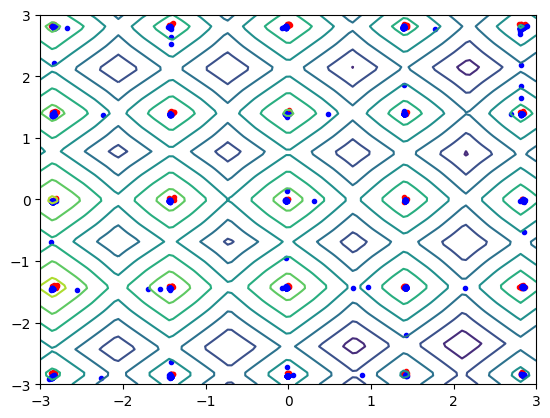

In [31]:
N_points_G=1000
true_data=Data_gen(batch_size)

generate_image(true_data,MLP,N_points_G)

In [11]:
def generate_image(true_dist,MLP,N_points_G):
    
    N_p = 128
    M = 3

    points = np.zeros([N_p, N_p, 2], dtype='float32')
    points[:, :, 0] = np.linspace(-M, M, N_p)[:, None]
    points[:, :, 1] = np.linspace(-M, M, N_p)[None, :]
    points = points.reshape((-1, 2))
    
    with torch.no_grad():
        
        points_v=torch.tensor(points,device=device)

        disc_map = MLP.Forward_Discriminator(points_v).cpu().numpy()

        noise_v = torch.randn([N_points_G, 2],device=device)

        samples = MLP.Forward_Generator(noise_v).cpu().numpy()

    plt.clf()
    
    true_dist=true_dist.detach().to('cpu').numpy()
    
    x = y = np.linspace(-M, M, N_p)
    plt.contour(x, y, disc_map.reshape((len(x), len(y))).transpose())

    plt.scatter(true_dist[:, 0], true_dist[:, 1], c='red', marker='.')  # true data
    plt.scatter(samples[:, 0], samples[:, 1], c='blue', marker='.')  # fake sample